## Bidirectional LSTM model na predikciu hodnot DST o 6 hodin dopredu na zaklade 24-hodinoveho vstupneho okna z atributu DST

Subor: prediction_DST+6_24H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-26 19:52:01.379585: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 6
y_col = f"DST+{shift}"

n_input = 24
atr_count = 1

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])


valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train['DST'].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid['DST'].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test['DST'].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  24


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 24, 1)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 24, 256)             │         133,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 24, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 24, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 24)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              25 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 330,394 (1.26 MB)

 Trainable params: 330,394 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:19:33 5s/step - loss: 0.4268 - mae: 0.5410

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.4137 - mae: 0.5164

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 141ms/step - loss: 0.4392 - mae: 0.5251

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.4388 - mae: 0.5215

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.4262 - mae: 0.5100

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.4143 - mae: 0.4997

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.4074 - mae: 0.4935

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.4065 - mae: 0.4900

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.4037 - mae: 0.4860

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.4370 - mae: 0.4884

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.4595 - mae: 0.4887

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.4750 - mae: 0.4881

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.4852 - mae: 0.4865

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.4921 - mae: 0.4845

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.5072 - mae: 0.4841

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.5187 - mae: 0.4835

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.5271 - mae: 0.4823

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.5343 - mae: 0.4813

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.5394 - mae: 0.4801

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.5431 - mae: 0.4787

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.5456 - mae: 0.4774

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.5472 - mae: 0.4760

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.5482 - mae: 0.4748

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.5490 - mae: 0.4738

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.5491 - mae: 0.4728

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.5487 - mae: 0.4717

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.5480 - mae: 0.4705

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.5493 - mae: 0.4698

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.5506 - mae: 0.4691

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.5514 - mae: 0.4683

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.5525 - mae: 0.4677

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.5537 - mae: 0.4672

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.5544 - mae: 0.4666

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.5552 - mae: 0.4661

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.5559 - mae: 0.4658

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.5567 - mae: 0.4655

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.5573 - mae: 0.4652

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.5576 - mae: 0.4649

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.5576 - mae: 0.4645

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.5574 - mae: 0.4640

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.5572 - mae: 0.4636

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.5570 - mae: 0.4632

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.5568 - mae: 0.4628

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.5567 - mae: 0.4625

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.5566 - mae: 0.4621

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.5565 - mae: 0.4619

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.5562 - mae: 0.4616

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.5559 - mae: 0.4613

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.5555 - mae: 0.4611

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.5550 - mae: 0.4608

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.5544 - mae: 0.4605

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.5540 - mae: 0.4603

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.5534 - mae: 0.4600

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.5528 - mae: 0.4597

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.5521 - mae: 0.4595

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.5514 - mae: 0.4591

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.5505 - mae: 0.4588

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.5496 - mae: 0.4584

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.5486 - mae: 0.4580

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.5476 - mae: 0.4576

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.5469 - mae: 0.4572

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.5461 - mae: 0.4569

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.5453 - mae: 0.4566

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.5445 - mae: 0.4563

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.5436 - mae: 0.4559

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.5429 - mae: 0.4556

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.5421 - mae: 0.4553

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.5413 - mae: 0.4550

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.5409 - mae: 0.4548

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.5404 - mae: 0.4545

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.5399 - mae: 0.4542

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.5394 - mae: 0.4540

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.5388 - mae: 0.4538

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.5383 - mae: 0.4535

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.5379 - mae: 0.4533

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.5374 - mae: 0.4531

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.5368 - mae: 0.4528

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.5363 - mae: 0.4525

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.5357 - mae: 0.4523

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.5352 - mae: 0.4520

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.5346 - mae: 0.4518

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.5341 - mae: 0.4516

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.5336 - mae: 0.4513

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.5330 - mae: 0.4511

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.5325 - mae: 0.4509

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.5319 - mae: 0.4507

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.5313 - mae: 0.4504

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.5307 - mae: 0.4502

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.5301 - mae: 0.4499

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.5295 - mae: 0.4497

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.5288 - mae: 0.4494

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.5281 - mae: 0.4492

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.5274 - mae: 0.4489

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.5267 - mae: 0.4486

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.5260 - mae: 0.4483

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.5252 - mae: 0.4480

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.5244 - mae: 0.4477

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.5237 - mae: 0.4474

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.5229 - mae: 0.4471

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.5220 - mae: 0.4468

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.5212 - mae: 0.4465

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.5204 - mae: 0.4461

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.5196 - mae: 0.4458

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.5188 - mae: 0.4455

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.5181 - mae: 0.4452

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.5175 - mae: 0.4450

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.5168 - mae: 0.4447

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.5162 - mae: 0.4444

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.5156 - mae: 0.4442

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.5150 - mae: 0.4439

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.5144 - mae: 0.4437

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.5140 - mae: 0.4435

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.5136 - mae: 0.4433

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.5132 - mae: 0.4431

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.5127 - mae: 0.4429

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.5123 - mae: 0.4427

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.5119 - mae: 0.4425

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.5114 - mae: 0.4423

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.5110 - mae: 0.4421

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.5106 - mae: 0.4419

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.5103 - mae: 0.4418

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.5099 - mae: 0.4416

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.5095 - mae: 0.4414

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.5092 - mae: 0.4412

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.5087 - mae: 0.4410

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.5083 - mae: 0.4408

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.5079 - mae: 0.4406

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.5075 - mae: 0.4404

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.5071 - mae: 0.4402

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.5067 - mae: 0.4400

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.5063 - mae: 0.4398

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.5059 - mae: 0.4396

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.5055 - mae: 0.4394

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.5050 - mae: 0.4393

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.5046 - mae: 0.4391

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.5042 - mae: 0.4389

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.5037 - mae: 0.4387

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.5033 - mae: 0.4385

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.5028 - mae: 0.4383

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.5024 - mae: 0.4381

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.5020 - mae: 0.4380

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.5017 - mae: 0.4378

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.5013 - mae: 0.4376

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.5010 - mae: 0.4375

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.5007 - mae: 0.4374

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.5004 - mae: 0.4372

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.5001 - mae: 0.4371

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.4997 - mae: 0.4369

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.4994 - mae: 0.4368

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.4991 - mae: 0.4366

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.4988 - mae: 0.4365

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.4984 - mae: 0.4363

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.4981 - mae: 0.4362

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.4977 - mae: 0.4360

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.4974 - mae: 0.4359

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.4970 - mae: 0.4357

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.4967 - mae: 0.4356

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.4963 - mae: 0.4354

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.4960 - mae: 0.4353

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.4957 - mae: 0.4352

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.4954 - mae: 0.4350

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.4950 - mae: 0.4349

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.4947 - mae: 0.4348

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.4944 - mae: 0.4346

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.4940 - mae: 0.4345

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.4937 - mae: 0.4344

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.4934 - mae: 0.4343

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.4931 - mae: 0.4342

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.4928 - mae: 0.4340

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.4925 - mae: 0.4339

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.4922 - mae: 0.4338

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.4920 - mae: 0.4337

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.4917 - mae: 0.4336

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.4915 - mae: 0.4335

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.4912 - mae: 0.4334

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.4909 - mae: 0.4333

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.4907 - mae: 0.4332

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.4904 - mae: 0.4331

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.4902 - mae: 0.4330

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.4900 - mae: 0.4329

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.4897 - mae: 0.4328

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.4895 - mae: 0.4328

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.4892 - mae: 0.4327

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.4890 - mae: 0.4326

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.4888 - mae: 0.4325

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.4885 - mae: 0.4324

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.4883 - mae: 0.4323

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.4881 - mae: 0.4322

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.4878 - mae: 0.4321

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.4876 - mae: 0.4320

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.4873 - mae: 0.4320

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.4871 - mae: 0.4319

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.4868 - mae: 0.4318

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.4866 - mae: 0.4317

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.4863 - mae: 0.4316

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.4861 - mae: 0.4316

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.4858 - mae: 0.4315

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.4856 - mae: 0.4314

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.4853 - mae: 0.4313

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.4851 - mae: 0.4312

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.4848 - mae: 0.4311

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.4846 - mae: 0.4310

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.4843 - mae: 0.4310

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.4841 - mae: 0.4309

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.4839 - mae: 0.4308

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.4836 - mae: 0.4307

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.4834 - mae: 0.4306

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.4831 - mae: 0.4305

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.4829 - mae: 0.4305

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.4827 - mae: 0.4304

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.4824 - mae: 0.4303

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.4822 - mae: 0.4302

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.4819 - mae: 0.4301

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.4817 - mae: 0.4300

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.4815 - mae: 0.4300

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.4813 - mae: 0.4299

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.4811 - mae: 0.4298

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.4809 - mae: 0.4297

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.4807 - mae: 0.4297

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.4804 - mae: 0.4296

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.4802 - mae: 0.4295

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.4800 - mae: 0.4295

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.4798 - mae: 0.4294

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.4796 - mae: 0.4293

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.4794 - mae: 0.4292

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.4792 - mae: 0.4292

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.4790 - mae: 0.4291

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.4788 - mae: 0.4290

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.4785 - mae: 0.4290

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.4783 - mae: 0.4289

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.4781 - mae: 0.4288

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 128ms/step - loss: 0.4779 - mae: 0.4288

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 128ms/step - loss: 0.4777 - mae: 0.4287

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 128ms/step - loss: 0.4775 - mae: 0.4286

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 128ms/step - loss: 0.4772 - mae: 0.4285

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 128ms/step - loss: 0.4770 - mae: 0.4285

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 128ms/step - loss: 0.4768 - mae: 0.4284

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 128ms/step - loss: 0.4767 - mae: 0.4283

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 128ms/step - loss: 0.4766 - mae: 0.4283

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 128ms/step - loss: 0.4766 - mae: 0.4282

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 128ms/step - loss: 0.4765 - mae: 0.4282

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 128ms/step - loss: 0.4764 - mae: 0.4281

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 128ms/step - loss: 0.4764 - mae: 0.4281

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 128ms/step - loss: 0.4763 - mae: 0.4280

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 128ms/step - loss: 0.4763 - mae: 0.4280

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 128ms/step - loss: 0.4762 - mae: 0.4279

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 128ms/step - loss: 0.4762 - mae: 0.4279

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 128ms/step - loss: 0.4761 - mae: 0.4279

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 128ms/step - loss: 0.4761 - mae: 0.4278

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 128ms/step - loss: 0.4760 - mae: 0.4278

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 128ms/step - loss: 0.4760 - mae: 0.4278

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 128ms/step - loss: 0.4759 - mae: 0.4277

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 128ms/step - loss: 0.4759 - mae: 0.4277

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 128ms/step - loss: 0.4758 - mae: 0.4276

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 128ms/step - loss: 0.4757 - mae: 0.4276

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 128ms/step - loss: 0.4757 - mae: 0.4276

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 128ms/step - loss: 0.4756 - mae: 0.4275

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 128ms/step - loss: 0.4755 - mae: 0.4275

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 128ms/step - loss: 0.4754 - mae: 0.4274

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 128ms/step - loss: 0.4754 - mae: 0.4274

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 128ms/step - loss: 0.4753 - mae: 0.4274

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.4752 - mae: 0.4273

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 128ms/step - loss: 0.4751 - mae: 0.4273

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.4750 - mae: 0.4272

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.4750 - mae: 0.4272

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.4749 - mae: 0.4271

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.4748 - mae: 0.4271

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.4747 - mae: 0.4271

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.4746 - mae: 0.4270

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.4745 - mae: 0.4270

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.4744 - mae: 0.4269

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.4743 - mae: 0.4269

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.4742 - mae: 0.4268

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.4741 - mae: 0.4268

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.4740 - mae: 0.4267

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.4739 - mae: 0.4267

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.4738 - mae: 0.4266

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.4737 - mae: 0.4265

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.4735 - mae: 0.4265

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.4734 - mae: 0.4264

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.4733 - mae: 0.4264

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.4732 - mae: 0.4263

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.4731 - mae: 0.4263

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.4730 - mae: 0.4262

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.4729 - mae: 0.4262

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.4728 - mae: 0.4261

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.4727 - mae: 0.4261

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.4726 - mae: 0.4260

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.4724 - mae: 0.4260

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.4723 - mae: 0.4259

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.4722 - mae: 0.4259

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.4721 - mae: 0.4258

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.4720 - mae: 0.4258

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.4719 - mae: 0.4257

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.4717 - mae: 0.4256

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.4716 - mae: 0.4256

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.4715 - mae: 0.4255

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.4714 - mae: 0.4255

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.4712 - mae: 0.4254

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.4711 - mae: 0.4254

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.4710 - mae: 0.4253

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.4709 - mae: 0.4253

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.4707 - mae: 0.4252

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.4706 - mae: 0.4252

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.4705 - mae: 0.4251

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.4703 - mae: 0.4250

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.4702 - mae: 0.4250

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.4701 - mae: 0.4249

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.4699 - mae: 0.4249

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.4698 - mae: 0.4248

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.4697 - mae: 0.4248

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.4695 - mae: 0.4247

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.4694 - mae: 0.4246

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.4692 - mae: 0.4246

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.4691 - mae: 0.4245

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.4690 - mae: 0.4245

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.4688 - mae: 0.4244

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.4687 - mae: 0.4244

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.4685 - mae: 0.4243

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.4684 - mae: 0.4242

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.4683 - mae: 0.4242

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.4682 - mae: 0.4241

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.4680 - mae: 0.4241

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.4679 - mae: 0.4240

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.4678 - mae: 0.4240

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.4676 - mae: 0.4239

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.4675 - mae: 0.4239

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.4674 - mae: 0.4238

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.4672 - mae: 0.4237

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.4671 - mae: 0.4237

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.4670 - mae: 0.4236

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.4668 - mae: 0.4236

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.4667 - mae: 0.4235

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.4665 - mae: 0.4234

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.4664 - mae: 0.4234

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.4663 - mae: 0.4233

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.4661 - mae: 0.4233

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.4660 - mae: 0.4232

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.4659 - mae: 0.4232

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.4657 - mae: 0.4231

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.4656 - mae: 0.4231

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.4654 - mae: 0.4230

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.4653 - mae: 0.4229

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.4652 - mae: 0.4229

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.4650 - mae: 0.4228

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.4649 - mae: 0.4228

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.4647 - mae: 0.4227

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.4646 - mae: 0.4227

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.4645 - mae: 0.4226

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.4643 - mae: 0.4226

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.4642 - mae: 0.4225

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.4640 - mae: 0.4224

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.4639 - mae: 0.4224

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.4638 - mae: 0.4223

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.4636 - mae: 0.4223

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.4635 - mae: 0.4222

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.4633 - mae: 0.4222

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.4632 - mae: 0.4221

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.4631 - mae: 0.4221

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.4629 - mae: 0.4220

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.4628 - mae: 0.4220

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.4627 - mae: 0.4219

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.4625 - mae: 0.4219

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.4624 - mae: 0.4218

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.4623 - mae: 0.4218

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.4621 - mae: 0.4217

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.4620 - mae: 0.4217

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.4619 - mae: 0.4216

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.4617 - mae: 0.4216

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.4616 - mae: 0.4215

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.4615 - mae: 0.4215

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.4613 - mae: 0.4214

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.4612 - mae: 0.4214

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.4611 - mae: 0.4213

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.4610 - mae: 0.4213

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.4609 - mae: 0.4212

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.4607 - mae: 0.4212

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.4606 - mae: 0.4211

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.4605 - mae: 0.4211

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.4604 - mae: 0.4211

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.4603 - mae: 0.4210

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.4602 - mae: 0.4210

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.4601 - mae: 0.4209

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.4600 - mae: 0.4209

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.4600 - mae: 0.4209

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.4599 - mae: 0.4208

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.4598 - mae: 0.4208

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.4597 - mae: 0.4208

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.4596 - mae: 0.4207

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.4595 - mae: 0.4207

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.4594 - mae: 0.4207

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.4593 - mae: 0.4206

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.4593 - mae: 0.4206

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.4592 - mae: 0.4206

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.4591 - mae: 0.4205

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.4590 - mae: 0.4205

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.4590 - mae: 0.4205

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.4589 - mae: 0.4205

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.4588 - mae: 0.4204

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.4587 - mae: 0.4204

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.4586 - mae: 0.4204

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.4586 - mae: 0.4203

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.4585 - mae: 0.4203

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.4584 - mae: 0.4203

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.4583 - mae: 0.4202

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.4583 - mae: 0.4202

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.4582 - mae: 0.4202

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.4581 - mae: 0.4202

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.4581 - mae: 0.4201

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.4580 - mae: 0.4201

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.4579 - mae: 0.4201

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.4579 - mae: 0.4200

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.4578 - mae: 0.4200

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.4577 - mae: 0.4200

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.4577 - mae: 0.4200

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.4576 - mae: 0.4199

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.4576 - mae: 0.4199

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.4575 - mae: 0.4199

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.4574 - mae: 0.4199

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.4574 - mae: 0.4198

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.4573 - mae: 0.4198

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.4572 - mae: 0.4198 

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.4572 - mae: 0.4197

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.4571 - mae: 0.4197

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.4570 - mae: 0.4197

426/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.4570 - mae: 0.4197

427/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.4569 - mae: 0.4196

428/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.4568 - mae: 0.4196

429/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.4567 - mae: 0.4196

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.4567 - mae: 0.4195

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.4566 - mae: 0.4195

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.4565 - mae: 0.4195

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.4565 - mae: 0.4195

434/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.4564 - mae: 0.4194

435/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.4563 - mae: 0.4194

436/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.4562 - mae: 0.4194

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.4562 - mae: 0.4193

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.4561 - mae: 0.4193

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.4560 - mae: 0.4193

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.4560 - mae: 0.4193

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.4559 - mae: 0.4192

442/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.4558 - mae: 0.4192

443/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.4557 - mae: 0.4192

444/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.4557 - mae: 0.4191

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.4556 - mae: 0.4191

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.4555 - mae: 0.4191

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.4555 - mae: 0.4191

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.4554 - mae: 0.4190

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.4554 - mae: 0.4190

450/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.4553 - mae: 0.4190

451/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.4553 - mae: 0.4190

452/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.4552 - mae: 0.4190

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.4552 - mae: 0.4189

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.4551 - mae: 0.4189

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.4551 - mae: 0.4189

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.4550 - mae: 0.4189

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.4550 - mae: 0.4189

458/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.4549 - mae: 0.4188

459/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.4549 - mae: 0.4188

460/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.4549 - mae: 0.4188

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.4548 - mae: 0.4188

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.4548 - mae: 0.4188

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.4547 - mae: 0.4188

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.4547 - mae: 0.4187

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.4547 - mae: 0.4187

466/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.4546 - mae: 0.4187

467/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.4546 - mae: 0.4187

468/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.4545 - mae: 0.4187

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.4545 - mae: 0.4187

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.4545 - mae: 0.4186

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.4544 - mae: 0.4186

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.4544 - mae: 0.4186

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.4543 - mae: 0.4186

474/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.4543 - mae: 0.4186

475/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.4543 - mae: 0.4186

476/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.4542 - mae: 0.4185

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.4542 - mae: 0.4185

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.4541 - mae: 0.4185

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.4541 - mae: 0.4185

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.4540 - mae: 0.4185

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.4540 - mae: 0.4185

482/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.4539 - mae: 0.4184

483/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.4539 - mae: 0.4184

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.4539 - mae: 0.4184

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.4538 - mae: 0.4184

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.4538 - mae: 0.4184

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.4537 - mae: 0.4184

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.4537 - mae: 0.4183

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.4536 - mae: 0.4183

490/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.4536 - mae: 0.4183

491/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.4535 - mae: 0.4183

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.4535 - mae: 0.4183

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.4534 - mae: 0.4183

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.4534 - mae: 0.4182

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.4533 - mae: 0.4182

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.4533 - mae: 0.4182

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.4532 - mae: 0.4182

498/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.4532 - mae: 0.4182

499/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.4531 - mae: 0.4181

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.4531 - mae: 0.4181

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.4530 - mae: 0.4181

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.4530 - mae: 0.4181

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.4529 - mae: 0.4181

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.4529 - mae: 0.4180

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.4528 - mae: 0.4180

506/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.4528 - mae: 0.4180

507/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.4527 - mae: 0.4180

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.4527 - mae: 0.4180

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.4526 - mae: 0.4180

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.4526 - mae: 0.4179

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.4525 - mae: 0.4179

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.4525 - mae: 0.4179

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.4524 - mae: 0.4179

514/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.4524 - mae: 0.4179

515/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.4523 - mae: 0.4178

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.4523 - mae: 0.4178

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.4522 - mae: 0.4178

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.4522 - mae: 0.4178

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.4521 - mae: 0.4178

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.4521 - mae: 0.4177

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.4521 - mae: 0.4177

522/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.4520 - mae: 0.4177

523/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.4520 - mae: 0.4177

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.4519 - mae: 0.4177

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.4519 - mae: 0.4177

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.4518 - mae: 0.4176

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.4518 - mae: 0.4176

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.4518 - mae: 0.4176

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.4517 - mae: 0.4176

530/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.4517 - mae: 0.4176

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.4516 - mae: 0.4176

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.4516 - mae: 0.4175

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.4516 - mae: 0.4175

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.4515 - mae: 0.4175

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.4515 - mae: 0.4175

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.4514 - mae: 0.4175

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.4514 - mae: 0.4175

538/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.4514 - mae: 0.4174

539/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.4513 - mae: 0.4174

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.4513 - mae: 0.4174

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.4513 - mae: 0.4174

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.4512 - mae: 0.4174

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.4512 - mae: 0.4174

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.4512 - mae: 0.4174

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.4511 - mae: 0.4173

546/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.4511 - mae: 0.4173

547/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.4511 - mae: 0.4173

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.4511 - mae: 0.4173

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.4511 - mae: 0.4173

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.4510 - mae: 0.4173

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.4510 - mae: 0.4173

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.4510 - mae: 0.4173

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.4510 - mae: 0.4172

554/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.4510 - mae: 0.4172

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.4509 - mae: 0.4172

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.4509 - mae: 0.4172

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.4509 - mae: 0.4172

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.4509 - mae: 0.4172

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.4509 - mae: 0.4172

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.4508 - mae: 0.4172

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.4508 - mae: 0.4171

562/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.4508 - mae: 0.4171

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.4508 - mae: 0.4171

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.4508 - mae: 0.4171

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.4507 - mae: 0.4171

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.4507 - mae: 0.4171

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.4507 - mae: 0.4171

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.4507 - mae: 0.4171

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.4507 - mae: 0.4171

570/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.4506 - mae: 0.4170

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.4506 - mae: 0.4170

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.4506 - mae: 0.4170

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.4506 - mae: 0.4170

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.4505 - mae: 0.4170

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.4505 - mae: 0.4170

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.4505 - mae: 0.4170

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.4505 - mae: 0.4170

578/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.4504 - mae: 0.4169

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.4504 - mae: 0.4169

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.4504 - mae: 0.4169

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.4503 - mae: 0.4169

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.4503 - mae: 0.4169

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.4503 - mae: 0.4169

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.4503 - mae: 0.4169

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.4502 - mae: 0.4168

586/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.4502 - mae: 0.4168

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.4502 - mae: 0.4168

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.4502 - mae: 0.4168

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.4501 - mae: 0.4168

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.4501 - mae: 0.4168

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.4501 - mae: 0.4168

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.4500 - mae: 0.4168

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.4500 - mae: 0.4167

594/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.4500 - mae: 0.4167

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.4500 - mae: 0.4167

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.4499 - mae: 0.4167

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.4499 - mae: 0.4167

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.4499 - mae: 0.4167

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.4499 - mae: 0.4167

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.4498 - mae: 0.4166

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.4498 - mae: 0.4166

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.4498 - mae: 0.4166

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.4498 - mae: 0.4166

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.4497 - mae: 0.4166

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.4497 - mae: 0.4166

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.4497 - mae: 0.4166

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.4496 - mae: 0.4165

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.4496 - mae: 0.4165

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.4496 - mae: 0.4165

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.4496 - mae: 0.4165

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.4495 - mae: 0.4165

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.4495 - mae: 0.4165

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.4495 - mae: 0.4164

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.4494 - mae: 0.4164

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.4494 - mae: 0.4164

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.4494 - mae: 0.4164

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.4493 - mae: 0.4164

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.4493 - mae: 0.4164

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.4493 - mae: 0.4164

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.4493 - mae: 0.4163

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.4492 - mae: 0.4163

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.4492 - mae: 0.4163

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.4492 - mae: 0.4163

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.4491 - mae: 0.4163

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.4491 - mae: 0.4163

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.4490 - mae: 0.4162

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.4490 - mae: 0.4162

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.4490 - mae: 0.4162

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.4489 - mae: 0.4162

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.4489 - mae: 0.4162

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.4489 - mae: 0.4162

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.4488 - mae: 0.4161

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.4488 - mae: 0.4161

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.4488 - mae: 0.4161

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.4487 - mae: 0.4161

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.4487 - mae: 0.4161

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.4487 - mae: 0.4161

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.4486 - mae: 0.4161

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.4486 - mae: 0.4160

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.4486 - mae: 0.4160

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.4485 - mae: 0.4160

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.4485 - mae: 0.4160

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.4485 - mae: 0.4160

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.4484 - mae: 0.4160

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.4484 - mae: 0.4159

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.4484 - mae: 0.4159

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.4483 - mae: 0.4159

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.4483 - mae: 0.4159

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.4483 - mae: 0.4159

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.4482 - mae: 0.4159

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.4482 - mae: 0.4159

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.4482 - mae: 0.4158

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.4481 - mae: 0.4158

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.4481 - mae: 0.4158

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.4481 - mae: 0.4158

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.4480 - mae: 0.4158

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.4480 - mae: 0.4158

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.4479 - mae: 0.4157

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.4479 - mae: 0.4157

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.4479 - mae: 0.4157

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.4478 - mae: 0.4157

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.4478 - mae: 0.4157

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.4478 - mae: 0.4157

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.4477 - mae: 0.4156

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.4477 - mae: 0.4156

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.4476 - mae: 0.4156

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.4476 - mae: 0.4156

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.4476 - mae: 0.4156

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.4475 - mae: 0.4156

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.4475 - mae: 0.4156

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.4475 - mae: 0.4155

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.4474 - mae: 0.4155

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.4474 - mae: 0.4155

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.4473 - mae: 0.4155

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.4473 - mae: 0.4155

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.4473 - mae: 0.4155

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.4472 - mae: 0.4154

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.4472 - mae: 0.4154

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.4471 - mae: 0.4154

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.4471 - mae: 0.4154

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.4471 - mae: 0.4154

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.4470 - mae: 0.4154

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.4470 - mae: 0.4153

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.4469 - mae: 0.4153

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.4469 - mae: 0.4153

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.4468 - mae: 0.4153

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.4468 - mae: 0.4153

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.4468 - mae: 0.4153

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.4467 - mae: 0.4152

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.4467 - mae: 0.4152

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.4466 - mae: 0.4152

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.4466 - mae: 0.4152

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.4466 - mae: 0.4152

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.4465 - mae: 0.4152

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.4465 - mae: 0.4151

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.4464 - mae: 0.4151

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.4464 - mae: 0.4151

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.4463 - mae: 0.4151

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.4463 - mae: 0.4151

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.4463 - mae: 0.4150

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.4462 - mae: 0.4150

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.4462 - mae: 0.4150

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.4461 - mae: 0.4150

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.4461 - mae: 0.4150

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.4460 - mae: 0.4150

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.4460 - mae: 0.4149

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.4459 - mae: 0.4149

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.4459 - mae: 0.4149

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.4458 - mae: 0.4149

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.4458 - mae: 0.4149

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.4458 - mae: 0.4148

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.4457 - mae: 0.4148

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.4457 - mae: 0.4148

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.4456 - mae: 0.4148

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.4456 - mae: 0.4148

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.4455 - mae: 0.4148

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.4455 - mae: 0.4147

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.4454 - mae: 0.4147

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.4454 - mae: 0.4147

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.4454 - mae: 0.4147

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.4453 - mae: 0.4147

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.4453 - mae: 0.4147

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.4452 - mae: 0.4146

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.4452 - mae: 0.4146

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.4451 - mae: 0.4146

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.4451 - mae: 0.4146

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.4450 - mae: 0.4146

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.4450 - mae: 0.4145

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.4449 - mae: 0.4145

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.4449 - mae: 0.4145

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.4448 - mae: 0.4145

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.4448 - mae: 0.4145

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.4448 - mae: 0.4145

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.4447 - mae: 0.4144

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.4447 - mae: 0.4144

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.4446 - mae: 0.4144

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.4446 - mae: 0.4144

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.4445 - mae: 0.4144

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.4445 - mae: 0.4144

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.4445 - mae: 0.4143

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.4444 - mae: 0.4143

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.4444 - mae: 0.4143

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.4443 - mae: 0.4143

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.4443 - mae: 0.4143

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.4443 - mae: 0.4143

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.4442 - mae: 0.4142

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.4442 - mae: 0.4142

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.4441 - mae: 0.4142

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.4441 - mae: 0.4142

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.4440 - mae: 0.4142

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.4440 - mae: 0.4141

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.4440 - mae: 0.4141

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.4439 - mae: 0.4141

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.4439 - mae: 0.4141

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.4438 - mae: 0.4141

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.4438 - mae: 0.4141

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.4437 - mae: 0.4141

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.4437 - mae: 0.4140

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.4437 - mae: 0.4140

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.4436 - mae: 0.4140

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.4436 - mae: 0.4140

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.4435 - mae: 0.4140

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.4435 - mae: 0.4140

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.4435 - mae: 0.4139

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.4434 - mae: 0.4139

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.4434 - mae: 0.4139

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.4433 - mae: 0.4139

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.4433 - mae: 0.4139

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.4432 - mae: 0.4139

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.4432 - mae: 0.4138

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.4432 - mae: 0.4138

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.4431 - mae: 0.4138

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.4431 - mae: 0.4138

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.4430 - mae: 0.4138

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.4430 - mae: 0.4138

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.4429 - mae: 0.4137

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.4429 - mae: 0.4137

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.4429 - mae: 0.4137

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.4428 - mae: 0.4137

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.4428 - mae: 0.4137

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.4427 - mae: 0.4137

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.4427 - mae: 0.4136

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.4426 - mae: 0.4136

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.4426 - mae: 0.4136

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.4425 - mae: 0.4136

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.4425 - mae: 0.4136

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.4425 - mae: 0.4136

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.4424 - mae: 0.4136

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.4424 - mae: 0.4135

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.4423 - mae: 0.4135

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.4423 - mae: 0.4135

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.4422 - mae: 0.4135

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.4422 - mae: 0.4135

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.4422 - mae: 0.4135

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.4421 - mae: 0.4134

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.4421 - mae: 0.4134

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.4420 - mae: 0.4134

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.4420 - mae: 0.4134

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.4419 - mae: 0.4134

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.4419 - mae: 0.4134

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.4418 - mae: 0.4133

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.4418 - mae: 0.4133

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.4418 - mae: 0.4133

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.4417 - mae: 0.4133

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.4417 - mae: 0.4133

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.4416 - mae: 0.4133

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.4416 - mae: 0.4133

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.4416 - mae: 0.4132

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.4415 - mae: 0.4132

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.4415 - mae: 0.4132

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.4414 - mae: 0.4132

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.4414 - mae: 0.4132

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.4413 - mae: 0.4132

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.4413 - mae: 0.4131

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.4412 - mae: 0.4131

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.4412 - mae: 0.4131

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.4412 - mae: 0.4131 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.4411 - mae: 0.4131

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.4411 - mae: 0.4131

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.4410 - mae: 0.4131

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.4410 - mae: 0.4130

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.4410 - mae: 0.4130

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.4409 - mae: 0.4130

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.4409 - mae: 0.4130

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.4408 - mae: 0.4130

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.4408 - mae: 0.4130

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.4407 - mae: 0.4129

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.4407 - mae: 0.4129

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.4407 - mae: 0.4129

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.4406 - mae: 0.4129

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.4406 - mae: 0.4129

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.4405 - mae: 0.4129

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.4405 - mae: 0.4129

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.4405 - mae: 0.4128

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.4404 - mae: 0.4128

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.4404 - mae: 0.4128

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.4403 - mae: 0.4128

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.4403 - mae: 0.4128

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.4402 - mae: 0.4128

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.4402 - mae: 0.4127

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.4402 - mae: 0.4127

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.4401 - mae: 0.4127

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.4401 - mae: 0.4127

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.4400 - mae: 0.4127

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.4400 - mae: 0.4127

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.4399 - mae: 0.4126

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.4399 - mae: 0.4126

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.4399 - mae: 0.4126

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.4398 - mae: 0.4126

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.4398 - mae: 0.4126

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.4397 - mae: 0.4126

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.4397 - mae: 0.4126

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.4396 - mae: 0.4125

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.4396 - mae: 0.4125

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.4395 - mae: 0.4125

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.4395 - mae: 0.4125

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.4395 - mae: 0.4125

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.4394 - mae: 0.4125

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.4394 - mae: 0.4124

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.4393 - mae: 0.4124

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.4393 - mae: 0.4124

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.4392 - mae: 0.4124

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.4392 - mae: 0.4124

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.4391 - mae: 0.4124

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.4391 - mae: 0.4123

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.4391 - mae: 0.4123

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.4390 - mae: 0.4123

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.4390 - mae: 0.4123

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.4389 - mae: 0.4123

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.4389 - mae: 0.4123

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.4388 - mae: 0.4122

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.4388 - mae: 0.4122

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.4388 - mae: 0.4122

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.4387 - mae: 0.4122

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.4387 - mae: 0.4122

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.4386 - mae: 0.4122

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.4386 - mae: 0.4121

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.4385 - mae: 0.4121

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.4385 - mae: 0.4121

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.4384 - mae: 0.4121

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.4384 - mae: 0.4121

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.4384 - mae: 0.4121

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.4383 - mae: 0.4120

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.4383 - mae: 0.4120

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.4382 - mae: 0.4120

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.4382 - mae: 0.4120

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.4381 - mae: 0.4120

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.4381 - mae: 0.4120

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.4381 - mae: 0.4119

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.4380 - mae: 0.4119

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.4380 - mae: 0.4119

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.4379 - mae: 0.4119

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.4379 - mae: 0.4119

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.4378 - mae: 0.4119

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.4378 - mae: 0.4119

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.4378 - mae: 0.4118


Epoch 1: val_mae improved from inf to 0.43470, saving model to models/DST+6_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 129s 139ms/step - loss: 0.4377 - mae: 0.4118 - val_loss: 0.5379 - val_mae: 0.4347


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 174ms/step - loss: 0.1986 - mae: 0.3415

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1849 - mae: 0.3331

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1816 - mae: 0.3295

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1779 - mae: 0.3248

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1783 - mae: 0.3221

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1770 - mae: 0.3192

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1764 - mae: 0.3181

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1757 - mae: 0.3170

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1756 - mae: 0.3166

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1752 - mae: 0.3159

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1752 - mae: 0.3156

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1782 - mae: 0.3169

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1811 - mae: 0.3181

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1841 - mae: 0.3192

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1866 - mae: 0.3202

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1884 - mae: 0.3206

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1899 - mae: 0.3210

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1911 - mae: 0.3212

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1922 - mae: 0.3214

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1933 - mae: 0.3217

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1951 - mae: 0.3221

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1976 - mae: 0.3227

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2006 - mae: 0.3239

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.2032 - mae: 0.3248

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2057 - mae: 0.3257

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2085 - mae: 0.3266

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.2109 - mae: 0.3274

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2135 - mae: 0.3283

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2158 - mae: 0.3291

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2178 - mae: 0.3299

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2195 - mae: 0.3305

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2212 - mae: 0.3311

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2231 - mae: 0.3319

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2252 - mae: 0.3328

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2286 - mae: 0.3340

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2324 - mae: 0.3353

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2360 - mae: 0.3367

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2396 - mae: 0.3381

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2429 - mae: 0.3394

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2460 - mae: 0.3407

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2488 - mae: 0.3418

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2513 - mae: 0.3429

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2536 - mae: 0.3438

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2557 - mae: 0.3446

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2576 - mae: 0.3454

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2594 - mae: 0.3461

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2612 - mae: 0.3469

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2630 - mae: 0.3476

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2646 - mae: 0.3483

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2665 - mae: 0.3490

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2683 - mae: 0.3498

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2702 - mae: 0.3504

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2722 - mae: 0.3512

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2741 - mae: 0.3518

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2758 - mae: 0.3525

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2776 - mae: 0.3531

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2797 - mae: 0.3538

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2817 - mae: 0.3545

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2835 - mae: 0.3551

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2853 - mae: 0.3557

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2871 - mae: 0.3563

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2887 - mae: 0.3568

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2902 - mae: 0.3574

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2916 - mae: 0.3578

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.2930 - mae: 0.3583

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2942 - mae: 0.3587

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2954 - mae: 0.3591

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2965 - mae: 0.3595

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2976 - mae: 0.3598

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2989 - mae: 0.3602

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.3001 - mae: 0.3607

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.3012 - mae: 0.3610

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.3023 - mae: 0.3614

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.3033 - mae: 0.3617

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.3042 - mae: 0.3620

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.3051 - mae: 0.3623

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.3059 - mae: 0.3625

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.3067 - mae: 0.3628

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.3074 - mae: 0.3630

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.3081 - mae: 0.3633

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.3088 - mae: 0.3635

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.3094 - mae: 0.3637

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.3100 - mae: 0.3639

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.3106 - mae: 0.3641

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.3112 - mae: 0.3643

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.3118 - mae: 0.3644

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.3123 - mae: 0.3646

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.3128 - mae: 0.3648

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.3133 - mae: 0.3650

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.3138 - mae: 0.3652

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.3143 - mae: 0.3653

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.3147 - mae: 0.3654

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.3150 - mae: 0.3655

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.3154 - mae: 0.3657

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.3158 - mae: 0.3658

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.3162 - mae: 0.3659

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.3165 - mae: 0.3660

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.3168 - mae: 0.3661

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.3171 - mae: 0.3662

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.3174 - mae: 0.3663

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.3176 - mae: 0.3664

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.3179 - mae: 0.3665

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.3182 - mae: 0.3666

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.3184 - mae: 0.3667

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.3186 - mae: 0.3668

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.3188 - mae: 0.3668

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.3190 - mae: 0.3669

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.3192 - mae: 0.3670

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.3193 - mae: 0.3670

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.3194 - mae: 0.3670

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.3195 - mae: 0.3671

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.3196 - mae: 0.3671

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.3197 - mae: 0.3671

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.3198 - mae: 0.3672

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.3199 - mae: 0.3672

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.3200 - mae: 0.3673

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.3201 - mae: 0.3673

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.3201 - mae: 0.3673

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.3206 - mae: 0.3674

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.3211 - mae: 0.3675

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.3215 - mae: 0.3676

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.3220 - mae: 0.3677

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.3224 - mae: 0.3678

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.3229 - mae: 0.3679

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.3233 - mae: 0.3680

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.3238 - mae: 0.3681

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.3242 - mae: 0.3682

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.3246 - mae: 0.3683

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.3249 - mae: 0.3683

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.3253 - mae: 0.3684

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.3257 - mae: 0.3685

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.3261 - mae: 0.3686

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.3265 - mae: 0.3687

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.3269 - mae: 0.3688

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.3273 - mae: 0.3689

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.3276 - mae: 0.3690

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.3280 - mae: 0.3691

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.3283 - mae: 0.3692

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.3287 - mae: 0.3693

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.3290 - mae: 0.3694

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.3293 - mae: 0.3695

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.3298 - mae: 0.3696

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.3303 - mae: 0.3697

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.3307 - mae: 0.3698

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.3312 - mae: 0.3700

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.3316 - mae: 0.3701

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.3320 - mae: 0.3702

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.3324 - mae: 0.3703

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.3328 - mae: 0.3704

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.3332 - mae: 0.3705

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.3336 - mae: 0.3706

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.3340 - mae: 0.3707

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.3344 - mae: 0.3708

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.3347 - mae: 0.3709

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.3351 - mae: 0.3710

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.3355 - mae: 0.3711

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.3358 - mae: 0.3712

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.3362 - mae: 0.3713

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.3365 - mae: 0.3714

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.3369 - mae: 0.3715

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.3372 - mae: 0.3716

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.3375 - mae: 0.3717

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.3378 - mae: 0.3719

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.3381 - mae: 0.3720

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.3384 - mae: 0.3721

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.3387 - mae: 0.3721

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.3390 - mae: 0.3722

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.3392 - mae: 0.3723

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.3395 - mae: 0.3724

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.3398 - mae: 0.3725

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.3401 - mae: 0.3726

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.3403 - mae: 0.3727

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.3406 - mae: 0.3728

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.3408 - mae: 0.3729

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.3411 - mae: 0.3730

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.3413 - mae: 0.3731

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.3416 - mae: 0.3732

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.3418 - mae: 0.3733

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.3420 - mae: 0.3733

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.3422 - mae: 0.3734

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.3424 - mae: 0.3735

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.3426 - mae: 0.3736

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.3428 - mae: 0.3736

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.3430 - mae: 0.3737

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.3432 - mae: 0.3738

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.3434 - mae: 0.3739

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.3436 - mae: 0.3739

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.3437 - mae: 0.3740

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.3439 - mae: 0.3741

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.3441 - mae: 0.3741

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.3442 - mae: 0.3742

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.3444 - mae: 0.3742

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.3445 - mae: 0.3743

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.3447 - mae: 0.3743

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.3448 - mae: 0.3744

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.3450 - mae: 0.3745

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.3451 - mae: 0.3745

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.3453 - mae: 0.3746

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.3454 - mae: 0.3746

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.3456 - mae: 0.3747

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.3457 - mae: 0.3747

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.3458 - mae: 0.3747

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.3459 - mae: 0.3748

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.3460 - mae: 0.3748

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.3462 - mae: 0.3749

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.3464 - mae: 0.3749

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.3465 - mae: 0.3750

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.3467 - mae: 0.3750

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.3468 - mae: 0.3751

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.3470 - mae: 0.3751

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.3472 - mae: 0.3752

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.3474 - mae: 0.3752

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.3476 - mae: 0.3753

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.3477 - mae: 0.3753

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.3479 - mae: 0.3754

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.3481 - mae: 0.3754

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.3482 - mae: 0.3755

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.3484 - mae: 0.3755

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.3485 - mae: 0.3756

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.3486 - mae: 0.3756

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.3488 - mae: 0.3756

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.3489 - mae: 0.3757

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.3490 - mae: 0.3757

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.3492 - mae: 0.3758

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.3493 - mae: 0.3758

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.3494 - mae: 0.3758

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.3495 - mae: 0.3759

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.3497 - mae: 0.3759

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.3498 - mae: 0.3760

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.3499 - mae: 0.3760

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.3500 - mae: 0.3760

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.3501 - mae: 0.3761

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.3502 - mae: 0.3761

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.3503 - mae: 0.3761

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.3505 - mae: 0.3762

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.3506 - mae: 0.3762

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.3507 - mae: 0.3762

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.3508 - mae: 0.3763

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.3509 - mae: 0.3763

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.3510 - mae: 0.3763

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.3511 - mae: 0.3763

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.3512 - mae: 0.3764

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.3513 - mae: 0.3764

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.3514 - mae: 0.3764

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.3515 - mae: 0.3764

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.3516 - mae: 0.3765

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.3517 - mae: 0.3765

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.3517 - mae: 0.3765

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.3518 - mae: 0.3765

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.3519 - mae: 0.3766

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.3520 - mae: 0.3766

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.3520 - mae: 0.3766

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.3521 - mae: 0.3766

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.3522 - mae: 0.3766

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.3522 - mae: 0.3766

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.3523 - mae: 0.3766

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.3523 - mae: 0.3766

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.3524 - mae: 0.3767

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.3524 - mae: 0.3767

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.3525 - mae: 0.3767

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.3525 - mae: 0.3767

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.3526 - mae: 0.3767

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.3527 - mae: 0.3767

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.3528 - mae: 0.3767

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.3529 - mae: 0.3768

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.3530 - mae: 0.3768

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.3530 - mae: 0.3768

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.3531 - mae: 0.3768

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.3532 - mae: 0.3768

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.3533 - mae: 0.3768

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.3533 - mae: 0.3768

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.3534 - mae: 0.3769

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.3535 - mae: 0.3769

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.3536 - mae: 0.3769

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.3536 - mae: 0.3769

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.3537 - mae: 0.3769

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.3538 - mae: 0.3769

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.3538 - mae: 0.3769

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.3539 - mae: 0.3770

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.3539 - mae: 0.3770

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.3540 - mae: 0.3770

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.3541 - mae: 0.3770

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.3541 - mae: 0.3770

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.3542 - mae: 0.3770

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.3542 - mae: 0.3770

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.3543 - mae: 0.3770

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.3543 - mae: 0.3770

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.3544 - mae: 0.3770

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.3544 - mae: 0.3771

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.3545 - mae: 0.3771

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.3545 - mae: 0.3771

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.3545 - mae: 0.3771

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.3546 - mae: 0.3771

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.3546 - mae: 0.3771

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.3547 - mae: 0.3771

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.3548 - mae: 0.3771

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.3548 - mae: 0.3771

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.3549 - mae: 0.3771

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.3549 - mae: 0.3771

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.3550 - mae: 0.3771

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.3550 - mae: 0.3771

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.3551 - mae: 0.3771

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.3551 - mae: 0.3771

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.3552 - mae: 0.3772

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.3552 - mae: 0.3772

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.3553 - mae: 0.3772

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.3553 - mae: 0.3772

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.3554 - mae: 0.3772

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.3554 - mae: 0.3772

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.3554 - mae: 0.3772

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.3555 - mae: 0.3772

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.3555 - mae: 0.3772

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.3555 - mae: 0.3772

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.3555 - mae: 0.3772

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.3556 - mae: 0.3772

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.3556 - mae: 0.3772

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.3556 - mae: 0.3772

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.3556 - mae: 0.3772

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.3557 - mae: 0.3772

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.3557 - mae: 0.3771

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.3557 - mae: 0.3771

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.3557 - mae: 0.3771

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.3558 - mae: 0.3771

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.3558 - mae: 0.3771

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.3558 - mae: 0.3771

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.3558 - mae: 0.3771

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.3558 - mae: 0.3771

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.3559 - mae: 0.3771

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.3559 - mae: 0.3771

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.3559 - mae: 0.3771

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.3559 - mae: 0.3771

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.3559 - mae: 0.3771

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.3559 - mae: 0.3771

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.3560 - mae: 0.3771

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.3560 - mae: 0.3771

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.3560 - mae: 0.3771

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.3560 - mae: 0.3771

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.3560 - mae: 0.3771

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.3560 - mae: 0.3771

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.3560 - mae: 0.3771

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.3560 - mae: 0.3771

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.3560 - mae: 0.3770

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.3560 - mae: 0.3770

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.3560 - mae: 0.3770

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.3561 - mae: 0.3770

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.3561 - mae: 0.3770

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.3561 - mae: 0.3770

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.3561 - mae: 0.3770

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.3561 - mae: 0.3770

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.3561 - mae: 0.3770

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.3561 - mae: 0.3770

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.3561 - mae: 0.3769

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.3561 - mae: 0.3769

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.3561 - mae: 0.3769

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.3561 - mae: 0.3769

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.3561 - mae: 0.3769

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.3561 - mae: 0.3769

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.3561 - mae: 0.3769

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.3561 - mae: 0.3769

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.3561 - mae: 0.3769

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.3561 - mae: 0.3768

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.3561 - mae: 0.3768

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.3561 - mae: 0.3768

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.3561 - mae: 0.3768

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.3561 - mae: 0.3768

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.3561 - mae: 0.3768

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.3561 - mae: 0.3768

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.3561 - mae: 0.3768

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.3561 - mae: 0.3767

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.3561 - mae: 0.3767

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.3561 - mae: 0.3767

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.3561 - mae: 0.3767

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.3561 - mae: 0.3767

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.3561 - mae: 0.3767

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.3561 - mae: 0.3767

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.3561 - mae: 0.3767

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.3562 - mae: 0.3767

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.3562 - mae: 0.3767

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.3562 - mae: 0.3767

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.3562 - mae: 0.3767

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.3562 - mae: 0.3767

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.3562 - mae: 0.3766

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.3562 - mae: 0.3766

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.3562 - mae: 0.3766

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.3562 - mae: 0.3766

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.3562 - mae: 0.3766

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.3562 - mae: 0.3766

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.3562 - mae: 0.3766

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.3562 - mae: 0.3766

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.3562 - mae: 0.3766

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.3562 - mae: 0.3766

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.3562 - mae: 0.3766

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.3562 - mae: 0.3766

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.3562 - mae: 0.3766

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.3562 - mae: 0.3765

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.3562 - mae: 0.3765

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.3562 - mae: 0.3765

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.3562 - mae: 0.3765

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.3562 - mae: 0.3765

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.3562 - mae: 0.3765

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.3562 - mae: 0.3765

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.3562 - mae: 0.3765

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.3562 - mae: 0.3765

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.3562 - mae: 0.3765

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.3562 - mae: 0.3765

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.3561 - mae: 0.3764

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.3561 - mae: 0.3764

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.3561 - mae: 0.3764

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.3561 - mae: 0.3764

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.3561 - mae: 0.3764

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.3561 - mae: 0.3764

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.3561 - mae: 0.3764 

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.3561 - mae: 0.3764

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.3561 - mae: 0.3764

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.3561 - mae: 0.3764

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.3561 - mae: 0.3763

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.3560 - mae: 0.3763

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.3560 - mae: 0.3763

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.3560 - mae: 0.3763

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.3560 - mae: 0.3763

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.3560 - mae: 0.3763

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.3560 - mae: 0.3763

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.3560 - mae: 0.3763

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.3559 - mae: 0.3763

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.3559 - mae: 0.3762

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.3559 - mae: 0.3762

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.3559 - mae: 0.3762

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.3559 - mae: 0.3762

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.3558 - mae: 0.3762

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.3558 - mae: 0.3762

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.3558 - mae: 0.3762

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.3558 - mae: 0.3762

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.3558 - mae: 0.3762

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.3558 - mae: 0.3761

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.3557 - mae: 0.3761

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.3557 - mae: 0.3761

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.3557 - mae: 0.3761

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.3557 - mae: 0.3761

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.3557 - mae: 0.3761

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.3557 - mae: 0.3761

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.3557 - mae: 0.3761

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.3557 - mae: 0.3761

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.3556 - mae: 0.3761

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.3556 - mae: 0.3761

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.3556 - mae: 0.3760

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.3556 - mae: 0.3760

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.3556 - mae: 0.3760

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.3556 - mae: 0.3760

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.3556 - mae: 0.3760

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.3555 - mae: 0.3760

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.3555 - mae: 0.3760

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.3555 - mae: 0.3760

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.3555 - mae: 0.3760

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.3555 - mae: 0.3760

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.3555 - mae: 0.3760

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.3554 - mae: 0.3759

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.3554 - mae: 0.3759

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.3554 - mae: 0.3759

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.3554 - mae: 0.3759

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.3554 - mae: 0.3759

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.3553 - mae: 0.3759

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.3553 - mae: 0.3759

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.3553 - mae: 0.3759

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.3553 - mae: 0.3759

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.3553 - mae: 0.3759

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.3552 - mae: 0.3758

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.3552 - mae: 0.3758

468/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.3552 - mae: 0.3758

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.3552 - mae: 0.3758

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.3551 - mae: 0.3758

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.3551 - mae: 0.3758

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.3551 - mae: 0.3758

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.3551 - mae: 0.3758

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.3550 - mae: 0.3757

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.3550 - mae: 0.3757

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.3550 - mae: 0.3757

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.3550 - mae: 0.3757

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.3549 - mae: 0.3757

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.3549 - mae: 0.3757

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.3549 - mae: 0.3757

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.3549 - mae: 0.3757

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.3548 - mae: 0.3757

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.3548 - mae: 0.3756

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.3548 - mae: 0.3756

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.3548 - mae: 0.3756

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.3547 - mae: 0.3756

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.3547 - mae: 0.3756

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.3547 - mae: 0.3756

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.3547 - mae: 0.3756

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.3546 - mae: 0.3756

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.3546 - mae: 0.3756

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.3546 - mae: 0.3756

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.3546 - mae: 0.3755

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.3545 - mae: 0.3755

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.3545 - mae: 0.3755

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.3545 - mae: 0.3755

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.3545 - mae: 0.3755

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.3544 - mae: 0.3755

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.3544 - mae: 0.3755

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.3544 - mae: 0.3755

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.3544 - mae: 0.3755

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.3543 - mae: 0.3755

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.3543 - mae: 0.3754

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.3543 - mae: 0.3754

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.3543 - mae: 0.3754

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.3542 - mae: 0.3754

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.3542 - mae: 0.3754

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.3542 - mae: 0.3754

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.3542 - mae: 0.3754

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.3541 - mae: 0.3754

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.3541 - mae: 0.3754

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.3541 - mae: 0.3754

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.3540 - mae: 0.3754

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.3540 - mae: 0.3754

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.3540 - mae: 0.3753

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.3540 - mae: 0.3753

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.3539 - mae: 0.3753

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.3539 - mae: 0.3753

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.3539 - mae: 0.3753

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.3539 - mae: 0.3753

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.3538 - mae: 0.3753

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.3538 - mae: 0.3753

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.3538 - mae: 0.3753

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.3538 - mae: 0.3753

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.3537 - mae: 0.3753

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.3537 - mae: 0.3753

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.3537 - mae: 0.3752

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.3536 - mae: 0.3752

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.3536 - mae: 0.3752

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.3536 - mae: 0.3752

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.3536 - mae: 0.3752

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.3535 - mae: 0.3752

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.3535 - mae: 0.3752

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.3535 - mae: 0.3752

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.3535 - mae: 0.3752

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.3534 - mae: 0.3752

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.3534 - mae: 0.3752

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.3534 - mae: 0.3751

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.3533 - mae: 0.3751

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.3533 - mae: 0.3751

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.3533 - mae: 0.3751

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.3533 - mae: 0.3751

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.3532 - mae: 0.3751

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.3532 - mae: 0.3751

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.3532 - mae: 0.3751

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.3531 - mae: 0.3751

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.3531 - mae: 0.3751

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.3531 - mae: 0.3750

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.3531 - mae: 0.3750

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.3531 - mae: 0.3750

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.3530 - mae: 0.3750

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.3530 - mae: 0.3750

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.3530 - mae: 0.3750

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.3530 - mae: 0.3750

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.3530 - mae: 0.3750

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.3529 - mae: 0.3750

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.3529 - mae: 0.3750

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.3529 - mae: 0.3750

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.3529 - mae: 0.3750

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.3529 - mae: 0.3750

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.3529 - mae: 0.3749

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.3529 - mae: 0.3749

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.3529 - mae: 0.3749

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.3529 - mae: 0.3749

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.3528 - mae: 0.3749

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.3528 - mae: 0.3749

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.3528 - mae: 0.3749

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.3528 - mae: 0.3749

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.3528 - mae: 0.3749

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.3528 - mae: 0.3749

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.3528 - mae: 0.3749

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.3528 - mae: 0.3749

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.3528 - mae: 0.3749

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.3528 - mae: 0.3749

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.3528 - mae: 0.3749

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.3527 - mae: 0.3749

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.3527 - mae: 0.3749

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.3527 - mae: 0.3749

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.3527 - mae: 0.3749

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.3527 - mae: 0.3748

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.3527 - mae: 0.3748

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.3527 - mae: 0.3748

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.3527 - mae: 0.3748

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.3527 - mae: 0.3748

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.3527 - mae: 0.3748

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.3527 - mae: 0.3748

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.3526 - mae: 0.3748

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.3526 - mae: 0.3748

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.3526 - mae: 0.3748

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.3526 - mae: 0.3748

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.3526 - mae: 0.3748

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.3526 - mae: 0.3748

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.3526 - mae: 0.3748

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.3526 - mae: 0.3748

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.3526 - mae: 0.3748

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.3526 - mae: 0.3748

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.3526 - mae: 0.3748

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.3526 - mae: 0.3748

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.3526 - mae: 0.3748

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.3526 - mae: 0.3748

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.3526 - mae: 0.3748

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.3526 - mae: 0.3748

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.3525 - mae: 0.3748

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.3525 - mae: 0.3748

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.3525 - mae: 0.3748

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.3525 - mae: 0.3748

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.3525 - mae: 0.3747

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.3525 - mae: 0.3747

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.3525 - mae: 0.3747

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.3525 - mae: 0.3747

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.3525 - mae: 0.3747

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.3525 - mae: 0.3747

613/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.3525 - mae: 0.3747

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.3525 - mae: 0.3747

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.3525 - mae: 0.3747

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.3524 - mae: 0.3747

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.3524 - mae: 0.3747

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.3524 - mae: 0.3747

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.3524 - mae: 0.3747

620/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.3524 - mae: 0.3747

621/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.3524 - mae: 0.3747

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.3524 - mae: 0.3747

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.3524 - mae: 0.3747

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.3524 - mae: 0.3747

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.3524 - mae: 0.3747

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.3524 - mae: 0.3747

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.3524 - mae: 0.3747

628/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.3524 - mae: 0.3747

629/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.3524 - mae: 0.3747

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.3524 - mae: 0.3747

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.3524 - mae: 0.3747

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.3523 - mae: 0.3747

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.3523 - mae: 0.3747

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.3523 - mae: 0.3747

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.3523 - mae: 0.3747

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.3523 - mae: 0.3747

637/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.3523 - mae: 0.3747

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.3523 - mae: 0.3747

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.3523 - mae: 0.3747

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.3523 - mae: 0.3747

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.3523 - mae: 0.3747

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.3523 - mae: 0.3747

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.3523 - mae: 0.3747

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.3523 - mae: 0.3747

645/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.3523 - mae: 0.3747

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.3523 - mae: 0.3746

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.3523 - mae: 0.3746

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.3523 - mae: 0.3746

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.3523 - mae: 0.3746

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.3523 - mae: 0.3746

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.3523 - mae: 0.3746

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.3523 - mae: 0.3746

653/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.3522 - mae: 0.3746

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.3522 - mae: 0.3746

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.3522 - mae: 0.3746

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.3522 - mae: 0.3746

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.3522 - mae: 0.3746

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.3522 - mae: 0.3746

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.3522 - mae: 0.3746

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.3522 - mae: 0.3746

661/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.3522 - mae: 0.3746

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.3522 - mae: 0.3746

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.3522 - mae: 0.3746

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.3522 - mae: 0.3746

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.3522 - mae: 0.3746

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.3522 - mae: 0.3746

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.3522 - mae: 0.3746

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.3522 - mae: 0.3746

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.3521 - mae: 0.3746

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.3521 - mae: 0.3746

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.3521 - mae: 0.3746

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.3521 - mae: 0.3746

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.3521 - mae: 0.3746

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.3521 - mae: 0.3746

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.3521 - mae: 0.3746

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.3521 - mae: 0.3746

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.3521 - mae: 0.3746

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.3521 - mae: 0.3746

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.3521 - mae: 0.3746

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.3520 - mae: 0.3746

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.3520 - mae: 0.3746

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.3520 - mae: 0.3745

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.3520 - mae: 0.3745

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.3520 - mae: 0.3745

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.3520 - mae: 0.3745

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.3520 - mae: 0.3745

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.3520 - mae: 0.3745

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.3520 - mae: 0.3745

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.3519 - mae: 0.3745

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.3519 - mae: 0.3745

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.3519 - mae: 0.3745

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.3519 - mae: 0.3745

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.3519 - mae: 0.3745

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.3519 - mae: 0.3745

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.3519 - mae: 0.3745

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.3519 - mae: 0.3745

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.3519 - mae: 0.3745

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.3519 - mae: 0.3745

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.3519 - mae: 0.3745

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.3519 - mae: 0.3745

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.3519 - mae: 0.3745

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.3519 - mae: 0.3745

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.3519 - mae: 0.3745

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.3519 - mae: 0.3745

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.3518 - mae: 0.3745

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.3518 - mae: 0.3745

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.3518 - mae: 0.3745

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.3518 - mae: 0.3745

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.3518 - mae: 0.3745

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.3518 - mae: 0.3745

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.3518 - mae: 0.3745

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.3518 - mae: 0.3745

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.3518 - mae: 0.3745

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.3518 - mae: 0.3745

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.3518 - mae: 0.3745

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.3518 - mae: 0.3745

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.3518 - mae: 0.3745

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.3518 - mae: 0.3745

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.3517 - mae: 0.3745

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.3517 - mae: 0.3745

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.3517 - mae: 0.3745

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.3517 - mae: 0.3745

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.3517 - mae: 0.3745

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.3517 - mae: 0.3745

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.3517 - mae: 0.3745

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.3517 - mae: 0.3745

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.3517 - mae: 0.3745

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.3517 - mae: 0.3744

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.3516 - mae: 0.3744

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.3516 - mae: 0.3744

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.3516 - mae: 0.3744

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.3516 - mae: 0.3744

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.3516 - mae: 0.3744

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.3516 - mae: 0.3744

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.3516 - mae: 0.3744

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.3516 - mae: 0.3744

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.3516 - mae: 0.3744

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.3515 - mae: 0.3744

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.3515 - mae: 0.3744

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.3515 - mae: 0.3744

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.3515 - mae: 0.3744

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.3515 - mae: 0.3744

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.3515 - mae: 0.3744

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.3515 - mae: 0.3744

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.3515 - mae: 0.3744

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.3515 - mae: 0.3744

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.3515 - mae: 0.3744

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.3514 - mae: 0.3744

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.3514 - mae: 0.3744

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.3514 - mae: 0.3744

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.3514 - mae: 0.3744

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.3514 - mae: 0.3744

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.3514 - mae: 0.3744

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.3514 - mae: 0.3744

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.3514 - mae: 0.3744

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.3514 - mae: 0.3744

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.3514 - mae: 0.3744

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.3513 - mae: 0.3744

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.3513 - mae: 0.3744

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.3513 - mae: 0.3743

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.3513 - mae: 0.3743

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.3513 - mae: 0.3743

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.3513 - mae: 0.3743

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.3513 - mae: 0.3743

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.3513 - mae: 0.3743

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.3513 - mae: 0.3743

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.3513 - mae: 0.3743

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.3513 - mae: 0.3743

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.3513 - mae: 0.3743

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.3513 - mae: 0.3743

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.3513 - mae: 0.3743

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.3513 - mae: 0.3743

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.3513 - mae: 0.3743

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.3513 - mae: 0.3743

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.3512 - mae: 0.3743

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.3512 - mae: 0.3743

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.3512 - mae: 0.3743

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.3512 - mae: 0.3743

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.3512 - mae: 0.3743

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.3512 - mae: 0.3743

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.3512 - mae: 0.3743

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.3512 - mae: 0.3743

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.3512 - mae: 0.3743

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.3512 - mae: 0.3743

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.3512 - mae: 0.3743

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.3512 - mae: 0.3743

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.3512 - mae: 0.3743

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.3512 - mae: 0.3743

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.3512 - mae: 0.3743

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.3512 - mae: 0.3743

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.3512 - mae: 0.3743

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.3512 - mae: 0.3743

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.3512 - mae: 0.3743

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.3512 - mae: 0.3743

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.3512 - mae: 0.3743

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.3512 - mae: 0.3743

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.3512 - mae: 0.3743

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.3512 - mae: 0.3743

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.3511 - mae: 0.3743

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.3511 - mae: 0.3743

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.3511 - mae: 0.3743

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.3511 - mae: 0.3743

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.3511 - mae: 0.3743

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.3511 - mae: 0.3743

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.3511 - mae: 0.3743

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.3511 - mae: 0.3743

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.3511 - mae: 0.3743

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.3511 - mae: 0.3743

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.3511 - mae: 0.3743

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.3511 - mae: 0.3743

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.3511 - mae: 0.3743

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 134ms/step - loss: 0.3511 - mae: 0.3743

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 134ms/step - loss: 0.3511 - mae: 0.3743

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 134ms/step - loss: 0.3511 - mae: 0.3743

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 134ms/step - loss: 0.3511 - mae: 0.3743

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 134ms/step - loss: 0.3511 - mae: 0.3743

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 134ms/step - loss: 0.3511 - mae: 0.3743

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 134ms/step - loss: 0.3511 - mae: 0.3743

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 134ms/step - loss: 0.3511 - mae: 0.3743

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 134ms/step - loss: 0.3511 - mae: 0.3742

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 135ms/step - loss: 0.3511 - mae: 0.3742

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 135ms/step - loss: 0.3511 - mae: 0.3742 

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 135ms/step - loss: 0.3511 - mae: 0.3742

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 135ms/step - loss: 0.3511 - mae: 0.3742

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 135ms/step - loss: 0.3511 - mae: 0.3742

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 135ms/step - loss: 0.3511 - mae: 0.3742

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 135ms/step - loss: 0.3511 - mae: 0.3742

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 135ms/step - loss: 0.3511 - mae: 0.3742

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 135ms/step - loss: 0.3511 - mae: 0.3742

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - loss: 0.3511 - mae: 0.3742

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - loss: 0.3511 - mae: 0.3742

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - loss: 0.3511 - mae: 0.3742

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - loss: 0.3511 - mae: 0.3742

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - loss: 0.3511 - mae: 0.3742

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - loss: 0.3511 - mae: 0.3742

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - loss: 0.3510 - mae: 0.3742

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - loss: 0.3510 - mae: 0.3742

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - loss: 0.3510 - mae: 0.3742

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - loss: 0.3510 - mae: 0.3742

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - loss: 0.3510 - mae: 0.3742

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - loss: 0.3510 - mae: 0.3742

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - loss: 0.3510 - mae: 0.3742

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - loss: 0.3510 - mae: 0.3742

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - loss: 0.3510 - mae: 0.3742

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - loss: 0.3510 - mae: 0.3742

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - loss: 0.3510 - mae: 0.3742

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - loss: 0.3510 - mae: 0.3742

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 138ms/step - loss: 0.3510 - mae: 0.3742

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 138ms/step - loss: 0.3510 - mae: 0.3742

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 138ms/step - loss: 0.3510 - mae: 0.3742

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 138ms/step - loss: 0.3510 - mae: 0.3742

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 138ms/step - loss: 0.3509 - mae: 0.3742

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - loss: 0.3509 - mae: 0.3742

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - loss: 0.3509 - mae: 0.3742

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - loss: 0.3509 - mae: 0.3742

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - loss: 0.3509 - mae: 0.3742

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.3509 - mae: 0.3741

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.3509 - mae: 0.3741

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.3509 - mae: 0.3741

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.3509 - mae: 0.3741

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.3509 - mae: 0.3741

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.3509 - mae: 0.3741

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.3509 - mae: 0.3741

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.3508 - mae: 0.3741

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.3508 - mae: 0.3741

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 140ms/step - loss: 0.3508 - mae: 0.3741

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 140ms/step - loss: 0.3508 - mae: 0.3741

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.3508 - mae: 0.3741

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.3508 - mae: 0.3741

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.3508 - mae: 0.3741

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.3508 - mae: 0.3741

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.3508 - mae: 0.3741

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.3508 - mae: 0.3741

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.3508 - mae: 0.3741

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 140ms/step - loss: 0.3508 - mae: 0.3741

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.3507 - mae: 0.3741

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.3507 - mae: 0.3741

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.3507 - mae: 0.3741

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.3507 - mae: 0.3741

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.3507 - mae: 0.3741

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.3507 - mae: 0.3741

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.3507 - mae: 0.3741

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.3507 - mae: 0.3740

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.3507 - mae: 0.3740

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.3507 - mae: 0.3740

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step - loss: 0.3507 - mae: 0.3740

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step - loss: 0.3507 - mae: 0.3740

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step - loss: 0.3507 - mae: 0.3740

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.3507 - mae: 0.3740

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.3507 - mae: 0.3740

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.3506 - mae: 0.3740

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.3506 - mae: 0.3740

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.3506 - mae: 0.3740

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.3506 - mae: 0.3740

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.3506 - mae: 0.3740

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.3506 - mae: 0.3740


Epoch 2: val_mae improved from 0.43470 to 0.42520, saving model to models/DST+6_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 146s 163ms/step - loss: 0.3506 - mae: 0.3740 - val_loss: 0.5127 - val_mae: 0.4252


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 272ms/step - loss: 0.1967 - mae: 0.3342

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 224ms/step - loss: 0.1903 - mae: 0.3186

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 223ms/step - loss: 0.2026 - mae: 0.3197

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 220ms/step - loss: 0.2174 - mae: 0.3256

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 219ms/step - loss: 0.2232 - mae: 0.3276

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 218ms/step - loss: 0.2236 - mae: 0.3271

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 218ms/step - loss: 0.2227 - mae: 0.3256

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 219ms/step - loss: 0.2335 - mae: 0.3286

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 219ms/step - loss: 0.2402 - mae: 0.3305

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 219ms/step - loss: 0.2441 - mae: 0.3317

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 219ms/step - loss: 0.2465 - mae: 0.3325

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 219ms/step - loss: 0.2485 - mae: 0.3336

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 219ms/step - loss: 0.2501 - mae: 0.3345

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 218ms/step - loss: 0.2509 - mae: 0.3351

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 220ms/step - loss: 0.2518 - mae: 0.3356

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 220ms/step - loss: 0.2529 - mae: 0.3359

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 221ms/step - loss: 0.2537 - mae: 0.3363

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 222ms/step - loss: 0.2547 - mae: 0.3370

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 223ms/step - loss: 0.2557 - mae: 0.3377

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 223ms/step - loss: 0.2576 - mae: 0.3388

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 223ms/step - loss: 0.2592 - mae: 0.3397

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 224ms/step - loss: 0.2608 - mae: 0.3407

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 224ms/step - loss: 0.2621 - mae: 0.3416

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 225ms/step - loss: 0.2630 - mae: 0.3422

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 225ms/step - loss: 0.2637 - mae: 0.3428

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 225ms/step - loss: 0.2648 - mae: 0.3435

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 226ms/step - loss: 0.2658 - mae: 0.3442

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 225ms/step - loss: 0.2665 - mae: 0.3447

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 226ms/step - loss: 0.2670 - mae: 0.3450

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 226ms/step - loss: 0.2673 - mae: 0.3453

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 226ms/step - loss: 0.2675 - mae: 0.3455

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 226ms/step - loss: 0.2677 - mae: 0.3457

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 226ms/step - loss: 0.2677 - mae: 0.3458

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 227ms/step - loss: 0.2676 - mae: 0.3459

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 227ms/step - loss: 0.2675 - mae: 0.3460

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 226ms/step - loss: 0.2676 - mae: 0.3461

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 226ms/step - loss: 0.2677 - mae: 0.3462

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 226ms/step - loss: 0.2677 - mae: 0.3463

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 227ms/step - loss: 0.2678 - mae: 0.3465

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 227ms/step - loss: 0.2679 - mae: 0.3466

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 227ms/step - loss: 0.2678 - mae: 0.3466

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 227ms/step - loss: 0.2679 - mae: 0.3467

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 227ms/step - loss: 0.2678 - mae: 0.3467

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 227ms/step - loss: 0.2677 - mae: 0.3468

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 227ms/step - loss: 0.2677 - mae: 0.3468

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 227ms/step - loss: 0.2676 - mae: 0.3468

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 226ms/step - loss: 0.2687 - mae: 0.3470

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 226ms/step - loss: 0.2696 - mae: 0.3472

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 226ms/step - loss: 0.2707 - mae: 0.3474

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 226ms/step - loss: 0.2717 - mae: 0.3476

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 226ms/step - loss: 0.2726 - mae: 0.3478

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 226ms/step - loss: 0.2734 - mae: 0.3479

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 226ms/step - loss: 0.2741 - mae: 0.3480

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 226ms/step - loss: 0.2747 - mae: 0.3481

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 227ms/step - loss: 0.2754 - mae: 0.3482

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 227ms/step - loss: 0.2761 - mae: 0.3483

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 227ms/step - loss: 0.2767 - mae: 0.3484

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 227ms/step - loss: 0.2774 - mae: 0.3486

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.2780 - mae: 0.3487

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.2786 - mae: 0.3488

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.2793 - mae: 0.3490

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.2800 - mae: 0.3491

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.2807 - mae: 0.3492

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.2814 - mae: 0.3493

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 227ms/step - loss: 0.2820 - mae: 0.3495

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 228ms/step - loss: 0.2827 - mae: 0.3497

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 228ms/step - loss: 0.2834 - mae: 0.3498

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 228ms/step - loss: 0.2841 - mae: 0.3500

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 228ms/step - loss: 0.2848 - mae: 0.3501

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 227ms/step - loss: 0.2854 - mae: 0.3502

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 227ms/step - loss: 0.2860 - mae: 0.3504

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 228ms/step - loss: 0.2865 - mae: 0.3505

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 228ms/step - loss: 0.2870 - mae: 0.3506

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 228ms/step - loss: 0.2874 - mae: 0.3507

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 228ms/step - loss: 0.2879 - mae: 0.3509

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 228ms/step - loss: 0.2883 - mae: 0.3510

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 228ms/step - loss: 0.2887 - mae: 0.3511

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 228ms/step - loss: 0.2891 - mae: 0.3511

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 228ms/step - loss: 0.2894 - mae: 0.3512

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 228ms/step - loss: 0.2897 - mae: 0.3513

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 228ms/step - loss: 0.2901 - mae: 0.3514

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 228ms/step - loss: 0.2904 - mae: 0.3515

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 228ms/step - loss: 0.2907 - mae: 0.3515

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 228ms/step - loss: 0.2910 - mae: 0.3516

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 228ms/step - loss: 0.2912 - mae: 0.3517

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 228ms/step - loss: 0.2915 - mae: 0.3517

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 228ms/step - loss: 0.2917 - mae: 0.3518

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 228ms/step - loss: 0.2918 - mae: 0.3518

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 228ms/step - loss: 0.2920 - mae: 0.3518

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 228ms/step - loss: 0.2921 - mae: 0.3518

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 228ms/step - loss: 0.2922 - mae: 0.3518

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 228ms/step - loss: 0.2923 - mae: 0.3519

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 228ms/step - loss: 0.2924 - mae: 0.3519

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 228ms/step - loss: 0.2925 - mae: 0.3519

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 228ms/step - loss: 0.2926 - mae: 0.3519

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 228ms/step - loss: 0.2926 - mae: 0.3519

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 228ms/step - loss: 0.2927 - mae: 0.3519

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 228ms/step - loss: 0.2927 - mae: 0.3519

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 228ms/step - loss: 0.2927 - mae: 0.3519

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 228ms/step - loss: 0.2928 - mae: 0.3519

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 228ms/step - loss: 0.2929 - mae: 0.3519

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 228ms/step - loss: 0.2930 - mae: 0.3519

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 228ms/step - loss: 0.2931 - mae: 0.3520

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 228ms/step - loss: 0.2932 - mae: 0.3520

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 228ms/step - loss: 0.2934 - mae: 0.3520

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 228ms/step - loss: 0.2936 - mae: 0.3521

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 229ms/step - loss: 0.2938 - mae: 0.3522

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 229ms/step - loss: 0.2940 - mae: 0.3522

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 229ms/step - loss: 0.2942 - mae: 0.3523

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 229ms/step - loss: 0.2944 - mae: 0.3524

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 229ms/step - loss: 0.2946 - mae: 0.3524

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 229ms/step - loss: 0.2947 - mae: 0.3525

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 229ms/step - loss: 0.2949 - mae: 0.3525

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 229ms/step - loss: 0.2950 - mae: 0.3525

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 229ms/step - loss: 0.2951 - mae: 0.3526

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 229ms/step - loss: 0.2952 - mae: 0.3526

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 229ms/step - loss: 0.2953 - mae: 0.3526

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 229ms/step - loss: 0.2953 - mae: 0.3526

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 228ms/step - loss: 0.2954 - mae: 0.3526

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 228ms/step - loss: 0.2955 - mae: 0.3527

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 228ms/step - loss: 0.2955 - mae: 0.3527

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 228ms/step - loss: 0.2955 - mae: 0.3527

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 228ms/step - loss: 0.2956 - mae: 0.3527

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 228ms/step - loss: 0.2956 - mae: 0.3527

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 228ms/step - loss: 0.2956 - mae: 0.3526

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 228ms/step - loss: 0.2955 - mae: 0.3526

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 228ms/step - loss: 0.2955 - mae: 0.3526

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 228ms/step - loss: 0.2955 - mae: 0.3526

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 228ms/step - loss: 0.2955 - mae: 0.3526

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 228ms/step - loss: 0.2955 - mae: 0.3526

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 228ms/step - loss: 0.2955 - mae: 0.3526

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 228ms/step - loss: 0.2955 - mae: 0.3525

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 228ms/step - loss: 0.2955 - mae: 0.3525

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 229ms/step - loss: 0.2955 - mae: 0.3525

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 229ms/step - loss: 0.2955 - mae: 0.3525

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 229ms/step - loss: 0.2955 - mae: 0.3525

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 229ms/step - loss: 0.2955 - mae: 0.3525

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 229ms/step - loss: 0.2955 - mae: 0.3525

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 229ms/step - loss: 0.2955 - mae: 0.3525

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 229ms/step - loss: 0.2955 - mae: 0.3525

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 229ms/step - loss: 0.2955 - mae: 0.3525

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 229ms/step - loss: 0.2955 - mae: 0.3525

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 229ms/step - loss: 0.2954 - mae: 0.3525

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 229ms/step - loss: 0.2954 - mae: 0.3524

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 229ms/step - loss: 0.2953 - mae: 0.3524

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 229ms/step - loss: 0.2953 - mae: 0.3524

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 229ms/step - loss: 0.2953 - mae: 0.3524

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 229ms/step - loss: 0.2953 - mae: 0.3524

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 229ms/step - loss: 0.2953 - mae: 0.3524

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 229ms/step - loss: 0.2953 - mae: 0.3524

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 229ms/step - loss: 0.2952 - mae: 0.3524

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 229ms/step - loss: 0.2952 - mae: 0.3523

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 229ms/step - loss: 0.2952 - mae: 0.3523

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 229ms/step - loss: 0.2952 - mae: 0.3523

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 228ms/step - loss: 0.2952 - mae: 0.3523

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 228ms/step - loss: 0.2953 - mae: 0.3523

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 228ms/step - loss: 0.2954 - mae: 0.3523

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 228ms/step - loss: 0.2955 - mae: 0.3523

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 228ms/step - loss: 0.2955 - mae: 0.3523

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 228ms/step - loss: 0.2956 - mae: 0.3523

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 228ms/step - loss: 0.2956 - mae: 0.3523

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 228ms/step - loss: 0.2957 - mae: 0.3523

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 228ms/step - loss: 0.2958 - mae: 0.3523

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 228ms/step - loss: 0.2958 - mae: 0.3524

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 228ms/step - loss: 0.2959 - mae: 0.3524

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 228ms/step - loss: 0.2959 - mae: 0.3524

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 228ms/step - loss: 0.2960 - mae: 0.3524

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 228ms/step - loss: 0.2960 - mae: 0.3524

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 228ms/step - loss: 0.2961 - mae: 0.3524

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 228ms/step - loss: 0.2961 - mae: 0.3524

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 228ms/step - loss: 0.2961 - mae: 0.3524

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 228ms/step - loss: 0.2962 - mae: 0.3524

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 228ms/step - loss: 0.2962 - mae: 0.3524

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 228ms/step - loss: 0.2963 - mae: 0.3524

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 228ms/step - loss: 0.2963 - mae: 0.3524

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 228ms/step - loss: 0.2963 - mae: 0.3524

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 228ms/step - loss: 0.2964 - mae: 0.3524

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 228ms/step - loss: 0.2964 - mae: 0.3524

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 228ms/step - loss: 0.2964 - mae: 0.3524

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 228ms/step - loss: 0.2965 - mae: 0.3524

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 228ms/step - loss: 0.2965 - mae: 0.3525

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 228ms/step - loss: 0.2965 - mae: 0.3525

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 228ms/step - loss: 0.2966 - mae: 0.3525

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 228ms/step - loss: 0.2966 - mae: 0.3525

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 228ms/step - loss: 0.2967 - mae: 0.3525

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 228ms/step - loss: 0.2967 - mae: 0.3525

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 228ms/step - loss: 0.2968 - mae: 0.3525

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 228ms/step - loss: 0.2968 - mae: 0.3525

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 228ms/step - loss: 0.2969 - mae: 0.3526

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 228ms/step - loss: 0.2969 - mae: 0.3526

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 228ms/step - loss: 0.2969 - mae: 0.3526

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 228ms/step - loss: 0.2970 - mae: 0.3526

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 228ms/step - loss: 0.2970 - mae: 0.3526

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 228ms/step - loss: 0.2971 - mae: 0.3526

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 228ms/step - loss: 0.2971 - mae: 0.3526

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 228ms/step - loss: 0.2972 - mae: 0.3526

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 228ms/step - loss: 0.2972 - mae: 0.3527

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 228ms/step - loss: 0.2972 - mae: 0.3527

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 228ms/step - loss: 0.2973 - mae: 0.3527

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 228ms/step - loss: 0.2973 - mae: 0.3527

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 228ms/step - loss: 0.2973 - mae: 0.3527

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 228ms/step - loss: 0.2974 - mae: 0.3527

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 228ms/step - loss: 0.2974 - mae: 0.3527

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 228ms/step - loss: 0.2974 - mae: 0.3527

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 228ms/step - loss: 0.2974 - mae: 0.3527

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 228ms/step - loss: 0.2975 - mae: 0.3527

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 228ms/step - loss: 0.2975 - mae: 0.3527

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 228ms/step - loss: 0.2976 - mae: 0.3527

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 228ms/step - loss: 0.2976 - mae: 0.3527

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 228ms/step - loss: 0.2977 - mae: 0.3527

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 228ms/step - loss: 0.2977 - mae: 0.3527

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 228ms/step - loss: 0.2978 - mae: 0.3527

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 228ms/step - loss: 0.2978 - mae: 0.3527

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 228ms/step - loss: 0.2978 - mae: 0.3527

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 228ms/step - loss: 0.2979 - mae: 0.3527

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 228ms/step - loss: 0.2979 - mae: 0.3527

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 228ms/step - loss: 0.2979 - mae: 0.3527

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 228ms/step - loss: 0.2979 - mae: 0.3527

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 228ms/step - loss: 0.2980 - mae: 0.3527

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 228ms/step - loss: 0.2980 - mae: 0.3528

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 228ms/step - loss: 0.2981 - mae: 0.3528

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 228ms/step - loss: 0.2981 - mae: 0.3528

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 228ms/step - loss: 0.2982 - mae: 0.3528

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 227ms/step - loss: 0.2982 - mae: 0.3528

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 227ms/step - loss: 0.2983 - mae: 0.3528

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 227ms/step - loss: 0.2983 - mae: 0.3528

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 227ms/step - loss: 0.2984 - mae: 0.3528

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 227ms/step - loss: 0.2984 - mae: 0.3528

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 227ms/step - loss: 0.2984 - mae: 0.3528

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 227ms/step - loss: 0.2985 - mae: 0.3528

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 227ms/step - loss: 0.2985 - mae: 0.3528

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 227ms/step - loss: 0.2985 - mae: 0.3528

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 227ms/step - loss: 0.2985 - mae: 0.3528

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 226ms/step - loss: 0.2985 - mae: 0.3528

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 226ms/step - loss: 0.2986 - mae: 0.3528

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 226ms/step - loss: 0.2986 - mae: 0.3528

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 226ms/step - loss: 0.2986 - mae: 0.3528

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 226ms/step - loss: 0.2986 - mae: 0.3528

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 226ms/step - loss: 0.2986 - mae: 0.3528

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 226ms/step - loss: 0.2986 - mae: 0.3528

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 226ms/step - loss: 0.2987 - mae: 0.3528

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 226ms/step - loss: 0.2987 - mae: 0.3528

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 226ms/step - loss: 0.2987 - mae: 0.3528

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 226ms/step - loss: 0.2987 - mae: 0.3528

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 226ms/step - loss: 0.2987 - mae: 0.3528

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 226ms/step - loss: 0.2987 - mae: 0.3528

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 226ms/step - loss: 0.2987 - mae: 0.3528

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 226ms/step - loss: 0.2987 - mae: 0.3528

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 226ms/step - loss: 0.2988 - mae: 0.3528

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 226ms/step - loss: 0.2988 - mae: 0.3528

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 226ms/step - loss: 0.2988 - mae: 0.3528

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 226ms/step - loss: 0.2988 - mae: 0.3528

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 226ms/step - loss: 0.2988 - mae: 0.3528

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 226ms/step - loss: 0.2988 - mae: 0.3528

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 226ms/step - loss: 0.2988 - mae: 0.3528

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 225ms/step - loss: 0.2989 - mae: 0.3528

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 225ms/step - loss: 0.2989 - mae: 0.3528

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 225ms/step - loss: 0.2989 - mae: 0.3528

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 225ms/step - loss: 0.2989 - mae: 0.3528

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 225ms/step - loss: 0.2989 - mae: 0.3528

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 225ms/step - loss: 0.2989 - mae: 0.3528

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 225ms/step - loss: 0.2989 - mae: 0.3528

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 225ms/step - loss: 0.2989 - mae: 0.3528

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 225ms/step - loss: 0.2989 - mae: 0.3528

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 225ms/step - loss: 0.2989 - mae: 0.3528

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 225ms/step - loss: 0.2989 - mae: 0.3527

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 224ms/step - loss: 0.2989 - mae: 0.3527

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 224ms/step - loss: 0.2989 - mae: 0.3527

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 224ms/step - loss: 0.2989 - mae: 0.3527

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 224ms/step - loss: 0.2989 - mae: 0.3527

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 224ms/step - loss: 0.2989 - mae: 0.3527

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 224ms/step - loss: 0.2989 - mae: 0.3527

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 224ms/step - loss: 0.2989 - mae: 0.3527

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 224ms/step - loss: 0.2989 - mae: 0.3527

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 224ms/step - loss: 0.2989 - mae: 0.3527

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 224ms/step - loss: 0.2988 - mae: 0.3527

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 224ms/step - loss: 0.2988 - mae: 0.3526

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 224ms/step - loss: 0.2988 - mae: 0.3526

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 224ms/step - loss: 0.2988 - mae: 0.3526

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 224ms/step - loss: 0.2988 - mae: 0.3526

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 224ms/step - loss: 0.2988 - mae: 0.3526

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 224ms/step - loss: 0.2987 - mae: 0.3526

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 224ms/step - loss: 0.2987 - mae: 0.3526

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 224ms/step - loss: 0.2987 - mae: 0.3526

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 224ms/step - loss: 0.2987 - mae: 0.3526

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 224ms/step - loss: 0.2988 - mae: 0.3526

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 224ms/step - loss: 0.2988 - mae: 0.3526

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 224ms/step - loss: 0.2988 - mae: 0.3526

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 224ms/step - loss: 0.2988 - mae: 0.3526

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 224ms/step - loss: 0.2988 - mae: 0.3526

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 224ms/step - loss: 0.2988 - mae: 0.3526

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 224ms/step - loss: 0.2988 - mae: 0.3526

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 224ms/step - loss: 0.2988 - mae: 0.3526

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 224ms/step - loss: 0.2989 - mae: 0.3526

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 224ms/step - loss: 0.2989 - mae: 0.3526

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 224ms/step - loss: 0.2989 - mae: 0.3526

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 224ms/step - loss: 0.2989 - mae: 0.3526

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 224ms/step - loss: 0.2989 - mae: 0.3526

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 224ms/step - loss: 0.2989 - mae: 0.3526

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 224ms/step - loss: 0.2990 - mae: 0.3526

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 224ms/step - loss: 0.2990 - mae: 0.3526

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 224ms/step - loss: 0.2990 - mae: 0.3526

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 224ms/step - loss: 0.2990 - mae: 0.3526

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 224ms/step - loss: 0.2990 - mae: 0.3526

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 224ms/step - loss: 0.2991 - mae: 0.3526

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 224ms/step - loss: 0.2991 - mae: 0.3526

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 223ms/step - loss: 0.2991 - mae: 0.3526

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 223ms/step - loss: 0.2991 - mae: 0.3526

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 223ms/step - loss: 0.2991 - mae: 0.3526

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 223ms/step - loss: 0.2991 - mae: 0.3526

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 223ms/step - loss: 0.2992 - mae: 0.3526

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 223ms/step - loss: 0.2992 - mae: 0.3526

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 223ms/step - loss: 0.2992 - mae: 0.3527

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 223ms/step - loss: 0.2992 - mae: 0.3527

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 223ms/step - loss: 0.2993 - mae: 0.3527

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 223ms/step - loss: 0.2993 - mae: 0.3527

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 223ms/step - loss: 0.2993 - mae: 0.3527

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 223ms/step - loss: 0.2994 - mae: 0.3527

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.2994 - mae: 0.3527

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.2995 - mae: 0.3527

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.2995 - mae: 0.3527

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.2995 - mae: 0.3527

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.2996 - mae: 0.3527

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.2996 - mae: 0.3528

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.2996 - mae: 0.3528

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.2997 - mae: 0.3528

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.2997 - mae: 0.3528

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.2997 - mae: 0.3528

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.2998 - mae: 0.3528

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.2998 - mae: 0.3528

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - loss: 0.2999 - mae: 0.3528

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - loss: 0.2999 - mae: 0.3528

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - loss: 0.3000 - mae: 0.3528

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - loss: 0.3000 - mae: 0.3529

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 223ms/step - loss: 0.3001 - mae: 0.3529

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 223ms/step - loss: 0.3001 - mae: 0.3529

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 223ms/step - loss: 0.3002 - mae: 0.3529

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 223ms/step - loss: 0.3002 - mae: 0.3529

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - loss: 0.3003 - mae: 0.3529

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - loss: 0.3003 - mae: 0.3529

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - loss: 0.3004 - mae: 0.3529

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - loss: 0.3005 - mae: 0.3530

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - loss: 0.3005 - mae: 0.3530

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - loss: 0.3006 - mae: 0.3530

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - loss: 0.3006 - mae: 0.3530

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - loss: 0.3007 - mae: 0.3530

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - loss: 0.3008 - mae: 0.3530

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - loss: 0.3009 - mae: 0.3530

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - loss: 0.3010 - mae: 0.3530

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - loss: 0.3011 - mae: 0.3531

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - loss: 0.3011 - mae: 0.3531

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - loss: 0.3012 - mae: 0.3531

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - loss: 0.3013 - mae: 0.3531

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - loss: 0.3014 - mae: 0.3531

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - loss: 0.3015 - mae: 0.3531

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - loss: 0.3016 - mae: 0.3532

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - loss: 0.3016 - mae: 0.3532

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - loss: 0.3017 - mae: 0.3532

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - loss: 0.3018 - mae: 0.3532

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - loss: 0.3019 - mae: 0.3532

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - loss: 0.3019 - mae: 0.3532

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - loss: 0.3020 - mae: 0.3532

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - loss: 0.3021 - mae: 0.3533

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - loss: 0.3021 - mae: 0.3533

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - loss: 0.3022 - mae: 0.3533

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - loss: 0.3023 - mae: 0.3533

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - loss: 0.3024 - mae: 0.3533

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - loss: 0.3025 - mae: 0.3533

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - loss: 0.3025 - mae: 0.3533

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - loss: 0.3026 - mae: 0.3534

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - loss: 0.3027 - mae: 0.3534

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 223ms/step - loss: 0.3028 - mae: 0.3534

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 223ms/step - loss: 0.3028 - mae: 0.3534

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 223ms/step - loss: 0.3029 - mae: 0.3534

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 223ms/step - loss: 0.3030 - mae: 0.3534

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - loss: 0.3030 - mae: 0.3534

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - loss: 0.3031 - mae: 0.3534

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - loss: 0.3032 - mae: 0.3534

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - loss: 0.3033 - mae: 0.3535

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - loss: 0.3033 - mae: 0.3535

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - loss: 0.3034 - mae: 0.3535

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - loss: 0.3034 - mae: 0.3535

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - loss: 0.3035 - mae: 0.3535

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - loss: 0.3036 - mae: 0.3535

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - loss: 0.3036 - mae: 0.3535

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - loss: 0.3037 - mae: 0.3535

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - loss: 0.3038 - mae: 0.3535

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - loss: 0.3038 - mae: 0.3535

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - loss: 0.3039 - mae: 0.3536

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 223ms/step - loss: 0.3039 - mae: 0.3536

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 223ms/step - loss: 0.3040 - mae: 0.3536

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 223ms/step - loss: 0.3040 - mae: 0.3536

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 223ms/step - loss: 0.3041 - mae: 0.3536

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 223ms/step - loss: 0.3042 - mae: 0.3536

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 223ms/step - loss: 0.3042 - mae: 0.3536

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 223ms/step - loss: 0.3043 - mae: 0.3536

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 223ms/step - loss: 0.3044 - mae: 0.3536

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 223ms/step - loss: 0.3044 - mae: 0.3537

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 223ms/step - loss: 0.3045 - mae: 0.3537

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 223ms/step - loss: 0.3046 - mae: 0.3537

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 223ms/step - loss: 0.3046 - mae: 0.3537

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 223ms/step - loss: 0.3047 - mae: 0.3537

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 223ms/step - loss: 0.3047 - mae: 0.3537

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 223ms/step - loss: 0.3048 - mae: 0.3537

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 223ms/step - loss: 0.3048 - mae: 0.3537

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 223ms/step - loss: 0.3049 - mae: 0.3537

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 223ms/step - loss: 0.3049 - mae: 0.3538

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - loss: 0.3050 - mae: 0.3538

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - loss: 0.3051 - mae: 0.3538

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - loss: 0.3051 - mae: 0.3538

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - loss: 0.3052 - mae: 0.3538

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - loss: 0.3052 - mae: 0.3538

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - loss: 0.3053 - mae: 0.3538

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - loss: 0.3053 - mae: 0.3538

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - loss: 0.3054 - mae: 0.3538

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - loss: 0.3054 - mae: 0.3538

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.3055 - mae: 0.3538

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.3055 - mae: 0.3538

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.3055 - mae: 0.3538

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.3056 - mae: 0.3538

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.3056 - mae: 0.3539

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.3057 - mae: 0.3539

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.3057 - mae: 0.3539

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.3058 - mae: 0.3539

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.3058 - mae: 0.3539

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.3059 - mae: 0.3539

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.3059 - mae: 0.3539

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.3060 - mae: 0.3539

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.3060 - mae: 0.3539

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.3060 - mae: 0.3539

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.3061 - mae: 0.3539

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.3061 - mae: 0.3539

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.3062 - mae: 0.3539

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.3062 - mae: 0.3539

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.3063 - mae: 0.3539

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.3063 - mae: 0.3539

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.3063 - mae: 0.3540

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.3064 - mae: 0.3540

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.3064 - mae: 0.3540

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.3065 - mae: 0.3540

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.3065 - mae: 0.3540

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.3065 - mae: 0.3540

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.3066 - mae: 0.3540

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.3066 - mae: 0.3540

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.3067 - mae: 0.3540

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.3067 - mae: 0.3540

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.3068 - mae: 0.3540

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.3068 - mae: 0.3540

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.3068 - mae: 0.3540

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.3069 - mae: 0.3540

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.3069 - mae: 0.3540

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.3070 - mae: 0.3540

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.3070 - mae: 0.3540

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.3070 - mae: 0.3540

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.3071 - mae: 0.3541

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.3071 - mae: 0.3541

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.3072 - mae: 0.3541

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.3072 - mae: 0.3541

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.3072 - mae: 0.3541

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.3073 - mae: 0.3541

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.3073 - mae: 0.3541

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.3074 - mae: 0.3541

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.3074 - mae: 0.3541

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.3074 - mae: 0.3541

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.3075 - mae: 0.3541

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.3075 - mae: 0.3541

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - loss: 0.3076 - mae: 0.3541

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - loss: 0.3076 - mae: 0.3541

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - loss: 0.3076 - mae: 0.3542

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - loss: 0.3077 - mae: 0.3542

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - loss: 0.3077 - mae: 0.3542

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - loss: 0.3078 - mae: 0.3542

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - loss: 0.3078 - mae: 0.3542

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - loss: 0.3078 - mae: 0.3542

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.3079 - mae: 0.3542

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.3079 - mae: 0.3542

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.3080 - mae: 0.3542

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.3080 - mae: 0.3542

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.3080 - mae: 0.3542

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.3081 - mae: 0.3542

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.3081 - mae: 0.3542

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.3082 - mae: 0.3543

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.3082 - mae: 0.3543

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.3083 - mae: 0.3543

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.3083 - mae: 0.3543

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.3083 - mae: 0.3543

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.3084 - mae: 0.3543

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.3084 - mae: 0.3543

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 222ms/step - loss: 0.3084 - mae: 0.3543

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 222ms/step - loss: 0.3085 - mae: 0.3543

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 222ms/step - loss: 0.3085 - mae: 0.3543

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 222ms/step - loss: 0.3086 - mae: 0.3543

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 222ms/step - loss: 0.3086 - mae: 0.3543

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 222ms/step - loss: 0.3086 - mae: 0.3543

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 222ms/step - loss: 0.3087 - mae: 0.3543

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 222ms/step - loss: 0.3087 - mae: 0.3543

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 222ms/step - loss: 0.3087 - mae: 0.3544

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 222ms/step - loss: 0.3088 - mae: 0.3544

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 222ms/step - loss: 0.3088 - mae: 0.3544

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 222ms/step - loss: 0.3088 - mae: 0.3544

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 222ms/step - loss: 0.3088 - mae: 0.3544

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 222ms/step - loss: 0.3089 - mae: 0.3544

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 222ms/step - loss: 0.3089 - mae: 0.3544

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 222ms/step - loss: 0.3089 - mae: 0.3544

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 222ms/step - loss: 0.3090 - mae: 0.3544

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 222ms/step - loss: 0.3090 - mae: 0.3544

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 222ms/step - loss: 0.3090 - mae: 0.3544

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 222ms/step - loss: 0.3091 - mae: 0.3544

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 222ms/step - loss: 0.3091 - mae: 0.3544

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 222ms/step - loss: 0.3091 - mae: 0.3544

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 222ms/step - loss: 0.3092 - mae: 0.3544

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 222ms/step - loss: 0.3092 - mae: 0.3544

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 222ms/step - loss: 0.3093 - mae: 0.3545

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 222ms/step - loss: 0.3093 - mae: 0.3545

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 222ms/step - loss: 0.3094 - mae: 0.3545

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 222ms/step - loss: 0.3094 - mae: 0.3545

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 222ms/step - loss: 0.3095 - mae: 0.3545

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 222ms/step - loss: 0.3095 - mae: 0.3545

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 222ms/step - loss: 0.3095 - mae: 0.3545

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 222ms/step - loss: 0.3096 - mae: 0.3545

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 222ms/step - loss: 0.3096 - mae: 0.3545

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 222ms/step - loss: 0.3097 - mae: 0.3545

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 222ms/step - loss: 0.3097 - mae: 0.3546

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 222ms/step - loss: 0.3097 - mae: 0.3546

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 222ms/step - loss: 0.3098 - mae: 0.3546

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 222ms/step - loss: 0.3098 - mae: 0.3546

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 222ms/step - loss: 0.3098 - mae: 0.3546

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 222ms/step - loss: 0.3099 - mae: 0.3546

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 222ms/step - loss: 0.3099 - mae: 0.3546

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 222ms/step - loss: 0.3100 - mae: 0.3546

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 222ms/step - loss: 0.3100 - mae: 0.3546

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 222ms/step - loss: 0.3100 - mae: 0.3546

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 222ms/step - loss: 0.3101 - mae: 0.3546

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 222ms/step - loss: 0.3101 - mae: 0.3546

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 221ms/step - loss: 0.3101 - mae: 0.3547

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 221ms/step - loss: 0.3102 - mae: 0.3547

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 221ms/step - loss: 0.3102 - mae: 0.3547

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 221ms/step - loss: 0.3102 - mae: 0.3547

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 221ms/step - loss: 0.3103 - mae: 0.3547

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 221ms/step - loss: 0.3103 - mae: 0.3547

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 221ms/step - loss: 0.3104 - mae: 0.3547

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 221ms/step - loss: 0.3104 - mae: 0.3547

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 221ms/step - loss: 0.3104 - mae: 0.3547

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 221ms/step - loss: 0.3105 - mae: 0.3547

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 221ms/step - loss: 0.3105 - mae: 0.3547

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 221ms/step - loss: 0.3105 - mae: 0.3547

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 221ms/step - loss: 0.3106 - mae: 0.3548

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 221ms/step - loss: 0.3106 - mae: 0.3548

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 221ms/step - loss: 0.3106 - mae: 0.3548

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 221ms/step - loss: 0.3107 - mae: 0.3548

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 221ms/step - loss: 0.3107 - mae: 0.3548

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 221ms/step - loss: 0.3107 - mae: 0.3548

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 221ms/step - loss: 0.3108 - mae: 0.3548

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 221ms/step - loss: 0.3108 - mae: 0.3548

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 221ms/step - loss: 0.3108 - mae: 0.3548

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 221ms/step - loss: 0.3108 - mae: 0.3548

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 221ms/step - loss: 0.3109 - mae: 0.3548

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 221ms/step - loss: 0.3109 - mae: 0.3548

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 221ms/step - loss: 0.3109 - mae: 0.3548

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 221ms/step - loss: 0.3109 - mae: 0.3549

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 221ms/step - loss: 0.3110 - mae: 0.3549

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 221ms/step - loss: 0.3110 - mae: 0.3549

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 221ms/step - loss: 0.3110 - mae: 0.3549

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 221ms/step - loss: 0.3110 - mae: 0.3549

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 221ms/step - loss: 0.3111 - mae: 0.3549

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 221ms/step - loss: 0.3111 - mae: 0.3549

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 221ms/step - loss: 0.3111 - mae: 0.3549

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 221ms/step - loss: 0.3111 - mae: 0.3549

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 221ms/step - loss: 0.3112 - mae: 0.3549

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 221ms/step - loss: 0.3112 - mae: 0.3549

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 221ms/step - loss: 0.3112 - mae: 0.3549

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 221ms/step - loss: 0.3112 - mae: 0.3549

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 221ms/step - loss: 0.3113 - mae: 0.3549

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 221ms/step - loss: 0.3113 - mae: 0.3549

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 221ms/step - loss: 0.3113 - mae: 0.3549

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 221ms/step - loss: 0.3113 - mae: 0.3549

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 221ms/step - loss: 0.3114 - mae: 0.3549

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 221ms/step - loss: 0.3114 - mae: 0.3549

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 221ms/step - loss: 0.3114 - mae: 0.3549

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 221ms/step - loss: 0.3114 - mae: 0.3550

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 221ms/step - loss: 0.3115 - mae: 0.3550

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 221ms/step - loss: 0.3115 - mae: 0.3550

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 221ms/step - loss: 0.3115 - mae: 0.3550

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 221ms/step - loss: 0.3115 - mae: 0.3550

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 221ms/step - loss: 0.3116 - mae: 0.3550

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 221ms/step - loss: 0.3116 - mae: 0.3550

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 221ms/step - loss: 0.3116 - mae: 0.3550

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 221ms/step - loss: 0.3116 - mae: 0.3550

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 221ms/step - loss: 0.3117 - mae: 0.3550

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 221ms/step - loss: 0.3117 - mae: 0.3550

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 221ms/step - loss: 0.3117 - mae: 0.3550

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 221ms/step - loss: 0.3117 - mae: 0.3550

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 221ms/step - loss: 0.3117 - mae: 0.3550

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 221ms/step - loss: 0.3118 - mae: 0.3550

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 221ms/step - loss: 0.3118 - mae: 0.3550

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 221ms/step - loss: 0.3118 - mae: 0.3550

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 221ms/step - loss: 0.3118 - mae: 0.3550

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 221ms/step - loss: 0.3119 - mae: 0.3550

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 221ms/step - loss: 0.3119 - mae: 0.3551

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 221ms/step - loss: 0.3119 - mae: 0.3551

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 221ms/step - loss: 0.3119 - mae: 0.3551

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 221ms/step - loss: 0.3119 - mae: 0.3551

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 221ms/step - loss: 0.3120 - mae: 0.3551

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 221ms/step - loss: 0.3120 - mae: 0.3551

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 221ms/step - loss: 0.3120 - mae: 0.3551

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 221ms/step - loss: 0.3120 - mae: 0.3551

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 221ms/step - loss: 0.3121 - mae: 0.3551

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 221ms/step - loss: 0.3121 - mae: 0.3551

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 221ms/step - loss: 0.3121 - mae: 0.3551

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 221ms/step - loss: 0.3121 - mae: 0.3551

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 221ms/step - loss: 0.3121 - mae: 0.3551

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 221ms/step - loss: 0.3122 - mae: 0.3551

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 221ms/step - loss: 0.3122 - mae: 0.3551

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 221ms/step - loss: 0.3122 - mae: 0.3551

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 221ms/step - loss: 0.3122 - mae: 0.3551

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 221ms/step - loss: 0.3122 - mae: 0.3551

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 221ms/step - loss: 0.3122 - mae: 0.3551

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 221ms/step - loss: 0.3123 - mae: 0.3551

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 221ms/step - loss: 0.3123 - mae: 0.3551

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 222ms/step - loss: 0.3123 - mae: 0.3551

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 222ms/step - loss: 0.3123 - mae: 0.3551

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 222ms/step - loss: 0.3123 - mae: 0.3552

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 222ms/step - loss: 0.3123 - mae: 0.3552

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 222ms/step - loss: 0.3124 - mae: 0.3552

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 222ms/step - loss: 0.3124 - mae: 0.3552

626/896 ━━━━━━━━━━━━━━━━━━━━ 59s 222ms/step - loss: 0.3124 - mae: 0.3552 

627/896 ━━━━━━━━━━━━━━━━━━━━ 59s 222ms/step - loss: 0.3124 - mae: 0.3552

628/896 ━━━━━━━━━━━━━━━━━━━━ 59s 222ms/step - loss: 0.3124 - mae: 0.3552

629/896 ━━━━━━━━━━━━━━━━━━━━ 59s 221ms/step - loss: 0.3124 - mae: 0.3552

630/896 ━━━━━━━━━━━━━━━━━━━━ 58s 221ms/step - loss: 0.3124 - mae: 0.3552

631/896 ━━━━━━━━━━━━━━━━━━━━ 58s 221ms/step - loss: 0.3125 - mae: 0.3552

632/896 ━━━━━━━━━━━━━━━━━━━━ 58s 221ms/step - loss: 0.3125 - mae: 0.3552

633/896 ━━━━━━━━━━━━━━━━━━━━ 58s 221ms/step - loss: 0.3125 - mae: 0.3552

634/896 ━━━━━━━━━━━━━━━━━━━━ 58s 221ms/step - loss: 0.3125 - mae: 0.3552

635/896 ━━━━━━━━━━━━━━━━━━━━ 57s 221ms/step - loss: 0.3125 - mae: 0.3552

636/896 ━━━━━━━━━━━━━━━━━━━━ 57s 221ms/step - loss: 0.3125 - mae: 0.3552

637/896 ━━━━━━━━━━━━━━━━━━━━ 57s 221ms/step - loss: 0.3125 - mae: 0.3552

638/896 ━━━━━━━━━━━━━━━━━━━━ 57s 221ms/step - loss: 0.3125 - mae: 0.3552

639/896 ━━━━━━━━━━━━━━━━━━━━ 56s 221ms/step - loss: 0.3126 - mae: 0.3552

640/896 ━━━━━━━━━━━━━━━━━━━━ 56s 221ms/step - loss: 0.3126 - mae: 0.3552

641/896 ━━━━━━━━━━━━━━━━━━━━ 56s 221ms/step - loss: 0.3126 - mae: 0.3552

642/896 ━━━━━━━━━━━━━━━━━━━━ 56s 221ms/step - loss: 0.3126 - mae: 0.3552

643/896 ━━━━━━━━━━━━━━━━━━━━ 55s 221ms/step - loss: 0.3126 - mae: 0.3552

644/896 ━━━━━━━━━━━━━━━━━━━━ 55s 221ms/step - loss: 0.3126 - mae: 0.3552

645/896 ━━━━━━━━━━━━━━━━━━━━ 55s 221ms/step - loss: 0.3126 - mae: 0.3552

646/896 ━━━━━━━━━━━━━━━━━━━━ 55s 221ms/step - loss: 0.3126 - mae: 0.3552

647/896 ━━━━━━━━━━━━━━━━━━━━ 55s 221ms/step - loss: 0.3126 - mae: 0.3552

648/896 ━━━━━━━━━━━━━━━━━━━━ 54s 221ms/step - loss: 0.3127 - mae: 0.3552

649/896 ━━━━━━━━━━━━━━━━━━━━ 54s 221ms/step - loss: 0.3127 - mae: 0.3552

650/896 ━━━━━━━━━━━━━━━━━━━━ 54s 221ms/step - loss: 0.3127 - mae: 0.3552

651/896 ━━━━━━━━━━━━━━━━━━━━ 54s 221ms/step - loss: 0.3127 - mae: 0.3552

652/896 ━━━━━━━━━━━━━━━━━━━━ 53s 221ms/step - loss: 0.3127 - mae: 0.3552

653/896 ━━━━━━━━━━━━━━━━━━━━ 53s 221ms/step - loss: 0.3127 - mae: 0.3552

654/896 ━━━━━━━━━━━━━━━━━━━━ 53s 221ms/step - loss: 0.3127 - mae: 0.3552

655/896 ━━━━━━━━━━━━━━━━━━━━ 53s 221ms/step - loss: 0.3127 - mae: 0.3552

656/896 ━━━━━━━━━━━━━━━━━━━━ 53s 221ms/step - loss: 0.3127 - mae: 0.3552

657/896 ━━━━━━━━━━━━━━━━━━━━ 52s 221ms/step - loss: 0.3128 - mae: 0.3553

658/896 ━━━━━━━━━━━━━━━━━━━━ 52s 221ms/step - loss: 0.3128 - mae: 0.3553

659/896 ━━━━━━━━━━━━━━━━━━━━ 52s 221ms/step - loss: 0.3128 - mae: 0.3553

660/896 ━━━━━━━━━━━━━━━━━━━━ 52s 221ms/step - loss: 0.3128 - mae: 0.3553

661/896 ━━━━━━━━━━━━━━━━━━━━ 51s 221ms/step - loss: 0.3128 - mae: 0.3553

662/896 ━━━━━━━━━━━━━━━━━━━━ 51s 221ms/step - loss: 0.3128 - mae: 0.3553

663/896 ━━━━━━━━━━━━━━━━━━━━ 51s 221ms/step - loss: 0.3128 - mae: 0.3553

664/896 ━━━━━━━━━━━━━━━━━━━━ 51s 221ms/step - loss: 0.3128 - mae: 0.3553

665/896 ━━━━━━━━━━━━━━━━━━━━ 51s 221ms/step - loss: 0.3128 - mae: 0.3553

666/896 ━━━━━━━━━━━━━━━━━━━━ 50s 221ms/step - loss: 0.3128 - mae: 0.3553

667/896 ━━━━━━━━━━━━━━━━━━━━ 50s 221ms/step - loss: 0.3129 - mae: 0.3553

668/896 ━━━━━━━━━━━━━━━━━━━━ 50s 221ms/step - loss: 0.3129 - mae: 0.3553

669/896 ━━━━━━━━━━━━━━━━━━━━ 50s 221ms/step - loss: 0.3129 - mae: 0.3553

670/896 ━━━━━━━━━━━━━━━━━━━━ 49s 221ms/step - loss: 0.3129 - mae: 0.3553

671/896 ━━━━━━━━━━━━━━━━━━━━ 49s 221ms/step - loss: 0.3129 - mae: 0.3553

672/896 ━━━━━━━━━━━━━━━━━━━━ 49s 221ms/step - loss: 0.3129 - mae: 0.3553

673/896 ━━━━━━━━━━━━━━━━━━━━ 49s 221ms/step - loss: 0.3129 - mae: 0.3553

674/896 ━━━━━━━━━━━━━━━━━━━━ 49s 221ms/step - loss: 0.3129 - mae: 0.3553

675/896 ━━━━━━━━━━━━━━━━━━━━ 48s 221ms/step - loss: 0.3129 - mae: 0.3553

676/896 ━━━━━━━━━━━━━━━━━━━━ 48s 221ms/step - loss: 0.3129 - mae: 0.3553

677/896 ━━━━━━━━━━━━━━━━━━━━ 48s 221ms/step - loss: 0.3129 - mae: 0.3553

678/896 ━━━━━━━━━━━━━━━━━━━━ 48s 221ms/step - loss: 0.3130 - mae: 0.3553

679/896 ━━━━━━━━━━━━━━━━━━━━ 48s 221ms/step - loss: 0.3130 - mae: 0.3553

680/896 ━━━━━━━━━━━━━━━━━━━━ 47s 221ms/step - loss: 0.3130 - mae: 0.3553

681/896 ━━━━━━━━━━━━━━━━━━━━ 47s 221ms/step - loss: 0.3130 - mae: 0.3553

682/896 ━━━━━━━━━━━━━━━━━━━━ 47s 221ms/step - loss: 0.3130 - mae: 0.3553

683/896 ━━━━━━━━━━━━━━━━━━━━ 47s 221ms/step - loss: 0.3130 - mae: 0.3553

684/896 ━━━━━━━━━━━━━━━━━━━━ 46s 221ms/step - loss: 0.3130 - mae: 0.3553

685/896 ━━━━━━━━━━━━━━━━━━━━ 46s 221ms/step - loss: 0.3130 - mae: 0.3553

686/896 ━━━━━━━━━━━━━━━━━━━━ 46s 221ms/step - loss: 0.3130 - mae: 0.3553

687/896 ━━━━━━━━━━━━━━━━━━━━ 46s 221ms/step - loss: 0.3130 - mae: 0.3553

688/896 ━━━━━━━━━━━━━━━━━━━━ 46s 221ms/step - loss: 0.3130 - mae: 0.3553

689/896 ━━━━━━━━━━━━━━━━━━━━ 45s 221ms/step - loss: 0.3130 - mae: 0.3553

690/896 ━━━━━━━━━━━━━━━━━━━━ 45s 221ms/step - loss: 0.3130 - mae: 0.3553

691/896 ━━━━━━━━━━━━━━━━━━━━ 45s 221ms/step - loss: 0.3130 - mae: 0.3553

692/896 ━━━━━━━━━━━━━━━━━━━━ 45s 221ms/step - loss: 0.3130 - mae: 0.3553

693/896 ━━━━━━━━━━━━━━━━━━━━ 44s 221ms/step - loss: 0.3130 - mae: 0.3553

694/896 ━━━━━━━━━━━━━━━━━━━━ 44s 221ms/step - loss: 0.3131 - mae: 0.3553

695/896 ━━━━━━━━━━━━━━━━━━━━ 44s 221ms/step - loss: 0.3131 - mae: 0.3553

696/896 ━━━━━━━━━━━━━━━━━━━━ 44s 221ms/step - loss: 0.3131 - mae: 0.3553

697/896 ━━━━━━━━━━━━━━━━━━━━ 44s 221ms/step - loss: 0.3131 - mae: 0.3553

698/896 ━━━━━━━━━━━━━━━━━━━━ 43s 221ms/step - loss: 0.3131 - mae: 0.3553

699/896 ━━━━━━━━━━━━━━━━━━━━ 43s 221ms/step - loss: 0.3131 - mae: 0.3554

700/896 ━━━━━━━━━━━━━━━━━━━━ 43s 221ms/step - loss: 0.3131 - mae: 0.3554

701/896 ━━━━━━━━━━━━━━━━━━━━ 43s 221ms/step - loss: 0.3131 - mae: 0.3554

702/896 ━━━━━━━━━━━━━━━━━━━━ 42s 221ms/step - loss: 0.3131 - mae: 0.3554

703/896 ━━━━━━━━━━━━━━━━━━━━ 42s 221ms/step - loss: 0.3131 - mae: 0.3554

704/896 ━━━━━━━━━━━━━━━━━━━━ 42s 221ms/step - loss: 0.3131 - mae: 0.3554

705/896 ━━━━━━━━━━━━━━━━━━━━ 42s 221ms/step - loss: 0.3131 - mae: 0.3554

706/896 ━━━━━━━━━━━━━━━━━━━━ 42s 221ms/step - loss: 0.3131 - mae: 0.3554

707/896 ━━━━━━━━━━━━━━━━━━━━ 41s 221ms/step - loss: 0.3131 - mae: 0.3554

708/896 ━━━━━━━━━━━━━━━━━━━━ 41s 221ms/step - loss: 0.3131 - mae: 0.3554

709/896 ━━━━━━━━━━━━━━━━━━━━ 41s 221ms/step - loss: 0.3131 - mae: 0.3554

710/896 ━━━━━━━━━━━━━━━━━━━━ 41s 221ms/step - loss: 0.3131 - mae: 0.3554

711/896 ━━━━━━━━━━━━━━━━━━━━ 40s 221ms/step - loss: 0.3131 - mae: 0.3554

712/896 ━━━━━━━━━━━━━━━━━━━━ 40s 221ms/step - loss: 0.3132 - mae: 0.3554

713/896 ━━━━━━━━━━━━━━━━━━━━ 40s 221ms/step - loss: 0.3132 - mae: 0.3554

714/896 ━━━━━━━━━━━━━━━━━━━━ 40s 221ms/step - loss: 0.3132 - mae: 0.3554

715/896 ━━━━━━━━━━━━━━━━━━━━ 40s 221ms/step - loss: 0.3132 - mae: 0.3554

716/896 ━━━━━━━━━━━━━━━━━━━━ 39s 221ms/step - loss: 0.3132 - mae: 0.3554

717/896 ━━━━━━━━━━━━━━━━━━━━ 39s 221ms/step - loss: 0.3132 - mae: 0.3554

718/896 ━━━━━━━━━━━━━━━━━━━━ 39s 221ms/step - loss: 0.3132 - mae: 0.3554

719/896 ━━━━━━━━━━━━━━━━━━━━ 39s 221ms/step - loss: 0.3132 - mae: 0.3554

720/896 ━━━━━━━━━━━━━━━━━━━━ 38s 221ms/step - loss: 0.3132 - mae: 0.3554

721/896 ━━━━━━━━━━━━━━━━━━━━ 38s 222ms/step - loss: 0.3132 - mae: 0.3554

722/896 ━━━━━━━━━━━━━━━━━━━━ 38s 222ms/step - loss: 0.3132 - mae: 0.3554

723/896 ━━━━━━━━━━━━━━━━━━━━ 38s 222ms/step - loss: 0.3132 - mae: 0.3554

724/896 ━━━━━━━━━━━━━━━━━━━━ 38s 222ms/step - loss: 0.3132 - mae: 0.3554

725/896 ━━━━━━━━━━━━━━━━━━━━ 37s 222ms/step - loss: 0.3132 - mae: 0.3554

726/896 ━━━━━━━━━━━━━━━━━━━━ 37s 222ms/step - loss: 0.3132 - mae: 0.3554

727/896 ━━━━━━━━━━━━━━━━━━━━ 37s 222ms/step - loss: 0.3132 - mae: 0.3554

728/896 ━━━━━━━━━━━━━━━━━━━━ 37s 222ms/step - loss: 0.3132 - mae: 0.3554

729/896 ━━━━━━━━━━━━━━━━━━━━ 36s 221ms/step - loss: 0.3133 - mae: 0.3554

730/896 ━━━━━━━━━━━━━━━━━━━━ 36s 221ms/step - loss: 0.3133 - mae: 0.3554

731/896 ━━━━━━━━━━━━━━━━━━━━ 36s 221ms/step - loss: 0.3133 - mae: 0.3554

732/896 ━━━━━━━━━━━━━━━━━━━━ 36s 221ms/step - loss: 0.3133 - mae: 0.3554

733/896 ━━━━━━━━━━━━━━━━━━━━ 36s 221ms/step - loss: 0.3133 - mae: 0.3554

734/896 ━━━━━━━━━━━━━━━━━━━━ 35s 221ms/step - loss: 0.3133 - mae: 0.3554

735/896 ━━━━━━━━━━━━━━━━━━━━ 35s 221ms/step - loss: 0.3133 - mae: 0.3554

736/896 ━━━━━━━━━━━━━━━━━━━━ 35s 221ms/step - loss: 0.3133 - mae: 0.3554

737/896 ━━━━━━━━━━━━━━━━━━━━ 35s 221ms/step - loss: 0.3133 - mae: 0.3554

738/896 ━━━━━━━━━━━━━━━━━━━━ 34s 221ms/step - loss: 0.3133 - mae: 0.3554

739/896 ━━━━━━━━━━━━━━━━━━━━ 34s 221ms/step - loss: 0.3133 - mae: 0.3554

740/896 ━━━━━━━━━━━━━━━━━━━━ 34s 221ms/step - loss: 0.3133 - mae: 0.3554

741/896 ━━━━━━━━━━━━━━━━━━━━ 34s 221ms/step - loss: 0.3133 - mae: 0.3554

742/896 ━━━━━━━━━━━━━━━━━━━━ 34s 221ms/step - loss: 0.3133 - mae: 0.3554

743/896 ━━━━━━━━━━━━━━━━━━━━ 33s 221ms/step - loss: 0.3133 - mae: 0.3554

744/896 ━━━━━━━━━━━━━━━━━━━━ 33s 221ms/step - loss: 0.3133 - mae: 0.3554

745/896 ━━━━━━━━━━━━━━━━━━━━ 33s 221ms/step - loss: 0.3133 - mae: 0.3555

746/896 ━━━━━━━━━━━━━━━━━━━━ 33s 221ms/step - loss: 0.3133 - mae: 0.3555

747/896 ━━━━━━━━━━━━━━━━━━━━ 32s 221ms/step - loss: 0.3133 - mae: 0.3555

748/896 ━━━━━━━━━━━━━━━━━━━━ 32s 221ms/step - loss: 0.3133 - mae: 0.3555

749/896 ━━━━━━━━━━━━━━━━━━━━ 32s 221ms/step - loss: 0.3133 - mae: 0.3555

750/896 ━━━━━━━━━━━━━━━━━━━━ 32s 221ms/step - loss: 0.3133 - mae: 0.3555

751/896 ━━━━━━━━━━━━━━━━━━━━ 32s 221ms/step - loss: 0.3133 - mae: 0.3555

752/896 ━━━━━━━━━━━━━━━━━━━━ 31s 221ms/step - loss: 0.3133 - mae: 0.3555

753/896 ━━━━━━━━━━━━━━━━━━━━ 31s 221ms/step - loss: 0.3133 - mae: 0.3555

754/896 ━━━━━━━━━━━━━━━━━━━━ 31s 221ms/step - loss: 0.3133 - mae: 0.3555

755/896 ━━━━━━━━━━━━━━━━━━━━ 31s 221ms/step - loss: 0.3133 - mae: 0.3555

756/896 ━━━━━━━━━━━━━━━━━━━━ 30s 221ms/step - loss: 0.3133 - mae: 0.3555

757/896 ━━━━━━━━━━━━━━━━━━━━ 30s 221ms/step - loss: 0.3134 - mae: 0.3555

758/896 ━━━━━━━━━━━━━━━━━━━━ 30s 221ms/step - loss: 0.3134 - mae: 0.3555

759/896 ━━━━━━━━━━━━━━━━━━━━ 30s 221ms/step - loss: 0.3134 - mae: 0.3555

760/896 ━━━━━━━━━━━━━━━━━━━━ 30s 221ms/step - loss: 0.3134 - mae: 0.3555

761/896 ━━━━━━━━━━━━━━━━━━━━ 29s 221ms/step - loss: 0.3134 - mae: 0.3555

762/896 ━━━━━━━━━━━━━━━━━━━━ 29s 221ms/step - loss: 0.3134 - mae: 0.3555

763/896 ━━━━━━━━━━━━━━━━━━━━ 29s 221ms/step - loss: 0.3134 - mae: 0.3555

764/896 ━━━━━━━━━━━━━━━━━━━━ 29s 221ms/step - loss: 0.3134 - mae: 0.3555

765/896 ━━━━━━━━━━━━━━━━━━━━ 28s 221ms/step - loss: 0.3134 - mae: 0.3555

766/896 ━━━━━━━━━━━━━━━━━━━━ 28s 221ms/step - loss: 0.3134 - mae: 0.3555

767/896 ━━━━━━━━━━━━━━━━━━━━ 28s 221ms/step - loss: 0.3134 - mae: 0.3555

768/896 ━━━━━━━━━━━━━━━━━━━━ 28s 221ms/step - loss: 0.3134 - mae: 0.3555

769/896 ━━━━━━━━━━━━━━━━━━━━ 28s 221ms/step - loss: 0.3134 - mae: 0.3555

770/896 ━━━━━━━━━━━━━━━━━━━━ 27s 221ms/step - loss: 0.3134 - mae: 0.3555

771/896 ━━━━━━━━━━━━━━━━━━━━ 27s 221ms/step - loss: 0.3133 - mae: 0.3555

772/896 ━━━━━━━━━━━━━━━━━━━━ 27s 221ms/step - loss: 0.3133 - mae: 0.3555

773/896 ━━━━━━━━━━━━━━━━━━━━ 27s 221ms/step - loss: 0.3133 - mae: 0.3555

774/896 ━━━━━━━━━━━━━━━━━━━━ 26s 221ms/step - loss: 0.3133 - mae: 0.3555

775/896 ━━━━━━━━━━━━━━━━━━━━ 26s 221ms/step - loss: 0.3133 - mae: 0.3555

776/896 ━━━━━━━━━━━━━━━━━━━━ 26s 221ms/step - loss: 0.3133 - mae: 0.3555

777/896 ━━━━━━━━━━━━━━━━━━━━ 26s 221ms/step - loss: 0.3133 - mae: 0.3555

778/896 ━━━━━━━━━━━━━━━━━━━━ 26s 221ms/step - loss: 0.3133 - mae: 0.3555

779/896 ━━━━━━━━━━━━━━━━━━━━ 25s 221ms/step - loss: 0.3133 - mae: 0.3555

780/896 ━━━━━━━━━━━━━━━━━━━━ 25s 221ms/step - loss: 0.3133 - mae: 0.3555

781/896 ━━━━━━━━━━━━━━━━━━━━ 25s 221ms/step - loss: 0.3133 - mae: 0.3555

782/896 ━━━━━━━━━━━━━━━━━━━━ 25s 221ms/step - loss: 0.3133 - mae: 0.3555

783/896 ━━━━━━━━━━━━━━━━━━━━ 24s 221ms/step - loss: 0.3133 - mae: 0.3555

784/896 ━━━━━━━━━━━━━━━━━━━━ 24s 221ms/step - loss: 0.3133 - mae: 0.3555

785/896 ━━━━━━━━━━━━━━━━━━━━ 24s 221ms/step - loss: 0.3133 - mae: 0.3555

786/896 ━━━━━━━━━━━━━━━━━━━━ 24s 221ms/step - loss: 0.3133 - mae: 0.3555

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 221ms/step - loss: 0.3133 - mae: 0.3555

788/896 ━━━━━━━━━━━━━━━━━━━━ 23s 221ms/step - loss: 0.3133 - mae: 0.3555

789/896 ━━━━━━━━━━━━━━━━━━━━ 23s 221ms/step - loss: 0.3133 - mae: 0.3555

790/896 ━━━━━━━━━━━━━━━━━━━━ 23s 221ms/step - loss: 0.3133 - mae: 0.3555

791/896 ━━━━━━━━━━━━━━━━━━━━ 23s 221ms/step - loss: 0.3133 - mae: 0.3555

792/896 ━━━━━━━━━━━━━━━━━━━━ 22s 221ms/step - loss: 0.3133 - mae: 0.3555

793/896 ━━━━━━━━━━━━━━━━━━━━ 22s 221ms/step - loss: 0.3133 - mae: 0.3555

794/896 ━━━━━━━━━━━━━━━━━━━━ 22s 221ms/step - loss: 0.3133 - mae: 0.3555

795/896 ━━━━━━━━━━━━━━━━━━━━ 22s 221ms/step - loss: 0.3133 - mae: 0.3555

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 221ms/step - loss: 0.3133 - mae: 0.3554

797/896 ━━━━━━━━━━━━━━━━━━━━ 21s 221ms/step - loss: 0.3133 - mae: 0.3554

798/896 ━━━━━━━━━━━━━━━━━━━━ 21s 221ms/step - loss: 0.3133 - mae: 0.3554

799/896 ━━━━━━━━━━━━━━━━━━━━ 21s 221ms/step - loss: 0.3133 - mae: 0.3554

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 221ms/step - loss: 0.3133 - mae: 0.3554

801/896 ━━━━━━━━━━━━━━━━━━━━ 20s 221ms/step - loss: 0.3133 - mae: 0.3554

802/896 ━━━━━━━━━━━━━━━━━━━━ 20s 221ms/step - loss: 0.3133 - mae: 0.3554

803/896 ━━━━━━━━━━━━━━━━━━━━ 20s 221ms/step - loss: 0.3133 - mae: 0.3554

804/896 ━━━━━━━━━━━━━━━━━━━━ 20s 221ms/step - loss: 0.3133 - mae: 0.3554

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 221ms/step - loss: 0.3133 - mae: 0.3554

806/896 ━━━━━━━━━━━━━━━━━━━━ 19s 221ms/step - loss: 0.3133 - mae: 0.3554

807/896 ━━━━━━━━━━━━━━━━━━━━ 19s 220ms/step - loss: 0.3133 - mae: 0.3554

808/896 ━━━━━━━━━━━━━━━━━━━━ 19s 220ms/step - loss: 0.3132 - mae: 0.3554

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 220ms/step - loss: 0.3132 - mae: 0.3554

810/896 ━━━━━━━━━━━━━━━━━━━━ 18s 220ms/step - loss: 0.3132 - mae: 0.3554

811/896 ━━━━━━━━━━━━━━━━━━━━ 18s 220ms/step - loss: 0.3132 - mae: 0.3554

812/896 ━━━━━━━━━━━━━━━━━━━━ 18s 220ms/step - loss: 0.3132 - mae: 0.3554

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 220ms/step - loss: 0.3132 - mae: 0.3554

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 220ms/step - loss: 0.3132 - mae: 0.3554

815/896 ━━━━━━━━━━━━━━━━━━━━ 17s 220ms/step - loss: 0.3132 - mae: 0.3554

816/896 ━━━━━━━━━━━━━━━━━━━━ 17s 220ms/step - loss: 0.3132 - mae: 0.3554

817/896 ━━━━━━━━━━━━━━━━━━━━ 17s 220ms/step - loss: 0.3132 - mae: 0.3554

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 220ms/step - loss: 0.3132 - mae: 0.3554

819/896 ━━━━━━━━━━━━━━━━━━━━ 16s 220ms/step - loss: 0.3132 - mae: 0.3554

820/896 ━━━━━━━━━━━━━━━━━━━━ 16s 220ms/step - loss: 0.3132 - mae: 0.3554

821/896 ━━━━━━━━━━━━━━━━━━━━ 16s 220ms/step - loss: 0.3132 - mae: 0.3554

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 220ms/step - loss: 0.3132 - mae: 0.3554

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 220ms/step - loss: 0.3132 - mae: 0.3554

824/896 ━━━━━━━━━━━━━━━━━━━━ 15s 220ms/step - loss: 0.3132 - mae: 0.3554

825/896 ━━━━━━━━━━━━━━━━━━━━ 15s 220ms/step - loss: 0.3132 - mae: 0.3554

826/896 ━━━━━━━━━━━━━━━━━━━━ 15s 220ms/step - loss: 0.3132 - mae: 0.3554

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 220ms/step - loss: 0.3132 - mae: 0.3554

828/896 ━━━━━━━━━━━━━━━━━━━━ 14s 220ms/step - loss: 0.3132 - mae: 0.3554

829/896 ━━━━━━━━━━━━━━━━━━━━ 14s 220ms/step - loss: 0.3132 - mae: 0.3554

830/896 ━━━━━━━━━━━━━━━━━━━━ 14s 220ms/step - loss: 0.3132 - mae: 0.3554

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 220ms/step - loss: 0.3132 - mae: 0.3554

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 220ms/step - loss: 0.3132 - mae: 0.3554

833/896 ━━━━━━━━━━━━━━━━━━━━ 13s 220ms/step - loss: 0.3132 - mae: 0.3554

834/896 ━━━━━━━━━━━━━━━━━━━━ 13s 220ms/step - loss: 0.3132 - mae: 0.3554

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 220ms/step - loss: 0.3132 - mae: 0.3554

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 220ms/step - loss: 0.3132 - mae: 0.3554

837/896 ━━━━━━━━━━━━━━━━━━━━ 12s 220ms/step - loss: 0.3132 - mae: 0.3554

838/896 ━━━━━━━━━━━━━━━━━━━━ 12s 220ms/step - loss: 0.3132 - mae: 0.3554

839/896 ━━━━━━━━━━━━━━━━━━━━ 12s 220ms/step - loss: 0.3132 - mae: 0.3554

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 220ms/step - loss: 0.3132 - mae: 0.3554

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 220ms/step - loss: 0.3132 - mae: 0.3554

842/896 ━━━━━━━━━━━━━━━━━━━━ 11s 220ms/step - loss: 0.3132 - mae: 0.3554

843/896 ━━━━━━━━━━━━━━━━━━━━ 11s 220ms/step - loss: 0.3132 - mae: 0.3554

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 220ms/step - loss: 0.3132 - mae: 0.3554

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 220ms/step - loss: 0.3132 - mae: 0.3554

846/896 ━━━━━━━━━━━━━━━━━━━━ 10s 220ms/step - loss: 0.3132 - mae: 0.3554

847/896 ━━━━━━━━━━━━━━━━━━━━ 10s 220ms/step - loss: 0.3132 - mae: 0.3554

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 220ms/step - loss: 0.3132 - mae: 0.3554

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 220ms/step - loss: 0.3132 - mae: 0.3554

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 220ms/step - loss: 0.3132 - mae: 0.3554

851/896 ━━━━━━━━━━━━━━━━━━━━ 9s 220ms/step - loss: 0.3132 - mae: 0.3554 

852/896 ━━━━━━━━━━━━━━━━━━━━ 9s 220ms/step - loss: 0.3132 - mae: 0.3554

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 220ms/step - loss: 0.3132 - mae: 0.3554

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 220ms/step - loss: 0.3132 - mae: 0.3554

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 220ms/step - loss: 0.3132 - mae: 0.3554

856/896 ━━━━━━━━━━━━━━━━━━━━ 8s 220ms/step - loss: 0.3131 - mae: 0.3554

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 220ms/step - loss: 0.3131 - mae: 0.3554

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 220ms/step - loss: 0.3131 - mae: 0.3554

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 220ms/step - loss: 0.3131 - mae: 0.3554

860/896 ━━━━━━━━━━━━━━━━━━━━ 7s 220ms/step - loss: 0.3131 - mae: 0.3554

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 220ms/step - loss: 0.3131 - mae: 0.3554

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 220ms/step - loss: 0.3131 - mae: 0.3554

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 220ms/step - loss: 0.3131 - mae: 0.3554

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 220ms/step - loss: 0.3131 - mae: 0.3554

865/896 ━━━━━━━━━━━━━━━━━━━━ 6s 220ms/step - loss: 0.3131 - mae: 0.3554

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 220ms/step - loss: 0.3131 - mae: 0.3554

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 220ms/step - loss: 0.3131 - mae: 0.3554

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 220ms/step - loss: 0.3131 - mae: 0.3554

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 220ms/step - loss: 0.3131 - mae: 0.3554

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 220ms/step - loss: 0.3131 - mae: 0.3554

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 220ms/step - loss: 0.3131 - mae: 0.3554

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 220ms/step - loss: 0.3131 - mae: 0.3554

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 220ms/step - loss: 0.3131 - mae: 0.3554

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 220ms/step - loss: 0.3131 - mae: 0.3554

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 220ms/step - loss: 0.3131 - mae: 0.3554

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 220ms/step - loss: 0.3131 - mae: 0.3554

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 220ms/step - loss: 0.3131 - mae: 0.3554

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 220ms/step - loss: 0.3131 - mae: 0.3554

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 220ms/step - loss: 0.3131 - mae: 0.3554

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 220ms/step - loss: 0.3131 - mae: 0.3554

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 220ms/step - loss: 0.3131 - mae: 0.3554

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 220ms/step - loss: 0.3131 - mae: 0.3554

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 220ms/step - loss: 0.3131 - mae: 0.3554

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 220ms/step - loss: 0.3131 - mae: 0.3554

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 220ms/step - loss: 0.3131 - mae: 0.3554

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 220ms/step - loss: 0.3131 - mae: 0.3554

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - loss: 0.3131 - mae: 0.3554

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - loss: 0.3131 - mae: 0.3554

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - loss: 0.3131 - mae: 0.3554

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - loss: 0.3131 - mae: 0.3554

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - loss: 0.3131 - mae: 0.3554

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - loss: 0.3131 - mae: 0.3554

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - loss: 0.3131 - mae: 0.3554

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - loss: 0.3131 - mae: 0.3554

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - loss: 0.3131 - mae: 0.3554

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - loss: 0.3131 - mae: 0.3554


Epoch 3: val_mae improved from 0.42520 to 0.41082, saving model to models/DST+6_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 216s 241ms/step - loss: 0.3131 - mae: 0.3554 - val_loss: 0.4558 - val_mae: 0.4108


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:24 295ms/step - loss: 0.1626 - mae: 0.2912

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 235ms/step - loss: 0.1534 - mae: 0.2883

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 227ms/step - loss: 0.1593 - mae: 0.2916

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 228ms/step - loss: 0.1697 - mae: 0.2982

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 232ms/step - loss: 0.1829 - mae: 0.3043

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 234ms/step - loss: 0.1911 - mae: 0.3085

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 233ms/step - loss: 0.2001 - mae: 0.3135

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 234ms/step - loss: 0.2060 - mae: 0.3172

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 235ms/step - loss: 0.2091 - mae: 0.3195

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 239ms/step - loss: 0.2102 - mae: 0.3202

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 238ms/step - loss: 0.2105 - mae: 0.3203

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 238ms/step - loss: 0.2105 - mae: 0.3203

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 237ms/step - loss: 0.2102 - mae: 0.3202

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 237ms/step - loss: 0.2103 - mae: 0.3203

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 236ms/step - loss: 0.2098 - mae: 0.3201

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 236ms/step - loss: 0.2099 - mae: 0.3202

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 236ms/step - loss: 0.2101 - mae: 0.3202

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 235ms/step - loss: 0.2125 - mae: 0.3210

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 235ms/step - loss: 0.2141 - mae: 0.3212

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 235ms/step - loss: 0.2155 - mae: 0.3214

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 235ms/step - loss: 0.2165 - mae: 0.3215

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 236ms/step - loss: 0.2172 - mae: 0.3214

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 236ms/step - loss: 0.2178 - mae: 0.3214

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 236ms/step - loss: 0.2180 - mae: 0.3211

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 236ms/step - loss: 0.2180 - mae: 0.3207

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 236ms/step - loss: 0.2179 - mae: 0.3204

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 236ms/step - loss: 0.2177 - mae: 0.3200

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 236ms/step - loss: 0.2179 - mae: 0.3198

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 236ms/step - loss: 0.2180 - mae: 0.3197

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 236ms/step - loss: 0.2182 - mae: 0.3197

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 236ms/step - loss: 0.2186 - mae: 0.3197

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 236ms/step - loss: 0.2190 - mae: 0.3198

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 236ms/step - loss: 0.2192 - mae: 0.3198

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 236ms/step - loss: 0.2194 - mae: 0.3199

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 235ms/step - loss: 0.2195 - mae: 0.3199

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 235ms/step - loss: 0.2197 - mae: 0.3200

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.2197 - mae: 0.3200

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.2197 - mae: 0.3200

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.2197 - mae: 0.3200

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 235ms/step - loss: 0.2196 - mae: 0.3199

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 235ms/step - loss: 0.2196 - mae: 0.3199

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 234ms/step - loss: 0.2197 - mae: 0.3199

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 234ms/step - loss: 0.2199 - mae: 0.3200

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 234ms/step - loss: 0.2200 - mae: 0.3200

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 234ms/step - loss: 0.2201 - mae: 0.3200

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 234ms/step - loss: 0.2202 - mae: 0.3201

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.2204 - mae: 0.3201

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.2205 - mae: 0.3202

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 234ms/step - loss: 0.2207 - mae: 0.3203

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 233ms/step - loss: 0.2209 - mae: 0.3204

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 233ms/step - loss: 0.2214 - mae: 0.3205

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 233ms/step - loss: 0.2218 - mae: 0.3206

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 233ms/step - loss: 0.2222 - mae: 0.3207

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 234ms/step - loss: 0.2225 - mae: 0.3208

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 233ms/step - loss: 0.2228 - mae: 0.3209

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 233ms/step - loss: 0.2230 - mae: 0.3209

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 234ms/step - loss: 0.2234 - mae: 0.3210

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 234ms/step - loss: 0.2237 - mae: 0.3211

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 233ms/step - loss: 0.2240 - mae: 0.3212

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 233ms/step - loss: 0.2243 - mae: 0.3213

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 234ms/step - loss: 0.2245 - mae: 0.3213

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 234ms/step - loss: 0.2247 - mae: 0.3214

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 234ms/step - loss: 0.2249 - mae: 0.3214

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 234ms/step - loss: 0.2251 - mae: 0.3214

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 234ms/step - loss: 0.2253 - mae: 0.3215

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 234ms/step - loss: 0.2254 - mae: 0.3216

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 234ms/step - loss: 0.2255 - mae: 0.3216

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 234ms/step - loss: 0.2257 - mae: 0.3217

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 234ms/step - loss: 0.2257 - mae: 0.3217

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 234ms/step - loss: 0.2258 - mae: 0.3217

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 234ms/step - loss: 0.2258 - mae: 0.3217

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 234ms/step - loss: 0.2258 - mae: 0.3217

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 234ms/step - loss: 0.2259 - mae: 0.3217

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 234ms/step - loss: 0.2259 - mae: 0.3216

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 234ms/step - loss: 0.2260 - mae: 0.3217

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 234ms/step - loss: 0.2260 - mae: 0.3217

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 235ms/step - loss: 0.2261 - mae: 0.3217

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 235ms/step - loss: 0.2261 - mae: 0.3217

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 235ms/step - loss: 0.2261 - mae: 0.3217

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 235ms/step - loss: 0.2262 - mae: 0.3216

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 235ms/step - loss: 0.2262 - mae: 0.3216

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 235ms/step - loss: 0.2262 - mae: 0.3216

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 235ms/step - loss: 0.2262 - mae: 0.3216

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 235ms/step - loss: 0.2262 - mae: 0.3216

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 235ms/step - loss: 0.2261 - mae: 0.3216

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 235ms/step - loss: 0.2261 - mae: 0.3216

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 235ms/step - loss: 0.2261 - mae: 0.3215

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 235ms/step - loss: 0.2261 - mae: 0.3215

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 235ms/step - loss: 0.2260 - mae: 0.3215

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 235ms/step - loss: 0.2260 - mae: 0.3215

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 235ms/step - loss: 0.2260 - mae: 0.3215

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 235ms/step - loss: 0.2260 - mae: 0.3215

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 235ms/step - loss: 0.2259 - mae: 0.3215

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 235ms/step - loss: 0.2259 - mae: 0.3215

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 235ms/step - loss: 0.2259 - mae: 0.3215

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 235ms/step - loss: 0.2258 - mae: 0.3215

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 236ms/step - loss: 0.2258 - mae: 0.3214

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 236ms/step - loss: 0.2258 - mae: 0.3214

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 236ms/step - loss: 0.2258 - mae: 0.3214

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 236ms/step - loss: 0.2257 - mae: 0.3214

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 236ms/step - loss: 0.2257 - mae: 0.3214

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 236ms/step - loss: 0.2257 - mae: 0.3214

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 236ms/step - loss: 0.2256 - mae: 0.3214

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 236ms/step - loss: 0.2255 - mae: 0.3214

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 236ms/step - loss: 0.2255 - mae: 0.3214

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 236ms/step - loss: 0.2254 - mae: 0.3214

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 236ms/step - loss: 0.2254 - mae: 0.3213

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 236ms/step - loss: 0.2253 - mae: 0.3213

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 236ms/step - loss: 0.2253 - mae: 0.3213

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 236ms/step - loss: 0.2252 - mae: 0.3213

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 236ms/step - loss: 0.2251 - mae: 0.3213

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 236ms/step - loss: 0.2251 - mae: 0.3213

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 236ms/step - loss: 0.2250 - mae: 0.3212

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 236ms/step - loss: 0.2249 - mae: 0.3212

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 235ms/step - loss: 0.2248 - mae: 0.3212

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 235ms/step - loss: 0.2248 - mae: 0.3212

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 235ms/step - loss: 0.2247 - mae: 0.3212

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 235ms/step - loss: 0.2247 - mae: 0.3212

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 235ms/step - loss: 0.2247 - mae: 0.3212

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 235ms/step - loss: 0.2247 - mae: 0.3212

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 235ms/step - loss: 0.2246 - mae: 0.3212

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 235ms/step - loss: 0.2246 - mae: 0.3212

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 235ms/step - loss: 0.2245 - mae: 0.3212

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 235ms/step - loss: 0.2245 - mae: 0.3211

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 235ms/step - loss: 0.2245 - mae: 0.3211

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 235ms/step - loss: 0.2244 - mae: 0.3211

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 235ms/step - loss: 0.2244 - mae: 0.3211

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 235ms/step - loss: 0.2244 - mae: 0.3211

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 235ms/step - loss: 0.2243 - mae: 0.3211

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 235ms/step - loss: 0.2243 - mae: 0.3211

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 235ms/step - loss: 0.2242 - mae: 0.3210

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 235ms/step - loss: 0.2242 - mae: 0.3210

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 235ms/step - loss: 0.2241 - mae: 0.3210

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 235ms/step - loss: 0.2241 - mae: 0.3210

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 235ms/step - loss: 0.2241 - mae: 0.3210

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 235ms/step - loss: 0.2241 - mae: 0.3210

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 235ms/step - loss: 0.2241 - mae: 0.3210

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 235ms/step - loss: 0.2241 - mae: 0.3210

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 235ms/step - loss: 0.2241 - mae: 0.3210

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 235ms/step - loss: 0.2241 - mae: 0.3210

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 235ms/step - loss: 0.2240 - mae: 0.3210

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 235ms/step - loss: 0.2240 - mae: 0.3210

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 235ms/step - loss: 0.2240 - mae: 0.3210

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 235ms/step - loss: 0.2240 - mae: 0.3210

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 235ms/step - loss: 0.2241 - mae: 0.3211

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 235ms/step - loss: 0.2243 - mae: 0.3211

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 235ms/step - loss: 0.2244 - mae: 0.3211

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 235ms/step - loss: 0.2245 - mae: 0.3212

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 235ms/step - loss: 0.2247 - mae: 0.3212

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 235ms/step - loss: 0.2248 - mae: 0.3212

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 235ms/step - loss: 0.2250 - mae: 0.3213

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 235ms/step - loss: 0.2252 - mae: 0.3214

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 235ms/step - loss: 0.2253 - mae: 0.3214

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 235ms/step - loss: 0.2257 - mae: 0.3215

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 235ms/step - loss: 0.2260 - mae: 0.3216

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 235ms/step - loss: 0.2264 - mae: 0.3217

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 235ms/step - loss: 0.2267 - mae: 0.3218

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 235ms/step - loss: 0.2270 - mae: 0.3218

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 235ms/step - loss: 0.2273 - mae: 0.3219

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 235ms/step - loss: 0.2276 - mae: 0.3220

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 234ms/step - loss: 0.2279 - mae: 0.3221

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 234ms/step - loss: 0.2282 - mae: 0.3222

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 234ms/step - loss: 0.2285 - mae: 0.3222

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.2288 - mae: 0.3223

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.2290 - mae: 0.3224

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.2293 - mae: 0.3224

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.2295 - mae: 0.3225

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.2298 - mae: 0.3226

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.2300 - mae: 0.3226

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 234ms/step - loss: 0.2303 - mae: 0.3227

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.2305 - mae: 0.3228

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 235ms/step - loss: 0.2307 - mae: 0.3228

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 235ms/step - loss: 0.2309 - mae: 0.3229

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 235ms/step - loss: 0.2312 - mae: 0.3229

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 235ms/step - loss: 0.2314 - mae: 0.3230

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 235ms/step - loss: 0.2316 - mae: 0.3231

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 235ms/step - loss: 0.2318 - mae: 0.3231

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 235ms/step - loss: 0.2320 - mae: 0.3232

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 235ms/step - loss: 0.2322 - mae: 0.3232

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 235ms/step - loss: 0.2324 - mae: 0.3233

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 235ms/step - loss: 0.2327 - mae: 0.3233

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 235ms/step - loss: 0.2329 - mae: 0.3234

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 235ms/step - loss: 0.2331 - mae: 0.3235

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 235ms/step - loss: 0.2334 - mae: 0.3235

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 235ms/step - loss: 0.2336 - mae: 0.3236

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 235ms/step - loss: 0.2338 - mae: 0.3237

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 235ms/step - loss: 0.2340 - mae: 0.3237

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 235ms/step - loss: 0.2342 - mae: 0.3238

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 235ms/step - loss: 0.2344 - mae: 0.3239

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 235ms/step - loss: 0.2347 - mae: 0.3239

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 235ms/step - loss: 0.2349 - mae: 0.3240

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 234ms/step - loss: 0.2351 - mae: 0.3241

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 234ms/step - loss: 0.2353 - mae: 0.3241

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 234ms/step - loss: 0.2355 - mae: 0.3242

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 234ms/step - loss: 0.2357 - mae: 0.3242

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 234ms/step - loss: 0.2359 - mae: 0.3243

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 234ms/step - loss: 0.2361 - mae: 0.3243

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 234ms/step - loss: 0.2364 - mae: 0.3244

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 234ms/step - loss: 0.2365 - mae: 0.3245

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 234ms/step - loss: 0.2367 - mae: 0.3245

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 234ms/step - loss: 0.2369 - mae: 0.3246

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 234ms/step - loss: 0.2371 - mae: 0.3246

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 234ms/step - loss: 0.2373 - mae: 0.3247

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 234ms/step - loss: 0.2375 - mae: 0.3247

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 234ms/step - loss: 0.2377 - mae: 0.3248

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 234ms/step - loss: 0.2379 - mae: 0.3249

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 234ms/step - loss: 0.2381 - mae: 0.3249

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 234ms/step - loss: 0.2383 - mae: 0.3250

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 234ms/step - loss: 0.2385 - mae: 0.3251

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 234ms/step - loss: 0.2387 - mae: 0.3251

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 234ms/step - loss: 0.2389 - mae: 0.3252

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 234ms/step - loss: 0.2391 - mae: 0.3253

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 234ms/step - loss: 0.2393 - mae: 0.3253

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 234ms/step - loss: 0.2395 - mae: 0.3254

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 234ms/step - loss: 0.2397 - mae: 0.3255

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 234ms/step - loss: 0.2399 - mae: 0.3255

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 234ms/step - loss: 0.2401 - mae: 0.3256

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 234ms/step - loss: 0.2402 - mae: 0.3257

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 234ms/step - loss: 0.2404 - mae: 0.3257

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 234ms/step - loss: 0.2406 - mae: 0.3258

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 234ms/step - loss: 0.2408 - mae: 0.3258

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 234ms/step - loss: 0.2409 - mae: 0.3259

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 234ms/step - loss: 0.2411 - mae: 0.3259

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 234ms/step - loss: 0.2412 - mae: 0.3260

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 234ms/step - loss: 0.2414 - mae: 0.3260

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 234ms/step - loss: 0.2416 - mae: 0.3261

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 234ms/step - loss: 0.2417 - mae: 0.3261

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 234ms/step - loss: 0.2419 - mae: 0.3262

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 234ms/step - loss: 0.2420 - mae: 0.3262

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 234ms/step - loss: 0.2422 - mae: 0.3263

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 234ms/step - loss: 0.2423 - mae: 0.3264

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 234ms/step - loss: 0.2425 - mae: 0.3264

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 234ms/step - loss: 0.2426 - mae: 0.3265

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 234ms/step - loss: 0.2427 - mae: 0.3265

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 234ms/step - loss: 0.2429 - mae: 0.3266

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 234ms/step - loss: 0.2430 - mae: 0.3266

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 234ms/step - loss: 0.2432 - mae: 0.3267

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 234ms/step - loss: 0.2433 - mae: 0.3267

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 234ms/step - loss: 0.2434 - mae: 0.3268

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 234ms/step - loss: 0.2436 - mae: 0.3268

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 234ms/step - loss: 0.2437 - mae: 0.3269

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 234ms/step - loss: 0.2438 - mae: 0.3269

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 234ms/step - loss: 0.2440 - mae: 0.3270

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.2441 - mae: 0.3270

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.2442 - mae: 0.3271

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.2444 - mae: 0.3271

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.2445 - mae: 0.3271

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 234ms/step - loss: 0.2447 - mae: 0.3272

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 234ms/step - loss: 0.2448 - mae: 0.3272

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 234ms/step - loss: 0.2449 - mae: 0.3273

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 234ms/step - loss: 0.2450 - mae: 0.3273

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 234ms/step - loss: 0.2452 - mae: 0.3274

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 234ms/step - loss: 0.2453 - mae: 0.3274

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 234ms/step - loss: 0.2454 - mae: 0.3275

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 234ms/step - loss: 0.2455 - mae: 0.3275

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 234ms/step - loss: 0.2457 - mae: 0.3275

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 234ms/step - loss: 0.2458 - mae: 0.3276

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 235ms/step - loss: 0.2459 - mae: 0.3276

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 235ms/step - loss: 0.2460 - mae: 0.3277

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 235ms/step - loss: 0.2462 - mae: 0.3277

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 235ms/step - loss: 0.2463 - mae: 0.3278

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 235ms/step - loss: 0.2464 - mae: 0.3278

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 235ms/step - loss: 0.2465 - mae: 0.3278

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 235ms/step - loss: 0.2467 - mae: 0.3279

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 235ms/step - loss: 0.2468 - mae: 0.3279

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 235ms/step - loss: 0.2469 - mae: 0.3280

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 235ms/step - loss: 0.2471 - mae: 0.3280

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 235ms/step - loss: 0.2472 - mae: 0.3281

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 235ms/step - loss: 0.2473 - mae: 0.3281

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 235ms/step - loss: 0.2475 - mae: 0.3282

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 234ms/step - loss: 0.2476 - mae: 0.3282

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 234ms/step - loss: 0.2478 - mae: 0.3283

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 234ms/step - loss: 0.2479 - mae: 0.3283

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 234ms/step - loss: 0.2480 - mae: 0.3284

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 234ms/step - loss: 0.2482 - mae: 0.3284

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 234ms/step - loss: 0.2483 - mae: 0.3285

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 234ms/step - loss: 0.2484 - mae: 0.3285

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 234ms/step - loss: 0.2486 - mae: 0.3286

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 234ms/step - loss: 0.2487 - mae: 0.3286

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 234ms/step - loss: 0.2489 - mae: 0.3287

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 234ms/step - loss: 0.2490 - mae: 0.3287

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 234ms/step - loss: 0.2491 - mae: 0.3288

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 234ms/step - loss: 0.2493 - mae: 0.3288

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 234ms/step - loss: 0.2494 - mae: 0.3289

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 234ms/step - loss: 0.2495 - mae: 0.3289

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 234ms/step - loss: 0.2497 - mae: 0.3289

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 234ms/step - loss: 0.2498 - mae: 0.3290

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 234ms/step - loss: 0.2499 - mae: 0.3290

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 234ms/step - loss: 0.2501 - mae: 0.3291

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 234ms/step - loss: 0.2502 - mae: 0.3291

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 234ms/step - loss: 0.2503 - mae: 0.3292

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 234ms/step - loss: 0.2504 - mae: 0.3292

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 234ms/step - loss: 0.2505 - mae: 0.3293

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 234ms/step - loss: 0.2507 - mae: 0.3293

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 234ms/step - loss: 0.2508 - mae: 0.3293

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 234ms/step - loss: 0.2509 - mae: 0.3294

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 234ms/step - loss: 0.2510 - mae: 0.3294

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 234ms/step - loss: 0.2511 - mae: 0.3294

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 234ms/step - loss: 0.2512 - mae: 0.3295

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 234ms/step - loss: 0.2513 - mae: 0.3295

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 234ms/step - loss: 0.2514 - mae: 0.3296

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 234ms/step - loss: 0.2515 - mae: 0.3296

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 234ms/step - loss: 0.2516 - mae: 0.3296

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 234ms/step - loss: 0.2517 - mae: 0.3297

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 234ms/step - loss: 0.2518 - mae: 0.3297

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 234ms/step - loss: 0.2519 - mae: 0.3297

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 234ms/step - loss: 0.2521 - mae: 0.3298

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 234ms/step - loss: 0.2522 - mae: 0.3298

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 234ms/step - loss: 0.2523 - mae: 0.3299

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 233ms/step - loss: 0.2524 - mae: 0.3299

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 233ms/step - loss: 0.2525 - mae: 0.3299

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 233ms/step - loss: 0.2526 - mae: 0.3300

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 233ms/step - loss: 0.2527 - mae: 0.3300

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 233ms/step - loss: 0.2528 - mae: 0.3300

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 233ms/step - loss: 0.2529 - mae: 0.3301

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 233ms/step - loss: 0.2530 - mae: 0.3301

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 233ms/step - loss: 0.2531 - mae: 0.3301

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 233ms/step - loss: 0.2532 - mae: 0.3302

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 233ms/step - loss: 0.2533 - mae: 0.3302

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 233ms/step - loss: 0.2534 - mae: 0.3302

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 233ms/step - loss: 0.2535 - mae: 0.3303

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 232ms/step - loss: 0.2536 - mae: 0.3303

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 232ms/step - loss: 0.2537 - mae: 0.3303

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 232ms/step - loss: 0.2538 - mae: 0.3304

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 232ms/step - loss: 0.2539 - mae: 0.3304

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 232ms/step - loss: 0.2540 - mae: 0.3304

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 232ms/step - loss: 0.2541 - mae: 0.3304

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 232ms/step - loss: 0.2542 - mae: 0.3305

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 232ms/step - loss: 0.2542 - mae: 0.3305

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 232ms/step - loss: 0.2543 - mae: 0.3305

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 232ms/step - loss: 0.2544 - mae: 0.3306

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 232ms/step - loss: 0.2545 - mae: 0.3306

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 232ms/step - loss: 0.2546 - mae: 0.3306

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 232ms/step - loss: 0.2547 - mae: 0.3306

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 232ms/step - loss: 0.2547 - mae: 0.3307

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 232ms/step - loss: 0.2548 - mae: 0.3307

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 232ms/step - loss: 0.2549 - mae: 0.3307

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 232ms/step - loss: 0.2550 - mae: 0.3307

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 232ms/step - loss: 0.2550 - mae: 0.3308

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 232ms/step - loss: 0.2551 - mae: 0.3308

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 232ms/step - loss: 0.2552 - mae: 0.3308

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 232ms/step - loss: 0.2553 - mae: 0.3308

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 232ms/step - loss: 0.2553 - mae: 0.3309

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 232ms/step - loss: 0.2554 - mae: 0.3309

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 232ms/step - loss: 0.2555 - mae: 0.3309

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 232ms/step - loss: 0.2556 - mae: 0.3309

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 231ms/step - loss: 0.2556 - mae: 0.3310

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 231ms/step - loss: 0.2557 - mae: 0.3310

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 231ms/step - loss: 0.2558 - mae: 0.3310

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 231ms/step - loss: 0.2558 - mae: 0.3310

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 231ms/step - loss: 0.2559 - mae: 0.3311

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 231ms/step - loss: 0.2560 - mae: 0.3311

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 231ms/step - loss: 0.2561 - mae: 0.3311

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 231ms/step - loss: 0.2562 - mae: 0.3311

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 231ms/step - loss: 0.2562 - mae: 0.3312

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 231ms/step - loss: 0.2563 - mae: 0.3312

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 231ms/step - loss: 0.2564 - mae: 0.3312

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 231ms/step - loss: 0.2565 - mae: 0.3313

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 231ms/step - loss: 0.2566 - mae: 0.3313

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 231ms/step - loss: 0.2567 - mae: 0.3313

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 231ms/step - loss: 0.2567 - mae: 0.3313

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 231ms/step - loss: 0.2568 - mae: 0.3314

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 231ms/step - loss: 0.2569 - mae: 0.3314

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 231ms/step - loss: 0.2570 - mae: 0.3314

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 231ms/step - loss: 0.2571 - mae: 0.3314

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 231ms/step - loss: 0.2571 - mae: 0.3315

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 231ms/step - loss: 0.2572 - mae: 0.3315

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 231ms/step - loss: 0.2573 - mae: 0.3315

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 231ms/step - loss: 0.2574 - mae: 0.3315

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 231ms/step - loss: 0.2575 - mae: 0.3316

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 231ms/step - loss: 0.2576 - mae: 0.3316

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 231ms/step - loss: 0.2577 - mae: 0.3316

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 231ms/step - loss: 0.2578 - mae: 0.3316

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.2579 - mae: 0.3317

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.2580 - mae: 0.3317

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 0.2581 - mae: 0.3317

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 0.2582 - mae: 0.3318

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 0.2583 - mae: 0.3318

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.2584 - mae: 0.3318

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.2584 - mae: 0.3318

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.2585 - mae: 0.3319

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.2586 - mae: 0.3319

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 0.2587 - mae: 0.3319

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 0.2588 - mae: 0.3319

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 0.2589 - mae: 0.3320

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 229ms/step - loss: 0.2590 - mae: 0.3320

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 229ms/step - loss: 0.2591 - mae: 0.3320

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 229ms/step - loss: 0.2591 - mae: 0.3320

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 229ms/step - loss: 0.2592 - mae: 0.3321

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 229ms/step - loss: 0.2593 - mae: 0.3321

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 229ms/step - loss: 0.2594 - mae: 0.3321

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 229ms/step - loss: 0.2595 - mae: 0.3321

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 229ms/step - loss: 0.2596 - mae: 0.3322

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 228ms/step - loss: 0.2596 - mae: 0.3322

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 228ms/step - loss: 0.2597 - mae: 0.3322

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 228ms/step - loss: 0.2598 - mae: 0.3322

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 228ms/step - loss: 0.2599 - mae: 0.3323

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 228ms/step - loss: 0.2600 - mae: 0.3323

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 228ms/step - loss: 0.2601 - mae: 0.3323

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 228ms/step - loss: 0.2601 - mae: 0.3323

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 228ms/step - loss: 0.2602 - mae: 0.3324

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 227ms/step - loss: 0.2603 - mae: 0.3324

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 227ms/step - loss: 0.2604 - mae: 0.3324

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - loss: 0.2604 - mae: 0.3324

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - loss: 0.2605 - mae: 0.3325

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - loss: 0.2606 - mae: 0.3325

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - loss: 0.2607 - mae: 0.3325

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - loss: 0.2608 - mae: 0.3325

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - loss: 0.2608 - mae: 0.3326

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - loss: 0.2609 - mae: 0.3326

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 226ms/step - loss: 0.2610 - mae: 0.3326

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 226ms/step - loss: 0.2610 - mae: 0.3326

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 226ms/step - loss: 0.2611 - mae: 0.3327

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 226ms/step - loss: 0.2612 - mae: 0.3327

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 226ms/step - loss: 0.2613 - mae: 0.3327

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 226ms/step - loss: 0.2613 - mae: 0.3327

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 226ms/step - loss: 0.2614 - mae: 0.3328

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 226ms/step - loss: 0.2615 - mae: 0.3328

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 226ms/step - loss: 0.2615 - mae: 0.3328

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.2616 - mae: 0.3328

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.2617 - mae: 0.3329

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 225ms/step - loss: 0.2617 - mae: 0.3329

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 225ms/step - loss: 0.2618 - mae: 0.3329

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 225ms/step - loss: 0.2619 - mae: 0.3329

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 225ms/step - loss: 0.2619 - mae: 0.3329

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 225ms/step - loss: 0.2620 - mae: 0.3330

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 225ms/step - loss: 0.2621 - mae: 0.3330

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 225ms/step - loss: 0.2621 - mae: 0.3330

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 224ms/step - loss: 0.2622 - mae: 0.3330

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 224ms/step - loss: 0.2623 - mae: 0.3331

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 224ms/step - loss: 0.2623 - mae: 0.3331

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 224ms/step - loss: 0.2624 - mae: 0.3331

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 224ms/step - loss: 0.2625 - mae: 0.3331

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 224ms/step - loss: 0.2625 - mae: 0.3332

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 224ms/step - loss: 0.2626 - mae: 0.3332

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.2626 - mae: 0.3332

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.2627 - mae: 0.3332

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.2628 - mae: 0.3333

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.2628 - mae: 0.3333

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 224ms/step - loss: 0.2629 - mae: 0.3333

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.2629 - mae: 0.3333

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.2630 - mae: 0.3333

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.2631 - mae: 0.3334

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.2631 - mae: 0.3334

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.2632 - mae: 0.3334

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.2632 - mae: 0.3334

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.2633 - mae: 0.3335

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.2634 - mae: 0.3335

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.2634 - mae: 0.3335

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.2635 - mae: 0.3335

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.2635 - mae: 0.3335

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.2636 - mae: 0.3336

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.2636 - mae: 0.3336

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.2637 - mae: 0.3336

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 222ms/step - loss: 0.2638 - mae: 0.3336

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 222ms/step - loss: 0.2638 - mae: 0.3336

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 222ms/step - loss: 0.2639 - mae: 0.3337

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 222ms/step - loss: 0.2639 - mae: 0.3337

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 222ms/step - loss: 0.2640 - mae: 0.3337

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 222ms/step - loss: 0.2641 - mae: 0.3337

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 222ms/step - loss: 0.2641 - mae: 0.3338

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 222ms/step - loss: 0.2642 - mae: 0.3338

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 222ms/step - loss: 0.2642 - mae: 0.3338

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 222ms/step - loss: 0.2643 - mae: 0.3338

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 222ms/step - loss: 0.2644 - mae: 0.3339

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 222ms/step - loss: 0.2644 - mae: 0.3339

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 222ms/step - loss: 0.2645 - mae: 0.3339

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 222ms/step - loss: 0.2646 - mae: 0.3339

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 222ms/step - loss: 0.2646 - mae: 0.3340

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 222ms/step - loss: 0.2647 - mae: 0.3340

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 222ms/step - loss: 0.2647 - mae: 0.3340

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 221ms/step - loss: 0.2648 - mae: 0.3340

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 221ms/step - loss: 0.2649 - mae: 0.3341

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 221ms/step - loss: 0.2649 - mae: 0.3341

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 221ms/step - loss: 0.2650 - mae: 0.3341

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 221ms/step - loss: 0.2651 - mae: 0.3341

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 221ms/step - loss: 0.2651 - mae: 0.3342

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 221ms/step - loss: 0.2652 - mae: 0.3342

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 221ms/step - loss: 0.2653 - mae: 0.3342

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 221ms/step - loss: 0.2653 - mae: 0.3342

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 221ms/step - loss: 0.2654 - mae: 0.3343

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 221ms/step - loss: 0.2654 - mae: 0.3343

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 221ms/step - loss: 0.2655 - mae: 0.3343

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 221ms/step - loss: 0.2656 - mae: 0.3343

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 221ms/step - loss: 0.2656 - mae: 0.3344

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 221ms/step - loss: 0.2657 - mae: 0.3344

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 221ms/step - loss: 0.2657 - mae: 0.3344

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 221ms/step - loss: 0.2658 - mae: 0.3344

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 221ms/step - loss: 0.2659 - mae: 0.3345

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 221ms/step - loss: 0.2659 - mae: 0.3345

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 221ms/step - loss: 0.2660 - mae: 0.3345

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 221ms/step - loss: 0.2660 - mae: 0.3345

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 221ms/step - loss: 0.2661 - mae: 0.3346

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 221ms/step - loss: 0.2662 - mae: 0.3346

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 221ms/step - loss: 0.2662 - mae: 0.3346

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 221ms/step - loss: 0.2663 - mae: 0.3346

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 221ms/step - loss: 0.2663 - mae: 0.3347

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 221ms/step - loss: 0.2664 - mae: 0.3347

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 221ms/step - loss: 0.2664 - mae: 0.3347

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 221ms/step - loss: 0.2665 - mae: 0.3347

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 221ms/step - loss: 0.2666 - mae: 0.3347

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 221ms/step - loss: 0.2666 - mae: 0.3348

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 221ms/step - loss: 0.2667 - mae: 0.3348

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 221ms/step - loss: 0.2667 - mae: 0.3348

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 221ms/step - loss: 0.2668 - mae: 0.3348

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 221ms/step - loss: 0.2668 - mae: 0.3349

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 221ms/step - loss: 0.2669 - mae: 0.3349

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 221ms/step - loss: 0.2669 - mae: 0.3349

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 221ms/step - loss: 0.2670 - mae: 0.3349

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 221ms/step - loss: 0.2671 - mae: 0.3350

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 221ms/step - loss: 0.2671 - mae: 0.3350

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 221ms/step - loss: 0.2672 - mae: 0.3350

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 221ms/step - loss: 0.2672 - mae: 0.3350

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 222ms/step - loss: 0.2673 - mae: 0.3351

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 222ms/step - loss: 0.2674 - mae: 0.3351

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 222ms/step - loss: 0.2674 - mae: 0.3351

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 222ms/step - loss: 0.2675 - mae: 0.3351

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 222ms/step - loss: 0.2675 - mae: 0.3352

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 222ms/step - loss: 0.2676 - mae: 0.3352

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 222ms/step - loss: 0.2676 - mae: 0.3352

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 222ms/step - loss: 0.2677 - mae: 0.3352

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 222ms/step - loss: 0.2678 - mae: 0.3353

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 222ms/step - loss: 0.2678 - mae: 0.3353

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 222ms/step - loss: 0.2679 - mae: 0.3353

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 222ms/step - loss: 0.2679 - mae: 0.3353

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 222ms/step - loss: 0.2680 - mae: 0.3353

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 222ms/step - loss: 0.2680 - mae: 0.3354

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 222ms/step - loss: 0.2681 - mae: 0.3354

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 222ms/step - loss: 0.2681 - mae: 0.3354

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 222ms/step - loss: 0.2682 - mae: 0.3354

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 222ms/step - loss: 0.2682 - mae: 0.3355

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 222ms/step - loss: 0.2683 - mae: 0.3355

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 222ms/step - loss: 0.2683 - mae: 0.3355

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 222ms/step - loss: 0.2684 - mae: 0.3355

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 222ms/step - loss: 0.2685 - mae: 0.3356

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 222ms/step - loss: 0.2685 - mae: 0.3356

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 222ms/step - loss: 0.2686 - mae: 0.3356

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 222ms/step - loss: 0.2686 - mae: 0.3356

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 222ms/step - loss: 0.2687 - mae: 0.3357

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 222ms/step - loss: 0.2687 - mae: 0.3357

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 222ms/step - loss: 0.2688 - mae: 0.3357

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 222ms/step - loss: 0.2688 - mae: 0.3357

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 222ms/step - loss: 0.2689 - mae: 0.3357

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 222ms/step - loss: 0.2689 - mae: 0.3358

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 222ms/step - loss: 0.2690 - mae: 0.3358

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 222ms/step - loss: 0.2690 - mae: 0.3358

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 222ms/step - loss: 0.2691 - mae: 0.3358

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 222ms/step - loss: 0.2692 - mae: 0.3359

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 222ms/step - loss: 0.2692 - mae: 0.3359

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 222ms/step - loss: 0.2693 - mae: 0.3359

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 222ms/step - loss: 0.2693 - mae: 0.3359

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 222ms/step - loss: 0.2694 - mae: 0.3359

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 222ms/step - loss: 0.2695 - mae: 0.3360

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 222ms/step - loss: 0.2695 - mae: 0.3360

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 222ms/step - loss: 0.2696 - mae: 0.3360

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 222ms/step - loss: 0.2696 - mae: 0.3360

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 223ms/step - loss: 0.2697 - mae: 0.3361

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 222ms/step - loss: 0.2697 - mae: 0.3361

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 223ms/step - loss: 0.2698 - mae: 0.3361

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 223ms/step - loss: 0.2699 - mae: 0.3361

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 223ms/step - loss: 0.2699 - mae: 0.3362

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 223ms/step - loss: 0.2700 - mae: 0.3362

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 223ms/step - loss: 0.2700 - mae: 0.3362

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 223ms/step - loss: 0.2701 - mae: 0.3362

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 223ms/step - loss: 0.2701 - mae: 0.3363

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 223ms/step - loss: 0.2702 - mae: 0.3363

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 223ms/step - loss: 0.2702 - mae: 0.3363

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 223ms/step - loss: 0.2703 - mae: 0.3363

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 223ms/step - loss: 0.2703 - mae: 0.3363

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 223ms/step - loss: 0.2704 - mae: 0.3364

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 223ms/step - loss: 0.2705 - mae: 0.3364

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 223ms/step - loss: 0.2705 - mae: 0.3364

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 223ms/step - loss: 0.2706 - mae: 0.3364

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 223ms/step - loss: 0.2706 - mae: 0.3365

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 223ms/step - loss: 0.2707 - mae: 0.3365

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 223ms/step - loss: 0.2707 - mae: 0.3365

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 223ms/step - loss: 0.2708 - mae: 0.3365

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 223ms/step - loss: 0.2708 - mae: 0.3365

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 223ms/step - loss: 0.2709 - mae: 0.3366

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 223ms/step - loss: 0.2709 - mae: 0.3366

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 223ms/step - loss: 0.2710 - mae: 0.3366

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 223ms/step - loss: 0.2710 - mae: 0.3366

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 223ms/step - loss: 0.2711 - mae: 0.3366

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 223ms/step - loss: 0.2711 - mae: 0.3367

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 223ms/step - loss: 0.2712 - mae: 0.3367

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 223ms/step - loss: 0.2712 - mae: 0.3367

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 223ms/step - loss: 0.2713 - mae: 0.3367

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 223ms/step - loss: 0.2713 - mae: 0.3367

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 223ms/step - loss: 0.2714 - mae: 0.3368

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 223ms/step - loss: 0.2714 - mae: 0.3368

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 223ms/step - loss: 0.2715 - mae: 0.3368

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 223ms/step - loss: 0.2715 - mae: 0.3368

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 223ms/step - loss: 0.2716 - mae: 0.3368

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 223ms/step - loss: 0.2717 - mae: 0.3369

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 223ms/step - loss: 0.2717 - mae: 0.3369

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 223ms/step - loss: 0.2718 - mae: 0.3369

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 223ms/step - loss: 0.2718 - mae: 0.3369

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 223ms/step - loss: 0.2719 - mae: 0.3369

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 223ms/step - loss: 0.2719 - mae: 0.3370

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 223ms/step - loss: 0.2720 - mae: 0.3370

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 223ms/step - loss: 0.2720 - mae: 0.3370

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 223ms/step - loss: 0.2721 - mae: 0.3370

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 223ms/step - loss: 0.2721 - mae: 0.3371

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 223ms/step - loss: 0.2722 - mae: 0.3371

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 223ms/step - loss: 0.2723 - mae: 0.3371

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 223ms/step - loss: 0.2723 - mae: 0.3371

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 223ms/step - loss: 0.2724 - mae: 0.3371

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 223ms/step - loss: 0.2724 - mae: 0.3372

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 223ms/step - loss: 0.2725 - mae: 0.3372

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 223ms/step - loss: 0.2725 - mae: 0.3372

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 223ms/step - loss: 0.2726 - mae: 0.3372

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 223ms/step - loss: 0.2726 - mae: 0.3372

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 223ms/step - loss: 0.2727 - mae: 0.3373

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 223ms/step - loss: 0.2727 - mae: 0.3373

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 223ms/step - loss: 0.2728 - mae: 0.3373

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 223ms/step - loss: 0.2728 - mae: 0.3373

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 223ms/step - loss: 0.2729 - mae: 0.3373

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 223ms/step - loss: 0.2729 - mae: 0.3374

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 223ms/step - loss: 0.2730 - mae: 0.3374

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 223ms/step - loss: 0.2730 - mae: 0.3374

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 223ms/step - loss: 0.2731 - mae: 0.3374

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 223ms/step - loss: 0.2731 - mae: 0.3374

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 223ms/step - loss: 0.2732 - mae: 0.3375

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 223ms/step - loss: 0.2732 - mae: 0.3375

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 223ms/step - loss: 0.2733 - mae: 0.3375

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 223ms/step - loss: 0.2733 - mae: 0.3375

627/896 ━━━━━━━━━━━━━━━━━━━━ 59s 223ms/step - loss: 0.2734 - mae: 0.3375 

628/896 ━━━━━━━━━━━━━━━━━━━━ 59s 223ms/step - loss: 0.2734 - mae: 0.3376

629/896 ━━━━━━━━━━━━━━━━━━━━ 59s 223ms/step - loss: 0.2735 - mae: 0.3376

630/896 ━━━━━━━━━━━━━━━━━━━━ 59s 223ms/step - loss: 0.2735 - mae: 0.3376

631/896 ━━━━━━━━━━━━━━━━━━━━ 59s 223ms/step - loss: 0.2736 - mae: 0.3376

632/896 ━━━━━━━━━━━━━━━━━━━━ 58s 223ms/step - loss: 0.2736 - mae: 0.3376

633/896 ━━━━━━━━━━━━━━━━━━━━ 58s 223ms/step - loss: 0.2737 - mae: 0.3377

634/896 ━━━━━━━━━━━━━━━━━━━━ 58s 223ms/step - loss: 0.2737 - mae: 0.3377

635/896 ━━━━━━━━━━━━━━━━━━━━ 58s 223ms/step - loss: 0.2738 - mae: 0.3377

636/896 ━━━━━━━━━━━━━━━━━━━━ 57s 223ms/step - loss: 0.2738 - mae: 0.3377

637/896 ━━━━━━━━━━━━━━━━━━━━ 57s 223ms/step - loss: 0.2739 - mae: 0.3377

638/896 ━━━━━━━━━━━━━━━━━━━━ 57s 223ms/step - loss: 0.2739 - mae: 0.3378

639/896 ━━━━━━━━━━━━━━━━━━━━ 57s 223ms/step - loss: 0.2740 - mae: 0.3378

640/896 ━━━━━━━━━━━━━━━━━━━━ 57s 223ms/step - loss: 0.2740 - mae: 0.3378

641/896 ━━━━━━━━━━━━━━━━━━━━ 56s 223ms/step - loss: 0.2741 - mae: 0.3378

642/896 ━━━━━━━━━━━━━━━━━━━━ 56s 223ms/step - loss: 0.2741 - mae: 0.3378

643/896 ━━━━━━━━━━━━━━━━━━━━ 56s 223ms/step - loss: 0.2742 - mae: 0.3379

644/896 ━━━━━━━━━━━━━━━━━━━━ 56s 223ms/step - loss: 0.2742 - mae: 0.3379

645/896 ━━━━━━━━━━━━━━━━━━━━ 55s 223ms/step - loss: 0.2743 - mae: 0.3379

646/896 ━━━━━━━━━━━━━━━━━━━━ 55s 223ms/step - loss: 0.2743 - mae: 0.3379

647/896 ━━━━━━━━━━━━━━━━━━━━ 55s 223ms/step - loss: 0.2744 - mae: 0.3379

648/896 ━━━━━━━━━━━━━━━━━━━━ 55s 223ms/step - loss: 0.2744 - mae: 0.3379

649/896 ━━━━━━━━━━━━━━━━━━━━ 55s 223ms/step - loss: 0.2745 - mae: 0.3380

650/896 ━━━━━━━━━━━━━━━━━━━━ 54s 223ms/step - loss: 0.2745 - mae: 0.3380

651/896 ━━━━━━━━━━━━━━━━━━━━ 54s 223ms/step - loss: 0.2745 - mae: 0.3380

652/896 ━━━━━━━━━━━━━━━━━━━━ 54s 223ms/step - loss: 0.2746 - mae: 0.3380

653/896 ━━━━━━━━━━━━━━━━━━━━ 54s 223ms/step - loss: 0.2746 - mae: 0.3380

654/896 ━━━━━━━━━━━━━━━━━━━━ 53s 223ms/step - loss: 0.2747 - mae: 0.3381

655/896 ━━━━━━━━━━━━━━━━━━━━ 53s 223ms/step - loss: 0.2747 - mae: 0.3381

656/896 ━━━━━━━━━━━━━━━━━━━━ 53s 223ms/step - loss: 0.2748 - mae: 0.3381

657/896 ━━━━━━━━━━━━━━━━━━━━ 53s 223ms/step - loss: 0.2748 - mae: 0.3381

658/896 ━━━━━━━━━━━━━━━━━━━━ 53s 223ms/step - loss: 0.2749 - mae: 0.3381

659/896 ━━━━━━━━━━━━━━━━━━━━ 52s 223ms/step - loss: 0.2749 - mae: 0.3381

660/896 ━━━━━━━━━━━━━━━━━━━━ 52s 223ms/step - loss: 0.2750 - mae: 0.3382

661/896 ━━━━━━━━━━━━━━━━━━━━ 52s 223ms/step - loss: 0.2750 - mae: 0.3382

662/896 ━━━━━━━━━━━━━━━━━━━━ 52s 223ms/step - loss: 0.2750 - mae: 0.3382

663/896 ━━━━━━━━━━━━━━━━━━━━ 51s 223ms/step - loss: 0.2751 - mae: 0.3382

664/896 ━━━━━━━━━━━━━━━━━━━━ 51s 223ms/step - loss: 0.2751 - mae: 0.3382

665/896 ━━━━━━━━━━━━━━━━━━━━ 51s 223ms/step - loss: 0.2752 - mae: 0.3383

666/896 ━━━━━━━━━━━━━━━━━━━━ 51s 223ms/step - loss: 0.2752 - mae: 0.3383

667/896 ━━━━━━━━━━━━━━━━━━━━ 51s 223ms/step - loss: 0.2753 - mae: 0.3383

668/896 ━━━━━━━━━━━━━━━━━━━━ 50s 223ms/step - loss: 0.2753 - mae: 0.3383

669/896 ━━━━━━━━━━━━━━━━━━━━ 50s 223ms/step - loss: 0.2753 - mae: 0.3383

670/896 ━━━━━━━━━━━━━━━━━━━━ 50s 223ms/step - loss: 0.2754 - mae: 0.3383

671/896 ━━━━━━━━━━━━━━━━━━━━ 50s 223ms/step - loss: 0.2754 - mae: 0.3384

672/896 ━━━━━━━━━━━━━━━━━━━━ 49s 223ms/step - loss: 0.2755 - mae: 0.3384

673/896 ━━━━━━━━━━━━━━━━━━━━ 49s 223ms/step - loss: 0.2755 - mae: 0.3384

674/896 ━━━━━━━━━━━━━━━━━━━━ 49s 223ms/step - loss: 0.2755 - mae: 0.3384

675/896 ━━━━━━━━━━━━━━━━━━━━ 49s 223ms/step - loss: 0.2756 - mae: 0.3384

676/896 ━━━━━━━━━━━━━━━━━━━━ 49s 223ms/step - loss: 0.2756 - mae: 0.3384

677/896 ━━━━━━━━━━━━━━━━━━━━ 48s 223ms/step - loss: 0.2757 - mae: 0.3384

678/896 ━━━━━━━━━━━━━━━━━━━━ 48s 223ms/step - loss: 0.2757 - mae: 0.3385

679/896 ━━━━━━━━━━━━━━━━━━━━ 48s 223ms/step - loss: 0.2757 - mae: 0.3385

680/896 ━━━━━━━━━━━━━━━━━━━━ 48s 223ms/step - loss: 0.2758 - mae: 0.3385

681/896 ━━━━━━━━━━━━━━━━━━━━ 47s 223ms/step - loss: 0.2758 - mae: 0.3385

682/896 ━━━━━━━━━━━━━━━━━━━━ 47s 223ms/step - loss: 0.2759 - mae: 0.3385

683/896 ━━━━━━━━━━━━━━━━━━━━ 47s 223ms/step - loss: 0.2759 - mae: 0.3385

684/896 ━━━━━━━━━━━━━━━━━━━━ 47s 223ms/step - loss: 0.2759 - mae: 0.3386

685/896 ━━━━━━━━━━━━━━━━━━━━ 47s 223ms/step - loss: 0.2760 - mae: 0.3386

686/896 ━━━━━━━━━━━━━━━━━━━━ 46s 223ms/step - loss: 0.2760 - mae: 0.3386

687/896 ━━━━━━━━━━━━━━━━━━━━ 46s 223ms/step - loss: 0.2760 - mae: 0.3386

688/896 ━━━━━━━━━━━━━━━━━━━━ 46s 223ms/step - loss: 0.2761 - mae: 0.3386

689/896 ━━━━━━━━━━━━━━━━━━━━ 46s 223ms/step - loss: 0.2761 - mae: 0.3386

690/896 ━━━━━━━━━━━━━━━━━━━━ 45s 223ms/step - loss: 0.2762 - mae: 0.3386

691/896 ━━━━━━━━━━━━━━━━━━━━ 45s 223ms/step - loss: 0.2762 - mae: 0.3387

692/896 ━━━━━━━━━━━━━━━━━━━━ 45s 223ms/step - loss: 0.2762 - mae: 0.3387

693/896 ━━━━━━━━━━━━━━━━━━━━ 45s 223ms/step - loss: 0.2763 - mae: 0.3387

694/896 ━━━━━━━━━━━━━━━━━━━━ 45s 223ms/step - loss: 0.2763 - mae: 0.3387

695/896 ━━━━━━━━━━━━━━━━━━━━ 44s 223ms/step - loss: 0.2764 - mae: 0.3387

696/896 ━━━━━━━━━━━━━━━━━━━━ 44s 223ms/step - loss: 0.2764 - mae: 0.3387

697/896 ━━━━━━━━━━━━━━━━━━━━ 44s 223ms/step - loss: 0.2765 - mae: 0.3388

698/896 ━━━━━━━━━━━━━━━━━━━━ 44s 223ms/step - loss: 0.2765 - mae: 0.3388

699/896 ━━━━━━━━━━━━━━━━━━━━ 43s 223ms/step - loss: 0.2766 - mae: 0.3388

700/896 ━━━━━━━━━━━━━━━━━━━━ 43s 223ms/step - loss: 0.2766 - mae: 0.3388

701/896 ━━━━━━━━━━━━━━━━━━━━ 43s 223ms/step - loss: 0.2767 - mae: 0.3388

702/896 ━━━━━━━━━━━━━━━━━━━━ 43s 223ms/step - loss: 0.2767 - mae: 0.3388

703/896 ━━━━━━━━━━━━━━━━━━━━ 43s 223ms/step - loss: 0.2767 - mae: 0.3389

704/896 ━━━━━━━━━━━━━━━━━━━━ 42s 223ms/step - loss: 0.2768 - mae: 0.3389

705/896 ━━━━━━━━━━━━━━━━━━━━ 42s 223ms/step - loss: 0.2768 - mae: 0.3389

706/896 ━━━━━━━━━━━━━━━━━━━━ 42s 223ms/step - loss: 0.2769 - mae: 0.3389

707/896 ━━━━━━━━━━━━━━━━━━━━ 42s 223ms/step - loss: 0.2769 - mae: 0.3389

708/896 ━━━━━━━━━━━━━━━━━━━━ 41s 223ms/step - loss: 0.2770 - mae: 0.3389

709/896 ━━━━━━━━━━━━━━━━━━━━ 41s 223ms/step - loss: 0.2770 - mae: 0.3390

710/896 ━━━━━━━━━━━━━━━━━━━━ 41s 223ms/step - loss: 0.2770 - mae: 0.3390

711/896 ━━━━━━━━━━━━━━━━━━━━ 41s 223ms/step - loss: 0.2771 - mae: 0.3390

712/896 ━━━━━━━━━━━━━━━━━━━━ 41s 223ms/step - loss: 0.2771 - mae: 0.3390

713/896 ━━━━━━━━━━━━━━━━━━━━ 40s 223ms/step - loss: 0.2772 - mae: 0.3390

714/896 ━━━━━━━━━━━━━━━━━━━━ 40s 223ms/step - loss: 0.2772 - mae: 0.3391

715/896 ━━━━━━━━━━━━━━━━━━━━ 40s 223ms/step - loss: 0.2773 - mae: 0.3391

716/896 ━━━━━━━━━━━━━━━━━━━━ 40s 223ms/step - loss: 0.2773 - mae: 0.3391

717/896 ━━━━━━━━━━━━━━━━━━━━ 39s 223ms/step - loss: 0.2774 - mae: 0.3391

718/896 ━━━━━━━━━━━━━━━━━━━━ 39s 223ms/step - loss: 0.2774 - mae: 0.3391

719/896 ━━━━━━━━━━━━━━━━━━━━ 39s 223ms/step - loss: 0.2774 - mae: 0.3391

720/896 ━━━━━━━━━━━━━━━━━━━━ 39s 223ms/step - loss: 0.2775 - mae: 0.3392

721/896 ━━━━━━━━━━━━━━━━━━━━ 39s 223ms/step - loss: 0.2775 - mae: 0.3392

722/896 ━━━━━━━━━━━━━━━━━━━━ 38s 223ms/step - loss: 0.2776 - mae: 0.3392

723/896 ━━━━━━━━━━━━━━━━━━━━ 38s 223ms/step - loss: 0.2776 - mae: 0.3392

724/896 ━━━━━━━━━━━━━━━━━━━━ 38s 223ms/step - loss: 0.2777 - mae: 0.3392

725/896 ━━━━━━━━━━━━━━━━━━━━ 38s 224ms/step - loss: 0.2777 - mae: 0.3392

726/896 ━━━━━━━━━━━━━━━━━━━━ 37s 223ms/step - loss: 0.2778 - mae: 0.3393

727/896 ━━━━━━━━━━━━━━━━━━━━ 37s 223ms/step - loss: 0.2778 - mae: 0.3393

728/896 ━━━━━━━━━━━━━━━━━━━━ 37s 223ms/step - loss: 0.2778 - mae: 0.3393

729/896 ━━━━━━━━━━━━━━━━━━━━ 37s 224ms/step - loss: 0.2779 - mae: 0.3393

730/896 ━━━━━━━━━━━━━━━━━━━━ 37s 224ms/step - loss: 0.2779 - mae: 0.3393

731/896 ━━━━━━━━━━━━━━━━━━━━ 36s 224ms/step - loss: 0.2780 - mae: 0.3393

732/896 ━━━━━━━━━━━━━━━━━━━━ 36s 224ms/step - loss: 0.2780 - mae: 0.3394

733/896 ━━━━━━━━━━━━━━━━━━━━ 36s 224ms/step - loss: 0.2781 - mae: 0.3394

734/896 ━━━━━━━━━━━━━━━━━━━━ 36s 224ms/step - loss: 0.2781 - mae: 0.3394

735/896 ━━━━━━━━━━━━━━━━━━━━ 35s 224ms/step - loss: 0.2782 - mae: 0.3394

736/896 ━━━━━━━━━━━━━━━━━━━━ 35s 224ms/step - loss: 0.2782 - mae: 0.3394

737/896 ━━━━━━━━━━━━━━━━━━━━ 35s 224ms/step - loss: 0.2783 - mae: 0.3394

738/896 ━━━━━━━━━━━━━━━━━━━━ 35s 224ms/step - loss: 0.2783 - mae: 0.3395

739/896 ━━━━━━━━━━━━━━━━━━━━ 35s 224ms/step - loss: 0.2783 - mae: 0.3395

740/896 ━━━━━━━━━━━━━━━━━━━━ 34s 224ms/step - loss: 0.2784 - mae: 0.3395

741/896 ━━━━━━━━━━━━━━━━━━━━ 34s 224ms/step - loss: 0.2784 - mae: 0.3395

742/896 ━━━━━━━━━━━━━━━━━━━━ 34s 224ms/step - loss: 0.2785 - mae: 0.3395

743/896 ━━━━━━━━━━━━━━━━━━━━ 34s 224ms/step - loss: 0.2785 - mae: 0.3395

744/896 ━━━━━━━━━━━━━━━━━━━━ 33s 224ms/step - loss: 0.2786 - mae: 0.3396

745/896 ━━━━━━━━━━━━━━━━━━━━ 33s 224ms/step - loss: 0.2786 - mae: 0.3396

746/896 ━━━━━━━━━━━━━━━━━━━━ 33s 224ms/step - loss: 0.2787 - mae: 0.3396

747/896 ━━━━━━━━━━━━━━━━━━━━ 33s 224ms/step - loss: 0.2787 - mae: 0.3396

748/896 ━━━━━━━━━━━━━━━━━━━━ 33s 224ms/step - loss: 0.2788 - mae: 0.3396

749/896 ━━━━━━━━━━━━━━━━━━━━ 32s 224ms/step - loss: 0.2788 - mae: 0.3397

750/896 ━━━━━━━━━━━━━━━━━━━━ 32s 224ms/step - loss: 0.2789 - mae: 0.3397

751/896 ━━━━━━━━━━━━━━━━━━━━ 32s 224ms/step - loss: 0.2789 - mae: 0.3397

752/896 ━━━━━━━━━━━━━━━━━━━━ 32s 224ms/step - loss: 0.2789 - mae: 0.3397

753/896 ━━━━━━━━━━━━━━━━━━━━ 31s 224ms/step - loss: 0.2790 - mae: 0.3397

754/896 ━━━━━━━━━━━━━━━━━━━━ 31s 224ms/step - loss: 0.2790 - mae: 0.3397

755/896 ━━━━━━━━━━━━━━━━━━━━ 31s 224ms/step - loss: 0.2791 - mae: 0.3398

756/896 ━━━━━━━━━━━━━━━━━━━━ 31s 224ms/step - loss: 0.2791 - mae: 0.3398

757/896 ━━━━━━━━━━━━━━━━━━━━ 31s 224ms/step - loss: 0.2792 - mae: 0.3398

758/896 ━━━━━━━━━━━━━━━━━━━━ 30s 224ms/step - loss: 0.2792 - mae: 0.3398

759/896 ━━━━━━━━━━━━━━━━━━━━ 30s 224ms/step - loss: 0.2793 - mae: 0.3398

760/896 ━━━━━━━━━━━━━━━━━━━━ 30s 224ms/step - loss: 0.2793 - mae: 0.3398

761/896 ━━━━━━━━━━━━━━━━━━━━ 30s 224ms/step - loss: 0.2793 - mae: 0.3399

762/896 ━━━━━━━━━━━━━━━━━━━━ 29s 224ms/step - loss: 0.2794 - mae: 0.3399

763/896 ━━━━━━━━━━━━━━━━━━━━ 29s 224ms/step - loss: 0.2794 - mae: 0.3399

764/896 ━━━━━━━━━━━━━━━━━━━━ 29s 224ms/step - loss: 0.2795 - mae: 0.3399

765/896 ━━━━━━━━━━━━━━━━━━━━ 29s 224ms/step - loss: 0.2795 - mae: 0.3399

766/896 ━━━━━━━━━━━━━━━━━━━━ 29s 224ms/step - loss: 0.2796 - mae: 0.3400

767/896 ━━━━━━━━━━━━━━━━━━━━ 28s 224ms/step - loss: 0.2796 - mae: 0.3400

768/896 ━━━━━━━━━━━━━━━━━━━━ 28s 224ms/step - loss: 0.2797 - mae: 0.3400

769/896 ━━━━━━━━━━━━━━━━━━━━ 28s 224ms/step - loss: 0.2797 - mae: 0.3400

770/896 ━━━━━━━━━━━━━━━━━━━━ 28s 224ms/step - loss: 0.2797 - mae: 0.3400

771/896 ━━━━━━━━━━━━━━━━━━━━ 27s 224ms/step - loss: 0.2798 - mae: 0.3400

772/896 ━━━━━━━━━━━━━━━━━━━━ 27s 224ms/step - loss: 0.2798 - mae: 0.3401

773/896 ━━━━━━━━━━━━━━━━━━━━ 27s 224ms/step - loss: 0.2799 - mae: 0.3401

774/896 ━━━━━━━━━━━━━━━━━━━━ 27s 224ms/step - loss: 0.2799 - mae: 0.3401

775/896 ━━━━━━━━━━━━━━━━━━━━ 27s 224ms/step - loss: 0.2800 - mae: 0.3401

776/896 ━━━━━━━━━━━━━━━━━━━━ 26s 224ms/step - loss: 0.2800 - mae: 0.3401

777/896 ━━━━━━━━━━━━━━━━━━━━ 26s 224ms/step - loss: 0.2800 - mae: 0.3401

778/896 ━━━━━━━━━━━━━━━━━━━━ 26s 224ms/step - loss: 0.2801 - mae: 0.3402

779/896 ━━━━━━━━━━━━━━━━━━━━ 26s 224ms/step - loss: 0.2801 - mae: 0.3402

780/896 ━━━━━━━━━━━━━━━━━━━━ 25s 224ms/step - loss: 0.2802 - mae: 0.3402

781/896 ━━━━━━━━━━━━━━━━━━━━ 25s 224ms/step - loss: 0.2802 - mae: 0.3402

782/896 ━━━━━━━━━━━━━━━━━━━━ 25s 224ms/step - loss: 0.2802 - mae: 0.3402

783/896 ━━━━━━━━━━━━━━━━━━━━ 25s 224ms/step - loss: 0.2803 - mae: 0.3402

784/896 ━━━━━━━━━━━━━━━━━━━━ 25s 224ms/step - loss: 0.2803 - mae: 0.3402

785/896 ━━━━━━━━━━━━━━━━━━━━ 24s 224ms/step - loss: 0.2804 - mae: 0.3403

786/896 ━━━━━━━━━━━━━━━━━━━━ 24s 224ms/step - loss: 0.2804 - mae: 0.3403

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 224ms/step - loss: 0.2804 - mae: 0.3403

788/896 ━━━━━━━━━━━━━━━━━━━━ 24s 224ms/step - loss: 0.2805 - mae: 0.3403

789/896 ━━━━━━━━━━━━━━━━━━━━ 23s 224ms/step - loss: 0.2805 - mae: 0.3403

790/896 ━━━━━━━━━━━━━━━━━━━━ 23s 224ms/step - loss: 0.2806 - mae: 0.3403

791/896 ━━━━━━━━━━━━━━━━━━━━ 23s 224ms/step - loss: 0.2806 - mae: 0.3404

792/896 ━━━━━━━━━━━━━━━━━━━━ 23s 224ms/step - loss: 0.2806 - mae: 0.3404

793/896 ━━━━━━━━━━━━━━━━━━━━ 23s 224ms/step - loss: 0.2807 - mae: 0.3404

794/896 ━━━━━━━━━━━━━━━━━━━━ 22s 224ms/step - loss: 0.2807 - mae: 0.3404

795/896 ━━━━━━━━━━━━━━━━━━━━ 22s 224ms/step - loss: 0.2808 - mae: 0.3404

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 224ms/step - loss: 0.2808 - mae: 0.3404

797/896 ━━━━━━━━━━━━━━━━━━━━ 22s 224ms/step - loss: 0.2808 - mae: 0.3404

798/896 ━━━━━━━━━━━━━━━━━━━━ 21s 224ms/step - loss: 0.2809 - mae: 0.3405

799/896 ━━━━━━━━━━━━━━━━━━━━ 21s 224ms/step - loss: 0.2809 - mae: 0.3405

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 224ms/step - loss: 0.2809 - mae: 0.3405

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 224ms/step - loss: 0.2810 - mae: 0.3405

802/896 ━━━━━━━━━━━━━━━━━━━━ 21s 224ms/step - loss: 0.2810 - mae: 0.3405

803/896 ━━━━━━━━━━━━━━━━━━━━ 20s 224ms/step - loss: 0.2811 - mae: 0.3405

804/896 ━━━━━━━━━━━━━━━━━━━━ 20s 224ms/step - loss: 0.2811 - mae: 0.3406

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 224ms/step - loss: 0.2811 - mae: 0.3406

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 224ms/step - loss: 0.2812 - mae: 0.3406

807/896 ━━━━━━━━━━━━━━━━━━━━ 19s 224ms/step - loss: 0.2812 - mae: 0.3406

808/896 ━━━━━━━━━━━━━━━━━━━━ 19s 224ms/step - loss: 0.2812 - mae: 0.3406

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 224ms/step - loss: 0.2813 - mae: 0.3406

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 224ms/step - loss: 0.2813 - mae: 0.3406

811/896 ━━━━━━━━━━━━━━━━━━━━ 19s 224ms/step - loss: 0.2814 - mae: 0.3407

812/896 ━━━━━━━━━━━━━━━━━━━━ 18s 224ms/step - loss: 0.2814 - mae: 0.3407

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 224ms/step - loss: 0.2814 - mae: 0.3407

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 224ms/step - loss: 0.2815 - mae: 0.3407

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 224ms/step - loss: 0.2815 - mae: 0.3407

816/896 ━━━━━━━━━━━━━━━━━━━━ 17s 224ms/step - loss: 0.2815 - mae: 0.3407

817/896 ━━━━━━━━━━━━━━━━━━━━ 17s 224ms/step - loss: 0.2816 - mae: 0.3407

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 224ms/step - loss: 0.2816 - mae: 0.3408

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 224ms/step - loss: 0.2816 - mae: 0.3408

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 224ms/step - loss: 0.2817 - mae: 0.3408

821/896 ━━━━━━━━━━━━━━━━━━━━ 16s 224ms/step - loss: 0.2817 - mae: 0.3408

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 224ms/step - loss: 0.2818 - mae: 0.3408

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 224ms/step - loss: 0.2818 - mae: 0.3408

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 224ms/step - loss: 0.2818 - mae: 0.3408

825/896 ━━━━━━━━━━━━━━━━━━━━ 15s 224ms/step - loss: 0.2819 - mae: 0.3409

826/896 ━━━━━━━━━━━━━━━━━━━━ 15s 224ms/step - loss: 0.2819 - mae: 0.3409

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 224ms/step - loss: 0.2819 - mae: 0.3409

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 224ms/step - loss: 0.2820 - mae: 0.3409

829/896 ━━━━━━━━━━━━━━━━━━━━ 14s 224ms/step - loss: 0.2820 - mae: 0.3409

830/896 ━━━━━━━━━━━━━━━━━━━━ 14s 224ms/step - loss: 0.2820 - mae: 0.3409

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 224ms/step - loss: 0.2821 - mae: 0.3409

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 224ms/step - loss: 0.2821 - mae: 0.3410

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 224ms/step - loss: 0.2821 - mae: 0.3410

834/896 ━━━━━━━━━━━━━━━━━━━━ 13s 224ms/step - loss: 0.2822 - mae: 0.3410

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 223ms/step - loss: 0.2822 - mae: 0.3410

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 223ms/step - loss: 0.2822 - mae: 0.3410

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 223ms/step - loss: 0.2823 - mae: 0.3410

838/896 ━━━━━━━━━━━━━━━━━━━━ 12s 223ms/step - loss: 0.2823 - mae: 0.3410

839/896 ━━━━━━━━━━━━━━━━━━━━ 12s 223ms/step - loss: 0.2823 - mae: 0.3411

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 223ms/step - loss: 0.2824 - mae: 0.3411

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 223ms/step - loss: 0.2824 - mae: 0.3411

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 223ms/step - loss: 0.2824 - mae: 0.3411

843/896 ━━━━━━━━━━━━━━━━━━━━ 11s 223ms/step - loss: 0.2825 - mae: 0.3411

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 223ms/step - loss: 0.2825 - mae: 0.3411

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 223ms/step - loss: 0.2825 - mae: 0.3411

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 223ms/step - loss: 0.2826 - mae: 0.3412

847/896 ━━━━━━━━━━━━━━━━━━━━ 10s 223ms/step - loss: 0.2826 - mae: 0.3412

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 223ms/step - loss: 0.2826 - mae: 0.3412

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 223ms/step - loss: 0.2827 - mae: 0.3412

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 223ms/step - loss: 0.2827 - mae: 0.3412

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 223ms/step - loss: 0.2827 - mae: 0.3412

852/896 ━━━━━━━━━━━━━━━━━━━━ 9s 223ms/step - loss: 0.2828 - mae: 0.3412 

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 223ms/step - loss: 0.2828 - mae: 0.3413

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 223ms/step - loss: 0.2828 - mae: 0.3413

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 223ms/step - loss: 0.2828 - mae: 0.3413

856/896 ━━━━━━━━━━━━━━━━━━━━ 8s 223ms/step - loss: 0.2829 - mae: 0.3413

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 223ms/step - loss: 0.2829 - mae: 0.3413

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 223ms/step - loss: 0.2829 - mae: 0.3413

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 223ms/step - loss: 0.2830 - mae: 0.3413

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 223ms/step - loss: 0.2830 - mae: 0.3413

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 223ms/step - loss: 0.2830 - mae: 0.3414

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 223ms/step - loss: 0.2830 - mae: 0.3414

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 223ms/step - loss: 0.2831 - mae: 0.3414

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 223ms/step - loss: 0.2831 - mae: 0.3414

865/896 ━━━━━━━━━━━━━━━━━━━━ 6s 223ms/step - loss: 0.2831 - mae: 0.3414

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 223ms/step - loss: 0.2832 - mae: 0.3414

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 223ms/step - loss: 0.2832 - mae: 0.3414

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 223ms/step - loss: 0.2832 - mae: 0.3414

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 223ms/step - loss: 0.2832 - mae: 0.3415

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 223ms/step - loss: 0.2833 - mae: 0.3415

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 223ms/step - loss: 0.2833 - mae: 0.3415

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 223ms/step - loss: 0.2833 - mae: 0.3415

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 223ms/step - loss: 0.2834 - mae: 0.3415

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 223ms/step - loss: 0.2834 - mae: 0.3415

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 223ms/step - loss: 0.2834 - mae: 0.3415

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 223ms/step - loss: 0.2834 - mae: 0.3415

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 223ms/step - loss: 0.2835 - mae: 0.3415

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 223ms/step - loss: 0.2835 - mae: 0.3416

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 223ms/step - loss: 0.2835 - mae: 0.3416

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 223ms/step - loss: 0.2835 - mae: 0.3416

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 223ms/step - loss: 0.2836 - mae: 0.3416

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 223ms/step - loss: 0.2836 - mae: 0.3416

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 223ms/step - loss: 0.2836 - mae: 0.3416

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 223ms/step - loss: 0.2836 - mae: 0.3416

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 223ms/step - loss: 0.2837 - mae: 0.3416

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 223ms/step - loss: 0.2837 - mae: 0.3416

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 223ms/step - loss: 0.2837 - mae: 0.3417

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 223ms/step - loss: 0.2837 - mae: 0.3417

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 223ms/step - loss: 0.2838 - mae: 0.3417

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 223ms/step - loss: 0.2838 - mae: 0.3417

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 223ms/step - loss: 0.2838 - mae: 0.3417

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step - loss: 0.2838 - mae: 0.3417

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step - loss: 0.2839 - mae: 0.3417

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step - loss: 0.2839 - mae: 0.3417

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step - loss: 0.2839 - mae: 0.3417

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step - loss: 0.2840 - mae: 0.3417


Epoch 4: val_mae improved from 0.41082 to 0.40940, saving model to models/DST+6_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 218s 244ms/step - loss: 0.2840 - mae: 0.3418 - val_loss: 0.4685 - val_mae: 0.4094


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 278ms/step - loss: 0.0867 - mae: 0.2269

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 211ms/step - loss: 0.1599 - mae: 0.2812

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 218ms/step - loss: 0.1723 - mae: 0.2920

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 221ms/step - loss: 0.1716 - mae: 0.2927

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 215ms/step - loss: 0.1714 - mae: 0.2949

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 213ms/step - loss: 0.1710 - mae: 0.2969

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 214ms/step - loss: 0.1694 - mae: 0.2974

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 213ms/step - loss: 0.1679 - mae: 0.2978

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 214ms/step - loss: 0.1686 - mae: 0.2988

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 215ms/step - loss: 0.1693 - mae: 0.2995

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 216ms/step - loss: 0.1691 - mae: 0.2993

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 216ms/step - loss: 0.1683 - mae: 0.2986

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 216ms/step - loss: 0.1671 - mae: 0.2974

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 216ms/step - loss: 0.1659 - mae: 0.2962

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 217ms/step - loss: 0.1655 - mae: 0.2955

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 216ms/step - loss: 0.1648 - mae: 0.2946

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 216ms/step - loss: 0.1677 - mae: 0.2952

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 215ms/step - loss: 0.1707 - mae: 0.2961

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 215ms/step - loss: 0.1743 - mae: 0.2973

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 216ms/step - loss: 0.1772 - mae: 0.2982

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 216ms/step - loss: 0.1799 - mae: 0.2992

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 216ms/step - loss: 0.1824 - mae: 0.3001

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 217ms/step - loss: 0.1848 - mae: 0.3009

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 217ms/step - loss: 0.1870 - mae: 0.3018

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 218ms/step - loss: 0.1889 - mae: 0.3025

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 218ms/step - loss: 0.1905 - mae: 0.3031

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 219ms/step - loss: 0.1932 - mae: 0.3040

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 219ms/step - loss: 0.1953 - mae: 0.3046

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 219ms/step - loss: 0.1975 - mae: 0.3052

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 220ms/step - loss: 0.2027 - mae: 0.3063

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 220ms/step - loss: 0.2074 - mae: 0.3074

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 220ms/step - loss: 0.2117 - mae: 0.3084

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 221ms/step - loss: 0.2156 - mae: 0.3093

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 221ms/step - loss: 0.2190 - mae: 0.3101

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 221ms/step - loss: 0.2222 - mae: 0.3108

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 222ms/step - loss: 0.2256 - mae: 0.3116

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 222ms/step - loss: 0.2287 - mae: 0.3123

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 222ms/step - loss: 0.2316 - mae: 0.3131

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 222ms/step - loss: 0.2343 - mae: 0.3138

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 223ms/step - loss: 0.2370 - mae: 0.3145

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 223ms/step - loss: 0.2395 - mae: 0.3151

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 223ms/step - loss: 0.2418 - mae: 0.3157

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 223ms/step - loss: 0.2439 - mae: 0.3162

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 223ms/step - loss: 0.2458 - mae: 0.3167

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 223ms/step - loss: 0.2476 - mae: 0.3172

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 223ms/step - loss: 0.2503 - mae: 0.3179

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 224ms/step - loss: 0.2528 - mae: 0.3185

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 224ms/step - loss: 0.2553 - mae: 0.3191

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 224ms/step - loss: 0.2576 - mae: 0.3197

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 224ms/step - loss: 0.2597 - mae: 0.3202

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 224ms/step - loss: 0.2618 - mae: 0.3208

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 224ms/step - loss: 0.2637 - mae: 0.3213

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 224ms/step - loss: 0.2656 - mae: 0.3218

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 224ms/step - loss: 0.2673 - mae: 0.3223

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 224ms/step - loss: 0.2689 - mae: 0.3227

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 224ms/step - loss: 0.2704 - mae: 0.3232

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 224ms/step - loss: 0.2721 - mae: 0.3237

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 225ms/step - loss: 0.2736 - mae: 0.3242

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 225ms/step - loss: 0.2751 - mae: 0.3247

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 225ms/step - loss: 0.2766 - mae: 0.3252

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 225ms/step - loss: 0.2779 - mae: 0.3256

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 225ms/step - loss: 0.2792 - mae: 0.3261

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 225ms/step - loss: 0.2804 - mae: 0.3265

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 225ms/step - loss: 0.2815 - mae: 0.3269

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 225ms/step - loss: 0.2826 - mae: 0.3273

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 226ms/step - loss: 0.2835 - mae: 0.3277

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 226ms/step - loss: 0.2844 - mae: 0.3280

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 226ms/step - loss: 0.2852 - mae: 0.3283

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 226ms/step - loss: 0.2860 - mae: 0.3286

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 226ms/step - loss: 0.2867 - mae: 0.3288

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 226ms/step - loss: 0.2874 - mae: 0.3291

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 226ms/step - loss: 0.2880 - mae: 0.3293

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 226ms/step - loss: 0.2886 - mae: 0.3296

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 226ms/step - loss: 0.2892 - mae: 0.3298

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 226ms/step - loss: 0.2899 - mae: 0.3301

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 227ms/step - loss: 0.2906 - mae: 0.3303

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 227ms/step - loss: 0.2914 - mae: 0.3306

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 227ms/step - loss: 0.2921 - mae: 0.3309

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 226ms/step - loss: 0.2928 - mae: 0.3311

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 226ms/step - loss: 0.2935 - mae: 0.3314

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 226ms/step - loss: 0.2941 - mae: 0.3317

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 226ms/step - loss: 0.2947 - mae: 0.3319

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 226ms/step - loss: 0.2953 - mae: 0.3321

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 226ms/step - loss: 0.2958 - mae: 0.3323

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 226ms/step - loss: 0.2962 - mae: 0.3325

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 227ms/step - loss: 0.2967 - mae: 0.3327

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 227ms/step - loss: 0.2970 - mae: 0.3328

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 227ms/step - loss: 0.2974 - mae: 0.3330

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 227ms/step - loss: 0.2978 - mae: 0.3332

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 227ms/step - loss: 0.2982 - mae: 0.3333

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 227ms/step - loss: 0.2985 - mae: 0.3335

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 227ms/step - loss: 0.2988 - mae: 0.3336

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 227ms/step - loss: 0.2991 - mae: 0.3338

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.2994 - mae: 0.3339

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.2997 - mae: 0.3340

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.2999 - mae: 0.3341

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.3001 - mae: 0.3343

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.3003 - mae: 0.3344

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 227ms/step - loss: 0.3006 - mae: 0.3345

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 227ms/step - loss: 0.3008 - mae: 0.3346

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 227ms/step - loss: 0.3010 - mae: 0.3347

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 227ms/step - loss: 0.3012 - mae: 0.3348

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 227ms/step - loss: 0.3013 - mae: 0.3349

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 227ms/step - loss: 0.3015 - mae: 0.3350

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 227ms/step - loss: 0.3017 - mae: 0.3350

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 227ms/step - loss: 0.3018 - mae: 0.3351

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 227ms/step - loss: 0.3020 - mae: 0.3352

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 227ms/step - loss: 0.3021 - mae: 0.3353

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 227ms/step - loss: 0.3023 - mae: 0.3354

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 227ms/step - loss: 0.3025 - mae: 0.3355

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 228ms/step - loss: 0.3027 - mae: 0.3356

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 227ms/step - loss: 0.3030 - mae: 0.3357

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 227ms/step - loss: 0.3032 - mae: 0.3358

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 227ms/step - loss: 0.3035 - mae: 0.3359

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 228ms/step - loss: 0.3037 - mae: 0.3360

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 228ms/step - loss: 0.3040 - mae: 0.3361

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 227ms/step - loss: 0.3043 - mae: 0.3363

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 227ms/step - loss: 0.3045 - mae: 0.3364

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 227ms/step - loss: 0.3047 - mae: 0.3365

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 227ms/step - loss: 0.3049 - mae: 0.3366

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 227ms/step - loss: 0.3051 - mae: 0.3367

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 227ms/step - loss: 0.3053 - mae: 0.3368

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 227ms/step - loss: 0.3054 - mae: 0.3369

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 227ms/step - loss: 0.3056 - mae: 0.3370

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 228ms/step - loss: 0.3058 - mae: 0.3371

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 228ms/step - loss: 0.3060 - mae: 0.3372

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 228ms/step - loss: 0.3061 - mae: 0.3373

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 228ms/step - loss: 0.3063 - mae: 0.3374

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 228ms/step - loss: 0.3065 - mae: 0.3375

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 227ms/step - loss: 0.3066 - mae: 0.3376

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 227ms/step - loss: 0.3067 - mae: 0.3377

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 227ms/step - loss: 0.3069 - mae: 0.3377

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 227ms/step - loss: 0.3070 - mae: 0.3378

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 227ms/step - loss: 0.3071 - mae: 0.3379

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 227ms/step - loss: 0.3072 - mae: 0.3380

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 227ms/step - loss: 0.3073 - mae: 0.3380

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 227ms/step - loss: 0.3073 - mae: 0.3381

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 227ms/step - loss: 0.3074 - mae: 0.3381

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 227ms/step - loss: 0.3074 - mae: 0.3382

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 227ms/step - loss: 0.3075 - mae: 0.3382

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 227ms/step - loss: 0.3075 - mae: 0.3383

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 227ms/step - loss: 0.3076 - mae: 0.3383

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 227ms/step - loss: 0.3076 - mae: 0.3384

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 227ms/step - loss: 0.3076 - mae: 0.3384

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 227ms/step - loss: 0.3077 - mae: 0.3385

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 227ms/step - loss: 0.3077 - mae: 0.3385

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 227ms/step - loss: 0.3078 - mae: 0.3386

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 227ms/step - loss: 0.3078 - mae: 0.3386

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 227ms/step - loss: 0.3079 - mae: 0.3387

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 227ms/step - loss: 0.3079 - mae: 0.3387

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 227ms/step - loss: 0.3080 - mae: 0.3388

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 227ms/step - loss: 0.3080 - mae: 0.3388

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 227ms/step - loss: 0.3081 - mae: 0.3389

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 227ms/step - loss: 0.3081 - mae: 0.3389

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 227ms/step - loss: 0.3082 - mae: 0.3390

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 227ms/step - loss: 0.3082 - mae: 0.3390

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 227ms/step - loss: 0.3083 - mae: 0.3391

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 227ms/step - loss: 0.3083 - mae: 0.3391

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 227ms/step - loss: 0.3084 - mae: 0.3392

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 227ms/step - loss: 0.3084 - mae: 0.3392

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 227ms/step - loss: 0.3085 - mae: 0.3393

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 227ms/step - loss: 0.3085 - mae: 0.3393

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 227ms/step - loss: 0.3085 - mae: 0.3394

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 227ms/step - loss: 0.3086 - mae: 0.3394

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 227ms/step - loss: 0.3086 - mae: 0.3395

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 227ms/step - loss: 0.3086 - mae: 0.3395

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 227ms/step - loss: 0.3086 - mae: 0.3396

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 227ms/step - loss: 0.3086 - mae: 0.3396

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 227ms/step - loss: 0.3087 - mae: 0.3396

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 227ms/step - loss: 0.3087 - mae: 0.3397

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 227ms/step - loss: 0.3087 - mae: 0.3397

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 227ms/step - loss: 0.3087 - mae: 0.3398

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 227ms/step - loss: 0.3087 - mae: 0.3398

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 227ms/step - loss: 0.3088 - mae: 0.3399

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 227ms/step - loss: 0.3088 - mae: 0.3399

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 227ms/step - loss: 0.3088 - mae: 0.3400

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 227ms/step - loss: 0.3088 - mae: 0.3400

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 227ms/step - loss: 0.3088 - mae: 0.3400

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 227ms/step - loss: 0.3088 - mae: 0.3401

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 227ms/step - loss: 0.3090 - mae: 0.3401

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 227ms/step - loss: 0.3091 - mae: 0.3402

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 227ms/step - loss: 0.3092 - mae: 0.3402

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 227ms/step - loss: 0.3093 - mae: 0.3403

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 227ms/step - loss: 0.3094 - mae: 0.3403

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 227ms/step - loss: 0.3095 - mae: 0.3404

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 227ms/step - loss: 0.3096 - mae: 0.3404

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 227ms/step - loss: 0.3097 - mae: 0.3404

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 227ms/step - loss: 0.3097 - mae: 0.3405

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 227ms/step - loss: 0.3098 - mae: 0.3405

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 227ms/step - loss: 0.3099 - mae: 0.3405

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 227ms/step - loss: 0.3100 - mae: 0.3406

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 227ms/step - loss: 0.3101 - mae: 0.3406

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 227ms/step - loss: 0.3102 - mae: 0.3407

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 227ms/step - loss: 0.3102 - mae: 0.3407

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 227ms/step - loss: 0.3103 - mae: 0.3407

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 227ms/step - loss: 0.3104 - mae: 0.3408

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 227ms/step - loss: 0.3104 - mae: 0.3408

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 227ms/step - loss: 0.3105 - mae: 0.3409

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 227ms/step - loss: 0.3105 - mae: 0.3409

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 227ms/step - loss: 0.3106 - mae: 0.3409

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 227ms/step - loss: 0.3106 - mae: 0.3409

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 227ms/step - loss: 0.3107 - mae: 0.3410

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 227ms/step - loss: 0.3107 - mae: 0.3410

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 227ms/step - loss: 0.3107 - mae: 0.3410

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 227ms/step - loss: 0.3108 - mae: 0.3410

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 227ms/step - loss: 0.3108 - mae: 0.3410

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 227ms/step - loss: 0.3108 - mae: 0.3411

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 227ms/step - loss: 0.3109 - mae: 0.3411

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 227ms/step - loss: 0.3109 - mae: 0.3411

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 227ms/step - loss: 0.3109 - mae: 0.3411

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 227ms/step - loss: 0.3110 - mae: 0.3411

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 227ms/step - loss: 0.3110 - mae: 0.3412

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 227ms/step - loss: 0.3111 - mae: 0.3412

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 227ms/step - loss: 0.3111 - mae: 0.3412

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 227ms/step - loss: 0.3112 - mae: 0.3412

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 227ms/step - loss: 0.3113 - mae: 0.3413

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 227ms/step - loss: 0.3113 - mae: 0.3413

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 227ms/step - loss: 0.3114 - mae: 0.3413

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 227ms/step - loss: 0.3114 - mae: 0.3413

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 227ms/step - loss: 0.3115 - mae: 0.3414

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 227ms/step - loss: 0.3116 - mae: 0.3414

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 227ms/step - loss: 0.3116 - mae: 0.3414

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 227ms/step - loss: 0.3117 - mae: 0.3414

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 227ms/step - loss: 0.3117 - mae: 0.3415

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 227ms/step - loss: 0.3118 - mae: 0.3415

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 228ms/step - loss: 0.3118 - mae: 0.3415

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 228ms/step - loss: 0.3119 - mae: 0.3416

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 228ms/step - loss: 0.3119 - mae: 0.3416

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 228ms/step - loss: 0.3120 - mae: 0.3416

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 228ms/step - loss: 0.3120 - mae: 0.3416

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 228ms/step - loss: 0.3121 - mae: 0.3417

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 228ms/step - loss: 0.3121 - mae: 0.3417

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 228ms/step - loss: 0.3121 - mae: 0.3417

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 228ms/step - loss: 0.3122 - mae: 0.3418

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 228ms/step - loss: 0.3123 - mae: 0.3418

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 228ms/step - loss: 0.3123 - mae: 0.3418

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 228ms/step - loss: 0.3124 - mae: 0.3419

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 228ms/step - loss: 0.3124 - mae: 0.3419

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 228ms/step - loss: 0.3125 - mae: 0.3419

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 228ms/step - loss: 0.3125 - mae: 0.3419

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 228ms/step - loss: 0.3126 - mae: 0.3420

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 228ms/step - loss: 0.3126 - mae: 0.3420

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 228ms/step - loss: 0.3127 - mae: 0.3420

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 228ms/step - loss: 0.3127 - mae: 0.3420

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 227ms/step - loss: 0.3127 - mae: 0.3421

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 227ms/step - loss: 0.3128 - mae: 0.3421

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 227ms/step - loss: 0.3128 - mae: 0.3421

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 227ms/step - loss: 0.3129 - mae: 0.3421

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 227ms/step - loss: 0.3129 - mae: 0.3422

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 227ms/step - loss: 0.3129 - mae: 0.3422

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 227ms/step - loss: 0.3130 - mae: 0.3422

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 227ms/step - loss: 0.3130 - mae: 0.3422

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 227ms/step - loss: 0.3131 - mae: 0.3423

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 227ms/step - loss: 0.3131 - mae: 0.3423

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 227ms/step - loss: 0.3131 - mae: 0.3423

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 227ms/step - loss: 0.3132 - mae: 0.3423

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 227ms/step - loss: 0.3132 - mae: 0.3423

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 227ms/step - loss: 0.3132 - mae: 0.3424

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 227ms/step - loss: 0.3133 - mae: 0.3424

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 227ms/step - loss: 0.3133 - mae: 0.3424

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 227ms/step - loss: 0.3133 - mae: 0.3424

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 227ms/step - loss: 0.3133 - mae: 0.3424

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 227ms/step - loss: 0.3134 - mae: 0.3425

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 227ms/step - loss: 0.3134 - mae: 0.3425

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 227ms/step - loss: 0.3134 - mae: 0.3425

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 227ms/step - loss: 0.3134 - mae: 0.3425

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 227ms/step - loss: 0.3135 - mae: 0.3425

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 227ms/step - loss: 0.3135 - mae: 0.3426

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 227ms/step - loss: 0.3135 - mae: 0.3426

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 227ms/step - loss: 0.3135 - mae: 0.3426

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 227ms/step - loss: 0.3135 - mae: 0.3426

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 227ms/step - loss: 0.3135 - mae: 0.3426

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 226ms/step - loss: 0.3135 - mae: 0.3426

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 226ms/step - loss: 0.3135 - mae: 0.3427

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 226ms/step - loss: 0.3136 - mae: 0.3427

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 226ms/step - loss: 0.3136 - mae: 0.3427

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 226ms/step - loss: 0.3136 - mae: 0.3427

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 226ms/step - loss: 0.3136 - mae: 0.3427

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 226ms/step - loss: 0.3136 - mae: 0.3427

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 226ms/step - loss: 0.3136 - mae: 0.3427

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 226ms/step - loss: 0.3136 - mae: 0.3428

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 226ms/step - loss: 0.3136 - mae: 0.3428

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 226ms/step - loss: 0.3136 - mae: 0.3428

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 226ms/step - loss: 0.3136 - mae: 0.3428

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 226ms/step - loss: 0.3136 - mae: 0.3428

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 0.3136 - mae: 0.3428

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 0.3136 - mae: 0.3428

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 0.3136 - mae: 0.3428

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 226ms/step - loss: 0.3136 - mae: 0.3429

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 226ms/step - loss: 0.3136 - mae: 0.3429

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 226ms/step - loss: 0.3136 - mae: 0.3429

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 226ms/step - loss: 0.3136 - mae: 0.3429

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 226ms/step - loss: 0.3136 - mae: 0.3429

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 226ms/step - loss: 0.3136 - mae: 0.3429

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 225ms/step - loss: 0.3135 - mae: 0.3429

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 225ms/step - loss: 0.3135 - mae: 0.3429

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 225ms/step - loss: 0.3135 - mae: 0.3429

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 225ms/step - loss: 0.3135 - mae: 0.3429

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 225ms/step - loss: 0.3135 - mae: 0.3429

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 225ms/step - loss: 0.3135 - mae: 0.3429

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 225ms/step - loss: 0.3135 - mae: 0.3430

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 225ms/step - loss: 0.3134 - mae: 0.3430

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 225ms/step - loss: 0.3134 - mae: 0.3430

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 225ms/step - loss: 0.3134 - mae: 0.3430

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 225ms/step - loss: 0.3134 - mae: 0.3430

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 225ms/step - loss: 0.3134 - mae: 0.3430

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 225ms/step - loss: 0.3134 - mae: 0.3430

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 225ms/step - loss: 0.3134 - mae: 0.3430

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 225ms/step - loss: 0.3133 - mae: 0.3430

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 225ms/step - loss: 0.3133 - mae: 0.3430

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 224ms/step - loss: 0.3133 - mae: 0.3430

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 224ms/step - loss: 0.3133 - mae: 0.3430

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 224ms/step - loss: 0.3133 - mae: 0.3430

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 224ms/step - loss: 0.3132 - mae: 0.3430

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 224ms/step - loss: 0.3132 - mae: 0.3430

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 224ms/step - loss: 0.3132 - mae: 0.3430

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 224ms/step - loss: 0.3132 - mae: 0.3430

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 224ms/step - loss: 0.3131 - mae: 0.3430

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 224ms/step - loss: 0.3131 - mae: 0.3431

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 224ms/step - loss: 0.3131 - mae: 0.3431

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 224ms/step - loss: 0.3131 - mae: 0.3431

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 224ms/step - loss: 0.3130 - mae: 0.3431

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 224ms/step - loss: 0.3130 - mae: 0.3431

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 224ms/step - loss: 0.3130 - mae: 0.3431

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 224ms/step - loss: 0.3130 - mae: 0.3431

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 224ms/step - loss: 0.3129 - mae: 0.3431

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 224ms/step - loss: 0.3129 - mae: 0.3431

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 224ms/step - loss: 0.3129 - mae: 0.3431

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 224ms/step - loss: 0.3129 - mae: 0.3431

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 224ms/step - loss: 0.3129 - mae: 0.3431

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 224ms/step - loss: 0.3128 - mae: 0.3431

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 224ms/step - loss: 0.3128 - mae: 0.3431

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 224ms/step - loss: 0.3128 - mae: 0.3431

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 224ms/step - loss: 0.3128 - mae: 0.3431

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 224ms/step - loss: 0.3128 - mae: 0.3431

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 224ms/step - loss: 0.3128 - mae: 0.3431

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 224ms/step - loss: 0.3128 - mae: 0.3431

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 224ms/step - loss: 0.3128 - mae: 0.3431

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 224ms/step - loss: 0.3128 - mae: 0.3431

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 224ms/step - loss: 0.3127 - mae: 0.3432

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 224ms/step - loss: 0.3127 - mae: 0.3432

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 224ms/step - loss: 0.3127 - mae: 0.3432

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 224ms/step - loss: 0.3127 - mae: 0.3432

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 224ms/step - loss: 0.3127 - mae: 0.3432

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 224ms/step - loss: 0.3127 - mae: 0.3432

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 224ms/step - loss: 0.3127 - mae: 0.3432

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 224ms/step - loss: 0.3127 - mae: 0.3432

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 224ms/step - loss: 0.3126 - mae: 0.3432

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 224ms/step - loss: 0.3126 - mae: 0.3432

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 224ms/step - loss: 0.3126 - mae: 0.3432

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 224ms/step - loss: 0.3126 - mae: 0.3432

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 224ms/step - loss: 0.3126 - mae: 0.3432

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 224ms/step - loss: 0.3126 - mae: 0.3432

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 224ms/step - loss: 0.3125 - mae: 0.3432

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 224ms/step - loss: 0.3125 - mae: 0.3432

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 224ms/step - loss: 0.3125 - mae: 0.3433

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 224ms/step - loss: 0.3125 - mae: 0.3433

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 224ms/step - loss: 0.3125 - mae: 0.3433

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 224ms/step - loss: 0.3125 - mae: 0.3433

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 224ms/step - loss: 0.3124 - mae: 0.3433

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 224ms/step - loss: 0.3124 - mae: 0.3433

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - loss: 0.3124 - mae: 0.3433

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - loss: 0.3124 - mae: 0.3433

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - loss: 0.3123 - mae: 0.3433

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - loss: 0.3123 - mae: 0.3433

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - loss: 0.3123 - mae: 0.3433

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - loss: 0.3123 - mae: 0.3433

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 225ms/step - loss: 0.3123 - mae: 0.3433

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 225ms/step - loss: 0.3123 - mae: 0.3433

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 225ms/step - loss: 0.3123 - mae: 0.3433

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 225ms/step - loss: 0.3123 - mae: 0.3433

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 225ms/step - loss: 0.3122 - mae: 0.3433

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 225ms/step - loss: 0.3122 - mae: 0.3433

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 225ms/step - loss: 0.3122 - mae: 0.3433

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 225ms/step - loss: 0.3122 - mae: 0.3433

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - loss: 0.3122 - mae: 0.3433

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - loss: 0.3122 - mae: 0.3433

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - loss: 0.3122 - mae: 0.3433

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - loss: 0.3121 - mae: 0.3433

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - loss: 0.3121 - mae: 0.3433

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - loss: 0.3121 - mae: 0.3433

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - loss: 0.3121 - mae: 0.3434

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - loss: 0.3121 - mae: 0.3434

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - loss: 0.3121 - mae: 0.3434

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - loss: 0.3121 - mae: 0.3434

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - loss: 0.3120 - mae: 0.3434

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - loss: 0.3120 - mae: 0.3434

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - loss: 0.3120 - mae: 0.3434

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - loss: 0.3120 - mae: 0.3434

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - loss: 0.3120 - mae: 0.3434

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - loss: 0.3120 - mae: 0.3434

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - loss: 0.3120 - mae: 0.3434

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - loss: 0.3120 - mae: 0.3434

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 225ms/step - loss: 0.3119 - mae: 0.3434

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 225ms/step - loss: 0.3119 - mae: 0.3434

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 225ms/step - loss: 0.3119 - mae: 0.3434

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 225ms/step - loss: 0.3119 - mae: 0.3434

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 225ms/step - loss: 0.3119 - mae: 0.3434

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 225ms/step - loss: 0.3119 - mae: 0.3434

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 225ms/step - loss: 0.3119 - mae: 0.3434

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 225ms/step - loss: 0.3119 - mae: 0.3434

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 225ms/step - loss: 0.3119 - mae: 0.3434

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 225ms/step - loss: 0.3118 - mae: 0.3435

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 225ms/step - loss: 0.3118 - mae: 0.3435

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 225ms/step - loss: 0.3118 - mae: 0.3435

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 225ms/step - loss: 0.3118 - mae: 0.3435

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.3118 - mae: 0.3435

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.3118 - mae: 0.3435

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.3118 - mae: 0.3435

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.3118 - mae: 0.3435

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.3118 - mae: 0.3435

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 225ms/step - loss: 0.3118 - mae: 0.3435

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 225ms/step - loss: 0.3117 - mae: 0.3435

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 225ms/step - loss: 0.3117 - mae: 0.3435

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 225ms/step - loss: 0.3117 - mae: 0.3435

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.3117 - mae: 0.3436

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.3117 - mae: 0.3436

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.3117 - mae: 0.3436

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.3117 - mae: 0.3436

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.3117 - mae: 0.3436

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 225ms/step - loss: 0.3117 - mae: 0.3436

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 225ms/step - loss: 0.3116 - mae: 0.3436

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 225ms/step - loss: 0.3116 - mae: 0.3436

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 225ms/step - loss: 0.3116 - mae: 0.3436

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 225ms/step - loss: 0.3116 - mae: 0.3436

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 225ms/step - loss: 0.3116 - mae: 0.3436

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 225ms/step - loss: 0.3116 - mae: 0.3437

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 225ms/step - loss: 0.3116 - mae: 0.3437

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 225ms/step - loss: 0.3116 - mae: 0.3437

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 225ms/step - loss: 0.3116 - mae: 0.3437

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 225ms/step - loss: 0.3116 - mae: 0.3437

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 225ms/step - loss: 0.3116 - mae: 0.3437

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 225ms/step - loss: 0.3116 - mae: 0.3437

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 225ms/step - loss: 0.3116 - mae: 0.3437

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 225ms/step - loss: 0.3116 - mae: 0.3437

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 225ms/step - loss: 0.3116 - mae: 0.3437

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 225ms/step - loss: 0.3116 - mae: 0.3437

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 225ms/step - loss: 0.3116 - mae: 0.3438

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 225ms/step - loss: 0.3116 - mae: 0.3438

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 225ms/step - loss: 0.3116 - mae: 0.3438

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 225ms/step - loss: 0.3116 - mae: 0.3438

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 225ms/step - loss: 0.3115 - mae: 0.3438

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 225ms/step - loss: 0.3115 - mae: 0.3438

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 225ms/step - loss: 0.3115 - mae: 0.3438

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 225ms/step - loss: 0.3115 - mae: 0.3438

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 225ms/step - loss: 0.3115 - mae: 0.3438

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 225ms/step - loss: 0.3115 - mae: 0.3438

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 225ms/step - loss: 0.3115 - mae: 0.3438

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 225ms/step - loss: 0.3115 - mae: 0.3439

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 225ms/step - loss: 0.3115 - mae: 0.3439

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 225ms/step - loss: 0.3115 - mae: 0.3439

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 225ms/step - loss: 0.3115 - mae: 0.3439

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 225ms/step - loss: 0.3115 - mae: 0.3439

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 225ms/step - loss: 0.3115 - mae: 0.3439

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 225ms/step - loss: 0.3114 - mae: 0.3439

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 225ms/step - loss: 0.3114 - mae: 0.3439

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 225ms/step - loss: 0.3114 - mae: 0.3439

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 225ms/step - loss: 0.3114 - mae: 0.3439

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 225ms/step - loss: 0.3114 - mae: 0.3439

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 225ms/step - loss: 0.3114 - mae: 0.3439

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 225ms/step - loss: 0.3114 - mae: 0.3440

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 225ms/step - loss: 0.3114 - mae: 0.3440

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 225ms/step - loss: 0.3114 - mae: 0.3440

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 225ms/step - loss: 0.3114 - mae: 0.3440

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 225ms/step - loss: 0.3114 - mae: 0.3440

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 225ms/step - loss: 0.3114 - mae: 0.3440

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 225ms/step - loss: 0.3114 - mae: 0.3440

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 225ms/step - loss: 0.3114 - mae: 0.3440

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 225ms/step - loss: 0.3114 - mae: 0.3440

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 225ms/step - loss: 0.3114 - mae: 0.3441

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 225ms/step - loss: 0.3114 - mae: 0.3441

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 225ms/step - loss: 0.3114 - mae: 0.3441

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 225ms/step - loss: 0.3114 - mae: 0.3441

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 225ms/step - loss: 0.3114 - mae: 0.3441

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 225ms/step - loss: 0.3114 - mae: 0.3441

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 225ms/step - loss: 0.3114 - mae: 0.3441

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 225ms/step - loss: 0.3114 - mae: 0.3441

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 225ms/step - loss: 0.3114 - mae: 0.3441

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 225ms/step - loss: 0.3114 - mae: 0.3442

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 225ms/step - loss: 0.3114 - mae: 0.3442

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 225ms/step - loss: 0.3114 - mae: 0.3442

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 225ms/step - loss: 0.3114 - mae: 0.3442

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 225ms/step - loss: 0.3114 - mae: 0.3442

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 225ms/step - loss: 0.3114 - mae: 0.3442

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 225ms/step - loss: 0.3114 - mae: 0.3442

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 225ms/step - loss: 0.3114 - mae: 0.3442

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 225ms/step - loss: 0.3114 - mae: 0.3442

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 225ms/step - loss: 0.3114 - mae: 0.3443

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 225ms/step - loss: 0.3114 - mae: 0.3443

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 225ms/step - loss: 0.3114 - mae: 0.3443

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 225ms/step - loss: 0.3114 - mae: 0.3443

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 225ms/step - loss: 0.3114 - mae: 0.3443

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 225ms/step - loss: 0.3114 - mae: 0.3443

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 225ms/step - loss: 0.3114 - mae: 0.3443

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 225ms/step - loss: 0.3114 - mae: 0.3443

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 225ms/step - loss: 0.3114 - mae: 0.3443

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 225ms/step - loss: 0.3113 - mae: 0.3443

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 226ms/step - loss: 0.3113 - mae: 0.3443

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 226ms/step - loss: 0.3113 - mae: 0.3444

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 226ms/step - loss: 0.3113 - mae: 0.3444

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 226ms/step - loss: 0.3113 - mae: 0.3444

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.3113 - mae: 0.3444

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.3113 - mae: 0.3444

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.3113 - mae: 0.3444

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.3113 - mae: 0.3444

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.3113 - mae: 0.3444

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.3113 - mae: 0.3444

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.3113 - mae: 0.3444

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.3113 - mae: 0.3444

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.3113 - mae: 0.3445

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.3113 - mae: 0.3445

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.3113 - mae: 0.3445

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.3112 - mae: 0.3445

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.3112 - mae: 0.3445

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.3112 - mae: 0.3445

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.3112 - mae: 0.3445

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.3112 - mae: 0.3445

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.3112 - mae: 0.3445

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.3112 - mae: 0.3445

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.3112 - mae: 0.3445

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.3112 - mae: 0.3445

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.3112 - mae: 0.3446

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.3112 - mae: 0.3446

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.3112 - mae: 0.3446

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.3111 - mae: 0.3446

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.3111 - mae: 0.3446

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.3111 - mae: 0.3446

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.3111 - mae: 0.3446

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 226ms/step - loss: 0.3111 - mae: 0.3446

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 226ms/step - loss: 0.3111 - mae: 0.3446

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 226ms/step - loss: 0.3111 - mae: 0.3446

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 226ms/step - loss: 0.3111 - mae: 0.3446

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 226ms/step - loss: 0.3111 - mae: 0.3446

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 226ms/step - loss: 0.3111 - mae: 0.3447

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 226ms/step - loss: 0.3111 - mae: 0.3447

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 226ms/step - loss: 0.3111 - mae: 0.3447

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 226ms/step - loss: 0.3111 - mae: 0.3447

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 226ms/step - loss: 0.3110 - mae: 0.3447

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 226ms/step - loss: 0.3110 - mae: 0.3447

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 226ms/step - loss: 0.3110 - mae: 0.3447

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 226ms/step - loss: 0.3110 - mae: 0.3447

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 226ms/step - loss: 0.3110 - mae: 0.3447

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 226ms/step - loss: 0.3110 - mae: 0.3447

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 226ms/step - loss: 0.3110 - mae: 0.3447

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 226ms/step - loss: 0.3110 - mae: 0.3447

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 226ms/step - loss: 0.3110 - mae: 0.3447

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 226ms/step - loss: 0.3110 - mae: 0.3447

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 226ms/step - loss: 0.3109 - mae: 0.3447

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 226ms/step - loss: 0.3109 - mae: 0.3448

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 226ms/step - loss: 0.3109 - mae: 0.3448

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 226ms/step - loss: 0.3109 - mae: 0.3448

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 226ms/step - loss: 0.3109 - mae: 0.3448

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 226ms/step - loss: 0.3109 - mae: 0.3448

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 226ms/step - loss: 0.3109 - mae: 0.3448

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 226ms/step - loss: 0.3108 - mae: 0.3448

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 226ms/step - loss: 0.3108 - mae: 0.3448

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 226ms/step - loss: 0.3108 - mae: 0.3448

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 226ms/step - loss: 0.3108 - mae: 0.3448

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 226ms/step - loss: 0.3108 - mae: 0.3448

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.3108 - mae: 0.3448

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.3108 - mae: 0.3448

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.3108 - mae: 0.3448

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.3107 - mae: 0.3448

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 226ms/step - loss: 0.3107 - mae: 0.3448

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 226ms/step - loss: 0.3107 - mae: 0.3448

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 226ms/step - loss: 0.3107 - mae: 0.3448

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 226ms/step - loss: 0.3107 - mae: 0.3448

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 226ms/step - loss: 0.3107 - mae: 0.3449

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 226ms/step - loss: 0.3107 - mae: 0.3449

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 226ms/step - loss: 0.3106 - mae: 0.3449

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 226ms/step - loss: 0.3106 - mae: 0.3449

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.3106 - mae: 0.3449

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.3106 - mae: 0.3449

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.3106 - mae: 0.3449

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.3106 - mae: 0.3449

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.3106 - mae: 0.3449

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 225ms/step - loss: 0.3105 - mae: 0.3449

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 225ms/step - loss: 0.3105 - mae: 0.3449

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 225ms/step - loss: 0.3105 - mae: 0.3449

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 225ms/step - loss: 0.3105 - mae: 0.3449

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.3105 - mae: 0.3449

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.3105 - mae: 0.3449

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.3105 - mae: 0.3449

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.3105 - mae: 0.3449

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.3104 - mae: 0.3449

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.3104 - mae: 0.3450

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.3104 - mae: 0.3450

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.3104 - mae: 0.3450

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.3104 - mae: 0.3450

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.3104 - mae: 0.3450

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.3104 - mae: 0.3450

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.3104 - mae: 0.3450

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.3103 - mae: 0.3450

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.3103 - mae: 0.3450

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 225ms/step - loss: 0.3103 - mae: 0.3450

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 225ms/step - loss: 0.3103 - mae: 0.3450

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 225ms/step - loss: 0.3103 - mae: 0.3450

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 225ms/step - loss: 0.3103 - mae: 0.3450

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 225ms/step - loss: 0.3103 - mae: 0.3450

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 225ms/step - loss: 0.3103 - mae: 0.3451

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 225ms/step - loss: 0.3102 - mae: 0.3451

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 225ms/step - loss: 0.3102 - mae: 0.3451

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 225ms/step - loss: 0.3102 - mae: 0.3451

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 225ms/step - loss: 0.3102 - mae: 0.3451

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 225ms/step - loss: 0.3102 - mae: 0.3451

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 225ms/step - loss: 0.3102 - mae: 0.3451

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 225ms/step - loss: 0.3102 - mae: 0.3451

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 225ms/step - loss: 0.3102 - mae: 0.3451

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 225ms/step - loss: 0.3102 - mae: 0.3451

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 225ms/step - loss: 0.3102 - mae: 0.3451

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 225ms/step - loss: 0.3101 - mae: 0.3451

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 225ms/step - loss: 0.3101 - mae: 0.3451

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 225ms/step - loss: 0.3101 - mae: 0.3452

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 225ms/step - loss: 0.3101 - mae: 0.3452

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 225ms/step - loss: 0.3101 - mae: 0.3452

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 225ms/step - loss: 0.3101 - mae: 0.3452

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 225ms/step - loss: 0.3101 - mae: 0.3452

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 225ms/step - loss: 0.3101 - mae: 0.3452

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 225ms/step - loss: 0.3101 - mae: 0.3452

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 225ms/step - loss: 0.3101 - mae: 0.3452

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 225ms/step - loss: 0.3100 - mae: 0.3452

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 225ms/step - loss: 0.3100 - mae: 0.3452

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 225ms/step - loss: 0.3100 - mae: 0.3452

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 225ms/step - loss: 0.3100 - mae: 0.3452

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 225ms/step - loss: 0.3100 - mae: 0.3452

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 225ms/step - loss: 0.3100 - mae: 0.3452

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 225ms/step - loss: 0.3100 - mae: 0.3452

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 225ms/step - loss: 0.3100 - mae: 0.3453

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 225ms/step - loss: 0.3100 - mae: 0.3453

630/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.3100 - mae: 0.3453 

631/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.3100 - mae: 0.3453

632/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.3100 - mae: 0.3453

633/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.3100 - mae: 0.3453

634/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.3100 - mae: 0.3453

635/896 ━━━━━━━━━━━━━━━━━━━━ 58s 225ms/step - loss: 0.3099 - mae: 0.3453

636/896 ━━━━━━━━━━━━━━━━━━━━ 58s 225ms/step - loss: 0.3099 - mae: 0.3453

637/896 ━━━━━━━━━━━━━━━━━━━━ 58s 225ms/step - loss: 0.3099 - mae: 0.3453

638/896 ━━━━━━━━━━━━━━━━━━━━ 58s 225ms/step - loss: 0.3099 - mae: 0.3453

639/896 ━━━━━━━━━━━━━━━━━━━━ 57s 225ms/step - loss: 0.3099 - mae: 0.3454

640/896 ━━━━━━━━━━━━━━━━━━━━ 57s 225ms/step - loss: 0.3099 - mae: 0.3454

641/896 ━━━━━━━━━━━━━━━━━━━━ 57s 225ms/step - loss: 0.3099 - mae: 0.3454

642/896 ━━━━━━━━━━━━━━━━━━━━ 57s 225ms/step - loss: 0.3099 - mae: 0.3454

643/896 ━━━━━━━━━━━━━━━━━━━━ 56s 225ms/step - loss: 0.3099 - mae: 0.3454

644/896 ━━━━━━━━━━━━━━━━━━━━ 56s 225ms/step - loss: 0.3099 - mae: 0.3454

645/896 ━━━━━━━━━━━━━━━━━━━━ 56s 225ms/step - loss: 0.3099 - mae: 0.3454

646/896 ━━━━━━━━━━━━━━━━━━━━ 56s 225ms/step - loss: 0.3099 - mae: 0.3454

647/896 ━━━━━━━━━━━━━━━━━━━━ 56s 225ms/step - loss: 0.3099 - mae: 0.3454

648/896 ━━━━━━━━━━━━━━━━━━━━ 55s 225ms/step - loss: 0.3099 - mae: 0.3454

649/896 ━━━━━━━━━━━━━━━━━━━━ 55s 225ms/step - loss: 0.3099 - mae: 0.3454

650/896 ━━━━━━━━━━━━━━━━━━━━ 55s 225ms/step - loss: 0.3099 - mae: 0.3455

651/896 ━━━━━━━━━━━━━━━━━━━━ 55s 225ms/step - loss: 0.3099 - mae: 0.3455

652/896 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - loss: 0.3099 - mae: 0.3455

653/896 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - loss: 0.3099 - mae: 0.3455

654/896 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - loss: 0.3099 - mae: 0.3455

655/896 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - loss: 0.3099 - mae: 0.3455

656/896 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - loss: 0.3099 - mae: 0.3455

657/896 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - loss: 0.3099 - mae: 0.3455

658/896 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - loss: 0.3099 - mae: 0.3455

659/896 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - loss: 0.3099 - mae: 0.3455

660/896 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - loss: 0.3099 - mae: 0.3455

661/896 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - loss: 0.3099 - mae: 0.3456

662/896 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - loss: 0.3099 - mae: 0.3456

663/896 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - loss: 0.3099 - mae: 0.3456

664/896 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - loss: 0.3099 - mae: 0.3456

665/896 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - loss: 0.3099 - mae: 0.3456

666/896 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - loss: 0.3099 - mae: 0.3456

667/896 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - loss: 0.3099 - mae: 0.3456

668/896 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - loss: 0.3099 - mae: 0.3456

669/896 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - loss: 0.3099 - mae: 0.3456

670/896 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - loss: 0.3099 - mae: 0.3456

671/896 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - loss: 0.3099 - mae: 0.3457

672/896 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - loss: 0.3099 - mae: 0.3457

673/896 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - loss: 0.3099 - mae: 0.3457

674/896 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - loss: 0.3099 - mae: 0.3457

675/896 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - loss: 0.3099 - mae: 0.3457

676/896 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - loss: 0.3099 - mae: 0.3457

677/896 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - loss: 0.3099 - mae: 0.3457

678/896 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - loss: 0.3099 - mae: 0.3457

679/896 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - loss: 0.3099 - mae: 0.3457

680/896 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - loss: 0.3099 - mae: 0.3457

681/896 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - loss: 0.3099 - mae: 0.3457

682/896 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - loss: 0.3099 - mae: 0.3458

683/896 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - loss: 0.3099 - mae: 0.3458

684/896 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - loss: 0.3099 - mae: 0.3458

685/896 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - loss: 0.3099 - mae: 0.3458

686/896 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - loss: 0.3099 - mae: 0.3458

687/896 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - loss: 0.3099 - mae: 0.3458

688/896 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - loss: 0.3099 - mae: 0.3458

689/896 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - loss: 0.3099 - mae: 0.3458

690/896 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - loss: 0.3099 - mae: 0.3458

691/896 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - loss: 0.3099 - mae: 0.3458

692/896 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - loss: 0.3099 - mae: 0.3458

693/896 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - loss: 0.3099 - mae: 0.3459

694/896 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - loss: 0.3099 - mae: 0.3459

695/896 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - loss: 0.3099 - mae: 0.3459

696/896 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - loss: 0.3099 - mae: 0.3459

697/896 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - loss: 0.3099 - mae: 0.3459

698/896 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - loss: 0.3099 - mae: 0.3459

699/896 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - loss: 0.3099 - mae: 0.3459

700/896 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - loss: 0.3099 - mae: 0.3459

701/896 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - loss: 0.3099 - mae: 0.3459

702/896 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - loss: 0.3099 - mae: 0.3459

703/896 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - loss: 0.3099 - mae: 0.3460

704/896 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - loss: 0.3099 - mae: 0.3460

705/896 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - loss: 0.3099 - mae: 0.3460

706/896 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - loss: 0.3099 - mae: 0.3460

707/896 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - loss: 0.3099 - mae: 0.3460

708/896 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - loss: 0.3099 - mae: 0.3460

709/896 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - loss: 0.3099 - mae: 0.3460

710/896 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - loss: 0.3099 - mae: 0.3460

711/896 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - loss: 0.3099 - mae: 0.3460

712/896 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - loss: 0.3099 - mae: 0.3460

713/896 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - loss: 0.3099 - mae: 0.3460

714/896 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - loss: 0.3099 - mae: 0.3461

715/896 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - loss: 0.3099 - mae: 0.3461

716/896 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - loss: 0.3100 - mae: 0.3461

717/896 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - loss: 0.3100 - mae: 0.3461

718/896 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - loss: 0.3100 - mae: 0.3461

719/896 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - loss: 0.3100 - mae: 0.3461

720/896 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - loss: 0.3100 - mae: 0.3461

721/896 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - loss: 0.3100 - mae: 0.3461

722/896 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - loss: 0.3100 - mae: 0.3461

723/896 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - loss: 0.3100 - mae: 0.3461

724/896 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - loss: 0.3100 - mae: 0.3461

725/896 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - loss: 0.3100 - mae: 0.3461

726/896 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - loss: 0.3100 - mae: 0.3462

727/896 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - loss: 0.3100 - mae: 0.3462

728/896 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - loss: 0.3100 - mae: 0.3462

729/896 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - loss: 0.3100 - mae: 0.3462

730/896 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - loss: 0.3100 - mae: 0.3462

731/896 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - loss: 0.3100 - mae: 0.3462

732/896 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - loss: 0.3100 - mae: 0.3462

733/896 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - loss: 0.3100 - mae: 0.3462

734/896 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - loss: 0.3100 - mae: 0.3462

735/896 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - loss: 0.3100 - mae: 0.3462

736/896 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - loss: 0.3100 - mae: 0.3462

737/896 ━━━━━━━━━━━━━━━━━━━━ 35s 226ms/step - loss: 0.3100 - mae: 0.3463

738/896 ━━━━━━━━━━━━━━━━━━━━ 35s 226ms/step - loss: 0.3100 - mae: 0.3463

739/896 ━━━━━━━━━━━━━━━━━━━━ 35s 226ms/step - loss: 0.3100 - mae: 0.3463

740/896 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - loss: 0.3100 - mae: 0.3463

741/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.3100 - mae: 0.3463

742/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.3100 - mae: 0.3463

743/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.3100 - mae: 0.3463

744/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.3100 - mae: 0.3463

745/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.3100 - mae: 0.3463

746/896 ━━━━━━━━━━━━━━━━━━━━ 33s 226ms/step - loss: 0.3100 - mae: 0.3463

747/896 ━━━━━━━━━━━━━━━━━━━━ 33s 226ms/step - loss: 0.3100 - mae: 0.3463

748/896 ━━━━━━━━━━━━━━━━━━━━ 33s 226ms/step - loss: 0.3100 - mae: 0.3463

749/896 ━━━━━━━━━━━━━━━━━━━━ 33s 226ms/step - loss: 0.3100 - mae: 0.3463

750/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.3100 - mae: 0.3464

751/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.3100 - mae: 0.3464

752/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.3100 - mae: 0.3464

753/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.3100 - mae: 0.3464

754/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.3100 - mae: 0.3464

755/896 ━━━━━━━━━━━━━━━━━━━━ 31s 226ms/step - loss: 0.3100 - mae: 0.3464

756/896 ━━━━━━━━━━━━━━━━━━━━ 31s 226ms/step - loss: 0.3100 - mae: 0.3464

757/896 ━━━━━━━━━━━━━━━━━━━━ 31s 226ms/step - loss: 0.3100 - mae: 0.3464

758/896 ━━━━━━━━━━━━━━━━━━━━ 31s 226ms/step - loss: 0.3100 - mae: 0.3464

759/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.3100 - mae: 0.3464

760/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.3100 - mae: 0.3464

761/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.3100 - mae: 0.3464

762/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.3100 - mae: 0.3464

763/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.3100 - mae: 0.3464

764/896 ━━━━━━━━━━━━━━━━━━━━ 29s 226ms/step - loss: 0.3100 - mae: 0.3464

765/896 ━━━━━━━━━━━━━━━━━━━━ 29s 226ms/step - loss: 0.3100 - mae: 0.3465

766/896 ━━━━━━━━━━━━━━━━━━━━ 29s 226ms/step - loss: 0.3100 - mae: 0.3465

767/896 ━━━━━━━━━━━━━━━━━━━━ 29s 226ms/step - loss: 0.3100 - mae: 0.3465

768/896 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 0.3100 - mae: 0.3465

769/896 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 0.3100 - mae: 0.3465

770/896 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 0.3100 - mae: 0.3465

771/896 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 0.3100 - mae: 0.3465

772/896 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 0.3100 - mae: 0.3465

773/896 ━━━━━━━━━━━━━━━━━━━━ 27s 226ms/step - loss: 0.3100 - mae: 0.3465

774/896 ━━━━━━━━━━━━━━━━━━━━ 27s 226ms/step - loss: 0.3100 - mae: 0.3465

775/896 ━━━━━━━━━━━━━━━━━━━━ 27s 226ms/step - loss: 0.3100 - mae: 0.3465

776/896 ━━━━━━━━━━━━━━━━━━━━ 27s 226ms/step - loss: 0.3100 - mae: 0.3465

777/896 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 0.3100 - mae: 0.3465

778/896 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 0.3100 - mae: 0.3465

779/896 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 0.3099 - mae: 0.3465

780/896 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 0.3099 - mae: 0.3465

781/896 ━━━━━━━━━━━━━━━━━━━━ 25s 226ms/step - loss: 0.3099 - mae: 0.3466

782/896 ━━━━━━━━━━━━━━━━━━━━ 25s 226ms/step - loss: 0.3099 - mae: 0.3466

783/896 ━━━━━━━━━━━━━━━━━━━━ 25s 226ms/step - loss: 0.3099 - mae: 0.3466

784/896 ━━━━━━━━━━━━━━━━━━━━ 25s 226ms/step - loss: 0.3099 - mae: 0.3466

785/896 ━━━━━━━━━━━━━━━━━━━━ 25s 226ms/step - loss: 0.3099 - mae: 0.3466

786/896 ━━━━━━━━━━━━━━━━━━━━ 24s 226ms/step - loss: 0.3099 - mae: 0.3466

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 226ms/step - loss: 0.3099 - mae: 0.3466

788/896 ━━━━━━━━━━━━━━━━━━━━ 24s 226ms/step - loss: 0.3099 - mae: 0.3466

789/896 ━━━━━━━━━━━━━━━━━━━━ 24s 226ms/step - loss: 0.3099 - mae: 0.3466

790/896 ━━━━━━━━━━━━━━━━━━━━ 23s 226ms/step - loss: 0.3099 - mae: 0.3466

791/896 ━━━━━━━━━━━━━━━━━━━━ 23s 226ms/step - loss: 0.3099 - mae: 0.3466

792/896 ━━━━━━━━━━━━━━━━━━━━ 23s 226ms/step - loss: 0.3099 - mae: 0.3466

793/896 ━━━━━━━━━━━━━━━━━━━━ 23s 226ms/step - loss: 0.3099 - mae: 0.3466

794/896 ━━━━━━━━━━━━━━━━━━━━ 23s 226ms/step - loss: 0.3099 - mae: 0.3466

795/896 ━━━━━━━━━━━━━━━━━━━━ 22s 226ms/step - loss: 0.3099 - mae: 0.3466

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 226ms/step - loss: 0.3099 - mae: 0.3466

797/896 ━━━━━━━━━━━━━━━━━━━━ 22s 226ms/step - loss: 0.3099 - mae: 0.3466

798/896 ━━━━━━━━━━━━━━━━━━━━ 22s 226ms/step - loss: 0.3099 - mae: 0.3466

799/896 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - loss: 0.3099 - mae: 0.3466

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - loss: 0.3099 - mae: 0.3466

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - loss: 0.3098 - mae: 0.3466

802/896 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - loss: 0.3098 - mae: 0.3466

803/896 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - loss: 0.3098 - mae: 0.3466

804/896 ━━━━━━━━━━━━━━━━━━━━ 20s 226ms/step - loss: 0.3098 - mae: 0.3466

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 226ms/step - loss: 0.3098 - mae: 0.3466

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 226ms/step - loss: 0.3098 - mae: 0.3467

807/896 ━━━━━━━━━━━━━━━━━━━━ 20s 226ms/step - loss: 0.3098 - mae: 0.3467

808/896 ━━━━━━━━━━━━━━━━━━━━ 19s 226ms/step - loss: 0.3098 - mae: 0.3467

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 226ms/step - loss: 0.3098 - mae: 0.3467

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 226ms/step - loss: 0.3098 - mae: 0.3467

811/896 ━━━━━━━━━━━━━━━━━━━━ 19s 226ms/step - loss: 0.3098 - mae: 0.3467

812/896 ━━━━━━━━━━━━━━━━━━━━ 18s 226ms/step - loss: 0.3098 - mae: 0.3467

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 226ms/step - loss: 0.3098 - mae: 0.3467

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 226ms/step - loss: 0.3097 - mae: 0.3467

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 226ms/step - loss: 0.3097 - mae: 0.3467

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 226ms/step - loss: 0.3097 - mae: 0.3467

817/896 ━━━━━━━━━━━━━━━━━━━━ 17s 226ms/step - loss: 0.3097 - mae: 0.3467

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 226ms/step - loss: 0.3097 - mae: 0.3467

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 226ms/step - loss: 0.3097 - mae: 0.3467

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 226ms/step - loss: 0.3097 - mae: 0.3467

821/896 ━━━━━━━━━━━━━━━━━━━━ 16s 226ms/step - loss: 0.3097 - mae: 0.3467

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 226ms/step - loss: 0.3097 - mae: 0.3467

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 226ms/step - loss: 0.3097 - mae: 0.3467

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 226ms/step - loss: 0.3097 - mae: 0.3467

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 226ms/step - loss: 0.3096 - mae: 0.3467

826/896 ━━━━━━━━━━━━━━━━━━━━ 15s 226ms/step - loss: 0.3096 - mae: 0.3467

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 226ms/step - loss: 0.3096 - mae: 0.3467

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 226ms/step - loss: 0.3096 - mae: 0.3467

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 226ms/step - loss: 0.3096 - mae: 0.3467

830/896 ━━━━━━━━━━━━━━━━━━━━ 14s 226ms/step - loss: 0.3096 - mae: 0.3467

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 226ms/step - loss: 0.3096 - mae: 0.3467

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 226ms/step - loss: 0.3096 - mae: 0.3467

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 226ms/step - loss: 0.3096 - mae: 0.3467

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 226ms/step - loss: 0.3096 - mae: 0.3467

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 226ms/step - loss: 0.3095 - mae: 0.3467

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 226ms/step - loss: 0.3095 - mae: 0.3467

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 226ms/step - loss: 0.3095 - mae: 0.3467

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 226ms/step - loss: 0.3095 - mae: 0.3467

839/896 ━━━━━━━━━━━━━━━━━━━━ 12s 226ms/step - loss: 0.3095 - mae: 0.3467

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 226ms/step - loss: 0.3095 - mae: 0.3467

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 226ms/step - loss: 0.3095 - mae: 0.3467

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 226ms/step - loss: 0.3095 - mae: 0.3467

843/896 ━━━━━━━━━━━━━━━━━━━━ 11s 226ms/step - loss: 0.3095 - mae: 0.3467

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 226ms/step - loss: 0.3095 - mae: 0.3467

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 226ms/step - loss: 0.3095 - mae: 0.3467

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 226ms/step - loss: 0.3094 - mae: 0.3467

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 226ms/step - loss: 0.3094 - mae: 0.3467

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 226ms/step - loss: 0.3094 - mae: 0.3467

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 226ms/step - loss: 0.3094 - mae: 0.3467

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 226ms/step - loss: 0.3094 - mae: 0.3467

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 226ms/step - loss: 0.3094 - mae: 0.3467

852/896 ━━━━━━━━━━━━━━━━━━━━ 9s 226ms/step - loss: 0.3094 - mae: 0.3467 

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 226ms/step - loss: 0.3094 - mae: 0.3467

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 226ms/step - loss: 0.3094 - mae: 0.3467

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 226ms/step - loss: 0.3094 - mae: 0.3467

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 226ms/step - loss: 0.3094 - mae: 0.3468

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 226ms/step - loss: 0.3094 - mae: 0.3468

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 226ms/step - loss: 0.3093 - mae: 0.3468

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 226ms/step - loss: 0.3093 - mae: 0.3468

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 226ms/step - loss: 0.3093 - mae: 0.3468

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 226ms/step - loss: 0.3093 - mae: 0.3468

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 226ms/step - loss: 0.3093 - mae: 0.3468

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 226ms/step - loss: 0.3093 - mae: 0.3468

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 226ms/step - loss: 0.3093 - mae: 0.3468

865/896 ━━━━━━━━━━━━━━━━━━━━ 6s 226ms/step - loss: 0.3093 - mae: 0.3468

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 226ms/step - loss: 0.3093 - mae: 0.3468

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 226ms/step - loss: 0.3093 - mae: 0.3468

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 226ms/step - loss: 0.3093 - mae: 0.3468

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 226ms/step - loss: 0.3093 - mae: 0.3468

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 226ms/step - loss: 0.3092 - mae: 0.3468

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 226ms/step - loss: 0.3092 - mae: 0.3468

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 226ms/step - loss: 0.3092 - mae: 0.3468

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 226ms/step - loss: 0.3092 - mae: 0.3468

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 226ms/step - loss: 0.3092 - mae: 0.3468

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 226ms/step - loss: 0.3092 - mae: 0.3468

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 226ms/step - loss: 0.3092 - mae: 0.3468

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 226ms/step - loss: 0.3092 - mae: 0.3468

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 226ms/step - loss: 0.3092 - mae: 0.3468

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 226ms/step - loss: 0.3092 - mae: 0.3468

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 226ms/step - loss: 0.3091 - mae: 0.3468

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 226ms/step - loss: 0.3091 - mae: 0.3468

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 226ms/step - loss: 0.3091 - mae: 0.3468

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - loss: 0.3091 - mae: 0.3468

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - loss: 0.3091 - mae: 0.3468

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - loss: 0.3091 - mae: 0.3468

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - loss: 0.3091 - mae: 0.3468

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - loss: 0.3091 - mae: 0.3468

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - loss: 0.3091 - mae: 0.3468

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - loss: 0.3091 - mae: 0.3468

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - loss: 0.3090 - mae: 0.3468

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - loss: 0.3090 - mae: 0.3468

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - loss: 0.3090 - mae: 0.3468

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - loss: 0.3090 - mae: 0.3468

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - loss: 0.3090 - mae: 0.3468

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - loss: 0.3090 - mae: 0.3468

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - loss: 0.3090 - mae: 0.3468


Epoch 5: val_mae did not improve from 0.40940


896/896 ━━━━━━━━━━━━━━━━━━━━ 220s 246ms/step - loss: 0.3090 - mae: 0.3468 - val_loss: 0.4506 - val_mae: 0.4118


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 268ms/step - loss: 0.1661 - mae: 0.2967

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 219ms/step - loss: 0.1878 - mae: 0.3178

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 217ms/step - loss: 0.1809 - mae: 0.3119

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 220ms/step - loss: 0.1768 - mae: 0.3084

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 220ms/step - loss: 0.1748 - mae: 0.3056

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 219ms/step - loss: 0.1726 - mae: 0.3033

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 218ms/step - loss: 0.1715 - mae: 0.3026

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 221ms/step - loss: 0.1702 - mae: 0.3020

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 222ms/step - loss: 0.1686 - mae: 0.3009

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 224ms/step - loss: 0.1859 - mae: 0.3059

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 224ms/step - loss: 0.1997 - mae: 0.3102

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 224ms/step - loss: 0.2106 - mae: 0.3140

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 225ms/step - loss: 0.2201 - mae: 0.3178

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 226ms/step - loss: 0.2281 - mae: 0.3212

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 226ms/step - loss: 0.2353 - mae: 0.3244

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 226ms/step - loss: 0.2414 - mae: 0.3271

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 226ms/step - loss: 0.2462 - mae: 0.3293

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 227ms/step - loss: 0.2501 - mae: 0.3312

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 227ms/step - loss: 0.2532 - mae: 0.3328

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 228ms/step - loss: 0.2555 - mae: 0.3340

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 228ms/step - loss: 0.2572 - mae: 0.3349

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 227ms/step - loss: 0.2585 - mae: 0.3357

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 227ms/step - loss: 0.2597 - mae: 0.3365

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 227ms/step - loss: 0.2609 - mae: 0.3372

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 228ms/step - loss: 0.2617 - mae: 0.3378

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 228ms/step - loss: 0.2635 - mae: 0.3386

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 228ms/step - loss: 0.2649 - mae: 0.3393

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 228ms/step - loss: 0.2660 - mae: 0.3399

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 229ms/step - loss: 0.2668 - mae: 0.3402

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 229ms/step - loss: 0.2674 - mae: 0.3405

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 229ms/step - loss: 0.2677 - mae: 0.3407

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 229ms/step - loss: 0.2680 - mae: 0.3409

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 229ms/step - loss: 0.2685 - mae: 0.3410

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 229ms/step - loss: 0.2689 - mae: 0.3412

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 229ms/step - loss: 0.2691 - mae: 0.3414

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 230ms/step - loss: 0.2694 - mae: 0.3415

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 229ms/step - loss: 0.2696 - mae: 0.3416

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 230ms/step - loss: 0.2696 - mae: 0.3417

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 230ms/step - loss: 0.2700 - mae: 0.3418

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 230ms/step - loss: 0.2703 - mae: 0.3418

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 230ms/step - loss: 0.2705 - mae: 0.3417

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 230ms/step - loss: 0.2705 - mae: 0.3416

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 230ms/step - loss: 0.2705 - mae: 0.3415

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 230ms/step - loss: 0.2704 - mae: 0.3413

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 230ms/step - loss: 0.2702 - mae: 0.3411

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 230ms/step - loss: 0.2700 - mae: 0.3409

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 230ms/step - loss: 0.2697 - mae: 0.3406

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 230ms/step - loss: 0.2693 - mae: 0.3403

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 230ms/step - loss: 0.2690 - mae: 0.3401

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 230ms/step - loss: 0.2686 - mae: 0.3398

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 230ms/step - loss: 0.2682 - mae: 0.3395

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 230ms/step - loss: 0.2678 - mae: 0.3392

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 230ms/step - loss: 0.2674 - mae: 0.3390

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 230ms/step - loss: 0.2670 - mae: 0.3388

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 230ms/step - loss: 0.2667 - mae: 0.3386

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 230ms/step - loss: 0.2663 - mae: 0.3384

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 230ms/step - loss: 0.2659 - mae: 0.3382

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 230ms/step - loss: 0.2657 - mae: 0.3381

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 230ms/step - loss: 0.2655 - mae: 0.3379

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 230ms/step - loss: 0.2653 - mae: 0.3378

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 230ms/step - loss: 0.2651 - mae: 0.3377

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 229ms/step - loss: 0.2649 - mae: 0.3376

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 230ms/step - loss: 0.2651 - mae: 0.3376

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 230ms/step - loss: 0.2653 - mae: 0.3376

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 230ms/step - loss: 0.2655 - mae: 0.3376

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 229ms/step - loss: 0.2657 - mae: 0.3376

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 230ms/step - loss: 0.2658 - mae: 0.3376

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 230ms/step - loss: 0.2660 - mae: 0.3376

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 230ms/step - loss: 0.2662 - mae: 0.3376

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 230ms/step - loss: 0.2667 - mae: 0.3376

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 230ms/step - loss: 0.2671 - mae: 0.3377

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 230ms/step - loss: 0.2675 - mae: 0.3378

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 230ms/step - loss: 0.2680 - mae: 0.3379

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 230ms/step - loss: 0.2684 - mae: 0.3380

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 230ms/step - loss: 0.2689 - mae: 0.3381

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 230ms/step - loss: 0.2693 - mae: 0.3382

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 230ms/step - loss: 0.2697 - mae: 0.3383

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 229ms/step - loss: 0.2701 - mae: 0.3384

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 229ms/step - loss: 0.2705 - mae: 0.3385

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 229ms/step - loss: 0.2709 - mae: 0.3386

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 229ms/step - loss: 0.2713 - mae: 0.3387

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 228ms/step - loss: 0.2716 - mae: 0.3388

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 228ms/step - loss: 0.2719 - mae: 0.3389

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 228ms/step - loss: 0.2722 - mae: 0.3390

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 228ms/step - loss: 0.2725 - mae: 0.3391

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 228ms/step - loss: 0.2727 - mae: 0.3391

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 228ms/step - loss: 0.2729 - mae: 0.3392

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 227ms/step - loss: 0.2732 - mae: 0.3392

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 227ms/step - loss: 0.2734 - mae: 0.3393

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 227ms/step - loss: 0.2737 - mae: 0.3393

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 227ms/step - loss: 0.2740 - mae: 0.3394

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 227ms/step - loss: 0.2743 - mae: 0.3394

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 227ms/step - loss: 0.2745 - mae: 0.3394

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.2747 - mae: 0.3395

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.2749 - mae: 0.3395

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.2751 - mae: 0.3395

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.2753 - mae: 0.3395

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 226ms/step - loss: 0.2755 - mae: 0.3395

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 226ms/step - loss: 0.2757 - mae: 0.3395

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 226ms/step - loss: 0.2759 - mae: 0.3396

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 226ms/step - loss: 0.2761 - mae: 0.3396

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 226ms/step - loss: 0.2763 - mae: 0.3396

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 226ms/step - loss: 0.2764 - mae: 0.3397

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 226ms/step - loss: 0.2766 - mae: 0.3397

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 226ms/step - loss: 0.2767 - mae: 0.3398

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 225ms/step - loss: 0.2769 - mae: 0.3398

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 225ms/step - loss: 0.2770 - mae: 0.3398

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 225ms/step - loss: 0.2774 - mae: 0.3399

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 225ms/step - loss: 0.2779 - mae: 0.3399

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 225ms/step - loss: 0.2784 - mae: 0.3400

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 225ms/step - loss: 0.2788 - mae: 0.3401

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 225ms/step - loss: 0.2793 - mae: 0.3402

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 225ms/step - loss: 0.2797 - mae: 0.3403

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 225ms/step - loss: 0.2802 - mae: 0.3403

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 225ms/step - loss: 0.2807 - mae: 0.3404

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 225ms/step - loss: 0.2811 - mae: 0.3405

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 225ms/step - loss: 0.2816 - mae: 0.3406

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 225ms/step - loss: 0.2820 - mae: 0.3407

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 225ms/step - loss: 0.2824 - mae: 0.3408

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 225ms/step - loss: 0.2828 - mae: 0.3409

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 224ms/step - loss: 0.2832 - mae: 0.3409

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 224ms/step - loss: 0.2836 - mae: 0.3410

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 224ms/step - loss: 0.2839 - mae: 0.3411

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 224ms/step - loss: 0.2843 - mae: 0.3412

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 224ms/step - loss: 0.2847 - mae: 0.3412

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 224ms/step - loss: 0.2850 - mae: 0.3413

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 223ms/step - loss: 0.2853 - mae: 0.3414

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 223ms/step - loss: 0.2856 - mae: 0.3415

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 223ms/step - loss: 0.2859 - mae: 0.3415

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 223ms/step - loss: 0.2862 - mae: 0.3416

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 223ms/step - loss: 0.2865 - mae: 0.3416

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 223ms/step - loss: 0.2868 - mae: 0.3417

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 223ms/step - loss: 0.2871 - mae: 0.3418

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 222ms/step - loss: 0.2875 - mae: 0.3419

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 222ms/step - loss: 0.2878 - mae: 0.3419

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 222ms/step - loss: 0.2882 - mae: 0.3420

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 222ms/step - loss: 0.2885 - mae: 0.3421

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 222ms/step - loss: 0.2888 - mae: 0.3422

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 222ms/step - loss: 0.2892 - mae: 0.3422

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 222ms/step - loss: 0.2895 - mae: 0.3423

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 222ms/step - loss: 0.2898 - mae: 0.3424

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 221ms/step - loss: 0.2901 - mae: 0.3424

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 221ms/step - loss: 0.2904 - mae: 0.3425

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 221ms/step - loss: 0.2907 - mae: 0.3426

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 221ms/step - loss: 0.2910 - mae: 0.3427

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 221ms/step - loss: 0.2914 - mae: 0.3428

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 221ms/step - loss: 0.2917 - mae: 0.3429

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 220ms/step - loss: 0.2920 - mae: 0.3429

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 220ms/step - loss: 0.2923 - mae: 0.3430

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 220ms/step - loss: 0.2926 - mae: 0.3431

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 220ms/step - loss: 0.2929 - mae: 0.3432

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 219ms/step - loss: 0.2931 - mae: 0.3433

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 219ms/step - loss: 0.2934 - mae: 0.3433

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 219ms/step - loss: 0.2937 - mae: 0.3434

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 218ms/step - loss: 0.2939 - mae: 0.3435

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 218ms/step - loss: 0.2942 - mae: 0.3435

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 218ms/step - loss: 0.2944 - mae: 0.3436

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 218ms/step - loss: 0.2947 - mae: 0.3437

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 218ms/step - loss: 0.2949 - mae: 0.3437

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 217ms/step - loss: 0.2951 - mae: 0.3438

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 217ms/step - loss: 0.2953 - mae: 0.3438

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 217ms/step - loss: 0.2955 - mae: 0.3439

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 217ms/step - loss: 0.2957 - mae: 0.3440

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 216ms/step - loss: 0.2959 - mae: 0.3440

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 216ms/step - loss: 0.2961 - mae: 0.3441

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 216ms/step - loss: 0.2963 - mae: 0.3441

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 216ms/step - loss: 0.2965 - mae: 0.3442

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 216ms/step - loss: 0.2967 - mae: 0.3442

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 215ms/step - loss: 0.2969 - mae: 0.3443

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 215ms/step - loss: 0.2970 - mae: 0.3443

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 215ms/step - loss: 0.2972 - mae: 0.3444

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 215ms/step - loss: 0.2974 - mae: 0.3444

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 215ms/step - loss: 0.2975 - mae: 0.3444

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 214ms/step - loss: 0.2976 - mae: 0.3445

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 214ms/step - loss: 0.2978 - mae: 0.3445

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 214ms/step - loss: 0.2979 - mae: 0.3445

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 214ms/step - loss: 0.2980 - mae: 0.3445

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 214ms/step - loss: 0.2981 - mae: 0.3446

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 214ms/step - loss: 0.2982 - mae: 0.3446

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 214ms/step - loss: 0.2984 - mae: 0.3446

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 214ms/step - loss: 0.2985 - mae: 0.3446

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 0.2986 - mae: 0.3447

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 0.2987 - mae: 0.3447

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 0.2988 - mae: 0.3447

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 0.2989 - mae: 0.3447

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 0.2990 - mae: 0.3447

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 0.2991 - mae: 0.3447

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 215ms/step - loss: 0.2992 - mae: 0.3447

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 215ms/step - loss: 0.2993 - mae: 0.3448

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 215ms/step - loss: 0.2993 - mae: 0.3448

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 215ms/step - loss: 0.2994 - mae: 0.3448

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 215ms/step - loss: 0.2996 - mae: 0.3448

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 215ms/step - loss: 0.2997 - mae: 0.3448

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 215ms/step - loss: 0.2998 - mae: 0.3449

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 215ms/step - loss: 0.3000 - mae: 0.3449

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 215ms/step - loss: 0.3001 - mae: 0.3449

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 215ms/step - loss: 0.3002 - mae: 0.3449

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 215ms/step - loss: 0.3003 - mae: 0.3449

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 215ms/step - loss: 0.3004 - mae: 0.3449

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 216ms/step - loss: 0.3005 - mae: 0.3450

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 216ms/step - loss: 0.3006 - mae: 0.3450

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 216ms/step - loss: 0.3007 - mae: 0.3450

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 216ms/step - loss: 0.3009 - mae: 0.3450

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 216ms/step - loss: 0.3010 - mae: 0.3451

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 216ms/step - loss: 0.3011 - mae: 0.3451

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 216ms/step - loss: 0.3013 - mae: 0.3451

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 216ms/step - loss: 0.3014 - mae: 0.3452

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 216ms/step - loss: 0.3015 - mae: 0.3452

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 216ms/step - loss: 0.3017 - mae: 0.3452

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 217ms/step - loss: 0.3018 - mae: 0.3452

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 217ms/step - loss: 0.3019 - mae: 0.3453

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 217ms/step - loss: 0.3020 - mae: 0.3453

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 217ms/step - loss: 0.3022 - mae: 0.3453

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 217ms/step - loss: 0.3023 - mae: 0.3453

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 217ms/step - loss: 0.3024 - mae: 0.3454

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 217ms/step - loss: 0.3025 - mae: 0.3454

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 217ms/step - loss: 0.3026 - mae: 0.3454

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 217ms/step - loss: 0.3028 - mae: 0.3455

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 217ms/step - loss: 0.3029 - mae: 0.3455

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 217ms/step - loss: 0.3030 - mae: 0.3455

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 217ms/step - loss: 0.3031 - mae: 0.3455

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 217ms/step - loss: 0.3032 - mae: 0.3456

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 217ms/step - loss: 0.3033 - mae: 0.3456

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 217ms/step - loss: 0.3034 - mae: 0.3456

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 217ms/step - loss: 0.3035 - mae: 0.3456

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 217ms/step - loss: 0.3036 - mae: 0.3457

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 217ms/step - loss: 0.3037 - mae: 0.3457

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 217ms/step - loss: 0.3038 - mae: 0.3457

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 217ms/step - loss: 0.3039 - mae: 0.3458

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 218ms/step - loss: 0.3040 - mae: 0.3458

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 218ms/step - loss: 0.3041 - mae: 0.3458

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 218ms/step - loss: 0.3042 - mae: 0.3459

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 218ms/step - loss: 0.3043 - mae: 0.3459

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 218ms/step - loss: 0.3044 - mae: 0.3459

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 218ms/step - loss: 0.3045 - mae: 0.3459

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 218ms/step - loss: 0.3046 - mae: 0.3460

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 218ms/step - loss: 0.3047 - mae: 0.3460

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 218ms/step - loss: 0.3048 - mae: 0.3460

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 218ms/step - loss: 0.3049 - mae: 0.3461

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 218ms/step - loss: 0.3050 - mae: 0.3461

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 218ms/step - loss: 0.3050 - mae: 0.3461

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 218ms/step - loss: 0.3051 - mae: 0.3461

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 218ms/step - loss: 0.3052 - mae: 0.3462

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 218ms/step - loss: 0.3053 - mae: 0.3462

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 218ms/step - loss: 0.3054 - mae: 0.3462

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 218ms/step - loss: 0.3054 - mae: 0.3462

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 218ms/step - loss: 0.3055 - mae: 0.3463

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 218ms/step - loss: 0.3056 - mae: 0.3463

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 218ms/step - loss: 0.3056 - mae: 0.3463

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 219ms/step - loss: 0.3057 - mae: 0.3463

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 219ms/step - loss: 0.3058 - mae: 0.3463

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 218ms/step - loss: 0.3058 - mae: 0.3463

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 219ms/step - loss: 0.3059 - mae: 0.3464

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 219ms/step - loss: 0.3059 - mae: 0.3464

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 219ms/step - loss: 0.3060 - mae: 0.3464

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 219ms/step - loss: 0.3060 - mae: 0.3464

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 219ms/step - loss: 0.3061 - mae: 0.3464

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 219ms/step - loss: 0.3061 - mae: 0.3464

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 219ms/step - loss: 0.3062 - mae: 0.3465

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 219ms/step - loss: 0.3062 - mae: 0.3465

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 219ms/step - loss: 0.3063 - mae: 0.3465

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 219ms/step - loss: 0.3063 - mae: 0.3465

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 219ms/step - loss: 0.3064 - mae: 0.3465

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 219ms/step - loss: 0.3064 - mae: 0.3465

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 219ms/step - loss: 0.3065 - mae: 0.3465

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 219ms/step - loss: 0.3065 - mae: 0.3466

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 219ms/step - loss: 0.3066 - mae: 0.3466

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 219ms/step - loss: 0.3067 - mae: 0.3466

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 219ms/step - loss: 0.3068 - mae: 0.3466

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 219ms/step - loss: 0.3068 - mae: 0.3466

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 219ms/step - loss: 0.3069 - mae: 0.3467

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 219ms/step - loss: 0.3070 - mae: 0.3467

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 220ms/step - loss: 0.3070 - mae: 0.3467

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 220ms/step - loss: 0.3071 - mae: 0.3467

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 220ms/step - loss: 0.3072 - mae: 0.3467

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 220ms/step - loss: 0.3073 - mae: 0.3468

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 220ms/step - loss: 0.3074 - mae: 0.3468

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 220ms/step - loss: 0.3074 - mae: 0.3468

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 220ms/step - loss: 0.3075 - mae: 0.3468

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 220ms/step - loss: 0.3076 - mae: 0.3469

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 220ms/step - loss: 0.3077 - mae: 0.3469

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 220ms/step - loss: 0.3078 - mae: 0.3469

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 220ms/step - loss: 0.3079 - mae: 0.3469

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 220ms/step - loss: 0.3080 - mae: 0.3470

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 220ms/step - loss: 0.3080 - mae: 0.3470

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 220ms/step - loss: 0.3081 - mae: 0.3470

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 220ms/step - loss: 0.3082 - mae: 0.3471

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 220ms/step - loss: 0.3083 - mae: 0.3471

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 220ms/step - loss: 0.3084 - mae: 0.3471

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 220ms/step - loss: 0.3085 - mae: 0.3472

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 220ms/step - loss: 0.3086 - mae: 0.3472

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 220ms/step - loss: 0.3087 - mae: 0.3472

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 220ms/step - loss: 0.3088 - mae: 0.3473

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 220ms/step - loss: 0.3089 - mae: 0.3473

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 220ms/step - loss: 0.3090 - mae: 0.3473

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 220ms/step - loss: 0.3091 - mae: 0.3474

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 220ms/step - loss: 0.3092 - mae: 0.3474

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 220ms/step - loss: 0.3093 - mae: 0.3474

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 220ms/step - loss: 0.3094 - mae: 0.3475

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 220ms/step - loss: 0.3095 - mae: 0.3475

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 220ms/step - loss: 0.3096 - mae: 0.3475

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - loss: 0.3097 - mae: 0.3476

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - loss: 0.3098 - mae: 0.3476

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 221ms/step - loss: 0.3099 - mae: 0.3476

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 221ms/step - loss: 0.3100 - mae: 0.3477

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 221ms/step - loss: 0.3101 - mae: 0.3477

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - loss: 0.3102 - mae: 0.3477

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - loss: 0.3103 - mae: 0.3477

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - loss: 0.3104 - mae: 0.3478

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - loss: 0.3104 - mae: 0.3478

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - loss: 0.3105 - mae: 0.3478

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - loss: 0.3106 - mae: 0.3478

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - loss: 0.3107 - mae: 0.3479

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - loss: 0.3108 - mae: 0.3479

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - loss: 0.3108 - mae: 0.3479

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - loss: 0.3109 - mae: 0.3479

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - loss: 0.3110 - mae: 0.3480

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - loss: 0.3111 - mae: 0.3480

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - loss: 0.3111 - mae: 0.3480

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - loss: 0.3112 - mae: 0.3480

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - loss: 0.3113 - mae: 0.3481

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - loss: 0.3114 - mae: 0.3481

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - loss: 0.3114 - mae: 0.3481

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 220ms/step - loss: 0.3115 - mae: 0.3481

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 220ms/step - loss: 0.3116 - mae: 0.3482

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 220ms/step - loss: 0.3117 - mae: 0.3482

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 220ms/step - loss: 0.3117 - mae: 0.3482

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 220ms/step - loss: 0.3118 - mae: 0.3482

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 220ms/step - loss: 0.3119 - mae: 0.3483

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 220ms/step - loss: 0.3119 - mae: 0.3483

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 220ms/step - loss: 0.3120 - mae: 0.3483

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 220ms/step - loss: 0.3121 - mae: 0.3483

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 220ms/step - loss: 0.3122 - mae: 0.3483

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 220ms/step - loss: 0.3122 - mae: 0.3484

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 220ms/step - loss: 0.3123 - mae: 0.3484

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 220ms/step - loss: 0.3124 - mae: 0.3484

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 220ms/step - loss: 0.3124 - mae: 0.3484

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 220ms/step - loss: 0.3125 - mae: 0.3485

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 220ms/step - loss: 0.3125 - mae: 0.3485

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 220ms/step - loss: 0.3126 - mae: 0.3485

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 220ms/step - loss: 0.3127 - mae: 0.3485

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 220ms/step - loss: 0.3127 - mae: 0.3485

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 220ms/step - loss: 0.3128 - mae: 0.3486

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 221ms/step - loss: 0.3128 - mae: 0.3486

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 221ms/step - loss: 0.3129 - mae: 0.3486

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 221ms/step - loss: 0.3130 - mae: 0.3486

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 221ms/step - loss: 0.3130 - mae: 0.3486

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 221ms/step - loss: 0.3131 - mae: 0.3487

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 221ms/step - loss: 0.3131 - mae: 0.3487

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 221ms/step - loss: 0.3132 - mae: 0.3487

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 221ms/step - loss: 0.3133 - mae: 0.3487

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 221ms/step - loss: 0.3133 - mae: 0.3488

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 221ms/step - loss: 0.3134 - mae: 0.3488

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 221ms/step - loss: 0.3134 - mae: 0.3488

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 221ms/step - loss: 0.3135 - mae: 0.3488

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 221ms/step - loss: 0.3135 - mae: 0.3488

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 221ms/step - loss: 0.3136 - mae: 0.3488

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 221ms/step - loss: 0.3136 - mae: 0.3489

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 221ms/step - loss: 0.3137 - mae: 0.3489

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 221ms/step - loss: 0.3137 - mae: 0.3489

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 221ms/step - loss: 0.3138 - mae: 0.3489

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 221ms/step - loss: 0.3138 - mae: 0.3489

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 221ms/step - loss: 0.3139 - mae: 0.3489

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 221ms/step - loss: 0.3139 - mae: 0.3490

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 221ms/step - loss: 0.3139 - mae: 0.3490

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 221ms/step - loss: 0.3140 - mae: 0.3490

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 221ms/step - loss: 0.3140 - mae: 0.3490

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 221ms/step - loss: 0.3141 - mae: 0.3490

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 221ms/step - loss: 0.3141 - mae: 0.3490

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 221ms/step - loss: 0.3141 - mae: 0.3490

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 221ms/step - loss: 0.3142 - mae: 0.3490

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 221ms/step - loss: 0.3142 - mae: 0.3491

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 221ms/step - loss: 0.3142 - mae: 0.3491

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 221ms/step - loss: 0.3143 - mae: 0.3491

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 221ms/step - loss: 0.3143 - mae: 0.3491

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 221ms/step - loss: 0.3143 - mae: 0.3491

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 222ms/step - loss: 0.3144 - mae: 0.3491

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 222ms/step - loss: 0.3144 - mae: 0.3491

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 222ms/step - loss: 0.3145 - mae: 0.3491

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 222ms/step - loss: 0.3145 - mae: 0.3492

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 222ms/step - loss: 0.3145 - mae: 0.3492

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 222ms/step - loss: 0.3146 - mae: 0.3492

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 222ms/step - loss: 0.3146 - mae: 0.3492

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 222ms/step - loss: 0.3146 - mae: 0.3492

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 222ms/step - loss: 0.3147 - mae: 0.3492

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 222ms/step - loss: 0.3147 - mae: 0.3492

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 222ms/step - loss: 0.3147 - mae: 0.3492

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 222ms/step - loss: 0.3147 - mae: 0.3493

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 222ms/step - loss: 0.3148 - mae: 0.3493

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 222ms/step - loss: 0.3148 - mae: 0.3493

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 222ms/step - loss: 0.3148 - mae: 0.3493

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 222ms/step - loss: 0.3148 - mae: 0.3493

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 222ms/step - loss: 0.3149 - mae: 0.3493

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 222ms/step - loss: 0.3149 - mae: 0.3493

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 222ms/step - loss: 0.3149 - mae: 0.3493

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 222ms/step - loss: 0.3149 - mae: 0.3493

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 222ms/step - loss: 0.3150 - mae: 0.3493

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 222ms/step - loss: 0.3150 - mae: 0.3493

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 222ms/step - loss: 0.3150 - mae: 0.3494

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 222ms/step - loss: 0.3150 - mae: 0.3494

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 222ms/step - loss: 0.3151 - mae: 0.3494

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 222ms/step - loss: 0.3151 - mae: 0.3494

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 222ms/step - loss: 0.3151 - mae: 0.3494

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 222ms/step - loss: 0.3151 - mae: 0.3494

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 222ms/step - loss: 0.3151 - mae: 0.3494

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 222ms/step - loss: 0.3152 - mae: 0.3494

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 222ms/step - loss: 0.3152 - mae: 0.3494

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 222ms/step - loss: 0.3152 - mae: 0.3494

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 222ms/step - loss: 0.3152 - mae: 0.3494

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 222ms/step - loss: 0.3152 - mae: 0.3494

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 222ms/step - loss: 0.3152 - mae: 0.3494

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 222ms/step - loss: 0.3152 - mae: 0.3495

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 222ms/step - loss: 0.3153 - mae: 0.3495

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 222ms/step - loss: 0.3153 - mae: 0.3495

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 222ms/step - loss: 0.3153 - mae: 0.3495

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 222ms/step - loss: 0.3153 - mae: 0.3495

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 222ms/step - loss: 0.3153 - mae: 0.3495

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 222ms/step - loss: 0.3153 - mae: 0.3495

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 222ms/step - loss: 0.3153 - mae: 0.3495

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 222ms/step - loss: 0.3153 - mae: 0.3495

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 222ms/step - loss: 0.3153 - mae: 0.3495

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.3154 - mae: 0.3495

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.3154 - mae: 0.3495

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.3154 - mae: 0.3495

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.3154 - mae: 0.3495

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.3154 - mae: 0.3495

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.3154 - mae: 0.3495

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.3154 - mae: 0.3495

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.3154 - mae: 0.3495

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.3154 - mae: 0.3495

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.3155 - mae: 0.3496

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.3155 - mae: 0.3496

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.3155 - mae: 0.3496

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.3155 - mae: 0.3496

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.3155 - mae: 0.3496

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.3155 - mae: 0.3496

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.3155 - mae: 0.3496

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.3155 - mae: 0.3496

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.3155 - mae: 0.3496

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.3155 - mae: 0.3496

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.3155 - mae: 0.3496

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.3155 - mae: 0.3496

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.3156 - mae: 0.3496

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.3156 - mae: 0.3496

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.3156 - mae: 0.3497

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.3156 - mae: 0.3497

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.3156 - mae: 0.3497

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.3156 - mae: 0.3497

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.3156 - mae: 0.3497

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.3156 - mae: 0.3497

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.3156 - mae: 0.3497

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.3156 - mae: 0.3497

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.3156 - mae: 0.3497

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.3156 - mae: 0.3497

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.3156 - mae: 0.3497

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.3156 - mae: 0.3497

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.3156 - mae: 0.3497

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.3156 - mae: 0.3497

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.3156 - mae: 0.3497

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.3156 - mae: 0.3497

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.3156 - mae: 0.3497

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.3156 - mae: 0.3497

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.3156 - mae: 0.3497

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.3156 - mae: 0.3497

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.3156 - mae: 0.3497

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.3156 - mae: 0.3497

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.3156 - mae: 0.3497

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.3156 - mae: 0.3497

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.3156 - mae: 0.3498

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.3156 - mae: 0.3498

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.3156 - mae: 0.3498

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 224ms/step - loss: 0.3156 - mae: 0.3498

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 224ms/step - loss: 0.3156 - mae: 0.3498

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 224ms/step - loss: 0.3156 - mae: 0.3498

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 224ms/step - loss: 0.3156 - mae: 0.3498

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.3156 - mae: 0.3498

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.3156 - mae: 0.3498

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.3156 - mae: 0.3498

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.3156 - mae: 0.3498

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.3156 - mae: 0.3498

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 224ms/step - loss: 0.3156 - mae: 0.3498

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 224ms/step - loss: 0.3156 - mae: 0.3498

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 224ms/step - loss: 0.3155 - mae: 0.3498

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 224ms/step - loss: 0.3155 - mae: 0.3498

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 224ms/step - loss: 0.3155 - mae: 0.3498

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 224ms/step - loss: 0.3155 - mae: 0.3498

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 224ms/step - loss: 0.3155 - mae: 0.3498

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 224ms/step - loss: 0.3155 - mae: 0.3498

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 224ms/step - loss: 0.3155 - mae: 0.3498

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 224ms/step - loss: 0.3155 - mae: 0.3498

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 224ms/step - loss: 0.3155 - mae: 0.3498

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 224ms/step - loss: 0.3155 - mae: 0.3498

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 224ms/step - loss: 0.3155 - mae: 0.3498

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 224ms/step - loss: 0.3155 - mae: 0.3498

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 224ms/step - loss: 0.3155 - mae: 0.3498

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 224ms/step - loss: 0.3155 - mae: 0.3498

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 224ms/step - loss: 0.3155 - mae: 0.3498

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 224ms/step - loss: 0.3155 - mae: 0.3498

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - loss: 0.3155 - mae: 0.3498

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - loss: 0.3154 - mae: 0.3498

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - loss: 0.3154 - mae: 0.3498

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - loss: 0.3154 - mae: 0.3498

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - loss: 0.3154 - mae: 0.3498

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.3154 - mae: 0.3498

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.3154 - mae: 0.3498

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.3154 - mae: 0.3498

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.3154 - mae: 0.3498

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.3154 - mae: 0.3498

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.3154 - mae: 0.3498

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.3154 - mae: 0.3498

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.3154 - mae: 0.3498

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.3153 - mae: 0.3498

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.3153 - mae: 0.3498

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.3153 - mae: 0.3498

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.3153 - mae: 0.3498

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.3153 - mae: 0.3498

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.3153 - mae: 0.3498

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - loss: 0.3153 - mae: 0.3498

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - loss: 0.3153 - mae: 0.3498

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - loss: 0.3152 - mae: 0.3498

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - loss: 0.3152 - mae: 0.3498

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - loss: 0.3152 - mae: 0.3498

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 225ms/step - loss: 0.3152 - mae: 0.3498

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 225ms/step - loss: 0.3152 - mae: 0.3498

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 225ms/step - loss: 0.3152 - mae: 0.3498

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 225ms/step - loss: 0.3152 - mae: 0.3498

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 225ms/step - loss: 0.3151 - mae: 0.3498

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 225ms/step - loss: 0.3151 - mae: 0.3498

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 225ms/step - loss: 0.3151 - mae: 0.3497

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 225ms/step - loss: 0.3151 - mae: 0.3497

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 225ms/step - loss: 0.3151 - mae: 0.3497

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 225ms/step - loss: 0.3150 - mae: 0.3497

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 225ms/step - loss: 0.3150 - mae: 0.3497

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 225ms/step - loss: 0.3150 - mae: 0.3497

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 225ms/step - loss: 0.3150 - mae: 0.3497

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.3150 - mae: 0.3497

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.3150 - mae: 0.3497

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.3150 - mae: 0.3497

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.3150 - mae: 0.3497

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.3149 - mae: 0.3497

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.3149 - mae: 0.3497

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.3149 - mae: 0.3497

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.3149 - mae: 0.3497

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.3149 - mae: 0.3497

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.3149 - mae: 0.3497

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.3149 - mae: 0.3497

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.3149 - mae: 0.3497

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.3149 - mae: 0.3497

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.3149 - mae: 0.3497

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.3149 - mae: 0.3497

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.3149 - mae: 0.3497

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.3148 - mae: 0.3497

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.3148 - mae: 0.3497

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.3148 - mae: 0.3497

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.3148 - mae: 0.3497

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.3148 - mae: 0.3497

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.3148 - mae: 0.3497

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.3148 - mae: 0.3497

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.3148 - mae: 0.3497

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.3148 - mae: 0.3497

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.3148 - mae: 0.3497

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.3148 - mae: 0.3497

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.3148 - mae: 0.3497

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 225ms/step - loss: 0.3148 - mae: 0.3497

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 225ms/step - loss: 0.3148 - mae: 0.3497

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 225ms/step - loss: 0.3148 - mae: 0.3497

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 225ms/step - loss: 0.3148 - mae: 0.3497

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.3148 - mae: 0.3497

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.3148 - mae: 0.3497

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.3148 - mae: 0.3497

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.3148 - mae: 0.3497

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.3148 - mae: 0.3498

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.3148 - mae: 0.3498

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.3148 - mae: 0.3498

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.3148 - mae: 0.3498

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.3148 - mae: 0.3498

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - loss: 0.3148 - mae: 0.3498

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - loss: 0.3148 - mae: 0.3498

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - loss: 0.3148 - mae: 0.3498

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - loss: 0.3148 - mae: 0.3498

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - loss: 0.3148 - mae: 0.3498

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - loss: 0.3148 - mae: 0.3498

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - loss: 0.3148 - mae: 0.3498

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - loss: 0.3148 - mae: 0.3498

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - loss: 0.3148 - mae: 0.3498

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - loss: 0.3148 - mae: 0.3498

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - loss: 0.3148 - mae: 0.3498

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - loss: 0.3148 - mae: 0.3498

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - loss: 0.3148 - mae: 0.3498

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - loss: 0.3148 - mae: 0.3498

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - loss: 0.3148 - mae: 0.3498

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - loss: 0.3148 - mae: 0.3498

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - loss: 0.3148 - mae: 0.3498

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - loss: 0.3148 - mae: 0.3498

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - loss: 0.3148 - mae: 0.3498

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - loss: 0.3148 - mae: 0.3498

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - loss: 0.3148 - mae: 0.3498

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - loss: 0.3148 - mae: 0.3498

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - loss: 0.3148 - mae: 0.3498

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - loss: 0.3148 - mae: 0.3498

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - loss: 0.3148 - mae: 0.3498

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - loss: 0.3148 - mae: 0.3498

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - loss: 0.3148 - mae: 0.3498

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - loss: 0.3148 - mae: 0.3498

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - loss: 0.3148 - mae: 0.3498

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - loss: 0.3148 - mae: 0.3498

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - loss: 0.3148 - mae: 0.3499

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - loss: 0.3148 - mae: 0.3499

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - loss: 0.3148 - mae: 0.3499

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - loss: 0.3148 - mae: 0.3499

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - loss: 0.3148 - mae: 0.3499

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - loss: 0.3148 - mae: 0.3499

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - loss: 0.3148 - mae: 0.3499

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - loss: 0.3148 - mae: 0.3499

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - loss: 0.3148 - mae: 0.3499

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - loss: 0.3148 - mae: 0.3499

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - loss: 0.3148 - mae: 0.3499

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - loss: 0.3148 - mae: 0.3499

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - loss: 0.3148 - mae: 0.3499

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - loss: 0.3148 - mae: 0.3499

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - loss: 0.3148 - mae: 0.3499

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - loss: 0.3148 - mae: 0.3499

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - loss: 0.3148 - mae: 0.3499

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - loss: 0.3148 - mae: 0.3499

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - loss: 0.3148 - mae: 0.3499

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - loss: 0.3148 - mae: 0.3499

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - loss: 0.3148 - mae: 0.3499

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - loss: 0.3148 - mae: 0.3499

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - loss: 0.3148 - mae: 0.3499

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - loss: 0.3148 - mae: 0.3499

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - loss: 0.3148 - mae: 0.3499

632/896 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - loss: 0.3148 - mae: 0.3499 

633/896 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - loss: 0.3148 - mae: 0.3499

634/896 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - loss: 0.3148 - mae: 0.3499

635/896 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - loss: 0.3148 - mae: 0.3499

636/896 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - loss: 0.3148 - mae: 0.3499

637/896 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - loss: 0.3148 - mae: 0.3499

638/896 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - loss: 0.3148 - mae: 0.3499

639/896 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - loss: 0.3148 - mae: 0.3499

640/896 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - loss: 0.3148 - mae: 0.3499

641/896 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - loss: 0.3148 - mae: 0.3499

642/896 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - loss: 0.3148 - mae: 0.3499

643/896 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - loss: 0.3148 - mae: 0.3499

644/896 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - loss: 0.3148 - mae: 0.3499

645/896 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - loss: 0.3149 - mae: 0.3499

646/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.3149 - mae: 0.3499

647/896 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - loss: 0.3149 - mae: 0.3499

648/896 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - loss: 0.3149 - mae: 0.3500

649/896 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - loss: 0.3149 - mae: 0.3500

650/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.3149 - mae: 0.3500

651/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.3149 - mae: 0.3500

652/896 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - loss: 0.3149 - mae: 0.3500

653/896 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - loss: 0.3149 - mae: 0.3500

654/896 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - loss: 0.3149 - mae: 0.3500

655/896 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - loss: 0.3149 - mae: 0.3500

656/896 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - loss: 0.3149 - mae: 0.3500

657/896 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - loss: 0.3149 - mae: 0.3500

658/896 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - loss: 0.3149 - mae: 0.3500

659/896 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - loss: 0.3149 - mae: 0.3500

660/896 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - loss: 0.3148 - mae: 0.3500

661/896 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - loss: 0.3148 - mae: 0.3500

662/896 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 0.3148 - mae: 0.3500

663/896 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 0.3148 - mae: 0.3500

664/896 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 0.3148 - mae: 0.3500

665/896 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 0.3148 - mae: 0.3500

666/896 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 0.3148 - mae: 0.3500

667/896 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - loss: 0.3148 - mae: 0.3500

668/896 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - loss: 0.3148 - mae: 0.3500

669/896 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - loss: 0.3148 - mae: 0.3500

670/896 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - loss: 0.3148 - mae: 0.3500

671/896 ━━━━━━━━━━━━━━━━━━━━ 50s 227ms/step - loss: 0.3148 - mae: 0.3500

672/896 ━━━━━━━━━━━━━━━━━━━━ 50s 227ms/step - loss: 0.3148 - mae: 0.3500

673/896 ━━━━━━━━━━━━━━━━━━━━ 50s 227ms/step - loss: 0.3148 - mae: 0.3500

674/896 ━━━━━━━━━━━━━━━━━━━━ 50s 227ms/step - loss: 0.3148 - mae: 0.3500

675/896 ━━━━━━━━━━━━━━━━━━━━ 50s 227ms/step - loss: 0.3148 - mae: 0.3500

676/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.3148 - mae: 0.3500

677/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.3148 - mae: 0.3500

678/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.3148 - mae: 0.3500

679/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.3148 - mae: 0.3500

680/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.3148 - mae: 0.3500

681/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.3148 - mae: 0.3500

682/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.3148 - mae: 0.3500

683/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.3148 - mae: 0.3500

684/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.3148 - mae: 0.3500

685/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.3148 - mae: 0.3500

686/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.3148 - mae: 0.3500

687/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.3148 - mae: 0.3500

688/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.3148 - mae: 0.3500

689/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.3148 - mae: 0.3500

690/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.3148 - mae: 0.3500

691/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.3148 - mae: 0.3500

692/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.3148 - mae: 0.3500

693/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.3148 - mae: 0.3500

694/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.3148 - mae: 0.3500

695/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.3148 - mae: 0.3500

696/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.3148 - mae: 0.3500

697/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.3148 - mae: 0.3500

698/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.3148 - mae: 0.3500

699/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.3148 - mae: 0.3500

700/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.3148 - mae: 0.3500

701/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.3147 - mae: 0.3500

702/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.3147 - mae: 0.3500

703/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.3147 - mae: 0.3500

704/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.3147 - mae: 0.3500

705/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.3147 - mae: 0.3500

706/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.3147 - mae: 0.3500

707/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.3147 - mae: 0.3500

708/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.3147 - mae: 0.3500

709/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.3147 - mae: 0.3500

710/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.3147 - mae: 0.3500

711/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.3147 - mae: 0.3500

712/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.3147 - mae: 0.3500

713/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.3147 - mae: 0.3500

714/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.3147 - mae: 0.3500

715/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.3147 - mae: 0.3500

716/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.3147 - mae: 0.3500

717/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.3147 - mae: 0.3500

718/896 ━━━━━━━━━━━━━━━━━━━━ 40s 226ms/step - loss: 0.3146 - mae: 0.3500

719/896 ━━━━━━━━━━━━━━━━━━━━ 40s 226ms/step - loss: 0.3146 - mae: 0.3500

720/896 ━━━━━━━━━━━━━━━━━━━━ 39s 226ms/step - loss: 0.3146 - mae: 0.3500

721/896 ━━━━━━━━━━━━━━━━━━━━ 39s 226ms/step - loss: 0.3146 - mae: 0.3500

722/896 ━━━━━━━━━━━━━━━━━━━━ 39s 226ms/step - loss: 0.3146 - mae: 0.3500

723/896 ━━━━━━━━━━━━━━━━━━━━ 39s 226ms/step - loss: 0.3146 - mae: 0.3500

724/896 ━━━━━━━━━━━━━━━━━━━━ 38s 226ms/step - loss: 0.3146 - mae: 0.3500

725/896 ━━━━━━━━━━━━━━━━━━━━ 38s 226ms/step - loss: 0.3146 - mae: 0.3500

726/896 ━━━━━━━━━━━━━━━━━━━━ 38s 226ms/step - loss: 0.3146 - mae: 0.3500

727/896 ━━━━━━━━━━━━━━━━━━━━ 38s 226ms/step - loss: 0.3146 - mae: 0.3500

728/896 ━━━━━━━━━━━━━━━━━━━━ 38s 226ms/step - loss: 0.3146 - mae: 0.3500

729/896 ━━━━━━━━━━━━━━━━━━━━ 37s 226ms/step - loss: 0.3146 - mae: 0.3500

730/896 ━━━━━━━━━━━━━━━━━━━━ 37s 226ms/step - loss: 0.3145 - mae: 0.3500

731/896 ━━━━━━━━━━━━━━━━━━━━ 37s 226ms/step - loss: 0.3145 - mae: 0.3500

732/896 ━━━━━━━━━━━━━━━━━━━━ 37s 226ms/step - loss: 0.3145 - mae: 0.3500

733/896 ━━━━━━━━━━━━━━━━━━━━ 36s 226ms/step - loss: 0.3145 - mae: 0.3500

734/896 ━━━━━━━━━━━━━━━━━━━━ 36s 226ms/step - loss: 0.3145 - mae: 0.3500

735/896 ━━━━━━━━━━━━━━━━━━━━ 36s 226ms/step - loss: 0.3145 - mae: 0.3500

736/896 ━━━━━━━━━━━━━━━━━━━━ 36s 226ms/step - loss: 0.3145 - mae: 0.3500

737/896 ━━━━━━━━━━━━━━━━━━━━ 35s 226ms/step - loss: 0.3145 - mae: 0.3500

738/896 ━━━━━━━━━━━━━━━━━━━━ 35s 226ms/step - loss: 0.3145 - mae: 0.3500

739/896 ━━━━━━━━━━━━━━━━━━━━ 35s 226ms/step - loss: 0.3145 - mae: 0.3500

740/896 ━━━━━━━━━━━━━━━━━━━━ 35s 226ms/step - loss: 0.3144 - mae: 0.3500

741/896 ━━━━━━━━━━━━━━━━━━━━ 35s 226ms/step - loss: 0.3144 - mae: 0.3500

742/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.3144 - mae: 0.3500

743/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.3144 - mae: 0.3500

744/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.3144 - mae: 0.3500

745/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.3144 - mae: 0.3500

746/896 ━━━━━━━━━━━━━━━━━━━━ 33s 226ms/step - loss: 0.3144 - mae: 0.3500

747/896 ━━━━━━━━━━━━━━━━━━━━ 33s 226ms/step - loss: 0.3144 - mae: 0.3500

748/896 ━━━━━━━━━━━━━━━━━━━━ 33s 226ms/step - loss: 0.3144 - mae: 0.3500

749/896 ━━━━━━━━━━━━━━━━━━━━ 33s 226ms/step - loss: 0.3143 - mae: 0.3500

750/896 ━━━━━━━━━━━━━━━━━━━━ 33s 226ms/step - loss: 0.3143 - mae: 0.3500

751/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.3143 - mae: 0.3500

752/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.3143 - mae: 0.3500

753/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.3143 - mae: 0.3500

754/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.3143 - mae: 0.3500

755/896 ━━━━━━━━━━━━━━━━━━━━ 31s 226ms/step - loss: 0.3143 - mae: 0.3500

756/896 ━━━━━━━━━━━━━━━━━━━━ 31s 226ms/step - loss: 0.3143 - mae: 0.3500

757/896 ━━━━━━━━━━━━━━━━━━━━ 31s 226ms/step - loss: 0.3142 - mae: 0.3500

758/896 ━━━━━━━━━━━━━━━━━━━━ 31s 226ms/step - loss: 0.3142 - mae: 0.3500

759/896 ━━━━━━━━━━━━━━━━━━━━ 31s 226ms/step - loss: 0.3142 - mae: 0.3500

760/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.3142 - mae: 0.3500

761/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.3142 - mae: 0.3500

762/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.3142 - mae: 0.3500

763/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.3142 - mae: 0.3500

764/896 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - loss: 0.3142 - mae: 0.3500

765/896 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - loss: 0.3142 - mae: 0.3500

766/896 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - loss: 0.3141 - mae: 0.3500

767/896 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - loss: 0.3141 - mae: 0.3500

768/896 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - loss: 0.3141 - mae: 0.3500

769/896 ━━━━━━━━━━━━━━━━━━━━ 28s 227ms/step - loss: 0.3141 - mae: 0.3499

770/896 ━━━━━━━━━━━━━━━━━━━━ 28s 227ms/step - loss: 0.3141 - mae: 0.3499

771/896 ━━━━━━━━━━━━━━━━━━━━ 28s 227ms/step - loss: 0.3141 - mae: 0.3499

772/896 ━━━━━━━━━━━━━━━━━━━━ 28s 227ms/step - loss: 0.3141 - mae: 0.3499

773/896 ━━━━━━━━━━━━━━━━━━━━ 27s 227ms/step - loss: 0.3140 - mae: 0.3499

774/896 ━━━━━━━━━━━━━━━━━━━━ 27s 227ms/step - loss: 0.3140 - mae: 0.3499

775/896 ━━━━━━━━━━━━━━━━━━━━ 27s 227ms/step - loss: 0.3140 - mae: 0.3499

776/896 ━━━━━━━━━━━━━━━━━━━━ 27s 227ms/step - loss: 0.3140 - mae: 0.3499

777/896 ━━━━━━━━━━━━━━━━━━━━ 26s 227ms/step - loss: 0.3140 - mae: 0.3499

778/896 ━━━━━━━━━━━━━━━━━━━━ 26s 227ms/step - loss: 0.3140 - mae: 0.3499

779/896 ━━━━━━━━━━━━━━━━━━━━ 26s 227ms/step - loss: 0.3140 - mae: 0.3499

780/896 ━━━━━━━━━━━━━━━━━━━━ 26s 227ms/step - loss: 0.3139 - mae: 0.3499

781/896 ━━━━━━━━━━━━━━━━━━━━ 26s 227ms/step - loss: 0.3139 - mae: 0.3499

782/896 ━━━━━━━━━━━━━━━━━━━━ 25s 227ms/step - loss: 0.3139 - mae: 0.3499

783/896 ━━━━━━━━━━━━━━━━━━━━ 25s 227ms/step - loss: 0.3139 - mae: 0.3499

784/896 ━━━━━━━━━━━━━━━━━━━━ 25s 227ms/step - loss: 0.3139 - mae: 0.3499

785/896 ━━━━━━━━━━━━━━━━━━━━ 25s 227ms/step - loss: 0.3139 - mae: 0.3499

786/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.3139 - mae: 0.3499

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.3138 - mae: 0.3499

788/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.3138 - mae: 0.3499

789/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.3138 - mae: 0.3499

790/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.3138 - mae: 0.3499

791/896 ━━━━━━━━━━━━━━━━━━━━ 23s 227ms/step - loss: 0.3138 - mae: 0.3499

792/896 ━━━━━━━━━━━━━━━━━━━━ 23s 227ms/step - loss: 0.3138 - mae: 0.3499

793/896 ━━━━━━━━━━━━━━━━━━━━ 23s 227ms/step - loss: 0.3137 - mae: 0.3499

794/896 ━━━━━━━━━━━━━━━━━━━━ 23s 227ms/step - loss: 0.3137 - mae: 0.3499

795/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.3137 - mae: 0.3498

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.3137 - mae: 0.3498

797/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.3137 - mae: 0.3498

798/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.3137 - mae: 0.3498

799/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.3136 - mae: 0.3498

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.3136 - mae: 0.3498

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.3136 - mae: 0.3498

802/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.3136 - mae: 0.3498

803/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.3136 - mae: 0.3498

804/896 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - loss: 0.3136 - mae: 0.3498

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - loss: 0.3135 - mae: 0.3498

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - loss: 0.3135 - mae: 0.3498

807/896 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - loss: 0.3135 - mae: 0.3498

808/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.3135 - mae: 0.3498

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.3135 - mae: 0.3498

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.3135 - mae: 0.3498

811/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.3135 - mae: 0.3498

812/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.3134 - mae: 0.3498

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 227ms/step - loss: 0.3134 - mae: 0.3498

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 227ms/step - loss: 0.3134 - mae: 0.3498

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 227ms/step - loss: 0.3134 - mae: 0.3498

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 227ms/step - loss: 0.3134 - mae: 0.3498

817/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.3133 - mae: 0.3497

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.3133 - mae: 0.3497

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.3133 - mae: 0.3497

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.3133 - mae: 0.3497

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.3133 - mae: 0.3497

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step - loss: 0.3133 - mae: 0.3497

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step - loss: 0.3132 - mae: 0.3497

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step - loss: 0.3132 - mae: 0.3497

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step - loss: 0.3132 - mae: 0.3497

826/896 ━━━━━━━━━━━━━━━━━━━━ 15s 227ms/step - loss: 0.3132 - mae: 0.3497

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 227ms/step - loss: 0.3132 - mae: 0.3497

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 227ms/step - loss: 0.3132 - mae: 0.3497

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 227ms/step - loss: 0.3131 - mae: 0.3497

830/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.3131 - mae: 0.3497

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.3131 - mae: 0.3497

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.3131 - mae: 0.3497

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.3131 - mae: 0.3497

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.3131 - mae: 0.3497

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 227ms/step - loss: 0.3130 - mae: 0.3497

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 227ms/step - loss: 0.3130 - mae: 0.3497

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 227ms/step - loss: 0.3130 - mae: 0.3497

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 227ms/step - loss: 0.3130 - mae: 0.3496

839/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.3130 - mae: 0.3496

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.3130 - mae: 0.3496

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.3130 - mae: 0.3496

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.3129 - mae: 0.3496

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.3129 - mae: 0.3496

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 227ms/step - loss: 0.3129 - mae: 0.3496

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 227ms/step - loss: 0.3129 - mae: 0.3496

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 227ms/step - loss: 0.3129 - mae: 0.3496

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 227ms/step - loss: 0.3129 - mae: 0.3496

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 227ms/step - loss: 0.3128 - mae: 0.3496

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 227ms/step - loss: 0.3128 - mae: 0.3496

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 227ms/step - loss: 0.3128 - mae: 0.3496

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 227ms/step - loss: 0.3128 - mae: 0.3496

852/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.3128 - mae: 0.3496 

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.3128 - mae: 0.3496

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.3127 - mae: 0.3496

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.3127 - mae: 0.3496

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.3127 - mae: 0.3496

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 0.3127 - mae: 0.3496

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 0.3127 - mae: 0.3496

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 0.3127 - mae: 0.3496

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 0.3126 - mae: 0.3495

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.3126 - mae: 0.3495

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.3126 - mae: 0.3495

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.3126 - mae: 0.3495

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.3126 - mae: 0.3495

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.3126 - mae: 0.3495

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 0.3125 - mae: 0.3495

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 0.3125 - mae: 0.3495

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 0.3125 - mae: 0.3495

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 0.3125 - mae: 0.3495

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 0.3125 - mae: 0.3495

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 0.3125 - mae: 0.3495

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 0.3124 - mae: 0.3495

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 0.3124 - mae: 0.3495

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.3124 - mae: 0.3495

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.3124 - mae: 0.3495

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.3124 - mae: 0.3495

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.3123 - mae: 0.3495

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.3123 - mae: 0.3495

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - loss: 0.3123 - mae: 0.3494

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - loss: 0.3123 - mae: 0.3494

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - loss: 0.3123 - mae: 0.3494

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - loss: 0.3122 - mae: 0.3494

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 0.3122 - mae: 0.3494

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 0.3122 - mae: 0.3494

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 0.3122 - mae: 0.3494

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 0.3122 - mae: 0.3494

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 0.3122 - mae: 0.3494

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step - loss: 0.3121 - mae: 0.3494

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step - loss: 0.3121 - mae: 0.3494

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step - loss: 0.3121 - mae: 0.3494

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step - loss: 0.3121 - mae: 0.3494

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.3121 - mae: 0.3494

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.3120 - mae: 0.3494

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.3120 - mae: 0.3494

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.3120 - mae: 0.3494

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.3120 - mae: 0.3493


Epoch 6: val_mae did not improve from 0.40940


896/896 ━━━━━━━━━━━━━━━━━━━━ 220s 246ms/step - loss: 0.3120 - mae: 0.3493 - val_loss: 0.5003 - val_mae: 0.4157


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 247ms/step - loss: 0.0900 - mae: 0.2323

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 221ms/step - loss: 0.1212 - mae: 0.2639

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 211ms/step - loss: 0.1343 - mae: 0.2748

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 210ms/step - loss: 0.1363 - mae: 0.2760

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 207ms/step - loss: 0.1413 - mae: 0.2794

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 204ms/step - loss: 0.1457 - mae: 0.2824

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 210ms/step - loss: 0.1521 - mae: 0.2873

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 213ms/step - loss: 0.1566 - mae: 0.2908

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 214ms/step - loss: 0.1622 - mae: 0.2945

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 214ms/step - loss: 0.1689 - mae: 0.2989

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 216ms/step - loss: 0.1738 - mae: 0.3022

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 216ms/step - loss: 0.1819 - mae: 0.3068

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 217ms/step - loss: 0.1883 - mae: 0.3104

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 217ms/step - loss: 0.1928 - mae: 0.3127

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 218ms/step - loss: 0.1968 - mae: 0.3151

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 219ms/step - loss: 0.1996 - mae: 0.3167

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 220ms/step - loss: 0.2016 - mae: 0.3178

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 221ms/step - loss: 0.2033 - mae: 0.3187

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 222ms/step - loss: 0.2045 - mae: 0.3193

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 223ms/step - loss: 0.2052 - mae: 0.3197

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 224ms/step - loss: 0.2060 - mae: 0.3200

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 225ms/step - loss: 0.2067 - mae: 0.3203

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 225ms/step - loss: 0.2071 - mae: 0.3204

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 225ms/step - loss: 0.2075 - mae: 0.3205

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 226ms/step - loss: 0.2082 - mae: 0.3208

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 226ms/step - loss: 0.2091 - mae: 0.3213

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 226ms/step - loss: 0.2097 - mae: 0.3216

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 227ms/step - loss: 0.2101 - mae: 0.3219

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 227ms/step - loss: 0.2104 - mae: 0.3221

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 227ms/step - loss: 0.2106 - mae: 0.3222

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 227ms/step - loss: 0.2109 - mae: 0.3223

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 228ms/step - loss: 0.2110 - mae: 0.3224

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 227ms/step - loss: 0.2110 - mae: 0.3224

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 228ms/step - loss: 0.2110 - mae: 0.3223

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 228ms/step - loss: 0.2110 - mae: 0.3223

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 228ms/step - loss: 0.2112 - mae: 0.3223

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 228ms/step - loss: 0.2114 - mae: 0.3224

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 228ms/step - loss: 0.2116 - mae: 0.3224

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 229ms/step - loss: 0.2117 - mae: 0.3223

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 229ms/step - loss: 0.2117 - mae: 0.3222

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 229ms/step - loss: 0.2117 - mae: 0.3221

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 229ms/step - loss: 0.2117 - mae: 0.3220

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 229ms/step - loss: 0.2116 - mae: 0.3219

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 229ms/step - loss: 0.2116 - mae: 0.3218

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 229ms/step - loss: 0.2123 - mae: 0.3220

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 229ms/step - loss: 0.2130 - mae: 0.3221

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 229ms/step - loss: 0.2137 - mae: 0.3222

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 229ms/step - loss: 0.2145 - mae: 0.3224

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 229ms/step - loss: 0.2153 - mae: 0.3226

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 230ms/step - loss: 0.2162 - mae: 0.3228

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 229ms/step - loss: 0.2171 - mae: 0.3230

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 230ms/step - loss: 0.2179 - mae: 0.3232

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 230ms/step - loss: 0.2186 - mae: 0.3234

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 230ms/step - loss: 0.2194 - mae: 0.3236

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 230ms/step - loss: 0.2201 - mae: 0.3238

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 230ms/step - loss: 0.2207 - mae: 0.3240

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 230ms/step - loss: 0.2212 - mae: 0.3242

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 230ms/step - loss: 0.2218 - mae: 0.3244

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 230ms/step - loss: 0.2224 - mae: 0.3245

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 230ms/step - loss: 0.2230 - mae: 0.3247

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 230ms/step - loss: 0.2236 - mae: 0.3250

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 230ms/step - loss: 0.2242 - mae: 0.3251

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 230ms/step - loss: 0.2247 - mae: 0.3253

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 230ms/step - loss: 0.2251 - mae: 0.3254

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 230ms/step - loss: 0.2255 - mae: 0.3255

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 230ms/step - loss: 0.2261 - mae: 0.3256

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 230ms/step - loss: 0.2267 - mae: 0.3258

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 230ms/step - loss: 0.2273 - mae: 0.3259

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 230ms/step - loss: 0.2278 - mae: 0.3260

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 230ms/step - loss: 0.2284 - mae: 0.3262

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 230ms/step - loss: 0.2289 - mae: 0.3263

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 230ms/step - loss: 0.2294 - mae: 0.3264

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 231ms/step - loss: 0.2299 - mae: 0.3266

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 231ms/step - loss: 0.2304 - mae: 0.3267

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 231ms/step - loss: 0.2309 - mae: 0.3269

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 231ms/step - loss: 0.2314 - mae: 0.3270

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 231ms/step - loss: 0.2318 - mae: 0.3271

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 231ms/step - loss: 0.2323 - mae: 0.3272

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 231ms/step - loss: 0.2327 - mae: 0.3273

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 231ms/step - loss: 0.2331 - mae: 0.3274

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 231ms/step - loss: 0.2335 - mae: 0.3276

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 231ms/step - loss: 0.2339 - mae: 0.3277

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 231ms/step - loss: 0.2342 - mae: 0.3278

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 231ms/step - loss: 0.2346 - mae: 0.3279

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 231ms/step - loss: 0.2349 - mae: 0.3280

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 231ms/step - loss: 0.2352 - mae: 0.3281

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 231ms/step - loss: 0.2355 - mae: 0.3281

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 231ms/step - loss: 0.2358 - mae: 0.3282

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 231ms/step - loss: 0.2361 - mae: 0.3283

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 231ms/step - loss: 0.2363 - mae: 0.3284

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 231ms/step - loss: 0.2366 - mae: 0.3285

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 231ms/step - loss: 0.2368 - mae: 0.3285

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 232ms/step - loss: 0.2370 - mae: 0.3286

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 231ms/step - loss: 0.2372 - mae: 0.3287

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 231ms/step - loss: 0.2374 - mae: 0.3287

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 232ms/step - loss: 0.2376 - mae: 0.3288

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 231ms/step - loss: 0.2378 - mae: 0.3289

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 232ms/step - loss: 0.2380 - mae: 0.3290

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 232ms/step - loss: 0.2382 - mae: 0.3290

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 232ms/step - loss: 0.2384 - mae: 0.3291

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 232ms/step - loss: 0.2386 - mae: 0.3292

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 232ms/step - loss: 0.2387 - mae: 0.3293

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 232ms/step - loss: 0.2389 - mae: 0.3293

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 232ms/step - loss: 0.2391 - mae: 0.3294

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 232ms/step - loss: 0.2392 - mae: 0.3295

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 232ms/step - loss: 0.2394 - mae: 0.3296

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 232ms/step - loss: 0.2396 - mae: 0.3297

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 232ms/step - loss: 0.2398 - mae: 0.3298

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 232ms/step - loss: 0.2400 - mae: 0.3299

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 232ms/step - loss: 0.2402 - mae: 0.3300

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 232ms/step - loss: 0.2404 - mae: 0.3301

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 232ms/step - loss: 0.2406 - mae: 0.3302

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 232ms/step - loss: 0.2408 - mae: 0.3303

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 232ms/step - loss: 0.2410 - mae: 0.3303

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 232ms/step - loss: 0.2412 - mae: 0.3304

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 232ms/step - loss: 0.2413 - mae: 0.3305

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 232ms/step - loss: 0.2415 - mae: 0.3306

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 232ms/step - loss: 0.2417 - mae: 0.3307

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 232ms/step - loss: 0.2421 - mae: 0.3308

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 232ms/step - loss: 0.2424 - mae: 0.3310

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 232ms/step - loss: 0.2428 - mae: 0.3311

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 232ms/step - loss: 0.2431 - mae: 0.3312

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 232ms/step - loss: 0.2434 - mae: 0.3313

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 232ms/step - loss: 0.2437 - mae: 0.3314

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 232ms/step - loss: 0.2440 - mae: 0.3315

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 232ms/step - loss: 0.2443 - mae: 0.3316

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 232ms/step - loss: 0.2446 - mae: 0.3317

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 232ms/step - loss: 0.2450 - mae: 0.3318

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 232ms/step - loss: 0.2453 - mae: 0.3319

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 232ms/step - loss: 0.2456 - mae: 0.3321

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 232ms/step - loss: 0.2458 - mae: 0.3322

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 232ms/step - loss: 0.2461 - mae: 0.3322

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 232ms/step - loss: 0.2464 - mae: 0.3323

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 232ms/step - loss: 0.2466 - mae: 0.3324

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 232ms/step - loss: 0.2469 - mae: 0.3325

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 232ms/step - loss: 0.2471 - mae: 0.3326

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 232ms/step - loss: 0.2473 - mae: 0.3327

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 232ms/step - loss: 0.2476 - mae: 0.3327

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 232ms/step - loss: 0.2478 - mae: 0.3328

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 232ms/step - loss: 0.2481 - mae: 0.3329

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 232ms/step - loss: 0.2483 - mae: 0.3330

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 232ms/step - loss: 0.2487 - mae: 0.3331

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 232ms/step - loss: 0.2491 - mae: 0.3332

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 232ms/step - loss: 0.2494 - mae: 0.3333

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 232ms/step - loss: 0.2497 - mae: 0.3334

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 232ms/step - loss: 0.2500 - mae: 0.3335

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 232ms/step - loss: 0.2503 - mae: 0.3336

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 232ms/step - loss: 0.2507 - mae: 0.3337

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 232ms/step - loss: 0.2509 - mae: 0.3337

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 232ms/step - loss: 0.2512 - mae: 0.3338

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 232ms/step - loss: 0.2515 - mae: 0.3339

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 232ms/step - loss: 0.2518 - mae: 0.3339

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 232ms/step - loss: 0.2520 - mae: 0.3340

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 232ms/step - loss: 0.2523 - mae: 0.3341

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 232ms/step - loss: 0.2525 - mae: 0.3341

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 232ms/step - loss: 0.2527 - mae: 0.3342

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 232ms/step - loss: 0.2530 - mae: 0.3343

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 232ms/step - loss: 0.2532 - mae: 0.3343

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 232ms/step - loss: 0.2534 - mae: 0.3344

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 232ms/step - loss: 0.2536 - mae: 0.3344

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 232ms/step - loss: 0.2539 - mae: 0.3345

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 232ms/step - loss: 0.2541 - mae: 0.3346

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 232ms/step - loss: 0.2543 - mae: 0.3346

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 232ms/step - loss: 0.2545 - mae: 0.3347

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 232ms/step - loss: 0.2547 - mae: 0.3347

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 232ms/step - loss: 0.2549 - mae: 0.3348

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 232ms/step - loss: 0.2551 - mae: 0.3348

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 232ms/step - loss: 0.2553 - mae: 0.3349

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 231ms/step - loss: 0.2555 - mae: 0.3349

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 232ms/step - loss: 0.2557 - mae: 0.3350

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 232ms/step - loss: 0.2559 - mae: 0.3350

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 232ms/step - loss: 0.2561 - mae: 0.3351

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 231ms/step - loss: 0.2563 - mae: 0.3351

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 232ms/step - loss: 0.2565 - mae: 0.3351

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 232ms/step - loss: 0.2567 - mae: 0.3352

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 232ms/step - loss: 0.2569 - mae: 0.3352

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 232ms/step - loss: 0.2570 - mae: 0.3353

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 232ms/step - loss: 0.2572 - mae: 0.3353

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 232ms/step - loss: 0.2574 - mae: 0.3354

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 231ms/step - loss: 0.2576 - mae: 0.3354

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 231ms/step - loss: 0.2578 - mae: 0.3355

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 231ms/step - loss: 0.2580 - mae: 0.3355

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 231ms/step - loss: 0.2582 - mae: 0.3356

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 231ms/step - loss: 0.2584 - mae: 0.3356

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 231ms/step - loss: 0.2586 - mae: 0.3357

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 231ms/step - loss: 0.2588 - mae: 0.3357

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 231ms/step - loss: 0.2589 - mae: 0.3358

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 231ms/step - loss: 0.2591 - mae: 0.3358

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 232ms/step - loss: 0.2593 - mae: 0.3359

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 232ms/step - loss: 0.2594 - mae: 0.3359

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 232ms/step - loss: 0.2596 - mae: 0.3359

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 232ms/step - loss: 0.2598 - mae: 0.3360

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 232ms/step - loss: 0.2599 - mae: 0.3360

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 232ms/step - loss: 0.2601 - mae: 0.3360

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 232ms/step - loss: 0.2602 - mae: 0.3361

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 232ms/step - loss: 0.2603 - mae: 0.3361

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 232ms/step - loss: 0.2605 - mae: 0.3361

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 232ms/step - loss: 0.2606 - mae: 0.3362

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 232ms/step - loss: 0.2608 - mae: 0.3362

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 232ms/step - loss: 0.2609 - mae: 0.3362

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 232ms/step - loss: 0.2610 - mae: 0.3362

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 232ms/step - loss: 0.2611 - mae: 0.3362

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 232ms/step - loss: 0.2613 - mae: 0.3363

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 232ms/step - loss: 0.2614 - mae: 0.3363

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 232ms/step - loss: 0.2616 - mae: 0.3363

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 232ms/step - loss: 0.2617 - mae: 0.3364

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 232ms/step - loss: 0.2619 - mae: 0.3364

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 232ms/step - loss: 0.2620 - mae: 0.3364

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 232ms/step - loss: 0.2622 - mae: 0.3365

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 232ms/step - loss: 0.2623 - mae: 0.3365

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 232ms/step - loss: 0.2625 - mae: 0.3365

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 232ms/step - loss: 0.2626 - mae: 0.3365

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 232ms/step - loss: 0.2628 - mae: 0.3366

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 232ms/step - loss: 0.2629 - mae: 0.3366

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.2630 - mae: 0.3366

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.2632 - mae: 0.3367

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.2633 - mae: 0.3367

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.2635 - mae: 0.3367

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 232ms/step - loss: 0.2636 - mae: 0.3368

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 232ms/step - loss: 0.2638 - mae: 0.3368

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 232ms/step - loss: 0.2639 - mae: 0.3369

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 232ms/step - loss: 0.2641 - mae: 0.3369

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 232ms/step - loss: 0.2642 - mae: 0.3369

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 232ms/step - loss: 0.2643 - mae: 0.3370

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 232ms/step - loss: 0.2645 - mae: 0.3370

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 232ms/step - loss: 0.2646 - mae: 0.3371

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 232ms/step - loss: 0.2648 - mae: 0.3371

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 232ms/step - loss: 0.2649 - mae: 0.3371

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 232ms/step - loss: 0.2650 - mae: 0.3372

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 232ms/step - loss: 0.2651 - mae: 0.3372

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 232ms/step - loss: 0.2652 - mae: 0.3372

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 232ms/step - loss: 0.2654 - mae: 0.3373

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 232ms/step - loss: 0.2655 - mae: 0.3373

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 232ms/step - loss: 0.2656 - mae: 0.3373

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 232ms/step - loss: 0.2657 - mae: 0.3374

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 232ms/step - loss: 0.2658 - mae: 0.3374

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 232ms/step - loss: 0.2659 - mae: 0.3374

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 232ms/step - loss: 0.2660 - mae: 0.3374

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 232ms/step - loss: 0.2661 - mae: 0.3375

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 232ms/step - loss: 0.2662 - mae: 0.3375

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 232ms/step - loss: 0.2663 - mae: 0.3375

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 232ms/step - loss: 0.2664 - mae: 0.3375

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 232ms/step - loss: 0.2665 - mae: 0.3375

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 232ms/step - loss: 0.2666 - mae: 0.3376

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 232ms/step - loss: 0.2667 - mae: 0.3376

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 232ms/step - loss: 0.2668 - mae: 0.3376

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 232ms/step - loss: 0.2669 - mae: 0.3376

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 232ms/step - loss: 0.2670 - mae: 0.3376

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 232ms/step - loss: 0.2671 - mae: 0.3377

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 232ms/step - loss: 0.2671 - mae: 0.3377

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 232ms/step - loss: 0.2672 - mae: 0.3377

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 232ms/step - loss: 0.2673 - mae: 0.3377

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 232ms/step - loss: 0.2674 - mae: 0.3377

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 232ms/step - loss: 0.2674 - mae: 0.3377

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 232ms/step - loss: 0.2675 - mae: 0.3377

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 232ms/step - loss: 0.2676 - mae: 0.3377

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 232ms/step - loss: 0.2676 - mae: 0.3378

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 232ms/step - loss: 0.2677 - mae: 0.3378

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 232ms/step - loss: 0.2678 - mae: 0.3378

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 232ms/step - loss: 0.2678 - mae: 0.3378

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 232ms/step - loss: 0.2679 - mae: 0.3378

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 232ms/step - loss: 0.2679 - mae: 0.3378

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 232ms/step - loss: 0.2680 - mae: 0.3378

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 232ms/step - loss: 0.2680 - mae: 0.3378

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 232ms/step - loss: 0.2681 - mae: 0.3378

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 232ms/step - loss: 0.2681 - mae: 0.3378

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 232ms/step - loss: 0.2682 - mae: 0.3378

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 232ms/step - loss: 0.2682 - mae: 0.3378

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 232ms/step - loss: 0.2683 - mae: 0.3378

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 232ms/step - loss: 0.2684 - mae: 0.3379

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 232ms/step - loss: 0.2684 - mae: 0.3379

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 232ms/step - loss: 0.2685 - mae: 0.3379

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 232ms/step - loss: 0.2686 - mae: 0.3379

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 232ms/step - loss: 0.2686 - mae: 0.3379

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 232ms/step - loss: 0.2687 - mae: 0.3379

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 232ms/step - loss: 0.2687 - mae: 0.3379

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 232ms/step - loss: 0.2688 - mae: 0.3379

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 232ms/step - loss: 0.2688 - mae: 0.3379

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 232ms/step - loss: 0.2689 - mae: 0.3379

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 232ms/step - loss: 0.2689 - mae: 0.3379

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 232ms/step - loss: 0.2690 - mae: 0.3379

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 232ms/step - loss: 0.2690 - mae: 0.3379

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 232ms/step - loss: 0.2691 - mae: 0.3379

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 232ms/step - loss: 0.2691 - mae: 0.3379

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 232ms/step - loss: 0.2692 - mae: 0.3379

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 232ms/step - loss: 0.2692 - mae: 0.3380

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 0.2693 - mae: 0.3380

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 0.2694 - mae: 0.3380

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 0.2694 - mae: 0.3380

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 0.2695 - mae: 0.3380

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 231ms/step - loss: 0.2695 - mae: 0.3380

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 231ms/step - loss: 0.2696 - mae: 0.3380

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 231ms/step - loss: 0.2696 - mae: 0.3380

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 231ms/step - loss: 0.2697 - mae: 0.3380

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 231ms/step - loss: 0.2697 - mae: 0.3380

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 231ms/step - loss: 0.2698 - mae: 0.3380

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 231ms/step - loss: 0.2698 - mae: 0.3380

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 231ms/step - loss: 0.2699 - mae: 0.3380

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.2699 - mae: 0.3380

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.2700 - mae: 0.3380

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.2700 - mae: 0.3380

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.2701 - mae: 0.3380

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.2701 - mae: 0.3381

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.2702 - mae: 0.3381

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.2702 - mae: 0.3381

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.2703 - mae: 0.3381

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.2703 - mae: 0.3381

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 231ms/step - loss: 0.2704 - mae: 0.3381

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 231ms/step - loss: 0.2704 - mae: 0.3381

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 231ms/step - loss: 0.2704 - mae: 0.3381

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 231ms/step - loss: 0.2705 - mae: 0.3381

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 231ms/step - loss: 0.2706 - mae: 0.3381

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 231ms/step - loss: 0.2707 - mae: 0.3381

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 231ms/step - loss: 0.2707 - mae: 0.3381

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.2708 - mae: 0.3381

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.2709 - mae: 0.3382

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.2709 - mae: 0.3382

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.2710 - mae: 0.3382

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.2711 - mae: 0.3382

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.2711 - mae: 0.3382

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.2712 - mae: 0.3382

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.2713 - mae: 0.3382

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 230ms/step - loss: 0.2713 - mae: 0.3382

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 230ms/step - loss: 0.2714 - mae: 0.3382

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 230ms/step - loss: 0.2715 - mae: 0.3382

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 230ms/step - loss: 0.2715 - mae: 0.3383

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 230ms/step - loss: 0.2716 - mae: 0.3383

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 230ms/step - loss: 0.2716 - mae: 0.3383

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 230ms/step - loss: 0.2717 - mae: 0.3383

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 230ms/step - loss: 0.2717 - mae: 0.3383

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 230ms/step - loss: 0.2718 - mae: 0.3383

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 230ms/step - loss: 0.2718 - mae: 0.3383

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 230ms/step - loss: 0.2719 - mae: 0.3383

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 230ms/step - loss: 0.2719 - mae: 0.3383

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 230ms/step - loss: 0.2720 - mae: 0.3383

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 230ms/step - loss: 0.2720 - mae: 0.3383

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 230ms/step - loss: 0.2721 - mae: 0.3383

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 229ms/step - loss: 0.2721 - mae: 0.3383

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 229ms/step - loss: 0.2722 - mae: 0.3383

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 229ms/step - loss: 0.2722 - mae: 0.3383

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 229ms/step - loss: 0.2723 - mae: 0.3383

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 229ms/step - loss: 0.2723 - mae: 0.3383

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 229ms/step - loss: 0.2723 - mae: 0.3383

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 229ms/step - loss: 0.2724 - mae: 0.3384

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 229ms/step - loss: 0.2724 - mae: 0.3384

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 229ms/step - loss: 0.2724 - mae: 0.3384

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 229ms/step - loss: 0.2725 - mae: 0.3384

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 229ms/step - loss: 0.2725 - mae: 0.3384

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 229ms/step - loss: 0.2725 - mae: 0.3384

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 229ms/step - loss: 0.2726 - mae: 0.3384

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 229ms/step - loss: 0.2726 - mae: 0.3384

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 229ms/step - loss: 0.2726 - mae: 0.3384

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 229ms/step - loss: 0.2727 - mae: 0.3384

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 229ms/step - loss: 0.2727 - mae: 0.3384

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 229ms/step - loss: 0.2727 - mae: 0.3384

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 229ms/step - loss: 0.2727 - mae: 0.3384

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 229ms/step - loss: 0.2728 - mae: 0.3384

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 229ms/step - loss: 0.2728 - mae: 0.3384

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 229ms/step - loss: 0.2728 - mae: 0.3384

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 229ms/step - loss: 0.2728 - mae: 0.3384

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 229ms/step - loss: 0.2729 - mae: 0.3384

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 229ms/step - loss: 0.2729 - mae: 0.3384

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 229ms/step - loss: 0.2729 - mae: 0.3384

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 229ms/step - loss: 0.2729 - mae: 0.3384

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 229ms/step - loss: 0.2730 - mae: 0.3384

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 229ms/step - loss: 0.2730 - mae: 0.3383

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 229ms/step - loss: 0.2730 - mae: 0.3383

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 0.2730 - mae: 0.3383

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.2730 - mae: 0.3383

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.2730 - mae: 0.3383

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.2731 - mae: 0.3383

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.2731 - mae: 0.3383

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.2731 - mae: 0.3383

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 0.2731 - mae: 0.3383

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 0.2732 - mae: 0.3383

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 0.2732 - mae: 0.3383

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 0.2732 - mae: 0.3383

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.2732 - mae: 0.3383

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.2732 - mae: 0.3383

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.2733 - mae: 0.3383

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.2733 - mae: 0.3383

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.2733 - mae: 0.3383

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 0.2733 - mae: 0.3383

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 0.2733 - mae: 0.3383

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 0.2733 - mae: 0.3383

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 0.2734 - mae: 0.3383

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 0.2734 - mae: 0.3383

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 0.2734 - mae: 0.3383

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 0.2734 - mae: 0.3383

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 0.2734 - mae: 0.3383

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 0.2734 - mae: 0.3383

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 230ms/step - loss: 0.2734 - mae: 0.3383

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 230ms/step - loss: 0.2735 - mae: 0.3383

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 230ms/step - loss: 0.2735 - mae: 0.3383

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 230ms/step - loss: 0.2735 - mae: 0.3383

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 0.2735 - mae: 0.3383

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 0.2735 - mae: 0.3383

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 0.2735 - mae: 0.3383

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 0.2735 - mae: 0.3383

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 230ms/step - loss: 0.2736 - mae: 0.3383

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 230ms/step - loss: 0.2736 - mae: 0.3383

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 230ms/step - loss: 0.2736 - mae: 0.3383

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 230ms/step - loss: 0.2736 - mae: 0.3383

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 230ms/step - loss: 0.2736 - mae: 0.3383

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 230ms/step - loss: 0.2736 - mae: 0.3383

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 230ms/step - loss: 0.2736 - mae: 0.3383

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 230ms/step - loss: 0.2737 - mae: 0.3383

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 230ms/step - loss: 0.2737 - mae: 0.3383

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 230ms/step - loss: 0.2737 - mae: 0.3383

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 230ms/step - loss: 0.2737 - mae: 0.3382

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 230ms/step - loss: 0.2737 - mae: 0.3382

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 230ms/step - loss: 0.2737 - mae: 0.3382

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 230ms/step - loss: 0.2737 - mae: 0.3382

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 230ms/step - loss: 0.2737 - mae: 0.3382

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 230ms/step - loss: 0.2737 - mae: 0.3382

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 230ms/step - loss: 0.2737 - mae: 0.3382

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 230ms/step - loss: 0.2737 - mae: 0.3382

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 230ms/step - loss: 0.2737 - mae: 0.3382

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 230ms/step - loss: 0.2737 - mae: 0.3382

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 230ms/step - loss: 0.2737 - mae: 0.3382

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 230ms/step - loss: 0.2737 - mae: 0.3382

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 230ms/step - loss: 0.2737 - mae: 0.3382

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 230ms/step - loss: 0.2737 - mae: 0.3382

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 230ms/step - loss: 0.2737 - mae: 0.3382

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 230ms/step - loss: 0.2737 - mae: 0.3382

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 230ms/step - loss: 0.2737 - mae: 0.3382

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 230ms/step - loss: 0.2737 - mae: 0.3381

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 230ms/step - loss: 0.2737 - mae: 0.3381

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 230ms/step - loss: 0.2737 - mae: 0.3381

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 230ms/step - loss: 0.2737 - mae: 0.3381

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 230ms/step - loss: 0.2737 - mae: 0.3381

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 230ms/step - loss: 0.2737 - mae: 0.3381

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 230ms/step - loss: 0.2737 - mae: 0.3381

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 230ms/step - loss: 0.2737 - mae: 0.3381

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 230ms/step - loss: 0.2737 - mae: 0.3381

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 230ms/step - loss: 0.2737 - mae: 0.3381

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 230ms/step - loss: 0.2737 - mae: 0.3381

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 230ms/step - loss: 0.2737 - mae: 0.3381

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 230ms/step - loss: 0.2737 - mae: 0.3381

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 230ms/step - loss: 0.2737 - mae: 0.3380

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 230ms/step - loss: 0.2737 - mae: 0.3380

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 230ms/step - loss: 0.2737 - mae: 0.3380

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 230ms/step - loss: 0.2737 - mae: 0.3380

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 230ms/step - loss: 0.2737 - mae: 0.3380

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 230ms/step - loss: 0.2737 - mae: 0.3380

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 230ms/step - loss: 0.2737 - mae: 0.3380

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 230ms/step - loss: 0.2737 - mae: 0.3380

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 230ms/step - loss: 0.2737 - mae: 0.3380

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 230ms/step - loss: 0.2737 - mae: 0.3380

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 230ms/step - loss: 0.2737 - mae: 0.3380

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 230ms/step - loss: 0.2737 - mae: 0.3380

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 230ms/step - loss: 0.2737 - mae: 0.3380

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 230ms/step - loss: 0.2737 - mae: 0.3380

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 230ms/step - loss: 0.2737 - mae: 0.3379

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 230ms/step - loss: 0.2737 - mae: 0.3379

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 230ms/step - loss: 0.2737 - mae: 0.3379

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 230ms/step - loss: 0.2737 - mae: 0.3379

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 230ms/step - loss: 0.2737 - mae: 0.3379

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 230ms/step - loss: 0.2737 - mae: 0.3379

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 230ms/step - loss: 0.2737 - mae: 0.3379

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 230ms/step - loss: 0.2737 - mae: 0.3379

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 230ms/step - loss: 0.2737 - mae: 0.3379

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 230ms/step - loss: 0.2737 - mae: 0.3379

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 230ms/step - loss: 0.2737 - mae: 0.3379

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 230ms/step - loss: 0.2737 - mae: 0.3379

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 230ms/step - loss: 0.2737 - mae: 0.3379

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 230ms/step - loss: 0.2737 - mae: 0.3379

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 230ms/step - loss: 0.2737 - mae: 0.3379

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 230ms/step - loss: 0.2737 - mae: 0.3379

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 230ms/step - loss: 0.2737 - mae: 0.3378

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 230ms/step - loss: 0.2737 - mae: 0.3378

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 230ms/step - loss: 0.2737 - mae: 0.3378

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 230ms/step - loss: 0.2737 - mae: 0.3378

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 230ms/step - loss: 0.2736 - mae: 0.3378

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 230ms/step - loss: 0.2736 - mae: 0.3378

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 230ms/step - loss: 0.2736 - mae: 0.3378

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 230ms/step - loss: 0.2736 - mae: 0.3378

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 230ms/step - loss: 0.2736 - mae: 0.3378

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 230ms/step - loss: 0.2736 - mae: 0.3378

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 230ms/step - loss: 0.2736 - mae: 0.3378

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 230ms/step - loss: 0.2736 - mae: 0.3378

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 230ms/step - loss: 0.2736 - mae: 0.3378

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 230ms/step - loss: 0.2736 - mae: 0.3378

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 230ms/step - loss: 0.2736 - mae: 0.3377

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 230ms/step - loss: 0.2736 - mae: 0.3377

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 230ms/step - loss: 0.2736 - mae: 0.3377

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 230ms/step - loss: 0.2736 - mae: 0.3377

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 230ms/step - loss: 0.2736 - mae: 0.3377

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 230ms/step - loss: 0.2736 - mae: 0.3377

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 230ms/step - loss: 0.2736 - mae: 0.3377

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 230ms/step - loss: 0.2736 - mae: 0.3377

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 230ms/step - loss: 0.2736 - mae: 0.3377

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 230ms/step - loss: 0.2736 - mae: 0.3377

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 230ms/step - loss: 0.2736 - mae: 0.3377

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 230ms/step - loss: 0.2735 - mae: 0.3377

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 230ms/step - loss: 0.2735 - mae: 0.3377

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 230ms/step - loss: 0.2735 - mae: 0.3377

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 230ms/step - loss: 0.2735 - mae: 0.3376

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 230ms/step - loss: 0.2735 - mae: 0.3376

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 230ms/step - loss: 0.2735 - mae: 0.3376

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 230ms/step - loss: 0.2735 - mae: 0.3376

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 230ms/step - loss: 0.2735 - mae: 0.3376

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 230ms/step - loss: 0.2735 - mae: 0.3376

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 230ms/step - loss: 0.2735 - mae: 0.3376

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 230ms/step - loss: 0.2735 - mae: 0.3376

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 230ms/step - loss: 0.2735 - mae: 0.3376

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 230ms/step - loss: 0.2735 - mae: 0.3376

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 230ms/step - loss: 0.2735 - mae: 0.3376

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 230ms/step - loss: 0.2735 - mae: 0.3376

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 230ms/step - loss: 0.2735 - mae: 0.3376

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 230ms/step - loss: 0.2735 - mae: 0.3376

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 230ms/step - loss: 0.2735 - mae: 0.3376

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 230ms/step - loss: 0.2735 - mae: 0.3376

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 230ms/step - loss: 0.2735 - mae: 0.3376

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 230ms/step - loss: 0.2736 - mae: 0.3376

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 230ms/step - loss: 0.2736 - mae: 0.3376

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 230ms/step - loss: 0.2736 - mae: 0.3376

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 230ms/step - loss: 0.2736 - mae: 0.3376

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 230ms/step - loss: 0.2736 - mae: 0.3376

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 230ms/step - loss: 0.2736 - mae: 0.3376

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 230ms/step - loss: 0.2736 - mae: 0.3376

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 230ms/step - loss: 0.2736 - mae: 0.3376

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 230ms/step - loss: 0.2736 - mae: 0.3376

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 230ms/step - loss: 0.2736 - mae: 0.3376

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 230ms/step - loss: 0.2736 - mae: 0.3376

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 230ms/step - loss: 0.2736 - mae: 0.3376

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 230ms/step - loss: 0.2736 - mae: 0.3376

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 230ms/step - loss: 0.2736 - mae: 0.3376

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 230ms/step - loss: 0.2736 - mae: 0.3376

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 230ms/step - loss: 0.2736 - mae: 0.3376

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 230ms/step - loss: 0.2736 - mae: 0.3376

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 230ms/step - loss: 0.2736 - mae: 0.3375

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 230ms/step - loss: 0.2736 - mae: 0.3375

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 230ms/step - loss: 0.2737 - mae: 0.3375

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 230ms/step - loss: 0.2737 - mae: 0.3375

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 230ms/step - loss: 0.2737 - mae: 0.3375

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 230ms/step - loss: 0.2737 - mae: 0.3375

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 230ms/step - loss: 0.2737 - mae: 0.3375

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 230ms/step - loss: 0.2737 - mae: 0.3375

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 230ms/step - loss: 0.2737 - mae: 0.3375

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 230ms/step - loss: 0.2737 - mae: 0.3375

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 230ms/step - loss: 0.2737 - mae: 0.3375

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 230ms/step - loss: 0.2737 - mae: 0.3375

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 0.2737 - mae: 0.3375

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 0.2737 - mae: 0.3375

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 0.2737 - mae: 0.3375

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 0.2737 - mae: 0.3375

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 0.2737 - mae: 0.3375

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 230ms/step - loss: 0.2737 - mae: 0.3375

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 230ms/step - loss: 0.2737 - mae: 0.3375

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 230ms/step - loss: 0.2737 - mae: 0.3375

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 230ms/step - loss: 0.2737 - mae: 0.3375

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 0.2737 - mae: 0.3375

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 0.2737 - mae: 0.3375

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 0.2738 - mae: 0.3375

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 0.2738 - mae: 0.3375

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 0.2738 - mae: 0.3375

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 0.2738 - mae: 0.3375

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 0.2738 - mae: 0.3375

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 0.2738 - mae: 0.3375

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 0.2738 - mae: 0.3375

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 230ms/step - loss: 0.2738 - mae: 0.3375

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 230ms/step - loss: 0.2739 - mae: 0.3375

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 230ms/step - loss: 0.2739 - mae: 0.3375

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 230ms/step - loss: 0.2739 - mae: 0.3375

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 230ms/step - loss: 0.2739 - mae: 0.3375

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 230ms/step - loss: 0.2739 - mae: 0.3375

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 230ms/step - loss: 0.2740 - mae: 0.3375

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 230ms/step - loss: 0.2740 - mae: 0.3375

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 230ms/step - loss: 0.2740 - mae: 0.3376

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 230ms/step - loss: 0.2740 - mae: 0.3376

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 230ms/step - loss: 0.2740 - mae: 0.3376

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 230ms/step - loss: 0.2741 - mae: 0.3376

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 230ms/step - loss: 0.2741 - mae: 0.3376

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 230ms/step - loss: 0.2741 - mae: 0.3376

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 230ms/step - loss: 0.2741 - mae: 0.3376

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 230ms/step - loss: 0.2741 - mae: 0.3376

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 230ms/step - loss: 0.2742 - mae: 0.3376

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 230ms/step - loss: 0.2742 - mae: 0.3376

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 230ms/step - loss: 0.2742 - mae: 0.3376

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 230ms/step - loss: 0.2742 - mae: 0.3376

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 230ms/step - loss: 0.2742 - mae: 0.3376

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 230ms/step - loss: 0.2742 - mae: 0.3376

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 230ms/step - loss: 0.2743 - mae: 0.3376

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 230ms/step - loss: 0.2743 - mae: 0.3376

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 230ms/step - loss: 0.2743 - mae: 0.3376

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 230ms/step - loss: 0.2743 - mae: 0.3376

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 230ms/step - loss: 0.2743 - mae: 0.3376

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 230ms/step - loss: 0.2743 - mae: 0.3376

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 230ms/step - loss: 0.2744 - mae: 0.3376

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 230ms/step - loss: 0.2744 - mae: 0.3376

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 230ms/step - loss: 0.2744 - mae: 0.3376

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 230ms/step - loss: 0.2744 - mae: 0.3376

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 230ms/step - loss: 0.2744 - mae: 0.3377

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 230ms/step - loss: 0.2744 - mae: 0.3377

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 230ms/step - loss: 0.2745 - mae: 0.3377

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 230ms/step - loss: 0.2745 - mae: 0.3377

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 230ms/step - loss: 0.2745 - mae: 0.3377

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 230ms/step - loss: 0.2745 - mae: 0.3377

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 230ms/step - loss: 0.2745 - mae: 0.3377

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 230ms/step - loss: 0.2745 - mae: 0.3377

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 230ms/step - loss: 0.2745 - mae: 0.3377

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 230ms/step - loss: 0.2746 - mae: 0.3377

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 230ms/step - loss: 0.2746 - mae: 0.3377

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 230ms/step - loss: 0.2746 - mae: 0.3377

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 230ms/step - loss: 0.2746 - mae: 0.3377

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 230ms/step - loss: 0.2746 - mae: 0.3377

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 230ms/step - loss: 0.2746 - mae: 0.3377

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 230ms/step - loss: 0.2746 - mae: 0.3377

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 230ms/step - loss: 0.2746 - mae: 0.3377

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 230ms/step - loss: 0.2747 - mae: 0.3377

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 230ms/step - loss: 0.2747 - mae: 0.3377

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 230ms/step - loss: 0.2747 - mae: 0.3377

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 230ms/step - loss: 0.2747 - mae: 0.3377

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 230ms/step - loss: 0.2747 - mae: 0.3377

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 230ms/step - loss: 0.2747 - mae: 0.3377

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 230ms/step - loss: 0.2747 - mae: 0.3377

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 230ms/step - loss: 0.2747 - mae: 0.3377

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 230ms/step - loss: 0.2748 - mae: 0.3377

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 230ms/step - loss: 0.2748 - mae: 0.3377

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 230ms/step - loss: 0.2748 - mae: 0.3377

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 230ms/step - loss: 0.2748 - mae: 0.3377

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 230ms/step - loss: 0.2748 - mae: 0.3377

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 230ms/step - loss: 0.2748 - mae: 0.3377

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 230ms/step - loss: 0.2748 - mae: 0.3378

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 230ms/step - loss: 0.2748 - mae: 0.3378

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 230ms/step - loss: 0.2749 - mae: 0.3378

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 230ms/step - loss: 0.2749 - mae: 0.3378

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 230ms/step - loss: 0.2749 - mae: 0.3378

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 230ms/step - loss: 0.2749 - mae: 0.3378

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 230ms/step - loss: 0.2749 - mae: 0.3378

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 230ms/step - loss: 0.2749 - mae: 0.3378

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 230ms/step - loss: 0.2749 - mae: 0.3378

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 230ms/step - loss: 0.2749 - mae: 0.3378

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 230ms/step - loss: 0.2750 - mae: 0.3378

636/896 ━━━━━━━━━━━━━━━━━━━━ 59s 230ms/step - loss: 0.2750 - mae: 0.3378 

637/896 ━━━━━━━━━━━━━━━━━━━━ 59s 230ms/step - loss: 0.2750 - mae: 0.3378

638/896 ━━━━━━━━━━━━━━━━━━━━ 59s 230ms/step - loss: 0.2750 - mae: 0.3378

639/896 ━━━━━━━━━━━━━━━━━━━━ 59s 230ms/step - loss: 0.2750 - mae: 0.3378

640/896 ━━━━━━━━━━━━━━━━━━━━ 58s 230ms/step - loss: 0.2750 - mae: 0.3378

641/896 ━━━━━━━━━━━━━━━━━━━━ 58s 230ms/step - loss: 0.2750 - mae: 0.3378

642/896 ━━━━━━━━━━━━━━━━━━━━ 58s 230ms/step - loss: 0.2751 - mae: 0.3378

643/896 ━━━━━━━━━━━━━━━━━━━━ 58s 230ms/step - loss: 0.2751 - mae: 0.3378

644/896 ━━━━━━━━━━━━━━━━━━━━ 57s 230ms/step - loss: 0.2751 - mae: 0.3378

645/896 ━━━━━━━━━━━━━━━━━━━━ 57s 230ms/step - loss: 0.2751 - mae: 0.3378

646/896 ━━━━━━━━━━━━━━━━━━━━ 57s 230ms/step - loss: 0.2751 - mae: 0.3378

647/896 ━━━━━━━━━━━━━━━━━━━━ 57s 230ms/step - loss: 0.2751 - mae: 0.3378

648/896 ━━━━━━━━━━━━━━━━━━━━ 57s 230ms/step - loss: 0.2751 - mae: 0.3378

649/896 ━━━━━━━━━━━━━━━━━━━━ 56s 230ms/step - loss: 0.2752 - mae: 0.3378

650/896 ━━━━━━━━━━━━━━━━━━━━ 56s 230ms/step - loss: 0.2752 - mae: 0.3378

651/896 ━━━━━━━━━━━━━━━━━━━━ 56s 230ms/step - loss: 0.2752 - mae: 0.3378

652/896 ━━━━━━━━━━━━━━━━━━━━ 56s 230ms/step - loss: 0.2752 - mae: 0.3378

653/896 ━━━━━━━━━━━━━━━━━━━━ 55s 230ms/step - loss: 0.2752 - mae: 0.3378

654/896 ━━━━━━━━━━━━━━━━━━━━ 55s 230ms/step - loss: 0.2752 - mae: 0.3378

655/896 ━━━━━━━━━━━━━━━━━━━━ 55s 230ms/step - loss: 0.2752 - mae: 0.3379

656/896 ━━━━━━━━━━━━━━━━━━━━ 55s 230ms/step - loss: 0.2752 - mae: 0.3379

657/896 ━━━━━━━━━━━━━━━━━━━━ 54s 230ms/step - loss: 0.2752 - mae: 0.3379

658/896 ━━━━━━━━━━━━━━━━━━━━ 54s 230ms/step - loss: 0.2753 - mae: 0.3379

659/896 ━━━━━━━━━━━━━━━━━━━━ 54s 230ms/step - loss: 0.2753 - mae: 0.3379

660/896 ━━━━━━━━━━━━━━━━━━━━ 54s 230ms/step - loss: 0.2753 - mae: 0.3379

661/896 ━━━━━━━━━━━━━━━━━━━━ 54s 230ms/step - loss: 0.2753 - mae: 0.3379

662/896 ━━━━━━━━━━━━━━━━━━━━ 53s 230ms/step - loss: 0.2753 - mae: 0.3379

663/896 ━━━━━━━━━━━━━━━━━━━━ 53s 230ms/step - loss: 0.2753 - mae: 0.3379

664/896 ━━━━━━━━━━━━━━━━━━━━ 53s 230ms/step - loss: 0.2753 - mae: 0.3379

665/896 ━━━━━━━━━━━━━━━━━━━━ 53s 230ms/step - loss: 0.2753 - mae: 0.3379

666/896 ━━━━━━━━━━━━━━━━━━━━ 52s 230ms/step - loss: 0.2753 - mae: 0.3379

667/896 ━━━━━━━━━━━━━━━━━━━━ 52s 230ms/step - loss: 0.2753 - mae: 0.3379

668/896 ━━━━━━━━━━━━━━━━━━━━ 52s 230ms/step - loss: 0.2754 - mae: 0.3379

669/896 ━━━━━━━━━━━━━━━━━━━━ 52s 230ms/step - loss: 0.2754 - mae: 0.3379

670/896 ━━━━━━━━━━━━━━━━━━━━ 51s 230ms/step - loss: 0.2754 - mae: 0.3379

671/896 ━━━━━━━━━━━━━━━━━━━━ 51s 230ms/step - loss: 0.2754 - mae: 0.3379

672/896 ━━━━━━━━━━━━━━━━━━━━ 51s 230ms/step - loss: 0.2754 - mae: 0.3379

673/896 ━━━━━━━━━━━━━━━━━━━━ 51s 230ms/step - loss: 0.2754 - mae: 0.3379

674/896 ━━━━━━━━━━━━━━━━━━━━ 51s 230ms/step - loss: 0.2754 - mae: 0.3379

675/896 ━━━━━━━━━━━━━━━━━━━━ 50s 230ms/step - loss: 0.2754 - mae: 0.3379

676/896 ━━━━━━━━━━━━━━━━━━━━ 50s 230ms/step - loss: 0.2754 - mae: 0.3379

677/896 ━━━━━━━━━━━━━━━━━━━━ 50s 230ms/step - loss: 0.2754 - mae: 0.3379

678/896 ━━━━━━━━━━━━━━━━━━━━ 50s 230ms/step - loss: 0.2755 - mae: 0.3379

679/896 ━━━━━━━━━━━━━━━━━━━━ 49s 230ms/step - loss: 0.2755 - mae: 0.3379

680/896 ━━━━━━━━━━━━━━━━━━━━ 49s 230ms/step - loss: 0.2755 - mae: 0.3379

681/896 ━━━━━━━━━━━━━━━━━━━━ 49s 230ms/step - loss: 0.2755 - mae: 0.3379

682/896 ━━━━━━━━━━━━━━━━━━━━ 49s 230ms/step - loss: 0.2755 - mae: 0.3379

683/896 ━━━━━━━━━━━━━━━━━━━━ 48s 230ms/step - loss: 0.2755 - mae: 0.3379

684/896 ━━━━━━━━━━━━━━━━━━━━ 48s 230ms/step - loss: 0.2755 - mae: 0.3379

685/896 ━━━━━━━━━━━━━━━━━━━━ 48s 230ms/step - loss: 0.2755 - mae: 0.3379

686/896 ━━━━━━━━━━━━━━━━━━━━ 48s 230ms/step - loss: 0.2755 - mae: 0.3379

687/896 ━━━━━━━━━━━━━━━━━━━━ 48s 230ms/step - loss: 0.2755 - mae: 0.3379

688/896 ━━━━━━━━━━━━━━━━━━━━ 47s 230ms/step - loss: 0.2755 - mae: 0.3379

689/896 ━━━━━━━━━━━━━━━━━━━━ 47s 230ms/step - loss: 0.2756 - mae: 0.3379

690/896 ━━━━━━━━━━━━━━━━━━━━ 47s 230ms/step - loss: 0.2756 - mae: 0.3379

691/896 ━━━━━━━━━━━━━━━━━━━━ 47s 230ms/step - loss: 0.2756 - mae: 0.3379

692/896 ━━━━━━━━━━━━━━━━━━━━ 46s 230ms/step - loss: 0.2756 - mae: 0.3379

693/896 ━━━━━━━━━━━━━━━━━━━━ 46s 230ms/step - loss: 0.2756 - mae: 0.3379

694/896 ━━━━━━━━━━━━━━━━━━━━ 46s 230ms/step - loss: 0.2756 - mae: 0.3379

695/896 ━━━━━━━━━━━━━━━━━━━━ 46s 230ms/step - loss: 0.2756 - mae: 0.3379

696/896 ━━━━━━━━━━━━━━━━━━━━ 45s 230ms/step - loss: 0.2756 - mae: 0.3379

697/896 ━━━━━━━━━━━━━━━━━━━━ 45s 230ms/step - loss: 0.2756 - mae: 0.3379

698/896 ━━━━━━━━━━━━━━━━━━━━ 45s 230ms/step - loss: 0.2756 - mae: 0.3379

699/896 ━━━━━━━━━━━━━━━━━━━━ 45s 230ms/step - loss: 0.2756 - mae: 0.3379

700/896 ━━━━━━━━━━━━━━━━━━━━ 45s 230ms/step - loss: 0.2756 - mae: 0.3379

701/896 ━━━━━━━━━━━━━━━━━━━━ 44s 230ms/step - loss: 0.2756 - mae: 0.3379

702/896 ━━━━━━━━━━━━━━━━━━━━ 44s 230ms/step - loss: 0.2756 - mae: 0.3379

703/896 ━━━━━━━━━━━━━━━━━━━━ 44s 230ms/step - loss: 0.2757 - mae: 0.3379

704/896 ━━━━━━━━━━━━━━━━━━━━ 44s 230ms/step - loss: 0.2757 - mae: 0.3379

705/896 ━━━━━━━━━━━━━━━━━━━━ 43s 230ms/step - loss: 0.2757 - mae: 0.3379

706/896 ━━━━━━━━━━━━━━━━━━━━ 43s 230ms/step - loss: 0.2757 - mae: 0.3379

707/896 ━━━━━━━━━━━━━━━━━━━━ 43s 230ms/step - loss: 0.2757 - mae: 0.3379

708/896 ━━━━━━━━━━━━━━━━━━━━ 43s 230ms/step - loss: 0.2757 - mae: 0.3379

709/896 ━━━━━━━━━━━━━━━━━━━━ 42s 230ms/step - loss: 0.2757 - mae: 0.3379

710/896 ━━━━━━━━━━━━━━━━━━━━ 42s 230ms/step - loss: 0.2757 - mae: 0.3379

711/896 ━━━━━━━━━━━━━━━━━━━━ 42s 230ms/step - loss: 0.2757 - mae: 0.3379

712/896 ━━━━━━━━━━━━━━━━━━━━ 42s 230ms/step - loss: 0.2757 - mae: 0.3380

713/896 ━━━━━━━━━━━━━━━━━━━━ 42s 230ms/step - loss: 0.2757 - mae: 0.3380

714/896 ━━━━━━━━━━━━━━━━━━━━ 41s 230ms/step - loss: 0.2757 - mae: 0.3380

715/896 ━━━━━━━━━━━━━━━━━━━━ 41s 230ms/step - loss: 0.2758 - mae: 0.3380

716/896 ━━━━━━━━━━━━━━━━━━━━ 41s 230ms/step - loss: 0.2758 - mae: 0.3380

717/896 ━━━━━━━━━━━━━━━━━━━━ 41s 230ms/step - loss: 0.2758 - mae: 0.3380

718/896 ━━━━━━━━━━━━━━━━━━━━ 40s 230ms/step - loss: 0.2758 - mae: 0.3380

719/896 ━━━━━━━━━━━━━━━━━━━━ 40s 230ms/step - loss: 0.2758 - mae: 0.3380

720/896 ━━━━━━━━━━━━━━━━━━━━ 40s 230ms/step - loss: 0.2758 - mae: 0.3380

721/896 ━━━━━━━━━━━━━━━━━━━━ 40s 230ms/step - loss: 0.2758 - mae: 0.3380

722/896 ━━━━━━━━━━━━━━━━━━━━ 39s 230ms/step - loss: 0.2758 - mae: 0.3380

723/896 ━━━━━━━━━━━━━━━━━━━━ 39s 230ms/step - loss: 0.2758 - mae: 0.3380

724/896 ━━━━━━━━━━━━━━━━━━━━ 39s 230ms/step - loss: 0.2758 - mae: 0.3380

725/896 ━━━━━━━━━━━━━━━━━━━━ 39s 230ms/step - loss: 0.2758 - mae: 0.3380

726/896 ━━━━━━━━━━━━━━━━━━━━ 39s 230ms/step - loss: 0.2759 - mae: 0.3380

727/896 ━━━━━━━━━━━━━━━━━━━━ 38s 230ms/step - loss: 0.2759 - mae: 0.3380

728/896 ━━━━━━━━━━━━━━━━━━━━ 38s 230ms/step - loss: 0.2759 - mae: 0.3380

729/896 ━━━━━━━━━━━━━━━━━━━━ 38s 230ms/step - loss: 0.2759 - mae: 0.3380

730/896 ━━━━━━━━━━━━━━━━━━━━ 38s 230ms/step - loss: 0.2759 - mae: 0.3380

731/896 ━━━━━━━━━━━━━━━━━━━━ 37s 230ms/step - loss: 0.2759 - mae: 0.3380

732/896 ━━━━━━━━━━━━━━━━━━━━ 37s 230ms/step - loss: 0.2759 - mae: 0.3380

733/896 ━━━━━━━━━━━━━━━━━━━━ 37s 230ms/step - loss: 0.2759 - mae: 0.3380

734/896 ━━━━━━━━━━━━━━━━━━━━ 37s 230ms/step - loss: 0.2759 - mae: 0.3380

735/896 ━━━━━━━━━━━━━━━━━━━━ 36s 230ms/step - loss: 0.2759 - mae: 0.3380

736/896 ━━━━━━━━━━━━━━━━━━━━ 36s 230ms/step - loss: 0.2760 - mae: 0.3380

737/896 ━━━━━━━━━━━━━━━━━━━━ 36s 230ms/step - loss: 0.2760 - mae: 0.3380

738/896 ━━━━━━━━━━━━━━━━━━━━ 36s 230ms/step - loss: 0.2760 - mae: 0.3380

739/896 ━━━━━━━━━━━━━━━━━━━━ 36s 230ms/step - loss: 0.2760 - mae: 0.3380

740/896 ━━━━━━━━━━━━━━━━━━━━ 35s 230ms/step - loss: 0.2760 - mae: 0.3380

741/896 ━━━━━━━━━━━━━━━━━━━━ 35s 230ms/step - loss: 0.2760 - mae: 0.3380

742/896 ━━━━━━━━━━━━━━━━━━━━ 35s 230ms/step - loss: 0.2760 - mae: 0.3380

743/896 ━━━━━━━━━━━━━━━━━━━━ 35s 230ms/step - loss: 0.2760 - mae: 0.3380

744/896 ━━━━━━━━━━━━━━━━━━━━ 34s 230ms/step - loss: 0.2760 - mae: 0.3380

745/896 ━━━━━━━━━━━━━━━━━━━━ 34s 230ms/step - loss: 0.2760 - mae: 0.3380

746/896 ━━━━━━━━━━━━━━━━━━━━ 34s 230ms/step - loss: 0.2761 - mae: 0.3380

747/896 ━━━━━━━━━━━━━━━━━━━━ 34s 230ms/step - loss: 0.2761 - mae: 0.3380

748/896 ━━━━━━━━━━━━━━━━━━━━ 33s 230ms/step - loss: 0.2761 - mae: 0.3380

749/896 ━━━━━━━━━━━━━━━━━━━━ 33s 230ms/step - loss: 0.2761 - mae: 0.3380

750/896 ━━━━━━━━━━━━━━━━━━━━ 33s 230ms/step - loss: 0.2761 - mae: 0.3380

751/896 ━━━━━━━━━━━━━━━━━━━━ 33s 230ms/step - loss: 0.2761 - mae: 0.3380

752/896 ━━━━━━━━━━━━━━━━━━━━ 33s 230ms/step - loss: 0.2761 - mae: 0.3380

753/896 ━━━━━━━━━━━━━━━━━━━━ 32s 230ms/step - loss: 0.2761 - mae: 0.3380

754/896 ━━━━━━━━━━━━━━━━━━━━ 32s 230ms/step - loss: 0.2761 - mae: 0.3380

755/896 ━━━━━━━━━━━━━━━━━━━━ 32s 230ms/step - loss: 0.2761 - mae: 0.3380

756/896 ━━━━━━━━━━━━━━━━━━━━ 32s 230ms/step - loss: 0.2761 - mae: 0.3380

757/896 ━━━━━━━━━━━━━━━━━━━━ 31s 230ms/step - loss: 0.2761 - mae: 0.3380

758/896 ━━━━━━━━━━━━━━━━━━━━ 31s 230ms/step - loss: 0.2761 - mae: 0.3380

759/896 ━━━━━━━━━━━━━━━━━━━━ 31s 230ms/step - loss: 0.2762 - mae: 0.3380

760/896 ━━━━━━━━━━━━━━━━━━━━ 31s 230ms/step - loss: 0.2762 - mae: 0.3381

761/896 ━━━━━━━━━━━━━━━━━━━━ 30s 229ms/step - loss: 0.2762 - mae: 0.3381

762/896 ━━━━━━━━━━━━━━━━━━━━ 30s 229ms/step - loss: 0.2762 - mae: 0.3381

763/896 ━━━━━━━━━━━━━━━━━━━━ 30s 229ms/step - loss: 0.2762 - mae: 0.3381

764/896 ━━━━━━━━━━━━━━━━━━━━ 30s 229ms/step - loss: 0.2762 - mae: 0.3381

765/896 ━━━━━━━━━━━━━━━━━━━━ 30s 229ms/step - loss: 0.2762 - mae: 0.3381

766/896 ━━━━━━━━━━━━━━━━━━━━ 29s 229ms/step - loss: 0.2762 - mae: 0.3381

767/896 ━━━━━━━━━━━━━━━━━━━━ 29s 229ms/step - loss: 0.2762 - mae: 0.3381

768/896 ━━━━━━━━━━━━━━━━━━━━ 29s 229ms/step - loss: 0.2762 - mae: 0.3381

769/896 ━━━━━━━━━━━━━━━━━━━━ 29s 229ms/step - loss: 0.2762 - mae: 0.3381

770/896 ━━━━━━━━━━━━━━━━━━━━ 28s 229ms/step - loss: 0.2762 - mae: 0.3381

771/896 ━━━━━━━━━━━━━━━━━━━━ 28s 229ms/step - loss: 0.2762 - mae: 0.3381

772/896 ━━━━━━━━━━━━━━━━━━━━ 28s 229ms/step - loss: 0.2762 - mae: 0.3381

773/896 ━━━━━━━━━━━━━━━━━━━━ 28s 229ms/step - loss: 0.2763 - mae: 0.3381

774/896 ━━━━━━━━━━━━━━━━━━━━ 27s 229ms/step - loss: 0.2763 - mae: 0.3381

775/896 ━━━━━━━━━━━━━━━━━━━━ 27s 229ms/step - loss: 0.2763 - mae: 0.3381

776/896 ━━━━━━━━━━━━━━━━━━━━ 27s 229ms/step - loss: 0.2763 - mae: 0.3381

777/896 ━━━━━━━━━━━━━━━━━━━━ 27s 229ms/step - loss: 0.2763 - mae: 0.3381

778/896 ━━━━━━━━━━━━━━━━━━━━ 27s 229ms/step - loss: 0.2763 - mae: 0.3381

779/896 ━━━━━━━━━━━━━━━━━━━━ 26s 229ms/step - loss: 0.2763 - mae: 0.3381

780/896 ━━━━━━━━━━━━━━━━━━━━ 26s 229ms/step - loss: 0.2763 - mae: 0.3381

781/896 ━━━━━━━━━━━━━━━━━━━━ 26s 229ms/step - loss: 0.2763 - mae: 0.3381

782/896 ━━━━━━━━━━━━━━━━━━━━ 26s 229ms/step - loss: 0.2763 - mae: 0.3381

783/896 ━━━━━━━━━━━━━━━━━━━━ 25s 229ms/step - loss: 0.2763 - mae: 0.3381

784/896 ━━━━━━━━━━━━━━━━━━━━ 25s 229ms/step - loss: 0.2763 - mae: 0.3381

785/896 ━━━━━━━━━━━━━━━━━━━━ 25s 229ms/step - loss: 0.2763 - mae: 0.3381

786/896 ━━━━━━━━━━━━━━━━━━━━ 25s 229ms/step - loss: 0.2763 - mae: 0.3381

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 229ms/step - loss: 0.2763 - mae: 0.3381

788/896 ━━━━━━━━━━━━━━━━━━━━ 24s 229ms/step - loss: 0.2763 - mae: 0.3381

789/896 ━━━━━━━━━━━━━━━━━━━━ 24s 229ms/step - loss: 0.2763 - mae: 0.3381

790/896 ━━━━━━━━━━━━━━━━━━━━ 24s 229ms/step - loss: 0.2763 - mae: 0.3381

791/896 ━━━━━━━━━━━━━━━━━━━━ 24s 229ms/step - loss: 0.2763 - mae: 0.3381

792/896 ━━━━━━━━━━━━━━━━━━━━ 23s 229ms/step - loss: 0.2763 - mae: 0.3381

793/896 ━━━━━━━━━━━━━━━━━━━━ 23s 229ms/step - loss: 0.2763 - mae: 0.3381

794/896 ━━━━━━━━━━━━━━━━━━━━ 23s 229ms/step - loss: 0.2764 - mae: 0.3381

795/896 ━━━━━━━━━━━━━━━━━━━━ 23s 229ms/step - loss: 0.2764 - mae: 0.3381

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 229ms/step - loss: 0.2764 - mae: 0.3381

797/896 ━━━━━━━━━━━━━━━━━━━━ 22s 229ms/step - loss: 0.2764 - mae: 0.3381

798/896 ━━━━━━━━━━━━━━━━━━━━ 22s 229ms/step - loss: 0.2764 - mae: 0.3381

799/896 ━━━━━━━━━━━━━━━━━━━━ 22s 229ms/step - loss: 0.2764 - mae: 0.3381

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 229ms/step - loss: 0.2764 - mae: 0.3381

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 229ms/step - loss: 0.2764 - mae: 0.3381

802/896 ━━━━━━━━━━━━━━━━━━━━ 21s 229ms/step - loss: 0.2764 - mae: 0.3381

803/896 ━━━━━━━━━━━━━━━━━━━━ 21s 229ms/step - loss: 0.2764 - mae: 0.3381

804/896 ━━━━━━━━━━━━━━━━━━━━ 21s 229ms/step - loss: 0.2764 - mae: 0.3381

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 229ms/step - loss: 0.2765 - mae: 0.3381

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 229ms/step - loss: 0.2765 - mae: 0.3381

807/896 ━━━━━━━━━━━━━━━━━━━━ 20s 229ms/step - loss: 0.2765 - mae: 0.3381

808/896 ━━━━━━━━━━━━━━━━━━━━ 20s 229ms/step - loss: 0.2765 - mae: 0.3381

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 229ms/step - loss: 0.2765 - mae: 0.3381

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 229ms/step - loss: 0.2765 - mae: 0.3382

811/896 ━━━━━━━━━━━━━━━━━━━━ 19s 229ms/step - loss: 0.2766 - mae: 0.3382

812/896 ━━━━━━━━━━━━━━━━━━━━ 19s 229ms/step - loss: 0.2766 - mae: 0.3382

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 229ms/step - loss: 0.2766 - mae: 0.3382

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 229ms/step - loss: 0.2766 - mae: 0.3382

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 229ms/step - loss: 0.2766 - mae: 0.3382

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 229ms/step - loss: 0.2766 - mae: 0.3382

817/896 ━━━━━━━━━━━━━━━━━━━━ 18s 229ms/step - loss: 0.2766 - mae: 0.3382

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 229ms/step - loss: 0.2767 - mae: 0.3382

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 229ms/step - loss: 0.2767 - mae: 0.3382

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 229ms/step - loss: 0.2767 - mae: 0.3382

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 229ms/step - loss: 0.2767 - mae: 0.3382

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 229ms/step - loss: 0.2767 - mae: 0.3382

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 229ms/step - loss: 0.2767 - mae: 0.3382

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 229ms/step - loss: 0.2767 - mae: 0.3382

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 229ms/step - loss: 0.2768 - mae: 0.3382

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 229ms/step - loss: 0.2768 - mae: 0.3382

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 229ms/step - loss: 0.2768 - mae: 0.3382

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 229ms/step - loss: 0.2768 - mae: 0.3382

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 229ms/step - loss: 0.2768 - mae: 0.3382

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 229ms/step - loss: 0.2768 - mae: 0.3382

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 229ms/step - loss: 0.2768 - mae: 0.3382

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 229ms/step - loss: 0.2768 - mae: 0.3382

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 229ms/step - loss: 0.2769 - mae: 0.3382

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 229ms/step - loss: 0.2769 - mae: 0.3382

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.2769 - mae: 0.3382

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.2769 - mae: 0.3382

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.2769 - mae: 0.3382

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.2769 - mae: 0.3383

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.2770 - mae: 0.3383

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - loss: 0.2770 - mae: 0.3383

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - loss: 0.2770 - mae: 0.3383

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - loss: 0.2770 - mae: 0.3383

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - loss: 0.2770 - mae: 0.3383

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 229ms/step - loss: 0.2770 - mae: 0.3383

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 229ms/step - loss: 0.2770 - mae: 0.3383

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 229ms/step - loss: 0.2771 - mae: 0.3383

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 229ms/step - loss: 0.2771 - mae: 0.3383

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.2771 - mae: 0.3383

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.2771 - mae: 0.3383

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.2771 - mae: 0.3383

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.2771 - mae: 0.3383

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.2771 - mae: 0.3383

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.2772 - mae: 0.3383 

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.2772 - mae: 0.3383

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.2772 - mae: 0.3383

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.2772 - mae: 0.3383

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.2772 - mae: 0.3383

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.2772 - mae: 0.3383

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.2772 - mae: 0.3383

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.2773 - mae: 0.3383

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.2773 - mae: 0.3384

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.2773 - mae: 0.3384

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.2773 - mae: 0.3384

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.2773 - mae: 0.3384

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.2773 - mae: 0.3384

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.2773 - mae: 0.3384

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.2774 - mae: 0.3384

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.2774 - mae: 0.3384

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.2774 - mae: 0.3384

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.2774 - mae: 0.3384

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.2774 - mae: 0.3384

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.2774 - mae: 0.3384

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.2774 - mae: 0.3384

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 228ms/step - loss: 0.2775 - mae: 0.3384

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 228ms/step - loss: 0.2775 - mae: 0.3384

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 228ms/step - loss: 0.2775 - mae: 0.3384

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 228ms/step - loss: 0.2775 - mae: 0.3384

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 228ms/step - loss: 0.2775 - mae: 0.3384

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 228ms/step - loss: 0.2775 - mae: 0.3384

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 228ms/step - loss: 0.2775 - mae: 0.3384

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 228ms/step - loss: 0.2776 - mae: 0.3384

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 228ms/step - loss: 0.2776 - mae: 0.3384

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 228ms/step - loss: 0.2776 - mae: 0.3385

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 228ms/step - loss: 0.2776 - mae: 0.3385

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 228ms/step - loss: 0.2776 - mae: 0.3385

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 228ms/step - loss: 0.2776 - mae: 0.3385

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 228ms/step - loss: 0.2776 - mae: 0.3385

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 228ms/step - loss: 0.2777 - mae: 0.3385

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 228ms/step - loss: 0.2777 - mae: 0.3385

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 228ms/step - loss: 0.2777 - mae: 0.3385

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 228ms/step - loss: 0.2777 - mae: 0.3385

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - loss: 0.2777 - mae: 0.3385

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - loss: 0.2777 - mae: 0.3385

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - loss: 0.2777 - mae: 0.3385

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - loss: 0.2778 - mae: 0.3385

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - loss: 0.2778 - mae: 0.3385


Epoch 7: val_mae improved from 0.40940 to 0.40712, saving model to models/DST+6_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 223s 249ms/step - loss: 0.2778 - mae: 0.3385 - val_loss: 0.4650 - val_mae: 0.4071


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 277ms/step - loss: 0.1083 - mae: 0.2659

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 214ms/step - loss: 0.1600 - mae: 0.3035

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 215ms/step - loss: 0.1729 - mae: 0.3141

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 212ms/step - loss: 0.1789 - mae: 0.3201

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 210ms/step - loss: 0.1862 - mae: 0.3253

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 212ms/step - loss: 0.1884 - mae: 0.3271

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 210ms/step - loss: 0.1886 - mae: 0.3273

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 208ms/step - loss: 0.1872 - mae: 0.3258

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 208ms/step - loss: 0.1891 - mae: 0.3254

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 208ms/step - loss: 0.1895 - mae: 0.3244

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 208ms/step - loss: 0.1925 - mae: 0.3243

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 208ms/step - loss: 0.1943 - mae: 0.3239

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 208ms/step - loss: 0.1962 - mae: 0.3241

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 207ms/step - loss: 0.1974 - mae: 0.3239

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 207ms/step - loss: 0.2011 - mae: 0.3247

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 206ms/step - loss: 0.2037 - mae: 0.3250

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 206ms/step - loss: 0.2056 - mae: 0.3251

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 207ms/step - loss: 0.2069 - mae: 0.3250

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 209ms/step - loss: 0.2131 - mae: 0.3263

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 210ms/step - loss: 0.2184 - mae: 0.3273

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 211ms/step - loss: 0.2228 - mae: 0.3281

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 211ms/step - loss: 0.2265 - mae: 0.3286

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 210ms/step - loss: 0.2296 - mae: 0.3291

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 211ms/step - loss: 0.2327 - mae: 0.3298

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 212ms/step - loss: 0.2353 - mae: 0.3305

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 212ms/step - loss: 0.2377 - mae: 0.3311

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 212ms/step - loss: 0.2420 - mae: 0.3324

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 213ms/step - loss: 0.2457 - mae: 0.3334

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 213ms/step - loss: 0.2490 - mae: 0.3343

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 213ms/step - loss: 0.2519 - mae: 0.3352

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 213ms/step - loss: 0.2544 - mae: 0.3360

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 214ms/step - loss: 0.2568 - mae: 0.3367

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 215ms/step - loss: 0.2589 - mae: 0.3373

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 215ms/step - loss: 0.2608 - mae: 0.3379

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 216ms/step - loss: 0.2624 - mae: 0.3384

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 216ms/step - loss: 0.2640 - mae: 0.3389

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 217ms/step - loss: 0.2654 - mae: 0.3394

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 218ms/step - loss: 0.2667 - mae: 0.3399

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 218ms/step - loss: 0.2678 - mae: 0.3403

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 218ms/step - loss: 0.2688 - mae: 0.3407

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 219ms/step - loss: 0.2697 - mae: 0.3410

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 219ms/step - loss: 0.2705 - mae: 0.3413

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 219ms/step - loss: 0.2711 - mae: 0.3415

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 220ms/step - loss: 0.2718 - mae: 0.3417

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 220ms/step - loss: 0.2723 - mae: 0.3420

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 220ms/step - loss: 0.2727 - mae: 0.3421

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 220ms/step - loss: 0.2731 - mae: 0.3423

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 220ms/step - loss: 0.2734 - mae: 0.3424

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 220ms/step - loss: 0.2738 - mae: 0.3426

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 221ms/step - loss: 0.2742 - mae: 0.3427

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 221ms/step - loss: 0.2745 - mae: 0.3429

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 221ms/step - loss: 0.2748 - mae: 0.3430

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 221ms/step - loss: 0.2750 - mae: 0.3432

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 222ms/step - loss: 0.2753 - mae: 0.3434

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 222ms/step - loss: 0.2756 - mae: 0.3435

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 222ms/step - loss: 0.2758 - mae: 0.3436

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 222ms/step - loss: 0.2760 - mae: 0.3437

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 223ms/step - loss: 0.2762 - mae: 0.3438

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 223ms/step - loss: 0.2764 - mae: 0.3439

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 223ms/step - loss: 0.2767 - mae: 0.3440

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 224ms/step - loss: 0.2770 - mae: 0.3441

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 224ms/step - loss: 0.2773 - mae: 0.3442

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 224ms/step - loss: 0.2776 - mae: 0.3443

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 224ms/step - loss: 0.2779 - mae: 0.3444

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 224ms/step - loss: 0.2782 - mae: 0.3445

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 224ms/step - loss: 0.2784 - mae: 0.3447

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 224ms/step - loss: 0.2786 - mae: 0.3447

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 225ms/step - loss: 0.2788 - mae: 0.3448

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 225ms/step - loss: 0.2790 - mae: 0.3449

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 225ms/step - loss: 0.2793 - mae: 0.3450

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 225ms/step - loss: 0.2795 - mae: 0.3451

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 225ms/step - loss: 0.2797 - mae: 0.3452

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 225ms/step - loss: 0.2799 - mae: 0.3453

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 225ms/step - loss: 0.2800 - mae: 0.3453

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 226ms/step - loss: 0.2801 - mae: 0.3453

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 226ms/step - loss: 0.2802 - mae: 0.3453

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 226ms/step - loss: 0.2802 - mae: 0.3453

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 226ms/step - loss: 0.2802 - mae: 0.3453

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 226ms/step - loss: 0.2802 - mae: 0.3453

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 226ms/step - loss: 0.2802 - mae: 0.3453

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 226ms/step - loss: 0.2802 - mae: 0.3453

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 227ms/step - loss: 0.2802 - mae: 0.3453

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 227ms/step - loss: 0.2802 - mae: 0.3452

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 227ms/step - loss: 0.2802 - mae: 0.3452

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 227ms/step - loss: 0.2802 - mae: 0.3452

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 227ms/step - loss: 0.2801 - mae: 0.3452

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 227ms/step - loss: 0.2801 - mae: 0.3452

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 227ms/step - loss: 0.2800 - mae: 0.3452

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 228ms/step - loss: 0.2799 - mae: 0.3451

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 228ms/step - loss: 0.2799 - mae: 0.3451

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 228ms/step - loss: 0.2798 - mae: 0.3451

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 227ms/step - loss: 0.2797 - mae: 0.3451

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 228ms/step - loss: 0.2797 - mae: 0.3450

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 227ms/step - loss: 0.2795 - mae: 0.3450

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 227ms/step - loss: 0.2794 - mae: 0.3449

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.2793 - mae: 0.3449

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.2792 - mae: 0.3448

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.2791 - mae: 0.3448

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.2789 - mae: 0.3447

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.2788 - mae: 0.3446

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 227ms/step - loss: 0.2786 - mae: 0.3446

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 228ms/step - loss: 0.2785 - mae: 0.3445

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 228ms/step - loss: 0.2784 - mae: 0.3445

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 228ms/step - loss: 0.2783 - mae: 0.3444

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 228ms/step - loss: 0.2781 - mae: 0.3444

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 228ms/step - loss: 0.2780 - mae: 0.3443

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 228ms/step - loss: 0.2778 - mae: 0.3443

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 228ms/step - loss: 0.2777 - mae: 0.3442

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 228ms/step - loss: 0.2776 - mae: 0.3441

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 228ms/step - loss: 0.2774 - mae: 0.3441

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 228ms/step - loss: 0.2772 - mae: 0.3440

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 228ms/step - loss: 0.2771 - mae: 0.3439

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 228ms/step - loss: 0.2770 - mae: 0.3439

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 228ms/step - loss: 0.2768 - mae: 0.3438

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 228ms/step - loss: 0.2767 - mae: 0.3438

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 229ms/step - loss: 0.2766 - mae: 0.3437

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 229ms/step - loss: 0.2765 - mae: 0.3437

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 229ms/step - loss: 0.2763 - mae: 0.3436

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 229ms/step - loss: 0.2762 - mae: 0.3435

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 229ms/step - loss: 0.2761 - mae: 0.3435

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 229ms/step - loss: 0.2759 - mae: 0.3434

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 229ms/step - loss: 0.2758 - mae: 0.3433

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 229ms/step - loss: 0.2757 - mae: 0.3433

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 229ms/step - loss: 0.2756 - mae: 0.3432

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 229ms/step - loss: 0.2755 - mae: 0.3432

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 229ms/step - loss: 0.2754 - mae: 0.3431

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 229ms/step - loss: 0.2753 - mae: 0.3431

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 229ms/step - loss: 0.2752 - mae: 0.3430

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 229ms/step - loss: 0.2751 - mae: 0.3429

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 229ms/step - loss: 0.2750 - mae: 0.3429

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 229ms/step - loss: 0.2749 - mae: 0.3428

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 229ms/step - loss: 0.2748 - mae: 0.3428

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 229ms/step - loss: 0.2747 - mae: 0.3427

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 229ms/step - loss: 0.2746 - mae: 0.3426

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 229ms/step - loss: 0.2745 - mae: 0.3426

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 230ms/step - loss: 0.2744 - mae: 0.3425

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 230ms/step - loss: 0.2743 - mae: 0.3425

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 230ms/step - loss: 0.2742 - mae: 0.3424

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 230ms/step - loss: 0.2741 - mae: 0.3423

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 230ms/step - loss: 0.2740 - mae: 0.3422

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 230ms/step - loss: 0.2739 - mae: 0.3422

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 230ms/step - loss: 0.2738 - mae: 0.3421

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 230ms/step - loss: 0.2737 - mae: 0.3420

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 230ms/step - loss: 0.2735 - mae: 0.3420

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 230ms/step - loss: 0.2734 - mae: 0.3419

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 230ms/step - loss: 0.2733 - mae: 0.3418

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 230ms/step - loss: 0.2732 - mae: 0.3418

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 230ms/step - loss: 0.2731 - mae: 0.3417

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 230ms/step - loss: 0.2730 - mae: 0.3416

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 230ms/step - loss: 0.2729 - mae: 0.3416

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 230ms/step - loss: 0.2728 - mae: 0.3415

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 230ms/step - loss: 0.2727 - mae: 0.3415

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 230ms/step - loss: 0.2727 - mae: 0.3414

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 230ms/step - loss: 0.2726 - mae: 0.3414

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 230ms/step - loss: 0.2726 - mae: 0.3413

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 230ms/step - loss: 0.2725 - mae: 0.3413

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 230ms/step - loss: 0.2725 - mae: 0.3413

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 230ms/step - loss: 0.2724 - mae: 0.3412

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 230ms/step - loss: 0.2724 - mae: 0.3412

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 230ms/step - loss: 0.2723 - mae: 0.3412

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 230ms/step - loss: 0.2723 - mae: 0.3411

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 230ms/step - loss: 0.2722 - mae: 0.3411

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 230ms/step - loss: 0.2722 - mae: 0.3411

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 230ms/step - loss: 0.2722 - mae: 0.3410

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 230ms/step - loss: 0.2721 - mae: 0.3410

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 230ms/step - loss: 0.2720 - mae: 0.3410

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 230ms/step - loss: 0.2720 - mae: 0.3409

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 230ms/step - loss: 0.2720 - mae: 0.3409

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 230ms/step - loss: 0.2720 - mae: 0.3408

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 230ms/step - loss: 0.2719 - mae: 0.3408

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 230ms/step - loss: 0.2719 - mae: 0.3408

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 230ms/step - loss: 0.2719 - mae: 0.3407

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 230ms/step - loss: 0.2719 - mae: 0.3407

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 230ms/step - loss: 0.2718 - mae: 0.3407

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 230ms/step - loss: 0.2718 - mae: 0.3406

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 230ms/step - loss: 0.2718 - mae: 0.3406

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 230ms/step - loss: 0.2717 - mae: 0.3406

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 230ms/step - loss: 0.2717 - mae: 0.3405

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 230ms/step - loss: 0.2717 - mae: 0.3405

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 230ms/step - loss: 0.2717 - mae: 0.3405

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 230ms/step - loss: 0.2717 - mae: 0.3404

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 230ms/step - loss: 0.2718 - mae: 0.3404

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 230ms/step - loss: 0.2718 - mae: 0.3404

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 230ms/step - loss: 0.2718 - mae: 0.3404

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 230ms/step - loss: 0.2718 - mae: 0.3404

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 230ms/step - loss: 0.2718 - mae: 0.3403

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 230ms/step - loss: 0.2719 - mae: 0.3403

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 230ms/step - loss: 0.2719 - mae: 0.3403

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 0.2719 - mae: 0.3403

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 0.2719 - mae: 0.3402

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 0.2719 - mae: 0.3402

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 0.2720 - mae: 0.3402

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 0.2720 - mae: 0.3402

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 230ms/step - loss: 0.2720 - mae: 0.3402

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 231ms/step - loss: 0.2721 - mae: 0.3402

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 231ms/step - loss: 0.2721 - mae: 0.3402

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 231ms/step - loss: 0.2721 - mae: 0.3401

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 230ms/step - loss: 0.2721 - mae: 0.3401

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 231ms/step - loss: 0.2722 - mae: 0.3401

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 231ms/step - loss: 0.2722 - mae: 0.3401

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 231ms/step - loss: 0.2722 - mae: 0.3401

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 231ms/step - loss: 0.2723 - mae: 0.3401

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 230ms/step - loss: 0.2723 - mae: 0.3401

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 230ms/step - loss: 0.2724 - mae: 0.3401

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 230ms/step - loss: 0.2724 - mae: 0.3401

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 230ms/step - loss: 0.2725 - mae: 0.3401

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 230ms/step - loss: 0.2725 - mae: 0.3401

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 230ms/step - loss: 0.2726 - mae: 0.3401

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 230ms/step - loss: 0.2726 - mae: 0.3401

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 230ms/step - loss: 0.2727 - mae: 0.3401

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 230ms/step - loss: 0.2727 - mae: 0.3401

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 231ms/step - loss: 0.2728 - mae: 0.3401

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 230ms/step - loss: 0.2728 - mae: 0.3401

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 231ms/step - loss: 0.2729 - mae: 0.3401

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 231ms/step - loss: 0.2729 - mae: 0.3401

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 231ms/step - loss: 0.2730 - mae: 0.3401

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 231ms/step - loss: 0.2730 - mae: 0.3401

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 231ms/step - loss: 0.2730 - mae: 0.3401

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 231ms/step - loss: 0.2731 - mae: 0.3401

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 231ms/step - loss: 0.2731 - mae: 0.3401

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 231ms/step - loss: 0.2732 - mae: 0.3401

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 231ms/step - loss: 0.2732 - mae: 0.3401

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 231ms/step - loss: 0.2733 - mae: 0.3401

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 231ms/step - loss: 0.2733 - mae: 0.3401

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 231ms/step - loss: 0.2733 - mae: 0.3401

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 231ms/step - loss: 0.2734 - mae: 0.3401

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 231ms/step - loss: 0.2734 - mae: 0.3401

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 231ms/step - loss: 0.2735 - mae: 0.3401

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 231ms/step - loss: 0.2735 - mae: 0.3401

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 231ms/step - loss: 0.2736 - mae: 0.3401

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 231ms/step - loss: 0.2736 - mae: 0.3402

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 231ms/step - loss: 0.2737 - mae: 0.3402

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 231ms/step - loss: 0.2737 - mae: 0.3402

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 231ms/step - loss: 0.2738 - mae: 0.3402

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 231ms/step - loss: 0.2738 - mae: 0.3402

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 231ms/step - loss: 0.2739 - mae: 0.3402

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 231ms/step - loss: 0.2739 - mae: 0.3402

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 231ms/step - loss: 0.2740 - mae: 0.3402

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 231ms/step - loss: 0.2740 - mae: 0.3402

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 231ms/step - loss: 0.2740 - mae: 0.3402

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 231ms/step - loss: 0.2741 - mae: 0.3402

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 231ms/step - loss: 0.2741 - mae: 0.3402

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 231ms/step - loss: 0.2741 - mae: 0.3402

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 231ms/step - loss: 0.2742 - mae: 0.3402

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 231ms/step - loss: 0.2742 - mae: 0.3402

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 231ms/step - loss: 0.2743 - mae: 0.3402

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 231ms/step - loss: 0.2743 - mae: 0.3402

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 231ms/step - loss: 0.2743 - mae: 0.3402

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 231ms/step - loss: 0.2743 - mae: 0.3402

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 231ms/step - loss: 0.2744 - mae: 0.3401

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 231ms/step - loss: 0.2744 - mae: 0.3401

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 231ms/step - loss: 0.2744 - mae: 0.3401

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 231ms/step - loss: 0.2745 - mae: 0.3401

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 231ms/step - loss: 0.2745 - mae: 0.3401

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 231ms/step - loss: 0.2745 - mae: 0.3401

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 231ms/step - loss: 0.2745 - mae: 0.3401

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 231ms/step - loss: 0.2745 - mae: 0.3401

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 231ms/step - loss: 0.2746 - mae: 0.3401

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 231ms/step - loss: 0.2746 - mae: 0.3401

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 231ms/step - loss: 0.2746 - mae: 0.3401

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 231ms/step - loss: 0.2746 - mae: 0.3401

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 231ms/step - loss: 0.2746 - mae: 0.3401

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 231ms/step - loss: 0.2747 - mae: 0.3401

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 231ms/step - loss: 0.2747 - mae: 0.3401

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 231ms/step - loss: 0.2747 - mae: 0.3401

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 231ms/step - loss: 0.2747 - mae: 0.3401

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 231ms/step - loss: 0.2747 - mae: 0.3401

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 231ms/step - loss: 0.2747 - mae: 0.3401

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 231ms/step - loss: 0.2747 - mae: 0.3401

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 231ms/step - loss: 0.2747 - mae: 0.3400

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 231ms/step - loss: 0.2747 - mae: 0.3400

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 231ms/step - loss: 0.2747 - mae: 0.3400

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 231ms/step - loss: 0.2747 - mae: 0.3400

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 231ms/step - loss: 0.2747 - mae: 0.3400

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 231ms/step - loss: 0.2747 - mae: 0.3400

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 231ms/step - loss: 0.2747 - mae: 0.3400

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 231ms/step - loss: 0.2747 - mae: 0.3400

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 231ms/step - loss: 0.2747 - mae: 0.3400

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 231ms/step - loss: 0.2747 - mae: 0.3400

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 231ms/step - loss: 0.2747 - mae: 0.3400

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 231ms/step - loss: 0.2747 - mae: 0.3399

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 231ms/step - loss: 0.2747 - mae: 0.3399

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 231ms/step - loss: 0.2747 - mae: 0.3399

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 231ms/step - loss: 0.2747 - mae: 0.3399

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 0.2748 - mae: 0.3399

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 0.2748 - mae: 0.3399

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 0.2748 - mae: 0.3399

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 0.2748 - mae: 0.3399

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 0.2748 - mae: 0.3399

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 231ms/step - loss: 0.2748 - mae: 0.3399

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 231ms/step - loss: 0.2748 - mae: 0.3399

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 231ms/step - loss: 0.2748 - mae: 0.3399

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 231ms/step - loss: 0.2748 - mae: 0.3399

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 231ms/step - loss: 0.2749 - mae: 0.3399

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 231ms/step - loss: 0.2749 - mae: 0.3399

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 231ms/step - loss: 0.2749 - mae: 0.3399

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 231ms/step - loss: 0.2749 - mae: 0.3399

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.2749 - mae: 0.3399

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.2749 - mae: 0.3399

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.2750 - mae: 0.3399

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.2750 - mae: 0.3399

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.2750 - mae: 0.3399

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 230ms/step - loss: 0.2750 - mae: 0.3399

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.2750 - mae: 0.3399

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.2750 - mae: 0.3399

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.2751 - mae: 0.3399

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 230ms/step - loss: 0.2751 - mae: 0.3399

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 231ms/step - loss: 0.2751 - mae: 0.3399

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 230ms/step - loss: 0.2751 - mae: 0.3399

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 230ms/step - loss: 0.2751 - mae: 0.3399

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 231ms/step - loss: 0.2751 - mae: 0.3399

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 230ms/step - loss: 0.2751 - mae: 0.3399

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 231ms/step - loss: 0.2751 - mae: 0.3399

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 231ms/step - loss: 0.2752 - mae: 0.3399

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 231ms/step - loss: 0.2752 - mae: 0.3399

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 231ms/step - loss: 0.2752 - mae: 0.3399

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 231ms/step - loss: 0.2752 - mae: 0.3399

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 231ms/step - loss: 0.2752 - mae: 0.3399

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 231ms/step - loss: 0.2752 - mae: 0.3400

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 231ms/step - loss: 0.2752 - mae: 0.3400

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 231ms/step - loss: 0.2753 - mae: 0.3400

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 231ms/step - loss: 0.2753 - mae: 0.3400

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 231ms/step - loss: 0.2753 - mae: 0.3400

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 231ms/step - loss: 0.2753 - mae: 0.3400

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 231ms/step - loss: 0.2753 - mae: 0.3400

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 231ms/step - loss: 0.2753 - mae: 0.3400

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 231ms/step - loss: 0.2753 - mae: 0.3400

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 231ms/step - loss: 0.2753 - mae: 0.3400

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 230ms/step - loss: 0.2753 - mae: 0.3400

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 231ms/step - loss: 0.2753 - mae: 0.3400

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 230ms/step - loss: 0.2754 - mae: 0.3400

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 230ms/step - loss: 0.2754 - mae: 0.3400

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 231ms/step - loss: 0.2754 - mae: 0.3400

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 231ms/step - loss: 0.2754 - mae: 0.3400

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 231ms/step - loss: 0.2754 - mae: 0.3400

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 231ms/step - loss: 0.2754 - mae: 0.3400

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 231ms/step - loss: 0.2754 - mae: 0.3400

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 230ms/step - loss: 0.2754 - mae: 0.3400

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 230ms/step - loss: 0.2754 - mae: 0.3400

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 230ms/step - loss: 0.2754 - mae: 0.3400

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 230ms/step - loss: 0.2754 - mae: 0.3400

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 230ms/step - loss: 0.2754 - mae: 0.3401

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 230ms/step - loss: 0.2754 - mae: 0.3401

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 230ms/step - loss: 0.2754 - mae: 0.3401

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 230ms/step - loss: 0.2754 - mae: 0.3401

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 230ms/step - loss: 0.2754 - mae: 0.3401

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 230ms/step - loss: 0.2754 - mae: 0.3401

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 230ms/step - loss: 0.2755 - mae: 0.3401

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 230ms/step - loss: 0.2755 - mae: 0.3401

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 230ms/step - loss: 0.2755 - mae: 0.3401

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 230ms/step - loss: 0.2755 - mae: 0.3401

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 230ms/step - loss: 0.2755 - mae: 0.3401

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 230ms/step - loss: 0.2755 - mae: 0.3401

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 230ms/step - loss: 0.2755 - mae: 0.3401

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 230ms/step - loss: 0.2755 - mae: 0.3401

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 230ms/step - loss: 0.2755 - mae: 0.3401

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 230ms/step - loss: 0.2755 - mae: 0.3401

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 230ms/step - loss: 0.2755 - mae: 0.3401

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 230ms/step - loss: 0.2755 - mae: 0.3401

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 230ms/step - loss: 0.2755 - mae: 0.3401

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 230ms/step - loss: 0.2755 - mae: 0.3401

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 230ms/step - loss: 0.2755 - mae: 0.3401

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 230ms/step - loss: 0.2755 - mae: 0.3401

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 230ms/step - loss: 0.2756 - mae: 0.3401

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 230ms/step - loss: 0.2756 - mae: 0.3401

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 0.2756 - mae: 0.3401

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 0.2756 - mae: 0.3401

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 0.2756 - mae: 0.3401

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 0.2756 - mae: 0.3401

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.2756 - mae: 0.3401

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.2756 - mae: 0.3401

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.2756 - mae: 0.3401

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.2755 - mae: 0.3401

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 0.2756 - mae: 0.3401

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 0.2755 - mae: 0.3401

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 0.2755 - mae: 0.3401

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 0.2755 - mae: 0.3401

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.2755 - mae: 0.3401

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.2755 - mae: 0.3401

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.2755 - mae: 0.3401

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.2755 - mae: 0.3401

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.2755 - mae: 0.3401

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 0.2756 - mae: 0.3401

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 0.2756 - mae: 0.3401

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 0.2756 - mae: 0.3401

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 0.2756 - mae: 0.3401

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 0.2756 - mae: 0.3401

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 0.2756 - mae: 0.3401

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 0.2756 - mae: 0.3401

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 0.2756 - mae: 0.3401

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 0.2756 - mae: 0.3401

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 230ms/step - loss: 0.2756 - mae: 0.3401

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 230ms/step - loss: 0.2756 - mae: 0.3402

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 230ms/step - loss: 0.2756 - mae: 0.3402

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 230ms/step - loss: 0.2756 - mae: 0.3402

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 0.2756 - mae: 0.3402

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 0.2756 - mae: 0.3402

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 0.2756 - mae: 0.3402

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 0.2756 - mae: 0.3402

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 230ms/step - loss: 0.2756 - mae: 0.3402

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 230ms/step - loss: 0.2757 - mae: 0.3402

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 230ms/step - loss: 0.2757 - mae: 0.3402

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 230ms/step - loss: 0.2757 - mae: 0.3402

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 230ms/step - loss: 0.2757 - mae: 0.3402

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 230ms/step - loss: 0.2757 - mae: 0.3402

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 230ms/step - loss: 0.2757 - mae: 0.3402

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 230ms/step - loss: 0.2757 - mae: 0.3402

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 230ms/step - loss: 0.2757 - mae: 0.3402

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 230ms/step - loss: 0.2757 - mae: 0.3402

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 230ms/step - loss: 0.2757 - mae: 0.3402

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 230ms/step - loss: 0.2757 - mae: 0.3402

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 230ms/step - loss: 0.2757 - mae: 0.3402

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 230ms/step - loss: 0.2757 - mae: 0.3402

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 230ms/step - loss: 0.2757 - mae: 0.3402

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 230ms/step - loss: 0.2757 - mae: 0.3402

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 230ms/step - loss: 0.2757 - mae: 0.3402

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 230ms/step - loss: 0.2757 - mae: 0.3402

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 230ms/step - loss: 0.2757 - mae: 0.3402

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 230ms/step - loss: 0.2757 - mae: 0.3402

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 230ms/step - loss: 0.2757 - mae: 0.3402

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 230ms/step - loss: 0.2757 - mae: 0.3402

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 230ms/step - loss: 0.2757 - mae: 0.3402

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 230ms/step - loss: 0.2757 - mae: 0.3402

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 230ms/step - loss: 0.2757 - mae: 0.3402

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 230ms/step - loss: 0.2757 - mae: 0.3402

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 230ms/step - loss: 0.2757 - mae: 0.3402

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 230ms/step - loss: 0.2757 - mae: 0.3402

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 230ms/step - loss: 0.2757 - mae: 0.3402

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 230ms/step - loss: 0.2756 - mae: 0.3402

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 230ms/step - loss: 0.2756 - mae: 0.3402

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 230ms/step - loss: 0.2756 - mae: 0.3402

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 230ms/step - loss: 0.2756 - mae: 0.3402

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 230ms/step - loss: 0.2756 - mae: 0.3402

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 230ms/step - loss: 0.2756 - mae: 0.3402

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 230ms/step - loss: 0.2756 - mae: 0.3402

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 230ms/step - loss: 0.2756 - mae: 0.3402

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 230ms/step - loss: 0.2756 - mae: 0.3402

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 230ms/step - loss: 0.2756 - mae: 0.3402

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 230ms/step - loss: 0.2757 - mae: 0.3402

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 230ms/step - loss: 0.2757 - mae: 0.3402

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 230ms/step - loss: 0.2757 - mae: 0.3402

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 230ms/step - loss: 0.2757 - mae: 0.3402

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 230ms/step - loss: 0.2757 - mae: 0.3403

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 230ms/step - loss: 0.2757 - mae: 0.3403

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 230ms/step - loss: 0.2757 - mae: 0.3403

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 230ms/step - loss: 0.2757 - mae: 0.3403

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 230ms/step - loss: 0.2757 - mae: 0.3403

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 230ms/step - loss: 0.2757 - mae: 0.3403

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 230ms/step - loss: 0.2757 - mae: 0.3403

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 230ms/step - loss: 0.2758 - mae: 0.3403

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 230ms/step - loss: 0.2758 - mae: 0.3403

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 230ms/step - loss: 0.2758 - mae: 0.3403

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 230ms/step - loss: 0.2758 - mae: 0.3403

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 230ms/step - loss: 0.2758 - mae: 0.3403

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - loss: 0.2758 - mae: 0.3403

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - loss: 0.2758 - mae: 0.3403

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - loss: 0.2758 - mae: 0.3403

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - loss: 0.2759 - mae: 0.3403

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - loss: 0.2759 - mae: 0.3403

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - loss: 0.2759 - mae: 0.3403

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - loss: 0.2759 - mae: 0.3403

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - loss: 0.2759 - mae: 0.3403

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - loss: 0.2759 - mae: 0.3403

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - loss: 0.2759 - mae: 0.3403

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - loss: 0.2759 - mae: 0.3403

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - loss: 0.2759 - mae: 0.3403

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - loss: 0.2759 - mae: 0.3403

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - loss: 0.2760 - mae: 0.3403

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - loss: 0.2760 - mae: 0.3403

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - loss: 0.2760 - mae: 0.3403

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - loss: 0.2760 - mae: 0.3403

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - loss: 0.2760 - mae: 0.3403

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - loss: 0.2760 - mae: 0.3404

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - loss: 0.2761 - mae: 0.3404

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - loss: 0.2761 - mae: 0.3404

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - loss: 0.2761 - mae: 0.3404

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - loss: 0.2761 - mae: 0.3404

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - loss: 0.2761 - mae: 0.3404

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - loss: 0.2762 - mae: 0.3404

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - loss: 0.2762 - mae: 0.3404

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - loss: 0.2762 - mae: 0.3404

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 229ms/step - loss: 0.2762 - mae: 0.3404

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 229ms/step - loss: 0.2762 - mae: 0.3404

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 229ms/step - loss: 0.2763 - mae: 0.3404

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 229ms/step - loss: 0.2763 - mae: 0.3404

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 229ms/step - loss: 0.2763 - mae: 0.3404

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 229ms/step - loss: 0.2763 - mae: 0.3404

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 229ms/step - loss: 0.2763 - mae: 0.3404

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 229ms/step - loss: 0.2764 - mae: 0.3404

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 229ms/step - loss: 0.2764 - mae: 0.3404

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 229ms/step - loss: 0.2764 - mae: 0.3405

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 229ms/step - loss: 0.2764 - mae: 0.3405

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 229ms/step - loss: 0.2765 - mae: 0.3405

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 229ms/step - loss: 0.2765 - mae: 0.3405

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 229ms/step - loss: 0.2765 - mae: 0.3405

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 229ms/step - loss: 0.2765 - mae: 0.3405

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 229ms/step - loss: 0.2765 - mae: 0.3405

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 229ms/step - loss: 0.2766 - mae: 0.3405

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 229ms/step - loss: 0.2766 - mae: 0.3405

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 229ms/step - loss: 0.2766 - mae: 0.3405

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 229ms/step - loss: 0.2766 - mae: 0.3405

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 229ms/step - loss: 0.2767 - mae: 0.3405

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 229ms/step - loss: 0.2767 - mae: 0.3405

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 229ms/step - loss: 0.2767 - mae: 0.3405

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 229ms/step - loss: 0.2767 - mae: 0.3405

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 229ms/step - loss: 0.2767 - mae: 0.3406

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 229ms/step - loss: 0.2768 - mae: 0.3406

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 229ms/step - loss: 0.2768 - mae: 0.3406

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 229ms/step - loss: 0.2768 - mae: 0.3406

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 229ms/step - loss: 0.2768 - mae: 0.3406

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 229ms/step - loss: 0.2768 - mae: 0.3406

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 229ms/step - loss: 0.2769 - mae: 0.3406

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 229ms/step - loss: 0.2769 - mae: 0.3406

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 229ms/step - loss: 0.2769 - mae: 0.3406

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 229ms/step - loss: 0.2769 - mae: 0.3406

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 229ms/step - loss: 0.2769 - mae: 0.3406

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 229ms/step - loss: 0.2769 - mae: 0.3406

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 229ms/step - loss: 0.2770 - mae: 0.3406

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 229ms/step - loss: 0.2770 - mae: 0.3406

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 229ms/step - loss: 0.2770 - mae: 0.3406

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 229ms/step - loss: 0.2770 - mae: 0.3406

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 229ms/step - loss: 0.2770 - mae: 0.3406

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 229ms/step - loss: 0.2770 - mae: 0.3406

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 229ms/step - loss: 0.2770 - mae: 0.3406

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 229ms/step - loss: 0.2771 - mae: 0.3406

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 229ms/step - loss: 0.2771 - mae: 0.3406

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 229ms/step - loss: 0.2771 - mae: 0.3407

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 229ms/step - loss: 0.2771 - mae: 0.3407

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 229ms/step - loss: 0.2771 - mae: 0.3407

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 229ms/step - loss: 0.2771 - mae: 0.3407

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 229ms/step - loss: 0.2771 - mae: 0.3407

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 229ms/step - loss: 0.2771 - mae: 0.3407

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 229ms/step - loss: 0.2772 - mae: 0.3407

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 229ms/step - loss: 0.2772 - mae: 0.3407

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 229ms/step - loss: 0.2772 - mae: 0.3407

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 229ms/step - loss: 0.2772 - mae: 0.3407

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 229ms/step - loss: 0.2772 - mae: 0.3407

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 229ms/step - loss: 0.2772 - mae: 0.3407

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 229ms/step - loss: 0.2772 - mae: 0.3407

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 229ms/step - loss: 0.2772 - mae: 0.3407

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 229ms/step - loss: 0.2772 - mae: 0.3407

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 229ms/step - loss: 0.2772 - mae: 0.3407

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 229ms/step - loss: 0.2773 - mae: 0.3407

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 229ms/step - loss: 0.2773 - mae: 0.3407

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 229ms/step - loss: 0.2773 - mae: 0.3407

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 229ms/step - loss: 0.2773 - mae: 0.3407

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 229ms/step - loss: 0.2773 - mae: 0.3407

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 229ms/step - loss: 0.2774 - mae: 0.3407

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 229ms/step - loss: 0.2774 - mae: 0.3407

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 229ms/step - loss: 0.2774 - mae: 0.3407

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 229ms/step - loss: 0.2774 - mae: 0.3407

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 229ms/step - loss: 0.2775 - mae: 0.3407

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 229ms/step - loss: 0.2775 - mae: 0.3407

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 229ms/step - loss: 0.2775 - mae: 0.3407

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 229ms/step - loss: 0.2775 - mae: 0.3407

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 0.2776 - mae: 0.3407

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 0.2776 - mae: 0.3408

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 0.2776 - mae: 0.3408

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 0.2777 - mae: 0.3408

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 0.2777 - mae: 0.3408

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 230ms/step - loss: 0.2777 - mae: 0.3408

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 230ms/step - loss: 0.2777 - mae: 0.3408

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 230ms/step - loss: 0.2778 - mae: 0.3408

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 230ms/step - loss: 0.2778 - mae: 0.3408

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 230ms/step - loss: 0.2778 - mae: 0.3408

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 230ms/step - loss: 0.2778 - mae: 0.3408

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 230ms/step - loss: 0.2779 - mae: 0.3408

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 230ms/step - loss: 0.2779 - mae: 0.3408

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 230ms/step - loss: 0.2779 - mae: 0.3408

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 230ms/step - loss: 0.2779 - mae: 0.3408

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 230ms/step - loss: 0.2779 - mae: 0.3408

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 230ms/step - loss: 0.2780 - mae: 0.3408

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 230ms/step - loss: 0.2780 - mae: 0.3408

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 230ms/step - loss: 0.2780 - mae: 0.3408

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 230ms/step - loss: 0.2780 - mae: 0.3408

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 230ms/step - loss: 0.2781 - mae: 0.3408

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 230ms/step - loss: 0.2781 - mae: 0.3408

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 230ms/step - loss: 0.2781 - mae: 0.3408

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 230ms/step - loss: 0.2781 - mae: 0.3408

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 230ms/step - loss: 0.2781 - mae: 0.3409

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 230ms/step - loss: 0.2782 - mae: 0.3409

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 230ms/step - loss: 0.2782 - mae: 0.3409

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 230ms/step - loss: 0.2782 - mae: 0.3409

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 230ms/step - loss: 0.2782 - mae: 0.3409

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 229ms/step - loss: 0.2782 - mae: 0.3409

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 229ms/step - loss: 0.2782 - mae: 0.3409

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 229ms/step - loss: 0.2783 - mae: 0.3409

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 229ms/step - loss: 0.2783 - mae: 0.3409

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 229ms/step - loss: 0.2783 - mae: 0.3409

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 229ms/step - loss: 0.2783 - mae: 0.3409

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 229ms/step - loss: 0.2783 - mae: 0.3409

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 229ms/step - loss: 0.2783 - mae: 0.3409

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 229ms/step - loss: 0.2784 - mae: 0.3409

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 229ms/step - loss: 0.2784 - mae: 0.3409

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 229ms/step - loss: 0.2784 - mae: 0.3409

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 229ms/step - loss: 0.2784 - mae: 0.3409

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 229ms/step - loss: 0.2784 - mae: 0.3409

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 229ms/step - loss: 0.2784 - mae: 0.3409

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 229ms/step - loss: 0.2784 - mae: 0.3409

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 229ms/step - loss: 0.2785 - mae: 0.3409

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 229ms/step - loss: 0.2785 - mae: 0.3409

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 229ms/step - loss: 0.2785 - mae: 0.3409

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 229ms/step - loss: 0.2785 - mae: 0.3409

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 229ms/step - loss: 0.2785 - mae: 0.3409

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 229ms/step - loss: 0.2785 - mae: 0.3409

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 229ms/step - loss: 0.2785 - mae: 0.3409

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 229ms/step - loss: 0.2785 - mae: 0.3409

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 229ms/step - loss: 0.2786 - mae: 0.3409

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 229ms/step - loss: 0.2786 - mae: 0.3409

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 229ms/step - loss: 0.2786 - mae: 0.3409

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 229ms/step - loss: 0.2786 - mae: 0.3409

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 229ms/step - loss: 0.2786 - mae: 0.3409

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 229ms/step - loss: 0.2786 - mae: 0.3409

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 229ms/step - loss: 0.2786 - mae: 0.3409

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 229ms/step - loss: 0.2786 - mae: 0.3409

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 229ms/step - loss: 0.2786 - mae: 0.3409

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 229ms/step - loss: 0.2786 - mae: 0.3409

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 229ms/step - loss: 0.2787 - mae: 0.3409

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 229ms/step - loss: 0.2787 - mae: 0.3409

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 229ms/step - loss: 0.2787 - mae: 0.3409

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 229ms/step - loss: 0.2787 - mae: 0.3409

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 229ms/step - loss: 0.2787 - mae: 0.3409

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 229ms/step - loss: 0.2787 - mae: 0.3409

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 229ms/step - loss: 0.2787 - mae: 0.3409

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 229ms/step - loss: 0.2787 - mae: 0.3409

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 229ms/step - loss: 0.2787 - mae: 0.3409

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 229ms/step - loss: 0.2787 - mae: 0.3409

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 229ms/step - loss: 0.2788 - mae: 0.3409

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 229ms/step - loss: 0.2788 - mae: 0.3409

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 229ms/step - loss: 0.2788 - mae: 0.3409

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 228ms/step - loss: 0.2788 - mae: 0.3409

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 228ms/step - loss: 0.2788 - mae: 0.3409

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 228ms/step - loss: 0.2788 - mae: 0.3409

634/896 ━━━━━━━━━━━━━━━━━━━━ 59s 228ms/step - loss: 0.2788 - mae: 0.3409 

635/896 ━━━━━━━━━━━━━━━━━━━━ 59s 228ms/step - loss: 0.2788 - mae: 0.3409

636/896 ━━━━━━━━━━━━━━━━━━━━ 59s 228ms/step - loss: 0.2788 - mae: 0.3409

637/896 ━━━━━━━━━━━━━━━━━━━━ 59s 228ms/step - loss: 0.2788 - mae: 0.3409

638/896 ━━━━━━━━━━━━━━━━━━━━ 58s 228ms/step - loss: 0.2788 - mae: 0.3409

639/896 ━━━━━━━━━━━━━━━━━━━━ 58s 228ms/step - loss: 0.2789 - mae: 0.3409

640/896 ━━━━━━━━━━━━━━━━━━━━ 58s 228ms/step - loss: 0.2789 - mae: 0.3409

641/896 ━━━━━━━━━━━━━━━━━━━━ 58s 228ms/step - loss: 0.2789 - mae: 0.3409

642/896 ━━━━━━━━━━━━━━━━━━━━ 57s 228ms/step - loss: 0.2789 - mae: 0.3409

643/896 ━━━━━━━━━━━━━━━━━━━━ 57s 228ms/step - loss: 0.2789 - mae: 0.3409

644/896 ━━━━━━━━━━━━━━━━━━━━ 57s 228ms/step - loss: 0.2789 - mae: 0.3409

645/896 ━━━━━━━━━━━━━━━━━━━━ 57s 228ms/step - loss: 0.2789 - mae: 0.3409

646/896 ━━━━━━━━━━━━━━━━━━━━ 57s 228ms/step - loss: 0.2789 - mae: 0.3409

647/896 ━━━━━━━━━━━━━━━━━━━━ 56s 228ms/step - loss: 0.2789 - mae: 0.3409

648/896 ━━━━━━━━━━━━━━━━━━━━ 56s 228ms/step - loss: 0.2789 - mae: 0.3409

649/896 ━━━━━━━━━━━━━━━━━━━━ 56s 228ms/step - loss: 0.2789 - mae: 0.3409

650/896 ━━━━━━━━━━━━━━━━━━━━ 56s 228ms/step - loss: 0.2789 - mae: 0.3409

651/896 ━━━━━━━━━━━━━━━━━━━━ 55s 228ms/step - loss: 0.2789 - mae: 0.3409

652/896 ━━━━━━━━━━━━━━━━━━━━ 55s 228ms/step - loss: 0.2789 - mae: 0.3409

653/896 ━━━━━━━━━━━━━━━━━━━━ 55s 228ms/step - loss: 0.2790 - mae: 0.3409

654/896 ━━━━━━━━━━━━━━━━━━━━ 55s 228ms/step - loss: 0.2790 - mae: 0.3409

655/896 ━━━━━━━━━━━━━━━━━━━━ 54s 228ms/step - loss: 0.2790 - mae: 0.3409

656/896 ━━━━━━━━━━━━━━━━━━━━ 54s 228ms/step - loss: 0.2790 - mae: 0.3409

657/896 ━━━━━━━━━━━━━━━━━━━━ 54s 228ms/step - loss: 0.2790 - mae: 0.3409

658/896 ━━━━━━━━━━━━━━━━━━━━ 54s 228ms/step - loss: 0.2790 - mae: 0.3409

659/896 ━━━━━━━━━━━━━━━━━━━━ 54s 228ms/step - loss: 0.2790 - mae: 0.3409

660/896 ━━━━━━━━━━━━━━━━━━━━ 53s 228ms/step - loss: 0.2790 - mae: 0.3409

661/896 ━━━━━━━━━━━━━━━━━━━━ 53s 228ms/step - loss: 0.2790 - mae: 0.3409

662/896 ━━━━━━━━━━━━━━━━━━━━ 53s 228ms/step - loss: 0.2790 - mae: 0.3409

663/896 ━━━━━━━━━━━━━━━━━━━━ 53s 228ms/step - loss: 0.2790 - mae: 0.3409

664/896 ━━━━━━━━━━━━━━━━━━━━ 52s 228ms/step - loss: 0.2790 - mae: 0.3409

665/896 ━━━━━━━━━━━━━━━━━━━━ 52s 228ms/step - loss: 0.2790 - mae: 0.3409

666/896 ━━━━━━━━━━━━━━━━━━━━ 52s 228ms/step - loss: 0.2790 - mae: 0.3409

667/896 ━━━━━━━━━━━━━━━━━━━━ 52s 228ms/step - loss: 0.2790 - mae: 0.3409

668/896 ━━━━━━━━━━━━━━━━━━━━ 52s 228ms/step - loss: 0.2790 - mae: 0.3409

669/896 ━━━━━━━━━━━━━━━━━━━━ 51s 228ms/step - loss: 0.2790 - mae: 0.3409

670/896 ━━━━━━━━━━━━━━━━━━━━ 51s 228ms/step - loss: 0.2790 - mae: 0.3409

671/896 ━━━━━━━━━━━━━━━━━━━━ 51s 228ms/step - loss: 0.2790 - mae: 0.3409

672/896 ━━━━━━━━━━━━━━━━━━━━ 51s 228ms/step - loss: 0.2790 - mae: 0.3409

673/896 ━━━━━━━━━━━━━━━━━━━━ 50s 228ms/step - loss: 0.2791 - mae: 0.3409

674/896 ━━━━━━━━━━━━━━━━━━━━ 50s 228ms/step - loss: 0.2791 - mae: 0.3409

675/896 ━━━━━━━━━━━━━━━━━━━━ 50s 228ms/step - loss: 0.2791 - mae: 0.3409

676/896 ━━━━━━━━━━━━━━━━━━━━ 50s 228ms/step - loss: 0.2791 - mae: 0.3409

677/896 ━━━━━━━━━━━━━━━━━━━━ 49s 228ms/step - loss: 0.2791 - mae: 0.3409

678/896 ━━━━━━━━━━━━━━━━━━━━ 49s 228ms/step - loss: 0.2791 - mae: 0.3409

679/896 ━━━━━━━━━━━━━━━━━━━━ 49s 228ms/step - loss: 0.2791 - mae: 0.3409

680/896 ━━━━━━━━━━━━━━━━━━━━ 49s 228ms/step - loss: 0.2791 - mae: 0.3409

681/896 ━━━━━━━━━━━━━━━━━━━━ 49s 228ms/step - loss: 0.2791 - mae: 0.3409

682/896 ━━━━━━━━━━━━━━━━━━━━ 48s 228ms/step - loss: 0.2791 - mae: 0.3409

683/896 ━━━━━━━━━━━━━━━━━━━━ 48s 228ms/step - loss: 0.2791 - mae: 0.3409

684/896 ━━━━━━━━━━━━━━━━━━━━ 48s 228ms/step - loss: 0.2791 - mae: 0.3409

685/896 ━━━━━━━━━━━━━━━━━━━━ 48s 228ms/step - loss: 0.2791 - mae: 0.3409

686/896 ━━━━━━━━━━━━━━━━━━━━ 47s 228ms/step - loss: 0.2791 - mae: 0.3409

687/896 ━━━━━━━━━━━━━━━━━━━━ 47s 228ms/step - loss: 0.2792 - mae: 0.3409

688/896 ━━━━━━━━━━━━━━━━━━━━ 47s 228ms/step - loss: 0.2792 - mae: 0.3409

689/896 ━━━━━━━━━━━━━━━━━━━━ 47s 228ms/step - loss: 0.2792 - mae: 0.3409

690/896 ━━━━━━━━━━━━━━━━━━━━ 46s 228ms/step - loss: 0.2792 - mae: 0.3409

691/896 ━━━━━━━━━━━━━━━━━━━━ 46s 228ms/step - loss: 0.2792 - mae: 0.3409

692/896 ━━━━━━━━━━━━━━━━━━━━ 46s 228ms/step - loss: 0.2792 - mae: 0.3409

693/896 ━━━━━━━━━━━━━━━━━━━━ 46s 228ms/step - loss: 0.2792 - mae: 0.3410

694/896 ━━━━━━━━━━━━━━━━━━━━ 46s 228ms/step - loss: 0.2792 - mae: 0.3410

695/896 ━━━━━━━━━━━━━━━━━━━━ 45s 228ms/step - loss: 0.2792 - mae: 0.3410

696/896 ━━━━━━━━━━━━━━━━━━━━ 45s 228ms/step - loss: 0.2793 - mae: 0.3410

697/896 ━━━━━━━━━━━━━━━━━━━━ 45s 228ms/step - loss: 0.2793 - mae: 0.3410

698/896 ━━━━━━━━━━━━━━━━━━━━ 45s 228ms/step - loss: 0.2793 - mae: 0.3410

699/896 ━━━━━━━━━━━━━━━━━━━━ 44s 228ms/step - loss: 0.2793 - mae: 0.3410

700/896 ━━━━━━━━━━━━━━━━━━━━ 44s 228ms/step - loss: 0.2793 - mae: 0.3410

701/896 ━━━━━━━━━━━━━━━━━━━━ 44s 228ms/step - loss: 0.2793 - mae: 0.3410

702/896 ━━━━━━━━━━━━━━━━━━━━ 44s 228ms/step - loss: 0.2793 - mae: 0.3410

703/896 ━━━━━━━━━━━━━━━━━━━━ 43s 228ms/step - loss: 0.2793 - mae: 0.3410

704/896 ━━━━━━━━━━━━━━━━━━━━ 43s 228ms/step - loss: 0.2793 - mae: 0.3410

705/896 ━━━━━━━━━━━━━━━━━━━━ 43s 228ms/step - loss: 0.2793 - mae: 0.3410

706/896 ━━━━━━━━━━━━━━━━━━━━ 43s 228ms/step - loss: 0.2794 - mae: 0.3410

707/896 ━━━━━━━━━━━━━━━━━━━━ 43s 228ms/step - loss: 0.2794 - mae: 0.3410

708/896 ━━━━━━━━━━━━━━━━━━━━ 42s 228ms/step - loss: 0.2794 - mae: 0.3410

709/896 ━━━━━━━━━━━━━━━━━━━━ 42s 228ms/step - loss: 0.2794 - mae: 0.3410

710/896 ━━━━━━━━━━━━━━━━━━━━ 42s 228ms/step - loss: 0.2794 - mae: 0.3410

711/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.2794 - mae: 0.3410

712/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.2794 - mae: 0.3410

713/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.2794 - mae: 0.3410

714/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.2794 - mae: 0.3410

715/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.2795 - mae: 0.3410

716/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.2795 - mae: 0.3410

717/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.2795 - mae: 0.3410

718/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.2795 - mae: 0.3410

719/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.2795 - mae: 0.3410

720/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.2795 - mae: 0.3410

721/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.2795 - mae: 0.3410

722/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.2795 - mae: 0.3410

723/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.2795 - mae: 0.3410

724/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.2795 - mae: 0.3410

725/896 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 0.2795 - mae: 0.3410

726/896 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 0.2796 - mae: 0.3410

727/896 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 0.2796 - mae: 0.3410

728/896 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 0.2796 - mae: 0.3410

729/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.2796 - mae: 0.3410

730/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.2796 - mae: 0.3410

731/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.2796 - mae: 0.3410

732/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.2796 - mae: 0.3410

733/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.2796 - mae: 0.3410

734/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.2796 - mae: 0.3410

735/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.2796 - mae: 0.3410

736/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.2797 - mae: 0.3410

737/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.2797 - mae: 0.3410

738/896 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 0.2797 - mae: 0.3410

739/896 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 0.2797 - mae: 0.3410

740/896 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 0.2797 - mae: 0.3410

741/896 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 0.2797 - mae: 0.3410

742/896 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 0.2797 - mae: 0.3410

743/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.2797 - mae: 0.3410

744/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.2797 - mae: 0.3410

745/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.2797 - mae: 0.3410

746/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.2798 - mae: 0.3410

747/896 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 0.2798 - mae: 0.3410

748/896 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 0.2798 - mae: 0.3410

749/896 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 0.2798 - mae: 0.3410

750/896 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 0.2798 - mae: 0.3410

751/896 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 0.2798 - mae: 0.3410

752/896 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 0.2798 - mae: 0.3410

753/896 ━━━━━━━━━━━━━━━━━━━━ 32s 228ms/step - loss: 0.2798 - mae: 0.3410

754/896 ━━━━━━━━━━━━━━━━━━━━ 32s 228ms/step - loss: 0.2798 - mae: 0.3410

755/896 ━━━━━━━━━━━━━━━━━━━━ 32s 228ms/step - loss: 0.2798 - mae: 0.3410

756/896 ━━━━━━━━━━━━━━━━━━━━ 31s 228ms/step - loss: 0.2798 - mae: 0.3410

757/896 ━━━━━━━━━━━━━━━━━━━━ 31s 228ms/step - loss: 0.2798 - mae: 0.3410

758/896 ━━━━━━━━━━━━━━━━━━━━ 31s 228ms/step - loss: 0.2798 - mae: 0.3410

759/896 ━━━━━━━━━━━━━━━━━━━━ 31s 228ms/step - loss: 0.2798 - mae: 0.3410

760/896 ━━━━━━━━━━━━━━━━━━━━ 30s 228ms/step - loss: 0.2799 - mae: 0.3410

761/896 ━━━━━━━━━━━━━━━━━━━━ 30s 228ms/step - loss: 0.2799 - mae: 0.3410

762/896 ━━━━━━━━━━━━━━━━━━━━ 30s 228ms/step - loss: 0.2799 - mae: 0.3410

763/896 ━━━━━━━━━━━━━━━━━━━━ 30s 228ms/step - loss: 0.2799 - mae: 0.3410

764/896 ━━━━━━━━━━━━━━━━━━━━ 30s 228ms/step - loss: 0.2799 - mae: 0.3410

765/896 ━━━━━━━━━━━━━━━━━━━━ 29s 228ms/step - loss: 0.2799 - mae: 0.3410

766/896 ━━━━━━━━━━━━━━━━━━━━ 29s 228ms/step - loss: 0.2799 - mae: 0.3410

767/896 ━━━━━━━━━━━━━━━━━━━━ 29s 228ms/step - loss: 0.2799 - mae: 0.3410

768/896 ━━━━━━━━━━━━━━━━━━━━ 29s 228ms/step - loss: 0.2799 - mae: 0.3410

769/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.2799 - mae: 0.3410

770/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.2799 - mae: 0.3410

771/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.2799 - mae: 0.3410

772/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.2799 - mae: 0.3410

773/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.2799 - mae: 0.3410

774/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.2799 - mae: 0.3410

775/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.2799 - mae: 0.3410

776/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.2799 - mae: 0.3410

777/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.2799 - mae: 0.3410

778/896 ━━━━━━━━━━━━━━━━━━━━ 26s 228ms/step - loss: 0.2799 - mae: 0.3410

779/896 ━━━━━━━━━━━━━━━━━━━━ 26s 228ms/step - loss: 0.2799 - mae: 0.3410

780/896 ━━━━━━━━━━━━━━━━━━━━ 26s 228ms/step - loss: 0.2799 - mae: 0.3410

781/896 ━━━━━━━━━━━━━━━━━━━━ 26s 228ms/step - loss: 0.2799 - mae: 0.3410

782/896 ━━━━━━━━━━━━━━━━━━━━ 25s 228ms/step - loss: 0.2800 - mae: 0.3410

783/896 ━━━━━━━━━━━━━━━━━━━━ 25s 228ms/step - loss: 0.2800 - mae: 0.3410

784/896 ━━━━━━━━━━━━━━━━━━━━ 25s 228ms/step - loss: 0.2800 - mae: 0.3410

785/896 ━━━━━━━━━━━━━━━━━━━━ 25s 228ms/step - loss: 0.2800 - mae: 0.3410

786/896 ━━━━━━━━━━━━━━━━━━━━ 25s 228ms/step - loss: 0.2800 - mae: 0.3410

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 228ms/step - loss: 0.2800 - mae: 0.3410

788/896 ━━━━━━━━━━━━━━━━━━━━ 24s 228ms/step - loss: 0.2800 - mae: 0.3410

789/896 ━━━━━━━━━━━━━━━━━━━━ 24s 228ms/step - loss: 0.2800 - mae: 0.3410

790/896 ━━━━━━━━━━━━━━━━━━━━ 24s 228ms/step - loss: 0.2800 - mae: 0.3410

791/896 ━━━━━━━━━━━━━━━━━━━━ 23s 228ms/step - loss: 0.2800 - mae: 0.3410

792/896 ━━━━━━━━━━━━━━━━━━━━ 23s 228ms/step - loss: 0.2800 - mae: 0.3410

793/896 ━━━━━━━━━━━━━━━━━━━━ 23s 228ms/step - loss: 0.2800 - mae: 0.3410

794/896 ━━━━━━━━━━━━━━━━━━━━ 23s 228ms/step - loss: 0.2800 - mae: 0.3410

795/896 ━━━━━━━━━━━━━━━━━━━━ 23s 228ms/step - loss: 0.2800 - mae: 0.3410

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 228ms/step - loss: 0.2800 - mae: 0.3410

797/896 ━━━━━━━━━━━━━━━━━━━━ 22s 228ms/step - loss: 0.2800 - mae: 0.3410

798/896 ━━━━━━━━━━━━━━━━━━━━ 22s 228ms/step - loss: 0.2800 - mae: 0.3410

799/896 ━━━━━━━━━━━━━━━━━━━━ 22s 228ms/step - loss: 0.2800 - mae: 0.3410

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 228ms/step - loss: 0.2800 - mae: 0.3410

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 228ms/step - loss: 0.2800 - mae: 0.3410

802/896 ━━━━━━━━━━━━━━━━━━━━ 21s 228ms/step - loss: 0.2800 - mae: 0.3410

803/896 ━━━━━━━━━━━━━━━━━━━━ 21s 228ms/step - loss: 0.2800 - mae: 0.3410

804/896 ━━━━━━━━━━━━━━━━━━━━ 20s 228ms/step - loss: 0.2800 - mae: 0.3410

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 228ms/step - loss: 0.2800 - mae: 0.3410

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 228ms/step - loss: 0.2800 - mae: 0.3410

807/896 ━━━━━━━━━━━━━━━━━━━━ 20s 228ms/step - loss: 0.2800 - mae: 0.3410

808/896 ━━━━━━━━━━━━━━━━━━━━ 20s 228ms/step - loss: 0.2800 - mae: 0.3410

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 228ms/step - loss: 0.2800 - mae: 0.3410

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 228ms/step - loss: 0.2800 - mae: 0.3410

811/896 ━━━━━━━━━━━━━━━━━━━━ 19s 228ms/step - loss: 0.2801 - mae: 0.3410

812/896 ━━━━━━━━━━━━━━━━━━━━ 19s 228ms/step - loss: 0.2801 - mae: 0.3410

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 228ms/step - loss: 0.2801 - mae: 0.3410

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 228ms/step - loss: 0.2801 - mae: 0.3410

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 228ms/step - loss: 0.2801 - mae: 0.3410

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 228ms/step - loss: 0.2801 - mae: 0.3410

817/896 ━━━━━━━━━━━━━━━━━━━━ 17s 228ms/step - loss: 0.2801 - mae: 0.3410

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 228ms/step - loss: 0.2801 - mae: 0.3410

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 228ms/step - loss: 0.2801 - mae: 0.3410

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 228ms/step - loss: 0.2801 - mae: 0.3410

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 228ms/step - loss: 0.2801 - mae: 0.3410

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 228ms/step - loss: 0.2801 - mae: 0.3410

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 228ms/step - loss: 0.2801 - mae: 0.3410

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 228ms/step - loss: 0.2801 - mae: 0.3410

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 228ms/step - loss: 0.2802 - mae: 0.3410

826/896 ━━━━━━━━━━━━━━━━━━━━ 15s 228ms/step - loss: 0.2802 - mae: 0.3410

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 228ms/step - loss: 0.2802 - mae: 0.3410

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 228ms/step - loss: 0.2802 - mae: 0.3410

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 228ms/step - loss: 0.2802 - mae: 0.3410

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 228ms/step - loss: 0.2802 - mae: 0.3410

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 228ms/step - loss: 0.2802 - mae: 0.3410

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 228ms/step - loss: 0.2802 - mae: 0.3410

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 228ms/step - loss: 0.2802 - mae: 0.3410

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 228ms/step - loss: 0.2802 - mae: 0.3410

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 228ms/step - loss: 0.2802 - mae: 0.3410

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 228ms/step - loss: 0.2802 - mae: 0.3410

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 228ms/step - loss: 0.2803 - mae: 0.3410

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 228ms/step - loss: 0.2803 - mae: 0.3410

839/896 ━━━━━━━━━━━━━━━━━━━━ 12s 228ms/step - loss: 0.2803 - mae: 0.3410

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 228ms/step - loss: 0.2803 - mae: 0.3410

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 228ms/step - loss: 0.2803 - mae: 0.3410

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 228ms/step - loss: 0.2803 - mae: 0.3410

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 228ms/step - loss: 0.2803 - mae: 0.3410

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 228ms/step - loss: 0.2803 - mae: 0.3410

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 228ms/step - loss: 0.2803 - mae: 0.3410

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 228ms/step - loss: 0.2803 - mae: 0.3410

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 228ms/step - loss: 0.2803 - mae: 0.3410

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 228ms/step - loss: 0.2803 - mae: 0.3410

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 228ms/step - loss: 0.2804 - mae: 0.3410

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 228ms/step - loss: 0.2804 - mae: 0.3410

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 228ms/step - loss: 0.2804 - mae: 0.3410

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 228ms/step - loss: 0.2804 - mae: 0.3410

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 228ms/step - loss: 0.2804 - mae: 0.3410 

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 228ms/step - loss: 0.2804 - mae: 0.3410

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 228ms/step - loss: 0.2804 - mae: 0.3410

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 228ms/step - loss: 0.2804 - mae: 0.3410

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 228ms/step - loss: 0.2804 - mae: 0.3410

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 228ms/step - loss: 0.2804 - mae: 0.3410

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 228ms/step - loss: 0.2804 - mae: 0.3410

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 228ms/step - loss: 0.2804 - mae: 0.3410

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 228ms/step - loss: 0.2805 - mae: 0.3410

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 228ms/step - loss: 0.2805 - mae: 0.3410

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 228ms/step - loss: 0.2805 - mae: 0.3410

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 228ms/step - loss: 0.2805 - mae: 0.3410

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 228ms/step - loss: 0.2805 - mae: 0.3410

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 228ms/step - loss: 0.2805 - mae: 0.3410

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 228ms/step - loss: 0.2805 - mae: 0.3410

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 228ms/step - loss: 0.2805 - mae: 0.3410

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 228ms/step - loss: 0.2805 - mae: 0.3410

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 228ms/step - loss: 0.2805 - mae: 0.3410

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 228ms/step - loss: 0.2805 - mae: 0.3411

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 228ms/step - loss: 0.2805 - mae: 0.3411

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 228ms/step - loss: 0.2806 - mae: 0.3411

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 228ms/step - loss: 0.2806 - mae: 0.3411

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 228ms/step - loss: 0.2806 - mae: 0.3411

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 228ms/step - loss: 0.2806 - mae: 0.3411

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 228ms/step - loss: 0.2806 - mae: 0.3411

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 228ms/step - loss: 0.2806 - mae: 0.3411

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 228ms/step - loss: 0.2806 - mae: 0.3411

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 228ms/step - loss: 0.2806 - mae: 0.3411

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 228ms/step - loss: 0.2806 - mae: 0.3411

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 228ms/step - loss: 0.2806 - mae: 0.3411

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 228ms/step - loss: 0.2806 - mae: 0.3411

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 228ms/step - loss: 0.2806 - mae: 0.3411

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 228ms/step - loss: 0.2807 - mae: 0.3411

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 228ms/step - loss: 0.2807 - mae: 0.3411

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 228ms/step - loss: 0.2807 - mae: 0.3411

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 228ms/step - loss: 0.2807 - mae: 0.3411

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 228ms/step - loss: 0.2807 - mae: 0.3411

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 228ms/step - loss: 0.2807 - mae: 0.3411

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 228ms/step - loss: 0.2807 - mae: 0.3411

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - loss: 0.2807 - mae: 0.3411

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - loss: 0.2807 - mae: 0.3411

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - loss: 0.2808 - mae: 0.3411

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - loss: 0.2808 - mae: 0.3411

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - loss: 0.2808 - mae: 0.3411


Epoch 8: val_mae did not improve from 0.40712


896/896 ━━━━━━━━━━━━━━━━━━━━ 223s 249ms/step - loss: 0.2808 - mae: 0.3411 - val_loss: 0.4393 - val_mae: 0.4106


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 242ms/step - loss: 0.1182 - mae: 0.2454

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 218ms/step - loss: 0.5532 - mae: 0.3886

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 216ms/step - loss: 0.6591 - mae: 0.4356

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 215ms/step - loss: 0.6655 - mae: 0.4439

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 215ms/step - loss: 0.6500 - mae: 0.4437

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 214ms/step - loss: 0.6256 - mae: 0.4375

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 214ms/step - loss: 0.6042 - mae: 0.4336

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 215ms/step - loss: 0.5861 - mae: 0.4313

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 214ms/step - loss: 0.5762 - mae: 0.4318

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 214ms/step - loss: 0.5661 - mae: 0.4318

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 216ms/step - loss: 0.5550 - mae: 0.4305

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 214ms/step - loss: 0.5436 - mae: 0.4284

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 215ms/step - loss: 0.5321 - mae: 0.4258

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 214ms/step - loss: 0.5226 - mae: 0.4234

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 214ms/step - loss: 0.5134 - mae: 0.4209

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 213ms/step - loss: 0.5043 - mae: 0.4183

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 212ms/step - loss: 0.4955 - mae: 0.4155

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 212ms/step - loss: 0.4868 - mae: 0.4127

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 211ms/step - loss: 0.4787 - mae: 0.4100

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 211ms/step - loss: 0.4711 - mae: 0.4074

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 210ms/step - loss: 0.4637 - mae: 0.4048

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 209ms/step - loss: 0.4567 - mae: 0.4024

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 209ms/step - loss: 0.4506 - mae: 0.4003

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 209ms/step - loss: 0.4447 - mae: 0.3984

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 209ms/step - loss: 0.4390 - mae: 0.3965

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 209ms/step - loss: 0.4337 - mae: 0.3947

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 209ms/step - loss: 0.4287 - mae: 0.3930

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 208ms/step - loss: 0.4238 - mae: 0.3913

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 208ms/step - loss: 0.4210 - mae: 0.3901

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 208ms/step - loss: 0.4181 - mae: 0.3888

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 208ms/step - loss: 0.4154 - mae: 0.3875

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 208ms/step - loss: 0.4126 - mae: 0.3863

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 208ms/step - loss: 0.4100 - mae: 0.3852

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 208ms/step - loss: 0.4074 - mae: 0.3840

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 208ms/step - loss: 0.4048 - mae: 0.3828

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 207ms/step - loss: 0.4022 - mae: 0.3817

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 207ms/step - loss: 0.3996 - mae: 0.3805

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 207ms/step - loss: 0.3971 - mae: 0.3794

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 207ms/step - loss: 0.3946 - mae: 0.3784

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 207ms/step - loss: 0.3922 - mae: 0.3774

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 207ms/step - loss: 0.3899 - mae: 0.3764

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 206ms/step - loss: 0.3876 - mae: 0.3754

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 206ms/step - loss: 0.3853 - mae: 0.3745

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 206ms/step - loss: 0.3830 - mae: 0.3735

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 206ms/step - loss: 0.3808 - mae: 0.3726

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 205ms/step - loss: 0.3786 - mae: 0.3717

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 205ms/step - loss: 0.3764 - mae: 0.3708

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 205ms/step - loss: 0.3742 - mae: 0.3699

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 205ms/step - loss: 0.3721 - mae: 0.3690

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 204ms/step - loss: 0.3702 - mae: 0.3683

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 204ms/step - loss: 0.3683 - mae: 0.3676

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 204ms/step - loss: 0.3665 - mae: 0.3669

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 204ms/step - loss: 0.3648 - mae: 0.3663

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 204ms/step - loss: 0.3632 - mae: 0.3657

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 204ms/step - loss: 0.3615 - mae: 0.3651

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 204ms/step - loss: 0.3599 - mae: 0.3645

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 204ms/step - loss: 0.3584 - mae: 0.3639

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 204ms/step - loss: 0.3568 - mae: 0.3634

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 204ms/step - loss: 0.3553 - mae: 0.3628

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 204ms/step - loss: 0.3538 - mae: 0.3622

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 204ms/step - loss: 0.3523 - mae: 0.3617

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 204ms/step - loss: 0.3509 - mae: 0.3612

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 204ms/step - loss: 0.3495 - mae: 0.3607

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 205ms/step - loss: 0.3482 - mae: 0.3602

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 205ms/step - loss: 0.3471 - mae: 0.3597

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 205ms/step - loss: 0.3460 - mae: 0.3593

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 205ms/step - loss: 0.3450 - mae: 0.3588

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 205ms/step - loss: 0.3439 - mae: 0.3584

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 206ms/step - loss: 0.3429 - mae: 0.3580

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 206ms/step - loss: 0.3418 - mae: 0.3576

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 206ms/step - loss: 0.3408 - mae: 0.3572

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 206ms/step - loss: 0.3400 - mae: 0.3569

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 207ms/step - loss: 0.3392 - mae: 0.3565

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 206ms/step - loss: 0.3384 - mae: 0.3562

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 206ms/step - loss: 0.3377 - mae: 0.3559

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 206ms/step - loss: 0.3370 - mae: 0.3556

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 206ms/step - loss: 0.3362 - mae: 0.3552

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 206ms/step - loss: 0.3356 - mae: 0.3550

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 206ms/step - loss: 0.3349 - mae: 0.3547

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 206ms/step - loss: 0.3342 - mae: 0.3544

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 206ms/step - loss: 0.3336 - mae: 0.3541

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 206ms/step - loss: 0.3330 - mae: 0.3539

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 206ms/step - loss: 0.3324 - mae: 0.3536

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 205ms/step - loss: 0.3318 - mae: 0.3534

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 205ms/step - loss: 0.3312 - mae: 0.3531

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 205ms/step - loss: 0.3306 - mae: 0.3529

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 205ms/step - loss: 0.3300 - mae: 0.3527

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 205ms/step - loss: 0.3295 - mae: 0.3525

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 205ms/step - loss: 0.3289 - mae: 0.3523

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 205ms/step - loss: 0.3284 - mae: 0.3521

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 205ms/step - loss: 0.3279 - mae: 0.3519

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 205ms/step - loss: 0.3274 - mae: 0.3517

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 205ms/step - loss: 0.3269 - mae: 0.3515

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 205ms/step - loss: 0.3265 - mae: 0.3513

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 205ms/step - loss: 0.3261 - mae: 0.3511

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 205ms/step - loss: 0.3257 - mae: 0.3510

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 205ms/step - loss: 0.3252 - mae: 0.3508

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 205ms/step - loss: 0.3248 - mae: 0.3506

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 206ms/step - loss: 0.3243 - mae: 0.3504

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 206ms/step - loss: 0.3239 - mae: 0.3502

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 206ms/step - loss: 0.3234 - mae: 0.3500

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 207ms/step - loss: 0.3230 - mae: 0.3499

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 207ms/step - loss: 0.3227 - mae: 0.3497

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 207ms/step - loss: 0.3224 - mae: 0.3496

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 207ms/step - loss: 0.3221 - mae: 0.3494

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 207ms/step - loss: 0.3218 - mae: 0.3493

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 208ms/step - loss: 0.3214 - mae: 0.3491

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 208ms/step - loss: 0.3211 - mae: 0.3490

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 208ms/step - loss: 0.3207 - mae: 0.3488

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 208ms/step - loss: 0.3204 - mae: 0.3487

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 208ms/step - loss: 0.3200 - mae: 0.3485

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 208ms/step - loss: 0.3197 - mae: 0.3484

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 209ms/step - loss: 0.3195 - mae: 0.3483

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 209ms/step - loss: 0.3192 - mae: 0.3482

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 209ms/step - loss: 0.3190 - mae: 0.3481

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 209ms/step - loss: 0.3187 - mae: 0.3480

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 209ms/step - loss: 0.3184 - mae: 0.3479

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 210ms/step - loss: 0.3182 - mae: 0.3478

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 210ms/step - loss: 0.3179 - mae: 0.3477

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 210ms/step - loss: 0.3176 - mae: 0.3476

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 210ms/step - loss: 0.3174 - mae: 0.3475

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 210ms/step - loss: 0.3171 - mae: 0.3474

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 210ms/step - loss: 0.3168 - mae: 0.3473

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 211ms/step - loss: 0.3165 - mae: 0.3472

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 211ms/step - loss: 0.3164 - mae: 0.3472

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 211ms/step - loss: 0.3163 - mae: 0.3471

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 211ms/step - loss: 0.3162 - mae: 0.3471

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 211ms/step - loss: 0.3162 - mae: 0.3471

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 212ms/step - loss: 0.3162 - mae: 0.3470

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 212ms/step - loss: 0.3162 - mae: 0.3470

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 212ms/step - loss: 0.3162 - mae: 0.3470

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 212ms/step - loss: 0.3161 - mae: 0.3470

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 212ms/step - loss: 0.3161 - mae: 0.3470

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 212ms/step - loss: 0.3160 - mae: 0.3469

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 212ms/step - loss: 0.3160 - mae: 0.3469

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 212ms/step - loss: 0.3160 - mae: 0.3469

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 212ms/step - loss: 0.3159 - mae: 0.3469

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 213ms/step - loss: 0.3159 - mae: 0.3469

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 213ms/step - loss: 0.3158 - mae: 0.3469

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 213ms/step - loss: 0.3158 - mae: 0.3468

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 213ms/step - loss: 0.3157 - mae: 0.3468

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 213ms/step - loss: 0.3157 - mae: 0.3468

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 213ms/step - loss: 0.3156 - mae: 0.3468

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 213ms/step - loss: 0.3155 - mae: 0.3467

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 213ms/step - loss: 0.3155 - mae: 0.3467

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 213ms/step - loss: 0.3154 - mae: 0.3467

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 213ms/step - loss: 0.3153 - mae: 0.3466

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 213ms/step - loss: 0.3152 - mae: 0.3466

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 214ms/step - loss: 0.3151 - mae: 0.3466

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 214ms/step - loss: 0.3150 - mae: 0.3465

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 214ms/step - loss: 0.3149 - mae: 0.3465

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 214ms/step - loss: 0.3148 - mae: 0.3464

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 214ms/step - loss: 0.3147 - mae: 0.3464

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 214ms/step - loss: 0.3146 - mae: 0.3464

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 214ms/step - loss: 0.3144 - mae: 0.3463

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 214ms/step - loss: 0.3143 - mae: 0.3463

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 214ms/step - loss: 0.3142 - mae: 0.3463

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 215ms/step - loss: 0.3141 - mae: 0.3462

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 215ms/step - loss: 0.3140 - mae: 0.3462

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 215ms/step - loss: 0.3139 - mae: 0.3462

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 215ms/step - loss: 0.3137 - mae: 0.3461

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 215ms/step - loss: 0.3136 - mae: 0.3461

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 215ms/step - loss: 0.3135 - mae: 0.3461

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 215ms/step - loss: 0.3133 - mae: 0.3460

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 215ms/step - loss: 0.3132 - mae: 0.3460

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 215ms/step - loss: 0.3131 - mae: 0.3459

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 215ms/step - loss: 0.3129 - mae: 0.3459

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 216ms/step - loss: 0.3128 - mae: 0.3458

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 216ms/step - loss: 0.3127 - mae: 0.3458

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 216ms/step - loss: 0.3126 - mae: 0.3457

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 216ms/step - loss: 0.3125 - mae: 0.3457

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 216ms/step - loss: 0.3124 - mae: 0.3456

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 216ms/step - loss: 0.3123 - mae: 0.3456

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 216ms/step - loss: 0.3121 - mae: 0.3456

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 216ms/step - loss: 0.3120 - mae: 0.3455

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 216ms/step - loss: 0.3119 - mae: 0.3455

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 216ms/step - loss: 0.3118 - mae: 0.3454

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 216ms/step - loss: 0.3117 - mae: 0.3454

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 216ms/step - loss: 0.3116 - mae: 0.3453

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 217ms/step - loss: 0.3115 - mae: 0.3453

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 217ms/step - loss: 0.3114 - mae: 0.3453

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 217ms/step - loss: 0.3113 - mae: 0.3452

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 217ms/step - loss: 0.3112 - mae: 0.3452

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 217ms/step - loss: 0.3111 - mae: 0.3451

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 217ms/step - loss: 0.3110 - mae: 0.3451

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 217ms/step - loss: 0.3108 - mae: 0.3451

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 217ms/step - loss: 0.3107 - mae: 0.3450

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 217ms/step - loss: 0.3106 - mae: 0.3450

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 217ms/step - loss: 0.3105 - mae: 0.3449

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 217ms/step - loss: 0.3104 - mae: 0.3449

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 217ms/step - loss: 0.3102 - mae: 0.3449

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 217ms/step - loss: 0.3101 - mae: 0.3448

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 217ms/step - loss: 0.3100 - mae: 0.3448

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 218ms/step - loss: 0.3099 - mae: 0.3447

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 218ms/step - loss: 0.3098 - mae: 0.3447

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 218ms/step - loss: 0.3097 - mae: 0.3447

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 218ms/step - loss: 0.3096 - mae: 0.3446

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 218ms/step - loss: 0.3095 - mae: 0.3446

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 218ms/step - loss: 0.3093 - mae: 0.3446

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 218ms/step - loss: 0.3092 - mae: 0.3445

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 218ms/step - loss: 0.3091 - mae: 0.3445

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 218ms/step - loss: 0.3090 - mae: 0.3444

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 218ms/step - loss: 0.3089 - mae: 0.3444

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 218ms/step - loss: 0.3087 - mae: 0.3444

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 219ms/step - loss: 0.3086 - mae: 0.3443

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 219ms/step - loss: 0.3085 - mae: 0.3443

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 219ms/step - loss: 0.3084 - mae: 0.3442

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 219ms/step - loss: 0.3083 - mae: 0.3442

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 219ms/step - loss: 0.3082 - mae: 0.3442

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 219ms/step - loss: 0.3080 - mae: 0.3441

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 219ms/step - loss: 0.3079 - mae: 0.3441

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 219ms/step - loss: 0.3078 - mae: 0.3441

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 219ms/step - loss: 0.3077 - mae: 0.3440

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 219ms/step - loss: 0.3076 - mae: 0.3440

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 219ms/step - loss: 0.3074 - mae: 0.3439

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 219ms/step - loss: 0.3073 - mae: 0.3439

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 219ms/step - loss: 0.3072 - mae: 0.3439

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 219ms/step - loss: 0.3071 - mae: 0.3438

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 219ms/step - loss: 0.3070 - mae: 0.3438

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 219ms/step - loss: 0.3069 - mae: 0.3438

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 220ms/step - loss: 0.3068 - mae: 0.3437

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 220ms/step - loss: 0.3067 - mae: 0.3437

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 220ms/step - loss: 0.3066 - mae: 0.3437

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 220ms/step - loss: 0.3065 - mae: 0.3436

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 220ms/step - loss: 0.3064 - mae: 0.3436

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 220ms/step - loss: 0.3063 - mae: 0.3436

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 220ms/step - loss: 0.3062 - mae: 0.3436

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 220ms/step - loss: 0.3061 - mae: 0.3435

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 220ms/step - loss: 0.3061 - mae: 0.3435

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 220ms/step - loss: 0.3060 - mae: 0.3435

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 220ms/step - loss: 0.3060 - mae: 0.3435

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 220ms/step - loss: 0.3059 - mae: 0.3434

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 220ms/step - loss: 0.3059 - mae: 0.3434

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 220ms/step - loss: 0.3058 - mae: 0.3434

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 220ms/step - loss: 0.3057 - mae: 0.3434

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 220ms/step - loss: 0.3057 - mae: 0.3434

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 220ms/step - loss: 0.3056 - mae: 0.3433

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 220ms/step - loss: 0.3055 - mae: 0.3433

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 221ms/step - loss: 0.3055 - mae: 0.3433

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 221ms/step - loss: 0.3054 - mae: 0.3433

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 221ms/step - loss: 0.3054 - mae: 0.3433

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 221ms/step - loss: 0.3053 - mae: 0.3433

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 221ms/step - loss: 0.3052 - mae: 0.3432

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 221ms/step - loss: 0.3052 - mae: 0.3432

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 221ms/step - loss: 0.3051 - mae: 0.3432

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 221ms/step - loss: 0.3051 - mae: 0.3432

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 221ms/step - loss: 0.3050 - mae: 0.3432

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 221ms/step - loss: 0.3049 - mae: 0.3432

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 221ms/step - loss: 0.3049 - mae: 0.3431

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 221ms/step - loss: 0.3048 - mae: 0.3431

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 221ms/step - loss: 0.3047 - mae: 0.3431

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 221ms/step - loss: 0.3047 - mae: 0.3431

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 221ms/step - loss: 0.3046 - mae: 0.3431

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 221ms/step - loss: 0.3045 - mae: 0.3430

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 221ms/step - loss: 0.3045 - mae: 0.3430

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 221ms/step - loss: 0.3045 - mae: 0.3430

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 222ms/step - loss: 0.3044 - mae: 0.3430

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 222ms/step - loss: 0.3044 - mae: 0.3430

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 222ms/step - loss: 0.3043 - mae: 0.3430

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 222ms/step - loss: 0.3043 - mae: 0.3430

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 222ms/step - loss: 0.3042 - mae: 0.3430

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 222ms/step - loss: 0.3042 - mae: 0.3430

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 222ms/step - loss: 0.3042 - mae: 0.3430

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 222ms/step - loss: 0.3041 - mae: 0.3429

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 222ms/step - loss: 0.3041 - mae: 0.3429

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 222ms/step - loss: 0.3041 - mae: 0.3429

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 222ms/step - loss: 0.3040 - mae: 0.3429

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 222ms/step - loss: 0.3040 - mae: 0.3429

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 222ms/step - loss: 0.3039 - mae: 0.3429

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 222ms/step - loss: 0.3039 - mae: 0.3429

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 222ms/step - loss: 0.3039 - mae: 0.3429

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 222ms/step - loss: 0.3038 - mae: 0.3429

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 222ms/step - loss: 0.3038 - mae: 0.3429

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 222ms/step - loss: 0.3038 - mae: 0.3429

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 222ms/step - loss: 0.3037 - mae: 0.3429

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 222ms/step - loss: 0.3037 - mae: 0.3429

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 222ms/step - loss: 0.3037 - mae: 0.3429

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 222ms/step - loss: 0.3037 - mae: 0.3429

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 222ms/step - loss: 0.3036 - mae: 0.3429

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 222ms/step - loss: 0.3036 - mae: 0.3429

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 222ms/step - loss: 0.3036 - mae: 0.3429

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 222ms/step - loss: 0.3035 - mae: 0.3429

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 222ms/step - loss: 0.3035 - mae: 0.3429

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 222ms/step - loss: 0.3035 - mae: 0.3429

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 222ms/step - loss: 0.3034 - mae: 0.3429

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 222ms/step - loss: 0.3034 - mae: 0.3429

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 222ms/step - loss: 0.3034 - mae: 0.3429

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 222ms/step - loss: 0.3033 - mae: 0.3429

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 222ms/step - loss: 0.3033 - mae: 0.3428

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 222ms/step - loss: 0.3033 - mae: 0.3428

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 222ms/step - loss: 0.3032 - mae: 0.3428

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 222ms/step - loss: 0.3032 - mae: 0.3428

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 222ms/step - loss: 0.3032 - mae: 0.3428

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 222ms/step - loss: 0.3032 - mae: 0.3428

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 222ms/step - loss: 0.3032 - mae: 0.3428

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 222ms/step - loss: 0.3031 - mae: 0.3428

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 222ms/step - loss: 0.3031 - mae: 0.3428

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 222ms/step - loss: 0.3031 - mae: 0.3428

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 222ms/step - loss: 0.3031 - mae: 0.3428

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 222ms/step - loss: 0.3030 - mae: 0.3428

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 222ms/step - loss: 0.3030 - mae: 0.3428

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 222ms/step - loss: 0.3030 - mae: 0.3428

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 222ms/step - loss: 0.3030 - mae: 0.3428

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 222ms/step - loss: 0.3030 - mae: 0.3428

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 223ms/step - loss: 0.3029 - mae: 0.3428

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 223ms/step - loss: 0.3029 - mae: 0.3428

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 223ms/step - loss: 0.3029 - mae: 0.3428

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 223ms/step - loss: 0.3028 - mae: 0.3428

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 223ms/step - loss: 0.3028 - mae: 0.3428

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 223ms/step - loss: 0.3028 - mae: 0.3428

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 223ms/step - loss: 0.3027 - mae: 0.3428

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 223ms/step - loss: 0.3027 - mae: 0.3428

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 223ms/step - loss: 0.3027 - mae: 0.3428

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 223ms/step - loss: 0.3026 - mae: 0.3428

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 223ms/step - loss: 0.3026 - mae: 0.3428

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 223ms/step - loss: 0.3026 - mae: 0.3428

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.3025 - mae: 0.3428

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.3025 - mae: 0.3428

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.3025 - mae: 0.3428

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.3025 - mae: 0.3428

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.3024 - mae: 0.3428

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.3024 - mae: 0.3428

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.3024 - mae: 0.3428

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.3024 - mae: 0.3427

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.3024 - mae: 0.3427

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.3024 - mae: 0.3427

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.3024 - mae: 0.3427

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.3024 - mae: 0.3427

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.3023 - mae: 0.3427

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.3023 - mae: 0.3427

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.3023 - mae: 0.3427

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - loss: 0.3023 - mae: 0.3427

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - loss: 0.3023 - mae: 0.3427

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - loss: 0.3023 - mae: 0.3427

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - loss: 0.3023 - mae: 0.3427

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - loss: 0.3023 - mae: 0.3427

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 223ms/step - loss: 0.3023 - mae: 0.3427

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 223ms/step - loss: 0.3023 - mae: 0.3427

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 223ms/step - loss: 0.3023 - mae: 0.3427

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 223ms/step - loss: 0.3023 - mae: 0.3427

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - loss: 0.3023 - mae: 0.3427

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - loss: 0.3023 - mae: 0.3427

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - loss: 0.3023 - mae: 0.3427

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - loss: 0.3023 - mae: 0.3427

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - loss: 0.3023 - mae: 0.3427

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - loss: 0.3023 - mae: 0.3427

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - loss: 0.3023 - mae: 0.3427

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - loss: 0.3023 - mae: 0.3427

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 224ms/step - loss: 0.3023 - mae: 0.3427

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 224ms/step - loss: 0.3024 - mae: 0.3427

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 224ms/step - loss: 0.3024 - mae: 0.3428

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 224ms/step - loss: 0.3024 - mae: 0.3428

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 224ms/step - loss: 0.3024 - mae: 0.3428

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 224ms/step - loss: 0.3024 - mae: 0.3428

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 224ms/step - loss: 0.3024 - mae: 0.3428

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 224ms/step - loss: 0.3024 - mae: 0.3428

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 224ms/step - loss: 0.3025 - mae: 0.3428

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 224ms/step - loss: 0.3025 - mae: 0.3428

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 224ms/step - loss: 0.3025 - mae: 0.3428

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - loss: 0.3025 - mae: 0.3428

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - loss: 0.3025 - mae: 0.3428

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - loss: 0.3026 - mae: 0.3428

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - loss: 0.3026 - mae: 0.3428

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - loss: 0.3026 - mae: 0.3429

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - loss: 0.3026 - mae: 0.3429

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - loss: 0.3026 - mae: 0.3429

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - loss: 0.3027 - mae: 0.3429

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - loss: 0.3027 - mae: 0.3429

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - loss: 0.3027 - mae: 0.3429

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - loss: 0.3027 - mae: 0.3429

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - loss: 0.3028 - mae: 0.3429

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - loss: 0.3028 - mae: 0.3430

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - loss: 0.3028 - mae: 0.3430

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - loss: 0.3028 - mae: 0.3430

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - loss: 0.3028 - mae: 0.3430

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - loss: 0.3028 - mae: 0.3430

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - loss: 0.3029 - mae: 0.3430

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - loss: 0.3029 - mae: 0.3430

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - loss: 0.3029 - mae: 0.3430

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - loss: 0.3029 - mae: 0.3431

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - loss: 0.3030 - mae: 0.3431

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - loss: 0.3030 - mae: 0.3431

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - loss: 0.3031 - mae: 0.3431

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 224ms/step - loss: 0.3031 - mae: 0.3431

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 224ms/step - loss: 0.3032 - mae: 0.3431

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - loss: 0.3032 - mae: 0.3431

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - loss: 0.3032 - mae: 0.3431

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - loss: 0.3033 - mae: 0.3432

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - loss: 0.3033 - mae: 0.3432

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - loss: 0.3034 - mae: 0.3432

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - loss: 0.3034 - mae: 0.3432

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - loss: 0.3034 - mae: 0.3432

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - loss: 0.3035 - mae: 0.3432

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 225ms/step - loss: 0.3035 - mae: 0.3432

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 225ms/step - loss: 0.3036 - mae: 0.3433

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 225ms/step - loss: 0.3036 - mae: 0.3433

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 225ms/step - loss: 0.3036 - mae: 0.3433

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 225ms/step - loss: 0.3037 - mae: 0.3433

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 225ms/step - loss: 0.3037 - mae: 0.3433

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 225ms/step - loss: 0.3038 - mae: 0.3433

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 225ms/step - loss: 0.3038 - mae: 0.3434

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 225ms/step - loss: 0.3038 - mae: 0.3434

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 225ms/step - loss: 0.3039 - mae: 0.3434

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 225ms/step - loss: 0.3039 - mae: 0.3434

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 225ms/step - loss: 0.3039 - mae: 0.3434

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 225ms/step - loss: 0.3040 - mae: 0.3434

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.3040 - mae: 0.3434

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.3040 - mae: 0.3434

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.3041 - mae: 0.3435

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.3041 - mae: 0.3435

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 225ms/step - loss: 0.3041 - mae: 0.3435

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 225ms/step - loss: 0.3042 - mae: 0.3435

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 225ms/step - loss: 0.3042 - mae: 0.3435

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 225ms/step - loss: 0.3042 - mae: 0.3435

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 225ms/step - loss: 0.3043 - mae: 0.3435

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.3043 - mae: 0.3435

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.3043 - mae: 0.3436

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 224ms/step - loss: 0.3044 - mae: 0.3436

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 224ms/step - loss: 0.3044 - mae: 0.3436

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 224ms/step - loss: 0.3044 - mae: 0.3436

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 224ms/step - loss: 0.3045 - mae: 0.3436

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 224ms/step - loss: 0.3045 - mae: 0.3436

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 224ms/step - loss: 0.3045 - mae: 0.3436

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 224ms/step - loss: 0.3045 - mae: 0.3436

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 224ms/step - loss: 0.3046 - mae: 0.3437

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 224ms/step - loss: 0.3046 - mae: 0.3437

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 224ms/step - loss: 0.3046 - mae: 0.3437

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 224ms/step - loss: 0.3046 - mae: 0.3437

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 224ms/step - loss: 0.3047 - mae: 0.3437

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 224ms/step - loss: 0.3047 - mae: 0.3437

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 224ms/step - loss: 0.3047 - mae: 0.3437

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 224ms/step - loss: 0.3047 - mae: 0.3437

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 224ms/step - loss: 0.3048 - mae: 0.3438

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 224ms/step - loss: 0.3048 - mae: 0.3438

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 224ms/step - loss: 0.3048 - mae: 0.3438

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.3048 - mae: 0.3438

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.3049 - mae: 0.3438

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.3049 - mae: 0.3438

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.3049 - mae: 0.3438

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.3049 - mae: 0.3438

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 224ms/step - loss: 0.3049 - mae: 0.3438

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 224ms/step - loss: 0.3050 - mae: 0.3438

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 224ms/step - loss: 0.3050 - mae: 0.3439

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 224ms/step - loss: 0.3050 - mae: 0.3439

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 224ms/step - loss: 0.3050 - mae: 0.3439

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 224ms/step - loss: 0.3050 - mae: 0.3439

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 224ms/step - loss: 0.3050 - mae: 0.3439

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 224ms/step - loss: 0.3050 - mae: 0.3439

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 224ms/step - loss: 0.3051 - mae: 0.3439

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 224ms/step - loss: 0.3051 - mae: 0.3439

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 224ms/step - loss: 0.3051 - mae: 0.3439

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 224ms/step - loss: 0.3051 - mae: 0.3439

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 224ms/step - loss: 0.3051 - mae: 0.3439

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 224ms/step - loss: 0.3051 - mae: 0.3439

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 224ms/step - loss: 0.3051 - mae: 0.3439

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 224ms/step - loss: 0.3051 - mae: 0.3439

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 224ms/step - loss: 0.3051 - mae: 0.3440

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 224ms/step - loss: 0.3052 - mae: 0.3440

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 224ms/step - loss: 0.3052 - mae: 0.3440

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 224ms/step - loss: 0.3052 - mae: 0.3440

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 224ms/step - loss: 0.3052 - mae: 0.3440

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 224ms/step - loss: 0.3052 - mae: 0.3440

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.3052 - mae: 0.3440

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.3052 - mae: 0.3440

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.3052 - mae: 0.3440

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.3052 - mae: 0.3440

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - loss: 0.3053 - mae: 0.3440

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - loss: 0.3053 - mae: 0.3440

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - loss: 0.3053 - mae: 0.3440

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - loss: 0.3053 - mae: 0.3440

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - loss: 0.3053 - mae: 0.3440

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - loss: 0.3053 - mae: 0.3440

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - loss: 0.3053 - mae: 0.3440

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - loss: 0.3053 - mae: 0.3441

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.3053 - mae: 0.3441

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.3053 - mae: 0.3441

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.3053 - mae: 0.3441

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.3053 - mae: 0.3441

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.3053 - mae: 0.3441

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.3053 - mae: 0.3441

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.3053 - mae: 0.3441

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.3053 - mae: 0.3441

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.3053 - mae: 0.3441

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.3053 - mae: 0.3441

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.3054 - mae: 0.3441

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.3054 - mae: 0.3441

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.3054 - mae: 0.3441

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.3054 - mae: 0.3441

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.3054 - mae: 0.3441

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.3054 - mae: 0.3441

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.3054 - mae: 0.3441

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.3054 - mae: 0.3441

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.3054 - mae: 0.3441

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 223ms/step - loss: 0.3054 - mae: 0.3441

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 223ms/step - loss: 0.3054 - mae: 0.3442

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 223ms/step - loss: 0.3054 - mae: 0.3442

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 223ms/step - loss: 0.3054 - mae: 0.3442

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 223ms/step - loss: 0.3054 - mae: 0.3442

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - loss: 0.3054 - mae: 0.3442

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - loss: 0.3054 - mae: 0.3442

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - loss: 0.3054 - mae: 0.3442

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - loss: 0.3054 - mae: 0.3442

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.3054 - mae: 0.3442

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.3054 - mae: 0.3442

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.3054 - mae: 0.3442

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.3053 - mae: 0.3442

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.3053 - mae: 0.3442

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.3053 - mae: 0.3442

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.3053 - mae: 0.3442

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.3053 - mae: 0.3442

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.3053 - mae: 0.3442

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.3053 - mae: 0.3442

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.3053 - mae: 0.3442

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.3053 - mae: 0.3442

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.3053 - mae: 0.3442

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.3053 - mae: 0.3442

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - loss: 0.3053 - mae: 0.3442

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - loss: 0.3053 - mae: 0.3442

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - loss: 0.3053 - mae: 0.3442

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - loss: 0.3053 - mae: 0.3442

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - loss: 0.3053 - mae: 0.3442

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - loss: 0.3053 - mae: 0.3442

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - loss: 0.3053 - mae: 0.3442

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - loss: 0.3053 - mae: 0.3442

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - loss: 0.3053 - mae: 0.3442

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.3053 - mae: 0.3442

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.3053 - mae: 0.3442

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.3053 - mae: 0.3442

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.3053 - mae: 0.3442

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.3052 - mae: 0.3442

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - loss: 0.3052 - mae: 0.3442

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - loss: 0.3052 - mae: 0.3442

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - loss: 0.3052 - mae: 0.3442

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - loss: 0.3052 - mae: 0.3442

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.3052 - mae: 0.3442

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.3052 - mae: 0.3442

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.3052 - mae: 0.3442

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.3052 - mae: 0.3442

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.3052 - mae: 0.3442

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - loss: 0.3052 - mae: 0.3442

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - loss: 0.3052 - mae: 0.3442

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - loss: 0.3052 - mae: 0.3442

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - loss: 0.3052 - mae: 0.3442

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - loss: 0.3051 - mae: 0.3442

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.3051 - mae: 0.3442

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.3051 - mae: 0.3442

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.3051 - mae: 0.3442

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.3051 - mae: 0.3442

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.3051 - mae: 0.3442

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.3051 - mae: 0.3442

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.3051 - mae: 0.3442

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.3051 - mae: 0.3442

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.3051 - mae: 0.3442

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.3051 - mae: 0.3442

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.3051 - mae: 0.3442

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.3051 - mae: 0.3442

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.3051 - mae: 0.3442

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.3051 - mae: 0.3442

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.3051 - mae: 0.3442

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.3051 - mae: 0.3442

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.3050 - mae: 0.3442

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.3050 - mae: 0.3442

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 225ms/step - loss: 0.3050 - mae: 0.3442

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 225ms/step - loss: 0.3050 - mae: 0.3442

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 225ms/step - loss: 0.3050 - mae: 0.3442

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 225ms/step - loss: 0.3050 - mae: 0.3442

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.3050 - mae: 0.3442

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.3050 - mae: 0.3442

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.3050 - mae: 0.3442

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.3050 - mae: 0.3442

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.3050 - mae: 0.3442

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.3050 - mae: 0.3442

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.3049 - mae: 0.3442

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.3049 - mae: 0.3442

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.3049 - mae: 0.3442

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.3049 - mae: 0.3442

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 225ms/step - loss: 0.3049 - mae: 0.3442

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 225ms/step - loss: 0.3049 - mae: 0.3442

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 225ms/step - loss: 0.3049 - mae: 0.3442

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 225ms/step - loss: 0.3049 - mae: 0.3442

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.3049 - mae: 0.3442

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.3049 - mae: 0.3442

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.3048 - mae: 0.3442

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.3048 - mae: 0.3442

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.3048 - mae: 0.3442

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.3048 - mae: 0.3442

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.3048 - mae: 0.3442

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.3048 - mae: 0.3442

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.3048 - mae: 0.3442

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.3048 - mae: 0.3442

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.3047 - mae: 0.3442

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.3047 - mae: 0.3442

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.3047 - mae: 0.3442

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 225ms/step - loss: 0.3047 - mae: 0.3442

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 225ms/step - loss: 0.3047 - mae: 0.3442

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 225ms/step - loss: 0.3047 - mae: 0.3442

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 225ms/step - loss: 0.3047 - mae: 0.3442

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 225ms/step - loss: 0.3046 - mae: 0.3442

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 225ms/step - loss: 0.3046 - mae: 0.3442

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 225ms/step - loss: 0.3046 - mae: 0.3442

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 225ms/step - loss: 0.3046 - mae: 0.3442

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 225ms/step - loss: 0.3046 - mae: 0.3442

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 225ms/step - loss: 0.3046 - mae: 0.3442

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 225ms/step - loss: 0.3046 - mae: 0.3442

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 225ms/step - loss: 0.3046 - mae: 0.3442

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 225ms/step - loss: 0.3045 - mae: 0.3442

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 225ms/step - loss: 0.3045 - mae: 0.3442

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 225ms/step - loss: 0.3045 - mae: 0.3442

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 225ms/step - loss: 0.3045 - mae: 0.3442

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 225ms/step - loss: 0.3045 - mae: 0.3442

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 225ms/step - loss: 0.3045 - mae: 0.3442

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 225ms/step - loss: 0.3045 - mae: 0.3442

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 225ms/step - loss: 0.3044 - mae: 0.3442

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 225ms/step - loss: 0.3044 - mae: 0.3442

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 225ms/step - loss: 0.3044 - mae: 0.3442

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 225ms/step - loss: 0.3044 - mae: 0.3442

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 225ms/step - loss: 0.3044 - mae: 0.3442

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 225ms/step - loss: 0.3044 - mae: 0.3442

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 225ms/step - loss: 0.3044 - mae: 0.3442

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 225ms/step - loss: 0.3043 - mae: 0.3442

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 225ms/step - loss: 0.3043 - mae: 0.3442

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 225ms/step - loss: 0.3043 - mae: 0.3442

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 225ms/step - loss: 0.3043 - mae: 0.3442

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 225ms/step - loss: 0.3043 - mae: 0.3442

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 225ms/step - loss: 0.3043 - mae: 0.3442

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 225ms/step - loss: 0.3043 - mae: 0.3442

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 225ms/step - loss: 0.3042 - mae: 0.3442

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 225ms/step - loss: 0.3042 - mae: 0.3442

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 225ms/step - loss: 0.3042 - mae: 0.3442

630/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.3042 - mae: 0.3442 

631/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.3042 - mae: 0.3442

632/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.3042 - mae: 0.3442

633/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.3041 - mae: 0.3442

634/896 ━━━━━━━━━━━━━━━━━━━━ 58s 225ms/step - loss: 0.3041 - mae: 0.3442

635/896 ━━━━━━━━━━━━━━━━━━━━ 58s 225ms/step - loss: 0.3041 - mae: 0.3442

636/896 ━━━━━━━━━━━━━━━━━━━━ 58s 225ms/step - loss: 0.3041 - mae: 0.3442

637/896 ━━━━━━━━━━━━━━━━━━━━ 58s 225ms/step - loss: 0.3041 - mae: 0.3442

638/896 ━━━━━━━━━━━━━━━━━━━━ 58s 225ms/step - loss: 0.3041 - mae: 0.3442

639/896 ━━━━━━━━━━━━━━━━━━━━ 57s 225ms/step - loss: 0.3041 - mae: 0.3442

640/896 ━━━━━━━━━━━━━━━━━━━━ 57s 225ms/step - loss: 0.3041 - mae: 0.3442

641/896 ━━━━━━━━━━━━━━━━━━━━ 57s 225ms/step - loss: 0.3040 - mae: 0.3442

642/896 ━━━━━━━━━━━━━━━━━━━━ 57s 225ms/step - loss: 0.3040 - mae: 0.3442

643/896 ━━━━━━━━━━━━━━━━━━━━ 56s 225ms/step - loss: 0.3040 - mae: 0.3442

644/896 ━━━━━━━━━━━━━━━━━━━━ 56s 225ms/step - loss: 0.3040 - mae: 0.3441

645/896 ━━━━━━━━━━━━━━━━━━━━ 56s 225ms/step - loss: 0.3040 - mae: 0.3441

646/896 ━━━━━━━━━━━━━━━━━━━━ 56s 225ms/step - loss: 0.3040 - mae: 0.3441

647/896 ━━━━━━━━━━━━━━━━━━━━ 56s 225ms/step - loss: 0.3040 - mae: 0.3441

648/896 ━━━━━━━━━━━━━━━━━━━━ 55s 225ms/step - loss: 0.3039 - mae: 0.3441

649/896 ━━━━━━━━━━━━━━━━━━━━ 55s 225ms/step - loss: 0.3039 - mae: 0.3441

650/896 ━━━━━━━━━━━━━━━━━━━━ 55s 225ms/step - loss: 0.3039 - mae: 0.3441

651/896 ━━━━━━━━━━━━━━━━━━━━ 55s 225ms/step - loss: 0.3039 - mae: 0.3441

652/896 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - loss: 0.3039 - mae: 0.3441

653/896 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - loss: 0.3039 - mae: 0.3441

654/896 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - loss: 0.3039 - mae: 0.3441

655/896 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - loss: 0.3039 - mae: 0.3441

656/896 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - loss: 0.3038 - mae: 0.3441

657/896 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - loss: 0.3038 - mae: 0.3441

658/896 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - loss: 0.3038 - mae: 0.3441

659/896 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - loss: 0.3038 - mae: 0.3441

660/896 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - loss: 0.3038 - mae: 0.3441

661/896 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - loss: 0.3038 - mae: 0.3441

662/896 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - loss: 0.3038 - mae: 0.3441

663/896 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - loss: 0.3037 - mae: 0.3441

664/896 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - loss: 0.3037 - mae: 0.3441

665/896 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - loss: 0.3037 - mae: 0.3441

666/896 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - loss: 0.3037 - mae: 0.3441

667/896 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - loss: 0.3037 - mae: 0.3441

668/896 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - loss: 0.3037 - mae: 0.3441

669/896 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - loss: 0.3037 - mae: 0.3441

670/896 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - loss: 0.3036 - mae: 0.3441

671/896 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - loss: 0.3036 - mae: 0.3441

672/896 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - loss: 0.3036 - mae: 0.3441

673/896 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - loss: 0.3036 - mae: 0.3441

674/896 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - loss: 0.3036 - mae: 0.3441

675/896 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - loss: 0.3036 - mae: 0.3441

676/896 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - loss: 0.3035 - mae: 0.3441

677/896 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - loss: 0.3035 - mae: 0.3441

678/896 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - loss: 0.3035 - mae: 0.3441

679/896 ━━━━━━━━━━━━━━━━━━━━ 48s 226ms/step - loss: 0.3035 - mae: 0.3441

680/896 ━━━━━━━━━━━━━━━━━━━━ 48s 226ms/step - loss: 0.3035 - mae: 0.3441

681/896 ━━━━━━━━━━━━━━━━━━━━ 48s 226ms/step - loss: 0.3035 - mae: 0.3441

682/896 ━━━━━━━━━━━━━━━━━━━━ 48s 226ms/step - loss: 0.3034 - mae: 0.3441

683/896 ━━━━━━━━━━━━━━━━━━━━ 48s 226ms/step - loss: 0.3034 - mae: 0.3441

684/896 ━━━━━━━━━━━━━━━━━━━━ 47s 226ms/step - loss: 0.3034 - mae: 0.3441

685/896 ━━━━━━━━━━━━━━━━━━━━ 47s 226ms/step - loss: 0.3034 - mae: 0.3441

686/896 ━━━━━━━━━━━━━━━━━━━━ 47s 226ms/step - loss: 0.3034 - mae: 0.3441

687/896 ━━━━━━━━━━━━━━━━━━━━ 47s 226ms/step - loss: 0.3034 - mae: 0.3441

688/896 ━━━━━━━━━━━━━━━━━━━━ 46s 226ms/step - loss: 0.3033 - mae: 0.3441

689/896 ━━━━━━━━━━━━━━━━━━━━ 46s 226ms/step - loss: 0.3033 - mae: 0.3440

690/896 ━━━━━━━━━━━━━━━━━━━━ 46s 226ms/step - loss: 0.3033 - mae: 0.3440

691/896 ━━━━━━━━━━━━━━━━━━━━ 46s 226ms/step - loss: 0.3033 - mae: 0.3440

692/896 ━━━━━━━━━━━━━━━━━━━━ 46s 226ms/step - loss: 0.3033 - mae: 0.3440

693/896 ━━━━━━━━━━━━━━━━━━━━ 45s 226ms/step - loss: 0.3033 - mae: 0.3440

694/896 ━━━━━━━━━━━━━━━━━━━━ 45s 226ms/step - loss: 0.3032 - mae: 0.3440

695/896 ━━━━━━━━━━━━━━━━━━━━ 45s 226ms/step - loss: 0.3032 - mae: 0.3440

696/896 ━━━━━━━━━━━━━━━━━━━━ 45s 226ms/step - loss: 0.3032 - mae: 0.3440

697/896 ━━━━━━━━━━━━━━━━━━━━ 44s 226ms/step - loss: 0.3032 - mae: 0.3440

698/896 ━━━━━━━━━━━━━━━━━━━━ 44s 226ms/step - loss: 0.3032 - mae: 0.3440

699/896 ━━━━━━━━━━━━━━━━━━━━ 44s 226ms/step - loss: 0.3032 - mae: 0.3440

700/896 ━━━━━━━━━━━━━━━━━━━━ 44s 226ms/step - loss: 0.3032 - mae: 0.3440

701/896 ━━━━━━━━━━━━━━━━━━━━ 43s 226ms/step - loss: 0.3031 - mae: 0.3440

702/896 ━━━━━━━━━━━━━━━━━━━━ 43s 226ms/step - loss: 0.3031 - mae: 0.3440

703/896 ━━━━━━━━━━━━━━━━━━━━ 43s 226ms/step - loss: 0.3031 - mae: 0.3440

704/896 ━━━━━━━━━━━━━━━━━━━━ 43s 226ms/step - loss: 0.3031 - mae: 0.3440

705/896 ━━━━━━━━━━━━━━━━━━━━ 43s 226ms/step - loss: 0.3031 - mae: 0.3440

706/896 ━━━━━━━━━━━━━━━━━━━━ 42s 226ms/step - loss: 0.3031 - mae: 0.3440

707/896 ━━━━━━━━━━━━━━━━━━━━ 42s 226ms/step - loss: 0.3031 - mae: 0.3440

708/896 ━━━━━━━━━━━━━━━━━━━━ 42s 226ms/step - loss: 0.3030 - mae: 0.3440

709/896 ━━━━━━━━━━━━━━━━━━━━ 42s 226ms/step - loss: 0.3030 - mae: 0.3440

710/896 ━━━━━━━━━━━━━━━━━━━━ 41s 226ms/step - loss: 0.3030 - mae: 0.3440

711/896 ━━━━━━━━━━━━━━━━━━━━ 41s 226ms/step - loss: 0.3030 - mae: 0.3440

712/896 ━━━━━━━━━━━━━━━━━━━━ 41s 226ms/step - loss: 0.3030 - mae: 0.3440

713/896 ━━━━━━━━━━━━━━━━━━━━ 41s 226ms/step - loss: 0.3030 - mae: 0.3440

714/896 ━━━━━━━━━━━━━━━━━━━━ 41s 226ms/step - loss: 0.3029 - mae: 0.3440

715/896 ━━━━━━━━━━━━━━━━━━━━ 40s 226ms/step - loss: 0.3029 - mae: 0.3440

716/896 ━━━━━━━━━━━━━━━━━━━━ 40s 226ms/step - loss: 0.3029 - mae: 0.3440

717/896 ━━━━━━━━━━━━━━━━━━━━ 40s 226ms/step - loss: 0.3029 - mae: 0.3440

718/896 ━━━━━━━━━━━━━━━━━━━━ 40s 226ms/step - loss: 0.3029 - mae: 0.3440

719/896 ━━━━━━━━━━━━━━━━━━━━ 39s 226ms/step - loss: 0.3029 - mae: 0.3440

720/896 ━━━━━━━━━━━━━━━━━━━━ 39s 226ms/step - loss: 0.3028 - mae: 0.3440

721/896 ━━━━━━━━━━━━━━━━━━━━ 39s 226ms/step - loss: 0.3028 - mae: 0.3440

722/896 ━━━━━━━━━━━━━━━━━━━━ 39s 226ms/step - loss: 0.3028 - mae: 0.3440

723/896 ━━━━━━━━━━━━━━━━━━━━ 39s 226ms/step - loss: 0.3028 - mae: 0.3439

724/896 ━━━━━━━━━━━━━━━━━━━━ 38s 226ms/step - loss: 0.3028 - mae: 0.3439

725/896 ━━━━━━━━━━━━━━━━━━━━ 38s 226ms/step - loss: 0.3028 - mae: 0.3439

726/896 ━━━━━━━━━━━━━━━━━━━━ 38s 226ms/step - loss: 0.3027 - mae: 0.3439

727/896 ━━━━━━━━━━━━━━━━━━━━ 38s 226ms/step - loss: 0.3027 - mae: 0.3439

728/896 ━━━━━━━━━━━━━━━━━━━━ 37s 226ms/step - loss: 0.3027 - mae: 0.3439

729/896 ━━━━━━━━━━━━━━━━━━━━ 37s 226ms/step - loss: 0.3027 - mae: 0.3439

730/896 ━━━━━━━━━━━━━━━━━━━━ 37s 226ms/step - loss: 0.3027 - mae: 0.3439

731/896 ━━━━━━━━━━━━━━━━━━━━ 37s 226ms/step - loss: 0.3027 - mae: 0.3439

732/896 ━━━━━━━━━━━━━━━━━━━━ 37s 226ms/step - loss: 0.3026 - mae: 0.3439

733/896 ━━━━━━━━━━━━━━━━━━━━ 36s 226ms/step - loss: 0.3026 - mae: 0.3439

734/896 ━━━━━━━━━━━━━━━━━━━━ 36s 226ms/step - loss: 0.3026 - mae: 0.3439

735/896 ━━━━━━━━━━━━━━━━━━━━ 36s 226ms/step - loss: 0.3026 - mae: 0.3439

736/896 ━━━━━━━━━━━━━━━━━━━━ 36s 226ms/step - loss: 0.3026 - mae: 0.3439

737/896 ━━━━━━━━━━━━━━━━━━━━ 35s 226ms/step - loss: 0.3026 - mae: 0.3439

738/896 ━━━━━━━━━━━━━━━━━━━━ 35s 226ms/step - loss: 0.3025 - mae: 0.3439

739/896 ━━━━━━━━━━━━━━━━━━━━ 35s 226ms/step - loss: 0.3025 - mae: 0.3439

740/896 ━━━━━━━━━━━━━━━━━━━━ 35s 226ms/step - loss: 0.3025 - mae: 0.3439

741/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.3025 - mae: 0.3439

742/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.3025 - mae: 0.3439

743/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.3025 - mae: 0.3439

744/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.3024 - mae: 0.3439

745/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.3024 - mae: 0.3439

746/896 ━━━━━━━━━━━━━━━━━━━━ 33s 226ms/step - loss: 0.3024 - mae: 0.3439

747/896 ━━━━━━━━━━━━━━━━━━━━ 33s 226ms/step - loss: 0.3024 - mae: 0.3438

748/896 ━━━━━━━━━━━━━━━━━━━━ 33s 226ms/step - loss: 0.3024 - mae: 0.3438

749/896 ━━━━━━━━━━━━━━━━━━━━ 33s 226ms/step - loss: 0.3023 - mae: 0.3438

750/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.3023 - mae: 0.3438

751/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.3023 - mae: 0.3438

752/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.3023 - mae: 0.3438

753/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.3023 - mae: 0.3438

754/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.3022 - mae: 0.3438

755/896 ━━━━━━━━━━━━━━━━━━━━ 31s 226ms/step - loss: 0.3022 - mae: 0.3438

756/896 ━━━━━━━━━━━━━━━━━━━━ 31s 226ms/step - loss: 0.3022 - mae: 0.3438

757/896 ━━━━━━━━━━━━━━━━━━━━ 31s 226ms/step - loss: 0.3022 - mae: 0.3438

758/896 ━━━━━━━━━━━━━━━━━━━━ 31s 226ms/step - loss: 0.3022 - mae: 0.3438

759/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.3021 - mae: 0.3438

760/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.3021 - mae: 0.3438

761/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.3021 - mae: 0.3438

762/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.3021 - mae: 0.3438

763/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.3021 - mae: 0.3438

764/896 ━━━━━━━━━━━━━━━━━━━━ 29s 226ms/step - loss: 0.3021 - mae: 0.3438

765/896 ━━━━━━━━━━━━━━━━━━━━ 29s 226ms/step - loss: 0.3020 - mae: 0.3438

766/896 ━━━━━━━━━━━━━━━━━━━━ 29s 226ms/step - loss: 0.3020 - mae: 0.3438

767/896 ━━━━━━━━━━━━━━━━━━━━ 29s 226ms/step - loss: 0.3020 - mae: 0.3437

768/896 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 0.3020 - mae: 0.3437

769/896 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 0.3020 - mae: 0.3437

770/896 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 0.3019 - mae: 0.3437

771/896 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 0.3019 - mae: 0.3437

772/896 ━━━━━━━━━━━━━━━━━━━━ 27s 226ms/step - loss: 0.3019 - mae: 0.3437

773/896 ━━━━━━━━━━━━━━━━━━━━ 27s 226ms/step - loss: 0.3019 - mae: 0.3437

774/896 ━━━━━━━━━━━━━━━━━━━━ 27s 226ms/step - loss: 0.3018 - mae: 0.3437

775/896 ━━━━━━━━━━━━━━━━━━━━ 27s 226ms/step - loss: 0.3018 - mae: 0.3437

776/896 ━━━━━━━━━━━━━━━━━━━━ 27s 226ms/step - loss: 0.3018 - mae: 0.3437

777/896 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 0.3018 - mae: 0.3437

778/896 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 0.3018 - mae: 0.3437

779/896 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 0.3017 - mae: 0.3437

780/896 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 0.3017 - mae: 0.3437

781/896 ━━━━━━━━━━━━━━━━━━━━ 25s 226ms/step - loss: 0.3017 - mae: 0.3437

782/896 ━━━━━━━━━━━━━━━━━━━━ 25s 226ms/step - loss: 0.3017 - mae: 0.3437

783/896 ━━━━━━━━━━━━━━━━━━━━ 25s 226ms/step - loss: 0.3017 - mae: 0.3437

784/896 ━━━━━━━━━━━━━━━━━━━━ 25s 226ms/step - loss: 0.3017 - mae: 0.3437

785/896 ━━━━━━━━━━━━━━━━━━━━ 25s 226ms/step - loss: 0.3016 - mae: 0.3437

786/896 ━━━━━━━━━━━━━━━━━━━━ 24s 226ms/step - loss: 0.3016 - mae: 0.3437

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 226ms/step - loss: 0.3016 - mae: 0.3437

788/896 ━━━━━━━━━━━━━━━━━━━━ 24s 226ms/step - loss: 0.3016 - mae: 0.3436

789/896 ━━━━━━━━━━━━━━━━━━━━ 24s 226ms/step - loss: 0.3016 - mae: 0.3436

790/896 ━━━━━━━━━━━━━━━━━━━━ 23s 226ms/step - loss: 0.3016 - mae: 0.3436

791/896 ━━━━━━━━━━━━━━━━━━━━ 23s 226ms/step - loss: 0.3015 - mae: 0.3436

792/896 ━━━━━━━━━━━━━━━━━━━━ 23s 226ms/step - loss: 0.3015 - mae: 0.3436

793/896 ━━━━━━━━━━━━━━━━━━━━ 23s 226ms/step - loss: 0.3015 - mae: 0.3436

794/896 ━━━━━━━━━━━━━━━━━━━━ 23s 226ms/step - loss: 0.3015 - mae: 0.3436

795/896 ━━━━━━━━━━━━━━━━━━━━ 22s 226ms/step - loss: 0.3015 - mae: 0.3436

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 226ms/step - loss: 0.3015 - mae: 0.3436

797/896 ━━━━━━━━━━━━━━━━━━━━ 22s 226ms/step - loss: 0.3014 - mae: 0.3436

798/896 ━━━━━━━━━━━━━━━━━━━━ 22s 226ms/step - loss: 0.3014 - mae: 0.3436

799/896 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - loss: 0.3014 - mae: 0.3436

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - loss: 0.3014 - mae: 0.3436

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - loss: 0.3014 - mae: 0.3436

802/896 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - loss: 0.3014 - mae: 0.3436

803/896 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - loss: 0.3013 - mae: 0.3436

804/896 ━━━━━━━━━━━━━━━━━━━━ 20s 226ms/step - loss: 0.3013 - mae: 0.3436

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 226ms/step - loss: 0.3013 - mae: 0.3436

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 226ms/step - loss: 0.3013 - mae: 0.3436

807/896 ━━━━━━━━━━━━━━━━━━━━ 20s 226ms/step - loss: 0.3013 - mae: 0.3436

808/896 ━━━━━━━━━━━━━━━━━━━━ 19s 226ms/step - loss: 0.3013 - mae: 0.3436

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 226ms/step - loss: 0.3012 - mae: 0.3436

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 226ms/step - loss: 0.3012 - mae: 0.3436

811/896 ━━━━━━━━━━━━━━━━━━━━ 19s 226ms/step - loss: 0.3012 - mae: 0.3436

812/896 ━━━━━━━━━━━━━━━━━━━━ 18s 226ms/step - loss: 0.3012 - mae: 0.3436

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 226ms/step - loss: 0.3012 - mae: 0.3436

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 226ms/step - loss: 0.3012 - mae: 0.3435

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 226ms/step - loss: 0.3011 - mae: 0.3435

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 226ms/step - loss: 0.3011 - mae: 0.3435

817/896 ━━━━━━━━━━━━━━━━━━━━ 17s 226ms/step - loss: 0.3011 - mae: 0.3435

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 226ms/step - loss: 0.3011 - mae: 0.3435

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 226ms/step - loss: 0.3011 - mae: 0.3435

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 226ms/step - loss: 0.3010 - mae: 0.3435

821/896 ━━━━━━━━━━━━━━━━━━━━ 16s 226ms/step - loss: 0.3010 - mae: 0.3435

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 226ms/step - loss: 0.3010 - mae: 0.3435

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 226ms/step - loss: 0.3010 - mae: 0.3435

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 226ms/step - loss: 0.3010 - mae: 0.3435

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 226ms/step - loss: 0.3010 - mae: 0.3435

826/896 ━━━━━━━━━━━━━━━━━━━━ 15s 226ms/step - loss: 0.3009 - mae: 0.3435

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 226ms/step - loss: 0.3009 - mae: 0.3435

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 226ms/step - loss: 0.3009 - mae: 0.3435

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 226ms/step - loss: 0.3009 - mae: 0.3435

830/896 ━━━━━━━━━━━━━━━━━━━━ 14s 226ms/step - loss: 0.3009 - mae: 0.3435

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 226ms/step - loss: 0.3009 - mae: 0.3435

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 226ms/step - loss: 0.3009 - mae: 0.3435

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 226ms/step - loss: 0.3008 - mae: 0.3435

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 226ms/step - loss: 0.3008 - mae: 0.3435

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 226ms/step - loss: 0.3008 - mae: 0.3435

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 226ms/step - loss: 0.3008 - mae: 0.3435

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 226ms/step - loss: 0.3008 - mae: 0.3435

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 226ms/step - loss: 0.3008 - mae: 0.3435

839/896 ━━━━━━━━━━━━━━━━━━━━ 12s 226ms/step - loss: 0.3007 - mae: 0.3435

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 226ms/step - loss: 0.3007 - mae: 0.3434

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 226ms/step - loss: 0.3007 - mae: 0.3434

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 226ms/step - loss: 0.3007 - mae: 0.3434

843/896 ━━━━━━━━━━━━━━━━━━━━ 11s 226ms/step - loss: 0.3007 - mae: 0.3434

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 226ms/step - loss: 0.3007 - mae: 0.3434

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 226ms/step - loss: 0.3007 - mae: 0.3434

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 226ms/step - loss: 0.3006 - mae: 0.3434

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 226ms/step - loss: 0.3006 - mae: 0.3434

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 226ms/step - loss: 0.3006 - mae: 0.3434

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 226ms/step - loss: 0.3006 - mae: 0.3434

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 226ms/step - loss: 0.3006 - mae: 0.3434

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 226ms/step - loss: 0.3006 - mae: 0.3434

852/896 ━━━━━━━━━━━━━━━━━━━━ 9s 226ms/step - loss: 0.3006 - mae: 0.3434 

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 226ms/step - loss: 0.3006 - mae: 0.3434

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 226ms/step - loss: 0.3005 - mae: 0.3434

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 226ms/step - loss: 0.3005 - mae: 0.3434

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 226ms/step - loss: 0.3005 - mae: 0.3434

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 226ms/step - loss: 0.3005 - mae: 0.3434

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 226ms/step - loss: 0.3005 - mae: 0.3434

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 226ms/step - loss: 0.3005 - mae: 0.3434

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 226ms/step - loss: 0.3005 - mae: 0.3434

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 226ms/step - loss: 0.3004 - mae: 0.3434

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 226ms/step - loss: 0.3004 - mae: 0.3434

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 226ms/step - loss: 0.3004 - mae: 0.3434

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 226ms/step - loss: 0.3004 - mae: 0.3434

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 226ms/step - loss: 0.3004 - mae: 0.3434

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 226ms/step - loss: 0.3004 - mae: 0.3434

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 226ms/step - loss: 0.3004 - mae: 0.3434

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 226ms/step - loss: 0.3003 - mae: 0.3434

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 226ms/step - loss: 0.3003 - mae: 0.3434

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 226ms/step - loss: 0.3003 - mae: 0.3434

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 226ms/step - loss: 0.3003 - mae: 0.3434

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 226ms/step - loss: 0.3003 - mae: 0.3434

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 226ms/step - loss: 0.3003 - mae: 0.3433

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 226ms/step - loss: 0.3003 - mae: 0.3433

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 226ms/step - loss: 0.3002 - mae: 0.3433

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 226ms/step - loss: 0.3002 - mae: 0.3433

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 226ms/step - loss: 0.3002 - mae: 0.3433

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 226ms/step - loss: 0.3002 - mae: 0.3433

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 226ms/step - loss: 0.3002 - mae: 0.3433

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 226ms/step - loss: 0.3002 - mae: 0.3433

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 226ms/step - loss: 0.3002 - mae: 0.3433

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 226ms/step - loss: 0.3001 - mae: 0.3433

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 226ms/step - loss: 0.3001 - mae: 0.3433

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 226ms/step - loss: 0.3001 - mae: 0.3433

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 226ms/step - loss: 0.3001 - mae: 0.3433

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 226ms/step - loss: 0.3001 - mae: 0.3433

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 226ms/step - loss: 0.3001 - mae: 0.3433

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 226ms/step - loss: 0.3001 - mae: 0.3433

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 226ms/step - loss: 0.3001 - mae: 0.3433

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 226ms/step - loss: 0.3000 - mae: 0.3433

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 226ms/step - loss: 0.3000 - mae: 0.3433

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 0.3000 - mae: 0.3433

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 0.3000 - mae: 0.3433

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 0.3000 - mae: 0.3433

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 0.3000 - mae: 0.3433

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 0.3000 - mae: 0.3433


Epoch 9: val_mae did not improve from 0.40712


896/896 ━━━━━━━━━━━━━━━━━━━━ 222s 248ms/step - loss: 0.2999 - mae: 0.3433 - val_loss: 0.4760 - val_mae: 0.4135


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 270ms/step - loss: 0.1766 - mae: 0.2735

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 236ms/step - loss: 0.2148 - mae: 0.3046

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 231ms/step - loss: 0.2229 - mae: 0.3140

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 231ms/step - loss: 0.2190 - mae: 0.3144

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 230ms/step - loss: 0.2503 - mae: 0.3226

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 231ms/step - loss: 0.2745 - mae: 0.3320

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 233ms/step - loss: 0.2862 - mae: 0.3364

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 232ms/step - loss: 0.2945 - mae: 0.3389

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 228ms/step - loss: 0.2990 - mae: 0.3405

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 227ms/step - loss: 0.3004 - mae: 0.3408

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 226ms/step - loss: 0.3003 - mae: 0.3408

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 225ms/step - loss: 0.2987 - mae: 0.3401

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 225ms/step - loss: 0.2963 - mae: 0.3390

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 224ms/step - loss: 0.2939 - mae: 0.3381

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 224ms/step - loss: 0.2918 - mae: 0.3375

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 224ms/step - loss: 0.2893 - mae: 0.3366

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 223ms/step - loss: 0.2872 - mae: 0.3361

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 222ms/step - loss: 0.2852 - mae: 0.3356

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 222ms/step - loss: 0.2831 - mae: 0.3351

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 222ms/step - loss: 0.2809 - mae: 0.3345

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 221ms/step - loss: 0.2824 - mae: 0.3350

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 221ms/step - loss: 0.2834 - mae: 0.3352

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 221ms/step - loss: 0.2839 - mae: 0.3352

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 221ms/step - loss: 0.2842 - mae: 0.3352

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 221ms/step - loss: 0.2841 - mae: 0.3350

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 221ms/step - loss: 0.2841 - mae: 0.3351

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 220ms/step - loss: 0.2839 - mae: 0.3350

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 220ms/step - loss: 0.2835 - mae: 0.3348

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 220ms/step - loss: 0.2830 - mae: 0.3346

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 220ms/step - loss: 0.2824 - mae: 0.3345

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 219ms/step - loss: 0.2818 - mae: 0.3342

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 219ms/step - loss: 0.2813 - mae: 0.3340

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 219ms/step - loss: 0.2808 - mae: 0.3338

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 219ms/step - loss: 0.2801 - mae: 0.3336

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 219ms/step - loss: 0.2794 - mae: 0.3332

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 219ms/step - loss: 0.2786 - mae: 0.3329

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 219ms/step - loss: 0.2777 - mae: 0.3325

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 219ms/step - loss: 0.2769 - mae: 0.3322

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 219ms/step - loss: 0.2760 - mae: 0.3317

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 219ms/step - loss: 0.2750 - mae: 0.3313

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 219ms/step - loss: 0.2740 - mae: 0.3309

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 219ms/step - loss: 0.2730 - mae: 0.3304

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 219ms/step - loss: 0.2721 - mae: 0.3300

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 219ms/step - loss: 0.2713 - mae: 0.3297

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 219ms/step - loss: 0.2712 - mae: 0.3295

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 219ms/step - loss: 0.2711 - mae: 0.3294

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 219ms/step - loss: 0.2709 - mae: 0.3293

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 219ms/step - loss: 0.2707 - mae: 0.3291

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 219ms/step - loss: 0.2705 - mae: 0.3290

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 219ms/step - loss: 0.2703 - mae: 0.3288

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 219ms/step - loss: 0.2700 - mae: 0.3287

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 219ms/step - loss: 0.2698 - mae: 0.3286

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 219ms/step - loss: 0.2696 - mae: 0.3285

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 219ms/step - loss: 0.2694 - mae: 0.3284

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 219ms/step - loss: 0.2692 - mae: 0.3283

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 219ms/step - loss: 0.2691 - mae: 0.3283

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 219ms/step - loss: 0.2689 - mae: 0.3282

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 218ms/step - loss: 0.2687 - mae: 0.3282

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 219ms/step - loss: 0.2685 - mae: 0.3281

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 218ms/step - loss: 0.2684 - mae: 0.3281

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 218ms/step - loss: 0.2682 - mae: 0.3280

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 218ms/step - loss: 0.2680 - mae: 0.3280

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 218ms/step - loss: 0.2679 - mae: 0.3279

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 218ms/step - loss: 0.2677 - mae: 0.3279

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 218ms/step - loss: 0.2675 - mae: 0.3278

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 218ms/step - loss: 0.2673 - mae: 0.3277

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 218ms/step - loss: 0.2671 - mae: 0.3277

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 218ms/step - loss: 0.2669 - mae: 0.3276

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 218ms/step - loss: 0.2668 - mae: 0.3276

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 218ms/step - loss: 0.2666 - mae: 0.3275

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 218ms/step - loss: 0.2664 - mae: 0.3274

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 218ms/step - loss: 0.2662 - mae: 0.3274

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 218ms/step - loss: 0.2665 - mae: 0.3274

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 218ms/step - loss: 0.2669 - mae: 0.3276

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 218ms/step - loss: 0.2673 - mae: 0.3277

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 218ms/step - loss: 0.2677 - mae: 0.3278

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 218ms/step - loss: 0.2681 - mae: 0.3279

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 218ms/step - loss: 0.2686 - mae: 0.3280

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 218ms/step - loss: 0.2691 - mae: 0.3282

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 218ms/step - loss: 0.2695 - mae: 0.3283

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 218ms/step - loss: 0.2699 - mae: 0.3284

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 218ms/step - loss: 0.2704 - mae: 0.3285

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 218ms/step - loss: 0.2707 - mae: 0.3286

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 218ms/step - loss: 0.2711 - mae: 0.3287

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 218ms/step - loss: 0.2714 - mae: 0.3289

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 218ms/step - loss: 0.2718 - mae: 0.3290

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 218ms/step - loss: 0.2721 - mae: 0.3291

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 218ms/step - loss: 0.2724 - mae: 0.3291

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 218ms/step - loss: 0.2726 - mae: 0.3292

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 218ms/step - loss: 0.2728 - mae: 0.3293

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 218ms/step - loss: 0.2731 - mae: 0.3294

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 218ms/step - loss: 0.2734 - mae: 0.3294

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 218ms/step - loss: 0.2736 - mae: 0.3295

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 218ms/step - loss: 0.2738 - mae: 0.3295

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 218ms/step - loss: 0.2741 - mae: 0.3296

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 217ms/step - loss: 0.2744 - mae: 0.3296

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 217ms/step - loss: 0.2747 - mae: 0.3297

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 218ms/step - loss: 0.2750 - mae: 0.3298

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 218ms/step - loss: 0.2753 - mae: 0.3298

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 218ms/step - loss: 0.2755 - mae: 0.3299

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 218ms/step - loss: 0.2758 - mae: 0.3299

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 217ms/step - loss: 0.2760 - mae: 0.3300

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 217ms/step - loss: 0.2762 - mae: 0.3300

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 218ms/step - loss: 0.2764 - mae: 0.3301

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 218ms/step - loss: 0.2765 - mae: 0.3301

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 218ms/step - loss: 0.2767 - mae: 0.3302

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 218ms/step - loss: 0.2769 - mae: 0.3302

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 218ms/step - loss: 0.2770 - mae: 0.3303

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 218ms/step - loss: 0.2771 - mae: 0.3303

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 218ms/step - loss: 0.2772 - mae: 0.3303

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 218ms/step - loss: 0.2773 - mae: 0.3303

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 218ms/step - loss: 0.2774 - mae: 0.3304

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 218ms/step - loss: 0.2775 - mae: 0.3304

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 218ms/step - loss: 0.2775 - mae: 0.3304

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 218ms/step - loss: 0.2776 - mae: 0.3304

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 218ms/step - loss: 0.2776 - mae: 0.3304

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 218ms/step - loss: 0.2777 - mae: 0.3304

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 218ms/step - loss: 0.2777 - mae: 0.3304

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 218ms/step - loss: 0.2778 - mae: 0.3304

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 218ms/step - loss: 0.2778 - mae: 0.3304

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 218ms/step - loss: 0.2780 - mae: 0.3304

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 218ms/step - loss: 0.2781 - mae: 0.3305

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 218ms/step - loss: 0.2782 - mae: 0.3305

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 218ms/step - loss: 0.2783 - mae: 0.3306

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 218ms/step - loss: 0.2784 - mae: 0.3306

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 218ms/step - loss: 0.2785 - mae: 0.3307

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 219ms/step - loss: 0.2786 - mae: 0.3307

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 219ms/step - loss: 0.2787 - mae: 0.3307

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 219ms/step - loss: 0.2788 - mae: 0.3307

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 219ms/step - loss: 0.2789 - mae: 0.3308

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 219ms/step - loss: 0.2790 - mae: 0.3308

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 219ms/step - loss: 0.2791 - mae: 0.3308

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 219ms/step - loss: 0.2791 - mae: 0.3308

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 219ms/step - loss: 0.2792 - mae: 0.3308

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 219ms/step - loss: 0.2793 - mae: 0.3309

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 219ms/step - loss: 0.2793 - mae: 0.3309

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 219ms/step - loss: 0.2793 - mae: 0.3309

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 220ms/step - loss: 0.2794 - mae: 0.3309

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 220ms/step - loss: 0.2794 - mae: 0.3309

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 220ms/step - loss: 0.2794 - mae: 0.3309

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 220ms/step - loss: 0.2795 - mae: 0.3309

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 220ms/step - loss: 0.2795 - mae: 0.3309

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 220ms/step - loss: 0.2795 - mae: 0.3309

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 220ms/step - loss: 0.2795 - mae: 0.3309

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 220ms/step - loss: 0.2795 - mae: 0.3309

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 220ms/step - loss: 0.2795 - mae: 0.3309

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 220ms/step - loss: 0.2795 - mae: 0.3309

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 220ms/step - loss: 0.2796 - mae: 0.3310

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 221ms/step - loss: 0.2796 - mae: 0.3310

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 221ms/step - loss: 0.2796 - mae: 0.3310

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 221ms/step - loss: 0.2796 - mae: 0.3310

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 221ms/step - loss: 0.2796 - mae: 0.3310

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 221ms/step - loss: 0.2796 - mae: 0.3310

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 221ms/step - loss: 0.2796 - mae: 0.3310

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 221ms/step - loss: 0.2796 - mae: 0.3310

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 221ms/step - loss: 0.2796 - mae: 0.3310

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 221ms/step - loss: 0.2797 - mae: 0.3311

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 222ms/step - loss: 0.2797 - mae: 0.3311

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 222ms/step - loss: 0.2797 - mae: 0.3311

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 222ms/step - loss: 0.2797 - mae: 0.3311

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 221ms/step - loss: 0.2798 - mae: 0.3312

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 221ms/step - loss: 0.2798 - mae: 0.3312

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 221ms/step - loss: 0.2798 - mae: 0.3312

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 221ms/step - loss: 0.2799 - mae: 0.3313

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 221ms/step - loss: 0.2799 - mae: 0.3313

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 221ms/step - loss: 0.2800 - mae: 0.3313

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 221ms/step - loss: 0.2802 - mae: 0.3314

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 221ms/step - loss: 0.2803 - mae: 0.3314

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 221ms/step - loss: 0.2805 - mae: 0.3314

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 221ms/step - loss: 0.2806 - mae: 0.3315

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 221ms/step - loss: 0.2807 - mae: 0.3315

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 221ms/step - loss: 0.2808 - mae: 0.3315

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 221ms/step - loss: 0.2809 - mae: 0.3316

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 221ms/step - loss: 0.2810 - mae: 0.3316

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 221ms/step - loss: 0.2811 - mae: 0.3316

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 221ms/step - loss: 0.2812 - mae: 0.3317

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 221ms/step - loss: 0.2813 - mae: 0.3317

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 221ms/step - loss: 0.2814 - mae: 0.3317

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 221ms/step - loss: 0.2815 - mae: 0.3318

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 221ms/step - loss: 0.2816 - mae: 0.3318

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 221ms/step - loss: 0.2817 - mae: 0.3318

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 221ms/step - loss: 0.2818 - mae: 0.3319

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 221ms/step - loss: 0.2820 - mae: 0.3319

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 221ms/step - loss: 0.2821 - mae: 0.3319

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 221ms/step - loss: 0.2822 - mae: 0.3320

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 221ms/step - loss: 0.2823 - mae: 0.3320

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 221ms/step - loss: 0.2825 - mae: 0.3321

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 221ms/step - loss: 0.2826 - mae: 0.3321

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 221ms/step - loss: 0.2828 - mae: 0.3322

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 221ms/step - loss: 0.2829 - mae: 0.3323

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 221ms/step - loss: 0.2831 - mae: 0.3323

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 221ms/step - loss: 0.2832 - mae: 0.3324

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 221ms/step - loss: 0.2834 - mae: 0.3324

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 221ms/step - loss: 0.2835 - mae: 0.3325

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 221ms/step - loss: 0.2837 - mae: 0.3325

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 221ms/step - loss: 0.2838 - mae: 0.3326

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 221ms/step - loss: 0.2840 - mae: 0.3326

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 221ms/step - loss: 0.2841 - mae: 0.3327

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 221ms/step - loss: 0.2842 - mae: 0.3328

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 221ms/step - loss: 0.2844 - mae: 0.3328

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 221ms/step - loss: 0.2845 - mae: 0.3329

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 221ms/step - loss: 0.2846 - mae: 0.3329

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 221ms/step - loss: 0.2847 - mae: 0.3330

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 221ms/step - loss: 0.2849 - mae: 0.3330

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 221ms/step - loss: 0.2850 - mae: 0.3331

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 221ms/step - loss: 0.2851 - mae: 0.3331

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 221ms/step - loss: 0.2852 - mae: 0.3332

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 221ms/step - loss: 0.2854 - mae: 0.3332

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 221ms/step - loss: 0.2855 - mae: 0.3333

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 221ms/step - loss: 0.2856 - mae: 0.3333

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 221ms/step - loss: 0.2857 - mae: 0.3334

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 221ms/step - loss: 0.2859 - mae: 0.3334

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 221ms/step - loss: 0.2860 - mae: 0.3335

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 221ms/step - loss: 0.2861 - mae: 0.3335

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 221ms/step - loss: 0.2862 - mae: 0.3336

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 222ms/step - loss: 0.2863 - mae: 0.3336

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 221ms/step - loss: 0.2864 - mae: 0.3337

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 222ms/step - loss: 0.2865 - mae: 0.3337

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 222ms/step - loss: 0.2866 - mae: 0.3338

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 222ms/step - loss: 0.2867 - mae: 0.3338

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 222ms/step - loss: 0.2868 - mae: 0.3339

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 222ms/step - loss: 0.2869 - mae: 0.3339

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 222ms/step - loss: 0.2869 - mae: 0.3340

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 222ms/step - loss: 0.2870 - mae: 0.3340

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 222ms/step - loss: 0.2871 - mae: 0.3340

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 222ms/step - loss: 0.2872 - mae: 0.3341

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 222ms/step - loss: 0.2873 - mae: 0.3341

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 222ms/step - loss: 0.2873 - mae: 0.3342

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 222ms/step - loss: 0.2874 - mae: 0.3342

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 222ms/step - loss: 0.2875 - mae: 0.3343

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 222ms/step - loss: 0.2875 - mae: 0.3343

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 222ms/step - loss: 0.2876 - mae: 0.3343

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 222ms/step - loss: 0.2876 - mae: 0.3344

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 222ms/step - loss: 0.2877 - mae: 0.3344

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 222ms/step - loss: 0.2878 - mae: 0.3344

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 222ms/step - loss: 0.2878 - mae: 0.3345

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 222ms/step - loss: 0.2879 - mae: 0.3345

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 222ms/step - loss: 0.2879 - mae: 0.3345

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2880 - mae: 0.3346

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2880 - mae: 0.3346

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2880 - mae: 0.3346

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2881 - mae: 0.3346

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2881 - mae: 0.3347

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 222ms/step - loss: 0.2881 - mae: 0.3347

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 222ms/step - loss: 0.2882 - mae: 0.3347

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 222ms/step - loss: 0.2882 - mae: 0.3347

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 222ms/step - loss: 0.2882 - mae: 0.3348

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 222ms/step - loss: 0.2883 - mae: 0.3348

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 222ms/step - loss: 0.2883 - mae: 0.3348

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 222ms/step - loss: 0.2884 - mae: 0.3348

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 222ms/step - loss: 0.2884 - mae: 0.3349

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 222ms/step - loss: 0.2884 - mae: 0.3349

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 222ms/step - loss: 0.2885 - mae: 0.3349

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 222ms/step - loss: 0.2885 - mae: 0.3349

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 222ms/step - loss: 0.2885 - mae: 0.3350

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 222ms/step - loss: 0.2886 - mae: 0.3350

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 222ms/step - loss: 0.2886 - mae: 0.3350

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 222ms/step - loss: 0.2886 - mae: 0.3350

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 222ms/step - loss: 0.2887 - mae: 0.3351

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 222ms/step - loss: 0.2887 - mae: 0.3351

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 222ms/step - loss: 0.2887 - mae: 0.3351

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 222ms/step - loss: 0.2888 - mae: 0.3351

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 222ms/step - loss: 0.2888 - mae: 0.3351

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 222ms/step - loss: 0.2888 - mae: 0.3352

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 222ms/step - loss: 0.2888 - mae: 0.3352

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 222ms/step - loss: 0.2889 - mae: 0.3352

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 222ms/step - loss: 0.2889 - mae: 0.3352

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 222ms/step - loss: 0.2889 - mae: 0.3352

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 222ms/step - loss: 0.2889 - mae: 0.3353

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 222ms/step - loss: 0.2889 - mae: 0.3353

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 222ms/step - loss: 0.2889 - mae: 0.3353

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 222ms/step - loss: 0.2890 - mae: 0.3353

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 222ms/step - loss: 0.2890 - mae: 0.3353

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 222ms/step - loss: 0.2890 - mae: 0.3353

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 222ms/step - loss: 0.2890 - mae: 0.3354

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 222ms/step - loss: 0.2890 - mae: 0.3354

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 222ms/step - loss: 0.2890 - mae: 0.3354

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 222ms/step - loss: 0.2890 - mae: 0.3354

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 222ms/step - loss: 0.2890 - mae: 0.3354

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 222ms/step - loss: 0.2890 - mae: 0.3354

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 222ms/step - loss: 0.2890 - mae: 0.3354

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 222ms/step - loss: 0.2890 - mae: 0.3354

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 222ms/step - loss: 0.2890 - mae: 0.3354

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 221ms/step - loss: 0.2890 - mae: 0.3354

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 221ms/step - loss: 0.2890 - mae: 0.3354

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 221ms/step - loss: 0.2890 - mae: 0.3354

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 221ms/step - loss: 0.2890 - mae: 0.3354

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 221ms/step - loss: 0.2890 - mae: 0.3354

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 221ms/step - loss: 0.2890 - mae: 0.3354

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 221ms/step - loss: 0.2890 - mae: 0.3354

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 221ms/step - loss: 0.2890 - mae: 0.3354

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 221ms/step - loss: 0.2890 - mae: 0.3354

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 221ms/step - loss: 0.2889 - mae: 0.3354

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 221ms/step - loss: 0.2889 - mae: 0.3354

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 221ms/step - loss: 0.2889 - mae: 0.3354

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 221ms/step - loss: 0.2889 - mae: 0.3354

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 221ms/step - loss: 0.2889 - mae: 0.3354

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 221ms/step - loss: 0.2889 - mae: 0.3354

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 221ms/step - loss: 0.2889 - mae: 0.3354

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 221ms/step - loss: 0.2889 - mae: 0.3354

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 221ms/step - loss: 0.2889 - mae: 0.3354

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 221ms/step - loss: 0.2888 - mae: 0.3354

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 221ms/step - loss: 0.2888 - mae: 0.3354

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 221ms/step - loss: 0.2888 - mae: 0.3354

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 221ms/step - loss: 0.2888 - mae: 0.3354

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 221ms/step - loss: 0.2888 - mae: 0.3354

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 221ms/step - loss: 0.2888 - mae: 0.3354

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 221ms/step - loss: 0.2888 - mae: 0.3354

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - loss: 0.2888 - mae: 0.3354

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - loss: 0.2887 - mae: 0.3354

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - loss: 0.2887 - mae: 0.3354

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - loss: 0.2887 - mae: 0.3354

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - loss: 0.2887 - mae: 0.3354

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - loss: 0.2886 - mae: 0.3354

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - loss: 0.2886 - mae: 0.3354

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - loss: 0.2886 - mae: 0.3354

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - loss: 0.2885 - mae: 0.3354

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 222ms/step - loss: 0.2885 - mae: 0.3354

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 222ms/step - loss: 0.2885 - mae: 0.3354

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 222ms/step - loss: 0.2885 - mae: 0.3354

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 222ms/step - loss: 0.2884 - mae: 0.3354

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 222ms/step - loss: 0.2884 - mae: 0.3354

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 222ms/step - loss: 0.2884 - mae: 0.3354

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 222ms/step - loss: 0.2884 - mae: 0.3354

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 222ms/step - loss: 0.2883 - mae: 0.3354

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 222ms/step - loss: 0.2883 - mae: 0.3353

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 222ms/step - loss: 0.2883 - mae: 0.3353

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 222ms/step - loss: 0.2883 - mae: 0.3353

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 222ms/step - loss: 0.2882 - mae: 0.3353

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 222ms/step - loss: 0.2882 - mae: 0.3353

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 222ms/step - loss: 0.2882 - mae: 0.3353

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 222ms/step - loss: 0.2881 - mae: 0.3353

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - loss: 0.2881 - mae: 0.3353

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - loss: 0.2881 - mae: 0.3353

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - loss: 0.2881 - mae: 0.3353

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - loss: 0.2880 - mae: 0.3353

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - loss: 0.2880 - mae: 0.3353

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - loss: 0.2880 - mae: 0.3353

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - loss: 0.2880 - mae: 0.3353

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - loss: 0.2879 - mae: 0.3353

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - loss: 0.2879 - mae: 0.3353

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - loss: 0.2879 - mae: 0.3352

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - loss: 0.2878 - mae: 0.3352

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - loss: 0.2878 - mae: 0.3352

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - loss: 0.2878 - mae: 0.3352

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - loss: 0.2878 - mae: 0.3352

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - loss: 0.2877 - mae: 0.3352

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - loss: 0.2877 - mae: 0.3352

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - loss: 0.2877 - mae: 0.3352

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - loss: 0.2876 - mae: 0.3352

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - loss: 0.2876 - mae: 0.3352

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - loss: 0.2876 - mae: 0.3352

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - loss: 0.2876 - mae: 0.3352

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - loss: 0.2875 - mae: 0.3352

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - loss: 0.2875 - mae: 0.3352

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - loss: 0.2875 - mae: 0.3352

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - loss: 0.2874 - mae: 0.3352

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - loss: 0.2874 - mae: 0.3352

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - loss: 0.2874 - mae: 0.3352

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - loss: 0.2874 - mae: 0.3351

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - loss: 0.2873 - mae: 0.3351

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - loss: 0.2873 - mae: 0.3351

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - loss: 0.2873 - mae: 0.3351

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - loss: 0.2872 - mae: 0.3351

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - loss: 0.2872 - mae: 0.3351

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - loss: 0.2872 - mae: 0.3351

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - loss: 0.2871 - mae: 0.3351

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - loss: 0.2871 - mae: 0.3351

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - loss: 0.2871 - mae: 0.3351

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - loss: 0.2870 - mae: 0.3351

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - loss: 0.2870 - mae: 0.3351

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 223ms/step - loss: 0.2870 - mae: 0.3350

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 223ms/step - loss: 0.2869 - mae: 0.3350

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 223ms/step - loss: 0.2869 - mae: 0.3350

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 223ms/step - loss: 0.2869 - mae: 0.3350

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 223ms/step - loss: 0.2868 - mae: 0.3350

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - loss: 0.2868 - mae: 0.3350

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - loss: 0.2868 - mae: 0.3350

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - loss: 0.2867 - mae: 0.3350

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - loss: 0.2867 - mae: 0.3350

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - loss: 0.2867 - mae: 0.3350

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - loss: 0.2867 - mae: 0.3350

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - loss: 0.2867 - mae: 0.3350

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - loss: 0.2867 - mae: 0.3350

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - loss: 0.2866 - mae: 0.3350

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - loss: 0.2866 - mae: 0.3350

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - loss: 0.2866 - mae: 0.3350

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - loss: 0.2866 - mae: 0.3350

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - loss: 0.2866 - mae: 0.3350

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - loss: 0.2866 - mae: 0.3350

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 224ms/step - loss: 0.2866 - mae: 0.3350

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 224ms/step - loss: 0.2865 - mae: 0.3350

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 224ms/step - loss: 0.2865 - mae: 0.3350

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 224ms/step - loss: 0.2865 - mae: 0.3350

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 224ms/step - loss: 0.2865 - mae: 0.3350

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.2865 - mae: 0.3350

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.2864 - mae: 0.3350

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.2864 - mae: 0.3350

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.2864 - mae: 0.3350

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.2864 - mae: 0.3350

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.2864 - mae: 0.3350

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.2864 - mae: 0.3350

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.2863 - mae: 0.3350

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.2863 - mae: 0.3350

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 224ms/step - loss: 0.2863 - mae: 0.3350

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 224ms/step - loss: 0.2863 - mae: 0.3350

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 224ms/step - loss: 0.2863 - mae: 0.3350

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 224ms/step - loss: 0.2863 - mae: 0.3350

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 224ms/step - loss: 0.2862 - mae: 0.3350

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 224ms/step - loss: 0.2862 - mae: 0.3350

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 224ms/step - loss: 0.2862 - mae: 0.3350

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 224ms/step - loss: 0.2862 - mae: 0.3350

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 224ms/step - loss: 0.2862 - mae: 0.3350

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 224ms/step - loss: 0.2862 - mae: 0.3350

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 224ms/step - loss: 0.2862 - mae: 0.3350

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 224ms/step - loss: 0.2861 - mae: 0.3350

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 224ms/step - loss: 0.2861 - mae: 0.3350

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 224ms/step - loss: 0.2861 - mae: 0.3350

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 224ms/step - loss: 0.2861 - mae: 0.3350

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 224ms/step - loss: 0.2861 - mae: 0.3350

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 224ms/step - loss: 0.2861 - mae: 0.3350

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 224ms/step - loss: 0.2861 - mae: 0.3350

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 224ms/step - loss: 0.2860 - mae: 0.3350

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 224ms/step - loss: 0.2860 - mae: 0.3350

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 224ms/step - loss: 0.2860 - mae: 0.3350

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 224ms/step - loss: 0.2860 - mae: 0.3350

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 224ms/step - loss: 0.2860 - mae: 0.3350

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 224ms/step - loss: 0.2859 - mae: 0.3350

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 224ms/step - loss: 0.2859 - mae: 0.3350

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 224ms/step - loss: 0.2859 - mae: 0.3350

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 224ms/step - loss: 0.2859 - mae: 0.3350

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 224ms/step - loss: 0.2859 - mae: 0.3350

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 224ms/step - loss: 0.2859 - mae: 0.3350

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 224ms/step - loss: 0.2858 - mae: 0.3350

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 224ms/step - loss: 0.2858 - mae: 0.3350

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 224ms/step - loss: 0.2858 - mae: 0.3350

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.2858 - mae: 0.3350

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.2858 - mae: 0.3350

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.2857 - mae: 0.3350

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.2857 - mae: 0.3351

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.2857 - mae: 0.3351

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 224ms/step - loss: 0.2857 - mae: 0.3351

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 224ms/step - loss: 0.2857 - mae: 0.3351

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 224ms/step - loss: 0.2857 - mae: 0.3351

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 224ms/step - loss: 0.2857 - mae: 0.3351

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 224ms/step - loss: 0.2856 - mae: 0.3351

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 224ms/step - loss: 0.2856 - mae: 0.3351

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 224ms/step - loss: 0.2856 - mae: 0.3351

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 224ms/step - loss: 0.2856 - mae: 0.3351

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 224ms/step - loss: 0.2856 - mae: 0.3351

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 224ms/step - loss: 0.2856 - mae: 0.3351

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 224ms/step - loss: 0.2856 - mae: 0.3351

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 224ms/step - loss: 0.2856 - mae: 0.3351

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 224ms/step - loss: 0.2856 - mae: 0.3351

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 224ms/step - loss: 0.2856 - mae: 0.3351

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 224ms/step - loss: 0.2855 - mae: 0.3351

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 224ms/step - loss: 0.2855 - mae: 0.3351

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 224ms/step - loss: 0.2855 - mae: 0.3351

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 224ms/step - loss: 0.2855 - mae: 0.3351

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 224ms/step - loss: 0.2855 - mae: 0.3351

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 224ms/step - loss: 0.2855 - mae: 0.3351

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 224ms/step - loss: 0.2855 - mae: 0.3351

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 224ms/step - loss: 0.2855 - mae: 0.3351

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.2855 - mae: 0.3351

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.2855 - mae: 0.3351

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.2854 - mae: 0.3352

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.2854 - mae: 0.3352

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.2854 - mae: 0.3352

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.2854 - mae: 0.3352

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.2854 - mae: 0.3352

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.2854 - mae: 0.3352

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.2854 - mae: 0.3352

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 224ms/step - loss: 0.2854 - mae: 0.3352

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 224ms/step - loss: 0.2854 - mae: 0.3352

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 224ms/step - loss: 0.2854 - mae: 0.3352

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 224ms/step - loss: 0.2853 - mae: 0.3352

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 224ms/step - loss: 0.2853 - mae: 0.3352

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.2853 - mae: 0.3352

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.2853 - mae: 0.3352

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.2853 - mae: 0.3352

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 225ms/step - loss: 0.2853 - mae: 0.3352

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 225ms/step - loss: 0.2853 - mae: 0.3352

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 225ms/step - loss: 0.2852 - mae: 0.3352

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 225ms/step - loss: 0.2852 - mae: 0.3352

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 225ms/step - loss: 0.2852 - mae: 0.3352

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 225ms/step - loss: 0.2852 - mae: 0.3352

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 225ms/step - loss: 0.2852 - mae: 0.3352

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 225ms/step - loss: 0.2852 - mae: 0.3352

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 225ms/step - loss: 0.2852 - mae: 0.3352

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 225ms/step - loss: 0.2852 - mae: 0.3352

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 225ms/step - loss: 0.2851 - mae: 0.3352

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 225ms/step - loss: 0.2851 - mae: 0.3352

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 225ms/step - loss: 0.2851 - mae: 0.3352

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 225ms/step - loss: 0.2851 - mae: 0.3352

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 225ms/step - loss: 0.2851 - mae: 0.3352

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 225ms/step - loss: 0.2851 - mae: 0.3352

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 225ms/step - loss: 0.2851 - mae: 0.3352

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 225ms/step - loss: 0.2850 - mae: 0.3352

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 225ms/step - loss: 0.2850 - mae: 0.3352

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 225ms/step - loss: 0.2850 - mae: 0.3352

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 225ms/step - loss: 0.2850 - mae: 0.3352

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 225ms/step - loss: 0.2850 - mae: 0.3352

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 225ms/step - loss: 0.2850 - mae: 0.3352

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 225ms/step - loss: 0.2849 - mae: 0.3352

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 225ms/step - loss: 0.2849 - mae: 0.3352

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 225ms/step - loss: 0.2849 - mae: 0.3352

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 225ms/step - loss: 0.2849 - mae: 0.3352

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 225ms/step - loss: 0.2849 - mae: 0.3352

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 225ms/step - loss: 0.2849 - mae: 0.3352

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 225ms/step - loss: 0.2848 - mae: 0.3352

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 225ms/step - loss: 0.2848 - mae: 0.3352

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 225ms/step - loss: 0.2848 - mae: 0.3352

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 225ms/step - loss: 0.2848 - mae: 0.3352

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 225ms/step - loss: 0.2848 - mae: 0.3352

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 225ms/step - loss: 0.2848 - mae: 0.3352

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 225ms/step - loss: 0.2847 - mae: 0.3352

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 225ms/step - loss: 0.2847 - mae: 0.3352

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 225ms/step - loss: 0.2847 - mae: 0.3352

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 225ms/step - loss: 0.2847 - mae: 0.3352

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 225ms/step - loss: 0.2847 - mae: 0.3352

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 225ms/step - loss: 0.2847 - mae: 0.3352

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 225ms/step - loss: 0.2846 - mae: 0.3352

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 225ms/step - loss: 0.2846 - mae: 0.3352

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 225ms/step - loss: 0.2846 - mae: 0.3352

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 225ms/step - loss: 0.2846 - mae: 0.3352

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 225ms/step - loss: 0.2846 - mae: 0.3352

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 225ms/step - loss: 0.2846 - mae: 0.3352

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 225ms/step - loss: 0.2845 - mae: 0.3352

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 225ms/step - loss: 0.2845 - mae: 0.3352

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 225ms/step - loss: 0.2845 - mae: 0.3352

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 225ms/step - loss: 0.2845 - mae: 0.3352

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 225ms/step - loss: 0.2845 - mae: 0.3352

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 225ms/step - loss: 0.2845 - mae: 0.3352

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 225ms/step - loss: 0.2844 - mae: 0.3352

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 225ms/step - loss: 0.2844 - mae: 0.3352

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 225ms/step - loss: 0.2844 - mae: 0.3353

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.2844 - mae: 0.3353

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.2844 - mae: 0.3353

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.2844 - mae: 0.3353

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.2843 - mae: 0.3353

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.2843 - mae: 0.3353

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.2843 - mae: 0.3353

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.2843 - mae: 0.3353

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.2843 - mae: 0.3353

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.2842 - mae: 0.3353

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.2842 - mae: 0.3353

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 226ms/step - loss: 0.2842 - mae: 0.3353

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 226ms/step - loss: 0.2842 - mae: 0.3353

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 226ms/step - loss: 0.2842 - mae: 0.3353

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 226ms/step - loss: 0.2841 - mae: 0.3353

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 226ms/step - loss: 0.2841 - mae: 0.3353

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 226ms/step - loss: 0.2841 - mae: 0.3353

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 226ms/step - loss: 0.2841 - mae: 0.3353

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 226ms/step - loss: 0.2841 - mae: 0.3353

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 226ms/step - loss: 0.2840 - mae: 0.3353

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 226ms/step - loss: 0.2840 - mae: 0.3353

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 226ms/step - loss: 0.2840 - mae: 0.3352

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 226ms/step - loss: 0.2840 - mae: 0.3352

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 226ms/step - loss: 0.2840 - mae: 0.3352

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.2839 - mae: 0.3352

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.2839 - mae: 0.3352

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.2839 - mae: 0.3352

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.2839 - mae: 0.3352

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 226ms/step - loss: 0.2839 - mae: 0.3352

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 226ms/step - loss: 0.2838 - mae: 0.3352

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 226ms/step - loss: 0.2838 - mae: 0.3352

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 226ms/step - loss: 0.2838 - mae: 0.3352

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 226ms/step - loss: 0.2838 - mae: 0.3352

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 226ms/step - loss: 0.2838 - mae: 0.3352

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 226ms/step - loss: 0.2837 - mae: 0.3352

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 226ms/step - loss: 0.2837 - mae: 0.3352

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 226ms/step - loss: 0.2837 - mae: 0.3352

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 226ms/step - loss: 0.2837 - mae: 0.3352

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 226ms/step - loss: 0.2836 - mae: 0.3352

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 226ms/step - loss: 0.2836 - mae: 0.3352

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 226ms/step - loss: 0.2836 - mae: 0.3352

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 226ms/step - loss: 0.2836 - mae: 0.3352

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - loss: 0.2835 - mae: 0.3352

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - loss: 0.2835 - mae: 0.3352

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - loss: 0.2835 - mae: 0.3352

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - loss: 0.2835 - mae: 0.3352

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - loss: 0.2834 - mae: 0.3352

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - loss: 0.2834 - mae: 0.3352

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - loss: 0.2834 - mae: 0.3352

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - loss: 0.2834 - mae: 0.3352

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - loss: 0.2833 - mae: 0.3352

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - loss: 0.2833 - mae: 0.3352

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - loss: 0.2833 - mae: 0.3352

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - loss: 0.2833 - mae: 0.3352

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - loss: 0.2833 - mae: 0.3352

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - loss: 0.2832 - mae: 0.3352

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - loss: 0.2832 - mae: 0.3352

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - loss: 0.2832 - mae: 0.3352

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - loss: 0.2832 - mae: 0.3352

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - loss: 0.2831 - mae: 0.3352

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - loss: 0.2831 - mae: 0.3352

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - loss: 0.2831 - mae: 0.3352

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - loss: 0.2831 - mae: 0.3352

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - loss: 0.2830 - mae: 0.3352

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - loss: 0.2830 - mae: 0.3352

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - loss: 0.2830 - mae: 0.3352

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - loss: 0.2830 - mae: 0.3352

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - loss: 0.2830 - mae: 0.3352

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - loss: 0.2829 - mae: 0.3351

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - loss: 0.2829 - mae: 0.3351

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - loss: 0.2829 - mae: 0.3351

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - loss: 0.2829 - mae: 0.3351

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - loss: 0.2829 - mae: 0.3351

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - loss: 0.2828 - mae: 0.3351

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - loss: 0.2828 - mae: 0.3351

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - loss: 0.2828 - mae: 0.3351

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - loss: 0.2828 - mae: 0.3351

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - loss: 0.2828 - mae: 0.3351

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - loss: 0.2828 - mae: 0.3351

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - loss: 0.2828 - mae: 0.3351

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - loss: 0.2827 - mae: 0.3351

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - loss: 0.2827 - mae: 0.3351

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - loss: 0.2827 - mae: 0.3351

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - loss: 0.2827 - mae: 0.3351

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - loss: 0.2827 - mae: 0.3351

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - loss: 0.2827 - mae: 0.3351

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - loss: 0.2827 - mae: 0.3352

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - loss: 0.2826 - mae: 0.3352

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - loss: 0.2826 - mae: 0.3352

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - loss: 0.2826 - mae: 0.3352

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - loss: 0.2826 - mae: 0.3352

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - loss: 0.2826 - mae: 0.3352

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - loss: 0.2826 - mae: 0.3352

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - loss: 0.2826 - mae: 0.3352

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - loss: 0.2825 - mae: 0.3352

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - loss: 0.2825 - mae: 0.3352

632/896 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - loss: 0.2825 - mae: 0.3352 

633/896 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - loss: 0.2825 - mae: 0.3352

634/896 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - loss: 0.2825 - mae: 0.3352

635/896 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 0.2825 - mae: 0.3352

636/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.2825 - mae: 0.3352

637/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.2825 - mae: 0.3352

638/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.2824 - mae: 0.3352

639/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.2824 - mae: 0.3352

640/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.2824 - mae: 0.3352

641/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.2824 - mae: 0.3352

642/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.2824 - mae: 0.3352

643/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.2824 - mae: 0.3352

644/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.2824 - mae: 0.3352

645/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.2824 - mae: 0.3352

646/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.2824 - mae: 0.3352

647/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.2824 - mae: 0.3352

648/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.2824 - mae: 0.3352

649/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.2823 - mae: 0.3352

650/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.2823 - mae: 0.3352

651/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.2823 - mae: 0.3352

652/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.2823 - mae: 0.3352

653/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.2823 - mae: 0.3352

654/896 ━━━━━━━━━━━━━━━━━━━━ 54s 227ms/step - loss: 0.2823 - mae: 0.3352

655/896 ━━━━━━━━━━━━━━━━━━━━ 54s 227ms/step - loss: 0.2823 - mae: 0.3352

656/896 ━━━━━━━━━━━━━━━━━━━━ 54s 227ms/step - loss: 0.2823 - mae: 0.3352

657/896 ━━━━━━━━━━━━━━━━━━━━ 54s 227ms/step - loss: 0.2823 - mae: 0.3352

658/896 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 0.2823 - mae: 0.3352

659/896 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 0.2823 - mae: 0.3352

660/896 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 0.2823 - mae: 0.3352

661/896 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 0.2822 - mae: 0.3352

662/896 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 0.2822 - mae: 0.3352

663/896 ━━━━━━━━━━━━━━━━━━━━ 52s 227ms/step - loss: 0.2822 - mae: 0.3352

664/896 ━━━━━━━━━━━━━━━━━━━━ 52s 227ms/step - loss: 0.2822 - mae: 0.3352

665/896 ━━━━━━━━━━━━━━━━━━━━ 52s 227ms/step - loss: 0.2822 - mae: 0.3352

666/896 ━━━━━━━━━━━━━━━━━━━━ 52s 227ms/step - loss: 0.2822 - mae: 0.3352

667/896 ━━━━━━━━━━━━━━━━━━━━ 51s 227ms/step - loss: 0.2822 - mae: 0.3352

668/896 ━━━━━━━━━━━━━━━━━━━━ 51s 227ms/step - loss: 0.2822 - mae: 0.3352

669/896 ━━━━━━━━━━━━━━━━━━━━ 51s 227ms/step - loss: 0.2822 - mae: 0.3352

670/896 ━━━━━━━━━━━━━━━━━━━━ 51s 227ms/step - loss: 0.2822 - mae: 0.3352

671/896 ━━━━━━━━━━━━━━━━━━━━ 51s 227ms/step - loss: 0.2821 - mae: 0.3352

672/896 ━━━━━━━━━━━━━━━━━━━━ 50s 227ms/step - loss: 0.2821 - mae: 0.3352

673/896 ━━━━━━━━━━━━━━━━━━━━ 50s 227ms/step - loss: 0.2821 - mae: 0.3352

674/896 ━━━━━━━━━━━━━━━━━━━━ 50s 227ms/step - loss: 0.2821 - mae: 0.3352

675/896 ━━━━━━━━━━━━━━━━━━━━ 50s 227ms/step - loss: 0.2821 - mae: 0.3352

676/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.2821 - mae: 0.3352

677/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.2821 - mae: 0.3352

678/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.2821 - mae: 0.3352

679/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.2821 - mae: 0.3352

680/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.2820 - mae: 0.3352

681/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.2820 - mae: 0.3352

682/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.2820 - mae: 0.3352

683/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.2820 - mae: 0.3352

684/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.2820 - mae: 0.3352

685/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.2820 - mae: 0.3352

686/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.2820 - mae: 0.3352

687/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.2820 - mae: 0.3352

688/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.2820 - mae: 0.3352

689/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.2819 - mae: 0.3352

690/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.2819 - mae: 0.3352

691/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.2819 - mae: 0.3352

692/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.2819 - mae: 0.3352

693/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.2819 - mae: 0.3352

694/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.2819 - mae: 0.3352

695/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.2819 - mae: 0.3352

696/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.2819 - mae: 0.3352

697/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.2819 - mae: 0.3352

698/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.2819 - mae: 0.3352

699/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.2819 - mae: 0.3352

700/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.2819 - mae: 0.3352

701/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.2819 - mae: 0.3352

702/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.2818 - mae: 0.3352

703/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.2818 - mae: 0.3352

704/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.2818 - mae: 0.3352

705/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.2818 - mae: 0.3352

706/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.2818 - mae: 0.3352

707/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.2818 - mae: 0.3352

708/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.2818 - mae: 0.3353

709/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.2818 - mae: 0.3353

710/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.2818 - mae: 0.3353

711/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.2818 - mae: 0.3353

712/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.2818 - mae: 0.3353

713/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.2818 - mae: 0.3353

714/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.2818 - mae: 0.3353

715/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.2818 - mae: 0.3353

716/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.2817 - mae: 0.3353

717/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.2817 - mae: 0.3353

718/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.2817 - mae: 0.3353

719/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.2817 - mae: 0.3353

720/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.2817 - mae: 0.3353

721/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.2817 - mae: 0.3353

722/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.2817 - mae: 0.3353

723/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.2817 - mae: 0.3353

724/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.2817 - mae: 0.3353

725/896 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 0.2817 - mae: 0.3353

726/896 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 0.2817 - mae: 0.3353

727/896 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 0.2817 - mae: 0.3353

728/896 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 0.2817 - mae: 0.3353

729/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.2817 - mae: 0.3353

730/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.2817 - mae: 0.3353

731/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.2817 - mae: 0.3353

732/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.2817 - mae: 0.3353

733/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.2817 - mae: 0.3353

734/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.2816 - mae: 0.3353

735/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.2816 - mae: 0.3353

736/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.2816 - mae: 0.3353

737/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.2816 - mae: 0.3353

738/896 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 0.2816 - mae: 0.3353

739/896 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 0.2816 - mae: 0.3353

740/896 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 0.2816 - mae: 0.3353

741/896 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 0.2816 - mae: 0.3353

742/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.2816 - mae: 0.3353

743/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.2816 - mae: 0.3353

744/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.2816 - mae: 0.3353

745/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.2816 - mae: 0.3353

746/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.2816 - mae: 0.3353

747/896 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 0.2816 - mae: 0.3353

748/896 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 0.2816 - mae: 0.3353

749/896 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 0.2816 - mae: 0.3353

750/896 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 0.2816 - mae: 0.3353

751/896 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 0.2815 - mae: 0.3353

752/896 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 0.2815 - mae: 0.3353

753/896 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 0.2815 - mae: 0.3353

754/896 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 0.2815 - mae: 0.3353

755/896 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 0.2815 - mae: 0.3353

756/896 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 0.2815 - mae: 0.3353

757/896 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 0.2815 - mae: 0.3353

758/896 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 0.2815 - mae: 0.3353

759/896 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 0.2815 - mae: 0.3353

760/896 ━━━━━━━━━━━━━━━━━━━━ 30s 227ms/step - loss: 0.2815 - mae: 0.3353

761/896 ━━━━━━━━━━━━━━━━━━━━ 30s 227ms/step - loss: 0.2815 - mae: 0.3353

762/896 ━━━━━━━━━━━━━━━━━━━━ 30s 227ms/step - loss: 0.2815 - mae: 0.3353

763/896 ━━━━━━━━━━━━━━━━━━━━ 30s 227ms/step - loss: 0.2815 - mae: 0.3353

764/896 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - loss: 0.2815 - mae: 0.3353

765/896 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - loss: 0.2815 - mae: 0.3353

766/896 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - loss: 0.2814 - mae: 0.3353

767/896 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - loss: 0.2814 - mae: 0.3353

768/896 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - loss: 0.2814 - mae: 0.3353

769/896 ━━━━━━━━━━━━━━━━━━━━ 28s 227ms/step - loss: 0.2814 - mae: 0.3353

770/896 ━━━━━━━━━━━━━━━━━━━━ 28s 227ms/step - loss: 0.2814 - mae: 0.3353

771/896 ━━━━━━━━━━━━━━━━━━━━ 28s 227ms/step - loss: 0.2814 - mae: 0.3353

772/896 ━━━━━━━━━━━━━━━━━━━━ 28s 227ms/step - loss: 0.2814 - mae: 0.3353

773/896 ━━━━━━━━━━━━━━━━━━━━ 27s 227ms/step - loss: 0.2814 - mae: 0.3353

774/896 ━━━━━━━━━━━━━━━━━━━━ 27s 227ms/step - loss: 0.2814 - mae: 0.3353

775/896 ━━━━━━━━━━━━━━━━━━━━ 27s 227ms/step - loss: 0.2814 - mae: 0.3353

776/896 ━━━━━━━━━━━━━━━━━━━━ 27s 227ms/step - loss: 0.2814 - mae: 0.3353

777/896 ━━━━━━━━━━━━━━━━━━━━ 26s 227ms/step - loss: 0.2814 - mae: 0.3353

778/896 ━━━━━━━━━━━━━━━━━━━━ 26s 227ms/step - loss: 0.2814 - mae: 0.3353

779/896 ━━━━━━━━━━━━━━━━━━━━ 26s 227ms/step - loss: 0.2814 - mae: 0.3353

780/896 ━━━━━━━━━━━━━━━━━━━━ 26s 227ms/step - loss: 0.2814 - mae: 0.3353

781/896 ━━━━━━━━━━━━━━━━━━━━ 26s 227ms/step - loss: 0.2814 - mae: 0.3353

782/896 ━━━━━━━━━━━━━━━━━━━━ 25s 227ms/step - loss: 0.2814 - mae: 0.3353

783/896 ━━━━━━━━━━━━━━━━━━━━ 25s 227ms/step - loss: 0.2814 - mae: 0.3353

784/896 ━━━━━━━━━━━━━━━━━━━━ 25s 227ms/step - loss: 0.2814 - mae: 0.3353

785/896 ━━━━━━━━━━━━━━━━━━━━ 25s 227ms/step - loss: 0.2814 - mae: 0.3353

786/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.2813 - mae: 0.3353

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.2813 - mae: 0.3353

788/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.2813 - mae: 0.3353

789/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.2813 - mae: 0.3353

790/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.2813 - mae: 0.3353

791/896 ━━━━━━━━━━━━━━━━━━━━ 23s 227ms/step - loss: 0.2813 - mae: 0.3353

792/896 ━━━━━━━━━━━━━━━━━━━━ 23s 227ms/step - loss: 0.2813 - mae: 0.3353

793/896 ━━━━━━━━━━━━━━━━━━━━ 23s 227ms/step - loss: 0.2813 - mae: 0.3353

794/896 ━━━━━━━━━━━━━━━━━━━━ 23s 227ms/step - loss: 0.2813 - mae: 0.3353

795/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.2813 - mae: 0.3353

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.2813 - mae: 0.3353

797/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.2813 - mae: 0.3353

798/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.2813 - mae: 0.3353

799/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.2813 - mae: 0.3353

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.2813 - mae: 0.3353

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.2813 - mae: 0.3353

802/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.2813 - mae: 0.3353

803/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.2813 - mae: 0.3353

804/896 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - loss: 0.2813 - mae: 0.3354

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - loss: 0.2813 - mae: 0.3354

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - loss: 0.2813 - mae: 0.3354

807/896 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - loss: 0.2812 - mae: 0.3354

808/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.2812 - mae: 0.3354

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.2812 - mae: 0.3354

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.2812 - mae: 0.3354

811/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.2812 - mae: 0.3354

812/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.2812 - mae: 0.3354

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 227ms/step - loss: 0.2812 - mae: 0.3354

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 227ms/step - loss: 0.2812 - mae: 0.3354

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 227ms/step - loss: 0.2812 - mae: 0.3354

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 227ms/step - loss: 0.2812 - mae: 0.3354

817/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.2812 - mae: 0.3354

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.2812 - mae: 0.3354

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.2812 - mae: 0.3354

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.2812 - mae: 0.3354

821/896 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step - loss: 0.2812 - mae: 0.3354

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step - loss: 0.2812 - mae: 0.3354

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step - loss: 0.2812 - mae: 0.3354

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step - loss: 0.2812 - mae: 0.3354

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step - loss: 0.2812 - mae: 0.3354

826/896 ━━━━━━━━━━━━━━━━━━━━ 15s 227ms/step - loss: 0.2812 - mae: 0.3354

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 227ms/step - loss: 0.2812 - mae: 0.3354

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 227ms/step - loss: 0.2812 - mae: 0.3354

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 227ms/step - loss: 0.2812 - mae: 0.3354

830/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.2812 - mae: 0.3354

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.2812 - mae: 0.3354

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.2812 - mae: 0.3354

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.2812 - mae: 0.3354

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.2812 - mae: 0.3354

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 227ms/step - loss: 0.2812 - mae: 0.3354

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 227ms/step - loss: 0.2812 - mae: 0.3354

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 227ms/step - loss: 0.2812 - mae: 0.3354

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 227ms/step - loss: 0.2812 - mae: 0.3354

839/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.2812 - mae: 0.3354

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.2812 - mae: 0.3354

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.2812 - mae: 0.3354

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.2812 - mae: 0.3354

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.2812 - mae: 0.3354

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 227ms/step - loss: 0.2812 - mae: 0.3354

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 227ms/step - loss: 0.2812 - mae: 0.3354

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 227ms/step - loss: 0.2812 - mae: 0.3354

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 227ms/step - loss: 0.2812 - mae: 0.3354

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 227ms/step - loss: 0.2812 - mae: 0.3354

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 227ms/step - loss: 0.2812 - mae: 0.3354

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 227ms/step - loss: 0.2812 - mae: 0.3354

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 227ms/step - loss: 0.2812 - mae: 0.3354

852/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.2812 - mae: 0.3354 

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.2812 - mae: 0.3354

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.2812 - mae: 0.3354

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.2812 - mae: 0.3354

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.2813 - mae: 0.3355

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 0.2813 - mae: 0.3355

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 0.2813 - mae: 0.3355

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 0.2813 - mae: 0.3355

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 0.2813 - mae: 0.3355

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.2813 - mae: 0.3355

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.2813 - mae: 0.3355

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.2813 - mae: 0.3355

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.2813 - mae: 0.3355

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.2813 - mae: 0.3355

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 0.2813 - mae: 0.3355

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 0.2813 - mae: 0.3355

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 0.2813 - mae: 0.3355

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 0.2813 - mae: 0.3355

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 0.2813 - mae: 0.3355

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 0.2813 - mae: 0.3355

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 0.2813 - mae: 0.3355

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 0.2813 - mae: 0.3355

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.2813 - mae: 0.3355

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.2813 - mae: 0.3355

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.2813 - mae: 0.3355

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.2813 - mae: 0.3355

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.2813 - mae: 0.3355

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - loss: 0.2813 - mae: 0.3355

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - loss: 0.2813 - mae: 0.3355

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - loss: 0.2813 - mae: 0.3355

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - loss: 0.2813 - mae: 0.3355

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 0.2814 - mae: 0.3355

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 0.2814 - mae: 0.3355

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 0.2814 - mae: 0.3356

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 0.2814 - mae: 0.3356

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 0.2814 - mae: 0.3356

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step - loss: 0.2814 - mae: 0.3356

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step - loss: 0.2814 - mae: 0.3356

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step - loss: 0.2814 - mae: 0.3356

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step - loss: 0.2814 - mae: 0.3356

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.2814 - mae: 0.3356

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.2814 - mae: 0.3356

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.2814 - mae: 0.3356

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.2814 - mae: 0.3356

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.2814 - mae: 0.3356


Epoch 10: val_mae improved from 0.40712 to 0.40117, saving model to models/DST+6_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 223s 249ms/step - loss: 0.2814 - mae: 0.3356 - val_loss: 0.4417 - val_mae: 0.4012


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:18 289ms/step - loss: 0.1492 - mae: 0.2843

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 242ms/step - loss: 0.1649 - mae: 0.2990

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 238ms/step - loss: 0.1613 - mae: 0.2969

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 238ms/step - loss: 0.1612 - mae: 0.2963

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 237ms/step - loss: 0.1592 - mae: 0.2943

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 235ms/step - loss: 0.1576 - mae: 0.2929

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 234ms/step - loss: 0.1559 - mae: 0.2909

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 233ms/step - loss: 0.1546 - mae: 0.2894

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 233ms/step - loss: 0.1548 - mae: 0.2892

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 233ms/step - loss: 0.1551 - mae: 0.2890

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 233ms/step - loss: 0.1598 - mae: 0.2907

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 233ms/step - loss: 0.1628 - mae: 0.2912

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 234ms/step - loss: 0.1648 - mae: 0.2914

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 235ms/step - loss: 0.1659 - mae: 0.2912

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 235ms/step - loss: 0.1681 - mae: 0.2914

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 235ms/step - loss: 0.1700 - mae: 0.2915

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 236ms/step - loss: 0.1713 - mae: 0.2915

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 236ms/step - loss: 0.1725 - mae: 0.2916

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 235ms/step - loss: 0.1733 - mae: 0.2916

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 235ms/step - loss: 0.1747 - mae: 0.2918

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 234ms/step - loss: 0.1764 - mae: 0.2923

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 234ms/step - loss: 0.1784 - mae: 0.2930

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 234ms/step - loss: 0.1805 - mae: 0.2938

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 234ms/step - loss: 0.1843 - mae: 0.2949

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 234ms/step - loss: 0.1878 - mae: 0.2961

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 235ms/step - loss: 0.1911 - mae: 0.2972

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 235ms/step - loss: 0.1939 - mae: 0.2982

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 234ms/step - loss: 0.1964 - mae: 0.2992

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 234ms/step - loss: 0.1988 - mae: 0.3002

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 234ms/step - loss: 0.2013 - mae: 0.3013

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 234ms/step - loss: 0.2035 - mae: 0.3022

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 234ms/step - loss: 0.2055 - mae: 0.3031

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 234ms/step - loss: 0.2073 - mae: 0.3039

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 234ms/step - loss: 0.2089 - mae: 0.3046

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 235ms/step - loss: 0.2103 - mae: 0.3053

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.2117 - mae: 0.3060

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.2129 - mae: 0.3066

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.2140 - mae: 0.3071

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.2148 - mae: 0.3075

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.2163 - mae: 0.3080

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 235ms/step - loss: 0.2175 - mae: 0.3085

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 235ms/step - loss: 0.2189 - mae: 0.3090

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 235ms/step - loss: 0.2202 - mae: 0.3095

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 234ms/step - loss: 0.2215 - mae: 0.3101

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.2226 - mae: 0.3106

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.2237 - mae: 0.3111

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 233ms/step - loss: 0.2247 - mae: 0.3115

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 233ms/step - loss: 0.2255 - mae: 0.3118

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 233ms/step - loss: 0.2263 - mae: 0.3121

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 232ms/step - loss: 0.2283 - mae: 0.3126

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 232ms/step - loss: 0.2302 - mae: 0.3131

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 232ms/step - loss: 0.2319 - mae: 0.3135

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 231ms/step - loss: 0.2335 - mae: 0.3139

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 231ms/step - loss: 0.2350 - mae: 0.3142

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 231ms/step - loss: 0.2366 - mae: 0.3146

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 230ms/step - loss: 0.2380 - mae: 0.3150

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 230ms/step - loss: 0.2394 - mae: 0.3153

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 229ms/step - loss: 0.2406 - mae: 0.3156

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 229ms/step - loss: 0.2418 - mae: 0.3160

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 228ms/step - loss: 0.2429 - mae: 0.3162

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 228ms/step - loss: 0.2439 - mae: 0.3165

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 228ms/step - loss: 0.2449 - mae: 0.3168

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.2460 - mae: 0.3171

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 227ms/step - loss: 0.2472 - mae: 0.3174

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 227ms/step - loss: 0.2483 - mae: 0.3177

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 226ms/step - loss: 0.2494 - mae: 0.3180

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 226ms/step - loss: 0.2503 - mae: 0.3183

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 226ms/step - loss: 0.2513 - mae: 0.3186

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 225ms/step - loss: 0.2521 - mae: 0.3189

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 225ms/step - loss: 0.2529 - mae: 0.3191

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 225ms/step - loss: 0.2537 - mae: 0.3193

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 225ms/step - loss: 0.2544 - mae: 0.3195

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 224ms/step - loss: 0.2551 - mae: 0.3197

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 224ms/step - loss: 0.2558 - mae: 0.3199

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 224ms/step - loss: 0.2565 - mae: 0.3201

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 223ms/step - loss: 0.2574 - mae: 0.3204

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 223ms/step - loss: 0.2583 - mae: 0.3207

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 223ms/step - loss: 0.2592 - mae: 0.3209

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 223ms/step - loss: 0.2601 - mae: 0.3212

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 223ms/step - loss: 0.2610 - mae: 0.3215

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 222ms/step - loss: 0.2618 - mae: 0.3217

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 222ms/step - loss: 0.2625 - mae: 0.3219

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 222ms/step - loss: 0.2632 - mae: 0.3222

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 222ms/step - loss: 0.2639 - mae: 0.3224

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 221ms/step - loss: 0.2646 - mae: 0.3226

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 221ms/step - loss: 0.2652 - mae: 0.3228

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 221ms/step - loss: 0.2658 - mae: 0.3229

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 221ms/step - loss: 0.2664 - mae: 0.3231

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 221ms/step - loss: 0.2670 - mae: 0.3233

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 220ms/step - loss: 0.2676 - mae: 0.3235

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 220ms/step - loss: 0.2681 - mae: 0.3237

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 220ms/step - loss: 0.2686 - mae: 0.3239

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 220ms/step - loss: 0.2691 - mae: 0.3240

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 220ms/step - loss: 0.2695 - mae: 0.3242

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 220ms/step - loss: 0.2700 - mae: 0.3244

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 220ms/step - loss: 0.2705 - mae: 0.3245

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 220ms/step - loss: 0.2709 - mae: 0.3247

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 219ms/step - loss: 0.2713 - mae: 0.3249

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 219ms/step - loss: 0.2717 - mae: 0.3250

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 219ms/step - loss: 0.2721 - mae: 0.3252

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 219ms/step - loss: 0.2725 - mae: 0.3254

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 219ms/step - loss: 0.2729 - mae: 0.3255

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 219ms/step - loss: 0.2733 - mae: 0.3257

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 219ms/step - loss: 0.2736 - mae: 0.3259

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 218ms/step - loss: 0.2740 - mae: 0.3260

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 218ms/step - loss: 0.2743 - mae: 0.3261

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 218ms/step - loss: 0.2746 - mae: 0.3263

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 218ms/step - loss: 0.2749 - mae: 0.3264

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 218ms/step - loss: 0.2752 - mae: 0.3266

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 217ms/step - loss: 0.2754 - mae: 0.3267

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 217ms/step - loss: 0.2757 - mae: 0.3268

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 217ms/step - loss: 0.2759 - mae: 0.3269

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 217ms/step - loss: 0.2761 - mae: 0.3270

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 217ms/step - loss: 0.2764 - mae: 0.3271

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 217ms/step - loss: 0.2766 - mae: 0.3272

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 217ms/step - loss: 0.2768 - mae: 0.3273

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 217ms/step - loss: 0.2770 - mae: 0.3274

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 217ms/step - loss: 0.2771 - mae: 0.3275

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 216ms/step - loss: 0.2773 - mae: 0.3276

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 216ms/step - loss: 0.2775 - mae: 0.3277

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 216ms/step - loss: 0.2777 - mae: 0.3278

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 216ms/step - loss: 0.2779 - mae: 0.3279

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 216ms/step - loss: 0.2781 - mae: 0.3281

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 216ms/step - loss: 0.2783 - mae: 0.3282

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 216ms/step - loss: 0.2785 - mae: 0.3283

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 216ms/step - loss: 0.2786 - mae: 0.3284

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 216ms/step - loss: 0.2788 - mae: 0.3285

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 216ms/step - loss: 0.2790 - mae: 0.3286

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 216ms/step - loss: 0.2791 - mae: 0.3287

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 216ms/step - loss: 0.2793 - mae: 0.3288

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 216ms/step - loss: 0.2794 - mae: 0.3289

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 216ms/step - loss: 0.2796 - mae: 0.3290

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 216ms/step - loss: 0.2797 - mae: 0.3291

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 216ms/step - loss: 0.2798 - mae: 0.3292

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 216ms/step - loss: 0.2800 - mae: 0.3293

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 216ms/step - loss: 0.2801 - mae: 0.3294

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 216ms/step - loss: 0.2803 - mae: 0.3295

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 217ms/step - loss: 0.2805 - mae: 0.3297

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 217ms/step - loss: 0.2807 - mae: 0.3298

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 217ms/step - loss: 0.2808 - mae: 0.3298

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 217ms/step - loss: 0.2810 - mae: 0.3299

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 217ms/step - loss: 0.2811 - mae: 0.3300

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 217ms/step - loss: 0.2812 - mae: 0.3301

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 217ms/step - loss: 0.2814 - mae: 0.3302

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 217ms/step - loss: 0.2815 - mae: 0.3303

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 217ms/step - loss: 0.2816 - mae: 0.3303

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 217ms/step - loss: 0.2817 - mae: 0.3304

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 217ms/step - loss: 0.2817 - mae: 0.3305

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 217ms/step - loss: 0.2818 - mae: 0.3305

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 217ms/step - loss: 0.2819 - mae: 0.3306

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 217ms/step - loss: 0.2820 - mae: 0.3306

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 217ms/step - loss: 0.2821 - mae: 0.3307

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 217ms/step - loss: 0.2821 - mae: 0.3308

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 217ms/step - loss: 0.2822 - mae: 0.3308

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 217ms/step - loss: 0.2822 - mae: 0.3309

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 217ms/step - loss: 0.2823 - mae: 0.3309

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 217ms/step - loss: 0.2823 - mae: 0.3309

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 217ms/step - loss: 0.2824 - mae: 0.3310

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 217ms/step - loss: 0.2824 - mae: 0.3310

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 217ms/step - loss: 0.2825 - mae: 0.3311

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 217ms/step - loss: 0.2826 - mae: 0.3312

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 218ms/step - loss: 0.2827 - mae: 0.3312

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 218ms/step - loss: 0.2827 - mae: 0.3313

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 218ms/step - loss: 0.2828 - mae: 0.3313

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 218ms/step - loss: 0.2829 - mae: 0.3314

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 218ms/step - loss: 0.2829 - mae: 0.3314

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 218ms/step - loss: 0.2830 - mae: 0.3315

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 218ms/step - loss: 0.2830 - mae: 0.3315

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 218ms/step - loss: 0.2831 - mae: 0.3316

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 218ms/step - loss: 0.2831 - mae: 0.3316

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 218ms/step - loss: 0.2832 - mae: 0.3317

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 218ms/step - loss: 0.2833 - mae: 0.3317

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 218ms/step - loss: 0.2833 - mae: 0.3318

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 218ms/step - loss: 0.2834 - mae: 0.3318

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 218ms/step - loss: 0.2835 - mae: 0.3319

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 218ms/step - loss: 0.2836 - mae: 0.3319

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 218ms/step - loss: 0.2837 - mae: 0.3320

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 218ms/step - loss: 0.2837 - mae: 0.3320

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 219ms/step - loss: 0.2838 - mae: 0.3321

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 219ms/step - loss: 0.2839 - mae: 0.3322

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 219ms/step - loss: 0.2839 - mae: 0.3322

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 219ms/step - loss: 0.2840 - mae: 0.3323

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 219ms/step - loss: 0.2841 - mae: 0.3323

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 219ms/step - loss: 0.2842 - mae: 0.3324

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 219ms/step - loss: 0.2842 - mae: 0.3324

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 219ms/step - loss: 0.2843 - mae: 0.3325

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 219ms/step - loss: 0.2844 - mae: 0.3325

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 219ms/step - loss: 0.2844 - mae: 0.3326

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 219ms/step - loss: 0.2845 - mae: 0.3326

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 220ms/step - loss: 0.2846 - mae: 0.3327

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 220ms/step - loss: 0.2847 - mae: 0.3328

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 220ms/step - loss: 0.2847 - mae: 0.3328

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 220ms/step - loss: 0.2848 - mae: 0.3329

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 220ms/step - loss: 0.2848 - mae: 0.3329

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 220ms/step - loss: 0.2849 - mae: 0.3329

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 220ms/step - loss: 0.2849 - mae: 0.3330

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 220ms/step - loss: 0.2850 - mae: 0.3330

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 220ms/step - loss: 0.2851 - mae: 0.3331

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 220ms/step - loss: 0.2852 - mae: 0.3331

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 220ms/step - loss: 0.2853 - mae: 0.3332

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 220ms/step - loss: 0.2854 - mae: 0.3332

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 220ms/step - loss: 0.2856 - mae: 0.3333

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 220ms/step - loss: 0.2857 - mae: 0.3333

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 220ms/step - loss: 0.2858 - mae: 0.3334

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 220ms/step - loss: 0.2859 - mae: 0.3334

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 220ms/step - loss: 0.2859 - mae: 0.3335

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 221ms/step - loss: 0.2860 - mae: 0.3335

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 221ms/step - loss: 0.2861 - mae: 0.3336

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 221ms/step - loss: 0.2862 - mae: 0.3336

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 221ms/step - loss: 0.2863 - mae: 0.3337

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 221ms/step - loss: 0.2864 - mae: 0.3337

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 221ms/step - loss: 0.2865 - mae: 0.3338

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 221ms/step - loss: 0.2865 - mae: 0.3338

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 221ms/step - loss: 0.2866 - mae: 0.3339

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 221ms/step - loss: 0.2867 - mae: 0.3339

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 221ms/step - loss: 0.2867 - mae: 0.3339

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 221ms/step - loss: 0.2868 - mae: 0.3340

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 221ms/step - loss: 0.2869 - mae: 0.3340

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 221ms/step - loss: 0.2869 - mae: 0.3341

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 221ms/step - loss: 0.2870 - mae: 0.3341

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 221ms/step - loss: 0.2871 - mae: 0.3341

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 221ms/step - loss: 0.2871 - mae: 0.3342

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 221ms/step - loss: 0.2872 - mae: 0.3342

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 221ms/step - loss: 0.2872 - mae: 0.3342

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 222ms/step - loss: 0.2873 - mae: 0.3343

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 222ms/step - loss: 0.2873 - mae: 0.3343

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 222ms/step - loss: 0.2874 - mae: 0.3343

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 222ms/step - loss: 0.2874 - mae: 0.3344

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 222ms/step - loss: 0.2874 - mae: 0.3344

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 222ms/step - loss: 0.2875 - mae: 0.3344

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 222ms/step - loss: 0.2875 - mae: 0.3344

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 222ms/step - loss: 0.2876 - mae: 0.3345

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 222ms/step - loss: 0.2876 - mae: 0.3345

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 222ms/step - loss: 0.2876 - mae: 0.3345

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 222ms/step - loss: 0.2877 - mae: 0.3345

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 222ms/step - loss: 0.2877 - mae: 0.3346

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 222ms/step - loss: 0.2877 - mae: 0.3346

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 222ms/step - loss: 0.2878 - mae: 0.3346

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2878 - mae: 0.3347

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2879 - mae: 0.3347

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2879 - mae: 0.3347

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2879 - mae: 0.3348

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2880 - mae: 0.3348

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 222ms/step - loss: 0.2880 - mae: 0.3348

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 222ms/step - loss: 0.2881 - mae: 0.3348

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 222ms/step - loss: 0.2881 - mae: 0.3349

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 222ms/step - loss: 0.2881 - mae: 0.3349

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 223ms/step - loss: 0.2882 - mae: 0.3349

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 222ms/step - loss: 0.2882 - mae: 0.3350

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 223ms/step - loss: 0.2882 - mae: 0.3350

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 223ms/step - loss: 0.2883 - mae: 0.3350

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 223ms/step - loss: 0.2883 - mae: 0.3351

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 223ms/step - loss: 0.2883 - mae: 0.3351

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 223ms/step - loss: 0.2884 - mae: 0.3351

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 223ms/step - loss: 0.2884 - mae: 0.3351

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 223ms/step - loss: 0.2884 - mae: 0.3352

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 223ms/step - loss: 0.2885 - mae: 0.3352

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 223ms/step - loss: 0.2885 - mae: 0.3352

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 223ms/step - loss: 0.2886 - mae: 0.3352

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 223ms/step - loss: 0.2886 - mae: 0.3353

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 223ms/step - loss: 0.2887 - mae: 0.3353

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 223ms/step - loss: 0.2888 - mae: 0.3353

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 223ms/step - loss: 0.2888 - mae: 0.3354

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 223ms/step - loss: 0.2889 - mae: 0.3354

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 223ms/step - loss: 0.2889 - mae: 0.3355

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 223ms/step - loss: 0.2890 - mae: 0.3355

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 223ms/step - loss: 0.2890 - mae: 0.3355

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 223ms/step - loss: 0.2891 - mae: 0.3356

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 223ms/step - loss: 0.2891 - mae: 0.3356

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 223ms/step - loss: 0.2892 - mae: 0.3356

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 223ms/step - loss: 0.2892 - mae: 0.3357

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 223ms/step - loss: 0.2893 - mae: 0.3357

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 223ms/step - loss: 0.2893 - mae: 0.3357

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 223ms/step - loss: 0.2894 - mae: 0.3358

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 224ms/step - loss: 0.2894 - mae: 0.3358

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 224ms/step - loss: 0.2895 - mae: 0.3358

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 224ms/step - loss: 0.2895 - mae: 0.3359

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 224ms/step - loss: 0.2895 - mae: 0.3359

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 224ms/step - loss: 0.2896 - mae: 0.3359

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 224ms/step - loss: 0.2896 - mae: 0.3360

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 224ms/step - loss: 0.2897 - mae: 0.3360

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 224ms/step - loss: 0.2897 - mae: 0.3360

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 224ms/step - loss: 0.2898 - mae: 0.3360

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 224ms/step - loss: 0.2898 - mae: 0.3361

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 224ms/step - loss: 0.2898 - mae: 0.3361

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 224ms/step - loss: 0.2899 - mae: 0.3361

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 224ms/step - loss: 0.2899 - mae: 0.3362

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 224ms/step - loss: 0.2900 - mae: 0.3362

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 224ms/step - loss: 0.2900 - mae: 0.3362

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 224ms/step - loss: 0.2901 - mae: 0.3363

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 224ms/step - loss: 0.2901 - mae: 0.3363

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 224ms/step - loss: 0.2902 - mae: 0.3363

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 224ms/step - loss: 0.2902 - mae: 0.3364

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 224ms/step - loss: 0.2903 - mae: 0.3364

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 224ms/step - loss: 0.2903 - mae: 0.3364

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 224ms/step - loss: 0.2904 - mae: 0.3364

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 224ms/step - loss: 0.2904 - mae: 0.3365

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 224ms/step - loss: 0.2905 - mae: 0.3365

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 224ms/step - loss: 0.2905 - mae: 0.3365

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 224ms/step - loss: 0.2905 - mae: 0.3366

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 224ms/step - loss: 0.2906 - mae: 0.3366

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 224ms/step - loss: 0.2906 - mae: 0.3366

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 224ms/step - loss: 0.2907 - mae: 0.3367

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 224ms/step - loss: 0.2907 - mae: 0.3367

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 224ms/step - loss: 0.2908 - mae: 0.3367

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 224ms/step - loss: 0.2908 - mae: 0.3368

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 224ms/step - loss: 0.2909 - mae: 0.3368

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 224ms/step - loss: 0.2909 - mae: 0.3368

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 224ms/step - loss: 0.2910 - mae: 0.3368

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 224ms/step - loss: 0.2910 - mae: 0.3369

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 224ms/step - loss: 0.2910 - mae: 0.3369

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 224ms/step - loss: 0.2911 - mae: 0.3369

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 224ms/step - loss: 0.2911 - mae: 0.3370

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 224ms/step - loss: 0.2912 - mae: 0.3370

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 224ms/step - loss: 0.2912 - mae: 0.3370

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 224ms/step - loss: 0.2912 - mae: 0.3370

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 224ms/step - loss: 0.2913 - mae: 0.3371

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 224ms/step - loss: 0.2913 - mae: 0.3371

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 224ms/step - loss: 0.2913 - mae: 0.3371

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 224ms/step - loss: 0.2914 - mae: 0.3371

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 224ms/step - loss: 0.2914 - mae: 0.3372

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 224ms/step - loss: 0.2914 - mae: 0.3372

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 224ms/step - loss: 0.2914 - mae: 0.3372

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 224ms/step - loss: 0.2915 - mae: 0.3372

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 224ms/step - loss: 0.2915 - mae: 0.3373

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 224ms/step - loss: 0.2915 - mae: 0.3373

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 224ms/step - loss: 0.2915 - mae: 0.3373

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 224ms/step - loss: 0.2915 - mae: 0.3373

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 224ms/step - loss: 0.2915 - mae: 0.3373

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 224ms/step - loss: 0.2916 - mae: 0.3374

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 224ms/step - loss: 0.2916 - mae: 0.3374

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 224ms/step - loss: 0.2916 - mae: 0.3374

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 224ms/step - loss: 0.2916 - mae: 0.3374

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 224ms/step - loss: 0.2916 - mae: 0.3374

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 224ms/step - loss: 0.2916 - mae: 0.3374

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 224ms/step - loss: 0.2917 - mae: 0.3375

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 224ms/step - loss: 0.2917 - mae: 0.3375

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 224ms/step - loss: 0.2917 - mae: 0.3375

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 224ms/step - loss: 0.2917 - mae: 0.3375

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 224ms/step - loss: 0.2917 - mae: 0.3375

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 224ms/step - loss: 0.2917 - mae: 0.3375

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 224ms/step - loss: 0.2917 - mae: 0.3375

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 224ms/step - loss: 0.2917 - mae: 0.3376

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 224ms/step - loss: 0.2917 - mae: 0.3376

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 224ms/step - loss: 0.2917 - mae: 0.3376

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 224ms/step - loss: 0.2917 - mae: 0.3376

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 224ms/step - loss: 0.2918 - mae: 0.3376

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 224ms/step - loss: 0.2918 - mae: 0.3376

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 224ms/step - loss: 0.2918 - mae: 0.3376

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 224ms/step - loss: 0.2918 - mae: 0.3376

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 224ms/step - loss: 0.2918 - mae: 0.3377

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 224ms/step - loss: 0.2918 - mae: 0.3377

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 224ms/step - loss: 0.2918 - mae: 0.3377

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 224ms/step - loss: 0.2918 - mae: 0.3377

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 224ms/step - loss: 0.2918 - mae: 0.3377

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 224ms/step - loss: 0.2918 - mae: 0.3377

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 224ms/step - loss: 0.2918 - mae: 0.3377

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 224ms/step - loss: 0.2918 - mae: 0.3377

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 224ms/step - loss: 0.2919 - mae: 0.3378

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 224ms/step - loss: 0.2919 - mae: 0.3378

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - loss: 0.2919 - mae: 0.3378

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - loss: 0.2919 - mae: 0.3378

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - loss: 0.2919 - mae: 0.3378

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - loss: 0.2919 - mae: 0.3378

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - loss: 0.2919 - mae: 0.3378

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - loss: 0.2919 - mae: 0.3378

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - loss: 0.2919 - mae: 0.3378

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - loss: 0.2919 - mae: 0.3378

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - loss: 0.2919 - mae: 0.3379

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - loss: 0.2919 - mae: 0.3379

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - loss: 0.2919 - mae: 0.3379

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - loss: 0.2919 - mae: 0.3379

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - loss: 0.2919 - mae: 0.3379

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - loss: 0.2919 - mae: 0.3379

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - loss: 0.2919 - mae: 0.3379

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - loss: 0.2919 - mae: 0.3379

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - loss: 0.2919 - mae: 0.3379

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - loss: 0.2919 - mae: 0.3379

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - loss: 0.2919 - mae: 0.3379

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - loss: 0.2919 - mae: 0.3380

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - loss: 0.2919 - mae: 0.3380

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - loss: 0.2919 - mae: 0.3380

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - loss: 0.2918 - mae: 0.3380

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - loss: 0.2918 - mae: 0.3380

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - loss: 0.2918 - mae: 0.3380

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - loss: 0.2918 - mae: 0.3380

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - loss: 0.2918 - mae: 0.3380

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - loss: 0.2918 - mae: 0.3380

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - loss: 0.2918 - mae: 0.3380

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - loss: 0.2918 - mae: 0.3380

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - loss: 0.2918 - mae: 0.3380

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - loss: 0.2918 - mae: 0.3380

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - loss: 0.2918 - mae: 0.3381

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 225ms/step - loss: 0.2918 - mae: 0.3381

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 225ms/step - loss: 0.2918 - mae: 0.3381

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 225ms/step - loss: 0.2918 - mae: 0.3381

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 225ms/step - loss: 0.2918 - mae: 0.3381

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 225ms/step - loss: 0.2918 - mae: 0.3381

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 225ms/step - loss: 0.2918 - mae: 0.3381

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 225ms/step - loss: 0.2918 - mae: 0.3381

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 225ms/step - loss: 0.2918 - mae: 0.3381

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 225ms/step - loss: 0.2918 - mae: 0.3381

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 225ms/step - loss: 0.2918 - mae: 0.3381

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 225ms/step - loss: 0.2918 - mae: 0.3382

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 225ms/step - loss: 0.2918 - mae: 0.3382

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 225ms/step - loss: 0.2918 - mae: 0.3382

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.2918 - mae: 0.3382

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.2918 - mae: 0.3382

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.2918 - mae: 0.3382

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.2918 - mae: 0.3382

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.2918 - mae: 0.3382

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 225ms/step - loss: 0.2918 - mae: 0.3382

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 225ms/step - loss: 0.2918 - mae: 0.3382

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 225ms/step - loss: 0.2918 - mae: 0.3382

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 225ms/step - loss: 0.2918 - mae: 0.3382

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.2918 - mae: 0.3383

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.2918 - mae: 0.3383

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.2918 - mae: 0.3383

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.2918 - mae: 0.3383

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.2918 - mae: 0.3383

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 225ms/step - loss: 0.2918 - mae: 0.3383

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 225ms/step - loss: 0.2918 - mae: 0.3383

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 225ms/step - loss: 0.2918 - mae: 0.3383

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 225ms/step - loss: 0.2918 - mae: 0.3383

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 225ms/step - loss: 0.2918 - mae: 0.3383

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 225ms/step - loss: 0.2918 - mae: 0.3383

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 225ms/step - loss: 0.2918 - mae: 0.3383

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 225ms/step - loss: 0.2918 - mae: 0.3384

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 225ms/step - loss: 0.2918 - mae: 0.3384

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 225ms/step - loss: 0.2918 - mae: 0.3384

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 225ms/step - loss: 0.2919 - mae: 0.3384

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 225ms/step - loss: 0.2919 - mae: 0.3384

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 225ms/step - loss: 0.2919 - mae: 0.3384

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 225ms/step - loss: 0.2919 - mae: 0.3384

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 225ms/step - loss: 0.2919 - mae: 0.3384

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 225ms/step - loss: 0.2919 - mae: 0.3384

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 225ms/step - loss: 0.2919 - mae: 0.3384

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 225ms/step - loss: 0.2919 - mae: 0.3384

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 225ms/step - loss: 0.2919 - mae: 0.3384

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 225ms/step - loss: 0.2919 - mae: 0.3385

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 225ms/step - loss: 0.2919 - mae: 0.3385

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 225ms/step - loss: 0.2919 - mae: 0.3385

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 225ms/step - loss: 0.2919 - mae: 0.3385

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 225ms/step - loss: 0.2919 - mae: 0.3385

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 225ms/step - loss: 0.2919 - mae: 0.3385

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 225ms/step - loss: 0.2919 - mae: 0.3385

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 225ms/step - loss: 0.2919 - mae: 0.3385

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 225ms/step - loss: 0.2918 - mae: 0.3385

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 225ms/step - loss: 0.2918 - mae: 0.3385

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 225ms/step - loss: 0.2918 - mae: 0.3385

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 225ms/step - loss: 0.2918 - mae: 0.3385

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 225ms/step - loss: 0.2918 - mae: 0.3385

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 225ms/step - loss: 0.2918 - mae: 0.3385

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 225ms/step - loss: 0.2918 - mae: 0.3386

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 225ms/step - loss: 0.2918 - mae: 0.3386

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 225ms/step - loss: 0.2918 - mae: 0.3386

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 225ms/step - loss: 0.2918 - mae: 0.3386

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 225ms/step - loss: 0.2918 - mae: 0.3386

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 225ms/step - loss: 0.2918 - mae: 0.3386

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 225ms/step - loss: 0.2918 - mae: 0.3386

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 225ms/step - loss: 0.2918 - mae: 0.3386

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 225ms/step - loss: 0.2918 - mae: 0.3386

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 225ms/step - loss: 0.2918 - mae: 0.3386

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 225ms/step - loss: 0.2918 - mae: 0.3386

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 226ms/step - loss: 0.2918 - mae: 0.3386

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 225ms/step - loss: 0.2917 - mae: 0.3386

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 225ms/step - loss: 0.2917 - mae: 0.3386

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 226ms/step - loss: 0.2917 - mae: 0.3386

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 226ms/step - loss: 0.2917 - mae: 0.3386

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 226ms/step - loss: 0.2917 - mae: 0.3386

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 226ms/step - loss: 0.2917 - mae: 0.3386

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 226ms/step - loss: 0.2917 - mae: 0.3386

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 226ms/step - loss: 0.2917 - mae: 0.3386

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 226ms/step - loss: 0.2917 - mae: 0.3387

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 226ms/step - loss: 0.2917 - mae: 0.3387

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 226ms/step - loss: 0.2917 - mae: 0.3387

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 226ms/step - loss: 0.2916 - mae: 0.3387

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 226ms/step - loss: 0.2916 - mae: 0.3387

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 226ms/step - loss: 0.2916 - mae: 0.3387

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 226ms/step - loss: 0.2916 - mae: 0.3387

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 226ms/step - loss: 0.2916 - mae: 0.3387

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 226ms/step - loss: 0.2916 - mae: 0.3387

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 226ms/step - loss: 0.2916 - mae: 0.3387

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 226ms/step - loss: 0.2916 - mae: 0.3387

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 226ms/step - loss: 0.2916 - mae: 0.3387

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 226ms/step - loss: 0.2916 - mae: 0.3387

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 226ms/step - loss: 0.2916 - mae: 0.3387

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 226ms/step - loss: 0.2916 - mae: 0.3387

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 226ms/step - loss: 0.2916 - mae: 0.3387

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 226ms/step - loss: 0.2916 - mae: 0.3387

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 226ms/step - loss: 0.2916 - mae: 0.3387

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 226ms/step - loss: 0.2916 - mae: 0.3387

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 226ms/step - loss: 0.2916 - mae: 0.3387

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 226ms/step - loss: 0.2915 - mae: 0.3388

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 226ms/step - loss: 0.2915 - mae: 0.3388

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 226ms/step - loss: 0.2915 - mae: 0.3388

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 226ms/step - loss: 0.2915 - mae: 0.3388

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 226ms/step - loss: 0.2915 - mae: 0.3388

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 226ms/step - loss: 0.2915 - mae: 0.3388

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 226ms/step - loss: 0.2915 - mae: 0.3388

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 226ms/step - loss: 0.2915 - mae: 0.3388

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.2915 - mae: 0.3388

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.2914 - mae: 0.3388

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.2914 - mae: 0.3388

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.2914 - mae: 0.3388

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.2914 - mae: 0.3388

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.2914 - mae: 0.3388

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.2914 - mae: 0.3388

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.2914 - mae: 0.3388

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.2914 - mae: 0.3388

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.2913 - mae: 0.3388

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.2913 - mae: 0.3388

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.2913 - mae: 0.3388

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.2913 - mae: 0.3388

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.2913 - mae: 0.3388

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.2913 - mae: 0.3388

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.2913 - mae: 0.3388

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.2912 - mae: 0.3388

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.2912 - mae: 0.3388

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.2912 - mae: 0.3388

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.2912 - mae: 0.3388

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.2912 - mae: 0.3388

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.2912 - mae: 0.3388

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2912 - mae: 0.3388

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2911 - mae: 0.3388

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2911 - mae: 0.3388

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2911 - mae: 0.3388

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2911 - mae: 0.3388

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 226ms/step - loss: 0.2911 - mae: 0.3388

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 226ms/step - loss: 0.2911 - mae: 0.3388

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 226ms/step - loss: 0.2911 - mae: 0.3388

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 226ms/step - loss: 0.2911 - mae: 0.3388

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 226ms/step - loss: 0.2911 - mae: 0.3388

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 226ms/step - loss: 0.2911 - mae: 0.3388

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 226ms/step - loss: 0.2911 - mae: 0.3388

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 226ms/step - loss: 0.2910 - mae: 0.3388

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 226ms/step - loss: 0.2910 - mae: 0.3388

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 226ms/step - loss: 0.2910 - mae: 0.3388

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 226ms/step - loss: 0.2910 - mae: 0.3388

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 226ms/step - loss: 0.2910 - mae: 0.3388

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 226ms/step - loss: 0.2910 - mae: 0.3388

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 226ms/step - loss: 0.2910 - mae: 0.3388

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 226ms/step - loss: 0.2911 - mae: 0.3388

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 226ms/step - loss: 0.2911 - mae: 0.3388

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 226ms/step - loss: 0.2911 - mae: 0.3388

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 226ms/step - loss: 0.2911 - mae: 0.3388

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 226ms/step - loss: 0.2911 - mae: 0.3388

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 226ms/step - loss: 0.2911 - mae: 0.3388

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 226ms/step - loss: 0.2911 - mae: 0.3388

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 226ms/step - loss: 0.2911 - mae: 0.3389

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 226ms/step - loss: 0.2911 - mae: 0.3389

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 226ms/step - loss: 0.2911 - mae: 0.3389

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 226ms/step - loss: 0.2911 - mae: 0.3389

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 226ms/step - loss: 0.2911 - mae: 0.3389

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 226ms/step - loss: 0.2911 - mae: 0.3389

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 226ms/step - loss: 0.2911 - mae: 0.3389

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 226ms/step - loss: 0.2911 - mae: 0.3389

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 226ms/step - loss: 0.2911 - mae: 0.3389

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 226ms/step - loss: 0.2911 - mae: 0.3389

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.2911 - mae: 0.3389

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.2911 - mae: 0.3389

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.2911 - mae: 0.3389

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.2911 - mae: 0.3389

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.2911 - mae: 0.3389

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 226ms/step - loss: 0.2911 - mae: 0.3389

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 226ms/step - loss: 0.2911 - mae: 0.3389

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 226ms/step - loss: 0.2911 - mae: 0.3389

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 226ms/step - loss: 0.2911 - mae: 0.3389

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 226ms/step - loss: 0.2911 - mae: 0.3390

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 226ms/step - loss: 0.2911 - mae: 0.3390

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 226ms/step - loss: 0.2911 - mae: 0.3390

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 226ms/step - loss: 0.2912 - mae: 0.3390

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 226ms/step - loss: 0.2912 - mae: 0.3390

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 226ms/step - loss: 0.2912 - mae: 0.3390

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 226ms/step - loss: 0.2912 - mae: 0.3390

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 226ms/step - loss: 0.2912 - mae: 0.3390

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 226ms/step - loss: 0.2912 - mae: 0.3390

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - loss: 0.2912 - mae: 0.3390

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - loss: 0.2912 - mae: 0.3390

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - loss: 0.2912 - mae: 0.3390

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - loss: 0.2912 - mae: 0.3390

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - loss: 0.2912 - mae: 0.3390

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - loss: 0.2912 - mae: 0.3390

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - loss: 0.2912 - mae: 0.3390

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - loss: 0.2912 - mae: 0.3390

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - loss: 0.2912 - mae: 0.3391

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - loss: 0.2912 - mae: 0.3391

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - loss: 0.2912 - mae: 0.3391

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - loss: 0.2912 - mae: 0.3391

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - loss: 0.2912 - mae: 0.3391

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - loss: 0.2912 - mae: 0.3391

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - loss: 0.2912 - mae: 0.3391

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - loss: 0.2912 - mae: 0.3391

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - loss: 0.2912 - mae: 0.3391

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - loss: 0.2912 - mae: 0.3391

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - loss: 0.2913 - mae: 0.3391

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - loss: 0.2913 - mae: 0.3391

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - loss: 0.2913 - mae: 0.3391

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - loss: 0.2913 - mae: 0.3391

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - loss: 0.2913 - mae: 0.3391

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 227ms/step - loss: 0.2913 - mae: 0.3391

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 227ms/step - loss: 0.2913 - mae: 0.3391

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 227ms/step - loss: 0.2913 - mae: 0.3391

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 227ms/step - loss: 0.2913 - mae: 0.3391

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 0.2913 - mae: 0.3392

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 0.2913 - mae: 0.3392

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 0.2913 - mae: 0.3392

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 0.2913 - mae: 0.3392

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 0.2913 - mae: 0.3392

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 227ms/step - loss: 0.2913 - mae: 0.3392

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 227ms/step - loss: 0.2913 - mae: 0.3392

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 227ms/step - loss: 0.2913 - mae: 0.3392

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 227ms/step - loss: 0.2913 - mae: 0.3392

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 0.2913 - mae: 0.3392

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 0.2913 - mae: 0.3392

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 0.2913 - mae: 0.3392

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 0.2913 - mae: 0.3392

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 227ms/step - loss: 0.2913 - mae: 0.3392

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 227ms/step - loss: 0.2913 - mae: 0.3392

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 227ms/step - loss: 0.2913 - mae: 0.3392

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 227ms/step - loss: 0.2913 - mae: 0.3392

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 227ms/step - loss: 0.2913 - mae: 0.3392

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 227ms/step - loss: 0.2913 - mae: 0.3392

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 227ms/step - loss: 0.2913 - mae: 0.3392

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 227ms/step - loss: 0.2913 - mae: 0.3392

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 227ms/step - loss: 0.2913 - mae: 0.3393

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 0.2913 - mae: 0.3393

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 0.2913 - mae: 0.3393

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 0.2913 - mae: 0.3393

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 0.2913 - mae: 0.3393

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 0.2913 - mae: 0.3393

632/896 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 0.2913 - mae: 0.3393 

633/896 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 0.2913 - mae: 0.3393

634/896 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 0.2913 - mae: 0.3393

635/896 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 0.2913 - mae: 0.3393

636/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.2913 - mae: 0.3393

637/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.2913 - mae: 0.3393

638/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.2913 - mae: 0.3393

639/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.2913 - mae: 0.3393

640/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.2913 - mae: 0.3393

641/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.2913 - mae: 0.3393

642/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.2913 - mae: 0.3393

643/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.2913 - mae: 0.3393

644/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.2913 - mae: 0.3394

645/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.2913 - mae: 0.3394

646/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.2913 - mae: 0.3394

647/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.2913 - mae: 0.3394

648/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.2913 - mae: 0.3394

649/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.2913 - mae: 0.3394

650/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.2913 - mae: 0.3394

651/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.2913 - mae: 0.3394

652/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.2913 - mae: 0.3394

653/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.2913 - mae: 0.3394

654/896 ━━━━━━━━━━━━━━━━━━━━ 54s 227ms/step - loss: 0.2913 - mae: 0.3394

655/896 ━━━━━━━━━━━━━━━━━━━━ 54s 227ms/step - loss: 0.2913 - mae: 0.3394

656/896 ━━━━━━━━━━━━━━━━━━━━ 54s 227ms/step - loss: 0.2913 - mae: 0.3394

657/896 ━━━━━━━━━━━━━━━━━━━━ 54s 227ms/step - loss: 0.2913 - mae: 0.3394

658/896 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 0.2913 - mae: 0.3394

659/896 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 0.2913 - mae: 0.3394

660/896 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 0.2913 - mae: 0.3395

661/896 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 0.2913 - mae: 0.3395

662/896 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 0.2913 - mae: 0.3395

663/896 ━━━━━━━━━━━━━━━━━━━━ 52s 227ms/step - loss: 0.2913 - mae: 0.3395

664/896 ━━━━━━━━━━━━━━━━━━━━ 52s 227ms/step - loss: 0.2913 - mae: 0.3395

665/896 ━━━━━━━━━━━━━━━━━━━━ 52s 227ms/step - loss: 0.2913 - mae: 0.3395

666/896 ━━━━━━━━━━━━━━━━━━━━ 52s 227ms/step - loss: 0.2913 - mae: 0.3395

667/896 ━━━━━━━━━━━━━━━━━━━━ 51s 227ms/step - loss: 0.2913 - mae: 0.3395

668/896 ━━━━━━━━━━━━━━━━━━━━ 51s 227ms/step - loss: 0.2913 - mae: 0.3395

669/896 ━━━━━━━━━━━━━━━━━━━━ 51s 227ms/step - loss: 0.2913 - mae: 0.3395

670/896 ━━━━━━━━━━━━━━━━━━━━ 51s 227ms/step - loss: 0.2913 - mae: 0.3395

671/896 ━━━━━━━━━━━━━━━━━━━━ 51s 227ms/step - loss: 0.2913 - mae: 0.3395

672/896 ━━━━━━━━━━━━━━━━━━━━ 50s 227ms/step - loss: 0.2913 - mae: 0.3395

673/896 ━━━━━━━━━━━━━━━━━━━━ 50s 227ms/step - loss: 0.2913 - mae: 0.3395

674/896 ━━━━━━━━━━━━━━━━━━━━ 50s 227ms/step - loss: 0.2913 - mae: 0.3395

675/896 ━━━━━━━━━━━━━━━━━━━━ 50s 227ms/step - loss: 0.2913 - mae: 0.3395

676/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.2913 - mae: 0.3396

677/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.2913 - mae: 0.3396

678/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.2913 - mae: 0.3396

679/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.2914 - mae: 0.3396

680/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.2914 - mae: 0.3396

681/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.2914 - mae: 0.3396

682/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.2914 - mae: 0.3396

683/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.2914 - mae: 0.3396

684/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.2914 - mae: 0.3396

685/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.2914 - mae: 0.3396

686/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.2914 - mae: 0.3396

687/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.2914 - mae: 0.3396

688/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.2914 - mae: 0.3396

689/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.2914 - mae: 0.3396

690/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.2914 - mae: 0.3396

691/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.2914 - mae: 0.3396

692/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.2914 - mae: 0.3396

693/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.2914 - mae: 0.3396

694/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.2914 - mae: 0.3396

695/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.2913 - mae: 0.3396

696/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.2913 - mae: 0.3396

697/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.2913 - mae: 0.3396

698/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.2913 - mae: 0.3397

699/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.2913 - mae: 0.3397

700/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.2913 - mae: 0.3397

701/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.2913 - mae: 0.3397

702/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.2913 - mae: 0.3397

703/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.2913 - mae: 0.3397

704/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.2913 - mae: 0.3397

705/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.2913 - mae: 0.3397

706/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.2913 - mae: 0.3397

707/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.2913 - mae: 0.3397

708/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.2913 - mae: 0.3397

709/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.2913 - mae: 0.3397

710/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.2913 - mae: 0.3397

711/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.2913 - mae: 0.3397

712/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.2913 - mae: 0.3397

713/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.2913 - mae: 0.3397

714/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.2913 - mae: 0.3397

715/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.2913 - mae: 0.3397

716/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.2913 - mae: 0.3397

717/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.2913 - mae: 0.3397

718/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.2913 - mae: 0.3397

719/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.2913 - mae: 0.3397

720/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.2913 - mae: 0.3397

721/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.2913 - mae: 0.3397

722/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.2913 - mae: 0.3397

723/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.2913 - mae: 0.3397

724/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.2913 - mae: 0.3397

725/896 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 0.2913 - mae: 0.3397

726/896 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 0.2913 - mae: 0.3397

727/896 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 0.2913 - mae: 0.3397

728/896 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 0.2913 - mae: 0.3398

729/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.2913 - mae: 0.3398

730/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.2913 - mae: 0.3398

731/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.2913 - mae: 0.3398

732/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.2913 - mae: 0.3398

733/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.2913 - mae: 0.3398

734/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.2913 - mae: 0.3398

735/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.2913 - mae: 0.3398

736/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.2913 - mae: 0.3398

737/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.2913 - mae: 0.3398

738/896 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 0.2913 - mae: 0.3398

739/896 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 0.2913 - mae: 0.3398

740/896 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 0.2913 - mae: 0.3398

741/896 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 0.2913 - mae: 0.3398

742/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.2913 - mae: 0.3398

743/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.2913 - mae: 0.3398

744/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.2913 - mae: 0.3398

745/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.2913 - mae: 0.3398

746/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.2913 - mae: 0.3398

747/896 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 0.2912 - mae: 0.3398

748/896 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 0.2912 - mae: 0.3398

749/896 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 0.2912 - mae: 0.3398

750/896 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 0.2912 - mae: 0.3398

751/896 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 0.2912 - mae: 0.3398

752/896 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 0.2912 - mae: 0.3398

753/896 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 0.2912 - mae: 0.3398

754/896 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 0.2912 - mae: 0.3398

755/896 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 0.2912 - mae: 0.3398

756/896 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 0.2912 - mae: 0.3398

757/896 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 0.2912 - mae: 0.3398

758/896 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 0.2912 - mae: 0.3398

759/896 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 0.2912 - mae: 0.3398

760/896 ━━━━━━━━━━━━━━━━━━━━ 30s 227ms/step - loss: 0.2912 - mae: 0.3398

761/896 ━━━━━━━━━━━━━━━━━━━━ 30s 227ms/step - loss: 0.2912 - mae: 0.3398

762/896 ━━━━━━━━━━━━━━━━━━━━ 30s 227ms/step - loss: 0.2912 - mae: 0.3398

763/896 ━━━━━━━━━━━━━━━━━━━━ 30s 227ms/step - loss: 0.2912 - mae: 0.3398

764/896 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - loss: 0.2912 - mae: 0.3398

765/896 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - loss: 0.2911 - mae: 0.3398

766/896 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - loss: 0.2911 - mae: 0.3398

767/896 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - loss: 0.2911 - mae: 0.3398

768/896 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - loss: 0.2911 - mae: 0.3398

769/896 ━━━━━━━━━━━━━━━━━━━━ 28s 227ms/step - loss: 0.2911 - mae: 0.3398

770/896 ━━━━━━━━━━━━━━━━━━━━ 28s 227ms/step - loss: 0.2911 - mae: 0.3398

771/896 ━━━━━━━━━━━━━━━━━━━━ 28s 227ms/step - loss: 0.2911 - mae: 0.3398

772/896 ━━━━━━━━━━━━━━━━━━━━ 28s 227ms/step - loss: 0.2911 - mae: 0.3398

773/896 ━━━━━━━━━━━━━━━━━━━━ 27s 227ms/step - loss: 0.2911 - mae: 0.3398

774/896 ━━━━━━━━━━━━━━━━━━━━ 27s 227ms/step - loss: 0.2911 - mae: 0.3398

775/896 ━━━━━━━━━━━━━━━━━━━━ 27s 227ms/step - loss: 0.2911 - mae: 0.3398

776/896 ━━━━━━━━━━━━━━━━━━━━ 27s 227ms/step - loss: 0.2911 - mae: 0.3398

777/896 ━━━━━━━━━━━━━━━━━━━━ 27s 227ms/step - loss: 0.2911 - mae: 0.3398

778/896 ━━━━━━━━━━━━━━━━━━━━ 26s 227ms/step - loss: 0.2911 - mae: 0.3398

779/896 ━━━━━━━━━━━━━━━━━━━━ 26s 227ms/step - loss: 0.2911 - mae: 0.3398

780/896 ━━━━━━━━━━━━━━━━━━━━ 26s 227ms/step - loss: 0.2911 - mae: 0.3398

781/896 ━━━━━━━━━━━━━━━━━━━━ 26s 227ms/step - loss: 0.2910 - mae: 0.3398

782/896 ━━━━━━━━━━━━━━━━━━━━ 25s 227ms/step - loss: 0.2910 - mae: 0.3398

783/896 ━━━━━━━━━━━━━━━━━━━━ 25s 227ms/step - loss: 0.2910 - mae: 0.3398

784/896 ━━━━━━━━━━━━━━━━━━━━ 25s 227ms/step - loss: 0.2910 - mae: 0.3398

785/896 ━━━━━━━━━━━━━━━━━━━━ 25s 227ms/step - loss: 0.2910 - mae: 0.3398

786/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.2910 - mae: 0.3398

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.2910 - mae: 0.3398

788/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.2910 - mae: 0.3398

789/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.2910 - mae: 0.3398

790/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.2910 - mae: 0.3399

791/896 ━━━━━━━━━━━━━━━━━━━━ 23s 227ms/step - loss: 0.2910 - mae: 0.3399

792/896 ━━━━━━━━━━━━━━━━━━━━ 23s 227ms/step - loss: 0.2910 - mae: 0.3399

793/896 ━━━━━━━━━━━━━━━━━━━━ 23s 227ms/step - loss: 0.2910 - mae: 0.3399

794/896 ━━━━━━━━━━━━━━━━━━━━ 23s 227ms/step - loss: 0.2910 - mae: 0.3399

795/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.2910 - mae: 0.3399

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.2910 - mae: 0.3399

797/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.2910 - mae: 0.3399

798/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.2910 - mae: 0.3399

799/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.2910 - mae: 0.3399

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.2910 - mae: 0.3399

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.2910 - mae: 0.3399

802/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.2910 - mae: 0.3399

803/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.2909 - mae: 0.3399

804/896 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - loss: 0.2909 - mae: 0.3399

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - loss: 0.2909 - mae: 0.3399

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - loss: 0.2909 - mae: 0.3399

807/896 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - loss: 0.2909 - mae: 0.3399

808/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.2909 - mae: 0.3399

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.2909 - mae: 0.3399

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.2909 - mae: 0.3399

811/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.2909 - mae: 0.3399

812/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.2909 - mae: 0.3399

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 227ms/step - loss: 0.2909 - mae: 0.3399

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 227ms/step - loss: 0.2909 - mae: 0.3399

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 227ms/step - loss: 0.2909 - mae: 0.3399

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 227ms/step - loss: 0.2909 - mae: 0.3399

817/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.2909 - mae: 0.3399

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.2909 - mae: 0.3399

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.2909 - mae: 0.3399

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.2909 - mae: 0.3399

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.2909 - mae: 0.3399

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step - loss: 0.2908 - mae: 0.3399

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step - loss: 0.2908 - mae: 0.3399

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step - loss: 0.2908 - mae: 0.3399

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step - loss: 0.2908 - mae: 0.3399

826/896 ━━━━━━━━━━━━━━━━━━━━ 15s 227ms/step - loss: 0.2908 - mae: 0.3399

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 227ms/step - loss: 0.2908 - mae: 0.3399

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 227ms/step - loss: 0.2908 - mae: 0.3399

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 227ms/step - loss: 0.2908 - mae: 0.3399

830/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.2908 - mae: 0.3399

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.2908 - mae: 0.3399

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.2908 - mae: 0.3399

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.2908 - mae: 0.3399

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.2908 - mae: 0.3399

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 227ms/step - loss: 0.2908 - mae: 0.3399

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 227ms/step - loss: 0.2908 - mae: 0.3399

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 227ms/step - loss: 0.2908 - mae: 0.3399

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 227ms/step - loss: 0.2908 - mae: 0.3399

839/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.2908 - mae: 0.3399

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.2908 - mae: 0.3399

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.2908 - mae: 0.3399

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.2908 - mae: 0.3399

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.2908 - mae: 0.3399

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 227ms/step - loss: 0.2908 - mae: 0.3399

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 227ms/step - loss: 0.2908 - mae: 0.3399

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 227ms/step - loss: 0.2907 - mae: 0.3399

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 227ms/step - loss: 0.2907 - mae: 0.3399

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 227ms/step - loss: 0.2907 - mae: 0.3399

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 227ms/step - loss: 0.2907 - mae: 0.3399

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 227ms/step - loss: 0.2907 - mae: 0.3399

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 227ms/step - loss: 0.2907 - mae: 0.3399

852/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.2907 - mae: 0.3399 

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.2907 - mae: 0.3399

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.2907 - mae: 0.3399

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.2907 - mae: 0.3399

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.2907 - mae: 0.3399

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 0.2907 - mae: 0.3399

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 0.2907 - mae: 0.3399

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 0.2907 - mae: 0.3399

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 0.2907 - mae: 0.3399

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.2907 - mae: 0.3399

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.2907 - mae: 0.3399

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.2907 - mae: 0.3399

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.2907 - mae: 0.3399

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.2907 - mae: 0.3399

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 0.2906 - mae: 0.3399

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 0.2906 - mae: 0.3399

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 0.2906 - mae: 0.3399

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 0.2906 - mae: 0.3399

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 0.2906 - mae: 0.3399

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 0.2906 - mae: 0.3399

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 0.2906 - mae: 0.3399

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 0.2906 - mae: 0.3399

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.2906 - mae: 0.3399

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.2906 - mae: 0.3399

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.2906 - mae: 0.3399

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 226ms/step - loss: 0.2906 - mae: 0.3399

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 226ms/step - loss: 0.2906 - mae: 0.3399

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 226ms/step - loss: 0.2906 - mae: 0.3399

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 226ms/step - loss: 0.2906 - mae: 0.3399

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 226ms/step - loss: 0.2906 - mae: 0.3399

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 226ms/step - loss: 0.2906 - mae: 0.3399

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 226ms/step - loss: 0.2906 - mae: 0.3399

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 226ms/step - loss: 0.2906 - mae: 0.3399

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 226ms/step - loss: 0.2905 - mae: 0.3399

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 226ms/step - loss: 0.2905 - mae: 0.3399

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 226ms/step - loss: 0.2905 - mae: 0.3399

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 226ms/step - loss: 0.2905 - mae: 0.3399

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 226ms/step - loss: 0.2905 - mae: 0.3399

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 226ms/step - loss: 0.2905 - mae: 0.3399

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 226ms/step - loss: 0.2905 - mae: 0.3399

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 0.2905 - mae: 0.3399

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 0.2905 - mae: 0.3399

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 0.2905 - mae: 0.3399

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 0.2905 - mae: 0.3399

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 0.2905 - mae: 0.3399


Epoch 11: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 221s 246ms/step - loss: 0.2905 - mae: 0.3399 - val_loss: 0.4681 - val_mae: 0.4106


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 273ms/step - loss: 0.3087 - mae: 0.4150

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 221ms/step - loss: 0.2784 - mae: 0.3822

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 225ms/step - loss: 0.2563 - mae: 0.3632

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 232ms/step - loss: 0.2565 - mae: 0.3574

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 236ms/step - loss: 0.2518 - mae: 0.3512

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 235ms/step - loss: 0.2736 - mae: 0.3565

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 237ms/step - loss: 0.2844 - mae: 0.3588

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 235ms/step - loss: 0.2897 - mae: 0.3601

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 236ms/step - loss: 0.2933 - mae: 0.3606

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 236ms/step - loss: 0.2940 - mae: 0.3597

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 235ms/step - loss: 0.2926 - mae: 0.3576

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 235ms/step - loss: 0.2927 - mae: 0.3571

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 234ms/step - loss: 0.2916 - mae: 0.3560

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 234ms/step - loss: 0.2897 - mae: 0.3544

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 233ms/step - loss: 0.2876 - mae: 0.3529

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 233ms/step - loss: 0.2853 - mae: 0.3512

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 233ms/step - loss: 0.2835 - mae: 0.3500

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 233ms/step - loss: 0.2823 - mae: 0.3492

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 233ms/step - loss: 0.2807 - mae: 0.3483

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 232ms/step - loss: 0.2788 - mae: 0.3472

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 232ms/step - loss: 0.2774 - mae: 0.3464

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 232ms/step - loss: 0.2764 - mae: 0.3459

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 232ms/step - loss: 0.2754 - mae: 0.3453

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 233ms/step - loss: 0.2744 - mae: 0.3447

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 232ms/step - loss: 0.2734 - mae: 0.3441

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 232ms/step - loss: 0.2729 - mae: 0.3439

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 233ms/step - loss: 0.2727 - mae: 0.3437

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 233ms/step - loss: 0.2724 - mae: 0.3435

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 233ms/step - loss: 0.2722 - mae: 0.3435

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 233ms/step - loss: 0.2719 - mae: 0.3434

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 233ms/step - loss: 0.2719 - mae: 0.3434

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 233ms/step - loss: 0.2720 - mae: 0.3435

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 233ms/step - loss: 0.2719 - mae: 0.3435

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 232ms/step - loss: 0.2718 - mae: 0.3436

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 231ms/step - loss: 0.2716 - mae: 0.3436

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 231ms/step - loss: 0.2713 - mae: 0.3435

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 231ms/step - loss: 0.2712 - mae: 0.3434

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 231ms/step - loss: 0.2711 - mae: 0.3434

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 232ms/step - loss: 0.2713 - mae: 0.3434

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 232ms/step - loss: 0.2715 - mae: 0.3433

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 232ms/step - loss: 0.2717 - mae: 0.3434

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 232ms/step - loss: 0.2718 - mae: 0.3433

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 232ms/step - loss: 0.2720 - mae: 0.3433

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 232ms/step - loss: 0.2720 - mae: 0.3432

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 232ms/step - loss: 0.2720 - mae: 0.3431

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 232ms/step - loss: 0.2718 - mae: 0.3429

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 232ms/step - loss: 0.2717 - mae: 0.3427

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 232ms/step - loss: 0.2715 - mae: 0.3426

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 231ms/step - loss: 0.2713 - mae: 0.3424

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 231ms/step - loss: 0.2710 - mae: 0.3422

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 232ms/step - loss: 0.2707 - mae: 0.3419

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 231ms/step - loss: 0.2704 - mae: 0.3418

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 231ms/step - loss: 0.2703 - mae: 0.3417

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 231ms/step - loss: 0.2702 - mae: 0.3415

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 231ms/step - loss: 0.2701 - mae: 0.3414

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 231ms/step - loss: 0.2700 - mae: 0.3413

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 231ms/step - loss: 0.2698 - mae: 0.3412

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 232ms/step - loss: 0.2697 - mae: 0.3411

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 232ms/step - loss: 0.2696 - mae: 0.3410

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 231ms/step - loss: 0.2695 - mae: 0.3410

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 231ms/step - loss: 0.2694 - mae: 0.3409

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 231ms/step - loss: 0.2693 - mae: 0.3409

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 232ms/step - loss: 0.2692 - mae: 0.3408

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 232ms/step - loss: 0.2692 - mae: 0.3408

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 231ms/step - loss: 0.2691 - mae: 0.3408

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 231ms/step - loss: 0.2691 - mae: 0.3408

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 231ms/step - loss: 0.2690 - mae: 0.3408

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 231ms/step - loss: 0.2690 - mae: 0.3408

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 231ms/step - loss: 0.2690 - mae: 0.3408

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 231ms/step - loss: 0.2689 - mae: 0.3408

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 231ms/step - loss: 0.2689 - mae: 0.3408

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 231ms/step - loss: 0.2688 - mae: 0.3408

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 231ms/step - loss: 0.2687 - mae: 0.3408

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 231ms/step - loss: 0.2687 - mae: 0.3408

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 231ms/step - loss: 0.2687 - mae: 0.3409

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 231ms/step - loss: 0.2687 - mae: 0.3409

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 231ms/step - loss: 0.2689 - mae: 0.3410

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 231ms/step - loss: 0.2691 - mae: 0.3411

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 231ms/step - loss: 0.2693 - mae: 0.3411

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 231ms/step - loss: 0.2695 - mae: 0.3412

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 230ms/step - loss: 0.2697 - mae: 0.3412

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 230ms/step - loss: 0.2700 - mae: 0.3413

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 230ms/step - loss: 0.2702 - mae: 0.3414

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 230ms/step - loss: 0.2704 - mae: 0.3415

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 230ms/step - loss: 0.2706 - mae: 0.3416

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 229ms/step - loss: 0.2708 - mae: 0.3417

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 229ms/step - loss: 0.2710 - mae: 0.3417

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 229ms/step - loss: 0.2711 - mae: 0.3418

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 229ms/step - loss: 0.2713 - mae: 0.3419

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 229ms/step - loss: 0.2714 - mae: 0.3419

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 228ms/step - loss: 0.2715 - mae: 0.3420

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 228ms/step - loss: 0.2716 - mae: 0.3420

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 228ms/step - loss: 0.2716 - mae: 0.3420

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 228ms/step - loss: 0.2717 - mae: 0.3420

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 228ms/step - loss: 0.2717 - mae: 0.3421

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 228ms/step - loss: 0.2718 - mae: 0.3421

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 228ms/step - loss: 0.2718 - mae: 0.3421

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 228ms/step - loss: 0.2718 - mae: 0.3421

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 228ms/step - loss: 0.2718 - mae: 0.3421

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.2719 - mae: 0.3421

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 227ms/step - loss: 0.2719 - mae: 0.3421

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 227ms/step - loss: 0.2720 - mae: 0.3422

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 227ms/step - loss: 0.2720 - mae: 0.3422

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 227ms/step - loss: 0.2721 - mae: 0.3422

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 227ms/step - loss: 0.2721 - mae: 0.3422

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 227ms/step - loss: 0.2721 - mae: 0.3422

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 227ms/step - loss: 0.2721 - mae: 0.3422

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 227ms/step - loss: 0.2721 - mae: 0.3422

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 227ms/step - loss: 0.2721 - mae: 0.3422

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 227ms/step - loss: 0.2721 - mae: 0.3422

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 226ms/step - loss: 0.2721 - mae: 0.3422

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 226ms/step - loss: 0.2721 - mae: 0.3422

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 226ms/step - loss: 0.2721 - mae: 0.3422

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 226ms/step - loss: 0.2721 - mae: 0.3422

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 226ms/step - loss: 0.2721 - mae: 0.3422

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 226ms/step - loss: 0.2720 - mae: 0.3421

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 226ms/step - loss: 0.2720 - mae: 0.3421

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 226ms/step - loss: 0.2719 - mae: 0.3421

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 226ms/step - loss: 0.2719 - mae: 0.3421

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 226ms/step - loss: 0.2718 - mae: 0.3421

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 226ms/step - loss: 0.2718 - mae: 0.3420

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 226ms/step - loss: 0.2717 - mae: 0.3420

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 226ms/step - loss: 0.2716 - mae: 0.3420

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 226ms/step - loss: 0.2715 - mae: 0.3419

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 225ms/step - loss: 0.2715 - mae: 0.3419

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 225ms/step - loss: 0.2714 - mae: 0.3419

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 225ms/step - loss: 0.2713 - mae: 0.3418

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 225ms/step - loss: 0.2713 - mae: 0.3418

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 225ms/step - loss: 0.2712 - mae: 0.3418

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 225ms/step - loss: 0.2712 - mae: 0.3418

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 225ms/step - loss: 0.2712 - mae: 0.3418

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 225ms/step - loss: 0.2712 - mae: 0.3418

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 225ms/step - loss: 0.2712 - mae: 0.3418

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 225ms/step - loss: 0.2711 - mae: 0.3418

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 225ms/step - loss: 0.2711 - mae: 0.3417

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 225ms/step - loss: 0.2711 - mae: 0.3417

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 225ms/step - loss: 0.2710 - mae: 0.3417

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 225ms/step - loss: 0.2710 - mae: 0.3417

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 225ms/step - loss: 0.2709 - mae: 0.3416

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 225ms/step - loss: 0.2709 - mae: 0.3416

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 225ms/step - loss: 0.2708 - mae: 0.3416

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 225ms/step - loss: 0.2708 - mae: 0.3416

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 225ms/step - loss: 0.2707 - mae: 0.3416

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 224ms/step - loss: 0.2707 - mae: 0.3415

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 224ms/step - loss: 0.2706 - mae: 0.3415

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 224ms/step - loss: 0.2705 - mae: 0.3415

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 224ms/step - loss: 0.2705 - mae: 0.3414

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 224ms/step - loss: 0.2704 - mae: 0.3414

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 224ms/step - loss: 0.2703 - mae: 0.3413

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 224ms/step - loss: 0.2702 - mae: 0.3413

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 224ms/step - loss: 0.2702 - mae: 0.3413

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 224ms/step - loss: 0.2701 - mae: 0.3413

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 224ms/step - loss: 0.2700 - mae: 0.3412

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 224ms/step - loss: 0.2700 - mae: 0.3412

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 224ms/step - loss: 0.2699 - mae: 0.3412

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 224ms/step - loss: 0.2699 - mae: 0.3411

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 224ms/step - loss: 0.2699 - mae: 0.3411

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 224ms/step - loss: 0.2699 - mae: 0.3411

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 224ms/step - loss: 0.2699 - mae: 0.3411

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 224ms/step - loss: 0.2699 - mae: 0.3411

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 224ms/step - loss: 0.2699 - mae: 0.3411

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 224ms/step - loss: 0.2699 - mae: 0.3411

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 224ms/step - loss: 0.2699 - mae: 0.3411

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 223ms/step - loss: 0.2699 - mae: 0.3410

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 223ms/step - loss: 0.2699 - mae: 0.3410

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 223ms/step - loss: 0.2699 - mae: 0.3410

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 224ms/step - loss: 0.2699 - mae: 0.3410

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 224ms/step - loss: 0.2699 - mae: 0.3409

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 224ms/step - loss: 0.2699 - mae: 0.3409

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 224ms/step - loss: 0.2699 - mae: 0.3409

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 224ms/step - loss: 0.2699 - mae: 0.3409

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 224ms/step - loss: 0.2699 - mae: 0.3409

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 224ms/step - loss: 0.2700 - mae: 0.3409

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 224ms/step - loss: 0.2700 - mae: 0.3408

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 224ms/step - loss: 0.2700 - mae: 0.3408

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 224ms/step - loss: 0.2701 - mae: 0.3408

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 224ms/step - loss: 0.2701 - mae: 0.3408

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 224ms/step - loss: 0.2701 - mae: 0.3408

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 224ms/step - loss: 0.2701 - mae: 0.3408

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 224ms/step - loss: 0.2702 - mae: 0.3408

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 224ms/step - loss: 0.2702 - mae: 0.3407

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 224ms/step - loss: 0.2702 - mae: 0.3407

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 224ms/step - loss: 0.2702 - mae: 0.3407

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 224ms/step - loss: 0.2703 - mae: 0.3407

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 224ms/step - loss: 0.2703 - mae: 0.3407

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 224ms/step - loss: 0.2703 - mae: 0.3407

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 224ms/step - loss: 0.2704 - mae: 0.3407

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 224ms/step - loss: 0.2704 - mae: 0.3407

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 224ms/step - loss: 0.2704 - mae: 0.3407

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 224ms/step - loss: 0.2704 - mae: 0.3407

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 224ms/step - loss: 0.2704 - mae: 0.3407

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 224ms/step - loss: 0.2705 - mae: 0.3407

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 224ms/step - loss: 0.2705 - mae: 0.3407

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 224ms/step - loss: 0.2706 - mae: 0.3406

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 224ms/step - loss: 0.2706 - mae: 0.3406

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 224ms/step - loss: 0.2706 - mae: 0.3406

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 224ms/step - loss: 0.2707 - mae: 0.3406

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 224ms/step - loss: 0.2707 - mae: 0.3406

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 224ms/step - loss: 0.2707 - mae: 0.3406

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 224ms/step - loss: 0.2708 - mae: 0.3406

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 224ms/step - loss: 0.2708 - mae: 0.3406

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 224ms/step - loss: 0.2708 - mae: 0.3406

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 224ms/step - loss: 0.2709 - mae: 0.3406

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 224ms/step - loss: 0.2709 - mae: 0.3406

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 224ms/step - loss: 0.2709 - mae: 0.3406

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 224ms/step - loss: 0.2709 - mae: 0.3406

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 224ms/step - loss: 0.2710 - mae: 0.3406

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 224ms/step - loss: 0.2710 - mae: 0.3407

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 224ms/step - loss: 0.2710 - mae: 0.3407

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 224ms/step - loss: 0.2711 - mae: 0.3407

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 224ms/step - loss: 0.2711 - mae: 0.3407

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 224ms/step - loss: 0.2712 - mae: 0.3407

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 224ms/step - loss: 0.2712 - mae: 0.3407

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 224ms/step - loss: 0.2712 - mae: 0.3407

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 224ms/step - loss: 0.2712 - mae: 0.3407

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 224ms/step - loss: 0.2713 - mae: 0.3407

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 224ms/step - loss: 0.2713 - mae: 0.3407

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 224ms/step - loss: 0.2713 - mae: 0.3407

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 224ms/step - loss: 0.2713 - mae: 0.3407

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 224ms/step - loss: 0.2713 - mae: 0.3407

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 224ms/step - loss: 0.2714 - mae: 0.3407

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 224ms/step - loss: 0.2714 - mae: 0.3407

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 224ms/step - loss: 0.2714 - mae: 0.3407

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 224ms/step - loss: 0.2714 - mae: 0.3407

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 224ms/step - loss: 0.2715 - mae: 0.3407

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 224ms/step - loss: 0.2715 - mae: 0.3407

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 224ms/step - loss: 0.2715 - mae: 0.3406

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 224ms/step - loss: 0.2715 - mae: 0.3406

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 224ms/step - loss: 0.2715 - mae: 0.3406

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 224ms/step - loss: 0.2716 - mae: 0.3406

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 224ms/step - loss: 0.2716 - mae: 0.3406

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 224ms/step - loss: 0.2716 - mae: 0.3406

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 224ms/step - loss: 0.2717 - mae: 0.3406

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 224ms/step - loss: 0.2717 - mae: 0.3406

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 224ms/step - loss: 0.2717 - mae: 0.3406

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 224ms/step - loss: 0.2717 - mae: 0.3406

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 224ms/step - loss: 0.2718 - mae: 0.3406

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 224ms/step - loss: 0.2718 - mae: 0.3406

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 224ms/step - loss: 0.2718 - mae: 0.3406

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 224ms/step - loss: 0.2718 - mae: 0.3406

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 224ms/step - loss: 0.2718 - mae: 0.3406

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 224ms/step - loss: 0.2718 - mae: 0.3406

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 225ms/step - loss: 0.2719 - mae: 0.3406

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 225ms/step - loss: 0.2719 - mae: 0.3406

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 225ms/step - loss: 0.2719 - mae: 0.3406

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 225ms/step - loss: 0.2719 - mae: 0.3406

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 225ms/step - loss: 0.2719 - mae: 0.3406

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 225ms/step - loss: 0.2719 - mae: 0.3405

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 225ms/step - loss: 0.2719 - mae: 0.3405

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 225ms/step - loss: 0.2719 - mae: 0.3405

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 225ms/step - loss: 0.2719 - mae: 0.3405

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 225ms/step - loss: 0.2719 - mae: 0.3405

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 225ms/step - loss: 0.2719 - mae: 0.3405

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 225ms/step - loss: 0.2719 - mae: 0.3405

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 225ms/step - loss: 0.2719 - mae: 0.3405

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 225ms/step - loss: 0.2720 - mae: 0.3405

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 225ms/step - loss: 0.2720 - mae: 0.3405

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 225ms/step - loss: 0.2720 - mae: 0.3405

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 225ms/step - loss: 0.2721 - mae: 0.3405

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 225ms/step - loss: 0.2721 - mae: 0.3405

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 225ms/step - loss: 0.2721 - mae: 0.3405

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 225ms/step - loss: 0.2722 - mae: 0.3405

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 225ms/step - loss: 0.2722 - mae: 0.3405

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 225ms/step - loss: 0.2722 - mae: 0.3405

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 225ms/step - loss: 0.2722 - mae: 0.3405

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 225ms/step - loss: 0.2722 - mae: 0.3405

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 225ms/step - loss: 0.2723 - mae: 0.3405

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 225ms/step - loss: 0.2723 - mae: 0.3405

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 225ms/step - loss: 0.2723 - mae: 0.3405

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 225ms/step - loss: 0.2723 - mae: 0.3405

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 225ms/step - loss: 0.2724 - mae: 0.3405

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 225ms/step - loss: 0.2724 - mae: 0.3405

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 225ms/step - loss: 0.2724 - mae: 0.3405

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 225ms/step - loss: 0.2725 - mae: 0.3405

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 225ms/step - loss: 0.2725 - mae: 0.3405

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 225ms/step - loss: 0.2725 - mae: 0.3405

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 225ms/step - loss: 0.2725 - mae: 0.3405

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 225ms/step - loss: 0.2726 - mae: 0.3405

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 226ms/step - loss: 0.2726 - mae: 0.3405

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 226ms/step - loss: 0.2726 - mae: 0.3405

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 226ms/step - loss: 0.2726 - mae: 0.3405

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 226ms/step - loss: 0.2726 - mae: 0.3405

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 226ms/step - loss: 0.2727 - mae: 0.3405

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 226ms/step - loss: 0.2727 - mae: 0.3404

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 0.2727 - mae: 0.3404

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 0.2727 - mae: 0.3404

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 0.2727 - mae: 0.3404

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 0.2728 - mae: 0.3404

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 226ms/step - loss: 0.2728 - mae: 0.3404

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 226ms/step - loss: 0.2728 - mae: 0.3404

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 226ms/step - loss: 0.2728 - mae: 0.3404

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 226ms/step - loss: 0.2728 - mae: 0.3404

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 226ms/step - loss: 0.2728 - mae: 0.3404

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 226ms/step - loss: 0.2728 - mae: 0.3404

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 226ms/step - loss: 0.2729 - mae: 0.3404

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 226ms/step - loss: 0.2729 - mae: 0.3404

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 226ms/step - loss: 0.2729 - mae: 0.3404

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 226ms/step - loss: 0.2729 - mae: 0.3404

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 226ms/step - loss: 0.2729 - mae: 0.3404

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 226ms/step - loss: 0.2729 - mae: 0.3404

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 226ms/step - loss: 0.2730 - mae: 0.3404

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 226ms/step - loss: 0.2730 - mae: 0.3404

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 226ms/step - loss: 0.2730 - mae: 0.3404

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 226ms/step - loss: 0.2730 - mae: 0.3404

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 226ms/step - loss: 0.2730 - mae: 0.3404

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 226ms/step - loss: 0.2730 - mae: 0.3404

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 226ms/step - loss: 0.2730 - mae: 0.3404

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 226ms/step - loss: 0.2730 - mae: 0.3404

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 226ms/step - loss: 0.2731 - mae: 0.3404

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 226ms/step - loss: 0.2731 - mae: 0.3404

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 226ms/step - loss: 0.2732 - mae: 0.3404

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 226ms/step - loss: 0.2732 - mae: 0.3404

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 226ms/step - loss: 0.2733 - mae: 0.3404

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 226ms/step - loss: 0.2734 - mae: 0.3405

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 226ms/step - loss: 0.2734 - mae: 0.3405

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 226ms/step - loss: 0.2735 - mae: 0.3405

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 226ms/step - loss: 0.2735 - mae: 0.3405

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 226ms/step - loss: 0.2736 - mae: 0.3405

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 226ms/step - loss: 0.2737 - mae: 0.3405

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 226ms/step - loss: 0.2737 - mae: 0.3405

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 226ms/step - loss: 0.2738 - mae: 0.3405

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 226ms/step - loss: 0.2739 - mae: 0.3406

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 226ms/step - loss: 0.2739 - mae: 0.3406

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 226ms/step - loss: 0.2740 - mae: 0.3406

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 226ms/step - loss: 0.2741 - mae: 0.3406

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 226ms/step - loss: 0.2741 - mae: 0.3406

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 226ms/step - loss: 0.2742 - mae: 0.3406

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 226ms/step - loss: 0.2743 - mae: 0.3406

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 226ms/step - loss: 0.2743 - mae: 0.3407

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 226ms/step - loss: 0.2744 - mae: 0.3407

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 226ms/step - loss: 0.2744 - mae: 0.3407

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 226ms/step - loss: 0.2745 - mae: 0.3407

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 226ms/step - loss: 0.2746 - mae: 0.3407

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 226ms/step - loss: 0.2746 - mae: 0.3407

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 226ms/step - loss: 0.2747 - mae: 0.3407

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 226ms/step - loss: 0.2747 - mae: 0.3407

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 226ms/step - loss: 0.2748 - mae: 0.3408

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 226ms/step - loss: 0.2748 - mae: 0.3408

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 226ms/step - loss: 0.2749 - mae: 0.3408

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 226ms/step - loss: 0.2749 - mae: 0.3408

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 226ms/step - loss: 0.2750 - mae: 0.3408

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 226ms/step - loss: 0.2750 - mae: 0.3408

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 226ms/step - loss: 0.2751 - mae: 0.3408

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 226ms/step - loss: 0.2751 - mae: 0.3408

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 226ms/step - loss: 0.2752 - mae: 0.3408

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 226ms/step - loss: 0.2753 - mae: 0.3408

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 226ms/step - loss: 0.2753 - mae: 0.3408

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 226ms/step - loss: 0.2754 - mae: 0.3409

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 226ms/step - loss: 0.2754 - mae: 0.3409

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 226ms/step - loss: 0.2755 - mae: 0.3409

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 226ms/step - loss: 0.2755 - mae: 0.3409

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 226ms/step - loss: 0.2756 - mae: 0.3409

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 226ms/step - loss: 0.2756 - mae: 0.3409

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 226ms/step - loss: 0.2757 - mae: 0.3409

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 226ms/step - loss: 0.2757 - mae: 0.3409

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 226ms/step - loss: 0.2758 - mae: 0.3409

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 226ms/step - loss: 0.2758 - mae: 0.3409

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 226ms/step - loss: 0.2759 - mae: 0.3410

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 226ms/step - loss: 0.2759 - mae: 0.3410

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 226ms/step - loss: 0.2760 - mae: 0.3410

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 226ms/step - loss: 0.2760 - mae: 0.3410

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 226ms/step - loss: 0.2761 - mae: 0.3410

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 226ms/step - loss: 0.2761 - mae: 0.3410

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 226ms/step - loss: 0.2762 - mae: 0.3410

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 226ms/step - loss: 0.2763 - mae: 0.3410

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 226ms/step - loss: 0.2763 - mae: 0.3410

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 226ms/step - loss: 0.2764 - mae: 0.3411

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 226ms/step - loss: 0.2764 - mae: 0.3411

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 226ms/step - loss: 0.2764 - mae: 0.3411

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 226ms/step - loss: 0.2765 - mae: 0.3411

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 226ms/step - loss: 0.2765 - mae: 0.3411

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 226ms/step - loss: 0.2766 - mae: 0.3411

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 226ms/step - loss: 0.2766 - mae: 0.3411

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 227ms/step - loss: 0.2767 - mae: 0.3411

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 227ms/step - loss: 0.2767 - mae: 0.3411

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 227ms/step - loss: 0.2768 - mae: 0.3411

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 227ms/step - loss: 0.2768 - mae: 0.3411

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 227ms/step - loss: 0.2768 - mae: 0.3412

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 227ms/step - loss: 0.2769 - mae: 0.3412

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 226ms/step - loss: 0.2769 - mae: 0.3412

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 226ms/step - loss: 0.2770 - mae: 0.3412

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 226ms/step - loss: 0.2770 - mae: 0.3412

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 226ms/step - loss: 0.2770 - mae: 0.3412

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 226ms/step - loss: 0.2771 - mae: 0.3412

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 226ms/step - loss: 0.2771 - mae: 0.3412

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 226ms/step - loss: 0.2771 - mae: 0.3412

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 226ms/step - loss: 0.2772 - mae: 0.3412

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 226ms/step - loss: 0.2772 - mae: 0.3412

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 226ms/step - loss: 0.2772 - mae: 0.3412

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 226ms/step - loss: 0.2772 - mae: 0.3412

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 226ms/step - loss: 0.2773 - mae: 0.3412

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 226ms/step - loss: 0.2773 - mae: 0.3412

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - loss: 0.2773 - mae: 0.3412

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - loss: 0.2774 - mae: 0.3412

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - loss: 0.2774 - mae: 0.3412

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - loss: 0.2774 - mae: 0.3412

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - loss: 0.2775 - mae: 0.3413

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - loss: 0.2775 - mae: 0.3413

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - loss: 0.2775 - mae: 0.3413

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - loss: 0.2775 - mae: 0.3413

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - loss: 0.2776 - mae: 0.3413

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - loss: 0.2776 - mae: 0.3413

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - loss: 0.2776 - mae: 0.3413

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - loss: 0.2777 - mae: 0.3413

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - loss: 0.2777 - mae: 0.3413

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 226ms/step - loss: 0.2777 - mae: 0.3413

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 226ms/step - loss: 0.2777 - mae: 0.3413

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 226ms/step - loss: 0.2778 - mae: 0.3413

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 226ms/step - loss: 0.2778 - mae: 0.3413

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 226ms/step - loss: 0.2778 - mae: 0.3413

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 226ms/step - loss: 0.2778 - mae: 0.3413

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 226ms/step - loss: 0.2779 - mae: 0.3413

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 226ms/step - loss: 0.2779 - mae: 0.3413

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 226ms/step - loss: 0.2779 - mae: 0.3413

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 226ms/step - loss: 0.2780 - mae: 0.3413

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 226ms/step - loss: 0.2780 - mae: 0.3413

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 226ms/step - loss: 0.2780 - mae: 0.3413

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 226ms/step - loss: 0.2781 - mae: 0.3413

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 226ms/step - loss: 0.2781 - mae: 0.3413

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 226ms/step - loss: 0.2781 - mae: 0.3413

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 227ms/step - loss: 0.2782 - mae: 0.3413

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 226ms/step - loss: 0.2782 - mae: 0.3413

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 226ms/step - loss: 0.2782 - mae: 0.3413

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 226ms/step - loss: 0.2783 - mae: 0.3413

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 226ms/step - loss: 0.2783 - mae: 0.3413

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 226ms/step - loss: 0.2783 - mae: 0.3413

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 226ms/step - loss: 0.2784 - mae: 0.3413

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 226ms/step - loss: 0.2784 - mae: 0.3413

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 226ms/step - loss: 0.2784 - mae: 0.3413

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 226ms/step - loss: 0.2784 - mae: 0.3413

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 227ms/step - loss: 0.2785 - mae: 0.3413

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 226ms/step - loss: 0.2785 - mae: 0.3413

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 226ms/step - loss: 0.2785 - mae: 0.3413

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 226ms/step - loss: 0.2786 - mae: 0.3413

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 226ms/step - loss: 0.2786 - mae: 0.3413

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 226ms/step - loss: 0.2786 - mae: 0.3413

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 226ms/step - loss: 0.2787 - mae: 0.3413

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 226ms/step - loss: 0.2787 - mae: 0.3413

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 226ms/step - loss: 0.2787 - mae: 0.3413

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 226ms/step - loss: 0.2788 - mae: 0.3413

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 226ms/step - loss: 0.2788 - mae: 0.3413

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 226ms/step - loss: 0.2788 - mae: 0.3413

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 226ms/step - loss: 0.2789 - mae: 0.3413

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 226ms/step - loss: 0.2789 - mae: 0.3414

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 227ms/step - loss: 0.2789 - mae: 0.3414

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 226ms/step - loss: 0.2790 - mae: 0.3414

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 227ms/step - loss: 0.2790 - mae: 0.3414

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 227ms/step - loss: 0.2790 - mae: 0.3414

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 227ms/step - loss: 0.2790 - mae: 0.3414

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 227ms/step - loss: 0.2791 - mae: 0.3414

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 227ms/step - loss: 0.2791 - mae: 0.3414

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 227ms/step - loss: 0.2791 - mae: 0.3414

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 227ms/step - loss: 0.2792 - mae: 0.3414

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 227ms/step - loss: 0.2792 - mae: 0.3414

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 227ms/step - loss: 0.2792 - mae: 0.3414

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 227ms/step - loss: 0.2793 - mae: 0.3414

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 227ms/step - loss: 0.2793 - mae: 0.3414

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 227ms/step - loss: 0.2793 - mae: 0.3414

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 227ms/step - loss: 0.2794 - mae: 0.3414

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 227ms/step - loss: 0.2794 - mae: 0.3414

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 227ms/step - loss: 0.2794 - mae: 0.3414

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 227ms/step - loss: 0.2794 - mae: 0.3414

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 227ms/step - loss: 0.2795 - mae: 0.3414

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 227ms/step - loss: 0.2795 - mae: 0.3414

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 226ms/step - loss: 0.2795 - mae: 0.3414

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 226ms/step - loss: 0.2795 - mae: 0.3414

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 226ms/step - loss: 0.2795 - mae: 0.3414

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 226ms/step - loss: 0.2796 - mae: 0.3414

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 226ms/step - loss: 0.2796 - mae: 0.3414

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 226ms/step - loss: 0.2796 - mae: 0.3414

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 226ms/step - loss: 0.2796 - mae: 0.3415

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 226ms/step - loss: 0.2797 - mae: 0.3415

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 226ms/step - loss: 0.2797 - mae: 0.3415

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 226ms/step - loss: 0.2797 - mae: 0.3415

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 226ms/step - loss: 0.2797 - mae: 0.3415

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 226ms/step - loss: 0.2797 - mae: 0.3415

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 226ms/step - loss: 0.2798 - mae: 0.3415

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 226ms/step - loss: 0.2798 - mae: 0.3415

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 226ms/step - loss: 0.2798 - mae: 0.3415

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 226ms/step - loss: 0.2798 - mae: 0.3415

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 226ms/step - loss: 0.2798 - mae: 0.3415

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 226ms/step - loss: 0.2798 - mae: 0.3415

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 226ms/step - loss: 0.2799 - mae: 0.3415

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 226ms/step - loss: 0.2799 - mae: 0.3415

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 226ms/step - loss: 0.2799 - mae: 0.3415

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 226ms/step - loss: 0.2799 - mae: 0.3415

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 226ms/step - loss: 0.2799 - mae: 0.3415

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 226ms/step - loss: 0.2799 - mae: 0.3415

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 226ms/step - loss: 0.2799 - mae: 0.3415

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 226ms/step - loss: 0.2800 - mae: 0.3415

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 226ms/step - loss: 0.2800 - mae: 0.3415

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 226ms/step - loss: 0.2800 - mae: 0.3415

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 226ms/step - loss: 0.2800 - mae: 0.3415

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 226ms/step - loss: 0.2800 - mae: 0.3415

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 226ms/step - loss: 0.2800 - mae: 0.3415

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 226ms/step - loss: 0.2800 - mae: 0.3415

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 226ms/step - loss: 0.2800 - mae: 0.3415

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 226ms/step - loss: 0.2800 - mae: 0.3414

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 226ms/step - loss: 0.2801 - mae: 0.3414

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 226ms/step - loss: 0.2801 - mae: 0.3414

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 226ms/step - loss: 0.2801 - mae: 0.3414

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.2801 - mae: 0.3414

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.2801 - mae: 0.3414

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.2801 - mae: 0.3414

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.2801 - mae: 0.3414

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.2801 - mae: 0.3414

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.2801 - mae: 0.3414

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.2802 - mae: 0.3414

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.2802 - mae: 0.3414

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.2802 - mae: 0.3414

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.2802 - mae: 0.3414

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.2802 - mae: 0.3414

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.2802 - mae: 0.3414

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.2802 - mae: 0.3414

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.2802 - mae: 0.3414

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.2802 - mae: 0.3414

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.2802 - mae: 0.3414

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.2802 - mae: 0.3414

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.2802 - mae: 0.3414

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.2803 - mae: 0.3414

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.2803 - mae: 0.3414

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.2803 - mae: 0.3414

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.2803 - mae: 0.3414

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2803 - mae: 0.3414

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2803 - mae: 0.3414

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2803 - mae: 0.3414

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2803 - mae: 0.3414

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2803 - mae: 0.3414

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 226ms/step - loss: 0.2803 - mae: 0.3414

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 226ms/step - loss: 0.2803 - mae: 0.3414

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 226ms/step - loss: 0.2803 - mae: 0.3414

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 225ms/step - loss: 0.2803 - mae: 0.3413

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 225ms/step - loss: 0.2803 - mae: 0.3413

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 225ms/step - loss: 0.2803 - mae: 0.3413

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 225ms/step - loss: 0.2803 - mae: 0.3413

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 225ms/step - loss: 0.2803 - mae: 0.3413

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.2803 - mae: 0.3413

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.2803 - mae: 0.3413

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.2803 - mae: 0.3413

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.2803 - mae: 0.3413

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.2803 - mae: 0.3413

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.2804 - mae: 0.3413

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.2804 - mae: 0.3413

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.2804 - mae: 0.3413

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.2804 - mae: 0.3413

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.2803 - mae: 0.3413

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.2803 - mae: 0.3413

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.2803 - mae: 0.3413

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.2803 - mae: 0.3413

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.2803 - mae: 0.3413

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.2803 - mae: 0.3412

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.2803 - mae: 0.3412

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.2803 - mae: 0.3412

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.2803 - mae: 0.3412

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.2803 - mae: 0.3412

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.2803 - mae: 0.3412

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.2803 - mae: 0.3412

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.2803 - mae: 0.3412

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.2803 - mae: 0.3412

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.2803 - mae: 0.3412

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.2803 - mae: 0.3412

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.2803 - mae: 0.3412

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 225ms/step - loss: 0.2803 - mae: 0.3412

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 225ms/step - loss: 0.2803 - mae: 0.3412

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 225ms/step - loss: 0.2803 - mae: 0.3412

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 225ms/step - loss: 0.2803 - mae: 0.3411

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 225ms/step - loss: 0.2803 - mae: 0.3411

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.2803 - mae: 0.3411

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.2803 - mae: 0.3411

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.2803 - mae: 0.3411

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.2803 - mae: 0.3411

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.2803 - mae: 0.3411

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.2803 - mae: 0.3411

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.2803 - mae: 0.3411

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.2802 - mae: 0.3411

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.2802 - mae: 0.3411

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 225ms/step - loss: 0.2802 - mae: 0.3411

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 225ms/step - loss: 0.2802 - mae: 0.3411

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 225ms/step - loss: 0.2802 - mae: 0.3410

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 225ms/step - loss: 0.2802 - mae: 0.3410

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.2802 - mae: 0.3410

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.2802 - mae: 0.3410

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.2802 - mae: 0.3410

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.2802 - mae: 0.3410

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.2802 - mae: 0.3410

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.2802 - mae: 0.3410

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.2802 - mae: 0.3410

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.2802 - mae: 0.3410

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.2802 - mae: 0.3410

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.2802 - mae: 0.3410

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.2801 - mae: 0.3410

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.2801 - mae: 0.3410

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.2801 - mae: 0.3410

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.2801 - mae: 0.3409

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 225ms/step - loss: 0.2801 - mae: 0.3409

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 225ms/step - loss: 0.2801 - mae: 0.3409

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 225ms/step - loss: 0.2801 - mae: 0.3409

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 225ms/step - loss: 0.2801 - mae: 0.3409

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 225ms/step - loss: 0.2801 - mae: 0.3409

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 225ms/step - loss: 0.2801 - mae: 0.3409

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 225ms/step - loss: 0.2801 - mae: 0.3409

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 225ms/step - loss: 0.2801 - mae: 0.3409

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 225ms/step - loss: 0.2801 - mae: 0.3409

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 225ms/step - loss: 0.2801 - mae: 0.3409

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 225ms/step - loss: 0.2801 - mae: 0.3409

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 225ms/step - loss: 0.2800 - mae: 0.3409

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 225ms/step - loss: 0.2800 - mae: 0.3409

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 225ms/step - loss: 0.2800 - mae: 0.3408

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 225ms/step - loss: 0.2800 - mae: 0.3408

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 225ms/step - loss: 0.2800 - mae: 0.3408

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 225ms/step - loss: 0.2800 - mae: 0.3408

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 225ms/step - loss: 0.2800 - mae: 0.3408

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 225ms/step - loss: 0.2800 - mae: 0.3408

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 225ms/step - loss: 0.2800 - mae: 0.3408

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 225ms/step - loss: 0.2800 - mae: 0.3408

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 225ms/step - loss: 0.2800 - mae: 0.3408

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 225ms/step - loss: 0.2800 - mae: 0.3408

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 225ms/step - loss: 0.2799 - mae: 0.3408

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 225ms/step - loss: 0.2799 - mae: 0.3408

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 225ms/step - loss: 0.2799 - mae: 0.3408

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 225ms/step - loss: 0.2799 - mae: 0.3408

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 225ms/step - loss: 0.2799 - mae: 0.3408

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 225ms/step - loss: 0.2799 - mae: 0.3407

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 225ms/step - loss: 0.2799 - mae: 0.3407

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 225ms/step - loss: 0.2799 - mae: 0.3407

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 225ms/step - loss: 0.2799 - mae: 0.3407

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 225ms/step - loss: 0.2799 - mae: 0.3407

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 225ms/step - loss: 0.2799 - mae: 0.3407

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 225ms/step - loss: 0.2798 - mae: 0.3407

630/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.2798 - mae: 0.3407 

631/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.2798 - mae: 0.3407

632/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.2798 - mae: 0.3407

633/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.2798 - mae: 0.3407

634/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.2798 - mae: 0.3407

635/896 ━━━━━━━━━━━━━━━━━━━━ 58s 225ms/step - loss: 0.2798 - mae: 0.3407

636/896 ━━━━━━━━━━━━━━━━━━━━ 58s 225ms/step - loss: 0.2798 - mae: 0.3407

637/896 ━━━━━━━━━━━━━━━━━━━━ 58s 225ms/step - loss: 0.2798 - mae: 0.3406

638/896 ━━━━━━━━━━━━━━━━━━━━ 58s 225ms/step - loss: 0.2797 - mae: 0.3406

639/896 ━━━━━━━━━━━━━━━━━━━━ 57s 225ms/step - loss: 0.2797 - mae: 0.3406

640/896 ━━━━━━━━━━━━━━━━━━━━ 57s 225ms/step - loss: 0.2797 - mae: 0.3406

641/896 ━━━━━━━━━━━━━━━━━━━━ 57s 225ms/step - loss: 0.2797 - mae: 0.3406

642/896 ━━━━━━━━━━━━━━━━━━━━ 57s 225ms/step - loss: 0.2797 - mae: 0.3406

643/896 ━━━━━━━━━━━━━━━━━━━━ 57s 225ms/step - loss: 0.2797 - mae: 0.3406

644/896 ━━━━━━━━━━━━━━━━━━━━ 56s 225ms/step - loss: 0.2797 - mae: 0.3406

645/896 ━━━━━━━━━━━━━━━━━━━━ 56s 225ms/step - loss: 0.2797 - mae: 0.3406

646/896 ━━━━━━━━━━━━━━━━━━━━ 56s 225ms/step - loss: 0.2797 - mae: 0.3406

647/896 ━━━━━━━━━━━━━━━━━━━━ 56s 225ms/step - loss: 0.2797 - mae: 0.3406

648/896 ━━━━━━━━━━━━━━━━━━━━ 55s 225ms/step - loss: 0.2797 - mae: 0.3406

649/896 ━━━━━━━━━━━━━━━━━━━━ 55s 225ms/step - loss: 0.2797 - mae: 0.3406

650/896 ━━━━━━━━━━━━━━━━━━━━ 55s 225ms/step - loss: 0.2796 - mae: 0.3406

651/896 ━━━━━━━━━━━━━━━━━━━━ 55s 225ms/step - loss: 0.2796 - mae: 0.3406

652/896 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - loss: 0.2796 - mae: 0.3406

653/896 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - loss: 0.2796 - mae: 0.3405

654/896 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - loss: 0.2796 - mae: 0.3405

655/896 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - loss: 0.2796 - mae: 0.3405

656/896 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - loss: 0.2796 - mae: 0.3405

657/896 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - loss: 0.2796 - mae: 0.3405

658/896 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - loss: 0.2796 - mae: 0.3405

659/896 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - loss: 0.2796 - mae: 0.3405

660/896 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - loss: 0.2796 - mae: 0.3405

661/896 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - loss: 0.2795 - mae: 0.3405

662/896 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - loss: 0.2795 - mae: 0.3405

663/896 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - loss: 0.2795 - mae: 0.3405

664/896 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - loss: 0.2795 - mae: 0.3405

665/896 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - loss: 0.2795 - mae: 0.3405

666/896 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - loss: 0.2795 - mae: 0.3405

667/896 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - loss: 0.2795 - mae: 0.3405

668/896 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - loss: 0.2795 - mae: 0.3404

669/896 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - loss: 0.2795 - mae: 0.3404

670/896 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - loss: 0.2795 - mae: 0.3404

671/896 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - loss: 0.2795 - mae: 0.3404

672/896 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - loss: 0.2795 - mae: 0.3404

673/896 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - loss: 0.2794 - mae: 0.3404

674/896 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - loss: 0.2794 - mae: 0.3404

675/896 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - loss: 0.2794 - mae: 0.3404

676/896 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - loss: 0.2794 - mae: 0.3404

677/896 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - loss: 0.2794 - mae: 0.3404

678/896 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - loss: 0.2794 - mae: 0.3404

679/896 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - loss: 0.2794 - mae: 0.3404

680/896 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - loss: 0.2794 - mae: 0.3404

681/896 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - loss: 0.2794 - mae: 0.3404

682/896 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - loss: 0.2794 - mae: 0.3404

683/896 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - loss: 0.2794 - mae: 0.3404

684/896 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - loss: 0.2794 - mae: 0.3404

685/896 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - loss: 0.2794 - mae: 0.3404

686/896 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - loss: 0.2794 - mae: 0.3404

687/896 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - loss: 0.2794 - mae: 0.3403

688/896 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - loss: 0.2794 - mae: 0.3403

689/896 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - loss: 0.2794 - mae: 0.3403

690/896 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - loss: 0.2794 - mae: 0.3403

691/896 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - loss: 0.2794 - mae: 0.3403

692/896 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - loss: 0.2793 - mae: 0.3403

693/896 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - loss: 0.2793 - mae: 0.3403

694/896 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - loss: 0.2793 - mae: 0.3403

695/896 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - loss: 0.2793 - mae: 0.3403

696/896 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - loss: 0.2793 - mae: 0.3403

697/896 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - loss: 0.2793 - mae: 0.3403

698/896 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - loss: 0.2793 - mae: 0.3403

699/896 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - loss: 0.2793 - mae: 0.3403

700/896 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - loss: 0.2793 - mae: 0.3403

701/896 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - loss: 0.2793 - mae: 0.3403

702/896 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - loss: 0.2793 - mae: 0.3403

703/896 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - loss: 0.2793 - mae: 0.3403

704/896 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - loss: 0.2793 - mae: 0.3403

705/896 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - loss: 0.2793 - mae: 0.3403

706/896 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - loss: 0.2793 - mae: 0.3403

707/896 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - loss: 0.2793 - mae: 0.3402

708/896 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - loss: 0.2793 - mae: 0.3402

709/896 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - loss: 0.2793 - mae: 0.3402

710/896 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - loss: 0.2793 - mae: 0.3402

711/896 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - loss: 0.2793 - mae: 0.3402

712/896 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - loss: 0.2793 - mae: 0.3402

713/896 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - loss: 0.2793 - mae: 0.3402

714/896 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - loss: 0.2793 - mae: 0.3402

715/896 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - loss: 0.2793 - mae: 0.3402

716/896 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - loss: 0.2793 - mae: 0.3402

717/896 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - loss: 0.2793 - mae: 0.3402

718/896 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - loss: 0.2793 - mae: 0.3402

719/896 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - loss: 0.2793 - mae: 0.3402

720/896 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - loss: 0.2793 - mae: 0.3402

721/896 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - loss: 0.2793 - mae: 0.3402

722/896 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - loss: 0.2793 - mae: 0.3402

723/896 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - loss: 0.2793 - mae: 0.3402

724/896 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - loss: 0.2793 - mae: 0.3402

725/896 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - loss: 0.2793 - mae: 0.3402

726/896 ━━━━━━━━━━━━━━━━━━━━ 38s 224ms/step - loss: 0.2793 - mae: 0.3402

727/896 ━━━━━━━━━━━━━━━━━━━━ 37s 224ms/step - loss: 0.2793 - mae: 0.3402

728/896 ━━━━━━━━━━━━━━━━━━━━ 37s 224ms/step - loss: 0.2793 - mae: 0.3402

729/896 ━━━━━━━━━━━━━━━━━━━━ 37s 224ms/step - loss: 0.2792 - mae: 0.3402

730/896 ━━━━━━━━━━━━━━━━━━━━ 37s 224ms/step - loss: 0.2792 - mae: 0.3402

731/896 ━━━━━━━━━━━━━━━━━━━━ 37s 224ms/step - loss: 0.2792 - mae: 0.3402

732/896 ━━━━━━━━━━━━━━━━━━━━ 36s 224ms/step - loss: 0.2792 - mae: 0.3401

733/896 ━━━━━━━━━━━━━━━━━━━━ 36s 224ms/step - loss: 0.2792 - mae: 0.3401

734/896 ━━━━━━━━━━━━━━━━━━━━ 36s 224ms/step - loss: 0.2792 - mae: 0.3401

735/896 ━━━━━━━━━━━━━━━━━━━━ 36s 224ms/step - loss: 0.2792 - mae: 0.3401

736/896 ━━━━━━━━━━━━━━━━━━━━ 35s 224ms/step - loss: 0.2792 - mae: 0.3401

737/896 ━━━━━━━━━━━━━━━━━━━━ 35s 224ms/step - loss: 0.2792 - mae: 0.3401

738/896 ━━━━━━━━━━━━━━━━━━━━ 35s 224ms/step - loss: 0.2792 - mae: 0.3401

739/896 ━━━━━━━━━━━━━━━━━━━━ 35s 224ms/step - loss: 0.2792 - mae: 0.3401

740/896 ━━━━━━━━━━━━━━━━━━━━ 34s 224ms/step - loss: 0.2792 - mae: 0.3401

741/896 ━━━━━━━━━━━━━━━━━━━━ 34s 224ms/step - loss: 0.2792 - mae: 0.3401

742/896 ━━━━━━━━━━━━━━━━━━━━ 34s 224ms/step - loss: 0.2792 - mae: 0.3401

743/896 ━━━━━━━━━━━━━━━━━━━━ 34s 224ms/step - loss: 0.2792 - mae: 0.3401

744/896 ━━━━━━━━━━━━━━━━━━━━ 34s 224ms/step - loss: 0.2792 - mae: 0.3401

745/896 ━━━━━━━━━━━━━━━━━━━━ 33s 224ms/step - loss: 0.2792 - mae: 0.3401

746/896 ━━━━━━━━━━━━━━━━━━━━ 33s 224ms/step - loss: 0.2792 - mae: 0.3401

747/896 ━━━━━━━━━━━━━━━━━━━━ 33s 224ms/step - loss: 0.2792 - mae: 0.3401

748/896 ━━━━━━━━━━━━━━━━━━━━ 33s 224ms/step - loss: 0.2792 - mae: 0.3401

749/896 ━━━━━━━━━━━━━━━━━━━━ 32s 224ms/step - loss: 0.2792 - mae: 0.3401

750/896 ━━━━━━━━━━━━━━━━━━━━ 32s 224ms/step - loss: 0.2792 - mae: 0.3401

751/896 ━━━━━━━━━━━━━━━━━━━━ 32s 224ms/step - loss: 0.2792 - mae: 0.3401

752/896 ━━━━━━━━━━━━━━━━━━━━ 32s 224ms/step - loss: 0.2792 - mae: 0.3401

753/896 ━━━━━━━━━━━━━━━━━━━━ 32s 224ms/step - loss: 0.2792 - mae: 0.3401

754/896 ━━━━━━━━━━━━━━━━━━━━ 31s 224ms/step - loss: 0.2792 - mae: 0.3401

755/896 ━━━━━━━━━━━━━━━━━━━━ 31s 224ms/step - loss: 0.2792 - mae: 0.3401

756/896 ━━━━━━━━━━━━━━━━━━━━ 31s 224ms/step - loss: 0.2792 - mae: 0.3401

757/896 ━━━━━━━━━━━━━━━━━━━━ 31s 224ms/step - loss: 0.2792 - mae: 0.3401

758/896 ━━━━━━━━━━━━━━━━━━━━ 30s 224ms/step - loss: 0.2792 - mae: 0.3401

759/896 ━━━━━━━━━━━━━━━━━━━━ 30s 224ms/step - loss: 0.2792 - mae: 0.3401

760/896 ━━━━━━━━━━━━━━━━━━━━ 30s 224ms/step - loss: 0.2792 - mae: 0.3401

761/896 ━━━━━━━━━━━━━━━━━━━━ 30s 224ms/step - loss: 0.2792 - mae: 0.3400

762/896 ━━━━━━━━━━━━━━━━━━━━ 30s 224ms/step - loss: 0.2792 - mae: 0.3400

763/896 ━━━━━━━━━━━━━━━━━━━━ 29s 224ms/step - loss: 0.2792 - mae: 0.3400

764/896 ━━━━━━━━━━━━━━━━━━━━ 29s 224ms/step - loss: 0.2792 - mae: 0.3400

765/896 ━━━━━━━━━━━━━━━━━━━━ 29s 224ms/step - loss: 0.2792 - mae: 0.3400

766/896 ━━━━━━━━━━━━━━━━━━━━ 29s 224ms/step - loss: 0.2792 - mae: 0.3400

767/896 ━━━━━━━━━━━━━━━━━━━━ 28s 224ms/step - loss: 0.2792 - mae: 0.3400

768/896 ━━━━━━━━━━━━━━━━━━━━ 28s 224ms/step - loss: 0.2792 - mae: 0.3400

769/896 ━━━━━━━━━━━━━━━━━━━━ 28s 224ms/step - loss: 0.2792 - mae: 0.3400

770/896 ━━━━━━━━━━━━━━━━━━━━ 28s 224ms/step - loss: 0.2792 - mae: 0.3400

771/896 ━━━━━━━━━━━━━━━━━━━━ 28s 224ms/step - loss: 0.2792 - mae: 0.3400

772/896 ━━━━━━━━━━━━━━━━━━━━ 27s 224ms/step - loss: 0.2792 - mae: 0.3400

773/896 ━━━━━━━━━━━━━━━━━━━━ 27s 224ms/step - loss: 0.2792 - mae: 0.3400

774/896 ━━━━━━━━━━━━━━━━━━━━ 27s 224ms/step - loss: 0.2792 - mae: 0.3400

775/896 ━━━━━━━━━━━━━━━━━━━━ 27s 224ms/step - loss: 0.2792 - mae: 0.3400

776/896 ━━━━━━━━━━━━━━━━━━━━ 26s 224ms/step - loss: 0.2792 - mae: 0.3400

777/896 ━━━━━━━━━━━━━━━━━━━━ 26s 224ms/step - loss: 0.2792 - mae: 0.3400

778/896 ━━━━━━━━━━━━━━━━━━━━ 26s 224ms/step - loss: 0.2792 - mae: 0.3400

779/896 ━━━━━━━━━━━━━━━━━━━━ 26s 224ms/step - loss: 0.2792 - mae: 0.3400

780/896 ━━━━━━━━━━━━━━━━━━━━ 26s 224ms/step - loss: 0.2792 - mae: 0.3400

781/896 ━━━━━━━━━━━━━━━━━━━━ 25s 224ms/step - loss: 0.2792 - mae: 0.3400

782/896 ━━━━━━━━━━━━━━━━━━━━ 25s 224ms/step - loss: 0.2792 - mae: 0.3400

783/896 ━━━━━━━━━━━━━━━━━━━━ 25s 224ms/step - loss: 0.2792 - mae: 0.3400

784/896 ━━━━━━━━━━━━━━━━━━━━ 25s 224ms/step - loss: 0.2792 - mae: 0.3400

785/896 ━━━━━━━━━━━━━━━━━━━━ 24s 224ms/step - loss: 0.2792 - mae: 0.3400

786/896 ━━━━━━━━━━━━━━━━━━━━ 24s 224ms/step - loss: 0.2792 - mae: 0.3400

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 224ms/step - loss: 0.2792 - mae: 0.3400

788/896 ━━━━━━━━━━━━━━━━━━━━ 24s 224ms/step - loss: 0.2792 - mae: 0.3400

789/896 ━━━━━━━━━━━━━━━━━━━━ 24s 224ms/step - loss: 0.2792 - mae: 0.3400

790/896 ━━━━━━━━━━━━━━━━━━━━ 23s 224ms/step - loss: 0.2792 - mae: 0.3400

791/896 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - loss: 0.2792 - mae: 0.3400

792/896 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - loss: 0.2792 - mae: 0.3400

793/896 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - loss: 0.2792 - mae: 0.3400

794/896 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - loss: 0.2792 - mae: 0.3400

795/896 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - loss: 0.2792 - mae: 0.3400

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - loss: 0.2792 - mae: 0.3400

797/896 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - loss: 0.2792 - mae: 0.3399

798/896 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - loss: 0.2792 - mae: 0.3399

799/896 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - loss: 0.2792 - mae: 0.3399

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - loss: 0.2792 - mae: 0.3399

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - loss: 0.2792 - mae: 0.3399

802/896 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - loss: 0.2792 - mae: 0.3399

803/896 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - loss: 0.2792 - mae: 0.3399

804/896 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - loss: 0.2792 - mae: 0.3399

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - loss: 0.2792 - mae: 0.3399

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - loss: 0.2792 - mae: 0.3399

807/896 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - loss: 0.2792 - mae: 0.3399

808/896 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - loss: 0.2792 - mae: 0.3399

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - loss: 0.2792 - mae: 0.3399

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - loss: 0.2792 - mae: 0.3399

811/896 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - loss: 0.2792 - mae: 0.3399

812/896 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - loss: 0.2792 - mae: 0.3399

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - loss: 0.2792 - mae: 0.3399

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - loss: 0.2792 - mae: 0.3399

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - loss: 0.2792 - mae: 0.3399

816/896 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - loss: 0.2792 - mae: 0.3399

817/896 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - loss: 0.2793 - mae: 0.3399

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - loss: 0.2793 - mae: 0.3399

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - loss: 0.2793 - mae: 0.3399

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - loss: 0.2793 - mae: 0.3399

821/896 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - loss: 0.2793 - mae: 0.3399

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - loss: 0.2793 - mae: 0.3399

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - loss: 0.2793 - mae: 0.3399

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - loss: 0.2793 - mae: 0.3399

825/896 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - loss: 0.2793 - mae: 0.3399

826/896 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - loss: 0.2793 - mae: 0.3399

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - loss: 0.2793 - mae: 0.3399

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - loss: 0.2793 - mae: 0.3399

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - loss: 0.2793 - mae: 0.3399

830/896 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - loss: 0.2793 - mae: 0.3399

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - loss: 0.2793 - mae: 0.3399

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - loss: 0.2793 - mae: 0.3399

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - loss: 0.2793 - mae: 0.3399

834/896 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - loss: 0.2794 - mae: 0.3399

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - loss: 0.2794 - mae: 0.3399

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - loss: 0.2794 - mae: 0.3399

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - loss: 0.2794 - mae: 0.3399

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - loss: 0.2794 - mae: 0.3399

839/896 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - loss: 0.2794 - mae: 0.3399

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - loss: 0.2794 - mae: 0.3399

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - loss: 0.2794 - mae: 0.3399

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - loss: 0.2794 - mae: 0.3399

843/896 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - loss: 0.2794 - mae: 0.3399

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - loss: 0.2794 - mae: 0.3399

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - loss: 0.2794 - mae: 0.3399

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - loss: 0.2795 - mae: 0.3399

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - loss: 0.2795 - mae: 0.3399

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - loss: 0.2795 - mae: 0.3399

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - loss: 0.2795 - mae: 0.3399

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - loss: 0.2795 - mae: 0.3399

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - loss: 0.2795 - mae: 0.3399

852/896 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - loss: 0.2795 - mae: 0.3399 

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - loss: 0.2795 - mae: 0.3399

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - loss: 0.2795 - mae: 0.3399

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - loss: 0.2795 - mae: 0.3399

856/896 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - loss: 0.2795 - mae: 0.3399

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - loss: 0.2795 - mae: 0.3399

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - loss: 0.2796 - mae: 0.3399

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - loss: 0.2796 - mae: 0.3399

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - loss: 0.2796 - mae: 0.3399

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - loss: 0.2796 - mae: 0.3399

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - loss: 0.2796 - mae: 0.3399

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - loss: 0.2796 - mae: 0.3399

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - loss: 0.2796 - mae: 0.3399

865/896 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - loss: 0.2796 - mae: 0.3399

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - loss: 0.2796 - mae: 0.3399

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - loss: 0.2796 - mae: 0.3399

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - loss: 0.2796 - mae: 0.3398

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - loss: 0.2796 - mae: 0.3398

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - loss: 0.2796 - mae: 0.3398

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - loss: 0.2797 - mae: 0.3398

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - loss: 0.2797 - mae: 0.3398

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - loss: 0.2797 - mae: 0.3398

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - loss: 0.2797 - mae: 0.3398

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - loss: 0.2797 - mae: 0.3398

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - loss: 0.2797 - mae: 0.3398

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - loss: 0.2797 - mae: 0.3398

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - loss: 0.2797 - mae: 0.3398

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - loss: 0.2797 - mae: 0.3398

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - loss: 0.2797 - mae: 0.3398

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - loss: 0.2797 - mae: 0.3398

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - loss: 0.2797 - mae: 0.3398

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - loss: 0.2797 - mae: 0.3398

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - loss: 0.2797 - mae: 0.3398

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - loss: 0.2797 - mae: 0.3398

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - loss: 0.2797 - mae: 0.3398

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - loss: 0.2797 - mae: 0.3398

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - loss: 0.2797 - mae: 0.3398

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - loss: 0.2798 - mae: 0.3398

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - loss: 0.2798 - mae: 0.3398

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - loss: 0.2798 - mae: 0.3398

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - loss: 0.2798 - mae: 0.3398

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - loss: 0.2798 - mae: 0.3398

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - loss: 0.2798 - mae: 0.3398

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - loss: 0.2798 - mae: 0.3398

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - loss: 0.2798 - mae: 0.3398


Epoch 12: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 220s 245ms/step - loss: 0.2798 - mae: 0.3398 - val_loss: 0.4564 - val_mae: 0.4051


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 244ms/step - loss: 0.1292 - mae: 0.2765

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 233ms/step - loss: 0.1442 - mae: 0.2810

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 233ms/step - loss: 0.1488 - mae: 0.2816

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 230ms/step - loss: 0.1529 - mae: 0.2847

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 231ms/step - loss: 0.1599 - mae: 0.2896

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 231ms/step - loss: 0.1653 - mae: 0.2941

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 231ms/step - loss: 0.1743 - mae: 0.3011

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 230ms/step - loss: 0.1836 - mae: 0.3061

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 229ms/step - loss: 0.1896 - mae: 0.3091

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 228ms/step - loss: 0.1958 - mae: 0.3126

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 229ms/step - loss: 0.1999 - mae: 0.3147

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 229ms/step - loss: 0.2023 - mae: 0.3158

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 228ms/step - loss: 0.2037 - mae: 0.3162

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 227ms/step - loss: 0.2047 - mae: 0.3164

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 228ms/step - loss: 0.2056 - mae: 0.3166

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 227ms/step - loss: 0.2063 - mae: 0.3168

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 227ms/step - loss: 0.2086 - mae: 0.3178

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 227ms/step - loss: 0.2115 - mae: 0.3189

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 228ms/step - loss: 0.2143 - mae: 0.3201

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 228ms/step - loss: 0.2165 - mae: 0.3212

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 228ms/step - loss: 0.2194 - mae: 0.3225

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 228ms/step - loss: 0.2224 - mae: 0.3239

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 229ms/step - loss: 0.2254 - mae: 0.3253

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 229ms/step - loss: 0.2284 - mae: 0.3268

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 229ms/step - loss: 0.2310 - mae: 0.3281

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 229ms/step - loss: 0.2333 - mae: 0.3292

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 229ms/step - loss: 0.2353 - mae: 0.3302

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 230ms/step - loss: 0.2369 - mae: 0.3311

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 229ms/step - loss: 0.2386 - mae: 0.3320

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 229ms/step - loss: 0.2402 - mae: 0.3329

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 229ms/step - loss: 0.2415 - mae: 0.3336

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 229ms/step - loss: 0.2428 - mae: 0.3344

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 229ms/step - loss: 0.2438 - mae: 0.3350

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 230ms/step - loss: 0.2451 - mae: 0.3357

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 229ms/step - loss: 0.2462 - mae: 0.3362

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 229ms/step - loss: 0.2477 - mae: 0.3367

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 229ms/step - loss: 0.2489 - mae: 0.3372

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 229ms/step - loss: 0.2501 - mae: 0.3377

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 229ms/step - loss: 0.2511 - mae: 0.3381

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 229ms/step - loss: 0.2520 - mae: 0.3385

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 228ms/step - loss: 0.2528 - mae: 0.3388

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 228ms/step - loss: 0.2537 - mae: 0.3392

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 228ms/step - loss: 0.2546 - mae: 0.3396

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 227ms/step - loss: 0.2554 - mae: 0.3400

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 227ms/step - loss: 0.2561 - mae: 0.3403

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 227ms/step - loss: 0.2567 - mae: 0.3406

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 227ms/step - loss: 0.2572 - mae: 0.3408

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 227ms/step - loss: 0.2577 - mae: 0.3411

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 226ms/step - loss: 0.2583 - mae: 0.3414

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 226ms/step - loss: 0.2589 - mae: 0.3416

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 226ms/step - loss: 0.2593 - mae: 0.3418

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 226ms/step - loss: 0.2597 - mae: 0.3420

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 225ms/step - loss: 0.2601 - mae: 0.3422

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 225ms/step - loss: 0.2604 - mae: 0.3423

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 225ms/step - loss: 0.2607 - mae: 0.3425

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 225ms/step - loss: 0.2611 - mae: 0.3426

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 224ms/step - loss: 0.2615 - mae: 0.3428

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 224ms/step - loss: 0.2620 - mae: 0.3430

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 224ms/step - loss: 0.2625 - mae: 0.3432

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 224ms/step - loss: 0.2630 - mae: 0.3434

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 224ms/step - loss: 0.2634 - mae: 0.3435

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 224ms/step - loss: 0.2639 - mae: 0.3437

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 224ms/step - loss: 0.2643 - mae: 0.3439

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 224ms/step - loss: 0.2647 - mae: 0.3440

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 223ms/step - loss: 0.2651 - mae: 0.3442

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 223ms/step - loss: 0.2656 - mae: 0.3443

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 223ms/step - loss: 0.2661 - mae: 0.3445

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 223ms/step - loss: 0.2665 - mae: 0.3446

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 223ms/step - loss: 0.2669 - mae: 0.3447

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 223ms/step - loss: 0.2673 - mae: 0.3448

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 223ms/step - loss: 0.2676 - mae: 0.3449

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 223ms/step - loss: 0.2680 - mae: 0.3450

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 223ms/step - loss: 0.2683 - mae: 0.3450

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 223ms/step - loss: 0.2686 - mae: 0.3451

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 222ms/step - loss: 0.2689 - mae: 0.3452

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 222ms/step - loss: 0.2692 - mae: 0.3453

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 222ms/step - loss: 0.2695 - mae: 0.3454

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 222ms/step - loss: 0.2698 - mae: 0.3454

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 222ms/step - loss: 0.2700 - mae: 0.3455

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 222ms/step - loss: 0.2702 - mae: 0.3455

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 222ms/step - loss: 0.2705 - mae: 0.3456

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 222ms/step - loss: 0.2707 - mae: 0.3456

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 222ms/step - loss: 0.2709 - mae: 0.3457

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 222ms/step - loss: 0.2710 - mae: 0.3457

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 222ms/step - loss: 0.2712 - mae: 0.3457

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 222ms/step - loss: 0.2714 - mae: 0.3458

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 222ms/step - loss: 0.2715 - mae: 0.3458

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 221ms/step - loss: 0.2716 - mae: 0.3458

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 221ms/step - loss: 0.2718 - mae: 0.3459

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 221ms/step - loss: 0.2719 - mae: 0.3459

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 222ms/step - loss: 0.2719 - mae: 0.3459

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 222ms/step - loss: 0.2720 - mae: 0.3459

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 222ms/step - loss: 0.2721 - mae: 0.3458

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 222ms/step - loss: 0.2722 - mae: 0.3458

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 222ms/step - loss: 0.2723 - mae: 0.3458

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 222ms/step - loss: 0.2723 - mae: 0.3458

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 222ms/step - loss: 0.2724 - mae: 0.3458

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 222ms/step - loss: 0.2725 - mae: 0.3458

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 222ms/step - loss: 0.2725 - mae: 0.3459

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 222ms/step - loss: 0.2726 - mae: 0.3459

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 222ms/step - loss: 0.2727 - mae: 0.3459

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 223ms/step - loss: 0.2729 - mae: 0.3459

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 223ms/step - loss: 0.2730 - mae: 0.3459

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 223ms/step - loss: 0.2731 - mae: 0.3459

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 223ms/step - loss: 0.2732 - mae: 0.3460

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 223ms/step - loss: 0.2733 - mae: 0.3460

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 222ms/step - loss: 0.2734 - mae: 0.3460

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 222ms/step - loss: 0.2735 - mae: 0.3460

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 222ms/step - loss: 0.2736 - mae: 0.3460

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 222ms/step - loss: 0.2736 - mae: 0.3460

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 222ms/step - loss: 0.2737 - mae: 0.3460

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 222ms/step - loss: 0.2738 - mae: 0.3460

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 222ms/step - loss: 0.2739 - mae: 0.3460

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 221ms/step - loss: 0.2739 - mae: 0.3460

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 221ms/step - loss: 0.2740 - mae: 0.3460

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 221ms/step - loss: 0.2740 - mae: 0.3460

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 221ms/step - loss: 0.2741 - mae: 0.3460

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 221ms/step - loss: 0.2742 - mae: 0.3460

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 221ms/step - loss: 0.2743 - mae: 0.3460

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 221ms/step - loss: 0.2743 - mae: 0.3460

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 221ms/step - loss: 0.2744 - mae: 0.3460

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 221ms/step - loss: 0.2745 - mae: 0.3460

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 220ms/step - loss: 0.2746 - mae: 0.3460

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 220ms/step - loss: 0.2747 - mae: 0.3461

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 220ms/step - loss: 0.2747 - mae: 0.3461

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 220ms/step - loss: 0.2748 - mae: 0.3461

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 220ms/step - loss: 0.2750 - mae: 0.3461

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 220ms/step - loss: 0.2752 - mae: 0.3462

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 220ms/step - loss: 0.2754 - mae: 0.3462

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 220ms/step - loss: 0.2756 - mae: 0.3463

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 220ms/step - loss: 0.2757 - mae: 0.3463

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 220ms/step - loss: 0.2759 - mae: 0.3463

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 220ms/step - loss: 0.2761 - mae: 0.3464

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 220ms/step - loss: 0.2763 - mae: 0.3464

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 220ms/step - loss: 0.2765 - mae: 0.3464

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 220ms/step - loss: 0.2767 - mae: 0.3465

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 220ms/step - loss: 0.2768 - mae: 0.3465

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 220ms/step - loss: 0.2770 - mae: 0.3465

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 220ms/step - loss: 0.2771 - mae: 0.3465

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 219ms/step - loss: 0.2773 - mae: 0.3465

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 219ms/step - loss: 0.2774 - mae: 0.3466

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 219ms/step - loss: 0.2775 - mae: 0.3466

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 219ms/step - loss: 0.2776 - mae: 0.3466

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 219ms/step - loss: 0.2778 - mae: 0.3466

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 219ms/step - loss: 0.2779 - mae: 0.3466

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 219ms/step - loss: 0.2780 - mae: 0.3466

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 219ms/step - loss: 0.2780 - mae: 0.3467

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 219ms/step - loss: 0.2781 - mae: 0.3467

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 219ms/step - loss: 0.2782 - mae: 0.3467

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 219ms/step - loss: 0.2783 - mae: 0.3467

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 219ms/step - loss: 0.2784 - mae: 0.3467

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 219ms/step - loss: 0.2784 - mae: 0.3467

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 219ms/step - loss: 0.2785 - mae: 0.3467

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 219ms/step - loss: 0.2785 - mae: 0.3467

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 219ms/step - loss: 0.2786 - mae: 0.3467

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 219ms/step - loss: 0.2786 - mae: 0.3467

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 219ms/step - loss: 0.2787 - mae: 0.3467

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 219ms/step - loss: 0.2787 - mae: 0.3467

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 219ms/step - loss: 0.2788 - mae: 0.3467

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 218ms/step - loss: 0.2788 - mae: 0.3467

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 218ms/step - loss: 0.2788 - mae: 0.3467

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 218ms/step - loss: 0.2788 - mae: 0.3467

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 218ms/step - loss: 0.2788 - mae: 0.3467

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 218ms/step - loss: 0.2789 - mae: 0.3467

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 218ms/step - loss: 0.2789 - mae: 0.3466

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 218ms/step - loss: 0.2789 - mae: 0.3466

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 218ms/step - loss: 0.2790 - mae: 0.3466

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 218ms/step - loss: 0.2791 - mae: 0.3466

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 218ms/step - loss: 0.2791 - mae: 0.3466

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 218ms/step - loss: 0.2792 - mae: 0.3466

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 218ms/step - loss: 0.2792 - mae: 0.3466

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 218ms/step - loss: 0.2793 - mae: 0.3466

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 218ms/step - loss: 0.2793 - mae: 0.3466

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 218ms/step - loss: 0.2794 - mae: 0.3466

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 218ms/step - loss: 0.2795 - mae: 0.3466

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 218ms/step - loss: 0.2795 - mae: 0.3466

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 218ms/step - loss: 0.2796 - mae: 0.3466

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 218ms/step - loss: 0.2796 - mae: 0.3466

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 218ms/step - loss: 0.2797 - mae: 0.3467

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 218ms/step - loss: 0.2797 - mae: 0.3467

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 218ms/step - loss: 0.2798 - mae: 0.3467

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 218ms/step - loss: 0.2798 - mae: 0.3467

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 218ms/step - loss: 0.2799 - mae: 0.3467

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 218ms/step - loss: 0.2799 - mae: 0.3467

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 218ms/step - loss: 0.2800 - mae: 0.3467

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 218ms/step - loss: 0.2800 - mae: 0.3467

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 218ms/step - loss: 0.2801 - mae: 0.3467

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 218ms/step - loss: 0.2801 - mae: 0.3467

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 218ms/step - loss: 0.2802 - mae: 0.3467

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 218ms/step - loss: 0.2802 - mae: 0.3467

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 218ms/step - loss: 0.2803 - mae: 0.3467

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 218ms/step - loss: 0.2803 - mae: 0.3467

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 218ms/step - loss: 0.2804 - mae: 0.3467

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 218ms/step - loss: 0.2804 - mae: 0.3467

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 218ms/step - loss: 0.2804 - mae: 0.3467

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 218ms/step - loss: 0.2804 - mae: 0.3467

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 218ms/step - loss: 0.2805 - mae: 0.3467

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 218ms/step - loss: 0.2805 - mae: 0.3467

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 218ms/step - loss: 0.2806 - mae: 0.3467

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 218ms/step - loss: 0.2806 - mae: 0.3467

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 218ms/step - loss: 0.2807 - mae: 0.3467

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 218ms/step - loss: 0.2807 - mae: 0.3467

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 218ms/step - loss: 0.2807 - mae: 0.3467

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 218ms/step - loss: 0.2807 - mae: 0.3467

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 218ms/step - loss: 0.2808 - mae: 0.3467

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 218ms/step - loss: 0.2808 - mae: 0.3467

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 218ms/step - loss: 0.2808 - mae: 0.3467

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 218ms/step - loss: 0.2808 - mae: 0.3467

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 218ms/step - loss: 0.2809 - mae: 0.3466

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 218ms/step - loss: 0.2809 - mae: 0.3466

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 218ms/step - loss: 0.2809 - mae: 0.3466

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 218ms/step - loss: 0.2809 - mae: 0.3466

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 218ms/step - loss: 0.2809 - mae: 0.3466

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 218ms/step - loss: 0.2809 - mae: 0.3466

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 218ms/step - loss: 0.2809 - mae: 0.3466

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 218ms/step - loss: 0.2809 - mae: 0.3466

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 218ms/step - loss: 0.2810 - mae: 0.3466

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 218ms/step - loss: 0.2811 - mae: 0.3465

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 218ms/step - loss: 0.2811 - mae: 0.3465

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 218ms/step - loss: 0.2812 - mae: 0.3465

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 218ms/step - loss: 0.2812 - mae: 0.3465

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 218ms/step - loss: 0.2813 - mae: 0.3465

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 218ms/step - loss: 0.2814 - mae: 0.3465

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 218ms/step - loss: 0.2815 - mae: 0.3465

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 218ms/step - loss: 0.2815 - mae: 0.3465

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 218ms/step - loss: 0.2816 - mae: 0.3465

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 218ms/step - loss: 0.2817 - mae: 0.3465

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 218ms/step - loss: 0.2817 - mae: 0.3465

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 218ms/step - loss: 0.2818 - mae: 0.3465

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 218ms/step - loss: 0.2819 - mae: 0.3465

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 218ms/step - loss: 0.2819 - mae: 0.3465

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 218ms/step - loss: 0.2820 - mae: 0.3465

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 218ms/step - loss: 0.2820 - mae: 0.3465

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 218ms/step - loss: 0.2821 - mae: 0.3465

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 218ms/step - loss: 0.2821 - mae: 0.3465

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 219ms/step - loss: 0.2822 - mae: 0.3465

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 219ms/step - loss: 0.2823 - mae: 0.3465

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 219ms/step - loss: 0.2823 - mae: 0.3465

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 219ms/step - loss: 0.2824 - mae: 0.3465

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 219ms/step - loss: 0.2824 - mae: 0.3465

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 219ms/step - loss: 0.2825 - mae: 0.3465

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 219ms/step - loss: 0.2825 - mae: 0.3465

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 219ms/step - loss: 0.2826 - mae: 0.3465

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 219ms/step - loss: 0.2826 - mae: 0.3465

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 219ms/step - loss: 0.2826 - mae: 0.3465

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 219ms/step - loss: 0.2827 - mae: 0.3465

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 219ms/step - loss: 0.2827 - mae: 0.3465

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 219ms/step - loss: 0.2827 - mae: 0.3465

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 219ms/step - loss: 0.2828 - mae: 0.3465

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 219ms/step - loss: 0.2828 - mae: 0.3465

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 219ms/step - loss: 0.2828 - mae: 0.3465

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 219ms/step - loss: 0.2828 - mae: 0.3465

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 219ms/step - loss: 0.2829 - mae: 0.3464

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 219ms/step - loss: 0.2829 - mae: 0.3464

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 219ms/step - loss: 0.2829 - mae: 0.3464

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 219ms/step - loss: 0.2829 - mae: 0.3464

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 219ms/step - loss: 0.2829 - mae: 0.3464

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 219ms/step - loss: 0.2830 - mae: 0.3464

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 219ms/step - loss: 0.2830 - mae: 0.3464

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 219ms/step - loss: 0.2830 - mae: 0.3464

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 219ms/step - loss: 0.2830 - mae: 0.3464

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 219ms/step - loss: 0.2830 - mae: 0.3463

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 219ms/step - loss: 0.2831 - mae: 0.3463

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 219ms/step - loss: 0.2831 - mae: 0.3463

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 219ms/step - loss: 0.2831 - mae: 0.3463

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 220ms/step - loss: 0.2831 - mae: 0.3463

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 220ms/step - loss: 0.2831 - mae: 0.3463

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 220ms/step - loss: 0.2832 - mae: 0.3463

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 220ms/step - loss: 0.2832 - mae: 0.3463

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 220ms/step - loss: 0.2832 - mae: 0.3462

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 220ms/step - loss: 0.2832 - mae: 0.3462

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 220ms/step - loss: 0.2832 - mae: 0.3462

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 220ms/step - loss: 0.2832 - mae: 0.3462

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 220ms/step - loss: 0.2832 - mae: 0.3462

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 220ms/step - loss: 0.2833 - mae: 0.3462

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 220ms/step - loss: 0.2833 - mae: 0.3462

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 220ms/step - loss: 0.2833 - mae: 0.3462

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 220ms/step - loss: 0.2834 - mae: 0.3462

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 220ms/step - loss: 0.2834 - mae: 0.3461

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 220ms/step - loss: 0.2834 - mae: 0.3461

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 220ms/step - loss: 0.2835 - mae: 0.3461

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 220ms/step - loss: 0.2835 - mae: 0.3461

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 220ms/step - loss: 0.2835 - mae: 0.3461

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 220ms/step - loss: 0.2836 - mae: 0.3461

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 220ms/step - loss: 0.2836 - mae: 0.3461

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 220ms/step - loss: 0.2837 - mae: 0.3461

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 220ms/step - loss: 0.2837 - mae: 0.3461

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 220ms/step - loss: 0.2838 - mae: 0.3461

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 220ms/step - loss: 0.2838 - mae: 0.3461

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 220ms/step - loss: 0.2839 - mae: 0.3461

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 220ms/step - loss: 0.2839 - mae: 0.3461

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 220ms/step - loss: 0.2840 - mae: 0.3461

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 221ms/step - loss: 0.2840 - mae: 0.3461

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 221ms/step - loss: 0.2840 - mae: 0.3461

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 221ms/step - loss: 0.2841 - mae: 0.3461

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 221ms/step - loss: 0.2841 - mae: 0.3460

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 221ms/step - loss: 0.2841 - mae: 0.3460

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 221ms/step - loss: 0.2842 - mae: 0.3460

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 221ms/step - loss: 0.2842 - mae: 0.3460

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 221ms/step - loss: 0.2842 - mae: 0.3460

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 221ms/step - loss: 0.2843 - mae: 0.3460

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 221ms/step - loss: 0.2843 - mae: 0.3460

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 221ms/step - loss: 0.2843 - mae: 0.3460

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 221ms/step - loss: 0.2844 - mae: 0.3460

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 221ms/step - loss: 0.2844 - mae: 0.3460

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 221ms/step - loss: 0.2844 - mae: 0.3460

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 221ms/step - loss: 0.2845 - mae: 0.3460

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - loss: 0.2845 - mae: 0.3459

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - loss: 0.2846 - mae: 0.3459

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - loss: 0.2846 - mae: 0.3459

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - loss: 0.2846 - mae: 0.3459

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - loss: 0.2847 - mae: 0.3459

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - loss: 0.2847 - mae: 0.3459

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - loss: 0.2847 - mae: 0.3459

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - loss: 0.2848 - mae: 0.3459

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - loss: 0.2848 - mae: 0.3459

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - loss: 0.2848 - mae: 0.3459

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - loss: 0.2849 - mae: 0.3459

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - loss: 0.2849 - mae: 0.3459

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - loss: 0.2849 - mae: 0.3459

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - loss: 0.2849 - mae: 0.3459

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - loss: 0.2850 - mae: 0.3459

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - loss: 0.2850 - mae: 0.3459

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - loss: 0.2850 - mae: 0.3459

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - loss: 0.2850 - mae: 0.3459

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - loss: 0.2851 - mae: 0.3458

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - loss: 0.2851 - mae: 0.3458

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - loss: 0.2851 - mae: 0.3458

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - loss: 0.2851 - mae: 0.3458

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - loss: 0.2852 - mae: 0.3458

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - loss: 0.2852 - mae: 0.3458

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - loss: 0.2852 - mae: 0.3458

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - loss: 0.2852 - mae: 0.3458

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - loss: 0.2853 - mae: 0.3458

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - loss: 0.2853 - mae: 0.3458

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - loss: 0.2853 - mae: 0.3458

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - loss: 0.2853 - mae: 0.3458

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - loss: 0.2853 - mae: 0.3458

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - loss: 0.2854 - mae: 0.3457

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - loss: 0.2854 - mae: 0.3457

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - loss: 0.2854 - mae: 0.3457

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - loss: 0.2854 - mae: 0.3457

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - loss: 0.2854 - mae: 0.3457

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - loss: 0.2855 - mae: 0.3457

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - loss: 0.2855 - mae: 0.3457

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - loss: 0.2855 - mae: 0.3457

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - loss: 0.2855 - mae: 0.3457

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - loss: 0.2856 - mae: 0.3457

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - loss: 0.2856 - mae: 0.3457

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - loss: 0.2856 - mae: 0.3457

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - loss: 0.2856 - mae: 0.3457

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - loss: 0.2857 - mae: 0.3456

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - loss: 0.2857 - mae: 0.3456

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - loss: 0.2857 - mae: 0.3456

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 222ms/step - loss: 0.2857 - mae: 0.3456

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 222ms/step - loss: 0.2857 - mae: 0.3456

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 222ms/step - loss: 0.2858 - mae: 0.3456

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 222ms/step - loss: 0.2858 - mae: 0.3456

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 222ms/step - loss: 0.2858 - mae: 0.3456

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 222ms/step - loss: 0.2858 - mae: 0.3456

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 222ms/step - loss: 0.2858 - mae: 0.3456

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 222ms/step - loss: 0.2859 - mae: 0.3456

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 222ms/step - loss: 0.2859 - mae: 0.3456

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 222ms/step - loss: 0.2859 - mae: 0.3456

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 222ms/step - loss: 0.2859 - mae: 0.3456

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 222ms/step - loss: 0.2859 - mae: 0.3455

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 222ms/step - loss: 0.2859 - mae: 0.3455

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 222ms/step - loss: 0.2860 - mae: 0.3455

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 222ms/step - loss: 0.2860 - mae: 0.3455

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 222ms/step - loss: 0.2860 - mae: 0.3455

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 222ms/step - loss: 0.2860 - mae: 0.3455

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 222ms/step - loss: 0.2860 - mae: 0.3455

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 222ms/step - loss: 0.2861 - mae: 0.3455

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 222ms/step - loss: 0.2861 - mae: 0.3455

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 222ms/step - loss: 0.2861 - mae: 0.3455

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 222ms/step - loss: 0.2861 - mae: 0.3455

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 222ms/step - loss: 0.2861 - mae: 0.3455

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 222ms/step - loss: 0.2861 - mae: 0.3455

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 222ms/step - loss: 0.2862 - mae: 0.3455

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 222ms/step - loss: 0.2862 - mae: 0.3455

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 222ms/step - loss: 0.2862 - mae: 0.3455

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 222ms/step - loss: 0.2862 - mae: 0.3455

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 222ms/step - loss: 0.2862 - mae: 0.3455

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 222ms/step - loss: 0.2862 - mae: 0.3454

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 222ms/step - loss: 0.2862 - mae: 0.3454

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 222ms/step - loss: 0.2863 - mae: 0.3454

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - loss: 0.2863 - mae: 0.3454

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - loss: 0.2863 - mae: 0.3454

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 223ms/step - loss: 0.2863 - mae: 0.3454

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 223ms/step - loss: 0.2863 - mae: 0.3454

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 223ms/step - loss: 0.2863 - mae: 0.3454

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 223ms/step - loss: 0.2863 - mae: 0.3454

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 223ms/step - loss: 0.2863 - mae: 0.3454

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 223ms/step - loss: 0.2863 - mae: 0.3454

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 223ms/step - loss: 0.2863 - mae: 0.3454

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 223ms/step - loss: 0.2863 - mae: 0.3454

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 223ms/step - loss: 0.2864 - mae: 0.3453

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 223ms/step - loss: 0.2864 - mae: 0.3453

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 223ms/step - loss: 0.2864 - mae: 0.3453

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 223ms/step - loss: 0.2864 - mae: 0.3453

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 223ms/step - loss: 0.2864 - mae: 0.3453

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 223ms/step - loss: 0.2864 - mae: 0.3453

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 223ms/step - loss: 0.2864 - mae: 0.3453

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 223ms/step - loss: 0.2864 - mae: 0.3453

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 223ms/step - loss: 0.2864 - mae: 0.3453

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 223ms/step - loss: 0.2864 - mae: 0.3453

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - loss: 0.2864 - mae: 0.3453

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - loss: 0.2865 - mae: 0.3453

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - loss: 0.2865 - mae: 0.3453

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - loss: 0.2865 - mae: 0.3453

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - loss: 0.2865 - mae: 0.3453

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - loss: 0.2865 - mae: 0.3453

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - loss: 0.2865 - mae: 0.3452

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - loss: 0.2865 - mae: 0.3452

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - loss: 0.2865 - mae: 0.3452

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.2865 - mae: 0.3452

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.2865 - mae: 0.3452

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.2865 - mae: 0.3452

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.2865 - mae: 0.3452

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.2865 - mae: 0.3452

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.2865 - mae: 0.3452

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.2865 - mae: 0.3452

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.2865 - mae: 0.3452

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.2865 - mae: 0.3452

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.2865 - mae: 0.3452

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.2865 - mae: 0.3452

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.2865 - mae: 0.3452

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.2865 - mae: 0.3452

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.2865 - mae: 0.3452

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.2865 - mae: 0.3451

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.2865 - mae: 0.3451

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.2865 - mae: 0.3451

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.2865 - mae: 0.3451

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.2865 - mae: 0.3451

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.2865 - mae: 0.3451

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.2865 - mae: 0.3451

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.2865 - mae: 0.3451

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.2865 - mae: 0.3451

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.2865 - mae: 0.3451

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.2865 - mae: 0.3451

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.2865 - mae: 0.3451

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.2865 - mae: 0.3451

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.2865 - mae: 0.3451

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.2865 - mae: 0.3450

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.2865 - mae: 0.3450

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.2865 - mae: 0.3450

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.2865 - mae: 0.3450

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.2865 - mae: 0.3450

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.2865 - mae: 0.3450

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.2865 - mae: 0.3450

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.2865 - mae: 0.3450

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.2865 - mae: 0.3450

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.2865 - mae: 0.3450

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.2864 - mae: 0.3450

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.2864 - mae: 0.3449

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.2864 - mae: 0.3449

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.2864 - mae: 0.3449

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.2864 - mae: 0.3449

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.2864 - mae: 0.3449

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.2864 - mae: 0.3449

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.2864 - mae: 0.3449

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.2863 - mae: 0.3449

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.2863 - mae: 0.3449

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.2863 - mae: 0.3448

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.2863 - mae: 0.3448

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.2863 - mae: 0.3448

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - loss: 0.2863 - mae: 0.3448

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - loss: 0.2863 - mae: 0.3448

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - loss: 0.2862 - mae: 0.3448

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - loss: 0.2862 - mae: 0.3448

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - loss: 0.2862 - mae: 0.3448

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - loss: 0.2862 - mae: 0.3448

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - loss: 0.2862 - mae: 0.3447

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - loss: 0.2862 - mae: 0.3447

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - loss: 0.2861 - mae: 0.3447

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.2861 - mae: 0.3447

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.2861 - mae: 0.3447

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.2861 - mae: 0.3447

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.2861 - mae: 0.3447

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.2861 - mae: 0.3447

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.2861 - mae: 0.3447

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.2861 - mae: 0.3446

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.2860 - mae: 0.3446

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.2860 - mae: 0.3446

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.2860 - mae: 0.3446

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.2860 - mae: 0.3446

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.2860 - mae: 0.3446

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.2860 - mae: 0.3446

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.2860 - mae: 0.3446

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.2859 - mae: 0.3446

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.2859 - mae: 0.3445

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.2859 - mae: 0.3445

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 223ms/step - loss: 0.2859 - mae: 0.3445

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 223ms/step - loss: 0.2859 - mae: 0.3445

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 223ms/step - loss: 0.2859 - mae: 0.3445

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 223ms/step - loss: 0.2858 - mae: 0.3445

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 223ms/step - loss: 0.2858 - mae: 0.3445

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 223ms/step - loss: 0.2858 - mae: 0.3444

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 223ms/step - loss: 0.2858 - mae: 0.3444

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 223ms/step - loss: 0.2858 - mae: 0.3444

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 223ms/step - loss: 0.2858 - mae: 0.3444

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 223ms/step - loss: 0.2857 - mae: 0.3444

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 223ms/step - loss: 0.2857 - mae: 0.3444

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 223ms/step - loss: 0.2857 - mae: 0.3444

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 223ms/step - loss: 0.2857 - mae: 0.3444

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 223ms/step - loss: 0.2857 - mae: 0.3443

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 223ms/step - loss: 0.2857 - mae: 0.3443

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 223ms/step - loss: 0.2856 - mae: 0.3443

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 223ms/step - loss: 0.2856 - mae: 0.3443

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 223ms/step - loss: 0.2856 - mae: 0.3443

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 223ms/step - loss: 0.2856 - mae: 0.3443

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 223ms/step - loss: 0.2856 - mae: 0.3443

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 223ms/step - loss: 0.2856 - mae: 0.3443

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 223ms/step - loss: 0.2856 - mae: 0.3443

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 223ms/step - loss: 0.2855 - mae: 0.3442

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 223ms/step - loss: 0.2855 - mae: 0.3442

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 223ms/step - loss: 0.2855 - mae: 0.3442

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 223ms/step - loss: 0.2855 - mae: 0.3442

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 223ms/step - loss: 0.2855 - mae: 0.3442

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 223ms/step - loss: 0.2855 - mae: 0.3442

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 223ms/step - loss: 0.2855 - mae: 0.3442

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 223ms/step - loss: 0.2855 - mae: 0.3442

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 223ms/step - loss: 0.2855 - mae: 0.3442

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 223ms/step - loss: 0.2855 - mae: 0.3441

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 223ms/step - loss: 0.2854 - mae: 0.3441

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 223ms/step - loss: 0.2854 - mae: 0.3441

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 223ms/step - loss: 0.2854 - mae: 0.3441

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 223ms/step - loss: 0.2854 - mae: 0.3441

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 222ms/step - loss: 0.2854 - mae: 0.3441

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 222ms/step - loss: 0.2854 - mae: 0.3441

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 222ms/step - loss: 0.2854 - mae: 0.3441

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 222ms/step - loss: 0.2854 - mae: 0.3441

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 222ms/step - loss: 0.2854 - mae: 0.3441

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 222ms/step - loss: 0.2854 - mae: 0.3440

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 222ms/step - loss: 0.2853 - mae: 0.3440

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 222ms/step - loss: 0.2853 - mae: 0.3440

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 222ms/step - loss: 0.2853 - mae: 0.3440

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 222ms/step - loss: 0.2853 - mae: 0.3440

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 222ms/step - loss: 0.2853 - mae: 0.3440

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 222ms/step - loss: 0.2853 - mae: 0.3440

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 222ms/step - loss: 0.2853 - mae: 0.3440

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 222ms/step - loss: 0.2853 - mae: 0.3440

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 222ms/step - loss: 0.2853 - mae: 0.3440

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 222ms/step - loss: 0.2853 - mae: 0.3440

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 222ms/step - loss: 0.2853 - mae: 0.3439

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 222ms/step - loss: 0.2852 - mae: 0.3439

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 222ms/step - loss: 0.2852 - mae: 0.3439

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 222ms/step - loss: 0.2852 - mae: 0.3439

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 222ms/step - loss: 0.2852 - mae: 0.3439

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 222ms/step - loss: 0.2852 - mae: 0.3439

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 222ms/step - loss: 0.2852 - mae: 0.3439

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 222ms/step - loss: 0.2852 - mae: 0.3439

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 222ms/step - loss: 0.2852 - mae: 0.3439

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 222ms/step - loss: 0.2852 - mae: 0.3439

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 222ms/step - loss: 0.2852 - mae: 0.3439

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 222ms/step - loss: 0.2852 - mae: 0.3438

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 222ms/step - loss: 0.2852 - mae: 0.3438

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 222ms/step - loss: 0.2852 - mae: 0.3438

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 222ms/step - loss: 0.2851 - mae: 0.3438

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 222ms/step - loss: 0.2851 - mae: 0.3438

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 222ms/step - loss: 0.2851 - mae: 0.3438

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 222ms/step - loss: 0.2851 - mae: 0.3438

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 222ms/step - loss: 0.2851 - mae: 0.3438

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 222ms/step - loss: 0.2851 - mae: 0.3438

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 222ms/step - loss: 0.2851 - mae: 0.3438

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 222ms/step - loss: 0.2851 - mae: 0.3438

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 222ms/step - loss: 0.2851 - mae: 0.3437

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 222ms/step - loss: 0.2851 - mae: 0.3437

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 222ms/step - loss: 0.2851 - mae: 0.3437

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 222ms/step - loss: 0.2851 - mae: 0.3437

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 222ms/step - loss: 0.2851 - mae: 0.3437

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 222ms/step - loss: 0.2851 - mae: 0.3437

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 222ms/step - loss: 0.2851 - mae: 0.3437

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 222ms/step - loss: 0.2851 - mae: 0.3437

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 222ms/step - loss: 0.2851 - mae: 0.3437

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 222ms/step - loss: 0.2851 - mae: 0.3437

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 222ms/step - loss: 0.2851 - mae: 0.3437

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 222ms/step - loss: 0.2851 - mae: 0.3437

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 222ms/step - loss: 0.2851 - mae: 0.3437

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 222ms/step - loss: 0.2851 - mae: 0.3437

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 222ms/step - loss: 0.2851 - mae: 0.3436

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 222ms/step - loss: 0.2851 - mae: 0.3436

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 222ms/step - loss: 0.2851 - mae: 0.3436

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 222ms/step - loss: 0.2851 - mae: 0.3436

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 222ms/step - loss: 0.2851 - mae: 0.3436

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 222ms/step - loss: 0.2851 - mae: 0.3436

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 222ms/step - loss: 0.2851 - mae: 0.3436

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 222ms/step - loss: 0.2851 - mae: 0.3436

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 222ms/step - loss: 0.2851 - mae: 0.3436

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 222ms/step - loss: 0.2851 - mae: 0.3436

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 222ms/step - loss: 0.2851 - mae: 0.3436

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 222ms/step - loss: 0.2851 - mae: 0.3436

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 222ms/step - loss: 0.2851 - mae: 0.3436

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 222ms/step - loss: 0.2851 - mae: 0.3436

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 222ms/step - loss: 0.2851 - mae: 0.3436

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 222ms/step - loss: 0.2851 - mae: 0.3436

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 222ms/step - loss: 0.2851 - mae: 0.3436

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 222ms/step - loss: 0.2851 - mae: 0.3436

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 222ms/step - loss: 0.2851 - mae: 0.3436

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 222ms/step - loss: 0.2851 - mae: 0.3436

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 222ms/step - loss: 0.2851 - mae: 0.3436

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 222ms/step - loss: 0.2851 - mae: 0.3436

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 222ms/step - loss: 0.2851 - mae: 0.3436

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.2851 - mae: 0.3436

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.2851 - mae: 0.3436

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.2851 - mae: 0.3435

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.2851 - mae: 0.3435

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.2851 - mae: 0.3435

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 222ms/step - loss: 0.2851 - mae: 0.3435

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 222ms/step - loss: 0.2851 - mae: 0.3435

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 222ms/step - loss: 0.2851 - mae: 0.3435

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 222ms/step - loss: 0.2851 - mae: 0.3435

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 222ms/step - loss: 0.2851 - mae: 0.3435

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 222ms/step - loss: 0.2852 - mae: 0.3435

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 222ms/step - loss: 0.2852 - mae: 0.3435

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 222ms/step - loss: 0.2852 - mae: 0.3435

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 222ms/step - loss: 0.2852 - mae: 0.3435

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 222ms/step - loss: 0.2852 - mae: 0.3435

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 222ms/step - loss: 0.2852 - mae: 0.3435

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 222ms/step - loss: 0.2852 - mae: 0.3435

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 222ms/step - loss: 0.2852 - mae: 0.3435

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 222ms/step - loss: 0.2852 - mae: 0.3435

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 222ms/step - loss: 0.2852 - mae: 0.3435

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 222ms/step - loss: 0.2852 - mae: 0.3435

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 222ms/step - loss: 0.2852 - mae: 0.3435

626/896 ━━━━━━━━━━━━━━━━━━━━ 59s 222ms/step - loss: 0.2852 - mae: 0.3435 

627/896 ━━━━━━━━━━━━━━━━━━━━ 59s 222ms/step - loss: 0.2852 - mae: 0.3435

628/896 ━━━━━━━━━━━━━━━━━━━━ 59s 222ms/step - loss: 0.2852 - mae: 0.3435

629/896 ━━━━━━━━━━━━━━━━━━━━ 59s 222ms/step - loss: 0.2852 - mae: 0.3435

630/896 ━━━━━━━━━━━━━━━━━━━━ 59s 222ms/step - loss: 0.2852 - mae: 0.3435

631/896 ━━━━━━━━━━━━━━━━━━━━ 58s 222ms/step - loss: 0.2852 - mae: 0.3435

632/896 ━━━━━━━━━━━━━━━━━━━━ 58s 222ms/step - loss: 0.2852 - mae: 0.3435

633/896 ━━━━━━━━━━━━━━━━━━━━ 58s 222ms/step - loss: 0.2852 - mae: 0.3435

634/896 ━━━━━━━━━━━━━━━━━━━━ 58s 222ms/step - loss: 0.2852 - mae: 0.3435

635/896 ━━━━━━━━━━━━━━━━━━━━ 57s 222ms/step - loss: 0.2852 - mae: 0.3435

636/896 ━━━━━━━━━━━━━━━━━━━━ 57s 222ms/step - loss: 0.2852 - mae: 0.3435

637/896 ━━━━━━━━━━━━━━━━━━━━ 57s 222ms/step - loss: 0.2852 - mae: 0.3435

638/896 ━━━━━━━━━━━━━━━━━━━━ 57s 222ms/step - loss: 0.2852 - mae: 0.3434

639/896 ━━━━━━━━━━━━━━━━━━━━ 57s 222ms/step - loss: 0.2852 - mae: 0.3434

640/896 ━━━━━━━━━━━━━━━━━━━━ 56s 222ms/step - loss: 0.2852 - mae: 0.3434

641/896 ━━━━━━━━━━━━━━━━━━━━ 56s 222ms/step - loss: 0.2852 - mae: 0.3434

642/896 ━━━━━━━━━━━━━━━━━━━━ 56s 222ms/step - loss: 0.2852 - mae: 0.3434

643/896 ━━━━━━━━━━━━━━━━━━━━ 56s 222ms/step - loss: 0.2852 - mae: 0.3434

644/896 ━━━━━━━━━━━━━━━━━━━━ 55s 222ms/step - loss: 0.2852 - mae: 0.3434

645/896 ━━━━━━━━━━━━━━━━━━━━ 55s 222ms/step - loss: 0.2852 - mae: 0.3434

646/896 ━━━━━━━━━━━━━━━━━━━━ 55s 222ms/step - loss: 0.2852 - mae: 0.3434

647/896 ━━━━━━━━━━━━━━━━━━━━ 55s 222ms/step - loss: 0.2852 - mae: 0.3434

648/896 ━━━━━━━━━━━━━━━━━━━━ 55s 222ms/step - loss: 0.2852 - mae: 0.3434

649/896 ━━━━━━━━━━━━━━━━━━━━ 54s 222ms/step - loss: 0.2852 - mae: 0.3434

650/896 ━━━━━━━━━━━━━━━━━━━━ 54s 222ms/step - loss: 0.2852 - mae: 0.3434

651/896 ━━━━━━━━━━━━━━━━━━━━ 54s 222ms/step - loss: 0.2852 - mae: 0.3434

652/896 ━━━━━━━━━━━━━━━━━━━━ 54s 222ms/step - loss: 0.2852 - mae: 0.3434

653/896 ━━━━━━━━━━━━━━━━━━━━ 53s 222ms/step - loss: 0.2852 - mae: 0.3434

654/896 ━━━━━━━━━━━━━━━━━━━━ 53s 222ms/step - loss: 0.2852 - mae: 0.3434

655/896 ━━━━━━━━━━━━━━━━━━━━ 53s 222ms/step - loss: 0.2852 - mae: 0.3434

656/896 ━━━━━━━━━━━━━━━━━━━━ 53s 222ms/step - loss: 0.2852 - mae: 0.3434

657/896 ━━━━━━━━━━━━━━━━━━━━ 53s 222ms/step - loss: 0.2852 - mae: 0.3434

658/896 ━━━━━━━━━━━━━━━━━━━━ 52s 222ms/step - loss: 0.2852 - mae: 0.3434

659/896 ━━━━━━━━━━━━━━━━━━━━ 52s 222ms/step - loss: 0.2852 - mae: 0.3434

660/896 ━━━━━━━━━━━━━━━━━━━━ 52s 222ms/step - loss: 0.2852 - mae: 0.3434

661/896 ━━━━━━━━━━━━━━━━━━━━ 52s 222ms/step - loss: 0.2852 - mae: 0.3434

662/896 ━━━━━━━━━━━━━━━━━━━━ 51s 222ms/step - loss: 0.2851 - mae: 0.3433

663/896 ━━━━━━━━━━━━━━━━━━━━ 51s 222ms/step - loss: 0.2851 - mae: 0.3433

664/896 ━━━━━━━━━━━━━━━━━━━━ 51s 222ms/step - loss: 0.2851 - mae: 0.3433

665/896 ━━━━━━━━━━━━━━━━━━━━ 51s 222ms/step - loss: 0.2851 - mae: 0.3433

666/896 ━━━━━━━━━━━━━━━━━━━━ 51s 222ms/step - loss: 0.2851 - mae: 0.3433

667/896 ━━━━━━━━━━━━━━━━━━━━ 50s 222ms/step - loss: 0.2851 - mae: 0.3433

668/896 ━━━━━━━━━━━━━━━━━━━━ 50s 222ms/step - loss: 0.2851 - mae: 0.3433

669/896 ━━━━━━━━━━━━━━━━━━━━ 50s 222ms/step - loss: 0.2851 - mae: 0.3433

670/896 ━━━━━━━━━━━━━━━━━━━━ 50s 222ms/step - loss: 0.2851 - mae: 0.3433

671/896 ━━━━━━━━━━━━━━━━━━━━ 49s 222ms/step - loss: 0.2851 - mae: 0.3433

672/896 ━━━━━━━━━━━━━━━━━━━━ 49s 222ms/step - loss: 0.2851 - mae: 0.3433

673/896 ━━━━━━━━━━━━━━━━━━━━ 49s 222ms/step - loss: 0.2851 - mae: 0.3433

674/896 ━━━━━━━━━━━━━━━━━━━━ 49s 222ms/step - loss: 0.2851 - mae: 0.3433

675/896 ━━━━━━━━━━━━━━━━━━━━ 49s 222ms/step - loss: 0.2851 - mae: 0.3433

676/896 ━━━━━━━━━━━━━━━━━━━━ 48s 222ms/step - loss: 0.2851 - mae: 0.3433

677/896 ━━━━━━━━━━━━━━━━━━━━ 48s 222ms/step - loss: 0.2851 - mae: 0.3433

678/896 ━━━━━━━━━━━━━━━━━━━━ 48s 222ms/step - loss: 0.2851 - mae: 0.3433

679/896 ━━━━━━━━━━━━━━━━━━━━ 48s 222ms/step - loss: 0.2851 - mae: 0.3433

680/896 ━━━━━━━━━━━━━━━━━━━━ 48s 222ms/step - loss: 0.2851 - mae: 0.3432

681/896 ━━━━━━━━━━━━━━━━━━━━ 47s 222ms/step - loss: 0.2850 - mae: 0.3432

682/896 ━━━━━━━━━━━━━━━━━━━━ 47s 222ms/step - loss: 0.2850 - mae: 0.3432

683/896 ━━━━━━━━━━━━━━━━━━━━ 47s 222ms/step - loss: 0.2850 - mae: 0.3432

684/896 ━━━━━━━━━━━━━━━━━━━━ 47s 222ms/step - loss: 0.2850 - mae: 0.3432

685/896 ━━━━━━━━━━━━━━━━━━━━ 46s 222ms/step - loss: 0.2850 - mae: 0.3432

686/896 ━━━━━━━━━━━━━━━━━━━━ 46s 222ms/step - loss: 0.2850 - mae: 0.3432

687/896 ━━━━━━━━━━━━━━━━━━━━ 46s 222ms/step - loss: 0.2850 - mae: 0.3432

688/896 ━━━━━━━━━━━━━━━━━━━━ 46s 222ms/step - loss: 0.2850 - mae: 0.3432

689/896 ━━━━━━━━━━━━━━━━━━━━ 46s 222ms/step - loss: 0.2850 - mae: 0.3432

690/896 ━━━━━━━━━━━━━━━━━━━━ 45s 222ms/step - loss: 0.2850 - mae: 0.3432

691/896 ━━━━━━━━━━━━━━━━━━━━ 45s 222ms/step - loss: 0.2850 - mae: 0.3432

692/896 ━━━━━━━━━━━━━━━━━━━━ 45s 222ms/step - loss: 0.2850 - mae: 0.3432

693/896 ━━━━━━━━━━━━━━━━━━━━ 45s 222ms/step - loss: 0.2850 - mae: 0.3432

694/896 ━━━━━━━━━━━━━━━━━━━━ 44s 222ms/step - loss: 0.2850 - mae: 0.3432

695/896 ━━━━━━━━━━━━━━━━━━━━ 44s 222ms/step - loss: 0.2850 - mae: 0.3432

696/896 ━━━━━━━━━━━━━━━━━━━━ 44s 222ms/step - loss: 0.2850 - mae: 0.3432

697/896 ━━━━━━━━━━━━━━━━━━━━ 44s 222ms/step - loss: 0.2850 - mae: 0.3432

698/896 ━━━━━━━━━━━━━━━━━━━━ 44s 222ms/step - loss: 0.2850 - mae: 0.3432

699/896 ━━━━━━━━━━━━━━━━━━━━ 43s 222ms/step - loss: 0.2850 - mae: 0.3431

700/896 ━━━━━━━━━━━━━━━━━━━━ 43s 222ms/step - loss: 0.2850 - mae: 0.3431

701/896 ━━━━━━━━━━━━━━━━━━━━ 43s 222ms/step - loss: 0.2850 - mae: 0.3431

702/896 ━━━━━━━━━━━━━━━━━━━━ 43s 222ms/step - loss: 0.2849 - mae: 0.3431

703/896 ━━━━━━━━━━━━━━━━━━━━ 42s 222ms/step - loss: 0.2849 - mae: 0.3431

704/896 ━━━━━━━━━━━━━━━━━━━━ 42s 222ms/step - loss: 0.2849 - mae: 0.3431

705/896 ━━━━━━━━━━━━━━━━━━━━ 42s 222ms/step - loss: 0.2849 - mae: 0.3431

706/896 ━━━━━━━━━━━━━━━━━━━━ 42s 222ms/step - loss: 0.2849 - mae: 0.3431

707/896 ━━━━━━━━━━━━━━━━━━━━ 42s 222ms/step - loss: 0.2849 - mae: 0.3431

708/896 ━━━━━━━━━━━━━━━━━━━━ 41s 222ms/step - loss: 0.2849 - mae: 0.3431

709/896 ━━━━━━━━━━━━━━━━━━━━ 41s 222ms/step - loss: 0.2849 - mae: 0.3431

710/896 ━━━━━━━━━━━━━━━━━━━━ 41s 222ms/step - loss: 0.2849 - mae: 0.3431

711/896 ━━━━━━━━━━━━━━━━━━━━ 41s 222ms/step - loss: 0.2849 - mae: 0.3431

712/896 ━━━━━━━━━━━━━━━━━━━━ 40s 222ms/step - loss: 0.2849 - mae: 0.3431

713/896 ━━━━━━━━━━━━━━━━━━━━ 40s 222ms/step - loss: 0.2849 - mae: 0.3431

714/896 ━━━━━━━━━━━━━━━━━━━━ 40s 222ms/step - loss: 0.2849 - mae: 0.3431

715/896 ━━━━━━━━━━━━━━━━━━━━ 40s 222ms/step - loss: 0.2849 - mae: 0.3431

716/896 ━━━━━━━━━━━━━━━━━━━━ 40s 222ms/step - loss: 0.2848 - mae: 0.3430

717/896 ━━━━━━━━━━━━━━━━━━━━ 39s 222ms/step - loss: 0.2848 - mae: 0.3430

718/896 ━━━━━━━━━━━━━━━━━━━━ 39s 222ms/step - loss: 0.2848 - mae: 0.3430

719/896 ━━━━━━━━━━━━━━━━━━━━ 39s 222ms/step - loss: 0.2848 - mae: 0.3430

720/896 ━━━━━━━━━━━━━━━━━━━━ 39s 222ms/step - loss: 0.2848 - mae: 0.3430

721/896 ━━━━━━━━━━━━━━━━━━━━ 38s 223ms/step - loss: 0.2848 - mae: 0.3430

722/896 ━━━━━━━━━━━━━━━━━━━━ 38s 222ms/step - loss: 0.2848 - mae: 0.3430

723/896 ━━━━━━━━━━━━━━━━━━━━ 38s 222ms/step - loss: 0.2848 - mae: 0.3430

724/896 ━━━━━━━━━━━━━━━━━━━━ 38s 223ms/step - loss: 0.2848 - mae: 0.3430

725/896 ━━━━━━━━━━━━━━━━━━━━ 38s 223ms/step - loss: 0.2848 - mae: 0.3430

726/896 ━━━━━━━━━━━━━━━━━━━━ 37s 223ms/step - loss: 0.2848 - mae: 0.3430

727/896 ━━━━━━━━━━━━━━━━━━━━ 37s 223ms/step - loss: 0.2848 - mae: 0.3430

728/896 ━━━━━━━━━━━━━━━━━━━━ 37s 223ms/step - loss: 0.2847 - mae: 0.3430

729/896 ━━━━━━━━━━━━━━━━━━━━ 37s 223ms/step - loss: 0.2847 - mae: 0.3430

730/896 ━━━━━━━━━━━━━━━━━━━━ 36s 223ms/step - loss: 0.2847 - mae: 0.3430

731/896 ━━━━━━━━━━━━━━━━━━━━ 36s 223ms/step - loss: 0.2847 - mae: 0.3430

732/896 ━━━━━━━━━━━━━━━━━━━━ 36s 223ms/step - loss: 0.2847 - mae: 0.3429

733/896 ━━━━━━━━━━━━━━━━━━━━ 36s 223ms/step - loss: 0.2847 - mae: 0.3429

734/896 ━━━━━━━━━━━━━━━━━━━━ 36s 223ms/step - loss: 0.2847 - mae: 0.3429

735/896 ━━━━━━━━━━━━━━━━━━━━ 35s 223ms/step - loss: 0.2847 - mae: 0.3429

736/896 ━━━━━━━━━━━━━━━━━━━━ 35s 223ms/step - loss: 0.2847 - mae: 0.3429

737/896 ━━━━━━━━━━━━━━━━━━━━ 35s 223ms/step - loss: 0.2847 - mae: 0.3429

738/896 ━━━━━━━━━━━━━━━━━━━━ 35s 223ms/step - loss: 0.2847 - mae: 0.3429

739/896 ━━━━━━━━━━━━━━━━━━━━ 34s 223ms/step - loss: 0.2847 - mae: 0.3429

740/896 ━━━━━━━━━━━━━━━━━━━━ 34s 223ms/step - loss: 0.2847 - mae: 0.3429

741/896 ━━━━━━━━━━━━━━━━━━━━ 34s 223ms/step - loss: 0.2847 - mae: 0.3429

742/896 ━━━━━━━━━━━━━━━━━━━━ 34s 223ms/step - loss: 0.2847 - mae: 0.3429

743/896 ━━━━━━━━━━━━━━━━━━━━ 34s 223ms/step - loss: 0.2847 - mae: 0.3429

744/896 ━━━━━━━━━━━━━━━━━━━━ 33s 223ms/step - loss: 0.2847 - mae: 0.3429

745/896 ━━━━━━━━━━━━━━━━━━━━ 33s 223ms/step - loss: 0.2847 - mae: 0.3429

746/896 ━━━━━━━━━━━━━━━━━━━━ 33s 223ms/step - loss: 0.2847 - mae: 0.3429

747/896 ━━━━━━━━━━━━━━━━━━━━ 33s 223ms/step - loss: 0.2847 - mae: 0.3429

748/896 ━━━━━━━━━━━━━━━━━━━━ 32s 223ms/step - loss: 0.2847 - mae: 0.3429

749/896 ━━━━━━━━━━━━━━━━━━━━ 32s 223ms/step - loss: 0.2847 - mae: 0.3428

750/896 ━━━━━━━━━━━━━━━━━━━━ 32s 223ms/step - loss: 0.2847 - mae: 0.3428

751/896 ━━━━━━━━━━━━━━━━━━━━ 32s 223ms/step - loss: 0.2847 - mae: 0.3428

752/896 ━━━━━━━━━━━━━━━━━━━━ 32s 223ms/step - loss: 0.2847 - mae: 0.3428

753/896 ━━━━━━━━━━━━━━━━━━━━ 31s 223ms/step - loss: 0.2846 - mae: 0.3428

754/896 ━━━━━━━━━━━━━━━━━━━━ 31s 223ms/step - loss: 0.2846 - mae: 0.3428

755/896 ━━━━━━━━━━━━━━━━━━━━ 31s 223ms/step - loss: 0.2846 - mae: 0.3428

756/896 ━━━━━━━━━━━━━━━━━━━━ 31s 223ms/step - loss: 0.2846 - mae: 0.3428

757/896 ━━━━━━━━━━━━━━━━━━━━ 30s 223ms/step - loss: 0.2846 - mae: 0.3428

758/896 ━━━━━━━━━━━━━━━━━━━━ 30s 223ms/step - loss: 0.2846 - mae: 0.3428

759/896 ━━━━━━━━━━━━━━━━━━━━ 30s 223ms/step - loss: 0.2846 - mae: 0.3428

760/896 ━━━━━━━━━━━━━━━━━━━━ 30s 223ms/step - loss: 0.2846 - mae: 0.3428

761/896 ━━━━━━━━━━━━━━━━━━━━ 30s 223ms/step - loss: 0.2846 - mae: 0.3428

762/896 ━━━━━━━━━━━━━━━━━━━━ 29s 223ms/step - loss: 0.2846 - mae: 0.3428

763/896 ━━━━━━━━━━━━━━━━━━━━ 29s 223ms/step - loss: 0.2846 - mae: 0.3428

764/896 ━━━━━━━━━━━━━━━━━━━━ 29s 223ms/step - loss: 0.2846 - mae: 0.3427

765/896 ━━━━━━━━━━━━━━━━━━━━ 29s 223ms/step - loss: 0.2846 - mae: 0.3427

766/896 ━━━━━━━━━━━━━━━━━━━━ 28s 223ms/step - loss: 0.2846 - mae: 0.3427

767/896 ━━━━━━━━━━━━━━━━━━━━ 28s 223ms/step - loss: 0.2846 - mae: 0.3427

768/896 ━━━━━━━━━━━━━━━━━━━━ 28s 223ms/step - loss: 0.2846 - mae: 0.3427

769/896 ━━━━━━━━━━━━━━━━━━━━ 28s 223ms/step - loss: 0.2846 - mae: 0.3427

770/896 ━━━━━━━━━━━━━━━━━━━━ 28s 223ms/step - loss: 0.2846 - mae: 0.3427

771/896 ━━━━━━━━━━━━━━━━━━━━ 27s 223ms/step - loss: 0.2846 - mae: 0.3427

772/896 ━━━━━━━━━━━━━━━━━━━━ 27s 223ms/step - loss: 0.2846 - mae: 0.3427

773/896 ━━━━━━━━━━━━━━━━━━━━ 27s 223ms/step - loss: 0.2846 - mae: 0.3427

774/896 ━━━━━━━━━━━━━━━━━━━━ 27s 223ms/step - loss: 0.2846 - mae: 0.3427

775/896 ━━━━━━━━━━━━━━━━━━━━ 26s 223ms/step - loss: 0.2846 - mae: 0.3427

776/896 ━━━━━━━━━━━━━━━━━━━━ 26s 223ms/step - loss: 0.2846 - mae: 0.3427

777/896 ━━━━━━━━━━━━━━━━━━━━ 26s 223ms/step - loss: 0.2846 - mae: 0.3427

778/896 ━━━━━━━━━━━━━━━━━━━━ 26s 223ms/step - loss: 0.2846 - mae: 0.3427

779/896 ━━━━━━━━━━━━━━━━━━━━ 26s 223ms/step - loss: 0.2846 - mae: 0.3427

780/896 ━━━━━━━━━━━━━━━━━━━━ 25s 223ms/step - loss: 0.2845 - mae: 0.3427

781/896 ━━━━━━━━━━━━━━━━━━━━ 25s 223ms/step - loss: 0.2845 - mae: 0.3427

782/896 ━━━━━━━━━━━━━━━━━━━━ 25s 223ms/step - loss: 0.2845 - mae: 0.3426

783/896 ━━━━━━━━━━━━━━━━━━━━ 25s 223ms/step - loss: 0.2845 - mae: 0.3426

784/896 ━━━━━━━━━━━━━━━━━━━━ 24s 223ms/step - loss: 0.2845 - mae: 0.3426

785/896 ━━━━━━━━━━━━━━━━━━━━ 24s 223ms/step - loss: 0.2845 - mae: 0.3426

786/896 ━━━━━━━━━━━━━━━━━━━━ 24s 223ms/step - loss: 0.2845 - mae: 0.3426

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 223ms/step - loss: 0.2845 - mae: 0.3426

788/896 ━━━━━━━━━━━━━━━━━━━━ 24s 223ms/step - loss: 0.2845 - mae: 0.3426

789/896 ━━━━━━━━━━━━━━━━━━━━ 23s 223ms/step - loss: 0.2845 - mae: 0.3426

790/896 ━━━━━━━━━━━━━━━━━━━━ 23s 223ms/step - loss: 0.2845 - mae: 0.3426

791/896 ━━━━━━━━━━━━━━━━━━━━ 23s 223ms/step - loss: 0.2845 - mae: 0.3426

792/896 ━━━━━━━━━━━━━━━━━━━━ 23s 223ms/step - loss: 0.2845 - mae: 0.3426

793/896 ━━━━━━━━━━━━━━━━━━━━ 22s 223ms/step - loss: 0.2845 - mae: 0.3426

794/896 ━━━━━━━━━━━━━━━━━━━━ 22s 223ms/step - loss: 0.2845 - mae: 0.3426

795/896 ━━━━━━━━━━━━━━━━━━━━ 22s 223ms/step - loss: 0.2845 - mae: 0.3426

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 223ms/step - loss: 0.2845 - mae: 0.3426

797/896 ━━━━━━━━━━━━━━━━━━━━ 22s 223ms/step - loss: 0.2845 - mae: 0.3426

798/896 ━━━━━━━━━━━━━━━━━━━━ 21s 223ms/step - loss: 0.2845 - mae: 0.3426

799/896 ━━━━━━━━━━━━━━━━━━━━ 21s 223ms/step - loss: 0.2845 - mae: 0.3426

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 223ms/step - loss: 0.2845 - mae: 0.3426

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 223ms/step - loss: 0.2845 - mae: 0.3426

802/896 ━━━━━━━━━━━━━━━━━━━━ 20s 223ms/step - loss: 0.2845 - mae: 0.3425

803/896 ━━━━━━━━━━━━━━━━━━━━ 20s 223ms/step - loss: 0.2845 - mae: 0.3425

804/896 ━━━━━━━━━━━━━━━━━━━━ 20s 223ms/step - loss: 0.2845 - mae: 0.3425

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 223ms/step - loss: 0.2845 - mae: 0.3425

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 223ms/step - loss: 0.2845 - mae: 0.3425

807/896 ━━━━━━━━━━━━━━━━━━━━ 19s 223ms/step - loss: 0.2845 - mae: 0.3425

808/896 ━━━━━━━━━━━━━━━━━━━━ 19s 223ms/step - loss: 0.2845 - mae: 0.3425

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 223ms/step - loss: 0.2845 - mae: 0.3425

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 223ms/step - loss: 0.2845 - mae: 0.3425

811/896 ━━━━━━━━━━━━━━━━━━━━ 18s 223ms/step - loss: 0.2845 - mae: 0.3425

812/896 ━━━━━━━━━━━━━━━━━━━━ 18s 223ms/step - loss: 0.2845 - mae: 0.3425

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 223ms/step - loss: 0.2845 - mae: 0.3425

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 223ms/step - loss: 0.2845 - mae: 0.3425

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 223ms/step - loss: 0.2845 - mae: 0.3425

816/896 ━━━━━━━━━━━━━━━━━━━━ 17s 223ms/step - loss: 0.2845 - mae: 0.3425

817/896 ━━━━━━━━━━━━━━━━━━━━ 17s 223ms/step - loss: 0.2845 - mae: 0.3425

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 223ms/step - loss: 0.2845 - mae: 0.3425

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 223ms/step - loss: 0.2845 - mae: 0.3425

820/896 ━━━━━━━━━━━━━━━━━━━━ 16s 223ms/step - loss: 0.2845 - mae: 0.3425

821/896 ━━━━━━━━━━━━━━━━━━━━ 16s 223ms/step - loss: 0.2845 - mae: 0.3425

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 223ms/step - loss: 0.2845 - mae: 0.3425

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 223ms/step - loss: 0.2845 - mae: 0.3425

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 223ms/step - loss: 0.2845 - mae: 0.3425

825/896 ━━━━━━━━━━━━━━━━━━━━ 15s 223ms/step - loss: 0.2845 - mae: 0.3424

826/896 ━━━━━━━━━━━━━━━━━━━━ 15s 223ms/step - loss: 0.2845 - mae: 0.3424

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 223ms/step - loss: 0.2845 - mae: 0.3424

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 223ms/step - loss: 0.2845 - mae: 0.3424

829/896 ━━━━━━━━━━━━━━━━━━━━ 14s 223ms/step - loss: 0.2845 - mae: 0.3424

830/896 ━━━━━━━━━━━━━━━━━━━━ 14s 223ms/step - loss: 0.2845 - mae: 0.3424

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 223ms/step - loss: 0.2845 - mae: 0.3424

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 223ms/step - loss: 0.2845 - mae: 0.3424

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 223ms/step - loss: 0.2844 - mae: 0.3424

834/896 ━━━━━━━━━━━━━━━━━━━━ 13s 223ms/step - loss: 0.2844 - mae: 0.3424

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 223ms/step - loss: 0.2844 - mae: 0.3424

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 223ms/step - loss: 0.2844 - mae: 0.3424

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 223ms/step - loss: 0.2844 - mae: 0.3424

838/896 ━━━━━━━━━━━━━━━━━━━━ 12s 223ms/step - loss: 0.2844 - mae: 0.3424

839/896 ━━━━━━━━━━━━━━━━━━━━ 12s 223ms/step - loss: 0.2844 - mae: 0.3424

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 223ms/step - loss: 0.2844 - mae: 0.3424

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 223ms/step - loss: 0.2844 - mae: 0.3424

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 223ms/step - loss: 0.2844 - mae: 0.3424

843/896 ━━━━━━━━━━━━━━━━━━━━ 11s 223ms/step - loss: 0.2844 - mae: 0.3424

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 223ms/step - loss: 0.2844 - mae: 0.3424

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 223ms/step - loss: 0.2844 - mae: 0.3424

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 223ms/step - loss: 0.2844 - mae: 0.3424

847/896 ━━━━━━━━━━━━━━━━━━━━ 10s 223ms/step - loss: 0.2844 - mae: 0.3424

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 223ms/step - loss: 0.2844 - mae: 0.3424

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 223ms/step - loss: 0.2844 - mae: 0.3423

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 223ms/step - loss: 0.2844 - mae: 0.3423

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 223ms/step - loss: 0.2844 - mae: 0.3423

852/896 ━━━━━━━━━━━━━━━━━━━━ 9s 223ms/step - loss: 0.2844 - mae: 0.3423 

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 223ms/step - loss: 0.2844 - mae: 0.3423

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 223ms/step - loss: 0.2844 - mae: 0.3423

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 223ms/step - loss: 0.2844 - mae: 0.3423

856/896 ━━━━━━━━━━━━━━━━━━━━ 8s 223ms/step - loss: 0.2844 - mae: 0.3423

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 223ms/step - loss: 0.2844 - mae: 0.3423

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 223ms/step - loss: 0.2844 - mae: 0.3423

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 223ms/step - loss: 0.2844 - mae: 0.3423

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 223ms/step - loss: 0.2844 - mae: 0.3423

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 223ms/step - loss: 0.2844 - mae: 0.3423

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 223ms/step - loss: 0.2844 - mae: 0.3423

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 223ms/step - loss: 0.2844 - mae: 0.3423

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 223ms/step - loss: 0.2844 - mae: 0.3423

865/896 ━━━━━━━━━━━━━━━━━━━━ 6s 223ms/step - loss: 0.2844 - mae: 0.3423

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 223ms/step - loss: 0.2844 - mae: 0.3423

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 223ms/step - loss: 0.2844 - mae: 0.3423

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 223ms/step - loss: 0.2844 - mae: 0.3423

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 223ms/step - loss: 0.2844 - mae: 0.3423

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 223ms/step - loss: 0.2844 - mae: 0.3422

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 223ms/step - loss: 0.2844 - mae: 0.3422

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 223ms/step - loss: 0.2844 - mae: 0.3422

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 223ms/step - loss: 0.2843 - mae: 0.3422

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 223ms/step - loss: 0.2843 - mae: 0.3422

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 223ms/step - loss: 0.2843 - mae: 0.3422

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 223ms/step - loss: 0.2843 - mae: 0.3422

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 223ms/step - loss: 0.2843 - mae: 0.3422

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 223ms/step - loss: 0.2843 - mae: 0.3422

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 223ms/step - loss: 0.2843 - mae: 0.3422

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 223ms/step - loss: 0.2843 - mae: 0.3422

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 223ms/step - loss: 0.2843 - mae: 0.3422

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 223ms/step - loss: 0.2843 - mae: 0.3422

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 223ms/step - loss: 0.2843 - mae: 0.3422

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 223ms/step - loss: 0.2843 - mae: 0.3422

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 223ms/step - loss: 0.2843 - mae: 0.3422

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 223ms/step - loss: 0.2843 - mae: 0.3422

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 223ms/step - loss: 0.2843 - mae: 0.3422

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 223ms/step - loss: 0.2843 - mae: 0.3422

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 223ms/step - loss: 0.2843 - mae: 0.3422

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 223ms/step - loss: 0.2843 - mae: 0.3421

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 223ms/step - loss: 0.2843 - mae: 0.3421

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step - loss: 0.2843 - mae: 0.3421

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step - loss: 0.2843 - mae: 0.3421

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step - loss: 0.2843 - mae: 0.3421

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step - loss: 0.2843 - mae: 0.3421

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step - loss: 0.2843 - mae: 0.3421


Epoch 13: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 218s 244ms/step - loss: 0.2843 - mae: 0.3421 - val_loss: 0.4616 - val_mae: 0.4159


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 265ms/step - loss: 0.1130 - mae: 0.2496

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 235ms/step - loss: 0.1560 - mae: 0.2860

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 224ms/step - loss: 0.1820 - mae: 0.3107

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 220ms/step - loss: 0.1891 - mae: 0.3174

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 226ms/step - loss: 0.1883 - mae: 0.3167

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 227ms/step - loss: 0.1892 - mae: 0.3174

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 226ms/step - loss: 0.1934 - mae: 0.3198

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 226ms/step - loss: 0.1980 - mae: 0.3231

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 225ms/step - loss: 0.1999 - mae: 0.3244

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 224ms/step - loss: 0.2008 - mae: 0.3249

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 225ms/step - loss: 0.2008 - mae: 0.3249

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 224ms/step - loss: 0.2015 - mae: 0.3249

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 224ms/step - loss: 0.2017 - mae: 0.3247

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 225ms/step - loss: 0.2015 - mae: 0.3243

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 225ms/step - loss: 0.2012 - mae: 0.3239

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 225ms/step - loss: 0.2007 - mae: 0.3234

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 224ms/step - loss: 0.2005 - mae: 0.3231

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 225ms/step - loss: 0.2014 - mae: 0.3232

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 226ms/step - loss: 0.2020 - mae: 0.3232

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 226ms/step - loss: 0.2025 - mae: 0.3232

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 226ms/step - loss: 0.2031 - mae: 0.3233

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 226ms/step - loss: 0.2035 - mae: 0.3234

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 227ms/step - loss: 0.2056 - mae: 0.3236

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 227ms/step - loss: 0.2075 - mae: 0.3239

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 227ms/step - loss: 0.2090 - mae: 0.3240

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 227ms/step - loss: 0.2102 - mae: 0.3241

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 227ms/step - loss: 0.2128 - mae: 0.3244

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 227ms/step - loss: 0.2149 - mae: 0.3246

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 226ms/step - loss: 0.2168 - mae: 0.3247

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 227ms/step - loss: 0.2184 - mae: 0.3248

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 227ms/step - loss: 0.2197 - mae: 0.3248

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 226ms/step - loss: 0.2210 - mae: 0.3249

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 226ms/step - loss: 0.2225 - mae: 0.3250

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 226ms/step - loss: 0.2241 - mae: 0.3252

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 226ms/step - loss: 0.2261 - mae: 0.3255

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 226ms/step - loss: 0.2279 - mae: 0.3258

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 226ms/step - loss: 0.2295 - mae: 0.3261

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 226ms/step - loss: 0.2310 - mae: 0.3264

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 226ms/step - loss: 0.2325 - mae: 0.3267

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 226ms/step - loss: 0.2338 - mae: 0.3270

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 226ms/step - loss: 0.2351 - mae: 0.3273

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 226ms/step - loss: 0.2362 - mae: 0.3275

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 227ms/step - loss: 0.2372 - mae: 0.3277

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 227ms/step - loss: 0.2381 - mae: 0.3279

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 227ms/step - loss: 0.2388 - mae: 0.3280

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 226ms/step - loss: 0.2394 - mae: 0.3280

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 226ms/step - loss: 0.2401 - mae: 0.3281

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 227ms/step - loss: 0.2407 - mae: 0.3282

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 227ms/step - loss: 0.2414 - mae: 0.3283

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 227ms/step - loss: 0.2420 - mae: 0.3284

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 227ms/step - loss: 0.2425 - mae: 0.3284

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 227ms/step - loss: 0.2430 - mae: 0.3285

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 227ms/step - loss: 0.2435 - mae: 0.3285

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 227ms/step - loss: 0.2441 - mae: 0.3287

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 227ms/step - loss: 0.2446 - mae: 0.3288

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 227ms/step - loss: 0.2451 - mae: 0.3289

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 227ms/step - loss: 0.2459 - mae: 0.3291

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.2465 - mae: 0.3293

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.2471 - mae: 0.3294

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.2476 - mae: 0.3296

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.2481 - mae: 0.3297

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 227ms/step - loss: 0.2488 - mae: 0.3299

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 227ms/step - loss: 0.2495 - mae: 0.3300

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 227ms/step - loss: 0.2501 - mae: 0.3302

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 227ms/step - loss: 0.2507 - mae: 0.3304

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 227ms/step - loss: 0.2512 - mae: 0.3305

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 227ms/step - loss: 0.2518 - mae: 0.3306

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 227ms/step - loss: 0.2523 - mae: 0.3307

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 227ms/step - loss: 0.2528 - mae: 0.3309

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 227ms/step - loss: 0.2533 - mae: 0.3310

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 227ms/step - loss: 0.2537 - mae: 0.3312

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 227ms/step - loss: 0.2542 - mae: 0.3313

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 227ms/step - loss: 0.2546 - mae: 0.3314

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 227ms/step - loss: 0.2551 - mae: 0.3316

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 227ms/step - loss: 0.2555 - mae: 0.3317

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 227ms/step - loss: 0.2560 - mae: 0.3319

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 227ms/step - loss: 0.2564 - mae: 0.3320

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 227ms/step - loss: 0.2567 - mae: 0.3321

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 227ms/step - loss: 0.2571 - mae: 0.3322

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 227ms/step - loss: 0.2574 - mae: 0.3323

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 227ms/step - loss: 0.2577 - mae: 0.3324

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 227ms/step - loss: 0.2581 - mae: 0.3325

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 227ms/step - loss: 0.2583 - mae: 0.3326

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 227ms/step - loss: 0.2586 - mae: 0.3327

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 227ms/step - loss: 0.2588 - mae: 0.3327

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 227ms/step - loss: 0.2590 - mae: 0.3328

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 227ms/step - loss: 0.2592 - mae: 0.3329

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 227ms/step - loss: 0.2594 - mae: 0.3329

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 226ms/step - loss: 0.2595 - mae: 0.3330

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 226ms/step - loss: 0.2597 - mae: 0.3331

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 226ms/step - loss: 0.2599 - mae: 0.3331

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 226ms/step - loss: 0.2600 - mae: 0.3332

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 226ms/step - loss: 0.2602 - mae: 0.3333

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 226ms/step - loss: 0.2603 - mae: 0.3333

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 226ms/step - loss: 0.2605 - mae: 0.3334

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 226ms/step - loss: 0.2606 - mae: 0.3334

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 226ms/step - loss: 0.2607 - mae: 0.3335

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 226ms/step - loss: 0.2608 - mae: 0.3335

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 226ms/step - loss: 0.2609 - mae: 0.3336

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 226ms/step - loss: 0.2610 - mae: 0.3336

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 226ms/step - loss: 0.2610 - mae: 0.3336

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 226ms/step - loss: 0.2610 - mae: 0.3336

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 226ms/step - loss: 0.2611 - mae: 0.3337

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 226ms/step - loss: 0.2611 - mae: 0.3337

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 226ms/step - loss: 0.2611 - mae: 0.3337

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 226ms/step - loss: 0.2612 - mae: 0.3337

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 226ms/step - loss: 0.2612 - mae: 0.3338

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 226ms/step - loss: 0.2613 - mae: 0.3338

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 226ms/step - loss: 0.2613 - mae: 0.3338

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 226ms/step - loss: 0.2613 - mae: 0.3338

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 226ms/step - loss: 0.2613 - mae: 0.3338

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 226ms/step - loss: 0.2613 - mae: 0.3339

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 226ms/step - loss: 0.2613 - mae: 0.3338

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 226ms/step - loss: 0.2613 - mae: 0.3338

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 226ms/step - loss: 0.2613 - mae: 0.3338

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 226ms/step - loss: 0.2612 - mae: 0.3338

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 226ms/step - loss: 0.2612 - mae: 0.3338

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 226ms/step - loss: 0.2612 - mae: 0.3338

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 226ms/step - loss: 0.2611 - mae: 0.3337

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 226ms/step - loss: 0.2611 - mae: 0.3337

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 226ms/step - loss: 0.2610 - mae: 0.3337

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 226ms/step - loss: 0.2609 - mae: 0.3336

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 226ms/step - loss: 0.2609 - mae: 0.3336

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 226ms/step - loss: 0.2608 - mae: 0.3335

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 226ms/step - loss: 0.2607 - mae: 0.3335

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 226ms/step - loss: 0.2606 - mae: 0.3334

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 226ms/step - loss: 0.2606 - mae: 0.3334

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 226ms/step - loss: 0.2606 - mae: 0.3334

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 226ms/step - loss: 0.2606 - mae: 0.3334

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 226ms/step - loss: 0.2605 - mae: 0.3333

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 226ms/step - loss: 0.2605 - mae: 0.3333

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 226ms/step - loss: 0.2605 - mae: 0.3333

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 226ms/step - loss: 0.2605 - mae: 0.3333

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 226ms/step - loss: 0.2605 - mae: 0.3332

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 226ms/step - loss: 0.2606 - mae: 0.3332

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 226ms/step - loss: 0.2606 - mae: 0.3332

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 225ms/step - loss: 0.2606 - mae: 0.3332

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 225ms/step - loss: 0.2606 - mae: 0.3332

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 225ms/step - loss: 0.2607 - mae: 0.3332

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 225ms/step - loss: 0.2607 - mae: 0.3332

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 225ms/step - loss: 0.2608 - mae: 0.3332

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 225ms/step - loss: 0.2608 - mae: 0.3332

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 225ms/step - loss: 0.2609 - mae: 0.3332

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 225ms/step - loss: 0.2609 - mae: 0.3332

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 225ms/step - loss: 0.2610 - mae: 0.3331

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 225ms/step - loss: 0.2610 - mae: 0.3331

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 225ms/step - loss: 0.2610 - mae: 0.3331

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 225ms/step - loss: 0.2611 - mae: 0.3331

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 225ms/step - loss: 0.2611 - mae: 0.3331

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 224ms/step - loss: 0.2611 - mae: 0.3331

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 224ms/step - loss: 0.2611 - mae: 0.3331

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 224ms/step - loss: 0.2611 - mae: 0.3331

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 224ms/step - loss: 0.2611 - mae: 0.3330

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 224ms/step - loss: 0.2611 - mae: 0.3330

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 224ms/step - loss: 0.2611 - mae: 0.3330

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 224ms/step - loss: 0.2611 - mae: 0.3330

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 224ms/step - loss: 0.2611 - mae: 0.3330

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 224ms/step - loss: 0.2611 - mae: 0.3329

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 224ms/step - loss: 0.2610 - mae: 0.3329

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 224ms/step - loss: 0.2610 - mae: 0.3329

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 224ms/step - loss: 0.2610 - mae: 0.3328

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 224ms/step - loss: 0.2609 - mae: 0.3328

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 224ms/step - loss: 0.2609 - mae: 0.3328

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 224ms/step - loss: 0.2609 - mae: 0.3327

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 223ms/step - loss: 0.2608 - mae: 0.3327

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 223ms/step - loss: 0.2607 - mae: 0.3326

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 223ms/step - loss: 0.2607 - mae: 0.3326

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 223ms/step - loss: 0.2606 - mae: 0.3326

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 223ms/step - loss: 0.2606 - mae: 0.3325

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 223ms/step - loss: 0.2606 - mae: 0.3325

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 223ms/step - loss: 0.2606 - mae: 0.3324

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 223ms/step - loss: 0.2606 - mae: 0.3324

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 223ms/step - loss: 0.2605 - mae: 0.3323

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 223ms/step - loss: 0.2605 - mae: 0.3323

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 223ms/step - loss: 0.2605 - mae: 0.3323

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 223ms/step - loss: 0.2604 - mae: 0.3322

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 223ms/step - loss: 0.2604 - mae: 0.3322

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 223ms/step - loss: 0.2604 - mae: 0.3321

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 222ms/step - loss: 0.2604 - mae: 0.3321

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 222ms/step - loss: 0.2603 - mae: 0.3321

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 222ms/step - loss: 0.2603 - mae: 0.3320

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 222ms/step - loss: 0.2602 - mae: 0.3320

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 222ms/step - loss: 0.2602 - mae: 0.3319

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 222ms/step - loss: 0.2602 - mae: 0.3319

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 222ms/step - loss: 0.2601 - mae: 0.3319

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 222ms/step - loss: 0.2601 - mae: 0.3318

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 222ms/step - loss: 0.2601 - mae: 0.3318

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 222ms/step - loss: 0.2600 - mae: 0.3318

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 222ms/step - loss: 0.2600 - mae: 0.3317

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 221ms/step - loss: 0.2600 - mae: 0.3317

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 221ms/step - loss: 0.2600 - mae: 0.3317

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 221ms/step - loss: 0.2599 - mae: 0.3317

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 221ms/step - loss: 0.2599 - mae: 0.3316

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 221ms/step - loss: 0.2599 - mae: 0.3316

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 221ms/step - loss: 0.2599 - mae: 0.3316

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 221ms/step - loss: 0.2599 - mae: 0.3316

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 221ms/step - loss: 0.2599 - mae: 0.3316

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 221ms/step - loss: 0.2599 - mae: 0.3316

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 221ms/step - loss: 0.2599 - mae: 0.3315

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 220ms/step - loss: 0.2599 - mae: 0.3315

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 220ms/step - loss: 0.2599 - mae: 0.3315

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 220ms/step - loss: 0.2599 - mae: 0.3315

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 220ms/step - loss: 0.2599 - mae: 0.3315

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 220ms/step - loss: 0.2600 - mae: 0.3315

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 220ms/step - loss: 0.2600 - mae: 0.3315

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 220ms/step - loss: 0.2600 - mae: 0.3315

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 220ms/step - loss: 0.2600 - mae: 0.3315

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 220ms/step - loss: 0.2600 - mae: 0.3315

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 220ms/step - loss: 0.2600 - mae: 0.3315

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 220ms/step - loss: 0.2600 - mae: 0.3315

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 220ms/step - loss: 0.2600 - mae: 0.3314

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 219ms/step - loss: 0.2600 - mae: 0.3314

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 219ms/step - loss: 0.2600 - mae: 0.3314

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 219ms/step - loss: 0.2600 - mae: 0.3314

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 219ms/step - loss: 0.2600 - mae: 0.3314

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 219ms/step - loss: 0.2600 - mae: 0.3314

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 219ms/step - loss: 0.2600 - mae: 0.3314

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 219ms/step - loss: 0.2600 - mae: 0.3313

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 219ms/step - loss: 0.2600 - mae: 0.3313

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 219ms/step - loss: 0.2601 - mae: 0.3313

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 219ms/step - loss: 0.2601 - mae: 0.3313

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 219ms/step - loss: 0.2602 - mae: 0.3313

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 219ms/step - loss: 0.2602 - mae: 0.3313

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 219ms/step - loss: 0.2603 - mae: 0.3313

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 219ms/step - loss: 0.2603 - mae: 0.3313

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 219ms/step - loss: 0.2604 - mae: 0.3313

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 219ms/step - loss: 0.2605 - mae: 0.3313

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 219ms/step - loss: 0.2605 - mae: 0.3313

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 219ms/step - loss: 0.2606 - mae: 0.3313

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 219ms/step - loss: 0.2607 - mae: 0.3313

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 219ms/step - loss: 0.2607 - mae: 0.3313

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 219ms/step - loss: 0.2608 - mae: 0.3313

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 219ms/step - loss: 0.2609 - mae: 0.3313

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 218ms/step - loss: 0.2610 - mae: 0.3314

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 218ms/step - loss: 0.2610 - mae: 0.3314

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 218ms/step - loss: 0.2611 - mae: 0.3314

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 218ms/step - loss: 0.2612 - mae: 0.3314

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 218ms/step - loss: 0.2612 - mae: 0.3314

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 218ms/step - loss: 0.2613 - mae: 0.3314

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 218ms/step - loss: 0.2614 - mae: 0.3314

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 218ms/step - loss: 0.2614 - mae: 0.3314

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 218ms/step - loss: 0.2615 - mae: 0.3314

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 217ms/step - loss: 0.2616 - mae: 0.3314

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 217ms/step - loss: 0.2616 - mae: 0.3314

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 217ms/step - loss: 0.2617 - mae: 0.3314

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 217ms/step - loss: 0.2617 - mae: 0.3314

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 217ms/step - loss: 0.2618 - mae: 0.3314

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 217ms/step - loss: 0.2618 - mae: 0.3314

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 217ms/step - loss: 0.2619 - mae: 0.3314

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 216ms/step - loss: 0.2619 - mae: 0.3314

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 216ms/step - loss: 0.2620 - mae: 0.3314

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 216ms/step - loss: 0.2621 - mae: 0.3314

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 216ms/step - loss: 0.2621 - mae: 0.3314

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 216ms/step - loss: 0.2622 - mae: 0.3314

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 216ms/step - loss: 0.2623 - mae: 0.3314

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 216ms/step - loss: 0.2623 - mae: 0.3314

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 215ms/step - loss: 0.2624 - mae: 0.3314

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 215ms/step - loss: 0.2625 - mae: 0.3315

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 215ms/step - loss: 0.2625 - mae: 0.3315

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 215ms/step - loss: 0.2626 - mae: 0.3315

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 215ms/step - loss: 0.2627 - mae: 0.3315

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 215ms/step - loss: 0.2627 - mae: 0.3315

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 215ms/step - loss: 0.2628 - mae: 0.3315

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 214ms/step - loss: 0.2628 - mae: 0.3315

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 214ms/step - loss: 0.2629 - mae: 0.3315

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 214ms/step - loss: 0.2629 - mae: 0.3315

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 214ms/step - loss: 0.2630 - mae: 0.3315

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 214ms/step - loss: 0.2630 - mae: 0.3315

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.2631 - mae: 0.3315

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.2631 - mae: 0.3315

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.2632 - mae: 0.3315

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - loss: 0.2632 - mae: 0.3315

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - loss: 0.2632 - mae: 0.3315

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - loss: 0.2633 - mae: 0.3315

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - loss: 0.2633 - mae: 0.3315

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 213ms/step - loss: 0.2634 - mae: 0.3315

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 213ms/step - loss: 0.2634 - mae: 0.3315

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 212ms/step - loss: 0.2634 - mae: 0.3315

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 212ms/step - loss: 0.2635 - mae: 0.3315

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 212ms/step - loss: 0.2635 - mae: 0.3315

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 212ms/step - loss: 0.2635 - mae: 0.3315

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 212ms/step - loss: 0.2636 - mae: 0.3315

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 212ms/step - loss: 0.2636 - mae: 0.3315

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 212ms/step - loss: 0.2636 - mae: 0.3315

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 211ms/step - loss: 0.2637 - mae: 0.3315

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 0.2637 - mae: 0.3315

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 0.2637 - mae: 0.3315

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 0.2638 - mae: 0.3315

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 0.2638 - mae: 0.3315

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 0.2638 - mae: 0.3315

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 0.2639 - mae: 0.3315

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 210ms/step - loss: 0.2639 - mae: 0.3315

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 210ms/step - loss: 0.2639 - mae: 0.3315

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 210ms/step - loss: 0.2639 - mae: 0.3315

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 210ms/step - loss: 0.2640 - mae: 0.3315

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 210ms/step - loss: 0.2640 - mae: 0.3315

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 210ms/step - loss: 0.2640 - mae: 0.3315

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 210ms/step - loss: 0.2640 - mae: 0.3315

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 209ms/step - loss: 0.2641 - mae: 0.3315

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 209ms/step - loss: 0.2641 - mae: 0.3315

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 209ms/step - loss: 0.2641 - mae: 0.3315

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 209ms/step - loss: 0.2642 - mae: 0.3315

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 209ms/step - loss: 0.2642 - mae: 0.3315

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 209ms/step - loss: 0.2642 - mae: 0.3315

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 209ms/step - loss: 0.2643 - mae: 0.3315

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 209ms/step - loss: 0.2643 - mae: 0.3315

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 208ms/step - loss: 0.2643 - mae: 0.3315

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 208ms/step - loss: 0.2643 - mae: 0.3315

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 208ms/step - loss: 0.2644 - mae: 0.3315

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 208ms/step - loss: 0.2644 - mae: 0.3315

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 208ms/step - loss: 0.2645 - mae: 0.3315

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 208ms/step - loss: 0.2645 - mae: 0.3315

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 208ms/step - loss: 0.2646 - mae: 0.3315

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 208ms/step - loss: 0.2646 - mae: 0.3315

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 207ms/step - loss: 0.2647 - mae: 0.3315

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 207ms/step - loss: 0.2647 - mae: 0.3315

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 207ms/step - loss: 0.2648 - mae: 0.3315

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 207ms/step - loss: 0.2648 - mae: 0.3316

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 207ms/step - loss: 0.2648 - mae: 0.3316

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 207ms/step - loss: 0.2649 - mae: 0.3316

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 207ms/step - loss: 0.2649 - mae: 0.3316

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 207ms/step - loss: 0.2649 - mae: 0.3316

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 207ms/step - loss: 0.2650 - mae: 0.3316

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 206ms/step - loss: 0.2650 - mae: 0.3316

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 206ms/step - loss: 0.2650 - mae: 0.3316

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 206ms/step - loss: 0.2651 - mae: 0.3316

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 206ms/step - loss: 0.2651 - mae: 0.3316

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 206ms/step - loss: 0.2651 - mae: 0.3316

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 206ms/step - loss: 0.2652 - mae: 0.3316

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 206ms/step - loss: 0.2652 - mae: 0.3316

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 206ms/step - loss: 0.2652 - mae: 0.3316

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 206ms/step - loss: 0.2653 - mae: 0.3316

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 205ms/step - loss: 0.2653 - mae: 0.3316

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 205ms/step - loss: 0.2653 - mae: 0.3317

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 205ms/step - loss: 0.2654 - mae: 0.3317

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 205ms/step - loss: 0.2654 - mae: 0.3317

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 205ms/step - loss: 0.2654 - mae: 0.3317

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 205ms/step - loss: 0.2655 - mae: 0.3317

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 205ms/step - loss: 0.2655 - mae: 0.3317

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 205ms/step - loss: 0.2655 - mae: 0.3317

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 205ms/step - loss: 0.2656 - mae: 0.3317

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 205ms/step - loss: 0.2656 - mae: 0.3317

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 205ms/step - loss: 0.2656 - mae: 0.3317

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 205ms/step - loss: 0.2656 - mae: 0.3317

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 205ms/step - loss: 0.2657 - mae: 0.3317

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 205ms/step - loss: 0.2657 - mae: 0.3317

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 205ms/step - loss: 0.2657 - mae: 0.3318

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 205ms/step - loss: 0.2657 - mae: 0.3318

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 205ms/step - loss: 0.2658 - mae: 0.3318

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 205ms/step - loss: 0.2658 - mae: 0.3318

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 205ms/step - loss: 0.2658 - mae: 0.3318

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 205ms/step - loss: 0.2658 - mae: 0.3318

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 205ms/step - loss: 0.2659 - mae: 0.3318

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 205ms/step - loss: 0.2659 - mae: 0.3318

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 205ms/step - loss: 0.2659 - mae: 0.3318

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 205ms/step - loss: 0.2659 - mae: 0.3318

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 205ms/step - loss: 0.2660 - mae: 0.3318

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 205ms/step - loss: 0.2660 - mae: 0.3318

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 206ms/step - loss: 0.2660 - mae: 0.3318

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 206ms/step - loss: 0.2660 - mae: 0.3318

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 206ms/step - loss: 0.2661 - mae: 0.3318

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 206ms/step - loss: 0.2661 - mae: 0.3318

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 206ms/step - loss: 0.2661 - mae: 0.3318

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 206ms/step - loss: 0.2661 - mae: 0.3319

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 206ms/step - loss: 0.2661 - mae: 0.3319

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 206ms/step - loss: 0.2662 - mae: 0.3319

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 206ms/step - loss: 0.2662 - mae: 0.3319

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 206ms/step - loss: 0.2662 - mae: 0.3319

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 206ms/step - loss: 0.2662 - mae: 0.3319

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 206ms/step - loss: 0.2662 - mae: 0.3319

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 206ms/step - loss: 0.2663 - mae: 0.3319

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 206ms/step - loss: 0.2663 - mae: 0.3319

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 206ms/step - loss: 0.2663 - mae: 0.3319

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 206ms/step - loss: 0.2663 - mae: 0.3319

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 206ms/step - loss: 0.2663 - mae: 0.3319

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 206ms/step - loss: 0.2663 - mae: 0.3319

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 206ms/step - loss: 0.2663 - mae: 0.3319

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 206ms/step - loss: 0.2664 - mae: 0.3319

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 206ms/step - loss: 0.2664 - mae: 0.3319

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 206ms/step - loss: 0.2664 - mae: 0.3319

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 206ms/step - loss: 0.2664 - mae: 0.3319

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 206ms/step - loss: 0.2664 - mae: 0.3319

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 206ms/step - loss: 0.2664 - mae: 0.3319

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 206ms/step - loss: 0.2664 - mae: 0.3320

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 206ms/step - loss: 0.2664 - mae: 0.3320

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 206ms/step - loss: 0.2664 - mae: 0.3320

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 206ms/step - loss: 0.2665 - mae: 0.3320

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 206ms/step - loss: 0.2665 - mae: 0.3320

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 206ms/step - loss: 0.2665 - mae: 0.3320

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 206ms/step - loss: 0.2665 - mae: 0.3320

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 206ms/step - loss: 0.2665 - mae: 0.3320

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 206ms/step - loss: 0.2666 - mae: 0.3320

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 206ms/step - loss: 0.2666 - mae: 0.3320

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 206ms/step - loss: 0.2666 - mae: 0.3320

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 206ms/step - loss: 0.2666 - mae: 0.3320

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 206ms/step - loss: 0.2666 - mae: 0.3320

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 206ms/step - loss: 0.2666 - mae: 0.3320

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 206ms/step - loss: 0.2666 - mae: 0.3320

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 206ms/step - loss: 0.2667 - mae: 0.3320

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 206ms/step - loss: 0.2667 - mae: 0.3320

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 206ms/step - loss: 0.2667 - mae: 0.3320

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 206ms/step - loss: 0.2667 - mae: 0.3320

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 206ms/step - loss: 0.2667 - mae: 0.3320

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 206ms/step - loss: 0.2667 - mae: 0.3320

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 206ms/step - loss: 0.2667 - mae: 0.3320

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 206ms/step - loss: 0.2667 - mae: 0.3320

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 206ms/step - loss: 0.2667 - mae: 0.3320

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 206ms/step - loss: 0.2668 - mae: 0.3321

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 206ms/step - loss: 0.2668 - mae: 0.3321

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 206ms/step - loss: 0.2668 - mae: 0.3321

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 206ms/step - loss: 0.2668 - mae: 0.3321

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - loss: 0.2668 - mae: 0.3321

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - loss: 0.2668 - mae: 0.3321

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - loss: 0.2668 - mae: 0.3321

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - loss: 0.2669 - mae: 0.3321

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - loss: 0.2669 - mae: 0.3321

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 206ms/step - loss: 0.2669 - mae: 0.3321

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 206ms/step - loss: 0.2669 - mae: 0.3321

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 206ms/step - loss: 0.2669 - mae: 0.3321

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 206ms/step - loss: 0.2670 - mae: 0.3321

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 206ms/step - loss: 0.2670 - mae: 0.3321

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 206ms/step - loss: 0.2670 - mae: 0.3321

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 206ms/step - loss: 0.2670 - mae: 0.3321

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 206ms/step - loss: 0.2670 - mae: 0.3321

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 206ms/step - loss: 0.2670 - mae: 0.3321

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 206ms/step - loss: 0.2671 - mae: 0.3321

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 206ms/step - loss: 0.2671 - mae: 0.3321

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 206ms/step - loss: 0.2671 - mae: 0.3321

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 206ms/step - loss: 0.2671 - mae: 0.3322

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 206ms/step - loss: 0.2671 - mae: 0.3322

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 206ms/step - loss: 0.2671 - mae: 0.3322

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 206ms/step - loss: 0.2672 - mae: 0.3322

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 206ms/step - loss: 0.2672 - mae: 0.3322

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 206ms/step - loss: 0.2672 - mae: 0.3322

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 206ms/step - loss: 0.2672 - mae: 0.3322

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 206ms/step - loss: 0.2672 - mae: 0.3322

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 206ms/step - loss: 0.2673 - mae: 0.3322

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 206ms/step - loss: 0.2673 - mae: 0.3322

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 206ms/step - loss: 0.2673 - mae: 0.3322

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 206ms/step - loss: 0.2673 - mae: 0.3322

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 206ms/step - loss: 0.2673 - mae: 0.3322

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 206ms/step - loss: 0.2673 - mae: 0.3322

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 206ms/step - loss: 0.2674 - mae: 0.3322

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 206ms/step - loss: 0.2674 - mae: 0.3322

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 206ms/step - loss: 0.2674 - mae: 0.3322

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 206ms/step - loss: 0.2674 - mae: 0.3322

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 206ms/step - loss: 0.2674 - mae: 0.3322

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 206ms/step - loss: 0.2674 - mae: 0.3322

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 206ms/step - loss: 0.2674 - mae: 0.3322

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 206ms/step - loss: 0.2675 - mae: 0.3322

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 206ms/step - loss: 0.2675 - mae: 0.3323

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 206ms/step - loss: 0.2675 - mae: 0.3323

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 206ms/step - loss: 0.2675 - mae: 0.3323

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 206ms/step - loss: 0.2675 - mae: 0.3323

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 206ms/step - loss: 0.2675 - mae: 0.3323

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 206ms/step - loss: 0.2675 - mae: 0.3323

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 205ms/step - loss: 0.2675 - mae: 0.3323

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 205ms/step - loss: 0.2676 - mae: 0.3323

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 205ms/step - loss: 0.2676 - mae: 0.3323

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 205ms/step - loss: 0.2676 - mae: 0.3323

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 205ms/step - loss: 0.2676 - mae: 0.3323

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 205ms/step - loss: 0.2676 - mae: 0.3323

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 205ms/step - loss: 0.2676 - mae: 0.3323

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 205ms/step - loss: 0.2676 - mae: 0.3323

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 205ms/step - loss: 0.2676 - mae: 0.3323

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 205ms/step - loss: 0.2676 - mae: 0.3323

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 205ms/step - loss: 0.2677 - mae: 0.3323

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 205ms/step - loss: 0.2677 - mae: 0.3323

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 205ms/step - loss: 0.2677 - mae: 0.3323

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 205ms/step - loss: 0.2677 - mae: 0.3323

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 205ms/step - loss: 0.2677 - mae: 0.3323

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 205ms/step - loss: 0.2677 - mae: 0.3323

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 205ms/step - loss: 0.2677 - mae: 0.3323

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 205ms/step - loss: 0.2678 - mae: 0.3323

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 205ms/step - loss: 0.2678 - mae: 0.3324

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 205ms/step - loss: 0.2678 - mae: 0.3324

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 205ms/step - loss: 0.2678 - mae: 0.3324

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 205ms/step - loss: 0.2678 - mae: 0.3324

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 205ms/step - loss: 0.2679 - mae: 0.3324

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 205ms/step - loss: 0.2679 - mae: 0.3324

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 205ms/step - loss: 0.2679 - mae: 0.3324

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 205ms/step - loss: 0.2679 - mae: 0.3324

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 205ms/step - loss: 0.2679 - mae: 0.3324

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 206ms/step - loss: 0.2679 - mae: 0.3324

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 206ms/step - loss: 0.2680 - mae: 0.3324

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 206ms/step - loss: 0.2680 - mae: 0.3324

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 206ms/step - loss: 0.2680 - mae: 0.3324

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 206ms/step - loss: 0.2680 - mae: 0.3324

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 206ms/step - loss: 0.2680 - mae: 0.3324

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 206ms/step - loss: 0.2681 - mae: 0.3324

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 206ms/step - loss: 0.2681 - mae: 0.3325

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 206ms/step - loss: 0.2681 - mae: 0.3325

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 206ms/step - loss: 0.2681 - mae: 0.3325

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 206ms/step - loss: 0.2682 - mae: 0.3325

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 206ms/step - loss: 0.2682 - mae: 0.3325

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 206ms/step - loss: 0.2682 - mae: 0.3325

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 206ms/step - loss: 0.2682 - mae: 0.3325

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 206ms/step - loss: 0.2682 - mae: 0.3325

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 206ms/step - loss: 0.2683 - mae: 0.3325

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 206ms/step - loss: 0.2683 - mae: 0.3325

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 206ms/step - loss: 0.2683 - mae: 0.3326

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 206ms/step - loss: 0.2683 - mae: 0.3326

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 206ms/step - loss: 0.2684 - mae: 0.3326

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 206ms/step - loss: 0.2684 - mae: 0.3326

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 206ms/step - loss: 0.2684 - mae: 0.3326

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 206ms/step - loss: 0.2684 - mae: 0.3326

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 206ms/step - loss: 0.2685 - mae: 0.3326

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 206ms/step - loss: 0.2685 - mae: 0.3326

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 206ms/step - loss: 0.2685 - mae: 0.3326

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 206ms/step - loss: 0.2685 - mae: 0.3326

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 206ms/step - loss: 0.2685 - mae: 0.3327

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 206ms/step - loss: 0.2686 - mae: 0.3327

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 206ms/step - loss: 0.2686 - mae: 0.3327

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 206ms/step - loss: 0.2686 - mae: 0.3327

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 206ms/step - loss: 0.2686 - mae: 0.3327

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 206ms/step - loss: 0.2686 - mae: 0.3327

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 206ms/step - loss: 0.2687 - mae: 0.3327

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 206ms/step - loss: 0.2687 - mae: 0.3327

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 206ms/step - loss: 0.2687 - mae: 0.3327

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 206ms/step - loss: 0.2687 - mae: 0.3327

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 206ms/step - loss: 0.2687 - mae: 0.3327

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 206ms/step - loss: 0.2688 - mae: 0.3328

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 206ms/step - loss: 0.2688 - mae: 0.3328

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 206ms/step - loss: 0.2688 - mae: 0.3328

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 206ms/step - loss: 0.2688 - mae: 0.3328

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 206ms/step - loss: 0.2689 - mae: 0.3328

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 206ms/step - loss: 0.2689 - mae: 0.3328

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 206ms/step - loss: 0.2689 - mae: 0.3328

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 206ms/step - loss: 0.2689 - mae: 0.3328

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 206ms/step - loss: 0.2690 - mae: 0.3328

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 206ms/step - loss: 0.2690 - mae: 0.3328

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 206ms/step - loss: 0.2690 - mae: 0.3329

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 206ms/step - loss: 0.2690 - mae: 0.3329

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 206ms/step - loss: 0.2690 - mae: 0.3329

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 206ms/step - loss: 0.2691 - mae: 0.3329

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 206ms/step - loss: 0.2691 - mae: 0.3329

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 206ms/step - loss: 0.2691 - mae: 0.3329

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 206ms/step - loss: 0.2691 - mae: 0.3329

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 206ms/step - loss: 0.2692 - mae: 0.3329

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 207ms/step - loss: 0.2692 - mae: 0.3329

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 207ms/step - loss: 0.2692 - mae: 0.3329

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 207ms/step - loss: 0.2692 - mae: 0.3330

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - loss: 0.2692 - mae: 0.3330

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - loss: 0.2693 - mae: 0.3330

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - loss: 0.2693 - mae: 0.3330

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - loss: 0.2693 - mae: 0.3330

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - loss: 0.2693 - mae: 0.3330

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - loss: 0.2693 - mae: 0.3330

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - loss: 0.2694 - mae: 0.3330

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - loss: 0.2694 - mae: 0.3330

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - loss: 0.2694 - mae: 0.3330

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - loss: 0.2694 - mae: 0.3330

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - loss: 0.2694 - mae: 0.3330

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - loss: 0.2695 - mae: 0.3331

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - loss: 0.2695 - mae: 0.3331

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - loss: 0.2695 - mae: 0.3331

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - loss: 0.2695 - mae: 0.3331

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - loss: 0.2696 - mae: 0.3331

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - loss: 0.2696 - mae: 0.3331

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - loss: 0.2696 - mae: 0.3331

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - loss: 0.2696 - mae: 0.3331

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - loss: 0.2696 - mae: 0.3331

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - loss: 0.2696 - mae: 0.3331

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - loss: 0.2697 - mae: 0.3332

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - loss: 0.2697 - mae: 0.3332

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - loss: 0.2697 - mae: 0.3332

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - loss: 0.2697 - mae: 0.3332

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - loss: 0.2697 - mae: 0.3332

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - loss: 0.2698 - mae: 0.3332

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - loss: 0.2698 - mae: 0.3332

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - loss: 0.2698 - mae: 0.3332

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - loss: 0.2698 - mae: 0.3332

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - loss: 0.2699 - mae: 0.3332

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - loss: 0.2699 - mae: 0.3333

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - loss: 0.2699 - mae: 0.3333

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - loss: 0.2699 - mae: 0.3333

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - loss: 0.2700 - mae: 0.3333

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - loss: 0.2700 - mae: 0.3333

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - loss: 0.2700 - mae: 0.3333

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - loss: 0.2700 - mae: 0.3333

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - loss: 0.2701 - mae: 0.3333

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - loss: 0.2701 - mae: 0.3333

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - loss: 0.2701 - mae: 0.3333

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - loss: 0.2701 - mae: 0.3334

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - loss: 0.2701 - mae: 0.3334

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - loss: 0.2702 - mae: 0.3334

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - loss: 0.2702 - mae: 0.3334

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - loss: 0.2702 - mae: 0.3334

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - loss: 0.2702 - mae: 0.3334

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - loss: 0.2703 - mae: 0.3334

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - loss: 0.2703 - mae: 0.3334

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - loss: 0.2703 - mae: 0.3334

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - loss: 0.2703 - mae: 0.3334

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - loss: 0.2703 - mae: 0.3334

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - loss: 0.2704 - mae: 0.3334

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - loss: 0.2704 - mae: 0.3335

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - loss: 0.2704 - mae: 0.3335

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - loss: 0.2704 - mae: 0.3335

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - loss: 0.2704 - mae: 0.3335

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - loss: 0.2705 - mae: 0.3335

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - loss: 0.2705 - mae: 0.3335

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 208ms/step - loss: 0.2705 - mae: 0.3335

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 208ms/step - loss: 0.2705 - mae: 0.3335

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 208ms/step - loss: 0.2705 - mae: 0.3335

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 208ms/step - loss: 0.2706 - mae: 0.3335

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 208ms/step - loss: 0.2706 - mae: 0.3335

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 208ms/step - loss: 0.2706 - mae: 0.3335

608/896 ━━━━━━━━━━━━━━━━━━━━ 59s 208ms/step - loss: 0.2706 - mae: 0.3335 

609/896 ━━━━━━━━━━━━━━━━━━━━ 59s 208ms/step - loss: 0.2706 - mae: 0.3336

610/896 ━━━━━━━━━━━━━━━━━━━━ 59s 208ms/step - loss: 0.2707 - mae: 0.3336

611/896 ━━━━━━━━━━━━━━━━━━━━ 59s 208ms/step - loss: 0.2707 - mae: 0.3336

612/896 ━━━━━━━━━━━━━━━━━━━━ 58s 208ms/step - loss: 0.2707 - mae: 0.3336

613/896 ━━━━━━━━━━━━━━━━━━━━ 58s 208ms/step - loss: 0.2707 - mae: 0.3336

614/896 ━━━━━━━━━━━━━━━━━━━━ 58s 208ms/step - loss: 0.2707 - mae: 0.3336

615/896 ━━━━━━━━━━━━━━━━━━━━ 58s 208ms/step - loss: 0.2708 - mae: 0.3336

616/896 ━━━━━━━━━━━━━━━━━━━━ 58s 208ms/step - loss: 0.2708 - mae: 0.3336

617/896 ━━━━━━━━━━━━━━━━━━━━ 57s 208ms/step - loss: 0.2708 - mae: 0.3336

618/896 ━━━━━━━━━━━━━━━━━━━━ 57s 208ms/step - loss: 0.2708 - mae: 0.3336

619/896 ━━━━━━━━━━━━━━━━━━━━ 57s 208ms/step - loss: 0.2708 - mae: 0.3336

620/896 ━━━━━━━━━━━━━━━━━━━━ 57s 208ms/step - loss: 0.2708 - mae: 0.3336

621/896 ━━━━━━━━━━━━━━━━━━━━ 57s 208ms/step - loss: 0.2709 - mae: 0.3336

622/896 ━━━━━━━━━━━━━━━━━━━━ 56s 208ms/step - loss: 0.2709 - mae: 0.3336

623/896 ━━━━━━━━━━━━━━━━━━━━ 56s 208ms/step - loss: 0.2709 - mae: 0.3337

624/896 ━━━━━━━━━━━━━━━━━━━━ 56s 208ms/step - loss: 0.2709 - mae: 0.3337

625/896 ━━━━━━━━━━━━━━━━━━━━ 56s 208ms/step - loss: 0.2709 - mae: 0.3337

626/896 ━━━━━━━━━━━━━━━━━━━━ 56s 208ms/step - loss: 0.2709 - mae: 0.3337

627/896 ━━━━━━━━━━━━━━━━━━━━ 55s 208ms/step - loss: 0.2710 - mae: 0.3337

628/896 ━━━━━━━━━━━━━━━━━━━━ 55s 208ms/step - loss: 0.2710 - mae: 0.3337

629/896 ━━━━━━━━━━━━━━━━━━━━ 55s 208ms/step - loss: 0.2710 - mae: 0.3337

630/896 ━━━━━━━━━━━━━━━━━━━━ 55s 208ms/step - loss: 0.2710 - mae: 0.3337

631/896 ━━━━━━━━━━━━━━━━━━━━ 55s 208ms/step - loss: 0.2710 - mae: 0.3337

632/896 ━━━━━━━━━━━━━━━━━━━━ 54s 208ms/step - loss: 0.2710 - mae: 0.3337

633/896 ━━━━━━━━━━━━━━━━━━━━ 54s 208ms/step - loss: 0.2711 - mae: 0.3337

634/896 ━━━━━━━━━━━━━━━━━━━━ 54s 208ms/step - loss: 0.2711 - mae: 0.3337

635/896 ━━━━━━━━━━━━━━━━━━━━ 54s 208ms/step - loss: 0.2711 - mae: 0.3337

636/896 ━━━━━━━━━━━━━━━━━━━━ 54s 208ms/step - loss: 0.2711 - mae: 0.3337

637/896 ━━━━━━━━━━━━━━━━━━━━ 53s 208ms/step - loss: 0.2711 - mae: 0.3337

638/896 ━━━━━━━━━━━━━━━━━━━━ 53s 208ms/step - loss: 0.2711 - mae: 0.3337

639/896 ━━━━━━━━━━━━━━━━━━━━ 53s 208ms/step - loss: 0.2711 - mae: 0.3338

640/896 ━━━━━━━━━━━━━━━━━━━━ 53s 208ms/step - loss: 0.2712 - mae: 0.3338

641/896 ━━━━━━━━━━━━━━━━━━━━ 53s 208ms/step - loss: 0.2712 - mae: 0.3338

642/896 ━━━━━━━━━━━━━━━━━━━━ 52s 208ms/step - loss: 0.2712 - mae: 0.3338

643/896 ━━━━━━━━━━━━━━━━━━━━ 52s 208ms/step - loss: 0.2712 - mae: 0.3338

644/896 ━━━━━━━━━━━━━━━━━━━━ 52s 208ms/step - loss: 0.2712 - mae: 0.3338

645/896 ━━━━━━━━━━━━━━━━━━━━ 52s 208ms/step - loss: 0.2712 - mae: 0.3338

646/896 ━━━━━━━━━━━━━━━━━━━━ 52s 208ms/step - loss: 0.2713 - mae: 0.3338

647/896 ━━━━━━━━━━━━━━━━━━━━ 51s 208ms/step - loss: 0.2713 - mae: 0.3338

648/896 ━━━━━━━━━━━━━━━━━━━━ 51s 208ms/step - loss: 0.2713 - mae: 0.3338

649/896 ━━━━━━━━━━━━━━━━━━━━ 51s 208ms/step - loss: 0.2713 - mae: 0.3338

650/896 ━━━━━━━━━━━━━━━━━━━━ 51s 208ms/step - loss: 0.2713 - mae: 0.3338

651/896 ━━━━━━━━━━━━━━━━━━━━ 50s 208ms/step - loss: 0.2713 - mae: 0.3338

652/896 ━━━━━━━━━━━━━━━━━━━━ 50s 208ms/step - loss: 0.2713 - mae: 0.3338

653/896 ━━━━━━━━━━━━━━━━━━━━ 50s 208ms/step - loss: 0.2714 - mae: 0.3338

654/896 ━━━━━━━━━━━━━━━━━━━━ 50s 208ms/step - loss: 0.2714 - mae: 0.3338

655/896 ━━━━━━━━━━━━━━━━━━━━ 50s 208ms/step - loss: 0.2714 - mae: 0.3339

656/896 ━━━━━━━━━━━━━━━━━━━━ 49s 208ms/step - loss: 0.2714 - mae: 0.3339

657/896 ━━━━━━━━━━━━━━━━━━━━ 49s 208ms/step - loss: 0.2714 - mae: 0.3339

658/896 ━━━━━━━━━━━━━━━━━━━━ 49s 208ms/step - loss: 0.2714 - mae: 0.3339

659/896 ━━━━━━━━━━━━━━━━━━━━ 49s 208ms/step - loss: 0.2715 - mae: 0.3339

660/896 ━━━━━━━━━━━━━━━━━━━━ 49s 208ms/step - loss: 0.2715 - mae: 0.3339

661/896 ━━━━━━━━━━━━━━━━━━━━ 48s 208ms/step - loss: 0.2715 - mae: 0.3339

662/896 ━━━━━━━━━━━━━━━━━━━━ 48s 208ms/step - loss: 0.2715 - mae: 0.3339

663/896 ━━━━━━━━━━━━━━━━━━━━ 48s 208ms/step - loss: 0.2715 - mae: 0.3339

664/896 ━━━━━━━━━━━━━━━━━━━━ 48s 208ms/step - loss: 0.2715 - mae: 0.3339

665/896 ━━━━━━━━━━━━━━━━━━━━ 48s 208ms/step - loss: 0.2715 - mae: 0.3339

666/896 ━━━━━━━━━━━━━━━━━━━━ 47s 208ms/step - loss: 0.2716 - mae: 0.3339

667/896 ━━━━━━━━━━━━━━━━━━━━ 47s 208ms/step - loss: 0.2716 - mae: 0.3339

668/896 ━━━━━━━━━━━━━━━━━━━━ 47s 208ms/step - loss: 0.2716 - mae: 0.3340

669/896 ━━━━━━━━━━━━━━━━━━━━ 47s 208ms/step - loss: 0.2716 - mae: 0.3340

670/896 ━━━━━━━━━━━━━━━━━━━━ 47s 208ms/step - loss: 0.2716 - mae: 0.3340

671/896 ━━━━━━━━━━━━━━━━━━━━ 46s 208ms/step - loss: 0.2716 - mae: 0.3340

672/896 ━━━━━━━━━━━━━━━━━━━━ 46s 208ms/step - loss: 0.2717 - mae: 0.3340

673/896 ━━━━━━━━━━━━━━━━━━━━ 46s 208ms/step - loss: 0.2717 - mae: 0.3340

674/896 ━━━━━━━━━━━━━━━━━━━━ 46s 208ms/step - loss: 0.2717 - mae: 0.3340

675/896 ━━━━━━━━━━━━━━━━━━━━ 46s 208ms/step - loss: 0.2717 - mae: 0.3340

676/896 ━━━━━━━━━━━━━━━━━━━━ 45s 208ms/step - loss: 0.2717 - mae: 0.3340

677/896 ━━━━━━━━━━━━━━━━━━━━ 45s 208ms/step - loss: 0.2717 - mae: 0.3340

678/896 ━━━━━━━━━━━━━━━━━━━━ 45s 208ms/step - loss: 0.2717 - mae: 0.3340

679/896 ━━━━━━━━━━━━━━━━━━━━ 45s 208ms/step - loss: 0.2718 - mae: 0.3340

680/896 ━━━━━━━━━━━━━━━━━━━━ 45s 208ms/step - loss: 0.2718 - mae: 0.3340

681/896 ━━━━━━━━━━━━━━━━━━━━ 44s 208ms/step - loss: 0.2718 - mae: 0.3340

682/896 ━━━━━━━━━━━━━━━━━━━━ 44s 208ms/step - loss: 0.2718 - mae: 0.3341

683/896 ━━━━━━━━━━━━━━━━━━━━ 44s 208ms/step - loss: 0.2718 - mae: 0.3341

684/896 ━━━━━━━━━━━━━━━━━━━━ 44s 208ms/step - loss: 0.2718 - mae: 0.3341

685/896 ━━━━━━━━━━━━━━━━━━━━ 43s 208ms/step - loss: 0.2719 - mae: 0.3341

686/896 ━━━━━━━━━━━━━━━━━━━━ 43s 208ms/step - loss: 0.2719 - mae: 0.3341

687/896 ━━━━━━━━━━━━━━━━━━━━ 43s 208ms/step - loss: 0.2719 - mae: 0.3341

688/896 ━━━━━━━━━━━━━━━━━━━━ 43s 208ms/step - loss: 0.2719 - mae: 0.3341

689/896 ━━━━━━━━━━━━━━━━━━━━ 43s 208ms/step - loss: 0.2719 - mae: 0.3341

690/896 ━━━━━━━━━━━━━━━━━━━━ 42s 208ms/step - loss: 0.2719 - mae: 0.3341

691/896 ━━━━━━━━━━━━━━━━━━━━ 42s 208ms/step - loss: 0.2719 - mae: 0.3341

692/896 ━━━━━━━━━━━━━━━━━━━━ 42s 208ms/step - loss: 0.2720 - mae: 0.3341

693/896 ━━━━━━━━━━━━━━━━━━━━ 42s 208ms/step - loss: 0.2720 - mae: 0.3341

694/896 ━━━━━━━━━━━━━━━━━━━━ 42s 209ms/step - loss: 0.2720 - mae: 0.3341

695/896 ━━━━━━━━━━━━━━━━━━━━ 41s 209ms/step - loss: 0.2720 - mae: 0.3341

696/896 ━━━━━━━━━━━━━━━━━━━━ 41s 209ms/step - loss: 0.2720 - mae: 0.3341

697/896 ━━━━━━━━━━━━━━━━━━━━ 41s 209ms/step - loss: 0.2720 - mae: 0.3341

698/896 ━━━━━━━━━━━━━━━━━━━━ 41s 209ms/step - loss: 0.2720 - mae: 0.3342

699/896 ━━━━━━━━━━━━━━━━━━━━ 41s 209ms/step - loss: 0.2721 - mae: 0.3342

700/896 ━━━━━━━━━━━━━━━━━━━━ 40s 209ms/step - loss: 0.2721 - mae: 0.3342

701/896 ━━━━━━━━━━━━━━━━━━━━ 40s 209ms/step - loss: 0.2721 - mae: 0.3342

702/896 ━━━━━━━━━━━━━━━━━━━━ 40s 209ms/step - loss: 0.2721 - mae: 0.3342

703/896 ━━━━━━━━━━━━━━━━━━━━ 40s 209ms/step - loss: 0.2721 - mae: 0.3342

704/896 ━━━━━━━━━━━━━━━━━━━━ 40s 209ms/step - loss: 0.2721 - mae: 0.3342

705/896 ━━━━━━━━━━━━━━━━━━━━ 39s 209ms/step - loss: 0.2721 - mae: 0.3342

706/896 ━━━━━━━━━━━━━━━━━━━━ 39s 209ms/step - loss: 0.2722 - mae: 0.3342

707/896 ━━━━━━━━━━━━━━━━━━━━ 39s 209ms/step - loss: 0.2722 - mae: 0.3342

708/896 ━━━━━━━━━━━━━━━━━━━━ 39s 209ms/step - loss: 0.2722 - mae: 0.3342

709/896 ━━━━━━━━━━━━━━━━━━━━ 39s 209ms/step - loss: 0.2722 - mae: 0.3342

710/896 ━━━━━━━━━━━━━━━━━━━━ 38s 209ms/step - loss: 0.2722 - mae: 0.3342

711/896 ━━━━━━━━━━━━━━━━━━━━ 38s 209ms/step - loss: 0.2722 - mae: 0.3342

712/896 ━━━━━━━━━━━━━━━━━━━━ 38s 209ms/step - loss: 0.2723 - mae: 0.3342

713/896 ━━━━━━━━━━━━━━━━━━━━ 38s 209ms/step - loss: 0.2723 - mae: 0.3343

714/896 ━━━━━━━━━━━━━━━━━━━━ 37s 209ms/step - loss: 0.2723 - mae: 0.3343

715/896 ━━━━━━━━━━━━━━━━━━━━ 37s 209ms/step - loss: 0.2723 - mae: 0.3343

716/896 ━━━━━━━━━━━━━━━━━━━━ 37s 209ms/step - loss: 0.2723 - mae: 0.3343

717/896 ━━━━━━━━━━━━━━━━━━━━ 37s 209ms/step - loss: 0.2723 - mae: 0.3343

718/896 ━━━━━━━━━━━━━━━━━━━━ 37s 209ms/step - loss: 0.2724 - mae: 0.3343

719/896 ━━━━━━━━━━━━━━━━━━━━ 36s 209ms/step - loss: 0.2724 - mae: 0.3343

720/896 ━━━━━━━━━━━━━━━━━━━━ 36s 209ms/step - loss: 0.2724 - mae: 0.3343

721/896 ━━━━━━━━━━━━━━━━━━━━ 36s 209ms/step - loss: 0.2724 - mae: 0.3343

722/896 ━━━━━━━━━━━━━━━━━━━━ 36s 209ms/step - loss: 0.2724 - mae: 0.3343

723/896 ━━━━━━━━━━━━━━━━━━━━ 36s 209ms/step - loss: 0.2724 - mae: 0.3343

724/896 ━━━━━━━━━━━━━━━━━━━━ 35s 209ms/step - loss: 0.2724 - mae: 0.3343

725/896 ━━━━━━━━━━━━━━━━━━━━ 35s 209ms/step - loss: 0.2725 - mae: 0.3343

726/896 ━━━━━━━━━━━━━━━━━━━━ 35s 209ms/step - loss: 0.2725 - mae: 0.3343

727/896 ━━━━━━━━━━━━━━━━━━━━ 35s 209ms/step - loss: 0.2725 - mae: 0.3343

728/896 ━━━━━━━━━━━━━━━━━━━━ 35s 209ms/step - loss: 0.2725 - mae: 0.3343

729/896 ━━━━━━━━━━━━━━━━━━━━ 34s 209ms/step - loss: 0.2725 - mae: 0.3344

730/896 ━━━━━━━━━━━━━━━━━━━━ 34s 209ms/step - loss: 0.2725 - mae: 0.3344

731/896 ━━━━━━━━━━━━━━━━━━━━ 34s 209ms/step - loss: 0.2725 - mae: 0.3344

732/896 ━━━━━━━━━━━━━━━━━━━━ 34s 209ms/step - loss: 0.2726 - mae: 0.3344

733/896 ━━━━━━━━━━━━━━━━━━━━ 34s 209ms/step - loss: 0.2726 - mae: 0.3344

734/896 ━━━━━━━━━━━━━━━━━━━━ 33s 209ms/step - loss: 0.2726 - mae: 0.3344

735/896 ━━━━━━━━━━━━━━━━━━━━ 33s 209ms/step - loss: 0.2726 - mae: 0.3344

736/896 ━━━━━━━━━━━━━━━━━━━━ 33s 209ms/step - loss: 0.2726 - mae: 0.3344

737/896 ━━━━━━━━━━━━━━━━━━━━ 33s 209ms/step - loss: 0.2726 - mae: 0.3344

738/896 ━━━━━━━━━━━━━━━━━━━━ 32s 209ms/step - loss: 0.2727 - mae: 0.3344

739/896 ━━━━━━━━━━━━━━━━━━━━ 32s 209ms/step - loss: 0.2727 - mae: 0.3344

740/896 ━━━━━━━━━━━━━━━━━━━━ 32s 209ms/step - loss: 0.2727 - mae: 0.3344

741/896 ━━━━━━━━━━━━━━━━━━━━ 32s 209ms/step - loss: 0.2727 - mae: 0.3344

742/896 ━━━━━━━━━━━━━━━━━━━━ 32s 209ms/step - loss: 0.2727 - mae: 0.3344

743/896 ━━━━━━━━━━━━━━━━━━━━ 31s 209ms/step - loss: 0.2727 - mae: 0.3344

744/896 ━━━━━━━━━━━━━━━━━━━━ 31s 209ms/step - loss: 0.2727 - mae: 0.3344

745/896 ━━━━━━━━━━━━━━━━━━━━ 31s 209ms/step - loss: 0.2728 - mae: 0.3345

746/896 ━━━━━━━━━━━━━━━━━━━━ 31s 209ms/step - loss: 0.2728 - mae: 0.3345

747/896 ━━━━━━━━━━━━━━━━━━━━ 31s 209ms/step - loss: 0.2728 - mae: 0.3345

748/896 ━━━━━━━━━━━━━━━━━━━━ 30s 209ms/step - loss: 0.2728 - mae: 0.3345

749/896 ━━━━━━━━━━━━━━━━━━━━ 30s 209ms/step - loss: 0.2728 - mae: 0.3345

750/896 ━━━━━━━━━━━━━━━━━━━━ 30s 209ms/step - loss: 0.2728 - mae: 0.3345

751/896 ━━━━━━━━━━━━━━━━━━━━ 30s 209ms/step - loss: 0.2728 - mae: 0.3345

752/896 ━━━━━━━━━━━━━━━━━━━━ 30s 209ms/step - loss: 0.2729 - mae: 0.3345

753/896 ━━━━━━━━━━━━━━━━━━━━ 29s 209ms/step - loss: 0.2729 - mae: 0.3345

754/896 ━━━━━━━━━━━━━━━━━━━━ 29s 209ms/step - loss: 0.2729 - mae: 0.3345

755/896 ━━━━━━━━━━━━━━━━━━━━ 29s 209ms/step - loss: 0.2729 - mae: 0.3345

756/896 ━━━━━━━━━━━━━━━━━━━━ 29s 209ms/step - loss: 0.2729 - mae: 0.3345

757/896 ━━━━━━━━━━━━━━━━━━━━ 29s 209ms/step - loss: 0.2729 - mae: 0.3345

758/896 ━━━━━━━━━━━━━━━━━━━━ 28s 209ms/step - loss: 0.2729 - mae: 0.3345

759/896 ━━━━━━━━━━━━━━━━━━━━ 28s 209ms/step - loss: 0.2729 - mae: 0.3345

760/896 ━━━━━━━━━━━━━━━━━━━━ 28s 209ms/step - loss: 0.2730 - mae: 0.3345

761/896 ━━━━━━━━━━━━━━━━━━━━ 28s 209ms/step - loss: 0.2730 - mae: 0.3345

762/896 ━━━━━━━━━━━━━━━━━━━━ 28s 209ms/step - loss: 0.2730 - mae: 0.3346

763/896 ━━━━━━━━━━━━━━━━━━━━ 27s 209ms/step - loss: 0.2730 - mae: 0.3346

764/896 ━━━━━━━━━━━━━━━━━━━━ 27s 209ms/step - loss: 0.2730 - mae: 0.3346

765/896 ━━━━━━━━━━━━━━━━━━━━ 27s 209ms/step - loss: 0.2730 - mae: 0.3346

766/896 ━━━━━━━━━━━━━━━━━━━━ 27s 209ms/step - loss: 0.2731 - mae: 0.3346

767/896 ━━━━━━━━━━━━━━━━━━━━ 26s 209ms/step - loss: 0.2731 - mae: 0.3346

768/896 ━━━━━━━━━━━━━━━━━━━━ 26s 209ms/step - loss: 0.2731 - mae: 0.3346

769/896 ━━━━━━━━━━━━━━━━━━━━ 26s 209ms/step - loss: 0.2731 - mae: 0.3346

770/896 ━━━━━━━━━━━━━━━━━━━━ 26s 209ms/step - loss: 0.2731 - mae: 0.3346

771/896 ━━━━━━━━━━━━━━━━━━━━ 26s 209ms/step - loss: 0.2731 - mae: 0.3346

772/896 ━━━━━━━━━━━━━━━━━━━━ 25s 209ms/step - loss: 0.2732 - mae: 0.3346

773/896 ━━━━━━━━━━━━━━━━━━━━ 25s 209ms/step - loss: 0.2732 - mae: 0.3346

774/896 ━━━━━━━━━━━━━━━━━━━━ 25s 209ms/step - loss: 0.2732 - mae: 0.3346

775/896 ━━━━━━━━━━━━━━━━━━━━ 25s 209ms/step - loss: 0.2732 - mae: 0.3346

776/896 ━━━━━━━━━━━━━━━━━━━━ 25s 209ms/step - loss: 0.2732 - mae: 0.3346

777/896 ━━━━━━━━━━━━━━━━━━━━ 24s 209ms/step - loss: 0.2732 - mae: 0.3346

778/896 ━━━━━━━━━━━━━━━━━━━━ 24s 209ms/step - loss: 0.2733 - mae: 0.3346

779/896 ━━━━━━━━━━━━━━━━━━━━ 24s 209ms/step - loss: 0.2733 - mae: 0.3347

780/896 ━━━━━━━━━━━━━━━━━━━━ 24s 209ms/step - loss: 0.2733 - mae: 0.3347

781/896 ━━━━━━━━━━━━━━━━━━━━ 24s 209ms/step - loss: 0.2733 - mae: 0.3347

782/896 ━━━━━━━━━━━━━━━━━━━━ 23s 209ms/step - loss: 0.2733 - mae: 0.3347

783/896 ━━━━━━━━━━━━━━━━━━━━ 23s 209ms/step - loss: 0.2733 - mae: 0.3347

784/896 ━━━━━━━━━━━━━━━━━━━━ 23s 209ms/step - loss: 0.2733 - mae: 0.3347

785/896 ━━━━━━━━━━━━━━━━━━━━ 23s 209ms/step - loss: 0.2734 - mae: 0.3347

786/896 ━━━━━━━━━━━━━━━━━━━━ 23s 209ms/step - loss: 0.2734 - mae: 0.3347

787/896 ━━━━━━━━━━━━━━━━━━━━ 22s 209ms/step - loss: 0.2734 - mae: 0.3347

788/896 ━━━━━━━━━━━━━━━━━━━━ 22s 209ms/step - loss: 0.2734 - mae: 0.3347

789/896 ━━━━━━━━━━━━━━━━━━━━ 22s 209ms/step - loss: 0.2734 - mae: 0.3347

790/896 ━━━━━━━━━━━━━━━━━━━━ 22s 209ms/step - loss: 0.2734 - mae: 0.3347

791/896 ━━━━━━━━━━━━━━━━━━━━ 21s 209ms/step - loss: 0.2734 - mae: 0.3347

792/896 ━━━━━━━━━━━━━━━━━━━━ 21s 209ms/step - loss: 0.2735 - mae: 0.3347

793/896 ━━━━━━━━━━━━━━━━━━━━ 21s 209ms/step - loss: 0.2735 - mae: 0.3347

794/896 ━━━━━━━━━━━━━━━━━━━━ 21s 209ms/step - loss: 0.2735 - mae: 0.3347

795/896 ━━━━━━━━━━━━━━━━━━━━ 21s 209ms/step - loss: 0.2735 - mae: 0.3347

796/896 ━━━━━━━━━━━━━━━━━━━━ 20s 209ms/step - loss: 0.2735 - mae: 0.3347

797/896 ━━━━━━━━━━━━━━━━━━━━ 20s 209ms/step - loss: 0.2735 - mae: 0.3347

798/896 ━━━━━━━━━━━━━━━━━━━━ 20s 209ms/step - loss: 0.2735 - mae: 0.3347

799/896 ━━━━━━━━━━━━━━━━━━━━ 20s 209ms/step - loss: 0.2735 - mae: 0.3348

800/896 ━━━━━━━━━━━━━━━━━━━━ 20s 209ms/step - loss: 0.2736 - mae: 0.3348

801/896 ━━━━━━━━━━━━━━━━━━━━ 19s 209ms/step - loss: 0.2736 - mae: 0.3348

802/896 ━━━━━━━━━━━━━━━━━━━━ 19s 209ms/step - loss: 0.2736 - mae: 0.3348

803/896 ━━━━━━━━━━━━━━━━━━━━ 19s 209ms/step - loss: 0.2736 - mae: 0.3348

804/896 ━━━━━━━━━━━━━━━━━━━━ 19s 209ms/step - loss: 0.2736 - mae: 0.3348

805/896 ━━━━━━━━━━━━━━━━━━━━ 19s 209ms/step - loss: 0.2736 - mae: 0.3348

806/896 ━━━━━━━━━━━━━━━━━━━━ 18s 210ms/step - loss: 0.2736 - mae: 0.3348

807/896 ━━━━━━━━━━━━━━━━━━━━ 18s 210ms/step - loss: 0.2736 - mae: 0.3348

808/896 ━━━━━━━━━━━━━━━━━━━━ 18s 210ms/step - loss: 0.2737 - mae: 0.3348

809/896 ━━━━━━━━━━━━━━━━━━━━ 18s 210ms/step - loss: 0.2737 - mae: 0.3348

810/896 ━━━━━━━━━━━━━━━━━━━━ 18s 210ms/step - loss: 0.2737 - mae: 0.3348

811/896 ━━━━━━━━━━━━━━━━━━━━ 17s 210ms/step - loss: 0.2737 - mae: 0.3348

812/896 ━━━━━━━━━━━━━━━━━━━━ 17s 210ms/step - loss: 0.2737 - mae: 0.3348

813/896 ━━━━━━━━━━━━━━━━━━━━ 17s 210ms/step - loss: 0.2737 - mae: 0.3348

814/896 ━━━━━━━━━━━━━━━━━━━━ 17s 210ms/step - loss: 0.2737 - mae: 0.3348

815/896 ━━━━━━━━━━━━━━━━━━━━ 16s 210ms/step - loss: 0.2737 - mae: 0.3348

816/896 ━━━━━━━━━━━━━━━━━━━━ 16s 210ms/step - loss: 0.2737 - mae: 0.3348

817/896 ━━━━━━━━━━━━━━━━━━━━ 16s 210ms/step - loss: 0.2738 - mae: 0.3348

818/896 ━━━━━━━━━━━━━━━━━━━━ 16s 210ms/step - loss: 0.2738 - mae: 0.3348

819/896 ━━━━━━━━━━━━━━━━━━━━ 16s 210ms/step - loss: 0.2738 - mae: 0.3348

820/896 ━━━━━━━━━━━━━━━━━━━━ 15s 210ms/step - loss: 0.2738 - mae: 0.3348

821/896 ━━━━━━━━━━━━━━━━━━━━ 15s 210ms/step - loss: 0.2738 - mae: 0.3348

822/896 ━━━━━━━━━━━━━━━━━━━━ 15s 210ms/step - loss: 0.2738 - mae: 0.3349

823/896 ━━━━━━━━━━━━━━━━━━━━ 15s 210ms/step - loss: 0.2738 - mae: 0.3349

824/896 ━━━━━━━━━━━━━━━━━━━━ 15s 210ms/step - loss: 0.2738 - mae: 0.3349

825/896 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 0.2739 - mae: 0.3349

826/896 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 0.2739 - mae: 0.3349

827/896 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 0.2739 - mae: 0.3349

828/896 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 0.2739 - mae: 0.3349

829/896 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 0.2739 - mae: 0.3349

830/896 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 0.2739 - mae: 0.3349

831/896 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 0.2739 - mae: 0.3349

832/896 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 0.2739 - mae: 0.3349

833/896 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 0.2739 - mae: 0.3349

834/896 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 0.2740 - mae: 0.3349

835/896 ━━━━━━━━━━━━━━━━━━━━ 12s 210ms/step - loss: 0.2740 - mae: 0.3349

836/896 ━━━━━━━━━━━━━━━━━━━━ 12s 210ms/step - loss: 0.2740 - mae: 0.3349

837/896 ━━━━━━━━━━━━━━━━━━━━ 12s 210ms/step - loss: 0.2740 - mae: 0.3349

838/896 ━━━━━━━━━━━━━━━━━━━━ 12s 210ms/step - loss: 0.2740 - mae: 0.3349

839/896 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 0.2740 - mae: 0.3349

840/896 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 0.2740 - mae: 0.3349

841/896 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 0.2740 - mae: 0.3349

842/896 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 0.2740 - mae: 0.3349

843/896 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 0.2741 - mae: 0.3349

844/896 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 0.2741 - mae: 0.3350

845/896 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 0.2741 - mae: 0.3350

846/896 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 0.2741 - mae: 0.3350

847/896 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 0.2741 - mae: 0.3350

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 0.2741 - mae: 0.3350

849/896 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 0.2741 - mae: 0.3350 

850/896 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 0.2741 - mae: 0.3350

851/896 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 0.2742 - mae: 0.3350

852/896 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 0.2742 - mae: 0.3350

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 0.2742 - mae: 0.3350

854/896 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - loss: 0.2742 - mae: 0.3350

855/896 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - loss: 0.2742 - mae: 0.3350

856/896 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - loss: 0.2742 - mae: 0.3350

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - loss: 0.2742 - mae: 0.3350

858/896 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 0.2742 - mae: 0.3350

859/896 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 0.2743 - mae: 0.3350

860/896 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 0.2743 - mae: 0.3350

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 0.2743 - mae: 0.3350

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 0.2743 - mae: 0.3350

863/896 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 0.2743 - mae: 0.3350

864/896 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 0.2743 - mae: 0.3350

865/896 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 0.2743 - mae: 0.3351

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 0.2743 - mae: 0.3351

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 0.2743 - mae: 0.3351

868/896 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 0.2744 - mae: 0.3351

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 0.2744 - mae: 0.3351

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 0.2744 - mae: 0.3351

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 0.2744 - mae: 0.3351

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 0.2744 - mae: 0.3351

873/896 ━━━━━━━━━━━━━━━━━━━━ 4s 210ms/step - loss: 0.2744 - mae: 0.3351

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 210ms/step - loss: 0.2744 - mae: 0.3351

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 210ms/step - loss: 0.2744 - mae: 0.3351

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 210ms/step - loss: 0.2744 - mae: 0.3351

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 0.2744 - mae: 0.3351

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 0.2745 - mae: 0.3351

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 0.2745 - mae: 0.3351

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 0.2745 - mae: 0.3351

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 0.2745 - mae: 0.3351

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 0.2745 - mae: 0.3351

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 0.2745 - mae: 0.3351

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 0.2745 - mae: 0.3351

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 0.2745 - mae: 0.3351

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 0.2745 - mae: 0.3351

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 0.2745 - mae: 0.3351

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 0.2745 - mae: 0.3351

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 0.2746 - mae: 0.3351

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 0.2746 - mae: 0.3351

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 209ms/step - loss: 0.2746 - mae: 0.3351

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - loss: 0.2746 - mae: 0.3352

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - loss: 0.2746 - mae: 0.3352

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - loss: 0.2746 - mae: 0.3352

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - loss: 0.2746 - mae: 0.3352

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - loss: 0.2746 - mae: 0.3352


Epoch 14: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 205s 229ms/step - loss: 0.2746 - mae: 0.3352 - val_loss: 0.4793 - val_mae: 0.4088


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 264ms/step - loss: 0.1104 - mae: 0.2438

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 225ms/step - loss: 0.1197 - mae: 0.2585

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 222ms/step - loss: 0.1383 - mae: 0.2734

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 222ms/step - loss: 0.1437 - mae: 0.2775

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 224ms/step - loss: 0.1448 - mae: 0.2783

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 221ms/step - loss: 0.1443 - mae: 0.2779

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 220ms/step - loss: 0.1428 - mae: 0.2764

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 221ms/step - loss: 0.1445 - mae: 0.2766

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 222ms/step - loss: 0.1483 - mae: 0.2777

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 220ms/step - loss: 0.1513 - mae: 0.2790

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 220ms/step - loss: 0.1528 - mae: 0.2793

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 218ms/step - loss: 0.1549 - mae: 0.2804

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 217ms/step - loss: 0.1563 - mae: 0.2811

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 216ms/step - loss: 0.1572 - mae: 0.2816

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 215ms/step - loss: 0.1579 - mae: 0.2819

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 214ms/step - loss: 0.1583 - mae: 0.2820

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 213ms/step - loss: 0.1584 - mae: 0.2819

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 213ms/step - loss: 0.1584 - mae: 0.2819

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 213ms/step - loss: 0.1590 - mae: 0.2824

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 211ms/step - loss: 0.1595 - mae: 0.2828

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 211ms/step - loss: 0.1598 - mae: 0.2830

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 211ms/step - loss: 0.1610 - mae: 0.2836

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 211ms/step - loss: 0.1621 - mae: 0.2842

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 210ms/step - loss: 0.1631 - mae: 0.2846

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 210ms/step - loss: 0.1639 - mae: 0.2851

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 210ms/step - loss: 0.1648 - mae: 0.2856

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 210ms/step - loss: 0.1656 - mae: 0.2860

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 211ms/step - loss: 0.1662 - mae: 0.2865

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 215ms/step - loss: 0.1669 - mae: 0.2869

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 218ms/step - loss: 0.1675 - mae: 0.2872

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 222ms/step - loss: 0.1680 - mae: 0.2875

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 226ms/step - loss: 0.1703 - mae: 0.2883

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 225ms/step - loss: 0.1724 - mae: 0.2890

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 225ms/step - loss: 0.1743 - mae: 0.2897

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 226ms/step - loss: 0.1765 - mae: 0.2906

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 231ms/step - loss: 0.1786 - mae: 0.2915

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 233ms/step - loss: 0.1806 - mae: 0.2924

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 232ms/step - loss: 0.1828 - mae: 0.2933

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 231ms/step - loss: 0.1847 - mae: 0.2941

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 230ms/step - loss: 0.1876 - mae: 0.2952

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 229ms/step - loss: 0.1903 - mae: 0.2963

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 229ms/step - loss: 0.1930 - mae: 0.2974

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 228ms/step - loss: 0.1957 - mae: 0.2984

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 227ms/step - loss: 0.1981 - mae: 0.2994

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 227ms/step - loss: 0.2004 - mae: 0.3004

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 226ms/step - loss: 0.2025 - mae: 0.3012

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 226ms/step - loss: 0.2044 - mae: 0.3020

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 226ms/step - loss: 0.2062 - mae: 0.3027

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 225ms/step - loss: 0.2078 - mae: 0.3033

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 225ms/step - loss: 0.2093 - mae: 0.3039

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 224ms/step - loss: 0.2107 - mae: 0.3045

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 224ms/step - loss: 0.2120 - mae: 0.3050

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 224ms/step - loss: 0.2132 - mae: 0.3055

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 223ms/step - loss: 0.2144 - mae: 0.3060

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 222ms/step - loss: 0.2156 - mae: 0.3065

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 222ms/step - loss: 0.2167 - mae: 0.3069

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 222ms/step - loss: 0.2177 - mae: 0.3074

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 224ms/step - loss: 0.2187 - mae: 0.3078

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 225ms/step - loss: 0.2196 - mae: 0.3083

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.2205 - mae: 0.3087

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 229ms/step - loss: 0.2214 - mae: 0.3091

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 229ms/step - loss: 0.2222 - mae: 0.3095

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 228ms/step - loss: 0.2233 - mae: 0.3099

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 231ms/step - loss: 0.2243 - mae: 0.3104

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 235ms/step - loss: 0.2252 - mae: 0.3108

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 234ms/step - loss: 0.2262 - mae: 0.3112

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 234ms/step - loss: 0.2270 - mae: 0.3116

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 234ms/step - loss: 0.2278 - mae: 0.3120

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 233ms/step - loss: 0.2287 - mae: 0.3124

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 233ms/step - loss: 0.2294 - mae: 0.3127

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 232ms/step - loss: 0.2301 - mae: 0.3130

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 232ms/step - loss: 0.2308 - mae: 0.3133

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 231ms/step - loss: 0.2315 - mae: 0.3136

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 231ms/step - loss: 0.2321 - mae: 0.3139

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 230ms/step - loss: 0.2327 - mae: 0.3142

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 230ms/step - loss: 0.2332 - mae: 0.3145

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 230ms/step - loss: 0.2337 - mae: 0.3147

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 229ms/step - loss: 0.2342 - mae: 0.3149

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 229ms/step - loss: 0.2346 - mae: 0.3152

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 228ms/step - loss: 0.2350 - mae: 0.3154

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 228ms/step - loss: 0.2355 - mae: 0.3156

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 228ms/step - loss: 0.2359 - mae: 0.3158

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 227ms/step - loss: 0.2363 - mae: 0.3160

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 227ms/step - loss: 0.2366 - mae: 0.3162

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 226ms/step - loss: 0.2370 - mae: 0.3164

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 227ms/step - loss: 0.2375 - mae: 0.3166

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 228ms/step - loss: 0.2379 - mae: 0.3168

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 230ms/step - loss: 0.2383 - mae: 0.3171

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 231ms/step - loss: 0.2387 - mae: 0.3173

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 231ms/step - loss: 0.2392 - mae: 0.3175

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 230ms/step - loss: 0.2395 - mae: 0.3177

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 231ms/step - loss: 0.2400 - mae: 0.3179

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 233ms/step - loss: 0.2404 - mae: 0.3181

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 234ms/step - loss: 0.2408 - mae: 0.3183

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 233ms/step - loss: 0.2412 - mae: 0.3185

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 233ms/step - loss: 0.2415 - mae: 0.3187

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 232ms/step - loss: 0.2418 - mae: 0.3189

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 232ms/step - loss: 0.2421 - mae: 0.3191

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 232ms/step - loss: 0.2424 - mae: 0.3192

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 231ms/step - loss: 0.2427 - mae: 0.3194

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 231ms/step - loss: 0.2430 - mae: 0.3195

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 230ms/step - loss: 0.2433 - mae: 0.3197

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 230ms/step - loss: 0.2436 - mae: 0.3198

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 229ms/step - loss: 0.2438 - mae: 0.3200

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 229ms/step - loss: 0.2440 - mae: 0.3201

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 229ms/step - loss: 0.2443 - mae: 0.3202

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 228ms/step - loss: 0.2445 - mae: 0.3204

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 228ms/step - loss: 0.2447 - mae: 0.3205

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 228ms/step - loss: 0.2450 - mae: 0.3206

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 227ms/step - loss: 0.2452 - mae: 0.3208

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 227ms/step - loss: 0.2454 - mae: 0.3209

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 227ms/step - loss: 0.2456 - mae: 0.3210

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 226ms/step - loss: 0.2458 - mae: 0.3212

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 226ms/step - loss: 0.2460 - mae: 0.3213

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 227ms/step - loss: 0.2462 - mae: 0.3214

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 228ms/step - loss: 0.2464 - mae: 0.3215

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 229ms/step - loss: 0.2467 - mae: 0.3217

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 230ms/step - loss: 0.2470 - mae: 0.3218

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 230ms/step - loss: 0.2473 - mae: 0.3219

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 229ms/step - loss: 0.2475 - mae: 0.3221

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 231ms/step - loss: 0.2478 - mae: 0.3222

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 233ms/step - loss: 0.2480 - mae: 0.3223

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 232ms/step - loss: 0.2483 - mae: 0.3225

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 232ms/step - loss: 0.2485 - mae: 0.3226

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 232ms/step - loss: 0.2488 - mae: 0.3227

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 231ms/step - loss: 0.2490 - mae: 0.3229

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 231ms/step - loss: 0.2492 - mae: 0.3230

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 230ms/step - loss: 0.2494 - mae: 0.3231

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 230ms/step - loss: 0.2496 - mae: 0.3232

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 230ms/step - loss: 0.2498 - mae: 0.3233

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 229ms/step - loss: 0.2500 - mae: 0.3234

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 229ms/step - loss: 0.2502 - mae: 0.3235

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 229ms/step - loss: 0.2503 - mae: 0.3236

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 228ms/step - loss: 0.2505 - mae: 0.3237

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 228ms/step - loss: 0.2506 - mae: 0.3237

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 228ms/step - loss: 0.2508 - mae: 0.3238

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 227ms/step - loss: 0.2509 - mae: 0.3239

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 227ms/step - loss: 0.2511 - mae: 0.3240

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 227ms/step - loss: 0.2512 - mae: 0.3241

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 227ms/step - loss: 0.2513 - mae: 0.3241

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 226ms/step - loss: 0.2514 - mae: 0.3242

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 226ms/step - loss: 0.2516 - mae: 0.3243

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 226ms/step - loss: 0.2517 - mae: 0.3243

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 225ms/step - loss: 0.2518 - mae: 0.3244

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 225ms/step - loss: 0.2520 - mae: 0.3245

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 225ms/step - loss: 0.2521 - mae: 0.3246

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 226ms/step - loss: 0.2523 - mae: 0.3247

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 227ms/step - loss: 0.2524 - mae: 0.3247

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 227ms/step - loss: 0.2526 - mae: 0.3248

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 227ms/step - loss: 0.2527 - mae: 0.3249

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 227ms/step - loss: 0.2528 - mae: 0.3250

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 228ms/step - loss: 0.2529 - mae: 0.3250

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 228ms/step - loss: 0.2530 - mae: 0.3251

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 228ms/step - loss: 0.2531 - mae: 0.3252

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 227ms/step - loss: 0.2532 - mae: 0.3252

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 227ms/step - loss: 0.2533 - mae: 0.3253

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 226ms/step - loss: 0.2534 - mae: 0.3253

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 226ms/step - loss: 0.2535 - mae: 0.3254

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 225ms/step - loss: 0.2536 - mae: 0.3254

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 225ms/step - loss: 0.2537 - mae: 0.3255

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 224ms/step - loss: 0.2538 - mae: 0.3256

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 224ms/step - loss: 0.2539 - mae: 0.3256

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 223ms/step - loss: 0.2540 - mae: 0.3257

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 223ms/step - loss: 0.2541 - mae: 0.3257

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 223ms/step - loss: 0.2542 - mae: 0.3258

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 222ms/step - loss: 0.2543 - mae: 0.3258

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 222ms/step - loss: 0.2545 - mae: 0.3259

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 221ms/step - loss: 0.2546 - mae: 0.3260

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 221ms/step - loss: 0.2547 - mae: 0.3260

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 221ms/step - loss: 0.2548 - mae: 0.3261

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 220ms/step - loss: 0.2549 - mae: 0.3261

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 220ms/step - loss: 0.2550 - mae: 0.3262

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 219ms/step - loss: 0.2551 - mae: 0.3262

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 219ms/step - loss: 0.2552 - mae: 0.3263

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 219ms/step - loss: 0.2553 - mae: 0.3263

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 218ms/step - loss: 0.2554 - mae: 0.3264

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 219ms/step - loss: 0.2555 - mae: 0.3264

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 219ms/step - loss: 0.2556 - mae: 0.3264

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 219ms/step - loss: 0.2557 - mae: 0.3265

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 219ms/step - loss: 0.2558 - mae: 0.3265

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 219ms/step - loss: 0.2559 - mae: 0.3266

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 220ms/step - loss: 0.2559 - mae: 0.3266

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 220ms/step - loss: 0.2560 - mae: 0.3266

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 219ms/step - loss: 0.2561 - mae: 0.3266

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 219ms/step - loss: 0.2561 - mae: 0.3267

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 219ms/step - loss: 0.2562 - mae: 0.3267

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 218ms/step - loss: 0.2563 - mae: 0.3267

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 218ms/step - loss: 0.2563 - mae: 0.3268

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 218ms/step - loss: 0.2564 - mae: 0.3268

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 217ms/step - loss: 0.2564 - mae: 0.3268

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 217ms/step - loss: 0.2565 - mae: 0.3268

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 217ms/step - loss: 0.2566 - mae: 0.3269

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 216ms/step - loss: 0.2566 - mae: 0.3269

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 216ms/step - loss: 0.2566 - mae: 0.3269

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 216ms/step - loss: 0.2567 - mae: 0.3269

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 215ms/step - loss: 0.2567 - mae: 0.3269

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 215ms/step - loss: 0.2567 - mae: 0.3269

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 215ms/step - loss: 0.2568 - mae: 0.3270

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 214ms/step - loss: 0.2568 - mae: 0.3270

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 214ms/step - loss: 0.2568 - mae: 0.3270

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 214ms/step - loss: 0.2568 - mae: 0.3270

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 214ms/step - loss: 0.2569 - mae: 0.3270

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 0.2569 - mae: 0.3270

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 0.2569 - mae: 0.3270

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 213ms/step - loss: 0.2570 - mae: 0.3270

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 213ms/step - loss: 0.2570 - mae: 0.3271

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 213ms/step - loss: 0.2570 - mae: 0.3271

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 214ms/step - loss: 0.2570 - mae: 0.3271

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 213ms/step - loss: 0.2571 - mae: 0.3271

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 213ms/step - loss: 0.2571 - mae: 0.3271

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 214ms/step - loss: 0.2572 - mae: 0.3271

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 215ms/step - loss: 0.2572 - mae: 0.3271

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 214ms/step - loss: 0.2572 - mae: 0.3272

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 214ms/step - loss: 0.2573 - mae: 0.3272

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 214ms/step - loss: 0.2573 - mae: 0.3272

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 213ms/step - loss: 0.2574 - mae: 0.3272

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 213ms/step - loss: 0.2574 - mae: 0.3272

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 213ms/step - loss: 0.2574 - mae: 0.3272

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 213ms/step - loss: 0.2575 - mae: 0.3272

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 212ms/step - loss: 0.2575 - mae: 0.3272

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 212ms/step - loss: 0.2576 - mae: 0.3273

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 212ms/step - loss: 0.2576 - mae: 0.3273

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 212ms/step - loss: 0.2576 - mae: 0.3273

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 211ms/step - loss: 0.2577 - mae: 0.3273

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 211ms/step - loss: 0.2577 - mae: 0.3273

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 211ms/step - loss: 0.2577 - mae: 0.3273

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 211ms/step - loss: 0.2578 - mae: 0.3273

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 210ms/step - loss: 0.2578 - mae: 0.3273

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 210ms/step - loss: 0.2579 - mae: 0.3274

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 210ms/step - loss: 0.2579 - mae: 0.3274

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 210ms/step - loss: 0.2580 - mae: 0.3274

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 209ms/step - loss: 0.2580 - mae: 0.3274

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 209ms/step - loss: 0.2581 - mae: 0.3274

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 209ms/step - loss: 0.2581 - mae: 0.3274

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 209ms/step - loss: 0.2582 - mae: 0.3275

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 209ms/step - loss: 0.2582 - mae: 0.3275

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 210ms/step - loss: 0.2583 - mae: 0.3275

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 210ms/step - loss: 0.2584 - mae: 0.3275

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 210ms/step - loss: 0.2584 - mae: 0.3276

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 210ms/step - loss: 0.2585 - mae: 0.3276

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 211ms/step - loss: 0.2585 - mae: 0.3276

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 0.2586 - mae: 0.3276

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 0.2587 - mae: 0.3276

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 210ms/step - loss: 0.2587 - mae: 0.3276

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 210ms/step - loss: 0.2588 - mae: 0.3277

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 210ms/step - loss: 0.2588 - mae: 0.3277

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 210ms/step - loss: 0.2588 - mae: 0.3277

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 210ms/step - loss: 0.2589 - mae: 0.3277

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 209ms/step - loss: 0.2589 - mae: 0.3277

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 209ms/step - loss: 0.2590 - mae: 0.3277

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 209ms/step - loss: 0.2590 - mae: 0.3277

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 209ms/step - loss: 0.2591 - mae: 0.3278

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 209ms/step - loss: 0.2591 - mae: 0.3278

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 208ms/step - loss: 0.2591 - mae: 0.3278

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 208ms/step - loss: 0.2592 - mae: 0.3278

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 208ms/step - loss: 0.2592 - mae: 0.3278

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 208ms/step - loss: 0.2592 - mae: 0.3278

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 208ms/step - loss: 0.2593 - mae: 0.3278

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 208ms/step - loss: 0.2593 - mae: 0.3278

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 208ms/step - loss: 0.2593 - mae: 0.3278

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 207ms/step - loss: 0.2594 - mae: 0.3279

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 207ms/step - loss: 0.2594 - mae: 0.3279

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 207ms/step - loss: 0.2594 - mae: 0.3279

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 207ms/step - loss: 0.2595 - mae: 0.3279

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 208ms/step - loss: 0.2595 - mae: 0.3279

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 208ms/step - loss: 0.2595 - mae: 0.3279

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 208ms/step - loss: 0.2596 - mae: 0.3279

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 208ms/step - loss: 0.2596 - mae: 0.3279

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 209ms/step - loss: 0.2596 - mae: 0.3280

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 209ms/step - loss: 0.2597 - mae: 0.3280

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 209ms/step - loss: 0.2597 - mae: 0.3280

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 209ms/step - loss: 0.2597 - mae: 0.3280

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 209ms/step - loss: 0.2597 - mae: 0.3280

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 209ms/step - loss: 0.2598 - mae: 0.3280

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 208ms/step - loss: 0.2598 - mae: 0.3280

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 208ms/step - loss: 0.2598 - mae: 0.3280

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 208ms/step - loss: 0.2599 - mae: 0.3280

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 208ms/step - loss: 0.2599 - mae: 0.3280

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 208ms/step - loss: 0.2599 - mae: 0.3281

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 208ms/step - loss: 0.2599 - mae: 0.3281

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 207ms/step - loss: 0.2600 - mae: 0.3281

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 207ms/step - loss: 0.2600 - mae: 0.3281

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 207ms/step - loss: 0.2600 - mae: 0.3281

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 207ms/step - loss: 0.2600 - mae: 0.3281

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 207ms/step - loss: 0.2601 - mae: 0.3281

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 207ms/step - loss: 0.2601 - mae: 0.3281

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 207ms/step - loss: 0.2601 - mae: 0.3281

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 206ms/step - loss: 0.2602 - mae: 0.3281

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 206ms/step - loss: 0.2602 - mae: 0.3281

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 206ms/step - loss: 0.2603 - mae: 0.3282

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 206ms/step - loss: 0.2603 - mae: 0.3282

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 206ms/step - loss: 0.2603 - mae: 0.3282

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 206ms/step - loss: 0.2604 - mae: 0.3282

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 207ms/step - loss: 0.2604 - mae: 0.3282

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 207ms/step - loss: 0.2605 - mae: 0.3282

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 207ms/step - loss: 0.2605 - mae: 0.3282

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 208ms/step - loss: 0.2606 - mae: 0.3282

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 208ms/step - loss: 0.2606 - mae: 0.3283

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 208ms/step - loss: 0.2606 - mae: 0.3283

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 208ms/step - loss: 0.2607 - mae: 0.3283

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 207ms/step - loss: 0.2607 - mae: 0.3283

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 207ms/step - loss: 0.2608 - mae: 0.3283

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 207ms/step - loss: 0.2608 - mae: 0.3283

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 207ms/step - loss: 0.2609 - mae: 0.3283

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 207ms/step - loss: 0.2609 - mae: 0.3283

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 207ms/step - loss: 0.2609 - mae: 0.3284

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 207ms/step - loss: 0.2610 - mae: 0.3284

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 206ms/step - loss: 0.2610 - mae: 0.3284

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 206ms/step - loss: 0.2611 - mae: 0.3284

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 206ms/step - loss: 0.2612 - mae: 0.3284

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 206ms/step - loss: 0.2612 - mae: 0.3284

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 206ms/step - loss: 0.2613 - mae: 0.3285

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 206ms/step - loss: 0.2614 - mae: 0.3285

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 206ms/step - loss: 0.2614 - mae: 0.3285

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 205ms/step - loss: 0.2615 - mae: 0.3285

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 205ms/step - loss: 0.2616 - mae: 0.3285

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 205ms/step - loss: 0.2616 - mae: 0.3285

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 205ms/step - loss: 0.2617 - mae: 0.3286

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 205ms/step - loss: 0.2617 - mae: 0.3286

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 205ms/step - loss: 0.2618 - mae: 0.3286

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 205ms/step - loss: 0.2619 - mae: 0.3286

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 205ms/step - loss: 0.2619 - mae: 0.3286

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 206ms/step - loss: 0.2620 - mae: 0.3286

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 205ms/step - loss: 0.2620 - mae: 0.3286

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 205ms/step - loss: 0.2621 - mae: 0.3287

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 206ms/step - loss: 0.2621 - mae: 0.3287

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 206ms/step - loss: 0.2622 - mae: 0.3287

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 206ms/step - loss: 0.2622 - mae: 0.3287

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 206ms/step - loss: 0.2623 - mae: 0.3287

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 206ms/step - loss: 0.2623 - mae: 0.3287

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 206ms/step - loss: 0.2624 - mae: 0.3287

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 206ms/step - loss: 0.2625 - mae: 0.3287

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 206ms/step - loss: 0.2626 - mae: 0.3288

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 206ms/step - loss: 0.2626 - mae: 0.3288

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 206ms/step - loss: 0.2627 - mae: 0.3288

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 206ms/step - loss: 0.2628 - mae: 0.3288

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 206ms/step - loss: 0.2628 - mae: 0.3288

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 206ms/step - loss: 0.2629 - mae: 0.3288

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 206ms/step - loss: 0.2629 - mae: 0.3289

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 206ms/step - loss: 0.2630 - mae: 0.3289

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 206ms/step - loss: 0.2631 - mae: 0.3289

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 206ms/step - loss: 0.2631 - mae: 0.3289

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 206ms/step - loss: 0.2632 - mae: 0.3289

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 206ms/step - loss: 0.2633 - mae: 0.3289

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 206ms/step - loss: 0.2633 - mae: 0.3290

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 206ms/step - loss: 0.2634 - mae: 0.3290

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 206ms/step - loss: 0.2635 - mae: 0.3290

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 206ms/step - loss: 0.2635 - mae: 0.3290

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 206ms/step - loss: 0.2636 - mae: 0.3290

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 206ms/step - loss: 0.2636 - mae: 0.3290

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 207ms/step - loss: 0.2637 - mae: 0.3291

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 207ms/step - loss: 0.2638 - mae: 0.3291

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 207ms/step - loss: 0.2638 - mae: 0.3291

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 208ms/step - loss: 0.2639 - mae: 0.3291

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 208ms/step - loss: 0.2639 - mae: 0.3291

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 208ms/step - loss: 0.2640 - mae: 0.3291

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 208ms/step - loss: 0.2640 - mae: 0.3292

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 208ms/step - loss: 0.2641 - mae: 0.3292

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 208ms/step - loss: 0.2641 - mae: 0.3292

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 208ms/step - loss: 0.2642 - mae: 0.3292

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 208ms/step - loss: 0.2642 - mae: 0.3292

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 208ms/step - loss: 0.2643 - mae: 0.3292

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 208ms/step - loss: 0.2643 - mae: 0.3292

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 208ms/step - loss: 0.2644 - mae: 0.3293

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 208ms/step - loss: 0.2644 - mae: 0.3293

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 208ms/step - loss: 0.2645 - mae: 0.3293

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 208ms/step - loss: 0.2645 - mae: 0.3293

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 208ms/step - loss: 0.2646 - mae: 0.3293

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 208ms/step - loss: 0.2646 - mae: 0.3293

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 208ms/step - loss: 0.2647 - mae: 0.3293

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 208ms/step - loss: 0.2647 - mae: 0.3293

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 208ms/step - loss: 0.2647 - mae: 0.3294

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 208ms/step - loss: 0.2648 - mae: 0.3294

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 208ms/step - loss: 0.2648 - mae: 0.3294

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 208ms/step - loss: 0.2649 - mae: 0.3294

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 209ms/step - loss: 0.2649 - mae: 0.3294

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 209ms/step - loss: 0.2650 - mae: 0.3294

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 209ms/step - loss: 0.2650 - mae: 0.3294

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 209ms/step - loss: 0.2651 - mae: 0.3295

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 0.2651 - mae: 0.3295

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 0.2652 - mae: 0.3295

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.2652 - mae: 0.3295

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.2653 - mae: 0.3295

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.2653 - mae: 0.3295

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.2654 - mae: 0.3296

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.2654 - mae: 0.3296

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 0.2655 - mae: 0.3296

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 0.2655 - mae: 0.3296

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 0.2656 - mae: 0.3296

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 0.2656 - mae: 0.3297

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.2657 - mae: 0.3297

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.2658 - mae: 0.3297

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.2658 - mae: 0.3297

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.2659 - mae: 0.3297

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.2659 - mae: 0.3297

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 0.2660 - mae: 0.3298

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 0.2660 - mae: 0.3298

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 0.2661 - mae: 0.3298

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 0.2661 - mae: 0.3298

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 0.2662 - mae: 0.3298

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 0.2662 - mae: 0.3298

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 0.2662 - mae: 0.3299

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 0.2663 - mae: 0.3299

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 0.2663 - mae: 0.3299

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 0.2664 - mae: 0.3299

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 211ms/step - loss: 0.2664 - mae: 0.3299

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 211ms/step - loss: 0.2665 - mae: 0.3299

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 211ms/step - loss: 0.2665 - mae: 0.3299

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 211ms/step - loss: 0.2666 - mae: 0.3300

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 211ms/step - loss: 0.2666 - mae: 0.3300

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 211ms/step - loss: 0.2666 - mae: 0.3300

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 211ms/step - loss: 0.2667 - mae: 0.3300

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 211ms/step - loss: 0.2667 - mae: 0.3300

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 211ms/step - loss: 0.2668 - mae: 0.3300

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 211ms/step - loss: 0.2668 - mae: 0.3300

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 211ms/step - loss: 0.2668 - mae: 0.3301

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 211ms/step - loss: 0.2669 - mae: 0.3301

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 211ms/step - loss: 0.2669 - mae: 0.3301

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 211ms/step - loss: 0.2669 - mae: 0.3301

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 211ms/step - loss: 0.2670 - mae: 0.3301

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 211ms/step - loss: 0.2670 - mae: 0.3301

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 211ms/step - loss: 0.2670 - mae: 0.3301

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 211ms/step - loss: 0.2671 - mae: 0.3301

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 211ms/step - loss: 0.2671 - mae: 0.3301

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 211ms/step - loss: 0.2671 - mae: 0.3302

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 211ms/step - loss: 0.2672 - mae: 0.3302

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 211ms/step - loss: 0.2672 - mae: 0.3302

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 211ms/step - loss: 0.2672 - mae: 0.3302

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 211ms/step - loss: 0.2672 - mae: 0.3302

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 212ms/step - loss: 0.2673 - mae: 0.3302

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 212ms/step - loss: 0.2673 - mae: 0.3302

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 212ms/step - loss: 0.2673 - mae: 0.3302

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 212ms/step - loss: 0.2673 - mae: 0.3302

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 213ms/step - loss: 0.2674 - mae: 0.3302

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 213ms/step - loss: 0.2674 - mae: 0.3303

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 213ms/step - loss: 0.2674 - mae: 0.3303

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 213ms/step - loss: 0.2675 - mae: 0.3303

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 213ms/step - loss: 0.2675 - mae: 0.3303

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 213ms/step - loss: 0.2675 - mae: 0.3303

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 212ms/step - loss: 0.2675 - mae: 0.3303

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 212ms/step - loss: 0.2676 - mae: 0.3303

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 212ms/step - loss: 0.2676 - mae: 0.3303

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 212ms/step - loss: 0.2676 - mae: 0.3303

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 212ms/step - loss: 0.2676 - mae: 0.3303

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 212ms/step - loss: 0.2677 - mae: 0.3304

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 212ms/step - loss: 0.2677 - mae: 0.3304

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 212ms/step - loss: 0.2677 - mae: 0.3304

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 212ms/step - loss: 0.2677 - mae: 0.3304

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 212ms/step - loss: 0.2678 - mae: 0.3304

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 212ms/step - loss: 0.2678 - mae: 0.3304

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 212ms/step - loss: 0.2678 - mae: 0.3304

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 212ms/step - loss: 0.2678 - mae: 0.3304

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 212ms/step - loss: 0.2678 - mae: 0.3304

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 212ms/step - loss: 0.2679 - mae: 0.3304

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 212ms/step - loss: 0.2679 - mae: 0.3304

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 212ms/step - loss: 0.2679 - mae: 0.3304

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 212ms/step - loss: 0.2679 - mae: 0.3305

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 212ms/step - loss: 0.2679 - mae: 0.3305

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 212ms/step - loss: 0.2680 - mae: 0.3305

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 213ms/step - loss: 0.2680 - mae: 0.3305

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 213ms/step - loss: 0.2680 - mae: 0.3305

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 213ms/step - loss: 0.2680 - mae: 0.3305

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 213ms/step - loss: 0.2680 - mae: 0.3305

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 213ms/step - loss: 0.2681 - mae: 0.3305

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 213ms/step - loss: 0.2681 - mae: 0.3305

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 213ms/step - loss: 0.2681 - mae: 0.3305

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 213ms/step - loss: 0.2681 - mae: 0.3305

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 213ms/step - loss: 0.2681 - mae: 0.3305

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 213ms/step - loss: 0.2681 - mae: 0.3305

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 213ms/step - loss: 0.2682 - mae: 0.3305

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 213ms/step - loss: 0.2682 - mae: 0.3305

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 213ms/step - loss: 0.2682 - mae: 0.3306

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 213ms/step - loss: 0.2682 - mae: 0.3306

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 213ms/step - loss: 0.2682 - mae: 0.3306

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 213ms/step - loss: 0.2682 - mae: 0.3306

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 213ms/step - loss: 0.2683 - mae: 0.3306

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 212ms/step - loss: 0.2683 - mae: 0.3306

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 212ms/step - loss: 0.2683 - mae: 0.3306

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 212ms/step - loss: 0.2683 - mae: 0.3306

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 212ms/step - loss: 0.2683 - mae: 0.3306

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 212ms/step - loss: 0.2683 - mae: 0.3306

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 212ms/step - loss: 0.2684 - mae: 0.3306

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 213ms/step - loss: 0.2684 - mae: 0.3306

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 213ms/step - loss: 0.2684 - mae: 0.3306

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 213ms/step - loss: 0.2684 - mae: 0.3307

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 213ms/step - loss: 0.2684 - mae: 0.3307

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 214ms/step - loss: 0.2684 - mae: 0.3307

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 214ms/step - loss: 0.2685 - mae: 0.3307

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 214ms/step - loss: 0.2685 - mae: 0.3307

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 214ms/step - loss: 0.2685 - mae: 0.3307

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 214ms/step - loss: 0.2685 - mae: 0.3307

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 214ms/step - loss: 0.2685 - mae: 0.3307

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 214ms/step - loss: 0.2685 - mae: 0.3307

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 214ms/step - loss: 0.2686 - mae: 0.3307

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 214ms/step - loss: 0.2686 - mae: 0.3307

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 214ms/step - loss: 0.2686 - mae: 0.3307

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 214ms/step - loss: 0.2686 - mae: 0.3307

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 214ms/step - loss: 0.2686 - mae: 0.3308

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 214ms/step - loss: 0.2686 - mae: 0.3308

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 214ms/step - loss: 0.2686 - mae: 0.3308

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 214ms/step - loss: 0.2687 - mae: 0.3308

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 214ms/step - loss: 0.2687 - mae: 0.3308

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 214ms/step - loss: 0.2687 - mae: 0.3308

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 214ms/step - loss: 0.2687 - mae: 0.3308

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 214ms/step - loss: 0.2687 - mae: 0.3308

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 214ms/step - loss: 0.2687 - mae: 0.3308

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 214ms/step - loss: 0.2687 - mae: 0.3308

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 214ms/step - loss: 0.2687 - mae: 0.3308

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 214ms/step - loss: 0.2688 - mae: 0.3308

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 214ms/step - loss: 0.2688 - mae: 0.3308

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 214ms/step - loss: 0.2688 - mae: 0.3308

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 214ms/step - loss: 0.2688 - mae: 0.3309

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 214ms/step - loss: 0.2688 - mae: 0.3309

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 215ms/step - loss: 0.2688 - mae: 0.3309

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 215ms/step - loss: 0.2688 - mae: 0.3309

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 215ms/step - loss: 0.2688 - mae: 0.3309

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 215ms/step - loss: 0.2688 - mae: 0.3309

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 215ms/step - loss: 0.2688 - mae: 0.3309

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 215ms/step - loss: 0.2688 - mae: 0.3309

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 215ms/step - loss: 0.2689 - mae: 0.3309

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 215ms/step - loss: 0.2689 - mae: 0.3309

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 215ms/step - loss: 0.2689 - mae: 0.3309

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 215ms/step - loss: 0.2689 - mae: 0.3309

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 215ms/step - loss: 0.2689 - mae: 0.3309

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 215ms/step - loss: 0.2689 - mae: 0.3309

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 215ms/step - loss: 0.2689 - mae: 0.3309

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 215ms/step - loss: 0.2689 - mae: 0.3309

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 215ms/step - loss: 0.2689 - mae: 0.3309

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 215ms/step - loss: 0.2689 - mae: 0.3309

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 215ms/step - loss: 0.2689 - mae: 0.3309

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 215ms/step - loss: 0.2689 - mae: 0.3310

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 215ms/step - loss: 0.2689 - mae: 0.3310

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 215ms/step - loss: 0.2689 - mae: 0.3310

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 215ms/step - loss: 0.2689 - mae: 0.3310

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 215ms/step - loss: 0.2689 - mae: 0.3310

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 215ms/step - loss: 0.2689 - mae: 0.3310

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 215ms/step - loss: 0.2689 - mae: 0.3310

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 215ms/step - loss: 0.2689 - mae: 0.3310

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 215ms/step - loss: 0.2690 - mae: 0.3310

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 215ms/step - loss: 0.2690 - mae: 0.3310

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 216ms/step - loss: 0.2690 - mae: 0.3310

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 216ms/step - loss: 0.2690 - mae: 0.3310

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 216ms/step - loss: 0.2690 - mae: 0.3310

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 216ms/step - loss: 0.2690 - mae: 0.3310

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 216ms/step - loss: 0.2690 - mae: 0.3310

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 216ms/step - loss: 0.2690 - mae: 0.3310

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 216ms/step - loss: 0.2690 - mae: 0.3310

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 216ms/step - loss: 0.2690 - mae: 0.3310

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 216ms/step - loss: 0.2690 - mae: 0.3310

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 216ms/step - loss: 0.2690 - mae: 0.3310

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 216ms/step - loss: 0.2690 - mae: 0.3310

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 216ms/step - loss: 0.2690 - mae: 0.3310

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 216ms/step - loss: 0.2690 - mae: 0.3310

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 216ms/step - loss: 0.2690 - mae: 0.3310

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 216ms/step - loss: 0.2690 - mae: 0.3310

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 216ms/step - loss: 0.2690 - mae: 0.3310

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 216ms/step - loss: 0.2690 - mae: 0.3311

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 216ms/step - loss: 0.2690 - mae: 0.3311

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 216ms/step - loss: 0.2690 - mae: 0.3311

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 216ms/step - loss: 0.2690 - mae: 0.3311

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 216ms/step - loss: 0.2690 - mae: 0.3311

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 216ms/step - loss: 0.2690 - mae: 0.3311

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 216ms/step - loss: 0.2690 - mae: 0.3311

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 216ms/step - loss: 0.2690 - mae: 0.3311

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 216ms/step - loss: 0.2690 - mae: 0.3311

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 216ms/step - loss: 0.2690 - mae: 0.3311

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 217ms/step - loss: 0.2690 - mae: 0.3311

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 217ms/step - loss: 0.2690 - mae: 0.3311

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 217ms/step - loss: 0.2690 - mae: 0.3311

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 217ms/step - loss: 0.2690 - mae: 0.3311

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 217ms/step - loss: 0.2690 - mae: 0.3311

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 217ms/step - loss: 0.2690 - mae: 0.3311

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 217ms/step - loss: 0.2690 - mae: 0.3311

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 217ms/step - loss: 0.2690 - mae: 0.3311

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 217ms/step - loss: 0.2690 - mae: 0.3311

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 216ms/step - loss: 0.2690 - mae: 0.3311

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 216ms/step - loss: 0.2691 - mae: 0.3311

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 216ms/step - loss: 0.2691 - mae: 0.3311

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 216ms/step - loss: 0.2691 - mae: 0.3311

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 216ms/step - loss: 0.2691 - mae: 0.3311

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 216ms/step - loss: 0.2691 - mae: 0.3311

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 216ms/step - loss: 0.2691 - mae: 0.3312

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 216ms/step - loss: 0.2691 - mae: 0.3312

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 216ms/step - loss: 0.2691 - mae: 0.3312

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 216ms/step - loss: 0.2691 - mae: 0.3312

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 216ms/step - loss: 0.2691 - mae: 0.3312

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 216ms/step - loss: 0.2691 - mae: 0.3312

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 216ms/step - loss: 0.2691 - mae: 0.3312

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 216ms/step - loss: 0.2691 - mae: 0.3312

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 217ms/step - loss: 0.2691 - mae: 0.3312

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 217ms/step - loss: 0.2691 - mae: 0.3312

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 217ms/step - loss: 0.2691 - mae: 0.3312

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 217ms/step - loss: 0.2691 - mae: 0.3312

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 217ms/step - loss: 0.2691 - mae: 0.3312

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 217ms/step - loss: 0.2691 - mae: 0.3312

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 217ms/step - loss: 0.2691 - mae: 0.3312

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 217ms/step - loss: 0.2691 - mae: 0.3312

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 217ms/step - loss: 0.2691 - mae: 0.3312

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 217ms/step - loss: 0.2691 - mae: 0.3312

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 217ms/step - loss: 0.2692 - mae: 0.3312

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 217ms/step - loss: 0.2692 - mae: 0.3313

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 217ms/step - loss: 0.2692 - mae: 0.3313

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 217ms/step - loss: 0.2692 - mae: 0.3313

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 217ms/step - loss: 0.2692 - mae: 0.3313

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 217ms/step - loss: 0.2692 - mae: 0.3313

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 217ms/step - loss: 0.2692 - mae: 0.3313

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 217ms/step - loss: 0.2692 - mae: 0.3313

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 217ms/step - loss: 0.2692 - mae: 0.3313

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 217ms/step - loss: 0.2692 - mae: 0.3313

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 217ms/step - loss: 0.2692 - mae: 0.3313

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 217ms/step - loss: 0.2692 - mae: 0.3313

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 217ms/step - loss: 0.2692 - mae: 0.3313

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 217ms/step - loss: 0.2692 - mae: 0.3313

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 217ms/step - loss: 0.2692 - mae: 0.3313

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 217ms/step - loss: 0.2692 - mae: 0.3313

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 217ms/step - loss: 0.2692 - mae: 0.3313

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 217ms/step - loss: 0.2692 - mae: 0.3313

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 217ms/step - loss: 0.2692 - mae: 0.3313

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 217ms/step - loss: 0.2692 - mae: 0.3314

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 218ms/step - loss: 0.2692 - mae: 0.3314

621/896 ━━━━━━━━━━━━━━━━━━━━ 59s 218ms/step - loss: 0.2692 - mae: 0.3314 

622/896 ━━━━━━━━━━━━━━━━━━━━ 59s 218ms/step - loss: 0.2692 - mae: 0.3314

623/896 ━━━━━━━━━━━━━━━━━━━━ 59s 218ms/step - loss: 0.2692 - mae: 0.3314

624/896 ━━━━━━━━━━━━━━━━━━━━ 59s 218ms/step - loss: 0.2692 - mae: 0.3314

625/896 ━━━━━━━━━━━━━━━━━━━━ 59s 218ms/step - loss: 0.2692 - mae: 0.3314

626/896 ━━━━━━━━━━━━━━━━━━━━ 58s 218ms/step - loss: 0.2692 - mae: 0.3314

627/896 ━━━━━━━━━━━━━━━━━━━━ 58s 218ms/step - loss: 0.2692 - mae: 0.3314

628/896 ━━━━━━━━━━━━━━━━━━━━ 58s 218ms/step - loss: 0.2693 - mae: 0.3314

629/896 ━━━━━━━━━━━━━━━━━━━━ 58s 218ms/step - loss: 0.2693 - mae: 0.3314

630/896 ━━━━━━━━━━━━━━━━━━━━ 57s 218ms/step - loss: 0.2693 - mae: 0.3314

631/896 ━━━━━━━━━━━━━━━━━━━━ 57s 218ms/step - loss: 0.2693 - mae: 0.3314

632/896 ━━━━━━━━━━━━━━━━━━━━ 57s 218ms/step - loss: 0.2693 - mae: 0.3314

633/896 ━━━━━━━━━━━━━━━━━━━━ 57s 218ms/step - loss: 0.2693 - mae: 0.3314

634/896 ━━━━━━━━━━━━━━━━━━━━ 57s 218ms/step - loss: 0.2693 - mae: 0.3314

635/896 ━━━━━━━━━━━━━━━━━━━━ 56s 218ms/step - loss: 0.2693 - mae: 0.3314

636/896 ━━━━━━━━━━━━━━━━━━━━ 56s 218ms/step - loss: 0.2693 - mae: 0.3314

637/896 ━━━━━━━━━━━━━━━━━━━━ 56s 218ms/step - loss: 0.2693 - mae: 0.3314

638/896 ━━━━━━━━━━━━━━━━━━━━ 56s 218ms/step - loss: 0.2693 - mae: 0.3315

639/896 ━━━━━━━━━━━━━━━━━━━━ 55s 218ms/step - loss: 0.2693 - mae: 0.3315

640/896 ━━━━━━━━━━━━━━━━━━━━ 55s 218ms/step - loss: 0.2693 - mae: 0.3315

641/896 ━━━━━━━━━━━━━━━━━━━━ 55s 218ms/step - loss: 0.2693 - mae: 0.3315

642/896 ━━━━━━━━━━━━━━━━━━━━ 55s 218ms/step - loss: 0.2693 - mae: 0.3315

643/896 ━━━━━━━━━━━━━━━━━━━━ 55s 218ms/step - loss: 0.2693 - mae: 0.3315

644/896 ━━━━━━━━━━━━━━━━━━━━ 55s 218ms/step - loss: 0.2693 - mae: 0.3315

645/896 ━━━━━━━━━━━━━━━━━━━━ 54s 218ms/step - loss: 0.2693 - mae: 0.3315

646/896 ━━━━━━━━━━━━━━━━━━━━ 54s 218ms/step - loss: 0.2693 - mae: 0.3315

647/896 ━━━━━━━━━━━━━━━━━━━━ 54s 219ms/step - loss: 0.2694 - mae: 0.3315

648/896 ━━━━━━━━━━━━━━━━━━━━ 54s 219ms/step - loss: 0.2694 - mae: 0.3315

649/896 ━━━━━━━━━━━━━━━━━━━━ 54s 219ms/step - loss: 0.2694 - mae: 0.3315

650/896 ━━━━━━━━━━━━━━━━━━━━ 53s 219ms/step - loss: 0.2694 - mae: 0.3315

651/896 ━━━━━━━━━━━━━━━━━━━━ 53s 219ms/step - loss: 0.2694 - mae: 0.3315

652/896 ━━━━━━━━━━━━━━━━━━━━ 53s 219ms/step - loss: 0.2694 - mae: 0.3315

653/896 ━━━━━━━━━━━━━━━━━━━━ 53s 219ms/step - loss: 0.2694 - mae: 0.3315

654/896 ━━━━━━━━━━━━━━━━━━━━ 52s 219ms/step - loss: 0.2694 - mae: 0.3315

655/896 ━━━━━━━━━━━━━━━━━━━━ 52s 219ms/step - loss: 0.2694 - mae: 0.3315

656/896 ━━━━━━━━━━━━━━━━━━━━ 52s 219ms/step - loss: 0.2694 - mae: 0.3315

657/896 ━━━━━━━━━━━━━━━━━━━━ 52s 219ms/step - loss: 0.2694 - mae: 0.3315

658/896 ━━━━━━━━━━━━━━━━━━━━ 52s 219ms/step - loss: 0.2694 - mae: 0.3316

659/896 ━━━━━━━━━━━━━━━━━━━━ 51s 219ms/step - loss: 0.2694 - mae: 0.3316

660/896 ━━━━━━━━━━━━━━━━━━━━ 51s 219ms/step - loss: 0.2694 - mae: 0.3316

661/896 ━━━━━━━━━━━━━━━━━━━━ 51s 219ms/step - loss: 0.2695 - mae: 0.3316

662/896 ━━━━━━━━━━━━━━━━━━━━ 51s 219ms/step - loss: 0.2695 - mae: 0.3316

663/896 ━━━━━━━━━━━━━━━━━━━━ 50s 219ms/step - loss: 0.2695 - mae: 0.3316

664/896 ━━━━━━━━━━━━━━━━━━━━ 50s 219ms/step - loss: 0.2695 - mae: 0.3316

665/896 ━━━━━━━━━━━━━━━━━━━━ 50s 218ms/step - loss: 0.2695 - mae: 0.3316

666/896 ━━━━━━━━━━━━━━━━━━━━ 50s 218ms/step - loss: 0.2695 - mae: 0.3316

667/896 ━━━━━━━━━━━━━━━━━━━━ 50s 218ms/step - loss: 0.2695 - mae: 0.3316

668/896 ━━━━━━━━━━━━━━━━━━━━ 49s 218ms/step - loss: 0.2695 - mae: 0.3316

669/896 ━━━━━━━━━━━━━━━━━━━━ 49s 219ms/step - loss: 0.2695 - mae: 0.3316

670/896 ━━━━━━━━━━━━━━━━━━━━ 49s 219ms/step - loss: 0.2695 - mae: 0.3316

671/896 ━━━━━━━━━━━━━━━━━━━━ 49s 219ms/step - loss: 0.2695 - mae: 0.3316

672/896 ━━━━━━━━━━━━━━━━━━━━ 49s 219ms/step - loss: 0.2696 - mae: 0.3316

673/896 ━━━━━━━━━━━━━━━━━━━━ 48s 219ms/step - loss: 0.2696 - mae: 0.3317

674/896 ━━━━━━━━━━━━━━━━━━━━ 48s 219ms/step - loss: 0.2696 - mae: 0.3317

675/896 ━━━━━━━━━━━━━━━━━━━━ 48s 219ms/step - loss: 0.2696 - mae: 0.3317

676/896 ━━━━━━━━━━━━━━━━━━━━ 48s 219ms/step - loss: 0.2696 - mae: 0.3317

677/896 ━━━━━━━━━━━━━━━━━━━━ 48s 219ms/step - loss: 0.2696 - mae: 0.3317

678/896 ━━━━━━━━━━━━━━━━━━━━ 47s 219ms/step - loss: 0.2696 - mae: 0.3317

679/896 ━━━━━━━━━━━━━━━━━━━━ 47s 219ms/step - loss: 0.2696 - mae: 0.3317

680/896 ━━━━━━━━━━━━━━━━━━━━ 47s 219ms/step - loss: 0.2696 - mae: 0.3317

681/896 ━━━━━━━━━━━━━━━━━━━━ 47s 219ms/step - loss: 0.2696 - mae: 0.3317

682/896 ━━━━━━━━━━━━━━━━━━━━ 46s 219ms/step - loss: 0.2696 - mae: 0.3317

683/896 ━━━━━━━━━━━━━━━━━━━━ 46s 219ms/step - loss: 0.2697 - mae: 0.3317

684/896 ━━━━━━━━━━━━━━━━━━━━ 46s 219ms/step - loss: 0.2697 - mae: 0.3317

685/896 ━━━━━━━━━━━━━━━━━━━━ 46s 219ms/step - loss: 0.2697 - mae: 0.3317

686/896 ━━━━━━━━━━━━━━━━━━━━ 46s 219ms/step - loss: 0.2697 - mae: 0.3318

687/896 ━━━━━━━━━━━━━━━━━━━━ 45s 219ms/step - loss: 0.2697 - mae: 0.3318

688/896 ━━━━━━━━━━━━━━━━━━━━ 45s 219ms/step - loss: 0.2697 - mae: 0.3318

689/896 ━━━━━━━━━━━━━━━━━━━━ 45s 219ms/step - loss: 0.2697 - mae: 0.3318

690/896 ━━━━━━━━━━━━━━━━━━━━ 45s 219ms/step - loss: 0.2697 - mae: 0.3318

691/896 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - loss: 0.2698 - mae: 0.3318

692/896 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - loss: 0.2698 - mae: 0.3318

693/896 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - loss: 0.2698 - mae: 0.3318

694/896 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - loss: 0.2698 - mae: 0.3318

695/896 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - loss: 0.2698 - mae: 0.3318

696/896 ━━━━━━━━━━━━━━━━━━━━ 43s 219ms/step - loss: 0.2698 - mae: 0.3318

697/896 ━━━━━━━━━━━━━━━━━━━━ 43s 219ms/step - loss: 0.2698 - mae: 0.3318

698/896 ━━━━━━━━━━━━━━━━━━━━ 43s 219ms/step - loss: 0.2698 - mae: 0.3319

699/896 ━━━━━━━━━━━━━━━━━━━━ 43s 220ms/step - loss: 0.2699 - mae: 0.3319

700/896 ━━━━━━━━━━━━━━━━━━━━ 43s 220ms/step - loss: 0.2699 - mae: 0.3319

701/896 ━━━━━━━━━━━━━━━━━━━━ 42s 220ms/step - loss: 0.2699 - mae: 0.3319

702/896 ━━━━━━━━━━━━━━━━━━━━ 42s 220ms/step - loss: 0.2699 - mae: 0.3319

703/896 ━━━━━━━━━━━━━━━━━━━━ 42s 220ms/step - loss: 0.2699 - mae: 0.3319

704/896 ━━━━━━━━━━━━━━━━━━━━ 42s 220ms/step - loss: 0.2699 - mae: 0.3319

705/896 ━━━━━━━━━━━━━━━━━━━━ 41s 220ms/step - loss: 0.2699 - mae: 0.3319

706/896 ━━━━━━━━━━━━━━━━━━━━ 41s 220ms/step - loss: 0.2699 - mae: 0.3319

707/896 ━━━━━━━━━━━━━━━━━━━━ 41s 220ms/step - loss: 0.2699 - mae: 0.3319

708/896 ━━━━━━━━━━━━━━━━━━━━ 41s 220ms/step - loss: 0.2700 - mae: 0.3319

709/896 ━━━━━━━━━━━━━━━━━━━━ 41s 220ms/step - loss: 0.2700 - mae: 0.3319

710/896 ━━━━━━━━━━━━━━━━━━━━ 40s 220ms/step - loss: 0.2700 - mae: 0.3319

711/896 ━━━━━━━━━━━━━━━━━━━━ 40s 220ms/step - loss: 0.2700 - mae: 0.3320

712/896 ━━━━━━━━━━━━━━━━━━━━ 40s 220ms/step - loss: 0.2700 - mae: 0.3320

713/896 ━━━━━━━━━━━━━━━━━━━━ 40s 220ms/step - loss: 0.2700 - mae: 0.3320

714/896 ━━━━━━━━━━━━━━━━━━━━ 39s 220ms/step - loss: 0.2700 - mae: 0.3320

715/896 ━━━━━━━━━━━━━━━━━━━━ 39s 220ms/step - loss: 0.2700 - mae: 0.3320

716/896 ━━━━━━━━━━━━━━━━━━━━ 39s 220ms/step - loss: 0.2700 - mae: 0.3320

717/896 ━━━━━━━━━━━━━━━━━━━━ 39s 219ms/step - loss: 0.2700 - mae: 0.3320

718/896 ━━━━━━━━━━━━━━━━━━━━ 39s 219ms/step - loss: 0.2700 - mae: 0.3320

719/896 ━━━━━━━━━━━━━━━━━━━━ 38s 219ms/step - loss: 0.2701 - mae: 0.3320

720/896 ━━━━━━━━━━━━━━━━━━━━ 38s 219ms/step - loss: 0.2701 - mae: 0.3320

721/896 ━━━━━━━━━━━━━━━━━━━━ 38s 220ms/step - loss: 0.2701 - mae: 0.3320

722/896 ━━━━━━━━━━━━━━━━━━━━ 38s 220ms/step - loss: 0.2701 - mae: 0.3320

723/896 ━━━━━━━━━━━━━━━━━━━━ 38s 220ms/step - loss: 0.2701 - mae: 0.3320

724/896 ━━━━━━━━━━━━━━━━━━━━ 37s 220ms/step - loss: 0.2701 - mae: 0.3320

725/896 ━━━━━━━━━━━━━━━━━━━━ 37s 220ms/step - loss: 0.2701 - mae: 0.3321

726/896 ━━━━━━━━━━━━━━━━━━━━ 37s 220ms/step - loss: 0.2701 - mae: 0.3321

727/896 ━━━━━━━━━━━━━━━━━━━━ 37s 220ms/step - loss: 0.2701 - mae: 0.3321

728/896 ━━━━━━━━━━━━━━━━━━━━ 37s 220ms/step - loss: 0.2701 - mae: 0.3321

729/896 ━━━━━━━━━━━━━━━━━━━━ 36s 220ms/step - loss: 0.2701 - mae: 0.3321

730/896 ━━━━━━━━━━━━━━━━━━━━ 36s 220ms/step - loss: 0.2701 - mae: 0.3321

731/896 ━━━━━━━━━━━━━━━━━━━━ 36s 220ms/step - loss: 0.2701 - mae: 0.3321

732/896 ━━━━━━━━━━━━━━━━━━━━ 36s 220ms/step - loss: 0.2701 - mae: 0.3321

733/896 ━━━━━━━━━━━━━━━━━━━━ 35s 220ms/step - loss: 0.2702 - mae: 0.3321

734/896 ━━━━━━━━━━━━━━━━━━━━ 35s 220ms/step - loss: 0.2702 - mae: 0.3321

735/896 ━━━━━━━━━━━━━━━━━━━━ 35s 220ms/step - loss: 0.2702 - mae: 0.3321

736/896 ━━━━━━━━━━━━━━━━━━━━ 35s 220ms/step - loss: 0.2702 - mae: 0.3321

737/896 ━━━━━━━━━━━━━━━━━━━━ 34s 220ms/step - loss: 0.2702 - mae: 0.3321

738/896 ━━━━━━━━━━━━━━━━━━━━ 34s 220ms/step - loss: 0.2702 - mae: 0.3321

739/896 ━━━━━━━━━━━━━━━━━━━━ 34s 220ms/step - loss: 0.2702 - mae: 0.3321

740/896 ━━━━━━━━━━━━━━━━━━━━ 34s 220ms/step - loss: 0.2702 - mae: 0.3321

741/896 ━━━━━━━━━━━━━━━━━━━━ 34s 220ms/step - loss: 0.2702 - mae: 0.3321

742/896 ━━━━━━━━━━━━━━━━━━━━ 33s 220ms/step - loss: 0.2702 - mae: 0.3321

743/896 ━━━━━━━━━━━━━━━━━━━━ 33s 220ms/step - loss: 0.2702 - mae: 0.3321

744/896 ━━━━━━━━━━━━━━━━━━━━ 33s 220ms/step - loss: 0.2702 - mae: 0.3322

745/896 ━━━━━━━━━━━━━━━━━━━━ 33s 220ms/step - loss: 0.2702 - mae: 0.3322

746/896 ━━━━━━━━━━━━━━━━━━━━ 32s 220ms/step - loss: 0.2702 - mae: 0.3322

747/896 ━━━━━━━━━━━━━━━━━━━━ 32s 220ms/step - loss: 0.2702 - mae: 0.3322

748/896 ━━━━━━━━━━━━━━━━━━━━ 32s 220ms/step - loss: 0.2702 - mae: 0.3322

749/896 ━━━━━━━━━━━━━━━━━━━━ 32s 220ms/step - loss: 0.2702 - mae: 0.3322

750/896 ━━━━━━━━━━━━━━━━━━━━ 32s 220ms/step - loss: 0.2702 - mae: 0.3322

751/896 ━━━━━━━━━━━━━━━━━━━━ 31s 220ms/step - loss: 0.2702 - mae: 0.3322

752/896 ━━━━━━━━━━━━━━━━━━━━ 31s 221ms/step - loss: 0.2702 - mae: 0.3322

753/896 ━━━━━━━━━━━━━━━━━━━━ 31s 221ms/step - loss: 0.2702 - mae: 0.3322

754/896 ━━━━━━━━━━━━━━━━━━━━ 31s 221ms/step - loss: 0.2703 - mae: 0.3322

755/896 ━━━━━━━━━━━━━━━━━━━━ 31s 221ms/step - loss: 0.2703 - mae: 0.3322

756/896 ━━━━━━━━━━━━━━━━━━━━ 30s 221ms/step - loss: 0.2703 - mae: 0.3322

757/896 ━━━━━━━━━━━━━━━━━━━━ 30s 221ms/step - loss: 0.2703 - mae: 0.3322

758/896 ━━━━━━━━━━━━━━━━━━━━ 30s 221ms/step - loss: 0.2703 - mae: 0.3322

759/896 ━━━━━━━━━━━━━━━━━━━━ 30s 221ms/step - loss: 0.2703 - mae: 0.3322

760/896 ━━━━━━━━━━━━━━━━━━━━ 29s 221ms/step - loss: 0.2703 - mae: 0.3322

761/896 ━━━━━━━━━━━━━━━━━━━━ 29s 221ms/step - loss: 0.2703 - mae: 0.3322

762/896 ━━━━━━━━━━━━━━━━━━━━ 29s 221ms/step - loss: 0.2703 - mae: 0.3322

763/896 ━━━━━━━━━━━━━━━━━━━━ 29s 220ms/step - loss: 0.2703 - mae: 0.3322

764/896 ━━━━━━━━━━━━━━━━━━━━ 29s 220ms/step - loss: 0.2703 - mae: 0.3322

765/896 ━━━━━━━━━━━━━━━━━━━━ 28s 220ms/step - loss: 0.2703 - mae: 0.3323

766/896 ━━━━━━━━━━━━━━━━━━━━ 28s 220ms/step - loss: 0.2703 - mae: 0.3323

767/896 ━━━━━━━━━━━━━━━━━━━━ 28s 220ms/step - loss: 0.2703 - mae: 0.3323

768/896 ━━━━━━━━━━━━━━━━━━━━ 28s 220ms/step - loss: 0.2703 - mae: 0.3323

769/896 ━━━━━━━━━━━━━━━━━━━━ 27s 220ms/step - loss: 0.2703 - mae: 0.3323

770/896 ━━━━━━━━━━━━━━━━━━━━ 27s 220ms/step - loss: 0.2703 - mae: 0.3323

771/896 ━━━━━━━━━━━━━━━━━━━━ 27s 220ms/step - loss: 0.2703 - mae: 0.3323

772/896 ━━━━━━━━━━━━━━━━━━━━ 27s 220ms/step - loss: 0.2703 - mae: 0.3323

773/896 ━━━━━━━━━━━━━━━━━━━━ 27s 220ms/step - loss: 0.2703 - mae: 0.3323

774/896 ━━━━━━━━━━━━━━━━━━━━ 26s 220ms/step - loss: 0.2703 - mae: 0.3323

775/896 ━━━━━━━━━━━━━━━━━━━━ 26s 221ms/step - loss: 0.2703 - mae: 0.3323

776/896 ━━━━━━━━━━━━━━━━━━━━ 26s 221ms/step - loss: 0.2703 - mae: 0.3323

777/896 ━━━━━━━━━━━━━━━━━━━━ 26s 221ms/step - loss: 0.2703 - mae: 0.3323

778/896 ━━━━━━━━━━━━━━━━━━━━ 26s 221ms/step - loss: 0.2703 - mae: 0.3323

779/896 ━━━━━━━━━━━━━━━━━━━━ 25s 221ms/step - loss: 0.2703 - mae: 0.3323

780/896 ━━━━━━━━━━━━━━━━━━━━ 25s 221ms/step - loss: 0.2703 - mae: 0.3323

781/896 ━━━━━━━━━━━━━━━━━━━━ 25s 221ms/step - loss: 0.2703 - mae: 0.3323

782/896 ━━━━━━━━━━━━━━━━━━━━ 25s 221ms/step - loss: 0.2703 - mae: 0.3323

783/896 ━━━━━━━━━━━━━━━━━━━━ 24s 221ms/step - loss: 0.2703 - mae: 0.3323

784/896 ━━━━━━━━━━━━━━━━━━━━ 24s 221ms/step - loss: 0.2703 - mae: 0.3323

785/896 ━━━━━━━━━━━━━━━━━━━━ 24s 221ms/step - loss: 0.2703 - mae: 0.3323

786/896 ━━━━━━━━━━━━━━━━━━━━ 24s 221ms/step - loss: 0.2703 - mae: 0.3323

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 221ms/step - loss: 0.2703 - mae: 0.3323

788/896 ━━━━━━━━━━━━━━━━━━━━ 23s 221ms/step - loss: 0.2703 - mae: 0.3323

789/896 ━━━━━━━━━━━━━━━━━━━━ 23s 221ms/step - loss: 0.2703 - mae: 0.3323

790/896 ━━━━━━━━━━━━━━━━━━━━ 23s 221ms/step - loss: 0.2703 - mae: 0.3323

791/896 ━━━━━━━━━━━━━━━━━━━━ 23s 221ms/step - loss: 0.2703 - mae: 0.3323

792/896 ━━━━━━━━━━━━━━━━━━━━ 22s 221ms/step - loss: 0.2703 - mae: 0.3324

793/896 ━━━━━━━━━━━━━━━━━━━━ 22s 221ms/step - loss: 0.2703 - mae: 0.3324

794/896 ━━━━━━━━━━━━━━━━━━━━ 22s 221ms/step - loss: 0.2703 - mae: 0.3324

795/896 ━━━━━━━━━━━━━━━━━━━━ 22s 221ms/step - loss: 0.2703 - mae: 0.3324

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 221ms/step - loss: 0.2703 - mae: 0.3324

797/896 ━━━━━━━━━━━━━━━━━━━━ 21s 221ms/step - loss: 0.2703 - mae: 0.3324

798/896 ━━━━━━━━━━━━━━━━━━━━ 21s 221ms/step - loss: 0.2703 - mae: 0.3324

799/896 ━━━━━━━━━━━━━━━━━━━━ 21s 221ms/step - loss: 0.2703 - mae: 0.3324

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 221ms/step - loss: 0.2703 - mae: 0.3324

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 221ms/step - loss: 0.2703 - mae: 0.3324

802/896 ━━━━━━━━━━━━━━━━━━━━ 20s 221ms/step - loss: 0.2703 - mae: 0.3324

803/896 ━━━━━━━━━━━━━━━━━━━━ 20s 221ms/step - loss: 0.2703 - mae: 0.3324

804/896 ━━━━━━━━━━━━━━━━━━━━ 20s 221ms/step - loss: 0.2703 - mae: 0.3324

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 222ms/step - loss: 0.2703 - mae: 0.3324

806/896 ━━━━━━━━━━━━━━━━━━━━ 19s 222ms/step - loss: 0.2703 - mae: 0.3324

807/896 ━━━━━━━━━━━━━━━━━━━━ 19s 222ms/step - loss: 0.2703 - mae: 0.3324

808/896 ━━━━━━━━━━━━━━━━━━━━ 19s 222ms/step - loss: 0.2703 - mae: 0.3324

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 222ms/step - loss: 0.2703 - mae: 0.3324

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 222ms/step - loss: 0.2704 - mae: 0.3324

811/896 ━━━━━━━━━━━━━━━━━━━━ 18s 222ms/step - loss: 0.2704 - mae: 0.3324

812/896 ━━━━━━━━━━━━━━━━━━━━ 18s 222ms/step - loss: 0.2704 - mae: 0.3324

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 222ms/step - loss: 0.2704 - mae: 0.3324

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 222ms/step - loss: 0.2704 - mae: 0.3324

815/896 ━━━━━━━━━━━━━━━━━━━━ 17s 221ms/step - loss: 0.2704 - mae: 0.3324

816/896 ━━━━━━━━━━━━━━━━━━━━ 17s 221ms/step - loss: 0.2704 - mae: 0.3324

817/896 ━━━━━━━━━━━━━━━━━━━━ 17s 221ms/step - loss: 0.2704 - mae: 0.3324

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 221ms/step - loss: 0.2704 - mae: 0.3324

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 221ms/step - loss: 0.2704 - mae: 0.3324

820/896 ━━━━━━━━━━━━━━━━━━━━ 16s 221ms/step - loss: 0.2704 - mae: 0.3324

821/896 ━━━━━━━━━━━━━━━━━━━━ 16s 221ms/step - loss: 0.2704 - mae: 0.3324

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 221ms/step - loss: 0.2704 - mae: 0.3324

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 221ms/step - loss: 0.2704 - mae: 0.3325

824/896 ━━━━━━━━━━━━━━━━━━━━ 15s 221ms/step - loss: 0.2704 - mae: 0.3325

825/896 ━━━━━━━━━━━━━━━━━━━━ 15s 221ms/step - loss: 0.2704 - mae: 0.3325

826/896 ━━━━━━━━━━━━━━━━━━━━ 15s 221ms/step - loss: 0.2704 - mae: 0.3325

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 221ms/step - loss: 0.2704 - mae: 0.3325

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 222ms/step - loss: 0.2704 - mae: 0.3325

829/896 ━━━━━━━━━━━━━━━━━━━━ 14s 222ms/step - loss: 0.2704 - mae: 0.3325

830/896 ━━━━━━━━━━━━━━━━━━━━ 14s 222ms/step - loss: 0.2704 - mae: 0.3325

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 222ms/step - loss: 0.2704 - mae: 0.3325

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 222ms/step - loss: 0.2704 - mae: 0.3325

833/896 ━━━━━━━━━━━━━━━━━━━━ 13s 222ms/step - loss: 0.2704 - mae: 0.3325

834/896 ━━━━━━━━━━━━━━━━━━━━ 13s 222ms/step - loss: 0.2705 - mae: 0.3325

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 222ms/step - loss: 0.2705 - mae: 0.3325

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 222ms/step - loss: 0.2705 - mae: 0.3325

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 222ms/step - loss: 0.2705 - mae: 0.3325

838/896 ━━━━━━━━━━━━━━━━━━━━ 12s 222ms/step - loss: 0.2705 - mae: 0.3325

839/896 ━━━━━━━━━━━━━━━━━━━━ 12s 222ms/step - loss: 0.2705 - mae: 0.3325

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 222ms/step - loss: 0.2705 - mae: 0.3325

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 222ms/step - loss: 0.2705 - mae: 0.3325

842/896 ━━━━━━━━━━━━━━━━━━━━ 11s 222ms/step - loss: 0.2705 - mae: 0.3325

843/896 ━━━━━━━━━━━━━━━━━━━━ 11s 222ms/step - loss: 0.2705 - mae: 0.3325

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 222ms/step - loss: 0.2705 - mae: 0.3325

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 222ms/step - loss: 0.2705 - mae: 0.3325

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 222ms/step - loss: 0.2705 - mae: 0.3325

847/896 ━━━━━━━━━━━━━━━━━━━━ 10s 222ms/step - loss: 0.2705 - mae: 0.3325

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 222ms/step - loss: 0.2705 - mae: 0.3325

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 222ms/step - loss: 0.2705 - mae: 0.3325

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 222ms/step - loss: 0.2705 - mae: 0.3325

851/896 ━━━━━━━━━━━━━━━━━━━━ 9s 222ms/step - loss: 0.2705 - mae: 0.3326 

852/896 ━━━━━━━━━━━━━━━━━━━━ 9s 222ms/step - loss: 0.2705 - mae: 0.3326

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 222ms/step - loss: 0.2705 - mae: 0.3326

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 222ms/step - loss: 0.2705 - mae: 0.3326

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 222ms/step - loss: 0.2705 - mae: 0.3326

856/896 ━━━━━━━━━━━━━━━━━━━━ 8s 222ms/step - loss: 0.2706 - mae: 0.3326

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 222ms/step - loss: 0.2706 - mae: 0.3326

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 222ms/step - loss: 0.2706 - mae: 0.3326

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 222ms/step - loss: 0.2706 - mae: 0.3326

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 222ms/step - loss: 0.2706 - mae: 0.3326

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 222ms/step - loss: 0.2706 - mae: 0.3326

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 222ms/step - loss: 0.2706 - mae: 0.3326

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 222ms/step - loss: 0.2706 - mae: 0.3326

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 222ms/step - loss: 0.2706 - mae: 0.3326

865/896 ━━━━━━━━━━━━━━━━━━━━ 6s 222ms/step - loss: 0.2706 - mae: 0.3326

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 222ms/step - loss: 0.2706 - mae: 0.3326

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 222ms/step - loss: 0.2706 - mae: 0.3326

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 222ms/step - loss: 0.2706 - mae: 0.3326

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 222ms/step - loss: 0.2706 - mae: 0.3326

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 222ms/step - loss: 0.2706 - mae: 0.3326

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 222ms/step - loss: 0.2707 - mae: 0.3326

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 222ms/step - loss: 0.2707 - mae: 0.3326

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 222ms/step - loss: 0.2707 - mae: 0.3327

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 222ms/step - loss: 0.2707 - mae: 0.3327

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 222ms/step - loss: 0.2707 - mae: 0.3327

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 222ms/step - loss: 0.2707 - mae: 0.3327

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 222ms/step - loss: 0.2707 - mae: 0.3327

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 222ms/step - loss: 0.2707 - mae: 0.3327

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 222ms/step - loss: 0.2707 - mae: 0.3327

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 222ms/step - loss: 0.2707 - mae: 0.3327

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 222ms/step - loss: 0.2707 - mae: 0.3327

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 222ms/step - loss: 0.2708 - mae: 0.3327

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 222ms/step - loss: 0.2708 - mae: 0.3327

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 222ms/step - loss: 0.2708 - mae: 0.3327

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 223ms/step - loss: 0.2708 - mae: 0.3327

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 223ms/step - loss: 0.2708 - mae: 0.3327

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 223ms/step - loss: 0.2708 - mae: 0.3327

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 223ms/step - loss: 0.2708 - mae: 0.3327

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 223ms/step - loss: 0.2708 - mae: 0.3327

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 223ms/step - loss: 0.2708 - mae: 0.3327

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 223ms/step - loss: 0.2708 - mae: 0.3327

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - loss: 0.2708 - mae: 0.3327

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - loss: 0.2708 - mae: 0.3328

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - loss: 0.2709 - mae: 0.3328

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - loss: 0.2709 - mae: 0.3328

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - loss: 0.2709 - mae: 0.3328


Epoch 15: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 218s 243ms/step - loss: 0.2709 - mae: 0.3328 - val_loss: 0.4499 - val_mae: 0.4024


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 234ms/step - loss: 0.1346 - mae: 0.2664

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 198ms/step - loss: 0.1524 - mae: 0.2784

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 200ms/step - loss: 0.1557 - mae: 0.2842

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 254ms/step - loss: 0.1537 - mae: 0.2836

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 270ms/step - loss: 0.1505 - mae: 0.2817

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 252ms/step - loss: 0.1487 - mae: 0.2815

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 265ms/step - loss: 0.1549 - mae: 0.2866

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:23 297ms/step - loss: 0.1580 - mae: 0.2893

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 284ms/step - loss: 0.1603 - mae: 0.2912

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 273ms/step - loss: 0.1647 - mae: 0.2942

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 264ms/step - loss: 0.1717 - mae: 0.2984

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 258ms/step - loss: 0.1777 - mae: 0.3023

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 252ms/step - loss: 0.1819 - mae: 0.3048

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 247ms/step - loss: 0.1863 - mae: 0.3074

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 244ms/step - loss: 0.1910 - mae: 0.3100

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 241ms/step - loss: 0.1947 - mae: 0.3119

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 237ms/step - loss: 0.1977 - mae: 0.3133

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 235ms/step - loss: 0.1999 - mae: 0.3144

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 232ms/step - loss: 0.2028 - mae: 0.3157

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 230ms/step - loss: 0.2052 - mae: 0.3168

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 229ms/step - loss: 0.2072 - mae: 0.3177

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 228ms/step - loss: 0.2089 - mae: 0.3185

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 226ms/step - loss: 0.2101 - mae: 0.3190

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 224ms/step - loss: 0.2111 - mae: 0.3195

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 222ms/step - loss: 0.2119 - mae: 0.3197

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 222ms/step - loss: 0.2123 - mae: 0.3197

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 220ms/step - loss: 0.2125 - mae: 0.3196

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 219ms/step - loss: 0.2127 - mae: 0.3194

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 219ms/step - loss: 0.2128 - mae: 0.3193

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 222ms/step - loss: 0.2136 - mae: 0.3194

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 226ms/step - loss: 0.2143 - mae: 0.3193

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 227ms/step - loss: 0.2149 - mae: 0.3193

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 225ms/step - loss: 0.2154 - mae: 0.3193

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 228ms/step - loss: 0.2162 - mae: 0.3194

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 234ms/step - loss: 0.2168 - mae: 0.3194

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 233ms/step - loss: 0.2174 - mae: 0.3194

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 231ms/step - loss: 0.2178 - mae: 0.3194

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 230ms/step - loss: 0.2182 - mae: 0.3194

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 229ms/step - loss: 0.2186 - mae: 0.3194

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 228ms/step - loss: 0.2191 - mae: 0.3195

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 227ms/step - loss: 0.2194 - mae: 0.3196

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 226ms/step - loss: 0.2197 - mae: 0.3196

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 226ms/step - loss: 0.2199 - mae: 0.3196

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 225ms/step - loss: 0.2202 - mae: 0.3196

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 224ms/step - loss: 0.2205 - mae: 0.3197

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 224ms/step - loss: 0.2206 - mae: 0.3197

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 223ms/step - loss: 0.2208 - mae: 0.3197

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 223ms/step - loss: 0.2209 - mae: 0.3196

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 223ms/step - loss: 0.2209 - mae: 0.3196

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 222ms/step - loss: 0.2210 - mae: 0.3196

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 222ms/step - loss: 0.2210 - mae: 0.3195

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 222ms/step - loss: 0.2210 - mae: 0.3194

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 221ms/step - loss: 0.2210 - mae: 0.3193

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 221ms/step - loss: 0.2209 - mae: 0.3192

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 220ms/step - loss: 0.2209 - mae: 0.3191

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 220ms/step - loss: 0.2207 - mae: 0.3190

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 219ms/step - loss: 0.2207 - mae: 0.3189

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 221ms/step - loss: 0.2207 - mae: 0.3189

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 223ms/step - loss: 0.2207 - mae: 0.3188

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 225ms/step - loss: 0.2208 - mae: 0.3188

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 224ms/step - loss: 0.2208 - mae: 0.3188

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 224ms/step - loss: 0.2209 - mae: 0.3189

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 229ms/step - loss: 0.2211 - mae: 0.3189

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 229ms/step - loss: 0.2213 - mae: 0.3190

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 228ms/step - loss: 0.2215 - mae: 0.3191

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 227ms/step - loss: 0.2217 - mae: 0.3191

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 227ms/step - loss: 0.2219 - mae: 0.3192

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 226ms/step - loss: 0.2222 - mae: 0.3193

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 225ms/step - loss: 0.2225 - mae: 0.3194

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 225ms/step - loss: 0.2228 - mae: 0.3195

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 224ms/step - loss: 0.2231 - mae: 0.3196

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 224ms/step - loss: 0.2234 - mae: 0.3197

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 223ms/step - loss: 0.2236 - mae: 0.3198

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 223ms/step - loss: 0.2238 - mae: 0.3199

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 222ms/step - loss: 0.2241 - mae: 0.3199

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 222ms/step - loss: 0.2244 - mae: 0.3201

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 222ms/step - loss: 0.2246 - mae: 0.3202

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 221ms/step - loss: 0.2249 - mae: 0.3203

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 221ms/step - loss: 0.2252 - mae: 0.3204

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 221ms/step - loss: 0.2254 - mae: 0.3205

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 220ms/step - loss: 0.2256 - mae: 0.3206

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 220ms/step - loss: 0.2258 - mae: 0.3207

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 220ms/step - loss: 0.2260 - mae: 0.3208

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 219ms/step - loss: 0.2261 - mae: 0.3208

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 219ms/step - loss: 0.2263 - mae: 0.3209

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 220ms/step - loss: 0.2264 - mae: 0.3209

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 222ms/step - loss: 0.2266 - mae: 0.3210

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 222ms/step - loss: 0.2267 - mae: 0.3210

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 222ms/step - loss: 0.2268 - mae: 0.3211

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 223ms/step - loss: 0.2269 - mae: 0.3211

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 226ms/step - loss: 0.2270 - mae: 0.3211

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 225ms/step - loss: 0.2271 - mae: 0.3212

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 225ms/step - loss: 0.2273 - mae: 0.3212

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 224ms/step - loss: 0.2275 - mae: 0.3213

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 224ms/step - loss: 0.2277 - mae: 0.3213

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 224ms/step - loss: 0.2280 - mae: 0.3214

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 223ms/step - loss: 0.2283 - mae: 0.3215

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 223ms/step - loss: 0.2285 - mae: 0.3216

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 223ms/step - loss: 0.2288 - mae: 0.3216

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 222ms/step - loss: 0.2290 - mae: 0.3217

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 222ms/step - loss: 0.2292 - mae: 0.3218

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 222ms/step - loss: 0.2294 - mae: 0.3218

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 222ms/step - loss: 0.2296 - mae: 0.3219

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 221ms/step - loss: 0.2298 - mae: 0.3219

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 221ms/step - loss: 0.2300 - mae: 0.3220

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 221ms/step - loss: 0.2301 - mae: 0.3220

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 221ms/step - loss: 0.2303 - mae: 0.3220

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 220ms/step - loss: 0.2304 - mae: 0.3221

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 220ms/step - loss: 0.2306 - mae: 0.3221

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 220ms/step - loss: 0.2307 - mae: 0.3221

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 219ms/step - loss: 0.2309 - mae: 0.3222

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 219ms/step - loss: 0.2310 - mae: 0.3222

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 220ms/step - loss: 0.2312 - mae: 0.3223

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 222ms/step - loss: 0.2314 - mae: 0.3223

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 221ms/step - loss: 0.2315 - mae: 0.3224

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 221ms/step - loss: 0.2317 - mae: 0.3224

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 225ms/step - loss: 0.2318 - mae: 0.3225

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 224ms/step - loss: 0.2319 - mae: 0.3225

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 224ms/step - loss: 0.2320 - mae: 0.3226

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 224ms/step - loss: 0.2322 - mae: 0.3226

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 224ms/step - loss: 0.2323 - mae: 0.3226

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 223ms/step - loss: 0.2324 - mae: 0.3227

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 223ms/step - loss: 0.2325 - mae: 0.3227

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 223ms/step - loss: 0.2327 - mae: 0.3228

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 223ms/step - loss: 0.2329 - mae: 0.3228

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 223ms/step - loss: 0.2331 - mae: 0.3229

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 223ms/step - loss: 0.2334 - mae: 0.3230

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 223ms/step - loss: 0.2336 - mae: 0.3230

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 222ms/step - loss: 0.2339 - mae: 0.3232

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 222ms/step - loss: 0.2342 - mae: 0.3233

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 222ms/step - loss: 0.2345 - mae: 0.3234

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 222ms/step - loss: 0.2348 - mae: 0.3235

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 222ms/step - loss: 0.2351 - mae: 0.3235

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 222ms/step - loss: 0.2354 - mae: 0.3236

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 221ms/step - loss: 0.2356 - mae: 0.3237

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 221ms/step - loss: 0.2358 - mae: 0.3238

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 221ms/step - loss: 0.2361 - mae: 0.3238

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 221ms/step - loss: 0.2363 - mae: 0.3239

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 222ms/step - loss: 0.2365 - mae: 0.3240

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 224ms/step - loss: 0.2368 - mae: 0.3240

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 224ms/step - loss: 0.2370 - mae: 0.3241

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 224ms/step - loss: 0.2372 - mae: 0.3242

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 226ms/step - loss: 0.2374 - mae: 0.3243

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 227ms/step - loss: 0.2377 - mae: 0.3243

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 226ms/step - loss: 0.2379 - mae: 0.3244

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 226ms/step - loss: 0.2381 - mae: 0.3245

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 226ms/step - loss: 0.2383 - mae: 0.3246

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 226ms/step - loss: 0.2385 - mae: 0.3246

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 226ms/step - loss: 0.2388 - mae: 0.3247

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 226ms/step - loss: 0.2390 - mae: 0.3248

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 226ms/step - loss: 0.2392 - mae: 0.3248

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 225ms/step - loss: 0.2395 - mae: 0.3249

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 225ms/step - loss: 0.2397 - mae: 0.3250

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 225ms/step - loss: 0.2399 - mae: 0.3251

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 225ms/step - loss: 0.2402 - mae: 0.3252

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 225ms/step - loss: 0.2404 - mae: 0.3252

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 224ms/step - loss: 0.2406 - mae: 0.3253

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 224ms/step - loss: 0.2408 - mae: 0.3254

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 224ms/step - loss: 0.2410 - mae: 0.3255

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 224ms/step - loss: 0.2412 - mae: 0.3255

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 224ms/step - loss: 0.2414 - mae: 0.3256

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 224ms/step - loss: 0.2416 - mae: 0.3257

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 224ms/step - loss: 0.2418 - mae: 0.3257

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 223ms/step - loss: 0.2420 - mae: 0.3258

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 224ms/step - loss: 0.2422 - mae: 0.3258

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 225ms/step - loss: 0.2424 - mae: 0.3259

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 226ms/step - loss: 0.2426 - mae: 0.3260

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 226ms/step - loss: 0.2427 - mae: 0.3260

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 225ms/step - loss: 0.2429 - mae: 0.3261

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 226ms/step - loss: 0.2431 - mae: 0.3261

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 228ms/step - loss: 0.2432 - mae: 0.3262

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 227ms/step - loss: 0.2434 - mae: 0.3262

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 227ms/step - loss: 0.2435 - mae: 0.3263

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 227ms/step - loss: 0.2437 - mae: 0.3263

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 227ms/step - loss: 0.2438 - mae: 0.3263

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 226ms/step - loss: 0.2440 - mae: 0.3264

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 226ms/step - loss: 0.2441 - mae: 0.3264

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 226ms/step - loss: 0.2443 - mae: 0.3265

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 226ms/step - loss: 0.2444 - mae: 0.3265

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 226ms/step - loss: 0.2446 - mae: 0.3266

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 225ms/step - loss: 0.2448 - mae: 0.3267

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 225ms/step - loss: 0.2449 - mae: 0.3267

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 225ms/step - loss: 0.2451 - mae: 0.3268

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 225ms/step - loss: 0.2452 - mae: 0.3268

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 225ms/step - loss: 0.2454 - mae: 0.3269

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 224ms/step - loss: 0.2456 - mae: 0.3269

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 224ms/step - loss: 0.2457 - mae: 0.3270

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 224ms/step - loss: 0.2459 - mae: 0.3270

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 224ms/step - loss: 0.2460 - mae: 0.3271

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 224ms/step - loss: 0.2462 - mae: 0.3271

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 224ms/step - loss: 0.2463 - mae: 0.3272

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 223ms/step - loss: 0.2465 - mae: 0.3272

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 224ms/step - loss: 0.2466 - mae: 0.3273

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 225ms/step - loss: 0.2468 - mae: 0.3274

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 225ms/step - loss: 0.2470 - mae: 0.3274

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 224ms/step - loss: 0.2471 - mae: 0.3275

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 225ms/step - loss: 0.2473 - mae: 0.3276

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 226ms/step - loss: 0.2475 - mae: 0.3276

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 226ms/step - loss: 0.2476 - mae: 0.3277

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 226ms/step - loss: 0.2478 - mae: 0.3277

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 225ms/step - loss: 0.2479 - mae: 0.3278

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 225ms/step - loss: 0.2481 - mae: 0.3278

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 225ms/step - loss: 0.2482 - mae: 0.3279

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 225ms/step - loss: 0.2483 - mae: 0.3279

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 225ms/step - loss: 0.2485 - mae: 0.3280

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 224ms/step - loss: 0.2486 - mae: 0.3280

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 224ms/step - loss: 0.2487 - mae: 0.3281

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 224ms/step - loss: 0.2488 - mae: 0.3281

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 224ms/step - loss: 0.2490 - mae: 0.3282

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 224ms/step - loss: 0.2491 - mae: 0.3282

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 223ms/step - loss: 0.2492 - mae: 0.3282

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 223ms/step - loss: 0.2493 - mae: 0.3283

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 223ms/step - loss: 0.2494 - mae: 0.3283

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 223ms/step - loss: 0.2495 - mae: 0.3284

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 223ms/step - loss: 0.2496 - mae: 0.3284

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 223ms/step - loss: 0.2498 - mae: 0.3284

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 223ms/step - loss: 0.2499 - mae: 0.3285

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 222ms/step - loss: 0.2500 - mae: 0.3285

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 222ms/step - loss: 0.2501 - mae: 0.3286

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 222ms/step - loss: 0.2503 - mae: 0.3286

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 223ms/step - loss: 0.2504 - mae: 0.3287

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 223ms/step - loss: 0.2505 - mae: 0.3287

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 224ms/step - loss: 0.2507 - mae: 0.3288

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 223ms/step - loss: 0.2508 - mae: 0.3288

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 224ms/step - loss: 0.2509 - mae: 0.3289

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 225ms/step - loss: 0.2511 - mae: 0.3289

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 225ms/step - loss: 0.2512 - mae: 0.3290

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 225ms/step - loss: 0.2513 - mae: 0.3290

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 225ms/step - loss: 0.2514 - mae: 0.3290

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 224ms/step - loss: 0.2515 - mae: 0.3291

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 224ms/step - loss: 0.2517 - mae: 0.3291

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 224ms/step - loss: 0.2518 - mae: 0.3292

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 224ms/step - loss: 0.2519 - mae: 0.3292

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 224ms/step - loss: 0.2520 - mae: 0.3292

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 224ms/step - loss: 0.2521 - mae: 0.3293

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 223ms/step - loss: 0.2522 - mae: 0.3293

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 223ms/step - loss: 0.2523 - mae: 0.3293

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 223ms/step - loss: 0.2524 - mae: 0.3294

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 223ms/step - loss: 0.2525 - mae: 0.3294

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 223ms/step - loss: 0.2526 - mae: 0.3294

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 223ms/step - loss: 0.2527 - mae: 0.3295

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 223ms/step - loss: 0.2528 - mae: 0.3295

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2528 - mae: 0.3295

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 222ms/step - loss: 0.2529 - mae: 0.3296

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 222ms/step - loss: 0.2530 - mae: 0.3296

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 222ms/step - loss: 0.2531 - mae: 0.3296

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 222ms/step - loss: 0.2532 - mae: 0.3297

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 222ms/step - loss: 0.2533 - mae: 0.3297

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 223ms/step - loss: 0.2534 - mae: 0.3297

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 223ms/step - loss: 0.2535 - mae: 0.3298

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 223ms/step - loss: 0.2536 - mae: 0.3298

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 224ms/step - loss: 0.2537 - mae: 0.3298

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 224ms/step - loss: 0.2537 - mae: 0.3299

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 224ms/step - loss: 0.2538 - mae: 0.3299

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 224ms/step - loss: 0.2539 - mae: 0.3299

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 224ms/step - loss: 0.2540 - mae: 0.3300

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 224ms/step - loss: 0.2541 - mae: 0.3300

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 224ms/step - loss: 0.2541 - mae: 0.3300

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 224ms/step - loss: 0.2542 - mae: 0.3301

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 224ms/step - loss: 0.2543 - mae: 0.3301

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 224ms/step - loss: 0.2544 - mae: 0.3301

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 224ms/step - loss: 0.2544 - mae: 0.3302

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 223ms/step - loss: 0.2545 - mae: 0.3302

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 223ms/step - loss: 0.2546 - mae: 0.3302

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 223ms/step - loss: 0.2547 - mae: 0.3303

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 223ms/step - loss: 0.2548 - mae: 0.3303

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 223ms/step - loss: 0.2549 - mae: 0.3303

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 223ms/step - loss: 0.2550 - mae: 0.3304

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 223ms/step - loss: 0.2550 - mae: 0.3304

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 223ms/step - loss: 0.2551 - mae: 0.3304

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 223ms/step - loss: 0.2552 - mae: 0.3305

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 223ms/step - loss: 0.2553 - mae: 0.3305

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 223ms/step - loss: 0.2554 - mae: 0.3305

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 223ms/step - loss: 0.2555 - mae: 0.3306

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 224ms/step - loss: 0.2555 - mae: 0.3306

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 224ms/step - loss: 0.2556 - mae: 0.3306

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 224ms/step - loss: 0.2557 - mae: 0.3307

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 224ms/step - loss: 0.2558 - mae: 0.3307

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 226ms/step - loss: 0.2559 - mae: 0.3307

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 226ms/step - loss: 0.2559 - mae: 0.3307

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 226ms/step - loss: 0.2560 - mae: 0.3308

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 226ms/step - loss: 0.2561 - mae: 0.3308

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 225ms/step - loss: 0.2562 - mae: 0.3308

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 225ms/step - loss: 0.2563 - mae: 0.3309

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 225ms/step - loss: 0.2564 - mae: 0.3309

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 225ms/step - loss: 0.2565 - mae: 0.3309

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 225ms/step - loss: 0.2565 - mae: 0.3310

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 225ms/step - loss: 0.2566 - mae: 0.3310

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 225ms/step - loss: 0.2567 - mae: 0.3310

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 225ms/step - loss: 0.2568 - mae: 0.3311

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 225ms/step - loss: 0.2569 - mae: 0.3311

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 225ms/step - loss: 0.2569 - mae: 0.3311

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 225ms/step - loss: 0.2570 - mae: 0.3311

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 225ms/step - loss: 0.2571 - mae: 0.3311

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 225ms/step - loss: 0.2572 - mae: 0.3312

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 225ms/step - loss: 0.2572 - mae: 0.3312

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 224ms/step - loss: 0.2573 - mae: 0.3312

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 224ms/step - loss: 0.2574 - mae: 0.3312

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 224ms/step - loss: 0.2574 - mae: 0.3313

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 224ms/step - loss: 0.2575 - mae: 0.3313

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 225ms/step - loss: 0.2576 - mae: 0.3313

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 225ms/step - loss: 0.2576 - mae: 0.3313

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 225ms/step - loss: 0.2577 - mae: 0.3313

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 225ms/step - loss: 0.2577 - mae: 0.3314

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 226ms/step - loss: 0.2578 - mae: 0.3314

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 226ms/step - loss: 0.2578 - mae: 0.3314

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 226ms/step - loss: 0.2579 - mae: 0.3314

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 226ms/step - loss: 0.2580 - mae: 0.3314

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 226ms/step - loss: 0.2580 - mae: 0.3315

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 226ms/step - loss: 0.2581 - mae: 0.3315

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 226ms/step - loss: 0.2581 - mae: 0.3315

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 226ms/step - loss: 0.2582 - mae: 0.3315

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 226ms/step - loss: 0.2582 - mae: 0.3315

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 226ms/step - loss: 0.2583 - mae: 0.3315

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 226ms/step - loss: 0.2583 - mae: 0.3316

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 226ms/step - loss: 0.2584 - mae: 0.3316

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 226ms/step - loss: 0.2584 - mae: 0.3316

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 226ms/step - loss: 0.2585 - mae: 0.3316

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 226ms/step - loss: 0.2585 - mae: 0.3316

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 225ms/step - loss: 0.2585 - mae: 0.3316

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 225ms/step - loss: 0.2586 - mae: 0.3316

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 225ms/step - loss: 0.2586 - mae: 0.3317

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 225ms/step - loss: 0.2587 - mae: 0.3317

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 225ms/step - loss: 0.2587 - mae: 0.3317

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 225ms/step - loss: 0.2587 - mae: 0.3317

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 225ms/step - loss: 0.2588 - mae: 0.3317

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 226ms/step - loss: 0.2588 - mae: 0.3317

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 226ms/step - loss: 0.2588 - mae: 0.3317

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 226ms/step - loss: 0.2588 - mae: 0.3317

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 226ms/step - loss: 0.2589 - mae: 0.3317

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 227ms/step - loss: 0.2589 - mae: 0.3317

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 227ms/step - loss: 0.2589 - mae: 0.3317

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 227ms/step - loss: 0.2590 - mae: 0.3318

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 227ms/step - loss: 0.2590 - mae: 0.3318

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 227ms/step - loss: 0.2590 - mae: 0.3318

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 227ms/step - loss: 0.2590 - mae: 0.3318

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 227ms/step - loss: 0.2591 - mae: 0.3318

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 227ms/step - loss: 0.2591 - mae: 0.3318

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 227ms/step - loss: 0.2591 - mae: 0.3318

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 227ms/step - loss: 0.2591 - mae: 0.3318

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 226ms/step - loss: 0.2592 - mae: 0.3318

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 226ms/step - loss: 0.2592 - mae: 0.3318

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 226ms/step - loss: 0.2592 - mae: 0.3318

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 226ms/step - loss: 0.2592 - mae: 0.3318

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 226ms/step - loss: 0.2592 - mae: 0.3318

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 226ms/step - loss: 0.2593 - mae: 0.3318

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 226ms/step - loss: 0.2593 - mae: 0.3318

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 226ms/step - loss: 0.2593 - mae: 0.3318

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 226ms/step - loss: 0.2593 - mae: 0.3318

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 226ms/step - loss: 0.2594 - mae: 0.3318

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 226ms/step - loss: 0.2594 - mae: 0.3319

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 226ms/step - loss: 0.2594 - mae: 0.3319

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 226ms/step - loss: 0.2594 - mae: 0.3319

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 226ms/step - loss: 0.2595 - mae: 0.3319

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 226ms/step - loss: 0.2595 - mae: 0.3319

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 226ms/step - loss: 0.2595 - mae: 0.3319

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 227ms/step - loss: 0.2595 - mae: 0.3319

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 227ms/step - loss: 0.2595 - mae: 0.3319

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 227ms/step - loss: 0.2595 - mae: 0.3319

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 227ms/step - loss: 0.2596 - mae: 0.3319

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 227ms/step - loss: 0.2596 - mae: 0.3319

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 227ms/step - loss: 0.2596 - mae: 0.3319

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 227ms/step - loss: 0.2596 - mae: 0.3319

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 227ms/step - loss: 0.2596 - mae: 0.3319

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 227ms/step - loss: 0.2596 - mae: 0.3319

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 227ms/step - loss: 0.2596 - mae: 0.3319

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 227ms/step - loss: 0.2597 - mae: 0.3319

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 227ms/step - loss: 0.2597 - mae: 0.3319

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 227ms/step - loss: 0.2597 - mae: 0.3319

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 227ms/step - loss: 0.2597 - mae: 0.3319

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 226ms/step - loss: 0.2597 - mae: 0.3319

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 226ms/step - loss: 0.2597 - mae: 0.3319

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 226ms/step - loss: 0.2597 - mae: 0.3319

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 226ms/step - loss: 0.2597 - mae: 0.3319

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 226ms/step - loss: 0.2598 - mae: 0.3319

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 226ms/step - loss: 0.2598 - mae: 0.3319

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 226ms/step - loss: 0.2598 - mae: 0.3319

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 226ms/step - loss: 0.2598 - mae: 0.3319

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 226ms/step - loss: 0.2598 - mae: 0.3319

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 226ms/step - loss: 0.2599 - mae: 0.3319

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 227ms/step - loss: 0.2599 - mae: 0.3319

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 227ms/step - loss: 0.2599 - mae: 0.3319

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 227ms/step - loss: 0.2599 - mae: 0.3319

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 227ms/step - loss: 0.2600 - mae: 0.3319

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 228ms/step - loss: 0.2600 - mae: 0.3319

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 228ms/step - loss: 0.2600 - mae: 0.3319

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 228ms/step - loss: 0.2601 - mae: 0.3319

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 228ms/step - loss: 0.2601 - mae: 0.3319

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 228ms/step - loss: 0.2601 - mae: 0.3319

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 227ms/step - loss: 0.2601 - mae: 0.3319

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 227ms/step - loss: 0.2602 - mae: 0.3319

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 227ms/step - loss: 0.2602 - mae: 0.3319

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 227ms/step - loss: 0.2602 - mae: 0.3319

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 227ms/step - loss: 0.2603 - mae: 0.3319

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 227ms/step - loss: 0.2603 - mae: 0.3319

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 227ms/step - loss: 0.2603 - mae: 0.3319

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 227ms/step - loss: 0.2603 - mae: 0.3319

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 227ms/step - loss: 0.2604 - mae: 0.3320

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 227ms/step - loss: 0.2604 - mae: 0.3320

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 227ms/step - loss: 0.2604 - mae: 0.3320

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 227ms/step - loss: 0.2604 - mae: 0.3320

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - loss: 0.2605 - mae: 0.3320

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - loss: 0.2605 - mae: 0.3320

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - loss: 0.2606 - mae: 0.3320

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - loss: 0.2606 - mae: 0.3320

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 226ms/step - loss: 0.2606 - mae: 0.3320

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - loss: 0.2607 - mae: 0.3320

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - loss: 0.2607 - mae: 0.3320

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - loss: 0.2608 - mae: 0.3320

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - loss: 0.2608 - mae: 0.3320

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - loss: 0.2609 - mae: 0.3320

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 228ms/step - loss: 0.2609 - mae: 0.3321

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 228ms/step - loss: 0.2609 - mae: 0.3321

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - loss: 0.2610 - mae: 0.3321

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - loss: 0.2610 - mae: 0.3321

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - loss: 0.2611 - mae: 0.3321

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - loss: 0.2611 - mae: 0.3321

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - loss: 0.2611 - mae: 0.3321

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - loss: 0.2612 - mae: 0.3321

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - loss: 0.2612 - mae: 0.3321

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - loss: 0.2613 - mae: 0.3321

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - loss: 0.2613 - mae: 0.3322

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - loss: 0.2613 - mae: 0.3322

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - loss: 0.2614 - mae: 0.3322

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - loss: 0.2614 - mae: 0.3322

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 227ms/step - loss: 0.2614 - mae: 0.3322

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 227ms/step - loss: 0.2615 - mae: 0.3322

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 227ms/step - loss: 0.2615 - mae: 0.3322

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 227ms/step - loss: 0.2615 - mae: 0.3322

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 227ms/step - loss: 0.2616 - mae: 0.3322

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 227ms/step - loss: 0.2616 - mae: 0.3322

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 227ms/step - loss: 0.2616 - mae: 0.3322

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 227ms/step - loss: 0.2617 - mae: 0.3322

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 227ms/step - loss: 0.2617 - mae: 0.3323

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - loss: 0.2618 - mae: 0.3323

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - loss: 0.2618 - mae: 0.3323

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - loss: 0.2618 - mae: 0.3323

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - loss: 0.2619 - mae: 0.3323

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - loss: 0.2619 - mae: 0.3323

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - loss: 0.2619 - mae: 0.3323

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - loss: 0.2620 - mae: 0.3323

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - loss: 0.2620 - mae: 0.3323

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - loss: 0.2620 - mae: 0.3323

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - loss: 0.2621 - mae: 0.3323

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - loss: 0.2621 - mae: 0.3324

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - loss: 0.2622 - mae: 0.3324

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - loss: 0.2622 - mae: 0.3324

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - loss: 0.2622 - mae: 0.3324

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - loss: 0.2623 - mae: 0.3324

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - loss: 0.2623 - mae: 0.3324

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - loss: 0.2623 - mae: 0.3324

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - loss: 0.2624 - mae: 0.3324

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - loss: 0.2624 - mae: 0.3324

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - loss: 0.2624 - mae: 0.3324

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - loss: 0.2625 - mae: 0.3324

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - loss: 0.2625 - mae: 0.3324

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - loss: 0.2625 - mae: 0.3325

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - loss: 0.2626 - mae: 0.3325

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - loss: 0.2626 - mae: 0.3325

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - loss: 0.2626 - mae: 0.3325

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - loss: 0.2627 - mae: 0.3325

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - loss: 0.2627 - mae: 0.3325

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - loss: 0.2627 - mae: 0.3325

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - loss: 0.2628 - mae: 0.3325

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - loss: 0.2628 - mae: 0.3325

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - loss: 0.2628 - mae: 0.3325

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - loss: 0.2629 - mae: 0.3325

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - loss: 0.2629 - mae: 0.3325

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - loss: 0.2629 - mae: 0.3326

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - loss: 0.2630 - mae: 0.3326

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - loss: 0.2630 - mae: 0.3326

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - loss: 0.2630 - mae: 0.3326

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - loss: 0.2631 - mae: 0.3326

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - loss: 0.2631 - mae: 0.3326

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - loss: 0.2631 - mae: 0.3326

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - loss: 0.2632 - mae: 0.3326

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - loss: 0.2632 - mae: 0.3326

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - loss: 0.2632 - mae: 0.3326

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - loss: 0.2633 - mae: 0.3326

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - loss: 0.2633 - mae: 0.3326

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - loss: 0.2633 - mae: 0.3326

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - loss: 0.2634 - mae: 0.3326

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - loss: 0.2634 - mae: 0.3327

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - loss: 0.2634 - mae: 0.3327

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - loss: 0.2635 - mae: 0.3327

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - loss: 0.2635 - mae: 0.3327

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - loss: 0.2635 - mae: 0.3327

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - loss: 0.2636 - mae: 0.3327

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 229ms/step - loss: 0.2636 - mae: 0.3327

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 229ms/step - loss: 0.2636 - mae: 0.3327

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 229ms/step - loss: 0.2637 - mae: 0.3327

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 229ms/step - loss: 0.2637 - mae: 0.3327

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 229ms/step - loss: 0.2637 - mae: 0.3327

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 229ms/step - loss: 0.2638 - mae: 0.3327

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 229ms/step - loss: 0.2638 - mae: 0.3328

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 229ms/step - loss: 0.2638 - mae: 0.3328

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 229ms/step - loss: 0.2639 - mae: 0.3328

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 229ms/step - loss: 0.2639 - mae: 0.3328

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 229ms/step - loss: 0.2639 - mae: 0.3328

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 229ms/step - loss: 0.2639 - mae: 0.3328

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 229ms/step - loss: 0.2640 - mae: 0.3328

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 229ms/step - loss: 0.2640 - mae: 0.3328

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 229ms/step - loss: 0.2640 - mae: 0.3328

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 229ms/step - loss: 0.2641 - mae: 0.3328

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 229ms/step - loss: 0.2641 - mae: 0.3328

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 229ms/step - loss: 0.2641 - mae: 0.3328

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 229ms/step - loss: 0.2641 - mae: 0.3328

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 229ms/step - loss: 0.2642 - mae: 0.3329

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 229ms/step - loss: 0.2642 - mae: 0.3329

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - loss: 0.2642 - mae: 0.3329

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - loss: 0.2642 - mae: 0.3329

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - loss: 0.2643 - mae: 0.3329

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - loss: 0.2643 - mae: 0.3329

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - loss: 0.2643 - mae: 0.3329

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 229ms/step - loss: 0.2643 - mae: 0.3329

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 229ms/step - loss: 0.2643 - mae: 0.3329

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 229ms/step - loss: 0.2644 - mae: 0.3329

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 229ms/step - loss: 0.2644 - mae: 0.3329

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 230ms/step - loss: 0.2644 - mae: 0.3329

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 230ms/step - loss: 0.2644 - mae: 0.3329

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 229ms/step - loss: 0.2645 - mae: 0.3329

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 229ms/step - loss: 0.2645 - mae: 0.3329

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 229ms/step - loss: 0.2645 - mae: 0.3329

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 229ms/step - loss: 0.2645 - mae: 0.3330

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 229ms/step - loss: 0.2646 - mae: 0.3330

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 229ms/step - loss: 0.2646 - mae: 0.3330

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 229ms/step - loss: 0.2646 - mae: 0.3330

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 229ms/step - loss: 0.2646 - mae: 0.3330

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 229ms/step - loss: 0.2646 - mae: 0.3330

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 229ms/step - loss: 0.2647 - mae: 0.3330

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 229ms/step - loss: 0.2647 - mae: 0.3330

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 229ms/step - loss: 0.2647 - mae: 0.3330

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 229ms/step - loss: 0.2647 - mae: 0.3330

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 229ms/step - loss: 0.2648 - mae: 0.3330

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 229ms/step - loss: 0.2648 - mae: 0.3330

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 229ms/step - loss: 0.2648 - mae: 0.3330

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 229ms/step - loss: 0.2648 - mae: 0.3330

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 229ms/step - loss: 0.2648 - mae: 0.3330

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 229ms/step - loss: 0.2649 - mae: 0.3331

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 229ms/step - loss: 0.2649 - mae: 0.3331

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 229ms/step - loss: 0.2649 - mae: 0.3331

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 229ms/step - loss: 0.2649 - mae: 0.3331

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 229ms/step - loss: 0.2649 - mae: 0.3331

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 229ms/step - loss: 0.2650 - mae: 0.3331

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 229ms/step - loss: 0.2650 - mae: 0.3331

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 0.2650 - mae: 0.3331

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 0.2650 - mae: 0.3331

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 229ms/step - loss: 0.2650 - mae: 0.3331

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 229ms/step - loss: 0.2650 - mae: 0.3331

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 229ms/step - loss: 0.2651 - mae: 0.3331

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 229ms/step - loss: 0.2651 - mae: 0.3331

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 229ms/step - loss: 0.2651 - mae: 0.3331

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 229ms/step - loss: 0.2651 - mae: 0.3331

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 229ms/step - loss: 0.2651 - mae: 0.3331

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 229ms/step - loss: 0.2651 - mae: 0.3331

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 229ms/step - loss: 0.2652 - mae: 0.3332

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 229ms/step - loss: 0.2652 - mae: 0.3332

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 229ms/step - loss: 0.2652 - mae: 0.3332

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 229ms/step - loss: 0.2652 - mae: 0.3332

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 229ms/step - loss: 0.2652 - mae: 0.3332

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 229ms/step - loss: 0.2652 - mae: 0.3332

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 229ms/step - loss: 0.2652 - mae: 0.3332

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 228ms/step - loss: 0.2653 - mae: 0.3332

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 228ms/step - loss: 0.2653 - mae: 0.3332

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 228ms/step - loss: 0.2653 - mae: 0.3332

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 228ms/step - loss: 0.2653 - mae: 0.3332

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 228ms/step - loss: 0.2653 - mae: 0.3332

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 229ms/step - loss: 0.2653 - mae: 0.3332

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 229ms/step - loss: 0.2653 - mae: 0.3332

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 229ms/step - loss: 0.2653 - mae: 0.3332

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 229ms/step - loss: 0.2654 - mae: 0.3332

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 229ms/step - loss: 0.2654 - mae: 0.3332

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 229ms/step - loss: 0.2654 - mae: 0.3332

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 229ms/step - loss: 0.2654 - mae: 0.3332

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 229ms/step - loss: 0.2654 - mae: 0.3332

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 229ms/step - loss: 0.2654 - mae: 0.3332

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 229ms/step - loss: 0.2654 - mae: 0.3332

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 229ms/step - loss: 0.2654 - mae: 0.3332

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 229ms/step - loss: 0.2654 - mae: 0.3333

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 229ms/step - loss: 0.2654 - mae: 0.3333

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 229ms/step - loss: 0.2655 - mae: 0.3333

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 229ms/step - loss: 0.2655 - mae: 0.3333

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 229ms/step - loss: 0.2655 - mae: 0.3333

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 229ms/step - loss: 0.2655 - mae: 0.3333

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 229ms/step - loss: 0.2655 - mae: 0.3333

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 229ms/step - loss: 0.2655 - mae: 0.3333

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 228ms/step - loss: 0.2655 - mae: 0.3333

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 228ms/step - loss: 0.2655 - mae: 0.3333

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 228ms/step - loss: 0.2655 - mae: 0.3333

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 228ms/step - loss: 0.2655 - mae: 0.3333

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 228ms/step - loss: 0.2655 - mae: 0.3333

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 228ms/step - loss: 0.2655 - mae: 0.3333

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 228ms/step - loss: 0.2655 - mae: 0.3333

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 228ms/step - loss: 0.2656 - mae: 0.3333

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 228ms/step - loss: 0.2656 - mae: 0.3333

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 228ms/step - loss: 0.2656 - mae: 0.3333

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 228ms/step - loss: 0.2656 - mae: 0.3333

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 228ms/step - loss: 0.2656 - mae: 0.3333

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 228ms/step - loss: 0.2656 - mae: 0.3333

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 228ms/step - loss: 0.2656 - mae: 0.3333

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 229ms/step - loss: 0.2656 - mae: 0.3333

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 229ms/step - loss: 0.2656 - mae: 0.3333

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 229ms/step - loss: 0.2656 - mae: 0.3333

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 229ms/step - loss: 0.2656 - mae: 0.3333

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 229ms/step - loss: 0.2656 - mae: 0.3333

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 229ms/step - loss: 0.2656 - mae: 0.3333

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 229ms/step - loss: 0.2656 - mae: 0.3333

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 229ms/step - loss: 0.2657 - mae: 0.3333

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 229ms/step - loss: 0.2657 - mae: 0.3333

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 229ms/step - loss: 0.2657 - mae: 0.3333

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 229ms/step - loss: 0.2657 - mae: 0.3333

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 229ms/step - loss: 0.2657 - mae: 0.3333

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 229ms/step - loss: 0.2657 - mae: 0.3333

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 229ms/step - loss: 0.2657 - mae: 0.3333

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 228ms/step - loss: 0.2657 - mae: 0.3334

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 228ms/step - loss: 0.2657 - mae: 0.3334

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 228ms/step - loss: 0.2657 - mae: 0.3334

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 228ms/step - loss: 0.2657 - mae: 0.3334

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 228ms/step - loss: 0.2658 - mae: 0.3334

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 228ms/step - loss: 0.2658 - mae: 0.3334

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 228ms/step - loss: 0.2658 - mae: 0.3334

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 228ms/step - loss: 0.2658 - mae: 0.3334

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 228ms/step - loss: 0.2658 - mae: 0.3334

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 229ms/step - loss: 0.2658 - mae: 0.3334

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 229ms/step - loss: 0.2658 - mae: 0.3334

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 229ms/step - loss: 0.2658 - mae: 0.3334

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 229ms/step - loss: 0.2658 - mae: 0.3334

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 229ms/step - loss: 0.2658 - mae: 0.3334

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 229ms/step - loss: 0.2658 - mae: 0.3334

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 229ms/step - loss: 0.2658 - mae: 0.3334

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 229ms/step - loss: 0.2659 - mae: 0.3334

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 229ms/step - loss: 0.2659 - mae: 0.3334

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 229ms/step - loss: 0.2659 - mae: 0.3334

634/896 ━━━━━━━━━━━━━━━━━━━━ 59s 229ms/step - loss: 0.2659 - mae: 0.3334 

635/896 ━━━━━━━━━━━━━━━━━━━━ 59s 229ms/step - loss: 0.2659 - mae: 0.3334

636/896 ━━━━━━━━━━━━━━━━━━━━ 59s 229ms/step - loss: 0.2659 - mae: 0.3334

637/896 ━━━━━━━━━━━━━━━━━━━━ 59s 229ms/step - loss: 0.2659 - mae: 0.3334

638/896 ━━━━━━━━━━━━━━━━━━━━ 59s 229ms/step - loss: 0.2659 - mae: 0.3334

639/896 ━━━━━━━━━━━━━━━━━━━━ 58s 229ms/step - loss: 0.2659 - mae: 0.3334

640/896 ━━━━━━━━━━━━━━━━━━━━ 58s 229ms/step - loss: 0.2659 - mae: 0.3334

641/896 ━━━━━━━━━━━━━━━━━━━━ 58s 229ms/step - loss: 0.2660 - mae: 0.3334

642/896 ━━━━━━━━━━━━━━━━━━━━ 58s 229ms/step - loss: 0.2660 - mae: 0.3334

643/896 ━━━━━━━━━━━━━━━━━━━━ 57s 229ms/step - loss: 0.2660 - mae: 0.3334

644/896 ━━━━━━━━━━━━━━━━━━━━ 57s 229ms/step - loss: 0.2660 - mae: 0.3335

645/896 ━━━━━━━━━━━━━━━━━━━━ 57s 229ms/step - loss: 0.2660 - mae: 0.3335

646/896 ━━━━━━━━━━━━━━━━━━━━ 57s 229ms/step - loss: 0.2660 - mae: 0.3335

647/896 ━━━━━━━━━━━━━━━━━━━━ 56s 228ms/step - loss: 0.2660 - mae: 0.3335

648/896 ━━━━━━━━━━━━━━━━━━━━ 56s 228ms/step - loss: 0.2660 - mae: 0.3335

649/896 ━━━━━━━━━━━━━━━━━━━━ 56s 228ms/step - loss: 0.2660 - mae: 0.3335

650/896 ━━━━━━━━━━━━━━━━━━━━ 56s 229ms/step - loss: 0.2660 - mae: 0.3335

651/896 ━━━━━━━━━━━━━━━━━━━━ 56s 229ms/step - loss: 0.2660 - mae: 0.3335

652/896 ━━━━━━━━━━━━━━━━━━━━ 55s 229ms/step - loss: 0.2660 - mae: 0.3335

653/896 ━━━━━━━━━━━━━━━━━━━━ 55s 229ms/step - loss: 0.2660 - mae: 0.3335

654/896 ━━━━━━━━━━━━━━━━━━━━ 55s 229ms/step - loss: 0.2661 - mae: 0.3335

655/896 ━━━━━━━━━━━━━━━━━━━━ 55s 229ms/step - loss: 0.2661 - mae: 0.3335

656/896 ━━━━━━━━━━━━━━━━━━━━ 55s 229ms/step - loss: 0.2661 - mae: 0.3335

657/896 ━━━━━━━━━━━━━━━━━━━━ 54s 229ms/step - loss: 0.2661 - mae: 0.3335

658/896 ━━━━━━━━━━━━━━━━━━━━ 54s 229ms/step - loss: 0.2661 - mae: 0.3335

659/896 ━━━━━━━━━━━━━━━━━━━━ 54s 229ms/step - loss: 0.2661 - mae: 0.3335

660/896 ━━━━━━━━━━━━━━━━━━━━ 54s 229ms/step - loss: 0.2661 - mae: 0.3335

661/896 ━━━━━━━━━━━━━━━━━━━━ 53s 229ms/step - loss: 0.2661 - mae: 0.3335

662/896 ━━━━━━━━━━━━━━━━━━━━ 53s 229ms/step - loss: 0.2661 - mae: 0.3335

663/896 ━━━━━━━━━━━━━━━━━━━━ 53s 229ms/step - loss: 0.2661 - mae: 0.3335

664/896 ━━━━━━━━━━━━━━━━━━━━ 53s 229ms/step - loss: 0.2661 - mae: 0.3335

665/896 ━━━━━━━━━━━━━━━━━━━━ 52s 229ms/step - loss: 0.2661 - mae: 0.3335

666/896 ━━━━━━━━━━━━━━━━━━━━ 52s 229ms/step - loss: 0.2661 - mae: 0.3335

667/896 ━━━━━━━━━━━━━━━━━━━━ 52s 229ms/step - loss: 0.2661 - mae: 0.3335

668/896 ━━━━━━━━━━━━━━━━━━━━ 52s 229ms/step - loss: 0.2661 - mae: 0.3335

669/896 ━━━━━━━━━━━━━━━━━━━━ 51s 229ms/step - loss: 0.2661 - mae: 0.3335

670/896 ━━━━━━━━━━━━━━━━━━━━ 51s 229ms/step - loss: 0.2661 - mae: 0.3335

671/896 ━━━━━━━━━━━━━━━━━━━━ 51s 229ms/step - loss: 0.2662 - mae: 0.3335

672/896 ━━━━━━━━━━━━━━━━━━━━ 51s 229ms/step - loss: 0.2662 - mae: 0.3335

673/896 ━━━━━━━━━━━━━━━━━━━━ 51s 229ms/step - loss: 0.2662 - mae: 0.3336

674/896 ━━━━━━━━━━━━━━━━━━━━ 50s 229ms/step - loss: 0.2662 - mae: 0.3336

675/896 ━━━━━━━━━━━━━━━━━━━━ 50s 229ms/step - loss: 0.2662 - mae: 0.3336

676/896 ━━━━━━━━━━━━━━━━━━━━ 50s 229ms/step - loss: 0.2662 - mae: 0.3336

677/896 ━━━━━━━━━━━━━━━━━━━━ 50s 229ms/step - loss: 0.2662 - mae: 0.3336

678/896 ━━━━━━━━━━━━━━━━━━━━ 49s 229ms/step - loss: 0.2662 - mae: 0.3336

679/896 ━━━━━━━━━━━━━━━━━━━━ 49s 229ms/step - loss: 0.2662 - mae: 0.3336

680/896 ━━━━━━━━━━━━━━━━━━━━ 49s 229ms/step - loss: 0.2662 - mae: 0.3336

681/896 ━━━━━━━━━━━━━━━━━━━━ 49s 229ms/step - loss: 0.2662 - mae: 0.3336

682/896 ━━━━━━━━━━━━━━━━━━━━ 49s 230ms/step - loss: 0.2662 - mae: 0.3336

683/896 ━━━━━━━━━━━━━━━━━━━━ 48s 230ms/step - loss: 0.2662 - mae: 0.3336

684/896 ━━━━━━━━━━━━━━━━━━━━ 48s 230ms/step - loss: 0.2662 - mae: 0.3336

685/896 ━━━━━━━━━━━━━━━━━━━━ 48s 230ms/step - loss: 0.2662 - mae: 0.3336

686/896 ━━━━━━━━━━━━━━━━━━━━ 48s 229ms/step - loss: 0.2662 - mae: 0.3336

687/896 ━━━━━━━━━━━━━━━━━━━━ 47s 229ms/step - loss: 0.2662 - mae: 0.3336

688/896 ━━━━━━━━━━━━━━━━━━━━ 47s 229ms/step - loss: 0.2662 - mae: 0.3336

689/896 ━━━━━━━━━━━━━━━━━━━━ 47s 229ms/step - loss: 0.2662 - mae: 0.3336

690/896 ━━━━━━━━━━━━━━━━━━━━ 47s 229ms/step - loss: 0.2662 - mae: 0.3336

691/896 ━━━━━━━━━━━━━━━━━━━━ 47s 229ms/step - loss: 0.2663 - mae: 0.3336

692/896 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - loss: 0.2663 - mae: 0.3336

693/896 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - loss: 0.2663 - mae: 0.3336

694/896 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - loss: 0.2663 - mae: 0.3336

695/896 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - loss: 0.2663 - mae: 0.3336

696/896 ━━━━━━━━━━━━━━━━━━━━ 45s 229ms/step - loss: 0.2663 - mae: 0.3336

697/896 ━━━━━━━━━━━━━━━━━━━━ 45s 229ms/step - loss: 0.2663 - mae: 0.3336

698/896 ━━━━━━━━━━━━━━━━━━━━ 45s 229ms/step - loss: 0.2663 - mae: 0.3336

699/896 ━━━━━━━━━━━━━━━━━━━━ 45s 229ms/step - loss: 0.2663 - mae: 0.3336

700/896 ━━━━━━━━━━━━━━━━━━━━ 44s 229ms/step - loss: 0.2663 - mae: 0.3336

701/896 ━━━━━━━━━━━━━━━━━━━━ 44s 229ms/step - loss: 0.2663 - mae: 0.3336

702/896 ━━━━━━━━━━━━━━━━━━━━ 44s 229ms/step - loss: 0.2663 - mae: 0.3336

703/896 ━━━━━━━━━━━━━━━━━━━━ 44s 229ms/step - loss: 0.2663 - mae: 0.3336

704/896 ━━━━━━━━━━━━━━━━━━━━ 43s 229ms/step - loss: 0.2663 - mae: 0.3336

705/896 ━━━━━━━━━━━━━━━━━━━━ 43s 229ms/step - loss: 0.2663 - mae: 0.3336

706/896 ━━━━━━━━━━━━━━━━━━━━ 43s 229ms/step - loss: 0.2663 - mae: 0.3336

707/896 ━━━━━━━━━━━━━━━━━━━━ 43s 229ms/step - loss: 0.2663 - mae: 0.3336

708/896 ━━━━━━━━━━━━━━━━━━━━ 43s 229ms/step - loss: 0.2663 - mae: 0.3336

709/896 ━━━━━━━━━━━━━━━━━━━━ 42s 230ms/step - loss: 0.2663 - mae: 0.3336

710/896 ━━━━━━━━━━━━━━━━━━━━ 42s 230ms/step - loss: 0.2663 - mae: 0.3336

711/896 ━━━━━━━━━━━━━━━━━━━━ 42s 230ms/step - loss: 0.2663 - mae: 0.3336

712/896 ━━━━━━━━━━━━━━━━━━━━ 42s 230ms/step - loss: 0.2664 - mae: 0.3336

713/896 ━━━━━━━━━━━━━━━━━━━━ 42s 230ms/step - loss: 0.2664 - mae: 0.3336

714/896 ━━━━━━━━━━━━━━━━━━━━ 41s 230ms/step - loss: 0.2664 - mae: 0.3336

715/896 ━━━━━━━━━━━━━━━━━━━━ 41s 230ms/step - loss: 0.2664 - mae: 0.3337

716/896 ━━━━━━━━━━━━━━━━━━━━ 41s 229ms/step - loss: 0.2664 - mae: 0.3337

717/896 ━━━━━━━━━━━━━━━━━━━━ 41s 229ms/step - loss: 0.2664 - mae: 0.3337

718/896 ━━━━━━━━━━━━━━━━━━━━ 40s 229ms/step - loss: 0.2664 - mae: 0.3337

719/896 ━━━━━━━━━━━━━━━━━━━━ 40s 229ms/step - loss: 0.2664 - mae: 0.3337

720/896 ━━━━━━━━━━━━━━━━━━━━ 40s 229ms/step - loss: 0.2664 - mae: 0.3337

721/896 ━━━━━━━━━━━━━━━━━━━━ 40s 229ms/step - loss: 0.2664 - mae: 0.3337

722/896 ━━━━━━━━━━━━━━━━━━━━ 39s 229ms/step - loss: 0.2664 - mae: 0.3337

723/896 ━━━━━━━━━━━━━━━━━━━━ 39s 229ms/step - loss: 0.2664 - mae: 0.3337

724/896 ━━━━━━━━━━━━━━━━━━━━ 39s 229ms/step - loss: 0.2664 - mae: 0.3337

725/896 ━━━━━━━━━━━━━━━━━━━━ 39s 229ms/step - loss: 0.2665 - mae: 0.3337

726/896 ━━━━━━━━━━━━━━━━━━━━ 38s 229ms/step - loss: 0.2665 - mae: 0.3337

727/896 ━━━━━━━━━━━━━━━━━━━━ 38s 229ms/step - loss: 0.2665 - mae: 0.3337

728/896 ━━━━━━━━━━━━━━━━━━━━ 38s 229ms/step - loss: 0.2665 - mae: 0.3337

729/896 ━━━━━━━━━━━━━━━━━━━━ 38s 229ms/step - loss: 0.2665 - mae: 0.3337

730/896 ━━━━━━━━━━━━━━━━━━━━ 38s 229ms/step - loss: 0.2665 - mae: 0.3337

731/896 ━━━━━━━━━━━━━━━━━━━━ 37s 229ms/step - loss: 0.2665 - mae: 0.3337

732/896 ━━━━━━━━━━━━━━━━━━━━ 37s 229ms/step - loss: 0.2665 - mae: 0.3337

733/896 ━━━━━━━━━━━━━━━━━━━━ 37s 230ms/step - loss: 0.2666 - mae: 0.3337

734/896 ━━━━━━━━━━━━━━━━━━━━ 37s 230ms/step - loss: 0.2666 - mae: 0.3337

735/896 ━━━━━━━━━━━━━━━━━━━━ 36s 230ms/step - loss: 0.2666 - mae: 0.3337

736/896 ━━━━━━━━━━━━━━━━━━━━ 36s 230ms/step - loss: 0.2666 - mae: 0.3337

737/896 ━━━━━━━━━━━━━━━━━━━━ 36s 230ms/step - loss: 0.2666 - mae: 0.3337

738/896 ━━━━━━━━━━━━━━━━━━━━ 36s 230ms/step - loss: 0.2666 - mae: 0.3337

739/896 ━━━━━━━━━━━━━━━━━━━━ 36s 230ms/step - loss: 0.2666 - mae: 0.3337

740/896 ━━━━━━━━━━━━━━━━━━━━ 35s 230ms/step - loss: 0.2666 - mae: 0.3337

741/896 ━━━━━━━━━━━━━━━━━━━━ 35s 230ms/step - loss: 0.2667 - mae: 0.3337

742/896 ━━━━━━━━━━━━━━━━━━━━ 35s 230ms/step - loss: 0.2667 - mae: 0.3337

743/896 ━━━━━━━━━━━━━━━━━━━━ 35s 230ms/step - loss: 0.2667 - mae: 0.3337

744/896 ━━━━━━━━━━━━━━━━━━━━ 34s 230ms/step - loss: 0.2667 - mae: 0.3337

745/896 ━━━━━━━━━━━━━━━━━━━━ 34s 230ms/step - loss: 0.2667 - mae: 0.3337

746/896 ━━━━━━━━━━━━━━━━━━━━ 34s 230ms/step - loss: 0.2667 - mae: 0.3337

747/896 ━━━━━━━━━━━━━━━━━━━━ 34s 230ms/step - loss: 0.2667 - mae: 0.3338

748/896 ━━━━━━━━━━━━━━━━━━━━ 33s 230ms/step - loss: 0.2667 - mae: 0.3338

749/896 ━━━━━━━━━━━━━━━━━━━━ 33s 230ms/step - loss: 0.2667 - mae: 0.3338

750/896 ━━━━━━━━━━━━━━━━━━━━ 33s 230ms/step - loss: 0.2668 - mae: 0.3338

751/896 ━━━━━━━━━━━━━━━━━━━━ 33s 230ms/step - loss: 0.2668 - mae: 0.3338

752/896 ━━━━━━━━━━━━━━━━━━━━ 33s 229ms/step - loss: 0.2668 - mae: 0.3338

753/896 ━━━━━━━━━━━━━━━━━━━━ 32s 229ms/step - loss: 0.2668 - mae: 0.3338

754/896 ━━━━━━━━━━━━━━━━━━━━ 32s 229ms/step - loss: 0.2668 - mae: 0.3338

755/896 ━━━━━━━━━━━━━━━━━━━━ 32s 229ms/step - loss: 0.2668 - mae: 0.3338

756/896 ━━━━━━━━━━━━━━━━━━━━ 32s 229ms/step - loss: 0.2668 - mae: 0.3338

757/896 ━━━━━━━━━━━━━━━━━━━━ 31s 229ms/step - loss: 0.2668 - mae: 0.3338

758/896 ━━━━━━━━━━━━━━━━━━━━ 31s 229ms/step - loss: 0.2668 - mae: 0.3338

759/896 ━━━━━━━━━━━━━━━━━━━━ 31s 230ms/step - loss: 0.2668 - mae: 0.3338

760/896 ━━━━━━━━━━━━━━━━━━━━ 31s 230ms/step - loss: 0.2669 - mae: 0.3338

761/896 ━━━━━━━━━━━━━━━━━━━━ 30s 230ms/step - loss: 0.2669 - mae: 0.3338

762/896 ━━━━━━━━━━━━━━━━━━━━ 30s 230ms/step - loss: 0.2669 - mae: 0.3338

763/896 ━━━━━━━━━━━━━━━━━━━━ 30s 230ms/step - loss: 0.2669 - mae: 0.3338

764/896 ━━━━━━━━━━━━━━━━━━━━ 30s 230ms/step - loss: 0.2669 - mae: 0.3338

765/896 ━━━━━━━━━━━━━━━━━━━━ 30s 230ms/step - loss: 0.2669 - mae: 0.3338

766/896 ━━━━━━━━━━━━━━━━━━━━ 29s 230ms/step - loss: 0.2669 - mae: 0.3338

767/896 ━━━━━━━━━━━━━━━━━━━━ 29s 230ms/step - loss: 0.2669 - mae: 0.3338

768/896 ━━━━━━━━━━━━━━━━━━━━ 29s 230ms/step - loss: 0.2669 - mae: 0.3338

769/896 ━━━━━━━━━━━━━━━━━━━━ 29s 230ms/step - loss: 0.2669 - mae: 0.3338

770/896 ━━━━━━━━━━━━━━━━━━━━ 28s 230ms/step - loss: 0.2670 - mae: 0.3338

771/896 ━━━━━━━━━━━━━━━━━━━━ 28s 230ms/step - loss: 0.2670 - mae: 0.3338

772/896 ━━━━━━━━━━━━━━━━━━━━ 28s 230ms/step - loss: 0.2670 - mae: 0.3338

773/896 ━━━━━━━━━━━━━━━━━━━━ 28s 230ms/step - loss: 0.2670 - mae: 0.3338

774/896 ━━━━━━━━━━━━━━━━━━━━ 28s 230ms/step - loss: 0.2670 - mae: 0.3338

775/896 ━━━━━━━━━━━━━━━━━━━━ 27s 230ms/step - loss: 0.2670 - mae: 0.3338

776/896 ━━━━━━━━━━━━━━━━━━━━ 27s 230ms/step - loss: 0.2670 - mae: 0.3338

777/896 ━━━━━━━━━━━━━━━━━━━━ 27s 230ms/step - loss: 0.2670 - mae: 0.3338

778/896 ━━━━━━━━━━━━━━━━━━━━ 27s 230ms/step - loss: 0.2670 - mae: 0.3338

779/896 ━━━━━━━━━━━━━━━━━━━━ 26s 230ms/step - loss: 0.2670 - mae: 0.3338

780/896 ━━━━━━━━━━━━━━━━━━━━ 26s 229ms/step - loss: 0.2671 - mae: 0.3338

781/896 ━━━━━━━━━━━━━━━━━━━━ 26s 229ms/step - loss: 0.2671 - mae: 0.3338

782/896 ━━━━━━━━━━━━━━━━━━━━ 26s 229ms/step - loss: 0.2671 - mae: 0.3338

783/896 ━━━━━━━━━━━━━━━━━━━━ 25s 229ms/step - loss: 0.2671 - mae: 0.3338

784/896 ━━━━━━━━━━━━━━━━━━━━ 25s 229ms/step - loss: 0.2671 - mae: 0.3339

785/896 ━━━━━━━━━━━━━━━━━━━━ 25s 230ms/step - loss: 0.2671 - mae: 0.3339

786/896 ━━━━━━━━━━━━━━━━━━━━ 25s 230ms/step - loss: 0.2671 - mae: 0.3339

787/896 ━━━━━━━━━━━━━━━━━━━━ 25s 230ms/step - loss: 0.2671 - mae: 0.3339

788/896 ━━━━━━━━━━━━━━━━━━━━ 24s 230ms/step - loss: 0.2672 - mae: 0.3339

789/896 ━━━━━━━━━━━━━━━━━━━━ 24s 230ms/step - loss: 0.2672 - mae: 0.3339

790/896 ━━━━━━━━━━━━━━━━━━━━ 24s 230ms/step - loss: 0.2672 - mae: 0.3339

791/896 ━━━━━━━━━━━━━━━━━━━━ 24s 230ms/step - loss: 0.2672 - mae: 0.3339

792/896 ━━━━━━━━━━━━━━━━━━━━ 23s 230ms/step - loss: 0.2672 - mae: 0.3339

793/896 ━━━━━━━━━━━━━━━━━━━━ 23s 230ms/step - loss: 0.2672 - mae: 0.3339

794/896 ━━━━━━━━━━━━━━━━━━━━ 23s 230ms/step - loss: 0.2672 - mae: 0.3339

795/896 ━━━━━━━━━━━━━━━━━━━━ 23s 230ms/step - loss: 0.2673 - mae: 0.3339

796/896 ━━━━━━━━━━━━━━━━━━━━ 23s 230ms/step - loss: 0.2673 - mae: 0.3339

797/896 ━━━━━━━━━━━━━━━━━━━━ 22s 230ms/step - loss: 0.2673 - mae: 0.3339

798/896 ━━━━━━━━━━━━━━━━━━━━ 22s 230ms/step - loss: 0.2673 - mae: 0.3339

799/896 ━━━━━━━━━━━━━━━━━━━━ 22s 230ms/step - loss: 0.2673 - mae: 0.3339

800/896 ━━━━━━━━━━━━━━━━━━━━ 22s 230ms/step - loss: 0.2673 - mae: 0.3339

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 230ms/step - loss: 0.2674 - mae: 0.3339

802/896 ━━━━━━━━━━━━━━━━━━━━ 21s 230ms/step - loss: 0.2674 - mae: 0.3339

803/896 ━━━━━━━━━━━━━━━━━━━━ 21s 230ms/step - loss: 0.2674 - mae: 0.3339

804/896 ━━━━━━━━━━━━━━━━━━━━ 21s 230ms/step - loss: 0.2674 - mae: 0.3339

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 230ms/step - loss: 0.2674 - mae: 0.3339

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 230ms/step - loss: 0.2674 - mae: 0.3339

807/896 ━━━━━━━━━━━━━━━━━━━━ 20s 230ms/step - loss: 0.2674 - mae: 0.3339

808/896 ━━━━━━━━━━━━━━━━━━━━ 20s 230ms/step - loss: 0.2675 - mae: 0.3340

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 230ms/step - loss: 0.2675 - mae: 0.3340

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 230ms/step - loss: 0.2675 - mae: 0.3340

811/896 ━━━━━━━━━━━━━━━━━━━━ 19s 230ms/step - loss: 0.2675 - mae: 0.3340

812/896 ━━━━━━━━━━━━━━━━━━━━ 19s 230ms/step - loss: 0.2675 - mae: 0.3340

813/896 ━━━━━━━━━━━━━━━━━━━━ 19s 230ms/step - loss: 0.2675 - mae: 0.3340

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 230ms/step - loss: 0.2675 - mae: 0.3340

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 230ms/step - loss: 0.2676 - mae: 0.3340

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 230ms/step - loss: 0.2676 - mae: 0.3340

817/896 ━━━━━━━━━━━━━━━━━━━━ 18s 230ms/step - loss: 0.2676 - mae: 0.3340

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 231ms/step - loss: 0.2676 - mae: 0.3340

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 231ms/step - loss: 0.2676 - mae: 0.3340

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 230ms/step - loss: 0.2676 - mae: 0.3340

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 230ms/step - loss: 0.2676 - mae: 0.3340

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 230ms/step - loss: 0.2676 - mae: 0.3340

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 230ms/step - loss: 0.2677 - mae: 0.3340

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 230ms/step - loss: 0.2677 - mae: 0.3340

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 230ms/step - loss: 0.2677 - mae: 0.3340

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 230ms/step - loss: 0.2677 - mae: 0.3340

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 230ms/step - loss: 0.2677 - mae: 0.3340

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 230ms/step - loss: 0.2677 - mae: 0.3340

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 230ms/step - loss: 0.2677 - mae: 0.3340

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 230ms/step - loss: 0.2677 - mae: 0.3340

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 230ms/step - loss: 0.2678 - mae: 0.3340

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 230ms/step - loss: 0.2678 - mae: 0.3341

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 230ms/step - loss: 0.2678 - mae: 0.3341

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 230ms/step - loss: 0.2678 - mae: 0.3341

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 230ms/step - loss: 0.2678 - mae: 0.3341

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 230ms/step - loss: 0.2678 - mae: 0.3341

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 230ms/step - loss: 0.2678 - mae: 0.3341

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 230ms/step - loss: 0.2678 - mae: 0.3341

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 230ms/step - loss: 0.2679 - mae: 0.3341

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - loss: 0.2679 - mae: 0.3341

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - loss: 0.2679 - mae: 0.3341

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - loss: 0.2679 - mae: 0.3341

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - loss: 0.2679 - mae: 0.3341

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 230ms/step - loss: 0.2679 - mae: 0.3341

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 230ms/step - loss: 0.2679 - mae: 0.3341

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 230ms/step - loss: 0.2679 - mae: 0.3341

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 230ms/step - loss: 0.2679 - mae: 0.3341

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 230ms/step - loss: 0.2679 - mae: 0.3341

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 230ms/step - loss: 0.2680 - mae: 0.3341

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 230ms/step - loss: 0.2680 - mae: 0.3341

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 230ms/step - loss: 0.2680 - mae: 0.3341

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 230ms/step - loss: 0.2680 - mae: 0.3341

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 230ms/step - loss: 0.2680 - mae: 0.3341 

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 230ms/step - loss: 0.2680 - mae: 0.3341

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 230ms/step - loss: 0.2680 - mae: 0.3341

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 230ms/step - loss: 0.2680 - mae: 0.3341

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 230ms/step - loss: 0.2680 - mae: 0.3341

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 230ms/step - loss: 0.2681 - mae: 0.3341

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 230ms/step - loss: 0.2681 - mae: 0.3341

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 230ms/step - loss: 0.2681 - mae: 0.3341

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 230ms/step - loss: 0.2681 - mae: 0.3341

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 230ms/step - loss: 0.2681 - mae: 0.3342

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 230ms/step - loss: 0.2681 - mae: 0.3342

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.2681 - mae: 0.3342

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.2682 - mae: 0.3342

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 230ms/step - loss: 0.2682 - mae: 0.3342

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 230ms/step - loss: 0.2682 - mae: 0.3342

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 230ms/step - loss: 0.2682 - mae: 0.3342

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 230ms/step - loss: 0.2682 - mae: 0.3342

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 230ms/step - loss: 0.2682 - mae: 0.3342

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 230ms/step - loss: 0.2682 - mae: 0.3342

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 230ms/step - loss: 0.2683 - mae: 0.3342

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 230ms/step - loss: 0.2683 - mae: 0.3342

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 230ms/step - loss: 0.2683 - mae: 0.3342

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 230ms/step - loss: 0.2683 - mae: 0.3342

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 230ms/step - loss: 0.2683 - mae: 0.3342

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 230ms/step - loss: 0.2683 - mae: 0.3342

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 230ms/step - loss: 0.2683 - mae: 0.3342

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 230ms/step - loss: 0.2684 - mae: 0.3342

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 230ms/step - loss: 0.2684 - mae: 0.3342

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 230ms/step - loss: 0.2684 - mae: 0.3342

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 230ms/step - loss: 0.2684 - mae: 0.3342

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 230ms/step - loss: 0.2684 - mae: 0.3342

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 230ms/step - loss: 0.2684 - mae: 0.3342

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 230ms/step - loss: 0.2685 - mae: 0.3342

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 230ms/step - loss: 0.2685 - mae: 0.3342

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.2685 - mae: 0.3343

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.2685 - mae: 0.3343

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.2685 - mae: 0.3343

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.2685 - mae: 0.3343

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.2685 - mae: 0.3343

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.2686 - mae: 0.3343

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.2686 - mae: 0.3343

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.2686 - mae: 0.3343

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - loss: 0.2686 - mae: 0.3343

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - loss: 0.2686 - mae: 0.3343


Epoch 16: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 225s 252ms/step - loss: 0.2686 - mae: 0.3343 - val_loss: 0.5121 - val_mae: 0.4366


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 235ms/step - loss: 0.4278 - mae: 0.4931

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 194ms/step - loss: 0.3764 - mae: 0.4523

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 196ms/step - loss: 0.3381 - mae: 0.4254

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 199ms/step - loss: 0.3243 - mae: 0.4111

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 198ms/step - loss: 0.3088 - mae: 0.3975

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 203ms/step - loss: 0.3056 - mae: 0.3916

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 203ms/step - loss: 0.3028 - mae: 0.3882

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 203ms/step - loss: 0.3025 - mae: 0.3869

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 204ms/step - loss: 0.3085 - mae: 0.3877

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 204ms/step - loss: 0.3109 - mae: 0.3873

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 206ms/step - loss: 0.3135 - mae: 0.3874

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 206ms/step - loss: 0.3149 - mae: 0.3872

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 206ms/step - loss: 0.3161 - mae: 0.3873

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 206ms/step - loss: 0.3160 - mae: 0.3866

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 205ms/step - loss: 0.3152 - mae: 0.3856

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 205ms/step - loss: 0.3139 - mae: 0.3845

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 205ms/step - loss: 0.3125 - mae: 0.3834

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 206ms/step - loss: 0.3111 - mae: 0.3824

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 206ms/step - loss: 0.3095 - mae: 0.3814

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 206ms/step - loss: 0.3085 - mae: 0.3807

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 213ms/step - loss: 0.3077 - mae: 0.3800

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 220ms/step - loss: 0.3065 - mae: 0.3791

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 226ms/step - loss: 0.3052 - mae: 0.3781

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 229ms/step - loss: 0.3043 - mae: 0.3773

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 229ms/step - loss: 0.3032 - mae: 0.3764

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 232ms/step - loss: 0.3020 - mae: 0.3754

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 244ms/step - loss: 0.3006 - mae: 0.3744

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 244ms/step - loss: 0.2991 - mae: 0.3732

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 242ms/step - loss: 0.2977 - mae: 0.3720

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 241ms/step - loss: 0.2967 - mae: 0.3711

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 240ms/step - loss: 0.2957 - mae: 0.3701

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 238ms/step - loss: 0.2945 - mae: 0.3691

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 237ms/step - loss: 0.2943 - mae: 0.3683

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 236ms/step - loss: 0.2943 - mae: 0.3676

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 235ms/step - loss: 0.2942 - mae: 0.3669

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.2945 - mae: 0.3663

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 234ms/step - loss: 0.2946 - mae: 0.3657

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 233ms/step - loss: 0.2951 - mae: 0.3652

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 232ms/step - loss: 0.2953 - mae: 0.3647

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 231ms/step - loss: 0.2955 - mae: 0.3642

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 230ms/step - loss: 0.2957 - mae: 0.3638

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 230ms/step - loss: 0.2957 - mae: 0.3634

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 230ms/step - loss: 0.2956 - mae: 0.3629

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 229ms/step - loss: 0.2957 - mae: 0.3625

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 228ms/step - loss: 0.2957 - mae: 0.3621

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 228ms/step - loss: 0.2957 - mae: 0.3616

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 227ms/step - loss: 0.2964 - mae: 0.3614

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 227ms/step - loss: 0.2975 - mae: 0.3614

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 227ms/step - loss: 0.2984 - mae: 0.3613

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 230ms/step - loss: 0.2993 - mae: 0.3612

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 233ms/step - loss: 0.3002 - mae: 0.3612

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 235ms/step - loss: 0.3010 - mae: 0.3611

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 236ms/step - loss: 0.3018 - mae: 0.3611

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 236ms/step - loss: 0.3024 - mae: 0.3611

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 236ms/step - loss: 0.3031 - mae: 0.3611

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 242ms/step - loss: 0.3037 - mae: 0.3611

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 242ms/step - loss: 0.3044 - mae: 0.3612

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 241ms/step - loss: 0.3049 - mae: 0.3612

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 240ms/step - loss: 0.3054 - mae: 0.3612

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 239ms/step - loss: 0.3059 - mae: 0.3612

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 239ms/step - loss: 0.3063 - mae: 0.3612

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 238ms/step - loss: 0.3066 - mae: 0.3612

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 238ms/step - loss: 0.3069 - mae: 0.3612

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 237ms/step - loss: 0.3071 - mae: 0.3611

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 237ms/step - loss: 0.3074 - mae: 0.3610

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 236ms/step - loss: 0.3075 - mae: 0.3609

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 236ms/step - loss: 0.3077 - mae: 0.3608

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 235ms/step - loss: 0.3078 - mae: 0.3607

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 235ms/step - loss: 0.3082 - mae: 0.3607

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 235ms/step - loss: 0.3086 - mae: 0.3607

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 234ms/step - loss: 0.3091 - mae: 0.3607

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 234ms/step - loss: 0.3097 - mae: 0.3607

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 234ms/step - loss: 0.3103 - mae: 0.3608

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 233ms/step - loss: 0.3108 - mae: 0.3609

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 233ms/step - loss: 0.3116 - mae: 0.3610

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 233ms/step - loss: 0.3125 - mae: 0.3612

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 232ms/step - loss: 0.3133 - mae: 0.3613

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 234ms/step - loss: 0.3140 - mae: 0.3614

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 236ms/step - loss: 0.3147 - mae: 0.3616

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.3153 - mae: 0.3616

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 238ms/step - loss: 0.3159 - mae: 0.3617

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.3164 - mae: 0.3618

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 238ms/step - loss: 0.3169 - mae: 0.3618

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 240ms/step - loss: 0.3174 - mae: 0.3619

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 241ms/step - loss: 0.3179 - mae: 0.3620

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 241ms/step - loss: 0.3184 - mae: 0.3620

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 240ms/step - loss: 0.3189 - mae: 0.3621

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 240ms/step - loss: 0.3194 - mae: 0.3622

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 239ms/step - loss: 0.3199 - mae: 0.3623

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 239ms/step - loss: 0.3204 - mae: 0.3624

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.3209 - mae: 0.3625

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.3213 - mae: 0.3626

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.3218 - mae: 0.3627

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 237ms/step - loss: 0.3222 - mae: 0.3628

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 237ms/step - loss: 0.3226 - mae: 0.3629

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 236ms/step - loss: 0.3229 - mae: 0.3629

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 236ms/step - loss: 0.3233 - mae: 0.3630

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 236ms/step - loss: 0.3236 - mae: 0.3630

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 235ms/step - loss: 0.3238 - mae: 0.3631

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 235ms/step - loss: 0.3241 - mae: 0.3631

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 235ms/step - loss: 0.3243 - mae: 0.3631

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 234ms/step - loss: 0.3246 - mae: 0.3632

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 234ms/step - loss: 0.3248 - mae: 0.3632

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 234ms/step - loss: 0.3251 - mae: 0.3632

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.3253 - mae: 0.3632

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 233ms/step - loss: 0.3255 - mae: 0.3633

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.3257 - mae: 0.3633

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 235ms/step - loss: 0.3259 - mae: 0.3633

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 236ms/step - loss: 0.3260 - mae: 0.3633

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 236ms/step - loss: 0.3262 - mae: 0.3633

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 236ms/step - loss: 0.3263 - mae: 0.3633

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 236ms/step - loss: 0.3264 - mae: 0.3633

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 239ms/step - loss: 0.3265 - mae: 0.3633

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.3266 - mae: 0.3632

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.3266 - mae: 0.3632

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 238ms/step - loss: 0.3267 - mae: 0.3632

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 238ms/step - loss: 0.3268 - mae: 0.3632

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 237ms/step - loss: 0.3269 - mae: 0.3631

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 237ms/step - loss: 0.3269 - mae: 0.3631

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 237ms/step - loss: 0.3270 - mae: 0.3631

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 236ms/step - loss: 0.3270 - mae: 0.3630

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 236ms/step - loss: 0.3271 - mae: 0.3630

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 235ms/step - loss: 0.3271 - mae: 0.3630

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 235ms/step - loss: 0.3272 - mae: 0.3629

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 235ms/step - loss: 0.3272 - mae: 0.3629

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 235ms/step - loss: 0.3273 - mae: 0.3629

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 234ms/step - loss: 0.3273 - mae: 0.3628

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 234ms/step - loss: 0.3274 - mae: 0.3628

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 233ms/step - loss: 0.3274 - mae: 0.3628

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 233ms/step - loss: 0.3274 - mae: 0.3627

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 233ms/step - loss: 0.3274 - mae: 0.3626

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 233ms/step - loss: 0.3273 - mae: 0.3626

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 232ms/step - loss: 0.3273 - mae: 0.3625

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 232ms/step - loss: 0.3273 - mae: 0.3625

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 232ms/step - loss: 0.3273 - mae: 0.3624

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 232ms/step - loss: 0.3274 - mae: 0.3624

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 233ms/step - loss: 0.3274 - mae: 0.3623

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 234ms/step - loss: 0.3274 - mae: 0.3623

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 235ms/step - loss: 0.3273 - mae: 0.3622

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 235ms/step - loss: 0.3273 - mae: 0.3622

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 234ms/step - loss: 0.3273 - mae: 0.3621

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 237ms/step - loss: 0.3273 - mae: 0.3620

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 237ms/step - loss: 0.3272 - mae: 0.3620

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 237ms/step - loss: 0.3272 - mae: 0.3619

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 237ms/step - loss: 0.3271 - mae: 0.3619

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 236ms/step - loss: 0.3271 - mae: 0.3618

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 236ms/step - loss: 0.3270 - mae: 0.3617

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 236ms/step - loss: 0.3270 - mae: 0.3617

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 235ms/step - loss: 0.3270 - mae: 0.3616

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 235ms/step - loss: 0.3269 - mae: 0.3615

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 235ms/step - loss: 0.3269 - mae: 0.3615

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 235ms/step - loss: 0.3268 - mae: 0.3614

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 234ms/step - loss: 0.3267 - mae: 0.3613

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 234ms/step - loss: 0.3267 - mae: 0.3613

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 234ms/step - loss: 0.3266 - mae: 0.3612

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 233ms/step - loss: 0.3265 - mae: 0.3611

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 233ms/step - loss: 0.3264 - mae: 0.3610

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 233ms/step - loss: 0.3264 - mae: 0.3610

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 233ms/step - loss: 0.3263 - mae: 0.3609

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 233ms/step - loss: 0.3262 - mae: 0.3608

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 232ms/step - loss: 0.3261 - mae: 0.3607

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 232ms/step - loss: 0.3260 - mae: 0.3607

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 232ms/step - loss: 0.3259 - mae: 0.3606

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 232ms/step - loss: 0.3258 - mae: 0.3605

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 233ms/step - loss: 0.3257 - mae: 0.3604

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 234ms/step - loss: 0.3256 - mae: 0.3604

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 234ms/step - loss: 0.3255 - mae: 0.3603

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 234ms/step - loss: 0.3254 - mae: 0.3602

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 234ms/step - loss: 0.3253 - mae: 0.3601

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 234ms/step - loss: 0.3251 - mae: 0.3601

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 236ms/step - loss: 0.3250 - mae: 0.3600

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 236ms/step - loss: 0.3249 - mae: 0.3599

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 236ms/step - loss: 0.3248 - mae: 0.3598

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 235ms/step - loss: 0.3247 - mae: 0.3598

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 235ms/step - loss: 0.3246 - mae: 0.3597

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 235ms/step - loss: 0.3244 - mae: 0.3596

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 235ms/step - loss: 0.3243 - mae: 0.3595

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 234ms/step - loss: 0.3242 - mae: 0.3594

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 234ms/step - loss: 0.3240 - mae: 0.3593

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 234ms/step - loss: 0.3239 - mae: 0.3593

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 234ms/step - loss: 0.3237 - mae: 0.3592

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 233ms/step - loss: 0.3236 - mae: 0.3591

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 233ms/step - loss: 0.3235 - mae: 0.3590

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 233ms/step - loss: 0.3233 - mae: 0.3589

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 233ms/step - loss: 0.3232 - mae: 0.3588

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 232ms/step - loss: 0.3230 - mae: 0.3587

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 232ms/step - loss: 0.3229 - mae: 0.3587

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 232ms/step - loss: 0.3227 - mae: 0.3586

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 232ms/step - loss: 0.3225 - mae: 0.3585

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 232ms/step - loss: 0.3224 - mae: 0.3584

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 231ms/step - loss: 0.3223 - mae: 0.3583

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 0.3222 - mae: 0.3582

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 0.3221 - mae: 0.3582

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 232ms/step - loss: 0.3219 - mae: 0.3581

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 233ms/step - loss: 0.3218 - mae: 0.3580

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 233ms/step - loss: 0.3217 - mae: 0.3579

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 233ms/step - loss: 0.3216 - mae: 0.3579

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 233ms/step - loss: 0.3215 - mae: 0.3578

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 234ms/step - loss: 0.3214 - mae: 0.3577

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 235ms/step - loss: 0.3213 - mae: 0.3576

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 235ms/step - loss: 0.3211 - mae: 0.3576

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 235ms/step - loss: 0.3210 - mae: 0.3575

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 234ms/step - loss: 0.3209 - mae: 0.3574

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 234ms/step - loss: 0.3208 - mae: 0.3573

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 234ms/step - loss: 0.3206 - mae: 0.3573

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 234ms/step - loss: 0.3205 - mae: 0.3572

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 234ms/step - loss: 0.3204 - mae: 0.3571

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 233ms/step - loss: 0.3203 - mae: 0.3570

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 233ms/step - loss: 0.3202 - mae: 0.3570

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 233ms/step - loss: 0.3201 - mae: 0.3569

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 233ms/step - loss: 0.3200 - mae: 0.3568

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 233ms/step - loss: 0.3198 - mae: 0.3568

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 232ms/step - loss: 0.3197 - mae: 0.3567

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 232ms/step - loss: 0.3196 - mae: 0.3566

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.3195 - mae: 0.3566

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.3194 - mae: 0.3565

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.3193 - mae: 0.3564

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 231ms/step - loss: 0.3192 - mae: 0.3564

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 231ms/step - loss: 0.3191 - mae: 0.3563

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 231ms/step - loss: 0.3190 - mae: 0.3563

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 231ms/step - loss: 0.3189 - mae: 0.3562

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 231ms/step - loss: 0.3188 - mae: 0.3561

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 231ms/step - loss: 0.3187 - mae: 0.3561

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 231ms/step - loss: 0.3186 - mae: 0.3560

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 232ms/step - loss: 0.3185 - mae: 0.3559

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 232ms/step - loss: 0.3184 - mae: 0.3559

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 232ms/step - loss: 0.3183 - mae: 0.3558

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 232ms/step - loss: 0.3182 - mae: 0.3557

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 233ms/step - loss: 0.3180 - mae: 0.3557

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 234ms/step - loss: 0.3179 - mae: 0.3556

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 234ms/step - loss: 0.3178 - mae: 0.3555

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 233ms/step - loss: 0.3177 - mae: 0.3555

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 233ms/step - loss: 0.3176 - mae: 0.3554

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 233ms/step - loss: 0.3174 - mae: 0.3553

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 233ms/step - loss: 0.3173 - mae: 0.3553

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 233ms/step - loss: 0.3172 - mae: 0.3552

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 232ms/step - loss: 0.3171 - mae: 0.3552

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 232ms/step - loss: 0.3170 - mae: 0.3551

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 232ms/step - loss: 0.3168 - mae: 0.3550

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 232ms/step - loss: 0.3167 - mae: 0.3550

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 232ms/step - loss: 0.3166 - mae: 0.3549

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 232ms/step - loss: 0.3165 - mae: 0.3548

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 231ms/step - loss: 0.3164 - mae: 0.3548

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 231ms/step - loss: 0.3162 - mae: 0.3547

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 231ms/step - loss: 0.3161 - mae: 0.3546

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 231ms/step - loss: 0.3160 - mae: 0.3546

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 231ms/step - loss: 0.3159 - mae: 0.3545

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 230ms/step - loss: 0.3157 - mae: 0.3545

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 230ms/step - loss: 0.3156 - mae: 0.3544

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 230ms/step - loss: 0.3155 - mae: 0.3543

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 230ms/step - loss: 0.3154 - mae: 0.3543

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 230ms/step - loss: 0.3153 - mae: 0.3542

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 230ms/step - loss: 0.3151 - mae: 0.3542

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 231ms/step - loss: 0.3150 - mae: 0.3541

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 231ms/step - loss: 0.3149 - mae: 0.3540

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 232ms/step - loss: 0.3148 - mae: 0.3540

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 231ms/step - loss: 0.3147 - mae: 0.3539

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 232ms/step - loss: 0.3146 - mae: 0.3539

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 233ms/step - loss: 0.3145 - mae: 0.3538

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 233ms/step - loss: 0.3144 - mae: 0.3538

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 233ms/step - loss: 0.3143 - mae: 0.3537

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 233ms/step - loss: 0.3142 - mae: 0.3537

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 233ms/step - loss: 0.3141 - mae: 0.3536

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 233ms/step - loss: 0.3140 - mae: 0.3535

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 232ms/step - loss: 0.3139 - mae: 0.3535

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 232ms/step - loss: 0.3138 - mae: 0.3534

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 232ms/step - loss: 0.3136 - mae: 0.3534

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 232ms/step - loss: 0.3136 - mae: 0.3533

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 232ms/step - loss: 0.3134 - mae: 0.3533

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 232ms/step - loss: 0.3133 - mae: 0.3532

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 232ms/step - loss: 0.3132 - mae: 0.3532

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 232ms/step - loss: 0.3131 - mae: 0.3531

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 233ms/step - loss: 0.3131 - mae: 0.3531

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 233ms/step - loss: 0.3130 - mae: 0.3530

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 233ms/step - loss: 0.3129 - mae: 0.3530

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 233ms/step - loss: 0.3128 - mae: 0.3529

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 233ms/step - loss: 0.3127 - mae: 0.3529

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 233ms/step - loss: 0.3126 - mae: 0.3528

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 233ms/step - loss: 0.3125 - mae: 0.3528

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 233ms/step - loss: 0.3124 - mae: 0.3528

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 233ms/step - loss: 0.3123 - mae: 0.3527

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 233ms/step - loss: 0.3122 - mae: 0.3527

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 233ms/step - loss: 0.3121 - mae: 0.3526

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 233ms/step - loss: 0.3120 - mae: 0.3526

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 233ms/step - loss: 0.3119 - mae: 0.3525

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 233ms/step - loss: 0.3118 - mae: 0.3525

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 233ms/step - loss: 0.3117 - mae: 0.3524

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 233ms/step - loss: 0.3116 - mae: 0.3524

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 233ms/step - loss: 0.3115 - mae: 0.3523

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 232ms/step - loss: 0.3114 - mae: 0.3523

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 232ms/step - loss: 0.3113 - mae: 0.3522

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 232ms/step - loss: 0.3112 - mae: 0.3522

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 232ms/step - loss: 0.3111 - mae: 0.3521

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 232ms/step - loss: 0.3110 - mae: 0.3521

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 232ms/step - loss: 0.3109 - mae: 0.3521

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 232ms/step - loss: 0.3108 - mae: 0.3520

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 232ms/step - loss: 0.3107 - mae: 0.3520

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 232ms/step - loss: 0.3106 - mae: 0.3519

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 232ms/step - loss: 0.3105 - mae: 0.3519

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 232ms/step - loss: 0.3104 - mae: 0.3518

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.3103 - mae: 0.3518

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.3102 - mae: 0.3517

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.3101 - mae: 0.3517

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.3100 - mae: 0.3517

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.3099 - mae: 0.3516

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.3098 - mae: 0.3516

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 231ms/step - loss: 0.3097 - mae: 0.3515

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 231ms/step - loss: 0.3096 - mae: 0.3515

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 231ms/step - loss: 0.3096 - mae: 0.3515

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 231ms/step - loss: 0.3095 - mae: 0.3514

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 230ms/step - loss: 0.3094 - mae: 0.3514

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 230ms/step - loss: 0.3093 - mae: 0.3514

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 230ms/step - loss: 0.3093 - mae: 0.3513

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.3092 - mae: 0.3513

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.3091 - mae: 0.3513

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.3090 - mae: 0.3512

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.3089 - mae: 0.3512

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.3089 - mae: 0.3512

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.3088 - mae: 0.3511

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.3087 - mae: 0.3511

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.3086 - mae: 0.3511

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 230ms/step - loss: 0.3086 - mae: 0.3510

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 229ms/step - loss: 0.3085 - mae: 0.3510

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 229ms/step - loss: 0.3084 - mae: 0.3509

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 229ms/step - loss: 0.3083 - mae: 0.3509

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 229ms/step - loss: 0.3082 - mae: 0.3509

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 229ms/step - loss: 0.3082 - mae: 0.3508

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 229ms/step - loss: 0.3081 - mae: 0.3508

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 229ms/step - loss: 0.3080 - mae: 0.3508

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 229ms/step - loss: 0.3079 - mae: 0.3507

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 229ms/step - loss: 0.3078 - mae: 0.3507

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 229ms/step - loss: 0.3078 - mae: 0.3507

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 229ms/step - loss: 0.3077 - mae: 0.3506

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 229ms/step - loss: 0.3076 - mae: 0.3506

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 228ms/step - loss: 0.3075 - mae: 0.3506

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 228ms/step - loss: 0.3074 - mae: 0.3505

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 228ms/step - loss: 0.3074 - mae: 0.3505

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 228ms/step - loss: 0.3073 - mae: 0.3504

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 228ms/step - loss: 0.3072 - mae: 0.3504

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 228ms/step - loss: 0.3071 - mae: 0.3504

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 228ms/step - loss: 0.3070 - mae: 0.3503

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 228ms/step - loss: 0.3070 - mae: 0.3503

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 228ms/step - loss: 0.3069 - mae: 0.3503

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 228ms/step - loss: 0.3068 - mae: 0.3502

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 228ms/step - loss: 0.3067 - mae: 0.3502

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 228ms/step - loss: 0.3066 - mae: 0.3502

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 228ms/step - loss: 0.3066 - mae: 0.3501

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 228ms/step - loss: 0.3065 - mae: 0.3501

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 227ms/step - loss: 0.3064 - mae: 0.3501

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 227ms/step - loss: 0.3063 - mae: 0.3500

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 227ms/step - loss: 0.3062 - mae: 0.3500

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 227ms/step - loss: 0.3062 - mae: 0.3499

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 227ms/step - loss: 0.3061 - mae: 0.3499

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 227ms/step - loss: 0.3060 - mae: 0.3499

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 227ms/step - loss: 0.3059 - mae: 0.3498

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 227ms/step - loss: 0.3058 - mae: 0.3498

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 227ms/step - loss: 0.3057 - mae: 0.3498

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 227ms/step - loss: 0.3057 - mae: 0.3497

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 227ms/step - loss: 0.3056 - mae: 0.3497

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 227ms/step - loss: 0.3055 - mae: 0.3497

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 227ms/step - loss: 0.3054 - mae: 0.3496

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 226ms/step - loss: 0.3053 - mae: 0.3496

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 226ms/step - loss: 0.3052 - mae: 0.3495

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 226ms/step - loss: 0.3051 - mae: 0.3495

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 226ms/step - loss: 0.3051 - mae: 0.3495

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 226ms/step - loss: 0.3050 - mae: 0.3494

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 226ms/step - loss: 0.3049 - mae: 0.3494

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 226ms/step - loss: 0.3048 - mae: 0.3493

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 226ms/step - loss: 0.3047 - mae: 0.3493

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 226ms/step - loss: 0.3046 - mae: 0.3493

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 226ms/step - loss: 0.3045 - mae: 0.3492

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 226ms/step - loss: 0.3044 - mae: 0.3492

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 226ms/step - loss: 0.3044 - mae: 0.3492

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 226ms/step - loss: 0.3043 - mae: 0.3491

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 225ms/step - loss: 0.3042 - mae: 0.3491

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 225ms/step - loss: 0.3041 - mae: 0.3491

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - loss: 0.3040 - mae: 0.3490

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - loss: 0.3039 - mae: 0.3490

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - loss: 0.3039 - mae: 0.3489

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - loss: 0.3038 - mae: 0.3489

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - loss: 0.3037 - mae: 0.3489

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - loss: 0.3036 - mae: 0.3488

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - loss: 0.3035 - mae: 0.3488

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - loss: 0.3035 - mae: 0.3488

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - loss: 0.3034 - mae: 0.3487

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - loss: 0.3033 - mae: 0.3487

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - loss: 0.3033 - mae: 0.3487

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 224ms/step - loss: 0.3032 - mae: 0.3486

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 224ms/step - loss: 0.3031 - mae: 0.3486

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 224ms/step - loss: 0.3030 - mae: 0.3486

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 224ms/step - loss: 0.3030 - mae: 0.3485

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 224ms/step - loss: 0.3029 - mae: 0.3485

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 224ms/step - loss: 0.3028 - mae: 0.3485

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 224ms/step - loss: 0.3028 - mae: 0.3484

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 224ms/step - loss: 0.3027 - mae: 0.3484

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 224ms/step - loss: 0.3026 - mae: 0.3484

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.3026 - mae: 0.3484

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.3025 - mae: 0.3483

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.3024 - mae: 0.3483

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.3024 - mae: 0.3483

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.3023 - mae: 0.3482

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.3023 - mae: 0.3482

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.3022 - mae: 0.3482

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.3021 - mae: 0.3481

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 224ms/step - loss: 0.3021 - mae: 0.3481

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 224ms/step - loss: 0.3020 - mae: 0.3481

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 224ms/step - loss: 0.3019 - mae: 0.3481

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 224ms/step - loss: 0.3019 - mae: 0.3480

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - loss: 0.3018 - mae: 0.3480

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - loss: 0.3018 - mae: 0.3480

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - loss: 0.3017 - mae: 0.3480

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - loss: 0.3017 - mae: 0.3479

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - loss: 0.3016 - mae: 0.3479

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - loss: 0.3016 - mae: 0.3479

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - loss: 0.3015 - mae: 0.3479

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - loss: 0.3015 - mae: 0.3478

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.3015 - mae: 0.3478

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.3014 - mae: 0.3478

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.3014 - mae: 0.3477

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.3013 - mae: 0.3477

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.3012 - mae: 0.3477

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.3012 - mae: 0.3477

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.3012 - mae: 0.3476

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.3011 - mae: 0.3476

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.3011 - mae: 0.3476

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.3010 - mae: 0.3476

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.3010 - mae: 0.3475

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.3009 - mae: 0.3475

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 222ms/step - loss: 0.3009 - mae: 0.3475

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 222ms/step - loss: 0.3008 - mae: 0.3475

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 222ms/step - loss: 0.3008 - mae: 0.3474

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 222ms/step - loss: 0.3007 - mae: 0.3474

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 222ms/step - loss: 0.3007 - mae: 0.3474

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 222ms/step - loss: 0.3006 - mae: 0.3474

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 222ms/step - loss: 0.3006 - mae: 0.3473

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 222ms/step - loss: 0.3006 - mae: 0.3473

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 222ms/step - loss: 0.3005 - mae: 0.3473

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 222ms/step - loss: 0.3005 - mae: 0.3473

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 222ms/step - loss: 0.3004 - mae: 0.3472

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 222ms/step - loss: 0.3004 - mae: 0.3472

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 222ms/step - loss: 0.3004 - mae: 0.3472

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 222ms/step - loss: 0.3003 - mae: 0.3472

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 222ms/step - loss: 0.3003 - mae: 0.3472

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 222ms/step - loss: 0.3002 - mae: 0.3471

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 222ms/step - loss: 0.3002 - mae: 0.3471

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 222ms/step - loss: 0.3001 - mae: 0.3471

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 222ms/step - loss: 0.3001 - mae: 0.3471

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 222ms/step - loss: 0.3001 - mae: 0.3470

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 222ms/step - loss: 0.3000 - mae: 0.3470

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 222ms/step - loss: 0.3000 - mae: 0.3470

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 222ms/step - loss: 0.3000 - mae: 0.3470

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 221ms/step - loss: 0.2999 - mae: 0.3470

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 221ms/step - loss: 0.2999 - mae: 0.3469

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 221ms/step - loss: 0.2999 - mae: 0.3469

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 222ms/step - loss: 0.2998 - mae: 0.3469

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 222ms/step - loss: 0.2998 - mae: 0.3469

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 222ms/step - loss: 0.2998 - mae: 0.3469

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 222ms/step - loss: 0.2997 - mae: 0.3468

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 222ms/step - loss: 0.2997 - mae: 0.3468

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 222ms/step - loss: 0.2996 - mae: 0.3468

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 222ms/step - loss: 0.2996 - mae: 0.3468

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 222ms/step - loss: 0.2996 - mae: 0.3467

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 222ms/step - loss: 0.2995 - mae: 0.3467

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 221ms/step - loss: 0.2995 - mae: 0.3467

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 221ms/step - loss: 0.2995 - mae: 0.3467

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 221ms/step - loss: 0.2994 - mae: 0.3467

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 221ms/step - loss: 0.2994 - mae: 0.3466

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 221ms/step - loss: 0.2993 - mae: 0.3466

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 221ms/step - loss: 0.2993 - mae: 0.3466

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 221ms/step - loss: 0.2993 - mae: 0.3466

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 221ms/step - loss: 0.2992 - mae: 0.3466

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 221ms/step - loss: 0.2992 - mae: 0.3465

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 221ms/step - loss: 0.2992 - mae: 0.3465

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 222ms/step - loss: 0.2991 - mae: 0.3465

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 222ms/step - loss: 0.2991 - mae: 0.3465

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.2991 - mae: 0.3464

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.2990 - mae: 0.3464

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.2990 - mae: 0.3464

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 225ms/step - loss: 0.2989 - mae: 0.3464

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 225ms/step - loss: 0.2989 - mae: 0.3464

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 226ms/step - loss: 0.2989 - mae: 0.3463

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 226ms/step - loss: 0.2988 - mae: 0.3463

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 227ms/step - loss: 0.2988 - mae: 0.3463

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 227ms/step - loss: 0.2988 - mae: 0.3463

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 227ms/step - loss: 0.2987 - mae: 0.3463

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - loss: 0.2987 - mae: 0.3462

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - loss: 0.2987 - mae: 0.3462

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - loss: 0.2986 - mae: 0.3462

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - loss: 0.2986 - mae: 0.3462

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - loss: 0.2986 - mae: 0.3462

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - loss: 0.2985 - mae: 0.3462

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - loss: 0.2985 - mae: 0.3461

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 227ms/step - loss: 0.2985 - mae: 0.3461

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 227ms/step - loss: 0.2984 - mae: 0.3461

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 227ms/step - loss: 0.2984 - mae: 0.3461

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 227ms/step - loss: 0.2984 - mae: 0.3461

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 227ms/step - loss: 0.2983 - mae: 0.3460

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 227ms/step - loss: 0.2983 - mae: 0.3460

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 227ms/step - loss: 0.2983 - mae: 0.3460

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 227ms/step - loss: 0.2982 - mae: 0.3460

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 227ms/step - loss: 0.2982 - mae: 0.3460

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 227ms/step - loss: 0.2982 - mae: 0.3459

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 227ms/step - loss: 0.2981 - mae: 0.3459

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 227ms/step - loss: 0.2981 - mae: 0.3459

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 227ms/step - loss: 0.2981 - mae: 0.3459

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 227ms/step - loss: 0.2980 - mae: 0.3459

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 227ms/step - loss: 0.2980 - mae: 0.3459

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 227ms/step - loss: 0.2980 - mae: 0.3458

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 227ms/step - loss: 0.2979 - mae: 0.3458

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 227ms/step - loss: 0.2979 - mae: 0.3458

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 227ms/step - loss: 0.2978 - mae: 0.3458

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.2978 - mae: 0.3458

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.2978 - mae: 0.3458

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.2977 - mae: 0.3457

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.2977 - mae: 0.3457

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.2977 - mae: 0.3457

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.2977 - mae: 0.3457

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.2976 - mae: 0.3457

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.2976 - mae: 0.3457

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.2976 - mae: 0.3456

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.2975 - mae: 0.3456

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.2975 - mae: 0.3456

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.2975 - mae: 0.3456

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2974 - mae: 0.3456

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2974 - mae: 0.3456

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2974 - mae: 0.3455

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2974 - mae: 0.3455

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 226ms/step - loss: 0.2973 - mae: 0.3455

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 225ms/step - loss: 0.2973 - mae: 0.3455

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 225ms/step - loss: 0.2973 - mae: 0.3455

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 225ms/step - loss: 0.2972 - mae: 0.3455

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 225ms/step - loss: 0.2972 - mae: 0.3455

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 225ms/step - loss: 0.2972 - mae: 0.3454

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 225ms/step - loss: 0.2971 - mae: 0.3454

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 225ms/step - loss: 0.2971 - mae: 0.3454

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 225ms/step - loss: 0.2971 - mae: 0.3454

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.2970 - mae: 0.3454

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.2970 - mae: 0.3454

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.2970 - mae: 0.3453

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 225ms/step - loss: 0.2969 - mae: 0.3453

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.2969 - mae: 0.3453

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.2969 - mae: 0.3453

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.2969 - mae: 0.3453

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.2968 - mae: 0.3453

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.2968 - mae: 0.3453

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.2968 - mae: 0.3452

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.2967 - mae: 0.3452

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 224ms/step - loss: 0.2967 - mae: 0.3452

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 224ms/step - loss: 0.2967 - mae: 0.3452

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 224ms/step - loss: 0.2967 - mae: 0.3452

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 224ms/step - loss: 0.2966 - mae: 0.3452

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 224ms/step - loss: 0.2966 - mae: 0.3452

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 224ms/step - loss: 0.2966 - mae: 0.3451

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 224ms/step - loss: 0.2965 - mae: 0.3451

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 224ms/step - loss: 0.2965 - mae: 0.3451

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 224ms/step - loss: 0.2965 - mae: 0.3451

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 224ms/step - loss: 0.2965 - mae: 0.3451

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 224ms/step - loss: 0.2964 - mae: 0.3451

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 224ms/step - loss: 0.2964 - mae: 0.3451

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 224ms/step - loss: 0.2964 - mae: 0.3450

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 224ms/step - loss: 0.2963 - mae: 0.3450

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 224ms/step - loss: 0.2963 - mae: 0.3450

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 224ms/step - loss: 0.2963 - mae: 0.3450

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 224ms/step - loss: 0.2962 - mae: 0.3450

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 224ms/step - loss: 0.2962 - mae: 0.3450

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 224ms/step - loss: 0.2962 - mae: 0.3450

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 224ms/step - loss: 0.2962 - mae: 0.3449

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 224ms/step - loss: 0.2961 - mae: 0.3449

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 223ms/step - loss: 0.2961 - mae: 0.3449

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 223ms/step - loss: 0.2961 - mae: 0.3449

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 223ms/step - loss: 0.2960 - mae: 0.3449

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 223ms/step - loss: 0.2960 - mae: 0.3449

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 223ms/step - loss: 0.2960 - mae: 0.3448

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 223ms/step - loss: 0.2959 - mae: 0.3448

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 223ms/step - loss: 0.2959 - mae: 0.3448

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 223ms/step - loss: 0.2959 - mae: 0.3448

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 223ms/step - loss: 0.2959 - mae: 0.3448

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 223ms/step - loss: 0.2958 - mae: 0.3448

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 223ms/step - loss: 0.2958 - mae: 0.3448

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 223ms/step - loss: 0.2958 - mae: 0.3447

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 223ms/step - loss: 0.2957 - mae: 0.3447

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 223ms/step - loss: 0.2957 - mae: 0.3447

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 223ms/step - loss: 0.2957 - mae: 0.3447

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 223ms/step - loss: 0.2956 - mae: 0.3447

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 223ms/step - loss: 0.2956 - mae: 0.3447

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 223ms/step - loss: 0.2956 - mae: 0.3447

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 223ms/step - loss: 0.2956 - mae: 0.3446

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 223ms/step - loss: 0.2955 - mae: 0.3446

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 223ms/step - loss: 0.2955 - mae: 0.3446

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 223ms/step - loss: 0.2955 - mae: 0.3446

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 223ms/step - loss: 0.2955 - mae: 0.3446

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 223ms/step - loss: 0.2954 - mae: 0.3446

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 223ms/step - loss: 0.2954 - mae: 0.3446

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 223ms/step - loss: 0.2954 - mae: 0.3445

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 222ms/step - loss: 0.2953 - mae: 0.3445

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 222ms/step - loss: 0.2953 - mae: 0.3445

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 222ms/step - loss: 0.2953 - mae: 0.3445

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 222ms/step - loss: 0.2953 - mae: 0.3445

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 222ms/step - loss: 0.2952 - mae: 0.3445

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 222ms/step - loss: 0.2952 - mae: 0.3445

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 222ms/step - loss: 0.2952 - mae: 0.3444

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 222ms/step - loss: 0.2951 - mae: 0.3444

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 222ms/step - loss: 0.2951 - mae: 0.3444

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.2951 - mae: 0.3444

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.2950 - mae: 0.3444

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.2950 - mae: 0.3444

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.2950 - mae: 0.3444

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 222ms/step - loss: 0.2950 - mae: 0.3443

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 222ms/step - loss: 0.2949 - mae: 0.3443

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 222ms/step - loss: 0.2949 - mae: 0.3443

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 222ms/step - loss: 0.2949 - mae: 0.3443

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 222ms/step - loss: 0.2948 - mae: 0.3443

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 222ms/step - loss: 0.2948 - mae: 0.3443

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 221ms/step - loss: 0.2948 - mae: 0.3443

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 221ms/step - loss: 0.2947 - mae: 0.3442

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 221ms/step - loss: 0.2947 - mae: 0.3442

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 221ms/step - loss: 0.2947 - mae: 0.3442

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 221ms/step - loss: 0.2947 - mae: 0.3442

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 221ms/step - loss: 0.2946 - mae: 0.3442

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 221ms/step - loss: 0.2946 - mae: 0.3442

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 221ms/step - loss: 0.2946 - mae: 0.3442

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 221ms/step - loss: 0.2945 - mae: 0.3441

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 221ms/step - loss: 0.2945 - mae: 0.3441

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 221ms/step - loss: 0.2945 - mae: 0.3441

625/896 ━━━━━━━━━━━━━━━━━━━━ 59s 221ms/step - loss: 0.2944 - mae: 0.3441 

626/896 ━━━━━━━━━━━━━━━━━━━━ 59s 221ms/step - loss: 0.2944 - mae: 0.3441

627/896 ━━━━━━━━━━━━━━━━━━━━ 59s 221ms/step - loss: 0.2944 - mae: 0.3441

628/896 ━━━━━━━━━━━━━━━━━━━━ 59s 221ms/step - loss: 0.2943 - mae: 0.3441

629/896 ━━━━━━━━━━━━━━━━━━━━ 58s 221ms/step - loss: 0.2943 - mae: 0.3440

630/896 ━━━━━━━━━━━━━━━━━━━━ 58s 220ms/step - loss: 0.2943 - mae: 0.3440

631/896 ━━━━━━━━━━━━━━━━━━━━ 58s 220ms/step - loss: 0.2942 - mae: 0.3440

632/896 ━━━━━━━━━━━━━━━━━━━━ 58s 220ms/step - loss: 0.2942 - mae: 0.3440

633/896 ━━━━━━━━━━━━━━━━━━━━ 57s 220ms/step - loss: 0.2942 - mae: 0.3440

634/896 ━━━━━━━━━━━━━━━━━━━━ 57s 220ms/step - loss: 0.2941 - mae: 0.3440

635/896 ━━━━━━━━━━━━━━━━━━━━ 57s 220ms/step - loss: 0.2941 - mae: 0.3440

636/896 ━━━━━━━━━━━━━━━━━━━━ 57s 220ms/step - loss: 0.2941 - mae: 0.3439

637/896 ━━━━━━━━━━━━━━━━━━━━ 56s 220ms/step - loss: 0.2941 - mae: 0.3439

638/896 ━━━━━━━━━━━━━━━━━━━━ 56s 220ms/step - loss: 0.2940 - mae: 0.3439

639/896 ━━━━━━━━━━━━━━━━━━━━ 56s 220ms/step - loss: 0.2940 - mae: 0.3439

640/896 ━━━━━━━━━━━━━━━━━━━━ 56s 220ms/step - loss: 0.2940 - mae: 0.3439

641/896 ━━━━━━━━━━━━━━━━━━━━ 56s 220ms/step - loss: 0.2939 - mae: 0.3439

642/896 ━━━━━━━━━━━━━━━━━━━━ 55s 220ms/step - loss: 0.2939 - mae: 0.3439

643/896 ━━━━━━━━━━━━━━━━━━━━ 55s 220ms/step - loss: 0.2939 - mae: 0.3438

644/896 ━━━━━━━━━━━━━━━━━━━━ 55s 220ms/step - loss: 0.2938 - mae: 0.3438

645/896 ━━━━━━━━━━━━━━━━━━━━ 55s 220ms/step - loss: 0.2938 - mae: 0.3438

646/896 ━━━━━━━━━━━━━━━━━━━━ 54s 220ms/step - loss: 0.2938 - mae: 0.3438

647/896 ━━━━━━━━━━━━━━━━━━━━ 54s 220ms/step - loss: 0.2937 - mae: 0.3438

648/896 ━━━━━━━━━━━━━━━━━━━━ 54s 219ms/step - loss: 0.2937 - mae: 0.3438

649/896 ━━━━━━━━━━━━━━━━━━━━ 54s 219ms/step - loss: 0.2937 - mae: 0.3438

650/896 ━━━━━━━━━━━━━━━━━━━━ 53s 219ms/step - loss: 0.2936 - mae: 0.3437

651/896 ━━━━━━━━━━━━━━━━━━━━ 53s 219ms/step - loss: 0.2936 - mae: 0.3437

652/896 ━━━━━━━━━━━━━━━━━━━━ 53s 219ms/step - loss: 0.2936 - mae: 0.3437

653/896 ━━━━━━━━━━━━━━━━━━━━ 53s 219ms/step - loss: 0.2935 - mae: 0.3437

654/896 ━━━━━━━━━━━━━━━━━━━━ 53s 219ms/step - loss: 0.2935 - mae: 0.3437

655/896 ━━━━━━━━━━━━━━━━━━━━ 52s 219ms/step - loss: 0.2935 - mae: 0.3437

656/896 ━━━━━━━━━━━━━━━━━━━━ 52s 219ms/step - loss: 0.2935 - mae: 0.3437

657/896 ━━━━━━━━━━━━━━━━━━━━ 52s 219ms/step - loss: 0.2934 - mae: 0.3436

658/896 ━━━━━━━━━━━━━━━━━━━━ 52s 219ms/step - loss: 0.2934 - mae: 0.3436

659/896 ━━━━━━━━━━━━━━━━━━━━ 51s 219ms/step - loss: 0.2934 - mae: 0.3436

660/896 ━━━━━━━━━━━━━━━━━━━━ 51s 219ms/step - loss: 0.2933 - mae: 0.3436

661/896 ━━━━━━━━━━━━━━━━━━━━ 51s 219ms/step - loss: 0.2933 - mae: 0.3436

662/896 ━━━━━━━━━━━━━━━━━━━━ 51s 219ms/step - loss: 0.2933 - mae: 0.3436

663/896 ━━━━━━━━━━━━━━━━━━━━ 50s 219ms/step - loss: 0.2932 - mae: 0.3436

664/896 ━━━━━━━━━━━━━━━━━━━━ 50s 219ms/step - loss: 0.2932 - mae: 0.3436

665/896 ━━━━━━━━━━━━━━━━━━━━ 50s 218ms/step - loss: 0.2932 - mae: 0.3435

666/896 ━━━━━━━━━━━━━━━━━━━━ 50s 218ms/step - loss: 0.2931 - mae: 0.3435

667/896 ━━━━━━━━━━━━━━━━━━━━ 49s 218ms/step - loss: 0.2931 - mae: 0.3435

668/896 ━━━━━━━━━━━━━━━━━━━━ 49s 218ms/step - loss: 0.2931 - mae: 0.3435

669/896 ━━━━━━━━━━━━━━━━━━━━ 49s 218ms/step - loss: 0.2931 - mae: 0.3435

670/896 ━━━━━━━━━━━━━━━━━━━━ 49s 218ms/step - loss: 0.2930 - mae: 0.3435

671/896 ━━━━━━━━━━━━━━━━━━━━ 49s 218ms/step - loss: 0.2930 - mae: 0.3435

672/896 ━━━━━━━━━━━━━━━━━━━━ 48s 218ms/step - loss: 0.2930 - mae: 0.3434

673/896 ━━━━━━━━━━━━━━━━━━━━ 48s 218ms/step - loss: 0.2929 - mae: 0.3434

674/896 ━━━━━━━━━━━━━━━━━━━━ 48s 218ms/step - loss: 0.2929 - mae: 0.3434

675/896 ━━━━━━━━━━━━━━━━━━━━ 48s 218ms/step - loss: 0.2929 - mae: 0.3434

676/896 ━━━━━━━━━━━━━━━━━━━━ 47s 218ms/step - loss: 0.2928 - mae: 0.3434

677/896 ━━━━━━━━━━━━━━━━━━━━ 47s 218ms/step - loss: 0.2928 - mae: 0.3434

678/896 ━━━━━━━━━━━━━━━━━━━━ 47s 218ms/step - loss: 0.2928 - mae: 0.3434

679/896 ━━━━━━━━━━━━━━━━━━━━ 47s 218ms/step - loss: 0.2927 - mae: 0.3433

680/896 ━━━━━━━━━━━━━━━━━━━━ 47s 218ms/step - loss: 0.2927 - mae: 0.3433

681/896 ━━━━━━━━━━━━━━━━━━━━ 46s 218ms/step - loss: 0.2927 - mae: 0.3433

682/896 ━━━━━━━━━━━━━━━━━━━━ 46s 218ms/step - loss: 0.2927 - mae: 0.3433

683/896 ━━━━━━━━━━━━━━━━━━━━ 46s 217ms/step - loss: 0.2926 - mae: 0.3433

684/896 ━━━━━━━━━━━━━━━━━━━━ 46s 217ms/step - loss: 0.2926 - mae: 0.3433

685/896 ━━━━━━━━━━━━━━━━━━━━ 45s 217ms/step - loss: 0.2926 - mae: 0.3433

686/896 ━━━━━━━━━━━━━━━━━━━━ 45s 217ms/step - loss: 0.2926 - mae: 0.3433

687/896 ━━━━━━━━━━━━━━━━━━━━ 45s 217ms/step - loss: 0.2926 - mae: 0.3432

688/896 ━━━━━━━━━━━━━━━━━━━━ 45s 217ms/step - loss: 0.2925 - mae: 0.3432

689/896 ━━━━━━━━━━━━━━━━━━━━ 44s 217ms/step - loss: 0.2925 - mae: 0.3432

690/896 ━━━━━━━━━━━━━━━━━━━━ 44s 217ms/step - loss: 0.2925 - mae: 0.3432

691/896 ━━━━━━━━━━━━━━━━━━━━ 44s 217ms/step - loss: 0.2925 - mae: 0.3432

692/896 ━━━━━━━━━━━━━━━━━━━━ 44s 217ms/step - loss: 0.2924 - mae: 0.3432

693/896 ━━━━━━━━━━━━━━━━━━━━ 44s 217ms/step - loss: 0.2924 - mae: 0.3432

694/896 ━━━━━━━━━━━━━━━━━━━━ 43s 217ms/step - loss: 0.2924 - mae: 0.3432

695/896 ━━━━━━━━━━━━━━━━━━━━ 43s 217ms/step - loss: 0.2924 - mae: 0.3432

696/896 ━━━━━━━━━━━━━━━━━━━━ 43s 217ms/step - loss: 0.2924 - mae: 0.3432

697/896 ━━━━━━━━━━━━━━━━━━━━ 43s 217ms/step - loss: 0.2923 - mae: 0.3431

698/896 ━━━━━━━━━━━━━━━━━━━━ 42s 217ms/step - loss: 0.2923 - mae: 0.3431

699/896 ━━━━━━━━━━━━━━━━━━━━ 42s 217ms/step - loss: 0.2923 - mae: 0.3431

700/896 ━━━━━━━━━━━━━━━━━━━━ 42s 217ms/step - loss: 0.2923 - mae: 0.3431

701/896 ━━━━━━━━━━━━━━━━━━━━ 42s 217ms/step - loss: 0.2923 - mae: 0.3431

702/896 ━━━━━━━━━━━━━━━━━━━━ 42s 217ms/step - loss: 0.2922 - mae: 0.3431

703/896 ━━━━━━━━━━━━━━━━━━━━ 41s 217ms/step - loss: 0.2922 - mae: 0.3431

704/896 ━━━━━━━━━━━━━━━━━━━━ 41s 217ms/step - loss: 0.2922 - mae: 0.3431

705/896 ━━━━━━━━━━━━━━━━━━━━ 41s 217ms/step - loss: 0.2922 - mae: 0.3431

706/896 ━━━━━━━━━━━━━━━━━━━━ 41s 217ms/step - loss: 0.2922 - mae: 0.3430

707/896 ━━━━━━━━━━━━━━━━━━━━ 40s 216ms/step - loss: 0.2921 - mae: 0.3430

708/896 ━━━━━━━━━━━━━━━━━━━━ 40s 216ms/step - loss: 0.2921 - mae: 0.3430

709/896 ━━━━━━━━━━━━━━━━━━━━ 40s 216ms/step - loss: 0.2921 - mae: 0.3430

710/896 ━━━━━━━━━━━━━━━━━━━━ 40s 216ms/step - loss: 0.2921 - mae: 0.3430

711/896 ━━━━━━━━━━━━━━━━━━━━ 40s 216ms/step - loss: 0.2920 - mae: 0.3430

712/896 ━━━━━━━━━━━━━━━━━━━━ 39s 216ms/step - loss: 0.2920 - mae: 0.3430

713/896 ━━━━━━━━━━━━━━━━━━━━ 39s 216ms/step - loss: 0.2920 - mae: 0.3430

714/896 ━━━━━━━━━━━━━━━━━━━━ 39s 216ms/step - loss: 0.2920 - mae: 0.3430

715/896 ━━━━━━━━━━━━━━━━━━━━ 39s 216ms/step - loss: 0.2920 - mae: 0.3430

716/896 ━━━━━━━━━━━━━━━━━━━━ 38s 216ms/step - loss: 0.2919 - mae: 0.3429

717/896 ━━━━━━━━━━━━━━━━━━━━ 38s 216ms/step - loss: 0.2919 - mae: 0.3429

718/896 ━━━━━━━━━━━━━━━━━━━━ 38s 216ms/step - loss: 0.2919 - mae: 0.3429

719/896 ━━━━━━━━━━━━━━━━━━━━ 38s 216ms/step - loss: 0.2919 - mae: 0.3429

720/896 ━━━━━━━━━━━━━━━━━━━━ 38s 216ms/step - loss: 0.2919 - mae: 0.3429

721/896 ━━━━━━━━━━━━━━━━━━━━ 37s 216ms/step - loss: 0.2918 - mae: 0.3429

722/896 ━━━━━━━━━━━━━━━━━━━━ 37s 216ms/step - loss: 0.2918 - mae: 0.3429

723/896 ━━━━━━━━━━━━━━━━━━━━ 37s 216ms/step - loss: 0.2918 - mae: 0.3429

724/896 ━━━━━━━━━━━━━━━━━━━━ 37s 216ms/step - loss: 0.2918 - mae: 0.3429

725/896 ━━━━━━━━━━━━━━━━━━━━ 36s 216ms/step - loss: 0.2917 - mae: 0.3428

726/896 ━━━━━━━━━━━━━━━━━━━━ 36s 216ms/step - loss: 0.2917 - mae: 0.3428

727/896 ━━━━━━━━━━━━━━━━━━━━ 36s 216ms/step - loss: 0.2917 - mae: 0.3428

728/896 ━━━━━━━━━━━━━━━━━━━━ 36s 216ms/step - loss: 0.2917 - mae: 0.3428

729/896 ━━━━━━━━━━━━━━━━━━━━ 36s 216ms/step - loss: 0.2917 - mae: 0.3428

730/896 ━━━━━━━━━━━━━━━━━━━━ 35s 216ms/step - loss: 0.2916 - mae: 0.3428

731/896 ━━━━━━━━━━━━━━━━━━━━ 35s 216ms/step - loss: 0.2916 - mae: 0.3428

732/896 ━━━━━━━━━━━━━━━━━━━━ 35s 216ms/step - loss: 0.2916 - mae: 0.3428

733/896 ━━━━━━━━━━━━━━━━━━━━ 35s 216ms/step - loss: 0.2916 - mae: 0.3428

734/896 ━━━━━━━━━━━━━━━━━━━━ 34s 216ms/step - loss: 0.2915 - mae: 0.3428

735/896 ━━━━━━━━━━━━━━━━━━━━ 34s 216ms/step - loss: 0.2915 - mae: 0.3427

736/896 ━━━━━━━━━━━━━━━━━━━━ 34s 216ms/step - loss: 0.2915 - mae: 0.3427

737/896 ━━━━━━━━━━━━━━━━━━━━ 34s 216ms/step - loss: 0.2915 - mae: 0.3427

738/896 ━━━━━━━━━━━━━━━━━━━━ 34s 216ms/step - loss: 0.2915 - mae: 0.3427

739/896 ━━━━━━━━━━━━━━━━━━━━ 33s 216ms/step - loss: 0.2914 - mae: 0.3427

740/896 ━━━━━━━━━━━━━━━━━━━━ 33s 216ms/step - loss: 0.2914 - mae: 0.3427

741/896 ━━━━━━━━━━━━━━━━━━━━ 33s 216ms/step - loss: 0.2914 - mae: 0.3427

742/896 ━━━━━━━━━━━━━━━━━━━━ 33s 216ms/step - loss: 0.2914 - mae: 0.3427

743/896 ━━━━━━━━━━━━━━━━━━━━ 32s 215ms/step - loss: 0.2914 - mae: 0.3427

744/896 ━━━━━━━━━━━━━━━━━━━━ 32s 215ms/step - loss: 0.2914 - mae: 0.3427

745/896 ━━━━━━━━━━━━━━━━━━━━ 32s 215ms/step - loss: 0.2914 - mae: 0.3426

746/896 ━━━━━━━━━━━━━━━━━━━━ 32s 215ms/step - loss: 0.2913 - mae: 0.3426

747/896 ━━━━━━━━━━━━━━━━━━━━ 32s 215ms/step - loss: 0.2913 - mae: 0.3426

748/896 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.2913 - mae: 0.3426

749/896 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.2913 - mae: 0.3426

750/896 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.2913 - mae: 0.3426

751/896 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.2913 - mae: 0.3426

752/896 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.2912 - mae: 0.3426

753/896 ━━━━━━━━━━━━━━━━━━━━ 30s 215ms/step - loss: 0.2912 - mae: 0.3426

754/896 ━━━━━━━━━━━━━━━━━━━━ 30s 215ms/step - loss: 0.2912 - mae: 0.3426

755/896 ━━━━━━━━━━━━━━━━━━━━ 30s 215ms/step - loss: 0.2912 - mae: 0.3426

756/896 ━━━━━━━━━━━━━━━━━━━━ 30s 215ms/step - loss: 0.2912 - mae: 0.3426

757/896 ━━━━━━━━━━━━━━━━━━━━ 29s 215ms/step - loss: 0.2912 - mae: 0.3425

758/896 ━━━━━━━━━━━━━━━━━━━━ 29s 215ms/step - loss: 0.2912 - mae: 0.3425

759/896 ━━━━━━━━━━━━━━━━━━━━ 29s 215ms/step - loss: 0.2911 - mae: 0.3425

760/896 ━━━━━━━━━━━━━━━━━━━━ 29s 215ms/step - loss: 0.2911 - mae: 0.3425

761/896 ━━━━━━━━━━━━━━━━━━━━ 29s 215ms/step - loss: 0.2911 - mae: 0.3425

762/896 ━━━━━━━━━━━━━━━━━━━━ 28s 215ms/step - loss: 0.2911 - mae: 0.3425

763/896 ━━━━━━━━━━━━━━━━━━━━ 28s 215ms/step - loss: 0.2911 - mae: 0.3425

764/896 ━━━━━━━━━━━━━━━━━━━━ 28s 215ms/step - loss: 0.2911 - mae: 0.3425

765/896 ━━━━━━━━━━━━━━━━━━━━ 28s 215ms/step - loss: 0.2910 - mae: 0.3425

766/896 ━━━━━━━━━━━━━━━━━━━━ 27s 215ms/step - loss: 0.2910 - mae: 0.3425

767/896 ━━━━━━━━━━━━━━━━━━━━ 27s 215ms/step - loss: 0.2910 - mae: 0.3425

768/896 ━━━━━━━━━━━━━━━━━━━━ 27s 215ms/step - loss: 0.2910 - mae: 0.3425

769/896 ━━━━━━━━━━━━━━━━━━━━ 27s 215ms/step - loss: 0.2910 - mae: 0.3424

770/896 ━━━━━━━━━━━━━━━━━━━━ 27s 215ms/step - loss: 0.2910 - mae: 0.3424

771/896 ━━━━━━━━━━━━━━━━━━━━ 26s 215ms/step - loss: 0.2910 - mae: 0.3424

772/896 ━━━━━━━━━━━━━━━━━━━━ 26s 215ms/step - loss: 0.2910 - mae: 0.3424

773/896 ━━━━━━━━━━━━━━━━━━━━ 26s 215ms/step - loss: 0.2909 - mae: 0.3424

774/896 ━━━━━━━━━━━━━━━━━━━━ 26s 215ms/step - loss: 0.2909 - mae: 0.3424

775/896 ━━━━━━━━━━━━━━━━━━━━ 25s 215ms/step - loss: 0.2909 - mae: 0.3424

776/896 ━━━━━━━━━━━━━━━━━━━━ 25s 215ms/step - loss: 0.2909 - mae: 0.3424

777/896 ━━━━━━━━━━━━━━━━━━━━ 25s 215ms/step - loss: 0.2909 - mae: 0.3424

778/896 ━━━━━━━━━━━━━━━━━━━━ 25s 215ms/step - loss: 0.2909 - mae: 0.3424

779/896 ━━━━━━━━━━━━━━━━━━━━ 25s 215ms/step - loss: 0.2909 - mae: 0.3424

780/896 ━━━━━━━━━━━━━━━━━━━━ 24s 215ms/step - loss: 0.2908 - mae: 0.3424

781/896 ━━━━━━━━━━━━━━━━━━━━ 24s 215ms/step - loss: 0.2908 - mae: 0.3423

782/896 ━━━━━━━━━━━━━━━━━━━━ 24s 215ms/step - loss: 0.2908 - mae: 0.3423

783/896 ━━━━━━━━━━━━━━━━━━━━ 24s 215ms/step - loss: 0.2908 - mae: 0.3423

784/896 ━━━━━━━━━━━━━━━━━━━━ 24s 215ms/step - loss: 0.2908 - mae: 0.3423

785/896 ━━━━━━━━━━━━━━━━━━━━ 23s 215ms/step - loss: 0.2908 - mae: 0.3423

786/896 ━━━━━━━━━━━━━━━━━━━━ 23s 215ms/step - loss: 0.2908 - mae: 0.3423

787/896 ━━━━━━━━━━━━━━━━━━━━ 23s 215ms/step - loss: 0.2907 - mae: 0.3423

788/896 ━━━━━━━━━━━━━━━━━━━━ 23s 214ms/step - loss: 0.2907 - mae: 0.3423

789/896 ━━━━━━━━━━━━━━━━━━━━ 22s 214ms/step - loss: 0.2907 - mae: 0.3423

790/896 ━━━━━━━━━━━━━━━━━━━━ 22s 214ms/step - loss: 0.2907 - mae: 0.3423

791/896 ━━━━━━━━━━━━━━━━━━━━ 22s 214ms/step - loss: 0.2907 - mae: 0.3423

792/896 ━━━━━━━━━━━━━━━━━━━━ 22s 214ms/step - loss: 0.2907 - mae: 0.3423

793/896 ━━━━━━━━━━━━━━━━━━━━ 22s 214ms/step - loss: 0.2907 - mae: 0.3422

794/896 ━━━━━━━━━━━━━━━━━━━━ 21s 214ms/step - loss: 0.2907 - mae: 0.3422

795/896 ━━━━━━━━━━━━━━━━━━━━ 21s 214ms/step - loss: 0.2906 - mae: 0.3422

796/896 ━━━━━━━━━━━━━━━━━━━━ 21s 214ms/step - loss: 0.2906 - mae: 0.3422

797/896 ━━━━━━━━━━━━━━━━━━━━ 21s 214ms/step - loss: 0.2906 - mae: 0.3422

798/896 ━━━━━━━━━━━━━━━━━━━━ 20s 214ms/step - loss: 0.2906 - mae: 0.3422

799/896 ━━━━━━━━━━━━━━━━━━━━ 20s 214ms/step - loss: 0.2906 - mae: 0.3422

800/896 ━━━━━━━━━━━━━━━━━━━━ 20s 214ms/step - loss: 0.2906 - mae: 0.3422

801/896 ━━━━━━━━━━━━━━━━━━━━ 20s 214ms/step - loss: 0.2906 - mae: 0.3422

802/896 ━━━━━━━━━━━━━━━━━━━━ 20s 214ms/step - loss: 0.2905 - mae: 0.3422

803/896 ━━━━━━━━━━━━━━━━━━━━ 19s 214ms/step - loss: 0.2905 - mae: 0.3422

804/896 ━━━━━━━━━━━━━━━━━━━━ 19s 214ms/step - loss: 0.2905 - mae: 0.3422

805/896 ━━━━━━━━━━━━━━━━━━━━ 19s 214ms/step - loss: 0.2905 - mae: 0.3422

806/896 ━━━━━━━━━━━━━━━━━━━━ 19s 214ms/step - loss: 0.2905 - mae: 0.3422

807/896 ━━━━━━━━━━━━━━━━━━━━ 19s 214ms/step - loss: 0.2905 - mae: 0.3421

808/896 ━━━━━━━━━━━━━━━━━━━━ 18s 214ms/step - loss: 0.2905 - mae: 0.3421

809/896 ━━━━━━━━━━━━━━━━━━━━ 18s 214ms/step - loss: 0.2905 - mae: 0.3421

810/896 ━━━━━━━━━━━━━━━━━━━━ 18s 214ms/step - loss: 0.2904 - mae: 0.3421

811/896 ━━━━━━━━━━━━━━━━━━━━ 18s 214ms/step - loss: 0.2904 - mae: 0.3421

812/896 ━━━━━━━━━━━━━━━━━━━━ 17s 214ms/step - loss: 0.2904 - mae: 0.3421

813/896 ━━━━━━━━━━━━━━━━━━━━ 17s 214ms/step - loss: 0.2904 - mae: 0.3421

814/896 ━━━━━━━━━━━━━━━━━━━━ 17s 214ms/step - loss: 0.2904 - mae: 0.3421

815/896 ━━━━━━━━━━━━━━━━━━━━ 17s 214ms/step - loss: 0.2904 - mae: 0.3421

816/896 ━━━━━━━━━━━━━━━━━━━━ 17s 214ms/step - loss: 0.2904 - mae: 0.3421

817/896 ━━━━━━━━━━━━━━━━━━━━ 16s 214ms/step - loss: 0.2904 - mae: 0.3421

818/896 ━━━━━━━━━━━━━━━━━━━━ 16s 214ms/step - loss: 0.2904 - mae: 0.3421

819/896 ━━━━━━━━━━━━━━━━━━━━ 16s 214ms/step - loss: 0.2904 - mae: 0.3421

820/896 ━━━━━━━━━━━━━━━━━━━━ 16s 214ms/step - loss: 0.2904 - mae: 0.3421

821/896 ━━━━━━━━━━━━━━━━━━━━ 16s 214ms/step - loss: 0.2904 - mae: 0.3421

822/896 ━━━━━━━━━━━━━━━━━━━━ 15s 214ms/step - loss: 0.2903 - mae: 0.3421

823/896 ━━━━━━━━━━━━━━━━━━━━ 15s 214ms/step - loss: 0.2903 - mae: 0.3420

824/896 ━━━━━━━━━━━━━━━━━━━━ 15s 214ms/step - loss: 0.2903 - mae: 0.3420

825/896 ━━━━━━━━━━━━━━━━━━━━ 15s 214ms/step - loss: 0.2903 - mae: 0.3420

826/896 ━━━━━━━━━━━━━━━━━━━━ 14s 214ms/step - loss: 0.2903 - mae: 0.3420

827/896 ━━━━━━━━━━━━━━━━━━━━ 14s 214ms/step - loss: 0.2903 - mae: 0.3420

828/896 ━━━━━━━━━━━━━━━━━━━━ 14s 214ms/step - loss: 0.2903 - mae: 0.3420

829/896 ━━━━━━━━━━━━━━━━━━━━ 14s 214ms/step - loss: 0.2903 - mae: 0.3420

830/896 ━━━━━━━━━━━━━━━━━━━━ 14s 213ms/step - loss: 0.2903 - mae: 0.3420

831/896 ━━━━━━━━━━━━━━━━━━━━ 13s 213ms/step - loss: 0.2903 - mae: 0.3420

832/896 ━━━━━━━━━━━━━━━━━━━━ 13s 213ms/step - loss: 0.2903 - mae: 0.3420

833/896 ━━━━━━━━━━━━━━━━━━━━ 13s 213ms/step - loss: 0.2902 - mae: 0.3420

834/896 ━━━━━━━━━━━━━━━━━━━━ 13s 213ms/step - loss: 0.2902 - mae: 0.3420

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 213ms/step - loss: 0.2902 - mae: 0.3420

836/896 ━━━━━━━━━━━━━━━━━━━━ 12s 213ms/step - loss: 0.2902 - mae: 0.3420

837/896 ━━━━━━━━━━━━━━━━━━━━ 12s 213ms/step - loss: 0.2902 - mae: 0.3420

838/896 ━━━━━━━━━━━━━━━━━━━━ 12s 213ms/step - loss: 0.2902 - mae: 0.3420

839/896 ━━━━━━━━━━━━━━━━━━━━ 12s 213ms/step - loss: 0.2902 - mae: 0.3420

840/896 ━━━━━━━━━━━━━━━━━━━━ 11s 213ms/step - loss: 0.2902 - mae: 0.3420

841/896 ━━━━━━━━━━━━━━━━━━━━ 11s 213ms/step - loss: 0.2902 - mae: 0.3419

842/896 ━━━━━━━━━━━━━━━━━━━━ 11s 213ms/step - loss: 0.2902 - mae: 0.3419

843/896 ━━━━━━━━━━━━━━━━━━━━ 11s 213ms/step - loss: 0.2901 - mae: 0.3419

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 213ms/step - loss: 0.2901 - mae: 0.3419

845/896 ━━━━━━━━━━━━━━━━━━━━ 10s 213ms/step - loss: 0.2901 - mae: 0.3419

846/896 ━━━━━━━━━━━━━━━━━━━━ 10s 213ms/step - loss: 0.2901 - mae: 0.3419

847/896 ━━━━━━━━━━━━━━━━━━━━ 10s 213ms/step - loss: 0.2901 - mae: 0.3419

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 213ms/step - loss: 0.2901 - mae: 0.3419

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 213ms/step - loss: 0.2901 - mae: 0.3419

850/896 ━━━━━━━━━━━━━━━━━━━━ 9s 213ms/step - loss: 0.2901 - mae: 0.3419 

851/896 ━━━━━━━━━━━━━━━━━━━━ 9s 213ms/step - loss: 0.2901 - mae: 0.3419

852/896 ━━━━━━━━━━━━━━━━━━━━ 9s 213ms/step - loss: 0.2901 - mae: 0.3419

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 213ms/step - loss: 0.2900 - mae: 0.3419

854/896 ━━━━━━━━━━━━━━━━━━━━ 8s 213ms/step - loss: 0.2900 - mae: 0.3419

855/896 ━━━━━━━━━━━━━━━━━━━━ 8s 213ms/step - loss: 0.2900 - mae: 0.3419

856/896 ━━━━━━━━━━━━━━━━━━━━ 8s 213ms/step - loss: 0.2900 - mae: 0.3419

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 213ms/step - loss: 0.2900 - mae: 0.3419

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 213ms/step - loss: 0.2900 - mae: 0.3418

859/896 ━━━━━━━━━━━━━━━━━━━━ 7s 213ms/step - loss: 0.2900 - mae: 0.3418

860/896 ━━━━━━━━━━━━━━━━━━━━ 7s 213ms/step - loss: 0.2900 - mae: 0.3418

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 213ms/step - loss: 0.2900 - mae: 0.3418

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 213ms/step - loss: 0.2900 - mae: 0.3418

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 213ms/step - loss: 0.2899 - mae: 0.3418

864/896 ━━━━━━━━━━━━━━━━━━━━ 6s 213ms/step - loss: 0.2899 - mae: 0.3418

865/896 ━━━━━━━━━━━━━━━━━━━━ 6s 213ms/step - loss: 0.2899 - mae: 0.3418

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 213ms/step - loss: 0.2899 - mae: 0.3418

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 213ms/step - loss: 0.2899 - mae: 0.3418

868/896 ━━━━━━━━━━━━━━━━━━━━ 5s 213ms/step - loss: 0.2899 - mae: 0.3418

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 213ms/step - loss: 0.2899 - mae: 0.3418

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 213ms/step - loss: 0.2899 - mae: 0.3418

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 213ms/step - loss: 0.2899 - mae: 0.3418

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 213ms/step - loss: 0.2899 - mae: 0.3418

873/896 ━━━━━━━━━━━━━━━━━━━━ 4s 213ms/step - loss: 0.2899 - mae: 0.3418

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 213ms/step - loss: 0.2899 - mae: 0.3418

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 213ms/step - loss: 0.2898 - mae: 0.3418

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 213ms/step - loss: 0.2898 - mae: 0.3418

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 213ms/step - loss: 0.2898 - mae: 0.3418

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 213ms/step - loss: 0.2898 - mae: 0.3418

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 213ms/step - loss: 0.2898 - mae: 0.3418

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 213ms/step - loss: 0.2898 - mae: 0.3417

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 212ms/step - loss: 0.2898 - mae: 0.3417

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 212ms/step - loss: 0.2898 - mae: 0.3417

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 212ms/step - loss: 0.2898 - mae: 0.3417

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 212ms/step - loss: 0.2898 - mae: 0.3417

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 212ms/step - loss: 0.2898 - mae: 0.3417

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 212ms/step - loss: 0.2898 - mae: 0.3417

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 212ms/step - loss: 0.2898 - mae: 0.3417

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 212ms/step - loss: 0.2898 - mae: 0.3417

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 212ms/step - loss: 0.2897 - mae: 0.3417

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 212ms/step - loss: 0.2897 - mae: 0.3417

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 212ms/step - loss: 0.2897 - mae: 0.3417

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - loss: 0.2897 - mae: 0.3417

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - loss: 0.2897 - mae: 0.3417

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - loss: 0.2897 - mae: 0.3417

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - loss: 0.2897 - mae: 0.3417

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - loss: 0.2897 - mae: 0.3417


Epoch 17: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 206s 230ms/step - loss: 0.2897 - mae: 0.3417 - val_loss: 0.4810 - val_mae: 0.4089


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 245ms/step - loss: 0.9572 - mae: 0.4829

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 193ms/step - loss: 0.7561 - mae: 0.4376

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 196ms/step - loss: 0.6663 - mae: 0.4270

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 198ms/step - loss: 0.5977 - mae: 0.4124

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 196ms/step - loss: 0.5585 - mae: 0.4040

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 197ms/step - loss: 0.5263 - mae: 0.3974

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 196ms/step - loss: 0.4990 - mae: 0.3913

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 196ms/step - loss: 0.4758 - mae: 0.3849

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 195ms/step - loss: 0.4555 - mae: 0.3793

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 195ms/step - loss: 0.4373 - mae: 0.3739

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 195ms/step - loss: 0.4235 - mae: 0.3702

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 196ms/step - loss: 0.4108 - mae: 0.3667

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 196ms/step - loss: 0.3999 - mae: 0.3638

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 195ms/step - loss: 0.3903 - mae: 0.3614

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 195ms/step - loss: 0.3811 - mae: 0.3588

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 195ms/step - loss: 0.3726 - mae: 0.3564

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 195ms/step - loss: 0.3647 - mae: 0.3541

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 195ms/step - loss: 0.3576 - mae: 0.3520

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 195ms/step - loss: 0.3510 - mae: 0.3501

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 195ms/step - loss: 0.3448 - mae: 0.3483

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 195ms/step - loss: 0.3396 - mae: 0.3468

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 196ms/step - loss: 0.3349 - mae: 0.3456

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 196ms/step - loss: 0.3309 - mae: 0.3447

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 196ms/step - loss: 0.3271 - mae: 0.3439

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 196ms/step - loss: 0.3238 - mae: 0.3434

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 196ms/step - loss: 0.3206 - mae: 0.3428

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 196ms/step - loss: 0.3176 - mae: 0.3422

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 196ms/step - loss: 0.3161 - mae: 0.3422

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 196ms/step - loss: 0.3147 - mae: 0.3421

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 196ms/step - loss: 0.3134 - mae: 0.3421

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 196ms/step - loss: 0.3121 - mae: 0.3420

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 196ms/step - loss: 0.3107 - mae: 0.3419

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 196ms/step - loss: 0.3092 - mae: 0.3416

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 196ms/step - loss: 0.3076 - mae: 0.3413

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 196ms/step - loss: 0.3061 - mae: 0.3410

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 196ms/step - loss: 0.3047 - mae: 0.3407

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 196ms/step - loss: 0.3034 - mae: 0.3405

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 196ms/step - loss: 0.3022 - mae: 0.3403

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 196ms/step - loss: 0.3010 - mae: 0.3401

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 196ms/step - loss: 0.2999 - mae: 0.3398

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 197ms/step - loss: 0.2986 - mae: 0.3396

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 197ms/step - loss: 0.2974 - mae: 0.3393

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 197ms/step - loss: 0.2962 - mae: 0.3391

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 197ms/step - loss: 0.2950 - mae: 0.3388

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 197ms/step - loss: 0.2939 - mae: 0.3385

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 197ms/step - loss: 0.2930 - mae: 0.3384

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 197ms/step - loss: 0.2921 - mae: 0.3383

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 197ms/step - loss: 0.2912 - mae: 0.3381

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 197ms/step - loss: 0.2903 - mae: 0.3379

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 197ms/step - loss: 0.2894 - mae: 0.3377

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 197ms/step - loss: 0.2887 - mae: 0.3376

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 197ms/step - loss: 0.2881 - mae: 0.3374

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 197ms/step - loss: 0.2875 - mae: 0.3373

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 197ms/step - loss: 0.2868 - mae: 0.3372

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 197ms/step - loss: 0.2862 - mae: 0.3371

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 197ms/step - loss: 0.2856 - mae: 0.3370

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 197ms/step - loss: 0.2851 - mae: 0.3369

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 197ms/step - loss: 0.2847 - mae: 0.3369

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 197ms/step - loss: 0.2843 - mae: 0.3369

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 197ms/step - loss: 0.2840 - mae: 0.3370

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 197ms/step - loss: 0.2836 - mae: 0.3370

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 197ms/step - loss: 0.2832 - mae: 0.3370

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 197ms/step - loss: 0.2828 - mae: 0.3370

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 197ms/step - loss: 0.2824 - mae: 0.3370

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 197ms/step - loss: 0.2820 - mae: 0.3370

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 197ms/step - loss: 0.2815 - mae: 0.3369

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 197ms/step - loss: 0.2811 - mae: 0.3369

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 197ms/step - loss: 0.2807 - mae: 0.3369

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 197ms/step - loss: 0.2803 - mae: 0.3369

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 197ms/step - loss: 0.2800 - mae: 0.3369

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 197ms/step - loss: 0.2796 - mae: 0.3368

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 197ms/step - loss: 0.2792 - mae: 0.3368

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 197ms/step - loss: 0.2787 - mae: 0.3367

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 197ms/step - loss: 0.2784 - mae: 0.3367

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 197ms/step - loss: 0.2781 - mae: 0.3367

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 197ms/step - loss: 0.2777 - mae: 0.3367

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 197ms/step - loss: 0.2774 - mae: 0.3366

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 197ms/step - loss: 0.2771 - mae: 0.3366

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 197ms/step - loss: 0.2769 - mae: 0.3366

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 197ms/step - loss: 0.2766 - mae: 0.3366

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 197ms/step - loss: 0.2765 - mae: 0.3366

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 197ms/step - loss: 0.2763 - mae: 0.3366

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 197ms/step - loss: 0.2762 - mae: 0.3366

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 197ms/step - loss: 0.2760 - mae: 0.3367

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 197ms/step - loss: 0.2759 - mae: 0.3367

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 197ms/step - loss: 0.2757 - mae: 0.3367

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 197ms/step - loss: 0.2755 - mae: 0.3367

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 198ms/step - loss: 0.2754 - mae: 0.3368

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 197ms/step - loss: 0.2753 - mae: 0.3368

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 197ms/step - loss: 0.2753 - mae: 0.3369

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 197ms/step - loss: 0.2753 - mae: 0.3370

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 197ms/step - loss: 0.2752 - mae: 0.3370

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 197ms/step - loss: 0.2751 - mae: 0.3371

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 197ms/step - loss: 0.2751 - mae: 0.3371

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 197ms/step - loss: 0.2750 - mae: 0.3371

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 197ms/step - loss: 0.2749 - mae: 0.3371

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 197ms/step - loss: 0.2747 - mae: 0.3372

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 197ms/step - loss: 0.2746 - mae: 0.3372

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 197ms/step - loss: 0.2745 - mae: 0.3372

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 197ms/step - loss: 0.2744 - mae: 0.3372

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 197ms/step - loss: 0.2743 - mae: 0.3372

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 197ms/step - loss: 0.2742 - mae: 0.3372

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 197ms/step - loss: 0.2741 - mae: 0.3373

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 197ms/step - loss: 0.2740 - mae: 0.3373

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 197ms/step - loss: 0.2739 - mae: 0.3373

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 197ms/step - loss: 0.2738 - mae: 0.3373

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 197ms/step - loss: 0.2737 - mae: 0.3373

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 197ms/step - loss: 0.2736 - mae: 0.3373

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 197ms/step - loss: 0.2735 - mae: 0.3373

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 197ms/step - loss: 0.2734 - mae: 0.3373

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 197ms/step - loss: 0.2733 - mae: 0.3373

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 197ms/step - loss: 0.2731 - mae: 0.3372

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 197ms/step - loss: 0.2730 - mae: 0.3372

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 197ms/step - loss: 0.2728 - mae: 0.3372

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 197ms/step - loss: 0.2727 - mae: 0.3371

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 198ms/step - loss: 0.2725 - mae: 0.3371

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 197ms/step - loss: 0.2724 - mae: 0.3370

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 197ms/step - loss: 0.2723 - mae: 0.3370

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2721 - mae: 0.3369

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2720 - mae: 0.3369

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2719 - mae: 0.3368

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 197ms/step - loss: 0.2717 - mae: 0.3368

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 197ms/step - loss: 0.2716 - mae: 0.3367

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 197ms/step - loss: 0.2715 - mae: 0.3367

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 197ms/step - loss: 0.2713 - mae: 0.3367

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 197ms/step - loss: 0.2712 - mae: 0.3366

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 197ms/step - loss: 0.2711 - mae: 0.3366

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 197ms/step - loss: 0.2710 - mae: 0.3365

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 197ms/step - loss: 0.2709 - mae: 0.3365

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 197ms/step - loss: 0.2707 - mae: 0.3364

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 197ms/step - loss: 0.2706 - mae: 0.3364

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 197ms/step - loss: 0.2705 - mae: 0.3363

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 197ms/step - loss: 0.2703 - mae: 0.3363

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 197ms/step - loss: 0.2702 - mae: 0.3362

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 197ms/step - loss: 0.2701 - mae: 0.3362

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 197ms/step - loss: 0.2699 - mae: 0.3361

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2698 - mae: 0.3361

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2696 - mae: 0.3360

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2695 - mae: 0.3360

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2693 - mae: 0.3359

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 198ms/step - loss: 0.2692 - mae: 0.3359

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 198ms/step - loss: 0.2691 - mae: 0.3358

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 197ms/step - loss: 0.2689 - mae: 0.3358

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 197ms/step - loss: 0.2688 - mae: 0.3357

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 197ms/step - loss: 0.2686 - mae: 0.3357

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 197ms/step - loss: 0.2685 - mae: 0.3356

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 197ms/step - loss: 0.2684 - mae: 0.3356

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 198ms/step - loss: 0.2683 - mae: 0.3355

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 197ms/step - loss: 0.2681 - mae: 0.3355

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 197ms/step - loss: 0.2680 - mae: 0.3355

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 197ms/step - loss: 0.2679 - mae: 0.3354

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.2678 - mae: 0.3354

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.2677 - mae: 0.3354

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.2676 - mae: 0.3353

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.2675 - mae: 0.3353

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.2675 - mae: 0.3353

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 197ms/step - loss: 0.2674 - mae: 0.3352

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 197ms/step - loss: 0.2674 - mae: 0.3352

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 197ms/step - loss: 0.2675 - mae: 0.3352

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 197ms/step - loss: 0.2675 - mae: 0.3352

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.2676 - mae: 0.3352

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.2676 - mae: 0.3352

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.2677 - mae: 0.3352

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.2677 - mae: 0.3352

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.2677 - mae: 0.3352

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 197ms/step - loss: 0.2678 - mae: 0.3352

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 197ms/step - loss: 0.2678 - mae: 0.3352

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 197ms/step - loss: 0.2678 - mae: 0.3352

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 197ms/step - loss: 0.2679 - mae: 0.3352

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 197ms/step - loss: 0.2680 - mae: 0.3352

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 197ms/step - loss: 0.2680 - mae: 0.3352

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 197ms/step - loss: 0.2681 - mae: 0.3352

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 197ms/step - loss: 0.2682 - mae: 0.3353

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 197ms/step - loss: 0.2683 - mae: 0.3353

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 197ms/step - loss: 0.2684 - mae: 0.3353

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 197ms/step - loss: 0.2684 - mae: 0.3353

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 197ms/step - loss: 0.2685 - mae: 0.3353

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 197ms/step - loss: 0.2686 - mae: 0.3353

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 197ms/step - loss: 0.2686 - mae: 0.3353

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 197ms/step - loss: 0.2687 - mae: 0.3353

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 197ms/step - loss: 0.2688 - mae: 0.3353

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 197ms/step - loss: 0.2688 - mae: 0.3353

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 197ms/step - loss: 0.2689 - mae: 0.3353

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 197ms/step - loss: 0.2689 - mae: 0.3353

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 197ms/step - loss: 0.2689 - mae: 0.3353

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 197ms/step - loss: 0.2690 - mae: 0.3353

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 197ms/step - loss: 0.2690 - mae: 0.3353

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 196ms/step - loss: 0.2691 - mae: 0.3353

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 196ms/step - loss: 0.2691 - mae: 0.3353

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 196ms/step - loss: 0.2691 - mae: 0.3353

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 196ms/step - loss: 0.2692 - mae: 0.3353

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 196ms/step - loss: 0.2692 - mae: 0.3353

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 196ms/step - loss: 0.2692 - mae: 0.3353

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 196ms/step - loss: 0.2693 - mae: 0.3353

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 196ms/step - loss: 0.2693 - mae: 0.3353

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 196ms/step - loss: 0.2693 - mae: 0.3353

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 196ms/step - loss: 0.2694 - mae: 0.3353

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 196ms/step - loss: 0.2694 - mae: 0.3353

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 196ms/step - loss: 0.2694 - mae: 0.3353

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 196ms/step - loss: 0.2695 - mae: 0.3353

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 196ms/step - loss: 0.2695 - mae: 0.3353

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 196ms/step - loss: 0.2695 - mae: 0.3353

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 195ms/step - loss: 0.2695 - mae: 0.3353

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 195ms/step - loss: 0.2696 - mae: 0.3353

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 195ms/step - loss: 0.2696 - mae: 0.3353

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 195ms/step - loss: 0.2696 - mae: 0.3353

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 195ms/step - loss: 0.2696 - mae: 0.3353

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 195ms/step - loss: 0.2696 - mae: 0.3352

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 195ms/step - loss: 0.2696 - mae: 0.3352

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 195ms/step - loss: 0.2696 - mae: 0.3352

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 195ms/step - loss: 0.2696 - mae: 0.3352

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 195ms/step - loss: 0.2696 - mae: 0.3352

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 195ms/step - loss: 0.2696 - mae: 0.3352

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 195ms/step - loss: 0.2696 - mae: 0.3352

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 195ms/step - loss: 0.2696 - mae: 0.3352

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 195ms/step - loss: 0.2696 - mae: 0.3352

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 195ms/step - loss: 0.2696 - mae: 0.3352

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 195ms/step - loss: 0.2696 - mae: 0.3351

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 194ms/step - loss: 0.2696 - mae: 0.3351

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 194ms/step - loss: 0.2696 - mae: 0.3351

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 194ms/step - loss: 0.2696 - mae: 0.3351

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 194ms/step - loss: 0.2695 - mae: 0.3351

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 194ms/step - loss: 0.2695 - mae: 0.3351

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 194ms/step - loss: 0.2695 - mae: 0.3351

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 194ms/step - loss: 0.2695 - mae: 0.3351

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 194ms/step - loss: 0.2696 - mae: 0.3351

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 194ms/step - loss: 0.2696 - mae: 0.3351

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 194ms/step - loss: 0.2696 - mae: 0.3351

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 194ms/step - loss: 0.2696 - mae: 0.3351

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 194ms/step - loss: 0.2696 - mae: 0.3351

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 194ms/step - loss: 0.2696 - mae: 0.3351

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 194ms/step - loss: 0.2696 - mae: 0.3351

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 194ms/step - loss: 0.2696 - mae: 0.3350

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 194ms/step - loss: 0.2695 - mae: 0.3350

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 194ms/step - loss: 0.2696 - mae: 0.3350

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 194ms/step - loss: 0.2696 - mae: 0.3350

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 194ms/step - loss: 0.2696 - mae: 0.3350

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 193ms/step - loss: 0.2696 - mae: 0.3351

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 193ms/step - loss: 0.2697 - mae: 0.3351

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 193ms/step - loss: 0.2697 - mae: 0.3351

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 193ms/step - loss: 0.2697 - mae: 0.3351

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 193ms/step - loss: 0.2698 - mae: 0.3351

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 193ms/step - loss: 0.2698 - mae: 0.3351

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 193ms/step - loss: 0.2698 - mae: 0.3351

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 193ms/step - loss: 0.2698 - mae: 0.3351

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 193ms/step - loss: 0.2698 - mae: 0.3351

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 193ms/step - loss: 0.2699 - mae: 0.3351

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 193ms/step - loss: 0.2699 - mae: 0.3351

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 193ms/step - loss: 0.2699 - mae: 0.3351

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 192ms/step - loss: 0.2699 - mae: 0.3351

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 192ms/step - loss: 0.2699 - mae: 0.3351

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 192ms/step - loss: 0.2699 - mae: 0.3351

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 192ms/step - loss: 0.2699 - mae: 0.3351

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 192ms/step - loss: 0.2700 - mae: 0.3351

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 192ms/step - loss: 0.2700 - mae: 0.3351

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 192ms/step - loss: 0.2700 - mae: 0.3351

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 192ms/step - loss: 0.2700 - mae: 0.3351

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 192ms/step - loss: 0.2700 - mae: 0.3351

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 192ms/step - loss: 0.2700 - mae: 0.3351

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 192ms/step - loss: 0.2700 - mae: 0.3351

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 192ms/step - loss: 0.2700 - mae: 0.3351

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 192ms/step - loss: 0.2700 - mae: 0.3351

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 192ms/step - loss: 0.2699 - mae: 0.3351

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 191ms/step - loss: 0.2699 - mae: 0.3351

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 191ms/step - loss: 0.2699 - mae: 0.3351

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 191ms/step - loss: 0.2699 - mae: 0.3351

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 191ms/step - loss: 0.2699 - mae: 0.3351

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 191ms/step - loss: 0.2699 - mae: 0.3351

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 191ms/step - loss: 0.2699 - mae: 0.3351

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 191ms/step - loss: 0.2699 - mae: 0.3351

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 191ms/step - loss: 0.2699 - mae: 0.3350

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 191ms/step - loss: 0.2699 - mae: 0.3350

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 191ms/step - loss: 0.2699 - mae: 0.3350

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 191ms/step - loss: 0.2699 - mae: 0.3350

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 191ms/step - loss: 0.2699 - mae: 0.3350

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 191ms/step - loss: 0.2699 - mae: 0.3350

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 191ms/step - loss: 0.2699 - mae: 0.3350

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 191ms/step - loss: 0.2699 - mae: 0.3350

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 191ms/step - loss: 0.2699 - mae: 0.3350

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 191ms/step - loss: 0.2699 - mae: 0.3350

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 191ms/step - loss: 0.2699 - mae: 0.3350

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 191ms/step - loss: 0.2700 - mae: 0.3350

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 191ms/step - loss: 0.2700 - mae: 0.3350

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 191ms/step - loss: 0.2700 - mae: 0.3350

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 191ms/step - loss: 0.2700 - mae: 0.3350

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 191ms/step - loss: 0.2701 - mae: 0.3350

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 191ms/step - loss: 0.2701 - mae: 0.3350

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 191ms/step - loss: 0.2701 - mae: 0.3350

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 191ms/step - loss: 0.2701 - mae: 0.3350

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 191ms/step - loss: 0.2701 - mae: 0.3350

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 191ms/step - loss: 0.2701 - mae: 0.3350

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 191ms/step - loss: 0.2702 - mae: 0.3350

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 191ms/step - loss: 0.2702 - mae: 0.3350

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 191ms/step - loss: 0.2702 - mae: 0.3350

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 191ms/step - loss: 0.2702 - mae: 0.3350

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 191ms/step - loss: 0.2702 - mae: 0.3350

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 191ms/step - loss: 0.2702 - mae: 0.3350

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 191ms/step - loss: 0.2702 - mae: 0.3350

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 191ms/step - loss: 0.2702 - mae: 0.3350

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 191ms/step - loss: 0.2703 - mae: 0.3350

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 191ms/step - loss: 0.2703 - mae: 0.3350

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 191ms/step - loss: 0.2703 - mae: 0.3350

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 191ms/step - loss: 0.2703 - mae: 0.3350

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 191ms/step - loss: 0.2703 - mae: 0.3350

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 191ms/step - loss: 0.2703 - mae: 0.3350

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 191ms/step - loss: 0.2703 - mae: 0.3350

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 191ms/step - loss: 0.2703 - mae: 0.3350

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 191ms/step - loss: 0.2703 - mae: 0.3350

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 191ms/step - loss: 0.2703 - mae: 0.3350

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 191ms/step - loss: 0.2703 - mae: 0.3350

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 191ms/step - loss: 0.2703 - mae: 0.3350

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 191ms/step - loss: 0.2703 - mae: 0.3350

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 191ms/step - loss: 0.2703 - mae: 0.3350

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 191ms/step - loss: 0.2703 - mae: 0.3350

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 191ms/step - loss: 0.2703 - mae: 0.3350

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 191ms/step - loss: 0.2703 - mae: 0.3350

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 191ms/step - loss: 0.2703 - mae: 0.3350

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 191ms/step - loss: 0.2703 - mae: 0.3350

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 191ms/step - loss: 0.2703 - mae: 0.3349

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 191ms/step - loss: 0.2703 - mae: 0.3349

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 191ms/step - loss: 0.2703 - mae: 0.3349

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 191ms/step - loss: 0.2703 - mae: 0.3349

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 191ms/step - loss: 0.2703 - mae: 0.3349

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 191ms/step - loss: 0.2703 - mae: 0.3349

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 191ms/step - loss: 0.2703 - mae: 0.3349

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 191ms/step - loss: 0.2704 - mae: 0.3349

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 191ms/step - loss: 0.2704 - mae: 0.3349

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 191ms/step - loss: 0.2704 - mae: 0.3349

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 191ms/step - loss: 0.2704 - mae: 0.3349

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 192ms/step - loss: 0.2704 - mae: 0.3349

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 192ms/step - loss: 0.2705 - mae: 0.3349

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 192ms/step - loss: 0.2705 - mae: 0.3349

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 192ms/step - loss: 0.2705 - mae: 0.3349

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 192ms/step - loss: 0.2705 - mae: 0.3349

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 192ms/step - loss: 0.2705 - mae: 0.3349

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 192ms/step - loss: 0.2706 - mae: 0.3349

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 192ms/step - loss: 0.2706 - mae: 0.3349

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 192ms/step - loss: 0.2706 - mae: 0.3349

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 192ms/step - loss: 0.2706 - mae: 0.3349

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 192ms/step - loss: 0.2706 - mae: 0.3349

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 192ms/step - loss: 0.2706 - mae: 0.3349

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 192ms/step - loss: 0.2707 - mae: 0.3349

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 192ms/step - loss: 0.2707 - mae: 0.3349

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 192ms/step - loss: 0.2707 - mae: 0.3349

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 192ms/step - loss: 0.2707 - mae: 0.3349

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 192ms/step - loss: 0.2707 - mae: 0.3349

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 192ms/step - loss: 0.2707 - mae: 0.3349

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 192ms/step - loss: 0.2708 - mae: 0.3349

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 192ms/step - loss: 0.2708 - mae: 0.3349

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 192ms/step - loss: 0.2708 - mae: 0.3349

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 192ms/step - loss: 0.2708 - mae: 0.3349

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 192ms/step - loss: 0.2708 - mae: 0.3350

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 192ms/step - loss: 0.2708 - mae: 0.3350

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 192ms/step - loss: 0.2709 - mae: 0.3349

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 192ms/step - loss: 0.2709 - mae: 0.3349

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 192ms/step - loss: 0.2709 - mae: 0.3349

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 192ms/step - loss: 0.2709 - mae: 0.3349

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 192ms/step - loss: 0.2709 - mae: 0.3349

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 192ms/step - loss: 0.2709 - mae: 0.3349

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 192ms/step - loss: 0.2709 - mae: 0.3350

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 192ms/step - loss: 0.2709 - mae: 0.3350

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 192ms/step - loss: 0.2710 - mae: 0.3349

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 192ms/step - loss: 0.2710 - mae: 0.3349

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 192ms/step - loss: 0.2710 - mae: 0.3349

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 192ms/step - loss: 0.2710 - mae: 0.3349

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 192ms/step - loss: 0.2710 - mae: 0.3349

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 192ms/step - loss: 0.2710 - mae: 0.3349

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 192ms/step - loss: 0.2710 - mae: 0.3349

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 192ms/step - loss: 0.2710 - mae: 0.3349

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 192ms/step - loss: 0.2710 - mae: 0.3349

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 192ms/step - loss: 0.2710 - mae: 0.3349

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 192ms/step - loss: 0.2710 - mae: 0.3349

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 192ms/step - loss: 0.2710 - mae: 0.3349

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 192ms/step - loss: 0.2710 - mae: 0.3349

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 192ms/step - loss: 0.2711 - mae: 0.3349

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 192ms/step - loss: 0.2711 - mae: 0.3349

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 192ms/step - loss: 0.2711 - mae: 0.3349

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 192ms/step - loss: 0.2711 - mae: 0.3349

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 192ms/step - loss: 0.2711 - mae: 0.3349

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 192ms/step - loss: 0.2712 - mae: 0.3349

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 192ms/step - loss: 0.2712 - mae: 0.3349

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 192ms/step - loss: 0.2712 - mae: 0.3349

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 192ms/step - loss: 0.2712 - mae: 0.3349

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 192ms/step - loss: 0.2712 - mae: 0.3349

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 192ms/step - loss: 0.2713 - mae: 0.3349

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 192ms/step - loss: 0.2713 - mae: 0.3349

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 192ms/step - loss: 0.2713 - mae: 0.3349

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 192ms/step - loss: 0.2713 - mae: 0.3349

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 192ms/step - loss: 0.2713 - mae: 0.3349

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 192ms/step - loss: 0.2714 - mae: 0.3349

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 192ms/step - loss: 0.2714 - mae: 0.3349

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 192ms/step - loss: 0.2714 - mae: 0.3349

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 192ms/step - loss: 0.2714 - mae: 0.3349

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 193ms/step - loss: 0.2714 - mae: 0.3349

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 193ms/step - loss: 0.2715 - mae: 0.3349

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 193ms/step - loss: 0.2715 - mae: 0.3349

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 193ms/step - loss: 0.2715 - mae: 0.3349

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 193ms/step - loss: 0.2715 - mae: 0.3349

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 193ms/step - loss: 0.2715 - mae: 0.3349

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 193ms/step - loss: 0.2715 - mae: 0.3349

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 193ms/step - loss: 0.2716 - mae: 0.3349

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 193ms/step - loss: 0.2716 - mae: 0.3349

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 193ms/step - loss: 0.2716 - mae: 0.3349

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 193ms/step - loss: 0.2716 - mae: 0.3349

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 193ms/step - loss: 0.2716 - mae: 0.3349

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 193ms/step - loss: 0.2716 - mae: 0.3349

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 193ms/step - loss: 0.2716 - mae: 0.3349

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 193ms/step - loss: 0.2717 - mae: 0.3349

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 193ms/step - loss: 0.2717 - mae: 0.3349

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 193ms/step - loss: 0.2717 - mae: 0.3349

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 192ms/step - loss: 0.2717 - mae: 0.3349

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 192ms/step - loss: 0.2717 - mae: 0.3349

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 192ms/step - loss: 0.2717 - mae: 0.3349

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 192ms/step - loss: 0.2717 - mae: 0.3349

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 192ms/step - loss: 0.2717 - mae: 0.3349

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 192ms/step - loss: 0.2718 - mae: 0.3349

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 192ms/step - loss: 0.2718 - mae: 0.3349

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 192ms/step - loss: 0.2718 - mae: 0.3349

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 192ms/step - loss: 0.2718 - mae: 0.3349

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 192ms/step - loss: 0.2718 - mae: 0.3349

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 192ms/step - loss: 0.2718 - mae: 0.3349

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 192ms/step - loss: 0.2718 - mae: 0.3349

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 192ms/step - loss: 0.2718 - mae: 0.3349

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 192ms/step - loss: 0.2718 - mae: 0.3349

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 192ms/step - loss: 0.2718 - mae: 0.3349

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 192ms/step - loss: 0.2719 - mae: 0.3349

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 192ms/step - loss: 0.2719 - mae: 0.3349

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 192ms/step - loss: 0.2719 - mae: 0.3349

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 192ms/step - loss: 0.2719 - mae: 0.3349

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 192ms/step - loss: 0.2719 - mae: 0.3349

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 192ms/step - loss: 0.2719 - mae: 0.3349

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 192ms/step - loss: 0.2719 - mae: 0.3349

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 192ms/step - loss: 0.2719 - mae: 0.3349

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 192ms/step - loss: 0.2719 - mae: 0.3349

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 192ms/step - loss: 0.2719 - mae: 0.3349

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 192ms/step - loss: 0.2719 - mae: 0.3349

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 192ms/step - loss: 0.2719 - mae: 0.3349

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 192ms/step - loss: 0.2719 - mae: 0.3349

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 192ms/step - loss: 0.2719 - mae: 0.3349

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 192ms/step - loss: 0.2719 - mae: 0.3349

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 192ms/step - loss: 0.2719 - mae: 0.3349

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 192ms/step - loss: 0.2719 - mae: 0.3349

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 192ms/step - loss: 0.2719 - mae: 0.3349

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 192ms/step - loss: 0.2719 - mae: 0.3349

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 192ms/step - loss: 0.2719 - mae: 0.3349

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 192ms/step - loss: 0.2719 - mae: 0.3349

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 192ms/step - loss: 0.2719 - mae: 0.3349

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 192ms/step - loss: 0.2719 - mae: 0.3349

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 192ms/step - loss: 0.2719 - mae: 0.3349

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 192ms/step - loss: 0.2720 - mae: 0.3349

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 192ms/step - loss: 0.2720 - mae: 0.3349

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 192ms/step - loss: 0.2720 - mae: 0.3349

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 192ms/step - loss: 0.2720 - mae: 0.3349

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 192ms/step - loss: 0.2720 - mae: 0.3349

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 192ms/step - loss: 0.2720 - mae: 0.3349

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 192ms/step - loss: 0.2720 - mae: 0.3349

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 192ms/step - loss: 0.2720 - mae: 0.3349

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 192ms/step - loss: 0.2720 - mae: 0.3349

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 192ms/step - loss: 0.2720 - mae: 0.3349

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 192ms/step - loss: 0.2720 - mae: 0.3349

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 192ms/step - loss: 0.2720 - mae: 0.3349

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 192ms/step - loss: 0.2720 - mae: 0.3349

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 191ms/step - loss: 0.2721 - mae: 0.3349

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 191ms/step - loss: 0.2721 - mae: 0.3349

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 191ms/step - loss: 0.2721 - mae: 0.3349

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 191ms/step - loss: 0.2721 - mae: 0.3349

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 191ms/step - loss: 0.2721 - mae: 0.3349

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 191ms/step - loss: 0.2721 - mae: 0.3349

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 191ms/step - loss: 0.2721 - mae: 0.3349

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 191ms/step - loss: 0.2721 - mae: 0.3349

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 191ms/step - loss: 0.2722 - mae: 0.3349

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 191ms/step - loss: 0.2722 - mae: 0.3349

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 191ms/step - loss: 0.2722 - mae: 0.3349

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 191ms/step - loss: 0.2722 - mae: 0.3349

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 191ms/step - loss: 0.2722 - mae: 0.3349

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 191ms/step - loss: 0.2722 - mae: 0.3349

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 191ms/step - loss: 0.2722 - mae: 0.3349

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 191ms/step - loss: 0.2722 - mae: 0.3349

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 191ms/step - loss: 0.2723 - mae: 0.3349

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 191ms/step - loss: 0.2723 - mae: 0.3349

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 191ms/step - loss: 0.2723 - mae: 0.3349

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 191ms/step - loss: 0.2723 - mae: 0.3349

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 191ms/step - loss: 0.2723 - mae: 0.3349

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 191ms/step - loss: 0.2723 - mae: 0.3349

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 191ms/step - loss: 0.2723 - mae: 0.3349

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 191ms/step - loss: 0.2723 - mae: 0.3349

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 191ms/step - loss: 0.2723 - mae: 0.3349

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 191ms/step - loss: 0.2723 - mae: 0.3349

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 191ms/step - loss: 0.2724 - mae: 0.3349

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 191ms/step - loss: 0.2724 - mae: 0.3349

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 191ms/step - loss: 0.2724 - mae: 0.3349

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 191ms/step - loss: 0.2724 - mae: 0.3349

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 192ms/step - loss: 0.2724 - mae: 0.3349

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 192ms/step - loss: 0.2724 - mae: 0.3349

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 192ms/step - loss: 0.2724 - mae: 0.3349

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 192ms/step - loss: 0.2724 - mae: 0.3349

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 192ms/step - loss: 0.2724 - mae: 0.3349

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 192ms/step - loss: 0.2724 - mae: 0.3349

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 192ms/step - loss: 0.2724 - mae: 0.3349

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 192ms/step - loss: 0.2724 - mae: 0.3349

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 192ms/step - loss: 0.2724 - mae: 0.3349

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 192ms/step - loss: 0.2724 - mae: 0.3349

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 192ms/step - loss: 0.2725 - mae: 0.3349

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 192ms/step - loss: 0.2725 - mae: 0.3349

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 192ms/step - loss: 0.2725 - mae: 0.3349

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 192ms/step - loss: 0.2725 - mae: 0.3349

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 192ms/step - loss: 0.2725 - mae: 0.3349

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 192ms/step - loss: 0.2725 - mae: 0.3349

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 192ms/step - loss: 0.2725 - mae: 0.3349

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2725 - mae: 0.3349

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2725 - mae: 0.3349

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2725 - mae: 0.3349

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2725 - mae: 0.3349

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2725 - mae: 0.3349

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2726 - mae: 0.3349

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2726 - mae: 0.3349

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2726 - mae: 0.3349

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2726 - mae: 0.3349

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2726 - mae: 0.3349

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2726 - mae: 0.3349

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2726 - mae: 0.3349

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2726 - mae: 0.3349

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2726 - mae: 0.3349

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2726 - mae: 0.3349

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2726 - mae: 0.3349

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2726 - mae: 0.3349

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2727 - mae: 0.3349

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2727 - mae: 0.3349

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2727 - mae: 0.3349

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2727 - mae: 0.3349

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2727 - mae: 0.3349

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2727 - mae: 0.3349

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2727 - mae: 0.3349

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2727 - mae: 0.3349

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2727 - mae: 0.3349

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2727 - mae: 0.3349

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2727 - mae: 0.3349

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2727 - mae: 0.3350

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2727 - mae: 0.3350

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2727 - mae: 0.3350

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2727 - mae: 0.3350

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2728 - mae: 0.3350

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2728 - mae: 0.3350

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2728 - mae: 0.3350

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2728 - mae: 0.3350

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2728 - mae: 0.3350

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2728 - mae: 0.3350

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2728 - mae: 0.3350

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2728 - mae: 0.3350

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2728 - mae: 0.3350

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2728 - mae: 0.3350

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2728 - mae: 0.3350

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2728 - mae: 0.3350

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2728 - mae: 0.3350

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2728 - mae: 0.3350

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2729 - mae: 0.3350

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2729 - mae: 0.3350

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2729 - mae: 0.3350

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2729 - mae: 0.3350

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2729 - mae: 0.3350

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2729 - mae: 0.3350

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2729 - mae: 0.3350

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2729 - mae: 0.3350

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2729 - mae: 0.3350

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2729 - mae: 0.3350

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2729 - mae: 0.3350

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2729 - mae: 0.3350

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2729 - mae: 0.3350

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2730 - mae: 0.3350

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2730 - mae: 0.3350

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2730 - mae: 0.3350

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2730 - mae: 0.3350

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2730 - mae: 0.3350

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2730 - mae: 0.3350

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2730 - mae: 0.3350

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2730 - mae: 0.3350

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2730 - mae: 0.3350

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2730 - mae: 0.3350

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2730 - mae: 0.3350

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2730 - mae: 0.3350

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2730 - mae: 0.3350

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2730 - mae: 0.3350

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2730 - mae: 0.3350

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2730 - mae: 0.3350

585/896 ━━━━━━━━━━━━━━━━━━━━ 59s 192ms/step - loss: 0.2730 - mae: 0.3350 

586/896 ━━━━━━━━━━━━━━━━━━━━ 59s 192ms/step - loss: 0.2730 - mae: 0.3350

587/896 ━━━━━━━━━━━━━━━━━━━━ 59s 192ms/step - loss: 0.2730 - mae: 0.3350

588/896 ━━━━━━━━━━━━━━━━━━━━ 59s 193ms/step - loss: 0.2730 - mae: 0.3350

589/896 ━━━━━━━━━━━━━━━━━━━━ 59s 193ms/step - loss: 0.2730 - mae: 0.3350

590/896 ━━━━━━━━━━━━━━━━━━━━ 58s 193ms/step - loss: 0.2730 - mae: 0.3350

591/896 ━━━━━━━━━━━━━━━━━━━━ 58s 193ms/step - loss: 0.2730 - mae: 0.3350

592/896 ━━━━━━━━━━━━━━━━━━━━ 58s 193ms/step - loss: 0.2730 - mae: 0.3350

593/896 ━━━━━━━━━━━━━━━━━━━━ 58s 193ms/step - loss: 0.2730 - mae: 0.3350

594/896 ━━━━━━━━━━━━━━━━━━━━ 58s 193ms/step - loss: 0.2730 - mae: 0.3350

595/896 ━━━━━━━━━━━━━━━━━━━━ 57s 193ms/step - loss: 0.2730 - mae: 0.3350

596/896 ━━━━━━━━━━━━━━━━━━━━ 57s 193ms/step - loss: 0.2730 - mae: 0.3350

597/896 ━━━━━━━━━━━━━━━━━━━━ 57s 193ms/step - loss: 0.2730 - mae: 0.3350

598/896 ━━━━━━━━━━━━━━━━━━━━ 57s 193ms/step - loss: 0.2730 - mae: 0.3350

599/896 ━━━━━━━━━━━━━━━━━━━━ 57s 193ms/step - loss: 0.2730 - mae: 0.3350

600/896 ━━━━━━━━━━━━━━━━━━━━ 57s 193ms/step - loss: 0.2730 - mae: 0.3350

601/896 ━━━━━━━━━━━━━━━━━━━━ 56s 193ms/step - loss: 0.2730 - mae: 0.3350

602/896 ━━━━━━━━━━━━━━━━━━━━ 56s 193ms/step - loss: 0.2730 - mae: 0.3350

603/896 ━━━━━━━━━━━━━━━━━━━━ 56s 193ms/step - loss: 0.2730 - mae: 0.3350

604/896 ━━━━━━━━━━━━━━━━━━━━ 56s 193ms/step - loss: 0.2730 - mae: 0.3350

605/896 ━━━━━━━━━━━━━━━━━━━━ 56s 193ms/step - loss: 0.2730 - mae: 0.3350

606/896 ━━━━━━━━━━━━━━━━━━━━ 55s 193ms/step - loss: 0.2730 - mae: 0.3350

607/896 ━━━━━━━━━━━━━━━━━━━━ 55s 193ms/step - loss: 0.2730 - mae: 0.3350

608/896 ━━━━━━━━━━━━━━━━━━━━ 55s 193ms/step - loss: 0.2730 - mae: 0.3350

609/896 ━━━━━━━━━━━━━━━━━━━━ 55s 193ms/step - loss: 0.2730 - mae: 0.3350

610/896 ━━━━━━━━━━━━━━━━━━━━ 55s 193ms/step - loss: 0.2730 - mae: 0.3350

611/896 ━━━━━━━━━━━━━━━━━━━━ 54s 193ms/step - loss: 0.2730 - mae: 0.3350

612/896 ━━━━━━━━━━━━━━━━━━━━ 54s 193ms/step - loss: 0.2730 - mae: 0.3350

613/896 ━━━━━━━━━━━━━━━━━━━━ 54s 193ms/step - loss: 0.2730 - mae: 0.3350

614/896 ━━━━━━━━━━━━━━━━━━━━ 54s 193ms/step - loss: 0.2730 - mae: 0.3350

615/896 ━━━━━━━━━━━━━━━━━━━━ 54s 193ms/step - loss: 0.2730 - mae: 0.3350

616/896 ━━━━━━━━━━━━━━━━━━━━ 53s 193ms/step - loss: 0.2730 - mae: 0.3350

617/896 ━━━━━━━━━━━━━━━━━━━━ 53s 193ms/step - loss: 0.2730 - mae: 0.3350

618/896 ━━━━━━━━━━━━━━━━━━━━ 53s 193ms/step - loss: 0.2730 - mae: 0.3350

619/896 ━━━━━━━━━━━━━━━━━━━━ 53s 193ms/step - loss: 0.2730 - mae: 0.3350

620/896 ━━━━━━━━━━━━━━━━━━━━ 53s 193ms/step - loss: 0.2730 - mae: 0.3350

621/896 ━━━━━━━━━━━━━━━━━━━━ 53s 193ms/step - loss: 0.2730 - mae: 0.3350

622/896 ━━━━━━━━━━━━━━━━━━━━ 52s 193ms/step - loss: 0.2730 - mae: 0.3350

623/896 ━━━━━━━━━━━━━━━━━━━━ 52s 193ms/step - loss: 0.2730 - mae: 0.3350

624/896 ━━━━━━━━━━━━━━━━━━━━ 52s 193ms/step - loss: 0.2730 - mae: 0.3350

625/896 ━━━━━━━━━━━━━━━━━━━━ 52s 193ms/step - loss: 0.2730 - mae: 0.3350

626/896 ━━━━━━━━━━━━━━━━━━━━ 52s 193ms/step - loss: 0.2730 - mae: 0.3350

627/896 ━━━━━━━━━━━━━━━━━━━━ 51s 193ms/step - loss: 0.2730 - mae: 0.3350

628/896 ━━━━━━━━━━━━━━━━━━━━ 51s 193ms/step - loss: 0.2730 - mae: 0.3350

629/896 ━━━━━━━━━━━━━━━━━━━━ 51s 193ms/step - loss: 0.2729 - mae: 0.3350

630/896 ━━━━━━━━━━━━━━━━━━━━ 51s 193ms/step - loss: 0.2729 - mae: 0.3350

631/896 ━━━━━━━━━━━━━━━━━━━━ 51s 193ms/step - loss: 0.2729 - mae: 0.3350

632/896 ━━━━━━━━━━━━━━━━━━━━ 50s 193ms/step - loss: 0.2729 - mae: 0.3350

633/896 ━━━━━━━━━━━━━━━━━━━━ 50s 193ms/step - loss: 0.2729 - mae: 0.3350

634/896 ━━━━━━━━━━━━━━━━━━━━ 50s 193ms/step - loss: 0.2729 - mae: 0.3350

635/896 ━━━━━━━━━━━━━━━━━━━━ 50s 193ms/step - loss: 0.2729 - mae: 0.3350

636/896 ━━━━━━━━━━━━━━━━━━━━ 50s 193ms/step - loss: 0.2729 - mae: 0.3350

637/896 ━━━━━━━━━━━━━━━━━━━━ 49s 193ms/step - loss: 0.2729 - mae: 0.3350

638/896 ━━━━━━━━━━━━━━━━━━━━ 49s 193ms/step - loss: 0.2729 - mae: 0.3350

639/896 ━━━━━━━━━━━━━━━━━━━━ 49s 193ms/step - loss: 0.2729 - mae: 0.3350

640/896 ━━━━━━━━━━━━━━━━━━━━ 49s 193ms/step - loss: 0.2729 - mae: 0.3350

641/896 ━━━━━━━━━━━━━━━━━━━━ 49s 193ms/step - loss: 0.2729 - mae: 0.3350

642/896 ━━━━━━━━━━━━━━━━━━━━ 49s 193ms/step - loss: 0.2729 - mae: 0.3350

643/896 ━━━━━━━━━━━━━━━━━━━━ 48s 193ms/step - loss: 0.2729 - mae: 0.3350

644/896 ━━━━━━━━━━━━━━━━━━━━ 48s 193ms/step - loss: 0.2729 - mae: 0.3350

645/896 ━━━━━━━━━━━━━━━━━━━━ 48s 193ms/step - loss: 0.2729 - mae: 0.3350

646/896 ━━━━━━━━━━━━━━━━━━━━ 48s 193ms/step - loss: 0.2729 - mae: 0.3350

647/896 ━━━━━━━━━━━━━━━━━━━━ 48s 193ms/step - loss: 0.2729 - mae: 0.3349

648/896 ━━━━━━━━━━━━━━━━━━━━ 47s 193ms/step - loss: 0.2729 - mae: 0.3349

649/896 ━━━━━━━━━━━━━━━━━━━━ 47s 193ms/step - loss: 0.2729 - mae: 0.3349

650/896 ━━━━━━━━━━━━━━━━━━━━ 47s 193ms/step - loss: 0.2729 - mae: 0.3349

651/896 ━━━━━━━━━━━━━━━━━━━━ 47s 193ms/step - loss: 0.2729 - mae: 0.3349

652/896 ━━━━━━━━━━━━━━━━━━━━ 47s 193ms/step - loss: 0.2729 - mae: 0.3349

653/896 ━━━━━━━━━━━━━━━━━━━━ 46s 193ms/step - loss: 0.2729 - mae: 0.3349

654/896 ━━━━━━━━━━━━━━━━━━━━ 46s 193ms/step - loss: 0.2729 - mae: 0.3349

655/896 ━━━━━━━━━━━━━━━━━━━━ 46s 193ms/step - loss: 0.2729 - mae: 0.3349

656/896 ━━━━━━━━━━━━━━━━━━━━ 46s 193ms/step - loss: 0.2729 - mae: 0.3349

657/896 ━━━━━━━━━━━━━━━━━━━━ 46s 193ms/step - loss: 0.2729 - mae: 0.3349

658/896 ━━━━━━━━━━━━━━━━━━━━ 45s 193ms/step - loss: 0.2729 - mae: 0.3349

659/896 ━━━━━━━━━━━━━━━━━━━━ 45s 193ms/step - loss: 0.2729 - mae: 0.3349

660/896 ━━━━━━━━━━━━━━━━━━━━ 45s 193ms/step - loss: 0.2728 - mae: 0.3349

661/896 ━━━━━━━━━━━━━━━━━━━━ 45s 193ms/step - loss: 0.2728 - mae: 0.3349

662/896 ━━━━━━━━━━━━━━━━━━━━ 45s 193ms/step - loss: 0.2728 - mae: 0.3349

663/896 ━━━━━━━━━━━━━━━━━━━━ 44s 193ms/step - loss: 0.2728 - mae: 0.3349

664/896 ━━━━━━━━━━━━━━━━━━━━ 44s 193ms/step - loss: 0.2728 - mae: 0.3349

665/896 ━━━━━━━━━━━━━━━━━━━━ 44s 193ms/step - loss: 0.2728 - mae: 0.3349

666/896 ━━━━━━━━━━━━━━━━━━━━ 44s 193ms/step - loss: 0.2728 - mae: 0.3349

667/896 ━━━━━━━━━━━━━━━━━━━━ 44s 193ms/step - loss: 0.2728 - mae: 0.3349

668/896 ━━━━━━━━━━━━━━━━━━━━ 44s 193ms/step - loss: 0.2728 - mae: 0.3349

669/896 ━━━━━━━━━━━━━━━━━━━━ 43s 193ms/step - loss: 0.2728 - mae: 0.3349

670/896 ━━━━━━━━━━━━━━━━━━━━ 43s 193ms/step - loss: 0.2728 - mae: 0.3349

671/896 ━━━━━━━━━━━━━━━━━━━━ 43s 193ms/step - loss: 0.2728 - mae: 0.3349

672/896 ━━━━━━━━━━━━━━━━━━━━ 43s 193ms/step - loss: 0.2728 - mae: 0.3349

673/896 ━━━━━━━━━━━━━━━━━━━━ 43s 193ms/step - loss: 0.2728 - mae: 0.3349

674/896 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - loss: 0.2728 - mae: 0.3349

675/896 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - loss: 0.2728 - mae: 0.3349

676/896 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - loss: 0.2728 - mae: 0.3349

677/896 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - loss: 0.2728 - mae: 0.3349

678/896 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - loss: 0.2728 - mae: 0.3349

679/896 ━━━━━━━━━━━━━━━━━━━━ 41s 193ms/step - loss: 0.2728 - mae: 0.3349

680/896 ━━━━━━━━━━━━━━━━━━━━ 41s 193ms/step - loss: 0.2728 - mae: 0.3349

681/896 ━━━━━━━━━━━━━━━━━━━━ 41s 193ms/step - loss: 0.2728 - mae: 0.3349

682/896 ━━━━━━━━━━━━━━━━━━━━ 41s 193ms/step - loss: 0.2728 - mae: 0.3349

683/896 ━━━━━━━━━━━━━━━━━━━━ 41s 193ms/step - loss: 0.2728 - mae: 0.3349

684/896 ━━━━━━━━━━━━━━━━━━━━ 40s 193ms/step - loss: 0.2728 - mae: 0.3349

685/896 ━━━━━━━━━━━━━━━━━━━━ 40s 193ms/step - loss: 0.2728 - mae: 0.3349

686/896 ━━━━━━━━━━━━━━━━━━━━ 40s 193ms/step - loss: 0.2728 - mae: 0.3349

687/896 ━━━━━━━━━━━━━━━━━━━━ 40s 193ms/step - loss: 0.2728 - mae: 0.3349

688/896 ━━━━━━━━━━━━━━━━━━━━ 40s 193ms/step - loss: 0.2727 - mae: 0.3349

689/896 ━━━━━━━━━━━━━━━━━━━━ 39s 193ms/step - loss: 0.2727 - mae: 0.3349

690/896 ━━━━━━━━━━━━━━━━━━━━ 39s 193ms/step - loss: 0.2727 - mae: 0.3349

691/896 ━━━━━━━━━━━━━━━━━━━━ 39s 193ms/step - loss: 0.2727 - mae: 0.3349

692/896 ━━━━━━━━━━━━━━━━━━━━ 39s 193ms/step - loss: 0.2727 - mae: 0.3349

693/896 ━━━━━━━━━━━━━━━━━━━━ 39s 193ms/step - loss: 0.2727 - mae: 0.3349

694/896 ━━━━━━━━━━━━━━━━━━━━ 39s 193ms/step - loss: 0.2727 - mae: 0.3349

695/896 ━━━━━━━━━━━━━━━━━━━━ 38s 193ms/step - loss: 0.2727 - mae: 0.3349

696/896 ━━━━━━━━━━━━━━━━━━━━ 38s 193ms/step - loss: 0.2727 - mae: 0.3349

697/896 ━━━━━━━━━━━━━━━━━━━━ 38s 193ms/step - loss: 0.2727 - mae: 0.3349

698/896 ━━━━━━━━━━━━━━━━━━━━ 38s 193ms/step - loss: 0.2727 - mae: 0.3349

699/896 ━━━━━━━━━━━━━━━━━━━━ 38s 193ms/step - loss: 0.2727 - mae: 0.3349

700/896 ━━━━━━━━━━━━━━━━━━━━ 37s 193ms/step - loss: 0.2727 - mae: 0.3349

701/896 ━━━━━━━━━━━━━━━━━━━━ 37s 193ms/step - loss: 0.2727 - mae: 0.3349

702/896 ━━━━━━━━━━━━━━━━━━━━ 37s 193ms/step - loss: 0.2727 - mae: 0.3349

703/896 ━━━━━━━━━━━━━━━━━━━━ 37s 193ms/step - loss: 0.2727 - mae: 0.3349

704/896 ━━━━━━━━━━━━━━━━━━━━ 37s 193ms/step - loss: 0.2727 - mae: 0.3349

705/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2727 - mae: 0.3349

706/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2727 - mae: 0.3349

707/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2727 - mae: 0.3349

708/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2727 - mae: 0.3348

709/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2727 - mae: 0.3348

710/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2727 - mae: 0.3348

711/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2727 - mae: 0.3348

712/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2727 - mae: 0.3348

713/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2727 - mae: 0.3348

714/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2727 - mae: 0.3348

715/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2727 - mae: 0.3348

716/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2727 - mae: 0.3348

717/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2727 - mae: 0.3348

718/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2727 - mae: 0.3348

719/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2727 - mae: 0.3348

720/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2726 - mae: 0.3348

721/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2726 - mae: 0.3348

722/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2726 - mae: 0.3348

723/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2726 - mae: 0.3348

724/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2726 - mae: 0.3348

725/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2726 - mae: 0.3348

726/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2726 - mae: 0.3348

727/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2726 - mae: 0.3348

728/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2726 - mae: 0.3348

729/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2726 - mae: 0.3348

730/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2726 - mae: 0.3348

731/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2726 - mae: 0.3348

732/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2726 - mae: 0.3348

733/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2726 - mae: 0.3348

734/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2726 - mae: 0.3348

735/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2726 - mae: 0.3348

736/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2726 - mae: 0.3348

737/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2726 - mae: 0.3348

738/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2726 - mae: 0.3348

739/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2726 - mae: 0.3348

740/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2726 - mae: 0.3348

741/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2726 - mae: 0.3348

742/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2726 - mae: 0.3348

743/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2726 - mae: 0.3348

744/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2726 - mae: 0.3348

745/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2725 - mae: 0.3348

746/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2725 - mae: 0.3348

747/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2725 - mae: 0.3348

748/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2725 - mae: 0.3348

749/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2725 - mae: 0.3348

750/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2725 - mae: 0.3348

751/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2725 - mae: 0.3348

752/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2725 - mae: 0.3348

753/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2725 - mae: 0.3348

754/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2725 - mae: 0.3348

755/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2725 - mae: 0.3348

756/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2725 - mae: 0.3348

757/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2725 - mae: 0.3348

758/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2725 - mae: 0.3348

759/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2725 - mae: 0.3348

760/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2725 - mae: 0.3348

761/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2725 - mae: 0.3348

762/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2725 - mae: 0.3348

763/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2725 - mae: 0.3348

764/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2725 - mae: 0.3348

765/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2725 - mae: 0.3348

766/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2725 - mae: 0.3348

767/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2725 - mae: 0.3348

768/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2725 - mae: 0.3348

769/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2725 - mae: 0.3348

770/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2725 - mae: 0.3348

771/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2725 - mae: 0.3348

772/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2725 - mae: 0.3348

773/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2725 - mae: 0.3348

774/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2725 - mae: 0.3348

775/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2725 - mae: 0.3348

776/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2725 - mae: 0.3348

777/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2725 - mae: 0.3348

778/896 ━━━━━━━━━━━━━━━━━━━━ 22s 194ms/step - loss: 0.2725 - mae: 0.3348

779/896 ━━━━━━━━━━━━━━━━━━━━ 22s 194ms/step - loss: 0.2725 - mae: 0.3348

780/896 ━━━━━━━━━━━━━━━━━━━━ 22s 194ms/step - loss: 0.2724 - mae: 0.3348

781/896 ━━━━━━━━━━━━━━━━━━━━ 22s 194ms/step - loss: 0.2724 - mae: 0.3348

782/896 ━━━━━━━━━━━━━━━━━━━━ 22s 194ms/step - loss: 0.2724 - mae: 0.3348

783/896 ━━━━━━━━━━━━━━━━━━━━ 21s 194ms/step - loss: 0.2724 - mae: 0.3348

784/896 ━━━━━━━━━━━━━━━━━━━━ 21s 194ms/step - loss: 0.2724 - mae: 0.3348

785/896 ━━━━━━━━━━━━━━━━━━━━ 21s 194ms/step - loss: 0.2724 - mae: 0.3348

786/896 ━━━━━━━━━━━━━━━━━━━━ 21s 194ms/step - loss: 0.2724 - mae: 0.3348

787/896 ━━━━━━━━━━━━━━━━━━━━ 21s 194ms/step - loss: 0.2724 - mae: 0.3348

788/896 ━━━━━━━━━━━━━━━━━━━━ 20s 194ms/step - loss: 0.2724 - mae: 0.3348

789/896 ━━━━━━━━━━━━━━━━━━━━ 20s 194ms/step - loss: 0.2724 - mae: 0.3348

790/896 ━━━━━━━━━━━━━━━━━━━━ 20s 194ms/step - loss: 0.2724 - mae: 0.3348

791/896 ━━━━━━━━━━━━━━━━━━━━ 20s 194ms/step - loss: 0.2724 - mae: 0.3348

792/896 ━━━━━━━━━━━━━━━━━━━━ 20s 194ms/step - loss: 0.2724 - mae: 0.3348

793/896 ━━━━━━━━━━━━━━━━━━━━ 19s 194ms/step - loss: 0.2724 - mae: 0.3348

794/896 ━━━━━━━━━━━━━━━━━━━━ 19s 194ms/step - loss: 0.2724 - mae: 0.3348

795/896 ━━━━━━━━━━━━━━━━━━━━ 19s 194ms/step - loss: 0.2724 - mae: 0.3348

796/896 ━━━━━━━━━━━━━━━━━━━━ 19s 194ms/step - loss: 0.2724 - mae: 0.3348

797/896 ━━━━━━━━━━━━━━━━━━━━ 19s 194ms/step - loss: 0.2724 - mae: 0.3348

798/896 ━━━━━━━━━━━━━━━━━━━━ 18s 194ms/step - loss: 0.2724 - mae: 0.3348

799/896 ━━━━━━━━━━━━━━━━━━━━ 18s 194ms/step - loss: 0.2724 - mae: 0.3348

800/896 ━━━━━━━━━━━━━━━━━━━━ 18s 194ms/step - loss: 0.2725 - mae: 0.3348

801/896 ━━━━━━━━━━━━━━━━━━━━ 18s 194ms/step - loss: 0.2725 - mae: 0.3348

802/896 ━━━━━━━━━━━━━━━━━━━━ 18s 194ms/step - loss: 0.2725 - mae: 0.3348

803/896 ━━━━━━━━━━━━━━━━━━━━ 17s 194ms/step - loss: 0.2725 - mae: 0.3348

804/896 ━━━━━━━━━━━━━━━━━━━━ 17s 194ms/step - loss: 0.2725 - mae: 0.3348

805/896 ━━━━━━━━━━━━━━━━━━━━ 17s 193ms/step - loss: 0.2725 - mae: 0.3348

806/896 ━━━━━━━━━━━━━━━━━━━━ 17s 193ms/step - loss: 0.2725 - mae: 0.3348

807/896 ━━━━━━━━━━━━━━━━━━━━ 17s 193ms/step - loss: 0.2725 - mae: 0.3348

808/896 ━━━━━━━━━━━━━━━━━━━━ 17s 193ms/step - loss: 0.2725 - mae: 0.3348

809/896 ━━━━━━━━━━━━━━━━━━━━ 16s 193ms/step - loss: 0.2725 - mae: 0.3348

810/896 ━━━━━━━━━━━━━━━━━━━━ 16s 193ms/step - loss: 0.2725 - mae: 0.3348

811/896 ━━━━━━━━━━━━━━━━━━━━ 16s 193ms/step - loss: 0.2725 - mae: 0.3348

812/896 ━━━━━━━━━━━━━━━━━━━━ 16s 193ms/step - loss: 0.2725 - mae: 0.3348

813/896 ━━━━━━━━━━━━━━━━━━━━ 16s 193ms/step - loss: 0.2725 - mae: 0.3348

814/896 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - loss: 0.2725 - mae: 0.3348

815/896 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - loss: 0.2725 - mae: 0.3348

816/896 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - loss: 0.2725 - mae: 0.3348

817/896 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - loss: 0.2725 - mae: 0.3348

818/896 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - loss: 0.2726 - mae: 0.3348

819/896 ━━━━━━━━━━━━━━━━━━━━ 14s 193ms/step - loss: 0.2726 - mae: 0.3348

820/896 ━━━━━━━━━━━━━━━━━━━━ 14s 193ms/step - loss: 0.2726 - mae: 0.3348

821/896 ━━━━━━━━━━━━━━━━━━━━ 14s 193ms/step - loss: 0.2726 - mae: 0.3348

822/896 ━━━━━━━━━━━━━━━━━━━━ 14s 193ms/step - loss: 0.2726 - mae: 0.3348

823/896 ━━━━━━━━━━━━━━━━━━━━ 14s 193ms/step - loss: 0.2726 - mae: 0.3348

824/896 ━━━━━━━━━━━━━━━━━━━━ 13s 193ms/step - loss: 0.2726 - mae: 0.3348

825/896 ━━━━━━━━━━━━━━━━━━━━ 13s 193ms/step - loss: 0.2726 - mae: 0.3348

826/896 ━━━━━━━━━━━━━━━━━━━━ 13s 193ms/step - loss: 0.2726 - mae: 0.3348

827/896 ━━━━━━━━━━━━━━━━━━━━ 13s 193ms/step - loss: 0.2726 - mae: 0.3348

828/896 ━━━━━━━━━━━━━━━━━━━━ 13s 193ms/step - loss: 0.2726 - mae: 0.3348

829/896 ━━━━━━━━━━━━━━━━━━━━ 12s 193ms/step - loss: 0.2726 - mae: 0.3348

830/896 ━━━━━━━━━━━━━━━━━━━━ 12s 193ms/step - loss: 0.2726 - mae: 0.3348

831/896 ━━━━━━━━━━━━━━━━━━━━ 12s 193ms/step - loss: 0.2726 - mae: 0.3348

832/896 ━━━━━━━━━━━━━━━━━━━━ 12s 193ms/step - loss: 0.2727 - mae: 0.3348

833/896 ━━━━━━━━━━━━━━━━━━━━ 12s 193ms/step - loss: 0.2727 - mae: 0.3348

834/896 ━━━━━━━━━━━━━━━━━━━━ 11s 193ms/step - loss: 0.2727 - mae: 0.3348

835/896 ━━━━━━━━━━━━━━━━━━━━ 11s 193ms/step - loss: 0.2727 - mae: 0.3348

836/896 ━━━━━━━━━━━━━━━━━━━━ 11s 193ms/step - loss: 0.2727 - mae: 0.3348

837/896 ━━━━━━━━━━━━━━━━━━━━ 11s 193ms/step - loss: 0.2727 - mae: 0.3348

838/896 ━━━━━━━━━━━━━━━━━━━━ 11s 193ms/step - loss: 0.2727 - mae: 0.3348

839/896 ━━━━━━━━━━━━━━━━━━━━ 11s 193ms/step - loss: 0.2727 - mae: 0.3348

840/896 ━━━━━━━━━━━━━━━━━━━━ 10s 193ms/step - loss: 0.2727 - mae: 0.3348

841/896 ━━━━━━━━━━━━━━━━━━━━ 10s 193ms/step - loss: 0.2727 - mae: 0.3348

842/896 ━━━━━━━━━━━━━━━━━━━━ 10s 193ms/step - loss: 0.2727 - mae: 0.3349

843/896 ━━━━━━━━━━━━━━━━━━━━ 10s 193ms/step - loss: 0.2727 - mae: 0.3349

844/896 ━━━━━━━━━━━━━━━━━━━━ 10s 193ms/step - loss: 0.2727 - mae: 0.3349

845/896 ━━━━━━━━━━━━━━━━━━━━ 9s 193ms/step - loss: 0.2727 - mae: 0.3349 

846/896 ━━━━━━━━━━━━━━━━━━━━ 9s 193ms/step - loss: 0.2727 - mae: 0.3349

847/896 ━━━━━━━━━━━━━━━━━━━━ 9s 193ms/step - loss: 0.2727 - mae: 0.3349

848/896 ━━━━━━━━━━━━━━━━━━━━ 9s 193ms/step - loss: 0.2728 - mae: 0.3349

849/896 ━━━━━━━━━━━━━━━━━━━━ 9s 193ms/step - loss: 0.2728 - mae: 0.3349

850/896 ━━━━━━━━━━━━━━━━━━━━ 8s 193ms/step - loss: 0.2728 - mae: 0.3349

851/896 ━━━━━━━━━━━━━━━━━━━━ 8s 193ms/step - loss: 0.2728 - mae: 0.3349

852/896 ━━━━━━━━━━━━━━━━━━━━ 8s 193ms/step - loss: 0.2728 - mae: 0.3349

853/896 ━━━━━━━━━━━━━━━━━━━━ 8s 193ms/step - loss: 0.2728 - mae: 0.3349

854/896 ━━━━━━━━━━━━━━━━━━━━ 8s 193ms/step - loss: 0.2728 - mae: 0.3349

855/896 ━━━━━━━━━━━━━━━━━━━━ 7s 193ms/step - loss: 0.2728 - mae: 0.3349

856/896 ━━━━━━━━━━━━━━━━━━━━ 7s 193ms/step - loss: 0.2728 - mae: 0.3349

857/896 ━━━━━━━━━━━━━━━━━━━━ 7s 193ms/step - loss: 0.2728 - mae: 0.3349

858/896 ━━━━━━━━━━━━━━━━━━━━ 7s 193ms/step - loss: 0.2728 - mae: 0.3349

859/896 ━━━━━━━━━━━━━━━━━━━━ 7s 193ms/step - loss: 0.2728 - mae: 0.3349

860/896 ━━━━━━━━━━━━━━━━━━━━ 6s 193ms/step - loss: 0.2728 - mae: 0.3349

861/896 ━━━━━━━━━━━━━━━━━━━━ 6s 193ms/step - loss: 0.2728 - mae: 0.3349

862/896 ━━━━━━━━━━━━━━━━━━━━ 6s 193ms/step - loss: 0.2728 - mae: 0.3349

863/896 ━━━━━━━━━━━━━━━━━━━━ 6s 193ms/step - loss: 0.2728 - mae: 0.3349

864/896 ━━━━━━━━━━━━━━━━━━━━ 6s 193ms/step - loss: 0.2728 - mae: 0.3349

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 193ms/step - loss: 0.2728 - mae: 0.3349

866/896 ━━━━━━━━━━━━━━━━━━━━ 5s 193ms/step - loss: 0.2729 - mae: 0.3349

867/896 ━━━━━━━━━━━━━━━━━━━━ 5s 193ms/step - loss: 0.2729 - mae: 0.3349

868/896 ━━━━━━━━━━━━━━━━━━━━ 5s 193ms/step - loss: 0.2729 - mae: 0.3349

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 193ms/step - loss: 0.2729 - mae: 0.3349

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 193ms/step - loss: 0.2729 - mae: 0.3349

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 193ms/step - loss: 0.2729 - mae: 0.3349

872/896 ━━━━━━━━━━━━━━━━━━━━ 4s 193ms/step - loss: 0.2729 - mae: 0.3349

873/896 ━━━━━━━━━━━━━━━━━━━━ 4s 193ms/step - loss: 0.2729 - mae: 0.3349

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 193ms/step - loss: 0.2729 - mae: 0.3349

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 193ms/step - loss: 0.2729 - mae: 0.3349

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 193ms/step - loss: 0.2729 - mae: 0.3349

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 193ms/step - loss: 0.2729 - mae: 0.3349

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 193ms/step - loss: 0.2729 - mae: 0.3349

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 193ms/step - loss: 0.2729 - mae: 0.3349

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 193ms/step - loss: 0.2729 - mae: 0.3349

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - loss: 0.2729 - mae: 0.3349

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - loss: 0.2729 - mae: 0.3349

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - loss: 0.2729 - mae: 0.3349

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - loss: 0.2730 - mae: 0.3349

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - loss: 0.2730 - mae: 0.3349

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2730 - mae: 0.3349

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2730 - mae: 0.3349

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2730 - mae: 0.3349

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2730 - mae: 0.3349

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2730 - mae: 0.3349

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - loss: 0.2730 - mae: 0.3349

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - loss: 0.2730 - mae: 0.3349

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - loss: 0.2730 - mae: 0.3349

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - loss: 0.2730 - mae: 0.3349

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - loss: 0.2730 - mae: 0.3349

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - loss: 0.2730 - mae: 0.3349


Epoch 18: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 189s 211ms/step - loss: 0.2730 - mae: 0.3349 - val_loss: 0.4524 - val_mae: 0.4037


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 239ms/step - loss: 0.1978 - mae: 0.3032

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 187ms/step - loss: 0.3332 - mae: 0.3506

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 191ms/step - loss: 0.3425 - mae: 0.3546

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 195ms/step - loss: 0.3305 - mae: 0.3484

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 195ms/step - loss: 0.3163 - mae: 0.3416

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 195ms/step - loss: 0.3026 - mae: 0.3351

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 197ms/step - loss: 0.2931 - mae: 0.3319

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 198ms/step - loss: 0.2871 - mae: 0.3310

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 198ms/step - loss: 0.2811 - mae: 0.3298

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 198ms/step - loss: 0.2781 - mae: 0.3295

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 198ms/step - loss: 0.2747 - mae: 0.3290

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 198ms/step - loss: 0.2715 - mae: 0.3286

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 198ms/step - loss: 0.2684 - mae: 0.3281

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 197ms/step - loss: 0.2652 - mae: 0.3274

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 197ms/step - loss: 0.2632 - mae: 0.3274

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 196ms/step - loss: 0.2612 - mae: 0.3274

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 197ms/step - loss: 0.2590 - mae: 0.3270

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 197ms/step - loss: 0.2566 - mae: 0.3264

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 197ms/step - loss: 0.2542 - mae: 0.3257

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 198ms/step - loss: 0.2519 - mae: 0.3250

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 198ms/step - loss: 0.2502 - mae: 0.3246

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 198ms/step - loss: 0.2487 - mae: 0.3241

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 198ms/step - loss: 0.2479 - mae: 0.3239

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 197ms/step - loss: 0.2470 - mae: 0.3236

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 197ms/step - loss: 0.2460 - mae: 0.3234

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 197ms/step - loss: 0.2450 - mae: 0.3231

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 197ms/step - loss: 0.2442 - mae: 0.3228

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 197ms/step - loss: 0.2438 - mae: 0.3229

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 197ms/step - loss: 0.2434 - mae: 0.3229

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 197ms/step - loss: 0.2429 - mae: 0.3228

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 197ms/step - loss: 0.2423 - mae: 0.3227

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 197ms/step - loss: 0.2417 - mae: 0.3227

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 197ms/step - loss: 0.2411 - mae: 0.3225

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 197ms/step - loss: 0.2405 - mae: 0.3224

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 197ms/step - loss: 0.2399 - mae: 0.3222

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 197ms/step - loss: 0.2393 - mae: 0.3221

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 197ms/step - loss: 0.2390 - mae: 0.3220

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 197ms/step - loss: 0.2391 - mae: 0.3221

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 197ms/step - loss: 0.2393 - mae: 0.3224

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 197ms/step - loss: 0.2394 - mae: 0.3225

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 197ms/step - loss: 0.2395 - mae: 0.3227

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 197ms/step - loss: 0.2396 - mae: 0.3229

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 197ms/step - loss: 0.2395 - mae: 0.3230

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 197ms/step - loss: 0.2395 - mae: 0.3231

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 197ms/step - loss: 0.2395 - mae: 0.3232

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 198ms/step - loss: 0.2395 - mae: 0.3234

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 198ms/step - loss: 0.2396 - mae: 0.3237

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 198ms/step - loss: 0.2398 - mae: 0.3239

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 198ms/step - loss: 0.2405 - mae: 0.3242

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 198ms/step - loss: 0.2410 - mae: 0.3245

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 197ms/step - loss: 0.2416 - mae: 0.3248

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 197ms/step - loss: 0.2421 - mae: 0.3251

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 198ms/step - loss: 0.2425 - mae: 0.3253

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 198ms/step - loss: 0.2429 - mae: 0.3255

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 198ms/step - loss: 0.2432 - mae: 0.3257

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 198ms/step - loss: 0.2435 - mae: 0.3258

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 198ms/step - loss: 0.2438 - mae: 0.3259

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 198ms/step - loss: 0.2440 - mae: 0.3261

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 198ms/step - loss: 0.2442 - mae: 0.3262

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 198ms/step - loss: 0.2444 - mae: 0.3264

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 198ms/step - loss: 0.2447 - mae: 0.3265

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 198ms/step - loss: 0.2453 - mae: 0.3268

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 198ms/step - loss: 0.2459 - mae: 0.3270

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 198ms/step - loss: 0.2464 - mae: 0.3272

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 198ms/step - loss: 0.2469 - mae: 0.3274

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 198ms/step - loss: 0.2476 - mae: 0.3276

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 198ms/step - loss: 0.2484 - mae: 0.3279

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 197ms/step - loss: 0.2491 - mae: 0.3281

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 197ms/step - loss: 0.2498 - mae: 0.3283

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 198ms/step - loss: 0.2504 - mae: 0.3285

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 198ms/step - loss: 0.2510 - mae: 0.3287

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 197ms/step - loss: 0.2516 - mae: 0.3289

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 197ms/step - loss: 0.2522 - mae: 0.3292

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 197ms/step - loss: 0.2527 - mae: 0.3294

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 197ms/step - loss: 0.2533 - mae: 0.3296

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 198ms/step - loss: 0.2539 - mae: 0.3298

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 198ms/step - loss: 0.2544 - mae: 0.3300

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 197ms/step - loss: 0.2549 - mae: 0.3301

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 198ms/step - loss: 0.2554 - mae: 0.3303

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 198ms/step - loss: 0.2559 - mae: 0.3305

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 198ms/step - loss: 0.2564 - mae: 0.3306

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 198ms/step - loss: 0.2568 - mae: 0.3308

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 198ms/step - loss: 0.2572 - mae: 0.3309

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 198ms/step - loss: 0.2576 - mae: 0.3310

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 198ms/step - loss: 0.2579 - mae: 0.3311

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 198ms/step - loss: 0.2583 - mae: 0.3313

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 198ms/step - loss: 0.2587 - mae: 0.3314

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 198ms/step - loss: 0.2591 - mae: 0.3316

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 197ms/step - loss: 0.2595 - mae: 0.3318

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 197ms/step - loss: 0.2601 - mae: 0.3320

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 197ms/step - loss: 0.2606 - mae: 0.3322

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 198ms/step - loss: 0.2611 - mae: 0.3324

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 197ms/step - loss: 0.2617 - mae: 0.3325

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 197ms/step - loss: 0.2622 - mae: 0.3328

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 197ms/step - loss: 0.2627 - mae: 0.3330

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 197ms/step - loss: 0.2632 - mae: 0.3331

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 197ms/step - loss: 0.2638 - mae: 0.3334

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 197ms/step - loss: 0.2643 - mae: 0.3336

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 197ms/step - loss: 0.2648 - mae: 0.3338

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 197ms/step - loss: 0.2652 - mae: 0.3339

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 197ms/step - loss: 0.2657 - mae: 0.3341

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 197ms/step - loss: 0.2662 - mae: 0.3343

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 197ms/step - loss: 0.2666 - mae: 0.3345

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 197ms/step - loss: 0.2671 - mae: 0.3347

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 197ms/step - loss: 0.2675 - mae: 0.3348

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 197ms/step - loss: 0.2679 - mae: 0.3350

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 197ms/step - loss: 0.2683 - mae: 0.3352

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 197ms/step - loss: 0.2687 - mae: 0.3353

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 197ms/step - loss: 0.2691 - mae: 0.3355

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 197ms/step - loss: 0.2695 - mae: 0.3356

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 197ms/step - loss: 0.2700 - mae: 0.3358

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 197ms/step - loss: 0.2704 - mae: 0.3359

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 197ms/step - loss: 0.2709 - mae: 0.3361

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 197ms/step - loss: 0.2714 - mae: 0.3362

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 197ms/step - loss: 0.2718 - mae: 0.3364

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 197ms/step - loss: 0.2723 - mae: 0.3365

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 197ms/step - loss: 0.2727 - mae: 0.3367

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 197ms/step - loss: 0.2731 - mae: 0.3368

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 197ms/step - loss: 0.2736 - mae: 0.3369

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 197ms/step - loss: 0.2739 - mae: 0.3370

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 197ms/step - loss: 0.2743 - mae: 0.3372

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 197ms/step - loss: 0.2747 - mae: 0.3373

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 197ms/step - loss: 0.2750 - mae: 0.3374

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 197ms/step - loss: 0.2754 - mae: 0.3375

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 197ms/step - loss: 0.2757 - mae: 0.3376

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 197ms/step - loss: 0.2761 - mae: 0.3377

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 197ms/step - loss: 0.2764 - mae: 0.3378

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 197ms/step - loss: 0.2767 - mae: 0.3379

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 197ms/step - loss: 0.2769 - mae: 0.3380

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 197ms/step - loss: 0.2773 - mae: 0.3382

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 197ms/step - loss: 0.2776 - mae: 0.3383

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 197ms/step - loss: 0.2779 - mae: 0.3384

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 197ms/step - loss: 0.2783 - mae: 0.3385

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 197ms/step - loss: 0.2786 - mae: 0.3386

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2790 - mae: 0.3387

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2793 - mae: 0.3389

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2796 - mae: 0.3390

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2799 - mae: 0.3391

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2802 - mae: 0.3392

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 197ms/step - loss: 0.2805 - mae: 0.3393

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 197ms/step - loss: 0.2808 - mae: 0.3394

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 197ms/step - loss: 0.2811 - mae: 0.3395

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 197ms/step - loss: 0.2814 - mae: 0.3396

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 197ms/step - loss: 0.2816 - mae: 0.3397

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 197ms/step - loss: 0.2819 - mae: 0.3398

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 197ms/step - loss: 0.2821 - mae: 0.3399

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 197ms/step - loss: 0.2824 - mae: 0.3400

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 197ms/step - loss: 0.2826 - mae: 0.3401

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.2829 - mae: 0.3402

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.2832 - mae: 0.3402

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.2834 - mae: 0.3403

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.2837 - mae: 0.3404

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.2840 - mae: 0.3405

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.2842 - mae: 0.3405

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 197ms/step - loss: 0.2844 - mae: 0.3406

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 197ms/step - loss: 0.2847 - mae: 0.3407

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 197ms/step - loss: 0.2849 - mae: 0.3407

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 197ms/step - loss: 0.2851 - mae: 0.3408

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.2853 - mae: 0.3409

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.2855 - mae: 0.3409

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.2857 - mae: 0.3410

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.2859 - mae: 0.3410

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.2861 - mae: 0.3411

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.2863 - mae: 0.3411

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 197ms/step - loss: 0.2865 - mae: 0.3412

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 197ms/step - loss: 0.2867 - mae: 0.3412

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 197ms/step - loss: 0.2868 - mae: 0.3413

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 197ms/step - loss: 0.2870 - mae: 0.3413

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 197ms/step - loss: 0.2872 - mae: 0.3414

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 197ms/step - loss: 0.2874 - mae: 0.3414

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 197ms/step - loss: 0.2876 - mae: 0.3415

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 197ms/step - loss: 0.2879 - mae: 0.3415

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 197ms/step - loss: 0.2881 - mae: 0.3416

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 197ms/step - loss: 0.2884 - mae: 0.3417

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 197ms/step - loss: 0.2887 - mae: 0.3417

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 197ms/step - loss: 0.2889 - mae: 0.3418

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 197ms/step - loss: 0.2892 - mae: 0.3419

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 197ms/step - loss: 0.2894 - mae: 0.3419

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 197ms/step - loss: 0.2897 - mae: 0.3420

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 197ms/step - loss: 0.2899 - mae: 0.3420

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 197ms/step - loss: 0.2901 - mae: 0.3421

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 197ms/step - loss: 0.2904 - mae: 0.3421

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 197ms/step - loss: 0.2906 - mae: 0.3422

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 197ms/step - loss: 0.2908 - mae: 0.3422

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 197ms/step - loss: 0.2910 - mae: 0.3423

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 197ms/step - loss: 0.2912 - mae: 0.3423

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 197ms/step - loss: 0.2914 - mae: 0.3424

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 197ms/step - loss: 0.2915 - mae: 0.3424

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 197ms/step - loss: 0.2917 - mae: 0.3425

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 197ms/step - loss: 0.2919 - mae: 0.3425

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 197ms/step - loss: 0.2921 - mae: 0.3425

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 197ms/step - loss: 0.2922 - mae: 0.3426

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 197ms/step - loss: 0.2924 - mae: 0.3426

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 197ms/step - loss: 0.2925 - mae: 0.3426

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 197ms/step - loss: 0.2927 - mae: 0.3427

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 197ms/step - loss: 0.2928 - mae: 0.3427

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 197ms/step - loss: 0.2929 - mae: 0.3427

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 197ms/step - loss: 0.2930 - mae: 0.3427

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 197ms/step - loss: 0.2932 - mae: 0.3428

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 197ms/step - loss: 0.2933 - mae: 0.3428

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 197ms/step - loss: 0.2934 - mae: 0.3428

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 197ms/step - loss: 0.2935 - mae: 0.3428

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 197ms/step - loss: 0.2936 - mae: 0.3428

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 197ms/step - loss: 0.2937 - mae: 0.3429

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 197ms/step - loss: 0.2938 - mae: 0.3429

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 197ms/step - loss: 0.2939 - mae: 0.3429

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 197ms/step - loss: 0.2940 - mae: 0.3429

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 197ms/step - loss: 0.2941 - mae: 0.3429

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 197ms/step - loss: 0.2942 - mae: 0.3429

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 197ms/step - loss: 0.2943 - mae: 0.3430

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 196ms/step - loss: 0.2944 - mae: 0.3430

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 196ms/step - loss: 0.2944 - mae: 0.3430

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 196ms/step - loss: 0.2945 - mae: 0.3430

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 196ms/step - loss: 0.2946 - mae: 0.3430

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 196ms/step - loss: 0.2947 - mae: 0.3430

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 196ms/step - loss: 0.2947 - mae: 0.3430

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 196ms/step - loss: 0.2948 - mae: 0.3430

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 196ms/step - loss: 0.2949 - mae: 0.3430

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 195ms/step - loss: 0.2949 - mae: 0.3430

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 195ms/step - loss: 0.2950 - mae: 0.3430

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 195ms/step - loss: 0.2950 - mae: 0.3430

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 195ms/step - loss: 0.2951 - mae: 0.3430

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 195ms/step - loss: 0.2951 - mae: 0.3430

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 195ms/step - loss: 0.2952 - mae: 0.3431

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 195ms/step - loss: 0.2952 - mae: 0.3431

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 195ms/step - loss: 0.2953 - mae: 0.3431

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 195ms/step - loss: 0.2953 - mae: 0.3431

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 194ms/step - loss: 0.2954 - mae: 0.3431

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 194ms/step - loss: 0.2954 - mae: 0.3431

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 194ms/step - loss: 0.2955 - mae: 0.3431

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 194ms/step - loss: 0.2955 - mae: 0.3431

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 194ms/step - loss: 0.2956 - mae: 0.3431

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 194ms/step - loss: 0.2956 - mae: 0.3431

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 194ms/step - loss: 0.2957 - mae: 0.3431

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 194ms/step - loss: 0.2957 - mae: 0.3431

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 194ms/step - loss: 0.2958 - mae: 0.3431

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 194ms/step - loss: 0.2958 - mae: 0.3431

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 193ms/step - loss: 0.2959 - mae: 0.3431

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 193ms/step - loss: 0.2959 - mae: 0.3431

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 193ms/step - loss: 0.2959 - mae: 0.3431

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 193ms/step - loss: 0.2960 - mae: 0.3431

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 193ms/step - loss: 0.2960 - mae: 0.3431

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 193ms/step - loss: 0.2960 - mae: 0.3431

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 193ms/step - loss: 0.2961 - mae: 0.3431

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 193ms/step - loss: 0.2961 - mae: 0.3431

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 193ms/step - loss: 0.2961 - mae: 0.3431

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 193ms/step - loss: 0.2962 - mae: 0.3431

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 193ms/step - loss: 0.2962 - mae: 0.3431

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 192ms/step - loss: 0.2962 - mae: 0.3431

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 192ms/step - loss: 0.2962 - mae: 0.3431

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 192ms/step - loss: 0.2962 - mae: 0.3431

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 192ms/step - loss: 0.2963 - mae: 0.3431

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 192ms/step - loss: 0.2963 - mae: 0.3431

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 192ms/step - loss: 0.2963 - mae: 0.3431

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 192ms/step - loss: 0.2963 - mae: 0.3431

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 192ms/step - loss: 0.2963 - mae: 0.3431

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 192ms/step - loss: 0.2963 - mae: 0.3431

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 192ms/step - loss: 0.2963 - mae: 0.3431

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 192ms/step - loss: 0.2963 - mae: 0.3431

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 192ms/step - loss: 0.2963 - mae: 0.3431

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 192ms/step - loss: 0.2963 - mae: 0.3430

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 191ms/step - loss: 0.2963 - mae: 0.3430

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 191ms/step - loss: 0.2963 - mae: 0.3430

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 191ms/step - loss: 0.2963 - mae: 0.3430

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 191ms/step - loss: 0.2963 - mae: 0.3430

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 191ms/step - loss: 0.2964 - mae: 0.3430

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 191ms/step - loss: 0.2964 - mae: 0.3430

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 191ms/step - loss: 0.2964 - mae: 0.3430

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 191ms/step - loss: 0.2964 - mae: 0.3430

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 191ms/step - loss: 0.2964 - mae: 0.3430

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 191ms/step - loss: 0.2964 - mae: 0.3430

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 191ms/step - loss: 0.2965 - mae: 0.3430

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 191ms/step - loss: 0.2965 - mae: 0.3430

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 191ms/step - loss: 0.2965 - mae: 0.3430

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 190ms/step - loss: 0.2965 - mae: 0.3430

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 190ms/step - loss: 0.2965 - mae: 0.3430

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 190ms/step - loss: 0.2965 - mae: 0.3430

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 190ms/step - loss: 0.2965 - mae: 0.3430

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 190ms/step - loss: 0.2966 - mae: 0.3430

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 190ms/step - loss: 0.2966 - mae: 0.3430

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 190ms/step - loss: 0.2967 - mae: 0.3430

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 190ms/step - loss: 0.2967 - mae: 0.3430

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 190ms/step - loss: 0.2967 - mae: 0.3430

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 190ms/step - loss: 0.2967 - mae: 0.3430

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 190ms/step - loss: 0.2968 - mae: 0.3430

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 190ms/step - loss: 0.2968 - mae: 0.3430

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 190ms/step - loss: 0.2968 - mae: 0.3430

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 190ms/step - loss: 0.2969 - mae: 0.3430

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 190ms/step - loss: 0.2969 - mae: 0.3430

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 190ms/step - loss: 0.2969 - mae: 0.3430

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 190ms/step - loss: 0.2970 - mae: 0.3430

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 190ms/step - loss: 0.2970 - mae: 0.3430

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 190ms/step - loss: 0.2970 - mae: 0.3431

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 190ms/step - loss: 0.2971 - mae: 0.3431

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 190ms/step - loss: 0.2971 - mae: 0.3431

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 190ms/step - loss: 0.2971 - mae: 0.3431

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 190ms/step - loss: 0.2972 - mae: 0.3431

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 190ms/step - loss: 0.2972 - mae: 0.3431

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 190ms/step - loss: 0.2972 - mae: 0.3431

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 190ms/step - loss: 0.2973 - mae: 0.3431

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 190ms/step - loss: 0.2973 - mae: 0.3431

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 190ms/step - loss: 0.2973 - mae: 0.3431

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 190ms/step - loss: 0.2973 - mae: 0.3431

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 190ms/step - loss: 0.2974 - mae: 0.3431

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 190ms/step - loss: 0.2974 - mae: 0.3431

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 190ms/step - loss: 0.2974 - mae: 0.3432

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 190ms/step - loss: 0.2975 - mae: 0.3432

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 190ms/step - loss: 0.2975 - mae: 0.3432

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 190ms/step - loss: 0.2975 - mae: 0.3432

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 190ms/step - loss: 0.2975 - mae: 0.3432

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 190ms/step - loss: 0.2976 - mae: 0.3432

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 190ms/step - loss: 0.2976 - mae: 0.3432

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 190ms/step - loss: 0.2976 - mae: 0.3432

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 190ms/step - loss: 0.2976 - mae: 0.3432

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 190ms/step - loss: 0.2977 - mae: 0.3432

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 190ms/step - loss: 0.2977 - mae: 0.3432

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 190ms/step - loss: 0.2977 - mae: 0.3432

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 190ms/step - loss: 0.2977 - mae: 0.3433

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 190ms/step - loss: 0.2978 - mae: 0.3433

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 190ms/step - loss: 0.2978 - mae: 0.3433

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 190ms/step - loss: 0.2978 - mae: 0.3433

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 190ms/step - loss: 0.2978 - mae: 0.3433

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 190ms/step - loss: 0.2979 - mae: 0.3433

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 190ms/step - loss: 0.2979 - mae: 0.3433

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 190ms/step - loss: 0.2979 - mae: 0.3433

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 190ms/step - loss: 0.2979 - mae: 0.3433

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 190ms/step - loss: 0.2980 - mae: 0.3433

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 190ms/step - loss: 0.2980 - mae: 0.3433

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 190ms/step - loss: 0.2980 - mae: 0.3433

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 190ms/step - loss: 0.2980 - mae: 0.3433

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 190ms/step - loss: 0.2980 - mae: 0.3433

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 190ms/step - loss: 0.2981 - mae: 0.3433

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 190ms/step - loss: 0.2981 - mae: 0.3433

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 191ms/step - loss: 0.2981 - mae: 0.3434

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 191ms/step - loss: 0.2981 - mae: 0.3434

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 191ms/step - loss: 0.2981 - mae: 0.3434

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 191ms/step - loss: 0.2981 - mae: 0.3434

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 191ms/step - loss: 0.2981 - mae: 0.3434

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 191ms/step - loss: 0.2981 - mae: 0.3434

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 191ms/step - loss: 0.2982 - mae: 0.3434

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 191ms/step - loss: 0.2982 - mae: 0.3434

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 191ms/step - loss: 0.2982 - mae: 0.3434

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 191ms/step - loss: 0.2982 - mae: 0.3434

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 191ms/step - loss: 0.2982 - mae: 0.3434

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 191ms/step - loss: 0.2982 - mae: 0.3434

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 191ms/step - loss: 0.2982 - mae: 0.3434

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 191ms/step - loss: 0.2982 - mae: 0.3434

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 191ms/step - loss: 0.2982 - mae: 0.3434

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 191ms/step - loss: 0.2982 - mae: 0.3434

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 191ms/step - loss: 0.2982 - mae: 0.3434

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 191ms/step - loss: 0.2982 - mae: 0.3434

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 191ms/step - loss: 0.2982 - mae: 0.3434

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 191ms/step - loss: 0.2982 - mae: 0.3434

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 191ms/step - loss: 0.2982 - mae: 0.3434

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 191ms/step - loss: 0.2982 - mae: 0.3434

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 191ms/step - loss: 0.2982 - mae: 0.3434

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 191ms/step - loss: 0.2983 - mae: 0.3434

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 191ms/step - loss: 0.2983 - mae: 0.3434

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 191ms/step - loss: 0.2983 - mae: 0.3434

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 191ms/step - loss: 0.2983 - mae: 0.3434

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 191ms/step - loss: 0.2983 - mae: 0.3434

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 191ms/step - loss: 0.2983 - mae: 0.3434

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 191ms/step - loss: 0.2983 - mae: 0.3434

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 191ms/step - loss: 0.2983 - mae: 0.3433

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 191ms/step - loss: 0.2983 - mae: 0.3433

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 191ms/step - loss: 0.2983 - mae: 0.3433

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 191ms/step - loss: 0.2983 - mae: 0.3433

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 191ms/step - loss: 0.2983 - mae: 0.3433

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 191ms/step - loss: 0.2983 - mae: 0.3433

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 191ms/step - loss: 0.2983 - mae: 0.3433

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 191ms/step - loss: 0.2983 - mae: 0.3433

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 191ms/step - loss: 0.2982 - mae: 0.3433

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 191ms/step - loss: 0.2982 - mae: 0.3433

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 191ms/step - loss: 0.2982 - mae: 0.3433

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 191ms/step - loss: 0.2982 - mae: 0.3433

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 191ms/step - loss: 0.2982 - mae: 0.3433

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 191ms/step - loss: 0.2982 - mae: 0.3433

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 191ms/step - loss: 0.2982 - mae: 0.3433

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 191ms/step - loss: 0.2982 - mae: 0.3433

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 191ms/step - loss: 0.2982 - mae: 0.3433

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 191ms/step - loss: 0.2982 - mae: 0.3433

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 191ms/step - loss: 0.2982 - mae: 0.3433

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 191ms/step - loss: 0.2982 - mae: 0.3433

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 191ms/step - loss: 0.2982 - mae: 0.3433

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 191ms/step - loss: 0.2982 - mae: 0.3433

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 191ms/step - loss: 0.2982 - mae: 0.3433

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 191ms/step - loss: 0.2982 - mae: 0.3433

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 191ms/step - loss: 0.2982 - mae: 0.3433

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 191ms/step - loss: 0.2982 - mae: 0.3433

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 191ms/step - loss: 0.2982 - mae: 0.3433

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 191ms/step - loss: 0.2982 - mae: 0.3433

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 191ms/step - loss: 0.2981 - mae: 0.3433

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 191ms/step - loss: 0.2981 - mae: 0.3432

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 191ms/step - loss: 0.2981 - mae: 0.3432

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 191ms/step - loss: 0.2981 - mae: 0.3432

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 191ms/step - loss: 0.2981 - mae: 0.3432

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 191ms/step - loss: 0.2981 - mae: 0.3432

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 191ms/step - loss: 0.2981 - mae: 0.3432

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 191ms/step - loss: 0.2981 - mae: 0.3432

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 191ms/step - loss: 0.2981 - mae: 0.3432

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 191ms/step - loss: 0.2981 - mae: 0.3432

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 191ms/step - loss: 0.2980 - mae: 0.3432

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 191ms/step - loss: 0.2980 - mae: 0.3432

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 191ms/step - loss: 0.2980 - mae: 0.3432

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 191ms/step - loss: 0.2980 - mae: 0.3432

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 191ms/step - loss: 0.2980 - mae: 0.3432

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 191ms/step - loss: 0.2980 - mae: 0.3432

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 191ms/step - loss: 0.2980 - mae: 0.3431

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 191ms/step - loss: 0.2980 - mae: 0.3431

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 191ms/step - loss: 0.2980 - mae: 0.3431

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 191ms/step - loss: 0.2979 - mae: 0.3431

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 191ms/step - loss: 0.2979 - mae: 0.3431

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 191ms/step - loss: 0.2979 - mae: 0.3431

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 191ms/step - loss: 0.2979 - mae: 0.3431

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 191ms/step - loss: 0.2979 - mae: 0.3431

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 191ms/step - loss: 0.2979 - mae: 0.3431

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 191ms/step - loss: 0.2979 - mae: 0.3431

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 191ms/step - loss: 0.2978 - mae: 0.3431

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 191ms/step - loss: 0.2978 - mae: 0.3431

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 191ms/step - loss: 0.2978 - mae: 0.3431

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 191ms/step - loss: 0.2978 - mae: 0.3431

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 191ms/step - loss: 0.2978 - mae: 0.3431

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 191ms/step - loss: 0.2978 - mae: 0.3431

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 191ms/step - loss: 0.2978 - mae: 0.3430

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 191ms/step - loss: 0.2978 - mae: 0.3430

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 191ms/step - loss: 0.2978 - mae: 0.3430

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 191ms/step - loss: 0.2978 - mae: 0.3430

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 191ms/step - loss: 0.2977 - mae: 0.3430

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 191ms/step - loss: 0.2977 - mae: 0.3430

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 191ms/step - loss: 0.2977 - mae: 0.3430

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 191ms/step - loss: 0.2977 - mae: 0.3430

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 191ms/step - loss: 0.2977 - mae: 0.3430

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 191ms/step - loss: 0.2977 - mae: 0.3430

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 191ms/step - loss: 0.2977 - mae: 0.3430

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 191ms/step - loss: 0.2976 - mae: 0.3430

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 191ms/step - loss: 0.2976 - mae: 0.3430

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 191ms/step - loss: 0.2976 - mae: 0.3430

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 191ms/step - loss: 0.2976 - mae: 0.3430

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 191ms/step - loss: 0.2976 - mae: 0.3430

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 191ms/step - loss: 0.2976 - mae: 0.3430

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 191ms/step - loss: 0.2975 - mae: 0.3429

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 191ms/step - loss: 0.2975 - mae: 0.3429

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 191ms/step - loss: 0.2975 - mae: 0.3429

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 191ms/step - loss: 0.2975 - mae: 0.3429

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 191ms/step - loss: 0.2975 - mae: 0.3429

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 191ms/step - loss: 0.2975 - mae: 0.3429

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 191ms/step - loss: 0.2974 - mae: 0.3429

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 191ms/step - loss: 0.2974 - mae: 0.3429

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 191ms/step - loss: 0.2974 - mae: 0.3429

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 191ms/step - loss: 0.2974 - mae: 0.3429

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 191ms/step - loss: 0.2973 - mae: 0.3429

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 191ms/step - loss: 0.2973 - mae: 0.3429

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 191ms/step - loss: 0.2973 - mae: 0.3428

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 191ms/step - loss: 0.2973 - mae: 0.3428

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 191ms/step - loss: 0.2972 - mae: 0.3428

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 191ms/step - loss: 0.2972 - mae: 0.3428

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 191ms/step - loss: 0.2972 - mae: 0.3428

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 191ms/step - loss: 0.2972 - mae: 0.3428

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 191ms/step - loss: 0.2971 - mae: 0.3428

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 191ms/step - loss: 0.2971 - mae: 0.3428

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 191ms/step - loss: 0.2971 - mae: 0.3428

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 191ms/step - loss: 0.2970 - mae: 0.3427

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 191ms/step - loss: 0.2970 - mae: 0.3427

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 191ms/step - loss: 0.2970 - mae: 0.3427

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 191ms/step - loss: 0.2970 - mae: 0.3427

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 191ms/step - loss: 0.2969 - mae: 0.3427

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 191ms/step - loss: 0.2969 - mae: 0.3427

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 191ms/step - loss: 0.2969 - mae: 0.3427

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 191ms/step - loss: 0.2968 - mae: 0.3427

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 191ms/step - loss: 0.2968 - mae: 0.3426

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 191ms/step - loss: 0.2968 - mae: 0.3426

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 191ms/step - loss: 0.2968 - mae: 0.3426

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 191ms/step - loss: 0.2967 - mae: 0.3426

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 191ms/step - loss: 0.2967 - mae: 0.3426

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 191ms/step - loss: 0.2967 - mae: 0.3426

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 191ms/step - loss: 0.2967 - mae: 0.3426

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 191ms/step - loss: 0.2966 - mae: 0.3426

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 191ms/step - loss: 0.2966 - mae: 0.3425

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 191ms/step - loss: 0.2966 - mae: 0.3425

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 191ms/step - loss: 0.2966 - mae: 0.3425

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 191ms/step - loss: 0.2965 - mae: 0.3425

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 191ms/step - loss: 0.2965 - mae: 0.3425

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 191ms/step - loss: 0.2965 - mae: 0.3425

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 191ms/step - loss: 0.2965 - mae: 0.3425

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 191ms/step - loss: 0.2964 - mae: 0.3425

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 191ms/step - loss: 0.2964 - mae: 0.3424

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 191ms/step - loss: 0.2964 - mae: 0.3424

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 191ms/step - loss: 0.2964 - mae: 0.3424

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 191ms/step - loss: 0.2963 - mae: 0.3424

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 191ms/step - loss: 0.2963 - mae: 0.3424

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 191ms/step - loss: 0.2963 - mae: 0.3424

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 191ms/step - loss: 0.2963 - mae: 0.3424

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 191ms/step - loss: 0.2962 - mae: 0.3424

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 191ms/step - loss: 0.2962 - mae: 0.3424

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 191ms/step - loss: 0.2962 - mae: 0.3423

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 191ms/step - loss: 0.2962 - mae: 0.3423

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 191ms/step - loss: 0.2961 - mae: 0.3423

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 191ms/step - loss: 0.2961 - mae: 0.3423

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 191ms/step - loss: 0.2961 - mae: 0.3423

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 191ms/step - loss: 0.2961 - mae: 0.3423

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 191ms/step - loss: 0.2961 - mae: 0.3423

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 191ms/step - loss: 0.2960 - mae: 0.3423

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 191ms/step - loss: 0.2960 - mae: 0.3423

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 191ms/step - loss: 0.2960 - mae: 0.3423

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 191ms/step - loss: 0.2960 - mae: 0.3422

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 191ms/step - loss: 0.2960 - mae: 0.3422

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 191ms/step - loss: 0.2959 - mae: 0.3422

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 191ms/step - loss: 0.2959 - mae: 0.3422

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 191ms/step - loss: 0.2959 - mae: 0.3422

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 191ms/step - loss: 0.2959 - mae: 0.3422

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2959 - mae: 0.3422

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2958 - mae: 0.3422

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2958 - mae: 0.3422

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2958 - mae: 0.3422

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 191ms/step - loss: 0.2958 - mae: 0.3422

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2958 - mae: 0.3421

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2957 - mae: 0.3421

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2957 - mae: 0.3421

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2957 - mae: 0.3421

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2957 - mae: 0.3421

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2957 - mae: 0.3421

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2956 - mae: 0.3421

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2956 - mae: 0.3421

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2956 - mae: 0.3421

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2956 - mae: 0.3420

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2955 - mae: 0.3420

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2955 - mae: 0.3420

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2955 - mae: 0.3420

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2955 - mae: 0.3420

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2954 - mae: 0.3420

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2954 - mae: 0.3420

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2954 - mae: 0.3420

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2954 - mae: 0.3420

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2953 - mae: 0.3420

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2953 - mae: 0.3419

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2953 - mae: 0.3419

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2953 - mae: 0.3419

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2953 - mae: 0.3419

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2952 - mae: 0.3419

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2952 - mae: 0.3419

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2952 - mae: 0.3419

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2952 - mae: 0.3419

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2952 - mae: 0.3419

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2951 - mae: 0.3419

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2951 - mae: 0.3419

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2951 - mae: 0.3418

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2951 - mae: 0.3418

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2951 - mae: 0.3418

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2950 - mae: 0.3418

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2950 - mae: 0.3418

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2950 - mae: 0.3418

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2950 - mae: 0.3418

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2950 - mae: 0.3418

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2950 - mae: 0.3418

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2950 - mae: 0.3418

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2949 - mae: 0.3418

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2949 - mae: 0.3418

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2949 - mae: 0.3418

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2949 - mae: 0.3418

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2949 - mae: 0.3418

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2949 - mae: 0.3418

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2949 - mae: 0.3417

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2949 - mae: 0.3417

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2948 - mae: 0.3417

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2948 - mae: 0.3417

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2948 - mae: 0.3417

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2948 - mae: 0.3417

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2948 - mae: 0.3417

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2948 - mae: 0.3417

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2948 - mae: 0.3417

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2947 - mae: 0.3417

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2947 - mae: 0.3417

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2947 - mae: 0.3417

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2947 - mae: 0.3417

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2947 - mae: 0.3417

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2947 - mae: 0.3417

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2947 - mae: 0.3417

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2947 - mae: 0.3417

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2946 - mae: 0.3417

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2946 - mae: 0.3417

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2946 - mae: 0.3417

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2946 - mae: 0.3417

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2946 - mae: 0.3417

584/896 ━━━━━━━━━━━━━━━━━━━━ 59s 192ms/step - loss: 0.2946 - mae: 0.3416 

585/896 ━━━━━━━━━━━━━━━━━━━━ 59s 192ms/step - loss: 0.2946 - mae: 0.3416

586/896 ━━━━━━━━━━━━━━━━━━━━ 59s 192ms/step - loss: 0.2945 - mae: 0.3416

587/896 ━━━━━━━━━━━━━━━━━━━━ 59s 192ms/step - loss: 0.2945 - mae: 0.3416

588/896 ━━━━━━━━━━━━━━━━━━━━ 59s 192ms/step - loss: 0.2945 - mae: 0.3416

589/896 ━━━━━━━━━━━━━━━━━━━━ 58s 192ms/step - loss: 0.2945 - mae: 0.3416

590/896 ━━━━━━━━━━━━━━━━━━━━ 58s 192ms/step - loss: 0.2945 - mae: 0.3416

591/896 ━━━━━━━━━━━━━━━━━━━━ 58s 192ms/step - loss: 0.2945 - mae: 0.3416

592/896 ━━━━━━━━━━━━━━━━━━━━ 58s 192ms/step - loss: 0.2945 - mae: 0.3416

593/896 ━━━━━━━━━━━━━━━━━━━━ 58s 192ms/step - loss: 0.2945 - mae: 0.3416

594/896 ━━━━━━━━━━━━━━━━━━━━ 58s 192ms/step - loss: 0.2945 - mae: 0.3416

595/896 ━━━━━━━━━━━━━━━━━━━━ 57s 192ms/step - loss: 0.2944 - mae: 0.3416

596/896 ━━━━━━━━━━━━━━━━━━━━ 57s 192ms/step - loss: 0.2944 - mae: 0.3416

597/896 ━━━━━━━━━━━━━━━━━━━━ 57s 192ms/step - loss: 0.2944 - mae: 0.3416

598/896 ━━━━━━━━━━━━━━━━━━━━ 57s 192ms/step - loss: 0.2944 - mae: 0.3416

599/896 ━━━━━━━━━━━━━━━━━━━━ 57s 192ms/step - loss: 0.2944 - mae: 0.3416

600/896 ━━━━━━━━━━━━━━━━━━━━ 56s 192ms/step - loss: 0.2944 - mae: 0.3416

601/896 ━━━━━━━━━━━━━━━━━━━━ 56s 192ms/step - loss: 0.2944 - mae: 0.3416

602/896 ━━━━━━━━━━━━━━━━━━━━ 56s 192ms/step - loss: 0.2944 - mae: 0.3416

603/896 ━━━━━━━━━━━━━━━━━━━━ 56s 192ms/step - loss: 0.2944 - mae: 0.3416

604/896 ━━━━━━━━━━━━━━━━━━━━ 56s 192ms/step - loss: 0.2943 - mae: 0.3416

605/896 ━━━━━━━━━━━━━━━━━━━━ 55s 192ms/step - loss: 0.2943 - mae: 0.3416

606/896 ━━━━━━━━━━━━━━━━━━━━ 55s 192ms/step - loss: 0.2943 - mae: 0.3416

607/896 ━━━━━━━━━━━━━━━━━━━━ 55s 192ms/step - loss: 0.2943 - mae: 0.3416

608/896 ━━━━━━━━━━━━━━━━━━━━ 55s 192ms/step - loss: 0.2943 - mae: 0.3416

609/896 ━━━━━━━━━━━━━━━━━━━━ 55s 192ms/step - loss: 0.2943 - mae: 0.3416

610/896 ━━━━━━━━━━━━━━━━━━━━ 54s 192ms/step - loss: 0.2943 - mae: 0.3416

611/896 ━━━━━━━━━━━━━━━━━━━━ 54s 192ms/step - loss: 0.2943 - mae: 0.3415

612/896 ━━━━━━━━━━━━━━━━━━━━ 54s 192ms/step - loss: 0.2943 - mae: 0.3415

613/896 ━━━━━━━━━━━━━━━━━━━━ 54s 192ms/step - loss: 0.2942 - mae: 0.3415

614/896 ━━━━━━━━━━━━━━━━━━━━ 54s 192ms/step - loss: 0.2942 - mae: 0.3415

615/896 ━━━━━━━━━━━━━━━━━━━━ 54s 192ms/step - loss: 0.2942 - mae: 0.3415

616/896 ━━━━━━━━━━━━━━━━━━━━ 53s 192ms/step - loss: 0.2942 - mae: 0.3415

617/896 ━━━━━━━━━━━━━━━━━━━━ 53s 192ms/step - loss: 0.2942 - mae: 0.3415

618/896 ━━━━━━━━━━━━━━━━━━━━ 53s 192ms/step - loss: 0.2942 - mae: 0.3415

619/896 ━━━━━━━━━━━━━━━━━━━━ 53s 192ms/step - loss: 0.2942 - mae: 0.3415

620/896 ━━━━━━━━━━━━━━━━━━━━ 53s 192ms/step - loss: 0.2942 - mae: 0.3415

621/896 ━━━━━━━━━━━━━━━━━━━━ 52s 192ms/step - loss: 0.2942 - mae: 0.3415

622/896 ━━━━━━━━━━━━━━━━━━━━ 52s 192ms/step - loss: 0.2941 - mae: 0.3415

623/896 ━━━━━━━━━━━━━━━━━━━━ 52s 192ms/step - loss: 0.2941 - mae: 0.3415

624/896 ━━━━━━━━━━━━━━━━━━━━ 52s 192ms/step - loss: 0.2941 - mae: 0.3415

625/896 ━━━━━━━━━━━━━━━━━━━━ 52s 192ms/step - loss: 0.2941 - mae: 0.3415

626/896 ━━━━━━━━━━━━━━━━━━━━ 51s 192ms/step - loss: 0.2941 - mae: 0.3415

627/896 ━━━━━━━━━━━━━━━━━━━━ 51s 192ms/step - loss: 0.2941 - mae: 0.3415

628/896 ━━━━━━━━━━━━━━━━━━━━ 51s 192ms/step - loss: 0.2941 - mae: 0.3415

629/896 ━━━━━━━━━━━━━━━━━━━━ 51s 192ms/step - loss: 0.2941 - mae: 0.3415

630/896 ━━━━━━━━━━━━━━━━━━━━ 51s 192ms/step - loss: 0.2941 - mae: 0.3415

631/896 ━━━━━━━━━━━━━━━━━━━━ 50s 192ms/step - loss: 0.2940 - mae: 0.3415

632/896 ━━━━━━━━━━━━━━━━━━━━ 50s 192ms/step - loss: 0.2940 - mae: 0.3415

633/896 ━━━━━━━━━━━━━━━━━━━━ 50s 192ms/step - loss: 0.2940 - mae: 0.3415

634/896 ━━━━━━━━━━━━━━━━━━━━ 50s 192ms/step - loss: 0.2940 - mae: 0.3415

635/896 ━━━━━━━━━━━━━━━━━━━━ 50s 192ms/step - loss: 0.2940 - mae: 0.3415

636/896 ━━━━━━━━━━━━━━━━━━━━ 50s 192ms/step - loss: 0.2940 - mae: 0.3415

637/896 ━━━━━━━━━━━━━━━━━━━━ 49s 192ms/step - loss: 0.2940 - mae: 0.3415

638/896 ━━━━━━━━━━━━━━━━━━━━ 49s 192ms/step - loss: 0.2940 - mae: 0.3415

639/896 ━━━━━━━━━━━━━━━━━━━━ 49s 192ms/step - loss: 0.2940 - mae: 0.3415

640/896 ━━━━━━━━━━━━━━━━━━━━ 49s 192ms/step - loss: 0.2940 - mae: 0.3415

641/896 ━━━━━━━━━━━━━━━━━━━━ 49s 192ms/step - loss: 0.2940 - mae: 0.3415

642/896 ━━━━━━━━━━━━━━━━━━━━ 48s 192ms/step - loss: 0.2940 - mae: 0.3415

643/896 ━━━━━━━━━━━━━━━━━━━━ 48s 192ms/step - loss: 0.2939 - mae: 0.3415

644/896 ━━━━━━━━━━━━━━━━━━━━ 48s 193ms/step - loss: 0.2939 - mae: 0.3415

645/896 ━━━━━━━━━━━━━━━━━━━━ 48s 193ms/step - loss: 0.2939 - mae: 0.3415

646/896 ━━━━━━━━━━━━━━━━━━━━ 48s 193ms/step - loss: 0.2939 - mae: 0.3415

647/896 ━━━━━━━━━━━━━━━━━━━━ 47s 193ms/step - loss: 0.2939 - mae: 0.3414

648/896 ━━━━━━━━━━━━━━━━━━━━ 47s 193ms/step - loss: 0.2939 - mae: 0.3414

649/896 ━━━━━━━━━━━━━━━━━━━━ 47s 193ms/step - loss: 0.2939 - mae: 0.3414

650/896 ━━━━━━━━━━━━━━━━━━━━ 47s 193ms/step - loss: 0.2939 - mae: 0.3414

651/896 ━━━━━━━━━━━━━━━━━━━━ 47s 193ms/step - loss: 0.2939 - mae: 0.3414

652/896 ━━━━━━━━━━━━━━━━━━━━ 46s 193ms/step - loss: 0.2938 - mae: 0.3414

653/896 ━━━━━━━━━━━━━━━━━━━━ 46s 193ms/step - loss: 0.2938 - mae: 0.3414

654/896 ━━━━━━━━━━━━━━━━━━━━ 46s 193ms/step - loss: 0.2938 - mae: 0.3414

655/896 ━━━━━━━━━━━━━━━━━━━━ 46s 193ms/step - loss: 0.2938 - mae: 0.3414

656/896 ━━━━━━━━━━━━━━━━━━━━ 46s 193ms/step - loss: 0.2938 - mae: 0.3414

657/896 ━━━━━━━━━━━━━━━━━━━━ 46s 193ms/step - loss: 0.2938 - mae: 0.3414

658/896 ━━━━━━━━━━━━━━━━━━━━ 45s 193ms/step - loss: 0.2938 - mae: 0.3414

659/896 ━━━━━━━━━━━━━━━━━━━━ 45s 193ms/step - loss: 0.2938 - mae: 0.3414

660/896 ━━━━━━━━━━━━━━━━━━━━ 45s 193ms/step - loss: 0.2938 - mae: 0.3414

661/896 ━━━━━━━━━━━━━━━━━━━━ 45s 193ms/step - loss: 0.2938 - mae: 0.3414

662/896 ━━━━━━━━━━━━━━━━━━━━ 45s 193ms/step - loss: 0.2937 - mae: 0.3414

663/896 ━━━━━━━━━━━━━━━━━━━━ 44s 193ms/step - loss: 0.2937 - mae: 0.3414

664/896 ━━━━━━━━━━━━━━━━━━━━ 44s 193ms/step - loss: 0.2937 - mae: 0.3414

665/896 ━━━━━━━━━━━━━━━━━━━━ 44s 193ms/step - loss: 0.2937 - mae: 0.3414

666/896 ━━━━━━━━━━━━━━━━━━━━ 44s 193ms/step - loss: 0.2937 - mae: 0.3414

667/896 ━━━━━━━━━━━━━━━━━━━━ 44s 193ms/step - loss: 0.2937 - mae: 0.3414

668/896 ━━━━━━━━━━━━━━━━━━━━ 43s 193ms/step - loss: 0.2937 - mae: 0.3414

669/896 ━━━━━━━━━━━━━━━━━━━━ 43s 193ms/step - loss: 0.2937 - mae: 0.3414

670/896 ━━━━━━━━━━━━━━━━━━━━ 43s 193ms/step - loss: 0.2936 - mae: 0.3414

671/896 ━━━━━━━━━━━━━━━━━━━━ 43s 193ms/step - loss: 0.2936 - mae: 0.3414

672/896 ━━━━━━━━━━━━━━━━━━━━ 43s 193ms/step - loss: 0.2936 - mae: 0.3414

673/896 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - loss: 0.2936 - mae: 0.3414

674/896 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - loss: 0.2936 - mae: 0.3414

675/896 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - loss: 0.2936 - mae: 0.3414

676/896 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - loss: 0.2936 - mae: 0.3414

677/896 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - loss: 0.2936 - mae: 0.3414

678/896 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - loss: 0.2935 - mae: 0.3414

679/896 ━━━━━━━━━━━━━━━━━━━━ 41s 193ms/step - loss: 0.2935 - mae: 0.3414

680/896 ━━━━━━━━━━━━━━━━━━━━ 41s 193ms/step - loss: 0.2935 - mae: 0.3414

681/896 ━━━━━━━━━━━━━━━━━━━━ 41s 193ms/step - loss: 0.2935 - mae: 0.3414

682/896 ━━━━━━━━━━━━━━━━━━━━ 41s 193ms/step - loss: 0.2935 - mae: 0.3414

683/896 ━━━━━━━━━━━━━━━━━━━━ 41s 193ms/step - loss: 0.2935 - mae: 0.3414

684/896 ━━━━━━━━━━━━━━━━━━━━ 40s 193ms/step - loss: 0.2935 - mae: 0.3414

685/896 ━━━━━━━━━━━━━━━━━━━━ 40s 193ms/step - loss: 0.2935 - mae: 0.3413

686/896 ━━━━━━━━━━━━━━━━━━━━ 40s 193ms/step - loss: 0.2934 - mae: 0.3413

687/896 ━━━━━━━━━━━━━━━━━━━━ 40s 193ms/step - loss: 0.2934 - mae: 0.3413

688/896 ━━━━━━━━━━━━━━━━━━━━ 40s 193ms/step - loss: 0.2934 - mae: 0.3413

689/896 ━━━━━━━━━━━━━━━━━━━━ 39s 193ms/step - loss: 0.2934 - mae: 0.3413

690/896 ━━━━━━━━━━━━━━━━━━━━ 39s 193ms/step - loss: 0.2934 - mae: 0.3413

691/896 ━━━━━━━━━━━━━━━━━━━━ 39s 193ms/step - loss: 0.2934 - mae: 0.3413

692/896 ━━━━━━━━━━━━━━━━━━━━ 39s 193ms/step - loss: 0.2934 - mae: 0.3413

693/896 ━━━━━━━━━━━━━━━━━━━━ 39s 193ms/step - loss: 0.2934 - mae: 0.3413

694/896 ━━━━━━━━━━━━━━━━━━━━ 38s 193ms/step - loss: 0.2933 - mae: 0.3413

695/896 ━━━━━━━━━━━━━━━━━━━━ 38s 193ms/step - loss: 0.2933 - mae: 0.3413

696/896 ━━━━━━━━━━━━━━━━━━━━ 38s 193ms/step - loss: 0.2933 - mae: 0.3413

697/896 ━━━━━━━━━━━━━━━━━━━━ 38s 193ms/step - loss: 0.2933 - mae: 0.3413

698/896 ━━━━━━━━━━━━━━━━━━━━ 38s 193ms/step - loss: 0.2933 - mae: 0.3413

699/896 ━━━━━━━━━━━━━━━━━━━━ 37s 193ms/step - loss: 0.2933 - mae: 0.3413

700/896 ━━━━━━━━━━━━━━━━━━━━ 37s 193ms/step - loss: 0.2933 - mae: 0.3413

701/896 ━━━━━━━━━━━━━━━━━━━━ 37s 193ms/step - loss: 0.2933 - mae: 0.3413

702/896 ━━━━━━━━━━━━━━━━━━━━ 37s 193ms/step - loss: 0.2933 - mae: 0.3413

703/896 ━━━━━━━━━━━━━━━━━━━━ 37s 193ms/step - loss: 0.2933 - mae: 0.3413

704/896 ━━━━━━━━━━━━━━━━━━━━ 37s 193ms/step - loss: 0.2933 - mae: 0.3413

705/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2932 - mae: 0.3413

706/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2932 - mae: 0.3413

707/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2932 - mae: 0.3413

708/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2932 - mae: 0.3413

709/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2932 - mae: 0.3413

710/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2932 - mae: 0.3413

711/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2932 - mae: 0.3413

712/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2932 - mae: 0.3413

713/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2932 - mae: 0.3413

714/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2932 - mae: 0.3413

715/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2932 - mae: 0.3413

716/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2932 - mae: 0.3413

717/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2931 - mae: 0.3413

718/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2931 - mae: 0.3413

719/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2931 - mae: 0.3413

720/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2931 - mae: 0.3413

721/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2931 - mae: 0.3413

722/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2931 - mae: 0.3413

723/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2931 - mae: 0.3413

724/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2931 - mae: 0.3413

725/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2931 - mae: 0.3413

726/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2931 - mae: 0.3413

727/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2931 - mae: 0.3413

728/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2931 - mae: 0.3413

729/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2931 - mae: 0.3413

730/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2931 - mae: 0.3413

731/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2931 - mae: 0.3413

732/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2930 - mae: 0.3413

733/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2930 - mae: 0.3413

734/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2930 - mae: 0.3413

735/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2930 - mae: 0.3413

736/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2930 - mae: 0.3413

737/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2930 - mae: 0.3413

738/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2930 - mae: 0.3413

739/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2930 - mae: 0.3413

740/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2930 - mae: 0.3413

741/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2930 - mae: 0.3413

742/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2930 - mae: 0.3413

743/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2929 - mae: 0.3413

744/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2929 - mae: 0.3413

745/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2929 - mae: 0.3412

746/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2929 - mae: 0.3412

747/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2929 - mae: 0.3412

748/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2929 - mae: 0.3412

749/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2929 - mae: 0.3412

750/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2929 - mae: 0.3412

751/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2928 - mae: 0.3412

752/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2928 - mae: 0.3412

753/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2928 - mae: 0.3412

754/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2928 - mae: 0.3412

755/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2928 - mae: 0.3412

756/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2928 - mae: 0.3412

757/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2928 - mae: 0.3412

758/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2928 - mae: 0.3412

759/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2928 - mae: 0.3412

760/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2928 - mae: 0.3412

761/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2927 - mae: 0.3412

762/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2927 - mae: 0.3412

763/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2927 - mae: 0.3412

764/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2927 - mae: 0.3412

765/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2927 - mae: 0.3412

766/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2927 - mae: 0.3412

767/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2927 - mae: 0.3412

768/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2927 - mae: 0.3412

769/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2927 - mae: 0.3412

770/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2926 - mae: 0.3412

771/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2926 - mae: 0.3412

772/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2926 - mae: 0.3412

773/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2926 - mae: 0.3411

774/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2926 - mae: 0.3411

775/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2926 - mae: 0.3411

776/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2926 - mae: 0.3411

777/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2926 - mae: 0.3411

778/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2926 - mae: 0.3411

779/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2925 - mae: 0.3411

780/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2925 - mae: 0.3411

781/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2925 - mae: 0.3411

782/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2925 - mae: 0.3411

783/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2925 - mae: 0.3411

784/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2925 - mae: 0.3411

785/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2925 - mae: 0.3411

786/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2925 - mae: 0.3411

787/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2924 - mae: 0.3411

788/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2924 - mae: 0.3411

789/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2924 - mae: 0.3411

790/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2924 - mae: 0.3411

791/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2924 - mae: 0.3411

792/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2924 - mae: 0.3411

793/896 ━━━━━━━━━━━━━━━━━━━━ 19s 193ms/step - loss: 0.2924 - mae: 0.3411

794/896 ━━━━━━━━━━━━━━━━━━━━ 19s 193ms/step - loss: 0.2924 - mae: 0.3411

795/896 ━━━━━━━━━━━━━━━━━━━━ 19s 193ms/step - loss: 0.2923 - mae: 0.3411

796/896 ━━━━━━━━━━━━━━━━━━━━ 19s 193ms/step - loss: 0.2923 - mae: 0.3411

797/896 ━━━━━━━━━━━━━━━━━━━━ 19s 193ms/step - loss: 0.2923 - mae: 0.3410

798/896 ━━━━━━━━━━━━━━━━━━━━ 18s 193ms/step - loss: 0.2923 - mae: 0.3410

799/896 ━━━━━━━━━━━━━━━━━━━━ 18s 193ms/step - loss: 0.2923 - mae: 0.3410

800/896 ━━━━━━━━━━━━━━━━━━━━ 18s 193ms/step - loss: 0.2923 - mae: 0.3410

801/896 ━━━━━━━━━━━━━━━━━━━━ 18s 193ms/step - loss: 0.2923 - mae: 0.3410

802/896 ━━━━━━━━━━━━━━━━━━━━ 18s 193ms/step - loss: 0.2922 - mae: 0.3410

803/896 ━━━━━━━━━━━━━━━━━━━━ 17s 193ms/step - loss: 0.2922 - mae: 0.3410

804/896 ━━━━━━━━━━━━━━━━━━━━ 17s 193ms/step - loss: 0.2922 - mae: 0.3410

805/896 ━━━━━━━━━━━━━━━━━━━━ 17s 193ms/step - loss: 0.2922 - mae: 0.3410

806/896 ━━━━━━━━━━━━━━━━━━━━ 17s 193ms/step - loss: 0.2922 - mae: 0.3410

807/896 ━━━━━━━━━━━━━━━━━━━━ 17s 193ms/step - loss: 0.2922 - mae: 0.3410

808/896 ━━━━━━━━━━━━━━━━━━━━ 17s 193ms/step - loss: 0.2922 - mae: 0.3410

809/896 ━━━━━━━━━━━━━━━━━━━━ 16s 193ms/step - loss: 0.2922 - mae: 0.3410

810/896 ━━━━━━━━━━━━━━━━━━━━ 16s 193ms/step - loss: 0.2921 - mae: 0.3410

811/896 ━━━━━━━━━━━━━━━━━━━━ 16s 193ms/step - loss: 0.2921 - mae: 0.3410

812/896 ━━━━━━━━━━━━━━━━━━━━ 16s 193ms/step - loss: 0.2921 - mae: 0.3410

813/896 ━━━━━━━━━━━━━━━━━━━━ 16s 193ms/step - loss: 0.2921 - mae: 0.3410

814/896 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - loss: 0.2921 - mae: 0.3410

815/896 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - loss: 0.2921 - mae: 0.3410

816/896 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - loss: 0.2921 - mae: 0.3410

817/896 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - loss: 0.2920 - mae: 0.3410

818/896 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - loss: 0.2920 - mae: 0.3410

819/896 ━━━━━━━━━━━━━━━━━━━━ 14s 193ms/step - loss: 0.2920 - mae: 0.3410

820/896 ━━━━━━━━━━━━━━━━━━━━ 14s 193ms/step - loss: 0.2920 - mae: 0.3409

821/896 ━━━━━━━━━━━━━━━━━━━━ 14s 194ms/step - loss: 0.2920 - mae: 0.3409

822/896 ━━━━━━━━━━━━━━━━━━━━ 14s 194ms/step - loss: 0.2920 - mae: 0.3409

823/896 ━━━━━━━━━━━━━━━━━━━━ 14s 194ms/step - loss: 0.2920 - mae: 0.3409

824/896 ━━━━━━━━━━━━━━━━━━━━ 13s 194ms/step - loss: 0.2920 - mae: 0.3409

825/896 ━━━━━━━━━━━━━━━━━━━━ 13s 194ms/step - loss: 0.2919 - mae: 0.3409

826/896 ━━━━━━━━━━━━━━━━━━━━ 13s 194ms/step - loss: 0.2919 - mae: 0.3409

827/896 ━━━━━━━━━━━━━━━━━━━━ 13s 194ms/step - loss: 0.2919 - mae: 0.3409

828/896 ━━━━━━━━━━━━━━━━━━━━ 13s 194ms/step - loss: 0.2919 - mae: 0.3409

829/896 ━━━━━━━━━━━━━━━━━━━━ 12s 194ms/step - loss: 0.2919 - mae: 0.3409

830/896 ━━━━━━━━━━━━━━━━━━━━ 12s 194ms/step - loss: 0.2919 - mae: 0.3409

831/896 ━━━━━━━━━━━━━━━━━━━━ 12s 194ms/step - loss: 0.2919 - mae: 0.3409

832/896 ━━━━━━━━━━━━━━━━━━━━ 12s 194ms/step - loss: 0.2919 - mae: 0.3409

833/896 ━━━━━━━━━━━━━━━━━━━━ 12s 194ms/step - loss: 0.2918 - mae: 0.3409

834/896 ━━━━━━━━━━━━━━━━━━━━ 11s 194ms/step - loss: 0.2918 - mae: 0.3409

835/896 ━━━━━━━━━━━━━━━━━━━━ 11s 194ms/step - loss: 0.2918 - mae: 0.3409

836/896 ━━━━━━━━━━━━━━━━━━━━ 11s 194ms/step - loss: 0.2918 - mae: 0.3409

837/896 ━━━━━━━━━━━━━━━━━━━━ 11s 194ms/step - loss: 0.2918 - mae: 0.3409

838/896 ━━━━━━━━━━━━━━━━━━━━ 11s 194ms/step - loss: 0.2918 - mae: 0.3409

839/896 ━━━━━━━━━━━━━━━━━━━━ 11s 194ms/step - loss: 0.2918 - mae: 0.3409

840/896 ━━━━━━━━━━━━━━━━━━━━ 10s 194ms/step - loss: 0.2918 - mae: 0.3409

841/896 ━━━━━━━━━━━━━━━━━━━━ 10s 194ms/step - loss: 0.2917 - mae: 0.3409

842/896 ━━━━━━━━━━━━━━━━━━━━ 10s 194ms/step - loss: 0.2917 - mae: 0.3409

843/896 ━━━━━━━━━━━━━━━━━━━━ 10s 194ms/step - loss: 0.2917 - mae: 0.3409

844/896 ━━━━━━━━━━━━━━━━━━━━ 10s 194ms/step - loss: 0.2917 - mae: 0.3409

845/896 ━━━━━━━━━━━━━━━━━━━━ 9s 194ms/step - loss: 0.2917 - mae: 0.3408 

846/896 ━━━━━━━━━━━━━━━━━━━━ 9s 194ms/step - loss: 0.2917 - mae: 0.3408

847/896 ━━━━━━━━━━━━━━━━━━━━ 9s 194ms/step - loss: 0.2917 - mae: 0.3408

848/896 ━━━━━━━━━━━━━━━━━━━━ 9s 194ms/step - loss: 0.2916 - mae: 0.3408

849/896 ━━━━━━━━━━━━━━━━━━━━ 9s 194ms/step - loss: 0.2916 - mae: 0.3408

850/896 ━━━━━━━━━━━━━━━━━━━━ 8s 194ms/step - loss: 0.2916 - mae: 0.3408

851/896 ━━━━━━━━━━━━━━━━━━━━ 8s 194ms/step - loss: 0.2916 - mae: 0.3408

852/896 ━━━━━━━━━━━━━━━━━━━━ 8s 194ms/step - loss: 0.2916 - mae: 0.3408

853/896 ━━━━━━━━━━━━━━━━━━━━ 8s 194ms/step - loss: 0.2916 - mae: 0.3408

854/896 ━━━━━━━━━━━━━━━━━━━━ 8s 194ms/step - loss: 0.2916 - mae: 0.3408

855/896 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - loss: 0.2915 - mae: 0.3408

856/896 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - loss: 0.2915 - mae: 0.3408

857/896 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - loss: 0.2915 - mae: 0.3408

858/896 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - loss: 0.2915 - mae: 0.3408

859/896 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - loss: 0.2915 - mae: 0.3408

860/896 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - loss: 0.2915 - mae: 0.3408

861/896 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - loss: 0.2915 - mae: 0.3408

862/896 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - loss: 0.2914 - mae: 0.3408

863/896 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - loss: 0.2914 - mae: 0.3408

864/896 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - loss: 0.2914 - mae: 0.3408

865/896 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - loss: 0.2914 - mae: 0.3408

866/896 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - loss: 0.2914 - mae: 0.3407

867/896 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - loss: 0.2914 - mae: 0.3407

868/896 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - loss: 0.2913 - mae: 0.3407

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - loss: 0.2913 - mae: 0.3407

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - loss: 0.2913 - mae: 0.3407

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - loss: 0.2913 - mae: 0.3407

872/896 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - loss: 0.2913 - mae: 0.3407

873/896 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - loss: 0.2913 - mae: 0.3407

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - loss: 0.2913 - mae: 0.3407

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - loss: 0.2912 - mae: 0.3407

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - loss: 0.2912 - mae: 0.3407

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - loss: 0.2912 - mae: 0.3407

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - loss: 0.2912 - mae: 0.3407

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - loss: 0.2912 - mae: 0.3407

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - loss: 0.2912 - mae: 0.3407

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - loss: 0.2911 - mae: 0.3407

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - loss: 0.2911 - mae: 0.3407

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - loss: 0.2911 - mae: 0.3407

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - loss: 0.2911 - mae: 0.3407

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - loss: 0.2911 - mae: 0.3407

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2911 - mae: 0.3406

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2911 - mae: 0.3406

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2910 - mae: 0.3406

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2910 - mae: 0.3406

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2910 - mae: 0.3406

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2910 - mae: 0.3406

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2910 - mae: 0.3406

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2910 - mae: 0.3406

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2910 - mae: 0.3406

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2909 - mae: 0.3406

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2909 - mae: 0.3406


Epoch 19: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 189s 211ms/step - loss: 0.2909 - mae: 0.3406 - val_loss: 0.4704 - val_mae: 0.4072


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 229ms/step - loss: 1.2074 - mae: 0.5113

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 181ms/step - loss: 0.9383 - mae: 0.4555

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 187ms/step - loss: 0.7861 - mae: 0.4200

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 190ms/step - loss: 0.6974 - mae: 0.4033

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 189ms/step - loss: 0.6323 - mae: 0.3886

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 189ms/step - loss: 0.5853 - mae: 0.3802

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 190ms/step - loss: 0.5503 - mae: 0.3738

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 190ms/step - loss: 0.5276 - mae: 0.3717

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 190ms/step - loss: 0.5065 - mae: 0.3685

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 191ms/step - loss: 0.4898 - mae: 0.3670

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 191ms/step - loss: 0.4742 - mae: 0.3649

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 190ms/step - loss: 0.4620 - mae: 0.3639

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 190ms/step - loss: 0.4575 - mae: 0.3650

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 189ms/step - loss: 0.4560 - mae: 0.3664

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 187ms/step - loss: 0.4534 - mae: 0.3671

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 186ms/step - loss: 0.4504 - mae: 0.3677

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 185ms/step - loss: 0.4468 - mae: 0.3678

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 185ms/step - loss: 0.4430 - mae: 0.3678

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 183ms/step - loss: 0.4389 - mae: 0.3675

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 183ms/step - loss: 0.4348 - mae: 0.3672

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 182ms/step - loss: 0.4310 - mae: 0.3669

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 183ms/step - loss: 0.4270 - mae: 0.3664

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 183ms/step - loss: 0.4229 - mae: 0.3657

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 183ms/step - loss: 0.4189 - mae: 0.3650

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 183ms/step - loss: 0.4150 - mae: 0.3643

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 183ms/step - loss: 0.4109 - mae: 0.3634

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 183ms/step - loss: 0.4070 - mae: 0.3625

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 183ms/step - loss: 0.4032 - mae: 0.3617

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 183ms/step - loss: 0.3996 - mae: 0.3609

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 182ms/step - loss: 0.3960 - mae: 0.3601

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 183ms/step - loss: 0.3924 - mae: 0.3593

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 183ms/step - loss: 0.3891 - mae: 0.3585

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 183ms/step - loss: 0.3863 - mae: 0.3579

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 183ms/step - loss: 0.3834 - mae: 0.3573

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 183ms/step - loss: 0.3808 - mae: 0.3567

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 183ms/step - loss: 0.3781 - mae: 0.3561

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 183ms/step - loss: 0.3754 - mae: 0.3554

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 183ms/step - loss: 0.3728 - mae: 0.3547

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 184ms/step - loss: 0.3702 - mae: 0.3541

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 184ms/step - loss: 0.3678 - mae: 0.3534

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 184ms/step - loss: 0.3654 - mae: 0.3528

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 183ms/step - loss: 0.3631 - mae: 0.3523

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 183ms/step - loss: 0.3609 - mae: 0.3517

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 183ms/step - loss: 0.3588 - mae: 0.3512

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 183ms/step - loss: 0.3566 - mae: 0.3507

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 183ms/step - loss: 0.3546 - mae: 0.3502

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 183ms/step - loss: 0.3527 - mae: 0.3497

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 183ms/step - loss: 0.3507 - mae: 0.3492

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 183ms/step - loss: 0.3488 - mae: 0.3487

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 183ms/step - loss: 0.3468 - mae: 0.3482

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 183ms/step - loss: 0.3450 - mae: 0.3477

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 183ms/step - loss: 0.3434 - mae: 0.3473

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 183ms/step - loss: 0.3420 - mae: 0.3469

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 183ms/step - loss: 0.3406 - mae: 0.3465

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 183ms/step - loss: 0.3392 - mae: 0.3461

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 183ms/step - loss: 0.3379 - mae: 0.3458

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 183ms/step - loss: 0.3367 - mae: 0.3455

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 183ms/step - loss: 0.3355 - mae: 0.3452

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 183ms/step - loss: 0.3344 - mae: 0.3449

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 183ms/step - loss: 0.3334 - mae: 0.3447

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 183ms/step - loss: 0.3324 - mae: 0.3446

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 183ms/step - loss: 0.3315 - mae: 0.3444

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 183ms/step - loss: 0.3307 - mae: 0.3443

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 183ms/step - loss: 0.3299 - mae: 0.3441

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 183ms/step - loss: 0.3291 - mae: 0.3440

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 183ms/step - loss: 0.3283 - mae: 0.3439

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 183ms/step - loss: 0.3275 - mae: 0.3437

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 183ms/step - loss: 0.3267 - mae: 0.3436

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 183ms/step - loss: 0.3260 - mae: 0.3435

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 183ms/step - loss: 0.3253 - mae: 0.3434

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 184ms/step - loss: 0.3247 - mae: 0.3433

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 184ms/step - loss: 0.3241 - mae: 0.3433

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 183ms/step - loss: 0.3234 - mae: 0.3432

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 184ms/step - loss: 0.3228 - mae: 0.3431

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 184ms/step - loss: 0.3222 - mae: 0.3430

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 183ms/step - loss: 0.3215 - mae: 0.3429

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 183ms/step - loss: 0.3209 - mae: 0.3429

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 183ms/step - loss: 0.3203 - mae: 0.3428

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 184ms/step - loss: 0.3197 - mae: 0.3427

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 184ms/step - loss: 0.3191 - mae: 0.3426

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 184ms/step - loss: 0.3185 - mae: 0.3425

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 183ms/step - loss: 0.3180 - mae: 0.3425

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 183ms/step - loss: 0.3174 - mae: 0.3424

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 183ms/step - loss: 0.3169 - mae: 0.3424

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 183ms/step - loss: 0.3163 - mae: 0.3423

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 184ms/step - loss: 0.3159 - mae: 0.3423

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 184ms/step - loss: 0.3154 - mae: 0.3423

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 184ms/step - loss: 0.3149 - mae: 0.3422

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 184ms/step - loss: 0.3144 - mae: 0.3422

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 184ms/step - loss: 0.3141 - mae: 0.3422

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 184ms/step - loss: 0.3137 - mae: 0.3422

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 184ms/step - loss: 0.3134 - mae: 0.3422

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 185ms/step - loss: 0.3131 - mae: 0.3422

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 185ms/step - loss: 0.3129 - mae: 0.3422

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 185ms/step - loss: 0.3126 - mae: 0.3423

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 185ms/step - loss: 0.3124 - mae: 0.3423

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 185ms/step - loss: 0.3121 - mae: 0.3422

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 185ms/step - loss: 0.3118 - mae: 0.3422

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 185ms/step - loss: 0.3115 - mae: 0.3422

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 185ms/step - loss: 0.3112 - mae: 0.3422

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 185ms/step - loss: 0.3109 - mae: 0.3422

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 186ms/step - loss: 0.3106 - mae: 0.3422

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 186ms/step - loss: 0.3104 - mae: 0.3422

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 186ms/step - loss: 0.3101 - mae: 0.3422

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 186ms/step - loss: 0.3098 - mae: 0.3422

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 186ms/step - loss: 0.3095 - mae: 0.3421

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 186ms/step - loss: 0.3092 - mae: 0.3421

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 186ms/step - loss: 0.3089 - mae: 0.3421

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 187ms/step - loss: 0.3086 - mae: 0.3420

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 187ms/step - loss: 0.3082 - mae: 0.3420

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 187ms/step - loss: 0.3079 - mae: 0.3420

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 187ms/step - loss: 0.3076 - mae: 0.3419

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 187ms/step - loss: 0.3073 - mae: 0.3419

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 187ms/step - loss: 0.3070 - mae: 0.3418

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 187ms/step - loss: 0.3067 - mae: 0.3418

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 187ms/step - loss: 0.3065 - mae: 0.3418

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 187ms/step - loss: 0.3062 - mae: 0.3417

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 187ms/step - loss: 0.3059 - mae: 0.3417

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 187ms/step - loss: 0.3056 - mae: 0.3417

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 187ms/step - loss: 0.3053 - mae: 0.3416

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 187ms/step - loss: 0.3050 - mae: 0.3416

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 187ms/step - loss: 0.3047 - mae: 0.3415

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 188ms/step - loss: 0.3044 - mae: 0.3415

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 188ms/step - loss: 0.3042 - mae: 0.3414

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 188ms/step - loss: 0.3039 - mae: 0.3414

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 188ms/step - loss: 0.3037 - mae: 0.3414

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 188ms/step - loss: 0.3034 - mae: 0.3413

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 188ms/step - loss: 0.3032 - mae: 0.3413

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 188ms/step - loss: 0.3029 - mae: 0.3413

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 188ms/step - loss: 0.3027 - mae: 0.3412

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 188ms/step - loss: 0.3024 - mae: 0.3412

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 188ms/step - loss: 0.3021 - mae: 0.3411

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 188ms/step - loss: 0.3019 - mae: 0.3411

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 188ms/step - loss: 0.3016 - mae: 0.3410

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 188ms/step - loss: 0.3013 - mae: 0.3410

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 189ms/step - loss: 0.3010 - mae: 0.3409

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 189ms/step - loss: 0.3008 - mae: 0.3409

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 189ms/step - loss: 0.3005 - mae: 0.3408

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 189ms/step - loss: 0.3003 - mae: 0.3408

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 189ms/step - loss: 0.3001 - mae: 0.3407

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 189ms/step - loss: 0.3000 - mae: 0.3407

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 189ms/step - loss: 0.2998 - mae: 0.3407

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 189ms/step - loss: 0.2997 - mae: 0.3407

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 189ms/step - loss: 0.2995 - mae: 0.3407

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 189ms/step - loss: 0.2993 - mae: 0.3406

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 189ms/step - loss: 0.2992 - mae: 0.3406

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 189ms/step - loss: 0.2990 - mae: 0.3406

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 189ms/step - loss: 0.2989 - mae: 0.3406

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 189ms/step - loss: 0.2988 - mae: 0.3406

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 189ms/step - loss: 0.2986 - mae: 0.3406

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 190ms/step - loss: 0.2985 - mae: 0.3406

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 190ms/step - loss: 0.2984 - mae: 0.3406

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 190ms/step - loss: 0.2983 - mae: 0.3406

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 190ms/step - loss: 0.2981 - mae: 0.3406

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 190ms/step - loss: 0.2980 - mae: 0.3406

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 190ms/step - loss: 0.2979 - mae: 0.3407

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 190ms/step - loss: 0.2978 - mae: 0.3407

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 190ms/step - loss: 0.2977 - mae: 0.3407

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 190ms/step - loss: 0.2975 - mae: 0.3407

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 190ms/step - loss: 0.2974 - mae: 0.3407

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 190ms/step - loss: 0.2973 - mae: 0.3407

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 190ms/step - loss: 0.2972 - mae: 0.3407

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 190ms/step - loss: 0.2971 - mae: 0.3407

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 190ms/step - loss: 0.2970 - mae: 0.3407

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 190ms/step - loss: 0.2969 - mae: 0.3407

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 190ms/step - loss: 0.2968 - mae: 0.3408

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 190ms/step - loss: 0.2968 - mae: 0.3408

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 190ms/step - loss: 0.2967 - mae: 0.3408

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 190ms/step - loss: 0.2966 - mae: 0.3408

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 190ms/step - loss: 0.2965 - mae: 0.3408

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 190ms/step - loss: 0.2964 - mae: 0.3408

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 191ms/step - loss: 0.2963 - mae: 0.3408

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 191ms/step - loss: 0.2962 - mae: 0.3408

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 191ms/step - loss: 0.2961 - mae: 0.3408

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 191ms/step - loss: 0.2960 - mae: 0.3408

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 191ms/step - loss: 0.2959 - mae: 0.3407

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 191ms/step - loss: 0.2958 - mae: 0.3407

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 191ms/step - loss: 0.2956 - mae: 0.3407

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 191ms/step - loss: 0.2955 - mae: 0.3407

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 191ms/step - loss: 0.2954 - mae: 0.3407

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 191ms/step - loss: 0.2953 - mae: 0.3407

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 191ms/step - loss: 0.2952 - mae: 0.3407

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 191ms/step - loss: 0.2951 - mae: 0.3406

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 191ms/step - loss: 0.2950 - mae: 0.3406

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 191ms/step - loss: 0.2949 - mae: 0.3406

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 191ms/step - loss: 0.2948 - mae: 0.3406

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 191ms/step - loss: 0.2947 - mae: 0.3406

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 191ms/step - loss: 0.2946 - mae: 0.3406

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 191ms/step - loss: 0.2945 - mae: 0.3406

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 191ms/step - loss: 0.2944 - mae: 0.3405

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 191ms/step - loss: 0.2943 - mae: 0.3405

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 191ms/step - loss: 0.2942 - mae: 0.3405

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 191ms/step - loss: 0.2940 - mae: 0.3405

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 191ms/step - loss: 0.2939 - mae: 0.3404

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 191ms/step - loss: 0.2938 - mae: 0.3404

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 191ms/step - loss: 0.2937 - mae: 0.3404

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 191ms/step - loss: 0.2936 - mae: 0.3404

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 191ms/step - loss: 0.2935 - mae: 0.3403

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 191ms/step - loss: 0.2933 - mae: 0.3403

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 191ms/step - loss: 0.2932 - mae: 0.3403

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 191ms/step - loss: 0.2931 - mae: 0.3403

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 191ms/step - loss: 0.2930 - mae: 0.3402

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 191ms/step - loss: 0.2928 - mae: 0.3402

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 191ms/step - loss: 0.2927 - mae: 0.3402

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 192ms/step - loss: 0.2926 - mae: 0.3401

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 192ms/step - loss: 0.2924 - mae: 0.3401

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 192ms/step - loss: 0.2923 - mae: 0.3401

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 192ms/step - loss: 0.2922 - mae: 0.3401

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 192ms/step - loss: 0.2921 - mae: 0.3400

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 192ms/step - loss: 0.2919 - mae: 0.3400

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 192ms/step - loss: 0.2918 - mae: 0.3400

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 192ms/step - loss: 0.2917 - mae: 0.3399

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 192ms/step - loss: 0.2916 - mae: 0.3399

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 192ms/step - loss: 0.2914 - mae: 0.3399

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 192ms/step - loss: 0.2913 - mae: 0.3398

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 192ms/step - loss: 0.2911 - mae: 0.3398

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 192ms/step - loss: 0.2910 - mae: 0.3398

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 192ms/step - loss: 0.2909 - mae: 0.3398

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 192ms/step - loss: 0.2908 - mae: 0.3397

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 192ms/step - loss: 0.2907 - mae: 0.3397

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 192ms/step - loss: 0.2905 - mae: 0.3397

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 192ms/step - loss: 0.2904 - mae: 0.3396

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 192ms/step - loss: 0.2903 - mae: 0.3396

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 192ms/step - loss: 0.2902 - mae: 0.3396

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 192ms/step - loss: 0.2900 - mae: 0.3395

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 192ms/step - loss: 0.2899 - mae: 0.3395

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 192ms/step - loss: 0.2898 - mae: 0.3395

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 192ms/step - loss: 0.2897 - mae: 0.3395

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 192ms/step - loss: 0.2896 - mae: 0.3394

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 192ms/step - loss: 0.2894 - mae: 0.3394

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 192ms/step - loss: 0.2893 - mae: 0.3394

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 192ms/step - loss: 0.2892 - mae: 0.3393

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 192ms/step - loss: 0.2891 - mae: 0.3393

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 192ms/step - loss: 0.2889 - mae: 0.3393

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 192ms/step - loss: 0.2888 - mae: 0.3392

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 192ms/step - loss: 0.2887 - mae: 0.3392

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 192ms/step - loss: 0.2886 - mae: 0.3392

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 192ms/step - loss: 0.2885 - mae: 0.3391

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 192ms/step - loss: 0.2883 - mae: 0.3391

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 192ms/step - loss: 0.2882 - mae: 0.3391

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 192ms/step - loss: 0.2881 - mae: 0.3390

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 192ms/step - loss: 0.2880 - mae: 0.3390

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 192ms/step - loss: 0.2878 - mae: 0.3390

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 192ms/step - loss: 0.2877 - mae: 0.3389

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 192ms/step - loss: 0.2876 - mae: 0.3389

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 192ms/step - loss: 0.2875 - mae: 0.3389

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 192ms/step - loss: 0.2874 - mae: 0.3389

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 192ms/step - loss: 0.2873 - mae: 0.3388

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 192ms/step - loss: 0.2871 - mae: 0.3388

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 191ms/step - loss: 0.2870 - mae: 0.3388

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 191ms/step - loss: 0.2869 - mae: 0.3387

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 191ms/step - loss: 0.2868 - mae: 0.3387

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 191ms/step - loss: 0.2867 - mae: 0.3387

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 191ms/step - loss: 0.2865 - mae: 0.3386

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 191ms/step - loss: 0.2864 - mae: 0.3386

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 191ms/step - loss: 0.2863 - mae: 0.3386

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 191ms/step - loss: 0.2862 - mae: 0.3385

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 191ms/step - loss: 0.2861 - mae: 0.3385

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 191ms/step - loss: 0.2860 - mae: 0.3385

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 191ms/step - loss: 0.2858 - mae: 0.3384

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 191ms/step - loss: 0.2857 - mae: 0.3384

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 191ms/step - loss: 0.2856 - mae: 0.3383

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 191ms/step - loss: 0.2855 - mae: 0.3383

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 191ms/step - loss: 0.2854 - mae: 0.3383

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 191ms/step - loss: 0.2853 - mae: 0.3382

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 191ms/step - loss: 0.2851 - mae: 0.3382

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 191ms/step - loss: 0.2850 - mae: 0.3382

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 191ms/step - loss: 0.2849 - mae: 0.3381

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 191ms/step - loss: 0.2848 - mae: 0.3381

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 191ms/step - loss: 0.2847 - mae: 0.3381

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 191ms/step - loss: 0.2845 - mae: 0.3380

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 191ms/step - loss: 0.2844 - mae: 0.3380

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 191ms/step - loss: 0.2843 - mae: 0.3380

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 191ms/step - loss: 0.2842 - mae: 0.3379

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 191ms/step - loss: 0.2841 - mae: 0.3379

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 191ms/step - loss: 0.2840 - mae: 0.3379

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 191ms/step - loss: 0.2839 - mae: 0.3378

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 191ms/step - loss: 0.2838 - mae: 0.3378

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 191ms/step - loss: 0.2837 - mae: 0.3378

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 190ms/step - loss: 0.2836 - mae: 0.3377

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 190ms/step - loss: 0.2836 - mae: 0.3377

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 190ms/step - loss: 0.2835 - mae: 0.3377

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 190ms/step - loss: 0.2834 - mae: 0.3377

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 190ms/step - loss: 0.2834 - mae: 0.3376

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 190ms/step - loss: 0.2833 - mae: 0.3376

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 190ms/step - loss: 0.2833 - mae: 0.3376

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 190ms/step - loss: 0.2832 - mae: 0.3376

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 190ms/step - loss: 0.2832 - mae: 0.3376

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 190ms/step - loss: 0.2831 - mae: 0.3376

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 190ms/step - loss: 0.2830 - mae: 0.3375

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 190ms/step - loss: 0.2830 - mae: 0.3375

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 190ms/step - loss: 0.2829 - mae: 0.3375

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 190ms/step - loss: 0.2829 - mae: 0.3375

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 190ms/step - loss: 0.2828 - mae: 0.3375

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 190ms/step - loss: 0.2827 - mae: 0.3375

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 190ms/step - loss: 0.2827 - mae: 0.3374

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 190ms/step - loss: 0.2826 - mae: 0.3374

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 190ms/step - loss: 0.2826 - mae: 0.3374

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 190ms/step - loss: 0.2825 - mae: 0.3374

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 190ms/step - loss: 0.2824 - mae: 0.3374

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 190ms/step - loss: 0.2824 - mae: 0.3373

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 190ms/step - loss: 0.2823 - mae: 0.3373

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 190ms/step - loss: 0.2823 - mae: 0.3373

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 190ms/step - loss: 0.2822 - mae: 0.3373

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 190ms/step - loss: 0.2821 - mae: 0.3373

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 190ms/step - loss: 0.2821 - mae: 0.3372

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 190ms/step - loss: 0.2820 - mae: 0.3372

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 190ms/step - loss: 0.2819 - mae: 0.3372

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 190ms/step - loss: 0.2819 - mae: 0.3372

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 190ms/step - loss: 0.2818 - mae: 0.3372

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 190ms/step - loss: 0.2817 - mae: 0.3371

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 190ms/step - loss: 0.2817 - mae: 0.3371

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 190ms/step - loss: 0.2816 - mae: 0.3371

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 189ms/step - loss: 0.2815 - mae: 0.3371

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 189ms/step - loss: 0.2815 - mae: 0.3371

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 189ms/step - loss: 0.2814 - mae: 0.3370

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 189ms/step - loss: 0.2813 - mae: 0.3370

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 189ms/step - loss: 0.2813 - mae: 0.3370

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 189ms/step - loss: 0.2812 - mae: 0.3370

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 189ms/step - loss: 0.2811 - mae: 0.3369

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 189ms/step - loss: 0.2810 - mae: 0.3369

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 189ms/step - loss: 0.2810 - mae: 0.3369

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 189ms/step - loss: 0.2809 - mae: 0.3369

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 189ms/step - loss: 0.2808 - mae: 0.3368

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 189ms/step - loss: 0.2808 - mae: 0.3368

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 190ms/step - loss: 0.2807 - mae: 0.3368

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 190ms/step - loss: 0.2806 - mae: 0.3367

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 190ms/step - loss: 0.2805 - mae: 0.3367

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 190ms/step - loss: 0.2805 - mae: 0.3367

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 190ms/step - loss: 0.2804 - mae: 0.3367

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 190ms/step - loss: 0.2803 - mae: 0.3366

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 190ms/step - loss: 0.2802 - mae: 0.3366

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 190ms/step - loss: 0.2802 - mae: 0.3366

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 190ms/step - loss: 0.2801 - mae: 0.3366

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 190ms/step - loss: 0.2800 - mae: 0.3366

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 190ms/step - loss: 0.2800 - mae: 0.3365

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 190ms/step - loss: 0.2799 - mae: 0.3365

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 190ms/step - loss: 0.2798 - mae: 0.3365

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 190ms/step - loss: 0.2797 - mae: 0.3365

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 190ms/step - loss: 0.2797 - mae: 0.3364

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 190ms/step - loss: 0.2796 - mae: 0.3364

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 190ms/step - loss: 0.2795 - mae: 0.3364

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 190ms/step - loss: 0.2795 - mae: 0.3364

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 190ms/step - loss: 0.2794 - mae: 0.3363

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 190ms/step - loss: 0.2793 - mae: 0.3363

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 190ms/step - loss: 0.2793 - mae: 0.3363

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 190ms/step - loss: 0.2792 - mae: 0.3363

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 190ms/step - loss: 0.2791 - mae: 0.3362

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 190ms/step - loss: 0.2791 - mae: 0.3362

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 190ms/step - loss: 0.2790 - mae: 0.3362

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 190ms/step - loss: 0.2789 - mae: 0.3362

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 190ms/step - loss: 0.2789 - mae: 0.3361

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 190ms/step - loss: 0.2788 - mae: 0.3361

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 190ms/step - loss: 0.2787 - mae: 0.3361

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 190ms/step - loss: 0.2787 - mae: 0.3361

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 190ms/step - loss: 0.2786 - mae: 0.3360

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 190ms/step - loss: 0.2785 - mae: 0.3360

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 190ms/step - loss: 0.2785 - mae: 0.3360

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 190ms/step - loss: 0.2784 - mae: 0.3360

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 190ms/step - loss: 0.2784 - mae: 0.3360

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 190ms/step - loss: 0.2783 - mae: 0.3359

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 190ms/step - loss: 0.2782 - mae: 0.3359

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 190ms/step - loss: 0.2782 - mae: 0.3359

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 190ms/step - loss: 0.2781 - mae: 0.3359

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 190ms/step - loss: 0.2781 - mae: 0.3358

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 190ms/step - loss: 0.2780 - mae: 0.3358

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 190ms/step - loss: 0.2780 - mae: 0.3358

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 190ms/step - loss: 0.2779 - mae: 0.3358

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 190ms/step - loss: 0.2778 - mae: 0.3358

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 190ms/step - loss: 0.2778 - mae: 0.3357

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 190ms/step - loss: 0.2777 - mae: 0.3357

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 190ms/step - loss: 0.2777 - mae: 0.3357

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 190ms/step - loss: 0.2776 - mae: 0.3357

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 190ms/step - loss: 0.2776 - mae: 0.3357

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 190ms/step - loss: 0.2775 - mae: 0.3356

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 190ms/step - loss: 0.2774 - mae: 0.3356

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 190ms/step - loss: 0.2774 - mae: 0.3356

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 190ms/step - loss: 0.2773 - mae: 0.3356

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 190ms/step - loss: 0.2773 - mae: 0.3355

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 190ms/step - loss: 0.2772 - mae: 0.3355

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 190ms/step - loss: 0.2771 - mae: 0.3355

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 190ms/step - loss: 0.2771 - mae: 0.3355

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 190ms/step - loss: 0.2770 - mae: 0.3354

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 190ms/step - loss: 0.2770 - mae: 0.3354

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 190ms/step - loss: 0.2769 - mae: 0.3354

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 190ms/step - loss: 0.2768 - mae: 0.3354

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 190ms/step - loss: 0.2768 - mae: 0.3353

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 190ms/step - loss: 0.2767 - mae: 0.3353

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 190ms/step - loss: 0.2767 - mae: 0.3353

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 191ms/step - loss: 0.2766 - mae: 0.3353

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 191ms/step - loss: 0.2765 - mae: 0.3353

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 191ms/step - loss: 0.2765 - mae: 0.3352

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 191ms/step - loss: 0.2764 - mae: 0.3352

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 191ms/step - loss: 0.2764 - mae: 0.3352

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 191ms/step - loss: 0.2763 - mae: 0.3352

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 191ms/step - loss: 0.2763 - mae: 0.3351

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 191ms/step - loss: 0.2762 - mae: 0.3351

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 191ms/step - loss: 0.2761 - mae: 0.3351

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 191ms/step - loss: 0.2761 - mae: 0.3351

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 191ms/step - loss: 0.2760 - mae: 0.3351

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 191ms/step - loss: 0.2760 - mae: 0.3350

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 191ms/step - loss: 0.2759 - mae: 0.3350

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 191ms/step - loss: 0.2759 - mae: 0.3350

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 191ms/step - loss: 0.2758 - mae: 0.3350

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 191ms/step - loss: 0.2758 - mae: 0.3349

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 191ms/step - loss: 0.2757 - mae: 0.3349

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 191ms/step - loss: 0.2756 - mae: 0.3349

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 191ms/step - loss: 0.2756 - mae: 0.3349

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 191ms/step - loss: 0.2755 - mae: 0.3349

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 191ms/step - loss: 0.2755 - mae: 0.3348

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 191ms/step - loss: 0.2754 - mae: 0.3348

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 191ms/step - loss: 0.2754 - mae: 0.3348

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 191ms/step - loss: 0.2753 - mae: 0.3348

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 191ms/step - loss: 0.2753 - mae: 0.3348

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 191ms/step - loss: 0.2752 - mae: 0.3347

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 191ms/step - loss: 0.2752 - mae: 0.3347

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 191ms/step - loss: 0.2751 - mae: 0.3347

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 191ms/step - loss: 0.2751 - mae: 0.3347

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 191ms/step - loss: 0.2750 - mae: 0.3347

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 191ms/step - loss: 0.2750 - mae: 0.3347

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 191ms/step - loss: 0.2749 - mae: 0.3346

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 191ms/step - loss: 0.2749 - mae: 0.3346

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 191ms/step - loss: 0.2749 - mae: 0.3346

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 191ms/step - loss: 0.2748 - mae: 0.3346

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 191ms/step - loss: 0.2748 - mae: 0.3346

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 191ms/step - loss: 0.2747 - mae: 0.3346

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 191ms/step - loss: 0.2747 - mae: 0.3345

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 191ms/step - loss: 0.2746 - mae: 0.3345

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 191ms/step - loss: 0.2746 - mae: 0.3345

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 191ms/step - loss: 0.2746 - mae: 0.3345

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 191ms/step - loss: 0.2745 - mae: 0.3345

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 191ms/step - loss: 0.2745 - mae: 0.3345

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 191ms/step - loss: 0.2744 - mae: 0.3344

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 191ms/step - loss: 0.2744 - mae: 0.3344

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 191ms/step - loss: 0.2743 - mae: 0.3344

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 191ms/step - loss: 0.2743 - mae: 0.3344

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 191ms/step - loss: 0.2743 - mae: 0.3344

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 191ms/step - loss: 0.2743 - mae: 0.3344

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 191ms/step - loss: 0.2742 - mae: 0.3344

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 191ms/step - loss: 0.2742 - mae: 0.3344

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 191ms/step - loss: 0.2742 - mae: 0.3344

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 191ms/step - loss: 0.2742 - mae: 0.3343

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 191ms/step - loss: 0.2742 - mae: 0.3343

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 191ms/step - loss: 0.2741 - mae: 0.3343

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 191ms/step - loss: 0.2741 - mae: 0.3343

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 191ms/step - loss: 0.2741 - mae: 0.3343

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 191ms/step - loss: 0.2741 - mae: 0.3343

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 191ms/step - loss: 0.2741 - mae: 0.3343

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 191ms/step - loss: 0.2741 - mae: 0.3343

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 191ms/step - loss: 0.2740 - mae: 0.3343

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 191ms/step - loss: 0.2740 - mae: 0.3343

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 191ms/step - loss: 0.2740 - mae: 0.3342

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 191ms/step - loss: 0.2740 - mae: 0.3342

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 191ms/step - loss: 0.2740 - mae: 0.3342

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 191ms/step - loss: 0.2740 - mae: 0.3342

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 191ms/step - loss: 0.2739 - mae: 0.3342

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 191ms/step - loss: 0.2739 - mae: 0.3342

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 191ms/step - loss: 0.2739 - mae: 0.3342

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 191ms/step - loss: 0.2739 - mae: 0.3342

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 191ms/step - loss: 0.2739 - mae: 0.3342

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 191ms/step - loss: 0.2739 - mae: 0.3342

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 191ms/step - loss: 0.2739 - mae: 0.3342

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 191ms/step - loss: 0.2738 - mae: 0.3342

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 191ms/step - loss: 0.2738 - mae: 0.3342

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 191ms/step - loss: 0.2738 - mae: 0.3341

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 191ms/step - loss: 0.2738 - mae: 0.3341

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 191ms/step - loss: 0.2738 - mae: 0.3341

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 191ms/step - loss: 0.2738 - mae: 0.3341

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 191ms/step - loss: 0.2738 - mae: 0.3341

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 191ms/step - loss: 0.2738 - mae: 0.3341

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 191ms/step - loss: 0.2737 - mae: 0.3341

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 192ms/step - loss: 0.2737 - mae: 0.3341

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 192ms/step - loss: 0.2737 - mae: 0.3341

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 192ms/step - loss: 0.2737 - mae: 0.3341

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 192ms/step - loss: 0.2737 - mae: 0.3341

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 192ms/step - loss: 0.2737 - mae: 0.3341

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 192ms/step - loss: 0.2737 - mae: 0.3341

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 192ms/step - loss: 0.2737 - mae: 0.3341

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 192ms/step - loss: 0.2736 - mae: 0.3341

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 192ms/step - loss: 0.2736 - mae: 0.3340

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 192ms/step - loss: 0.2736 - mae: 0.3340

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 192ms/step - loss: 0.2736 - mae: 0.3340

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 192ms/step - loss: 0.2736 - mae: 0.3340

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 192ms/step - loss: 0.2736 - mae: 0.3340

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 192ms/step - loss: 0.2736 - mae: 0.3340

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 192ms/step - loss: 0.2735 - mae: 0.3340

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 192ms/step - loss: 0.2735 - mae: 0.3340

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 192ms/step - loss: 0.2735 - mae: 0.3340

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 192ms/step - loss: 0.2735 - mae: 0.3340

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 192ms/step - loss: 0.2735 - mae: 0.3340

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 192ms/step - loss: 0.2735 - mae: 0.3340

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 192ms/step - loss: 0.2735 - mae: 0.3340

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 192ms/step - loss: 0.2734 - mae: 0.3340

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 192ms/step - loss: 0.2734 - mae: 0.3340

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 192ms/step - loss: 0.2734 - mae: 0.3340

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 192ms/step - loss: 0.2734 - mae: 0.3339

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 192ms/step - loss: 0.2734 - mae: 0.3339

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 192ms/step - loss: 0.2734 - mae: 0.3339

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 192ms/step - loss: 0.2734 - mae: 0.3339

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 192ms/step - loss: 0.2733 - mae: 0.3339

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 192ms/step - loss: 0.2733 - mae: 0.3339

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 192ms/step - loss: 0.2733 - mae: 0.3339

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 192ms/step - loss: 0.2733 - mae: 0.3339

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 192ms/step - loss: 0.2733 - mae: 0.3339

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 192ms/step - loss: 0.2733 - mae: 0.3339

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 192ms/step - loss: 0.2733 - mae: 0.3339

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 192ms/step - loss: 0.2733 - mae: 0.3339

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 192ms/step - loss: 0.2733 - mae: 0.3339

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 192ms/step - loss: 0.2733 - mae: 0.3339

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 192ms/step - loss: 0.2733 - mae: 0.3339

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2733 - mae: 0.3339

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2732 - mae: 0.3339

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2732 - mae: 0.3339

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2732 - mae: 0.3339

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2732 - mae: 0.3339

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2732 - mae: 0.3339

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2732 - mae: 0.3339

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2732 - mae: 0.3339

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2732 - mae: 0.3339

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2732 - mae: 0.3339

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2732 - mae: 0.3339

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2732 - mae: 0.3339

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2732 - mae: 0.3339

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2732 - mae: 0.3339

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2732 - mae: 0.3339

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2732 - mae: 0.3339

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2732 - mae: 0.3339

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2731 - mae: 0.3338

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2731 - mae: 0.3338

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2731 - mae: 0.3338

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2731 - mae: 0.3338

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2731 - mae: 0.3338

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2731 - mae: 0.3338

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2731 - mae: 0.3338

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2731 - mae: 0.3338

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2731 - mae: 0.3338

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2731 - mae: 0.3338

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2731 - mae: 0.3338

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2731 - mae: 0.3338

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2731 - mae: 0.3338

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2731 - mae: 0.3338

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2731 - mae: 0.3338

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2731 - mae: 0.3338

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2730 - mae: 0.3338

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2730 - mae: 0.3338

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2730 - mae: 0.3338

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2730 - mae: 0.3338

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2730 - mae: 0.3338

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2730 - mae: 0.3338

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2730 - mae: 0.3338

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2730 - mae: 0.3338

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2730 - mae: 0.3338

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2730 - mae: 0.3338

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2730 - mae: 0.3338

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2730 - mae: 0.3338

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2730 - mae: 0.3338

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2730 - mae: 0.3338

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2730 - mae: 0.3338

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2730 - mae: 0.3338

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2730 - mae: 0.3338

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2730 - mae: 0.3338

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2730 - mae: 0.3338

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2729 - mae: 0.3338

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2729 - mae: 0.3338

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2729 - mae: 0.3338

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2729 - mae: 0.3338

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2729 - mae: 0.3338

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2729 - mae: 0.3338

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2729 - mae: 0.3338

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2729 - mae: 0.3338

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2729 - mae: 0.3338

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2729 - mae: 0.3338

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2729 - mae: 0.3338

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2729 - mae: 0.3338

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2729 - mae: 0.3338

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2729 - mae: 0.3338

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2729 - mae: 0.3338

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2729 - mae: 0.3338

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2729 - mae: 0.3338

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2729 - mae: 0.3338

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2729 - mae: 0.3338

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2729 - mae: 0.3338

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2729 - mae: 0.3338

584/896 ━━━━━━━━━━━━━━━━━━━━ 59s 192ms/step - loss: 0.2729 - mae: 0.3338 

585/896 ━━━━━━━━━━━━━━━━━━━━ 59s 192ms/step - loss: 0.2729 - mae: 0.3338

586/896 ━━━━━━━━━━━━━━━━━━━━ 59s 192ms/step - loss: 0.2729 - mae: 0.3338

587/896 ━━━━━━━━━━━━━━━━━━━━ 59s 192ms/step - loss: 0.2729 - mae: 0.3338

588/896 ━━━━━━━━━━━━━━━━━━━━ 59s 192ms/step - loss: 0.2729 - mae: 0.3338

589/896 ━━━━━━━━━━━━━━━━━━━━ 58s 192ms/step - loss: 0.2729 - mae: 0.3338

590/896 ━━━━━━━━━━━━━━━━━━━━ 58s 192ms/step - loss: 0.2729 - mae: 0.3338

591/896 ━━━━━━━━━━━━━━━━━━━━ 58s 192ms/step - loss: 0.2729 - mae: 0.3338

592/896 ━━━━━━━━━━━━━━━━━━━━ 58s 192ms/step - loss: 0.2729 - mae: 0.3338

593/896 ━━━━━━━━━━━━━━━━━━━━ 58s 192ms/step - loss: 0.2728 - mae: 0.3338

594/896 ━━━━━━━━━━━━━━━━━━━━ 57s 192ms/step - loss: 0.2728 - mae: 0.3338

595/896 ━━━━━━━━━━━━━━━━━━━━ 57s 192ms/step - loss: 0.2728 - mae: 0.3338

596/896 ━━━━━━━━━━━━━━━━━━━━ 57s 192ms/step - loss: 0.2728 - mae: 0.3338

597/896 ━━━━━━━━━━━━━━━━━━━━ 57s 192ms/step - loss: 0.2728 - mae: 0.3338

598/896 ━━━━━━━━━━━━━━━━━━━━ 57s 192ms/step - loss: 0.2728 - mae: 0.3338

599/896 ━━━━━━━━━━━━━━━━━━━━ 56s 192ms/step - loss: 0.2728 - mae: 0.3338

600/896 ━━━━━━━━━━━━━━━━━━━━ 56s 192ms/step - loss: 0.2728 - mae: 0.3338

601/896 ━━━━━━━━━━━━━━━━━━━━ 56s 192ms/step - loss: 0.2728 - mae: 0.3338

602/896 ━━━━━━━━━━━━━━━━━━━━ 56s 192ms/step - loss: 0.2728 - mae: 0.3338

603/896 ━━━━━━━━━━━━━━━━━━━━ 56s 192ms/step - loss: 0.2728 - mae: 0.3338

604/896 ━━━━━━━━━━━━━━━━━━━━ 56s 192ms/step - loss: 0.2728 - mae: 0.3338

605/896 ━━━━━━━━━━━━━━━━━━━━ 55s 192ms/step - loss: 0.2728 - mae: 0.3338

606/896 ━━━━━━━━━━━━━━━━━━━━ 55s 192ms/step - loss: 0.2728 - mae: 0.3338

607/896 ━━━━━━━━━━━━━━━━━━━━ 55s 192ms/step - loss: 0.2728 - mae: 0.3338

608/896 ━━━━━━━━━━━━━━━━━━━━ 55s 192ms/step - loss: 0.2728 - mae: 0.3337

609/896 ━━━━━━━━━━━━━━━━━━━━ 55s 192ms/step - loss: 0.2728 - mae: 0.3337

610/896 ━━━━━━━━━━━━━━━━━━━━ 54s 192ms/step - loss: 0.2727 - mae: 0.3337

611/896 ━━━━━━━━━━━━━━━━━━━━ 54s 192ms/step - loss: 0.2727 - mae: 0.3337

612/896 ━━━━━━━━━━━━━━━━━━━━ 54s 192ms/step - loss: 0.2727 - mae: 0.3337

613/896 ━━━━━━━━━━━━━━━━━━━━ 54s 192ms/step - loss: 0.2727 - mae: 0.3337

614/896 ━━━━━━━━━━━━━━━━━━━━ 54s 192ms/step - loss: 0.2727 - mae: 0.3337

615/896 ━━━━━━━━━━━━━━━━━━━━ 53s 192ms/step - loss: 0.2727 - mae: 0.3337

616/896 ━━━━━━━━━━━━━━━━━━━━ 53s 192ms/step - loss: 0.2727 - mae: 0.3337

617/896 ━━━━━━━━━━━━━━━━━━━━ 53s 192ms/step - loss: 0.2727 - mae: 0.3337

618/896 ━━━━━━━━━━━━━━━━━━━━ 53s 192ms/step - loss: 0.2727 - mae: 0.3337

619/896 ━━━━━━━━━━━━━━━━━━━━ 53s 192ms/step - loss: 0.2727 - mae: 0.3337

620/896 ━━━━━━━━━━━━━━━━━━━━ 53s 192ms/step - loss: 0.2727 - mae: 0.3337

621/896 ━━━━━━━━━━━━━━━━━━━━ 52s 192ms/step - loss: 0.2727 - mae: 0.3337

622/896 ━━━━━━━━━━━━━━━━━━━━ 52s 192ms/step - loss: 0.2726 - mae: 0.3337

623/896 ━━━━━━━━━━━━━━━━━━━━ 52s 192ms/step - loss: 0.2726 - mae: 0.3337

624/896 ━━━━━━━━━━━━━━━━━━━━ 52s 192ms/step - loss: 0.2726 - mae: 0.3337

625/896 ━━━━━━━━━━━━━━━━━━━━ 52s 192ms/step - loss: 0.2726 - mae: 0.3337

626/896 ━━━━━━━━━━━━━━━━━━━━ 51s 192ms/step - loss: 0.2726 - mae: 0.3337

627/896 ━━━━━━━━━━━━━━━━━━━━ 51s 192ms/step - loss: 0.2726 - mae: 0.3337

628/896 ━━━━━━━━━━━━━━━━━━━━ 51s 192ms/step - loss: 0.2726 - mae: 0.3337

629/896 ━━━━━━━━━━━━━━━━━━━━ 51s 192ms/step - loss: 0.2726 - mae: 0.3337

630/896 ━━━━━━━━━━━━━━━━━━━━ 51s 192ms/step - loss: 0.2726 - mae: 0.3337

631/896 ━━━━━━━━━━━━━━━━━━━━ 50s 192ms/step - loss: 0.2726 - mae: 0.3337

632/896 ━━━━━━━━━━━━━━━━━━━━ 50s 192ms/step - loss: 0.2726 - mae: 0.3337

633/896 ━━━━━━━━━━━━━━━━━━━━ 50s 192ms/step - loss: 0.2726 - mae: 0.3337

634/896 ━━━━━━━━━━━━━━━━━━━━ 50s 192ms/step - loss: 0.2726 - mae: 0.3337

635/896 ━━━━━━━━━━━━━━━━━━━━ 50s 192ms/step - loss: 0.2726 - mae: 0.3337

636/896 ━━━━━━━━━━━━━━━━━━━━ 50s 192ms/step - loss: 0.2726 - mae: 0.3337

637/896 ━━━━━━━━━━━━━━━━━━━━ 49s 192ms/step - loss: 0.2726 - mae: 0.3337

638/896 ━━━━━━━━━━━━━━━━━━━━ 49s 192ms/step - loss: 0.2726 - mae: 0.3337

639/896 ━━━━━━━━━━━━━━━━━━━━ 49s 192ms/step - loss: 0.2726 - mae: 0.3337

640/896 ━━━━━━━━━━━━━━━━━━━━ 49s 192ms/step - loss: 0.2725 - mae: 0.3336

641/896 ━━━━━━━━━━━━━━━━━━━━ 49s 192ms/step - loss: 0.2725 - mae: 0.3336

642/896 ━━━━━━━━━━━━━━━━━━━━ 48s 192ms/step - loss: 0.2725 - mae: 0.3336

643/896 ━━━━━━━━━━━━━━━━━━━━ 48s 192ms/step - loss: 0.2725 - mae: 0.3336

644/896 ━━━━━━━━━━━━━━━━━━━━ 48s 192ms/step - loss: 0.2725 - mae: 0.3336

645/896 ━━━━━━━━━━━━━━━━━━━━ 48s 192ms/step - loss: 0.2725 - mae: 0.3336

646/896 ━━━━━━━━━━━━━━━━━━━━ 48s 192ms/step - loss: 0.2725 - mae: 0.3336

647/896 ━━━━━━━━━━━━━━━━━━━━ 47s 192ms/step - loss: 0.2725 - mae: 0.3336

648/896 ━━━━━━━━━━━━━━━━━━━━ 47s 192ms/step - loss: 0.2725 - mae: 0.3336

649/896 ━━━━━━━━━━━━━━━━━━━━ 47s 192ms/step - loss: 0.2725 - mae: 0.3336

650/896 ━━━━━━━━━━━━━━━━━━━━ 47s 192ms/step - loss: 0.2725 - mae: 0.3336

651/896 ━━━━━━━━━━━━━━━━━━━━ 47s 192ms/step - loss: 0.2725 - mae: 0.3336

652/896 ━━━━━━━━━━━━━━━━━━━━ 46s 192ms/step - loss: 0.2725 - mae: 0.3336

653/896 ━━━━━━━━━━━━━━━━━━━━ 46s 192ms/step - loss: 0.2725 - mae: 0.3336

654/896 ━━━━━━━━━━━━━━━━━━━━ 46s 193ms/step - loss: 0.2725 - mae: 0.3336

655/896 ━━━━━━━━━━━━━━━━━━━━ 46s 193ms/step - loss: 0.2725 - mae: 0.3336

656/896 ━━━━━━━━━━━━━━━━━━━━ 46s 193ms/step - loss: 0.2725 - mae: 0.3336

657/896 ━━━━━━━━━━━━━━━━━━━━ 46s 193ms/step - loss: 0.2725 - mae: 0.3336

658/896 ━━━━━━━━━━━━━━━━━━━━ 45s 193ms/step - loss: 0.2725 - mae: 0.3336

659/896 ━━━━━━━━━━━━━━━━━━━━ 45s 193ms/step - loss: 0.2725 - mae: 0.3336

660/896 ━━━━━━━━━━━━━━━━━━━━ 45s 193ms/step - loss: 0.2725 - mae: 0.3336

661/896 ━━━━━━━━━━━━━━━━━━━━ 45s 193ms/step - loss: 0.2724 - mae: 0.3336

662/896 ━━━━━━━━━━━━━━━━━━━━ 45s 193ms/step - loss: 0.2724 - mae: 0.3336

663/896 ━━━━━━━━━━━━━━━━━━━━ 44s 193ms/step - loss: 0.2724 - mae: 0.3336

664/896 ━━━━━━━━━━━━━━━━━━━━ 44s 193ms/step - loss: 0.2724 - mae: 0.3336

665/896 ━━━━━━━━━━━━━━━━━━━━ 44s 193ms/step - loss: 0.2724 - mae: 0.3336

666/896 ━━━━━━━━━━━━━━━━━━━━ 44s 193ms/step - loss: 0.2724 - mae: 0.3336

667/896 ━━━━━━━━━━━━━━━━━━━━ 44s 193ms/step - loss: 0.2724 - mae: 0.3336

668/896 ━━━━━━━━━━━━━━━━━━━━ 43s 193ms/step - loss: 0.2724 - mae: 0.3336

669/896 ━━━━━━━━━━━━━━━━━━━━ 43s 193ms/step - loss: 0.2724 - mae: 0.3336

670/896 ━━━━━━━━━━━━━━━━━━━━ 43s 193ms/step - loss: 0.2724 - mae: 0.3336

671/896 ━━━━━━━━━━━━━━━━━━━━ 43s 193ms/step - loss: 0.2724 - mae: 0.3336

672/896 ━━━━━━━━━━━━━━━━━━━━ 43s 193ms/step - loss: 0.2724 - mae: 0.3336

673/896 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - loss: 0.2724 - mae: 0.3336

674/896 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - loss: 0.2724 - mae: 0.3336

675/896 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - loss: 0.2724 - mae: 0.3336

676/896 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - loss: 0.2724 - mae: 0.3336

677/896 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - loss: 0.2724 - mae: 0.3336

678/896 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - loss: 0.2724 - mae: 0.3336

679/896 ━━━━━━━━━━━━━━━━━━━━ 41s 193ms/step - loss: 0.2724 - mae: 0.3336

680/896 ━━━━━━━━━━━━━━━━━━━━ 41s 193ms/step - loss: 0.2724 - mae: 0.3336

681/896 ━━━━━━━━━━━━━━━━━━━━ 41s 193ms/step - loss: 0.2724 - mae: 0.3335

682/896 ━━━━━━━━━━━━━━━━━━━━ 41s 193ms/step - loss: 0.2724 - mae: 0.3335

683/896 ━━━━━━━━━━━━━━━━━━━━ 41s 193ms/step - loss: 0.2724 - mae: 0.3335

684/896 ━━━━━━━━━━━━━━━━━━━━ 40s 193ms/step - loss: 0.2724 - mae: 0.3335

685/896 ━━━━━━━━━━━━━━━━━━━━ 40s 193ms/step - loss: 0.2724 - mae: 0.3335

686/896 ━━━━━━━━━━━━━━━━━━━━ 40s 193ms/step - loss: 0.2724 - mae: 0.3335

687/896 ━━━━━━━━━━━━━━━━━━━━ 40s 193ms/step - loss: 0.2724 - mae: 0.3335

688/896 ━━━━━━━━━━━━━━━━━━━━ 40s 193ms/step - loss: 0.2724 - mae: 0.3335

689/896 ━━━━━━━━━━━━━━━━━━━━ 39s 193ms/step - loss: 0.2724 - mae: 0.3335

690/896 ━━━━━━━━━━━━━━━━━━━━ 39s 193ms/step - loss: 0.2724 - mae: 0.3335

691/896 ━━━━━━━━━━━━━━━━━━━━ 39s 193ms/step - loss: 0.2723 - mae: 0.3335

692/896 ━━━━━━━━━━━━━━━━━━━━ 39s 193ms/step - loss: 0.2723 - mae: 0.3335

693/896 ━━━━━━━━━━━━━━━━━━━━ 39s 193ms/step - loss: 0.2723 - mae: 0.3335

694/896 ━━━━━━━━━━━━━━━━━━━━ 38s 193ms/step - loss: 0.2723 - mae: 0.3335

695/896 ━━━━━━━━━━━━━━━━━━━━ 38s 193ms/step - loss: 0.2723 - mae: 0.3335

696/896 ━━━━━━━━━━━━━━━━━━━━ 38s 193ms/step - loss: 0.2723 - mae: 0.3335

697/896 ━━━━━━━━━━━━━━━━━━━━ 38s 193ms/step - loss: 0.2723 - mae: 0.3335

698/896 ━━━━━━━━━━━━━━━━━━━━ 38s 193ms/step - loss: 0.2723 - mae: 0.3335

699/896 ━━━━━━━━━━━━━━━━━━━━ 38s 193ms/step - loss: 0.2723 - mae: 0.3335

700/896 ━━━━━━━━━━━━━━━━━━━━ 37s 193ms/step - loss: 0.2723 - mae: 0.3335

701/896 ━━━━━━━━━━━━━━━━━━━━ 37s 193ms/step - loss: 0.2723 - mae: 0.3335

702/896 ━━━━━━━━━━━━━━━━━━━━ 37s 193ms/step - loss: 0.2723 - mae: 0.3335

703/896 ━━━━━━━━━━━━━━━━━━━━ 37s 193ms/step - loss: 0.2723 - mae: 0.3335

704/896 ━━━━━━━━━━━━━━━━━━━━ 37s 193ms/step - loss: 0.2723 - mae: 0.3335

705/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2723 - mae: 0.3335

706/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2723 - mae: 0.3335

707/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2723 - mae: 0.3335

708/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2723 - mae: 0.3335

709/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2723 - mae: 0.3335

710/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2723 - mae: 0.3335

711/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2723 - mae: 0.3335

712/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2723 - mae: 0.3335

713/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2723 - mae: 0.3335

714/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2723 - mae: 0.3335

715/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2723 - mae: 0.3335

716/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2722 - mae: 0.3335

717/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2722 - mae: 0.3335

718/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2722 - mae: 0.3335

719/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2722 - mae: 0.3335

720/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2722 - mae: 0.3335

721/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2722 - mae: 0.3335

722/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2722 - mae: 0.3335

723/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2722 - mae: 0.3335

724/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2722 - mae: 0.3335

725/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2722 - mae: 0.3335

726/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2722 - mae: 0.3335

727/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2722 - mae: 0.3335

728/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2722 - mae: 0.3335

729/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2722 - mae: 0.3335

730/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2722 - mae: 0.3335

731/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2722 - mae: 0.3335

732/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2722 - mae: 0.3335

733/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2722 - mae: 0.3335

734/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2722 - mae: 0.3335

735/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2722 - mae: 0.3335

736/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2722 - mae: 0.3335

737/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2722 - mae: 0.3335

738/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2722 - mae: 0.3335

739/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2722 - mae: 0.3335

740/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2722 - mae: 0.3335

741/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2722 - mae: 0.3335

742/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2722 - mae: 0.3335

743/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2721 - mae: 0.3334

744/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2721 - mae: 0.3334

745/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2721 - mae: 0.3334

746/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2721 - mae: 0.3334

747/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2721 - mae: 0.3334

748/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2721 - mae: 0.3334

749/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2721 - mae: 0.3334

750/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2721 - mae: 0.3334

751/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2721 - mae: 0.3334

752/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2721 - mae: 0.3334

753/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2721 - mae: 0.3334

754/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2721 - mae: 0.3334

755/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2721 - mae: 0.3334

756/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2721 - mae: 0.3334

757/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2721 - mae: 0.3334

758/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2721 - mae: 0.3334

759/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2721 - mae: 0.3334

760/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2721 - mae: 0.3334

761/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2721 - mae: 0.3334

762/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2721 - mae: 0.3334

763/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2721 - mae: 0.3334

764/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2721 - mae: 0.3334

765/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2720 - mae: 0.3334

766/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2720 - mae: 0.3334

767/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2720 - mae: 0.3334

768/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2720 - mae: 0.3334

769/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2720 - mae: 0.3334

770/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2720 - mae: 0.3334

771/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2720 - mae: 0.3334

772/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2720 - mae: 0.3334

773/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2720 - mae: 0.3334

774/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2720 - mae: 0.3334

775/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2720 - mae: 0.3334

776/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2720 - mae: 0.3334

777/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2720 - mae: 0.3334

778/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2720 - mae: 0.3334

779/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2720 - mae: 0.3334

780/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2720 - mae: 0.3334

781/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2720 - mae: 0.3334

782/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2720 - mae: 0.3334

783/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2720 - mae: 0.3334

784/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2719 - mae: 0.3334

785/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2719 - mae: 0.3334

786/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2719 - mae: 0.3334

787/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2719 - mae: 0.3334

788/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2719 - mae: 0.3334

789/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2719 - mae: 0.3334

790/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2719 - mae: 0.3334

791/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2719 - mae: 0.3334

792/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2719 - mae: 0.3334

793/896 ━━━━━━━━━━━━━━━━━━━━ 19s 193ms/step - loss: 0.2719 - mae: 0.3334

794/896 ━━━━━━━━━━━━━━━━━━━━ 19s 193ms/step - loss: 0.2719 - mae: 0.3334

795/896 ━━━━━━━━━━━━━━━━━━━━ 19s 193ms/step - loss: 0.2719 - mae: 0.3334

796/896 ━━━━━━━━━━━━━━━━━━━━ 19s 193ms/step - loss: 0.2719 - mae: 0.3334

797/896 ━━━━━━━━━━━━━━━━━━━━ 19s 193ms/step - loss: 0.2719 - mae: 0.3334

798/896 ━━━━━━━━━━━━━━━━━━━━ 18s 193ms/step - loss: 0.2719 - mae: 0.3334

799/896 ━━━━━━━━━━━━━━━━━━━━ 18s 193ms/step - loss: 0.2718 - mae: 0.3334

800/896 ━━━━━━━━━━━━━━━━━━━━ 18s 193ms/step - loss: 0.2718 - mae: 0.3334

801/896 ━━━━━━━━━━━━━━━━━━━━ 18s 193ms/step - loss: 0.2718 - mae: 0.3334

802/896 ━━━━━━━━━━━━━━━━━━━━ 18s 193ms/step - loss: 0.2718 - mae: 0.3334

803/896 ━━━━━━━━━━━━━━━━━━━━ 17s 193ms/step - loss: 0.2718 - mae: 0.3334

804/896 ━━━━━━━━━━━━━━━━━━━━ 17s 193ms/step - loss: 0.2718 - mae: 0.3334

805/896 ━━━━━━━━━━━━━━━━━━━━ 17s 193ms/step - loss: 0.2718 - mae: 0.3334

806/896 ━━━━━━━━━━━━━━━━━━━━ 17s 193ms/step - loss: 0.2718 - mae: 0.3333

807/896 ━━━━━━━━━━━━━━━━━━━━ 17s 193ms/step - loss: 0.2718 - mae: 0.3333

808/896 ━━━━━━━━━━━━━━━━━━━━ 17s 193ms/step - loss: 0.2718 - mae: 0.3333

809/896 ━━━━━━━━━━━━━━━━━━━━ 16s 193ms/step - loss: 0.2718 - mae: 0.3333

810/896 ━━━━━━━━━━━━━━━━━━━━ 16s 193ms/step - loss: 0.2718 - mae: 0.3333

811/896 ━━━━━━━━━━━━━━━━━━━━ 16s 193ms/step - loss: 0.2718 - mae: 0.3333

812/896 ━━━━━━━━━━━━━━━━━━━━ 16s 193ms/step - loss: 0.2718 - mae: 0.3333

813/896 ━━━━━━━━━━━━━━━━━━━━ 16s 193ms/step - loss: 0.2718 - mae: 0.3333

814/896 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - loss: 0.2718 - mae: 0.3333

815/896 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - loss: 0.2718 - mae: 0.3333

816/896 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - loss: 0.2718 - mae: 0.3333

817/896 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - loss: 0.2718 - mae: 0.3333

818/896 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - loss: 0.2718 - mae: 0.3333

819/896 ━━━━━━━━━━━━━━━━━━━━ 14s 193ms/step - loss: 0.2718 - mae: 0.3333

820/896 ━━━━━━━━━━━━━━━━━━━━ 14s 193ms/step - loss: 0.2718 - mae: 0.3333

821/896 ━━━━━━━━━━━━━━━━━━━━ 14s 193ms/step - loss: 0.2717 - mae: 0.3333

822/896 ━━━━━━━━━━━━━━━━━━━━ 14s 193ms/step - loss: 0.2717 - mae: 0.3333

823/896 ━━━━━━━━━━━━━━━━━━━━ 14s 193ms/step - loss: 0.2717 - mae: 0.3333

824/896 ━━━━━━━━━━━━━━━━━━━━ 13s 193ms/step - loss: 0.2717 - mae: 0.3333

825/896 ━━━━━━━━━━━━━━━━━━━━ 13s 193ms/step - loss: 0.2717 - mae: 0.3333

826/896 ━━━━━━━━━━━━━━━━━━━━ 13s 193ms/step - loss: 0.2717 - mae: 0.3333

827/896 ━━━━━━━━━━━━━━━━━━━━ 13s 193ms/step - loss: 0.2717 - mae: 0.3333

828/896 ━━━━━━━━━━━━━━━━━━━━ 13s 193ms/step - loss: 0.2717 - mae: 0.3333

829/896 ━━━━━━━━━━━━━━━━━━━━ 12s 193ms/step - loss: 0.2717 - mae: 0.3333

830/896 ━━━━━━━━━━━━━━━━━━━━ 12s 193ms/step - loss: 0.2717 - mae: 0.3333

831/896 ━━━━━━━━━━━━━━━━━━━━ 12s 193ms/step - loss: 0.2718 - mae: 0.3333

832/896 ━━━━━━━━━━━━━━━━━━━━ 12s 193ms/step - loss: 0.2718 - mae: 0.3333

833/896 ━━━━━━━━━━━━━━━━━━━━ 12s 193ms/step - loss: 0.2718 - mae: 0.3333

834/896 ━━━━━━━━━━━━━━━━━━━━ 11s 193ms/step - loss: 0.2718 - mae: 0.3333

835/896 ━━━━━━━━━━━━━━━━━━━━ 11s 193ms/step - loss: 0.2718 - mae: 0.3333

836/896 ━━━━━━━━━━━━━━━━━━━━ 11s 193ms/step - loss: 0.2718 - mae: 0.3333

837/896 ━━━━━━━━━━━━━━━━━━━━ 11s 193ms/step - loss: 0.2718 - mae: 0.3333

838/896 ━━━━━━━━━━━━━━━━━━━━ 11s 193ms/step - loss: 0.2718 - mae: 0.3333

839/896 ━━━━━━━━━━━━━━━━━━━━ 11s 193ms/step - loss: 0.2718 - mae: 0.3333

840/896 ━━━━━━━━━━━━━━━━━━━━ 10s 193ms/step - loss: 0.2718 - mae: 0.3333

841/896 ━━━━━━━━━━━━━━━━━━━━ 10s 193ms/step - loss: 0.2718 - mae: 0.3333

842/896 ━━━━━━━━━━━━━━━━━━━━ 10s 193ms/step - loss: 0.2718 - mae: 0.3333

843/896 ━━━━━━━━━━━━━━━━━━━━ 10s 193ms/step - loss: 0.2718 - mae: 0.3333

844/896 ━━━━━━━━━━━━━━━━━━━━ 10s 193ms/step - loss: 0.2718 - mae: 0.3333

845/896 ━━━━━━━━━━━━━━━━━━━━ 9s 193ms/step - loss: 0.2718 - mae: 0.3333 

846/896 ━━━━━━━━━━━━━━━━━━━━ 9s 193ms/step - loss: 0.2718 - mae: 0.3333

847/896 ━━━━━━━━━━━━━━━━━━━━ 9s 193ms/step - loss: 0.2718 - mae: 0.3333

848/896 ━━━━━━━━━━━━━━━━━━━━ 9s 193ms/step - loss: 0.2718 - mae: 0.3333

849/896 ━━━━━━━━━━━━━━━━━━━━ 9s 193ms/step - loss: 0.2718 - mae: 0.3333

850/896 ━━━━━━━━━━━━━━━━━━━━ 8s 193ms/step - loss: 0.2718 - mae: 0.3333

851/896 ━━━━━━━━━━━━━━━━━━━━ 8s 193ms/step - loss: 0.2718 - mae: 0.3333

852/896 ━━━━━━━━━━━━━━━━━━━━ 8s 193ms/step - loss: 0.2718 - mae: 0.3333

853/896 ━━━━━━━━━━━━━━━━━━━━ 8s 193ms/step - loss: 0.2718 - mae: 0.3334

854/896 ━━━━━━━━━━━━━━━━━━━━ 8s 193ms/step - loss: 0.2718 - mae: 0.3334

855/896 ━━━━━━━━━━━━━━━━━━━━ 7s 193ms/step - loss: 0.2718 - mae: 0.3334

856/896 ━━━━━━━━━━━━━━━━━━━━ 7s 193ms/step - loss: 0.2718 - mae: 0.3334

857/896 ━━━━━━━━━━━━━━━━━━━━ 7s 193ms/step - loss: 0.2718 - mae: 0.3334

858/896 ━━━━━━━━━━━━━━━━━━━━ 7s 193ms/step - loss: 0.2718 - mae: 0.3334

859/896 ━━━━━━━━━━━━━━━━━━━━ 7s 193ms/step - loss: 0.2718 - mae: 0.3334

860/896 ━━━━━━━━━━━━━━━━━━━━ 6s 193ms/step - loss: 0.2718 - mae: 0.3334

861/896 ━━━━━━━━━━━━━━━━━━━━ 6s 193ms/step - loss: 0.2718 - mae: 0.3334

862/896 ━━━━━━━━━━━━━━━━━━━━ 6s 193ms/step - loss: 0.2718 - mae: 0.3334

863/896 ━━━━━━━━━━━━━━━━━━━━ 6s 193ms/step - loss: 0.2718 - mae: 0.3334

864/896 ━━━━━━━━━━━━━━━━━━━━ 6s 193ms/step - loss: 0.2718 - mae: 0.3334

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 193ms/step - loss: 0.2718 - mae: 0.3334

866/896 ━━━━━━━━━━━━━━━━━━━━ 5s 193ms/step - loss: 0.2718 - mae: 0.3334

867/896 ━━━━━━━━━━━━━━━━━━━━ 5s 193ms/step - loss: 0.2718 - mae: 0.3334

868/896 ━━━━━━━━━━━━━━━━━━━━ 5s 193ms/step - loss: 0.2718 - mae: 0.3334

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 193ms/step - loss: 0.2718 - mae: 0.3334

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 193ms/step - loss: 0.2718 - mae: 0.3334

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 193ms/step - loss: 0.2718 - mae: 0.3334

872/896 ━━━━━━━━━━━━━━━━━━━━ 4s 193ms/step - loss: 0.2718 - mae: 0.3334

873/896 ━━━━━━━━━━━━━━━━━━━━ 4s 193ms/step - loss: 0.2718 - mae: 0.3334

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 193ms/step - loss: 0.2718 - mae: 0.3334

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 193ms/step - loss: 0.2718 - mae: 0.3334

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 193ms/step - loss: 0.2718 - mae: 0.3334

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 193ms/step - loss: 0.2718 - mae: 0.3334

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 193ms/step - loss: 0.2718 - mae: 0.3334

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 193ms/step - loss: 0.2718 - mae: 0.3334

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 193ms/step - loss: 0.2718 - mae: 0.3334

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - loss: 0.2718 - mae: 0.3334

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - loss: 0.2718 - mae: 0.3334

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - loss: 0.2718 - mae: 0.3334

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - loss: 0.2718 - mae: 0.3334

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - loss: 0.2718 - mae: 0.3334

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2718 - mae: 0.3334

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2719 - mae: 0.3334

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2719 - mae: 0.3334

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2719 - mae: 0.3334

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2719 - mae: 0.3334

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - loss: 0.2719 - mae: 0.3334

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - loss: 0.2719 - mae: 0.3334

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - loss: 0.2719 - mae: 0.3334

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - loss: 0.2719 - mae: 0.3334

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - loss: 0.2719 - mae: 0.3334

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - loss: 0.2719 - mae: 0.3334


Epoch 20: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 189s 211ms/step - loss: 0.2719 - mae: 0.3334 - val_loss: 0.4672 - val_mae: 0.4083


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 252ms/step - loss: 0.0966 - mae: 0.2247

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 202ms/step - loss: 0.1172 - mae: 0.2386

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 201ms/step - loss: 0.1247 - mae: 0.2455

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 205ms/step - loss: 0.1248 - mae: 0.2466

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 206ms/step - loss: 0.1325 - mae: 0.2530

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 205ms/step - loss: 0.1376 - mae: 0.2589

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 200ms/step - loss: 0.1400 - mae: 0.2621

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 199ms/step - loss: 0.1404 - mae: 0.2633

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 199ms/step - loss: 0.1415 - mae: 0.2648

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 199ms/step - loss: 0.1443 - mae: 0.2668

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 200ms/step - loss: 0.1484 - mae: 0.2695

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 201ms/step - loss: 0.1513 - mae: 0.2715

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 200ms/step - loss: 0.1532 - mae: 0.2728

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 200ms/step - loss: 0.1553 - mae: 0.2742

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 200ms/step - loss: 0.1574 - mae: 0.2756

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 200ms/step - loss: 0.1597 - mae: 0.2771

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 200ms/step - loss: 0.1614 - mae: 0.2782

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 200ms/step - loss: 0.1627 - mae: 0.2790

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 200ms/step - loss: 0.1643 - mae: 0.2799

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 200ms/step - loss: 0.1654 - mae: 0.2805

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 200ms/step - loss: 0.1666 - mae: 0.2813

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 200ms/step - loss: 0.1679 - mae: 0.2821

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 200ms/step - loss: 0.1688 - mae: 0.2828

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 200ms/step - loss: 0.1698 - mae: 0.2835

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 200ms/step - loss: 0.1708 - mae: 0.2842

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 200ms/step - loss: 0.1716 - mae: 0.2848

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 200ms/step - loss: 0.1726 - mae: 0.2856

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 199ms/step - loss: 0.1734 - mae: 0.2863

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 199ms/step - loss: 0.1742 - mae: 0.2870

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 200ms/step - loss: 0.1751 - mae: 0.2878

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 199ms/step - loss: 0.1759 - mae: 0.2884

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 199ms/step - loss: 0.1767 - mae: 0.2891

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 199ms/step - loss: 0.1774 - mae: 0.2897

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 199ms/step - loss: 0.1780 - mae: 0.2902

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 199ms/step - loss: 0.1786 - mae: 0.2907

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 199ms/step - loss: 0.1792 - mae: 0.2913

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 199ms/step - loss: 0.1804 - mae: 0.2920

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 199ms/step - loss: 0.1816 - mae: 0.2927

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 199ms/step - loss: 0.1827 - mae: 0.2933

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 199ms/step - loss: 0.1837 - mae: 0.2939

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 199ms/step - loss: 0.1846 - mae: 0.2945

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 199ms/step - loss: 0.1854 - mae: 0.2950

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 199ms/step - loss: 0.1861 - mae: 0.2954

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 199ms/step - loss: 0.1868 - mae: 0.2958

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 199ms/step - loss: 0.1876 - mae: 0.2963

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 199ms/step - loss: 0.1883 - mae: 0.2968

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 199ms/step - loss: 0.1890 - mae: 0.2972

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 199ms/step - loss: 0.1896 - mae: 0.2976

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 199ms/step - loss: 0.1901 - mae: 0.2980

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 199ms/step - loss: 0.1907 - mae: 0.2983

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 199ms/step - loss: 0.1911 - mae: 0.2986

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 199ms/step - loss: 0.1916 - mae: 0.2989

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 199ms/step - loss: 0.1920 - mae: 0.2992

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 199ms/step - loss: 0.1924 - mae: 0.2994

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 198ms/step - loss: 0.1928 - mae: 0.2997

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 199ms/step - loss: 0.1932 - mae: 0.3000

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 198ms/step - loss: 0.1938 - mae: 0.3003

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 198ms/step - loss: 0.1944 - mae: 0.3006

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 198ms/step - loss: 0.1948 - mae: 0.3008

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 198ms/step - loss: 0.1955 - mae: 0.3011

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 198ms/step - loss: 0.1962 - mae: 0.3014

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 199ms/step - loss: 0.1968 - mae: 0.3017

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 199ms/step - loss: 0.1973 - mae: 0.3019

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 199ms/step - loss: 0.1979 - mae: 0.3022

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 198ms/step - loss: 0.1985 - mae: 0.3025

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 199ms/step - loss: 0.1990 - mae: 0.3027

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 199ms/step - loss: 0.1995 - mae: 0.3029

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 198ms/step - loss: 0.1999 - mae: 0.3031

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 198ms/step - loss: 0.2004 - mae: 0.3034

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 198ms/step - loss: 0.2009 - mae: 0.3036

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 198ms/step - loss: 0.2015 - mae: 0.3039

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 198ms/step - loss: 0.2022 - mae: 0.3041

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 198ms/step - loss: 0.2028 - mae: 0.3044

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 198ms/step - loss: 0.2034 - mae: 0.3047

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 198ms/step - loss: 0.2040 - mae: 0.3049

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 198ms/step - loss: 0.2046 - mae: 0.3052

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 199ms/step - loss: 0.2052 - mae: 0.3054

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 199ms/step - loss: 0.2058 - mae: 0.3057

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 198ms/step - loss: 0.2064 - mae: 0.3060

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 199ms/step - loss: 0.2070 - mae: 0.3062

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 199ms/step - loss: 0.2075 - mae: 0.3065

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 199ms/step - loss: 0.2081 - mae: 0.3068

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 199ms/step - loss: 0.2087 - mae: 0.3070

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 198ms/step - loss: 0.2092 - mae: 0.3073

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 198ms/step - loss: 0.2097 - mae: 0.3075

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 198ms/step - loss: 0.2102 - mae: 0.3078

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 198ms/step - loss: 0.2107 - mae: 0.3080

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 198ms/step - loss: 0.2111 - mae: 0.3082

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 198ms/step - loss: 0.2116 - mae: 0.3084

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 198ms/step - loss: 0.2120 - mae: 0.3087

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 198ms/step - loss: 0.2124 - mae: 0.3089

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 198ms/step - loss: 0.2127 - mae: 0.3090

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 198ms/step - loss: 0.2133 - mae: 0.3093

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 198ms/step - loss: 0.2139 - mae: 0.3095

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 198ms/step - loss: 0.2144 - mae: 0.3097

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 198ms/step - loss: 0.2149 - mae: 0.3099

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 199ms/step - loss: 0.2154 - mae: 0.3100

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 199ms/step - loss: 0.2159 - mae: 0.3102

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 199ms/step - loss: 0.2164 - mae: 0.3104

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 199ms/step - loss: 0.2168 - mae: 0.3106

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 199ms/step - loss: 0.2173 - mae: 0.3108

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 199ms/step - loss: 0.2177 - mae: 0.3110

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 198ms/step - loss: 0.2181 - mae: 0.3111

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 198ms/step - loss: 0.2186 - mae: 0.3113

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 199ms/step - loss: 0.2190 - mae: 0.3115

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 199ms/step - loss: 0.2194 - mae: 0.3117

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 199ms/step - loss: 0.2198 - mae: 0.3119

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 199ms/step - loss: 0.2202 - mae: 0.3120

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 199ms/step - loss: 0.2207 - mae: 0.3122

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 198ms/step - loss: 0.2211 - mae: 0.3124

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 198ms/step - loss: 0.2215 - mae: 0.3126

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 198ms/step - loss: 0.2219 - mae: 0.3128

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 198ms/step - loss: 0.2223 - mae: 0.3130

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 198ms/step - loss: 0.2227 - mae: 0.3132

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 198ms/step - loss: 0.2231 - mae: 0.3133

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 198ms/step - loss: 0.2234 - mae: 0.3135

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 198ms/step - loss: 0.2238 - mae: 0.3137

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 198ms/step - loss: 0.2242 - mae: 0.3139

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 198ms/step - loss: 0.2246 - mae: 0.3140

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2250 - mae: 0.3142

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2254 - mae: 0.3144

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2257 - mae: 0.3146

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2261 - mae: 0.3147

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 198ms/step - loss: 0.2264 - mae: 0.3149

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 198ms/step - loss: 0.2268 - mae: 0.3151

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 198ms/step - loss: 0.2271 - mae: 0.3152

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 198ms/step - loss: 0.2274 - mae: 0.3154

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 198ms/step - loss: 0.2277 - mae: 0.3155

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 198ms/step - loss: 0.2280 - mae: 0.3157

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 197ms/step - loss: 0.2283 - mae: 0.3158

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 197ms/step - loss: 0.2286 - mae: 0.3159

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 197ms/step - loss: 0.2288 - mae: 0.3161

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 197ms/step - loss: 0.2291 - mae: 0.3162

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 197ms/step - loss: 0.2293 - mae: 0.3163

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 197ms/step - loss: 0.2295 - mae: 0.3164

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2298 - mae: 0.3165

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2300 - mae: 0.3166

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2303 - mae: 0.3168

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2305 - mae: 0.3169

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 197ms/step - loss: 0.2307 - mae: 0.3170

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 197ms/step - loss: 0.2310 - mae: 0.3171

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 197ms/step - loss: 0.2312 - mae: 0.3173

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 197ms/step - loss: 0.2314 - mae: 0.3174

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 197ms/step - loss: 0.2316 - mae: 0.3175

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 197ms/step - loss: 0.2319 - mae: 0.3176

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 197ms/step - loss: 0.2321 - mae: 0.3178

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 196ms/step - loss: 0.2323 - mae: 0.3179

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 196ms/step - loss: 0.2325 - mae: 0.3180

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 196ms/step - loss: 0.2327 - mae: 0.3181

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 196ms/step - loss: 0.2329 - mae: 0.3182

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 196ms/step - loss: 0.2331 - mae: 0.3183

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 196ms/step - loss: 0.2333 - mae: 0.3184

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 196ms/step - loss: 0.2336 - mae: 0.3185

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 196ms/step - loss: 0.2338 - mae: 0.3186

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 196ms/step - loss: 0.2340 - mae: 0.3187

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 196ms/step - loss: 0.2341 - mae: 0.3188

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 196ms/step - loss: 0.2343 - mae: 0.3189

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 196ms/step - loss: 0.2345 - mae: 0.3190

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 196ms/step - loss: 0.2347 - mae: 0.3191

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 196ms/step - loss: 0.2349 - mae: 0.3192

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 196ms/step - loss: 0.2350 - mae: 0.3193

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 196ms/step - loss: 0.2352 - mae: 0.3194

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 196ms/step - loss: 0.2353 - mae: 0.3195

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 196ms/step - loss: 0.2355 - mae: 0.3196

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 196ms/step - loss: 0.2357 - mae: 0.3196

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 196ms/step - loss: 0.2358 - mae: 0.3197

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 195ms/step - loss: 0.2360 - mae: 0.3198

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 195ms/step - loss: 0.2361 - mae: 0.3199

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 195ms/step - loss: 0.2363 - mae: 0.3200

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 196ms/step - loss: 0.2364 - mae: 0.3201

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 196ms/step - loss: 0.2366 - mae: 0.3202

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 196ms/step - loss: 0.2367 - mae: 0.3202

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 196ms/step - loss: 0.2369 - mae: 0.3203

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 196ms/step - loss: 0.2370 - mae: 0.3204

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 196ms/step - loss: 0.2372 - mae: 0.3205

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 196ms/step - loss: 0.2373 - mae: 0.3206

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 196ms/step - loss: 0.2375 - mae: 0.3207

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 196ms/step - loss: 0.2377 - mae: 0.3207

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 196ms/step - loss: 0.2378 - mae: 0.3208

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 196ms/step - loss: 0.2380 - mae: 0.3209

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 196ms/step - loss: 0.2382 - mae: 0.3210

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 196ms/step - loss: 0.2384 - mae: 0.3211

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 196ms/step - loss: 0.2386 - mae: 0.3212

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 196ms/step - loss: 0.2388 - mae: 0.3213

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 196ms/step - loss: 0.2390 - mae: 0.3214

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 196ms/step - loss: 0.2392 - mae: 0.3214

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 196ms/step - loss: 0.2394 - mae: 0.3215

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 196ms/step - loss: 0.2396 - mae: 0.3216

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 196ms/step - loss: 0.2397 - mae: 0.3217

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 196ms/step - loss: 0.2399 - mae: 0.3218

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 196ms/step - loss: 0.2401 - mae: 0.3218

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 196ms/step - loss: 0.2403 - mae: 0.3219

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 196ms/step - loss: 0.2404 - mae: 0.3220

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 196ms/step - loss: 0.2406 - mae: 0.3220

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 196ms/step - loss: 0.2408 - mae: 0.3221

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 196ms/step - loss: 0.2409 - mae: 0.3222

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 196ms/step - loss: 0.2411 - mae: 0.3222

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 196ms/step - loss: 0.2413 - mae: 0.3223

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 196ms/step - loss: 0.2414 - mae: 0.3224

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 196ms/step - loss: 0.2416 - mae: 0.3225

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 196ms/step - loss: 0.2418 - mae: 0.3225

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 196ms/step - loss: 0.2419 - mae: 0.3226

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 196ms/step - loss: 0.2421 - mae: 0.3226

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 196ms/step - loss: 0.2422 - mae: 0.3227

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 196ms/step - loss: 0.2424 - mae: 0.3228

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 196ms/step - loss: 0.2425 - mae: 0.3228

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 196ms/step - loss: 0.2427 - mae: 0.3229

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 196ms/step - loss: 0.2428 - mae: 0.3230

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 196ms/step - loss: 0.2430 - mae: 0.3230

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 196ms/step - loss: 0.2431 - mae: 0.3231

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 196ms/step - loss: 0.2433 - mae: 0.3232

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 196ms/step - loss: 0.2434 - mae: 0.3232

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 196ms/step - loss: 0.2436 - mae: 0.3233

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 196ms/step - loss: 0.2437 - mae: 0.3234

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 196ms/step - loss: 0.2439 - mae: 0.3234

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 196ms/step - loss: 0.2440 - mae: 0.3235

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 196ms/step - loss: 0.2442 - mae: 0.3236

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 196ms/step - loss: 0.2443 - mae: 0.3236

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 196ms/step - loss: 0.2445 - mae: 0.3237

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 196ms/step - loss: 0.2446 - mae: 0.3238

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 196ms/step - loss: 0.2448 - mae: 0.3238

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 196ms/step - loss: 0.2449 - mae: 0.3239

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 196ms/step - loss: 0.2450 - mae: 0.3240

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 196ms/step - loss: 0.2452 - mae: 0.3240

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 196ms/step - loss: 0.2453 - mae: 0.3241

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 196ms/step - loss: 0.2455 - mae: 0.3242

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 196ms/step - loss: 0.2456 - mae: 0.3243

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 196ms/step - loss: 0.2458 - mae: 0.3243

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 196ms/step - loss: 0.2459 - mae: 0.3244

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 196ms/step - loss: 0.2461 - mae: 0.3245

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 196ms/step - loss: 0.2462 - mae: 0.3245

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 196ms/step - loss: 0.2463 - mae: 0.3246

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 196ms/step - loss: 0.2465 - mae: 0.3246

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 196ms/step - loss: 0.2466 - mae: 0.3247

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 196ms/step - loss: 0.2467 - mae: 0.3248

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 196ms/step - loss: 0.2468 - mae: 0.3248

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 196ms/step - loss: 0.2470 - mae: 0.3249

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 196ms/step - loss: 0.2471 - mae: 0.3249

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 196ms/step - loss: 0.2472 - mae: 0.3250

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 196ms/step - loss: 0.2473 - mae: 0.3250

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 196ms/step - loss: 0.2474 - mae: 0.3251

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 196ms/step - loss: 0.2475 - mae: 0.3252

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 196ms/step - loss: 0.2477 - mae: 0.3252

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 196ms/step - loss: 0.2478 - mae: 0.3253

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 196ms/step - loss: 0.2479 - mae: 0.3253

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 196ms/step - loss: 0.2480 - mae: 0.3254

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 196ms/step - loss: 0.2481 - mae: 0.3254

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 196ms/step - loss: 0.2482 - mae: 0.3255

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 196ms/step - loss: 0.2483 - mae: 0.3255

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 196ms/step - loss: 0.2484 - mae: 0.3256

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 196ms/step - loss: 0.2484 - mae: 0.3256

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 196ms/step - loss: 0.2485 - mae: 0.3257

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 196ms/step - loss: 0.2486 - mae: 0.3257

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 196ms/step - loss: 0.2487 - mae: 0.3257

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 196ms/step - loss: 0.2488 - mae: 0.3258

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 196ms/step - loss: 0.2489 - mae: 0.3258

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 196ms/step - loss: 0.2490 - mae: 0.3259

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 196ms/step - loss: 0.2491 - mae: 0.3259

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 196ms/step - loss: 0.2491 - mae: 0.3259

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 196ms/step - loss: 0.2492 - mae: 0.3260

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 196ms/step - loss: 0.2493 - mae: 0.3260

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 196ms/step - loss: 0.2494 - mae: 0.3260

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 196ms/step - loss: 0.2494 - mae: 0.3261

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 196ms/step - loss: 0.2495 - mae: 0.3261

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 196ms/step - loss: 0.2496 - mae: 0.3262

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 196ms/step - loss: 0.2497 - mae: 0.3262

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 196ms/step - loss: 0.2498 - mae: 0.3262

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 195ms/step - loss: 0.2498 - mae: 0.3263

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 195ms/step - loss: 0.2499 - mae: 0.3263

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 195ms/step - loss: 0.2500 - mae: 0.3263

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 195ms/step - loss: 0.2501 - mae: 0.3264

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 195ms/step - loss: 0.2501 - mae: 0.3264

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 195ms/step - loss: 0.2502 - mae: 0.3265

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 195ms/step - loss: 0.2503 - mae: 0.3265

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 195ms/step - loss: 0.2504 - mae: 0.3265

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 195ms/step - loss: 0.2505 - mae: 0.3266

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 195ms/step - loss: 0.2505 - mae: 0.3266

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 195ms/step - loss: 0.2506 - mae: 0.3266

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 195ms/step - loss: 0.2507 - mae: 0.3267

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 195ms/step - loss: 0.2508 - mae: 0.3267

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 195ms/step - loss: 0.2508 - mae: 0.3268

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 195ms/step - loss: 0.2509 - mae: 0.3268

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 195ms/step - loss: 0.2510 - mae: 0.3268

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 195ms/step - loss: 0.2511 - mae: 0.3269

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 195ms/step - loss: 0.2512 - mae: 0.3269

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 195ms/step - loss: 0.2512 - mae: 0.3269

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 195ms/step - loss: 0.2513 - mae: 0.3270

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 195ms/step - loss: 0.2514 - mae: 0.3270

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 195ms/step - loss: 0.2515 - mae: 0.3270

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 195ms/step - loss: 0.2515 - mae: 0.3271

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 195ms/step - loss: 0.2516 - mae: 0.3271

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 194ms/step - loss: 0.2517 - mae: 0.3272

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 194ms/step - loss: 0.2518 - mae: 0.3272

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 194ms/step - loss: 0.2518 - mae: 0.3272

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 194ms/step - loss: 0.2519 - mae: 0.3273

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 194ms/step - loss: 0.2520 - mae: 0.3273

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 194ms/step - loss: 0.2521 - mae: 0.3273

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 194ms/step - loss: 0.2521 - mae: 0.3274

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 194ms/step - loss: 0.2522 - mae: 0.3274

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 194ms/step - loss: 0.2523 - mae: 0.3274

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 194ms/step - loss: 0.2523 - mae: 0.3275

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 194ms/step - loss: 0.2524 - mae: 0.3275

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 194ms/step - loss: 0.2525 - mae: 0.3275

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 194ms/step - loss: 0.2526 - mae: 0.3276

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 194ms/step - loss: 0.2527 - mae: 0.3276

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 194ms/step - loss: 0.2527 - mae: 0.3276

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 194ms/step - loss: 0.2528 - mae: 0.3277

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 194ms/step - loss: 0.2529 - mae: 0.3277

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 194ms/step - loss: 0.2530 - mae: 0.3277

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 194ms/step - loss: 0.2530 - mae: 0.3278

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 194ms/step - loss: 0.2531 - mae: 0.3278

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 194ms/step - loss: 0.2532 - mae: 0.3278

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 194ms/step - loss: 0.2532 - mae: 0.3279

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 194ms/step - loss: 0.2533 - mae: 0.3279

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 194ms/step - loss: 0.2534 - mae: 0.3279

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 194ms/step - loss: 0.2535 - mae: 0.3280

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 194ms/step - loss: 0.2535 - mae: 0.3280

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 194ms/step - loss: 0.2536 - mae: 0.3280

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 194ms/step - loss: 0.2537 - mae: 0.3281

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 194ms/step - loss: 0.2537 - mae: 0.3281

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 194ms/step - loss: 0.2538 - mae: 0.3281

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 193ms/step - loss: 0.2539 - mae: 0.3282

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 193ms/step - loss: 0.2540 - mae: 0.3282

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 193ms/step - loss: 0.2540 - mae: 0.3282

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 193ms/step - loss: 0.2541 - mae: 0.3283

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 193ms/step - loss: 0.2542 - mae: 0.3283

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 193ms/step - loss: 0.2543 - mae: 0.3283

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 193ms/step - loss: 0.2543 - mae: 0.3284

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 193ms/step - loss: 0.2544 - mae: 0.3284

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 193ms/step - loss: 0.2545 - mae: 0.3284

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 193ms/step - loss: 0.2545 - mae: 0.3285

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 193ms/step - loss: 0.2546 - mae: 0.3285

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 193ms/step - loss: 0.2547 - mae: 0.3285

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 193ms/step - loss: 0.2547 - mae: 0.3286

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 193ms/step - loss: 0.2548 - mae: 0.3286

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 193ms/step - loss: 0.2549 - mae: 0.3286

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 193ms/step - loss: 0.2549 - mae: 0.3286

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 193ms/step - loss: 0.2550 - mae: 0.3287

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 193ms/step - loss: 0.2550 - mae: 0.3287

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 193ms/step - loss: 0.2551 - mae: 0.3287

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 193ms/step - loss: 0.2551 - mae: 0.3287

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 193ms/step - loss: 0.2552 - mae: 0.3288

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 193ms/step - loss: 0.2552 - mae: 0.3288

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 193ms/step - loss: 0.2553 - mae: 0.3288

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 193ms/step - loss: 0.2553 - mae: 0.3288

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 193ms/step - loss: 0.2554 - mae: 0.3289

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 193ms/step - loss: 0.2554 - mae: 0.3289

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 193ms/step - loss: 0.2555 - mae: 0.3289

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 193ms/step - loss: 0.2555 - mae: 0.3289

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 193ms/step - loss: 0.2556 - mae: 0.3289

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 193ms/step - loss: 0.2556 - mae: 0.3290

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 193ms/step - loss: 0.2556 - mae: 0.3290

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 193ms/step - loss: 0.2557 - mae: 0.3290

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 193ms/step - loss: 0.2557 - mae: 0.3290

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 193ms/step - loss: 0.2558 - mae: 0.3291

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 193ms/step - loss: 0.2558 - mae: 0.3291

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 193ms/step - loss: 0.2559 - mae: 0.3291

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 193ms/step - loss: 0.2559 - mae: 0.3291

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 193ms/step - loss: 0.2559 - mae: 0.3291

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 193ms/step - loss: 0.2560 - mae: 0.3292

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 193ms/step - loss: 0.2560 - mae: 0.3292

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 193ms/step - loss: 0.2560 - mae: 0.3292

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 193ms/step - loss: 0.2561 - mae: 0.3292

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.2561 - mae: 0.3292

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.2562 - mae: 0.3292

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.2562 - mae: 0.3293

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.2562 - mae: 0.3293

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.2563 - mae: 0.3293

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.2563 - mae: 0.3293

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.2563 - mae: 0.3293

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.2564 - mae: 0.3293

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.2564 - mae: 0.3294

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.2564 - mae: 0.3294

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 193ms/step - loss: 0.2565 - mae: 0.3294

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 193ms/step - loss: 0.2565 - mae: 0.3294

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 193ms/step - loss: 0.2566 - mae: 0.3294

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 193ms/step - loss: 0.2566 - mae: 0.3295

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 193ms/step - loss: 0.2566 - mae: 0.3295

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 193ms/step - loss: 0.2567 - mae: 0.3295

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 193ms/step - loss: 0.2567 - mae: 0.3295

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 193ms/step - loss: 0.2568 - mae: 0.3295

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 193ms/step - loss: 0.2568 - mae: 0.3296

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 193ms/step - loss: 0.2569 - mae: 0.3296

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 193ms/step - loss: 0.2569 - mae: 0.3296

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 193ms/step - loss: 0.2570 - mae: 0.3296

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 193ms/step - loss: 0.2570 - mae: 0.3296

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 193ms/step - loss: 0.2571 - mae: 0.3297

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 193ms/step - loss: 0.2571 - mae: 0.3297

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 193ms/step - loss: 0.2572 - mae: 0.3297

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 193ms/step - loss: 0.2572 - mae: 0.3297

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 193ms/step - loss: 0.2573 - mae: 0.3297

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 193ms/step - loss: 0.2573 - mae: 0.3298

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 193ms/step - loss: 0.2574 - mae: 0.3298

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 193ms/step - loss: 0.2575 - mae: 0.3298

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 193ms/step - loss: 0.2575 - mae: 0.3298

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 193ms/step - loss: 0.2576 - mae: 0.3298

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 193ms/step - loss: 0.2576 - mae: 0.3299

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 193ms/step - loss: 0.2577 - mae: 0.3299

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 193ms/step - loss: 0.2577 - mae: 0.3299

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 193ms/step - loss: 0.2578 - mae: 0.3299

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 194ms/step - loss: 0.2578 - mae: 0.3300

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 194ms/step - loss: 0.2579 - mae: 0.3300

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 194ms/step - loss: 0.2579 - mae: 0.3300

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 194ms/step - loss: 0.2580 - mae: 0.3300

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 194ms/step - loss: 0.2580 - mae: 0.3300

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 194ms/step - loss: 0.2581 - mae: 0.3301

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 194ms/step - loss: 0.2581 - mae: 0.3301

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 194ms/step - loss: 0.2582 - mae: 0.3301

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 194ms/step - loss: 0.2582 - mae: 0.3301

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 194ms/step - loss: 0.2583 - mae: 0.3301

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 194ms/step - loss: 0.2583 - mae: 0.3302

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 194ms/step - loss: 0.2584 - mae: 0.3302

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 194ms/step - loss: 0.2584 - mae: 0.3302

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 194ms/step - loss: 0.2585 - mae: 0.3302

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 194ms/step - loss: 0.2585 - mae: 0.3302

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 194ms/step - loss: 0.2586 - mae: 0.3302

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 194ms/step - loss: 0.2586 - mae: 0.3303

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 194ms/step - loss: 0.2586 - mae: 0.3303

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 194ms/step - loss: 0.2587 - mae: 0.3303

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 194ms/step - loss: 0.2587 - mae: 0.3303

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 194ms/step - loss: 0.2588 - mae: 0.3303

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 194ms/step - loss: 0.2588 - mae: 0.3303

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 194ms/step - loss: 0.2588 - mae: 0.3304

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 194ms/step - loss: 0.2589 - mae: 0.3304

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 194ms/step - loss: 0.2589 - mae: 0.3304

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 194ms/step - loss: 0.2590 - mae: 0.3304

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 194ms/step - loss: 0.2590 - mae: 0.3304

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 194ms/step - loss: 0.2590 - mae: 0.3304

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 194ms/step - loss: 0.2591 - mae: 0.3305

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 194ms/step - loss: 0.2591 - mae: 0.3305

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 194ms/step - loss: 0.2592 - mae: 0.3305

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 194ms/step - loss: 0.2592 - mae: 0.3305

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 194ms/step - loss: 0.2592 - mae: 0.3305

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 194ms/step - loss: 0.2593 - mae: 0.3305

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 194ms/step - loss: 0.2593 - mae: 0.3305

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 194ms/step - loss: 0.2593 - mae: 0.3306

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 194ms/step - loss: 0.2594 - mae: 0.3306

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 194ms/step - loss: 0.2594 - mae: 0.3306

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 194ms/step - loss: 0.2594 - mae: 0.3306

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 194ms/step - loss: 0.2595 - mae: 0.3306

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 194ms/step - loss: 0.2595 - mae: 0.3306

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 194ms/step - loss: 0.2595 - mae: 0.3306

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 194ms/step - loss: 0.2596 - mae: 0.3306

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 194ms/step - loss: 0.2596 - mae: 0.3307

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 194ms/step - loss: 0.2596 - mae: 0.3307

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 194ms/step - loss: 0.2597 - mae: 0.3307

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 194ms/step - loss: 0.2597 - mae: 0.3307

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 194ms/step - loss: 0.2597 - mae: 0.3307

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 194ms/step - loss: 0.2597 - mae: 0.3307

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 194ms/step - loss: 0.2598 - mae: 0.3307

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 194ms/step - loss: 0.2598 - mae: 0.3307

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 194ms/step - loss: 0.2598 - mae: 0.3307

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 194ms/step - loss: 0.2598 - mae: 0.3308

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 194ms/step - loss: 0.2599 - mae: 0.3308

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 194ms/step - loss: 0.2599 - mae: 0.3308

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 194ms/step - loss: 0.2599 - mae: 0.3308

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 194ms/step - loss: 0.2599 - mae: 0.3308

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 194ms/step - loss: 0.2600 - mae: 0.3308

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 194ms/step - loss: 0.2600 - mae: 0.3308

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 194ms/step - loss: 0.2600 - mae: 0.3308

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 194ms/step - loss: 0.2600 - mae: 0.3308

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 194ms/step - loss: 0.2600 - mae: 0.3308

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 194ms/step - loss: 0.2601 - mae: 0.3309

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 194ms/step - loss: 0.2601 - mae: 0.3309

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 194ms/step - loss: 0.2601 - mae: 0.3309

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 194ms/step - loss: 0.2601 - mae: 0.3309

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 194ms/step - loss: 0.2601 - mae: 0.3309

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 194ms/step - loss: 0.2602 - mae: 0.3309

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 194ms/step - loss: 0.2602 - mae: 0.3309

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 194ms/step - loss: 0.2602 - mae: 0.3309

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 194ms/step - loss: 0.2602 - mae: 0.3309

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 194ms/step - loss: 0.2602 - mae: 0.3309

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 194ms/step - loss: 0.2603 - mae: 0.3309

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 194ms/step - loss: 0.2603 - mae: 0.3309

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 194ms/step - loss: 0.2603 - mae: 0.3309

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 194ms/step - loss: 0.2603 - mae: 0.3309

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 194ms/step - loss: 0.2604 - mae: 0.3310

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 194ms/step - loss: 0.2604 - mae: 0.3310

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 194ms/step - loss: 0.2604 - mae: 0.3310

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 194ms/step - loss: 0.2604 - mae: 0.3310

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 194ms/step - loss: 0.2604 - mae: 0.3310

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 194ms/step - loss: 0.2605 - mae: 0.3310

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 194ms/step - loss: 0.2605 - mae: 0.3310

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 194ms/step - loss: 0.2605 - mae: 0.3310

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 194ms/step - loss: 0.2605 - mae: 0.3310

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 194ms/step - loss: 0.2605 - mae: 0.3310

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 194ms/step - loss: 0.2605 - mae: 0.3310

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 194ms/step - loss: 0.2606 - mae: 0.3310

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 194ms/step - loss: 0.2606 - mae: 0.3310

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 194ms/step - loss: 0.2606 - mae: 0.3310

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 194ms/step - loss: 0.2606 - mae: 0.3310

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 194ms/step - loss: 0.2606 - mae: 0.3310

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 194ms/step - loss: 0.2606 - mae: 0.3311

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 194ms/step - loss: 0.2606 - mae: 0.3311

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 194ms/step - loss: 0.2607 - mae: 0.3311

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 194ms/step - loss: 0.2607 - mae: 0.3311

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 194ms/step - loss: 0.2607 - mae: 0.3311

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 194ms/step - loss: 0.2607 - mae: 0.3311

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 194ms/step - loss: 0.2607 - mae: 0.3311

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 194ms/step - loss: 0.2607 - mae: 0.3311

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 194ms/step - loss: 0.2607 - mae: 0.3311

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 194ms/step - loss: 0.2607 - mae: 0.3311

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 194ms/step - loss: 0.2608 - mae: 0.3311

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 194ms/step - loss: 0.2608 - mae: 0.3311

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 194ms/step - loss: 0.2608 - mae: 0.3311

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 194ms/step - loss: 0.2608 - mae: 0.3311

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 194ms/step - loss: 0.2608 - mae: 0.3311

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 194ms/step - loss: 0.2608 - mae: 0.3311

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 194ms/step - loss: 0.2608 - mae: 0.3311

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 194ms/step - loss: 0.2608 - mae: 0.3311

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 194ms/step - loss: 0.2608 - mae: 0.3311

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 194ms/step - loss: 0.2608 - mae: 0.3311

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 194ms/step - loss: 0.2609 - mae: 0.3311

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 194ms/step - loss: 0.2609 - mae: 0.3311

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 194ms/step - loss: 0.2609 - mae: 0.3311

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 194ms/step - loss: 0.2609 - mae: 0.3311

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 194ms/step - loss: 0.2609 - mae: 0.3311

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 194ms/step - loss: 0.2609 - mae: 0.3311

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 194ms/step - loss: 0.2609 - mae: 0.3311

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 194ms/step - loss: 0.2609 - mae: 0.3311

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 194ms/step - loss: 0.2609 - mae: 0.3311

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 194ms/step - loss: 0.2609 - mae: 0.3311

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 194ms/step - loss: 0.2609 - mae: 0.3312

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 194ms/step - loss: 0.2609 - mae: 0.3312

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 194ms/step - loss: 0.2609 - mae: 0.3312

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 194ms/step - loss: 0.2609 - mae: 0.3312

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 194ms/step - loss: 0.2609 - mae: 0.3312

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 194ms/step - loss: 0.2609 - mae: 0.3312

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 194ms/step - loss: 0.2609 - mae: 0.3312

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 194ms/step - loss: 0.2610 - mae: 0.3312

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 194ms/step - loss: 0.2610 - mae: 0.3312

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 194ms/step - loss: 0.2610 - mae: 0.3312

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 194ms/step - loss: 0.2610 - mae: 0.3312

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 194ms/step - loss: 0.2610 - mae: 0.3312

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 194ms/step - loss: 0.2610 - mae: 0.3312

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 194ms/step - loss: 0.2610 - mae: 0.3312

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 194ms/step - loss: 0.2610 - mae: 0.3312

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 194ms/step - loss: 0.2610 - mae: 0.3312

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 194ms/step - loss: 0.2610 - mae: 0.3312

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 194ms/step - loss: 0.2610 - mae: 0.3312

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 194ms/step - loss: 0.2610 - mae: 0.3312

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 194ms/step - loss: 0.2610 - mae: 0.3312

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 194ms/step - loss: 0.2610 - mae: 0.3312

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 194ms/step - loss: 0.2610 - mae: 0.3312

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 194ms/step - loss: 0.2610 - mae: 0.3312

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 194ms/step - loss: 0.2610 - mae: 0.3312

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 194ms/step - loss: 0.2610 - mae: 0.3312

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 194ms/step - loss: 0.2610 - mae: 0.3312

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 194ms/step - loss: 0.2610 - mae: 0.3312

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 194ms/step - loss: 0.2610 - mae: 0.3312

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 194ms/step - loss: 0.2610 - mae: 0.3312

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 194ms/step - loss: 0.2610 - mae: 0.3312

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 194ms/step - loss: 0.2610 - mae: 0.3312

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 194ms/step - loss: 0.2610 - mae: 0.3312

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 194ms/step - loss: 0.2610 - mae: 0.3312

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 194ms/step - loss: 0.2610 - mae: 0.3312

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 194ms/step - loss: 0.2610 - mae: 0.3312

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 194ms/step - loss: 0.2610 - mae: 0.3312

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 194ms/step - loss: 0.2610 - mae: 0.3312

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 194ms/step - loss: 0.2610 - mae: 0.3312

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 194ms/step - loss: 0.2610 - mae: 0.3312

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 194ms/step - loss: 0.2610 - mae: 0.3312

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 195ms/step - loss: 0.2610 - mae: 0.3312

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 195ms/step - loss: 0.2610 - mae: 0.3312

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 195ms/step - loss: 0.2610 - mae: 0.3312

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 195ms/step - loss: 0.2610 - mae: 0.3312

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 195ms/step - loss: 0.2610 - mae: 0.3312

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 194ms/step - loss: 0.2610 - mae: 0.3312

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 194ms/step - loss: 0.2610 - mae: 0.3312

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 195ms/step - loss: 0.2610 - mae: 0.3312

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 195ms/step - loss: 0.2610 - mae: 0.3312

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 195ms/step - loss: 0.2610 - mae: 0.3312

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 195ms/step - loss: 0.2610 - mae: 0.3312

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 195ms/step - loss: 0.2610 - mae: 0.3312

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 195ms/step - loss: 0.2610 - mae: 0.3312

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 195ms/step - loss: 0.2610 - mae: 0.3312

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 195ms/step - loss: 0.2610 - mae: 0.3312

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 195ms/step - loss: 0.2610 - mae: 0.3312

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 194ms/step - loss: 0.2610 - mae: 0.3312

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 195ms/step - loss: 0.2610 - mae: 0.3312

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 194ms/step - loss: 0.2610 - mae: 0.3312

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 195ms/step - loss: 0.2610 - mae: 0.3312

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 195ms/step - loss: 0.2610 - mae: 0.3312

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 195ms/step - loss: 0.2610 - mae: 0.3312

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 195ms/step - loss: 0.2610 - mae: 0.3312

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 195ms/step - loss: 0.2610 - mae: 0.3312

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 195ms/step - loss: 0.2610 - mae: 0.3312

588/896 ━━━━━━━━━━━━━━━━━━━━ 59s 195ms/step - loss: 0.2611 - mae: 0.3312 

589/896 ━━━━━━━━━━━━━━━━━━━━ 59s 195ms/step - loss: 0.2611 - mae: 0.3312

590/896 ━━━━━━━━━━━━━━━━━━━━ 59s 195ms/step - loss: 0.2611 - mae: 0.3312

591/896 ━━━━━━━━━━━━━━━━━━━━ 59s 195ms/step - loss: 0.2611 - mae: 0.3312

592/896 ━━━━━━━━━━━━━━━━━━━━ 59s 195ms/step - loss: 0.2611 - mae: 0.3312

593/896 ━━━━━━━━━━━━━━━━━━━━ 58s 195ms/step - loss: 0.2611 - mae: 0.3312

594/896 ━━━━━━━━━━━━━━━━━━━━ 58s 195ms/step - loss: 0.2611 - mae: 0.3312

595/896 ━━━━━━━━━━━━━━━━━━━━ 58s 195ms/step - loss: 0.2611 - mae: 0.3312

596/896 ━━━━━━━━━━━━━━━━━━━━ 58s 195ms/step - loss: 0.2611 - mae: 0.3312

597/896 ━━━━━━━━━━━━━━━━━━━━ 58s 195ms/step - loss: 0.2611 - mae: 0.3312

598/896 ━━━━━━━━━━━━━━━━━━━━ 57s 195ms/step - loss: 0.2611 - mae: 0.3312

599/896 ━━━━━━━━━━━━━━━━━━━━ 57s 195ms/step - loss: 0.2611 - mae: 0.3312

600/896 ━━━━━━━━━━━━━━━━━━━━ 57s 195ms/step - loss: 0.2611 - mae: 0.3312

601/896 ━━━━━━━━━━━━━━━━━━━━ 57s 194ms/step - loss: 0.2611 - mae: 0.3312

602/896 ━━━━━━━━━━━━━━━━━━━━ 57s 194ms/step - loss: 0.2611 - mae: 0.3312

603/896 ━━━━━━━━━━━━━━━━━━━━ 56s 194ms/step - loss: 0.2611 - mae: 0.3312

604/896 ━━━━━━━━━━━━━━━━━━━━ 56s 194ms/step - loss: 0.2611 - mae: 0.3312

605/896 ━━━━━━━━━━━━━━━━━━━━ 56s 194ms/step - loss: 0.2611 - mae: 0.3312

606/896 ━━━━━━━━━━━━━━━━━━━━ 56s 194ms/step - loss: 0.2612 - mae: 0.3312

607/896 ━━━━━━━━━━━━━━━━━━━━ 56s 194ms/step - loss: 0.2612 - mae: 0.3312

608/896 ━━━━━━━━━━━━━━━━━━━━ 55s 194ms/step - loss: 0.2612 - mae: 0.3312

609/896 ━━━━━━━━━━━━━━━━━━━━ 55s 194ms/step - loss: 0.2612 - mae: 0.3312

610/896 ━━━━━━━━━━━━━━━━━━━━ 55s 194ms/step - loss: 0.2612 - mae: 0.3312

611/896 ━━━━━━━━━━━━━━━━━━━━ 55s 194ms/step - loss: 0.2612 - mae: 0.3312

612/896 ━━━━━━━━━━━━━━━━━━━━ 55s 194ms/step - loss: 0.2612 - mae: 0.3312

613/896 ━━━━━━━━━━━━━━━━━━━━ 54s 194ms/step - loss: 0.2612 - mae: 0.3312

614/896 ━━━━━━━━━━━━━━━━━━━━ 54s 194ms/step - loss: 0.2612 - mae: 0.3312

615/896 ━━━━━━━━━━━━━━━━━━━━ 54s 194ms/step - loss: 0.2612 - mae: 0.3312

616/896 ━━━━━━━━━━━━━━━━━━━━ 54s 194ms/step - loss: 0.2612 - mae: 0.3312

617/896 ━━━━━━━━━━━━━━━━━━━━ 54s 194ms/step - loss: 0.2613 - mae: 0.3312

618/896 ━━━━━━━━━━━━━━━━━━━━ 53s 194ms/step - loss: 0.2613 - mae: 0.3312

619/896 ━━━━━━━━━━━━━━━━━━━━ 53s 194ms/step - loss: 0.2613 - mae: 0.3312

620/896 ━━━━━━━━━━━━━━━━━━━━ 53s 194ms/step - loss: 0.2613 - mae: 0.3312

621/896 ━━━━━━━━━━━━━━━━━━━━ 53s 194ms/step - loss: 0.2613 - mae: 0.3312

622/896 ━━━━━━━━━━━━━━━━━━━━ 53s 194ms/step - loss: 0.2613 - mae: 0.3312

623/896 ━━━━━━━━━━━━━━━━━━━━ 53s 194ms/step - loss: 0.2613 - mae: 0.3312

624/896 ━━━━━━━━━━━━━━━━━━━━ 52s 194ms/step - loss: 0.2613 - mae: 0.3312

625/896 ━━━━━━━━━━━━━━━━━━━━ 52s 194ms/step - loss: 0.2613 - mae: 0.3312

626/896 ━━━━━━━━━━━━━━━━━━━━ 52s 194ms/step - loss: 0.2613 - mae: 0.3312

627/896 ━━━━━━━━━━━━━━━━━━━━ 52s 194ms/step - loss: 0.2613 - mae: 0.3312

628/896 ━━━━━━━━━━━━━━━━━━━━ 52s 194ms/step - loss: 0.2613 - mae: 0.3312

629/896 ━━━━━━━━━━━━━━━━━━━━ 51s 194ms/step - loss: 0.2613 - mae: 0.3312

630/896 ━━━━━━━━━━━━━━━━━━━━ 51s 194ms/step - loss: 0.2613 - mae: 0.3312

631/896 ━━━━━━━━━━━━━━━━━━━━ 51s 194ms/step - loss: 0.2613 - mae: 0.3312

632/896 ━━━━━━━━━━━━━━━━━━━━ 51s 194ms/step - loss: 0.2613 - mae: 0.3312

633/896 ━━━━━━━━━━━━━━━━━━━━ 51s 194ms/step - loss: 0.2613 - mae: 0.3312

634/896 ━━━━━━━━━━━━━━━━━━━━ 50s 194ms/step - loss: 0.2614 - mae: 0.3312

635/896 ━━━━━━━━━━━━━━━━━━━━ 50s 194ms/step - loss: 0.2614 - mae: 0.3312

636/896 ━━━━━━━━━━━━━━━━━━━━ 50s 194ms/step - loss: 0.2614 - mae: 0.3312

637/896 ━━━━━━━━━━━━━━━━━━━━ 50s 194ms/step - loss: 0.2614 - mae: 0.3312

638/896 ━━━━━━━━━━━━━━━━━━━━ 50s 194ms/step - loss: 0.2614 - mae: 0.3312

639/896 ━━━━━━━━━━━━━━━━━━━━ 49s 194ms/step - loss: 0.2614 - mae: 0.3312

640/896 ━━━━━━━━━━━━━━━━━━━━ 49s 194ms/step - loss: 0.2614 - mae: 0.3312

641/896 ━━━━━━━━━━━━━━━━━━━━ 49s 194ms/step - loss: 0.2614 - mae: 0.3312

642/896 ━━━━━━━━━━━━━━━━━━━━ 49s 194ms/step - loss: 0.2614 - mae: 0.3312

643/896 ━━━━━━━━━━━━━━━━━━━━ 49s 194ms/step - loss: 0.2614 - mae: 0.3312

644/896 ━━━━━━━━━━━━━━━━━━━━ 48s 194ms/step - loss: 0.2614 - mae: 0.3312

645/896 ━━━━━━━━━━━━━━━━━━━━ 48s 194ms/step - loss: 0.2614 - mae: 0.3312

646/896 ━━━━━━━━━━━━━━━━━━━━ 48s 194ms/step - loss: 0.2614 - mae: 0.3312

647/896 ━━━━━━━━━━━━━━━━━━━━ 48s 194ms/step - loss: 0.2614 - mae: 0.3312

648/896 ━━━━━━━━━━━━━━━━━━━━ 48s 194ms/step - loss: 0.2614 - mae: 0.3312

649/896 ━━━━━━━━━━━━━━━━━━━━ 47s 194ms/step - loss: 0.2614 - mae: 0.3312

650/896 ━━━━━━━━━━━━━━━━━━━━ 47s 194ms/step - loss: 0.2615 - mae: 0.3312

651/896 ━━━━━━━━━━━━━━━━━━━━ 47s 194ms/step - loss: 0.2615 - mae: 0.3312

652/896 ━━━━━━━━━━━━━━━━━━━━ 47s 194ms/step - loss: 0.2615 - mae: 0.3312

653/896 ━━━━━━━━━━━━━━━━━━━━ 47s 194ms/step - loss: 0.2615 - mae: 0.3313

654/896 ━━━━━━━━━━━━━━━━━━━━ 46s 194ms/step - loss: 0.2615 - mae: 0.3313

655/896 ━━━━━━━━━━━━━━━━━━━━ 46s 194ms/step - loss: 0.2615 - mae: 0.3313

656/896 ━━━━━━━━━━━━━━━━━━━━ 46s 194ms/step - loss: 0.2615 - mae: 0.3313

657/896 ━━━━━━━━━━━━━━━━━━━━ 46s 194ms/step - loss: 0.2615 - mae: 0.3313

658/896 ━━━━━━━━━━━━━━━━━━━━ 46s 194ms/step - loss: 0.2615 - mae: 0.3313

659/896 ━━━━━━━━━━━━━━━━━━━━ 45s 194ms/step - loss: 0.2615 - mae: 0.3313

660/896 ━━━━━━━━━━━━━━━━━━━━ 45s 194ms/step - loss: 0.2615 - mae: 0.3313

661/896 ━━━━━━━━━━━━━━━━━━━━ 45s 194ms/step - loss: 0.2615 - mae: 0.3313

662/896 ━━━━━━━━━━━━━━━━━━━━ 45s 194ms/step - loss: 0.2615 - mae: 0.3313

663/896 ━━━━━━━━━━━━━━━━━━━━ 45s 194ms/step - loss: 0.2616 - mae: 0.3313

664/896 ━━━━━━━━━━━━━━━━━━━━ 44s 194ms/step - loss: 0.2616 - mae: 0.3313

665/896 ━━━━━━━━━━━━━━━━━━━━ 44s 194ms/step - loss: 0.2616 - mae: 0.3313

666/896 ━━━━━━━━━━━━━━━━━━━━ 44s 194ms/step - loss: 0.2616 - mae: 0.3313

667/896 ━━━━━━━━━━━━━━━━━━━━ 44s 194ms/step - loss: 0.2616 - mae: 0.3313

668/896 ━━━━━━━━━━━━━━━━━━━━ 44s 194ms/step - loss: 0.2616 - mae: 0.3313

669/896 ━━━━━━━━━━━━━━━━━━━━ 43s 194ms/step - loss: 0.2616 - mae: 0.3313

670/896 ━━━━━━━━━━━━━━━━━━━━ 43s 194ms/step - loss: 0.2616 - mae: 0.3313

671/896 ━━━━━━━━━━━━━━━━━━━━ 43s 194ms/step - loss: 0.2616 - mae: 0.3313

672/896 ━━━━━━━━━━━━━━━━━━━━ 43s 194ms/step - loss: 0.2616 - mae: 0.3313

673/896 ━━━━━━━━━━━━━━━━━━━━ 43s 194ms/step - loss: 0.2616 - mae: 0.3313

674/896 ━━━━━━━━━━━━━━━━━━━━ 42s 194ms/step - loss: 0.2616 - mae: 0.3313

675/896 ━━━━━━━━━━━━━━━━━━━━ 42s 194ms/step - loss: 0.2616 - mae: 0.3313

676/896 ━━━━━━━━━━━━━━━━━━━━ 42s 194ms/step - loss: 0.2616 - mae: 0.3313

677/896 ━━━━━━━━━━━━━━━━━━━━ 42s 194ms/step - loss: 0.2617 - mae: 0.3313

678/896 ━━━━━━━━━━━━━━━━━━━━ 42s 194ms/step - loss: 0.2617 - mae: 0.3313

679/896 ━━━━━━━━━━━━━━━━━━━━ 42s 194ms/step - loss: 0.2617 - mae: 0.3313

680/896 ━━━━━━━━━━━━━━━━━━━━ 41s 194ms/step - loss: 0.2617 - mae: 0.3313

681/896 ━━━━━━━━━━━━━━━━━━━━ 41s 194ms/step - loss: 0.2617 - mae: 0.3313

682/896 ━━━━━━━━━━━━━━━━━━━━ 41s 194ms/step - loss: 0.2617 - mae: 0.3313

683/896 ━━━━━━━━━━━━━━━━━━━━ 41s 194ms/step - loss: 0.2617 - mae: 0.3313

684/896 ━━━━━━━━━━━━━━━━━━━━ 41s 194ms/step - loss: 0.2617 - mae: 0.3313

685/896 ━━━━━━━━━━━━━━━━━━━━ 40s 194ms/step - loss: 0.2617 - mae: 0.3313

686/896 ━━━━━━━━━━━━━━━━━━━━ 40s 194ms/step - loss: 0.2617 - mae: 0.3313

687/896 ━━━━━━━━━━━━━━━━━━━━ 40s 194ms/step - loss: 0.2617 - mae: 0.3313

688/896 ━━━━━━━━━━━━━━━━━━━━ 40s 194ms/step - loss: 0.2617 - mae: 0.3313

689/896 ━━━━━━━━━━━━━━━━━━━━ 40s 194ms/step - loss: 0.2617 - mae: 0.3314

690/896 ━━━━━━━━━━━━━━━━━━━━ 39s 194ms/step - loss: 0.2617 - mae: 0.3314

691/896 ━━━━━━━━━━━━━━━━━━━━ 39s 194ms/step - loss: 0.2617 - mae: 0.3314

692/896 ━━━━━━━━━━━━━━━━━━━━ 39s 194ms/step - loss: 0.2617 - mae: 0.3314

693/896 ━━━━━━━━━━━━━━━━━━━━ 39s 194ms/step - loss: 0.2617 - mae: 0.3314

694/896 ━━━━━━━━━━━━━━━━━━━━ 39s 194ms/step - loss: 0.2617 - mae: 0.3314

695/896 ━━━━━━━━━━━━━━━━━━━━ 38s 194ms/step - loss: 0.2617 - mae: 0.3314

696/896 ━━━━━━━━━━━━━━━━━━━━ 38s 194ms/step - loss: 0.2617 - mae: 0.3314

697/896 ━━━━━━━━━━━━━━━━━━━━ 38s 194ms/step - loss: 0.2617 - mae: 0.3314

698/896 ━━━━━━━━━━━━━━━━━━━━ 38s 194ms/step - loss: 0.2618 - mae: 0.3314

699/896 ━━━━━━━━━━━━━━━━━━━━ 38s 194ms/step - loss: 0.2618 - mae: 0.3314

700/896 ━━━━━━━━━━━━━━━━━━━━ 37s 194ms/step - loss: 0.2618 - mae: 0.3314

701/896 ━━━━━━━━━━━━━━━━━━━━ 37s 194ms/step - loss: 0.2618 - mae: 0.3314

702/896 ━━━━━━━━━━━━━━━━━━━━ 37s 194ms/step - loss: 0.2618 - mae: 0.3314

703/896 ━━━━━━━━━━━━━━━━━━━━ 37s 194ms/step - loss: 0.2618 - mae: 0.3314

704/896 ━━━━━━━━━━━━━━━━━━━━ 37s 194ms/step - loss: 0.2618 - mae: 0.3314

705/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2618 - mae: 0.3314

706/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2618 - mae: 0.3314

707/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2618 - mae: 0.3314

708/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2618 - mae: 0.3314

709/896 ━━━━━━━━━━━━━━━━━━━━ 36s 193ms/step - loss: 0.2618 - mae: 0.3314

710/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2619 - mae: 0.3314

711/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2619 - mae: 0.3314

712/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2619 - mae: 0.3314

713/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2619 - mae: 0.3314

714/896 ━━━━━━━━━━━━━━━━━━━━ 35s 193ms/step - loss: 0.2619 - mae: 0.3314

715/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2619 - mae: 0.3314

716/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2619 - mae: 0.3314

717/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2619 - mae: 0.3314

718/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2619 - mae: 0.3314

719/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2619 - mae: 0.3314

720/896 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 0.2619 - mae: 0.3314

721/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2619 - mae: 0.3314

722/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2619 - mae: 0.3314

723/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2619 - mae: 0.3314

724/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2620 - mae: 0.3314

725/896 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - loss: 0.2620 - mae: 0.3315

726/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2620 - mae: 0.3315

727/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2620 - mae: 0.3315

728/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2620 - mae: 0.3315

729/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2620 - mae: 0.3315

730/896 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.2620 - mae: 0.3315

731/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2620 - mae: 0.3315

732/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2620 - mae: 0.3315

733/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2620 - mae: 0.3315

734/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2620 - mae: 0.3315

735/896 ━━━━━━━━━━━━━━━━━━━━ 31s 193ms/step - loss: 0.2620 - mae: 0.3315

736/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2620 - mae: 0.3315

737/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2621 - mae: 0.3315

738/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2621 - mae: 0.3315

739/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2621 - mae: 0.3315

740/896 ━━━━━━━━━━━━━━━━━━━━ 30s 193ms/step - loss: 0.2621 - mae: 0.3315

741/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2621 - mae: 0.3315

742/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2621 - mae: 0.3315

743/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2621 - mae: 0.3315

744/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2621 - mae: 0.3315

745/896 ━━━━━━━━━━━━━━━━━━━━ 29s 193ms/step - loss: 0.2621 - mae: 0.3315

746/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2621 - mae: 0.3315

747/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2621 - mae: 0.3315

748/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2621 - mae: 0.3315

749/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2621 - mae: 0.3315

750/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2621 - mae: 0.3315

751/896 ━━━━━━━━━━━━━━━━━━━━ 28s 193ms/step - loss: 0.2621 - mae: 0.3315

752/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2621 - mae: 0.3315

753/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2621 - mae: 0.3315

754/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2622 - mae: 0.3315

755/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2622 - mae: 0.3315

756/896 ━━━━━━━━━━━━━━━━━━━━ 27s 193ms/step - loss: 0.2622 - mae: 0.3315

757/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2622 - mae: 0.3315

758/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2622 - mae: 0.3315

759/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2622 - mae: 0.3315

760/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2622 - mae: 0.3315

761/896 ━━━━━━━━━━━━━━━━━━━━ 26s 193ms/step - loss: 0.2622 - mae: 0.3315

762/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2622 - mae: 0.3315

763/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2622 - mae: 0.3315

764/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2622 - mae: 0.3315

765/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2622 - mae: 0.3315

766/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2622 - mae: 0.3315

767/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2623 - mae: 0.3315

768/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2623 - mae: 0.3316

769/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2623 - mae: 0.3316

770/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2623 - mae: 0.3316

771/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2623 - mae: 0.3316

772/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2623 - mae: 0.3316

773/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2623 - mae: 0.3316

774/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2623 - mae: 0.3316

775/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2623 - mae: 0.3316

776/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2623 - mae: 0.3316

777/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2624 - mae: 0.3316

778/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2624 - mae: 0.3316

779/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2624 - mae: 0.3316

780/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2624 - mae: 0.3316

781/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2624 - mae: 0.3316

782/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2624 - mae: 0.3316

783/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2624 - mae: 0.3316

784/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2624 - mae: 0.3316

785/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2624 - mae: 0.3316

786/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2624 - mae: 0.3316

787/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2624 - mae: 0.3316

788/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2624 - mae: 0.3316

789/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2625 - mae: 0.3316

790/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2625 - mae: 0.3316

791/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2625 - mae: 0.3316

792/896 ━━━━━━━━━━━━━━━━━━━━ 20s 194ms/step - loss: 0.2625 - mae: 0.3316

793/896 ━━━━━━━━━━━━━━━━━━━━ 19s 194ms/step - loss: 0.2625 - mae: 0.3316

794/896 ━━━━━━━━━━━━━━━━━━━━ 19s 194ms/step - loss: 0.2625 - mae: 0.3316

795/896 ━━━━━━━━━━━━━━━━━━━━ 19s 194ms/step - loss: 0.2625 - mae: 0.3316

796/896 ━━━━━━━━━━━━━━━━━━━━ 19s 194ms/step - loss: 0.2625 - mae: 0.3316

797/896 ━━━━━━━━━━━━━━━━━━━━ 19s 194ms/step - loss: 0.2625 - mae: 0.3316

798/896 ━━━━━━━━━━━━━━━━━━━━ 18s 194ms/step - loss: 0.2625 - mae: 0.3316

799/896 ━━━━━━━━━━━━━━━━━━━━ 18s 194ms/step - loss: 0.2625 - mae: 0.3316

800/896 ━━━━━━━━━━━━━━━━━━━━ 18s 194ms/step - loss: 0.2625 - mae: 0.3316

801/896 ━━━━━━━━━━━━━━━━━━━━ 18s 194ms/step - loss: 0.2625 - mae: 0.3316

802/896 ━━━━━━━━━━━━━━━━━━━━ 18s 194ms/step - loss: 0.2625 - mae: 0.3316

803/896 ━━━━━━━━━━━━━━━━━━━━ 18s 194ms/step - loss: 0.2625 - mae: 0.3316

804/896 ━━━━━━━━━━━━━━━━━━━━ 17s 194ms/step - loss: 0.2626 - mae: 0.3316

805/896 ━━━━━━━━━━━━━━━━━━━━ 17s 194ms/step - loss: 0.2626 - mae: 0.3316

806/896 ━━━━━━━━━━━━━━━━━━━━ 17s 194ms/step - loss: 0.2626 - mae: 0.3316

807/896 ━━━━━━━━━━━━━━━━━━━━ 17s 194ms/step - loss: 0.2626 - mae: 0.3316

808/896 ━━━━━━━━━━━━━━━━━━━━ 17s 194ms/step - loss: 0.2626 - mae: 0.3316

809/896 ━━━━━━━━━━━━━━━━━━━━ 16s 194ms/step - loss: 0.2626 - mae: 0.3317

810/896 ━━━━━━━━━━━━━━━━━━━━ 16s 194ms/step - loss: 0.2626 - mae: 0.3317

811/896 ━━━━━━━━━━━━━━━━━━━━ 16s 194ms/step - loss: 0.2626 - mae: 0.3317

812/896 ━━━━━━━━━━━━━━━━━━━━ 16s 194ms/step - loss: 0.2626 - mae: 0.3317

813/896 ━━━━━━━━━━━━━━━━━━━━ 16s 194ms/step - loss: 0.2626 - mae: 0.3317

814/896 ━━━━━━━━━━━━━━━━━━━━ 15s 194ms/step - loss: 0.2626 - mae: 0.3317

815/896 ━━━━━━━━━━━━━━━━━━━━ 15s 194ms/step - loss: 0.2626 - mae: 0.3317

816/896 ━━━━━━━━━━━━━━━━━━━━ 15s 194ms/step - loss: 0.2626 - mae: 0.3317

817/896 ━━━━━━━━━━━━━━━━━━━━ 15s 194ms/step - loss: 0.2626 - mae: 0.3317

818/896 ━━━━━━━━━━━━━━━━━━━━ 15s 194ms/step - loss: 0.2627 - mae: 0.3317

819/896 ━━━━━━━━━━━━━━━━━━━━ 14s 194ms/step - loss: 0.2627 - mae: 0.3317

820/896 ━━━━━━━━━━━━━━━━━━━━ 14s 194ms/step - loss: 0.2627 - mae: 0.3317

821/896 ━━━━━━━━━━━━━━━━━━━━ 14s 194ms/step - loss: 0.2627 - mae: 0.3317

822/896 ━━━━━━━━━━━━━━━━━━━━ 14s 194ms/step - loss: 0.2627 - mae: 0.3317

823/896 ━━━━━━━━━━━━━━━━━━━━ 14s 194ms/step - loss: 0.2627 - mae: 0.3317

824/896 ━━━━━━━━━━━━━━━━━━━━ 13s 194ms/step - loss: 0.2627 - mae: 0.3317

825/896 ━━━━━━━━━━━━━━━━━━━━ 13s 194ms/step - loss: 0.2627 - mae: 0.3317

826/896 ━━━━━━━━━━━━━━━━━━━━ 13s 194ms/step - loss: 0.2627 - mae: 0.3317

827/896 ━━━━━━━━━━━━━━━━━━━━ 13s 194ms/step - loss: 0.2627 - mae: 0.3317

828/896 ━━━━━━━━━━━━━━━━━━━━ 13s 194ms/step - loss: 0.2627 - mae: 0.3317

829/896 ━━━━━━━━━━━━━━━━━━━━ 12s 194ms/step - loss: 0.2627 - mae: 0.3317

830/896 ━━━━━━━━━━━━━━━━━━━━ 12s 194ms/step - loss: 0.2628 - mae: 0.3317

831/896 ━━━━━━━━━━━━━━━━━━━━ 12s 194ms/step - loss: 0.2628 - mae: 0.3317

832/896 ━━━━━━━━━━━━━━━━━━━━ 12s 194ms/step - loss: 0.2628 - mae: 0.3317

833/896 ━━━━━━━━━━━━━━━━━━━━ 12s 194ms/step - loss: 0.2628 - mae: 0.3317

834/896 ━━━━━━━━━━━━━━━━━━━━ 12s 194ms/step - loss: 0.2628 - mae: 0.3317

835/896 ━━━━━━━━━━━━━━━━━━━━ 11s 194ms/step - loss: 0.2628 - mae: 0.3317

836/896 ━━━━━━━━━━━━━━━━━━━━ 11s 194ms/step - loss: 0.2628 - mae: 0.3317

837/896 ━━━━━━━━━━━━━━━━━━━━ 11s 194ms/step - loss: 0.2628 - mae: 0.3317

838/896 ━━━━━━━━━━━━━━━━━━━━ 11s 194ms/step - loss: 0.2628 - mae: 0.3317

839/896 ━━━━━━━━━━━━━━━━━━━━ 11s 194ms/step - loss: 0.2628 - mae: 0.3317

840/896 ━━━━━━━━━━━━━━━━━━━━ 10s 194ms/step - loss: 0.2628 - mae: 0.3317

841/896 ━━━━━━━━━━━━━━━━━━━━ 10s 194ms/step - loss: 0.2628 - mae: 0.3317

842/896 ━━━━━━━━━━━━━━━━━━━━ 10s 194ms/step - loss: 0.2629 - mae: 0.3317

843/896 ━━━━━━━━━━━━━━━━━━━━ 10s 194ms/step - loss: 0.2629 - mae: 0.3317

844/896 ━━━━━━━━━━━━━━━━━━━━ 10s 194ms/step - loss: 0.2629 - mae: 0.3318

845/896 ━━━━━━━━━━━━━━━━━━━━ 9s 194ms/step - loss: 0.2629 - mae: 0.3318 

846/896 ━━━━━━━━━━━━━━━━━━━━ 9s 194ms/step - loss: 0.2629 - mae: 0.3318

847/896 ━━━━━━━━━━━━━━━━━━━━ 9s 194ms/step - loss: 0.2629 - mae: 0.3318

848/896 ━━━━━━━━━━━━━━━━━━━━ 9s 194ms/step - loss: 0.2629 - mae: 0.3318

849/896 ━━━━━━━━━━━━━━━━━━━━ 9s 194ms/step - loss: 0.2629 - mae: 0.3318

850/896 ━━━━━━━━━━━━━━━━━━━━ 8s 194ms/step - loss: 0.2629 - mae: 0.3318

851/896 ━━━━━━━━━━━━━━━━━━━━ 8s 194ms/step - loss: 0.2629 - mae: 0.3318

852/896 ━━━━━━━━━━━━━━━━━━━━ 8s 194ms/step - loss: 0.2630 - mae: 0.3318

853/896 ━━━━━━━━━━━━━━━━━━━━ 8s 194ms/step - loss: 0.2630 - mae: 0.3318

854/896 ━━━━━━━━━━━━━━━━━━━━ 8s 194ms/step - loss: 0.2630 - mae: 0.3318

855/896 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - loss: 0.2630 - mae: 0.3318

856/896 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - loss: 0.2630 - mae: 0.3318

857/896 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - loss: 0.2630 - mae: 0.3318

858/896 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - loss: 0.2631 - mae: 0.3318

859/896 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - loss: 0.2631 - mae: 0.3318

860/896 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - loss: 0.2631 - mae: 0.3318

861/896 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - loss: 0.2631 - mae: 0.3318

862/896 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - loss: 0.2631 - mae: 0.3318

863/896 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - loss: 0.2631 - mae: 0.3318

864/896 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - loss: 0.2631 - mae: 0.3318

865/896 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - loss: 0.2632 - mae: 0.3318

866/896 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - loss: 0.2632 - mae: 0.3319

867/896 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - loss: 0.2632 - mae: 0.3319

868/896 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - loss: 0.2632 - mae: 0.3319

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - loss: 0.2632 - mae: 0.3319

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - loss: 0.2632 - mae: 0.3319

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - loss: 0.2633 - mae: 0.3319

872/896 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - loss: 0.2633 - mae: 0.3319

873/896 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - loss: 0.2633 - mae: 0.3319

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - loss: 0.2633 - mae: 0.3319

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - loss: 0.2633 - mae: 0.3319

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - loss: 0.2633 - mae: 0.3319

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - loss: 0.2633 - mae: 0.3319

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - loss: 0.2634 - mae: 0.3319

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - loss: 0.2634 - mae: 0.3319

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - loss: 0.2634 - mae: 0.3319

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - loss: 0.2634 - mae: 0.3319

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - loss: 0.2634 - mae: 0.3319

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - loss: 0.2634 - mae: 0.3319

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - loss: 0.2635 - mae: 0.3319

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - loss: 0.2635 - mae: 0.3320

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2635 - mae: 0.3320

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2635 - mae: 0.3320

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2635 - mae: 0.3320

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2635 - mae: 0.3320

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2636 - mae: 0.3320

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2636 - mae: 0.3320

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2636 - mae: 0.3320

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2636 - mae: 0.3320

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2636 - mae: 0.3320

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2636 - mae: 0.3320

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2636 - mae: 0.3320


Epoch 21: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 189s 211ms/step - loss: 0.2637 - mae: 0.3320 - val_loss: 0.4769 - val_mae: 0.4139


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 254ms/step - loss: 0.3743 - mae: 0.4227

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 202ms/step - loss: 0.3123 - mae: 0.3854

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 204ms/step - loss: 0.2827 - mae: 0.3695

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 202ms/step - loss: 0.2691 - mae: 0.3637

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 201ms/step - loss: 0.2648 - mae: 0.3610

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 202ms/step - loss: 0.2577 - mae: 0.3563

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 202ms/step - loss: 0.2575 - mae: 0.3554

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 201ms/step - loss: 0.2591 - mae: 0.3560

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 201ms/step - loss: 0.2588 - mae: 0.3555

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 202ms/step - loss: 0.2572 - mae: 0.3543

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 201ms/step - loss: 0.2548 - mae: 0.3528

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 201ms/step - loss: 0.2520 - mae: 0.3509

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 201ms/step - loss: 0.2491 - mae: 0.3489

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 201ms/step - loss: 0.2459 - mae: 0.3465

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 201ms/step - loss: 0.2431 - mae: 0.3445

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 201ms/step - loss: 0.2404 - mae: 0.3426

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 201ms/step - loss: 0.2378 - mae: 0.3409

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 201ms/step - loss: 0.2353 - mae: 0.3392

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 202ms/step - loss: 0.2329 - mae: 0.3376

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 202ms/step - loss: 0.2308 - mae: 0.3362

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 202ms/step - loss: 0.2290 - mae: 0.3349

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 202ms/step - loss: 0.2275 - mae: 0.3338

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 202ms/step - loss: 0.2263 - mae: 0.3329

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 202ms/step - loss: 0.2259 - mae: 0.3324

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 202ms/step - loss: 0.2255 - mae: 0.3319

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 201ms/step - loss: 0.2252 - mae: 0.3315

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 201ms/step - loss: 0.2251 - mae: 0.3312

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 201ms/step - loss: 0.2248 - mae: 0.3308

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 201ms/step - loss: 0.2246 - mae: 0.3304

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 201ms/step - loss: 0.2245 - mae: 0.3301

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 201ms/step - loss: 0.2243 - mae: 0.3297

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 201ms/step - loss: 0.2240 - mae: 0.3294

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 201ms/step - loss: 0.2238 - mae: 0.3290

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 201ms/step - loss: 0.2234 - mae: 0.3286

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 200ms/step - loss: 0.2231 - mae: 0.3282

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 200ms/step - loss: 0.2228 - mae: 0.3278

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 200ms/step - loss: 0.2225 - mae: 0.3275

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 200ms/step - loss: 0.2222 - mae: 0.3272

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 200ms/step - loss: 0.2218 - mae: 0.3268

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 200ms/step - loss: 0.2215 - mae: 0.3265

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 200ms/step - loss: 0.2213 - mae: 0.3262

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 200ms/step - loss: 0.2211 - mae: 0.3260

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 200ms/step - loss: 0.2208 - mae: 0.3257

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 200ms/step - loss: 0.2210 - mae: 0.3255

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 200ms/step - loss: 0.2212 - mae: 0.3254

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 200ms/step - loss: 0.2213 - mae: 0.3252

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 200ms/step - loss: 0.2214 - mae: 0.3250

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 200ms/step - loss: 0.2215 - mae: 0.3248

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 200ms/step - loss: 0.2214 - mae: 0.3246

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 200ms/step - loss: 0.2214 - mae: 0.3244

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 200ms/step - loss: 0.2213 - mae: 0.3241

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 200ms/step - loss: 0.2212 - mae: 0.3239

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 200ms/step - loss: 0.2212 - mae: 0.3237

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 200ms/step - loss: 0.2212 - mae: 0.3236

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 200ms/step - loss: 0.2212 - mae: 0.3234

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 200ms/step - loss: 0.2211 - mae: 0.3232

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 200ms/step - loss: 0.2211 - mae: 0.3230

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 200ms/step - loss: 0.2210 - mae: 0.3228

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 200ms/step - loss: 0.2209 - mae: 0.3226

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 200ms/step - loss: 0.2208 - mae: 0.3224

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 199ms/step - loss: 0.2207 - mae: 0.3222

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 199ms/step - loss: 0.2206 - mae: 0.3221

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 199ms/step - loss: 0.2205 - mae: 0.3219

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 199ms/step - loss: 0.2204 - mae: 0.3217

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 199ms/step - loss: 0.2203 - mae: 0.3216

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 199ms/step - loss: 0.2201 - mae: 0.3214

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 199ms/step - loss: 0.2201 - mae: 0.3212

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 199ms/step - loss: 0.2201 - mae: 0.3211

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 199ms/step - loss: 0.2201 - mae: 0.3210

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 199ms/step - loss: 0.2201 - mae: 0.3209

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 199ms/step - loss: 0.2201 - mae: 0.3208

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 199ms/step - loss: 0.2201 - mae: 0.3207

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 199ms/step - loss: 0.2201 - mae: 0.3206

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 199ms/step - loss: 0.2201 - mae: 0.3204

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 199ms/step - loss: 0.2201 - mae: 0.3203

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 199ms/step - loss: 0.2201 - mae: 0.3202

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 199ms/step - loss: 0.2201 - mae: 0.3201

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 198ms/step - loss: 0.2200 - mae: 0.3200

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 199ms/step - loss: 0.2200 - mae: 0.3199

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 199ms/step - loss: 0.2199 - mae: 0.3198

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 198ms/step - loss: 0.2199 - mae: 0.3196

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 198ms/step - loss: 0.2198 - mae: 0.3195

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 198ms/step - loss: 0.2198 - mae: 0.3194

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 198ms/step - loss: 0.2198 - mae: 0.3193

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 198ms/step - loss: 0.2198 - mae: 0.3192

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 198ms/step - loss: 0.2197 - mae: 0.3190

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 198ms/step - loss: 0.2197 - mae: 0.3189

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 198ms/step - loss: 0.2196 - mae: 0.3188

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 198ms/step - loss: 0.2196 - mae: 0.3187

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 198ms/step - loss: 0.2196 - mae: 0.3186

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 198ms/step - loss: 0.2195 - mae: 0.3184

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 198ms/step - loss: 0.2195 - mae: 0.3183

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 198ms/step - loss: 0.2194 - mae: 0.3183

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 198ms/step - loss: 0.2194 - mae: 0.3182

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 198ms/step - loss: 0.2194 - mae: 0.3181

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 198ms/step - loss: 0.2194 - mae: 0.3180

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 198ms/step - loss: 0.2193 - mae: 0.3179

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 198ms/step - loss: 0.2193 - mae: 0.3179

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 198ms/step - loss: 0.2193 - mae: 0.3178

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 198ms/step - loss: 0.2193 - mae: 0.3177

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 198ms/step - loss: 0.2193 - mae: 0.3177

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 198ms/step - loss: 0.2192 - mae: 0.3176

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 198ms/step - loss: 0.2192 - mae: 0.3175

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 198ms/step - loss: 0.2191 - mae: 0.3174

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 198ms/step - loss: 0.2191 - mae: 0.3174

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 198ms/step - loss: 0.2190 - mae: 0.3173

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 198ms/step - loss: 0.2190 - mae: 0.3172

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 198ms/step - loss: 0.2189 - mae: 0.3171

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 198ms/step - loss: 0.2189 - mae: 0.3171

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 198ms/step - loss: 0.2189 - mae: 0.3170

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 198ms/step - loss: 0.2188 - mae: 0.3169

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 198ms/step - loss: 0.2188 - mae: 0.3168

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 198ms/step - loss: 0.2188 - mae: 0.3168

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 198ms/step - loss: 0.2187 - mae: 0.3167

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 198ms/step - loss: 0.2188 - mae: 0.3167

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 198ms/step - loss: 0.2188 - mae: 0.3167

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 198ms/step - loss: 0.2188 - mae: 0.3167

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2188 - mae: 0.3166

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2188 - mae: 0.3166

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2188 - mae: 0.3166

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2189 - mae: 0.3165

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2190 - mae: 0.3165

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 198ms/step - loss: 0.2191 - mae: 0.3165

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 198ms/step - loss: 0.2192 - mae: 0.3165

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 198ms/step - loss: 0.2193 - mae: 0.3165

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 198ms/step - loss: 0.2193 - mae: 0.3165

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 198ms/step - loss: 0.2194 - mae: 0.3165

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 198ms/step - loss: 0.2195 - mae: 0.3166

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 198ms/step - loss: 0.2196 - mae: 0.3166

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 198ms/step - loss: 0.2197 - mae: 0.3166

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 198ms/step - loss: 0.2198 - mae: 0.3166

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 198ms/step - loss: 0.2199 - mae: 0.3166

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 198ms/step - loss: 0.2200 - mae: 0.3166

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 198ms/step - loss: 0.2201 - mae: 0.3166

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 197ms/step - loss: 0.2202 - mae: 0.3166

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 197ms/step - loss: 0.2203 - mae: 0.3166

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2204 - mae: 0.3166

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2204 - mae: 0.3166

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2205 - mae: 0.3166

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2206 - mae: 0.3166

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 197ms/step - loss: 0.2206 - mae: 0.3166

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 197ms/step - loss: 0.2207 - mae: 0.3166

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 197ms/step - loss: 0.2208 - mae: 0.3166

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 197ms/step - loss: 0.2209 - mae: 0.3166

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 197ms/step - loss: 0.2211 - mae: 0.3166

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 197ms/step - loss: 0.2212 - mae: 0.3166

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 197ms/step - loss: 0.2214 - mae: 0.3166

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 197ms/step - loss: 0.2215 - mae: 0.3167

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 197ms/step - loss: 0.2217 - mae: 0.3167

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 197ms/step - loss: 0.2218 - mae: 0.3167

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.2219 - mae: 0.3167

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.2221 - mae: 0.3167

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.2222 - mae: 0.3168

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.2223 - mae: 0.3168

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.2224 - mae: 0.3168

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.2226 - mae: 0.3168

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 197ms/step - loss: 0.2227 - mae: 0.3168

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 197ms/step - loss: 0.2228 - mae: 0.3168

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 197ms/step - loss: 0.2229 - mae: 0.3169

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 197ms/step - loss: 0.2230 - mae: 0.3169

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 197ms/step - loss: 0.2231 - mae: 0.3169

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.2232 - mae: 0.3169

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.2233 - mae: 0.3169

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.2234 - mae: 0.3169

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.2234 - mae: 0.3169

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.2235 - mae: 0.3169

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 197ms/step - loss: 0.2236 - mae: 0.3169

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 197ms/step - loss: 0.2237 - mae: 0.3170

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 197ms/step - loss: 0.2238 - mae: 0.3170

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 197ms/step - loss: 0.2238 - mae: 0.3170

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 197ms/step - loss: 0.2239 - mae: 0.3170

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 197ms/step - loss: 0.2240 - mae: 0.3170

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 197ms/step - loss: 0.2241 - mae: 0.3170

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 197ms/step - loss: 0.2241 - mae: 0.3170

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 197ms/step - loss: 0.2242 - mae: 0.3170

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 197ms/step - loss: 0.2243 - mae: 0.3171

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 197ms/step - loss: 0.2243 - mae: 0.3171

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 197ms/step - loss: 0.2244 - mae: 0.3171

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 197ms/step - loss: 0.2245 - mae: 0.3171

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 197ms/step - loss: 0.2245 - mae: 0.3171

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 197ms/step - loss: 0.2246 - mae: 0.3171

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 197ms/step - loss: 0.2247 - mae: 0.3171

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 197ms/step - loss: 0.2247 - mae: 0.3171

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 197ms/step - loss: 0.2248 - mae: 0.3171

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 197ms/step - loss: 0.2249 - mae: 0.3171

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 197ms/step - loss: 0.2249 - mae: 0.3171

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 197ms/step - loss: 0.2250 - mae: 0.3172

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 197ms/step - loss: 0.2251 - mae: 0.3172

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 197ms/step - loss: 0.2252 - mae: 0.3172

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 197ms/step - loss: 0.2253 - mae: 0.3172

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 197ms/step - loss: 0.2254 - mae: 0.3172

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 197ms/step - loss: 0.2255 - mae: 0.3173

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 197ms/step - loss: 0.2256 - mae: 0.3173

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 197ms/step - loss: 0.2258 - mae: 0.3173

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 197ms/step - loss: 0.2259 - mae: 0.3173

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 197ms/step - loss: 0.2260 - mae: 0.3173

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 197ms/step - loss: 0.2261 - mae: 0.3174

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 197ms/step - loss: 0.2262 - mae: 0.3174

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 197ms/step - loss: 0.2263 - mae: 0.3174

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 197ms/step - loss: 0.2264 - mae: 0.3174

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 197ms/step - loss: 0.2265 - mae: 0.3174

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 197ms/step - loss: 0.2265 - mae: 0.3175

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 197ms/step - loss: 0.2266 - mae: 0.3175

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 197ms/step - loss: 0.2267 - mae: 0.3175

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 197ms/step - loss: 0.2268 - mae: 0.3175

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 197ms/step - loss: 0.2269 - mae: 0.3175

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 197ms/step - loss: 0.2270 - mae: 0.3176

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 197ms/step - loss: 0.2271 - mae: 0.3176

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 197ms/step - loss: 0.2272 - mae: 0.3176

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 197ms/step - loss: 0.2272 - mae: 0.3176

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 197ms/step - loss: 0.2273 - mae: 0.3176

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 197ms/step - loss: 0.2274 - mae: 0.3177

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 197ms/step - loss: 0.2275 - mae: 0.3177

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 197ms/step - loss: 0.2276 - mae: 0.3177

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 197ms/step - loss: 0.2276 - mae: 0.3177

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 197ms/step - loss: 0.2277 - mae: 0.3177

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 197ms/step - loss: 0.2278 - mae: 0.3178

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 197ms/step - loss: 0.2279 - mae: 0.3178

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 197ms/step - loss: 0.2279 - mae: 0.3178

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 197ms/step - loss: 0.2280 - mae: 0.3178

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 197ms/step - loss: 0.2281 - mae: 0.3178

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 198ms/step - loss: 0.2282 - mae: 0.3179

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 198ms/step - loss: 0.2283 - mae: 0.3179

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 197ms/step - loss: 0.2284 - mae: 0.3179

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 197ms/step - loss: 0.2285 - mae: 0.3179

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 197ms/step - loss: 0.2286 - mae: 0.3180

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 197ms/step - loss: 0.2287 - mae: 0.3180

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 197ms/step - loss: 0.2287 - mae: 0.3180

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 197ms/step - loss: 0.2288 - mae: 0.3180

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 197ms/step - loss: 0.2289 - mae: 0.3181

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 197ms/step - loss: 0.2290 - mae: 0.3181

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 197ms/step - loss: 0.2291 - mae: 0.3181

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 197ms/step - loss: 0.2292 - mae: 0.3181

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 197ms/step - loss: 0.2293 - mae: 0.3182

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 197ms/step - loss: 0.2294 - mae: 0.3182

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 197ms/step - loss: 0.2295 - mae: 0.3182

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 198ms/step - loss: 0.2296 - mae: 0.3182

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 198ms/step - loss: 0.2297 - mae: 0.3183

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 198ms/step - loss: 0.2298 - mae: 0.3183

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 197ms/step - loss: 0.2299 - mae: 0.3183

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 197ms/step - loss: 0.2300 - mae: 0.3183

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 198ms/step - loss: 0.2301 - mae: 0.3184

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 198ms/step - loss: 0.2301 - mae: 0.3184

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 198ms/step - loss: 0.2302 - mae: 0.3184

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 198ms/step - loss: 0.2303 - mae: 0.3184

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 198ms/step - loss: 0.2304 - mae: 0.3184

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 198ms/step - loss: 0.2305 - mae: 0.3185

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 197ms/step - loss: 0.2306 - mae: 0.3185

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 197ms/step - loss: 0.2306 - mae: 0.3185

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 197ms/step - loss: 0.2307 - mae: 0.3185

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 197ms/step - loss: 0.2308 - mae: 0.3185

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 197ms/step - loss: 0.2309 - mae: 0.3186

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 197ms/step - loss: 0.2310 - mae: 0.3186

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 197ms/step - loss: 0.2311 - mae: 0.3186

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 198ms/step - loss: 0.2312 - mae: 0.3186

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 197ms/step - loss: 0.2312 - mae: 0.3186

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 197ms/step - loss: 0.2313 - mae: 0.3187

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 197ms/step - loss: 0.2314 - mae: 0.3187

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 197ms/step - loss: 0.2315 - mae: 0.3187

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 197ms/step - loss: 0.2316 - mae: 0.3187

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 197ms/step - loss: 0.2317 - mae: 0.3187

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 197ms/step - loss: 0.2317 - mae: 0.3187

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 197ms/step - loss: 0.2318 - mae: 0.3188

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 197ms/step - loss: 0.2319 - mae: 0.3188

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 197ms/step - loss: 0.2319 - mae: 0.3188

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 197ms/step - loss: 0.2320 - mae: 0.3188

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 197ms/step - loss: 0.2321 - mae: 0.3188

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 197ms/step - loss: 0.2322 - mae: 0.3189

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 197ms/step - loss: 0.2323 - mae: 0.3189

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 197ms/step - loss: 0.2324 - mae: 0.3189

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 198ms/step - loss: 0.2325 - mae: 0.3189

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 197ms/step - loss: 0.2326 - mae: 0.3189

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 197ms/step - loss: 0.2327 - mae: 0.3190

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 197ms/step - loss: 0.2327 - mae: 0.3190

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 197ms/step - loss: 0.2328 - mae: 0.3190

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 197ms/step - loss: 0.2329 - mae: 0.3190

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 197ms/step - loss: 0.2330 - mae: 0.3191

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 197ms/step - loss: 0.2331 - mae: 0.3191

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 197ms/step - loss: 0.2332 - mae: 0.3191

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 197ms/step - loss: 0.2332 - mae: 0.3191

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 197ms/step - loss: 0.2333 - mae: 0.3191

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 197ms/step - loss: 0.2334 - mae: 0.3192

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 197ms/step - loss: 0.2335 - mae: 0.3192

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 197ms/step - loss: 0.2335 - mae: 0.3192

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 197ms/step - loss: 0.2336 - mae: 0.3192

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 197ms/step - loss: 0.2337 - mae: 0.3192

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 196ms/step - loss: 0.2337 - mae: 0.3193

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 196ms/step - loss: 0.2338 - mae: 0.3193

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 196ms/step - loss: 0.2339 - mae: 0.3193

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 196ms/step - loss: 0.2339 - mae: 0.3193

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 196ms/step - loss: 0.2340 - mae: 0.3193

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 196ms/step - loss: 0.2341 - mae: 0.3194

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 196ms/step - loss: 0.2341 - mae: 0.3194

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 196ms/step - loss: 0.2342 - mae: 0.3194

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 196ms/step - loss: 0.2343 - mae: 0.3194

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 196ms/step - loss: 0.2343 - mae: 0.3194

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 196ms/step - loss: 0.2344 - mae: 0.3194

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 196ms/step - loss: 0.2345 - mae: 0.3195

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 196ms/step - loss: 0.2346 - mae: 0.3195

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 196ms/step - loss: 0.2347 - mae: 0.3195

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 196ms/step - loss: 0.2348 - mae: 0.3195

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 195ms/step - loss: 0.2349 - mae: 0.3196

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 195ms/step - loss: 0.2349 - mae: 0.3196

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 195ms/step - loss: 0.2350 - mae: 0.3196

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 195ms/step - loss: 0.2351 - mae: 0.3196

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 195ms/step - loss: 0.2352 - mae: 0.3197

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 195ms/step - loss: 0.2353 - mae: 0.3197

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 195ms/step - loss: 0.2354 - mae: 0.3197

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 195ms/step - loss: 0.2355 - mae: 0.3197

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 195ms/step - loss: 0.2356 - mae: 0.3198

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 195ms/step - loss: 0.2357 - mae: 0.3198

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 195ms/step - loss: 0.2357 - mae: 0.3198

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 195ms/step - loss: 0.2358 - mae: 0.3198

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 195ms/step - loss: 0.2359 - mae: 0.3198

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 195ms/step - loss: 0.2360 - mae: 0.3199

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 195ms/step - loss: 0.2361 - mae: 0.3199

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 195ms/step - loss: 0.2362 - mae: 0.3199

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 195ms/step - loss: 0.2363 - mae: 0.3199

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 195ms/step - loss: 0.2363 - mae: 0.3200

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 194ms/step - loss: 0.2364 - mae: 0.3200

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 194ms/step - loss: 0.2365 - mae: 0.3200

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 194ms/step - loss: 0.2366 - mae: 0.3200

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 194ms/step - loss: 0.2367 - mae: 0.3201

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 194ms/step - loss: 0.2368 - mae: 0.3201

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 194ms/step - loss: 0.2368 - mae: 0.3201

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 194ms/step - loss: 0.2369 - mae: 0.3201

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 194ms/step - loss: 0.2370 - mae: 0.3202

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 194ms/step - loss: 0.2371 - mae: 0.3202

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 194ms/step - loss: 0.2371 - mae: 0.3202

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 194ms/step - loss: 0.2372 - mae: 0.3202

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 194ms/step - loss: 0.2373 - mae: 0.3203

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 194ms/step - loss: 0.2374 - mae: 0.3203

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 194ms/step - loss: 0.2374 - mae: 0.3203

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 194ms/step - loss: 0.2375 - mae: 0.3203

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 194ms/step - loss: 0.2376 - mae: 0.3203

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 194ms/step - loss: 0.2376 - mae: 0.3204

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 194ms/step - loss: 0.2377 - mae: 0.3204

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 194ms/step - loss: 0.2378 - mae: 0.3204

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 194ms/step - loss: 0.2379 - mae: 0.3204

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 194ms/step - loss: 0.2379 - mae: 0.3204

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 194ms/step - loss: 0.2380 - mae: 0.3205

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 194ms/step - loss: 0.2381 - mae: 0.3205

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 194ms/step - loss: 0.2382 - mae: 0.3205

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 194ms/step - loss: 0.2382 - mae: 0.3205

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 194ms/step - loss: 0.2383 - mae: 0.3206

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 194ms/step - loss: 0.2384 - mae: 0.3206

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 194ms/step - loss: 0.2384 - mae: 0.3206

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 194ms/step - loss: 0.2385 - mae: 0.3206

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 194ms/step - loss: 0.2386 - mae: 0.3206

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 194ms/step - loss: 0.2386 - mae: 0.3206

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 194ms/step - loss: 0.2387 - mae: 0.3207

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 194ms/step - loss: 0.2388 - mae: 0.3207

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 194ms/step - loss: 0.2388 - mae: 0.3207

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 194ms/step - loss: 0.2389 - mae: 0.3207

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 194ms/step - loss: 0.2390 - mae: 0.3207

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 194ms/step - loss: 0.2390 - mae: 0.3208

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 194ms/step - loss: 0.2391 - mae: 0.3208

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 194ms/step - loss: 0.2392 - mae: 0.3208

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 193ms/step - loss: 0.2392 - mae: 0.3208

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 193ms/step - loss: 0.2393 - mae: 0.3208

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 193ms/step - loss: 0.2394 - mae: 0.3209

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 193ms/step - loss: 0.2394 - mae: 0.3209

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 193ms/step - loss: 0.2395 - mae: 0.3209

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.2396 - mae: 0.3209

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.2397 - mae: 0.3209

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.2397 - mae: 0.3210

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.2398 - mae: 0.3210

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.2399 - mae: 0.3210

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.2400 - mae: 0.3210

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.2400 - mae: 0.3210

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.2401 - mae: 0.3211

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 194ms/step - loss: 0.2402 - mae: 0.3211

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.2402 - mae: 0.3211

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 194ms/step - loss: 0.2403 - mae: 0.3211

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 194ms/step - loss: 0.2404 - mae: 0.3212

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 194ms/step - loss: 0.2404 - mae: 0.3212

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 193ms/step - loss: 0.2405 - mae: 0.3212

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 194ms/step - loss: 0.2406 - mae: 0.3212

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 194ms/step - loss: 0.2407 - mae: 0.3212

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 194ms/step - loss: 0.2407 - mae: 0.3213

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 194ms/step - loss: 0.2408 - mae: 0.3213

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 194ms/step - loss: 0.2409 - mae: 0.3213

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 194ms/step - loss: 0.2410 - mae: 0.3213

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 194ms/step - loss: 0.2411 - mae: 0.3214

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 194ms/step - loss: 0.2412 - mae: 0.3214

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 194ms/step - loss: 0.2413 - mae: 0.3214

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 194ms/step - loss: 0.2414 - mae: 0.3214

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 194ms/step - loss: 0.2415 - mae: 0.3215

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 194ms/step - loss: 0.2416 - mae: 0.3215

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 194ms/step - loss: 0.2416 - mae: 0.3215

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 194ms/step - loss: 0.2417 - mae: 0.3215

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 194ms/step - loss: 0.2418 - mae: 0.3216

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 194ms/step - loss: 0.2419 - mae: 0.3216

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 194ms/step - loss: 0.2420 - mae: 0.3216

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 194ms/step - loss: 0.2421 - mae: 0.3216

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 194ms/step - loss: 0.2422 - mae: 0.3217

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 194ms/step - loss: 0.2423 - mae: 0.3217

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 194ms/step - loss: 0.2424 - mae: 0.3217

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 194ms/step - loss: 0.2425 - mae: 0.3217

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 194ms/step - loss: 0.2425 - mae: 0.3218

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 194ms/step - loss: 0.2426 - mae: 0.3218

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 194ms/step - loss: 0.2427 - mae: 0.3218

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 194ms/step - loss: 0.2428 - mae: 0.3219

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 194ms/step - loss: 0.2429 - mae: 0.3219

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 194ms/step - loss: 0.2430 - mae: 0.3219

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 194ms/step - loss: 0.2431 - mae: 0.3219

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 194ms/step - loss: 0.2432 - mae: 0.3220

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 194ms/step - loss: 0.2433 - mae: 0.3220

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 194ms/step - loss: 0.2433 - mae: 0.3220

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 194ms/step - loss: 0.2434 - mae: 0.3220

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 194ms/step - loss: 0.2435 - mae: 0.3221

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 194ms/step - loss: 0.2436 - mae: 0.3221

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 193ms/step - loss: 0.2437 - mae: 0.3221

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 193ms/step - loss: 0.2438 - mae: 0.3221

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 193ms/step - loss: 0.2439 - mae: 0.3222

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 193ms/step - loss: 0.2439 - mae: 0.3222

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 193ms/step - loss: 0.2440 - mae: 0.3222

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 193ms/step - loss: 0.2441 - mae: 0.3222

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 193ms/step - loss: 0.2442 - mae: 0.3223

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 193ms/step - loss: 0.2443 - mae: 0.3223

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 193ms/step - loss: 0.2443 - mae: 0.3223

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 193ms/step - loss: 0.2444 - mae: 0.3223

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 193ms/step - loss: 0.2445 - mae: 0.3224

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 193ms/step - loss: 0.2446 - mae: 0.3224

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 193ms/step - loss: 0.2446 - mae: 0.3224

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 193ms/step - loss: 0.2447 - mae: 0.3224

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 193ms/step - loss: 0.2448 - mae: 0.3225

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 193ms/step - loss: 0.2449 - mae: 0.3225

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 193ms/step - loss: 0.2450 - mae: 0.3225

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 193ms/step - loss: 0.2450 - mae: 0.3225

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 193ms/step - loss: 0.2451 - mae: 0.3226

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 193ms/step - loss: 0.2452 - mae: 0.3226

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 193ms/step - loss: 0.2453 - mae: 0.3226

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 193ms/step - loss: 0.2454 - mae: 0.3227

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 193ms/step - loss: 0.2455 - mae: 0.3227

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 193ms/step - loss: 0.2455 - mae: 0.3227

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 193ms/step - loss: 0.2456 - mae: 0.3227

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 193ms/step - loss: 0.2457 - mae: 0.3228

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 193ms/step - loss: 0.2458 - mae: 0.3228

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 193ms/step - loss: 0.2459 - mae: 0.3228

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 193ms/step - loss: 0.2460 - mae: 0.3229

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 193ms/step - loss: 0.2460 - mae: 0.3229

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 193ms/step - loss: 0.2461 - mae: 0.3229

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 193ms/step - loss: 0.2462 - mae: 0.3229

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 193ms/step - loss: 0.2463 - mae: 0.3230

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 193ms/step - loss: 0.2464 - mae: 0.3230

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 193ms/step - loss: 0.2464 - mae: 0.3230

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 193ms/step - loss: 0.2465 - mae: 0.3230

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 193ms/step - loss: 0.2466 - mae: 0.3231

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 193ms/step - loss: 0.2467 - mae: 0.3231

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 193ms/step - loss: 0.2468 - mae: 0.3231

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 193ms/step - loss: 0.2468 - mae: 0.3232

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 193ms/step - loss: 0.2469 - mae: 0.3232

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 193ms/step - loss: 0.2470 - mae: 0.3232

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 193ms/step - loss: 0.2471 - mae: 0.3232

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 193ms/step - loss: 0.2471 - mae: 0.3233

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 193ms/step - loss: 0.2472 - mae: 0.3233

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 193ms/step - loss: 0.2473 - mae: 0.3233

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 193ms/step - loss: 0.2474 - mae: 0.3233

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 193ms/step - loss: 0.2474 - mae: 0.3234

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 193ms/step - loss: 0.2475 - mae: 0.3234

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 193ms/step - loss: 0.2476 - mae: 0.3234

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 193ms/step - loss: 0.2477 - mae: 0.3235

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 193ms/step - loss: 0.2477 - mae: 0.3235

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 193ms/step - loss: 0.2478 - mae: 0.3235

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 193ms/step - loss: 0.2479 - mae: 0.3235

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 193ms/step - loss: 0.2480 - mae: 0.3236

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 193ms/step - loss: 0.2480 - mae: 0.3236

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 193ms/step - loss: 0.2481 - mae: 0.3236

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 193ms/step - loss: 0.2482 - mae: 0.3236

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 193ms/step - loss: 0.2483 - mae: 0.3236

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 193ms/step - loss: 0.2483 - mae: 0.3237

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 193ms/step - loss: 0.2484 - mae: 0.3237

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 193ms/step - loss: 0.2485 - mae: 0.3237

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 193ms/step - loss: 0.2485 - mae: 0.3237

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 193ms/step - loss: 0.2486 - mae: 0.3238

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 193ms/step - loss: 0.2487 - mae: 0.3238

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 193ms/step - loss: 0.2487 - mae: 0.3238

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 193ms/step - loss: 0.2488 - mae: 0.3238

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 193ms/step - loss: 0.2489 - mae: 0.3239

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 193ms/step - loss: 0.2489 - mae: 0.3239

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 193ms/step - loss: 0.2490 - mae: 0.3239

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 193ms/step - loss: 0.2491 - mae: 0.3239

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 193ms/step - loss: 0.2491 - mae: 0.3239

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 193ms/step - loss: 0.2492 - mae: 0.3240

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 193ms/step - loss: 0.2492 - mae: 0.3240

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 193ms/step - loss: 0.2493 - mae: 0.3240

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 193ms/step - loss: 0.2494 - mae: 0.3240

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 193ms/step - loss: 0.2494 - mae: 0.3241

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 193ms/step - loss: 0.2495 - mae: 0.3241

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 193ms/step - loss: 0.2495 - mae: 0.3241

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 193ms/step - loss: 0.2496 - mae: 0.3241

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 193ms/step - loss: 0.2497 - mae: 0.3241

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 193ms/step - loss: 0.2497 - mae: 0.3242

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 193ms/step - loss: 0.2498 - mae: 0.3242

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 193ms/step - loss: 0.2499 - mae: 0.3242

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 193ms/step - loss: 0.2499 - mae: 0.3242

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 193ms/step - loss: 0.2500 - mae: 0.3242

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 193ms/step - loss: 0.2500 - mae: 0.3243

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 193ms/step - loss: 0.2501 - mae: 0.3243

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 193ms/step - loss: 0.2502 - mae: 0.3243

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 193ms/step - loss: 0.2502 - mae: 0.3243

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 193ms/step - loss: 0.2503 - mae: 0.3244

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 193ms/step - loss: 0.2504 - mae: 0.3244

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 193ms/step - loss: 0.2504 - mae: 0.3244

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 193ms/step - loss: 0.2505 - mae: 0.3244

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 193ms/step - loss: 0.2505 - mae: 0.3244

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 193ms/step - loss: 0.2506 - mae: 0.3245

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 193ms/step - loss: 0.2506 - mae: 0.3245

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 193ms/step - loss: 0.2507 - mae: 0.3245

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 193ms/step - loss: 0.2507 - mae: 0.3245

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 193ms/step - loss: 0.2508 - mae: 0.3245

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 193ms/step - loss: 0.2509 - mae: 0.3246

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 193ms/step - loss: 0.2509 - mae: 0.3246

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 193ms/step - loss: 0.2510 - mae: 0.3246

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 193ms/step - loss: 0.2510 - mae: 0.3246

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 193ms/step - loss: 0.2511 - mae: 0.3246

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 193ms/step - loss: 0.2511 - mae: 0.3246

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 194ms/step - loss: 0.2512 - mae: 0.3247

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 194ms/step - loss: 0.2512 - mae: 0.3247

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 194ms/step - loss: 0.2513 - mae: 0.3247

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 194ms/step - loss: 0.2513 - mae: 0.3247

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 194ms/step - loss: 0.2514 - mae: 0.3247

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 194ms/step - loss: 0.2514 - mae: 0.3247

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 194ms/step - loss: 0.2515 - mae: 0.3248

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 194ms/step - loss: 0.2515 - mae: 0.3248

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 194ms/step - loss: 0.2516 - mae: 0.3248

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 194ms/step - loss: 0.2516 - mae: 0.3248

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 194ms/step - loss: 0.2517 - mae: 0.3248

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 194ms/step - loss: 0.2517 - mae: 0.3248

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 194ms/step - loss: 0.2517 - mae: 0.3249

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 194ms/step - loss: 0.2518 - mae: 0.3249

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 194ms/step - loss: 0.2518 - mae: 0.3249

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 194ms/step - loss: 0.2519 - mae: 0.3249

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 194ms/step - loss: 0.2519 - mae: 0.3249

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 194ms/step - loss: 0.2520 - mae: 0.3249

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 194ms/step - loss: 0.2520 - mae: 0.3250

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 194ms/step - loss: 0.2521 - mae: 0.3250

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 194ms/step - loss: 0.2521 - mae: 0.3250

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 194ms/step - loss: 0.2522 - mae: 0.3250

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 194ms/step - loss: 0.2522 - mae: 0.3250

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 194ms/step - loss: 0.2522 - mae: 0.3250

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 194ms/step - loss: 0.2523 - mae: 0.3251

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 194ms/step - loss: 0.2523 - mae: 0.3251

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 194ms/step - loss: 0.2524 - mae: 0.3251

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 194ms/step - loss: 0.2524 - mae: 0.3251

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 194ms/step - loss: 0.2525 - mae: 0.3251

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 194ms/step - loss: 0.2525 - mae: 0.3251

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 194ms/step - loss: 0.2525 - mae: 0.3251

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 194ms/step - loss: 0.2526 - mae: 0.3252

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 194ms/step - loss: 0.2526 - mae: 0.3252

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 194ms/step - loss: 0.2527 - mae: 0.3252

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 194ms/step - loss: 0.2527 - mae: 0.3252

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 194ms/step - loss: 0.2527 - mae: 0.3252

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 194ms/step - loss: 0.2528 - mae: 0.3252

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 194ms/step - loss: 0.2528 - mae: 0.3252

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 194ms/step - loss: 0.2529 - mae: 0.3253

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 194ms/step - loss: 0.2529 - mae: 0.3253

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 194ms/step - loss: 0.2529 - mae: 0.3253

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 194ms/step - loss: 0.2530 - mae: 0.3253

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 194ms/step - loss: 0.2530 - mae: 0.3253

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 194ms/step - loss: 0.2531 - mae: 0.3253

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 194ms/step - loss: 0.2531 - mae: 0.3254

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 194ms/step - loss: 0.2531 - mae: 0.3254

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 194ms/step - loss: 0.2532 - mae: 0.3254

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 194ms/step - loss: 0.2532 - mae: 0.3254

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 194ms/step - loss: 0.2533 - mae: 0.3254

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 194ms/step - loss: 0.2533 - mae: 0.3254

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 194ms/step - loss: 0.2534 - mae: 0.3255

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 194ms/step - loss: 0.2534 - mae: 0.3255

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 194ms/step - loss: 0.2534 - mae: 0.3255

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 194ms/step - loss: 0.2535 - mae: 0.3255

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 194ms/step - loss: 0.2535 - mae: 0.3255

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 194ms/step - loss: 0.2536 - mae: 0.3255

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 194ms/step - loss: 0.2536 - mae: 0.3255

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 194ms/step - loss: 0.2536 - mae: 0.3256

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 194ms/step - loss: 0.2537 - mae: 0.3256

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 194ms/step - loss: 0.2537 - mae: 0.3256

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 194ms/step - loss: 0.2538 - mae: 0.3256

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 194ms/step - loss: 0.2538 - mae: 0.3256

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 194ms/step - loss: 0.2538 - mae: 0.3256

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 194ms/step - loss: 0.2539 - mae: 0.3256

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 194ms/step - loss: 0.2539 - mae: 0.3257

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 194ms/step - loss: 0.2539 - mae: 0.3257

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 194ms/step - loss: 0.2540 - mae: 0.3257

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 194ms/step - loss: 0.2540 - mae: 0.3257

587/896 ━━━━━━━━━━━━━━━━━━━━ 59s 194ms/step - loss: 0.2541 - mae: 0.3257 

588/896 ━━━━━━━━━━━━━━━━━━━━ 59s 194ms/step - loss: 0.2541 - mae: 0.3257

589/896 ━━━━━━━━━━━━━━━━━━━━ 59s 194ms/step - loss: 0.2541 - mae: 0.3257

590/896 ━━━━━━━━━━━━━━━━━━━━ 59s 194ms/step - loss: 0.2542 - mae: 0.3258

591/896 ━━━━━━━━━━━━━━━━━━━━ 59s 194ms/step - loss: 0.2542 - mae: 0.3258

592/896 ━━━━━━━━━━━━━━━━━━━━ 59s 194ms/step - loss: 0.2542 - mae: 0.3258

593/896 ━━━━━━━━━━━━━━━━━━━━ 58s 194ms/step - loss: 0.2543 - mae: 0.3258

594/896 ━━━━━━━━━━━━━━━━━━━━ 58s 194ms/step - loss: 0.2543 - mae: 0.3258

595/896 ━━━━━━━━━━━━━━━━━━━━ 58s 194ms/step - loss: 0.2543 - mae: 0.3258

596/896 ━━━━━━━━━━━━━━━━━━━━ 58s 194ms/step - loss: 0.2544 - mae: 0.3258

597/896 ━━━━━━━━━━━━━━━━━━━━ 58s 194ms/step - loss: 0.2544 - mae: 0.3258

598/896 ━━━━━━━━━━━━━━━━━━━━ 57s 194ms/step - loss: 0.2544 - mae: 0.3259

599/896 ━━━━━━━━━━━━━━━━━━━━ 57s 194ms/step - loss: 0.2545 - mae: 0.3259

600/896 ━━━━━━━━━━━━━━━━━━━━ 57s 194ms/step - loss: 0.2545 - mae: 0.3259

601/896 ━━━━━━━━━━━━━━━━━━━━ 57s 194ms/step - loss: 0.2546 - mae: 0.3259

602/896 ━━━━━━━━━━━━━━━━━━━━ 57s 194ms/step - loss: 0.2546 - mae: 0.3259

603/896 ━━━━━━━━━━━━━━━━━━━━ 56s 194ms/step - loss: 0.2546 - mae: 0.3259

604/896 ━━━━━━━━━━━━━━━━━━━━ 56s 194ms/step - loss: 0.2547 - mae: 0.3259

605/896 ━━━━━━━━━━━━━━━━━━━━ 56s 194ms/step - loss: 0.2547 - mae: 0.3260

606/896 ━━━━━━━━━━━━━━━━━━━━ 56s 194ms/step - loss: 0.2547 - mae: 0.3260

607/896 ━━━━━━━━━━━━━━━━━━━━ 56s 194ms/step - loss: 0.2548 - mae: 0.3260

608/896 ━━━━━━━━━━━━━━━━━━━━ 55s 194ms/step - loss: 0.2548 - mae: 0.3260

609/896 ━━━━━━━━━━━━━━━━━━━━ 55s 194ms/step - loss: 0.2549 - mae: 0.3260

610/896 ━━━━━━━━━━━━━━━━━━━━ 55s 194ms/step - loss: 0.2549 - mae: 0.3260

611/896 ━━━━━━━━━━━━━━━━━━━━ 55s 194ms/step - loss: 0.2549 - mae: 0.3260

612/896 ━━━━━━━━━━━━━━━━━━━━ 55s 194ms/step - loss: 0.2550 - mae: 0.3261

613/896 ━━━━━━━━━━━━━━━━━━━━ 54s 194ms/step - loss: 0.2550 - mae: 0.3261

614/896 ━━━━━━━━━━━━━━━━━━━━ 54s 194ms/step - loss: 0.2550 - mae: 0.3261

615/896 ━━━━━━━━━━━━━━━━━━━━ 54s 194ms/step - loss: 0.2551 - mae: 0.3261

616/896 ━━━━━━━━━━━━━━━━━━━━ 54s 194ms/step - loss: 0.2551 - mae: 0.3261

617/896 ━━━━━━━━━━━━━━━━━━━━ 54s 194ms/step - loss: 0.2551 - mae: 0.3261

618/896 ━━━━━━━━━━━━━━━━━━━━ 53s 194ms/step - loss: 0.2552 - mae: 0.3261

619/896 ━━━━━━━━━━━━━━━━━━━━ 53s 194ms/step - loss: 0.2552 - mae: 0.3262

620/896 ━━━━━━━━━━━━━━━━━━━━ 53s 194ms/step - loss: 0.2553 - mae: 0.3262

621/896 ━━━━━━━━━━━━━━━━━━━━ 53s 194ms/step - loss: 0.2553 - mae: 0.3262

622/896 ━━━━━━━━━━━━━━━━━━━━ 53s 194ms/step - loss: 0.2553 - mae: 0.3262

623/896 ━━━━━━━━━━━━━━━━━━━━ 53s 194ms/step - loss: 0.2554 - mae: 0.3262

624/896 ━━━━━━━━━━━━━━━━━━━━ 52s 194ms/step - loss: 0.2554 - mae: 0.3262

625/896 ━━━━━━━━━━━━━━━━━━━━ 52s 194ms/step - loss: 0.2554 - mae: 0.3262

626/896 ━━━━━━━━━━━━━━━━━━━━ 52s 194ms/step - loss: 0.2555 - mae: 0.3263

627/896 ━━━━━━━━━━━━━━━━━━━━ 52s 194ms/step - loss: 0.2555 - mae: 0.3263

628/896 ━━━━━━━━━━━━━━━━━━━━ 52s 194ms/step - loss: 0.2556 - mae: 0.3263

629/896 ━━━━━━━━━━━━━━━━━━━━ 51s 194ms/step - loss: 0.2556 - mae: 0.3263

630/896 ━━━━━━━━━━━━━━━━━━━━ 51s 194ms/step - loss: 0.2556 - mae: 0.3263

631/896 ━━━━━━━━━━━━━━━━━━━━ 51s 194ms/step - loss: 0.2557 - mae: 0.3263

632/896 ━━━━━━━━━━━━━━━━━━━━ 51s 194ms/step - loss: 0.2557 - mae: 0.3263

633/896 ━━━━━━━━━━━━━━━━━━━━ 51s 194ms/step - loss: 0.2557 - mae: 0.3263

634/896 ━━━━━━━━━━━━━━━━━━━━ 50s 194ms/step - loss: 0.2558 - mae: 0.3264

635/896 ━━━━━━━━━━━━━━━━━━━━ 50s 194ms/step - loss: 0.2558 - mae: 0.3264

636/896 ━━━━━━━━━━━━━━━━━━━━ 50s 194ms/step - loss: 0.2558 - mae: 0.3264

637/896 ━━━━━━━━━━━━━━━━━━━━ 50s 194ms/step - loss: 0.2559 - mae: 0.3264

638/896 ━━━━━━━━━━━━━━━━━━━━ 50s 194ms/step - loss: 0.2559 - mae: 0.3264

639/896 ━━━━━━━━━━━━━━━━━━━━ 49s 194ms/step - loss: 0.2560 - mae: 0.3264

640/896 ━━━━━━━━━━━━━━━━━━━━ 49s 194ms/step - loss: 0.2560 - mae: 0.3264

641/896 ━━━━━━━━━━━━━━━━━━━━ 49s 194ms/step - loss: 0.2560 - mae: 0.3265

642/896 ━━━━━━━━━━━━━━━━━━━━ 49s 194ms/step - loss: 0.2561 - mae: 0.3265

643/896 ━━━━━━━━━━━━━━━━━━━━ 49s 194ms/step - loss: 0.2561 - mae: 0.3265

644/896 ━━━━━━━━━━━━━━━━━━━━ 48s 194ms/step - loss: 0.2561 - mae: 0.3265

645/896 ━━━━━━━━━━━━━━━━━━━━ 48s 194ms/step - loss: 0.2562 - mae: 0.3265

646/896 ━━━━━━━━━━━━━━━━━━━━ 48s 194ms/step - loss: 0.2562 - mae: 0.3265

647/896 ━━━━━━━━━━━━━━━━━━━━ 48s 194ms/step - loss: 0.2562 - mae: 0.3265

648/896 ━━━━━━━━━━━━━━━━━━━━ 48s 194ms/step - loss: 0.2563 - mae: 0.3265

649/896 ━━━━━━━━━━━━━━━━━━━━ 48s 194ms/step - loss: 0.2563 - mae: 0.3266

650/896 ━━━━━━━━━━━━━━━━━━━━ 47s 194ms/step - loss: 0.2563 - mae: 0.3266

651/896 ━━━━━━━━━━━━━━━━━━━━ 47s 194ms/step - loss: 0.2564 - mae: 0.3266

652/896 ━━━━━━━━━━━━━━━━━━━━ 47s 194ms/step - loss: 0.2564 - mae: 0.3266

653/896 ━━━━━━━━━━━━━━━━━━━━ 47s 194ms/step - loss: 0.2564 - mae: 0.3266

654/896 ━━━━━━━━━━━━━━━━━━━━ 47s 194ms/step - loss: 0.2565 - mae: 0.3266

655/896 ━━━━━━━━━━━━━━━━━━━━ 46s 194ms/step - loss: 0.2565 - mae: 0.3266

656/896 ━━━━━━━━━━━━━━━━━━━━ 46s 194ms/step - loss: 0.2565 - mae: 0.3267

657/896 ━━━━━━━━━━━━━━━━━━━━ 46s 194ms/step - loss: 0.2566 - mae: 0.3267

658/896 ━━━━━━━━━━━━━━━━━━━━ 46s 194ms/step - loss: 0.2566 - mae: 0.3267

659/896 ━━━━━━━━━━━━━━━━━━━━ 46s 194ms/step - loss: 0.2566 - mae: 0.3267

660/896 ━━━━━━━━━━━━━━━━━━━━ 45s 194ms/step - loss: 0.2566 - mae: 0.3267

661/896 ━━━━━━━━━━━━━━━━━━━━ 45s 194ms/step - loss: 0.2567 - mae: 0.3267

662/896 ━━━━━━━━━━━━━━━━━━━━ 45s 194ms/step - loss: 0.2567 - mae: 0.3267

663/896 ━━━━━━━━━━━━━━━━━━━━ 45s 194ms/step - loss: 0.2567 - mae: 0.3267

664/896 ━━━━━━━━━━━━━━━━━━━━ 45s 194ms/step - loss: 0.2568 - mae: 0.3267

665/896 ━━━━━━━━━━━━━━━━━━━━ 44s 194ms/step - loss: 0.2568 - mae: 0.3268

666/896 ━━━━━━━━━━━━━━━━━━━━ 44s 194ms/step - loss: 0.2568 - mae: 0.3268

667/896 ━━━━━━━━━━━━━━━━━━━━ 44s 194ms/step - loss: 0.2568 - mae: 0.3268

668/896 ━━━━━━━━━━━━━━━━━━━━ 44s 194ms/step - loss: 0.2569 - mae: 0.3268

669/896 ━━━━━━━━━━━━━━━━━━━━ 44s 194ms/step - loss: 0.2569 - mae: 0.3268

670/896 ━━━━━━━━━━━━━━━━━━━━ 43s 194ms/step - loss: 0.2569 - mae: 0.3268

671/896 ━━━━━━━━━━━━━━━━━━━━ 43s 194ms/step - loss: 0.2570 - mae: 0.3268

672/896 ━━━━━━━━━━━━━━━━━━━━ 43s 194ms/step - loss: 0.2570 - mae: 0.3268

673/896 ━━━━━━━━━━━━━━━━━━━━ 43s 194ms/step - loss: 0.2570 - mae: 0.3268

674/896 ━━━━━━━━━━━━━━━━━━━━ 43s 194ms/step - loss: 0.2570 - mae: 0.3269

675/896 ━━━━━━━━━━━━━━━━━━━━ 42s 194ms/step - loss: 0.2571 - mae: 0.3269

676/896 ━━━━━━━━━━━━━━━━━━━━ 42s 194ms/step - loss: 0.2571 - mae: 0.3269

677/896 ━━━━━━━━━━━━━━━━━━━━ 42s 194ms/step - loss: 0.2571 - mae: 0.3269

678/896 ━━━━━━━━━━━━━━━━━━━━ 42s 194ms/step - loss: 0.2572 - mae: 0.3269

679/896 ━━━━━━━━━━━━━━━━━━━━ 42s 194ms/step - loss: 0.2572 - mae: 0.3269

680/896 ━━━━━━━━━━━━━━━━━━━━ 42s 194ms/step - loss: 0.2572 - mae: 0.3269

681/896 ━━━━━━━━━━━━━━━━━━━━ 41s 194ms/step - loss: 0.2572 - mae: 0.3269

682/896 ━━━━━━━━━━━━━━━━━━━━ 41s 194ms/step - loss: 0.2573 - mae: 0.3269

683/896 ━━━━━━━━━━━━━━━━━━━━ 41s 194ms/step - loss: 0.2573 - mae: 0.3270

684/896 ━━━━━━━━━━━━━━━━━━━━ 41s 194ms/step - loss: 0.2573 - mae: 0.3270

685/896 ━━━━━━━━━━━━━━━━━━━━ 41s 194ms/step - loss: 0.2574 - mae: 0.3270

686/896 ━━━━━━━━━━━━━━━━━━━━ 40s 194ms/step - loss: 0.2574 - mae: 0.3270

687/896 ━━━━━━━━━━━━━━━━━━━━ 40s 194ms/step - loss: 0.2574 - mae: 0.3270

688/896 ━━━━━━━━━━━━━━━━━━━━ 40s 194ms/step - loss: 0.2574 - mae: 0.3270

689/896 ━━━━━━━━━━━━━━━━━━━━ 40s 194ms/step - loss: 0.2575 - mae: 0.3270

690/896 ━━━━━━━━━━━━━━━━━━━━ 40s 194ms/step - loss: 0.2575 - mae: 0.3270

691/896 ━━━━━━━━━━━━━━━━━━━━ 39s 194ms/step - loss: 0.2575 - mae: 0.3270

692/896 ━━━━━━━━━━━━━━━━━━━━ 39s 194ms/step - loss: 0.2576 - mae: 0.3271

693/896 ━━━━━━━━━━━━━━━━━━━━ 39s 194ms/step - loss: 0.2576 - mae: 0.3271

694/896 ━━━━━━━━━━━━━━━━━━━━ 39s 194ms/step - loss: 0.2576 - mae: 0.3271

695/896 ━━━━━━━━━━━━━━━━━━━━ 39s 194ms/step - loss: 0.2576 - mae: 0.3271

696/896 ━━━━━━━━━━━━━━━━━━━━ 38s 194ms/step - loss: 0.2577 - mae: 0.3271

697/896 ━━━━━━━━━━━━━━━━━━━━ 38s 194ms/step - loss: 0.2577 - mae: 0.3271

698/896 ━━━━━━━━━━━━━━━━━━━━ 38s 195ms/step - loss: 0.2577 - mae: 0.3271

699/896 ━━━━━━━━━━━━━━━━━━━━ 38s 195ms/step - loss: 0.2578 - mae: 0.3271

700/896 ━━━━━━━━━━━━━━━━━━━━ 38s 195ms/step - loss: 0.2578 - mae: 0.3271

701/896 ━━━━━━━━━━━━━━━━━━━━ 37s 195ms/step - loss: 0.2578 - mae: 0.3272

702/896 ━━━━━━━━━━━━━━━━━━━━ 37s 195ms/step - loss: 0.2578 - mae: 0.3272

703/896 ━━━━━━━━━━━━━━━━━━━━ 37s 195ms/step - loss: 0.2579 - mae: 0.3272

704/896 ━━━━━━━━━━━━━━━━━━━━ 37s 195ms/step - loss: 0.2579 - mae: 0.3272

705/896 ━━━━━━━━━━━━━━━━━━━━ 37s 195ms/step - loss: 0.2579 - mae: 0.3272

706/896 ━━━━━━━━━━━━━━━━━━━━ 36s 195ms/step - loss: 0.2580 - mae: 0.3272

707/896 ━━━━━━━━━━━━━━━━━━━━ 36s 195ms/step - loss: 0.2580 - mae: 0.3272

708/896 ━━━━━━━━━━━━━━━━━━━━ 36s 195ms/step - loss: 0.2580 - mae: 0.3272

709/896 ━━━━━━━━━━━━━━━━━━━━ 36s 195ms/step - loss: 0.2580 - mae: 0.3273

710/896 ━━━━━━━━━━━━━━━━━━━━ 36s 195ms/step - loss: 0.2581 - mae: 0.3273

711/896 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - loss: 0.2581 - mae: 0.3273

712/896 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - loss: 0.2581 - mae: 0.3273

713/896 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - loss: 0.2581 - mae: 0.3273

714/896 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - loss: 0.2582 - mae: 0.3273

715/896 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - loss: 0.2582 - mae: 0.3273

716/896 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - loss: 0.2582 - mae: 0.3273

717/896 ━━━━━━━━━━━━━━━━━━━━ 34s 195ms/step - loss: 0.2583 - mae: 0.3273

718/896 ━━━━━━━━━━━━━━━━━━━━ 34s 195ms/step - loss: 0.2583 - mae: 0.3274

719/896 ━━━━━━━━━━━━━━━━━━━━ 34s 195ms/step - loss: 0.2583 - mae: 0.3274

720/896 ━━━━━━━━━━━━━━━━━━━━ 34s 195ms/step - loss: 0.2583 - mae: 0.3274

721/896 ━━━━━━━━━━━━━━━━━━━━ 34s 195ms/step - loss: 0.2584 - mae: 0.3274

722/896 ━━━━━━━━━━━━━━━━━━━━ 33s 195ms/step - loss: 0.2584 - mae: 0.3274

723/896 ━━━━━━━━━━━━━━━━━━━━ 33s 195ms/step - loss: 0.2584 - mae: 0.3274

724/896 ━━━━━━━━━━━━━━━━━━━━ 33s 195ms/step - loss: 0.2585 - mae: 0.3274

725/896 ━━━━━━━━━━━━━━━━━━━━ 33s 195ms/step - loss: 0.2585 - mae: 0.3274

726/896 ━━━━━━━━━━━━━━━━━━━━ 33s 195ms/step - loss: 0.2585 - mae: 0.3275

727/896 ━━━━━━━━━━━━━━━━━━━━ 32s 195ms/step - loss: 0.2585 - mae: 0.3275

728/896 ━━━━━━━━━━━━━━━━━━━━ 32s 195ms/step - loss: 0.2586 - mae: 0.3275

729/896 ━━━━━━━━━━━━━━━━━━━━ 32s 195ms/step - loss: 0.2586 - mae: 0.3275

730/896 ━━━━━━━━━━━━━━━━━━━━ 32s 195ms/step - loss: 0.2586 - mae: 0.3275

731/896 ━━━━━━━━━━━━━━━━━━━━ 32s 195ms/step - loss: 0.2586 - mae: 0.3275

732/896 ━━━━━━━━━━━━━━━━━━━━ 31s 195ms/step - loss: 0.2587 - mae: 0.3275

733/896 ━━━━━━━━━━━━━━━━━━━━ 31s 195ms/step - loss: 0.2587 - mae: 0.3275

734/896 ━━━━━━━━━━━━━━━━━━━━ 31s 195ms/step - loss: 0.2587 - mae: 0.3275

735/896 ━━━━━━━━━━━━━━━━━━━━ 31s 195ms/step - loss: 0.2588 - mae: 0.3276

736/896 ━━━━━━━━━━━━━━━━━━━━ 31s 195ms/step - loss: 0.2588 - mae: 0.3276

737/896 ━━━━━━━━━━━━━━━━━━━━ 30s 195ms/step - loss: 0.2588 - mae: 0.3276

738/896 ━━━━━━━━━━━━━━━━━━━━ 30s 195ms/step - loss: 0.2588 - mae: 0.3276

739/896 ━━━━━━━━━━━━━━━━━━━━ 30s 195ms/step - loss: 0.2589 - mae: 0.3276

740/896 ━━━━━━━━━━━━━━━━━━━━ 30s 195ms/step - loss: 0.2589 - mae: 0.3276

741/896 ━━━━━━━━━━━━━━━━━━━━ 30s 195ms/step - loss: 0.2589 - mae: 0.3276

742/896 ━━━━━━━━━━━━━━━━━━━━ 29s 195ms/step - loss: 0.2589 - mae: 0.3276

743/896 ━━━━━━━━━━━━━━━━━━━━ 29s 195ms/step - loss: 0.2590 - mae: 0.3276

744/896 ━━━━━━━━━━━━━━━━━━━━ 29s 195ms/step - loss: 0.2590 - mae: 0.3277

745/896 ━━━━━━━━━━━━━━━━━━━━ 29s 195ms/step - loss: 0.2590 - mae: 0.3277

746/896 ━━━━━━━━━━━━━━━━━━━━ 29s 195ms/step - loss: 0.2591 - mae: 0.3277

747/896 ━━━━━━━━━━━━━━━━━━━━ 28s 195ms/step - loss: 0.2591 - mae: 0.3277

748/896 ━━━━━━━━━━━━━━━━━━━━ 28s 195ms/step - loss: 0.2591 - mae: 0.3277

749/896 ━━━━━━━━━━━━━━━━━━━━ 28s 195ms/step - loss: 0.2591 - mae: 0.3277

750/896 ━━━━━━━━━━━━━━━━━━━━ 28s 195ms/step - loss: 0.2592 - mae: 0.3277

751/896 ━━━━━━━━━━━━━━━━━━━━ 28s 195ms/step - loss: 0.2592 - mae: 0.3277

752/896 ━━━━━━━━━━━━━━━━━━━━ 28s 195ms/step - loss: 0.2592 - mae: 0.3277

753/896 ━━━━━━━━━━━━━━━━━━━━ 27s 195ms/step - loss: 0.2592 - mae: 0.3277

754/896 ━━━━━━━━━━━━━━━━━━━━ 27s 195ms/step - loss: 0.2592 - mae: 0.3278

755/896 ━━━━━━━━━━━━━━━━━━━━ 27s 195ms/step - loss: 0.2593 - mae: 0.3278

756/896 ━━━━━━━━━━━━━━━━━━━━ 27s 195ms/step - loss: 0.2593 - mae: 0.3278

757/896 ━━━━━━━━━━━━━━━━━━━━ 27s 195ms/step - loss: 0.2593 - mae: 0.3278

758/896 ━━━━━━━━━━━━━━━━━━━━ 26s 195ms/step - loss: 0.2593 - mae: 0.3278

759/896 ━━━━━━━━━━━━━━━━━━━━ 26s 195ms/step - loss: 0.2594 - mae: 0.3278

760/896 ━━━━━━━━━━━━━━━━━━━━ 26s 195ms/step - loss: 0.2594 - mae: 0.3278

761/896 ━━━━━━━━━━━━━━━━━━━━ 26s 195ms/step - loss: 0.2594 - mae: 0.3278

762/896 ━━━━━━━━━━━━━━━━━━━━ 26s 195ms/step - loss: 0.2594 - mae: 0.3278

763/896 ━━━━━━━━━━━━━━━━━━━━ 25s 195ms/step - loss: 0.2595 - mae: 0.3278

764/896 ━━━━━━━━━━━━━━━━━━━━ 25s 195ms/step - loss: 0.2595 - mae: 0.3279

765/896 ━━━━━━━━━━━━━━━━━━━━ 25s 195ms/step - loss: 0.2595 - mae: 0.3279

766/896 ━━━━━━━━━━━━━━━━━━━━ 25s 195ms/step - loss: 0.2595 - mae: 0.3279

767/896 ━━━━━━━━━━━━━━━━━━━━ 25s 195ms/step - loss: 0.2596 - mae: 0.3279

768/896 ━━━━━━━━━━━━━━━━━━━━ 24s 195ms/step - loss: 0.2596 - mae: 0.3279

769/896 ━━━━━━━━━━━━━━━━━━━━ 24s 195ms/step - loss: 0.2596 - mae: 0.3279

770/896 ━━━━━━━━━━━━━━━━━━━━ 24s 195ms/step - loss: 0.2596 - mae: 0.3279

771/896 ━━━━━━━━━━━━━━━━━━━━ 24s 195ms/step - loss: 0.2596 - mae: 0.3279

772/896 ━━━━━━━━━━━━━━━━━━━━ 24s 195ms/step - loss: 0.2597 - mae: 0.3279

773/896 ━━━━━━━━━━━━━━━━━━━━ 23s 195ms/step - loss: 0.2597 - mae: 0.3279

774/896 ━━━━━━━━━━━━━━━━━━━━ 23s 195ms/step - loss: 0.2597 - mae: 0.3280

775/896 ━━━━━━━━━━━━━━━━━━━━ 23s 195ms/step - loss: 0.2597 - mae: 0.3280

776/896 ━━━━━━━━━━━━━━━━━━━━ 23s 195ms/step - loss: 0.2597 - mae: 0.3280

777/896 ━━━━━━━━━━━━━━━━━━━━ 23s 195ms/step - loss: 0.2598 - mae: 0.3280

778/896 ━━━━━━━━━━━━━━━━━━━━ 22s 195ms/step - loss: 0.2598 - mae: 0.3280

779/896 ━━━━━━━━━━━━━━━━━━━━ 22s 195ms/step - loss: 0.2598 - mae: 0.3280

780/896 ━━━━━━━━━━━━━━━━━━━━ 22s 195ms/step - loss: 0.2598 - mae: 0.3280

781/896 ━━━━━━━━━━━━━━━━━━━━ 22s 195ms/step - loss: 0.2599 - mae: 0.3280

782/896 ━━━━━━━━━━━━━━━━━━━━ 22s 195ms/step - loss: 0.2599 - mae: 0.3280

783/896 ━━━━━━━━━━━━━━━━━━━━ 22s 195ms/step - loss: 0.2599 - mae: 0.3280

784/896 ━━━━━━━━━━━━━━━━━━━━ 21s 195ms/step - loss: 0.2599 - mae: 0.3280

785/896 ━━━━━━━━━━━━━━━━━━━━ 21s 195ms/step - loss: 0.2599 - mae: 0.3281

786/896 ━━━━━━━━━━━━━━━━━━━━ 21s 195ms/step - loss: 0.2600 - mae: 0.3281

787/896 ━━━━━━━━━━━━━━━━━━━━ 21s 195ms/step - loss: 0.2600 - mae: 0.3281

788/896 ━━━━━━━━━━━━━━━━━━━━ 21s 195ms/step - loss: 0.2600 - mae: 0.3281

789/896 ━━━━━━━━━━━━━━━━━━━━ 20s 195ms/step - loss: 0.2600 - mae: 0.3281

790/896 ━━━━━━━━━━━━━━━━━━━━ 20s 195ms/step - loss: 0.2600 - mae: 0.3281

791/896 ━━━━━━━━━━━━━━━━━━━━ 20s 195ms/step - loss: 0.2601 - mae: 0.3281

792/896 ━━━━━━━━━━━━━━━━━━━━ 20s 195ms/step - loss: 0.2601 - mae: 0.3281

793/896 ━━━━━━━━━━━━━━━━━━━━ 20s 195ms/step - loss: 0.2601 - mae: 0.3281

794/896 ━━━━━━━━━━━━━━━━━━━━ 19s 195ms/step - loss: 0.2601 - mae: 0.3281

795/896 ━━━━━━━━━━━━━━━━━━━━ 19s 195ms/step - loss: 0.2601 - mae: 0.3281

796/896 ━━━━━━━━━━━━━━━━━━━━ 19s 195ms/step - loss: 0.2601 - mae: 0.3282

797/896 ━━━━━━━━━━━━━━━━━━━━ 19s 195ms/step - loss: 0.2602 - mae: 0.3282

798/896 ━━━━━━━━━━━━━━━━━━━━ 19s 195ms/step - loss: 0.2602 - mae: 0.3282

799/896 ━━━━━━━━━━━━━━━━━━━━ 18s 195ms/step - loss: 0.2602 - mae: 0.3282

800/896 ━━━━━━━━━━━━━━━━━━━━ 18s 195ms/step - loss: 0.2602 - mae: 0.3282

801/896 ━━━━━━━━━━━━━━━━━━━━ 18s 195ms/step - loss: 0.2602 - mae: 0.3282

802/896 ━━━━━━━━━━━━━━━━━━━━ 18s 195ms/step - loss: 0.2603 - mae: 0.3282

803/896 ━━━━━━━━━━━━━━━━━━━━ 18s 195ms/step - loss: 0.2603 - mae: 0.3282

804/896 ━━━━━━━━━━━━━━━━━━━━ 17s 195ms/step - loss: 0.2603 - mae: 0.3282

805/896 ━━━━━━━━━━━━━━━━━━━━ 17s 195ms/step - loss: 0.2603 - mae: 0.3282

806/896 ━━━━━━━━━━━━━━━━━━━━ 17s 195ms/step - loss: 0.2603 - mae: 0.3282

807/896 ━━━━━━━━━━━━━━━━━━━━ 17s 195ms/step - loss: 0.2604 - mae: 0.3282

808/896 ━━━━━━━━━━━━━━━━━━━━ 17s 195ms/step - loss: 0.2604 - mae: 0.3283

809/896 ━━━━━━━━━━━━━━━━━━━━ 16s 195ms/step - loss: 0.2604 - mae: 0.3283

810/896 ━━━━━━━━━━━━━━━━━━━━ 16s 195ms/step - loss: 0.2604 - mae: 0.3283

811/896 ━━━━━━━━━━━━━━━━━━━━ 16s 195ms/step - loss: 0.2604 - mae: 0.3283

812/896 ━━━━━━━━━━━━━━━━━━━━ 16s 195ms/step - loss: 0.2604 - mae: 0.3283

813/896 ━━━━━━━━━━━━━━━━━━━━ 16s 195ms/step - loss: 0.2605 - mae: 0.3283

814/896 ━━━━━━━━━━━━━━━━━━━━ 15s 195ms/step - loss: 0.2605 - mae: 0.3283

815/896 ━━━━━━━━━━━━━━━━━━━━ 15s 195ms/step - loss: 0.2605 - mae: 0.3283

816/896 ━━━━━━━━━━━━━━━━━━━━ 15s 195ms/step - loss: 0.2605 - mae: 0.3283

817/896 ━━━━━━━━━━━━━━━━━━━━ 15s 195ms/step - loss: 0.2605 - mae: 0.3283

818/896 ━━━━━━━━━━━━━━━━━━━━ 15s 195ms/step - loss: 0.2606 - mae: 0.3283

819/896 ━━━━━━━━━━━━━━━━━━━━ 15s 195ms/step - loss: 0.2606 - mae: 0.3283

820/896 ━━━━━━━━━━━━━━━━━━━━ 14s 195ms/step - loss: 0.2606 - mae: 0.3284

821/896 ━━━━━━━━━━━━━━━━━━━━ 14s 195ms/step - loss: 0.2606 - mae: 0.3284

822/896 ━━━━━━━━━━━━━━━━━━━━ 14s 195ms/step - loss: 0.2606 - mae: 0.3284

823/896 ━━━━━━━━━━━━━━━━━━━━ 14s 195ms/step - loss: 0.2606 - mae: 0.3284

824/896 ━━━━━━━━━━━━━━━━━━━━ 14s 195ms/step - loss: 0.2607 - mae: 0.3284

825/896 ━━━━━━━━━━━━━━━━━━━━ 13s 195ms/step - loss: 0.2607 - mae: 0.3284

826/896 ━━━━━━━━━━━━━━━━━━━━ 13s 195ms/step - loss: 0.2607 - mae: 0.3284

827/896 ━━━━━━━━━━━━━━━━━━━━ 13s 195ms/step - loss: 0.2607 - mae: 0.3284

828/896 ━━━━━━━━━━━━━━━━━━━━ 13s 195ms/step - loss: 0.2607 - mae: 0.3284

829/896 ━━━━━━━━━━━━━━━━━━━━ 13s 195ms/step - loss: 0.2607 - mae: 0.3284

830/896 ━━━━━━━━━━━━━━━━━━━━ 12s 195ms/step - loss: 0.2608 - mae: 0.3284

831/896 ━━━━━━━━━━━━━━━━━━━━ 12s 195ms/step - loss: 0.2608 - mae: 0.3284

832/896 ━━━━━━━━━━━━━━━━━━━━ 12s 195ms/step - loss: 0.2608 - mae: 0.3284

833/896 ━━━━━━━━━━━━━━━━━━━━ 12s 195ms/step - loss: 0.2608 - mae: 0.3285

834/896 ━━━━━━━━━━━━━━━━━━━━ 12s 195ms/step - loss: 0.2608 - mae: 0.3285

835/896 ━━━━━━━━━━━━━━━━━━━━ 11s 195ms/step - loss: 0.2608 - mae: 0.3285

836/896 ━━━━━━━━━━━━━━━━━━━━ 11s 195ms/step - loss: 0.2609 - mae: 0.3285

837/896 ━━━━━━━━━━━━━━━━━━━━ 11s 195ms/step - loss: 0.2609 - mae: 0.3285

838/896 ━━━━━━━━━━━━━━━━━━━━ 11s 195ms/step - loss: 0.2609 - mae: 0.3285

839/896 ━━━━━━━━━━━━━━━━━━━━ 11s 195ms/step - loss: 0.2609 - mae: 0.3285

840/896 ━━━━━━━━━━━━━━━━━━━━ 10s 195ms/step - loss: 0.2609 - mae: 0.3285

841/896 ━━━━━━━━━━━━━━━━━━━━ 10s 195ms/step - loss: 0.2609 - mae: 0.3285

842/896 ━━━━━━━━━━━━━━━━━━━━ 10s 195ms/step - loss: 0.2610 - mae: 0.3285

843/896 ━━━━━━━━━━━━━━━━━━━━ 10s 195ms/step - loss: 0.2610 - mae: 0.3285

844/896 ━━━━━━━━━━━━━━━━━━━━ 10s 195ms/step - loss: 0.2610 - mae: 0.3285

845/896 ━━━━━━━━━━━━━━━━━━━━ 9s 195ms/step - loss: 0.2610 - mae: 0.3285 

846/896 ━━━━━━━━━━━━━━━━━━━━ 9s 195ms/step - loss: 0.2610 - mae: 0.3286

847/896 ━━━━━━━━━━━━━━━━━━━━ 9s 195ms/step - loss: 0.2611 - mae: 0.3286

848/896 ━━━━━━━━━━━━━━━━━━━━ 9s 195ms/step - loss: 0.2611 - mae: 0.3286

849/896 ━━━━━━━━━━━━━━━━━━━━ 9s 195ms/step - loss: 0.2611 - mae: 0.3286

850/896 ━━━━━━━━━━━━━━━━━━━━ 8s 195ms/step - loss: 0.2611 - mae: 0.3286

851/896 ━━━━━━━━━━━━━━━━━━━━ 8s 195ms/step - loss: 0.2611 - mae: 0.3286

852/896 ━━━━━━━━━━━━━━━━━━━━ 8s 195ms/step - loss: 0.2612 - mae: 0.3286

853/896 ━━━━━━━━━━━━━━━━━━━━ 8s 195ms/step - loss: 0.2612 - mae: 0.3286

854/896 ━━━━━━━━━━━━━━━━━━━━ 8s 195ms/step - loss: 0.2612 - mae: 0.3286

855/896 ━━━━━━━━━━━━━━━━━━━━ 7s 195ms/step - loss: 0.2612 - mae: 0.3286

856/896 ━━━━━━━━━━━━━━━━━━━━ 7s 195ms/step - loss: 0.2612 - mae: 0.3286

857/896 ━━━━━━━━━━━━━━━━━━━━ 7s 195ms/step - loss: 0.2613 - mae: 0.3286

858/896 ━━━━━━━━━━━━━━━━━━━━ 7s 195ms/step - loss: 0.2613 - mae: 0.3287

859/896 ━━━━━━━━━━━━━━━━━━━━ 7s 195ms/step - loss: 0.2613 - mae: 0.3287

860/896 ━━━━━━━━━━━━━━━━━━━━ 7s 195ms/step - loss: 0.2613 - mae: 0.3287

861/896 ━━━━━━━━━━━━━━━━━━━━ 6s 195ms/step - loss: 0.2613 - mae: 0.3287

862/896 ━━━━━━━━━━━━━━━━━━━━ 6s 195ms/step - loss: 0.2614 - mae: 0.3287

863/896 ━━━━━━━━━━━━━━━━━━━━ 6s 195ms/step - loss: 0.2614 - mae: 0.3287

864/896 ━━━━━━━━━━━━━━━━━━━━ 6s 195ms/step - loss: 0.2614 - mae: 0.3287

865/896 ━━━━━━━━━━━━━━━━━━━━ 6s 195ms/step - loss: 0.2614 - mae: 0.3287

866/896 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - loss: 0.2614 - mae: 0.3287

867/896 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - loss: 0.2615 - mae: 0.3287

868/896 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - loss: 0.2615 - mae: 0.3287

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - loss: 0.2615 - mae: 0.3288

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - loss: 0.2615 - mae: 0.3288

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 195ms/step - loss: 0.2615 - mae: 0.3288

872/896 ━━━━━━━━━━━━━━━━━━━━ 4s 195ms/step - loss: 0.2616 - mae: 0.3288

873/896 ━━━━━━━━━━━━━━━━━━━━ 4s 195ms/step - loss: 0.2616 - mae: 0.3288

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 195ms/step - loss: 0.2616 - mae: 0.3288

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 195ms/step - loss: 0.2616 - mae: 0.3288

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - loss: 0.2616 - mae: 0.3288

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - loss: 0.2616 - mae: 0.3288

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - loss: 0.2617 - mae: 0.3288

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - loss: 0.2617 - mae: 0.3288

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - loss: 0.2617 - mae: 0.3289

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 195ms/step - loss: 0.2617 - mae: 0.3289

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 195ms/step - loss: 0.2617 - mae: 0.3289

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 195ms/step - loss: 0.2618 - mae: 0.3289

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 195ms/step - loss: 0.2618 - mae: 0.3289

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 195ms/step - loss: 0.2618 - mae: 0.3289

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.2618 - mae: 0.3289

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.2618 - mae: 0.3289

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.2618 - mae: 0.3289

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.2619 - mae: 0.3289

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.2619 - mae: 0.3289

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - loss: 0.2619 - mae: 0.3289

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - loss: 0.2619 - mae: 0.3289

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - loss: 0.2619 - mae: 0.3290

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - loss: 0.2619 - mae: 0.3290

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - loss: 0.2620 - mae: 0.3290

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - loss: 0.2620 - mae: 0.3290


Epoch 22: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 190s 212ms/step - loss: 0.2620 - mae: 0.3290 - val_loss: 0.4673 - val_mae: 0.4073


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 225ms/step - loss: 0.4797 - mae: 0.4905

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 196ms/step - loss: 0.3956 - mae: 0.4340

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 200ms/step - loss: 0.3384 - mae: 0.3917

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 201ms/step - loss: 0.3167 - mae: 0.3762

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 200ms/step - loss: 0.3049 - mae: 0.3690

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 199ms/step - loss: 0.3000 - mae: 0.3665

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 200ms/step - loss: 0.2923 - mae: 0.3617

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 199ms/step - loss: 0.2836 - mae: 0.3558

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 199ms/step - loss: 0.2778 - mae: 0.3522

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 199ms/step - loss: 0.2830 - mae: 0.3509

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 200ms/step - loss: 0.2851 - mae: 0.3484

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 200ms/step - loss: 0.2878 - mae: 0.3473

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 199ms/step - loss: 0.2892 - mae: 0.3462

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 199ms/step - loss: 0.2902 - mae: 0.3457

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 199ms/step - loss: 0.2913 - mae: 0.3455

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 199ms/step - loss: 0.2921 - mae: 0.3454

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 198ms/step - loss: 0.2925 - mae: 0.3452

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 198ms/step - loss: 0.2933 - mae: 0.3455

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 198ms/step - loss: 0.2935 - mae: 0.3457

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 199ms/step - loss: 0.2941 - mae: 0.3461

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 199ms/step - loss: 0.2941 - mae: 0.3462

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 199ms/step - loss: 0.2940 - mae: 0.3462

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 198ms/step - loss: 0.2942 - mae: 0.3464

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 199ms/step - loss: 0.2941 - mae: 0.3465

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 199ms/step - loss: 0.2955 - mae: 0.3470

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 199ms/step - loss: 0.2965 - mae: 0.3474

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 198ms/step - loss: 0.2974 - mae: 0.3478

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 198ms/step - loss: 0.2979 - mae: 0.3480

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 198ms/step - loss: 0.2984 - mae: 0.3483

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 198ms/step - loss: 0.2987 - mae: 0.3484

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 197ms/step - loss: 0.2988 - mae: 0.3484

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 198ms/step - loss: 0.2990 - mae: 0.3485

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 198ms/step - loss: 0.2991 - mae: 0.3486

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 198ms/step - loss: 0.2991 - mae: 0.3487

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 198ms/step - loss: 0.2993 - mae: 0.3488

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 198ms/step - loss: 0.2992 - mae: 0.3488

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 198ms/step - loss: 0.2991 - mae: 0.3488

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 198ms/step - loss: 0.2989 - mae: 0.3487

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 198ms/step - loss: 0.2986 - mae: 0.3486

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 199ms/step - loss: 0.2984 - mae: 0.3485

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 199ms/step - loss: 0.2981 - mae: 0.3484

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 199ms/step - loss: 0.2976 - mae: 0.3483

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 198ms/step - loss: 0.2971 - mae: 0.3480

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 199ms/step - loss: 0.2967 - mae: 0.3478

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 198ms/step - loss: 0.2962 - mae: 0.3476

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 198ms/step - loss: 0.2957 - mae: 0.3473

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 198ms/step - loss: 0.2953 - mae: 0.3472

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 199ms/step - loss: 0.2950 - mae: 0.3471

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 199ms/step - loss: 0.2947 - mae: 0.3470

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 199ms/step - loss: 0.2951 - mae: 0.3471

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 199ms/step - loss: 0.2954 - mae: 0.3471

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 198ms/step - loss: 0.2956 - mae: 0.3471

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 198ms/step - loss: 0.2958 - mae: 0.3471

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 199ms/step - loss: 0.2959 - mae: 0.3471

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 199ms/step - loss: 0.2960 - mae: 0.3471

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 199ms/step - loss: 0.2959 - mae: 0.3470

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 199ms/step - loss: 0.2959 - mae: 0.3469

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 199ms/step - loss: 0.2958 - mae: 0.3468

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 199ms/step - loss: 0.2957 - mae: 0.3467

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 199ms/step - loss: 0.2955 - mae: 0.3467

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 199ms/step - loss: 0.2954 - mae: 0.3466

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 199ms/step - loss: 0.2952 - mae: 0.3465

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 199ms/step - loss: 0.2950 - mae: 0.3463

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 199ms/step - loss: 0.2948 - mae: 0.3462

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 200ms/step - loss: 0.2945 - mae: 0.3461

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 200ms/step - loss: 0.2943 - mae: 0.3460

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 199ms/step - loss: 0.2940 - mae: 0.3459

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 199ms/step - loss: 0.2938 - mae: 0.3458

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 199ms/step - loss: 0.2936 - mae: 0.3457

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 199ms/step - loss: 0.2934 - mae: 0.3456

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 199ms/step - loss: 0.2932 - mae: 0.3456

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 199ms/step - loss: 0.2930 - mae: 0.3455

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 199ms/step - loss: 0.2928 - mae: 0.3454

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 199ms/step - loss: 0.2926 - mae: 0.3453

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 199ms/step - loss: 0.2923 - mae: 0.3452

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 199ms/step - loss: 0.2921 - mae: 0.3451

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 199ms/step - loss: 0.2919 - mae: 0.3450

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 199ms/step - loss: 0.2916 - mae: 0.3449

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 199ms/step - loss: 0.2913 - mae: 0.3448

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 199ms/step - loss: 0.2910 - mae: 0.3447

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 199ms/step - loss: 0.2908 - mae: 0.3446

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 199ms/step - loss: 0.2905 - mae: 0.3444

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 199ms/step - loss: 0.2902 - mae: 0.3443

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 199ms/step - loss: 0.2902 - mae: 0.3443

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 199ms/step - loss: 0.2902 - mae: 0.3443

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 199ms/step - loss: 0.2902 - mae: 0.3443

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 199ms/step - loss: 0.2901 - mae: 0.3442

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 199ms/step - loss: 0.2901 - mae: 0.3442

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 199ms/step - loss: 0.2901 - mae: 0.3442

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 199ms/step - loss: 0.2900 - mae: 0.3442

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 199ms/step - loss: 0.2900 - mae: 0.3441

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 199ms/step - loss: 0.2900 - mae: 0.3441

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 199ms/step - loss: 0.2899 - mae: 0.3441

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 199ms/step - loss: 0.2899 - mae: 0.3441

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 199ms/step - loss: 0.2898 - mae: 0.3441

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 199ms/step - loss: 0.2898 - mae: 0.3441

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 199ms/step - loss: 0.2901 - mae: 0.3441

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 199ms/step - loss: 0.2904 - mae: 0.3441

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 199ms/step - loss: 0.2906 - mae: 0.3442

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 199ms/step - loss: 0.2909 - mae: 0.3442

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 199ms/step - loss: 0.2911 - mae: 0.3442

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 199ms/step - loss: 0.2913 - mae: 0.3442

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 199ms/step - loss: 0.2915 - mae: 0.3443

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 199ms/step - loss: 0.2917 - mae: 0.3443

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 199ms/step - loss: 0.2919 - mae: 0.3443

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 199ms/step - loss: 0.2920 - mae: 0.3443

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 199ms/step - loss: 0.2922 - mae: 0.3443

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 199ms/step - loss: 0.2924 - mae: 0.3443

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 198ms/step - loss: 0.2925 - mae: 0.3443

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 198ms/step - loss: 0.2927 - mae: 0.3444

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 198ms/step - loss: 0.2929 - mae: 0.3444

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 199ms/step - loss: 0.2931 - mae: 0.3444

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 199ms/step - loss: 0.2932 - mae: 0.3444

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 199ms/step - loss: 0.2934 - mae: 0.3444

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 199ms/step - loss: 0.2935 - mae: 0.3444

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 199ms/step - loss: 0.2936 - mae: 0.3444

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 199ms/step - loss: 0.2937 - mae: 0.3444

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 199ms/step - loss: 0.2938 - mae: 0.3444

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 199ms/step - loss: 0.2939 - mae: 0.3443

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 199ms/step - loss: 0.2940 - mae: 0.3443

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2941 - mae: 0.3443

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2942 - mae: 0.3443

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2943 - mae: 0.3443

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2944 - mae: 0.3442

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 198ms/step - loss: 0.2945 - mae: 0.3442

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 198ms/step - loss: 0.2946 - mae: 0.3442

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 198ms/step - loss: 0.2947 - mae: 0.3442

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 198ms/step - loss: 0.2948 - mae: 0.3442

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 198ms/step - loss: 0.2949 - mae: 0.3442

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 198ms/step - loss: 0.2951 - mae: 0.3442

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 198ms/step - loss: 0.2952 - mae: 0.3442

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 198ms/step - loss: 0.2954 - mae: 0.3442

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 198ms/step - loss: 0.2955 - mae: 0.3442

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 198ms/step - loss: 0.2956 - mae: 0.3442

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 198ms/step - loss: 0.2957 - mae: 0.3442

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 198ms/step - loss: 0.2957 - mae: 0.3442

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 198ms/step - loss: 0.2958 - mae: 0.3442

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 198ms/step - loss: 0.2959 - mae: 0.3442

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 198ms/step - loss: 0.2960 - mae: 0.3442

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 198ms/step - loss: 0.2961 - mae: 0.3442

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 198ms/step - loss: 0.2961 - mae: 0.3441

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 198ms/step - loss: 0.2962 - mae: 0.3441

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 198ms/step - loss: 0.2962 - mae: 0.3441

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 198ms/step - loss: 0.2963 - mae: 0.3441

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 198ms/step - loss: 0.2963 - mae: 0.3441

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 198ms/step - loss: 0.2964 - mae: 0.3440

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 198ms/step - loss: 0.2964 - mae: 0.3440

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 198ms/step - loss: 0.2964 - mae: 0.3440

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 198ms/step - loss: 0.2964 - mae: 0.3439

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 198ms/step - loss: 0.2964 - mae: 0.3439

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 198ms/step - loss: 0.2964 - mae: 0.3439

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 198ms/step - loss: 0.2964 - mae: 0.3438

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 198ms/step - loss: 0.2965 - mae: 0.3438

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 198ms/step - loss: 0.2965 - mae: 0.3438

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 198ms/step - loss: 0.2965 - mae: 0.3437

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 198ms/step - loss: 0.2965 - mae: 0.3437

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 198ms/step - loss: 0.2965 - mae: 0.3437

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 198ms/step - loss: 0.2965 - mae: 0.3437

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 198ms/step - loss: 0.2965 - mae: 0.3436

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 198ms/step - loss: 0.2965 - mae: 0.3436

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 198ms/step - loss: 0.2965 - mae: 0.3436

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 198ms/step - loss: 0.2965 - mae: 0.3435

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 198ms/step - loss: 0.2964 - mae: 0.3435

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 198ms/step - loss: 0.2964 - mae: 0.3434

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 198ms/step - loss: 0.2964 - mae: 0.3434

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 198ms/step - loss: 0.2964 - mae: 0.3434

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 198ms/step - loss: 0.2964 - mae: 0.3434

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 198ms/step - loss: 0.2964 - mae: 0.3433

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 198ms/step - loss: 0.2963 - mae: 0.3433

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 198ms/step - loss: 0.2963 - mae: 0.3433

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 198ms/step - loss: 0.2963 - mae: 0.3432

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 198ms/step - loss: 0.2962 - mae: 0.3432

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 198ms/step - loss: 0.2962 - mae: 0.3431

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 198ms/step - loss: 0.2962 - mae: 0.3431

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 198ms/step - loss: 0.2961 - mae: 0.3431

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 198ms/step - loss: 0.2961 - mae: 0.3430

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 198ms/step - loss: 0.2960 - mae: 0.3430

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 198ms/step - loss: 0.2960 - mae: 0.3429

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 198ms/step - loss: 0.2959 - mae: 0.3429

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 198ms/step - loss: 0.2958 - mae: 0.3428

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 198ms/step - loss: 0.2958 - mae: 0.3428

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 198ms/step - loss: 0.2957 - mae: 0.3427

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 198ms/step - loss: 0.2956 - mae: 0.3427

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 198ms/step - loss: 0.2955 - mae: 0.3426

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 198ms/step - loss: 0.2955 - mae: 0.3426

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 198ms/step - loss: 0.2954 - mae: 0.3425

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 198ms/step - loss: 0.2953 - mae: 0.3425

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 198ms/step - loss: 0.2952 - mae: 0.3424

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 198ms/step - loss: 0.2951 - mae: 0.3424

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 198ms/step - loss: 0.2950 - mae: 0.3423

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 198ms/step - loss: 0.2949 - mae: 0.3422

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 198ms/step - loss: 0.2949 - mae: 0.3422

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 198ms/step - loss: 0.2948 - mae: 0.3421

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 198ms/step - loss: 0.2947 - mae: 0.3421

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 198ms/step - loss: 0.2946 - mae: 0.3420

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 198ms/step - loss: 0.2945 - mae: 0.3420

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 198ms/step - loss: 0.2944 - mae: 0.3419

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 198ms/step - loss: 0.2943 - mae: 0.3419

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 198ms/step - loss: 0.2942 - mae: 0.3418

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 198ms/step - loss: 0.2941 - mae: 0.3417

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 198ms/step - loss: 0.2940 - mae: 0.3417

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 198ms/step - loss: 0.2939 - mae: 0.3416

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 198ms/step - loss: 0.2938 - mae: 0.3416

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 198ms/step - loss: 0.2937 - mae: 0.3415

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 198ms/step - loss: 0.2936 - mae: 0.3415

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 198ms/step - loss: 0.2936 - mae: 0.3414

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 198ms/step - loss: 0.2935 - mae: 0.3414

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 198ms/step - loss: 0.2935 - mae: 0.3414

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 198ms/step - loss: 0.2934 - mae: 0.3413

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 198ms/step - loss: 0.2933 - mae: 0.3413

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 198ms/step - loss: 0.2933 - mae: 0.3412

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 198ms/step - loss: 0.2932 - mae: 0.3412

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 198ms/step - loss: 0.2931 - mae: 0.3411

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 198ms/step - loss: 0.2930 - mae: 0.3411

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 197ms/step - loss: 0.2930 - mae: 0.3410

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 197ms/step - loss: 0.2929 - mae: 0.3410

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 197ms/step - loss: 0.2928 - mae: 0.3409

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 197ms/step - loss: 0.2928 - mae: 0.3409

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 197ms/step - loss: 0.2927 - mae: 0.3408

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 197ms/step - loss: 0.2926 - mae: 0.3408

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 197ms/step - loss: 0.2925 - mae: 0.3408

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 197ms/step - loss: 0.2925 - mae: 0.3407

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 197ms/step - loss: 0.2924 - mae: 0.3407

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 197ms/step - loss: 0.2923 - mae: 0.3406

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 197ms/step - loss: 0.2923 - mae: 0.3406

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 197ms/step - loss: 0.2922 - mae: 0.3406

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 197ms/step - loss: 0.2921 - mae: 0.3405

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 197ms/step - loss: 0.2920 - mae: 0.3405

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 197ms/step - loss: 0.2920 - mae: 0.3404

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 197ms/step - loss: 0.2919 - mae: 0.3404

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 197ms/step - loss: 0.2918 - mae: 0.3403

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 197ms/step - loss: 0.2917 - mae: 0.3403

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 197ms/step - loss: 0.2916 - mae: 0.3403

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 197ms/step - loss: 0.2916 - mae: 0.3402

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 197ms/step - loss: 0.2915 - mae: 0.3402

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 197ms/step - loss: 0.2914 - mae: 0.3401

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 196ms/step - loss: 0.2913 - mae: 0.3401

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 196ms/step - loss: 0.2912 - mae: 0.3400

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 196ms/step - loss: 0.2911 - mae: 0.3400

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 196ms/step - loss: 0.2911 - mae: 0.3400

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 196ms/step - loss: 0.2910 - mae: 0.3399

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 196ms/step - loss: 0.2909 - mae: 0.3399

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 196ms/step - loss: 0.2908 - mae: 0.3398

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 196ms/step - loss: 0.2908 - mae: 0.3398

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 196ms/step - loss: 0.2907 - mae: 0.3398

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 196ms/step - loss: 0.2906 - mae: 0.3397

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 196ms/step - loss: 0.2906 - mae: 0.3397

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 196ms/step - loss: 0.2905 - mae: 0.3397

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 196ms/step - loss: 0.2904 - mae: 0.3396

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 196ms/step - loss: 0.2904 - mae: 0.3396

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 196ms/step - loss: 0.2903 - mae: 0.3396

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 196ms/step - loss: 0.2903 - mae: 0.3395

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 196ms/step - loss: 0.2902 - mae: 0.3395

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 196ms/step - loss: 0.2902 - mae: 0.3395

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 196ms/step - loss: 0.2901 - mae: 0.3394

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 196ms/step - loss: 0.2901 - mae: 0.3394

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 196ms/step - loss: 0.2900 - mae: 0.3394

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 196ms/step - loss: 0.2900 - mae: 0.3394

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 196ms/step - loss: 0.2899 - mae: 0.3393

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 196ms/step - loss: 0.2898 - mae: 0.3393

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 196ms/step - loss: 0.2898 - mae: 0.3393

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 195ms/step - loss: 0.2897 - mae: 0.3392

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 195ms/step - loss: 0.2896 - mae: 0.3392

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 195ms/step - loss: 0.2896 - mae: 0.3392

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 195ms/step - loss: 0.2895 - mae: 0.3391

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 195ms/step - loss: 0.2895 - mae: 0.3391

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 195ms/step - loss: 0.2894 - mae: 0.3391

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 195ms/step - loss: 0.2893 - mae: 0.3390

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 195ms/step - loss: 0.2893 - mae: 0.3390

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 195ms/step - loss: 0.2892 - mae: 0.3390

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 195ms/step - loss: 0.2891 - mae: 0.3389

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 195ms/step - loss: 0.2891 - mae: 0.3389

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 195ms/step - loss: 0.2890 - mae: 0.3389

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 195ms/step - loss: 0.2890 - mae: 0.3388

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 195ms/step - loss: 0.2889 - mae: 0.3388

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 195ms/step - loss: 0.2888 - mae: 0.3388

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 195ms/step - loss: 0.2888 - mae: 0.3387

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 195ms/step - loss: 0.2887 - mae: 0.3387

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 195ms/step - loss: 0.2886 - mae: 0.3387

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 195ms/step - loss: 0.2886 - mae: 0.3387

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 195ms/step - loss: 0.2885 - mae: 0.3386

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 195ms/step - loss: 0.2885 - mae: 0.3386

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 195ms/step - loss: 0.2884 - mae: 0.3386

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 195ms/step - loss: 0.2883 - mae: 0.3386

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 195ms/step - loss: 0.2883 - mae: 0.3385

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 195ms/step - loss: 0.2882 - mae: 0.3385

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 195ms/step - loss: 0.2882 - mae: 0.3385

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 195ms/step - loss: 0.2881 - mae: 0.3384

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 195ms/step - loss: 0.2880 - mae: 0.3384

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 195ms/step - loss: 0.2880 - mae: 0.3384

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 195ms/step - loss: 0.2879 - mae: 0.3384

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 195ms/step - loss: 0.2878 - mae: 0.3383

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 195ms/step - loss: 0.2878 - mae: 0.3383

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 195ms/step - loss: 0.2877 - mae: 0.3383

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 195ms/step - loss: 0.2876 - mae: 0.3382

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 195ms/step - loss: 0.2876 - mae: 0.3382

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 195ms/step - loss: 0.2875 - mae: 0.3382

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 195ms/step - loss: 0.2874 - mae: 0.3382

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 195ms/step - loss: 0.2874 - mae: 0.3381

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 195ms/step - loss: 0.2873 - mae: 0.3381

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 195ms/step - loss: 0.2872 - mae: 0.3381

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 195ms/step - loss: 0.2872 - mae: 0.3381

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 195ms/step - loss: 0.2871 - mae: 0.3380

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 195ms/step - loss: 0.2870 - mae: 0.3380

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 195ms/step - loss: 0.2870 - mae: 0.3380

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 195ms/step - loss: 0.2869 - mae: 0.3379

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 195ms/step - loss: 0.2868 - mae: 0.3379

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 195ms/step - loss: 0.2868 - mae: 0.3379

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 195ms/step - loss: 0.2867 - mae: 0.3379

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 195ms/step - loss: 0.2866 - mae: 0.3378

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 195ms/step - loss: 0.2865 - mae: 0.3378

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 195ms/step - loss: 0.2865 - mae: 0.3378

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 195ms/step - loss: 0.2864 - mae: 0.3378

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 195ms/step - loss: 0.2863 - mae: 0.3377

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 195ms/step - loss: 0.2863 - mae: 0.3377

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 195ms/step - loss: 0.2862 - mae: 0.3377

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 195ms/step - loss: 0.2861 - mae: 0.3377

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 195ms/step - loss: 0.2861 - mae: 0.3376

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 195ms/step - loss: 0.2860 - mae: 0.3376

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 195ms/step - loss: 0.2859 - mae: 0.3376

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 195ms/step - loss: 0.2859 - mae: 0.3376

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 195ms/step - loss: 0.2858 - mae: 0.3375

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 194ms/step - loss: 0.2857 - mae: 0.3375

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 194ms/step - loss: 0.2857 - mae: 0.3375

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 194ms/step - loss: 0.2856 - mae: 0.3375

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 194ms/step - loss: 0.2856 - mae: 0.3374

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 194ms/step - loss: 0.2855 - mae: 0.3374

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 194ms/step - loss: 0.2855 - mae: 0.3374

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 194ms/step - loss: 0.2854 - mae: 0.3374

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 194ms/step - loss: 0.2854 - mae: 0.3374

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 194ms/step - loss: 0.2853 - mae: 0.3374

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 194ms/step - loss: 0.2853 - mae: 0.3373

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 194ms/step - loss: 0.2852 - mae: 0.3373

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 194ms/step - loss: 0.2852 - mae: 0.3373

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 194ms/step - loss: 0.2851 - mae: 0.3373

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 194ms/step - loss: 0.2851 - mae: 0.3373

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 194ms/step - loss: 0.2850 - mae: 0.3373

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 194ms/step - loss: 0.2850 - mae: 0.3372

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 194ms/step - loss: 0.2849 - mae: 0.3372

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 194ms/step - loss: 0.2849 - mae: 0.3372

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 194ms/step - loss: 0.2848 - mae: 0.3372

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 194ms/step - loss: 0.2848 - mae: 0.3372

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 194ms/step - loss: 0.2847 - mae: 0.3372

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 194ms/step - loss: 0.2847 - mae: 0.3371

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 194ms/step - loss: 0.2846 - mae: 0.3371

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 194ms/step - loss: 0.2846 - mae: 0.3371

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 194ms/step - loss: 0.2845 - mae: 0.3371

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 194ms/step - loss: 0.2845 - mae: 0.3371

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 194ms/step - loss: 0.2845 - mae: 0.3371

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 194ms/step - loss: 0.2844 - mae: 0.3371

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 194ms/step - loss: 0.2844 - mae: 0.3370

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 194ms/step - loss: 0.2843 - mae: 0.3370

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 194ms/step - loss: 0.2843 - mae: 0.3370

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 194ms/step - loss: 0.2842 - mae: 0.3370

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 194ms/step - loss: 0.2842 - mae: 0.3370

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 194ms/step - loss: 0.2841 - mae: 0.3370

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 194ms/step - loss: 0.2841 - mae: 0.3369

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 194ms/step - loss: 0.2840 - mae: 0.3369

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 194ms/step - loss: 0.2840 - mae: 0.3369

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 194ms/step - loss: 0.2839 - mae: 0.3369

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 193ms/step - loss: 0.2839 - mae: 0.3369

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 193ms/step - loss: 0.2838 - mae: 0.3369

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 193ms/step - loss: 0.2838 - mae: 0.3369

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.2837 - mae: 0.3368

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.2837 - mae: 0.3368

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.2836 - mae: 0.3368

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.2836 - mae: 0.3368

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.2836 - mae: 0.3368

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.2835 - mae: 0.3368

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.2835 - mae: 0.3368

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.2834 - mae: 0.3367

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.2834 - mae: 0.3367

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.2834 - mae: 0.3367

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 193ms/step - loss: 0.2833 - mae: 0.3367

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 193ms/step - loss: 0.2833 - mae: 0.3367

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 193ms/step - loss: 0.2833 - mae: 0.3367

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 193ms/step - loss: 0.2833 - mae: 0.3367

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 193ms/step - loss: 0.2832 - mae: 0.3367

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 193ms/step - loss: 0.2832 - mae: 0.3367

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 193ms/step - loss: 0.2832 - mae: 0.3367

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 193ms/step - loss: 0.2832 - mae: 0.3367

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 193ms/step - loss: 0.2831 - mae: 0.3367

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 193ms/step - loss: 0.2831 - mae: 0.3366

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 193ms/step - loss: 0.2831 - mae: 0.3366

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 193ms/step - loss: 0.2831 - mae: 0.3366

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 193ms/step - loss: 0.2830 - mae: 0.3366

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 193ms/step - loss: 0.2830 - mae: 0.3366

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 193ms/step - loss: 0.2830 - mae: 0.3366

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 193ms/step - loss: 0.2829 - mae: 0.3366

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 193ms/step - loss: 0.2829 - mae: 0.3366

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 193ms/step - loss: 0.2829 - mae: 0.3366

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 193ms/step - loss: 0.2828 - mae: 0.3366

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 193ms/step - loss: 0.2828 - mae: 0.3366

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 193ms/step - loss: 0.2828 - mae: 0.3365

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 193ms/step - loss: 0.2828 - mae: 0.3365

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 193ms/step - loss: 0.2827 - mae: 0.3365

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 193ms/step - loss: 0.2827 - mae: 0.3365

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 193ms/step - loss: 0.2827 - mae: 0.3365

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 193ms/step - loss: 0.2827 - mae: 0.3365

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 193ms/step - loss: 0.2826 - mae: 0.3365

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 193ms/step - loss: 0.2826 - mae: 0.3365

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 193ms/step - loss: 0.2826 - mae: 0.3365

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 193ms/step - loss: 0.2826 - mae: 0.3365

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 193ms/step - loss: 0.2825 - mae: 0.3365

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 193ms/step - loss: 0.2825 - mae: 0.3365

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 193ms/step - loss: 0.2825 - mae: 0.3365

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 193ms/step - loss: 0.2825 - mae: 0.3364

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 193ms/step - loss: 0.2824 - mae: 0.3364

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 193ms/step - loss: 0.2824 - mae: 0.3364

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 193ms/step - loss: 0.2824 - mae: 0.3364

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 193ms/step - loss: 0.2824 - mae: 0.3364

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 193ms/step - loss: 0.2823 - mae: 0.3364

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 193ms/step - loss: 0.2823 - mae: 0.3364

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 193ms/step - loss: 0.2823 - mae: 0.3364

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 193ms/step - loss: 0.2823 - mae: 0.3364

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 193ms/step - loss: 0.2822 - mae: 0.3364

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 193ms/step - loss: 0.2822 - mae: 0.3364

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 193ms/step - loss: 0.2822 - mae: 0.3364

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 193ms/step - loss: 0.2822 - mae: 0.3364

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 193ms/step - loss: 0.2821 - mae: 0.3364

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 193ms/step - loss: 0.2821 - mae: 0.3363

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 193ms/step - loss: 0.2821 - mae: 0.3363

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 193ms/step - loss: 0.2821 - mae: 0.3363

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 193ms/step - loss: 0.2821 - mae: 0.3363

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 193ms/step - loss: 0.2820 - mae: 0.3363

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 193ms/step - loss: 0.2820 - mae: 0.3363

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 193ms/step - loss: 0.2820 - mae: 0.3363

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 193ms/step - loss: 0.2819 - mae: 0.3363

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 193ms/step - loss: 0.2819 - mae: 0.3363

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 193ms/step - loss: 0.2819 - mae: 0.3363

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 193ms/step - loss: 0.2819 - mae: 0.3363

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 193ms/step - loss: 0.2818 - mae: 0.3363

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 193ms/step - loss: 0.2818 - mae: 0.3363

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 193ms/step - loss: 0.2818 - mae: 0.3362

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 193ms/step - loss: 0.2817 - mae: 0.3362

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 193ms/step - loss: 0.2817 - mae: 0.3362

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 193ms/step - loss: 0.2817 - mae: 0.3362

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 193ms/step - loss: 0.2817 - mae: 0.3362

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 193ms/step - loss: 0.2816 - mae: 0.3362

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 193ms/step - loss: 0.2816 - mae: 0.3362

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 193ms/step - loss: 0.2816 - mae: 0.3362

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 193ms/step - loss: 0.2815 - mae: 0.3362

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 193ms/step - loss: 0.2815 - mae: 0.3362

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 193ms/step - loss: 0.2815 - mae: 0.3362

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 193ms/step - loss: 0.2814 - mae: 0.3362

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 193ms/step - loss: 0.2814 - mae: 0.3361

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 193ms/step - loss: 0.2814 - mae: 0.3361

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 193ms/step - loss: 0.2813 - mae: 0.3361

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 193ms/step - loss: 0.2813 - mae: 0.3361

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 193ms/step - loss: 0.2813 - mae: 0.3361

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 193ms/step - loss: 0.2813 - mae: 0.3361

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 193ms/step - loss: 0.2812 - mae: 0.3361

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 193ms/step - loss: 0.2812 - mae: 0.3361

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 193ms/step - loss: 0.2812 - mae: 0.3361

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 193ms/step - loss: 0.2811 - mae: 0.3361

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 193ms/step - loss: 0.2811 - mae: 0.3360

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 193ms/step - loss: 0.2811 - mae: 0.3360

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 193ms/step - loss: 0.2810 - mae: 0.3360

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 193ms/step - loss: 0.2810 - mae: 0.3360

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 193ms/step - loss: 0.2810 - mae: 0.3360

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 193ms/step - loss: 0.2810 - mae: 0.3360

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 193ms/step - loss: 0.2809 - mae: 0.3360

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 193ms/step - loss: 0.2809 - mae: 0.3360

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 193ms/step - loss: 0.2809 - mae: 0.3360

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 193ms/step - loss: 0.2808 - mae: 0.3360

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 193ms/step - loss: 0.2808 - mae: 0.3360

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 193ms/step - loss: 0.2808 - mae: 0.3359

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 193ms/step - loss: 0.2808 - mae: 0.3359

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 193ms/step - loss: 0.2807 - mae: 0.3359

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 193ms/step - loss: 0.2807 - mae: 0.3359

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 193ms/step - loss: 0.2807 - mae: 0.3359

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 193ms/step - loss: 0.2807 - mae: 0.3359

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 193ms/step - loss: 0.2806 - mae: 0.3359

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 193ms/step - loss: 0.2806 - mae: 0.3359

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 193ms/step - loss: 0.2806 - mae: 0.3359

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 193ms/step - loss: 0.2805 - mae: 0.3359

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 193ms/step - loss: 0.2805 - mae: 0.3359

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 193ms/step - loss: 0.2805 - mae: 0.3359

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 193ms/step - loss: 0.2805 - mae: 0.3358

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 193ms/step - loss: 0.2804 - mae: 0.3358

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 193ms/step - loss: 0.2804 - mae: 0.3358

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 193ms/step - loss: 0.2804 - mae: 0.3358

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 193ms/step - loss: 0.2803 - mae: 0.3358

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 193ms/step - loss: 0.2803 - mae: 0.3358

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 193ms/step - loss: 0.2803 - mae: 0.3358

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 193ms/step - loss: 0.2802 - mae: 0.3358

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 193ms/step - loss: 0.2802 - mae: 0.3358

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 192ms/step - loss: 0.2802 - mae: 0.3358

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 192ms/step - loss: 0.2802 - mae: 0.3358

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 192ms/step - loss: 0.2801 - mae: 0.3357

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 192ms/step - loss: 0.2801 - mae: 0.3357

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 192ms/step - loss: 0.2801 - mae: 0.3357

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 192ms/step - loss: 0.2801 - mae: 0.3357

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 192ms/step - loss: 0.2800 - mae: 0.3357

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 192ms/step - loss: 0.2800 - mae: 0.3357

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 192ms/step - loss: 0.2800 - mae: 0.3357

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 192ms/step - loss: 0.2800 - mae: 0.3357

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 192ms/step - loss: 0.2799 - mae: 0.3357

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 192ms/step - loss: 0.2799 - mae: 0.3357

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 192ms/step - loss: 0.2799 - mae: 0.3357

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 192ms/step - loss: 0.2799 - mae: 0.3357

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 192ms/step - loss: 0.2798 - mae: 0.3357

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 192ms/step - loss: 0.2798 - mae: 0.3356

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 192ms/step - loss: 0.2798 - mae: 0.3356

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 192ms/step - loss: 0.2798 - mae: 0.3356

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 192ms/step - loss: 0.2797 - mae: 0.3356

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 192ms/step - loss: 0.2797 - mae: 0.3356

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 192ms/step - loss: 0.2797 - mae: 0.3356

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 192ms/step - loss: 0.2796 - mae: 0.3356

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 192ms/step - loss: 0.2796 - mae: 0.3356

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2796 - mae: 0.3356

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2796 - mae: 0.3356

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2795 - mae: 0.3356

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2795 - mae: 0.3356

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2795 - mae: 0.3356

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - loss: 0.2795 - mae: 0.3356

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2794 - mae: 0.3355

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2794 - mae: 0.3355

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2794 - mae: 0.3355

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2794 - mae: 0.3355

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 192ms/step - loss: 0.2793 - mae: 0.3355

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2793 - mae: 0.3355

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2793 - mae: 0.3355

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2793 - mae: 0.3355

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2792 - mae: 0.3355

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 192ms/step - loss: 0.2792 - mae: 0.3355

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2792 - mae: 0.3355

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2792 - mae: 0.3355

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2791 - mae: 0.3355

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2791 - mae: 0.3355

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 192ms/step - loss: 0.2791 - mae: 0.3355

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2791 - mae: 0.3354

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2790 - mae: 0.3354

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2790 - mae: 0.3354

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2790 - mae: 0.3354

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 192ms/step - loss: 0.2790 - mae: 0.3354

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2789 - mae: 0.3354

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2789 - mae: 0.3354

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2789 - mae: 0.3354

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2789 - mae: 0.3354

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 192ms/step - loss: 0.2788 - mae: 0.3354

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2788 - mae: 0.3354

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2788 - mae: 0.3354

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2787 - mae: 0.3353

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2787 - mae: 0.3353

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 192ms/step - loss: 0.2787 - mae: 0.3353

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2787 - mae: 0.3353

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2786 - mae: 0.3353

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2786 - mae: 0.3353

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2786 - mae: 0.3353

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 192ms/step - loss: 0.2786 - mae: 0.3353

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2785 - mae: 0.3353

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2785 - mae: 0.3353

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2785 - mae: 0.3353

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2785 - mae: 0.3353

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 192ms/step - loss: 0.2784 - mae: 0.3353

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2784 - mae: 0.3353

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2784 - mae: 0.3353

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2784 - mae: 0.3352

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2783 - mae: 0.3352

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2783 - mae: 0.3352

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 192ms/step - loss: 0.2783 - mae: 0.3352

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2783 - mae: 0.3352

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2782 - mae: 0.3352

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2782 - mae: 0.3352

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2782 - mae: 0.3352

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 192ms/step - loss: 0.2781 - mae: 0.3352

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2781 - mae: 0.3352

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2781 - mae: 0.3352

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2781 - mae: 0.3352

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2780 - mae: 0.3352

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 192ms/step - loss: 0.2780 - mae: 0.3352

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2780 - mae: 0.3351

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2780 - mae: 0.3351

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2779 - mae: 0.3351

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2779 - mae: 0.3351

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 192ms/step - loss: 0.2779 - mae: 0.3351

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2779 - mae: 0.3351

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2778 - mae: 0.3351

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2778 - mae: 0.3351

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2778 - mae: 0.3351

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 192ms/step - loss: 0.2778 - mae: 0.3351

583/896 ━━━━━━━━━━━━━━━━━━━━ 59s 191ms/step - loss: 0.2777 - mae: 0.3351 

584/896 ━━━━━━━━━━━━━━━━━━━━ 59s 191ms/step - loss: 0.2777 - mae: 0.3351

585/896 ━━━━━━━━━━━━━━━━━━━━ 59s 191ms/step - loss: 0.2777 - mae: 0.3351

586/896 ━━━━━━━━━━━━━━━━━━━━ 59s 191ms/step - loss: 0.2776 - mae: 0.3350

587/896 ━━━━━━━━━━━━━━━━━━━━ 59s 191ms/step - loss: 0.2776 - mae: 0.3350

588/896 ━━━━━━━━━━━━━━━━━━━━ 58s 191ms/step - loss: 0.2776 - mae: 0.3350

589/896 ━━━━━━━━━━━━━━━━━━━━ 58s 191ms/step - loss: 0.2776 - mae: 0.3350

590/896 ━━━━━━━━━━━━━━━━━━━━ 58s 191ms/step - loss: 0.2775 - mae: 0.3350

591/896 ━━━━━━━━━━━━━━━━━━━━ 58s 191ms/step - loss: 0.2775 - mae: 0.3350

592/896 ━━━━━━━━━━━━━━━━━━━━ 58s 191ms/step - loss: 0.2775 - mae: 0.3350

593/896 ━━━━━━━━━━━━━━━━━━━━ 58s 191ms/step - loss: 0.2775 - mae: 0.3350

594/896 ━━━━━━━━━━━━━━━━━━━━ 57s 191ms/step - loss: 0.2774 - mae: 0.3350

595/896 ━━━━━━━━━━━━━━━━━━━━ 57s 191ms/step - loss: 0.2774 - mae: 0.3350

596/896 ━━━━━━━━━━━━━━━━━━━━ 57s 191ms/step - loss: 0.2774 - mae: 0.3350

597/896 ━━━━━━━━━━━━━━━━━━━━ 57s 191ms/step - loss: 0.2774 - mae: 0.3350

598/896 ━━━━━━━━━━━━━━━━━━━━ 57s 191ms/step - loss: 0.2773 - mae: 0.3350

599/896 ━━━━━━━━━━━━━━━━━━━━ 56s 191ms/step - loss: 0.2773 - mae: 0.3350

600/896 ━━━━━━━━━━━━━━━━━━━━ 56s 191ms/step - loss: 0.2773 - mae: 0.3350

601/896 ━━━━━━━━━━━━━━━━━━━━ 56s 191ms/step - loss: 0.2773 - mae: 0.3349

602/896 ━━━━━━━━━━━━━━━━━━━━ 56s 191ms/step - loss: 0.2772 - mae: 0.3349

603/896 ━━━━━━━━━━━━━━━━━━━━ 56s 191ms/step - loss: 0.2772 - mae: 0.3349

604/896 ━━━━━━━━━━━━━━━━━━━━ 55s 191ms/step - loss: 0.2772 - mae: 0.3349

605/896 ━━━━━━━━━━━━━━━━━━━━ 55s 191ms/step - loss: 0.2772 - mae: 0.3349

606/896 ━━━━━━━━━━━━━━━━━━━━ 55s 191ms/step - loss: 0.2771 - mae: 0.3349

607/896 ━━━━━━━━━━━━━━━━━━━━ 55s 191ms/step - loss: 0.2771 - mae: 0.3349

608/896 ━━━━━━━━━━━━━━━━━━━━ 55s 191ms/step - loss: 0.2771 - mae: 0.3349

609/896 ━━━━━━━━━━━━━━━━━━━━ 54s 191ms/step - loss: 0.2771 - mae: 0.3349

610/896 ━━━━━━━━━━━━━━━━━━━━ 54s 191ms/step - loss: 0.2770 - mae: 0.3349

611/896 ━━━━━━━━━━━━━━━━━━━━ 54s 191ms/step - loss: 0.2770 - mae: 0.3349

612/896 ━━━━━━━━━━━━━━━━━━━━ 54s 191ms/step - loss: 0.2770 - mae: 0.3349

613/896 ━━━━━━━━━━━━━━━━━━━━ 54s 191ms/step - loss: 0.2770 - mae: 0.3349

614/896 ━━━━━━━━━━━━━━━━━━━━ 53s 191ms/step - loss: 0.2769 - mae: 0.3349

615/896 ━━━━━━━━━━━━━━━━━━━━ 53s 191ms/step - loss: 0.2769 - mae: 0.3349

616/896 ━━━━━━━━━━━━━━━━━━━━ 53s 191ms/step - loss: 0.2769 - mae: 0.3348

617/896 ━━━━━━━━━━━━━━━━━━━━ 53s 191ms/step - loss: 0.2769 - mae: 0.3348

618/896 ━━━━━━━━━━━━━━━━━━━━ 53s 191ms/step - loss: 0.2768 - mae: 0.3348

619/896 ━━━━━━━━━━━━━━━━━━━━ 52s 191ms/step - loss: 0.2768 - mae: 0.3348

620/896 ━━━━━━━━━━━━━━━━━━━━ 52s 191ms/step - loss: 0.2768 - mae: 0.3348

621/896 ━━━━━━━━━━━━━━━━━━━━ 52s 191ms/step - loss: 0.2768 - mae: 0.3348

622/896 ━━━━━━━━━━━━━━━━━━━━ 52s 191ms/step - loss: 0.2767 - mae: 0.3348

623/896 ━━━━━━━━━━━━━━━━━━━━ 52s 191ms/step - loss: 0.2767 - mae: 0.3348

624/896 ━━━━━━━━━━━━━━━━━━━━ 52s 191ms/step - loss: 0.2767 - mae: 0.3348

625/896 ━━━━━━━━━━━━━━━━━━━━ 51s 191ms/step - loss: 0.2767 - mae: 0.3348

626/896 ━━━━━━━━━━━━━━━━━━━━ 51s 191ms/step - loss: 0.2766 - mae: 0.3348

627/896 ━━━━━━━━━━━━━━━━━━━━ 51s 191ms/step - loss: 0.2766 - mae: 0.3348

628/896 ━━━━━━━━━━━━━━━━━━━━ 51s 191ms/step - loss: 0.2766 - mae: 0.3348

629/896 ━━━━━━━━━━━━━━━━━━━━ 51s 191ms/step - loss: 0.2766 - mae: 0.3347

630/896 ━━━━━━━━━━━━━━━━━━━━ 50s 191ms/step - loss: 0.2765 - mae: 0.3347

631/896 ━━━━━━━━━━━━━━━━━━━━ 50s 191ms/step - loss: 0.2765 - mae: 0.3347

632/896 ━━━━━━━━━━━━━━━━━━━━ 50s 191ms/step - loss: 0.2765 - mae: 0.3347

633/896 ━━━━━━━━━━━━━━━━━━━━ 50s 191ms/step - loss: 0.2765 - mae: 0.3347

634/896 ━━━━━━━━━━━━━━━━━━━━ 50s 191ms/step - loss: 0.2765 - mae: 0.3347

635/896 ━━━━━━━━━━━━━━━━━━━━ 49s 191ms/step - loss: 0.2764 - mae: 0.3347

636/896 ━━━━━━━━━━━━━━━━━━━━ 49s 191ms/step - loss: 0.2764 - mae: 0.3347

637/896 ━━━━━━━━━━━━━━━━━━━━ 49s 191ms/step - loss: 0.2764 - mae: 0.3347

638/896 ━━━━━━━━━━━━━━━━━━━━ 49s 191ms/step - loss: 0.2764 - mae: 0.3347

639/896 ━━━━━━━━━━━━━━━━━━━━ 49s 191ms/step - loss: 0.2763 - mae: 0.3347

640/896 ━━━━━━━━━━━━━━━━━━━━ 48s 191ms/step - loss: 0.2763 - mae: 0.3347

641/896 ━━━━━━━━━━━━━━━━━━━━ 48s 191ms/step - loss: 0.2763 - mae: 0.3347

642/896 ━━━━━━━━━━━━━━━━━━━━ 48s 191ms/step - loss: 0.2763 - mae: 0.3347

643/896 ━━━━━━━━━━━━━━━━━━━━ 48s 191ms/step - loss: 0.2763 - mae: 0.3346

644/896 ━━━━━━━━━━━━━━━━━━━━ 48s 191ms/step - loss: 0.2762 - mae: 0.3346

645/896 ━━━━━━━━━━━━━━━━━━━━ 47s 191ms/step - loss: 0.2762 - mae: 0.3346

646/896 ━━━━━━━━━━━━━━━━━━━━ 47s 191ms/step - loss: 0.2762 - mae: 0.3346

647/896 ━━━━━━━━━━━━━━━━━━━━ 47s 191ms/step - loss: 0.2762 - mae: 0.3346

648/896 ━━━━━━━━━━━━━━━━━━━━ 47s 191ms/step - loss: 0.2761 - mae: 0.3346

649/896 ━━━━━━━━━━━━━━━━━━━━ 47s 191ms/step - loss: 0.2761 - mae: 0.3346

650/896 ━━━━━━━━━━━━━━━━━━━━ 46s 191ms/step - loss: 0.2761 - mae: 0.3346

651/896 ━━━━━━━━━━━━━━━━━━━━ 46s 191ms/step - loss: 0.2761 - mae: 0.3346

652/896 ━━━━━━━━━━━━━━━━━━━━ 46s 191ms/step - loss: 0.2760 - mae: 0.3346

653/896 ━━━━━━━━━━━━━━━━━━━━ 46s 191ms/step - loss: 0.2760 - mae: 0.3346

654/896 ━━━━━━━━━━━━━━━━━━━━ 46s 191ms/step - loss: 0.2760 - mae: 0.3346

655/896 ━━━━━━━━━━━━━━━━━━━━ 46s 191ms/step - loss: 0.2760 - mae: 0.3346

656/896 ━━━━━━━━━━━━━━━━━━━━ 45s 191ms/step - loss: 0.2760 - mae: 0.3345

657/896 ━━━━━━━━━━━━━━━━━━━━ 45s 191ms/step - loss: 0.2759 - mae: 0.3345

658/896 ━━━━━━━━━━━━━━━━━━━━ 45s 191ms/step - loss: 0.2759 - mae: 0.3345

659/896 ━━━━━━━━━━━━━━━━━━━━ 45s 191ms/step - loss: 0.2759 - mae: 0.3345

660/896 ━━━━━━━━━━━━━━━━━━━━ 45s 191ms/step - loss: 0.2759 - mae: 0.3345

661/896 ━━━━━━━━━━━━━━━━━━━━ 44s 191ms/step - loss: 0.2758 - mae: 0.3345

662/896 ━━━━━━━━━━━━━━━━━━━━ 44s 191ms/step - loss: 0.2758 - mae: 0.3345

663/896 ━━━━━━━━━━━━━━━━━━━━ 44s 191ms/step - loss: 0.2758 - mae: 0.3345

664/896 ━━━━━━━━━━━━━━━━━━━━ 44s 191ms/step - loss: 0.2758 - mae: 0.3345

665/896 ━━━━━━━━━━━━━━━━━━━━ 44s 191ms/step - loss: 0.2758 - mae: 0.3345

666/896 ━━━━━━━━━━━━━━━━━━━━ 43s 191ms/step - loss: 0.2757 - mae: 0.3345

667/896 ━━━━━━━━━━━━━━━━━━━━ 43s 191ms/step - loss: 0.2757 - mae: 0.3345

668/896 ━━━━━━━━━━━━━━━━━━━━ 43s 191ms/step - loss: 0.2757 - mae: 0.3345

669/896 ━━━━━━━━━━━━━━━━━━━━ 43s 191ms/step - loss: 0.2757 - mae: 0.3344

670/896 ━━━━━━━━━━━━━━━━━━━━ 43s 191ms/step - loss: 0.2757 - mae: 0.3344

671/896 ━━━━━━━━━━━━━━━━━━━━ 42s 191ms/step - loss: 0.2756 - mae: 0.3344

672/896 ━━━━━━━━━━━━━━━━━━━━ 42s 191ms/step - loss: 0.2756 - mae: 0.3344

673/896 ━━━━━━━━━━━━━━━━━━━━ 42s 191ms/step - loss: 0.2756 - mae: 0.3344

674/896 ━━━━━━━━━━━━━━━━━━━━ 42s 191ms/step - loss: 0.2756 - mae: 0.3344

675/896 ━━━━━━━━━━━━━━━━━━━━ 42s 191ms/step - loss: 0.2756 - mae: 0.3344

676/896 ━━━━━━━━━━━━━━━━━━━━ 41s 191ms/step - loss: 0.2755 - mae: 0.3344

677/896 ━━━━━━━━━━━━━━━━━━━━ 41s 191ms/step - loss: 0.2755 - mae: 0.3344

678/896 ━━━━━━━━━━━━━━━━━━━━ 41s 191ms/step - loss: 0.2755 - mae: 0.3344

679/896 ━━━━━━━━━━━━━━━━━━━━ 41s 191ms/step - loss: 0.2755 - mae: 0.3344

680/896 ━━━━━━━━━━━━━━━━━━━━ 41s 190ms/step - loss: 0.2755 - mae: 0.3344

681/896 ━━━━━━━━━━━━━━━━━━━━ 40s 190ms/step - loss: 0.2755 - mae: 0.3344

682/896 ━━━━━━━━━━━━━━━━━━━━ 40s 190ms/step - loss: 0.2755 - mae: 0.3344

683/896 ━━━━━━━━━━━━━━━━━━━━ 40s 190ms/step - loss: 0.2754 - mae: 0.3344

684/896 ━━━━━━━━━━━━━━━━━━━━ 40s 190ms/step - loss: 0.2754 - mae: 0.3344

685/896 ━━━━━━━━━━━━━━━━━━━━ 40s 190ms/step - loss: 0.2754 - mae: 0.3344

686/896 ━━━━━━━━━━━━━━━━━━━━ 39s 190ms/step - loss: 0.2754 - mae: 0.3343

687/896 ━━━━━━━━━━━━━━━━━━━━ 39s 190ms/step - loss: 0.2754 - mae: 0.3343

688/896 ━━━━━━━━━━━━━━━━━━━━ 39s 190ms/step - loss: 0.2754 - mae: 0.3343

689/896 ━━━━━━━━━━━━━━━━━━━━ 39s 190ms/step - loss: 0.2754 - mae: 0.3343

690/896 ━━━━━━━━━━━━━━━━━━━━ 39s 190ms/step - loss: 0.2753 - mae: 0.3343

691/896 ━━━━━━━━━━━━━━━━━━━━ 39s 190ms/step - loss: 0.2753 - mae: 0.3343

692/896 ━━━━━━━━━━━━━━━━━━━━ 38s 190ms/step - loss: 0.2753 - mae: 0.3343

693/896 ━━━━━━━━━━━━━━━━━━━━ 38s 190ms/step - loss: 0.2753 - mae: 0.3343

694/896 ━━━━━━━━━━━━━━━━━━━━ 38s 190ms/step - loss: 0.2753 - mae: 0.3343

695/896 ━━━━━━━━━━━━━━━━━━━━ 38s 190ms/step - loss: 0.2753 - mae: 0.3343

696/896 ━━━━━━━━━━━━━━━━━━━━ 38s 190ms/step - loss: 0.2753 - mae: 0.3343

697/896 ━━━━━━━━━━━━━━━━━━━━ 37s 190ms/step - loss: 0.2753 - mae: 0.3343

698/896 ━━━━━━━━━━━━━━━━━━━━ 37s 190ms/step - loss: 0.2752 - mae: 0.3343

699/896 ━━━━━━━━━━━━━━━━━━━━ 37s 190ms/step - loss: 0.2752 - mae: 0.3343

700/896 ━━━━━━━━━━━━━━━━━━━━ 37s 190ms/step - loss: 0.2752 - mae: 0.3343

701/896 ━━━━━━━━━━━━━━━━━━━━ 37s 190ms/step - loss: 0.2752 - mae: 0.3343

702/896 ━━━━━━━━━━━━━━━━━━━━ 36s 190ms/step - loss: 0.2752 - mae: 0.3343

703/896 ━━━━━━━━━━━━━━━━━━━━ 36s 190ms/step - loss: 0.2752 - mae: 0.3343

704/896 ━━━━━━━━━━━━━━━━━━━━ 36s 190ms/step - loss: 0.2752 - mae: 0.3343

705/896 ━━━━━━━━━━━━━━━━━━━━ 36s 190ms/step - loss: 0.2752 - mae: 0.3343

706/896 ━━━━━━━━━━━━━━━━━━━━ 36s 190ms/step - loss: 0.2752 - mae: 0.3343

707/896 ━━━━━━━━━━━━━━━━━━━━ 35s 190ms/step - loss: 0.2752 - mae: 0.3343

708/896 ━━━━━━━━━━━━━━━━━━━━ 35s 190ms/step - loss: 0.2752 - mae: 0.3343

709/896 ━━━━━━━━━━━━━━━━━━━━ 35s 190ms/step - loss: 0.2751 - mae: 0.3343

710/896 ━━━━━━━━━━━━━━━━━━━━ 35s 190ms/step - loss: 0.2751 - mae: 0.3343

711/896 ━━━━━━━━━━━━━━━━━━━━ 35s 190ms/step - loss: 0.2751 - mae: 0.3343

712/896 ━━━━━━━━━━━━━━━━━━━━ 35s 190ms/step - loss: 0.2751 - mae: 0.3342

713/896 ━━━━━━━━━━━━━━━━━━━━ 34s 190ms/step - loss: 0.2751 - mae: 0.3342

714/896 ━━━━━━━━━━━━━━━━━━━━ 34s 190ms/step - loss: 0.2751 - mae: 0.3342

715/896 ━━━━━━━━━━━━━━━━━━━━ 34s 190ms/step - loss: 0.2751 - mae: 0.3342

716/896 ━━━━━━━━━━━━━━━━━━━━ 34s 190ms/step - loss: 0.2751 - mae: 0.3342

717/896 ━━━━━━━━━━━━━━━━━━━━ 34s 190ms/step - loss: 0.2751 - mae: 0.3342

718/896 ━━━━━━━━━━━━━━━━━━━━ 33s 190ms/step - loss: 0.2751 - mae: 0.3342

719/896 ━━━━━━━━━━━━━━━━━━━━ 33s 190ms/step - loss: 0.2751 - mae: 0.3342

720/896 ━━━━━━━━━━━━━━━━━━━━ 33s 190ms/step - loss: 0.2751 - mae: 0.3342

721/896 ━━━━━━━━━━━━━━━━━━━━ 33s 190ms/step - loss: 0.2750 - mae: 0.3342

722/896 ━━━━━━━━━━━━━━━━━━━━ 33s 190ms/step - loss: 0.2750 - mae: 0.3342

723/896 ━━━━━━━━━━━━━━━━━━━━ 32s 190ms/step - loss: 0.2750 - mae: 0.3342

724/896 ━━━━━━━━━━━━━━━━━━━━ 32s 190ms/step - loss: 0.2750 - mae: 0.3342

725/896 ━━━━━━━━━━━━━━━━━━━━ 32s 190ms/step - loss: 0.2750 - mae: 0.3342

726/896 ━━━━━━━━━━━━━━━━━━━━ 32s 190ms/step - loss: 0.2750 - mae: 0.3342

727/896 ━━━━━━━━━━━━━━━━━━━━ 32s 190ms/step - loss: 0.2750 - mae: 0.3342

728/896 ━━━━━━━━━━━━━━━━━━━━ 31s 190ms/step - loss: 0.2750 - mae: 0.3342

729/896 ━━━━━━━━━━━━━━━━━━━━ 31s 190ms/step - loss: 0.2750 - mae: 0.3342

730/896 ━━━━━━━━━━━━━━━━━━━━ 31s 190ms/step - loss: 0.2750 - mae: 0.3342

731/896 ━━━━━━━━━━━━━━━━━━━━ 31s 190ms/step - loss: 0.2750 - mae: 0.3342

732/896 ━━━━━━━━━━━━━━━━━━━━ 31s 190ms/step - loss: 0.2750 - mae: 0.3342

733/896 ━━━━━━━━━━━━━━━━━━━━ 30s 190ms/step - loss: 0.2750 - mae: 0.3342

734/896 ━━━━━━━━━━━━━━━━━━━━ 30s 190ms/step - loss: 0.2750 - mae: 0.3342

735/896 ━━━━━━━━━━━━━━━━━━━━ 30s 190ms/step - loss: 0.2749 - mae: 0.3342

736/896 ━━━━━━━━━━━━━━━━━━━━ 30s 190ms/step - loss: 0.2749 - mae: 0.3342

737/896 ━━━━━━━━━━━━━━━━━━━━ 30s 190ms/step - loss: 0.2749 - mae: 0.3342

738/896 ━━━━━━━━━━━━━━━━━━━━ 29s 190ms/step - loss: 0.2749 - mae: 0.3342

739/896 ━━━━━━━━━━━━━━━━━━━━ 29s 190ms/step - loss: 0.2749 - mae: 0.3342

740/896 ━━━━━━━━━━━━━━━━━━━━ 29s 190ms/step - loss: 0.2749 - mae: 0.3342

741/896 ━━━━━━━━━━━━━━━━━━━━ 29s 190ms/step - loss: 0.2749 - mae: 0.3342

742/896 ━━━━━━━━━━━━━━━━━━━━ 29s 190ms/step - loss: 0.2749 - mae: 0.3342

743/896 ━━━━━━━━━━━━━━━━━━━━ 29s 190ms/step - loss: 0.2749 - mae: 0.3342

744/896 ━━━━━━━━━━━━━━━━━━━━ 28s 190ms/step - loss: 0.2749 - mae: 0.3342

745/896 ━━━━━━━━━━━━━━━━━━━━ 28s 190ms/step - loss: 0.2749 - mae: 0.3342

746/896 ━━━━━━━━━━━━━━━━━━━━ 28s 190ms/step - loss: 0.2749 - mae: 0.3342

747/896 ━━━━━━━━━━━━━━━━━━━━ 28s 190ms/step - loss: 0.2749 - mae: 0.3342

748/896 ━━━━━━━━━━━━━━━━━━━━ 28s 190ms/step - loss: 0.2749 - mae: 0.3342

749/896 ━━━━━━━━━━━━━━━━━━━━ 27s 190ms/step - loss: 0.2749 - mae: 0.3342

750/896 ━━━━━━━━━━━━━━━━━━━━ 27s 189ms/step - loss: 0.2749 - mae: 0.3342

751/896 ━━━━━━━━━━━━━━━━━━━━ 27s 189ms/step - loss: 0.2749 - mae: 0.3342

752/896 ━━━━━━━━━━━━━━━━━━━━ 27s 189ms/step - loss: 0.2749 - mae: 0.3342

753/896 ━━━━━━━━━━━━━━━━━━━━ 27s 189ms/step - loss: 0.2749 - mae: 0.3342

754/896 ━━━━━━━━━━━━━━━━━━━━ 26s 189ms/step - loss: 0.2748 - mae: 0.3342

755/896 ━━━━━━━━━━━━━━━━━━━━ 26s 189ms/step - loss: 0.2748 - mae: 0.3342

756/896 ━━━━━━━━━━━━━━━━━━━━ 26s 189ms/step - loss: 0.2748 - mae: 0.3342

757/896 ━━━━━━━━━━━━━━━━━━━━ 26s 189ms/step - loss: 0.2748 - mae: 0.3342

758/896 ━━━━━━━━━━━━━━━━━━━━ 26s 189ms/step - loss: 0.2748 - mae: 0.3342

759/896 ━━━━━━━━━━━━━━━━━━━━ 25s 189ms/step - loss: 0.2748 - mae: 0.3342

760/896 ━━━━━━━━━━━━━━━━━━━━ 25s 189ms/step - loss: 0.2748 - mae: 0.3341

761/896 ━━━━━━━━━━━━━━━━━━━━ 25s 189ms/step - loss: 0.2748 - mae: 0.3341

762/896 ━━━━━━━━━━━━━━━━━━━━ 25s 189ms/step - loss: 0.2748 - mae: 0.3341

763/896 ━━━━━━━━━━━━━━━━━━━━ 25s 189ms/step - loss: 0.2748 - mae: 0.3341

764/896 ━━━━━━━━━━━━━━━━━━━━ 24s 189ms/step - loss: 0.2748 - mae: 0.3341

765/896 ━━━━━━━━━━━━━━━━━━━━ 24s 189ms/step - loss: 0.2748 - mae: 0.3341

766/896 ━━━━━━━━━━━━━━━━━━━━ 24s 189ms/step - loss: 0.2748 - mae: 0.3341

767/896 ━━━━━━━━━━━━━━━━━━━━ 24s 189ms/step - loss: 0.2748 - mae: 0.3341

768/896 ━━━━━━━━━━━━━━━━━━━━ 24s 189ms/step - loss: 0.2748 - mae: 0.3341

769/896 ━━━━━━━━━━━━━━━━━━━━ 23s 189ms/step - loss: 0.2748 - mae: 0.3341

770/896 ━━━━━━━━━━━━━━━━━━━━ 23s 189ms/step - loss: 0.2748 - mae: 0.3341

771/896 ━━━━━━━━━━━━━━━━━━━━ 23s 189ms/step - loss: 0.2748 - mae: 0.3341

772/896 ━━━━━━━━━━━━━━━━━━━━ 23s 189ms/step - loss: 0.2748 - mae: 0.3341

773/896 ━━━━━━━━━━━━━━━━━━━━ 23s 189ms/step - loss: 0.2748 - mae: 0.3341

774/896 ━━━━━━━━━━━━━━━━━━━━ 23s 189ms/step - loss: 0.2748 - mae: 0.3341

775/896 ━━━━━━━━━━━━━━━━━━━━ 22s 189ms/step - loss: 0.2748 - mae: 0.3341

776/896 ━━━━━━━━━━━━━━━━━━━━ 22s 189ms/step - loss: 0.2748 - mae: 0.3341

777/896 ━━━━━━━━━━━━━━━━━━━━ 22s 189ms/step - loss: 0.2748 - mae: 0.3341

778/896 ━━━━━━━━━━━━━━━━━━━━ 22s 189ms/step - loss: 0.2748 - mae: 0.3341

779/896 ━━━━━━━━━━━━━━━━━━━━ 22s 189ms/step - loss: 0.2748 - mae: 0.3341

780/896 ━━━━━━━━━━━━━━━━━━━━ 21s 189ms/step - loss: 0.2748 - mae: 0.3341

781/896 ━━━━━━━━━━━━━━━━━━━━ 21s 189ms/step - loss: 0.2748 - mae: 0.3341

782/896 ━━━━━━━━━━━━━━━━━━━━ 21s 189ms/step - loss: 0.2748 - mae: 0.3341

783/896 ━━━━━━━━━━━━━━━━━━━━ 21s 189ms/step - loss: 0.2748 - mae: 0.3341

784/896 ━━━━━━━━━━━━━━━━━━━━ 21s 188ms/step - loss: 0.2748 - mae: 0.3341

785/896 ━━━━━━━━━━━━━━━━━━━━ 20s 188ms/step - loss: 0.2747 - mae: 0.3341

786/896 ━━━━━━━━━━━━━━━━━━━━ 20s 188ms/step - loss: 0.2747 - mae: 0.3341

787/896 ━━━━━━━━━━━━━━━━━━━━ 20s 188ms/step - loss: 0.2747 - mae: 0.3341

788/896 ━━━━━━━━━━━━━━━━━━━━ 20s 188ms/step - loss: 0.2747 - mae: 0.3341

789/896 ━━━━━━━━━━━━━━━━━━━━ 20s 188ms/step - loss: 0.2747 - mae: 0.3341

790/896 ━━━━━━━━━━━━━━━━━━━━ 19s 188ms/step - loss: 0.2747 - mae: 0.3341

791/896 ━━━━━━━━━━━━━━━━━━━━ 19s 188ms/step - loss: 0.2747 - mae: 0.3341

792/896 ━━━━━━━━━━━━━━━━━━━━ 19s 188ms/step - loss: 0.2747 - mae: 0.3341

793/896 ━━━━━━━━━━━━━━━━━━━━ 19s 188ms/step - loss: 0.2747 - mae: 0.3341

794/896 ━━━━━━━━━━━━━━━━━━━━ 19s 188ms/step - loss: 0.2747 - mae: 0.3341

795/896 ━━━━━━━━━━━━━━━━━━━━ 19s 188ms/step - loss: 0.2747 - mae: 0.3341

796/896 ━━━━━━━━━━━━━━━━━━━━ 18s 188ms/step - loss: 0.2747 - mae: 0.3341

797/896 ━━━━━━━━━━━━━━━━━━━━ 18s 188ms/step - loss: 0.2747 - mae: 0.3341

798/896 ━━━━━━━━━━━━━━━━━━━━ 18s 188ms/step - loss: 0.2747 - mae: 0.3341

799/896 ━━━━━━━━━━━━━━━━━━━━ 18s 188ms/step - loss: 0.2747 - mae: 0.3341

800/896 ━━━━━━━━━━━━━━━━━━━━ 18s 188ms/step - loss: 0.2747 - mae: 0.3341

801/896 ━━━━━━━━━━━━━━━━━━━━ 17s 188ms/step - loss: 0.2747 - mae: 0.3341

802/896 ━━━━━━━━━━━━━━━━━━━━ 17s 188ms/step - loss: 0.2747 - mae: 0.3341

803/896 ━━━━━━━━━━━━━━━━━━━━ 17s 188ms/step - loss: 0.2747 - mae: 0.3341

804/896 ━━━━━━━━━━━━━━━━━━━━ 17s 188ms/step - loss: 0.2747 - mae: 0.3341

805/896 ━━━━━━━━━━━━━━━━━━━━ 17s 188ms/step - loss: 0.2747 - mae: 0.3341

806/896 ━━━━━━━━━━━━━━━━━━━━ 16s 188ms/step - loss: 0.2747 - mae: 0.3341

807/896 ━━━━━━━━━━━━━━━━━━━━ 16s 188ms/step - loss: 0.2747 - mae: 0.3341

808/896 ━━━━━━━━━━━━━━━━━━━━ 16s 188ms/step - loss: 0.2747 - mae: 0.3341

809/896 ━━━━━━━━━━━━━━━━━━━━ 16s 188ms/step - loss: 0.2747 - mae: 0.3341

810/896 ━━━━━━━━━━━━━━━━━━━━ 16s 188ms/step - loss: 0.2747 - mae: 0.3341

811/896 ━━━━━━━━━━━━━━━━━━━━ 15s 188ms/step - loss: 0.2747 - mae: 0.3341

812/896 ━━━━━━━━━━━━━━━━━━━━ 15s 188ms/step - loss: 0.2747 - mae: 0.3341

813/896 ━━━━━━━━━━━━━━━━━━━━ 15s 188ms/step - loss: 0.2747 - mae: 0.3341

814/896 ━━━━━━━━━━━━━━━━━━━━ 15s 188ms/step - loss: 0.2747 - mae: 0.3341

815/896 ━━━━━━━━━━━━━━━━━━━━ 15s 188ms/step - loss: 0.2747 - mae: 0.3341

816/896 ━━━━━━━━━━━━━━━━━━━━ 15s 188ms/step - loss: 0.2747 - mae: 0.3341

817/896 ━━━━━━━━━━━━━━━━━━━━ 14s 188ms/step - loss: 0.2748 - mae: 0.3341

818/896 ━━━━━━━━━━━━━━━━━━━━ 14s 188ms/step - loss: 0.2748 - mae: 0.3341

819/896 ━━━━━━━━━━━━━━━━━━━━ 14s 188ms/step - loss: 0.2748 - mae: 0.3341

820/896 ━━━━━━━━━━━━━━━━━━━━ 14s 188ms/step - loss: 0.2748 - mae: 0.3341

821/896 ━━━━━━━━━━━━━━━━━━━━ 14s 188ms/step - loss: 0.2748 - mae: 0.3341

822/896 ━━━━━━━━━━━━━━━━━━━━ 13s 188ms/step - loss: 0.2748 - mae: 0.3341

823/896 ━━━━━━━━━━━━━━━━━━━━ 13s 188ms/step - loss: 0.2748 - mae: 0.3341

824/896 ━━━━━━━━━━━━━━━━━━━━ 13s 188ms/step - loss: 0.2748 - mae: 0.3341

825/896 ━━━━━━━━━━━━━━━━━━━━ 13s 188ms/step - loss: 0.2748 - mae: 0.3341

826/896 ━━━━━━━━━━━━━━━━━━━━ 13s 188ms/step - loss: 0.2748 - mae: 0.3341

827/896 ━━━━━━━━━━━━━━━━━━━━ 12s 188ms/step - loss: 0.2748 - mae: 0.3341

828/896 ━━━━━━━━━━━━━━━━━━━━ 12s 188ms/step - loss: 0.2748 - mae: 0.3341

829/896 ━━━━━━━━━━━━━━━━━━━━ 12s 188ms/step - loss: 0.2748 - mae: 0.3341

830/896 ━━━━━━━━━━━━━━━━━━━━ 12s 188ms/step - loss: 0.2748 - mae: 0.3341

831/896 ━━━━━━━━━━━━━━━━━━━━ 12s 188ms/step - loss: 0.2748 - mae: 0.3341

832/896 ━━━━━━━━━━━━━━━━━━━━ 12s 188ms/step - loss: 0.2748 - mae: 0.3341

833/896 ━━━━━━━━━━━━━━━━━━━━ 11s 188ms/step - loss: 0.2748 - mae: 0.3341

834/896 ━━━━━━━━━━━━━━━━━━━━ 11s 188ms/step - loss: 0.2748 - mae: 0.3341

835/896 ━━━━━━━━━━━━━━━━━━━━ 11s 188ms/step - loss: 0.2748 - mae: 0.3341

836/896 ━━━━━━━━━━━━━━━━━━━━ 11s 188ms/step - loss: 0.2748 - mae: 0.3341

837/896 ━━━━━━━━━━━━━━━━━━━━ 11s 188ms/step - loss: 0.2748 - mae: 0.3341

838/896 ━━━━━━━━━━━━━━━━━━━━ 10s 188ms/step - loss: 0.2748 - mae: 0.3341

839/896 ━━━━━━━━━━━━━━━━━━━━ 10s 188ms/step - loss: 0.2748 - mae: 0.3341

840/896 ━━━━━━━━━━━━━━━━━━━━ 10s 188ms/step - loss: 0.2748 - mae: 0.3341

841/896 ━━━━━━━━━━━━━━━━━━━━ 10s 188ms/step - loss: 0.2748 - mae: 0.3341

842/896 ━━━━━━━━━━━━━━━━━━━━ 10s 188ms/step - loss: 0.2748 - mae: 0.3341

843/896 ━━━━━━━━━━━━━━━━━━━━ 9s 188ms/step - loss: 0.2748 - mae: 0.3341 

844/896 ━━━━━━━━━━━━━━━━━━━━ 9s 188ms/step - loss: 0.2748 - mae: 0.3341

845/896 ━━━━━━━━━━━━━━━━━━━━ 9s 188ms/step - loss: 0.2748 - mae: 0.3341

846/896 ━━━━━━━━━━━━━━━━━━━━ 9s 188ms/step - loss: 0.2748 - mae: 0.3341

847/896 ━━━━━━━━━━━━━━━━━━━━ 9s 188ms/step - loss: 0.2748 - mae: 0.3341

848/896 ━━━━━━━━━━━━━━━━━━━━ 9s 188ms/step - loss: 0.2748 - mae: 0.3341

849/896 ━━━━━━━━━━━━━━━━━━━━ 8s 188ms/step - loss: 0.2748 - mae: 0.3341

850/896 ━━━━━━━━━━━━━━━━━━━━ 8s 188ms/step - loss: 0.2748 - mae: 0.3341

851/896 ━━━━━━━━━━━━━━━━━━━━ 8s 188ms/step - loss: 0.2749 - mae: 0.3341

852/896 ━━━━━━━━━━━━━━━━━━━━ 8s 188ms/step - loss: 0.2749 - mae: 0.3341

853/896 ━━━━━━━━━━━━━━━━━━━━ 8s 188ms/step - loss: 0.2749 - mae: 0.3342

854/896 ━━━━━━━━━━━━━━━━━━━━ 7s 188ms/step - loss: 0.2749 - mae: 0.3342

855/896 ━━━━━━━━━━━━━━━━━━━━ 7s 188ms/step - loss: 0.2749 - mae: 0.3342

856/896 ━━━━━━━━━━━━━━━━━━━━ 7s 188ms/step - loss: 0.2749 - mae: 0.3342

857/896 ━━━━━━━━━━━━━━━━━━━━ 7s 188ms/step - loss: 0.2749 - mae: 0.3342

858/896 ━━━━━━━━━━━━━━━━━━━━ 7s 188ms/step - loss: 0.2749 - mae: 0.3342

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 188ms/step - loss: 0.2749 - mae: 0.3342

860/896 ━━━━━━━━━━━━━━━━━━━━ 6s 188ms/step - loss: 0.2749 - mae: 0.3342

861/896 ━━━━━━━━━━━━━━━━━━━━ 6s 188ms/step - loss: 0.2749 - mae: 0.3342

862/896 ━━━━━━━━━━━━━━━━━━━━ 6s 188ms/step - loss: 0.2749 - mae: 0.3342

863/896 ━━━━━━━━━━━━━━━━━━━━ 6s 188ms/step - loss: 0.2749 - mae: 0.3342

864/896 ━━━━━━━━━━━━━━━━━━━━ 6s 188ms/step - loss: 0.2749 - mae: 0.3342

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 188ms/step - loss: 0.2749 - mae: 0.3342

866/896 ━━━━━━━━━━━━━━━━━━━━ 5s 188ms/step - loss: 0.2749 - mae: 0.3342

867/896 ━━━━━━━━━━━━━━━━━━━━ 5s 188ms/step - loss: 0.2749 - mae: 0.3342

868/896 ━━━━━━━━━━━━━━━━━━━━ 5s 188ms/step - loss: 0.2749 - mae: 0.3342

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 188ms/step - loss: 0.2749 - mae: 0.3342

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 188ms/step - loss: 0.2749 - mae: 0.3342

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 188ms/step - loss: 0.2749 - mae: 0.3342

872/896 ━━━━━━━━━━━━━━━━━━━━ 4s 188ms/step - loss: 0.2749 - mae: 0.3342

873/896 ━━━━━━━━━━━━━━━━━━━━ 4s 188ms/step - loss: 0.2749 - mae: 0.3342

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 188ms/step - loss: 0.2749 - mae: 0.3342

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 188ms/step - loss: 0.2749 - mae: 0.3342

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 188ms/step - loss: 0.2749 - mae: 0.3342

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 188ms/step - loss: 0.2749 - mae: 0.3342

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 188ms/step - loss: 0.2749 - mae: 0.3342

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 188ms/step - loss: 0.2749 - mae: 0.3342

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 188ms/step - loss: 0.2749 - mae: 0.3342

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 188ms/step - loss: 0.2749 - mae: 0.3342

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 188ms/step - loss: 0.2749 - mae: 0.3342

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 188ms/step - loss: 0.2749 - mae: 0.3342

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 188ms/step - loss: 0.2749 - mae: 0.3342

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 188ms/step - loss: 0.2749 - mae: 0.3342

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.2749 - mae: 0.3342

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.2749 - mae: 0.3342

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.2749 - mae: 0.3342

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.2749 - mae: 0.3342

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.2749 - mae: 0.3342

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - loss: 0.2749 - mae: 0.3342

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - loss: 0.2749 - mae: 0.3342

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - loss: 0.2749 - mae: 0.3342

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - loss: 0.2749 - mae: 0.3342

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - loss: 0.2749 - mae: 0.3342

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - loss: 0.2749 - mae: 0.3342


Epoch 23: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 183s 204ms/step - loss: 0.2749 - mae: 0.3342 - val_loss: 0.4824 - val_mae: 0.4143


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 222ms/step - loss: 0.4889 - mae: 0.5309

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 189ms/step - loss: 0.4052 - mae: 0.4668

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 189ms/step - loss: 0.3692 - mae: 0.4333

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 190ms/step - loss: 0.3456 - mae: 0.4130

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 191ms/step - loss: 0.3289 - mae: 0.3986

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 193ms/step - loss: 0.3137 - mae: 0.3865

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 193ms/step - loss: 0.3061 - mae: 0.3797

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 193ms/step - loss: 0.2990 - mae: 0.3742

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 194ms/step - loss: 0.2945 - mae: 0.3705

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 193ms/step - loss: 0.2963 - mae: 0.3709

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 192ms/step - loss: 0.2962 - mae: 0.3704

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 192ms/step - loss: 0.2958 - mae: 0.3701

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 192ms/step - loss: 0.2949 - mae: 0.3697

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 191ms/step - loss: 0.2936 - mae: 0.3692

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 190ms/step - loss: 0.2922 - mae: 0.3686

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 190ms/step - loss: 0.2914 - mae: 0.3682

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 190ms/step - loss: 0.2906 - mae: 0.3678

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 189ms/step - loss: 0.2894 - mae: 0.3671

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 189ms/step - loss: 0.2881 - mae: 0.3663

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 188ms/step - loss: 0.2866 - mae: 0.3654

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 189ms/step - loss: 0.2854 - mae: 0.3647

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 189ms/step - loss: 0.2842 - mae: 0.3640

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 188ms/step - loss: 0.2829 - mae: 0.3632

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 188ms/step - loss: 0.2819 - mae: 0.3627

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 188ms/step - loss: 0.2807 - mae: 0.3620

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 187ms/step - loss: 0.2796 - mae: 0.3614

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 187ms/step - loss: 0.2787 - mae: 0.3608

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 186ms/step - loss: 0.2777 - mae: 0.3602

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 185ms/step - loss: 0.2768 - mae: 0.3597

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 185ms/step - loss: 0.2758 - mae: 0.3591

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 185ms/step - loss: 0.2750 - mae: 0.3587

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 184ms/step - loss: 0.2742 - mae: 0.3583

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 184ms/step - loss: 0.2733 - mae: 0.3578

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 184ms/step - loss: 0.2725 - mae: 0.3573

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 184ms/step - loss: 0.2716 - mae: 0.3567

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 184ms/step - loss: 0.2708 - mae: 0.3562

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 183ms/step - loss: 0.2699 - mae: 0.3556

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 183ms/step - loss: 0.2690 - mae: 0.3551

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 183ms/step - loss: 0.2681 - mae: 0.3546

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 183ms/step - loss: 0.2676 - mae: 0.3541

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 183ms/step - loss: 0.2669 - mae: 0.3537

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 182ms/step - loss: 0.2663 - mae: 0.3532

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 182ms/step - loss: 0.2656 - mae: 0.3528

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 182ms/step - loss: 0.2650 - mae: 0.3523

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 182ms/step - loss: 0.2643 - mae: 0.3519

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 182ms/step - loss: 0.2638 - mae: 0.3515

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 181ms/step - loss: 0.2632 - mae: 0.3511

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 181ms/step - loss: 0.2625 - mae: 0.3507

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 181ms/step - loss: 0.2619 - mae: 0.3503

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 181ms/step - loss: 0.2613 - mae: 0.3499

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 181ms/step - loss: 0.2606 - mae: 0.3495

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 181ms/step - loss: 0.2600 - mae: 0.3491

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 181ms/step - loss: 0.2595 - mae: 0.3488

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 181ms/step - loss: 0.2590 - mae: 0.3485

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 180ms/step - loss: 0.2585 - mae: 0.3483

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 180ms/step - loss: 0.2581 - mae: 0.3480

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 180ms/step - loss: 0.2576 - mae: 0.3478

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 180ms/step - loss: 0.2572 - mae: 0.3476

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 180ms/step - loss: 0.2568 - mae: 0.3473

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 180ms/step - loss: 0.2565 - mae: 0.3472

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 180ms/step - loss: 0.2562 - mae: 0.3470

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 180ms/step - loss: 0.2559 - mae: 0.3469

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 180ms/step - loss: 0.2557 - mae: 0.3467

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 180ms/step - loss: 0.2554 - mae: 0.3466

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 179ms/step - loss: 0.2551 - mae: 0.3464

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 179ms/step - loss: 0.2553 - mae: 0.3464

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 179ms/step - loss: 0.2554 - mae: 0.3463

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 179ms/step - loss: 0.2554 - mae: 0.3462

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 179ms/step - loss: 0.2555 - mae: 0.3461

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 179ms/step - loss: 0.2555 - mae: 0.3460

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 179ms/step - loss: 0.2555 - mae: 0.3459

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 179ms/step - loss: 0.2555 - mae: 0.3458

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 179ms/step - loss: 0.2555 - mae: 0.3457

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 179ms/step - loss: 0.2555 - mae: 0.3456

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 179ms/step - loss: 0.2554 - mae: 0.3455

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 178ms/step - loss: 0.2554 - mae: 0.3454

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 178ms/step - loss: 0.2553 - mae: 0.3452

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 178ms/step - loss: 0.2552 - mae: 0.3451

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 178ms/step - loss: 0.2551 - mae: 0.3450

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 178ms/step - loss: 0.2550 - mae: 0.3449

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 178ms/step - loss: 0.2549 - mae: 0.3447

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 178ms/step - loss: 0.2547 - mae: 0.3446

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 178ms/step - loss: 0.2546 - mae: 0.3445

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 178ms/step - loss: 0.2545 - mae: 0.3443

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 178ms/step - loss: 0.2543 - mae: 0.3442

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 178ms/step - loss: 0.2543 - mae: 0.3441

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 178ms/step - loss: 0.2542 - mae: 0.3440

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 178ms/step - loss: 0.2541 - mae: 0.3439

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 178ms/step - loss: 0.2540 - mae: 0.3438

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 178ms/step - loss: 0.2539 - mae: 0.3437

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 178ms/step - loss: 0.2538 - mae: 0.3436

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 178ms/step - loss: 0.2537 - mae: 0.3435

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 179ms/step - loss: 0.2536 - mae: 0.3434

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 179ms/step - loss: 0.2535 - mae: 0.3433

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 179ms/step - loss: 0.2534 - mae: 0.3432

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 179ms/step - loss: 0.2533 - mae: 0.3431

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 179ms/step - loss: 0.2532 - mae: 0.3430

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 179ms/step - loss: 0.2531 - mae: 0.3429

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 179ms/step - loss: 0.2530 - mae: 0.3428

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 179ms/step - loss: 0.2529 - mae: 0.3427

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 179ms/step - loss: 0.2527 - mae: 0.3426

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 179ms/step - loss: 0.2526 - mae: 0.3424

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 179ms/step - loss: 0.2525 - mae: 0.3423

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 179ms/step - loss: 0.2523 - mae: 0.3422

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 179ms/step - loss: 0.2522 - mae: 0.3421

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 179ms/step - loss: 0.2520 - mae: 0.3419

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 180ms/step - loss: 0.2520 - mae: 0.3419

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 180ms/step - loss: 0.2520 - mae: 0.3418

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 180ms/step - loss: 0.2520 - mae: 0.3417

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 180ms/step - loss: 0.2520 - mae: 0.3416

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 180ms/step - loss: 0.2520 - mae: 0.3415

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 180ms/step - loss: 0.2521 - mae: 0.3415

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 180ms/step - loss: 0.2522 - mae: 0.3414

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 180ms/step - loss: 0.2523 - mae: 0.3414

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 180ms/step - loss: 0.2524 - mae: 0.3413

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 180ms/step - loss: 0.2525 - mae: 0.3413

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 180ms/step - loss: 0.2526 - mae: 0.3412

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 181ms/step - loss: 0.2527 - mae: 0.3412

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 181ms/step - loss: 0.2527 - mae: 0.3411

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 181ms/step - loss: 0.2528 - mae: 0.3411

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 181ms/step - loss: 0.2528 - mae: 0.3410

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 181ms/step - loss: 0.2529 - mae: 0.3409

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 181ms/step - loss: 0.2529 - mae: 0.3409

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 181ms/step - loss: 0.2529 - mae: 0.3408

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 181ms/step - loss: 0.2530 - mae: 0.3407

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 181ms/step - loss: 0.2530 - mae: 0.3407

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 181ms/step - loss: 0.2531 - mae: 0.3406

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 181ms/step - loss: 0.2531 - mae: 0.3406

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 181ms/step - loss: 0.2532 - mae: 0.3405

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 181ms/step - loss: 0.2532 - mae: 0.3405

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 181ms/step - loss: 0.2533 - mae: 0.3405

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 181ms/step - loss: 0.2533 - mae: 0.3404

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 181ms/step - loss: 0.2533 - mae: 0.3404

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 181ms/step - loss: 0.2534 - mae: 0.3403

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 181ms/step - loss: 0.2534 - mae: 0.3402

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 181ms/step - loss: 0.2534 - mae: 0.3402

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 181ms/step - loss: 0.2534 - mae: 0.3401

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 181ms/step - loss: 0.2535 - mae: 0.3401

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 181ms/step - loss: 0.2535 - mae: 0.3401

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 181ms/step - loss: 0.2536 - mae: 0.3400

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 182ms/step - loss: 0.2536 - mae: 0.3400

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 182ms/step - loss: 0.2537 - mae: 0.3399

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 182ms/step - loss: 0.2537 - mae: 0.3399

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 182ms/step - loss: 0.2538 - mae: 0.3399

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 182ms/step - loss: 0.2538 - mae: 0.3398

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 182ms/step - loss: 0.2538 - mae: 0.3398

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 182ms/step - loss: 0.2539 - mae: 0.3397

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 182ms/step - loss: 0.2539 - mae: 0.3397

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 182ms/step - loss: 0.2539 - mae: 0.3397

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 182ms/step - loss: 0.2539 - mae: 0.3396

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 182ms/step - loss: 0.2539 - mae: 0.3396

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 182ms/step - loss: 0.2540 - mae: 0.3395

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 182ms/step - loss: 0.2540 - mae: 0.3395

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 182ms/step - loss: 0.2540 - mae: 0.3395

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 182ms/step - loss: 0.2540 - mae: 0.3394

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 182ms/step - loss: 0.2540 - mae: 0.3394

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 182ms/step - loss: 0.2540 - mae: 0.3393

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 182ms/step - loss: 0.2540 - mae: 0.3393

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 182ms/step - loss: 0.2540 - mae: 0.3392

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 182ms/step - loss: 0.2540 - mae: 0.3392

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 182ms/step - loss: 0.2541 - mae: 0.3392

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 182ms/step - loss: 0.2541 - mae: 0.3391

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 182ms/step - loss: 0.2541 - mae: 0.3391

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 182ms/step - loss: 0.2541 - mae: 0.3391

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 182ms/step - loss: 0.2541 - mae: 0.3390

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 182ms/step - loss: 0.2542 - mae: 0.3390

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 182ms/step - loss: 0.2542 - mae: 0.3390

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 182ms/step - loss: 0.2543 - mae: 0.3389

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 182ms/step - loss: 0.2543 - mae: 0.3389

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 182ms/step - loss: 0.2544 - mae: 0.3389

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 182ms/step - loss: 0.2544 - mae: 0.3388

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 182ms/step - loss: 0.2544 - mae: 0.3388

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 183ms/step - loss: 0.2545 - mae: 0.3388

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 183ms/step - loss: 0.2545 - mae: 0.3387

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 183ms/step - loss: 0.2545 - mae: 0.3387

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 183ms/step - loss: 0.2545 - mae: 0.3386

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 183ms/step - loss: 0.2545 - mae: 0.3386

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 183ms/step - loss: 0.2546 - mae: 0.3386

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 183ms/step - loss: 0.2546 - mae: 0.3385

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 183ms/step - loss: 0.2546 - mae: 0.3385

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 183ms/step - loss: 0.2546 - mae: 0.3384

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 183ms/step - loss: 0.2546 - mae: 0.3384

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 183ms/step - loss: 0.2546 - mae: 0.3384

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 183ms/step - loss: 0.2546 - mae: 0.3383

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 183ms/step - loss: 0.2546 - mae: 0.3383

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 183ms/step - loss: 0.2547 - mae: 0.3383

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 183ms/step - loss: 0.2547 - mae: 0.3382

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 183ms/step - loss: 0.2547 - mae: 0.3382

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 183ms/step - loss: 0.2547 - mae: 0.3382

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 183ms/step - loss: 0.2548 - mae: 0.3381

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 183ms/step - loss: 0.2548 - mae: 0.3381

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 183ms/step - loss: 0.2548 - mae: 0.3381

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 183ms/step - loss: 0.2548 - mae: 0.3381

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 183ms/step - loss: 0.2549 - mae: 0.3381

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 183ms/step - loss: 0.2549 - mae: 0.3380

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 183ms/step - loss: 0.2549 - mae: 0.3380

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 183ms/step - loss: 0.2550 - mae: 0.3380

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 183ms/step - loss: 0.2550 - mae: 0.3380

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 183ms/step - loss: 0.2550 - mae: 0.3380

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 183ms/step - loss: 0.2551 - mae: 0.3379

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 183ms/step - loss: 0.2551 - mae: 0.3379

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 183ms/step - loss: 0.2552 - mae: 0.3379

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 183ms/step - loss: 0.2552 - mae: 0.3379

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 183ms/step - loss: 0.2552 - mae: 0.3378

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 183ms/step - loss: 0.2552 - mae: 0.3378

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 183ms/step - loss: 0.2553 - mae: 0.3378

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 183ms/step - loss: 0.2553 - mae: 0.3378

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 183ms/step - loss: 0.2553 - mae: 0.3378

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 183ms/step - loss: 0.2553 - mae: 0.3377

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 183ms/step - loss: 0.2553 - mae: 0.3377

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 183ms/step - loss: 0.2554 - mae: 0.3377

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 183ms/step - loss: 0.2554 - mae: 0.3377

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 183ms/step - loss: 0.2554 - mae: 0.3376

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 183ms/step - loss: 0.2554 - mae: 0.3376

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 183ms/step - loss: 0.2554 - mae: 0.3376

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 183ms/step - loss: 0.2554 - mae: 0.3376

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 183ms/step - loss: 0.2555 - mae: 0.3375

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 183ms/step - loss: 0.2555 - mae: 0.3375

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 183ms/step - loss: 0.2556 - mae: 0.3375

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 183ms/step - loss: 0.2556 - mae: 0.3375

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 183ms/step - loss: 0.2557 - mae: 0.3375

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 183ms/step - loss: 0.2557 - mae: 0.3375

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 183ms/step - loss: 0.2558 - mae: 0.3374

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 184ms/step - loss: 0.2558 - mae: 0.3374

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 184ms/step - loss: 0.2558 - mae: 0.3374

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 184ms/step - loss: 0.2559 - mae: 0.3374

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 184ms/step - loss: 0.2559 - mae: 0.3374

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 184ms/step - loss: 0.2560 - mae: 0.3374

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 184ms/step - loss: 0.2560 - mae: 0.3373

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 184ms/step - loss: 0.2560 - mae: 0.3373

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 184ms/step - loss: 0.2561 - mae: 0.3373

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 184ms/step - loss: 0.2561 - mae: 0.3373

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 184ms/step - loss: 0.2561 - mae: 0.3373

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 184ms/step - loss: 0.2561 - mae: 0.3372

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 184ms/step - loss: 0.2561 - mae: 0.3372

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 184ms/step - loss: 0.2562 - mae: 0.3372

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 184ms/step - loss: 0.2562 - mae: 0.3372

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 184ms/step - loss: 0.2562 - mae: 0.3371

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 184ms/step - loss: 0.2562 - mae: 0.3371

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 184ms/step - loss: 0.2562 - mae: 0.3371

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 184ms/step - loss: 0.2562 - mae: 0.3371

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 184ms/step - loss: 0.2562 - mae: 0.3370

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 184ms/step - loss: 0.2562 - mae: 0.3370

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 184ms/step - loss: 0.2562 - mae: 0.3370

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 184ms/step - loss: 0.2562 - mae: 0.3369

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 184ms/step - loss: 0.2562 - mae: 0.3369

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 184ms/step - loss: 0.2562 - mae: 0.3369

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 184ms/step - loss: 0.2562 - mae: 0.3369

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 184ms/step - loss: 0.2562 - mae: 0.3368

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 184ms/step - loss: 0.2562 - mae: 0.3368

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 184ms/step - loss: 0.2563 - mae: 0.3368

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 184ms/step - loss: 0.2563 - mae: 0.3368

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 184ms/step - loss: 0.2563 - mae: 0.3367

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 183ms/step - loss: 0.2563 - mae: 0.3367

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 183ms/step - loss: 0.2563 - mae: 0.3367

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 183ms/step - loss: 0.2563 - mae: 0.3367

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 183ms/step - loss: 0.2563 - mae: 0.3366

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 184ms/step - loss: 0.2563 - mae: 0.3366

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 184ms/step - loss: 0.2563 - mae: 0.3366

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 184ms/step - loss: 0.2563 - mae: 0.3366

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 184ms/step - loss: 0.2563 - mae: 0.3365

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 184ms/step - loss: 0.2563 - mae: 0.3365

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 184ms/step - loss: 0.2563 - mae: 0.3365

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 184ms/step - loss: 0.2563 - mae: 0.3365

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 184ms/step - loss: 0.2563 - mae: 0.3364

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 184ms/step - loss: 0.2564 - mae: 0.3364

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 184ms/step - loss: 0.2564 - mae: 0.3364

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 184ms/step - loss: 0.2564 - mae: 0.3364

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 184ms/step - loss: 0.2564 - mae: 0.3364

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 184ms/step - loss: 0.2564 - mae: 0.3364

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 184ms/step - loss: 0.2565 - mae: 0.3363

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 184ms/step - loss: 0.2565 - mae: 0.3363

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 184ms/step - loss: 0.2565 - mae: 0.3363

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 184ms/step - loss: 0.2565 - mae: 0.3363

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 184ms/step - loss: 0.2565 - mae: 0.3363

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 184ms/step - loss: 0.2565 - mae: 0.3363

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 184ms/step - loss: 0.2566 - mae: 0.3363

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 184ms/step - loss: 0.2566 - mae: 0.3362

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 184ms/step - loss: 0.2566 - mae: 0.3362

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 184ms/step - loss: 0.2566 - mae: 0.3362

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 184ms/step - loss: 0.2566 - mae: 0.3362

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 184ms/step - loss: 0.2566 - mae: 0.3362

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 184ms/step - loss: 0.2567 - mae: 0.3362

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 184ms/step - loss: 0.2567 - mae: 0.3362

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 184ms/step - loss: 0.2567 - mae: 0.3362

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 184ms/step - loss: 0.2567 - mae: 0.3361

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 184ms/step - loss: 0.2567 - mae: 0.3361

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 184ms/step - loss: 0.2568 - mae: 0.3361

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 184ms/step - loss: 0.2568 - mae: 0.3361

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 184ms/step - loss: 0.2568 - mae: 0.3361

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 184ms/step - loss: 0.2568 - mae: 0.3361

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 184ms/step - loss: 0.2568 - mae: 0.3361

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 184ms/step - loss: 0.2568 - mae: 0.3361

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 184ms/step - loss: 0.2568 - mae: 0.3360

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 184ms/step - loss: 0.2569 - mae: 0.3360

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 184ms/step - loss: 0.2569 - mae: 0.3360

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 184ms/step - loss: 0.2569 - mae: 0.3360

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 184ms/step - loss: 0.2570 - mae: 0.3360

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 184ms/step - loss: 0.2570 - mae: 0.3360

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 184ms/step - loss: 0.2570 - mae: 0.3360

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 184ms/step - loss: 0.2571 - mae: 0.3360

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 184ms/step - loss: 0.2571 - mae: 0.3360

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 184ms/step - loss: 0.2571 - mae: 0.3360

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 184ms/step - loss: 0.2571 - mae: 0.3360

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 184ms/step - loss: 0.2572 - mae: 0.3359

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 184ms/step - loss: 0.2572 - mae: 0.3359

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 184ms/step - loss: 0.2572 - mae: 0.3359

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 184ms/step - loss: 0.2573 - mae: 0.3359

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 184ms/step - loss: 0.2573 - mae: 0.3359

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 184ms/step - loss: 0.2573 - mae: 0.3359

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 184ms/step - loss: 0.2574 - mae: 0.3359

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 184ms/step - loss: 0.2574 - mae: 0.3359

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 184ms/step - loss: 0.2575 - mae: 0.3359

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 184ms/step - loss: 0.2575 - mae: 0.3359

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 184ms/step - loss: 0.2575 - mae: 0.3359

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 184ms/step - loss: 0.2576 - mae: 0.3359

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 184ms/step - loss: 0.2576 - mae: 0.3359

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 184ms/step - loss: 0.2577 - mae: 0.3359

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 184ms/step - loss: 0.2577 - mae: 0.3359

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 184ms/step - loss: 0.2578 - mae: 0.3359

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 184ms/step - loss: 0.2578 - mae: 0.3359

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 184ms/step - loss: 0.2578 - mae: 0.3359

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 184ms/step - loss: 0.2579 - mae: 0.3359

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 184ms/step - loss: 0.2579 - mae: 0.3359

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 184ms/step - loss: 0.2580 - mae: 0.3359

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 184ms/step - loss: 0.2580 - mae: 0.3359

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 184ms/step - loss: 0.2581 - mae: 0.3359

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 184ms/step - loss: 0.2581 - mae: 0.3359

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 184ms/step - loss: 0.2582 - mae: 0.3359

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 184ms/step - loss: 0.2582 - mae: 0.3359

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 184ms/step - loss: 0.2582 - mae: 0.3359

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 184ms/step - loss: 0.2583 - mae: 0.3360

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 184ms/step - loss: 0.2583 - mae: 0.3360

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 184ms/step - loss: 0.2584 - mae: 0.3360

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 184ms/step - loss: 0.2584 - mae: 0.3360

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 184ms/step - loss: 0.2585 - mae: 0.3360

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 184ms/step - loss: 0.2585 - mae: 0.3360

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 184ms/step - loss: 0.2586 - mae: 0.3360

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 184ms/step - loss: 0.2586 - mae: 0.3360

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 184ms/step - loss: 0.2587 - mae: 0.3360

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 184ms/step - loss: 0.2587 - mae: 0.3360

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 184ms/step - loss: 0.2588 - mae: 0.3360

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 184ms/step - loss: 0.2588 - mae: 0.3360

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 184ms/step - loss: 0.2589 - mae: 0.3360

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 184ms/step - loss: 0.2589 - mae: 0.3360

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 184ms/step - loss: 0.2590 - mae: 0.3360

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 184ms/step - loss: 0.2590 - mae: 0.3361

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 184ms/step - loss: 0.2591 - mae: 0.3361

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 184ms/step - loss: 0.2591 - mae: 0.3361

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 184ms/step - loss: 0.2592 - mae: 0.3361

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 184ms/step - loss: 0.2592 - mae: 0.3361

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 184ms/step - loss: 0.2593 - mae: 0.3361

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 184ms/step - loss: 0.2593 - mae: 0.3361

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 183ms/step - loss: 0.2594 - mae: 0.3361

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 183ms/step - loss: 0.2594 - mae: 0.3361

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 183ms/step - loss: 0.2595 - mae: 0.3361

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 183ms/step - loss: 0.2595 - mae: 0.3361

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 183ms/step - loss: 0.2595 - mae: 0.3361

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 183ms/step - loss: 0.2596 - mae: 0.3361

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 183ms/step - loss: 0.2596 - mae: 0.3361

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 183ms/step - loss: 0.2597 - mae: 0.3362

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 183ms/step - loss: 0.2597 - mae: 0.3362

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 183ms/step - loss: 0.2597 - mae: 0.3362

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 183ms/step - loss: 0.2598 - mae: 0.3362

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 183ms/step - loss: 0.2598 - mae: 0.3362

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 183ms/step - loss: 0.2598 - mae: 0.3362

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 183ms/step - loss: 0.2599 - mae: 0.3362

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 183ms/step - loss: 0.2599 - mae: 0.3362

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 183ms/step - loss: 0.2599 - mae: 0.3362

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 183ms/step - loss: 0.2600 - mae: 0.3362

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 183ms/step - loss: 0.2600 - mae: 0.3362

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 183ms/step - loss: 0.2600 - mae: 0.3362

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 183ms/step - loss: 0.2601 - mae: 0.3362

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 183ms/step - loss: 0.2601 - mae: 0.3362

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 183ms/step - loss: 0.2601 - mae: 0.3362

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 183ms/step - loss: 0.2602 - mae: 0.3362

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 183ms/step - loss: 0.2602 - mae: 0.3362

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 183ms/step - loss: 0.2603 - mae: 0.3362

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 183ms/step - loss: 0.2603 - mae: 0.3362

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 183ms/step - loss: 0.2604 - mae: 0.3362

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 183ms/step - loss: 0.2604 - mae: 0.3362

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 183ms/step - loss: 0.2605 - mae: 0.3362

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 183ms/step - loss: 0.2605 - mae: 0.3362

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 183ms/step - loss: 0.2606 - mae: 0.3362

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 183ms/step - loss: 0.2606 - mae: 0.3362

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 183ms/step - loss: 0.2607 - mae: 0.3362

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 183ms/step - loss: 0.2607 - mae: 0.3362

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 183ms/step - loss: 0.2608 - mae: 0.3362

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 183ms/step - loss: 0.2608 - mae: 0.3363

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 182ms/step - loss: 0.2608 - mae: 0.3363

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 182ms/step - loss: 0.2609 - mae: 0.3363

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 182ms/step - loss: 0.2610 - mae: 0.3363

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 182ms/step - loss: 0.2610 - mae: 0.3363

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 182ms/step - loss: 0.2611 - mae: 0.3363

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 182ms/step - loss: 0.2611 - mae: 0.3363

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 182ms/step - loss: 0.2612 - mae: 0.3363

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 182ms/step - loss: 0.2613 - mae: 0.3363

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 182ms/step - loss: 0.2613 - mae: 0.3363

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 182ms/step - loss: 0.2614 - mae: 0.3363

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 182ms/step - loss: 0.2614 - mae: 0.3363

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 182ms/step - loss: 0.2615 - mae: 0.3364

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 182ms/step - loss: 0.2616 - mae: 0.3364

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 182ms/step - loss: 0.2616 - mae: 0.3364

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 182ms/step - loss: 0.2617 - mae: 0.3364

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 182ms/step - loss: 0.2617 - mae: 0.3364

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 182ms/step - loss: 0.2618 - mae: 0.3364

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 182ms/step - loss: 0.2618 - mae: 0.3364

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 182ms/step - loss: 0.2619 - mae: 0.3364

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 182ms/step - loss: 0.2620 - mae: 0.3364

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 182ms/step - loss: 0.2620 - mae: 0.3364

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 182ms/step - loss: 0.2621 - mae: 0.3364

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 182ms/step - loss: 0.2621 - mae: 0.3364

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 182ms/step - loss: 0.2622 - mae: 0.3364

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 182ms/step - loss: 0.2622 - mae: 0.3364

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 182ms/step - loss: 0.2623 - mae: 0.3364

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 182ms/step - loss: 0.2623 - mae: 0.3365

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 182ms/step - loss: 0.2623 - mae: 0.3365

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 182ms/step - loss: 0.2624 - mae: 0.3365

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 182ms/step - loss: 0.2624 - mae: 0.3365

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 182ms/step - loss: 0.2625 - mae: 0.3365

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 182ms/step - loss: 0.2625 - mae: 0.3365

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 182ms/step - loss: 0.2626 - mae: 0.3365

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 182ms/step - loss: 0.2626 - mae: 0.3365

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 182ms/step - loss: 0.2626 - mae: 0.3365

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 182ms/step - loss: 0.2627 - mae: 0.3365

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 182ms/step - loss: 0.2627 - mae: 0.3365

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 182ms/step - loss: 0.2628 - mae: 0.3365

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 182ms/step - loss: 0.2628 - mae: 0.3365

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 182ms/step - loss: 0.2628 - mae: 0.3365

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 182ms/step - loss: 0.2629 - mae: 0.3365

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 182ms/step - loss: 0.2629 - mae: 0.3365

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 182ms/step - loss: 0.2630 - mae: 0.3365

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 182ms/step - loss: 0.2630 - mae: 0.3365

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 182ms/step - loss: 0.2630 - mae: 0.3365

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 182ms/step - loss: 0.2631 - mae: 0.3365

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 182ms/step - loss: 0.2631 - mae: 0.3365

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 182ms/step - loss: 0.2631 - mae: 0.3365

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 182ms/step - loss: 0.2632 - mae: 0.3365

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 182ms/step - loss: 0.2632 - mae: 0.3365

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 182ms/step - loss: 0.2632 - mae: 0.3365

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 182ms/step - loss: 0.2633 - mae: 0.3365

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 182ms/step - loss: 0.2633 - mae: 0.3365

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 182ms/step - loss: 0.2633 - mae: 0.3365

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 182ms/step - loss: 0.2634 - mae: 0.3365

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 183ms/step - loss: 0.2634 - mae: 0.3365

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 183ms/step - loss: 0.2634 - mae: 0.3365

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 183ms/step - loss: 0.2635 - mae: 0.3365

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 183ms/step - loss: 0.2635 - mae: 0.3365

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 183ms/step - loss: 0.2635 - mae: 0.3365

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 183ms/step - loss: 0.2636 - mae: 0.3365

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 183ms/step - loss: 0.2636 - mae: 0.3365

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 183ms/step - loss: 0.2636 - mae: 0.3365

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 183ms/step - loss: 0.2637 - mae: 0.3365

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 183ms/step - loss: 0.2637 - mae: 0.3365

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 183ms/step - loss: 0.2638 - mae: 0.3365

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 183ms/step - loss: 0.2638 - mae: 0.3365

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 183ms/step - loss: 0.2638 - mae: 0.3365

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 183ms/step - loss: 0.2639 - mae: 0.3366

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 183ms/step - loss: 0.2639 - mae: 0.3366

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 183ms/step - loss: 0.2639 - mae: 0.3366

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 183ms/step - loss: 0.2640 - mae: 0.3366

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 183ms/step - loss: 0.2640 - mae: 0.3366

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 183ms/step - loss: 0.2640 - mae: 0.3366

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 183ms/step - loss: 0.2640 - mae: 0.3366

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 182ms/step - loss: 0.2641 - mae: 0.3366

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 182ms/step - loss: 0.2641 - mae: 0.3366

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 182ms/step - loss: 0.2641 - mae: 0.3366

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 182ms/step - loss: 0.2642 - mae: 0.3366

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 182ms/step - loss: 0.2642 - mae: 0.3366

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 182ms/step - loss: 0.2642 - mae: 0.3366

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 182ms/step - loss: 0.2642 - mae: 0.3366

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 182ms/step - loss: 0.2643 - mae: 0.3366

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 182ms/step - loss: 0.2643 - mae: 0.3366

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 182ms/step - loss: 0.2643 - mae: 0.3366

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 182ms/step - loss: 0.2643 - mae: 0.3366

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 182ms/step - loss: 0.2644 - mae: 0.3366

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 182ms/step - loss: 0.2644 - mae: 0.3366

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 182ms/step - loss: 0.2644 - mae: 0.3366

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 182ms/step - loss: 0.2644 - mae: 0.3366

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 182ms/step - loss: 0.2645 - mae: 0.3366

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 182ms/step - loss: 0.2645 - mae: 0.3366

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 182ms/step - loss: 0.2645 - mae: 0.3366

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 182ms/step - loss: 0.2645 - mae: 0.3366

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 182ms/step - loss: 0.2646 - mae: 0.3366

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 182ms/step - loss: 0.2646 - mae: 0.3366

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 183ms/step - loss: 0.2646 - mae: 0.3366

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 183ms/step - loss: 0.2646 - mae: 0.3366

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 183ms/step - loss: 0.2647 - mae: 0.3366

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 183ms/step - loss: 0.2647 - mae: 0.3366

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 183ms/step - loss: 0.2647 - mae: 0.3366

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 183ms/step - loss: 0.2647 - mae: 0.3366

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 183ms/step - loss: 0.2648 - mae: 0.3366

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 183ms/step - loss: 0.2648 - mae: 0.3366

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 183ms/step - loss: 0.2648 - mae: 0.3365

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 183ms/step - loss: 0.2648 - mae: 0.3365

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 183ms/step - loss: 0.2648 - mae: 0.3365

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 183ms/step - loss: 0.2649 - mae: 0.3365

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 183ms/step - loss: 0.2649 - mae: 0.3365

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 183ms/step - loss: 0.2649 - mae: 0.3365

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 183ms/step - loss: 0.2649 - mae: 0.3365

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 183ms/step - loss: 0.2650 - mae: 0.3365

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 183ms/step - loss: 0.2650 - mae: 0.3365

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 183ms/step - loss: 0.2650 - mae: 0.3365

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 183ms/step - loss: 0.2650 - mae: 0.3365

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 183ms/step - loss: 0.2650 - mae: 0.3365

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 183ms/step - loss: 0.2651 - mae: 0.3365

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 183ms/step - loss: 0.2651 - mae: 0.3365

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 183ms/step - loss: 0.2651 - mae: 0.3365

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 183ms/step - loss: 0.2651 - mae: 0.3365

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 183ms/step - loss: 0.2651 - mae: 0.3365

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 183ms/step - loss: 0.2652 - mae: 0.3365

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 183ms/step - loss: 0.2652 - mae: 0.3365

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 183ms/step - loss: 0.2652 - mae: 0.3365

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 183ms/step - loss: 0.2652 - mae: 0.3365

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 183ms/step - loss: 0.2652 - mae: 0.3365

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 183ms/step - loss: 0.2652 - mae: 0.3365

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 183ms/step - loss: 0.2653 - mae: 0.3365

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 183ms/step - loss: 0.2653 - mae: 0.3365

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 183ms/step - loss: 0.2653 - mae: 0.3365

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 183ms/step - loss: 0.2653 - mae: 0.3365

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 183ms/step - loss: 0.2653 - mae: 0.3365

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 183ms/step - loss: 0.2653 - mae: 0.3365

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 183ms/step - loss: 0.2653 - mae: 0.3365

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 183ms/step - loss: 0.2654 - mae: 0.3365

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 183ms/step - loss: 0.2654 - mae: 0.3364

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 183ms/step - loss: 0.2654 - mae: 0.3364

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 183ms/step - loss: 0.2654 - mae: 0.3364

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 183ms/step - loss: 0.2654 - mae: 0.3364

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 183ms/step - loss: 0.2654 - mae: 0.3364

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 183ms/step - loss: 0.2654 - mae: 0.3364

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 183ms/step - loss: 0.2655 - mae: 0.3364

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 183ms/step - loss: 0.2655 - mae: 0.3364

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 183ms/step - loss: 0.2655 - mae: 0.3364

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 183ms/step - loss: 0.2655 - mae: 0.3364

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 183ms/step - loss: 0.2655 - mae: 0.3364

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 183ms/step - loss: 0.2655 - mae: 0.3364

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 183ms/step - loss: 0.2655 - mae: 0.3364

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 183ms/step - loss: 0.2655 - mae: 0.3364

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 183ms/step - loss: 0.2656 - mae: 0.3364

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 183ms/step - loss: 0.2656 - mae: 0.3364

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 183ms/step - loss: 0.2656 - mae: 0.3364

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 183ms/step - loss: 0.2656 - mae: 0.3364

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 183ms/step - loss: 0.2656 - mae: 0.3363

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 183ms/step - loss: 0.2656 - mae: 0.3363

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 183ms/step - loss: 0.2656 - mae: 0.3363

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 183ms/step - loss: 0.2656 - mae: 0.3363

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 183ms/step - loss: 0.2656 - mae: 0.3363

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 183ms/step - loss: 0.2656 - mae: 0.3363

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 183ms/step - loss: 0.2657 - mae: 0.3363

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 183ms/step - loss: 0.2657 - mae: 0.3363

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 183ms/step - loss: 0.2657 - mae: 0.3363

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 183ms/step - loss: 0.2657 - mae: 0.3363

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 183ms/step - loss: 0.2657 - mae: 0.3363

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 183ms/step - loss: 0.2657 - mae: 0.3363

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 183ms/step - loss: 0.2657 - mae: 0.3363

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 183ms/step - loss: 0.2657 - mae: 0.3363

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 183ms/step - loss: 0.2657 - mae: 0.3363

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 183ms/step - loss: 0.2657 - mae: 0.3363

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 183ms/step - loss: 0.2657 - mae: 0.3363

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 183ms/step - loss: 0.2658 - mae: 0.3363

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 183ms/step - loss: 0.2658 - mae: 0.3363

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 183ms/step - loss: 0.2658 - mae: 0.3363

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 183ms/step - loss: 0.2658 - mae: 0.3363

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 183ms/step - loss: 0.2658 - mae: 0.3362

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 183ms/step - loss: 0.2658 - mae: 0.3362

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 183ms/step - loss: 0.2658 - mae: 0.3362

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 183ms/step - loss: 0.2658 - mae: 0.3362

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 183ms/step - loss: 0.2658 - mae: 0.3362

569/896 ━━━━━━━━━━━━━━━━━━━━ 59s 183ms/step - loss: 0.2658 - mae: 0.3362 

570/896 ━━━━━━━━━━━━━━━━━━━━ 59s 183ms/step - loss: 0.2659 - mae: 0.3362

571/896 ━━━━━━━━━━━━━━━━━━━━ 59s 183ms/step - loss: 0.2659 - mae: 0.3362

572/896 ━━━━━━━━━━━━━━━━━━━━ 59s 183ms/step - loss: 0.2659 - mae: 0.3362

573/896 ━━━━━━━━━━━━━━━━━━━━ 59s 183ms/step - loss: 0.2659 - mae: 0.3362

574/896 ━━━━━━━━━━━━━━━━━━━━ 59s 183ms/step - loss: 0.2659 - mae: 0.3362

575/896 ━━━━━━━━━━━━━━━━━━━━ 58s 183ms/step - loss: 0.2659 - mae: 0.3362

576/896 ━━━━━━━━━━━━━━━━━━━━ 58s 183ms/step - loss: 0.2659 - mae: 0.3362

577/896 ━━━━━━━━━━━━━━━━━━━━ 58s 183ms/step - loss: 0.2659 - mae: 0.3362

578/896 ━━━━━━━━━━━━━━━━━━━━ 58s 183ms/step - loss: 0.2659 - mae: 0.3362

579/896 ━━━━━━━━━━━━━━━━━━━━ 58s 183ms/step - loss: 0.2659 - mae: 0.3362

580/896 ━━━━━━━━━━━━━━━━━━━━ 57s 183ms/step - loss: 0.2660 - mae: 0.3362

581/896 ━━━━━━━━━━━━━━━━━━━━ 57s 183ms/step - loss: 0.2660 - mae: 0.3362

582/896 ━━━━━━━━━━━━━━━━━━━━ 57s 183ms/step - loss: 0.2660 - mae: 0.3362

583/896 ━━━━━━━━━━━━━━━━━━━━ 57s 183ms/step - loss: 0.2660 - mae: 0.3362

584/896 ━━━━━━━━━━━━━━━━━━━━ 57s 183ms/step - loss: 0.2660 - mae: 0.3362

585/896 ━━━━━━━━━━━━━━━━━━━━ 57s 183ms/step - loss: 0.2660 - mae: 0.3362

586/896 ━━━━━━━━━━━━━━━━━━━━ 56s 183ms/step - loss: 0.2660 - mae: 0.3362

587/896 ━━━━━━━━━━━━━━━━━━━━ 56s 183ms/step - loss: 0.2660 - mae: 0.3362

588/896 ━━━━━━━━━━━━━━━━━━━━ 56s 183ms/step - loss: 0.2660 - mae: 0.3362

589/896 ━━━━━━━━━━━━━━━━━━━━ 56s 183ms/step - loss: 0.2661 - mae: 0.3362

590/896 ━━━━━━━━━━━━━━━━━━━━ 56s 183ms/step - loss: 0.2661 - mae: 0.3362

591/896 ━━━━━━━━━━━━━━━━━━━━ 55s 183ms/step - loss: 0.2661 - mae: 0.3362

592/896 ━━━━━━━━━━━━━━━━━━━━ 55s 183ms/step - loss: 0.2661 - mae: 0.3362

593/896 ━━━━━━━━━━━━━━━━━━━━ 55s 183ms/step - loss: 0.2661 - mae: 0.3362

594/896 ━━━━━━━━━━━━━━━━━━━━ 55s 183ms/step - loss: 0.2661 - mae: 0.3362

595/896 ━━━━━━━━━━━━━━━━━━━━ 55s 183ms/step - loss: 0.2661 - mae: 0.3362

596/896 ━━━━━━━━━━━━━━━━━━━━ 55s 183ms/step - loss: 0.2661 - mae: 0.3362

597/896 ━━━━━━━━━━━━━━━━━━━━ 54s 183ms/step - loss: 0.2662 - mae: 0.3362

598/896 ━━━━━━━━━━━━━━━━━━━━ 54s 183ms/step - loss: 0.2662 - mae: 0.3361

599/896 ━━━━━━━━━━━━━━━━━━━━ 54s 183ms/step - loss: 0.2662 - mae: 0.3361

600/896 ━━━━━━━━━━━━━━━━━━━━ 54s 183ms/step - loss: 0.2662 - mae: 0.3361

601/896 ━━━━━━━━━━━━━━━━━━━━ 54s 183ms/step - loss: 0.2662 - mae: 0.3361

602/896 ━━━━━━━━━━━━━━━━━━━━ 53s 183ms/step - loss: 0.2662 - mae: 0.3361

603/896 ━━━━━━━━━━━━━━━━━━━━ 53s 183ms/step - loss: 0.2663 - mae: 0.3361

604/896 ━━━━━━━━━━━━━━━━━━━━ 53s 183ms/step - loss: 0.2663 - mae: 0.3362

605/896 ━━━━━━━━━━━━━━━━━━━━ 53s 183ms/step - loss: 0.2663 - mae: 0.3362

606/896 ━━━━━━━━━━━━━━━━━━━━ 53s 183ms/step - loss: 0.2663 - mae: 0.3362

607/896 ━━━━━━━━━━━━━━━━━━━━ 52s 183ms/step - loss: 0.2663 - mae: 0.3362

608/896 ━━━━━━━━━━━━━━━━━━━━ 52s 183ms/step - loss: 0.2663 - mae: 0.3361

609/896 ━━━━━━━━━━━━━━━━━━━━ 52s 183ms/step - loss: 0.2664 - mae: 0.3361

610/896 ━━━━━━━━━━━━━━━━━━━━ 52s 183ms/step - loss: 0.2664 - mae: 0.3361

611/896 ━━━━━━━━━━━━━━━━━━━━ 52s 183ms/step - loss: 0.2664 - mae: 0.3361

612/896 ━━━━━━━━━━━━━━━━━━━━ 52s 183ms/step - loss: 0.2664 - mae: 0.3361

613/896 ━━━━━━━━━━━━━━━━━━━━ 51s 183ms/step - loss: 0.2664 - mae: 0.3361

614/896 ━━━━━━━━━━━━━━━━━━━━ 51s 183ms/step - loss: 0.2664 - mae: 0.3361

615/896 ━━━━━━━━━━━━━━━━━━━━ 51s 183ms/step - loss: 0.2665 - mae: 0.3361

616/896 ━━━━━━━━━━━━━━━━━━━━ 51s 183ms/step - loss: 0.2665 - mae: 0.3361

617/896 ━━━━━━━━━━━━━━━━━━━━ 51s 183ms/step - loss: 0.2665 - mae: 0.3361

618/896 ━━━━━━━━━━━━━━━━━━━━ 50s 183ms/step - loss: 0.2665 - mae: 0.3361

619/896 ━━━━━━━━━━━━━━━━━━━━ 50s 183ms/step - loss: 0.2665 - mae: 0.3361

620/896 ━━━━━━━━━━━━━━━━━━━━ 50s 183ms/step - loss: 0.2665 - mae: 0.3361

621/896 ━━━━━━━━━━━━━━━━━━━━ 50s 183ms/step - loss: 0.2666 - mae: 0.3361

622/896 ━━━━━━━━━━━━━━━━━━━━ 50s 183ms/step - loss: 0.2666 - mae: 0.3361

623/896 ━━━━━━━━━━━━━━━━━━━━ 50s 183ms/step - loss: 0.2666 - mae: 0.3361

624/896 ━━━━━━━━━━━━━━━━━━━━ 49s 183ms/step - loss: 0.2666 - mae: 0.3361

625/896 ━━━━━━━━━━━━━━━━━━━━ 49s 183ms/step - loss: 0.2666 - mae: 0.3361

626/896 ━━━━━━━━━━━━━━━━━━━━ 49s 183ms/step - loss: 0.2666 - mae: 0.3361

627/896 ━━━━━━━━━━━━━━━━━━━━ 49s 183ms/step - loss: 0.2666 - mae: 0.3361

628/896 ━━━━━━━━━━━━━━━━━━━━ 49s 183ms/step - loss: 0.2667 - mae: 0.3361

629/896 ━━━━━━━━━━━━━━━━━━━━ 48s 183ms/step - loss: 0.2667 - mae: 0.3361

630/896 ━━━━━━━━━━━━━━━━━━━━ 48s 183ms/step - loss: 0.2667 - mae: 0.3361

631/896 ━━━━━━━━━━━━━━━━━━━━ 48s 184ms/step - loss: 0.2667 - mae: 0.3361

632/896 ━━━━━━━━━━━━━━━━━━━━ 48s 184ms/step - loss: 0.2667 - mae: 0.3361

633/896 ━━━━━━━━━━━━━━━━━━━━ 48s 184ms/step - loss: 0.2667 - mae: 0.3361

634/896 ━━━━━━━━━━━━━━━━━━━━ 48s 184ms/step - loss: 0.2667 - mae: 0.3361

635/896 ━━━━━━━━━━━━━━━━━━━━ 47s 184ms/step - loss: 0.2668 - mae: 0.3361

636/896 ━━━━━━━━━━━━━━━━━━━━ 47s 184ms/step - loss: 0.2668 - mae: 0.3361

637/896 ━━━━━━━━━━━━━━━━━━━━ 47s 184ms/step - loss: 0.2668 - mae: 0.3361

638/896 ━━━━━━━━━━━━━━━━━━━━ 47s 184ms/step - loss: 0.2668 - mae: 0.3361

639/896 ━━━━━━━━━━━━━━━━━━━━ 47s 184ms/step - loss: 0.2668 - mae: 0.3361

640/896 ━━━━━━━━━━━━━━━━━━━━ 46s 184ms/step - loss: 0.2668 - mae: 0.3361

641/896 ━━━━━━━━━━━━━━━━━━━━ 46s 184ms/step - loss: 0.2668 - mae: 0.3361

642/896 ━━━━━━━━━━━━━━━━━━━━ 46s 184ms/step - loss: 0.2668 - mae: 0.3361

643/896 ━━━━━━━━━━━━━━━━━━━━ 46s 184ms/step - loss: 0.2668 - mae: 0.3361

644/896 ━━━━━━━━━━━━━━━━━━━━ 46s 184ms/step - loss: 0.2669 - mae: 0.3361

645/896 ━━━━━━━━━━━━━━━━━━━━ 46s 184ms/step - loss: 0.2669 - mae: 0.3361

646/896 ━━━━━━━━━━━━━━━━━━━━ 45s 184ms/step - loss: 0.2669 - mae: 0.3361

647/896 ━━━━━━━━━━━━━━━━━━━━ 45s 184ms/step - loss: 0.2669 - mae: 0.3361

648/896 ━━━━━━━━━━━━━━━━━━━━ 45s 184ms/step - loss: 0.2669 - mae: 0.3361

649/896 ━━━━━━━━━━━━━━━━━━━━ 45s 184ms/step - loss: 0.2669 - mae: 0.3361

650/896 ━━━━━━━━━━━━━━━━━━━━ 45s 184ms/step - loss: 0.2669 - mae: 0.3361

651/896 ━━━━━━━━━━━━━━━━━━━━ 44s 184ms/step - loss: 0.2669 - mae: 0.3361

652/896 ━━━━━━━━━━━━━━━━━━━━ 44s 184ms/step - loss: 0.2669 - mae: 0.3361

653/896 ━━━━━━━━━━━━━━━━━━━━ 44s 184ms/step - loss: 0.2670 - mae: 0.3361

654/896 ━━━━━━━━━━━━━━━━━━━━ 44s 184ms/step - loss: 0.2670 - mae: 0.3361

655/896 ━━━━━━━━━━━━━━━━━━━━ 44s 184ms/step - loss: 0.2670 - mae: 0.3361

656/896 ━━━━━━━━━━━━━━━━━━━━ 44s 184ms/step - loss: 0.2670 - mae: 0.3361

657/896 ━━━━━━━━━━━━━━━━━━━━ 43s 184ms/step - loss: 0.2670 - mae: 0.3361

658/896 ━━━━━━━━━━━━━━━━━━━━ 43s 184ms/step - loss: 0.2670 - mae: 0.3361

659/896 ━━━━━━━━━━━━━━━━━━━━ 43s 184ms/step - loss: 0.2670 - mae: 0.3361

660/896 ━━━━━━━━━━━━━━━━━━━━ 43s 184ms/step - loss: 0.2670 - mae: 0.3361

661/896 ━━━━━━━━━━━━━━━━━━━━ 43s 184ms/step - loss: 0.2670 - mae: 0.3361

662/896 ━━━━━━━━━━━━━━━━━━━━ 42s 184ms/step - loss: 0.2670 - mae: 0.3360

663/896 ━━━━━━━━━━━━━━━━━━━━ 42s 184ms/step - loss: 0.2671 - mae: 0.3360

664/896 ━━━━━━━━━━━━━━━━━━━━ 42s 184ms/step - loss: 0.2671 - mae: 0.3360

665/896 ━━━━━━━━━━━━━━━━━━━━ 42s 184ms/step - loss: 0.2671 - mae: 0.3360

666/896 ━━━━━━━━━━━━━━━━━━━━ 42s 184ms/step - loss: 0.2671 - mae: 0.3360

667/896 ━━━━━━━━━━━━━━━━━━━━ 42s 184ms/step - loss: 0.2671 - mae: 0.3360

668/896 ━━━━━━━━━━━━━━━━━━━━ 41s 184ms/step - loss: 0.2671 - mae: 0.3360

669/896 ━━━━━━━━━━━━━━━━━━━━ 41s 184ms/step - loss: 0.2671 - mae: 0.3360

670/896 ━━━━━━━━━━━━━━━━━━━━ 41s 184ms/step - loss: 0.2671 - mae: 0.3360

671/896 ━━━━━━━━━━━━━━━━━━━━ 41s 184ms/step - loss: 0.2671 - mae: 0.3360

672/896 ━━━━━━━━━━━━━━━━━━━━ 41s 184ms/step - loss: 0.2672 - mae: 0.3360

673/896 ━━━━━━━━━━━━━━━━━━━━ 40s 184ms/step - loss: 0.2672 - mae: 0.3360

674/896 ━━━━━━━━━━━━━━━━━━━━ 40s 184ms/step - loss: 0.2672 - mae: 0.3360

675/896 ━━━━━━━━━━━━━━━━━━━━ 40s 184ms/step - loss: 0.2672 - mae: 0.3360

676/896 ━━━━━━━━━━━━━━━━━━━━ 40s 184ms/step - loss: 0.2672 - mae: 0.3360

677/896 ━━━━━━━━━━━━━━━━━━━━ 40s 184ms/step - loss: 0.2672 - mae: 0.3360

678/896 ━━━━━━━━━━━━━━━━━━━━ 40s 184ms/step - loss: 0.2672 - mae: 0.3360

679/896 ━━━━━━━━━━━━━━━━━━━━ 39s 184ms/step - loss: 0.2672 - mae: 0.3360

680/896 ━━━━━━━━━━━━━━━━━━━━ 39s 184ms/step - loss: 0.2673 - mae: 0.3360

681/896 ━━━━━━━━━━━━━━━━━━━━ 39s 184ms/step - loss: 0.2673 - mae: 0.3360

682/896 ━━━━━━━━━━━━━━━━━━━━ 39s 184ms/step - loss: 0.2673 - mae: 0.3360

683/896 ━━━━━━━━━━━━━━━━━━━━ 39s 184ms/step - loss: 0.2673 - mae: 0.3360

684/896 ━━━━━━━━━━━━━━━━━━━━ 38s 184ms/step - loss: 0.2673 - mae: 0.3360

685/896 ━━━━━━━━━━━━━━━━━━━━ 38s 184ms/step - loss: 0.2673 - mae: 0.3360

686/896 ━━━━━━━━━━━━━━━━━━━━ 38s 184ms/step - loss: 0.2673 - mae: 0.3360

687/896 ━━━━━━━━━━━━━━━━━━━━ 38s 184ms/step - loss: 0.2673 - mae: 0.3360

688/896 ━━━━━━━━━━━━━━━━━━━━ 38s 184ms/step - loss: 0.2673 - mae: 0.3360

689/896 ━━━━━━━━━━━━━━━━━━━━ 38s 184ms/step - loss: 0.2673 - mae: 0.3360

690/896 ━━━━━━━━━━━━━━━━━━━━ 37s 184ms/step - loss: 0.2674 - mae: 0.3360

691/896 ━━━━━━━━━━━━━━━━━━━━ 37s 184ms/step - loss: 0.2674 - mae: 0.3360

692/896 ━━━━━━━━━━━━━━━━━━━━ 37s 184ms/step - loss: 0.2674 - mae: 0.3360

693/896 ━━━━━━━━━━━━━━━━━━━━ 37s 184ms/step - loss: 0.2674 - mae: 0.3360

694/896 ━━━━━━━━━━━━━━━━━━━━ 37s 184ms/step - loss: 0.2674 - mae: 0.3360

695/896 ━━━━━━━━━━━━━━━━━━━━ 36s 184ms/step - loss: 0.2674 - mae: 0.3360

696/896 ━━━━━━━━━━━━━━━━━━━━ 36s 184ms/step - loss: 0.2674 - mae: 0.3360

697/896 ━━━━━━━━━━━━━━━━━━━━ 36s 184ms/step - loss: 0.2674 - mae: 0.3360

698/896 ━━━━━━━━━━━━━━━━━━━━ 36s 184ms/step - loss: 0.2674 - mae: 0.3359

699/896 ━━━━━━━━━━━━━━━━━━━━ 36s 184ms/step - loss: 0.2674 - mae: 0.3359

700/896 ━━━━━━━━━━━━━━━━━━━━ 35s 184ms/step - loss: 0.2674 - mae: 0.3359

701/896 ━━━━━━━━━━━━━━━━━━━━ 35s 184ms/step - loss: 0.2675 - mae: 0.3359

702/896 ━━━━━━━━━━━━━━━━━━━━ 35s 184ms/step - loss: 0.2675 - mae: 0.3359

703/896 ━━━━━━━━━━━━━━━━━━━━ 35s 184ms/step - loss: 0.2675 - mae: 0.3359

704/896 ━━━━━━━━━━━━━━━━━━━━ 35s 183ms/step - loss: 0.2675 - mae: 0.3359

705/896 ━━━━━━━━━━━━━━━━━━━━ 35s 183ms/step - loss: 0.2675 - mae: 0.3359

706/896 ━━━━━━━━━━━━━━━━━━━━ 34s 183ms/step - loss: 0.2675 - mae: 0.3359

707/896 ━━━━━━━━━━━━━━━━━━━━ 34s 183ms/step - loss: 0.2675 - mae: 0.3359

708/896 ━━━━━━━━━━━━━━━━━━━━ 34s 183ms/step - loss: 0.2675 - mae: 0.3359

709/896 ━━━━━━━━━━━━━━━━━━━━ 34s 183ms/step - loss: 0.2675 - mae: 0.3359

710/896 ━━━━━━━━━━━━━━━━━━━━ 34s 183ms/step - loss: 0.2676 - mae: 0.3359

711/896 ━━━━━━━━━━━━━━━━━━━━ 33s 183ms/step - loss: 0.2676 - mae: 0.3359

712/896 ━━━━━━━━━━━━━━━━━━━━ 33s 184ms/step - loss: 0.2676 - mae: 0.3359

713/896 ━━━━━━━━━━━━━━━━━━━━ 33s 184ms/step - loss: 0.2676 - mae: 0.3359

714/896 ━━━━━━━━━━━━━━━━━━━━ 33s 184ms/step - loss: 0.2676 - mae: 0.3359

715/896 ━━━━━━━━━━━━━━━━━━━━ 33s 184ms/step - loss: 0.2676 - mae: 0.3359

716/896 ━━━━━━━━━━━━━━━━━━━━ 33s 184ms/step - loss: 0.2676 - mae: 0.3359

717/896 ━━━━━━━━━━━━━━━━━━━━ 32s 184ms/step - loss: 0.2677 - mae: 0.3359

718/896 ━━━━━━━━━━━━━━━━━━━━ 32s 184ms/step - loss: 0.2677 - mae: 0.3359

719/896 ━━━━━━━━━━━━━━━━━━━━ 32s 184ms/step - loss: 0.2677 - mae: 0.3359

720/896 ━━━━━━━━━━━━━━━━━━━━ 32s 184ms/step - loss: 0.2677 - mae: 0.3359

721/896 ━━━━━━━━━━━━━━━━━━━━ 32s 184ms/step - loss: 0.2677 - mae: 0.3359

722/896 ━━━━━━━━━━━━━━━━━━━━ 32s 184ms/step - loss: 0.2677 - mae: 0.3359

723/896 ━━━━━━━━━━━━━━━━━━━━ 31s 184ms/step - loss: 0.2677 - mae: 0.3359

724/896 ━━━━━━━━━━━━━━━━━━━━ 31s 184ms/step - loss: 0.2677 - mae: 0.3359

725/896 ━━━━━━━━━━━━━━━━━━━━ 31s 184ms/step - loss: 0.2677 - mae: 0.3359

726/896 ━━━━━━━━━━━━━━━━━━━━ 31s 184ms/step - loss: 0.2678 - mae: 0.3359

727/896 ━━━━━━━━━━━━━━━━━━━━ 31s 184ms/step - loss: 0.2678 - mae: 0.3359

728/896 ━━━━━━━━━━━━━━━━━━━━ 30s 184ms/step - loss: 0.2678 - mae: 0.3359

729/896 ━━━━━━━━━━━━━━━━━━━━ 30s 184ms/step - loss: 0.2678 - mae: 0.3359

730/896 ━━━━━━━━━━━━━━━━━━━━ 30s 184ms/step - loss: 0.2678 - mae: 0.3359

731/896 ━━━━━━━━━━━━━━━━━━━━ 30s 184ms/step - loss: 0.2678 - mae: 0.3359

732/896 ━━━━━━━━━━━━━━━━━━━━ 30s 184ms/step - loss: 0.2678 - mae: 0.3359

733/896 ━━━━━━━━━━━━━━━━━━━━ 30s 184ms/step - loss: 0.2678 - mae: 0.3359

734/896 ━━━━━━━━━━━━━━━━━━━━ 29s 184ms/step - loss: 0.2678 - mae: 0.3359

735/896 ━━━━━━━━━━━━━━━━━━━━ 29s 184ms/step - loss: 0.2679 - mae: 0.3359

736/896 ━━━━━━━━━━━━━━━━━━━━ 29s 184ms/step - loss: 0.2679 - mae: 0.3359

737/896 ━━━━━━━━━━━━━━━━━━━━ 29s 184ms/step - loss: 0.2679 - mae: 0.3359

738/896 ━━━━━━━━━━━━━━━━━━━━ 29s 184ms/step - loss: 0.2679 - mae: 0.3359

739/896 ━━━━━━━━━━━━━━━━━━━━ 28s 184ms/step - loss: 0.2679 - mae: 0.3359

740/896 ━━━━━━━━━━━━━━━━━━━━ 28s 184ms/step - loss: 0.2679 - mae: 0.3359

741/896 ━━━━━━━━━━━━━━━━━━━━ 28s 184ms/step - loss: 0.2679 - mae: 0.3359

742/896 ━━━━━━━━━━━━━━━━━━━━ 28s 184ms/step - loss: 0.2679 - mae: 0.3359

743/896 ━━━━━━━━━━━━━━━━━━━━ 28s 184ms/step - loss: 0.2679 - mae: 0.3359

744/896 ━━━━━━━━━━━━━━━━━━━━ 28s 184ms/step - loss: 0.2679 - mae: 0.3359

745/896 ━━━━━━━━━━━━━━━━━━━━ 27s 185ms/step - loss: 0.2680 - mae: 0.3359

746/896 ━━━━━━━━━━━━━━━━━━━━ 27s 185ms/step - loss: 0.2680 - mae: 0.3359

747/896 ━━━━━━━━━━━━━━━━━━━━ 27s 185ms/step - loss: 0.2680 - mae: 0.3359

748/896 ━━━━━━━━━━━━━━━━━━━━ 27s 185ms/step - loss: 0.2680 - mae: 0.3359

749/896 ━━━━━━━━━━━━━━━━━━━━ 27s 185ms/step - loss: 0.2680 - mae: 0.3359

750/896 ━━━━━━━━━━━━━━━━━━━━ 27s 185ms/step - loss: 0.2680 - mae: 0.3359

751/896 ━━━━━━━━━━━━━━━━━━━━ 26s 185ms/step - loss: 0.2680 - mae: 0.3359

752/896 ━━━━━━━━━━━━━━━━━━━━ 26s 185ms/step - loss: 0.2680 - mae: 0.3358

753/896 ━━━━━━━━━━━━━━━━━━━━ 26s 185ms/step - loss: 0.2680 - mae: 0.3358

754/896 ━━━━━━━━━━━━━━━━━━━━ 26s 185ms/step - loss: 0.2680 - mae: 0.3358

755/896 ━━━━━━━━━━━━━━━━━━━━ 26s 185ms/step - loss: 0.2680 - mae: 0.3358

756/896 ━━━━━━━━━━━━━━━━━━━━ 25s 185ms/step - loss: 0.2681 - mae: 0.3358

757/896 ━━━━━━━━━━━━━━━━━━━━ 25s 185ms/step - loss: 0.2681 - mae: 0.3358

758/896 ━━━━━━━━━━━━━━━━━━━━ 25s 185ms/step - loss: 0.2681 - mae: 0.3358

759/896 ━━━━━━━━━━━━━━━━━━━━ 25s 185ms/step - loss: 0.2681 - mae: 0.3358

760/896 ━━━━━━━━━━━━━━━━━━━━ 25s 185ms/step - loss: 0.2681 - mae: 0.3358

761/896 ━━━━━━━━━━━━━━━━━━━━ 24s 185ms/step - loss: 0.2681 - mae: 0.3358

762/896 ━━━━━━━━━━━━━━━━━━━━ 24s 185ms/step - loss: 0.2681 - mae: 0.3358

763/896 ━━━━━━━━━━━━━━━━━━━━ 24s 185ms/step - loss: 0.2681 - mae: 0.3358

764/896 ━━━━━━━━━━━━━━━━━━━━ 24s 185ms/step - loss: 0.2681 - mae: 0.3358

765/896 ━━━━━━━━━━━━━━━━━━━━ 24s 185ms/step - loss: 0.2682 - mae: 0.3358

766/896 ━━━━━━━━━━━━━━━━━━━━ 24s 185ms/step - loss: 0.2682 - mae: 0.3358

767/896 ━━━━━━━━━━━━━━━━━━━━ 23s 185ms/step - loss: 0.2682 - mae: 0.3358

768/896 ━━━━━━━━━━━━━━━━━━━━ 23s 185ms/step - loss: 0.2682 - mae: 0.3358

769/896 ━━━━━━━━━━━━━━━━━━━━ 23s 185ms/step - loss: 0.2682 - mae: 0.3358

770/896 ━━━━━━━━━━━━━━━━━━━━ 23s 185ms/step - loss: 0.2682 - mae: 0.3358

771/896 ━━━━━━━━━━━━━━━━━━━━ 23s 185ms/step - loss: 0.2682 - mae: 0.3358

772/896 ━━━━━━━━━━━━━━━━━━━━ 22s 185ms/step - loss: 0.2682 - mae: 0.3358

773/896 ━━━━━━━━━━━━━━━━━━━━ 22s 185ms/step - loss: 0.2683 - mae: 0.3358

774/896 ━━━━━━━━━━━━━━━━━━━━ 22s 185ms/step - loss: 0.2683 - mae: 0.3358

775/896 ━━━━━━━━━━━━━━━━━━━━ 22s 185ms/step - loss: 0.2683 - mae: 0.3358

776/896 ━━━━━━━━━━━━━━━━━━━━ 22s 185ms/step - loss: 0.2683 - mae: 0.3358

777/896 ━━━━━━━━━━━━━━━━━━━━ 22s 185ms/step - loss: 0.2683 - mae: 0.3358

778/896 ━━━━━━━━━━━━━━━━━━━━ 21s 186ms/step - loss: 0.2683 - mae: 0.3358

779/896 ━━━━━━━━━━━━━━━━━━━━ 21s 186ms/step - loss: 0.2683 - mae: 0.3358

780/896 ━━━━━━━━━━━━━━━━━━━━ 21s 186ms/step - loss: 0.2683 - mae: 0.3358

781/896 ━━━━━━━━━━━━━━━━━━━━ 21s 186ms/step - loss: 0.2683 - mae: 0.3358

782/896 ━━━━━━━━━━━━━━━━━━━━ 21s 186ms/step - loss: 0.2684 - mae: 0.3358

783/896 ━━━━━━━━━━━━━━━━━━━━ 20s 186ms/step - loss: 0.2684 - mae: 0.3358

784/896 ━━━━━━━━━━━━━━━━━━━━ 20s 186ms/step - loss: 0.2684 - mae: 0.3358

785/896 ━━━━━━━━━━━━━━━━━━━━ 20s 186ms/step - loss: 0.2684 - mae: 0.3358

786/896 ━━━━━━━━━━━━━━━━━━━━ 20s 186ms/step - loss: 0.2684 - mae: 0.3358

787/896 ━━━━━━━━━━━━━━━━━━━━ 20s 186ms/step - loss: 0.2684 - mae: 0.3358

788/896 ━━━━━━━━━━━━━━━━━━━━ 20s 186ms/step - loss: 0.2684 - mae: 0.3358

789/896 ━━━━━━━━━━━━━━━━━━━━ 19s 186ms/step - loss: 0.2684 - mae: 0.3358

790/896 ━━━━━━━━━━━━━━━━━━━━ 19s 186ms/step - loss: 0.2684 - mae: 0.3358

791/896 ━━━━━━━━━━━━━━━━━━━━ 19s 186ms/step - loss: 0.2684 - mae: 0.3358

792/896 ━━━━━━━━━━━━━━━━━━━━ 19s 186ms/step - loss: 0.2685 - mae: 0.3358

793/896 ━━━━━━━━━━━━━━━━━━━━ 19s 186ms/step - loss: 0.2685 - mae: 0.3358

794/896 ━━━━━━━━━━━━━━━━━━━━ 18s 186ms/step - loss: 0.2685 - mae: 0.3358

795/896 ━━━━━━━━━━━━━━━━━━━━ 18s 186ms/step - loss: 0.2685 - mae: 0.3358

796/896 ━━━━━━━━━━━━━━━━━━━━ 18s 185ms/step - loss: 0.2685 - mae: 0.3358

797/896 ━━━━━━━━━━━━━━━━━━━━ 18s 185ms/step - loss: 0.2685 - mae: 0.3358

798/896 ━━━━━━━━━━━━━━━━━━━━ 18s 185ms/step - loss: 0.2685 - mae: 0.3358

799/896 ━━━━━━━━━━━━━━━━━━━━ 17s 185ms/step - loss: 0.2685 - mae: 0.3358

800/896 ━━━━━━━━━━━━━━━━━━━━ 17s 185ms/step - loss: 0.2685 - mae: 0.3358

801/896 ━━━━━━━━━━━━━━━━━━━━ 17s 185ms/step - loss: 0.2685 - mae: 0.3358

802/896 ━━━━━━━━━━━━━━━━━━━━ 17s 186ms/step - loss: 0.2685 - mae: 0.3358

803/896 ━━━━━━━━━━━━━━━━━━━━ 17s 186ms/step - loss: 0.2685 - mae: 0.3358

804/896 ━━━━━━━━━━━━━━━━━━━━ 17s 186ms/step - loss: 0.2686 - mae: 0.3358

805/896 ━━━━━━━━━━━━━━━━━━━━ 16s 186ms/step - loss: 0.2686 - mae: 0.3358

806/896 ━━━━━━━━━━━━━━━━━━━━ 16s 186ms/step - loss: 0.2686 - mae: 0.3358

807/896 ━━━━━━━━━━━━━━━━━━━━ 16s 186ms/step - loss: 0.2686 - mae: 0.3358

808/896 ━━━━━━━━━━━━━━━━━━━━ 16s 187ms/step - loss: 0.2686 - mae: 0.3358

809/896 ━━━━━━━━━━━━━━━━━━━━ 16s 186ms/step - loss: 0.2686 - mae: 0.3358

810/896 ━━━━━━━━━━━━━━━━━━━━ 16s 186ms/step - loss: 0.2686 - mae: 0.3358

811/896 ━━━━━━━━━━━━━━━━━━━━ 15s 186ms/step - loss: 0.2686 - mae: 0.3358

812/896 ━━━━━━━━━━━━━━━━━━━━ 15s 186ms/step - loss: 0.2686 - mae: 0.3358

813/896 ━━━━━━━━━━━━━━━━━━━━ 15s 186ms/step - loss: 0.2686 - mae: 0.3358

814/896 ━━━━━━━━━━━━━━━━━━━━ 15s 186ms/step - loss: 0.2686 - mae: 0.3358

815/896 ━━━━━━━━━━━━━━━━━━━━ 15s 186ms/step - loss: 0.2686 - mae: 0.3358

816/896 ━━━━━━━━━━━━━━━━━━━━ 14s 186ms/step - loss: 0.2686 - mae: 0.3358

817/896 ━━━━━━━━━━━━━━━━━━━━ 14s 186ms/step - loss: 0.2686 - mae: 0.3358

818/896 ━━━━━━━━━━━━━━━━━━━━ 14s 186ms/step - loss: 0.2687 - mae: 0.3358

819/896 ━━━━━━━━━━━━━━━━━━━━ 14s 186ms/step - loss: 0.2687 - mae: 0.3358

820/896 ━━━━━━━━━━━━━━━━━━━━ 14s 186ms/step - loss: 0.2687 - mae: 0.3358

821/896 ━━━━━━━━━━━━━━━━━━━━ 13s 186ms/step - loss: 0.2687 - mae: 0.3358

822/896 ━━━━━━━━━━━━━━━━━━━━ 13s 186ms/step - loss: 0.2687 - mae: 0.3358

823/896 ━━━━━━━━━━━━━━━━━━━━ 13s 186ms/step - loss: 0.2687 - mae: 0.3358

824/896 ━━━━━━━━━━━━━━━━━━━━ 13s 186ms/step - loss: 0.2687 - mae: 0.3358

825/896 ━━━━━━━━━━━━━━━━━━━━ 13s 186ms/step - loss: 0.2687 - mae: 0.3358

826/896 ━━━━━━━━━━━━━━━━━━━━ 13s 186ms/step - loss: 0.2687 - mae: 0.3358

827/896 ━━━━━━━━━━━━━━━━━━━━ 12s 186ms/step - loss: 0.2687 - mae: 0.3358

828/896 ━━━━━━━━━━━━━━━━━━━━ 12s 186ms/step - loss: 0.2687 - mae: 0.3358

829/896 ━━━━━━━━━━━━━━━━━━━━ 12s 186ms/step - loss: 0.2687 - mae: 0.3357

830/896 ━━━━━━━━━━━━━━━━━━━━ 12s 186ms/step - loss: 0.2687 - mae: 0.3357

831/896 ━━━━━━━━━━━━━━━━━━━━ 12s 186ms/step - loss: 0.2687 - mae: 0.3357

832/896 ━━━━━━━━━━━━━━━━━━━━ 11s 186ms/step - loss: 0.2688 - mae: 0.3357

833/896 ━━━━━━━━━━━━━━━━━━━━ 11s 186ms/step - loss: 0.2688 - mae: 0.3357

834/896 ━━━━━━━━━━━━━━━━━━━━ 11s 186ms/step - loss: 0.2688 - mae: 0.3357

835/896 ━━━━━━━━━━━━━━━━━━━━ 11s 187ms/step - loss: 0.2688 - mae: 0.3357

836/896 ━━━━━━━━━━━━━━━━━━━━ 11s 187ms/step - loss: 0.2688 - mae: 0.3357

837/896 ━━━━━━━━━━━━━━━━━━━━ 11s 187ms/step - loss: 0.2688 - mae: 0.3357

838/896 ━━━━━━━━━━━━━━━━━━━━ 10s 187ms/step - loss: 0.2688 - mae: 0.3357

839/896 ━━━━━━━━━━━━━━━━━━━━ 10s 187ms/step - loss: 0.2688 - mae: 0.3357

840/896 ━━━━━━━━━━━━━━━━━━━━ 10s 187ms/step - loss: 0.2688 - mae: 0.3357

841/896 ━━━━━━━━━━━━━━━━━━━━ 10s 186ms/step - loss: 0.2688 - mae: 0.3357

842/896 ━━━━━━━━━━━━━━━━━━━━ 10s 186ms/step - loss: 0.2688 - mae: 0.3357

843/896 ━━━━━━━━━━━━━━━━━━━━ 9s 186ms/step - loss: 0.2688 - mae: 0.3357 

844/896 ━━━━━━━━━━━━━━━━━━━━ 9s 186ms/step - loss: 0.2688 - mae: 0.3357

845/896 ━━━━━━━━━━━━━━━━━━━━ 9s 186ms/step - loss: 0.2688 - mae: 0.3357

846/896 ━━━━━━━━━━━━━━━━━━━━ 9s 186ms/step - loss: 0.2689 - mae: 0.3357

847/896 ━━━━━━━━━━━━━━━━━━━━ 9s 186ms/step - loss: 0.2689 - mae: 0.3357

848/896 ━━━━━━━━━━━━━━━━━━━━ 8s 186ms/step - loss: 0.2689 - mae: 0.3357

849/896 ━━━━━━━━━━━━━━━━━━━━ 8s 186ms/step - loss: 0.2689 - mae: 0.3357

850/896 ━━━━━━━━━━━━━━━━━━━━ 8s 186ms/step - loss: 0.2689 - mae: 0.3357

851/896 ━━━━━━━━━━━━━━━━━━━━ 8s 186ms/step - loss: 0.2689 - mae: 0.3357

852/896 ━━━━━━━━━━━━━━━━━━━━ 8s 186ms/step - loss: 0.2689 - mae: 0.3357

853/896 ━━━━━━━━━━━━━━━━━━━━ 8s 186ms/step - loss: 0.2689 - mae: 0.3357

854/896 ━━━━━━━━━━━━━━━━━━━━ 7s 186ms/step - loss: 0.2689 - mae: 0.3357

855/896 ━━━━━━━━━━━━━━━━━━━━ 7s 186ms/step - loss: 0.2689 - mae: 0.3357

856/896 ━━━━━━━━━━━━━━━━━━━━ 7s 186ms/step - loss: 0.2689 - mae: 0.3357

857/896 ━━━━━━━━━━━━━━━━━━━━ 7s 186ms/step - loss: 0.2689 - mae: 0.3357

858/896 ━━━━━━━━━━━━━━━━━━━━ 7s 186ms/step - loss: 0.2689 - mae: 0.3357

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 186ms/step - loss: 0.2690 - mae: 0.3357

860/896 ━━━━━━━━━━━━━━━━━━━━ 6s 186ms/step - loss: 0.2690 - mae: 0.3357

861/896 ━━━━━━━━━━━━━━━━━━━━ 6s 186ms/step - loss: 0.2690 - mae: 0.3357

862/896 ━━━━━━━━━━━━━━━━━━━━ 6s 186ms/step - loss: 0.2690 - mae: 0.3357

863/896 ━━━━━━━━━━━━━━━━━━━━ 6s 186ms/step - loss: 0.2690 - mae: 0.3357

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 186ms/step - loss: 0.2690 - mae: 0.3357

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 186ms/step - loss: 0.2690 - mae: 0.3357

866/896 ━━━━━━━━━━━━━━━━━━━━ 5s 187ms/step - loss: 0.2690 - mae: 0.3357

867/896 ━━━━━━━━━━━━━━━━━━━━ 5s 187ms/step - loss: 0.2690 - mae: 0.3357

868/896 ━━━━━━━━━━━━━━━━━━━━ 5s 187ms/step - loss: 0.2690 - mae: 0.3357

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 187ms/step - loss: 0.2690 - mae: 0.3357

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 187ms/step - loss: 0.2690 - mae: 0.3357

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 187ms/step - loss: 0.2690 - mae: 0.3357

872/896 ━━━━━━━━━━━━━━━━━━━━ 4s 187ms/step - loss: 0.2690 - mae: 0.3357

873/896 ━━━━━━━━━━━━━━━━━━━━ 4s 186ms/step - loss: 0.2690 - mae: 0.3357

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 186ms/step - loss: 0.2690 - mae: 0.3357

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 186ms/step - loss: 0.2691 - mae: 0.3357

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 186ms/step - loss: 0.2691 - mae: 0.3357

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 186ms/step - loss: 0.2691 - mae: 0.3357

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 186ms/step - loss: 0.2691 - mae: 0.3357

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 186ms/step - loss: 0.2691 - mae: 0.3357

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 186ms/step - loss: 0.2691 - mae: 0.3357

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 186ms/step - loss: 0.2691 - mae: 0.3357

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 186ms/step - loss: 0.2691 - mae: 0.3357

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 186ms/step - loss: 0.2691 - mae: 0.3357

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 186ms/step - loss: 0.2691 - mae: 0.3357

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 186ms/step - loss: 0.2691 - mae: 0.3357

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.2691 - mae: 0.3357

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.2691 - mae: 0.3357

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.2691 - mae: 0.3357

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.2691 - mae: 0.3357

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.2691 - mae: 0.3357

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - loss: 0.2691 - mae: 0.3357

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - loss: 0.2691 - mae: 0.3357

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - loss: 0.2691 - mae: 0.3357

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - loss: 0.2691 - mae: 0.3357

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - loss: 0.2691 - mae: 0.3357

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - loss: 0.2691 - mae: 0.3357


Epoch 24: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 183s 204ms/step - loss: 0.2691 - mae: 0.3357 - val_loss: 0.4823 - val_mae: 0.4143


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:07 343ms/step - loss: 0.1191 - mae: 0.2563

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:17 288ms/step - loss: 0.1203 - mae: 0.2613

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 287ms/step - loss: 0.1407 - mae: 0.2726

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 248ms/step - loss: 0.1463 - mae: 0.2754

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 230ms/step - loss: 0.1597 - mae: 0.2840

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 285ms/step - loss: 0.1753 - mae: 0.2924

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 280ms/step - loss: 0.1866 - mae: 0.2994

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 264ms/step - loss: 0.2014 - mae: 0.3061

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 252ms/step - loss: 0.2184 - mae: 0.3142

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 243ms/step - loss: 0.2310 - mae: 0.3208

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 236ms/step - loss: 0.2393 - mae: 0.3251

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 229ms/step - loss: 0.2451 - mae: 0.3281

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 225ms/step - loss: 0.2492 - mae: 0.3303

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 221ms/step - loss: 0.2526 - mae: 0.3322

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 217ms/step - loss: 0.2548 - mae: 0.3333

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 213ms/step - loss: 0.2561 - mae: 0.3340

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 211ms/step - loss: 0.2567 - mae: 0.3343

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 208ms/step - loss: 0.2572 - mae: 0.3346

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 206ms/step - loss: 0.2574 - mae: 0.3348

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 204ms/step - loss: 0.2580 - mae: 0.3351

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 203ms/step - loss: 0.2586 - mae: 0.3355

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 201ms/step - loss: 0.2587 - mae: 0.3356

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 200ms/step - loss: 0.2587 - mae: 0.3356

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 198ms/step - loss: 0.2588 - mae: 0.3357

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 197ms/step - loss: 0.2586 - mae: 0.3356

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 196ms/step - loss: 0.2584 - mae: 0.3355

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 195ms/step - loss: 0.2588 - mae: 0.3355

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 194ms/step - loss: 0.2589 - mae: 0.3353

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 193ms/step - loss: 0.2589 - mae: 0.3351

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 192ms/step - loss: 0.2589 - mae: 0.3350

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 198ms/step - loss: 0.2588 - mae: 0.3348

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 202ms/step - loss: 0.2587 - mae: 0.3347

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 206ms/step - loss: 0.2587 - mae: 0.3346

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 207ms/step - loss: 0.2586 - mae: 0.3346

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 205ms/step - loss: 0.2585 - mae: 0.3345

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 210ms/step - loss: 0.2584 - mae: 0.3344

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 216ms/step - loss: 0.2583 - mae: 0.3343

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 215ms/step - loss: 0.2581 - mae: 0.3342

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 214ms/step - loss: 0.2579 - mae: 0.3342

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 212ms/step - loss: 0.2577 - mae: 0.3341

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 211ms/step - loss: 0.2574 - mae: 0.3339

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 210ms/step - loss: 0.2571 - mae: 0.3337

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 209ms/step - loss: 0.2566 - mae: 0.3335

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 208ms/step - loss: 0.2563 - mae: 0.3333

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 207ms/step - loss: 0.2558 - mae: 0.3331

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 206ms/step - loss: 0.2554 - mae: 0.3329

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 206ms/step - loss: 0.2551 - mae: 0.3328

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 205ms/step - loss: 0.2547 - mae: 0.3326

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 204ms/step - loss: 0.2542 - mae: 0.3325

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 203ms/step - loss: 0.2544 - mae: 0.3324

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 203ms/step - loss: 0.2547 - mae: 0.3325

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 202ms/step - loss: 0.2550 - mae: 0.3325

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 201ms/step - loss: 0.2552 - mae: 0.3326

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 201ms/step - loss: 0.2555 - mae: 0.3326

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 200ms/step - loss: 0.2557 - mae: 0.3327

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 200ms/step - loss: 0.2560 - mae: 0.3327

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 199ms/step - loss: 0.2562 - mae: 0.3328

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 199ms/step - loss: 0.2563 - mae: 0.3328

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 198ms/step - loss: 0.2564 - mae: 0.3328

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 198ms/step - loss: 0.2566 - mae: 0.3329

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 197ms/step - loss: 0.2568 - mae: 0.3329

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 199ms/step - loss: 0.2570 - mae: 0.3329

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 201ms/step - loss: 0.2572 - mae: 0.3330

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 203ms/step - loss: 0.2573 - mae: 0.3330

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 202ms/step - loss: 0.2574 - mae: 0.3331

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 202ms/step - loss: 0.2576 - mae: 0.3331

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 206ms/step - loss: 0.2576 - mae: 0.3331

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 207ms/step - loss: 0.2577 - mae: 0.3331

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 207ms/step - loss: 0.2577 - mae: 0.3330

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 206ms/step - loss: 0.2577 - mae: 0.3330

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 206ms/step - loss: 0.2576 - mae: 0.3329

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 205ms/step - loss: 0.2576 - mae: 0.3329

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 204ms/step - loss: 0.2576 - mae: 0.3328

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 204ms/step - loss: 0.2575 - mae: 0.3327

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 204ms/step - loss: 0.2575 - mae: 0.3327

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 203ms/step - loss: 0.2574 - mae: 0.3326

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 203ms/step - loss: 0.2574 - mae: 0.3326

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 202ms/step - loss: 0.2574 - mae: 0.3325

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 202ms/step - loss: 0.2574 - mae: 0.3324

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 201ms/step - loss: 0.2573 - mae: 0.3323

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 201ms/step - loss: 0.2573 - mae: 0.3323

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 201ms/step - loss: 0.2572 - mae: 0.3322

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 200ms/step - loss: 0.2571 - mae: 0.3321

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 200ms/step - loss: 0.2570 - mae: 0.3320

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 199ms/step - loss: 0.2569 - mae: 0.3318

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 199ms/step - loss: 0.2567 - mae: 0.3317

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 199ms/step - loss: 0.2566 - mae: 0.3316

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 198ms/step - loss: 0.2565 - mae: 0.3315

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 198ms/step - loss: 0.2563 - mae: 0.3314

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 198ms/step - loss: 0.2563 - mae: 0.3313

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 197ms/step - loss: 0.2562 - mae: 0.3312

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 198ms/step - loss: 0.2562 - mae: 0.3311

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 199ms/step - loss: 0.2562 - mae: 0.3310

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 200ms/step - loss: 0.2562 - mae: 0.3310

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 201ms/step - loss: 0.2561 - mae: 0.3309

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 201ms/step - loss: 0.2561 - mae: 0.3308

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 201ms/step - loss: 0.2561 - mae: 0.3308

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 202ms/step - loss: 0.2561 - mae: 0.3307

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 205ms/step - loss: 0.2561 - mae: 0.3307

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 204ms/step - loss: 0.2561 - mae: 0.3306

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 204ms/step - loss: 0.2561 - mae: 0.3306

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 204ms/step - loss: 0.2561 - mae: 0.3305

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 203ms/step - loss: 0.2561 - mae: 0.3305

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 203ms/step - loss: 0.2562 - mae: 0.3305

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 203ms/step - loss: 0.2562 - mae: 0.3305

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 202ms/step - loss: 0.2562 - mae: 0.3304

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 202ms/step - loss: 0.2562 - mae: 0.3304

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 202ms/step - loss: 0.2562 - mae: 0.3304

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 202ms/step - loss: 0.2562 - mae: 0.3304

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 201ms/step - loss: 0.2563 - mae: 0.3304

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 201ms/step - loss: 0.2563 - mae: 0.3304

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 201ms/step - loss: 0.2563 - mae: 0.3304

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 200ms/step - loss: 0.2563 - mae: 0.3304

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 200ms/step - loss: 0.2563 - mae: 0.3304

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 200ms/step - loss: 0.2563 - mae: 0.3304

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 199ms/step - loss: 0.2563 - mae: 0.3304

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 199ms/step - loss: 0.2563 - mae: 0.3304

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 199ms/step - loss: 0.2564 - mae: 0.3304

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 199ms/step - loss: 0.2564 - mae: 0.3304

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2564 - mae: 0.3304

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 198ms/step - loss: 0.2564 - mae: 0.3303

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 199ms/step - loss: 0.2564 - mae: 0.3303

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 200ms/step - loss: 0.2565 - mae: 0.3303

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 201ms/step - loss: 0.2566 - mae: 0.3303

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 201ms/step - loss: 0.2566 - mae: 0.3303

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 200ms/step - loss: 0.2567 - mae: 0.3303

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 202ms/step - loss: 0.2568 - mae: 0.3303

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 204ms/step - loss: 0.2569 - mae: 0.3304

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 203ms/step - loss: 0.2569 - mae: 0.3304

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 203ms/step - loss: 0.2570 - mae: 0.3304

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 203ms/step - loss: 0.2570 - mae: 0.3303

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 203ms/step - loss: 0.2571 - mae: 0.3304

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 202ms/step - loss: 0.2572 - mae: 0.3304

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 202ms/step - loss: 0.2573 - mae: 0.3304

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 202ms/step - loss: 0.2574 - mae: 0.3304

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 202ms/step - loss: 0.2575 - mae: 0.3304

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 201ms/step - loss: 0.2575 - mae: 0.3304

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 201ms/step - loss: 0.2576 - mae: 0.3304

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 201ms/step - loss: 0.2577 - mae: 0.3304

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 201ms/step - loss: 0.2577 - mae: 0.3304

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 201ms/step - loss: 0.2578 - mae: 0.3305

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 200ms/step - loss: 0.2578 - mae: 0.3305

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 200ms/step - loss: 0.2579 - mae: 0.3305

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 200ms/step - loss: 0.2580 - mae: 0.3305

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 200ms/step - loss: 0.2580 - mae: 0.3305

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 199ms/step - loss: 0.2581 - mae: 0.3305

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 199ms/step - loss: 0.2582 - mae: 0.3305

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 199ms/step - loss: 0.2582 - mae: 0.3305

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 199ms/step - loss: 0.2583 - mae: 0.3305

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 199ms/step - loss: 0.2584 - mae: 0.3306

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 199ms/step - loss: 0.2584 - mae: 0.3306

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 200ms/step - loss: 0.2585 - mae: 0.3306

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 201ms/step - loss: 0.2586 - mae: 0.3306

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 201ms/step - loss: 0.2588 - mae: 0.3307

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 201ms/step - loss: 0.2588 - mae: 0.3307

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 202ms/step - loss: 0.2590 - mae: 0.3307

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 203ms/step - loss: 0.2591 - mae: 0.3308

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 203ms/step - loss: 0.2592 - mae: 0.3308

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 203ms/step - loss: 0.2594 - mae: 0.3309

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 203ms/step - loss: 0.2595 - mae: 0.3309

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 202ms/step - loss: 0.2596 - mae: 0.3309

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 202ms/step - loss: 0.2598 - mae: 0.3310

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 202ms/step - loss: 0.2599 - mae: 0.3310

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 202ms/step - loss: 0.2600 - mae: 0.3311

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 202ms/step - loss: 0.2601 - mae: 0.3311

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 201ms/step - loss: 0.2602 - mae: 0.3312

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 201ms/step - loss: 0.2604 - mae: 0.3312

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 201ms/step - loss: 0.2605 - mae: 0.3312

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 201ms/step - loss: 0.2606 - mae: 0.3313

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 201ms/step - loss: 0.2607 - mae: 0.3313

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 200ms/step - loss: 0.2608 - mae: 0.3314

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 200ms/step - loss: 0.2609 - mae: 0.3314

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 200ms/step - loss: 0.2610 - mae: 0.3314

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 200ms/step - loss: 0.2611 - mae: 0.3315

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 200ms/step - loss: 0.2612 - mae: 0.3315

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 200ms/step - loss: 0.2612 - mae: 0.3315

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 199ms/step - loss: 0.2613 - mae: 0.3316

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 199ms/step - loss: 0.2614 - mae: 0.3316

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 199ms/step - loss: 0.2614 - mae: 0.3316

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 199ms/step - loss: 0.2615 - mae: 0.3316

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 200ms/step - loss: 0.2616 - mae: 0.3316

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 201ms/step - loss: 0.2616 - mae: 0.3317

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 201ms/step - loss: 0.2617 - mae: 0.3317

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 201ms/step - loss: 0.2617 - mae: 0.3317

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 201ms/step - loss: 0.2618 - mae: 0.3317

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 202ms/step - loss: 0.2618 - mae: 0.3317

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 203ms/step - loss: 0.2618 - mae: 0.3317

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 203ms/step - loss: 0.2619 - mae: 0.3317

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 203ms/step - loss: 0.2619 - mae: 0.3318

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 202ms/step - loss: 0.2620 - mae: 0.3318

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 202ms/step - loss: 0.2620 - mae: 0.3318

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 202ms/step - loss: 0.2620 - mae: 0.3318

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 202ms/step - loss: 0.2620 - mae: 0.3318

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 202ms/step - loss: 0.2621 - mae: 0.3318

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 202ms/step - loss: 0.2621 - mae: 0.3318

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 201ms/step - loss: 0.2621 - mae: 0.3318

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 201ms/step - loss: 0.2621 - mae: 0.3318

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 201ms/step - loss: 0.2621 - mae: 0.3318

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 201ms/step - loss: 0.2622 - mae: 0.3318

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 201ms/step - loss: 0.2622 - mae: 0.3319

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 201ms/step - loss: 0.2623 - mae: 0.3319

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 200ms/step - loss: 0.2623 - mae: 0.3319

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 200ms/step - loss: 0.2624 - mae: 0.3319

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 200ms/step - loss: 0.2624 - mae: 0.3319

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 200ms/step - loss: 0.2625 - mae: 0.3320

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 200ms/step - loss: 0.2625 - mae: 0.3320

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 200ms/step - loss: 0.2626 - mae: 0.3320

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 199ms/step - loss: 0.2626 - mae: 0.3320

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 199ms/step - loss: 0.2627 - mae: 0.3320

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 200ms/step - loss: 0.2627 - mae: 0.3321

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 201ms/step - loss: 0.2627 - mae: 0.3321

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 201ms/step - loss: 0.2627 - mae: 0.3321

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 201ms/step - loss: 0.2628 - mae: 0.3321

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 201ms/step - loss: 0.2628 - mae: 0.3321

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 202ms/step - loss: 0.2629 - mae: 0.3321

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 203ms/step - loss: 0.2629 - mae: 0.3322

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 203ms/step - loss: 0.2630 - mae: 0.3322

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 203ms/step - loss: 0.2630 - mae: 0.3322

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 202ms/step - loss: 0.2631 - mae: 0.3322

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 202ms/step - loss: 0.2631 - mae: 0.3322

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 202ms/step - loss: 0.2631 - mae: 0.3322

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 202ms/step - loss: 0.2632 - mae: 0.3322

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 202ms/step - loss: 0.2632 - mae: 0.3322

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 202ms/step - loss: 0.2632 - mae: 0.3323

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 202ms/step - loss: 0.2633 - mae: 0.3323

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 201ms/step - loss: 0.2633 - mae: 0.3323

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 201ms/step - loss: 0.2633 - mae: 0.3323

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 201ms/step - loss: 0.2634 - mae: 0.3323

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 201ms/step - loss: 0.2634 - mae: 0.3323

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 201ms/step - loss: 0.2634 - mae: 0.3323

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 201ms/step - loss: 0.2635 - mae: 0.3324

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 201ms/step - loss: 0.2635 - mae: 0.3324

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 200ms/step - loss: 0.2636 - mae: 0.3324

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 200ms/step - loss: 0.2636 - mae: 0.3324

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 200ms/step - loss: 0.2636 - mae: 0.3324

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 200ms/step - loss: 0.2637 - mae: 0.3324

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 200ms/step - loss: 0.2637 - mae: 0.3324

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 200ms/step - loss: 0.2638 - mae: 0.3325

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 201ms/step - loss: 0.2638 - mae: 0.3325

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 201ms/step - loss: 0.2639 - mae: 0.3325

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 201ms/step - loss: 0.2639 - mae: 0.3325

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 201ms/step - loss: 0.2640 - mae: 0.3325

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 202ms/step - loss: 0.2640 - mae: 0.3326

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 203ms/step - loss: 0.2641 - mae: 0.3326

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 203ms/step - loss: 0.2641 - mae: 0.3326

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 203ms/step - loss: 0.2642 - mae: 0.3326

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 202ms/step - loss: 0.2642 - mae: 0.3326

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 202ms/step - loss: 0.2643 - mae: 0.3327

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 202ms/step - loss: 0.2643 - mae: 0.3327

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 202ms/step - loss: 0.2643 - mae: 0.3327

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 202ms/step - loss: 0.2644 - mae: 0.3327

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 202ms/step - loss: 0.2644 - mae: 0.3327

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 202ms/step - loss: 0.2644 - mae: 0.3327

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 201ms/step - loss: 0.2645 - mae: 0.3327

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 201ms/step - loss: 0.2645 - mae: 0.3327

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 201ms/step - loss: 0.2646 - mae: 0.3328

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 201ms/step - loss: 0.2646 - mae: 0.3328

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 201ms/step - loss: 0.2647 - mae: 0.3328

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 201ms/step - loss: 0.2647 - mae: 0.3328

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 201ms/step - loss: 0.2647 - mae: 0.3328

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 201ms/step - loss: 0.2648 - mae: 0.3328

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 201ms/step - loss: 0.2648 - mae: 0.3329

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 200ms/step - loss: 0.2648 - mae: 0.3329

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 200ms/step - loss: 0.2649 - mae: 0.3329

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 200ms/step - loss: 0.2649 - mae: 0.3329

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 200ms/step - loss: 0.2649 - mae: 0.3329

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 201ms/step - loss: 0.2650 - mae: 0.3329

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 201ms/step - loss: 0.2650 - mae: 0.3329

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 201ms/step - loss: 0.2650 - mae: 0.3329

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 201ms/step - loss: 0.2651 - mae: 0.3330

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 202ms/step - loss: 0.2651 - mae: 0.3330

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 203ms/step - loss: 0.2651 - mae: 0.3330

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 203ms/step - loss: 0.2651 - mae: 0.3330

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 203ms/step - loss: 0.2652 - mae: 0.3330

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 203ms/step - loss: 0.2652 - mae: 0.3330

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 202ms/step - loss: 0.2652 - mae: 0.3330

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 202ms/step - loss: 0.2652 - mae: 0.3330

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 202ms/step - loss: 0.2653 - mae: 0.3331

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 202ms/step - loss: 0.2653 - mae: 0.3331

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 202ms/step - loss: 0.2653 - mae: 0.3331

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 202ms/step - loss: 0.2654 - mae: 0.3331

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 202ms/step - loss: 0.2654 - mae: 0.3331

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 202ms/step - loss: 0.2654 - mae: 0.3331

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 201ms/step - loss: 0.2654 - mae: 0.3331

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 201ms/step - loss: 0.2655 - mae: 0.3332

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 201ms/step - loss: 0.2655 - mae: 0.3332

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 201ms/step - loss: 0.2655 - mae: 0.3332

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 201ms/step - loss: 0.2656 - mae: 0.3332

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 201ms/step - loss: 0.2656 - mae: 0.3332

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 201ms/step - loss: 0.2656 - mae: 0.3332

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 201ms/step - loss: 0.2656 - mae: 0.3332

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 201ms/step - loss: 0.2657 - mae: 0.3332

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 201ms/step - loss: 0.2657 - mae: 0.3333

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 200ms/step - loss: 0.2657 - mae: 0.3333

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 201ms/step - loss: 0.2657 - mae: 0.3333

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 201ms/step - loss: 0.2658 - mae: 0.3333

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 202ms/step - loss: 0.2658 - mae: 0.3333

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 202ms/step - loss: 0.2658 - mae: 0.3333

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 202ms/step - loss: 0.2659 - mae: 0.3333

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 202ms/step - loss: 0.2659 - mae: 0.3334

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 203ms/step - loss: 0.2659 - mae: 0.3334

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 203ms/step - loss: 0.2659 - mae: 0.3334

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 203ms/step - loss: 0.2660 - mae: 0.3334

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 203ms/step - loss: 0.2660 - mae: 0.3334

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 203ms/step - loss: 0.2660 - mae: 0.3334

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 202ms/step - loss: 0.2660 - mae: 0.3334

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 202ms/step - loss: 0.2660 - mae: 0.3334

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 202ms/step - loss: 0.2661 - mae: 0.3335

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 202ms/step - loss: 0.2661 - mae: 0.3335

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 202ms/step - loss: 0.2661 - mae: 0.3335

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 202ms/step - loss: 0.2662 - mae: 0.3335

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 202ms/step - loss: 0.2662 - mae: 0.3335

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 202ms/step - loss: 0.2662 - mae: 0.3335

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 202ms/step - loss: 0.2663 - mae: 0.3335

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 201ms/step - loss: 0.2663 - mae: 0.3335

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - loss: 0.2663 - mae: 0.3336

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - loss: 0.2663 - mae: 0.3336

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - loss: 0.2664 - mae: 0.3336

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - loss: 0.2664 - mae: 0.3336

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - loss: 0.2664 - mae: 0.3336

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - loss: 0.2664 - mae: 0.3336

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - loss: 0.2665 - mae: 0.3336

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 201ms/step - loss: 0.2665 - mae: 0.3336

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 201ms/step - loss: 0.2665 - mae: 0.3337

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 201ms/step - loss: 0.2666 - mae: 0.3337

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 201ms/step - loss: 0.2666 - mae: 0.3337

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 202ms/step - loss: 0.2666 - mae: 0.3337

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 202ms/step - loss: 0.2666 - mae: 0.3337

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 202ms/step - loss: 0.2666 - mae: 0.3337

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 202ms/step - loss: 0.2667 - mae: 0.3337

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - loss: 0.2667 - mae: 0.3337

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - loss: 0.2667 - mae: 0.3337

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - loss: 0.2667 - mae: 0.3338

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - loss: 0.2667 - mae: 0.3338

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - loss: 0.2668 - mae: 0.3338

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - loss: 0.2668 - mae: 0.3338

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - loss: 0.2668 - mae: 0.3338

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 202ms/step - loss: 0.2668 - mae: 0.3338

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 202ms/step - loss: 0.2668 - mae: 0.3338

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 202ms/step - loss: 0.2669 - mae: 0.3338

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - loss: 0.2669 - mae: 0.3338

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - loss: 0.2669 - mae: 0.3338

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - loss: 0.2669 - mae: 0.3339

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 201ms/step - loss: 0.2669 - mae: 0.3339

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 201ms/step - loss: 0.2669 - mae: 0.3339

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 201ms/step - loss: 0.2670 - mae: 0.3339

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 201ms/step - loss: 0.2670 - mae: 0.3339

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 201ms/step - loss: 0.2670 - mae: 0.3339

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 201ms/step - loss: 0.2670 - mae: 0.3339

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 201ms/step - loss: 0.2670 - mae: 0.3339

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 201ms/step - loss: 0.2670 - mae: 0.3339

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 201ms/step - loss: 0.2670 - mae: 0.3339

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 201ms/step - loss: 0.2671 - mae: 0.3339

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 201ms/step - loss: 0.2671 - mae: 0.3339

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 202ms/step - loss: 0.2671 - mae: 0.3339

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 202ms/step - loss: 0.2671 - mae: 0.3340

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 202ms/step - loss: 0.2671 - mae: 0.3340

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 202ms/step - loss: 0.2672 - mae: 0.3340

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 202ms/step - loss: 0.2672 - mae: 0.3340

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - loss: 0.2673 - mae: 0.3340

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - loss: 0.2673 - mae: 0.3340

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 202ms/step - loss: 0.2673 - mae: 0.3340

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 202ms/step - loss: 0.2674 - mae: 0.3340

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 202ms/step - loss: 0.2674 - mae: 0.3340

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 202ms/step - loss: 0.2675 - mae: 0.3341

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 202ms/step - loss: 0.2675 - mae: 0.3341

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 202ms/step - loss: 0.2675 - mae: 0.3341

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 202ms/step - loss: 0.2676 - mae: 0.3341

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 202ms/step - loss: 0.2676 - mae: 0.3341

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 201ms/step - loss: 0.2676 - mae: 0.3341

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 201ms/step - loss: 0.2677 - mae: 0.3341

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 201ms/step - loss: 0.2677 - mae: 0.3342

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 201ms/step - loss: 0.2678 - mae: 0.3342

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 201ms/step - loss: 0.2678 - mae: 0.3342

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 201ms/step - loss: 0.2678 - mae: 0.3342

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 201ms/step - loss: 0.2679 - mae: 0.3342

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 201ms/step - loss: 0.2679 - mae: 0.3342

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 201ms/step - loss: 0.2679 - mae: 0.3342

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 200ms/step - loss: 0.2680 - mae: 0.3342

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 200ms/step - loss: 0.2680 - mae: 0.3343

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 200ms/step - loss: 0.2680 - mae: 0.3343

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 200ms/step - loss: 0.2681 - mae: 0.3343

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 200ms/step - loss: 0.2681 - mae: 0.3343

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 200ms/step - loss: 0.2681 - mae: 0.3343

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 201ms/step - loss: 0.2681 - mae: 0.3343

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 201ms/step - loss: 0.2682 - mae: 0.3343

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 201ms/step - loss: 0.2682 - mae: 0.3343

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 201ms/step - loss: 0.2682 - mae: 0.3343

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 201ms/step - loss: 0.2682 - mae: 0.3344

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 201ms/step - loss: 0.2683 - mae: 0.3344

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 201ms/step - loss: 0.2683 - mae: 0.3344

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 201ms/step - loss: 0.2683 - mae: 0.3344

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 201ms/step - loss: 0.2683 - mae: 0.3344

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 201ms/step - loss: 0.2684 - mae: 0.3344

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 201ms/step - loss: 0.2684 - mae: 0.3344

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 201ms/step - loss: 0.2684 - mae: 0.3344

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 201ms/step - loss: 0.2684 - mae: 0.3344

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 201ms/step - loss: 0.2685 - mae: 0.3344

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 200ms/step - loss: 0.2685 - mae: 0.3344

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 200ms/step - loss: 0.2685 - mae: 0.3344

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 200ms/step - loss: 0.2685 - mae: 0.3344

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 200ms/step - loss: 0.2686 - mae: 0.3345

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 200ms/step - loss: 0.2686 - mae: 0.3345

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 200ms/step - loss: 0.2687 - mae: 0.3345

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 200ms/step - loss: 0.2687 - mae: 0.3345

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 200ms/step - loss: 0.2687 - mae: 0.3345

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 200ms/step - loss: 0.2688 - mae: 0.3345

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 199ms/step - loss: 0.2688 - mae: 0.3345

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 199ms/step - loss: 0.2689 - mae: 0.3345

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 199ms/step - loss: 0.2689 - mae: 0.3346

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 199ms/step - loss: 0.2689 - mae: 0.3346

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 199ms/step - loss: 0.2690 - mae: 0.3346

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 199ms/step - loss: 0.2690 - mae: 0.3346

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 200ms/step - loss: 0.2691 - mae: 0.3346

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 200ms/step - loss: 0.2691 - mae: 0.3346

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 200ms/step - loss: 0.2692 - mae: 0.3346

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 200ms/step - loss: 0.2692 - mae: 0.3347

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 201ms/step - loss: 0.2693 - mae: 0.3347

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 200ms/step - loss: 0.2693 - mae: 0.3347

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 200ms/step - loss: 0.2694 - mae: 0.3347

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 200ms/step - loss: 0.2694 - mae: 0.3347

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 200ms/step - loss: 0.2695 - mae: 0.3347

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 200ms/step - loss: 0.2695 - mae: 0.3347

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 200ms/step - loss: 0.2695 - mae: 0.3348

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 200ms/step - loss: 0.2696 - mae: 0.3348

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.2696 - mae: 0.3348

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.2697 - mae: 0.3348

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.2697 - mae: 0.3348

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 199ms/step - loss: 0.2697 - mae: 0.3348

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 199ms/step - loss: 0.2698 - mae: 0.3348

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 199ms/step - loss: 0.2698 - mae: 0.3348

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 199ms/step - loss: 0.2698 - mae: 0.3349

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 199ms/step - loss: 0.2699 - mae: 0.3349

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 199ms/step - loss: 0.2699 - mae: 0.3349

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 199ms/step - loss: 0.2699 - mae: 0.3349

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 199ms/step - loss: 0.2700 - mae: 0.3349

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 199ms/step - loss: 0.2700 - mae: 0.3349

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 199ms/step - loss: 0.2700 - mae: 0.3349

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 199ms/step - loss: 0.2701 - mae: 0.3349

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 198ms/step - loss: 0.2701 - mae: 0.3349

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 199ms/step - loss: 0.2701 - mae: 0.3349

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 199ms/step - loss: 0.2702 - mae: 0.3349

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 199ms/step - loss: 0.2702 - mae: 0.3350

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 199ms/step - loss: 0.2702 - mae: 0.3350

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 199ms/step - loss: 0.2703 - mae: 0.3350

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 200ms/step - loss: 0.2703 - mae: 0.3350

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 200ms/step - loss: 0.2703 - mae: 0.3350

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 200ms/step - loss: 0.2704 - mae: 0.3350

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 200ms/step - loss: 0.2704 - mae: 0.3350

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 200ms/step - loss: 0.2704 - mae: 0.3350

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 200ms/step - loss: 0.2705 - mae: 0.3350

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 200ms/step - loss: 0.2705 - mae: 0.3350

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 200ms/step - loss: 0.2705 - mae: 0.3351

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 200ms/step - loss: 0.2705 - mae: 0.3351

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 200ms/step - loss: 0.2706 - mae: 0.3351

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 200ms/step - loss: 0.2706 - mae: 0.3351

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 199ms/step - loss: 0.2706 - mae: 0.3351

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 199ms/step - loss: 0.2707 - mae: 0.3351

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 199ms/step - loss: 0.2707 - mae: 0.3351

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 199ms/step - loss: 0.2707 - mae: 0.3351

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 199ms/step - loss: 0.2708 - mae: 0.3351

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 199ms/step - loss: 0.2708 - mae: 0.3352

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 199ms/step - loss: 0.2708 - mae: 0.3352

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 199ms/step - loss: 0.2708 - mae: 0.3352

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 199ms/step - loss: 0.2709 - mae: 0.3352

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 199ms/step - loss: 0.2709 - mae: 0.3352

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 199ms/step - loss: 0.2709 - mae: 0.3352

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 199ms/step - loss: 0.2710 - mae: 0.3352

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 199ms/step - loss: 0.2710 - mae: 0.3352

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 199ms/step - loss: 0.2710 - mae: 0.3352

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 199ms/step - loss: 0.2711 - mae: 0.3353

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 199ms/step - loss: 0.2711 - mae: 0.3353

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 200ms/step - loss: 0.2711 - mae: 0.3353

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 200ms/step - loss: 0.2712 - mae: 0.3353

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 200ms/step - loss: 0.2712 - mae: 0.3353

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 200ms/step - loss: 0.2712 - mae: 0.3353

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 200ms/step - loss: 0.2713 - mae: 0.3353

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 200ms/step - loss: 0.2713 - mae: 0.3353

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 200ms/step - loss: 0.2713 - mae: 0.3353

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 200ms/step - loss: 0.2714 - mae: 0.3354

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 200ms/step - loss: 0.2714 - mae: 0.3354

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 200ms/step - loss: 0.2714 - mae: 0.3354

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 200ms/step - loss: 0.2715 - mae: 0.3354

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 200ms/step - loss: 0.2715 - mae: 0.3354

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 200ms/step - loss: 0.2715 - mae: 0.3354

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 200ms/step - loss: 0.2716 - mae: 0.3354

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 200ms/step - loss: 0.2716 - mae: 0.3355

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 200ms/step - loss: 0.2716 - mae: 0.3355

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 200ms/step - loss: 0.2717 - mae: 0.3355

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 200ms/step - loss: 0.2717 - mae: 0.3355

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 199ms/step - loss: 0.2718 - mae: 0.3355

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 199ms/step - loss: 0.2718 - mae: 0.3355

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 199ms/step - loss: 0.2719 - mae: 0.3355

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 199ms/step - loss: 0.2719 - mae: 0.3356

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 199ms/step - loss: 0.2719 - mae: 0.3356

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 199ms/step - loss: 0.2720 - mae: 0.3356

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 199ms/step - loss: 0.2720 - mae: 0.3356

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 199ms/step - loss: 0.2720 - mae: 0.3356

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 199ms/step - loss: 0.2721 - mae: 0.3356

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 199ms/step - loss: 0.2721 - mae: 0.3356

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 199ms/step - loss: 0.2722 - mae: 0.3356

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 199ms/step - loss: 0.2722 - mae: 0.3357

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 200ms/step - loss: 0.2722 - mae: 0.3357

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 200ms/step - loss: 0.2723 - mae: 0.3357

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 200ms/step - loss: 0.2723 - mae: 0.3357

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 200ms/step - loss: 0.2723 - mae: 0.3357

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 200ms/step - loss: 0.2724 - mae: 0.3357

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 200ms/step - loss: 0.2724 - mae: 0.3357

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 200ms/step - loss: 0.2724 - mae: 0.3358

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 200ms/step - loss: 0.2725 - mae: 0.3358

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 200ms/step - loss: 0.2725 - mae: 0.3358

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 200ms/step - loss: 0.2725 - mae: 0.3358

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 200ms/step - loss: 0.2726 - mae: 0.3358

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 200ms/step - loss: 0.2726 - mae: 0.3358

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 200ms/step - loss: 0.2726 - mae: 0.3358

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 200ms/step - loss: 0.2727 - mae: 0.3358

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 200ms/step - loss: 0.2727 - mae: 0.3358

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 200ms/step - loss: 0.2727 - mae: 0.3359

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 200ms/step - loss: 0.2728 - mae: 0.3359

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 200ms/step - loss: 0.2728 - mae: 0.3359

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 200ms/step - loss: 0.2728 - mae: 0.3359

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 200ms/step - loss: 0.2729 - mae: 0.3359

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 199ms/step - loss: 0.2729 - mae: 0.3359

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 199ms/step - loss: 0.2729 - mae: 0.3359

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 199ms/step - loss: 0.2729 - mae: 0.3359

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 199ms/step - loss: 0.2730 - mae: 0.3359

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 199ms/step - loss: 0.2730 - mae: 0.3360

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 199ms/step - loss: 0.2730 - mae: 0.3360

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 199ms/step - loss: 0.2731 - mae: 0.3360

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 199ms/step - loss: 0.2731 - mae: 0.3360

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 200ms/step - loss: 0.2731 - mae: 0.3360

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 200ms/step - loss: 0.2732 - mae: 0.3360

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 200ms/step - loss: 0.2732 - mae: 0.3360

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 200ms/step - loss: 0.2732 - mae: 0.3360

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 200ms/step - loss: 0.2733 - mae: 0.3361

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 200ms/step - loss: 0.2733 - mae: 0.3361

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 201ms/step - loss: 0.2733 - mae: 0.3361

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 200ms/step - loss: 0.2734 - mae: 0.3361

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 200ms/step - loss: 0.2734 - mae: 0.3361

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 200ms/step - loss: 0.2734 - mae: 0.3361

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 200ms/step - loss: 0.2735 - mae: 0.3361

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 200ms/step - loss: 0.2735 - mae: 0.3361

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 200ms/step - loss: 0.2735 - mae: 0.3361

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 200ms/step - loss: 0.2736 - mae: 0.3361

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 200ms/step - loss: 0.2736 - mae: 0.3362

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 200ms/step - loss: 0.2736 - mae: 0.3362

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 200ms/step - loss: 0.2736 - mae: 0.3362

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 200ms/step - loss: 0.2737 - mae: 0.3362

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 200ms/step - loss: 0.2737 - mae: 0.3362

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 200ms/step - loss: 0.2737 - mae: 0.3362

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 200ms/step - loss: 0.2738 - mae: 0.3362

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 200ms/step - loss: 0.2738 - mae: 0.3362

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 200ms/step - loss: 0.2738 - mae: 0.3362

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 200ms/step - loss: 0.2738 - mae: 0.3362

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 200ms/step - loss: 0.2739 - mae: 0.3362

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 199ms/step - loss: 0.2739 - mae: 0.3362

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 199ms/step - loss: 0.2739 - mae: 0.3363

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 199ms/step - loss: 0.2739 - mae: 0.3363

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 199ms/step - loss: 0.2739 - mae: 0.3363

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 199ms/step - loss: 0.2740 - mae: 0.3363

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 200ms/step - loss: 0.2740 - mae: 0.3363

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 200ms/step - loss: 0.2740 - mae: 0.3363

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 200ms/step - loss: 0.2740 - mae: 0.3363

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 200ms/step - loss: 0.2741 - mae: 0.3363

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 200ms/step - loss: 0.2741 - mae: 0.3363

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 201ms/step - loss: 0.2741 - mae: 0.3363

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 201ms/step - loss: 0.2741 - mae: 0.3363

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 200ms/step - loss: 0.2741 - mae: 0.3363

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 200ms/step - loss: 0.2742 - mae: 0.3363

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 200ms/step - loss: 0.2742 - mae: 0.3363

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 200ms/step - loss: 0.2742 - mae: 0.3363

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 200ms/step - loss: 0.2742 - mae: 0.3363

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 200ms/step - loss: 0.2742 - mae: 0.3364

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 200ms/step - loss: 0.2743 - mae: 0.3364

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 200ms/step - loss: 0.2743 - mae: 0.3364

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 200ms/step - loss: 0.2743 - mae: 0.3364

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 200ms/step - loss: 0.2743 - mae: 0.3364

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 200ms/step - loss: 0.2743 - mae: 0.3364

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 200ms/step - loss: 0.2744 - mae: 0.3364

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 200ms/step - loss: 0.2744 - mae: 0.3364

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 200ms/step - loss: 0.2744 - mae: 0.3364

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 200ms/step - loss: 0.2744 - mae: 0.3364

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 200ms/step - loss: 0.2744 - mae: 0.3364

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 200ms/step - loss: 0.2744 - mae: 0.3364

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 200ms/step - loss: 0.2745 - mae: 0.3364

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 200ms/step - loss: 0.2745 - mae: 0.3364

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 199ms/step - loss: 0.2745 - mae: 0.3364

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 200ms/step - loss: 0.2745 - mae: 0.3364

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 200ms/step - loss: 0.2745 - mae: 0.3364

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 200ms/step - loss: 0.2745 - mae: 0.3364

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 200ms/step - loss: 0.2746 - mae: 0.3364

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 200ms/step - loss: 0.2746 - mae: 0.3365

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 200ms/step - loss: 0.2746 - mae: 0.3365

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 200ms/step - loss: 0.2746 - mae: 0.3365

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 201ms/step - loss: 0.2746 - mae: 0.3365

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 201ms/step - loss: 0.2746 - mae: 0.3365

597/896 ━━━━━━━━━━━━━━━━━━━━ 59s 201ms/step - loss: 0.2747 - mae: 0.3365 

598/896 ━━━━━━━━━━━━━━━━━━━━ 59s 201ms/step - loss: 0.2747 - mae: 0.3365

599/896 ━━━━━━━━━━━━━━━━━━━━ 59s 200ms/step - loss: 0.2747 - mae: 0.3365

600/896 ━━━━━━━━━━━━━━━━━━━━ 59s 200ms/step - loss: 0.2747 - mae: 0.3365

601/896 ━━━━━━━━━━━━━━━━━━━━ 59s 200ms/step - loss: 0.2747 - mae: 0.3365

602/896 ━━━━━━━━━━━━━━━━━━━━ 58s 200ms/step - loss: 0.2747 - mae: 0.3365

603/896 ━━━━━━━━━━━━━━━━━━━━ 58s 200ms/step - loss: 0.2747 - mae: 0.3365

604/896 ━━━━━━━━━━━━━━━━━━━━ 58s 200ms/step - loss: 0.2748 - mae: 0.3365

605/896 ━━━━━━━━━━━━━━━━━━━━ 58s 200ms/step - loss: 0.2748 - mae: 0.3365

606/896 ━━━━━━━━━━━━━━━━━━━━ 58s 200ms/step - loss: 0.2748 - mae: 0.3365

607/896 ━━━━━━━━━━━━━━━━━━━━ 57s 200ms/step - loss: 0.2748 - mae: 0.3365

608/896 ━━━━━━━━━━━━━━━━━━━━ 57s 200ms/step - loss: 0.2748 - mae: 0.3365

609/896 ━━━━━━━━━━━━━━━━━━━━ 57s 200ms/step - loss: 0.2748 - mae: 0.3365

610/896 ━━━━━━━━━━━━━━━━━━━━ 57s 200ms/step - loss: 0.2748 - mae: 0.3365

611/896 ━━━━━━━━━━━━━━━━━━━━ 56s 200ms/step - loss: 0.2748 - mae: 0.3365

612/896 ━━━━━━━━━━━━━━━━━━━━ 56s 200ms/step - loss: 0.2749 - mae: 0.3365

613/896 ━━━━━━━━━━━━━━━━━━━━ 56s 200ms/step - loss: 0.2749 - mae: 0.3365

614/896 ━━━━━━━━━━━━━━━━━━━━ 56s 200ms/step - loss: 0.2749 - mae: 0.3365

615/896 ━━━━━━━━━━━━━━━━━━━━ 56s 200ms/step - loss: 0.2749 - mae: 0.3365

616/896 ━━━━━━━━━━━━━━━━━━━━ 55s 200ms/step - loss: 0.2749 - mae: 0.3365

617/896 ━━━━━━━━━━━━━━━━━━━━ 55s 200ms/step - loss: 0.2749 - mae: 0.3366

618/896 ━━━━━━━━━━━━━━━━━━━━ 55s 200ms/step - loss: 0.2749 - mae: 0.3366

619/896 ━━━━━━━━━━━━━━━━━━━━ 55s 200ms/step - loss: 0.2749 - mae: 0.3366

620/896 ━━━━━━━━━━━━━━━━━━━━ 55s 200ms/step - loss: 0.2750 - mae: 0.3366

621/896 ━━━━━━━━━━━━━━━━━━━━ 54s 200ms/step - loss: 0.2750 - mae: 0.3366

622/896 ━━━━━━━━━━━━━━━━━━━━ 54s 200ms/step - loss: 0.2750 - mae: 0.3366

623/896 ━━━━━━━━━━━━━━━━━━━━ 54s 200ms/step - loss: 0.2750 - mae: 0.3366

624/896 ━━━━━━━━━━━━━━━━━━━━ 54s 200ms/step - loss: 0.2750 - mae: 0.3366

625/896 ━━━━━━━━━━━━━━━━━━━━ 54s 200ms/step - loss: 0.2750 - mae: 0.3366

626/896 ━━━━━━━━━━━━━━━━━━━━ 54s 201ms/step - loss: 0.2750 - mae: 0.3366

627/896 ━━━━━━━━━━━━━━━━━━━━ 53s 201ms/step - loss: 0.2750 - mae: 0.3366

628/896 ━━━━━━━━━━━━━━━━━━━━ 53s 201ms/step - loss: 0.2750 - mae: 0.3366

629/896 ━━━━━━━━━━━━━━━━━━━━ 53s 201ms/step - loss: 0.2750 - mae: 0.3366

630/896 ━━━━━━━━━━━━━━━━━━━━ 53s 200ms/step - loss: 0.2751 - mae: 0.3366

631/896 ━━━━━━━━━━━━━━━━━━━━ 53s 200ms/step - loss: 0.2751 - mae: 0.3366

632/896 ━━━━━━━━━━━━━━━━━━━━ 52s 200ms/step - loss: 0.2751 - mae: 0.3366

633/896 ━━━━━━━━━━━━━━━━━━━━ 52s 200ms/step - loss: 0.2751 - mae: 0.3366

634/896 ━━━━━━━━━━━━━━━━━━━━ 52s 200ms/step - loss: 0.2751 - mae: 0.3366

635/896 ━━━━━━━━━━━━━━━━━━━━ 52s 200ms/step - loss: 0.2751 - mae: 0.3366

636/896 ━━━━━━━━━━━━━━━━━━━━ 51s 200ms/step - loss: 0.2751 - mae: 0.3366

637/896 ━━━━━━━━━━━━━━━━━━━━ 51s 200ms/step - loss: 0.2751 - mae: 0.3366

638/896 ━━━━━━━━━━━━━━━━━━━━ 51s 200ms/step - loss: 0.2751 - mae: 0.3366

639/896 ━━━━━━━━━━━━━━━━━━━━ 51s 200ms/step - loss: 0.2752 - mae: 0.3366

640/896 ━━━━━━━━━━━━━━━━━━━━ 51s 200ms/step - loss: 0.2752 - mae: 0.3367

641/896 ━━━━━━━━━━━━━━━━━━━━ 50s 200ms/step - loss: 0.2752 - mae: 0.3367

642/896 ━━━━━━━━━━━━━━━━━━━━ 50s 200ms/step - loss: 0.2752 - mae: 0.3367

643/896 ━━━━━━━━━━━━━━━━━━━━ 50s 200ms/step - loss: 0.2752 - mae: 0.3367

644/896 ━━━━━━━━━━━━━━━━━━━━ 50s 199ms/step - loss: 0.2752 - mae: 0.3367

645/896 ━━━━━━━━━━━━━━━━━━━━ 50s 199ms/step - loss: 0.2752 - mae: 0.3367

646/896 ━━━━━━━━━━━━━━━━━━━━ 49s 199ms/step - loss: 0.2752 - mae: 0.3367

647/896 ━━━━━━━━━━━━━━━━━━━━ 49s 199ms/step - loss: 0.2752 - mae: 0.3367

648/896 ━━━━━━━━━━━━━━━━━━━━ 49s 199ms/step - loss: 0.2752 - mae: 0.3367

649/896 ━━━━━━━━━━━━━━━━━━━━ 49s 199ms/step - loss: 0.2752 - mae: 0.3367

650/896 ━━━━━━━━━━━━━━━━━━━━ 49s 199ms/step - loss: 0.2752 - mae: 0.3367

651/896 ━━━━━━━━━━━━━━━━━━━━ 48s 200ms/step - loss: 0.2752 - mae: 0.3367

652/896 ━━━━━━━━━━━━━━━━━━━━ 48s 200ms/step - loss: 0.2752 - mae: 0.3367

653/896 ━━━━━━━━━━━━━━━━━━━━ 48s 200ms/step - loss: 0.2753 - mae: 0.3367

654/896 ━━━━━━━━━━━━━━━━━━━━ 48s 200ms/step - loss: 0.2753 - mae: 0.3367

655/896 ━━━━━━━━━━━━━━━━━━━━ 48s 200ms/step - loss: 0.2753 - mae: 0.3367

656/896 ━━━━━━━━━━━━━━━━━━━━ 48s 200ms/step - loss: 0.2753 - mae: 0.3367

657/896 ━━━━━━━━━━━━━━━━━━━━ 47s 200ms/step - loss: 0.2753 - mae: 0.3367

658/896 ━━━━━━━━━━━━━━━━━━━━ 47s 200ms/step - loss: 0.2753 - mae: 0.3367

659/896 ━━━━━━━━━━━━━━━━━━━━ 47s 200ms/step - loss: 0.2753 - mae: 0.3367

660/896 ━━━━━━━━━━━━━━━━━━━━ 47s 200ms/step - loss: 0.2753 - mae: 0.3367

661/896 ━━━━━━━━━━━━━━━━━━━━ 46s 200ms/step - loss: 0.2753 - mae: 0.3367

662/896 ━━━━━━━━━━━━━━━━━━━━ 46s 200ms/step - loss: 0.2753 - mae: 0.3367

663/896 ━━━━━━━━━━━━━━━━━━━━ 46s 200ms/step - loss: 0.2753 - mae: 0.3367

664/896 ━━━━━━━━━━━━━━━━━━━━ 46s 200ms/step - loss: 0.2753 - mae: 0.3367

665/896 ━━━━━━━━━━━━━━━━━━━━ 46s 199ms/step - loss: 0.2753 - mae: 0.3367

666/896 ━━━━━━━━━━━━━━━━━━━━ 45s 199ms/step - loss: 0.2753 - mae: 0.3367

667/896 ━━━━━━━━━━━━━━━━━━━━ 45s 199ms/step - loss: 0.2753 - mae: 0.3367

668/896 ━━━━━━━━━━━━━━━━━━━━ 45s 199ms/step - loss: 0.2753 - mae: 0.3367

669/896 ━━━━━━━━━━━━━━━━━━━━ 45s 199ms/step - loss: 0.2753 - mae: 0.3367

670/896 ━━━━━━━━━━━━━━━━━━━━ 45s 199ms/step - loss: 0.2753 - mae: 0.3367

671/896 ━━━━━━━━━━━━━━━━━━━━ 44s 199ms/step - loss: 0.2754 - mae: 0.3368

672/896 ━━━━━━━━━━━━━━━━━━━━ 44s 199ms/step - loss: 0.2754 - mae: 0.3368

673/896 ━━━━━━━━━━━━━━━━━━━━ 44s 199ms/step - loss: 0.2754 - mae: 0.3368

674/896 ━━━━━━━━━━━━━━━━━━━━ 44s 199ms/step - loss: 0.2754 - mae: 0.3368

675/896 ━━━━━━━━━━━━━━━━━━━━ 43s 199ms/step - loss: 0.2754 - mae: 0.3368

676/896 ━━━━━━━━━━━━━━━━━━━━ 43s 199ms/step - loss: 0.2754 - mae: 0.3368

677/896 ━━━━━━━━━━━━━━━━━━━━ 43s 199ms/step - loss: 0.2754 - mae: 0.3368

678/896 ━━━━━━━━━━━━━━━━━━━━ 43s 199ms/step - loss: 0.2754 - mae: 0.3368

679/896 ━━━━━━━━━━━━━━━━━━━━ 43s 199ms/step - loss: 0.2754 - mae: 0.3368

680/896 ━━━━━━━━━━━━━━━━━━━━ 43s 199ms/step - loss: 0.2754 - mae: 0.3368

681/896 ━━━━━━━━━━━━━━━━━━━━ 42s 199ms/step - loss: 0.2754 - mae: 0.3368

682/896 ━━━━━━━━━━━━━━━━━━━━ 42s 199ms/step - loss: 0.2754 - mae: 0.3368

683/896 ━━━━━━━━━━━━━━━━━━━━ 42s 199ms/step - loss: 0.2754 - mae: 0.3368

684/896 ━━━━━━━━━━━━━━━━━━━━ 42s 199ms/step - loss: 0.2754 - mae: 0.3368

685/896 ━━━━━━━━━━━━━━━━━━━━ 42s 200ms/step - loss: 0.2754 - mae: 0.3368

686/896 ━━━━━━━━━━━━━━━━━━━━ 41s 200ms/step - loss: 0.2754 - mae: 0.3368

687/896 ━━━━━━━━━━━━━━━━━━━━ 41s 200ms/step - loss: 0.2754 - mae: 0.3368

688/896 ━━━━━━━━━━━━━━━━━━━━ 41s 200ms/step - loss: 0.2754 - mae: 0.3368

689/896 ━━━━━━━━━━━━━━━━━━━━ 41s 200ms/step - loss: 0.2754 - mae: 0.3368

690/896 ━━━━━━━━━━━━━━━━━━━━ 41s 199ms/step - loss: 0.2754 - mae: 0.3368

691/896 ━━━━━━━━━━━━━━━━━━━━ 40s 199ms/step - loss: 0.2754 - mae: 0.3368

692/896 ━━━━━━━━━━━━━━━━━━━━ 40s 199ms/step - loss: 0.2754 - mae: 0.3368

693/896 ━━━━━━━━━━━━━━━━━━━━ 40s 199ms/step - loss: 0.2754 - mae: 0.3368

694/896 ━━━━━━━━━━━━━━━━━━━━ 40s 199ms/step - loss: 0.2755 - mae: 0.3368

695/896 ━━━━━━━━━━━━━━━━━━━━ 40s 199ms/step - loss: 0.2755 - mae: 0.3368

696/896 ━━━━━━━━━━━━━━━━━━━━ 39s 199ms/step - loss: 0.2755 - mae: 0.3368

697/896 ━━━━━━━━━━━━━━━━━━━━ 39s 199ms/step - loss: 0.2755 - mae: 0.3368

698/896 ━━━━━━━━━━━━━━━━━━━━ 39s 199ms/step - loss: 0.2755 - mae: 0.3368

699/896 ━━━━━━━━━━━━━━━━━━━━ 39s 199ms/step - loss: 0.2755 - mae: 0.3368

700/896 ━━━━━━━━━━━━━━━━━━━━ 38s 199ms/step - loss: 0.2755 - mae: 0.3368

701/896 ━━━━━━━━━━━━━━━━━━━━ 38s 199ms/step - loss: 0.2755 - mae: 0.3368

702/896 ━━━━━━━━━━━━━━━━━━━━ 38s 199ms/step - loss: 0.2755 - mae: 0.3368

703/896 ━━━━━━━━━━━━━━━━━━━━ 38s 199ms/step - loss: 0.2755 - mae: 0.3368

704/896 ━━━━━━━━━━━━━━━━━━━━ 38s 199ms/step - loss: 0.2755 - mae: 0.3368

705/896 ━━━━━━━━━━━━━━━━━━━━ 37s 199ms/step - loss: 0.2755 - mae: 0.3368

706/896 ━━━━━━━━━━━━━━━━━━━━ 37s 199ms/step - loss: 0.2755 - mae: 0.3368

707/896 ━━━━━━━━━━━━━━━━━━━━ 37s 199ms/step - loss: 0.2755 - mae: 0.3369

708/896 ━━━━━━━━━━━━━━━━━━━━ 37s 199ms/step - loss: 0.2755 - mae: 0.3369

709/896 ━━━━━━━━━━━━━━━━━━━━ 37s 199ms/step - loss: 0.2755 - mae: 0.3369

710/896 ━━━━━━━━━━━━━━━━━━━━ 37s 199ms/step - loss: 0.2755 - mae: 0.3369

711/896 ━━━━━━━━━━━━━━━━━━━━ 36s 199ms/step - loss: 0.2756 - mae: 0.3369

712/896 ━━━━━━━━━━━━━━━━━━━━ 36s 199ms/step - loss: 0.2756 - mae: 0.3369

713/896 ━━━━━━━━━━━━━━━━━━━━ 36s 199ms/step - loss: 0.2756 - mae: 0.3369

714/896 ━━━━━━━━━━━━━━━━━━━━ 36s 199ms/step - loss: 0.2756 - mae: 0.3369

715/896 ━━━━━━━━━━━━━━━━━━━━ 36s 200ms/step - loss: 0.2756 - mae: 0.3369

716/896 ━━━━━━━━━━━━━━━━━━━━ 35s 200ms/step - loss: 0.2756 - mae: 0.3369

717/896 ━━━━━━━━━━━━━━━━━━━━ 35s 200ms/step - loss: 0.2756 - mae: 0.3369

718/896 ━━━━━━━━━━━━━━━━━━━━ 35s 199ms/step - loss: 0.2756 - mae: 0.3369

719/896 ━━━━━━━━━━━━━━━━━━━━ 35s 199ms/step - loss: 0.2756 - mae: 0.3369

720/896 ━━━━━━━━━━━━━━━━━━━━ 35s 199ms/step - loss: 0.2756 - mae: 0.3369

721/896 ━━━━━━━━━━━━━━━━━━━━ 34s 199ms/step - loss: 0.2756 - mae: 0.3369

722/896 ━━━━━━━━━━━━━━━━━━━━ 34s 199ms/step - loss: 0.2756 - mae: 0.3369

723/896 ━━━━━━━━━━━━━━━━━━━━ 34s 199ms/step - loss: 0.2756 - mae: 0.3369

724/896 ━━━━━━━━━━━━━━━━━━━━ 34s 199ms/step - loss: 0.2756 - mae: 0.3369

725/896 ━━━━━━━━━━━━━━━━━━━━ 34s 199ms/step - loss: 0.2756 - mae: 0.3369

726/896 ━━━━━━━━━━━━━━━━━━━━ 33s 199ms/step - loss: 0.2756 - mae: 0.3369

727/896 ━━━━━━━━━━━━━━━━━━━━ 33s 199ms/step - loss: 0.2756 - mae: 0.3369

728/896 ━━━━━━━━━━━━━━━━━━━━ 33s 199ms/step - loss: 0.2756 - mae: 0.3369

729/896 ━━━━━━━━━━━━━━━━━━━━ 33s 199ms/step - loss: 0.2756 - mae: 0.3369

730/896 ━━━━━━━━━━━━━━━━━━━━ 33s 199ms/step - loss: 0.2756 - mae: 0.3369

731/896 ━━━━━━━━━━━━━━━━━━━━ 32s 199ms/step - loss: 0.2756 - mae: 0.3369

732/896 ━━━━━━━━━━━━━━━━━━━━ 32s 199ms/step - loss: 0.2756 - mae: 0.3369

733/896 ━━━━━━━━━━━━━━━━━━━━ 32s 199ms/step - loss: 0.2756 - mae: 0.3369

734/896 ━━━━━━━━━━━━━━━━━━━━ 32s 199ms/step - loss: 0.2756 - mae: 0.3369

735/896 ━━━━━━━━━━━━━━━━━━━━ 31s 199ms/step - loss: 0.2756 - mae: 0.3369

736/896 ━━━━━━━━━━━━━━━━━━━━ 31s 199ms/step - loss: 0.2756 - mae: 0.3369

737/896 ━━━━━━━━━━━━━━━━━━━━ 31s 199ms/step - loss: 0.2756 - mae: 0.3369

738/896 ━━━━━━━━━━━━━━━━━━━━ 31s 199ms/step - loss: 0.2756 - mae: 0.3369

739/896 ━━━━━━━━━━━━━━━━━━━━ 31s 199ms/step - loss: 0.2756 - mae: 0.3369

740/896 ━━━━━━━━━━━━━━━━━━━━ 31s 199ms/step - loss: 0.2756 - mae: 0.3369

741/896 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - loss: 0.2756 - mae: 0.3369

742/896 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - loss: 0.2756 - mae: 0.3369

743/896 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - loss: 0.2756 - mae: 0.3369

744/896 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - loss: 0.2756 - mae: 0.3369

745/896 ━━━━━━━━━━━━━━━━━━━━ 30s 200ms/step - loss: 0.2756 - mae: 0.3369

746/896 ━━━━━━━━━━━━━━━━━━━━ 29s 200ms/step - loss: 0.2756 - mae: 0.3369

747/896 ━━━━━━━━━━━━━━━━━━━━ 29s 199ms/step - loss: 0.2756 - mae: 0.3369

748/896 ━━━━━━━━━━━━━━━━━━━━ 29s 199ms/step - loss: 0.2756 - mae: 0.3369

749/896 ━━━━━━━━━━━━━━━━━━━━ 29s 199ms/step - loss: 0.2756 - mae: 0.3369

750/896 ━━━━━━━━━━━━━━━━━━━━ 29s 199ms/step - loss: 0.2756 - mae: 0.3369

751/896 ━━━━━━━━━━━━━━━━━━━━ 28s 199ms/step - loss: 0.2756 - mae: 0.3369

752/896 ━━━━━━━━━━━━━━━━━━━━ 28s 199ms/step - loss: 0.2756 - mae: 0.3369

753/896 ━━━━━━━━━━━━━━━━━━━━ 28s 199ms/step - loss: 0.2756 - mae: 0.3369

754/896 ━━━━━━━━━━━━━━━━━━━━ 28s 199ms/step - loss: 0.2756 - mae: 0.3369

755/896 ━━━━━━━━━━━━━━━━━━━━ 28s 199ms/step - loss: 0.2756 - mae: 0.3369

756/896 ━━━━━━━━━━━━━━━━━━━━ 27s 199ms/step - loss: 0.2756 - mae: 0.3369

757/896 ━━━━━━━━━━━━━━━━━━━━ 27s 199ms/step - loss: 0.2756 - mae: 0.3369

758/896 ━━━━━━━━━━━━━━━━━━━━ 27s 199ms/step - loss: 0.2756 - mae: 0.3369

759/896 ━━━━━━━━━━━━━━━━━━━━ 27s 199ms/step - loss: 0.2756 - mae: 0.3369

760/896 ━━━━━━━━━━━━━━━━━━━━ 27s 199ms/step - loss: 0.2756 - mae: 0.3369

761/896 ━━━━━━━━━━━━━━━━━━━━ 26s 199ms/step - loss: 0.2756 - mae: 0.3369

762/896 ━━━━━━━━━━━━━━━━━━━━ 26s 199ms/step - loss: 0.2756 - mae: 0.3369

763/896 ━━━━━━━━━━━━━━━━━━━━ 26s 199ms/step - loss: 0.2756 - mae: 0.3369

764/896 ━━━━━━━━━━━━━━━━━━━━ 26s 199ms/step - loss: 0.2756 - mae: 0.3369

765/896 ━━━━━━━━━━━━━━━━━━━━ 26s 199ms/step - loss: 0.2756 - mae: 0.3369

766/896 ━━━━━━━━━━━━━━━━━━━━ 25s 199ms/step - loss: 0.2756 - mae: 0.3369

767/896 ━━━━━━━━━━━━━━━━━━━━ 25s 199ms/step - loss: 0.2756 - mae: 0.3369

768/896 ━━━━━━━━━━━━━━━━━━━━ 25s 199ms/step - loss: 0.2756 - mae: 0.3369

769/896 ━━━━━━━━━━━━━━━━━━━━ 25s 199ms/step - loss: 0.2756 - mae: 0.3369

770/896 ━━━━━━━━━━━━━━━━━━━━ 25s 199ms/step - loss: 0.2756 - mae: 0.3369

771/896 ━━━━━━━━━━━━━━━━━━━━ 24s 199ms/step - loss: 0.2756 - mae: 0.3369

772/896 ━━━━━━━━━━━━━━━━━━━━ 24s 199ms/step - loss: 0.2756 - mae: 0.3369

773/896 ━━━━━━━━━━━━━━━━━━━━ 24s 200ms/step - loss: 0.2756 - mae: 0.3369

774/896 ━━━━━━━━━━━━━━━━━━━━ 24s 200ms/step - loss: 0.2756 - mae: 0.3369

775/896 ━━━━━━━━━━━━━━━━━━━━ 24s 200ms/step - loss: 0.2756 - mae: 0.3369

776/896 ━━━━━━━━━━━━━━━━━━━━ 23s 200ms/step - loss: 0.2756 - mae: 0.3369

777/896 ━━━━━━━━━━━━━━━━━━━━ 23s 200ms/step - loss: 0.2756 - mae: 0.3369

778/896 ━━━━━━━━━━━━━━━━━━━━ 23s 200ms/step - loss: 0.2756 - mae: 0.3369

779/896 ━━━━━━━━━━━━━━━━━━━━ 23s 200ms/step - loss: 0.2756 - mae: 0.3369

780/896 ━━━━━━━━━━━━━━━━━━━━ 23s 200ms/step - loss: 0.2756 - mae: 0.3369

781/896 ━━━━━━━━━━━━━━━━━━━━ 22s 200ms/step - loss: 0.2756 - mae: 0.3369

782/896 ━━━━━━━━━━━━━━━━━━━━ 22s 200ms/step - loss: 0.2756 - mae: 0.3369

783/896 ━━━━━━━━━━━━━━━━━━━━ 22s 200ms/step - loss: 0.2756 - mae: 0.3369

784/896 ━━━━━━━━━━━━━━━━━━━━ 22s 199ms/step - loss: 0.2756 - mae: 0.3369

785/896 ━━━━━━━━━━━━━━━━━━━━ 22s 199ms/step - loss: 0.2756 - mae: 0.3369

786/896 ━━━━━━━━━━━━━━━━━━━━ 21s 199ms/step - loss: 0.2756 - mae: 0.3369

787/896 ━━━━━━━━━━━━━━━━━━━━ 21s 199ms/step - loss: 0.2756 - mae: 0.3369

788/896 ━━━━━━━━━━━━━━━━━━━━ 21s 199ms/step - loss: 0.2756 - mae: 0.3369

789/896 ━━━━━━━━━━━━━━━━━━━━ 21s 199ms/step - loss: 0.2756 - mae: 0.3369

790/896 ━━━━━━━━━━━━━━━━━━━━ 21s 199ms/step - loss: 0.2756 - mae: 0.3369

791/896 ━━━━━━━━━━━━━━━━━━━━ 20s 199ms/step - loss: 0.2756 - mae: 0.3369

792/896 ━━━━━━━━━━━━━━━━━━━━ 20s 199ms/step - loss: 0.2756 - mae: 0.3369

793/896 ━━━━━━━━━━━━━━━━━━━━ 20s 199ms/step - loss: 0.2756 - mae: 0.3369

794/896 ━━━━━━━━━━━━━━━━━━━━ 20s 199ms/step - loss: 0.2756 - mae: 0.3369

795/896 ━━━━━━━━━━━━━━━━━━━━ 20s 199ms/step - loss: 0.2756 - mae: 0.3369

796/896 ━━━━━━━━━━━━━━━━━━━━ 19s 199ms/step - loss: 0.2756 - mae: 0.3369

797/896 ━━━━━━━━━━━━━━━━━━━━ 19s 199ms/step - loss: 0.2756 - mae: 0.3369

798/896 ━━━━━━━━━━━━━━━━━━━━ 19s 199ms/step - loss: 0.2756 - mae: 0.3369

799/896 ━━━━━━━━━━━━━━━━━━━━ 19s 200ms/step - loss: 0.2756 - mae: 0.3369

800/896 ━━━━━━━━━━━━━━━━━━━━ 19s 199ms/step - loss: 0.2756 - mae: 0.3369

801/896 ━━━━━━━━━━━━━━━━━━━━ 18s 200ms/step - loss: 0.2756 - mae: 0.3369

802/896 ━━━━━━━━━━━━━━━━━━━━ 18s 200ms/step - loss: 0.2756 - mae: 0.3369

803/896 ━━━━━━━━━━━━━━━━━━━━ 18s 200ms/step - loss: 0.2756 - mae: 0.3369

804/896 ━━━━━━━━━━━━━━━━━━━━ 18s 200ms/step - loss: 0.2756 - mae: 0.3369

805/896 ━━━━━━━━━━━━━━━━━━━━ 18s 200ms/step - loss: 0.2756 - mae: 0.3369

806/896 ━━━━━━━━━━━━━━━━━━━━ 17s 200ms/step - loss: 0.2756 - mae: 0.3369

807/896 ━━━━━━━━━━━━━━━━━━━━ 17s 200ms/step - loss: 0.2756 - mae: 0.3369

808/896 ━━━━━━━━━━━━━━━━━━━━ 17s 200ms/step - loss: 0.2756 - mae: 0.3369

809/896 ━━━━━━━━━━━━━━━━━━━━ 17s 200ms/step - loss: 0.2756 - mae: 0.3369

810/896 ━━━━━━━━━━━━━━━━━━━━ 17s 200ms/step - loss: 0.2756 - mae: 0.3369

811/896 ━━━━━━━━━━━━━━━━━━━━ 16s 200ms/step - loss: 0.2756 - mae: 0.3369

812/896 ━━━━━━━━━━━━━━━━━━━━ 16s 200ms/step - loss: 0.2756 - mae: 0.3369

813/896 ━━━━━━━━━━━━━━━━━━━━ 16s 200ms/step - loss: 0.2756 - mae: 0.3369

814/896 ━━━━━━━━━━━━━━━━━━━━ 16s 200ms/step - loss: 0.2756 - mae: 0.3369

815/896 ━━━━━━━━━━━━━━━━━━━━ 16s 200ms/step - loss: 0.2756 - mae: 0.3369

816/896 ━━━━━━━━━━━━━━━━━━━━ 15s 200ms/step - loss: 0.2756 - mae: 0.3369

817/896 ━━━━━━━━━━━━━━━━━━━━ 15s 199ms/step - loss: 0.2756 - mae: 0.3369

818/896 ━━━━━━━━━━━━━━━━━━━━ 15s 199ms/step - loss: 0.2756 - mae: 0.3369

819/896 ━━━━━━━━━━━━━━━━━━━━ 15s 199ms/step - loss: 0.2756 - mae: 0.3369

820/896 ━━━━━━━━━━━━━━━━━━━━ 15s 199ms/step - loss: 0.2756 - mae: 0.3369

821/896 ━━━━━━━━━━━━━━━━━━━━ 14s 199ms/step - loss: 0.2756 - mae: 0.3369

822/896 ━━━━━━━━━━━━━━━━━━━━ 14s 199ms/step - loss: 0.2756 - mae: 0.3369

823/896 ━━━━━━━━━━━━━━━━━━━━ 14s 199ms/step - loss: 0.2756 - mae: 0.3369

824/896 ━━━━━━━━━━━━━━━━━━━━ 14s 199ms/step - loss: 0.2756 - mae: 0.3369

825/896 ━━━━━━━━━━━━━━━━━━━━ 14s 200ms/step - loss: 0.2756 - mae: 0.3369

826/896 ━━━━━━━━━━━━━━━━━━━━ 13s 200ms/step - loss: 0.2756 - mae: 0.3369

827/896 ━━━━━━━━━━━━━━━━━━━━ 13s 200ms/step - loss: 0.2756 - mae: 0.3369

828/896 ━━━━━━━━━━━━━━━━━━━━ 13s 200ms/step - loss: 0.2756 - mae: 0.3369

829/896 ━━━━━━━━━━━━━━━━━━━━ 13s 200ms/step - loss: 0.2756 - mae: 0.3369

830/896 ━━━━━━━━━━━━━━━━━━━━ 13s 200ms/step - loss: 0.2756 - mae: 0.3369

831/896 ━━━━━━━━━━━━━━━━━━━━ 13s 200ms/step - loss: 0.2756 - mae: 0.3369

832/896 ━━━━━━━━━━━━━━━━━━━━ 12s 200ms/step - loss: 0.2756 - mae: 0.3369

833/896 ━━━━━━━━━━━━━━━━━━━━ 12s 200ms/step - loss: 0.2756 - mae: 0.3369

834/896 ━━━━━━━━━━━━━━━━━━━━ 12s 200ms/step - loss: 0.2756 - mae: 0.3369

835/896 ━━━━━━━━━━━━━━━━━━━━ 12s 200ms/step - loss: 0.2756 - mae: 0.3369

836/896 ━━━━━━━━━━━━━━━━━━━━ 12s 200ms/step - loss: 0.2756 - mae: 0.3368

837/896 ━━━━━━━━━━━━━━━━━━━━ 11s 200ms/step - loss: 0.2756 - mae: 0.3368

838/896 ━━━━━━━━━━━━━━━━━━━━ 11s 200ms/step - loss: 0.2756 - mae: 0.3368

839/896 ━━━━━━━━━━━━━━━━━━━━ 11s 200ms/step - loss: 0.2756 - mae: 0.3368

840/896 ━━━━━━━━━━━━━━━━━━━━ 11s 200ms/step - loss: 0.2756 - mae: 0.3368

841/896 ━━━━━━━━━━━━━━━━━━━━ 10s 200ms/step - loss: 0.2756 - mae: 0.3368

842/896 ━━━━━━━━━━━━━━━━━━━━ 10s 200ms/step - loss: 0.2756 - mae: 0.3368

843/896 ━━━━━━━━━━━━━━━━━━━━ 10s 200ms/step - loss: 0.2756 - mae: 0.3368

844/896 ━━━━━━━━━━━━━━━━━━━━ 10s 200ms/step - loss: 0.2756 - mae: 0.3368

845/896 ━━━━━━━━━━━━━━━━━━━━ 10s 200ms/step - loss: 0.2756 - mae: 0.3368

846/896 ━━━━━━━━━━━━━━━━━━━━ 9s 200ms/step - loss: 0.2756 - mae: 0.3368 

847/896 ━━━━━━━━━━━━━━━━━━━━ 9s 200ms/step - loss: 0.2756 - mae: 0.3368

848/896 ━━━━━━━━━━━━━━━━━━━━ 9s 200ms/step - loss: 0.2756 - mae: 0.3368

849/896 ━━━━━━━━━━━━━━━━━━━━ 9s 200ms/step - loss: 0.2756 - mae: 0.3368

850/896 ━━━━━━━━━━━━━━━━━━━━ 9s 200ms/step - loss: 0.2756 - mae: 0.3368

851/896 ━━━━━━━━━━━━━━━━━━━━ 8s 200ms/step - loss: 0.2756 - mae: 0.3368

852/896 ━━━━━━━━━━━━━━━━━━━━ 8s 199ms/step - loss: 0.2756 - mae: 0.3368

853/896 ━━━━━━━━━━━━━━━━━━━━ 8s 199ms/step - loss: 0.2756 - mae: 0.3368

854/896 ━━━━━━━━━━━━━━━━━━━━ 8s 200ms/step - loss: 0.2755 - mae: 0.3368

855/896 ━━━━━━━━━━━━━━━━━━━━ 8s 200ms/step - loss: 0.2755 - mae: 0.3368

856/896 ━━━━━━━━━━━━━━━━━━━━ 7s 200ms/step - loss: 0.2755 - mae: 0.3368

857/896 ━━━━━━━━━━━━━━━━━━━━ 7s 200ms/step - loss: 0.2755 - mae: 0.3368

858/896 ━━━━━━━━━━━━━━━━━━━━ 7s 200ms/step - loss: 0.2755 - mae: 0.3368

859/896 ━━━━━━━━━━━━━━━━━━━━ 7s 200ms/step - loss: 0.2755 - mae: 0.3368

860/896 ━━━━━━━━━━━━━━━━━━━━ 7s 200ms/step - loss: 0.2755 - mae: 0.3368

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 200ms/step - loss: 0.2755 - mae: 0.3368

862/896 ━━━━━━━━━━━━━━━━━━━━ 6s 200ms/step - loss: 0.2755 - mae: 0.3368

863/896 ━━━━━━━━━━━━━━━━━━━━ 6s 200ms/step - loss: 0.2755 - mae: 0.3368

864/896 ━━━━━━━━━━━━━━━━━━━━ 6s 200ms/step - loss: 0.2755 - mae: 0.3368

865/896 ━━━━━━━━━━━━━━━━━━━━ 6s 200ms/step - loss: 0.2755 - mae: 0.3368

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 200ms/step - loss: 0.2755 - mae: 0.3368

867/896 ━━━━━━━━━━━━━━━━━━━━ 5s 200ms/step - loss: 0.2755 - mae: 0.3368

868/896 ━━━━━━━━━━━━━━━━━━━━ 5s 200ms/step - loss: 0.2755 - mae: 0.3368

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 200ms/step - loss: 0.2755 - mae: 0.3368

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 200ms/step - loss: 0.2755 - mae: 0.3368

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 200ms/step - loss: 0.2755 - mae: 0.3368

872/896 ━━━━━━━━━━━━━━━━━━━━ 4s 200ms/step - loss: 0.2755 - mae: 0.3368

873/896 ━━━━━━━━━━━━━━━━━━━━ 4s 200ms/step - loss: 0.2755 - mae: 0.3368

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 200ms/step - loss: 0.2755 - mae: 0.3368

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 200ms/step - loss: 0.2755 - mae: 0.3368

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 200ms/step - loss: 0.2755 - mae: 0.3368

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 200ms/step - loss: 0.2755 - mae: 0.3368

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 200ms/step - loss: 0.2755 - mae: 0.3368

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 200ms/step - loss: 0.2755 - mae: 0.3367

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 200ms/step - loss: 0.2755 - mae: 0.3367

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 200ms/step - loss: 0.2754 - mae: 0.3367

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 200ms/step - loss: 0.2754 - mae: 0.3367

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 200ms/step - loss: 0.2754 - mae: 0.3367

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 200ms/step - loss: 0.2754 - mae: 0.3367

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 200ms/step - loss: 0.2754 - mae: 0.3367

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 200ms/step - loss: 0.2754 - mae: 0.3367

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step - loss: 0.2754 - mae: 0.3367

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step - loss: 0.2754 - mae: 0.3367

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step - loss: 0.2754 - mae: 0.3367

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step - loss: 0.2754 - mae: 0.3367

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step - loss: 0.2754 - mae: 0.3367

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - loss: 0.2754 - mae: 0.3367

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - loss: 0.2754 - mae: 0.3367

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - loss: 0.2754 - mae: 0.3367

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - loss: 0.2754 - mae: 0.3367

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - loss: 0.2754 - mae: 0.3367


Epoch 25: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 196s 218ms/step - loss: 0.2754 - mae: 0.3367 - val_loss: 0.4506 - val_mae: 0.4014


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 212ms/step - loss: 0.4757 - mae: 0.4834

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 174ms/step - loss: 0.4508 - mae: 0.4544

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 175ms/step - loss: 0.4143 - mae: 0.4338

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 176ms/step - loss: 0.3938 - mae: 0.4250

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 175ms/step - loss: 0.3728 - mae: 0.4144

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 175ms/step - loss: 0.3578 - mae: 0.4073

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 176ms/step - loss: 0.3441 - mae: 0.4001

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 177ms/step - loss: 0.3312 - mae: 0.3925

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 176ms/step - loss: 0.3237 - mae: 0.3877

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 174ms/step - loss: 0.3198 - mae: 0.3847

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 174ms/step - loss: 0.3177 - mae: 0.3832

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 175ms/step - loss: 0.3171 - mae: 0.3823

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 175ms/step - loss: 0.3153 - mae: 0.3806

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 174ms/step - loss: 0.3131 - mae: 0.3789

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 175ms/step - loss: 0.3105 - mae: 0.3769

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 184ms/step - loss: 0.3082 - mae: 0.3751

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 195ms/step - loss: 0.3057 - mae: 0.3732

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 199ms/step - loss: 0.3032 - mae: 0.3714

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 198ms/step - loss: 0.3009 - mae: 0.3698

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 197ms/step - loss: 0.2990 - mae: 0.3683

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 207ms/step - loss: 0.2968 - mae: 0.3669

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 216ms/step - loss: 0.2948 - mae: 0.3654

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 214ms/step - loss: 0.2928 - mae: 0.3639

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 212ms/step - loss: 0.2917 - mae: 0.3629

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 211ms/step - loss: 0.2911 - mae: 0.3621

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 209ms/step - loss: 0.2903 - mae: 0.3612

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 207ms/step - loss: 0.2894 - mae: 0.3602

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 206ms/step - loss: 0.2885 - mae: 0.3594

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 204ms/step - loss: 0.2875 - mae: 0.3585

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 203ms/step - loss: 0.2863 - mae: 0.3576

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 202ms/step - loss: 0.2852 - mae: 0.3567

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 201ms/step - loss: 0.2841 - mae: 0.3558

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 200ms/step - loss: 0.2830 - mae: 0.3549

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 199ms/step - loss: 0.2818 - mae: 0.3541

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 198ms/step - loss: 0.2805 - mae: 0.3531

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 198ms/step - loss: 0.2796 - mae: 0.3524

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 197ms/step - loss: 0.2786 - mae: 0.3518

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 196ms/step - loss: 0.2776 - mae: 0.3511

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 195ms/step - loss: 0.2768 - mae: 0.3505

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 194ms/step - loss: 0.2759 - mae: 0.3499

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 194ms/step - loss: 0.2751 - mae: 0.3493

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 193ms/step - loss: 0.2742 - mae: 0.3487

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 193ms/step - loss: 0.2734 - mae: 0.3482

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 194ms/step - loss: 0.2729 - mae: 0.3478

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 197ms/step - loss: 0.2724 - mae: 0.3474

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 200ms/step - loss: 0.2718 - mae: 0.3469

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 203ms/step - loss: 0.2713 - mae: 0.3465

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 202ms/step - loss: 0.2707 - mae: 0.3461

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 201ms/step - loss: 0.2701 - mae: 0.3457

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 204ms/step - loss: 0.2702 - mae: 0.3454

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 209ms/step - loss: 0.2702 - mae: 0.3452

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 208ms/step - loss: 0.2701 - mae: 0.3449

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 207ms/step - loss: 0.2701 - mae: 0.3447

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 207ms/step - loss: 0.2700 - mae: 0.3444

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 206ms/step - loss: 0.2703 - mae: 0.3443

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 205ms/step - loss: 0.2706 - mae: 0.3441

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 204ms/step - loss: 0.2708 - mae: 0.3439

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 204ms/step - loss: 0.2709 - mae: 0.3437

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 203ms/step - loss: 0.2711 - mae: 0.3435

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 203ms/step - loss: 0.2711 - mae: 0.3433

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 202ms/step - loss: 0.2712 - mae: 0.3431

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 201ms/step - loss: 0.2713 - mae: 0.3429

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 201ms/step - loss: 0.2714 - mae: 0.3427

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 200ms/step - loss: 0.2715 - mae: 0.3426

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 200ms/step - loss: 0.2716 - mae: 0.3424

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 199ms/step - loss: 0.2716 - mae: 0.3423

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 199ms/step - loss: 0.2717 - mae: 0.3422

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 199ms/step - loss: 0.2718 - mae: 0.3420

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 198ms/step - loss: 0.2719 - mae: 0.3419

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 198ms/step - loss: 0.2719 - mae: 0.3418

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 197ms/step - loss: 0.2719 - mae: 0.3416

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 197ms/step - loss: 0.2719 - mae: 0.3415

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 197ms/step - loss: 0.2718 - mae: 0.3413

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 198ms/step - loss: 0.2718 - mae: 0.3411

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 199ms/step - loss: 0.2717 - mae: 0.3410

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 201ms/step - loss: 0.2716 - mae: 0.3408

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 202ms/step - loss: 0.2715 - mae: 0.3406

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 201ms/step - loss: 0.2714 - mae: 0.3405

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 201ms/step - loss: 0.2713 - mae: 0.3403

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 206ms/step - loss: 0.2712 - mae: 0.3402

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 206ms/step - loss: 0.2711 - mae: 0.3400

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 205ms/step - loss: 0.2710 - mae: 0.3399

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 205ms/step - loss: 0.2709 - mae: 0.3398

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 204ms/step - loss: 0.2707 - mae: 0.3396

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 204ms/step - loss: 0.2706 - mae: 0.3395

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 203ms/step - loss: 0.2704 - mae: 0.3394

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 203ms/step - loss: 0.2703 - mae: 0.3392

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 203ms/step - loss: 0.2702 - mae: 0.3391

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 202ms/step - loss: 0.2700 - mae: 0.3390

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 202ms/step - loss: 0.2701 - mae: 0.3389

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 201ms/step - loss: 0.2702 - mae: 0.3389

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 201ms/step - loss: 0.2703 - mae: 0.3388

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 201ms/step - loss: 0.2703 - mae: 0.3387

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 201ms/step - loss: 0.2704 - mae: 0.3387

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 200ms/step - loss: 0.2704 - mae: 0.3386

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 200ms/step - loss: 0.2704 - mae: 0.3385

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 200ms/step - loss: 0.2704 - mae: 0.3384

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 199ms/step - loss: 0.2703 - mae: 0.3383

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 199ms/step - loss: 0.2703 - mae: 0.3382

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 199ms/step - loss: 0.2703 - mae: 0.3381

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 198ms/step - loss: 0.2702 - mae: 0.3380

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 198ms/step - loss: 0.2702 - mae: 0.3379

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 198ms/step - loss: 0.2702 - mae: 0.3378

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 199ms/step - loss: 0.2701 - mae: 0.3377

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 200ms/step - loss: 0.2701 - mae: 0.3377

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 201ms/step - loss: 0.2700 - mae: 0.3376

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 202ms/step - loss: 0.2700 - mae: 0.3375

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 201ms/step - loss: 0.2699 - mae: 0.3374

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 202ms/step - loss: 0.2699 - mae: 0.3374

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 205ms/step - loss: 0.2698 - mae: 0.3373

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 205ms/step - loss: 0.2697 - mae: 0.3372

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 204ms/step - loss: 0.2697 - mae: 0.3371

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 204ms/step - loss: 0.2696 - mae: 0.3371

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 203ms/step - loss: 0.2696 - mae: 0.3370

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 203ms/step - loss: 0.2697 - mae: 0.3370

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 203ms/step - loss: 0.2697 - mae: 0.3369

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 203ms/step - loss: 0.2698 - mae: 0.3369

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 202ms/step - loss: 0.2698 - mae: 0.3369

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 202ms/step - loss: 0.2699 - mae: 0.3368

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 202ms/step - loss: 0.2699 - mae: 0.3368

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 201ms/step - loss: 0.2699 - mae: 0.3368

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 201ms/step - loss: 0.2700 - mae: 0.3367

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 201ms/step - loss: 0.2700 - mae: 0.3367

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 200ms/step - loss: 0.2700 - mae: 0.3367

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 200ms/step - loss: 0.2701 - mae: 0.3367

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 200ms/step - loss: 0.2701 - mae: 0.3367

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 200ms/step - loss: 0.2701 - mae: 0.3366

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 200ms/step - loss: 0.2701 - mae: 0.3366

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 199ms/step - loss: 0.2701 - mae: 0.3366

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 199ms/step - loss: 0.2701 - mae: 0.3365

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 199ms/step - loss: 0.2701 - mae: 0.3365

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 199ms/step - loss: 0.2701 - mae: 0.3365

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 198ms/step - loss: 0.2701 - mae: 0.3364

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 198ms/step - loss: 0.2701 - mae: 0.3364

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 199ms/step - loss: 0.2701 - mae: 0.3364

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 200ms/step - loss: 0.2701 - mae: 0.3363

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 201ms/step - loss: 0.2701 - mae: 0.3363

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 202ms/step - loss: 0.2702 - mae: 0.3363

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 202ms/step - loss: 0.2702 - mae: 0.3363

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 202ms/step - loss: 0.2703 - mae: 0.3363

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 203ms/step - loss: 0.2704 - mae: 0.3363

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 205ms/step - loss: 0.2704 - mae: 0.3363

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 204ms/step - loss: 0.2705 - mae: 0.3363

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 204ms/step - loss: 0.2706 - mae: 0.3363

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 204ms/step - loss: 0.2706 - mae: 0.3363

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 204ms/step - loss: 0.2707 - mae: 0.3362

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 203ms/step - loss: 0.2707 - mae: 0.3362

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 203ms/step - loss: 0.2708 - mae: 0.3362

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 203ms/step - loss: 0.2708 - mae: 0.3362

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 203ms/step - loss: 0.2709 - mae: 0.3362

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 202ms/step - loss: 0.2709 - mae: 0.3362

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 202ms/step - loss: 0.2710 - mae: 0.3362

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 202ms/step - loss: 0.2710 - mae: 0.3362

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 202ms/step - loss: 0.2710 - mae: 0.3362

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 201ms/step - loss: 0.2711 - mae: 0.3362

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 201ms/step - loss: 0.2711 - mae: 0.3362

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 201ms/step - loss: 0.2711 - mae: 0.3361

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 201ms/step - loss: 0.2711 - mae: 0.3361

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 200ms/step - loss: 0.2711 - mae: 0.3361

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 200ms/step - loss: 0.2711 - mae: 0.3361

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 200ms/step - loss: 0.2711 - mae: 0.3361

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 200ms/step - loss: 0.2712 - mae: 0.3361

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 200ms/step - loss: 0.2711 - mae: 0.3360

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 199ms/step - loss: 0.2712 - mae: 0.3360

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 199ms/step - loss: 0.2712 - mae: 0.3360

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 199ms/step - loss: 0.2712 - mae: 0.3360

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 200ms/step - loss: 0.2712 - mae: 0.3359

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 201ms/step - loss: 0.2712 - mae: 0.3359

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 201ms/step - loss: 0.2712 - mae: 0.3359

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 201ms/step - loss: 0.2712 - mae: 0.3359

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 201ms/step - loss: 0.2712 - mae: 0.3358

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 203ms/step - loss: 0.2711 - mae: 0.3358

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 204ms/step - loss: 0.2711 - mae: 0.3358

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 203ms/step - loss: 0.2711 - mae: 0.3357

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 203ms/step - loss: 0.2711 - mae: 0.3357

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 203ms/step - loss: 0.2711 - mae: 0.3357

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 203ms/step - loss: 0.2711 - mae: 0.3356

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 203ms/step - loss: 0.2711 - mae: 0.3356

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 202ms/step - loss: 0.2710 - mae: 0.3356

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 202ms/step - loss: 0.2710 - mae: 0.3355

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 202ms/step - loss: 0.2710 - mae: 0.3355

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 202ms/step - loss: 0.2710 - mae: 0.3355

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 202ms/step - loss: 0.2710 - mae: 0.3354

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 202ms/step - loss: 0.2709 - mae: 0.3354

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 201ms/step - loss: 0.2709 - mae: 0.3354

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 201ms/step - loss: 0.2709 - mae: 0.3353

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 201ms/step - loss: 0.2708 - mae: 0.3353

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 201ms/step - loss: 0.2708 - mae: 0.3353

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 201ms/step - loss: 0.2708 - mae: 0.3352

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 200ms/step - loss: 0.2707 - mae: 0.3352

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 200ms/step - loss: 0.2707 - mae: 0.3352

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 200ms/step - loss: 0.2707 - mae: 0.3351

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 200ms/step - loss: 0.2707 - mae: 0.3351

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 200ms/step - loss: 0.2707 - mae: 0.3351

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 200ms/step - loss: 0.2707 - mae: 0.3351

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 201ms/step - loss: 0.2707 - mae: 0.3350

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 201ms/step - loss: 0.2706 - mae: 0.3350

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 202ms/step - loss: 0.2706 - mae: 0.3350

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 202ms/step - loss: 0.2706 - mae: 0.3350

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 202ms/step - loss: 0.2706 - mae: 0.3349

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 202ms/step - loss: 0.2706 - mae: 0.3349

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 203ms/step - loss: 0.2706 - mae: 0.3349

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 203ms/step - loss: 0.2706 - mae: 0.3349

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 203ms/step - loss: 0.2706 - mae: 0.3348

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 202ms/step - loss: 0.2706 - mae: 0.3348

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 202ms/step - loss: 0.2706 - mae: 0.3348

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 202ms/step - loss: 0.2706 - mae: 0.3348

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 202ms/step - loss: 0.2706 - mae: 0.3348

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 202ms/step - loss: 0.2706 - mae: 0.3348

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 202ms/step - loss: 0.2706 - mae: 0.3348

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 202ms/step - loss: 0.2706 - mae: 0.3347

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 201ms/step - loss: 0.2706 - mae: 0.3347

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 201ms/step - loss: 0.2706 - mae: 0.3347

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 201ms/step - loss: 0.2706 - mae: 0.3347

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 201ms/step - loss: 0.2706 - mae: 0.3347

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 201ms/step - loss: 0.2706 - mae: 0.3347

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 201ms/step - loss: 0.2706 - mae: 0.3347

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 201ms/step - loss: 0.2706 - mae: 0.3347

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 200ms/step - loss: 0.2706 - mae: 0.3347

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 200ms/step - loss: 0.2706 - mae: 0.3347

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 200ms/step - loss: 0.2706 - mae: 0.3347

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 200ms/step - loss: 0.2706 - mae: 0.3347

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 200ms/step - loss: 0.2706 - mae: 0.3347

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 200ms/step - loss: 0.2706 - mae: 0.3346

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 200ms/step - loss: 0.2706 - mae: 0.3346

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 200ms/step - loss: 0.2706 - mae: 0.3346

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 201ms/step - loss: 0.2706 - mae: 0.3346

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 201ms/step - loss: 0.2706 - mae: 0.3346

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 201ms/step - loss: 0.2706 - mae: 0.3346

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 201ms/step - loss: 0.2706 - mae: 0.3346

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 202ms/step - loss: 0.2706 - mae: 0.3346

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 203ms/step - loss: 0.2706 - mae: 0.3346

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 203ms/step - loss: 0.2706 - mae: 0.3346

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 202ms/step - loss: 0.2705 - mae: 0.3346

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 202ms/step - loss: 0.2705 - mae: 0.3345

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 202ms/step - loss: 0.2705 - mae: 0.3345

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 202ms/step - loss: 0.2705 - mae: 0.3345

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 202ms/step - loss: 0.2705 - mae: 0.3345

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 202ms/step - loss: 0.2705 - mae: 0.3345

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 202ms/step - loss: 0.2705 - mae: 0.3345

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 202ms/step - loss: 0.2705 - mae: 0.3345

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 201ms/step - loss: 0.2705 - mae: 0.3345

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 201ms/step - loss: 0.2705 - mae: 0.3345

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 201ms/step - loss: 0.2704 - mae: 0.3345

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 201ms/step - loss: 0.2704 - mae: 0.3344

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 201ms/step - loss: 0.2704 - mae: 0.3344

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 201ms/step - loss: 0.2704 - mae: 0.3344

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 201ms/step - loss: 0.2704 - mae: 0.3344

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 201ms/step - loss: 0.2704 - mae: 0.3344

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 200ms/step - loss: 0.2704 - mae: 0.3344

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 200ms/step - loss: 0.2704 - mae: 0.3344

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 200ms/step - loss: 0.2703 - mae: 0.3344

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 200ms/step - loss: 0.2703 - mae: 0.3344

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 200ms/step - loss: 0.2703 - mae: 0.3343

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 201ms/step - loss: 0.2703 - mae: 0.3343

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 201ms/step - loss: 0.2703 - mae: 0.3343

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 201ms/step - loss: 0.2703 - mae: 0.3343

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 201ms/step - loss: 0.2703 - mae: 0.3343

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 201ms/step - loss: 0.2703 - mae: 0.3343

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 202ms/step - loss: 0.2703 - mae: 0.3343

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 202ms/step - loss: 0.2703 - mae: 0.3343

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 202ms/step - loss: 0.2703 - mae: 0.3343

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 202ms/step - loss: 0.2703 - mae: 0.3343

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 202ms/step - loss: 0.2703 - mae: 0.3342

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 202ms/step - loss: 0.2703 - mae: 0.3342

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 202ms/step - loss: 0.2703 - mae: 0.3342

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 202ms/step - loss: 0.2703 - mae: 0.3342

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 201ms/step - loss: 0.2703 - mae: 0.3342

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 201ms/step - loss: 0.2703 - mae: 0.3342

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 201ms/step - loss: 0.2703 - mae: 0.3342

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 201ms/step - loss: 0.2703 - mae: 0.3342

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 201ms/step - loss: 0.2703 - mae: 0.3342

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 201ms/step - loss: 0.2702 - mae: 0.3341

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 201ms/step - loss: 0.2702 - mae: 0.3341

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 201ms/step - loss: 0.2702 - mae: 0.3341

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 201ms/step - loss: 0.2702 - mae: 0.3341

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 200ms/step - loss: 0.2702 - mae: 0.3341

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 200ms/step - loss: 0.2702 - mae: 0.3341

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 200ms/step - loss: 0.2702 - mae: 0.3341

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 200ms/step - loss: 0.2702 - mae: 0.3341

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 200ms/step - loss: 0.2702 - mae: 0.3341

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 200ms/step - loss: 0.2701 - mae: 0.3341

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 200ms/step - loss: 0.2701 - mae: 0.3340

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 200ms/step - loss: 0.2701 - mae: 0.3340

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 201ms/step - loss: 0.2701 - mae: 0.3340

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 201ms/step - loss: 0.2701 - mae: 0.3340

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 202ms/step - loss: 0.2701 - mae: 0.3340

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 202ms/step - loss: 0.2700 - mae: 0.3340

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 201ms/step - loss: 0.2700 - mae: 0.3340

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 202ms/step - loss: 0.2700 - mae: 0.3340

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 203ms/step - loss: 0.2700 - mae: 0.3340

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 203ms/step - loss: 0.2700 - mae: 0.3339

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 203ms/step - loss: 0.2699 - mae: 0.3339

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 202ms/step - loss: 0.2699 - mae: 0.3339

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 202ms/step - loss: 0.2699 - mae: 0.3339

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 202ms/step - loss: 0.2699 - mae: 0.3339

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 202ms/step - loss: 0.2699 - mae: 0.3339

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 202ms/step - loss: 0.2699 - mae: 0.3339

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 202ms/step - loss: 0.2698 - mae: 0.3339

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 202ms/step - loss: 0.2698 - mae: 0.3338

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 202ms/step - loss: 0.2698 - mae: 0.3338

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 202ms/step - loss: 0.2698 - mae: 0.3338

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 201ms/step - loss: 0.2698 - mae: 0.3338

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 201ms/step - loss: 0.2698 - mae: 0.3338

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 201ms/step - loss: 0.2697 - mae: 0.3338

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 201ms/step - loss: 0.2697 - mae: 0.3338

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 201ms/step - loss: 0.2697 - mae: 0.3338

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 201ms/step - loss: 0.2697 - mae: 0.3338

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 201ms/step - loss: 0.2697 - mae: 0.3337

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 201ms/step - loss: 0.2697 - mae: 0.3337

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 201ms/step - loss: 0.2697 - mae: 0.3337

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 200ms/step - loss: 0.2697 - mae: 0.3337

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 200ms/step - loss: 0.2697 - mae: 0.3337

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 200ms/step - loss: 0.2696 - mae: 0.3337

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 200ms/step - loss: 0.2696 - mae: 0.3337

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 200ms/step - loss: 0.2696 - mae: 0.3337

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - loss: 0.2696 - mae: 0.3337

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - loss: 0.2696 - mae: 0.3337

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - loss: 0.2696 - mae: 0.3337

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - loss: 0.2696 - mae: 0.3337

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - loss: 0.2696 - mae: 0.3336

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - loss: 0.2696 - mae: 0.3336

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 202ms/step - loss: 0.2696 - mae: 0.3336

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 202ms/step - loss: 0.2696 - mae: 0.3336

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 202ms/step - loss: 0.2695 - mae: 0.3336

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 202ms/step - loss: 0.2695 - mae: 0.3336

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 202ms/step - loss: 0.2695 - mae: 0.3336

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 202ms/step - loss: 0.2695 - mae: 0.3336

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 202ms/step - loss: 0.2695 - mae: 0.3336

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 202ms/step - loss: 0.2695 - mae: 0.3336

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - loss: 0.2695 - mae: 0.3336

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - loss: 0.2695 - mae: 0.3335

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - loss: 0.2695 - mae: 0.3335

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 201ms/step - loss: 0.2695 - mae: 0.3335

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 201ms/step - loss: 0.2695 - mae: 0.3335

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 201ms/step - loss: 0.2695 - mae: 0.3335

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 201ms/step - loss: 0.2695 - mae: 0.3335

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 201ms/step - loss: 0.2694 - mae: 0.3335

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 201ms/step - loss: 0.2694 - mae: 0.3335

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 201ms/step - loss: 0.2694 - mae: 0.3335

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 201ms/step - loss: 0.2694 - mae: 0.3335

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 201ms/step - loss: 0.2694 - mae: 0.3335

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 201ms/step - loss: 0.2694 - mae: 0.3334

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 200ms/step - loss: 0.2694 - mae: 0.3334

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 200ms/step - loss: 0.2694 - mae: 0.3334

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 201ms/step - loss: 0.2694 - mae: 0.3334

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 201ms/step - loss: 0.2694 - mae: 0.3334

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 201ms/step - loss: 0.2694 - mae: 0.3334

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 202ms/step - loss: 0.2694 - mae: 0.3334

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 201ms/step - loss: 0.2694 - mae: 0.3334

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 202ms/step - loss: 0.2693 - mae: 0.3334

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 203ms/step - loss: 0.2693 - mae: 0.3334

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - loss: 0.2693 - mae: 0.3333

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 202ms/step - loss: 0.2693 - mae: 0.3333

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 202ms/step - loss: 0.2693 - mae: 0.3333

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 202ms/step - loss: 0.2693 - mae: 0.3333

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 202ms/step - loss: 0.2693 - mae: 0.3333

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 202ms/step - loss: 0.2693 - mae: 0.3333

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 202ms/step - loss: 0.2693 - mae: 0.3333

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 202ms/step - loss: 0.2693 - mae: 0.3333

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 202ms/step - loss: 0.2693 - mae: 0.3333

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 202ms/step - loss: 0.2693 - mae: 0.3333

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 202ms/step - loss: 0.2693 - mae: 0.3333

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 202ms/step - loss: 0.2693 - mae: 0.3333

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 202ms/step - loss: 0.2693 - mae: 0.3333

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 201ms/step - loss: 0.2693 - mae: 0.3333

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 201ms/step - loss: 0.2693 - mae: 0.3332

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 201ms/step - loss: 0.2693 - mae: 0.3332

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 201ms/step - loss: 0.2693 - mae: 0.3332

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 201ms/step - loss: 0.2693 - mae: 0.3332

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 201ms/step - loss: 0.2693 - mae: 0.3332

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 201ms/step - loss: 0.2693 - mae: 0.3332

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 201ms/step - loss: 0.2693 - mae: 0.3332

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 201ms/step - loss: 0.2693 - mae: 0.3332

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 201ms/step - loss: 0.2693 - mae: 0.3332

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 201ms/step - loss: 0.2693 - mae: 0.3332

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 201ms/step - loss: 0.2693 - mae: 0.3332

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 201ms/step - loss: 0.2693 - mae: 0.3332

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 201ms/step - loss: 0.2694 - mae: 0.3332

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 201ms/step - loss: 0.2694 - mae: 0.3332

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 201ms/step - loss: 0.2694 - mae: 0.3332

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 201ms/step - loss: 0.2694 - mae: 0.3332

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 202ms/step - loss: 0.2694 - mae: 0.3332

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 202ms/step - loss: 0.2695 - mae: 0.3332

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 202ms/step - loss: 0.2695 - mae: 0.3332

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 202ms/step - loss: 0.2695 - mae: 0.3332

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 202ms/step - loss: 0.2695 - mae: 0.3332

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 202ms/step - loss: 0.2695 - mae: 0.3332

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 202ms/step - loss: 0.2695 - mae: 0.3332

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 201ms/step - loss: 0.2696 - mae: 0.3332

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 201ms/step - loss: 0.2696 - mae: 0.3332

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 201ms/step - loss: 0.2696 - mae: 0.3332

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 201ms/step - loss: 0.2696 - mae: 0.3332

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 201ms/step - loss: 0.2696 - mae: 0.3332

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 201ms/step - loss: 0.2696 - mae: 0.3332

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 201ms/step - loss: 0.2696 - mae: 0.3332

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 201ms/step - loss: 0.2696 - mae: 0.3332

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 201ms/step - loss: 0.2697 - mae: 0.3332

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 200ms/step - loss: 0.2697 - mae: 0.3332

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 200ms/step - loss: 0.2697 - mae: 0.3332

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 200ms/step - loss: 0.2697 - mae: 0.3332

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 200ms/step - loss: 0.2697 - mae: 0.3332

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 200ms/step - loss: 0.2697 - mae: 0.3332

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 200ms/step - loss: 0.2697 - mae: 0.3332

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 200ms/step - loss: 0.2697 - mae: 0.3332

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 200ms/step - loss: 0.2697 - mae: 0.3332

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 200ms/step - loss: 0.2697 - mae: 0.3332

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 200ms/step - loss: 0.2697 - mae: 0.3332

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 201ms/step - loss: 0.2697 - mae: 0.3331

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 201ms/step - loss: 0.2697 - mae: 0.3331

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 200ms/step - loss: 0.2697 - mae: 0.3331

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 201ms/step - loss: 0.2698 - mae: 0.3331

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 201ms/step - loss: 0.2698 - mae: 0.3331

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 201ms/step - loss: 0.2698 - mae: 0.3331

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 201ms/step - loss: 0.2698 - mae: 0.3331

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 201ms/step - loss: 0.2698 - mae: 0.3331

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 201ms/step - loss: 0.2698 - mae: 0.3331

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 201ms/step - loss: 0.2698 - mae: 0.3331

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 201ms/step - loss: 0.2698 - mae: 0.3331

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 201ms/step - loss: 0.2698 - mae: 0.3331

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 200ms/step - loss: 0.2698 - mae: 0.3331

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 200ms/step - loss: 0.2698 - mae: 0.3331

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 200ms/step - loss: 0.2698 - mae: 0.3331

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 200ms/step - loss: 0.2698 - mae: 0.3331

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 200ms/step - loss: 0.2698 - mae: 0.3331

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.2698 - mae: 0.3331

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.2698 - mae: 0.3331

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.2698 - mae: 0.3331

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.2698 - mae: 0.3331

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.2698 - mae: 0.3331

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 199ms/step - loss: 0.2698 - mae: 0.3331

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 199ms/step - loss: 0.2698 - mae: 0.3331

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 199ms/step - loss: 0.2698 - mae: 0.3331

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 199ms/step - loss: 0.2698 - mae: 0.3330

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 199ms/step - loss: 0.2698 - mae: 0.3330

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 199ms/step - loss: 0.2698 - mae: 0.3330

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 199ms/step - loss: 0.2698 - mae: 0.3330

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 199ms/step - loss: 0.2698 - mae: 0.3330

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 199ms/step - loss: 0.2698 - mae: 0.3330

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 200ms/step - loss: 0.2698 - mae: 0.3330

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 200ms/step - loss: 0.2698 - mae: 0.3330

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 200ms/step - loss: 0.2698 - mae: 0.3330

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 199ms/step - loss: 0.2698 - mae: 0.3330

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 200ms/step - loss: 0.2698 - mae: 0.3330

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 200ms/step - loss: 0.2698 - mae: 0.3330

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 200ms/step - loss: 0.2698 - mae: 0.3330

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 200ms/step - loss: 0.2698 - mae: 0.3330

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 200ms/step - loss: 0.2698 - mae: 0.3330

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 200ms/step - loss: 0.2698 - mae: 0.3330

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 200ms/step - loss: 0.2698 - mae: 0.3330

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 199ms/step - loss: 0.2699 - mae: 0.3330

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 199ms/step - loss: 0.2699 - mae: 0.3330

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 199ms/step - loss: 0.2699 - mae: 0.3330

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 199ms/step - loss: 0.2699 - mae: 0.3330

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 199ms/step - loss: 0.2699 - mae: 0.3330

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 199ms/step - loss: 0.2699 - mae: 0.3330

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 199ms/step - loss: 0.2699 - mae: 0.3330

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 199ms/step - loss: 0.2700 - mae: 0.3330

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 198ms/step - loss: 0.2700 - mae: 0.3330

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 198ms/step - loss: 0.2700 - mae: 0.3330

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 198ms/step - loss: 0.2700 - mae: 0.3330

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 198ms/step - loss: 0.2700 - mae: 0.3330

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 198ms/step - loss: 0.2700 - mae: 0.3330

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 198ms/step - loss: 0.2700 - mae: 0.3330

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 198ms/step - loss: 0.2701 - mae: 0.3330

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 198ms/step - loss: 0.2701 - mae: 0.3330

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 198ms/step - loss: 0.2701 - mae: 0.3331

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 198ms/step - loss: 0.2701 - mae: 0.3331

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 198ms/step - loss: 0.2701 - mae: 0.3331

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 198ms/step - loss: 0.2701 - mae: 0.3331

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 198ms/step - loss: 0.2701 - mae: 0.3331

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 198ms/step - loss: 0.2701 - mae: 0.3331

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 198ms/step - loss: 0.2702 - mae: 0.3331

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 199ms/step - loss: 0.2702 - mae: 0.3331

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 199ms/step - loss: 0.2702 - mae: 0.3331

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 199ms/step - loss: 0.2702 - mae: 0.3331

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 199ms/step - loss: 0.2702 - mae: 0.3331

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 199ms/step - loss: 0.2702 - mae: 0.3331

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 199ms/step - loss: 0.2702 - mae: 0.3331

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 199ms/step - loss: 0.2702 - mae: 0.3331

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 198ms/step - loss: 0.2702 - mae: 0.3331

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 198ms/step - loss: 0.2703 - mae: 0.3331

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 198ms/step - loss: 0.2703 - mae: 0.3331

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 198ms/step - loss: 0.2703 - mae: 0.3331

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 198ms/step - loss: 0.2703 - mae: 0.3331

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 198ms/step - loss: 0.2703 - mae: 0.3331

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 198ms/step - loss: 0.2703 - mae: 0.3331

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 198ms/step - loss: 0.2703 - mae: 0.3331

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 198ms/step - loss: 0.2703 - mae: 0.3331

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 198ms/step - loss: 0.2703 - mae: 0.3331

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 198ms/step - loss: 0.2703 - mae: 0.3331

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 198ms/step - loss: 0.2704 - mae: 0.3331

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 197ms/step - loss: 0.2704 - mae: 0.3331

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 197ms/step - loss: 0.2704 - mae: 0.3331

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 197ms/step - loss: 0.2704 - mae: 0.3331

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 197ms/step - loss: 0.2704 - mae: 0.3331

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 197ms/step - loss: 0.2704 - mae: 0.3331

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 197ms/step - loss: 0.2704 - mae: 0.3331

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 197ms/step - loss: 0.2704 - mae: 0.3331

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 197ms/step - loss: 0.2704 - mae: 0.3332

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 198ms/step - loss: 0.2704 - mae: 0.3332

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 198ms/step - loss: 0.2704 - mae: 0.3332

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 198ms/step - loss: 0.2704 - mae: 0.3332

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 198ms/step - loss: 0.2704 - mae: 0.3332

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 198ms/step - loss: 0.2704 - mae: 0.3332

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 198ms/step - loss: 0.2704 - mae: 0.3332

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 198ms/step - loss: 0.2705 - mae: 0.3332

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 198ms/step - loss: 0.2705 - mae: 0.3332

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 198ms/step - loss: 0.2705 - mae: 0.3332

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 198ms/step - loss: 0.2705 - mae: 0.3332

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 198ms/step - loss: 0.2705 - mae: 0.3332

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 198ms/step - loss: 0.2705 - mae: 0.3332

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 198ms/step - loss: 0.2705 - mae: 0.3332

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 198ms/step - loss: 0.2705 - mae: 0.3332

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 198ms/step - loss: 0.2705 - mae: 0.3332

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 198ms/step - loss: 0.2705 - mae: 0.3332

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 198ms/step - loss: 0.2705 - mae: 0.3332

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 198ms/step - loss: 0.2705 - mae: 0.3332

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 198ms/step - loss: 0.2705 - mae: 0.3332

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 198ms/step - loss: 0.2705 - mae: 0.3332

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 197ms/step - loss: 0.2705 - mae: 0.3332

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 197ms/step - loss: 0.2705 - mae: 0.3332

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 197ms/step - loss: 0.2705 - mae: 0.3332

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 197ms/step - loss: 0.2705 - mae: 0.3332

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 197ms/step - loss: 0.2705 - mae: 0.3332

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 197ms/step - loss: 0.2705 - mae: 0.3332

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 197ms/step - loss: 0.2705 - mae: 0.3332

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 197ms/step - loss: 0.2705 - mae: 0.3332

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 197ms/step - loss: 0.2705 - mae: 0.3332

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 197ms/step - loss: 0.2705 - mae: 0.3332

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 198ms/step - loss: 0.2705 - mae: 0.3332

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 198ms/step - loss: 0.2705 - mae: 0.3332

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 198ms/step - loss: 0.2705 - mae: 0.3332

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 198ms/step - loss: 0.2705 - mae: 0.3332

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 198ms/step - loss: 0.2705 - mae: 0.3332

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 199ms/step - loss: 0.2705 - mae: 0.3332

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 199ms/step - loss: 0.2706 - mae: 0.3332

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 198ms/step - loss: 0.2706 - mae: 0.3332

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 198ms/step - loss: 0.2706 - mae: 0.3332

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 198ms/step - loss: 0.2706 - mae: 0.3332

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 198ms/step - loss: 0.2706 - mae: 0.3332

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 198ms/step - loss: 0.2706 - mae: 0.3332

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 198ms/step - loss: 0.2706 - mae: 0.3332

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 198ms/step - loss: 0.2706 - mae: 0.3332

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 198ms/step - loss: 0.2706 - mae: 0.3332

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 198ms/step - loss: 0.2706 - mae: 0.3332

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 198ms/step - loss: 0.2706 - mae: 0.3332

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 198ms/step - loss: 0.2706 - mae: 0.3332

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 198ms/step - loss: 0.2706 - mae: 0.3332

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 198ms/step - loss: 0.2706 - mae: 0.3332

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 198ms/step - loss: 0.2706 - mae: 0.3332

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 198ms/step - loss: 0.2706 - mae: 0.3332

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 198ms/step - loss: 0.2707 - mae: 0.3332

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 198ms/step - loss: 0.2707 - mae: 0.3332

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 198ms/step - loss: 0.2707 - mae: 0.3332

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 197ms/step - loss: 0.2707 - mae: 0.3332

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 197ms/step - loss: 0.2707 - mae: 0.3332

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 197ms/step - loss: 0.2707 - mae: 0.3332

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 197ms/step - loss: 0.2707 - mae: 0.3332

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 197ms/step - loss: 0.2707 - mae: 0.3332

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 198ms/step - loss: 0.2707 - mae: 0.3332

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 198ms/step - loss: 0.2707 - mae: 0.3332

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 198ms/step - loss: 0.2707 - mae: 0.3332

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 198ms/step - loss: 0.2707 - mae: 0.3332

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 198ms/step - loss: 0.2707 - mae: 0.3332

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 198ms/step - loss: 0.2707 - mae: 0.3332

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 198ms/step - loss: 0.2707 - mae: 0.3332

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 198ms/step - loss: 0.2707 - mae: 0.3332

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 198ms/step - loss: 0.2707 - mae: 0.3332

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 198ms/step - loss: 0.2707 - mae: 0.3332

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 198ms/step - loss: 0.2707 - mae: 0.3332

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 198ms/step - loss: 0.2707 - mae: 0.3332

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 198ms/step - loss: 0.2707 - mae: 0.3332

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 198ms/step - loss: 0.2707 - mae: 0.3332

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 198ms/step - loss: 0.2707 - mae: 0.3332

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 198ms/step - loss: 0.2707 - mae: 0.3332

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 198ms/step - loss: 0.2707 - mae: 0.3332

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 198ms/step - loss: 0.2707 - mae: 0.3332

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 198ms/step - loss: 0.2707 - mae: 0.3332

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 198ms/step - loss: 0.2707 - mae: 0.3332

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 198ms/step - loss: 0.2707 - mae: 0.3332

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 198ms/step - loss: 0.2707 - mae: 0.3332

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 198ms/step - loss: 0.2707 - mae: 0.3332

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 198ms/step - loss: 0.2707 - mae: 0.3332

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 198ms/step - loss: 0.2707 - mae: 0.3332

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 197ms/step - loss: 0.2707 - mae: 0.3332

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 197ms/step - loss: 0.2707 - mae: 0.3332

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 197ms/step - loss: 0.2707 - mae: 0.3332

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 197ms/step - loss: 0.2707 - mae: 0.3332

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 198ms/step - loss: 0.2707 - mae: 0.3332

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 198ms/step - loss: 0.2707 - mae: 0.3332

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 198ms/step - loss: 0.2707 - mae: 0.3332

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 198ms/step - loss: 0.2707 - mae: 0.3332

594/896 ━━━━━━━━━━━━━━━━━━━━ 59s 198ms/step - loss: 0.2707 - mae: 0.3332 

595/896 ━━━━━━━━━━━━━━━━━━━━ 59s 198ms/step - loss: 0.2707 - mae: 0.3332

596/896 ━━━━━━━━━━━━━━━━━━━━ 59s 199ms/step - loss: 0.2707 - mae: 0.3332

597/896 ━━━━━━━━━━━━━━━━━━━━ 59s 199ms/step - loss: 0.2707 - mae: 0.3332

598/896 ━━━━━━━━━━━━━━━━━━━━ 59s 199ms/step - loss: 0.2707 - mae: 0.3332

599/896 ━━━━━━━━━━━━━━━━━━━━ 58s 199ms/step - loss: 0.2707 - mae: 0.3332

600/896 ━━━━━━━━━━━━━━━━━━━━ 58s 198ms/step - loss: 0.2706 - mae: 0.3332

601/896 ━━━━━━━━━━━━━━━━━━━━ 58s 198ms/step - loss: 0.2706 - mae: 0.3332

602/896 ━━━━━━━━━━━━━━━━━━━━ 58s 198ms/step - loss: 0.2706 - mae: 0.3332

603/896 ━━━━━━━━━━━━━━━━━━━━ 58s 198ms/step - loss: 0.2706 - mae: 0.3332

604/896 ━━━━━━━━━━━━━━━━━━━━ 57s 198ms/step - loss: 0.2706 - mae: 0.3332

605/896 ━━━━━━━━━━━━━━━━━━━━ 57s 198ms/step - loss: 0.2706 - mae: 0.3332

606/896 ━━━━━━━━━━━━━━━━━━━━ 57s 198ms/step - loss: 0.2706 - mae: 0.3332

607/896 ━━━━━━━━━━━━━━━━━━━━ 57s 198ms/step - loss: 0.2706 - mae: 0.3332

608/896 ━━━━━━━━━━━━━━━━━━━━ 57s 198ms/step - loss: 0.2706 - mae: 0.3332

609/896 ━━━━━━━━━━━━━━━━━━━━ 56s 198ms/step - loss: 0.2706 - mae: 0.3332

610/896 ━━━━━━━━━━━━━━━━━━━━ 56s 198ms/step - loss: 0.2706 - mae: 0.3332

611/896 ━━━━━━━━━━━━━━━━━━━━ 56s 198ms/step - loss: 0.2706 - mae: 0.3332

612/896 ━━━━━━━━━━━━━━━━━━━━ 56s 198ms/step - loss: 0.2706 - mae: 0.3332

613/896 ━━━━━━━━━━━━━━━━━━━━ 55s 198ms/step - loss: 0.2706 - mae: 0.3332

614/896 ━━━━━━━━━━━━━━━━━━━━ 55s 198ms/step - loss: 0.2706 - mae: 0.3332

615/896 ━━━━━━━━━━━━━━━━━━━━ 55s 198ms/step - loss: 0.2706 - mae: 0.3332

616/896 ━━━━━━━━━━━━━━━━━━━━ 55s 198ms/step - loss: 0.2706 - mae: 0.3332

617/896 ━━━━━━━━━━━━━━━━━━━━ 55s 198ms/step - loss: 0.2706 - mae: 0.3332

618/896 ━━━━━━━━━━━━━━━━━━━━ 54s 198ms/step - loss: 0.2706 - mae: 0.3332

619/896 ━━━━━━━━━━━━━━━━━━━━ 54s 198ms/step - loss: 0.2706 - mae: 0.3332

620/896 ━━━━━━━━━━━━━━━━━━━━ 54s 198ms/step - loss: 0.2706 - mae: 0.3332

621/896 ━━━━━━━━━━━━━━━━━━━━ 54s 198ms/step - loss: 0.2705 - mae: 0.3332

622/896 ━━━━━━━━━━━━━━━━━━━━ 54s 198ms/step - loss: 0.2705 - mae: 0.3332

623/896 ━━━━━━━━━━━━━━━━━━━━ 54s 198ms/step - loss: 0.2705 - mae: 0.3332

624/896 ━━━━━━━━━━━━━━━━━━━━ 53s 198ms/step - loss: 0.2705 - mae: 0.3332

625/896 ━━━━━━━━━━━━━━━━━━━━ 53s 198ms/step - loss: 0.2705 - mae: 0.3332

626/896 ━━━━━━━━━━━━━━━━━━━━ 53s 199ms/step - loss: 0.2705 - mae: 0.3332

627/896 ━━━━━━━━━━━━━━━━━━━━ 53s 199ms/step - loss: 0.2705 - mae: 0.3331

628/896 ━━━━━━━━━━━━━━━━━━━━ 53s 199ms/step - loss: 0.2705 - mae: 0.3331

629/896 ━━━━━━━━━━━━━━━━━━━━ 53s 199ms/step - loss: 0.2705 - mae: 0.3331

630/896 ━━━━━━━━━━━━━━━━━━━━ 52s 199ms/step - loss: 0.2705 - mae: 0.3331

631/896 ━━━━━━━━━━━━━━━━━━━━ 52s 199ms/step - loss: 0.2705 - mae: 0.3331

632/896 ━━━━━━━━━━━━━━━━━━━━ 52s 199ms/step - loss: 0.2705 - mae: 0.3331

633/896 ━━━━━━━━━━━━━━━━━━━━ 52s 198ms/step - loss: 0.2705 - mae: 0.3331

634/896 ━━━━━━━━━━━━━━━━━━━━ 51s 198ms/step - loss: 0.2705 - mae: 0.3331

635/896 ━━━━━━━━━━━━━━━━━━━━ 51s 198ms/step - loss: 0.2704 - mae: 0.3331

636/896 ━━━━━━━━━━━━━━━━━━━━ 51s 198ms/step - loss: 0.2704 - mae: 0.3331

637/896 ━━━━━━━━━━━━━━━━━━━━ 51s 198ms/step - loss: 0.2704 - mae: 0.3331

638/896 ━━━━━━━━━━━━━━━━━━━━ 51s 198ms/step - loss: 0.2704 - mae: 0.3331

639/896 ━━━━━━━━━━━━━━━━━━━━ 50s 198ms/step - loss: 0.2704 - mae: 0.3331

640/896 ━━━━━━━━━━━━━━━━━━━━ 50s 198ms/step - loss: 0.2704 - mae: 0.3331

641/896 ━━━━━━━━━━━━━━━━━━━━ 50s 198ms/step - loss: 0.2704 - mae: 0.3331

642/896 ━━━━━━━━━━━━━━━━━━━━ 50s 198ms/step - loss: 0.2704 - mae: 0.3331

643/896 ━━━━━━━━━━━━━━━━━━━━ 50s 198ms/step - loss: 0.2704 - mae: 0.3331

644/896 ━━━━━━━━━━━━━━━━━━━━ 49s 198ms/step - loss: 0.2704 - mae: 0.3331

645/896 ━━━━━━━━━━━━━━━━━━━━ 49s 198ms/step - loss: 0.2704 - mae: 0.3331

646/896 ━━━━━━━━━━━━━━━━━━━━ 49s 198ms/step - loss: 0.2704 - mae: 0.3331

647/896 ━━━━━━━━━━━━━━━━━━━━ 49s 198ms/step - loss: 0.2703 - mae: 0.3331

648/896 ━━━━━━━━━━━━━━━━━━━━ 49s 198ms/step - loss: 0.2703 - mae: 0.3331

649/896 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - loss: 0.2703 - mae: 0.3331

650/896 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - loss: 0.2703 - mae: 0.3331

651/896 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - loss: 0.2703 - mae: 0.3331

652/896 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - loss: 0.2703 - mae: 0.3331

653/896 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - loss: 0.2703 - mae: 0.3331

654/896 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - loss: 0.2703 - mae: 0.3331

655/896 ━━━━━━━━━━━━━━━━━━━━ 47s 199ms/step - loss: 0.2703 - mae: 0.3331

656/896 ━━━━━━━━━━━━━━━━━━━━ 47s 199ms/step - loss: 0.2703 - mae: 0.3331

657/896 ━━━━━━━━━━━━━━━━━━━━ 47s 199ms/step - loss: 0.2703 - mae: 0.3331

658/896 ━━━━━━━━━━━━━━━━━━━━ 47s 199ms/step - loss: 0.2703 - mae: 0.3330

659/896 ━━━━━━━━━━━━━━━━━━━━ 47s 199ms/step - loss: 0.2703 - mae: 0.3330

660/896 ━━━━━━━━━━━━━━━━━━━━ 46s 199ms/step - loss: 0.2703 - mae: 0.3330

661/896 ━━━━━━━━━━━━━━━━━━━━ 46s 199ms/step - loss: 0.2703 - mae: 0.3330

662/896 ━━━━━━━━━━━━━━━━━━━━ 46s 199ms/step - loss: 0.2703 - mae: 0.3330

663/896 ━━━━━━━━━━━━━━━━━━━━ 46s 199ms/step - loss: 0.2703 - mae: 0.3330

664/896 ━━━━━━━━━━━━━━━━━━━━ 46s 199ms/step - loss: 0.2703 - mae: 0.3330

665/896 ━━━━━━━━━━━━━━━━━━━━ 45s 199ms/step - loss: 0.2702 - mae: 0.3330

666/896 ━━━━━━━━━━━━━━━━━━━━ 45s 198ms/step - loss: 0.2702 - mae: 0.3330

667/896 ━━━━━━━━━━━━━━━━━━━━ 45s 198ms/step - loss: 0.2702 - mae: 0.3330

668/896 ━━━━━━━━━━━━━━━━━━━━ 45s 198ms/step - loss: 0.2702 - mae: 0.3330

669/896 ━━━━━━━━━━━━━━━━━━━━ 45s 198ms/step - loss: 0.2702 - mae: 0.3330

670/896 ━━━━━━━━━━━━━━━━━━━━ 44s 198ms/step - loss: 0.2702 - mae: 0.3330

671/896 ━━━━━━━━━━━━━━━━━━━━ 44s 198ms/step - loss: 0.2702 - mae: 0.3330

672/896 ━━━━━━━━━━━━━━━━━━━━ 44s 198ms/step - loss: 0.2702 - mae: 0.3330

673/896 ━━━━━━━━━━━━━━━━━━━━ 44s 198ms/step - loss: 0.2702 - mae: 0.3330

674/896 ━━━━━━━━━━━━━━━━━━━━ 43s 198ms/step - loss: 0.2702 - mae: 0.3330

675/896 ━━━━━━━━━━━━━━━━━━━━ 43s 198ms/step - loss: 0.2702 - mae: 0.3330

676/896 ━━━━━━━━━━━━━━━━━━━━ 43s 198ms/step - loss: 0.2702 - mae: 0.3330

677/896 ━━━━━━━━━━━━━━━━━━━━ 43s 198ms/step - loss: 0.2702 - mae: 0.3330

678/896 ━━━━━━━━━━━━━━━━━━━━ 43s 198ms/step - loss: 0.2702 - mae: 0.3330

679/896 ━━━━━━━━━━━━━━━━━━━━ 42s 198ms/step - loss: 0.2702 - mae: 0.3330

680/896 ━━━━━━━━━━━━━━━━━━━━ 42s 198ms/step - loss: 0.2702 - mae: 0.3330

681/896 ━━━━━━━━━━━━━━━━━━━━ 42s 198ms/step - loss: 0.2702 - mae: 0.3330

682/896 ━━━━━━━━━━━━━━━━━━━━ 42s 199ms/step - loss: 0.2701 - mae: 0.3330

683/896 ━━━━━━━━━━━━━━━━━━━━ 42s 199ms/step - loss: 0.2701 - mae: 0.3330

684/896 ━━━━━━━━━━━━━━━━━━━━ 42s 199ms/step - loss: 0.2701 - mae: 0.3330

685/896 ━━━━━━━━━━━━━━━━━━━━ 41s 199ms/step - loss: 0.2701 - mae: 0.3330

686/896 ━━━━━━━━━━━━━━━━━━━━ 41s 199ms/step - loss: 0.2701 - mae: 0.3330

687/896 ━━━━━━━━━━━━━━━━━━━━ 41s 199ms/step - loss: 0.2701 - mae: 0.3330

688/896 ━━━━━━━━━━━━━━━━━━━━ 41s 199ms/step - loss: 0.2701 - mae: 0.3330

689/896 ━━━━━━━━━━━━━━━━━━━━ 41s 199ms/step - loss: 0.2701 - mae: 0.3330

690/896 ━━━━━━━━━━━━━━━━━━━━ 41s 199ms/step - loss: 0.2701 - mae: 0.3329

691/896 ━━━━━━━━━━━━━━━━━━━━ 40s 199ms/step - loss: 0.2701 - mae: 0.3329

692/896 ━━━━━━━━━━━━━━━━━━━━ 40s 199ms/step - loss: 0.2701 - mae: 0.3329

693/896 ━━━━━━━━━━━━━━━━━━━━ 40s 199ms/step - loss: 0.2701 - mae: 0.3329

694/896 ━━━━━━━━━━━━━━━━━━━━ 40s 199ms/step - loss: 0.2701 - mae: 0.3329

695/896 ━━━━━━━━━━━━━━━━━━━━ 39s 199ms/step - loss: 0.2700 - mae: 0.3329

696/896 ━━━━━━━━━━━━━━━━━━━━ 39s 199ms/step - loss: 0.2700 - mae: 0.3329

697/896 ━━━━━━━━━━━━━━━━━━━━ 39s 199ms/step - loss: 0.2700 - mae: 0.3329

698/896 ━━━━━━━━━━━━━━━━━━━━ 39s 199ms/step - loss: 0.2700 - mae: 0.3329

699/896 ━━━━━━━━━━━━━━━━━━━━ 39s 199ms/step - loss: 0.2700 - mae: 0.3329

700/896 ━━━━━━━━━━━━━━━━━━━━ 38s 199ms/step - loss: 0.2700 - mae: 0.3329

701/896 ━━━━━━━━━━━━━━━━━━━━ 38s 199ms/step - loss: 0.2700 - mae: 0.3329

702/896 ━━━━━━━━━━━━━━━━━━━━ 38s 199ms/step - loss: 0.2700 - mae: 0.3329

703/896 ━━━━━━━━━━━━━━━━━━━━ 38s 198ms/step - loss: 0.2700 - mae: 0.3329

704/896 ━━━━━━━━━━━━━━━━━━━━ 38s 198ms/step - loss: 0.2700 - mae: 0.3329

705/896 ━━━━━━━━━━━━━━━━━━━━ 37s 198ms/step - loss: 0.2700 - mae: 0.3329

706/896 ━━━━━━━━━━━━━━━━━━━━ 37s 198ms/step - loss: 0.2700 - mae: 0.3329

707/896 ━━━━━━━━━━━━━━━━━━━━ 37s 198ms/step - loss: 0.2699 - mae: 0.3329

708/896 ━━━━━━━━━━━━━━━━━━━━ 37s 198ms/step - loss: 0.2699 - mae: 0.3329

709/896 ━━━━━━━━━━━━━━━━━━━━ 37s 198ms/step - loss: 0.2699 - mae: 0.3329

710/896 ━━━━━━━━━━━━━━━━━━━━ 36s 198ms/step - loss: 0.2699 - mae: 0.3329

711/896 ━━━━━━━━━━━━━━━━━━━━ 36s 199ms/step - loss: 0.2699 - mae: 0.3329

712/896 ━━━━━━━━━━━━━━━━━━━━ 36s 199ms/step - loss: 0.2699 - mae: 0.3329

713/896 ━━━━━━━━━━━━━━━━━━━━ 36s 199ms/step - loss: 0.2699 - mae: 0.3329

714/896 ━━━━━━━━━━━━━━━━━━━━ 36s 199ms/step - loss: 0.2699 - mae: 0.3329

715/896 ━━━━━━━━━━━━━━━━━━━━ 36s 199ms/step - loss: 0.2699 - mae: 0.3328

716/896 ━━━━━━━━━━━━━━━━━━━━ 35s 199ms/step - loss: 0.2699 - mae: 0.3328

717/896 ━━━━━━━━━━━━━━━━━━━━ 35s 199ms/step - loss: 0.2699 - mae: 0.3328

718/896 ━━━━━━━━━━━━━━━━━━━━ 35s 199ms/step - loss: 0.2699 - mae: 0.3328

719/896 ━━━━━━━━━━━━━━━━━━━━ 35s 199ms/step - loss: 0.2698 - mae: 0.3328

720/896 ━━━━━━━━━━━━━━━━━━━━ 35s 199ms/step - loss: 0.2698 - mae: 0.3328

721/896 ━━━━━━━━━━━━━━━━━━━━ 34s 199ms/step - loss: 0.2698 - mae: 0.3328

722/896 ━━━━━━━━━━━━━━━━━━━━ 34s 199ms/step - loss: 0.2698 - mae: 0.3328

723/896 ━━━━━━━━━━━━━━━━━━━━ 34s 199ms/step - loss: 0.2698 - mae: 0.3328

724/896 ━━━━━━━━━━━━━━━━━━━━ 34s 199ms/step - loss: 0.2698 - mae: 0.3328

725/896 ━━━━━━━━━━━━━━━━━━━━ 34s 199ms/step - loss: 0.2698 - mae: 0.3328

726/896 ━━━━━━━━━━━━━━━━━━━━ 33s 199ms/step - loss: 0.2698 - mae: 0.3328

727/896 ━━━━━━━━━━━━━━━━━━━━ 33s 199ms/step - loss: 0.2698 - mae: 0.3328

728/896 ━━━━━━━━━━━━━━━━━━━━ 33s 199ms/step - loss: 0.2698 - mae: 0.3328

729/896 ━━━━━━━━━━━━━━━━━━━━ 33s 199ms/step - loss: 0.2698 - mae: 0.3328

730/896 ━━━━━━━━━━━━━━━━━━━━ 32s 199ms/step - loss: 0.2698 - mae: 0.3328

731/896 ━━━━━━━━━━━━━━━━━━━━ 32s 199ms/step - loss: 0.2698 - mae: 0.3328

732/896 ━━━━━━━━━━━━━━━━━━━━ 32s 199ms/step - loss: 0.2698 - mae: 0.3328

733/896 ━━━━━━━━━━━━━━━━━━━━ 32s 199ms/step - loss: 0.2698 - mae: 0.3328

734/896 ━━━━━━━━━━━━━━━━━━━━ 32s 199ms/step - loss: 0.2698 - mae: 0.3328

735/896 ━━━━━━━━━━━━━━━━━━━━ 31s 199ms/step - loss: 0.2698 - mae: 0.3328

736/896 ━━━━━━━━━━━━━━━━━━━━ 31s 198ms/step - loss: 0.2698 - mae: 0.3328

737/896 ━━━━━━━━━━━━━━━━━━━━ 31s 198ms/step - loss: 0.2698 - mae: 0.3328

738/896 ━━━━━━━━━━━━━━━━━━━━ 31s 198ms/step - loss: 0.2698 - mae: 0.3328

739/896 ━━━━━━━━━━━━━━━━━━━━ 31s 199ms/step - loss: 0.2698 - mae: 0.3328

740/896 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - loss: 0.2698 - mae: 0.3328

741/896 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - loss: 0.2698 - mae: 0.3328

742/896 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - loss: 0.2698 - mae: 0.3328

743/896 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - loss: 0.2698 - mae: 0.3328

744/896 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - loss: 0.2698 - mae: 0.3328

745/896 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - loss: 0.2698 - mae: 0.3328

746/896 ━━━━━━━━━━━━━━━━━━━━ 29s 199ms/step - loss: 0.2698 - mae: 0.3328

747/896 ━━━━━━━━━━━━━━━━━━━━ 29s 199ms/step - loss: 0.2698 - mae: 0.3328

748/896 ━━━━━━━━━━━━━━━━━━━━ 29s 199ms/step - loss: 0.2698 - mae: 0.3328

749/896 ━━━━━━━━━━━━━━━━━━━━ 29s 199ms/step - loss: 0.2698 - mae: 0.3328

750/896 ━━━━━━━━━━━━━━━━━━━━ 29s 199ms/step - loss: 0.2698 - mae: 0.3328

751/896 ━━━━━━━━━━━━━━━━━━━━ 28s 199ms/step - loss: 0.2698 - mae: 0.3328

752/896 ━━━━━━━━━━━━━━━━━━━━ 28s 199ms/step - loss: 0.2698 - mae: 0.3328

753/896 ━━━━━━━━━━━━━━━━━━━━ 28s 199ms/step - loss: 0.2698 - mae: 0.3328

754/896 ━━━━━━━━━━━━━━━━━━━━ 28s 199ms/step - loss: 0.2698 - mae: 0.3328

755/896 ━━━━━━━━━━━━━━━━━━━━ 28s 199ms/step - loss: 0.2698 - mae: 0.3328

756/896 ━━━━━━━━━━━━━━━━━━━━ 27s 199ms/step - loss: 0.2698 - mae: 0.3328

757/896 ━━━━━━━━━━━━━━━━━━━━ 27s 199ms/step - loss: 0.2698 - mae: 0.3328

758/896 ━━━━━━━━━━━━━━━━━━━━ 27s 199ms/step - loss: 0.2698 - mae: 0.3328

759/896 ━━━━━━━━━━━━━━━━━━━━ 27s 199ms/step - loss: 0.2698 - mae: 0.3328

760/896 ━━━━━━━━━━━━━━━━━━━━ 27s 199ms/step - loss: 0.2697 - mae: 0.3328

761/896 ━━━━━━━━━━━━━━━━━━━━ 26s 199ms/step - loss: 0.2697 - mae: 0.3328

762/896 ━━━━━━━━━━━━━━━━━━━━ 26s 199ms/step - loss: 0.2697 - mae: 0.3328

763/896 ━━━━━━━━━━━━━━━━━━━━ 26s 199ms/step - loss: 0.2697 - mae: 0.3328

764/896 ━━━━━━━━━━━━━━━━━━━━ 26s 199ms/step - loss: 0.2697 - mae: 0.3328

765/896 ━━━━━━━━━━━━━━━━━━━━ 26s 199ms/step - loss: 0.2697 - mae: 0.3328

766/896 ━━━━━━━━━━━━━━━━━━━━ 25s 198ms/step - loss: 0.2697 - mae: 0.3328

767/896 ━━━━━━━━━━━━━━━━━━━━ 25s 198ms/step - loss: 0.2697 - mae: 0.3328

768/896 ━━━━━━━━━━━━━━━━━━━━ 25s 198ms/step - loss: 0.2697 - mae: 0.3328

769/896 ━━━━━━━━━━━━━━━━━━━━ 25s 198ms/step - loss: 0.2697 - mae: 0.3328

770/896 ━━━━━━━━━━━━━━━━━━━━ 24s 198ms/step - loss: 0.2697 - mae: 0.3328

771/896 ━━━━━━━━━━━━━━━━━━━━ 24s 198ms/step - loss: 0.2697 - mae: 0.3328

772/896 ━━━━━━━━━━━━━━━━━━━━ 24s 198ms/step - loss: 0.2697 - mae: 0.3328

773/896 ━━━━━━━━━━━━━━━━━━━━ 24s 198ms/step - loss: 0.2697 - mae: 0.3328

774/896 ━━━━━━━━━━━━━━━━━━━━ 24s 199ms/step - loss: 0.2697 - mae: 0.3328

775/896 ━━━━━━━━━━━━━━━━━━━━ 24s 199ms/step - loss: 0.2697 - mae: 0.3328

776/896 ━━━━━━━━━━━━━━━━━━━━ 23s 199ms/step - loss: 0.2697 - mae: 0.3328

777/896 ━━━━━━━━━━━━━━━━━━━━ 23s 199ms/step - loss: 0.2697 - mae: 0.3328

778/896 ━━━━━━━━━━━━━━━━━━━━ 23s 199ms/step - loss: 0.2697 - mae: 0.3328

779/896 ━━━━━━━━━━━━━━━━━━━━ 23s 199ms/step - loss: 0.2697 - mae: 0.3328

780/896 ━━━━━━━━━━━━━━━━━━━━ 23s 199ms/step - loss: 0.2697 - mae: 0.3328

781/896 ━━━━━━━━━━━━━━━━━━━━ 22s 199ms/step - loss: 0.2697 - mae: 0.3328

782/896 ━━━━━━━━━━━━━━━━━━━━ 22s 199ms/step - loss: 0.2697 - mae: 0.3328

783/896 ━━━━━━━━━━━━━━━━━━━━ 22s 199ms/step - loss: 0.2697 - mae: 0.3328

784/896 ━━━━━━━━━━━━━━━━━━━━ 22s 199ms/step - loss: 0.2697 - mae: 0.3328

785/896 ━━━━━━━━━━━━━━━━━━━━ 22s 199ms/step - loss: 0.2697 - mae: 0.3328

786/896 ━━━━━━━━━━━━━━━━━━━━ 21s 199ms/step - loss: 0.2697 - mae: 0.3328

787/896 ━━━━━━━━━━━━━━━━━━━━ 21s 199ms/step - loss: 0.2697 - mae: 0.3328

788/896 ━━━━━━━━━━━━━━━━━━━━ 21s 199ms/step - loss: 0.2697 - mae: 0.3328

789/896 ━━━━━━━━━━━━━━━━━━━━ 21s 199ms/step - loss: 0.2697 - mae: 0.3328

790/896 ━━━━━━━━━━━━━━━━━━━━ 21s 199ms/step - loss: 0.2697 - mae: 0.3328

791/896 ━━━━━━━━━━━━━━━━━━━━ 20s 199ms/step - loss: 0.2697 - mae: 0.3328

792/896 ━━━━━━━━━━━━━━━━━━━━ 20s 199ms/step - loss: 0.2697 - mae: 0.3328

793/896 ━━━━━━━━━━━━━━━━━━━━ 20s 199ms/step - loss: 0.2697 - mae: 0.3328

794/896 ━━━━━━━━━━━━━━━━━━━━ 20s 199ms/step - loss: 0.2697 - mae: 0.3328

795/896 ━━━━━━━━━━━━━━━━━━━━ 20s 199ms/step - loss: 0.2697 - mae: 0.3328

796/896 ━━━━━━━━━━━━━━━━━━━━ 19s 199ms/step - loss: 0.2697 - mae: 0.3328

797/896 ━━━━━━━━━━━━━━━━━━━━ 19s 199ms/step - loss: 0.2697 - mae: 0.3328

798/896 ━━━━━━━━━━━━━━━━━━━━ 19s 198ms/step - loss: 0.2697 - mae: 0.3328

799/896 ━━━━━━━━━━━━━━━━━━━━ 19s 198ms/step - loss: 0.2697 - mae: 0.3328

800/896 ━━━━━━━━━━━━━━━━━━━━ 19s 198ms/step - loss: 0.2697 - mae: 0.3328

801/896 ━━━━━━━━━━━━━━━━━━━━ 18s 198ms/step - loss: 0.2697 - mae: 0.3328

802/896 ━━━━━━━━━━━━━━━━━━━━ 18s 198ms/step - loss: 0.2697 - mae: 0.3328

803/896 ━━━━━━━━━━━━━━━━━━━━ 18s 198ms/step - loss: 0.2697 - mae: 0.3328

804/896 ━━━━━━━━━━━━━━━━━━━━ 18s 198ms/step - loss: 0.2697 - mae: 0.3328

805/896 ━━━━━━━━━━━━━━━━━━━━ 18s 198ms/step - loss: 0.2697 - mae: 0.3328

806/896 ━━━━━━━━━━━━━━━━━━━━ 17s 199ms/step - loss: 0.2697 - mae: 0.3328

807/896 ━━━━━━━━━━━━━━━━━━━━ 17s 199ms/step - loss: 0.2697 - mae: 0.3328

808/896 ━━━━━━━━━━━━━━━━━━━━ 17s 199ms/step - loss: 0.2697 - mae: 0.3328

809/896 ━━━━━━━━━━━━━━━━━━━━ 17s 199ms/step - loss: 0.2697 - mae: 0.3328

810/896 ━━━━━━━━━━━━━━━━━━━━ 17s 199ms/step - loss: 0.2697 - mae: 0.3328

811/896 ━━━━━━━━━━━━━━━━━━━━ 16s 199ms/step - loss: 0.2697 - mae: 0.3328

812/896 ━━━━━━━━━━━━━━━━━━━━ 16s 199ms/step - loss: 0.2697 - mae: 0.3328

813/896 ━━━━━━━━━━━━━━━━━━━━ 16s 199ms/step - loss: 0.2697 - mae: 0.3328

814/896 ━━━━━━━━━━━━━━━━━━━━ 16s 199ms/step - loss: 0.2697 - mae: 0.3328

815/896 ━━━━━━━━━━━━━━━━━━━━ 16s 199ms/step - loss: 0.2697 - mae: 0.3328

816/896 ━━━━━━━━━━━━━━━━━━━━ 15s 199ms/step - loss: 0.2697 - mae: 0.3328

817/896 ━━━━━━━━━━━━━━━━━━━━ 15s 199ms/step - loss: 0.2697 - mae: 0.3328

818/896 ━━━━━━━━━━━━━━━━━━━━ 15s 199ms/step - loss: 0.2697 - mae: 0.3328

819/896 ━━━━━━━━━━━━━━━━━━━━ 15s 199ms/step - loss: 0.2697 - mae: 0.3328

820/896 ━━━━━━━━━━━━━━━━━━━━ 15s 199ms/step - loss: 0.2697 - mae: 0.3328

821/896 ━━━━━━━━━━━━━━━━━━━━ 14s 199ms/step - loss: 0.2698 - mae: 0.3328

822/896 ━━━━━━━━━━━━━━━━━━━━ 14s 199ms/step - loss: 0.2698 - mae: 0.3328

823/896 ━━━━━━━━━━━━━━━━━━━━ 14s 199ms/step - loss: 0.2698 - mae: 0.3328

824/896 ━━━━━━━━━━━━━━━━━━━━ 14s 199ms/step - loss: 0.2698 - mae: 0.3328

825/896 ━━━━━━━━━━━━━━━━━━━━ 14s 199ms/step - loss: 0.2698 - mae: 0.3328

826/896 ━━━━━━━━━━━━━━━━━━━━ 13s 199ms/step - loss: 0.2698 - mae: 0.3328

827/896 ━━━━━━━━━━━━━━━━━━━━ 13s 199ms/step - loss: 0.2698 - mae: 0.3328

828/896 ━━━━━━━━━━━━━━━━━━━━ 13s 199ms/step - loss: 0.2698 - mae: 0.3328

829/896 ━━━━━━━━━━━━━━━━━━━━ 13s 198ms/step - loss: 0.2698 - mae: 0.3328

830/896 ━━━━━━━━━━━━━━━━━━━━ 13s 198ms/step - loss: 0.2698 - mae: 0.3328

831/896 ━━━━━━━━━━━━━━━━━━━━ 12s 198ms/step - loss: 0.2698 - mae: 0.3328

832/896 ━━━━━━━━━━━━━━━━━━━━ 12s 198ms/step - loss: 0.2698 - mae: 0.3328

833/896 ━━━━━━━━━━━━━━━━━━━━ 12s 198ms/step - loss: 0.2698 - mae: 0.3328

834/896 ━━━━━━━━━━━━━━━━━━━━ 12s 198ms/step - loss: 0.2698 - mae: 0.3328

835/896 ━━━━━━━━━━━━━━━━━━━━ 12s 198ms/step - loss: 0.2698 - mae: 0.3328

836/896 ━━━━━━━━━━━━━━━━━━━━ 11s 198ms/step - loss: 0.2698 - mae: 0.3328

837/896 ━━━━━━━━━━━━━━━━━━━━ 11s 198ms/step - loss: 0.2698 - mae: 0.3328

838/896 ━━━━━━━━━━━━━━━━━━━━ 11s 199ms/step - loss: 0.2698 - mae: 0.3329

839/896 ━━━━━━━━━━━━━━━━━━━━ 11s 199ms/step - loss: 0.2698 - mae: 0.3329

840/896 ━━━━━━━━━━━━━━━━━━━━ 11s 199ms/step - loss: 0.2698 - mae: 0.3329

841/896 ━━━━━━━━━━━━━━━━━━━━ 10s 199ms/step - loss: 0.2698 - mae: 0.3329

842/896 ━━━━━━━━━━━━━━━━━━━━ 10s 199ms/step - loss: 0.2698 - mae: 0.3329

843/896 ━━━━━━━━━━━━━━━━━━━━ 10s 199ms/step - loss: 0.2698 - mae: 0.3329

844/896 ━━━━━━━━━━━━━━━━━━━━ 10s 199ms/step - loss: 0.2698 - mae: 0.3329

845/896 ━━━━━━━━━━━━━━━━━━━━ 10s 199ms/step - loss: 0.2698 - mae: 0.3329

846/896 ━━━━━━━━━━━━━━━━━━━━ 9s 199ms/step - loss: 0.2698 - mae: 0.3329 

847/896 ━━━━━━━━━━━━━━━━━━━━ 9s 199ms/step - loss: 0.2698 - mae: 0.3329

848/896 ━━━━━━━━━━━━━━━━━━━━ 9s 199ms/step - loss: 0.2698 - mae: 0.3329

849/896 ━━━━━━━━━━━━━━━━━━━━ 9s 199ms/step - loss: 0.2698 - mae: 0.3329

850/896 ━━━━━━━━━━━━━━━━━━━━ 9s 199ms/step - loss: 0.2698 - mae: 0.3329

851/896 ━━━━━━━━━━━━━━━━━━━━ 8s 199ms/step - loss: 0.2698 - mae: 0.3329

852/896 ━━━━━━━━━━━━━━━━━━━━ 8s 199ms/step - loss: 0.2699 - mae: 0.3329

853/896 ━━━━━━━━━━━━━━━━━━━━ 8s 199ms/step - loss: 0.2699 - mae: 0.3329

854/896 ━━━━━━━━━━━━━━━━━━━━ 8s 199ms/step - loss: 0.2699 - mae: 0.3329

855/896 ━━━━━━━━━━━━━━━━━━━━ 8s 199ms/step - loss: 0.2699 - mae: 0.3329

856/896 ━━━━━━━━━━━━━━━━━━━━ 7s 199ms/step - loss: 0.2699 - mae: 0.3329

857/896 ━━━━━━━━━━━━━━━━━━━━ 7s 199ms/step - loss: 0.2699 - mae: 0.3329

858/896 ━━━━━━━━━━━━━━━━━━━━ 7s 198ms/step - loss: 0.2699 - mae: 0.3329

859/896 ━━━━━━━━━━━━━━━━━━━━ 7s 198ms/step - loss: 0.2699 - mae: 0.3329

860/896 ━━━━━━━━━━━━━━━━━━━━ 7s 198ms/step - loss: 0.2699 - mae: 0.3329

861/896 ━━━━━━━━━━━━━━━━━━━━ 6s 198ms/step - loss: 0.2699 - mae: 0.3329

862/896 ━━━━━━━━━━━━━━━━━━━━ 6s 198ms/step - loss: 0.2699 - mae: 0.3329

863/896 ━━━━━━━━━━━━━━━━━━━━ 6s 198ms/step - loss: 0.2699 - mae: 0.3329

864/896 ━━━━━━━━━━━━━━━━━━━━ 6s 198ms/step - loss: 0.2699 - mae: 0.3329

865/896 ━━━━━━━━━━━━━━━━━━━━ 6s 198ms/step - loss: 0.2699 - mae: 0.3329

866/896 ━━━━━━━━━━━━━━━━━━━━ 5s 198ms/step - loss: 0.2699 - mae: 0.3329

867/896 ━━━━━━━━━━━━━━━━━━━━ 5s 198ms/step - loss: 0.2699 - mae: 0.3329

868/896 ━━━━━━━━━━━━━━━━━━━━ 5s 199ms/step - loss: 0.2699 - mae: 0.3329

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 199ms/step - loss: 0.2699 - mae: 0.3329

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 199ms/step - loss: 0.2699 - mae: 0.3329

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 199ms/step - loss: 0.2699 - mae: 0.3329

872/896 ━━━━━━━━━━━━━━━━━━━━ 4s 199ms/step - loss: 0.2699 - mae: 0.3329

873/896 ━━━━━━━━━━━━━━━━━━━━ 4s 199ms/step - loss: 0.2699 - mae: 0.3329

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 199ms/step - loss: 0.2699 - mae: 0.3329

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 199ms/step - loss: 0.2699 - mae: 0.3329

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 199ms/step - loss: 0.2699 - mae: 0.3329

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 199ms/step - loss: 0.2699 - mae: 0.3329

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 199ms/step - loss: 0.2699 - mae: 0.3329

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 199ms/step - loss: 0.2699 - mae: 0.3329

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 199ms/step - loss: 0.2699 - mae: 0.3329

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 199ms/step - loss: 0.2699 - mae: 0.3329

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 199ms/step - loss: 0.2699 - mae: 0.3329

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 199ms/step - loss: 0.2699 - mae: 0.3329

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 199ms/step - loss: 0.2699 - mae: 0.3329

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 199ms/step - loss: 0.2699 - mae: 0.3330

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.2699 - mae: 0.3330

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.2699 - mae: 0.3330

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.2699 - mae: 0.3330

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.2699 - mae: 0.3330

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.2699 - mae: 0.3330

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step - loss: 0.2699 - mae: 0.3330

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step - loss: 0.2699 - mae: 0.3330

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step - loss: 0.2699 - mae: 0.3330

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step - loss: 0.2699 - mae: 0.3330

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step - loss: 0.2700 - mae: 0.3330

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step - loss: 0.2700 - mae: 0.3330


Epoch 26: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 194s 217ms/step - loss: 0.2700 - mae: 0.3330 - val_loss: 0.4961 - val_mae: 0.4177


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 209ms/step - loss: 0.0931 - mae: 0.2454

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.2310 - mae: 0.3118

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 176ms/step - loss: 0.3207 - mae: 0.3559

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 175ms/step - loss: 0.3395 - mae: 0.3645

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 175ms/step - loss: 0.3608 - mae: 0.3742

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 173ms/step - loss: 0.3664 - mae: 0.3766

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 196ms/step - loss: 0.3657 - mae: 0.3758

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 213ms/step - loss: 0.3609 - mae: 0.3728

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 226ms/step - loss: 0.3574 - mae: 0.3716

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 231ms/step - loss: 0.3544 - mae: 0.3712

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 226ms/step - loss: 0.3542 - mae: 0.3722

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 220ms/step - loss: 0.3551 - mae: 0.3739

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 231ms/step - loss: 0.3544 - mae: 0.3745

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 247ms/step - loss: 0.3523 - mae: 0.3741

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 243ms/step - loss: 0.3493 - mae: 0.3730

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 238ms/step - loss: 0.3464 - mae: 0.3720

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 234ms/step - loss: 0.3439 - mae: 0.3713

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 230ms/step - loss: 0.3413 - mae: 0.3706

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 227ms/step - loss: 0.3391 - mae: 0.3701

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 223ms/step - loss: 0.3368 - mae: 0.3695

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 221ms/step - loss: 0.3343 - mae: 0.3688

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 219ms/step - loss: 0.3319 - mae: 0.3681

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 216ms/step - loss: 0.3293 - mae: 0.3672

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 214ms/step - loss: 0.3268 - mae: 0.3662

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 213ms/step - loss: 0.3241 - mae: 0.3651

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 211ms/step - loss: 0.3216 - mae: 0.3640

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 210ms/step - loss: 0.3191 - mae: 0.3630

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 208ms/step - loss: 0.3168 - mae: 0.3620

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 207ms/step - loss: 0.3146 - mae: 0.3611

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 206ms/step - loss: 0.3123 - mae: 0.3601

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 205ms/step - loss: 0.3104 - mae: 0.3592

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 203ms/step - loss: 0.3086 - mae: 0.3585

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 202ms/step - loss: 0.3069 - mae: 0.3578

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 201ms/step - loss: 0.3052 - mae: 0.3570

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 200ms/step - loss: 0.3035 - mae: 0.3563

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 199ms/step - loss: 0.3019 - mae: 0.3556

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 198ms/step - loss: 0.3004 - mae: 0.3550

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 198ms/step - loss: 0.2990 - mae: 0.3544

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 202ms/step - loss: 0.2976 - mae: 0.3538

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 206ms/step - loss: 0.2962 - mae: 0.3533

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 209ms/step - loss: 0.2949 - mae: 0.3528

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 210ms/step - loss: 0.2937 - mae: 0.3523

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 209ms/step - loss: 0.2925 - mae: 0.3518

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 212ms/step - loss: 0.2913 - mae: 0.3514

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 217ms/step - loss: 0.2902 - mae: 0.3510

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 216ms/step - loss: 0.2891 - mae: 0.3506

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 215ms/step - loss: 0.2880 - mae: 0.3502

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 214ms/step - loss: 0.2869 - mae: 0.3497

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 213ms/step - loss: 0.2858 - mae: 0.3493

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 212ms/step - loss: 0.2849 - mae: 0.3490

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 211ms/step - loss: 0.2840 - mae: 0.3487

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 210ms/step - loss: 0.2832 - mae: 0.3484

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 209ms/step - loss: 0.2823 - mae: 0.3480

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 209ms/step - loss: 0.2814 - mae: 0.3477

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 208ms/step - loss: 0.2805 - mae: 0.3473

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 207ms/step - loss: 0.2797 - mae: 0.3470

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 207ms/step - loss: 0.2789 - mae: 0.3466

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 206ms/step - loss: 0.2782 - mae: 0.3463

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 205ms/step - loss: 0.2774 - mae: 0.3460

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 205ms/step - loss: 0.2767 - mae: 0.3457

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 204ms/step - loss: 0.2759 - mae: 0.3454

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 203ms/step - loss: 0.2752 - mae: 0.3450

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 203ms/step - loss: 0.2745 - mae: 0.3448

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 202ms/step - loss: 0.2738 - mae: 0.3445

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 202ms/step - loss: 0.2731 - mae: 0.3442

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 201ms/step - loss: 0.2725 - mae: 0.3439

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 201ms/step - loss: 0.2719 - mae: 0.3437

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 200ms/step - loss: 0.2712 - mae: 0.3434

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 201ms/step - loss: 0.2710 - mae: 0.3433

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 202ms/step - loss: 0.2707 - mae: 0.3431

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 204ms/step - loss: 0.2704 - mae: 0.3429

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 204ms/step - loss: 0.2702 - mae: 0.3428

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 204ms/step - loss: 0.2699 - mae: 0.3427

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 206ms/step - loss: 0.2697 - mae: 0.3426

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 209ms/step - loss: 0.2694 - mae: 0.3424

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 208ms/step - loss: 0.2692 - mae: 0.3423

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 208ms/step - loss: 0.2689 - mae: 0.3421

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 207ms/step - loss: 0.2686 - mae: 0.3420

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 207ms/step - loss: 0.2683 - mae: 0.3418

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 206ms/step - loss: 0.2680 - mae: 0.3416

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 206ms/step - loss: 0.2677 - mae: 0.3415

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 206ms/step - loss: 0.2673 - mae: 0.3413

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 205ms/step - loss: 0.2670 - mae: 0.3411

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 205ms/step - loss: 0.2667 - mae: 0.3410

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 204ms/step - loss: 0.2664 - mae: 0.3408

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 204ms/step - loss: 0.2661 - mae: 0.3407

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 203ms/step - loss: 0.2658 - mae: 0.3405

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 203ms/step - loss: 0.2655 - mae: 0.3404

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 203ms/step - loss: 0.2652 - mae: 0.3402

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 202ms/step - loss: 0.2649 - mae: 0.3401

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 202ms/step - loss: 0.2646 - mae: 0.3399

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 201ms/step - loss: 0.2643 - mae: 0.3398

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 201ms/step - loss: 0.2639 - mae: 0.3396

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 201ms/step - loss: 0.2636 - mae: 0.3395

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 201ms/step - loss: 0.2633 - mae: 0.3394

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 200ms/step - loss: 0.2630 - mae: 0.3392

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 200ms/step - loss: 0.2627 - mae: 0.3391

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 199ms/step - loss: 0.2624 - mae: 0.3389

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 200ms/step - loss: 0.2621 - mae: 0.3388

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 202ms/step - loss: 0.2618 - mae: 0.3387

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 203ms/step - loss: 0.2616 - mae: 0.3385

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 203ms/step - loss: 0.2613 - mae: 0.3384

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 203ms/step - loss: 0.2610 - mae: 0.3383

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 205ms/step - loss: 0.2607 - mae: 0.3381

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 207ms/step - loss: 0.2605 - mae: 0.3380

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 207ms/step - loss: 0.2602 - mae: 0.3379

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 206ms/step - loss: 0.2599 - mae: 0.3377

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 206ms/step - loss: 0.2596 - mae: 0.3376

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 205ms/step - loss: 0.2593 - mae: 0.3375

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 205ms/step - loss: 0.2590 - mae: 0.3373

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 205ms/step - loss: 0.2587 - mae: 0.3372

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 205ms/step - loss: 0.2584 - mae: 0.3370

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 204ms/step - loss: 0.2581 - mae: 0.3369

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 204ms/step - loss: 0.2578 - mae: 0.3367

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 204ms/step - loss: 0.2576 - mae: 0.3366

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 203ms/step - loss: 0.2574 - mae: 0.3364

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 203ms/step - loss: 0.2572 - mae: 0.3363

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 203ms/step - loss: 0.2570 - mae: 0.3362

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 203ms/step - loss: 0.2567 - mae: 0.3361

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 202ms/step - loss: 0.2565 - mae: 0.3360

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 202ms/step - loss: 0.2563 - mae: 0.3358

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 202ms/step - loss: 0.2561 - mae: 0.3357

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 202ms/step - loss: 0.2559 - mae: 0.3356

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 201ms/step - loss: 0.2557 - mae: 0.3355

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 201ms/step - loss: 0.2554 - mae: 0.3354

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 201ms/step - loss: 0.2552 - mae: 0.3353

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 201ms/step - loss: 0.2550 - mae: 0.3351

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 200ms/step - loss: 0.2548 - mae: 0.3350

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 201ms/step - loss: 0.2546 - mae: 0.3349

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 202ms/step - loss: 0.2544 - mae: 0.3348

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 203ms/step - loss: 0.2542 - mae: 0.3347

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 203ms/step - loss: 0.2540 - mae: 0.3346

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 203ms/step - loss: 0.2538 - mae: 0.3345

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 204ms/step - loss: 0.2536 - mae: 0.3344

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 206ms/step - loss: 0.2535 - mae: 0.3343

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 205ms/step - loss: 0.2533 - mae: 0.3342

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 205ms/step - loss: 0.2531 - mae: 0.3341

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 205ms/step - loss: 0.2529 - mae: 0.3340

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 205ms/step - loss: 0.2527 - mae: 0.3340

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 204ms/step - loss: 0.2526 - mae: 0.3339

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 204ms/step - loss: 0.2524 - mae: 0.3338

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 204ms/step - loss: 0.2522 - mae: 0.3337

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 204ms/step - loss: 0.2521 - mae: 0.3336

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 203ms/step - loss: 0.2519 - mae: 0.3335

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 203ms/step - loss: 0.2517 - mae: 0.3335

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 203ms/step - loss: 0.2517 - mae: 0.3334

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 203ms/step - loss: 0.2516 - mae: 0.3333

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 203ms/step - loss: 0.2515 - mae: 0.3333

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 202ms/step - loss: 0.2514 - mae: 0.3332

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 202ms/step - loss: 0.2513 - mae: 0.3332

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 202ms/step - loss: 0.2512 - mae: 0.3331

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 202ms/step - loss: 0.2511 - mae: 0.3331

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 201ms/step - loss: 0.2510 - mae: 0.3330

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 201ms/step - loss: 0.2509 - mae: 0.3330

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 201ms/step - loss: 0.2509 - mae: 0.3329

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 201ms/step - loss: 0.2508 - mae: 0.3329

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 201ms/step - loss: 0.2507 - mae: 0.3328

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 202ms/step - loss: 0.2507 - mae: 0.3328

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 203ms/step - loss: 0.2506 - mae: 0.3328

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 203ms/step - loss: 0.2506 - mae: 0.3327

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 204ms/step - loss: 0.2505 - mae: 0.3327

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 204ms/step - loss: 0.2504 - mae: 0.3327

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 204ms/step - loss: 0.2504 - mae: 0.3326

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 206ms/step - loss: 0.2503 - mae: 0.3326

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 206ms/step - loss: 0.2503 - mae: 0.3326

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 206ms/step - loss: 0.2502 - mae: 0.3325

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 206ms/step - loss: 0.2501 - mae: 0.3325

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 206ms/step - loss: 0.2501 - mae: 0.3325

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 205ms/step - loss: 0.2500 - mae: 0.3324

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 205ms/step - loss: 0.2500 - mae: 0.3324

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 205ms/step - loss: 0.2499 - mae: 0.3324

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 205ms/step - loss: 0.2499 - mae: 0.3323

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 205ms/step - loss: 0.2498 - mae: 0.3323

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 204ms/step - loss: 0.2498 - mae: 0.3323

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 204ms/step - loss: 0.2497 - mae: 0.3322

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 204ms/step - loss: 0.2497 - mae: 0.3322

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 204ms/step - loss: 0.2496 - mae: 0.3322

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 203ms/step - loss: 0.2496 - mae: 0.3321

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 203ms/step - loss: 0.2495 - mae: 0.3321

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 203ms/step - loss: 0.2495 - mae: 0.3321

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 203ms/step - loss: 0.2494 - mae: 0.3320

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 203ms/step - loss: 0.2494 - mae: 0.3320

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 203ms/step - loss: 0.2493 - mae: 0.3320

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 202ms/step - loss: 0.2493 - mae: 0.3319

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 202ms/step - loss: 0.2492 - mae: 0.3319

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 202ms/step - loss: 0.2492 - mae: 0.3319

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 202ms/step - loss: 0.2491 - mae: 0.3318

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 203ms/step - loss: 0.2491 - mae: 0.3318

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 204ms/step - loss: 0.2491 - mae: 0.3317

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 204ms/step - loss: 0.2490 - mae: 0.3317

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 204ms/step - loss: 0.2490 - mae: 0.3317

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 204ms/step - loss: 0.2489 - mae: 0.3316

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 205ms/step - loss: 0.2489 - mae: 0.3316

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 205ms/step - loss: 0.2488 - mae: 0.3316

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 205ms/step - loss: 0.2488 - mae: 0.3315

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 205ms/step - loss: 0.2487 - mae: 0.3315

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 205ms/step - loss: 0.2487 - mae: 0.3314

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 205ms/step - loss: 0.2486 - mae: 0.3314

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 204ms/step - loss: 0.2485 - mae: 0.3313

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 204ms/step - loss: 0.2485 - mae: 0.3313

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 204ms/step - loss: 0.2484 - mae: 0.3313

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 204ms/step - loss: 0.2484 - mae: 0.3312

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 204ms/step - loss: 0.2483 - mae: 0.3312

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 204ms/step - loss: 0.2482 - mae: 0.3311

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 204ms/step - loss: 0.2482 - mae: 0.3311

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 203ms/step - loss: 0.2482 - mae: 0.3311

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 203ms/step - loss: 0.2481 - mae: 0.3310

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 203ms/step - loss: 0.2481 - mae: 0.3310

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 203ms/step - loss: 0.2480 - mae: 0.3310

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 203ms/step - loss: 0.2480 - mae: 0.3309

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 203ms/step - loss: 0.2480 - mae: 0.3309

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 202ms/step - loss: 0.2479 - mae: 0.3309

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 202ms/step - loss: 0.2479 - mae: 0.3308

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 202ms/step - loss: 0.2479 - mae: 0.3308

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 202ms/step - loss: 0.2479 - mae: 0.3308

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 202ms/step - loss: 0.2479 - mae: 0.3308

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 203ms/step - loss: 0.2479 - mae: 0.3307

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 203ms/step - loss: 0.2478 - mae: 0.3307

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 203ms/step - loss: 0.2479 - mae: 0.3307

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 203ms/step - loss: 0.2479 - mae: 0.3307

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 205ms/step - loss: 0.2479 - mae: 0.3307

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 205ms/step - loss: 0.2479 - mae: 0.3307

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 205ms/step - loss: 0.2479 - mae: 0.3307

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 205ms/step - loss: 0.2479 - mae: 0.3307

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 205ms/step - loss: 0.2479 - mae: 0.3307

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 204ms/step - loss: 0.2479 - mae: 0.3306

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 204ms/step - loss: 0.2479 - mae: 0.3306

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 204ms/step - loss: 0.2480 - mae: 0.3306

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 204ms/step - loss: 0.2480 - mae: 0.3306

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 204ms/step - loss: 0.2481 - mae: 0.3307

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 204ms/step - loss: 0.2481 - mae: 0.3307

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 203ms/step - loss: 0.2482 - mae: 0.3307

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 203ms/step - loss: 0.2482 - mae: 0.3307

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 203ms/step - loss: 0.2483 - mae: 0.3307

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 203ms/step - loss: 0.2483 - mae: 0.3307

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 203ms/step - loss: 0.2484 - mae: 0.3307

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 203ms/step - loss: 0.2484 - mae: 0.3307

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 203ms/step - loss: 0.2485 - mae: 0.3307

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 202ms/step - loss: 0.2485 - mae: 0.3307

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 202ms/step - loss: 0.2486 - mae: 0.3307

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 202ms/step - loss: 0.2486 - mae: 0.3307

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 202ms/step - loss: 0.2487 - mae: 0.3307

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 202ms/step - loss: 0.2487 - mae: 0.3307

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 202ms/step - loss: 0.2487 - mae: 0.3307

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 202ms/step - loss: 0.2488 - mae: 0.3307

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 203ms/step - loss: 0.2488 - mae: 0.3307

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 203ms/step - loss: 0.2489 - mae: 0.3307

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 203ms/step - loss: 0.2489 - mae: 0.3307

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 203ms/step - loss: 0.2490 - mae: 0.3307

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 204ms/step - loss: 0.2490 - mae: 0.3308

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 205ms/step - loss: 0.2491 - mae: 0.3308

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 205ms/step - loss: 0.2491 - mae: 0.3308

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 204ms/step - loss: 0.2492 - mae: 0.3308

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 204ms/step - loss: 0.2492 - mae: 0.3308

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 204ms/step - loss: 0.2493 - mae: 0.3308

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 204ms/step - loss: 0.2493 - mae: 0.3308

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 204ms/step - loss: 0.2493 - mae: 0.3308

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 203ms/step - loss: 0.2494 - mae: 0.3308

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 203ms/step - loss: 0.2494 - mae: 0.3308

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 203ms/step - loss: 0.2494 - mae: 0.3308

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 203ms/step - loss: 0.2495 - mae: 0.3308

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 203ms/step - loss: 0.2495 - mae: 0.3308

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 203ms/step - loss: 0.2495 - mae: 0.3308

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 202ms/step - loss: 0.2496 - mae: 0.3308

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 202ms/step - loss: 0.2496 - mae: 0.3308

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 202ms/step - loss: 0.2497 - mae: 0.3308

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 202ms/step - loss: 0.2497 - mae: 0.3308

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 202ms/step - loss: 0.2498 - mae: 0.3308

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 202ms/step - loss: 0.2498 - mae: 0.3308

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 201ms/step - loss: 0.2499 - mae: 0.3309

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 201ms/step - loss: 0.2499 - mae: 0.3309

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 201ms/step - loss: 0.2500 - mae: 0.3309

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 201ms/step - loss: 0.2500 - mae: 0.3309

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 201ms/step - loss: 0.2501 - mae: 0.3309

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 201ms/step - loss: 0.2501 - mae: 0.3309

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 201ms/step - loss: 0.2502 - mae: 0.3309

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 202ms/step - loss: 0.2502 - mae: 0.3309

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 202ms/step - loss: 0.2503 - mae: 0.3309

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 202ms/step - loss: 0.2503 - mae: 0.3309

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 202ms/step - loss: 0.2504 - mae: 0.3309

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 202ms/step - loss: 0.2504 - mae: 0.3309

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 203ms/step - loss: 0.2504 - mae: 0.3309

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 203ms/step - loss: 0.2505 - mae: 0.3309

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 203ms/step - loss: 0.2505 - mae: 0.3310

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 203ms/step - loss: 0.2506 - mae: 0.3310

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 203ms/step - loss: 0.2507 - mae: 0.3310

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 202ms/step - loss: 0.2507 - mae: 0.3310

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 202ms/step - loss: 0.2508 - mae: 0.3310

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 202ms/step - loss: 0.2508 - mae: 0.3310

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 202ms/step - loss: 0.2509 - mae: 0.3310

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 202ms/step - loss: 0.2509 - mae: 0.3310

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 202ms/step - loss: 0.2510 - mae: 0.3310

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 201ms/step - loss: 0.2510 - mae: 0.3310

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 201ms/step - loss: 0.2511 - mae: 0.3310

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 201ms/step - loss: 0.2511 - mae: 0.3310

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 201ms/step - loss: 0.2512 - mae: 0.3311

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 201ms/step - loss: 0.2513 - mae: 0.3311

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 201ms/step - loss: 0.2513 - mae: 0.3311

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 201ms/step - loss: 0.2514 - mae: 0.3311

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 201ms/step - loss: 0.2515 - mae: 0.3311

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 200ms/step - loss: 0.2515 - mae: 0.3311

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - loss: 0.2516 - mae: 0.3311

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - loss: 0.2517 - mae: 0.3311

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - loss: 0.2517 - mae: 0.3312

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - loss: 0.2518 - mae: 0.3312

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - loss: 0.2519 - mae: 0.3312

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - loss: 0.2520 - mae: 0.3312

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 201ms/step - loss: 0.2520 - mae: 0.3312

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 201ms/step - loss: 0.2521 - mae: 0.3312

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 201ms/step - loss: 0.2522 - mae: 0.3313

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 201ms/step - loss: 0.2523 - mae: 0.3313

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 202ms/step - loss: 0.2524 - mae: 0.3313

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 202ms/step - loss: 0.2525 - mae: 0.3313

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 202ms/step - loss: 0.2525 - mae: 0.3313

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - loss: 0.2526 - mae: 0.3313

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - loss: 0.2527 - mae: 0.3314

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - loss: 0.2528 - mae: 0.3314

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - loss: 0.2529 - mae: 0.3314

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - loss: 0.2530 - mae: 0.3314

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - loss: 0.2531 - mae: 0.3315

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - loss: 0.2532 - mae: 0.3315

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 200ms/step - loss: 0.2534 - mae: 0.3315

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 200ms/step - loss: 0.2535 - mae: 0.3315

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 200ms/step - loss: 0.2536 - mae: 0.3316

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 200ms/step - loss: 0.2537 - mae: 0.3316

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 200ms/step - loss: 0.2538 - mae: 0.3316

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 200ms/step - loss: 0.2540 - mae: 0.3317

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 200ms/step - loss: 0.2541 - mae: 0.3317

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 200ms/step - loss: 0.2542 - mae: 0.3317

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 200ms/step - loss: 0.2543 - mae: 0.3317

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 200ms/step - loss: 0.2544 - mae: 0.3318

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 199ms/step - loss: 0.2545 - mae: 0.3318

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 199ms/step - loss: 0.2547 - mae: 0.3318

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 199ms/step - loss: 0.2548 - mae: 0.3319

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 199ms/step - loss: 0.2549 - mae: 0.3319

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 199ms/step - loss: 0.2550 - mae: 0.3319

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 200ms/step - loss: 0.2551 - mae: 0.3320

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 200ms/step - loss: 0.2552 - mae: 0.3320

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 201ms/step - loss: 0.2553 - mae: 0.3320

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 200ms/step - loss: 0.2554 - mae: 0.3320

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 200ms/step - loss: 0.2555 - mae: 0.3321

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 201ms/step - loss: 0.2556 - mae: 0.3321

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 201ms/step - loss: 0.2557 - mae: 0.3321

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 201ms/step - loss: 0.2558 - mae: 0.3321

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 201ms/step - loss: 0.2559 - mae: 0.3322

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 201ms/step - loss: 0.2560 - mae: 0.3322

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 201ms/step - loss: 0.2561 - mae: 0.3322

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 201ms/step - loss: 0.2562 - mae: 0.3322

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 201ms/step - loss: 0.2563 - mae: 0.3322

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 201ms/step - loss: 0.2564 - mae: 0.3323

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 201ms/step - loss: 0.2564 - mae: 0.3323

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 201ms/step - loss: 0.2565 - mae: 0.3323

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 201ms/step - loss: 0.2566 - mae: 0.3323

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 201ms/step - loss: 0.2567 - mae: 0.3324

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 200ms/step - loss: 0.2568 - mae: 0.3324

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 200ms/step - loss: 0.2569 - mae: 0.3324

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 200ms/step - loss: 0.2570 - mae: 0.3324

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 200ms/step - loss: 0.2571 - mae: 0.3324

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 200ms/step - loss: 0.2572 - mae: 0.3325

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 200ms/step - loss: 0.2572 - mae: 0.3325

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 200ms/step - loss: 0.2573 - mae: 0.3325

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 200ms/step - loss: 0.2574 - mae: 0.3325

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 200ms/step - loss: 0.2575 - mae: 0.3325

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 200ms/step - loss: 0.2576 - mae: 0.3326

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 200ms/step - loss: 0.2576 - mae: 0.3326

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 200ms/step - loss: 0.2577 - mae: 0.3326

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 200ms/step - loss: 0.2578 - mae: 0.3326

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 200ms/step - loss: 0.2579 - mae: 0.3326

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 201ms/step - loss: 0.2580 - mae: 0.3327

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 201ms/step - loss: 0.2580 - mae: 0.3327

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 201ms/step - loss: 0.2581 - mae: 0.3327

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 201ms/step - loss: 0.2582 - mae: 0.3327

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 201ms/step - loss: 0.2583 - mae: 0.3327

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 202ms/step - loss: 0.2583 - mae: 0.3327

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 201ms/step - loss: 0.2584 - mae: 0.3328

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 201ms/step - loss: 0.2585 - mae: 0.3328

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 201ms/step - loss: 0.2586 - mae: 0.3328

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 201ms/step - loss: 0.2586 - mae: 0.3328

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 201ms/step - loss: 0.2587 - mae: 0.3328

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 201ms/step - loss: 0.2588 - mae: 0.3329

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 201ms/step - loss: 0.2589 - mae: 0.3329

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 201ms/step - loss: 0.2589 - mae: 0.3329

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 201ms/step - loss: 0.2590 - mae: 0.3329

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 201ms/step - loss: 0.2591 - mae: 0.3329

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 201ms/step - loss: 0.2592 - mae: 0.3330

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 200ms/step - loss: 0.2592 - mae: 0.3330

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 200ms/step - loss: 0.2593 - mae: 0.3330

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 200ms/step - loss: 0.2594 - mae: 0.3330

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 200ms/step - loss: 0.2595 - mae: 0.3330

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 200ms/step - loss: 0.2595 - mae: 0.3331

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 200ms/step - loss: 0.2596 - mae: 0.3331

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 200ms/step - loss: 0.2597 - mae: 0.3331

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 200ms/step - loss: 0.2597 - mae: 0.3331

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 200ms/step - loss: 0.2598 - mae: 0.3331

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 200ms/step - loss: 0.2599 - mae: 0.3331

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 200ms/step - loss: 0.2599 - mae: 0.3332

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 200ms/step - loss: 0.2600 - mae: 0.3332

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 200ms/step - loss: 0.2601 - mae: 0.3332

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 201ms/step - loss: 0.2601 - mae: 0.3332

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 201ms/step - loss: 0.2602 - mae: 0.3332

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 201ms/step - loss: 0.2602 - mae: 0.3332

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 201ms/step - loss: 0.2603 - mae: 0.3333

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 201ms/step - loss: 0.2604 - mae: 0.3333

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 202ms/step - loss: 0.2604 - mae: 0.3333

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 202ms/step - loss: 0.2605 - mae: 0.3333

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 201ms/step - loss: 0.2606 - mae: 0.3333

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 201ms/step - loss: 0.2606 - mae: 0.3333

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 201ms/step - loss: 0.2607 - mae: 0.3333

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 201ms/step - loss: 0.2607 - mae: 0.3334

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 201ms/step - loss: 0.2608 - mae: 0.3334

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 201ms/step - loss: 0.2608 - mae: 0.3334

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 201ms/step - loss: 0.2609 - mae: 0.3334

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 201ms/step - loss: 0.2610 - mae: 0.3334

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 201ms/step - loss: 0.2610 - mae: 0.3334

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 201ms/step - loss: 0.2611 - mae: 0.3335

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 200ms/step - loss: 0.2611 - mae: 0.3335

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 200ms/step - loss: 0.2612 - mae: 0.3335

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 200ms/step - loss: 0.2612 - mae: 0.3335

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 200ms/step - loss: 0.2613 - mae: 0.3335

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 200ms/step - loss: 0.2613 - mae: 0.3335

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 200ms/step - loss: 0.2614 - mae: 0.3335

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 200ms/step - loss: 0.2614 - mae: 0.3336

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 200ms/step - loss: 0.2615 - mae: 0.3336

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 200ms/step - loss: 0.2615 - mae: 0.3336

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.2616 - mae: 0.3336

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 199ms/step - loss: 0.2616 - mae: 0.3336

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.2617 - mae: 0.3336

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.2617 - mae: 0.3336

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.2618 - mae: 0.3336

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.2618 - mae: 0.3337

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.2619 - mae: 0.3337

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.2619 - mae: 0.3337

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 201ms/step - loss: 0.2620 - mae: 0.3337

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 201ms/step - loss: 0.2620 - mae: 0.3337

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 201ms/step - loss: 0.2621 - mae: 0.3337

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 201ms/step - loss: 0.2621 - mae: 0.3337

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 201ms/step - loss: 0.2622 - mae: 0.3337

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 200ms/step - loss: 0.2622 - mae: 0.3338

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 200ms/step - loss: 0.2622 - mae: 0.3338

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 200ms/step - loss: 0.2623 - mae: 0.3338

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 200ms/step - loss: 0.2623 - mae: 0.3338

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 200ms/step - loss: 0.2624 - mae: 0.3338

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 200ms/step - loss: 0.2624 - mae: 0.3338

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 200ms/step - loss: 0.2625 - mae: 0.3338

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 200ms/step - loss: 0.2625 - mae: 0.3338

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 200ms/step - loss: 0.2625 - mae: 0.3338

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 200ms/step - loss: 0.2626 - mae: 0.3339

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 199ms/step - loss: 0.2626 - mae: 0.3339

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 199ms/step - loss: 0.2627 - mae: 0.3339

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 199ms/step - loss: 0.2627 - mae: 0.3339

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 199ms/step - loss: 0.2627 - mae: 0.3339

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 199ms/step - loss: 0.2628 - mae: 0.3339

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 199ms/step - loss: 0.2628 - mae: 0.3339

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 199ms/step - loss: 0.2629 - mae: 0.3339

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 199ms/step - loss: 0.2629 - mae: 0.3339

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 199ms/step - loss: 0.2629 - mae: 0.3340

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 199ms/step - loss: 0.2630 - mae: 0.3340

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 200ms/step - loss: 0.2630 - mae: 0.3340

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 199ms/step - loss: 0.2630 - mae: 0.3340

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 199ms/step - loss: 0.2631 - mae: 0.3340

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 200ms/step - loss: 0.2631 - mae: 0.3340

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 200ms/step - loss: 0.2631 - mae: 0.3340

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 200ms/step - loss: 0.2632 - mae: 0.3340

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 200ms/step - loss: 0.2632 - mae: 0.3340

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 200ms/step - loss: 0.2632 - mae: 0.3340

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 200ms/step - loss: 0.2633 - mae: 0.3340

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 200ms/step - loss: 0.2633 - mae: 0.3341

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 200ms/step - loss: 0.2633 - mae: 0.3341

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 199ms/step - loss: 0.2634 - mae: 0.3341

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 199ms/step - loss: 0.2634 - mae: 0.3341

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 199ms/step - loss: 0.2634 - mae: 0.3341

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 199ms/step - loss: 0.2635 - mae: 0.3341

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 199ms/step - loss: 0.2635 - mae: 0.3341

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 199ms/step - loss: 0.2635 - mae: 0.3341

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 199ms/step - loss: 0.2636 - mae: 0.3341

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 199ms/step - loss: 0.2636 - mae: 0.3341

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 199ms/step - loss: 0.2636 - mae: 0.3341

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 199ms/step - loss: 0.2636 - mae: 0.3341

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 199ms/step - loss: 0.2637 - mae: 0.3342

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 199ms/step - loss: 0.2637 - mae: 0.3342

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 198ms/step - loss: 0.2637 - mae: 0.3342

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 198ms/step - loss: 0.2638 - mae: 0.3342

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 198ms/step - loss: 0.2638 - mae: 0.3342

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 198ms/step - loss: 0.2638 - mae: 0.3342

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 198ms/step - loss: 0.2638 - mae: 0.3342

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 199ms/step - loss: 0.2639 - mae: 0.3342

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 199ms/step - loss: 0.2639 - mae: 0.3342

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 199ms/step - loss: 0.2639 - mae: 0.3342

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 199ms/step - loss: 0.2639 - mae: 0.3342

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 198ms/step - loss: 0.2640 - mae: 0.3342

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 199ms/step - loss: 0.2640 - mae: 0.3342

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 199ms/step - loss: 0.2640 - mae: 0.3342

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 199ms/step - loss: 0.2640 - mae: 0.3343

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 199ms/step - loss: 0.2641 - mae: 0.3343

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 199ms/step - loss: 0.2641 - mae: 0.3343

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 198ms/step - loss: 0.2641 - mae: 0.3343

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 198ms/step - loss: 0.2641 - mae: 0.3343

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 198ms/step - loss: 0.2642 - mae: 0.3343

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 198ms/step - loss: 0.2642 - mae: 0.3343

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 198ms/step - loss: 0.2642 - mae: 0.3343

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 198ms/step - loss: 0.2642 - mae: 0.3343

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 198ms/step - loss: 0.2643 - mae: 0.3343

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 198ms/step - loss: 0.2643 - mae: 0.3343

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 198ms/step - loss: 0.2643 - mae: 0.3343

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 198ms/step - loss: 0.2643 - mae: 0.3343

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 197ms/step - loss: 0.2644 - mae: 0.3343

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 197ms/step - loss: 0.2644 - mae: 0.3343

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 197ms/step - loss: 0.2644 - mae: 0.3343

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 197ms/step - loss: 0.2644 - mae: 0.3344

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 197ms/step - loss: 0.2645 - mae: 0.3344

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 197ms/step - loss: 0.2645 - mae: 0.3344

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 197ms/step - loss: 0.2645 - mae: 0.3344

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 197ms/step - loss: 0.2645 - mae: 0.3344

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 197ms/step - loss: 0.2645 - mae: 0.3344

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 197ms/step - loss: 0.2646 - mae: 0.3344

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 197ms/step - loss: 0.2646 - mae: 0.3344

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 197ms/step - loss: 0.2646 - mae: 0.3344

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 198ms/step - loss: 0.2646 - mae: 0.3344

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 198ms/step - loss: 0.2646 - mae: 0.3344

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 198ms/step - loss: 0.2647 - mae: 0.3344

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 198ms/step - loss: 0.2647 - mae: 0.3344

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 198ms/step - loss: 0.2647 - mae: 0.3344

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 198ms/step - loss: 0.2647 - mae: 0.3344

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 198ms/step - loss: 0.2647 - mae: 0.3344

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 198ms/step - loss: 0.2648 - mae: 0.3344

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 198ms/step - loss: 0.2648 - mae: 0.3345

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 198ms/step - loss: 0.2648 - mae: 0.3345

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 198ms/step - loss: 0.2648 - mae: 0.3345

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 198ms/step - loss: 0.2649 - mae: 0.3345

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 198ms/step - loss: 0.2649 - mae: 0.3345

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 198ms/step - loss: 0.2649 - mae: 0.3345

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 198ms/step - loss: 0.2649 - mae: 0.3345

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 198ms/step - loss: 0.2649 - mae: 0.3345

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 198ms/step - loss: 0.2650 - mae: 0.3345

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 198ms/step - loss: 0.2650 - mae: 0.3345

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 198ms/step - loss: 0.2650 - mae: 0.3345

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 198ms/step - loss: 0.2650 - mae: 0.3345

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 198ms/step - loss: 0.2650 - mae: 0.3345

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 197ms/step - loss: 0.2651 - mae: 0.3345

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 197ms/step - loss: 0.2651 - mae: 0.3346

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 197ms/step - loss: 0.2651 - mae: 0.3346

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 197ms/step - loss: 0.2651 - mae: 0.3346

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 197ms/step - loss: 0.2651 - mae: 0.3346

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 197ms/step - loss: 0.2651 - mae: 0.3346

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 197ms/step - loss: 0.2652 - mae: 0.3346

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 197ms/step - loss: 0.2652 - mae: 0.3346

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 197ms/step - loss: 0.2652 - mae: 0.3346

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 197ms/step - loss: 0.2652 - mae: 0.3346

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 197ms/step - loss: 0.2652 - mae: 0.3346

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 197ms/step - loss: 0.2653 - mae: 0.3346

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 197ms/step - loss: 0.2653 - mae: 0.3346

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 198ms/step - loss: 0.2653 - mae: 0.3346

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 198ms/step - loss: 0.2653 - mae: 0.3346

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 198ms/step - loss: 0.2653 - mae: 0.3346

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 197ms/step - loss: 0.2654 - mae: 0.3347

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 198ms/step - loss: 0.2654 - mae: 0.3347

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 198ms/step - loss: 0.2654 - mae: 0.3347

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 198ms/step - loss: 0.2654 - mae: 0.3347

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 198ms/step - loss: 0.2655 - mae: 0.3347

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 198ms/step - loss: 0.2655 - mae: 0.3347

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 198ms/step - loss: 0.2655 - mae: 0.3347

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 198ms/step - loss: 0.2655 - mae: 0.3347

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 198ms/step - loss: 0.2655 - mae: 0.3347

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 198ms/step - loss: 0.2656 - mae: 0.3347

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 198ms/step - loss: 0.2656 - mae: 0.3347

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 198ms/step - loss: 0.2656 - mae: 0.3347

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 198ms/step - loss: 0.2656 - mae: 0.3347

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 198ms/step - loss: 0.2657 - mae: 0.3347

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 197ms/step - loss: 0.2657 - mae: 0.3348

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 197ms/step - loss: 0.2657 - mae: 0.3348

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 197ms/step - loss: 0.2657 - mae: 0.3348

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 197ms/step - loss: 0.2657 - mae: 0.3348

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 197ms/step - loss: 0.2658 - mae: 0.3348

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 197ms/step - loss: 0.2658 - mae: 0.3348

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 197ms/step - loss: 0.2658 - mae: 0.3348

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 197ms/step - loss: 0.2658 - mae: 0.3348

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 197ms/step - loss: 0.2658 - mae: 0.3348

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 197ms/step - loss: 0.2659 - mae: 0.3348

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 197ms/step - loss: 0.2659 - mae: 0.3348

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 197ms/step - loss: 0.2659 - mae: 0.3348

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 198ms/step - loss: 0.2659 - mae: 0.3348

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 198ms/step - loss: 0.2659 - mae: 0.3348

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 198ms/step - loss: 0.2659 - mae: 0.3348

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 198ms/step - loss: 0.2660 - mae: 0.3348

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 198ms/step - loss: 0.2660 - mae: 0.3348

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 198ms/step - loss: 0.2660 - mae: 0.3349

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 199ms/step - loss: 0.2660 - mae: 0.3349

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 199ms/step - loss: 0.2660 - mae: 0.3349

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 199ms/step - loss: 0.2660 - mae: 0.3349

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 198ms/step - loss: 0.2661 - mae: 0.3349

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 198ms/step - loss: 0.2661 - mae: 0.3349

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 198ms/step - loss: 0.2661 - mae: 0.3349

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 198ms/step - loss: 0.2661 - mae: 0.3349

594/896 ━━━━━━━━━━━━━━━━━━━━ 59s 198ms/step - loss: 0.2661 - mae: 0.3349 

595/896 ━━━━━━━━━━━━━━━━━━━━ 59s 198ms/step - loss: 0.2661 - mae: 0.3349

596/896 ━━━━━━━━━━━━━━━━━━━━ 59s 198ms/step - loss: 0.2661 - mae: 0.3349

597/896 ━━━━━━━━━━━━━━━━━━━━ 59s 198ms/step - loss: 0.2662 - mae: 0.3349

598/896 ━━━━━━━━━━━━━━━━━━━━ 59s 198ms/step - loss: 0.2662 - mae: 0.3349

599/896 ━━━━━━━━━━━━━━━━━━━━ 58s 198ms/step - loss: 0.2662 - mae: 0.3349

600/896 ━━━━━━━━━━━━━━━━━━━━ 58s 198ms/step - loss: 0.2662 - mae: 0.3349

601/896 ━━━━━━━━━━━━━━━━━━━━ 58s 198ms/step - loss: 0.2662 - mae: 0.3349

602/896 ━━━━━━━━━━━━━━━━━━━━ 58s 198ms/step - loss: 0.2662 - mae: 0.3349

603/896 ━━━━━━━━━━━━━━━━━━━━ 57s 198ms/step - loss: 0.2663 - mae: 0.3349

604/896 ━━━━━━━━━━━━━━━━━━━━ 57s 198ms/step - loss: 0.2663 - mae: 0.3349

605/896 ━━━━━━━━━━━━━━━━━━━━ 57s 198ms/step - loss: 0.2663 - mae: 0.3349

606/896 ━━━━━━━━━━━━━━━━━━━━ 57s 198ms/step - loss: 0.2663 - mae: 0.3349

607/896 ━━━━━━━━━━━━━━━━━━━━ 57s 198ms/step - loss: 0.2663 - mae: 0.3349

608/896 ━━━━━━━━━━━━━━━━━━━━ 56s 198ms/step - loss: 0.2663 - mae: 0.3350

609/896 ━━━━━━━━━━━━━━━━━━━━ 56s 198ms/step - loss: 0.2663 - mae: 0.3350

610/896 ━━━━━━━━━━━━━━━━━━━━ 56s 198ms/step - loss: 0.2664 - mae: 0.3350

611/896 ━━━━━━━━━━━━━━━━━━━━ 56s 198ms/step - loss: 0.2664 - mae: 0.3350

612/896 ━━━━━━━━━━━━━━━━━━━━ 56s 198ms/step - loss: 0.2664 - mae: 0.3350

613/896 ━━━━━━━━━━━━━━━━━━━━ 56s 198ms/step - loss: 0.2664 - mae: 0.3350

614/896 ━━━━━━━━━━━━━━━━━━━━ 55s 198ms/step - loss: 0.2664 - mae: 0.3350

615/896 ━━━━━━━━━━━━━━━━━━━━ 55s 198ms/step - loss: 0.2664 - mae: 0.3350

616/896 ━━━━━━━━━━━━━━━━━━━━ 55s 199ms/step - loss: 0.2665 - mae: 0.3350

617/896 ━━━━━━━━━━━━━━━━━━━━ 55s 199ms/step - loss: 0.2665 - mae: 0.3350

618/896 ━━━━━━━━━━━━━━━━━━━━ 55s 199ms/step - loss: 0.2665 - mae: 0.3350

619/896 ━━━━━━━━━━━━━━━━━━━━ 55s 199ms/step - loss: 0.2665 - mae: 0.3350

620/896 ━━━━━━━━━━━━━━━━━━━━ 54s 199ms/step - loss: 0.2665 - mae: 0.3350

621/896 ━━━━━━━━━━━━━━━━━━━━ 54s 198ms/step - loss: 0.2665 - mae: 0.3350

622/896 ━━━━━━━━━━━━━━━━━━━━ 54s 198ms/step - loss: 0.2666 - mae: 0.3350

623/896 ━━━━━━━━━━━━━━━━━━━━ 54s 198ms/step - loss: 0.2666 - mae: 0.3350

624/896 ━━━━━━━━━━━━━━━━━━━━ 53s 198ms/step - loss: 0.2666 - mae: 0.3350

625/896 ━━━━━━━━━━━━━━━━━━━━ 53s 198ms/step - loss: 0.2666 - mae: 0.3350

626/896 ━━━━━━━━━━━━━━━━━━━━ 53s 198ms/step - loss: 0.2666 - mae: 0.3350

627/896 ━━━━━━━━━━━━━━━━━━━━ 53s 198ms/step - loss: 0.2666 - mae: 0.3350

628/896 ━━━━━━━━━━━━━━━━━━━━ 53s 198ms/step - loss: 0.2666 - mae: 0.3350

629/896 ━━━━━━━━━━━━━━━━━━━━ 52s 198ms/step - loss: 0.2667 - mae: 0.3350

630/896 ━━━━━━━━━━━━━━━━━━━━ 52s 198ms/step - loss: 0.2667 - mae: 0.3350

631/896 ━━━━━━━━━━━━━━━━━━━━ 52s 199ms/step - loss: 0.2667 - mae: 0.3350

632/896 ━━━━━━━━━━━━━━━━━━━━ 52s 199ms/step - loss: 0.2667 - mae: 0.3351

633/896 ━━━━━━━━━━━━━━━━━━━━ 52s 199ms/step - loss: 0.2667 - mae: 0.3351

634/896 ━━━━━━━━━━━━━━━━━━━━ 52s 199ms/step - loss: 0.2667 - mae: 0.3351

635/896 ━━━━━━━━━━━━━━━━━━━━ 51s 199ms/step - loss: 0.2667 - mae: 0.3351

636/896 ━━━━━━━━━━━━━━━━━━━━ 51s 199ms/step - loss: 0.2668 - mae: 0.3351

637/896 ━━━━━━━━━━━━━━━━━━━━ 51s 199ms/step - loss: 0.2668 - mae: 0.3351

638/896 ━━━━━━━━━━━━━━━━━━━━ 51s 199ms/step - loss: 0.2668 - mae: 0.3351

639/896 ━━━━━━━━━━━━━━━━━━━━ 51s 199ms/step - loss: 0.2668 - mae: 0.3351

640/896 ━━━━━━━━━━━━━━━━━━━━ 50s 199ms/step - loss: 0.2668 - mae: 0.3351

641/896 ━━━━━━━━━━━━━━━━━━━━ 50s 199ms/step - loss: 0.2668 - mae: 0.3351

642/896 ━━━━━━━━━━━━━━━━━━━━ 50s 199ms/step - loss: 0.2668 - mae: 0.3351

643/896 ━━━━━━━━━━━━━━━━━━━━ 50s 198ms/step - loss: 0.2668 - mae: 0.3351

644/896 ━━━━━━━━━━━━━━━━━━━━ 50s 198ms/step - loss: 0.2669 - mae: 0.3351

645/896 ━━━━━━━━━━━━━━━━━━━━ 49s 198ms/step - loss: 0.2669 - mae: 0.3351

646/896 ━━━━━━━━━━━━━━━━━━━━ 49s 198ms/step - loss: 0.2669 - mae: 0.3351

647/896 ━━━━━━━━━━━━━━━━━━━━ 49s 198ms/step - loss: 0.2669 - mae: 0.3351

648/896 ━━━━━━━━━━━━━━━━━━━━ 49s 198ms/step - loss: 0.2669 - mae: 0.3351

649/896 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - loss: 0.2669 - mae: 0.3351

650/896 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - loss: 0.2669 - mae: 0.3351

651/896 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - loss: 0.2669 - mae: 0.3351

652/896 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - loss: 0.2669 - mae: 0.3351

653/896 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - loss: 0.2669 - mae: 0.3351

654/896 ━━━━━━━━━━━━━━━━━━━━ 47s 198ms/step - loss: 0.2670 - mae: 0.3351

655/896 ━━━━━━━━━━━━━━━━━━━━ 47s 198ms/step - loss: 0.2670 - mae: 0.3351

656/896 ━━━━━━━━━━━━━━━━━━━━ 47s 198ms/step - loss: 0.2670 - mae: 0.3351

657/896 ━━━━━━━━━━━━━━━━━━━━ 47s 198ms/step - loss: 0.2670 - mae: 0.3351

658/896 ━━━━━━━━━━━━━━━━━━━━ 47s 198ms/step - loss: 0.2670 - mae: 0.3351

659/896 ━━━━━━━━━━━━━━━━━━━━ 46s 198ms/step - loss: 0.2670 - mae: 0.3351

660/896 ━━━━━━━━━━━━━━━━━━━━ 46s 198ms/step - loss: 0.2670 - mae: 0.3351

661/896 ━━━━━━━━━━━━━━━━━━━━ 46s 198ms/step - loss: 0.2670 - mae: 0.3351

662/896 ━━━━━━━━━━━━━━━━━━━━ 46s 198ms/step - loss: 0.2670 - mae: 0.3351

663/896 ━━━━━━━━━━━━━━━━━━━━ 46s 198ms/step - loss: 0.2670 - mae: 0.3351

664/896 ━━━━━━━━━━━━━━━━━━━━ 45s 198ms/step - loss: 0.2671 - mae: 0.3351

665/896 ━━━━━━━━━━━━━━━━━━━━ 45s 197ms/step - loss: 0.2671 - mae: 0.3351

666/896 ━━━━━━━━━━━━━━━━━━━━ 45s 197ms/step - loss: 0.2671 - mae: 0.3351

667/896 ━━━━━━━━━━━━━━━━━━━━ 45s 197ms/step - loss: 0.2671 - mae: 0.3351

668/896 ━━━━━━━━━━━━━━━━━━━━ 44s 197ms/step - loss: 0.2671 - mae: 0.3351

669/896 ━━━━━━━━━━━━━━━━━━━━ 44s 197ms/step - loss: 0.2671 - mae: 0.3351

670/896 ━━━━━━━━━━━━━━━━━━━━ 44s 197ms/step - loss: 0.2671 - mae: 0.3351

671/896 ━━━━━━━━━━━━━━━━━━━━ 44s 197ms/step - loss: 0.2671 - mae: 0.3351

672/896 ━━━━━━━━━━━━━━━━━━━━ 44s 197ms/step - loss: 0.2671 - mae: 0.3351

673/896 ━━━━━━━━━━━━━━━━━━━━ 43s 197ms/step - loss: 0.2671 - mae: 0.3351

674/896 ━━━━━━━━━━━━━━━━━━━━ 43s 197ms/step - loss: 0.2671 - mae: 0.3351

675/896 ━━━━━━━━━━━━━━━━━━━━ 43s 197ms/step - loss: 0.2671 - mae: 0.3351

676/896 ━━━━━━━━━━━━━━━━━━━━ 43s 197ms/step - loss: 0.2672 - mae: 0.3351

677/896 ━━━━━━━━━━━━━━━━━━━━ 43s 197ms/step - loss: 0.2672 - mae: 0.3351

678/896 ━━━━━━━━━━━━━━━━━━━━ 42s 197ms/step - loss: 0.2672 - mae: 0.3351

679/896 ━━━━━━━━━━━━━━━━━━━━ 42s 197ms/step - loss: 0.2672 - mae: 0.3351

680/896 ━━━━━━━━━━━━━━━━━━━━ 42s 197ms/step - loss: 0.2672 - mae: 0.3351

681/896 ━━━━━━━━━━━━━━━━━━━━ 42s 197ms/step - loss: 0.2672 - mae: 0.3351

682/896 ━━━━━━━━━━━━━━━━━━━━ 42s 197ms/step - loss: 0.2672 - mae: 0.3351

683/896 ━━━━━━━━━━━━━━━━━━━━ 41s 197ms/step - loss: 0.2672 - mae: 0.3351

684/896 ━━━━━━━━━━━━━━━━━━━━ 41s 197ms/step - loss: 0.2672 - mae: 0.3351

685/896 ━━━━━━━━━━━━━━━━━━━━ 41s 197ms/step - loss: 0.2672 - mae: 0.3351

686/896 ━━━━━━━━━━━━━━━━━━━━ 41s 197ms/step - loss: 0.2673 - mae: 0.3351

687/896 ━━━━━━━━━━━━━━━━━━━━ 41s 197ms/step - loss: 0.2673 - mae: 0.3351

688/896 ━━━━━━━━━━━━━━━━━━━━ 40s 196ms/step - loss: 0.2673 - mae: 0.3351

689/896 ━━━━━━━━━━━━━━━━━━━━ 40s 196ms/step - loss: 0.2673 - mae: 0.3351

690/896 ━━━━━━━━━━━━━━━━━━━━ 40s 196ms/step - loss: 0.2673 - mae: 0.3351

691/896 ━━━━━━━━━━━━━━━━━━━━ 40s 196ms/step - loss: 0.2673 - mae: 0.3351

692/896 ━━━━━━━━━━━━━━━━━━━━ 40s 196ms/step - loss: 0.2673 - mae: 0.3351

693/896 ━━━━━━━━━━━━━━━━━━━━ 39s 196ms/step - loss: 0.2673 - mae: 0.3351

694/896 ━━━━━━━━━━━━━━━━━━━━ 39s 196ms/step - loss: 0.2673 - mae: 0.3351

695/896 ━━━━━━━━━━━━━━━━━━━━ 39s 196ms/step - loss: 0.2673 - mae: 0.3351

696/896 ━━━━━━━━━━━━━━━━━━━━ 39s 196ms/step - loss: 0.2673 - mae: 0.3351

697/896 ━━━━━━━━━━━━━━━━━━━━ 39s 196ms/step - loss: 0.2674 - mae: 0.3351

698/896 ━━━━━━━━━━━━━━━━━━━━ 38s 196ms/step - loss: 0.2674 - mae: 0.3351

699/896 ━━━━━━━━━━━━━━━━━━━━ 38s 196ms/step - loss: 0.2674 - mae: 0.3351

700/896 ━━━━━━━━━━━━━━━━━━━━ 38s 196ms/step - loss: 0.2674 - mae: 0.3351

701/896 ━━━━━━━━━━━━━━━━━━━━ 38s 196ms/step - loss: 0.2674 - mae: 0.3351

702/896 ━━━━━━━━━━━━━━━━━━━━ 38s 196ms/step - loss: 0.2674 - mae: 0.3351

703/896 ━━━━━━━━━━━━━━━━━━━━ 37s 196ms/step - loss: 0.2674 - mae: 0.3351

704/896 ━━━━━━━━━━━━━━━━━━━━ 37s 196ms/step - loss: 0.2674 - mae: 0.3351

705/896 ━━━━━━━━━━━━━━━━━━━━ 37s 196ms/step - loss: 0.2674 - mae: 0.3351

706/896 ━━━━━━━━━━━━━━━━━━━━ 37s 196ms/step - loss: 0.2674 - mae: 0.3351

707/896 ━━━━━━━━━━━━━━━━━━━━ 36s 196ms/step - loss: 0.2674 - mae: 0.3351

708/896 ━━━━━━━━━━━━━━━━━━━━ 36s 196ms/step - loss: 0.2674 - mae: 0.3351

709/896 ━━━━━━━━━━━━━━━━━━━━ 36s 196ms/step - loss: 0.2674 - mae: 0.3351

710/896 ━━━━━━━━━━━━━━━━━━━━ 36s 196ms/step - loss: 0.2674 - mae: 0.3351

711/896 ━━━━━━━━━━━━━━━━━━━━ 36s 196ms/step - loss: 0.2675 - mae: 0.3351

712/896 ━━━━━━━━━━━━━━━━━━━━ 35s 196ms/step - loss: 0.2675 - mae: 0.3351

713/896 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - loss: 0.2675 - mae: 0.3351

714/896 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - loss: 0.2675 - mae: 0.3351

715/896 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - loss: 0.2675 - mae: 0.3351

716/896 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - loss: 0.2675 - mae: 0.3351

717/896 ━━━━━━━━━━━━━━━━━━━━ 34s 195ms/step - loss: 0.2675 - mae: 0.3351

718/896 ━━━━━━━━━━━━━━━━━━━━ 34s 195ms/step - loss: 0.2675 - mae: 0.3351

719/896 ━━━━━━━━━━━━━━━━━━━━ 34s 195ms/step - loss: 0.2675 - mae: 0.3351

720/896 ━━━━━━━━━━━━━━━━━━━━ 34s 195ms/step - loss: 0.2675 - mae: 0.3351

721/896 ━━━━━━━━━━━━━━━━━━━━ 34s 195ms/step - loss: 0.2675 - mae: 0.3351

722/896 ━━━━━━━━━━━━━━━━━━━━ 33s 195ms/step - loss: 0.2675 - mae: 0.3351

723/896 ━━━━━━━━━━━━━━━━━━━━ 33s 195ms/step - loss: 0.2675 - mae: 0.3351

724/896 ━━━━━━━━━━━━━━━━━━━━ 33s 195ms/step - loss: 0.2675 - mae: 0.3351

725/896 ━━━━━━━━━━━━━━━━━━━━ 33s 195ms/step - loss: 0.2675 - mae: 0.3351

726/896 ━━━━━━━━━━━━━━━━━━━━ 33s 195ms/step - loss: 0.2675 - mae: 0.3351

727/896 ━━━━━━━━━━━━━━━━━━━━ 32s 195ms/step - loss: 0.2675 - mae: 0.3351

728/896 ━━━━━━━━━━━━━━━━━━━━ 32s 195ms/step - loss: 0.2675 - mae: 0.3351

729/896 ━━━━━━━━━━━━━━━━━━━━ 32s 195ms/step - loss: 0.2676 - mae: 0.3351

730/896 ━━━━━━━━━━━━━━━━━━━━ 32s 195ms/step - loss: 0.2676 - mae: 0.3351

731/896 ━━━━━━━━━━━━━━━━━━━━ 32s 195ms/step - loss: 0.2676 - mae: 0.3351

732/896 ━━━━━━━━━━━━━━━━━━━━ 31s 195ms/step - loss: 0.2676 - mae: 0.3351

733/896 ━━━━━━━━━━━━━━━━━━━━ 31s 195ms/step - loss: 0.2676 - mae: 0.3351

734/896 ━━━━━━━━━━━━━━━━━━━━ 31s 195ms/step - loss: 0.2676 - mae: 0.3351

735/896 ━━━━━━━━━━━━━━━━━━━━ 31s 195ms/step - loss: 0.2676 - mae: 0.3351

736/896 ━━━━━━━━━━━━━━━━━━━━ 31s 195ms/step - loss: 0.2676 - mae: 0.3351

737/896 ━━━━━━━━━━━━━━━━━━━━ 30s 195ms/step - loss: 0.2676 - mae: 0.3351

738/896 ━━━━━━━━━━━━━━━━━━━━ 30s 195ms/step - loss: 0.2676 - mae: 0.3351

739/896 ━━━━━━━━━━━━━━━━━━━━ 30s 194ms/step - loss: 0.2676 - mae: 0.3350

740/896 ━━━━━━━━━━━━━━━━━━━━ 30s 194ms/step - loss: 0.2676 - mae: 0.3350

741/896 ━━━━━━━━━━━━━━━━━━━━ 30s 194ms/step - loss: 0.2676 - mae: 0.3350

742/896 ━━━━━━━━━━━━━━━━━━━━ 29s 194ms/step - loss: 0.2676 - mae: 0.3350

743/896 ━━━━━━━━━━━━━━━━━━━━ 29s 194ms/step - loss: 0.2676 - mae: 0.3350

744/896 ━━━━━━━━━━━━━━━━━━━━ 29s 194ms/step - loss: 0.2676 - mae: 0.3350

745/896 ━━━━━━━━━━━━━━━━━━━━ 29s 194ms/step - loss: 0.2676 - mae: 0.3350

746/896 ━━━━━━━━━━━━━━━━━━━━ 29s 194ms/step - loss: 0.2676 - mae: 0.3350

747/896 ━━━━━━━━━━━━━━━━━━━━ 28s 194ms/step - loss: 0.2676 - mae: 0.3350

748/896 ━━━━━━━━━━━━━━━━━━━━ 28s 194ms/step - loss: 0.2676 - mae: 0.3350

749/896 ━━━━━━━━━━━━━━━━━━━━ 28s 194ms/step - loss: 0.2676 - mae: 0.3350

750/896 ━━━━━━━━━━━━━━━━━━━━ 28s 194ms/step - loss: 0.2676 - mae: 0.3350

751/896 ━━━━━━━━━━━━━━━━━━━━ 28s 194ms/step - loss: 0.2676 - mae: 0.3350

752/896 ━━━━━━━━━━━━━━━━━━━━ 27s 194ms/step - loss: 0.2676 - mae: 0.3350

753/896 ━━━━━━━━━━━━━━━━━━━━ 27s 194ms/step - loss: 0.2676 - mae: 0.3350

754/896 ━━━━━━━━━━━━━━━━━━━━ 27s 194ms/step - loss: 0.2676 - mae: 0.3350

755/896 ━━━━━━━━━━━━━━━━━━━━ 27s 194ms/step - loss: 0.2676 - mae: 0.3350

756/896 ━━━━━━━━━━━━━━━━━━━━ 27s 194ms/step - loss: 0.2676 - mae: 0.3350

757/896 ━━━━━━━━━━━━━━━━━━━━ 26s 194ms/step - loss: 0.2676 - mae: 0.3350

758/896 ━━━━━━━━━━━━━━━━━━━━ 26s 194ms/step - loss: 0.2676 - mae: 0.3350

759/896 ━━━━━━━━━━━━━━━━━━━━ 26s 194ms/step - loss: 0.2676 - mae: 0.3350

760/896 ━━━━━━━━━━━━━━━━━━━━ 26s 194ms/step - loss: 0.2676 - mae: 0.3350

761/896 ━━━━━━━━━━━━━━━━━━━━ 26s 194ms/step - loss: 0.2676 - mae: 0.3350

762/896 ━━━━━━━━━━━━━━━━━━━━ 25s 194ms/step - loss: 0.2676 - mae: 0.3350

763/896 ━━━━━━━━━━━━━━━━━━━━ 25s 194ms/step - loss: 0.2676 - mae: 0.3350

764/896 ━━━━━━━━━━━━━━━━━━━━ 25s 194ms/step - loss: 0.2676 - mae: 0.3350

765/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2676 - mae: 0.3350

766/896 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - loss: 0.2676 - mae: 0.3350

767/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2676 - mae: 0.3350

768/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2676 - mae: 0.3350

769/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2676 - mae: 0.3350

770/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2676 - mae: 0.3350

771/896 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - loss: 0.2676 - mae: 0.3350

772/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2676 - mae: 0.3350

773/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2676 - mae: 0.3350

774/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2676 - mae: 0.3350

775/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2676 - mae: 0.3350

776/896 ━━━━━━━━━━━━━━━━━━━━ 23s 193ms/step - loss: 0.2676 - mae: 0.3350

777/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2676 - mae: 0.3350

778/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2676 - mae: 0.3350

779/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2676 - mae: 0.3350

780/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2676 - mae: 0.3350

781/896 ━━━━━━━━━━━━━━━━━━━━ 22s 193ms/step - loss: 0.2676 - mae: 0.3349

782/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2676 - mae: 0.3349

783/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2676 - mae: 0.3349

784/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2677 - mae: 0.3349

785/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2677 - mae: 0.3349

786/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2677 - mae: 0.3349

787/896 ━━━━━━━━━━━━━━━━━━━━ 21s 193ms/step - loss: 0.2677 - mae: 0.3349

788/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2677 - mae: 0.3349

789/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2677 - mae: 0.3349

790/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2677 - mae: 0.3349

791/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2677 - mae: 0.3349

792/896 ━━━━━━━━━━━━━━━━━━━━ 20s 193ms/step - loss: 0.2677 - mae: 0.3349

793/896 ━━━━━━━━━━━━━━━━━━━━ 19s 193ms/step - loss: 0.2677 - mae: 0.3349

794/896 ━━━━━━━━━━━━━━━━━━━━ 19s 192ms/step - loss: 0.2677 - mae: 0.3349

795/896 ━━━━━━━━━━━━━━━━━━━━ 19s 192ms/step - loss: 0.2677 - mae: 0.3349

796/896 ━━━━━━━━━━━━━━━━━━━━ 19s 192ms/step - loss: 0.2677 - mae: 0.3349

797/896 ━━━━━━━━━━━━━━━━━━━━ 19s 192ms/step - loss: 0.2677 - mae: 0.3349

798/896 ━━━━━━━━━━━━━━━━━━━━ 18s 192ms/step - loss: 0.2677 - mae: 0.3349

799/896 ━━━━━━━━━━━━━━━━━━━━ 18s 192ms/step - loss: 0.2677 - mae: 0.3349

800/896 ━━━━━━━━━━━━━━━━━━━━ 18s 192ms/step - loss: 0.2677 - mae: 0.3349

801/896 ━━━━━━━━━━━━━━━━━━━━ 18s 192ms/step - loss: 0.2677 - mae: 0.3349

802/896 ━━━━━━━━━━━━━━━━━━━━ 18s 192ms/step - loss: 0.2677 - mae: 0.3349

803/896 ━━━━━━━━━━━━━━━━━━━━ 17s 192ms/step - loss: 0.2677 - mae: 0.3349

804/896 ━━━━━━━━━━━━━━━━━━━━ 17s 192ms/step - loss: 0.2677 - mae: 0.3349

805/896 ━━━━━━━━━━━━━━━━━━━━ 17s 192ms/step - loss: 0.2677 - mae: 0.3349

806/896 ━━━━━━━━━━━━━━━━━━━━ 17s 192ms/step - loss: 0.2678 - mae: 0.3349

807/896 ━━━━━━━━━━━━━━━━━━━━ 17s 192ms/step - loss: 0.2678 - mae: 0.3349

808/896 ━━━━━━━━━━━━━━━━━━━━ 16s 192ms/step - loss: 0.2678 - mae: 0.3349

809/896 ━━━━━━━━━━━━━━━━━━━━ 16s 192ms/step - loss: 0.2678 - mae: 0.3349

810/896 ━━━━━━━━━━━━━━━━━━━━ 16s 192ms/step - loss: 0.2678 - mae: 0.3349

811/896 ━━━━━━━━━━━━━━━━━━━━ 16s 192ms/step - loss: 0.2678 - mae: 0.3349

812/896 ━━━━━━━━━━━━━━━━━━━━ 16s 192ms/step - loss: 0.2678 - mae: 0.3349

813/896 ━━━━━━━━━━━━━━━━━━━━ 15s 192ms/step - loss: 0.2678 - mae: 0.3349

814/896 ━━━━━━━━━━━━━━━━━━━━ 15s 192ms/step - loss: 0.2678 - mae: 0.3349

815/896 ━━━━━━━━━━━━━━━━━━━━ 15s 192ms/step - loss: 0.2678 - mae: 0.3349

816/896 ━━━━━━━━━━━━━━━━━━━━ 15s 192ms/step - loss: 0.2678 - mae: 0.3349

817/896 ━━━━━━━━━━━━━━━━━━━━ 15s 192ms/step - loss: 0.2678 - mae: 0.3349

818/896 ━━━━━━━━━━━━━━━━━━━━ 14s 192ms/step - loss: 0.2678 - mae: 0.3349

819/896 ━━━━━━━━━━━━━━━━━━━━ 14s 192ms/step - loss: 0.2678 - mae: 0.3349

820/896 ━━━━━━━━━━━━━━━━━━━━ 14s 192ms/step - loss: 0.2678 - mae: 0.3349

821/896 ━━━━━━━━━━━━━━━━━━━━ 14s 192ms/step - loss: 0.2678 - mae: 0.3349

822/896 ━━━━━━━━━━━━━━━━━━━━ 14s 192ms/step - loss: 0.2678 - mae: 0.3349

823/896 ━━━━━━━━━━━━━━━━━━━━ 13s 192ms/step - loss: 0.2678 - mae: 0.3349

824/896 ━━━━━━━━━━━━━━━━━━━━ 13s 192ms/step - loss: 0.2678 - mae: 0.3349

825/896 ━━━━━━━━━━━━━━━━━━━━ 13s 192ms/step - loss: 0.2678 - mae: 0.3349

826/896 ━━━━━━━━━━━━━━━━━━━━ 13s 192ms/step - loss: 0.2678 - mae: 0.3349

827/896 ━━━━━━━━━━━━━━━━━━━━ 13s 192ms/step - loss: 0.2679 - mae: 0.3349

828/896 ━━━━━━━━━━━━━━━━━━━━ 13s 192ms/step - loss: 0.2679 - mae: 0.3349

829/896 ━━━━━━━━━━━━━━━━━━━━ 12s 191ms/step - loss: 0.2679 - mae: 0.3349

830/896 ━━━━━━━━━━━━━━━━━━━━ 12s 191ms/step - loss: 0.2679 - mae: 0.3349

831/896 ━━━━━━━━━━━━━━━━━━━━ 12s 191ms/step - loss: 0.2679 - mae: 0.3349

832/896 ━━━━━━━━━━━━━━━━━━━━ 12s 191ms/step - loss: 0.2679 - mae: 0.3349

833/896 ━━━━━━━━━━━━━━━━━━━━ 12s 191ms/step - loss: 0.2679 - mae: 0.3349

834/896 ━━━━━━━━━━━━━━━━━━━━ 11s 191ms/step - loss: 0.2679 - mae: 0.3349

835/896 ━━━━━━━━━━━━━━━━━━━━ 11s 191ms/step - loss: 0.2679 - mae: 0.3349

836/896 ━━━━━━━━━━━━━━━━━━━━ 11s 191ms/step - loss: 0.2679 - mae: 0.3349

837/896 ━━━━━━━━━━━━━━━━━━━━ 11s 191ms/step - loss: 0.2679 - mae: 0.3349

838/896 ━━━━━━━━━━━━━━━━━━━━ 11s 191ms/step - loss: 0.2679 - mae: 0.3349

839/896 ━━━━━━━━━━━━━━━━━━━━ 10s 191ms/step - loss: 0.2679 - mae: 0.3349

840/896 ━━━━━━━━━━━━━━━━━━━━ 10s 191ms/step - loss: 0.2679 - mae: 0.3349

841/896 ━━━━━━━━━━━━━━━━━━━━ 10s 191ms/step - loss: 0.2679 - mae: 0.3349

842/896 ━━━━━━━━━━━━━━━━━━━━ 10s 191ms/step - loss: 0.2679 - mae: 0.3349

843/896 ━━━━━━━━━━━━━━━━━━━━ 10s 191ms/step - loss: 0.2679 - mae: 0.3349

844/896 ━━━━━━━━━━━━━━━━━━━━ 9s 191ms/step - loss: 0.2679 - mae: 0.3349 

845/896 ━━━━━━━━━━━━━━━━━━━━ 9s 191ms/step - loss: 0.2679 - mae: 0.3349

846/896 ━━━━━━━━━━━━━━━━━━━━ 9s 191ms/step - loss: 0.2679 - mae: 0.3349

847/896 ━━━━━━━━━━━━━━━━━━━━ 9s 191ms/step - loss: 0.2679 - mae: 0.3349

848/896 ━━━━━━━━━━━━━━━━━━━━ 9s 191ms/step - loss: 0.2680 - mae: 0.3349

849/896 ━━━━━━━━━━━━━━━━━━━━ 8s 191ms/step - loss: 0.2680 - mae: 0.3349

850/896 ━━━━━━━━━━━━━━━━━━━━ 8s 191ms/step - loss: 0.2680 - mae: 0.3349

851/896 ━━━━━━━━━━━━━━━━━━━━ 8s 191ms/step - loss: 0.2680 - mae: 0.3349

852/896 ━━━━━━━━━━━━━━━━━━━━ 8s 191ms/step - loss: 0.2680 - mae: 0.3349

853/896 ━━━━━━━━━━━━━━━━━━━━ 8s 191ms/step - loss: 0.2680 - mae: 0.3349

854/896 ━━━━━━━━━━━━━━━━━━━━ 8s 191ms/step - loss: 0.2680 - mae: 0.3349

855/896 ━━━━━━━━━━━━━━━━━━━━ 7s 191ms/step - loss: 0.2680 - mae: 0.3349

856/896 ━━━━━━━━━━━━━━━━━━━━ 7s 191ms/step - loss: 0.2680 - mae: 0.3349

857/896 ━━━━━━━━━━━━━━━━━━━━ 7s 191ms/step - loss: 0.2680 - mae: 0.3349

858/896 ━━━━━━━━━━━━━━━━━━━━ 7s 191ms/step - loss: 0.2680 - mae: 0.3349

859/896 ━━━━━━━━━━━━━━━━━━━━ 7s 191ms/step - loss: 0.2680 - mae: 0.3349

860/896 ━━━━━━━━━━━━━━━━━━━━ 6s 191ms/step - loss: 0.2680 - mae: 0.3349

861/896 ━━━━━━━━━━━━━━━━━━━━ 6s 191ms/step - loss: 0.2680 - mae: 0.3349

862/896 ━━━━━━━━━━━━━━━━━━━━ 6s 191ms/step - loss: 0.2680 - mae: 0.3349

863/896 ━━━━━━━━━━━━━━━━━━━━ 6s 191ms/step - loss: 0.2680 - mae: 0.3349

864/896 ━━━━━━━━━━━━━━━━━━━━ 6s 191ms/step - loss: 0.2680 - mae: 0.3349

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 191ms/step - loss: 0.2680 - mae: 0.3349

866/896 ━━━━━━━━━━━━━━━━━━━━ 5s 191ms/step - loss: 0.2680 - mae: 0.3349

867/896 ━━━━━━━━━━━━━━━━━━━━ 5s 191ms/step - loss: 0.2680 - mae: 0.3349

868/896 ━━━━━━━━━━━━━━━━━━━━ 5s 191ms/step - loss: 0.2680 - mae: 0.3349

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 191ms/step - loss: 0.2680 - mae: 0.3349

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 191ms/step - loss: 0.2680 - mae: 0.3349

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 191ms/step - loss: 0.2680 - mae: 0.3349

872/896 ━━━━━━━━━━━━━━━━━━━━ 4s 191ms/step - loss: 0.2680 - mae: 0.3349

873/896 ━━━━━━━━━━━━━━━━━━━━ 4s 191ms/step - loss: 0.2680 - mae: 0.3349

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 191ms/step - loss: 0.2680 - mae: 0.3349

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 192ms/step - loss: 0.2680 - mae: 0.3349

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 192ms/step - loss: 0.2680 - mae: 0.3349

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 192ms/step - loss: 0.2680 - mae: 0.3349

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 192ms/step - loss: 0.2680 - mae: 0.3349

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 193ms/step - loss: 0.2680 - mae: 0.3349

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 193ms/step - loss: 0.2680 - mae: 0.3349

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - loss: 0.2680 - mae: 0.3349

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - loss: 0.2680 - mae: 0.3349

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - loss: 0.2680 - mae: 0.3349

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - loss: 0.2680 - mae: 0.3349

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - loss: 0.2681 - mae: 0.3349

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2681 - mae: 0.3349

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2681 - mae: 0.3349

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2681 - mae: 0.3349

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2681 - mae: 0.3349

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2681 - mae: 0.3349

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2681 - mae: 0.3349

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2681 - mae: 0.3349

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2681 - mae: 0.3349

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2681 - mae: 0.3349

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2681 - mae: 0.3349

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2681 - mae: 0.3349


Epoch 27: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 186s 208ms/step - loss: 0.2681 - mae: 0.3349 - val_loss: 0.4617 - val_mae: 0.4088


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 218ms/step - loss: 0.2319 - mae: 0.3477

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.2219 - mae: 0.3410

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 170ms/step - loss: 0.2237 - mae: 0.3444

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 170ms/step - loss: 0.2167 - mae: 0.3388

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 170ms/step - loss: 0.2118 - mae: 0.3351

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.2056 - mae: 0.3300

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 169ms/step - loss: 0.2001 - mae: 0.3249

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.1968 - mae: 0.3220

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.1940 - mae: 0.3197

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.1930 - mae: 0.3186

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.1938 - mae: 0.3189

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.1956 - mae: 0.3198

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.1984 - mae: 0.3215

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.2004 - mae: 0.3227

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.2014 - mae: 0.3233

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.2028 - mae: 0.3241

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.2039 - mae: 0.3248

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2062 - mae: 0.3257

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2080 - mae: 0.3263

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2095 - mae: 0.3269

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2106 - mae: 0.3272

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2129 - mae: 0.3277

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.2149 - mae: 0.3282

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.2168 - mae: 0.3288

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.2184 - mae: 0.3294

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.2197 - mae: 0.3297

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.2208 - mae: 0.3300

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.2216 - mae: 0.3302

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.2228 - mae: 0.3306

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.2238 - mae: 0.3309

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.2246 - mae: 0.3312

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.2252 - mae: 0.3313

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.2257 - mae: 0.3314

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2263 - mae: 0.3316

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2270 - mae: 0.3318

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2275 - mae: 0.3320

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2281 - mae: 0.3322

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2286 - mae: 0.3325

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2292 - mae: 0.3327

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2297 - mae: 0.3329

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2301 - mae: 0.3331

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.2304 - mae: 0.3332

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.2307 - mae: 0.3332

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.2310 - mae: 0.3334

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.2313 - mae: 0.3335

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.2315 - mae: 0.3335

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.2317 - mae: 0.3335

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.2319 - mae: 0.3336

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.2320 - mae: 0.3336

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.2321 - mae: 0.3336

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.2322 - mae: 0.3336

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2321 - mae: 0.3335

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2321 - mae: 0.3335

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2321 - mae: 0.3334

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2320 - mae: 0.3333

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2319 - mae: 0.3332

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2318 - mae: 0.3330

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2316 - mae: 0.3329

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2315 - mae: 0.3328

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2315 - mae: 0.3327

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2315 - mae: 0.3327

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2315 - mae: 0.3327

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2315 - mae: 0.3326

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.2315 - mae: 0.3326

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.2315 - mae: 0.3325

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.2314 - mae: 0.3325

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.2313 - mae: 0.3324

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.2312 - mae: 0.3323

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.2311 - mae: 0.3322

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.2310 - mae: 0.3322

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.2310 - mae: 0.3321

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.2310 - mae: 0.3321

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.2310 - mae: 0.3321

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.2309 - mae: 0.3320

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.2309 - mae: 0.3320

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.2309 - mae: 0.3320

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.2310 - mae: 0.3319

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.2310 - mae: 0.3319

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.2310 - mae: 0.3319

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2310 - mae: 0.3318

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2310 - mae: 0.3318

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2310 - mae: 0.3317

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2309 - mae: 0.3316

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2309 - mae: 0.3316

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2309 - mae: 0.3315

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2308 - mae: 0.3314

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2307 - mae: 0.3313

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2307 - mae: 0.3313

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.2307 - mae: 0.3312

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.2306 - mae: 0.3312

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.2306 - mae: 0.3311

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.2306 - mae: 0.3311

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.2305 - mae: 0.3310

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.2305 - mae: 0.3309

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.2304 - mae: 0.3309

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.2304 - mae: 0.3308

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.2303 - mae: 0.3308

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.2303 - mae: 0.3307

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.2303 - mae: 0.3307

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.2303 - mae: 0.3307

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.2302 - mae: 0.3306

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.2302 - mae: 0.3306

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.2302 - mae: 0.3306

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.2302 - mae: 0.3305

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.2301 - mae: 0.3305

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.2301 - mae: 0.3304

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.2301 - mae: 0.3304

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.2300 - mae: 0.3303

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2300 - mae: 0.3303

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2300 - mae: 0.3302

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2299 - mae: 0.3302

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2299 - mae: 0.3301

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2299 - mae: 0.3301

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2298 - mae: 0.3300

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2298 - mae: 0.3300

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2298 - mae: 0.3299

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.2298 - mae: 0.3299

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.2298 - mae: 0.3299

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.2298 - mae: 0.3299

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.2299 - mae: 0.3298

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.2299 - mae: 0.3298

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.2300 - mae: 0.3298

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.2300 - mae: 0.3298

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.2301 - mae: 0.3298

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.2302 - mae: 0.3297

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.2302 - mae: 0.3297

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.2303 - mae: 0.3297

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.2304 - mae: 0.3297

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.2304 - mae: 0.3297

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.2305 - mae: 0.3297

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.2306 - mae: 0.3297

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.2306 - mae: 0.3297

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.2307 - mae: 0.3297

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.2308 - mae: 0.3297

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2308 - mae: 0.3297

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2309 - mae: 0.3297

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2310 - mae: 0.3297

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2310 - mae: 0.3297

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2311 - mae: 0.3297

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2312 - mae: 0.3297

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2312 - mae: 0.3297

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2313 - mae: 0.3297

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2314 - mae: 0.3297

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2314 - mae: 0.3297

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2315 - mae: 0.3297

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2315 - mae: 0.3297

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2316 - mae: 0.3297

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2316 - mae: 0.3296

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2316 - mae: 0.3296

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2317 - mae: 0.3296

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2317 - mae: 0.3296

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.2317 - mae: 0.3295

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.2317 - mae: 0.3295

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.2317 - mae: 0.3295

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.2317 - mae: 0.3294

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.2317 - mae: 0.3294

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.2317 - mae: 0.3294

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.2317 - mae: 0.3293

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.2317 - mae: 0.3293

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.2317 - mae: 0.3293

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.2317 - mae: 0.3292

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.2317 - mae: 0.3292

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.2317 - mae: 0.3292

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.2317 - mae: 0.3291

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.2317 - mae: 0.3291

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.2317 - mae: 0.3291

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.2317 - mae: 0.3290

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.2317 - mae: 0.3290

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.2317 - mae: 0.3290

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.2318 - mae: 0.3289

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.2318 - mae: 0.3289

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.2318 - mae: 0.3289

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.2318 - mae: 0.3289

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.2319 - mae: 0.3289

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.2320 - mae: 0.3289

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.2321 - mae: 0.3289

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.2321 - mae: 0.3289

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.2322 - mae: 0.3289

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.2323 - mae: 0.3288

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2324 - mae: 0.3288

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2324 - mae: 0.3288

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2325 - mae: 0.3288

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2326 - mae: 0.3288

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2326 - mae: 0.3288

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2327 - mae: 0.3288

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2328 - mae: 0.3288

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2329 - mae: 0.3288

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2329 - mae: 0.3288

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2330 - mae: 0.3288

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2331 - mae: 0.3288

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2332 - mae: 0.3288

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2332 - mae: 0.3288

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2333 - mae: 0.3289

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2334 - mae: 0.3289

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2334 - mae: 0.3289

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2335 - mae: 0.3289

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2336 - mae: 0.3289

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2337 - mae: 0.3289

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2337 - mae: 0.3289

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2338 - mae: 0.3289

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.2339 - mae: 0.3289

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.2339 - mae: 0.3289

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.2340 - mae: 0.3289

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.2340 - mae: 0.3289

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.2341 - mae: 0.3289

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.2341 - mae: 0.3289

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.2342 - mae: 0.3289

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.2342 - mae: 0.3289

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.2343 - mae: 0.3289

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.2343 - mae: 0.3289

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.2344 - mae: 0.3289

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.2344 - mae: 0.3289

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.2345 - mae: 0.3289

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.2345 - mae: 0.3289

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.2346 - mae: 0.3289

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.2346 - mae: 0.3289

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.2346 - mae: 0.3289

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.2347 - mae: 0.3288

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.2347 - mae: 0.3288

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.2347 - mae: 0.3288

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.2348 - mae: 0.3288

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.2348 - mae: 0.3288

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.2348 - mae: 0.3288

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.2348 - mae: 0.3288

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.2348 - mae: 0.3288

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.2349 - mae: 0.3287

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2349 - mae: 0.3287

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.2349 - mae: 0.3287

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2350 - mae: 0.3287

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2350 - mae: 0.3287

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2351 - mae: 0.3287

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2351 - mae: 0.3287

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2351 - mae: 0.3287

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2352 - mae: 0.3287

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2352 - mae: 0.3287

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2353 - mae: 0.3287

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2353 - mae: 0.3287

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2353 - mae: 0.3287

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2353 - mae: 0.3286

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2354 - mae: 0.3286

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2354 - mae: 0.3286

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2354 - mae: 0.3286

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2355 - mae: 0.3286

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2355 - mae: 0.3286

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2355 - mae: 0.3286

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2355 - mae: 0.3286

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2356 - mae: 0.3286

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2356 - mae: 0.3286

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2356 - mae: 0.3286

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2356 - mae: 0.3285

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2356 - mae: 0.3285

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2357 - mae: 0.3285

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2357 - mae: 0.3285

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2357 - mae: 0.3285

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2357 - mae: 0.3285

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2357 - mae: 0.3285

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2358 - mae: 0.3284

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2358 - mae: 0.3284

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2358 - mae: 0.3284

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.2358 - mae: 0.3284

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.2358 - mae: 0.3284

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.2359 - mae: 0.3284

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.2359 - mae: 0.3284

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.2359 - mae: 0.3284

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.2360 - mae: 0.3284

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.2360 - mae: 0.3284

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.2360 - mae: 0.3284

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.2361 - mae: 0.3284

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.2361 - mae: 0.3283

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.2361 - mae: 0.3283

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.2362 - mae: 0.3283

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.2362 - mae: 0.3283

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.2362 - mae: 0.3283

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.2363 - mae: 0.3283

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.2363 - mae: 0.3283

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.2364 - mae: 0.3283

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.2364 - mae: 0.3283

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.2364 - mae: 0.3283

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.2365 - mae: 0.3283

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.2365 - mae: 0.3283

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.2366 - mae: 0.3283

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.2366 - mae: 0.3283

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.2367 - mae: 0.3283

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.2367 - mae: 0.3283

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.2368 - mae: 0.3283

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.2368 - mae: 0.3283

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.2369 - mae: 0.3283

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.2369 - mae: 0.3283

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.2369 - mae: 0.3283

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.2370 - mae: 0.3283

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.2370 - mae: 0.3283

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.2371 - mae: 0.3283

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.2371 - mae: 0.3283

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.2372 - mae: 0.3283

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.2372 - mae: 0.3283

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.2373 - mae: 0.3283

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.2373 - mae: 0.3283

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.2374 - mae: 0.3283

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.2374 - mae: 0.3283

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.2374 - mae: 0.3283

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.2375 - mae: 0.3283

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.2375 - mae: 0.3283

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.2376 - mae: 0.3283

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2376 - mae: 0.3283

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2377 - mae: 0.3283

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2377 - mae: 0.3283

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2377 - mae: 0.3284

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2378 - mae: 0.3284

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2378 - mae: 0.3284

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2379 - mae: 0.3284

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2379 - mae: 0.3284

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2379 - mae: 0.3284

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2380 - mae: 0.3284

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2380 - mae: 0.3284

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2381 - mae: 0.3284

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2381 - mae: 0.3284

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2381 - mae: 0.3284

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2382 - mae: 0.3284

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2382 - mae: 0.3284

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2382 - mae: 0.3284

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2383 - mae: 0.3284

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2383 - mae: 0.3284

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2383 - mae: 0.3284

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2384 - mae: 0.3284

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2384 - mae: 0.3284

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2384 - mae: 0.3284

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2385 - mae: 0.3284

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2385 - mae: 0.3284

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2385 - mae: 0.3284

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2386 - mae: 0.3284

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2386 - mae: 0.3284

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2387 - mae: 0.3284

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2387 - mae: 0.3284

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2388 - mae: 0.3284

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2388 - mae: 0.3284

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2388 - mae: 0.3284

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2389 - mae: 0.3284

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2390 - mae: 0.3284

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2390 - mae: 0.3284

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2390 - mae: 0.3284

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2391 - mae: 0.3284

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2391 - mae: 0.3284

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2392 - mae: 0.3284

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2392 - mae: 0.3284

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2393 - mae: 0.3284

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2393 - mae: 0.3284

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2394 - mae: 0.3284

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2394 - mae: 0.3284

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2395 - mae: 0.3284

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2395 - mae: 0.3284

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.2396 - mae: 0.3284

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.2396 - mae: 0.3284

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.2397 - mae: 0.3285

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.2397 - mae: 0.3285

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.2397 - mae: 0.3285

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.2398 - mae: 0.3285

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.2398 - mae: 0.3285

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.2399 - mae: 0.3285

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.2399 - mae: 0.3285

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.2399 - mae: 0.3285

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.2400 - mae: 0.3285

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.2400 - mae: 0.3285

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.2401 - mae: 0.3285

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.2401 - mae: 0.3285

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.2402 - mae: 0.3285

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.2402 - mae: 0.3285

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.2402 - mae: 0.3285

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.2403 - mae: 0.3285

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.2403 - mae: 0.3285

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.2403 - mae: 0.3285

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.2404 - mae: 0.3285

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.2404 - mae: 0.3285

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.2404 - mae: 0.3285

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.2405 - mae: 0.3285

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.2405 - mae: 0.3285

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.2405 - mae: 0.3285

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.2406 - mae: 0.3285

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.2406 - mae: 0.3285

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.2406 - mae: 0.3285

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.2407 - mae: 0.3285

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.2407 - mae: 0.3285

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.2407 - mae: 0.3285

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.2408 - mae: 0.3285

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.2408 - mae: 0.3285

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.2408 - mae: 0.3285

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.2409 - mae: 0.3285

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.2409 - mae: 0.3285

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.2409 - mae: 0.3285

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2409 - mae: 0.3285

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2410 - mae: 0.3285

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2410 - mae: 0.3285

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2410 - mae: 0.3285

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2411 - mae: 0.3285

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2411 - mae: 0.3285

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2411 - mae: 0.3285

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2412 - mae: 0.3285

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2412 - mae: 0.3285

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2412 - mae: 0.3285

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2413 - mae: 0.3285

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2413 - mae: 0.3285

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2413 - mae: 0.3285

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2413 - mae: 0.3285

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2414 - mae: 0.3285

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2414 - mae: 0.3285

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2414 - mae: 0.3285

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2415 - mae: 0.3285

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2415 - mae: 0.3285

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2415 - mae: 0.3285

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2415 - mae: 0.3285

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2416 - mae: 0.3285

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2416 - mae: 0.3285

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2416 - mae: 0.3285

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2416 - mae: 0.3285

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2417 - mae: 0.3285

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2417 - mae: 0.3285

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2417 - mae: 0.3285

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2417 - mae: 0.3285

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2418 - mae: 0.3285

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2418 - mae: 0.3285

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2418 - mae: 0.3285

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2418 - mae: 0.3286

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2419 - mae: 0.3286

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2419 - mae: 0.3286

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2419 - mae: 0.3286

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2420 - mae: 0.3286

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2420 - mae: 0.3286

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2420 - mae: 0.3286

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2421 - mae: 0.3286

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2421 - mae: 0.3286

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2421 - mae: 0.3286

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2422 - mae: 0.3286

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2422 - mae: 0.3286

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2422 - mae: 0.3286

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2422 - mae: 0.3286

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.2423 - mae: 0.3286

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.2423 - mae: 0.3286

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.2423 - mae: 0.3286

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.2424 - mae: 0.3286

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.2424 - mae: 0.3286

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.2424 - mae: 0.3286

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.2425 - mae: 0.3286

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.2425 - mae: 0.3286

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.2425 - mae: 0.3286

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.2426 - mae: 0.3286

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.2426 - mae: 0.3287

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.2426 - mae: 0.3287

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.2427 - mae: 0.3287

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.2427 - mae: 0.3287

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.2427 - mae: 0.3287

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.2428 - mae: 0.3287

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.2428 - mae: 0.3287

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.2428 - mae: 0.3287

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.2428 - mae: 0.3287

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.2429 - mae: 0.3287

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.2429 - mae: 0.3287

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.2429 - mae: 0.3287

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.2429 - mae: 0.3287

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.2430 - mae: 0.3287

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.2430 - mae: 0.3287

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.2430 - mae: 0.3287

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.2431 - mae: 0.3287

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.2431 - mae: 0.3287

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.2431 - mae: 0.3287

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.2431 - mae: 0.3287

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.2432 - mae: 0.3287

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2432 - mae: 0.3287

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2432 - mae: 0.3287

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2432 - mae: 0.3287

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2433 - mae: 0.3287

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2433 - mae: 0.3287

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2433 - mae: 0.3288

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.2433 - mae: 0.3288

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.2434 - mae: 0.3288

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.2434 - mae: 0.3288

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.2434 - mae: 0.3288

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.2434 - mae: 0.3288

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.2435 - mae: 0.3288

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.2435 - mae: 0.3288

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.2435 - mae: 0.3288

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.2435 - mae: 0.3288

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.2435 - mae: 0.3288

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.2436 - mae: 0.3288

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.2436 - mae: 0.3288

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.2436 - mae: 0.3288

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.2436 - mae: 0.3288

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.2437 - mae: 0.3288

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.2437 - mae: 0.3288

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.2437 - mae: 0.3288

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.2437 - mae: 0.3288

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.2438 - mae: 0.3288

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.2438 - mae: 0.3288

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.2438 - mae: 0.3288

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.2438 - mae: 0.3288

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.2439 - mae: 0.3288

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.2439 - mae: 0.3288

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.2439 - mae: 0.3288

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.2439 - mae: 0.3288

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.2440 - mae: 0.3288

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.2440 - mae: 0.3288

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.2440 - mae: 0.3288

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.2440 - mae: 0.3288

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.2441 - mae: 0.3288

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.2441 - mae: 0.3288

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.2441 - mae: 0.3288

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.2441 - mae: 0.3288

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.2441 - mae: 0.3288

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.2442 - mae: 0.3288

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.2442 - mae: 0.3288

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.2442 - mae: 0.3288

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.2442 - mae: 0.3288

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.2442 - mae: 0.3288

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.2443 - mae: 0.3288

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.2443 - mae: 0.3288

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.2443 - mae: 0.3288

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.2443 - mae: 0.3288

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.2443 - mae: 0.3288

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.2443 - mae: 0.3288

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.2444 - mae: 0.3288

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.2444 - mae: 0.3288

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.2444 - mae: 0.3288

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.2444 - mae: 0.3288

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.2444 - mae: 0.3288

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.2444 - mae: 0.3288

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.2445 - mae: 0.3288

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.2445 - mae: 0.3288

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2445 - mae: 0.3288 

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2445 - mae: 0.3288

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2445 - mae: 0.3288

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2445 - mae: 0.3288

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2446 - mae: 0.3288

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2446 - mae: 0.3288

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2446 - mae: 0.3288

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2446 - mae: 0.3288

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2446 - mae: 0.3288

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2446 - mae: 0.3287

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2447 - mae: 0.3287

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2447 - mae: 0.3287

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2447 - mae: 0.3287

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2447 - mae: 0.3287

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2447 - mae: 0.3287

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2447 - mae: 0.3287

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2447 - mae: 0.3287

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2448 - mae: 0.3287

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2448 - mae: 0.3287

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2448 - mae: 0.3287

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2448 - mae: 0.3287

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2448 - mae: 0.3287

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2448 - mae: 0.3287

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2448 - mae: 0.3287

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2449 - mae: 0.3287

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2449 - mae: 0.3287

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2449 - mae: 0.3287

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2449 - mae: 0.3287

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2449 - mae: 0.3287

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2449 - mae: 0.3287

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2449 - mae: 0.3287

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2449 - mae: 0.3287

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2450 - mae: 0.3287

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2450 - mae: 0.3287

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2450 - mae: 0.3287

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2450 - mae: 0.3287

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2450 - mae: 0.3287

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2450 - mae: 0.3287

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2451 - mae: 0.3287

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2451 - mae: 0.3287

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2451 - mae: 0.3287

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2451 - mae: 0.3287

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2451 - mae: 0.3287

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2452 - mae: 0.3287

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2452 - mae: 0.3287

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2452 - mae: 0.3287

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2452 - mae: 0.3287

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2452 - mae: 0.3287

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2452 - mae: 0.3287

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2453 - mae: 0.3287

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2453 - mae: 0.3287

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2453 - mae: 0.3287

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2453 - mae: 0.3287

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2454 - mae: 0.3287

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2454 - mae: 0.3287

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2454 - mae: 0.3287

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2454 - mae: 0.3287

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2455 - mae: 0.3287

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2455 - mae: 0.3287

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2455 - mae: 0.3287

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2456 - mae: 0.3287

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2456 - mae: 0.3287

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2456 - mae: 0.3288

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2457 - mae: 0.3288

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2457 - mae: 0.3288

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2457 - mae: 0.3288

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2457 - mae: 0.3288

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2458 - mae: 0.3288

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2458 - mae: 0.3288

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2458 - mae: 0.3288

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2459 - mae: 0.3288

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2459 - mae: 0.3288

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2459 - mae: 0.3288

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2460 - mae: 0.3288

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2460 - mae: 0.3288

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2460 - mae: 0.3288

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2461 - mae: 0.3288

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2461 - mae: 0.3288

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2461 - mae: 0.3288

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2462 - mae: 0.3288

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2462 - mae: 0.3288

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2462 - mae: 0.3288

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2463 - mae: 0.3288

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2463 - mae: 0.3289

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2463 - mae: 0.3289

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2463 - mae: 0.3289

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2464 - mae: 0.3289

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2464 - mae: 0.3289

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2464 - mae: 0.3289

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2465 - mae: 0.3289

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2465 - mae: 0.3289

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2465 - mae: 0.3289

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2466 - mae: 0.3289

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2466 - mae: 0.3289

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2466 - mae: 0.3289

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2466 - mae: 0.3289

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2467 - mae: 0.3289

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2467 - mae: 0.3289

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2467 - mae: 0.3289

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2468 - mae: 0.3289

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2468 - mae: 0.3289

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2468 - mae: 0.3289

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2469 - mae: 0.3289

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2469 - mae: 0.3289

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2469 - mae: 0.3290

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2470 - mae: 0.3290

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2470 - mae: 0.3290

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2470 - mae: 0.3290

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2471 - mae: 0.3290

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2471 - mae: 0.3290

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2471 - mae: 0.3290

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2472 - mae: 0.3290

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2472 - mae: 0.3290

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2472 - mae: 0.3290

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2472 - mae: 0.3290

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2473 - mae: 0.3290

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2473 - mae: 0.3290

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2473 - mae: 0.3290

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2474 - mae: 0.3290

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2474 - mae: 0.3290

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2474 - mae: 0.3290

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2475 - mae: 0.3290

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2475 - mae: 0.3290

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2475 - mae: 0.3290

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2476 - mae: 0.3290

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2476 - mae: 0.3291

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2476 - mae: 0.3291

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2477 - mae: 0.3291

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2477 - mae: 0.3291

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2477 - mae: 0.3291

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2477 - mae: 0.3291

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2478 - mae: 0.3291

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2478 - mae: 0.3291

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2478 - mae: 0.3291

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2479 - mae: 0.3291

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2479 - mae: 0.3291

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2479 - mae: 0.3291

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2480 - mae: 0.3291

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2480 - mae: 0.3291

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2480 - mae: 0.3291

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2481 - mae: 0.3291

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2481 - mae: 0.3291

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2481 - mae: 0.3291

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2482 - mae: 0.3291

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2482 - mae: 0.3291

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2482 - mae: 0.3291

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2482 - mae: 0.3291

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2483 - mae: 0.3291

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2483 - mae: 0.3292

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2483 - mae: 0.3292

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2484 - mae: 0.3292

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2484 - mae: 0.3292

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2484 - mae: 0.3292

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2485 - mae: 0.3292

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2485 - mae: 0.3292

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2485 - mae: 0.3292

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2486 - mae: 0.3292

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2486 - mae: 0.3292

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2486 - mae: 0.3292

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2486 - mae: 0.3292

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2487 - mae: 0.3292

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2487 - mae: 0.3292

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2487 - mae: 0.3292

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2488 - mae: 0.3292

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2488 - mae: 0.3292

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2488 - mae: 0.3292

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2488 - mae: 0.3292

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2489 - mae: 0.3292

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2489 - mae: 0.3293

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2489 - mae: 0.3293

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2490 - mae: 0.3293

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2490 - mae: 0.3293

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2490 - mae: 0.3293

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2490 - mae: 0.3293

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2491 - mae: 0.3293

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2491 - mae: 0.3293

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2491 - mae: 0.3293

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2492 - mae: 0.3293

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2492 - mae: 0.3293

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2492 - mae: 0.3293

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2492 - mae: 0.3293

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2493 - mae: 0.3293

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2493 - mae: 0.3293

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2493 - mae: 0.3293

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2494 - mae: 0.3293

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2494 - mae: 0.3293

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2494 - mae: 0.3294

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2495 - mae: 0.3294

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2495 - mae: 0.3294

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2495 - mae: 0.3294

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2496 - mae: 0.3294

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2496 - mae: 0.3294

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2496 - mae: 0.3294

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2496 - mae: 0.3294

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2497 - mae: 0.3294

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2497 - mae: 0.3294

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2497 - mae: 0.3294

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2498 - mae: 0.3294

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2498 - mae: 0.3294

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2498 - mae: 0.3294

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2498 - mae: 0.3294

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2499 - mae: 0.3294

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2499 - mae: 0.3294

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2499 - mae: 0.3295

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2499 - mae: 0.3295

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2500 - mae: 0.3295

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2500 - mae: 0.3295

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2500 - mae: 0.3295

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2501 - mae: 0.3295

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2501 - mae: 0.3295

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2501 - mae: 0.3295

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2501 - mae: 0.3295

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2502 - mae: 0.3295

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2502 - mae: 0.3295

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2502 - mae: 0.3295

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2502 - mae: 0.3295

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2503 - mae: 0.3295

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2503 - mae: 0.3295

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2503 - mae: 0.3295

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2503 - mae: 0.3295

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2504 - mae: 0.3295

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2504 - mae: 0.3295

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2504 - mae: 0.3295

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2504 - mae: 0.3295

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2504 - mae: 0.3296

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2505 - mae: 0.3296

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2505 - mae: 0.3296

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2505 - mae: 0.3296

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2505 - mae: 0.3296

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2506 - mae: 0.3296

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2506 - mae: 0.3296

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2506 - mae: 0.3296

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2506 - mae: 0.3296

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2507 - mae: 0.3296

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2507 - mae: 0.3296

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2507 - mae: 0.3296

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2507 - mae: 0.3296

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2508 - mae: 0.3296

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2508 - mae: 0.3296

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2508 - mae: 0.3296

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2508 - mae: 0.3296

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2508 - mae: 0.3296

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2509 - mae: 0.3296

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2509 - mae: 0.3296

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2509 - mae: 0.3296

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2509 - mae: 0.3296

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2510 - mae: 0.3296

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2510 - mae: 0.3296

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2510 - mae: 0.3297

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2510 - mae: 0.3297

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2511 - mae: 0.3297

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2511 - mae: 0.3297

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2511 - mae: 0.3297

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2511 - mae: 0.3297

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2512 - mae: 0.3297

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2512 - mae: 0.3297

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2512 - mae: 0.3297

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2512 - mae: 0.3297

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2513 - mae: 0.3297

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2513 - mae: 0.3297

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2513 - mae: 0.3297

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2513 - mae: 0.3297

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2514 - mae: 0.3297

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2514 - mae: 0.3297

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2514 - mae: 0.3297

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2515 - mae: 0.3297

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2515 - mae: 0.3297

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2515 - mae: 0.3298

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2515 - mae: 0.3298

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2516 - mae: 0.3298

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2516 - mae: 0.3298

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2516 - mae: 0.3298

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2516 - mae: 0.3298

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2517 - mae: 0.3298

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2517 - mae: 0.3298

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2517 - mae: 0.3298

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2517 - mae: 0.3298

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2518 - mae: 0.3298

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2518 - mae: 0.3298

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2518 - mae: 0.3298

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2518 - mae: 0.3298

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2519 - mae: 0.3298

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2519 - mae: 0.3298

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2519 - mae: 0.3298

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2519 - mae: 0.3298

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2519 - mae: 0.3298

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2520 - mae: 0.3298

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2520 - mae: 0.3298

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2520 - mae: 0.3299

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2520 - mae: 0.3299

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2521 - mae: 0.3299

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2521 - mae: 0.3299

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2521 - mae: 0.3299

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2521 - mae: 0.3299

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2522 - mae: 0.3299

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2522 - mae: 0.3299

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2522 - mae: 0.3299

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2522 - mae: 0.3299

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2522 - mae: 0.3299

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2523 - mae: 0.3299

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2523 - mae: 0.3299

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2523 - mae: 0.3299

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2523 - mae: 0.3299

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2524 - mae: 0.3299

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2524 - mae: 0.3299

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2524 - mae: 0.3299

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2524 - mae: 0.3299

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2524 - mae: 0.3299

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2525 - mae: 0.3299

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2525 - mae: 0.3299 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2525 - mae: 0.3299

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2525 - mae: 0.3299

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2526 - mae: 0.3299

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2526 - mae: 0.3300

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2526 - mae: 0.3300

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2526 - mae: 0.3300

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2526 - mae: 0.3300

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2527 - mae: 0.3300

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2527 - mae: 0.3300

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2527 - mae: 0.3300

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2527 - mae: 0.3300

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2527 - mae: 0.3300

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2528 - mae: 0.3300

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2528 - mae: 0.3300

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2528 - mae: 0.3300

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2528 - mae: 0.3300

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2528 - mae: 0.3300

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2529 - mae: 0.3300

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2529 - mae: 0.3300

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2529 - mae: 0.3300

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2529 - mae: 0.3300

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2529 - mae: 0.3300

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2530 - mae: 0.3300

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2530 - mae: 0.3300

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2530 - mae: 0.3300

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2530 - mae: 0.3300

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2530 - mae: 0.3300

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2531 - mae: 0.3300

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2531 - mae: 0.3300

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2531 - mae: 0.3301

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2531 - mae: 0.3301

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2531 - mae: 0.3301

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2532 - mae: 0.3301

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2532 - mae: 0.3301

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2532 - mae: 0.3301

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2532 - mae: 0.3301

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2532 - mae: 0.3301

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2533 - mae: 0.3301

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2533 - mae: 0.3301

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2533 - mae: 0.3301

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2533 - mae: 0.3301

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2533 - mae: 0.3301

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2534 - mae: 0.3301

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2534 - mae: 0.3301

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2534 - mae: 0.3301

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2534 - mae: 0.3301

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2534 - mae: 0.3301

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2534 - mae: 0.3301

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2535 - mae: 0.3301

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2535 - mae: 0.3301

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2535 - mae: 0.3301

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2535 - mae: 0.3301

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2535 - mae: 0.3301

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2536 - mae: 0.3301

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2536 - mae: 0.3301

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2536 - mae: 0.3301

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2536 - mae: 0.3301

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2536 - mae: 0.3302

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2536 - mae: 0.3302

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2537 - mae: 0.3302

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2537 - mae: 0.3302


Epoch 28: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 158s 177ms/step - loss: 0.2537 - mae: 0.3302 - val_loss: 0.4707 - val_mae: 0.4056


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 210ms/step - loss: 0.3147 - mae: 0.4268

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.2831 - mae: 0.4025

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.2647 - mae: 0.3840

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.2724 - mae: 0.3803

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.2752 - mae: 0.3763

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.2751 - mae: 0.3731

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.2716 - mae: 0.3687

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.2679 - mae: 0.3652

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.2675 - mae: 0.3644

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.2659 - mae: 0.3631

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.2635 - mae: 0.3614

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.2658 - mae: 0.3609

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.2671 - mae: 0.3601

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.2670 - mae: 0.3585

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.2673 - mae: 0.3576

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.2671 - mae: 0.3566

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2668 - mae: 0.3558

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2701 - mae: 0.3560

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2730 - mae: 0.3563

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2751 - mae: 0.3564

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2768 - mae: 0.3565

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2783 - mae: 0.3566

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2794 - mae: 0.3565

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2804 - mae: 0.3565

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2809 - mae: 0.3563

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2811 - mae: 0.3559

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2814 - mae: 0.3555

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.2816 - mae: 0.3552

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2820 - mae: 0.3549

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2824 - mae: 0.3546

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2833 - mae: 0.3543

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2841 - mae: 0.3541

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2847 - mae: 0.3538

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2851 - mae: 0.3535

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2853 - mae: 0.3531

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2854 - mae: 0.3527

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2857 - mae: 0.3524

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2860 - mae: 0.3522

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2863 - mae: 0.3520

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.2864 - mae: 0.3518

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2866 - mae: 0.3516

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2866 - mae: 0.3513

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2867 - mae: 0.3511

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2869 - mae: 0.3510

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2870 - mae: 0.3509

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2871 - mae: 0.3507

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2875 - mae: 0.3506

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2878 - mae: 0.3505

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2881 - mae: 0.3504

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2884 - mae: 0.3503

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2887 - mae: 0.3503

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2890 - mae: 0.3503

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2893 - mae: 0.3503

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2895 - mae: 0.3503

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2896 - mae: 0.3502

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2898 - mae: 0.3502

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2899 - mae: 0.3501

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2899 - mae: 0.3500

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2900 - mae: 0.3500

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2900 - mae: 0.3499

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2899 - mae: 0.3497

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2898 - mae: 0.3496

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.2897 - mae: 0.3495

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2896 - mae: 0.3494

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2895 - mae: 0.3494

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2894 - mae: 0.3493

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2893 - mae: 0.3492

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2891 - mae: 0.3490

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2889 - mae: 0.3489

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2887 - mae: 0.3488

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2884 - mae: 0.3486

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2882 - mae: 0.3484

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2881 - mae: 0.3483

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2880 - mae: 0.3482

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2880 - mae: 0.3481

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2879 - mae: 0.3480

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2878 - mae: 0.3479

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2878 - mae: 0.3479

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.2877 - mae: 0.3478

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.2876 - mae: 0.3477

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.2875 - mae: 0.3476

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.2874 - mae: 0.3475

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.2873 - mae: 0.3475

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.2871 - mae: 0.3474

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.2870 - mae: 0.3473

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.2869 - mae: 0.3472

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.2867 - mae: 0.3471

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.2865 - mae: 0.3470

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.2863 - mae: 0.3469

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.2861 - mae: 0.3468

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.2860 - mae: 0.3467

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.2859 - mae: 0.3466

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.2857 - mae: 0.3465

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.2856 - mae: 0.3464

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.2854 - mae: 0.3463

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.2852 - mae: 0.3461

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.2850 - mae: 0.3460

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.2848 - mae: 0.3459

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.2846 - mae: 0.3458

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.2844 - mae: 0.3456

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.2842 - mae: 0.3455

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.2840 - mae: 0.3454

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.2837 - mae: 0.3453

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.2835 - mae: 0.3452

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2833 - mae: 0.3451

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2831 - mae: 0.3449

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2829 - mae: 0.3448

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2826 - mae: 0.3447

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2824 - mae: 0.3446

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2822 - mae: 0.3444

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.2819 - mae: 0.3443

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.2817 - mae: 0.3442

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.2814 - mae: 0.3441

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.2812 - mae: 0.3440

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.2809 - mae: 0.3438

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.2806 - mae: 0.3437

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.2804 - mae: 0.3436

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.2801 - mae: 0.3434

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.2798 - mae: 0.3433

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.2796 - mae: 0.3432

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.2793 - mae: 0.3430

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.2791 - mae: 0.3429

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.2788 - mae: 0.3428

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.2786 - mae: 0.3427

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.2784 - mae: 0.3426

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.2781 - mae: 0.3425

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.2779 - mae: 0.3424

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.2777 - mae: 0.3423

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.2775 - mae: 0.3422

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.2773 - mae: 0.3421

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.2771 - mae: 0.3420

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.2770 - mae: 0.3419

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.2768 - mae: 0.3418

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.2767 - mae: 0.3417

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.2765 - mae: 0.3417

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.2764 - mae: 0.3416

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.2762 - mae: 0.3415

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.2761 - mae: 0.3414

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2759 - mae: 0.3413

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2758 - mae: 0.3412

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2756 - mae: 0.3412

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2755 - mae: 0.3411

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2754 - mae: 0.3410

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2753 - mae: 0.3409

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2752 - mae: 0.3408

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2750 - mae: 0.3408

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2749 - mae: 0.3407

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2748 - mae: 0.3406

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2747 - mae: 0.3405

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2746 - mae: 0.3405

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2744 - mae: 0.3404

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2743 - mae: 0.3403

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2742 - mae: 0.3403

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2741 - mae: 0.3402

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2740 - mae: 0.3401

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2739 - mae: 0.3401

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2737 - mae: 0.3400

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2736 - mae: 0.3400

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2735 - mae: 0.3399

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2735 - mae: 0.3398

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2734 - mae: 0.3398

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2735 - mae: 0.3398

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2735 - mae: 0.3398

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2736 - mae: 0.3397

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2736 - mae: 0.3397

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2737 - mae: 0.3397

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2738 - mae: 0.3397

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2739 - mae: 0.3397

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2740 - mae: 0.3397

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2741 - mae: 0.3397

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2742 - mae: 0.3397

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2742 - mae: 0.3396

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2743 - mae: 0.3396

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2744 - mae: 0.3396

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2745 - mae: 0.3396

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2745 - mae: 0.3396

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2746 - mae: 0.3396

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2747 - mae: 0.3396

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.2748 - mae: 0.3396

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.2750 - mae: 0.3397

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.2751 - mae: 0.3397

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.2751 - mae: 0.3397

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.2752 - mae: 0.3397

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.2753 - mae: 0.3397

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.2754 - mae: 0.3397

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.2755 - mae: 0.3397

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.2755 - mae: 0.3397

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.2756 - mae: 0.3396

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.2757 - mae: 0.3396

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.2757 - mae: 0.3396

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.2758 - mae: 0.3396

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.2758 - mae: 0.3396

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.2759 - mae: 0.3396

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.2759 - mae: 0.3396

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.2759 - mae: 0.3396

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.2760 - mae: 0.3396

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.2760 - mae: 0.3395

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.2760 - mae: 0.3395

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.2760 - mae: 0.3395

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.2760 - mae: 0.3395

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.2761 - mae: 0.3394

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.2761 - mae: 0.3394

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.2761 - mae: 0.3394

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.2761 - mae: 0.3394

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.2761 - mae: 0.3393

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.2761 - mae: 0.3393

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.2761 - mae: 0.3393

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.2761 - mae: 0.3393

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.2761 - mae: 0.3393

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.2761 - mae: 0.3392

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.2761 - mae: 0.3392

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.2761 - mae: 0.3392

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.2761 - mae: 0.3392

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.2761 - mae: 0.3391

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.2761 - mae: 0.3391

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.2761 - mae: 0.3391

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.2761 - mae: 0.3391

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.2761 - mae: 0.3390

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.2761 - mae: 0.3390

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.2761 - mae: 0.3390

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.2761 - mae: 0.3390

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.2761 - mae: 0.3389

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.2761 - mae: 0.3389

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.2761 - mae: 0.3389

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.2761 - mae: 0.3389

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.2760 - mae: 0.3388

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.2760 - mae: 0.3388

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.2760 - mae: 0.3388

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.2760 - mae: 0.3388

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.2760 - mae: 0.3388

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.2760 - mae: 0.3387

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.2760 - mae: 0.3387

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.2760 - mae: 0.3387

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.2760 - mae: 0.3387

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.2760 - mae: 0.3386

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.2760 - mae: 0.3386

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.2759 - mae: 0.3386

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.2759 - mae: 0.3386

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.2759 - mae: 0.3386

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.2759 - mae: 0.3385

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.2759 - mae: 0.3385

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.2759 - mae: 0.3385

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.2758 - mae: 0.3385

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.2758 - mae: 0.3385

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.2758 - mae: 0.3384

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.2758 - mae: 0.3384

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.2758 - mae: 0.3384

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.2758 - mae: 0.3384

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.2758 - mae: 0.3384

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.2757 - mae: 0.3383

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.2757 - mae: 0.3383

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.2757 - mae: 0.3383

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.2757 - mae: 0.3383

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.2757 - mae: 0.3383

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.2756 - mae: 0.3382

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.2756 - mae: 0.3382

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.2756 - mae: 0.3382

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.2756 - mae: 0.3382

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.2756 - mae: 0.3382

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.2756 - mae: 0.3382

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.2757 - mae: 0.3381

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.2757 - mae: 0.3381

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.2757 - mae: 0.3381

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.2757 - mae: 0.3381

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.2757 - mae: 0.3381

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.2757 - mae: 0.3381

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.2757 - mae: 0.3381

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.2758 - mae: 0.3381

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.2758 - mae: 0.3381

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.2758 - mae: 0.3380

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.2758 - mae: 0.3380

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.2759 - mae: 0.3380

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.2759 - mae: 0.3380

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.2759 - mae: 0.3380

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.2759 - mae: 0.3380

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.2760 - mae: 0.3380

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.2760 - mae: 0.3380

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.2760 - mae: 0.3380

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.2761 - mae: 0.3380

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.2761 - mae: 0.3380

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.2761 - mae: 0.3380

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.2762 - mae: 0.3380

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.2762 - mae: 0.3380

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.2763 - mae: 0.3380

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.2763 - mae: 0.3380

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.2763 - mae: 0.3380

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.2764 - mae: 0.3380

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.2764 - mae: 0.3379

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.2764 - mae: 0.3379

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.2765 - mae: 0.3379

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.2765 - mae: 0.3379

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.2765 - mae: 0.3379

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.2766 - mae: 0.3379

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.2766 - mae: 0.3379

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.2766 - mae: 0.3379

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.2766 - mae: 0.3379

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.2767 - mae: 0.3379

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.2767 - mae: 0.3379

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.2767 - mae: 0.3379

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.2767 - mae: 0.3379

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.2767 - mae: 0.3379

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.2768 - mae: 0.3379

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.2768 - mae: 0.3379

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.2768 - mae: 0.3379

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.2768 - mae: 0.3379

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.2768 - mae: 0.3379

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.2769 - mae: 0.3379

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.2769 - mae: 0.3379

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.2769 - mae: 0.3378

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.2769 - mae: 0.3378

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.2769 - mae: 0.3378

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.2770 - mae: 0.3378

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.2770 - mae: 0.3378

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.2770 - mae: 0.3378

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.2770 - mae: 0.3378

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.2770 - mae: 0.3378

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.2770 - mae: 0.3378

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.2771 - mae: 0.3378

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.2771 - mae: 0.3378

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.2771 - mae: 0.3378

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.2771 - mae: 0.3378

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.2771 - mae: 0.3378

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.2771 - mae: 0.3378

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.2772 - mae: 0.3378

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.2772 - mae: 0.3378

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.2772 - mae: 0.3378

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.2772 - mae: 0.3378

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.2772 - mae: 0.3378

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.2772 - mae: 0.3378

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.2773 - mae: 0.3378

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.2773 - mae: 0.3378

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.2773 - mae: 0.3378

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.2773 - mae: 0.3378

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.2773 - mae: 0.3378

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.2773 - mae: 0.3378

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.2774 - mae: 0.3378

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.2774 - mae: 0.3378

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.2774 - mae: 0.3378

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.2774 - mae: 0.3378

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.2775 - mae: 0.3378

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.2775 - mae: 0.3378

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.2775 - mae: 0.3378

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.2775 - mae: 0.3378

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.2776 - mae: 0.3377

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.2776 - mae: 0.3377

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.2776 - mae: 0.3377

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.2776 - mae: 0.3377

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.2777 - mae: 0.3377

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.2777 - mae: 0.3377

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.2777 - mae: 0.3377

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.2777 - mae: 0.3377

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.2777 - mae: 0.3377

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.2777 - mae: 0.3377

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.2777 - mae: 0.3377

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.2777 - mae: 0.3377

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.2778 - mae: 0.3377

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.2778 - mae: 0.3377

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.2778 - mae: 0.3377

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.2778 - mae: 0.3377

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.2778 - mae: 0.3377

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.2778 - mae: 0.3376

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.2778 - mae: 0.3376

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.2778 - mae: 0.3376

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.2778 - mae: 0.3376

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.2778 - mae: 0.3376

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.2778 - mae: 0.3376

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.2778 - mae: 0.3376

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.2778 - mae: 0.3376

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.2778 - mae: 0.3376

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.2778 - mae: 0.3376

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.2778 - mae: 0.3376

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.2778 - mae: 0.3376

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.2779 - mae: 0.3376

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.2779 - mae: 0.3375

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.2779 - mae: 0.3375

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.2779 - mae: 0.3375

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.2779 - mae: 0.3375

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.2779 - mae: 0.3375

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.2779 - mae: 0.3375

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.2779 - mae: 0.3375

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.2779 - mae: 0.3375

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.2779 - mae: 0.3375

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.2779 - mae: 0.3375

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.2779 - mae: 0.3375

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.2779 - mae: 0.3375

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.2779 - mae: 0.3374

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.2779 - mae: 0.3374

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.2779 - mae: 0.3374

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.2779 - mae: 0.3374

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.2779 - mae: 0.3374

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.2779 - mae: 0.3374

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.2778 - mae: 0.3374

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.2778 - mae: 0.3374

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.2778 - mae: 0.3374

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.2778 - mae: 0.3373

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.2778 - mae: 0.3373

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.2778 - mae: 0.3373

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.2778 - mae: 0.3373

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.2778 - mae: 0.3373

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.2778 - mae: 0.3373

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.2778 - mae: 0.3373

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.2778 - mae: 0.3373

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.2778 - mae: 0.3373

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.2778 - mae: 0.3373

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.2778 - mae: 0.3372

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.2778 - mae: 0.3372

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.2778 - mae: 0.3372

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.2777 - mae: 0.3372

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.2777 - mae: 0.3372

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.2777 - mae: 0.3372

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.2777 - mae: 0.3372

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.2777 - mae: 0.3372

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.2777 - mae: 0.3371

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.2777 - mae: 0.3371

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.2777 - mae: 0.3371

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.2777 - mae: 0.3371

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.2777 - mae: 0.3371

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.2777 - mae: 0.3371

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.2777 - mae: 0.3371

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.2777 - mae: 0.3371

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.2777 - mae: 0.3371

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.2777 - mae: 0.3371

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.2777 - mae: 0.3370

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.2777 - mae: 0.3370

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.2776 - mae: 0.3370

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.2776 - mae: 0.3370

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.2776 - mae: 0.3370

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.2776 - mae: 0.3370

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.2776 - mae: 0.3370

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.2776 - mae: 0.3370

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.2776 - mae: 0.3370

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.2776 - mae: 0.3370

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.2776 - mae: 0.3370

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.2776 - mae: 0.3370

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.2776 - mae: 0.3369

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.2776 - mae: 0.3369

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.2776 - mae: 0.3369

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.2776 - mae: 0.3369

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.2776 - mae: 0.3369

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.2776 - mae: 0.3369

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.2776 - mae: 0.3369

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.2776 - mae: 0.3369

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.2776 - mae: 0.3369

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.2776 - mae: 0.3369

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.2776 - mae: 0.3369

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.2776 - mae: 0.3368

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.2776 - mae: 0.3368

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.2775 - mae: 0.3368

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.2775 - mae: 0.3368

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.2775 - mae: 0.3368

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.2775 - mae: 0.3368

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.2775 - mae: 0.3368

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.2775 - mae: 0.3368

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 167ms/step - loss: 0.2775 - mae: 0.3368

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 167ms/step - loss: 0.2775 - mae: 0.3367

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 167ms/step - loss: 0.2775 - mae: 0.3367

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 167ms/step - loss: 0.2774 - mae: 0.3367

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 167ms/step - loss: 0.2774 - mae: 0.3367

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 167ms/step - loss: 0.2774 - mae: 0.3367

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 167ms/step - loss: 0.2774 - mae: 0.3367

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 167ms/step - loss: 0.2774 - mae: 0.3367

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 167ms/step - loss: 0.2774 - mae: 0.3367

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 167ms/step - loss: 0.2774 - mae: 0.3367

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 167ms/step - loss: 0.2774 - mae: 0.3367

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 167ms/step - loss: 0.2774 - mae: 0.3366

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 167ms/step - loss: 0.2774 - mae: 0.3366

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 167ms/step - loss: 0.2773 - mae: 0.3366

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 167ms/step - loss: 0.2773 - mae: 0.3366

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 167ms/step - loss: 0.2773 - mae: 0.3366

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.2773 - mae: 0.3366

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.2773 - mae: 0.3366

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.2773 - mae: 0.3366

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.2773 - mae: 0.3366

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.2773 - mae: 0.3365

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.2772 - mae: 0.3365

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.2772 - mae: 0.3365

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.2772 - mae: 0.3365

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.2772 - mae: 0.3365

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.2772 - mae: 0.3365

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.2772 - mae: 0.3365

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.2772 - mae: 0.3365

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.2772 - mae: 0.3365

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.2772 - mae: 0.3365

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.2772 - mae: 0.3365

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.2771 - mae: 0.3364

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.2771 - mae: 0.3364

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.2771 - mae: 0.3364

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.2771 - mae: 0.3364

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.2771 - mae: 0.3364

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.2771 - mae: 0.3364

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.2771 - mae: 0.3364

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.2771 - mae: 0.3364

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.2771 - mae: 0.3364

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.2770 - mae: 0.3364

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.2770 - mae: 0.3364

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.2770 - mae: 0.3363

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.2770 - mae: 0.3363

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.2770 - mae: 0.3363

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.2770 - mae: 0.3363

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.2770 - mae: 0.3363

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.2770 - mae: 0.3363

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.2770 - mae: 0.3363

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.2769 - mae: 0.3363

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.2769 - mae: 0.3363

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.2769 - mae: 0.3363

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.2769 - mae: 0.3363

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.2769 - mae: 0.3363

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.2769 - mae: 0.3362

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.2769 - mae: 0.3362

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 166ms/step - loss: 0.2769 - mae: 0.3362

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 166ms/step - loss: 0.2768 - mae: 0.3362

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 166ms/step - loss: 0.2768 - mae: 0.3362

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 166ms/step - loss: 0.2768 - mae: 0.3362

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 166ms/step - loss: 0.2768 - mae: 0.3362

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 166ms/step - loss: 0.2768 - mae: 0.3362

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 166ms/step - loss: 0.2768 - mae: 0.3362

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 166ms/step - loss: 0.2768 - mae: 0.3362

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 166ms/step - loss: 0.2768 - mae: 0.3362

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 166ms/step - loss: 0.2767 - mae: 0.3362

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 166ms/step - loss: 0.2767 - mae: 0.3362

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.2767 - mae: 0.3362

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.2767 - mae: 0.3361

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.2767 - mae: 0.3361

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.2767 - mae: 0.3361

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.2767 - mae: 0.3361

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.2767 - mae: 0.3361

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.2767 - mae: 0.3361

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.2767 - mae: 0.3361

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.2766 - mae: 0.3361

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.2766 - mae: 0.3361

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.2766 - mae: 0.3361

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.2766 - mae: 0.3361

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.2766 - mae: 0.3361

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.2766 - mae: 0.3361 

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.2766 - mae: 0.3361

536/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.2766 - mae: 0.3361

537/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.2766 - mae: 0.3361

538/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.2765 - mae: 0.3361

539/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.2765 - mae: 0.3361

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.2765 - mae: 0.3360

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.2765 - mae: 0.3360

542/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.2765 - mae: 0.3360

543/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.2765 - mae: 0.3360

544/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.2765 - mae: 0.3360

545/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.2764 - mae: 0.3360

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.2764 - mae: 0.3360

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.2764 - mae: 0.3360

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.2764 - mae: 0.3360

549/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.2764 - mae: 0.3360

550/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.2764 - mae: 0.3360

551/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.2764 - mae: 0.3360

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.2764 - mae: 0.3360

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.2763 - mae: 0.3360

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.2763 - mae: 0.3360

555/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.2763 - mae: 0.3360

556/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.2763 - mae: 0.3360

557/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.2763 - mae: 0.3360

558/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.2763 - mae: 0.3359

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.2763 - mae: 0.3359

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.2763 - mae: 0.3359

561/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.2763 - mae: 0.3359

562/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.2762 - mae: 0.3359

563/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.2762 - mae: 0.3359

564/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.2762 - mae: 0.3359

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.2762 - mae: 0.3359

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.2762 - mae: 0.3359

567/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.2762 - mae: 0.3359

568/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.2762 - mae: 0.3359

569/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.2762 - mae: 0.3359

570/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.2762 - mae: 0.3359

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.2762 - mae: 0.3359

572/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.2762 - mae: 0.3359

573/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.2762 - mae: 0.3359

574/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.2762 - mae: 0.3359

575/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.2762 - mae: 0.3359

576/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.2762 - mae: 0.3359

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.2762 - mae: 0.3359

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.2762 - mae: 0.3359

579/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.2762 - mae: 0.3359

580/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.2762 - mae: 0.3359

581/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.2762 - mae: 0.3359

582/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.2762 - mae: 0.3359

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.2762 - mae: 0.3359

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.2762 - mae: 0.3359

585/896 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.2762 - mae: 0.3359

586/896 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.2762 - mae: 0.3359

587/896 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.2762 - mae: 0.3359

588/896 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.2761 - mae: 0.3359

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.2761 - mae: 0.3359

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.2761 - mae: 0.3359

591/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.2761 - mae: 0.3359

592/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.2761 - mae: 0.3359

593/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.2761 - mae: 0.3359

594/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.2761 - mae: 0.3359

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 166ms/step - loss: 0.2761 - mae: 0.3359

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 166ms/step - loss: 0.2761 - mae: 0.3359

597/896 ━━━━━━━━━━━━━━━━━━━━ 49s 166ms/step - loss: 0.2761 - mae: 0.3359

598/896 ━━━━━━━━━━━━━━━━━━━━ 49s 166ms/step - loss: 0.2761 - mae: 0.3359

599/896 ━━━━━━━━━━━━━━━━━━━━ 49s 166ms/step - loss: 0.2761 - mae: 0.3359

600/896 ━━━━━━━━━━━━━━━━━━━━ 49s 166ms/step - loss: 0.2761 - mae: 0.3359

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 166ms/step - loss: 0.2761 - mae: 0.3359

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 166ms/step - loss: 0.2761 - mae: 0.3359

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 166ms/step - loss: 0.2761 - mae: 0.3359

604/896 ━━━━━━━━━━━━━━━━━━━━ 48s 166ms/step - loss: 0.2761 - mae: 0.3359

605/896 ━━━━━━━━━━━━━━━━━━━━ 48s 166ms/step - loss: 0.2761 - mae: 0.3359

606/896 ━━━━━━━━━━━━━━━━━━━━ 48s 166ms/step - loss: 0.2761 - mae: 0.3359

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 166ms/step - loss: 0.2760 - mae: 0.3359

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 166ms/step - loss: 0.2760 - mae: 0.3359

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 166ms/step - loss: 0.2760 - mae: 0.3359

610/896 ━━━━━━━━━━━━━━━━━━━━ 47s 166ms/step - loss: 0.2760 - mae: 0.3359

611/896 ━━━━━━━━━━━━━━━━━━━━ 47s 166ms/step - loss: 0.2760 - mae: 0.3359

612/896 ━━━━━━━━━━━━━━━━━━━━ 47s 166ms/step - loss: 0.2760 - mae: 0.3359

613/896 ━━━━━━━━━━━━━━━━━━━━ 47s 166ms/step - loss: 0.2760 - mae: 0.3359

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 166ms/step - loss: 0.2760 - mae: 0.3359

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 166ms/step - loss: 0.2760 - mae: 0.3359

616/896 ━━━━━━━━━━━━━━━━━━━━ 46s 166ms/step - loss: 0.2760 - mae: 0.3359

617/896 ━━━━━━━━━━━━━━━━━━━━ 46s 166ms/step - loss: 0.2760 - mae: 0.3359

618/896 ━━━━━━━━━━━━━━━━━━━━ 46s 166ms/step - loss: 0.2760 - mae: 0.3359

619/896 ━━━━━━━━━━━━━━━━━━━━ 46s 166ms/step - loss: 0.2760 - mae: 0.3359

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 166ms/step - loss: 0.2760 - mae: 0.3359

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 166ms/step - loss: 0.2760 - mae: 0.3359

622/896 ━━━━━━━━━━━━━━━━━━━━ 45s 166ms/step - loss: 0.2760 - mae: 0.3359

623/896 ━━━━━━━━━━━━━━━━━━━━ 45s 166ms/step - loss: 0.2760 - mae: 0.3359

624/896 ━━━━━━━━━━━━━━━━━━━━ 45s 166ms/step - loss: 0.2760 - mae: 0.3359

625/896 ━━━━━━━━━━━━━━━━━━━━ 45s 166ms/step - loss: 0.2760 - mae: 0.3359

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.2760 - mae: 0.3359

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.2759 - mae: 0.3359

628/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.2759 - mae: 0.3359

629/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.2759 - mae: 0.3359

630/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.2759 - mae: 0.3359

631/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.2759 - mae: 0.3359

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.2759 - mae: 0.3359

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.2759 - mae: 0.3359

634/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.2759 - mae: 0.3359

635/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.2759 - mae: 0.3359

636/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.2759 - mae: 0.3359

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.2759 - mae: 0.3359

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.2759 - mae: 0.3359

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.2759 - mae: 0.3359

640/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.2759 - mae: 0.3359

641/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.2758 - mae: 0.3359

642/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.2758 - mae: 0.3359

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.2758 - mae: 0.3359

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.2758 - mae: 0.3359

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.2758 - mae: 0.3359

646/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.2758 - mae: 0.3359

647/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.2758 - mae: 0.3359

648/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.2758 - mae: 0.3359

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.2758 - mae: 0.3358

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.2758 - mae: 0.3358

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.2758 - mae: 0.3358

652/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.2757 - mae: 0.3358

653/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.2757 - mae: 0.3358

654/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.2757 - mae: 0.3358

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.2757 - mae: 0.3358

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.2757 - mae: 0.3358

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.2757 - mae: 0.3358

658/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.2757 - mae: 0.3358

659/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.2757 - mae: 0.3358

660/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.2757 - mae: 0.3358

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.2757 - mae: 0.3358

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.2757 - mae: 0.3358

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.2756 - mae: 0.3358

664/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.2756 - mae: 0.3358

665/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.2756 - mae: 0.3358

666/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.2756 - mae: 0.3358

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.2756 - mae: 0.3358

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.2756 - mae: 0.3358

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.2756 - mae: 0.3358

670/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.2756 - mae: 0.3358

671/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.2756 - mae: 0.3358

672/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.2756 - mae: 0.3358

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 166ms/step - loss: 0.2756 - mae: 0.3358

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 166ms/step - loss: 0.2756 - mae: 0.3358

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.2755 - mae: 0.3358

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.2755 - mae: 0.3358

677/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.2755 - mae: 0.3358

678/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.2755 - mae: 0.3358

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.2755 - mae: 0.3358

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.2755 - mae: 0.3358

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.2755 - mae: 0.3358

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.2755 - mae: 0.3358

683/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.2755 - mae: 0.3358

684/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.2755 - mae: 0.3358

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.2755 - mae: 0.3358

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.2755 - mae: 0.3358

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.2755 - mae: 0.3358

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.2754 - mae: 0.3358

689/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.2754 - mae: 0.3358

690/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.2754 - mae: 0.3358

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.2754 - mae: 0.3358

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.2754 - mae: 0.3358

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.2754 - mae: 0.3358

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.2754 - mae: 0.3358

695/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.2754 - mae: 0.3358

696/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.2754 - mae: 0.3358

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.2754 - mae: 0.3358

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.2754 - mae: 0.3358

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.2754 - mae: 0.3358

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.2754 - mae: 0.3358

701/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.2754 - mae: 0.3358

702/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.2754 - mae: 0.3358

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.2754 - mae: 0.3358

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.2754 - mae: 0.3358

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.2754 - mae: 0.3358

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.2754 - mae: 0.3358

707/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.2754 - mae: 0.3358

708/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.2753 - mae: 0.3358

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.2753 - mae: 0.3358

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.2753 - mae: 0.3358

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.2753 - mae: 0.3358

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.2753 - mae: 0.3358

713/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.2753 - mae: 0.3358

714/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.2753 - mae: 0.3358

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.2753 - mae: 0.3358

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.2753 - mae: 0.3358

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.2753 - mae: 0.3358

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.2753 - mae: 0.3358

719/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.2753 - mae: 0.3358

720/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.2753 - mae: 0.3358

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.2753 - mae: 0.3358

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.2753 - mae: 0.3358

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.2753 - mae: 0.3358

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.2753 - mae: 0.3358

725/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.2753 - mae: 0.3358

726/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.2752 - mae: 0.3358

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.2752 - mae: 0.3358

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.2752 - mae: 0.3358

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.2752 - mae: 0.3358

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.2752 - mae: 0.3358

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.2752 - mae: 0.3358

732/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.2752 - mae: 0.3358

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.2752 - mae: 0.3358

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.2752 - mae: 0.3358

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.2752 - mae: 0.3358

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.2752 - mae: 0.3358

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.2752 - mae: 0.3358

738/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.2752 - mae: 0.3358

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.2752 - mae: 0.3357

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.2752 - mae: 0.3357

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.2751 - mae: 0.3357

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.2751 - mae: 0.3357

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.2751 - mae: 0.3357

744/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.2751 - mae: 0.3357

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.2751 - mae: 0.3357

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.2751 - mae: 0.3357

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.2751 - mae: 0.3357

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.2751 - mae: 0.3357

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.2751 - mae: 0.3357

750/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.2751 - mae: 0.3357

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.2751 - mae: 0.3357

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.2751 - mae: 0.3357

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.2750 - mae: 0.3357

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.2750 - mae: 0.3357

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.2750 - mae: 0.3357

756/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.2750 - mae: 0.3357

757/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.2750 - mae: 0.3357

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.2750 - mae: 0.3357

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.2750 - mae: 0.3357

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.2750 - mae: 0.3357

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 166ms/step - loss: 0.2750 - mae: 0.3357

762/896 ━━━━━━━━━━━━━━━━━━━━ 22s 166ms/step - loss: 0.2750 - mae: 0.3357

763/896 ━━━━━━━━━━━━━━━━━━━━ 22s 166ms/step - loss: 0.2750 - mae: 0.3357

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.2750 - mae: 0.3357

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.2749 - mae: 0.3357

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.2749 - mae: 0.3357

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.2749 - mae: 0.3357

768/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.2749 - mae: 0.3357

769/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.2749 - mae: 0.3357

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.2749 - mae: 0.3357

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.2749 - mae: 0.3357

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.2749 - mae: 0.3357

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.2749 - mae: 0.3357

774/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.2749 - mae: 0.3357

775/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.2749 - mae: 0.3357

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.2749 - mae: 0.3357

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.2749 - mae: 0.3357

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.2749 - mae: 0.3357

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.2749 - mae: 0.3357

780/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.2749 - mae: 0.3357

781/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.2749 - mae: 0.3357

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.2749 - mae: 0.3357

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.2749 - mae: 0.3357

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.2748 - mae: 0.3357

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.2748 - mae: 0.3357

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.2748 - mae: 0.3357

787/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.2748 - mae: 0.3357

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.2748 - mae: 0.3357

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.2748 - mae: 0.3357

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.2748 - mae: 0.3357

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.2748 - mae: 0.3357

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.2748 - mae: 0.3357

793/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.2748 - mae: 0.3357

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.2748 - mae: 0.3357

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.2748 - mae: 0.3357

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.2748 - mae: 0.3357

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.2748 - mae: 0.3357

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.2748 - mae: 0.3357

799/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.2748 - mae: 0.3357

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.2748 - mae: 0.3357

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.2748 - mae: 0.3357

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.2747 - mae: 0.3357

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.2747 - mae: 0.3357

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.2747 - mae: 0.3357

805/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.2747 - mae: 0.3357

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.2747 - mae: 0.3357

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.2747 - mae: 0.3357

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.2747 - mae: 0.3357

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.2747 - mae: 0.3357

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.2747 - mae: 0.3357

811/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.2747 - mae: 0.3357

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.2747 - mae: 0.3357

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.2747 - mae: 0.3357

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.2747 - mae: 0.3356

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.2747 - mae: 0.3356

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.2747 - mae: 0.3356

817/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.2746 - mae: 0.3356

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.2746 - mae: 0.3356

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.2746 - mae: 0.3356

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.2746 - mae: 0.3356

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.2746 - mae: 0.3356

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.2746 - mae: 0.3356

823/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.2746 - mae: 0.3356

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.2746 - mae: 0.3356

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.2746 - mae: 0.3356

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.2746 - mae: 0.3356

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.2746 - mae: 0.3356

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.2746 - mae: 0.3356

829/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.2746 - mae: 0.3356

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.2745 - mae: 0.3356

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.2745 - mae: 0.3356

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.2745 - mae: 0.3356

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.2745 - mae: 0.3356

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.2745 - mae: 0.3356

835/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.2745 - mae: 0.3356

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.2745 - mae: 0.3356 

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.2745 - mae: 0.3356

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.2745 - mae: 0.3356

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.2745 - mae: 0.3356

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.2745 - mae: 0.3356

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.2745 - mae: 0.3356

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.2745 - mae: 0.3356

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.2744 - mae: 0.3356

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.2744 - mae: 0.3356

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.2744 - mae: 0.3356

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.2744 - mae: 0.3356

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.2744 - mae: 0.3356

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.2744 - mae: 0.3356

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.2744 - mae: 0.3356

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.2744 - mae: 0.3356

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.2744 - mae: 0.3356

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.2744 - mae: 0.3356

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.2744 - mae: 0.3356

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.2744 - mae: 0.3356

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.2744 - mae: 0.3356

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.2743 - mae: 0.3356

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.2743 - mae: 0.3356

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.2743 - mae: 0.3356

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.2743 - mae: 0.3356

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.2743 - mae: 0.3356

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.2743 - mae: 0.3356

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.2743 - mae: 0.3356

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.2743 - mae: 0.3356

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.2743 - mae: 0.3356

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.2743 - mae: 0.3356

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.2743 - mae: 0.3356

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.2743 - mae: 0.3356

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.2742 - mae: 0.3356

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.2742 - mae: 0.3356

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.2742 - mae: 0.3355

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.2742 - mae: 0.3355

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.2742 - mae: 0.3355

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.2742 - mae: 0.3355

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.2742 - mae: 0.3355

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.2742 - mae: 0.3355

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.2742 - mae: 0.3355

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.2742 - mae: 0.3355

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.2742 - mae: 0.3355

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.2742 - mae: 0.3355

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.2741 - mae: 0.3355

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.2741 - mae: 0.3355

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.2741 - mae: 0.3355

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.2741 - mae: 0.3355

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.2741 - mae: 0.3355

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.2741 - mae: 0.3355

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.2741 - mae: 0.3355

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.2741 - mae: 0.3355

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.2741 - mae: 0.3355

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.2741 - mae: 0.3355

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.2741 - mae: 0.3355

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.2741 - mae: 0.3355

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.2741 - mae: 0.3355

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.2740 - mae: 0.3355

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.2740 - mae: 0.3355

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.2740 - mae: 0.3355

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.2740 - mae: 0.3355


Epoch 29: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 162s 181ms/step - loss: 0.2740 - mae: 0.3355 - val_loss: 0.4489 - val_mae: 0.4016


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 204ms/step - loss: 0.4236 - mae: 0.3751

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.3398 - mae: 0.3333

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 174ms/step - loss: 0.2957 - mae: 0.3152

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.2746 - mae: 0.3108

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.2593 - mae: 0.3077

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.2512 - mae: 0.3074

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 172ms/step - loss: 0.2434 - mae: 0.3059

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 172ms/step - loss: 0.2385 - mae: 0.3055

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 171ms/step - loss: 0.2369 - mae: 0.3071

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 170ms/step - loss: 0.2404 - mae: 0.3104

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 170ms/step - loss: 0.2429 - mae: 0.3131

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 171ms/step - loss: 0.2463 - mae: 0.3163

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 170ms/step - loss: 0.2484 - mae: 0.3187

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 170ms/step - loss: 0.2493 - mae: 0.3202

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 170ms/step - loss: 0.2542 - mae: 0.3223

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.2582 - mae: 0.3241

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.2618 - mae: 0.3256

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.2644 - mae: 0.3267

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.2673 - mae: 0.3282

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.2696 - mae: 0.3294

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2711 - mae: 0.3302

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2721 - mae: 0.3308

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.2727 - mae: 0.3311

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.2754 - mae: 0.3321

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.2789 - mae: 0.3333

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.2818 - mae: 0.3343

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.2844 - mae: 0.3352

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.2865 - mae: 0.3359

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.2883 - mae: 0.3365

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.2898 - mae: 0.3371

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.2912 - mae: 0.3377

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.2922 - mae: 0.3381

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.2931 - mae: 0.3385

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.2939 - mae: 0.3389

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.2946 - mae: 0.3392

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.2951 - mae: 0.3395

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.2957 - mae: 0.3399

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.2962 - mae: 0.3403

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.2966 - mae: 0.3406

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.2969 - mae: 0.3409

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 170ms/step - loss: 0.2973 - mae: 0.3412

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 170ms/step - loss: 0.2976 - mae: 0.3416

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 169ms/step - loss: 0.2979 - mae: 0.3419

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 170ms/step - loss: 0.2980 - mae: 0.3421

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 170ms/step - loss: 0.2981 - mae: 0.3423

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 169ms/step - loss: 0.2981 - mae: 0.3425

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.2980 - mae: 0.3426

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.2979 - mae: 0.3427

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.2977 - mae: 0.3427

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.2975 - mae: 0.3427

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.2972 - mae: 0.3427

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.2969 - mae: 0.3427

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.2966 - mae: 0.3427

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 169ms/step - loss: 0.2964 - mae: 0.3428

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 169ms/step - loss: 0.2962 - mae: 0.3428

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 169ms/step - loss: 0.2959 - mae: 0.3428

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 169ms/step - loss: 0.2957 - mae: 0.3429

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 169ms/step - loss: 0.2955 - mae: 0.3429

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 169ms/step - loss: 0.2953 - mae: 0.3430

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 169ms/step - loss: 0.2951 - mae: 0.3431

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 169ms/step - loss: 0.2949 - mae: 0.3432

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 169ms/step - loss: 0.2947 - mae: 0.3432

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 169ms/step - loss: 0.2944 - mae: 0.3432

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 169ms/step - loss: 0.2945 - mae: 0.3433

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 169ms/step - loss: 0.2945 - mae: 0.3434

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 169ms/step - loss: 0.2945 - mae: 0.3434

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 169ms/step - loss: 0.2944 - mae: 0.3434

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.2944 - mae: 0.3435

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.2943 - mae: 0.3435

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.2942 - mae: 0.3435

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.2940 - mae: 0.3435

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.2939 - mae: 0.3435

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.2937 - mae: 0.3435

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.2935 - mae: 0.3434

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.2933 - mae: 0.3434

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.2930 - mae: 0.3433

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.2928 - mae: 0.3432

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.2925 - mae: 0.3432

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.2923 - mae: 0.3431

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.2920 - mae: 0.3430

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 169ms/step - loss: 0.2917 - mae: 0.3429

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 169ms/step - loss: 0.2915 - mae: 0.3428

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 169ms/step - loss: 0.2912 - mae: 0.3427

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 169ms/step - loss: 0.2909 - mae: 0.3426

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 169ms/step - loss: 0.2906 - mae: 0.3425

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 169ms/step - loss: 0.2903 - mae: 0.3425

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 169ms/step - loss: 0.2900 - mae: 0.3424

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 169ms/step - loss: 0.2897 - mae: 0.3423

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 169ms/step - loss: 0.2894 - mae: 0.3422

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 169ms/step - loss: 0.2891 - mae: 0.3420

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 169ms/step - loss: 0.2888 - mae: 0.3419

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 169ms/step - loss: 0.2884 - mae: 0.3418

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 169ms/step - loss: 0.2881 - mae: 0.3417

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 169ms/step - loss: 0.2878 - mae: 0.3416

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 169ms/step - loss: 0.2874 - mae: 0.3415

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 169ms/step - loss: 0.2871 - mae: 0.3414

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 169ms/step - loss: 0.2868 - mae: 0.3413

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 169ms/step - loss: 0.2865 - mae: 0.3412

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 169ms/step - loss: 0.2862 - mae: 0.3411

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 169ms/step - loss: 0.2859 - mae: 0.3410

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 169ms/step - loss: 0.2856 - mae: 0.3409

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 169ms/step - loss: 0.2854 - mae: 0.3408

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 169ms/step - loss: 0.2852 - mae: 0.3408

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 169ms/step - loss: 0.2849 - mae: 0.3407

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 169ms/step - loss: 0.2847 - mae: 0.3406

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 169ms/step - loss: 0.2845 - mae: 0.3405

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 169ms/step - loss: 0.2843 - mae: 0.3405

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 169ms/step - loss: 0.2841 - mae: 0.3404

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 169ms/step - loss: 0.2838 - mae: 0.3403

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 169ms/step - loss: 0.2836 - mae: 0.3402

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 169ms/step - loss: 0.2834 - mae: 0.3402

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 169ms/step - loss: 0.2831 - mae: 0.3401

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 169ms/step - loss: 0.2829 - mae: 0.3400

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 169ms/step - loss: 0.2828 - mae: 0.3399

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 169ms/step - loss: 0.2826 - mae: 0.3399

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 169ms/step - loss: 0.2824 - mae: 0.3398

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 169ms/step - loss: 0.2822 - mae: 0.3397

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 169ms/step - loss: 0.2820 - mae: 0.3397

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 169ms/step - loss: 0.2818 - mae: 0.3396

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 169ms/step - loss: 0.2817 - mae: 0.3396

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 169ms/step - loss: 0.2815 - mae: 0.3395

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 169ms/step - loss: 0.2813 - mae: 0.3395

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 169ms/step - loss: 0.2811 - mae: 0.3394

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 169ms/step - loss: 0.2810 - mae: 0.3393

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 169ms/step - loss: 0.2808 - mae: 0.3393

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 169ms/step - loss: 0.2806 - mae: 0.3392

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 169ms/step - loss: 0.2804 - mae: 0.3391

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 169ms/step - loss: 0.2802 - mae: 0.3390

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 169ms/step - loss: 0.2800 - mae: 0.3390

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 169ms/step - loss: 0.2798 - mae: 0.3389

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 169ms/step - loss: 0.2796 - mae: 0.3388

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 169ms/step - loss: 0.2794 - mae: 0.3388

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 169ms/step - loss: 0.2792 - mae: 0.3387

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 169ms/step - loss: 0.2790 - mae: 0.3386

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 169ms/step - loss: 0.2788 - mae: 0.3385

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 169ms/step - loss: 0.2786 - mae: 0.3384

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 169ms/step - loss: 0.2784 - mae: 0.3384

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 169ms/step - loss: 0.2782 - mae: 0.3383

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 169ms/step - loss: 0.2780 - mae: 0.3382

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 168ms/step - loss: 0.2778 - mae: 0.3381

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 169ms/step - loss: 0.2776 - mae: 0.3380

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 169ms/step - loss: 0.2774 - mae: 0.3380

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 169ms/step - loss: 0.2772 - mae: 0.3379

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 169ms/step - loss: 0.2770 - mae: 0.3378

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 169ms/step - loss: 0.2768 - mae: 0.3377

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 169ms/step - loss: 0.2765 - mae: 0.3377

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 169ms/step - loss: 0.2763 - mae: 0.3376

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 169ms/step - loss: 0.2761 - mae: 0.3375

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 169ms/step - loss: 0.2759 - mae: 0.3374

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 168ms/step - loss: 0.2758 - mae: 0.3374

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 168ms/step - loss: 0.2757 - mae: 0.3373

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 169ms/step - loss: 0.2756 - mae: 0.3373

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 169ms/step - loss: 0.2754 - mae: 0.3372

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 168ms/step - loss: 0.2753 - mae: 0.3372

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 168ms/step - loss: 0.2752 - mae: 0.3371

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 168ms/step - loss: 0.2751 - mae: 0.3371

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 168ms/step - loss: 0.2750 - mae: 0.3370

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 168ms/step - loss: 0.2749 - mae: 0.3370

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 168ms/step - loss: 0.2748 - mae: 0.3370

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.2747 - mae: 0.3369

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.2746 - mae: 0.3369

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.2745 - mae: 0.3368

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.2744 - mae: 0.3368

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.2743 - mae: 0.3368

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.2742 - mae: 0.3367

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.2741 - mae: 0.3367

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.2740 - mae: 0.3367

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.2739 - mae: 0.3366

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.2738 - mae: 0.3366

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.2738 - mae: 0.3366

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.2737 - mae: 0.3366

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.2736 - mae: 0.3365

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.2735 - mae: 0.3365

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.2734 - mae: 0.3365

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.2734 - mae: 0.3365

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.2733 - mae: 0.3364

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.2732 - mae: 0.3364

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.2732 - mae: 0.3364

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.2731 - mae: 0.3364

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.2730 - mae: 0.3363

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.2729 - mae: 0.3363

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.2729 - mae: 0.3363

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.2728 - mae: 0.3363

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.2727 - mae: 0.3363

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.2727 - mae: 0.3362

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.2726 - mae: 0.3362

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.2725 - mae: 0.3362

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.2725 - mae: 0.3362

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.2724 - mae: 0.3362

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.2723 - mae: 0.3361

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.2723 - mae: 0.3361

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.2722 - mae: 0.3361

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.2721 - mae: 0.3361

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.2720 - mae: 0.3360

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.2719 - mae: 0.3360

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.2718 - mae: 0.3360

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.2718 - mae: 0.3359

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.2717 - mae: 0.3359

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.2716 - mae: 0.3359

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.2715 - mae: 0.3358

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.2714 - mae: 0.3358

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.2713 - mae: 0.3358

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.2713 - mae: 0.3357

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.2712 - mae: 0.3357

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.2711 - mae: 0.3357

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.2710 - mae: 0.3356

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.2709 - mae: 0.3356

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.2709 - mae: 0.3356

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.2708 - mae: 0.3355

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.2707 - mae: 0.3355

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.2706 - mae: 0.3355

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.2705 - mae: 0.3354

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.2704 - mae: 0.3354

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.2703 - mae: 0.3354

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.2703 - mae: 0.3353

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.2702 - mae: 0.3353

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.2701 - mae: 0.3353

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.2701 - mae: 0.3352

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.2700 - mae: 0.3352

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.2699 - mae: 0.3352

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.2699 - mae: 0.3352

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.2698 - mae: 0.3351

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.2698 - mae: 0.3351

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 168ms/step - loss: 0.2697 - mae: 0.3351

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 168ms/step - loss: 0.2696 - mae: 0.3350

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 168ms/step - loss: 0.2696 - mae: 0.3350

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 168ms/step - loss: 0.2695 - mae: 0.3350

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 168ms/step - loss: 0.2694 - mae: 0.3350

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.2694 - mae: 0.3349

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.2693 - mae: 0.3349

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.2693 - mae: 0.3349

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.2692 - mae: 0.3349

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.2692 - mae: 0.3349

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.2692 - mae: 0.3348

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.2691 - mae: 0.3348

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.2691 - mae: 0.3348

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.2691 - mae: 0.3348

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.2691 - mae: 0.3348

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.2690 - mae: 0.3348

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.2690 - mae: 0.3347

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.2690 - mae: 0.3347

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.2689 - mae: 0.3347

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.2689 - mae: 0.3347

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.2689 - mae: 0.3347

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.2688 - mae: 0.3346

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.2688 - mae: 0.3346

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 168ms/step - loss: 0.2687 - mae: 0.3346

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 168ms/step - loss: 0.2687 - mae: 0.3346

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 168ms/step - loss: 0.2687 - mae: 0.3345

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 168ms/step - loss: 0.2686 - mae: 0.3345

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 168ms/step - loss: 0.2686 - mae: 0.3345

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 168ms/step - loss: 0.2685 - mae: 0.3345

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 168ms/step - loss: 0.2685 - mae: 0.3344

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 168ms/step - loss: 0.2684 - mae: 0.3344

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 168ms/step - loss: 0.2684 - mae: 0.3344

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 168ms/step - loss: 0.2683 - mae: 0.3344

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 168ms/step - loss: 0.2683 - mae: 0.3343

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.2682 - mae: 0.3343

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.2682 - mae: 0.3343

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.2681 - mae: 0.3343

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.2681 - mae: 0.3342

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.2680 - mae: 0.3342

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.2679 - mae: 0.3342

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.2679 - mae: 0.3342

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.2678 - mae: 0.3341

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.2678 - mae: 0.3341

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.2677 - mae: 0.3341

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.2677 - mae: 0.3341

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.2676 - mae: 0.3340

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 168ms/step - loss: 0.2676 - mae: 0.3340

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 168ms/step - loss: 0.2675 - mae: 0.3340

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 168ms/step - loss: 0.2675 - mae: 0.3340

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 168ms/step - loss: 0.2674 - mae: 0.3339

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 168ms/step - loss: 0.2674 - mae: 0.3339

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 168ms/step - loss: 0.2673 - mae: 0.3339

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 168ms/step - loss: 0.2673 - mae: 0.3338

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 168ms/step - loss: 0.2672 - mae: 0.3338

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 168ms/step - loss: 0.2671 - mae: 0.3338

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 168ms/step - loss: 0.2671 - mae: 0.3338

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 168ms/step - loss: 0.2670 - mae: 0.3337

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 168ms/step - loss: 0.2670 - mae: 0.3337

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.2669 - mae: 0.3337

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.2669 - mae: 0.3337

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.2668 - mae: 0.3336

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.2668 - mae: 0.3336

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.2667 - mae: 0.3336

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.2667 - mae: 0.3336

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.2666 - mae: 0.3335

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.2665 - mae: 0.3335

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.2665 - mae: 0.3335

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.2664 - mae: 0.3335

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.2664 - mae: 0.3334

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.2663 - mae: 0.3334

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.2663 - mae: 0.3334

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.2662 - mae: 0.3334

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.2662 - mae: 0.3333

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.2661 - mae: 0.3333

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.2661 - mae: 0.3333

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.2660 - mae: 0.3333

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.2660 - mae: 0.3332

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.2659 - mae: 0.3332

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.2659 - mae: 0.3332

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.2658 - mae: 0.3332

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.2658 - mae: 0.3331

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.2657 - mae: 0.3331

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.2657 - mae: 0.3331

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.2656 - mae: 0.3331

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.2656 - mae: 0.3331

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.2655 - mae: 0.3330

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.2655 - mae: 0.3330

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.2654 - mae: 0.3330

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.2654 - mae: 0.3330

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.2653 - mae: 0.3330

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.2653 - mae: 0.3329

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.2652 - mae: 0.3329

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.2652 - mae: 0.3329

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.2651 - mae: 0.3329

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.2651 - mae: 0.3329

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.2650 - mae: 0.3328

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.2650 - mae: 0.3328

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.2650 - mae: 0.3328

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.2649 - mae: 0.3328

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.2649 - mae: 0.3328

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.2648 - mae: 0.3328

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.2648 - mae: 0.3327

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.2648 - mae: 0.3327

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.2647 - mae: 0.3327

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.2647 - mae: 0.3327

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.2647 - mae: 0.3327

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.2646 - mae: 0.3327

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.2646 - mae: 0.3327

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.2646 - mae: 0.3326

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.2645 - mae: 0.3326

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.2645 - mae: 0.3326

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.2645 - mae: 0.3326

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.2645 - mae: 0.3326

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.2644 - mae: 0.3326

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.2644 - mae: 0.3325

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.2644 - mae: 0.3325

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.2643 - mae: 0.3325

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.2643 - mae: 0.3325

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.2643 - mae: 0.3325

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.2642 - mae: 0.3325

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.2642 - mae: 0.3325

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.2642 - mae: 0.3325

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.2641 - mae: 0.3324

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.2641 - mae: 0.3324

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.2641 - mae: 0.3324

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.2641 - mae: 0.3324

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.2640 - mae: 0.3324

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.2640 - mae: 0.3324

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.2640 - mae: 0.3324

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.2639 - mae: 0.3323

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.2639 - mae: 0.3323

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.2639 - mae: 0.3323

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.2638 - mae: 0.3323

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.2638 - mae: 0.3323

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.2638 - mae: 0.3323

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.2637 - mae: 0.3323

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.2637 - mae: 0.3323

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.2637 - mae: 0.3323

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.2637 - mae: 0.3322

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.2637 - mae: 0.3322

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.2637 - mae: 0.3322

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.2637 - mae: 0.3322

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.2636 - mae: 0.3322

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.2636 - mae: 0.3322

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.2636 - mae: 0.3322

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.2636 - mae: 0.3322

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.2636 - mae: 0.3322

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.2636 - mae: 0.3322

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.2636 - mae: 0.3322

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.2636 - mae: 0.3322

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.2635 - mae: 0.3322

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.2635 - mae: 0.3322

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.2635 - mae: 0.3322

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.2635 - mae: 0.3322

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.2635 - mae: 0.3322

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.2635 - mae: 0.3322

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.2635 - mae: 0.3322

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.2635 - mae: 0.3322

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.2635 - mae: 0.3322

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.2635 - mae: 0.3322

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.2635 - mae: 0.3322

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.2635 - mae: 0.3322

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.2635 - mae: 0.3321

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.2635 - mae: 0.3321

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.2635 - mae: 0.3321

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.2635 - mae: 0.3321

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.2635 - mae: 0.3321

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.2634 - mae: 0.3321

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.2634 - mae: 0.3321

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.2634 - mae: 0.3321

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.2634 - mae: 0.3321

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.2634 - mae: 0.3321

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.2634 - mae: 0.3321

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.2634 - mae: 0.3321

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.2634 - mae: 0.3321

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.2634 - mae: 0.3321

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.2634 - mae: 0.3321

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.2634 - mae: 0.3321

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.2633 - mae: 0.3321

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.2633 - mae: 0.3321

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.2633 - mae: 0.3321

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.2633 - mae: 0.3321

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.2633 - mae: 0.3321

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.2633 - mae: 0.3321

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.2633 - mae: 0.3321

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.2633 - mae: 0.3321

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.2633 - mae: 0.3321

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.2633 - mae: 0.3321

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.2633 - mae: 0.3321

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.2633 - mae: 0.3321

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.2633 - mae: 0.3321

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.2633 - mae: 0.3321

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.2632 - mae: 0.3321

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.2632 - mae: 0.3321

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.2632 - mae: 0.3321

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.2632 - mae: 0.3321

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.2632 - mae: 0.3321

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.2632 - mae: 0.3321

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.2632 - mae: 0.3321

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.2632 - mae: 0.3320

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.2632 - mae: 0.3320

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.2632 - mae: 0.3320

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.2631 - mae: 0.3320

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.2631 - mae: 0.3320

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.2631 - mae: 0.3320

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.2631 - mae: 0.3320

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.2631 - mae: 0.3320

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.2631 - mae: 0.3320

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.2631 - mae: 0.3320

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.2631 - mae: 0.3320

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.2631 - mae: 0.3320

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.2631 - mae: 0.3320

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.2630 - mae: 0.3320

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.2630 - mae: 0.3320

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.2630 - mae: 0.3320

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.2630 - mae: 0.3320

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.2630 - mae: 0.3320

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.2630 - mae: 0.3320

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.2630 - mae: 0.3320

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.2630 - mae: 0.3320

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.2630 - mae: 0.3320

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.2630 - mae: 0.3320

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.2630 - mae: 0.3320

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.2629 - mae: 0.3320

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.2629 - mae: 0.3320

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.2629 - mae: 0.3319

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.2629 - mae: 0.3319

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.2629 - mae: 0.3319

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.2629 - mae: 0.3319

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.2629 - mae: 0.3319

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.2628 - mae: 0.3319

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.2628 - mae: 0.3319

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.2628 - mae: 0.3319

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.2628 - mae: 0.3319

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.2628 - mae: 0.3319

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.2628 - mae: 0.3319

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.2628 - mae: 0.3319

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.2628 - mae: 0.3319

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.2628 - mae: 0.3319

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.2627 - mae: 0.3319

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.2627 - mae: 0.3319

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.2627 - mae: 0.3319

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.2627 - mae: 0.3319

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.2627 - mae: 0.3319

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.2627 - mae: 0.3319

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.2627 - mae: 0.3319

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.2627 - mae: 0.3319

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.2627 - mae: 0.3319

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.2626 - mae: 0.3319

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.2626 - mae: 0.3319

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.2626 - mae: 0.3318

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.2626 - mae: 0.3318

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.2626 - mae: 0.3318

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.2626 - mae: 0.3318

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.2626 - mae: 0.3318

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.2626 - mae: 0.3318

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.2626 - mae: 0.3318

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.2626 - mae: 0.3318

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.2626 - mae: 0.3318

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.2626 - mae: 0.3318

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2626 - mae: 0.3318

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2626 - mae: 0.3318

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2625 - mae: 0.3318

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2625 - mae: 0.3318

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2625 - mae: 0.3318

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2625 - mae: 0.3318

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2625 - mae: 0.3318

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2625 - mae: 0.3318

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2625 - mae: 0.3318

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2625 - mae: 0.3318

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2625 - mae: 0.3318

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2625 - mae: 0.3318

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2625 - mae: 0.3318

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2625 - mae: 0.3318

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2625 - mae: 0.3318

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2625 - mae: 0.3318

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2625 - mae: 0.3318

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2625 - mae: 0.3318

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2625 - mae: 0.3318

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2625 - mae: 0.3318

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2625 - mae: 0.3318

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2624 - mae: 0.3318

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2624 - mae: 0.3318

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2624 - mae: 0.3318

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2624 - mae: 0.3318

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2624 - mae: 0.3318

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2624 - mae: 0.3318

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2624 - mae: 0.3317

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2624 - mae: 0.3317

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2624 - mae: 0.3317

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2624 - mae: 0.3317

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2624 - mae: 0.3317

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2624 - mae: 0.3317

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2624 - mae: 0.3317

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2624 - mae: 0.3317

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2623 - mae: 0.3317

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2623 - mae: 0.3317

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2623 - mae: 0.3317

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2623 - mae: 0.3317

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2623 - mae: 0.3317

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2623 - mae: 0.3317

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2623 - mae: 0.3317

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2623 - mae: 0.3317

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2623 - mae: 0.3317

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2623 - mae: 0.3317

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2623 - mae: 0.3317 

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2623 - mae: 0.3317

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2623 - mae: 0.3317

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2623 - mae: 0.3317

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2623 - mae: 0.3317

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2623 - mae: 0.3317

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2623 - mae: 0.3317

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2623 - mae: 0.3317

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2623 - mae: 0.3317

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2623 - mae: 0.3317

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2623 - mae: 0.3317

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2623 - mae: 0.3317

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2623 - mae: 0.3317

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2623 - mae: 0.3317

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2622 - mae: 0.3317

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2622 - mae: 0.3317

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2622 - mae: 0.3317

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2622 - mae: 0.3317

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2622 - mae: 0.3317

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2622 - mae: 0.3317

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2622 - mae: 0.3317

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2622 - mae: 0.3317

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2622 - mae: 0.3317

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2622 - mae: 0.3317

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2622 - mae: 0.3317

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2622 - mae: 0.3317

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2622 - mae: 0.3317

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2622 - mae: 0.3317

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2622 - mae: 0.3317

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2622 - mae: 0.3317

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2622 - mae: 0.3317

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2622 - mae: 0.3317

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2622 - mae: 0.3317

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2623 - mae: 0.3317

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2623 - mae: 0.3317

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2623 - mae: 0.3317

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2623 - mae: 0.3317

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2623 - mae: 0.3317

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2623 - mae: 0.3317

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2623 - mae: 0.3317

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2623 - mae: 0.3317

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2623 - mae: 0.3317

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2623 - mae: 0.3317

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2623 - mae: 0.3317

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2623 - mae: 0.3317

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2623 - mae: 0.3317

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2623 - mae: 0.3317

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2623 - mae: 0.3317

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2623 - mae: 0.3317

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2623 - mae: 0.3317

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2623 - mae: 0.3317

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2624 - mae: 0.3317

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2624 - mae: 0.3317

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2624 - mae: 0.3317

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2624 - mae: 0.3317

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2624 - mae: 0.3317

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2624 - mae: 0.3317

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2624 - mae: 0.3317

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2624 - mae: 0.3317

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2624 - mae: 0.3317

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2624 - mae: 0.3317

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2624 - mae: 0.3317

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2624 - mae: 0.3317

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2624 - mae: 0.3317

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2624 - mae: 0.3317

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2624 - mae: 0.3317

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2625 - mae: 0.3318

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2625 - mae: 0.3318

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2625 - mae: 0.3318

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2625 - mae: 0.3318

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2625 - mae: 0.3318

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2625 - mae: 0.3318

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2625 - mae: 0.3318

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2625 - mae: 0.3318

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2625 - mae: 0.3318

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2625 - mae: 0.3318

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2626 - mae: 0.3318

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2626 - mae: 0.3318

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2626 - mae: 0.3318

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2626 - mae: 0.3318

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2626 - mae: 0.3318

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2626 - mae: 0.3318

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2626 - mae: 0.3318

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2626 - mae: 0.3318

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2626 - mae: 0.3318

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2626 - mae: 0.3318

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2626 - mae: 0.3318

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2626 - mae: 0.3318

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2627 - mae: 0.3318

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2627 - mae: 0.3318

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2627 - mae: 0.3318

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2627 - mae: 0.3318

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2627 - mae: 0.3318

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2627 - mae: 0.3318

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2627 - mae: 0.3319

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2627 - mae: 0.3319

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2628 - mae: 0.3319

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2628 - mae: 0.3319

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2628 - mae: 0.3319

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2628 - mae: 0.3319

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2628 - mae: 0.3319

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2628 - mae: 0.3319

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2628 - mae: 0.3319

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2629 - mae: 0.3319

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2629 - mae: 0.3319

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2629 - mae: 0.3319

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2629 - mae: 0.3319

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2629 - mae: 0.3319

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2629 - mae: 0.3319

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2629 - mae: 0.3319

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2630 - mae: 0.3319

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2630 - mae: 0.3319

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2630 - mae: 0.3319

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2630 - mae: 0.3319

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2630 - mae: 0.3319

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2630 - mae: 0.3319

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2630 - mae: 0.3320

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2631 - mae: 0.3320

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2631 - mae: 0.3320

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2631 - mae: 0.3320

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2631 - mae: 0.3320

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2631 - mae: 0.3320

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2631 - mae: 0.3320

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2631 - mae: 0.3320

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2631 - mae: 0.3320

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2631 - mae: 0.3320

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2632 - mae: 0.3320

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2632 - mae: 0.3320

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2632 - mae: 0.3320

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2632 - mae: 0.3320

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2632 - mae: 0.3320

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2632 - mae: 0.3320

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2632 - mae: 0.3320

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2632 - mae: 0.3320

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2632 - mae: 0.3320

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2632 - mae: 0.3320

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2633 - mae: 0.3320

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2633 - mae: 0.3320

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2633 - mae: 0.3320

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2633 - mae: 0.3320

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2633 - mae: 0.3320

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2633 - mae: 0.3320

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2633 - mae: 0.3320

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2633 - mae: 0.3320

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2633 - mae: 0.3320

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2633 - mae: 0.3320

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2634 - mae: 0.3320

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2634 - mae: 0.3320

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2634 - mae: 0.3320

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2634 - mae: 0.3320

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2634 - mae: 0.3321

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2634 - mae: 0.3321

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2634 - mae: 0.3321

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2634 - mae: 0.3321

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.2634 - mae: 0.3321

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2634 - mae: 0.3321

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2635 - mae: 0.3321

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2635 - mae: 0.3321

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.2635 - mae: 0.3321

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.2635 - mae: 0.3321

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.2635 - mae: 0.3321

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.2635 - mae: 0.3321

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.2635 - mae: 0.3321

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.2635 - mae: 0.3321

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.2635 - mae: 0.3321

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.2635 - mae: 0.3321

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.2636 - mae: 0.3321

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.2636 - mae: 0.3321

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.2636 - mae: 0.3321

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.2636 - mae: 0.3321

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.2636 - mae: 0.3321

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.2636 - mae: 0.3321

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.2636 - mae: 0.3321

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.2636 - mae: 0.3321

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.2636 - mae: 0.3321

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.2636 - mae: 0.3321

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.2636 - mae: 0.3321

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.2637 - mae: 0.3321

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.2637 - mae: 0.3321

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.2637 - mae: 0.3321

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.2637 - mae: 0.3321

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.2637 - mae: 0.3321

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.2637 - mae: 0.3321

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.2637 - mae: 0.3321

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.2637 - mae: 0.3321

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.2637 - mae: 0.3321

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.2637 - mae: 0.3321

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.2637 - mae: 0.3321

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.2638 - mae: 0.3321

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.2638 - mae: 0.3321

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.2638 - mae: 0.3321

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.2638 - mae: 0.3321

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.2638 - mae: 0.3321

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.2638 - mae: 0.3321

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.2638 - mae: 0.3321

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.2638 - mae: 0.3321

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.2638 - mae: 0.3321

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.2638 - mae: 0.3321

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.2638 - mae: 0.3321

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.2638 - mae: 0.3321

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.2638 - mae: 0.3322

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.2638 - mae: 0.3322

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.2638 - mae: 0.3322

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.2639 - mae: 0.3322

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.2639 - mae: 0.3322

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.2639 - mae: 0.3322

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.2639 - mae: 0.3322

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.2639 - mae: 0.3322

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.2639 - mae: 0.3322

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.2639 - mae: 0.3322

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.2639 - mae: 0.3322

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.2639 - mae: 0.3322

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.2639 - mae: 0.3322

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.2639 - mae: 0.3322

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.2639 - mae: 0.3322

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.2639 - mae: 0.3322

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.2639 - mae: 0.3322

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.2639 - mae: 0.3322

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.2639 - mae: 0.3322

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.2639 - mae: 0.3322

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.2640 - mae: 0.3322

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.2640 - mae: 0.3322

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.2640 - mae: 0.3322

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.2640 - mae: 0.3322

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.2640 - mae: 0.3322

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.2640 - mae: 0.3322

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.2640 - mae: 0.3322

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.2640 - mae: 0.3322

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.2640 - mae: 0.3322

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.2640 - mae: 0.3322

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.2640 - mae: 0.3322

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.2640 - mae: 0.3322

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.2640 - mae: 0.3322

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.2640 - mae: 0.3322

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.2640 - mae: 0.3322

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.2640 - mae: 0.3322

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.2640 - mae: 0.3322

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.2640 - mae: 0.3322

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.2640 - mae: 0.3322

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.2640 - mae: 0.3322

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.2640 - mae: 0.3322

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.2640 - mae: 0.3322

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.2641 - mae: 0.3322

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.2641 - mae: 0.3322

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.2641 - mae: 0.3322

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.2641 - mae: 0.3322

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.2641 - mae: 0.3322

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.2641 - mae: 0.3322

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.2641 - mae: 0.3322

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.2641 - mae: 0.3322

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.2641 - mae: 0.3322

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.2641 - mae: 0.3322

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.2641 - mae: 0.3322

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.2641 - mae: 0.3322

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.2641 - mae: 0.3322

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.2641 - mae: 0.3322

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.2641 - mae: 0.3322

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.2641 - mae: 0.3322

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.2641 - mae: 0.3322

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.2641 - mae: 0.3322

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.2641 - mae: 0.3322

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.2641 - mae: 0.3322

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.2641 - mae: 0.3322

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.2642 - mae: 0.3322

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.2642 - mae: 0.3322

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.2642 - mae: 0.3322

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.2642 - mae: 0.3322

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.2642 - mae: 0.3322

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.2642 - mae: 0.3322

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.2642 - mae: 0.3322

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.2642 - mae: 0.3322

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.2642 - mae: 0.3322

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.2642 - mae: 0.3322

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.2642 - mae: 0.3322

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.2642 - mae: 0.3322

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.2642 - mae: 0.3322

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.2642 - mae: 0.3322

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.2642 - mae: 0.3322

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.2642 - mae: 0.3322

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.2643 - mae: 0.3322

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.2643 - mae: 0.3322

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.2643 - mae: 0.3322

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.2643 - mae: 0.3322

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.2643 - mae: 0.3322

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.2643 - mae: 0.3322

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.2643 - mae: 0.3322

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.2643 - mae: 0.3322

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.2643 - mae: 0.3322

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.2643 - mae: 0.3322

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.2643 - mae: 0.3322

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.2643 - mae: 0.3322

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.2643 - mae: 0.3322

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.2643 - mae: 0.3322

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.2644 - mae: 0.3322

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.2644 - mae: 0.3322

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.2644 - mae: 0.3322

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.2644 - mae: 0.3322

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.2644 - mae: 0.3322

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.2644 - mae: 0.3322

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.2644 - mae: 0.3322

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.2644 - mae: 0.3322

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.2644 - mae: 0.3322

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.2644 - mae: 0.3322

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.2644 - mae: 0.3322

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.2644 - mae: 0.3322

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.2644 - mae: 0.3322

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.2644 - mae: 0.3322 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.2644 - mae: 0.3323

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.2644 - mae: 0.3323

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.2645 - mae: 0.3323

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.2645 - mae: 0.3323

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.2645 - mae: 0.3323

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.2645 - mae: 0.3323

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.2645 - mae: 0.3323

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.2645 - mae: 0.3323

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.2645 - mae: 0.3323

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.2645 - mae: 0.3323

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.2645 - mae: 0.3323

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.2645 - mae: 0.3323

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.2645 - mae: 0.3323

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.2645 - mae: 0.3323

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.2645 - mae: 0.3323

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.2645 - mae: 0.3323

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.2645 - mae: 0.3323

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.2645 - mae: 0.3323

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.2645 - mae: 0.3323

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.2646 - mae: 0.3323

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.2646 - mae: 0.3323

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.2646 - mae: 0.3323

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.2646 - mae: 0.3323

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.2646 - mae: 0.3323

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.2646 - mae: 0.3323

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.2646 - mae: 0.3323

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.2646 - mae: 0.3323

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.2646 - mae: 0.3323

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.2646 - mae: 0.3323

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.2646 - mae: 0.3323

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.2646 - mae: 0.3323

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.2646 - mae: 0.3323

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.2646 - mae: 0.3323

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.2646 - mae: 0.3323

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.2646 - mae: 0.3323

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.2646 - mae: 0.3323

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.2646 - mae: 0.3323

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.2646 - mae: 0.3323

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.2647 - mae: 0.3323

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.2647 - mae: 0.3323

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.2647 - mae: 0.3323

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.2647 - mae: 0.3323

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.2647 - mae: 0.3323

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.2647 - mae: 0.3323

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.2647 - mae: 0.3323

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.2647 - mae: 0.3323

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.2647 - mae: 0.3323

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.2647 - mae: 0.3323

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.2647 - mae: 0.3323

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.2647 - mae: 0.3323

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.2647 - mae: 0.3323

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.2647 - mae: 0.3323

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.2647 - mae: 0.3323

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.2647 - mae: 0.3323

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2647 - mae: 0.3323

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2647 - mae: 0.3324

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2647 - mae: 0.3324

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2648 - mae: 0.3324

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2648 - mae: 0.3324

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2648 - mae: 0.3324

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2648 - mae: 0.3324


Epoch 30: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 160s 178ms/step - loss: 0.2648 - mae: 0.3324 - val_loss: 0.4573 - val_mae: 0.4022


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 214ms/step - loss: 0.0933 - mae: 0.2501

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.1302 - mae: 0.2679

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.1421 - mae: 0.2748

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.1538 - mae: 0.2841

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.1562 - mae: 0.2858

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.1598 - mae: 0.2890

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.1653 - mae: 0.2934

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.1704 - mae: 0.2979

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 169ms/step - loss: 0.1767 - mae: 0.3024

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.1835 - mae: 0.3070

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.1888 - mae: 0.3108

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.1930 - mae: 0.3137

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.1961 - mae: 0.3158

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.2013 - mae: 0.3191

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.2051 - mae: 0.3214

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.2078 - mae: 0.3229

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2097 - mae: 0.3239

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2149 - mae: 0.3253

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2195 - mae: 0.3268

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2236 - mae: 0.3281

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.2270 - mae: 0.3292

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.2299 - mae: 0.3302

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2325 - mae: 0.3310

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2349 - mae: 0.3318

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2371 - mae: 0.3326

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2388 - mae: 0.3332

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2402 - mae: 0.3335

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2414 - mae: 0.3339

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2423 - mae: 0.3341

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2430 - mae: 0.3343

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2437 - mae: 0.3344

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2441 - mae: 0.3345

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2445 - mae: 0.3345

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2452 - mae: 0.3348

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.2460 - mae: 0.3352

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.2469 - mae: 0.3356

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2476 - mae: 0.3359

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2481 - mae: 0.3362

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2487 - mae: 0.3364

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2490 - mae: 0.3365

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2493 - mae: 0.3367

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2496 - mae: 0.3367

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2497 - mae: 0.3368

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2502 - mae: 0.3369

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2505 - mae: 0.3370

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2507 - mae: 0.3370

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2508 - mae: 0.3369

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2509 - mae: 0.3369

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2510 - mae: 0.3369

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2511 - mae: 0.3369

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2512 - mae: 0.3369

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2513 - mae: 0.3369

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2514 - mae: 0.3369

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2514 - mae: 0.3369

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2515 - mae: 0.3369

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2515 - mae: 0.3369

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2515 - mae: 0.3369

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.2515 - mae: 0.3368

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.2515 - mae: 0.3368

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.2514 - mae: 0.3367

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.2513 - mae: 0.3366

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.2512 - mae: 0.3365

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.2511 - mae: 0.3364

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.2509 - mae: 0.3363

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.2508 - mae: 0.3362

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.2506 - mae: 0.3361

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.2504 - mae: 0.3360

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.2502 - mae: 0.3359

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.2501 - mae: 0.3358

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.2500 - mae: 0.3357

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.2499 - mae: 0.3356

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.2498 - mae: 0.3355

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.2496 - mae: 0.3354

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.2495 - mae: 0.3353

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.2494 - mae: 0.3352

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.2492 - mae: 0.3350

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.2491 - mae: 0.3349

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.2489 - mae: 0.3348

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.2487 - mae: 0.3347

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.2485 - mae: 0.3345

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.2483 - mae: 0.3344

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.2481 - mae: 0.3343

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.2480 - mae: 0.3342

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.2480 - mae: 0.3342

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.2481 - mae: 0.3342

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.2482 - mae: 0.3342

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.2482 - mae: 0.3342

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.2483 - mae: 0.3342

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.2484 - mae: 0.3342

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.2485 - mae: 0.3342

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.2487 - mae: 0.3342

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.2488 - mae: 0.3342

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.2490 - mae: 0.3342

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.2492 - mae: 0.3342

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.2493 - mae: 0.3343

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.2495 - mae: 0.3343

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.2496 - mae: 0.3343

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.2498 - mae: 0.3343

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.2499 - mae: 0.3343

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.2500 - mae: 0.3343

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.2501 - mae: 0.3344

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.2502 - mae: 0.3344

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.2503 - mae: 0.3344

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.2505 - mae: 0.3344

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.2506 - mae: 0.3344

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.2507 - mae: 0.3344

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.2507 - mae: 0.3344

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.2508 - mae: 0.3344

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.2509 - mae: 0.3344

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.2509 - mae: 0.3344

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.2510 - mae: 0.3344

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2510 - mae: 0.3344

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2511 - mae: 0.3344

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2511 - mae: 0.3344

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2512 - mae: 0.3344

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2512 - mae: 0.3344

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2512 - mae: 0.3343

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.2512 - mae: 0.3343

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.2512 - mae: 0.3343

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.2512 - mae: 0.3343

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.2512 - mae: 0.3343

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.2512 - mae: 0.3342

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.2512 - mae: 0.3342

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.2513 - mae: 0.3342

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.2513 - mae: 0.3342

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.2513 - mae: 0.3342

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.2513 - mae: 0.3342

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.2513 - mae: 0.3342

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.2513 - mae: 0.3342

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2514 - mae: 0.3342

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2514 - mae: 0.3342

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2514 - mae: 0.3342

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2514 - mae: 0.3341

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2515 - mae: 0.3342

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2515 - mae: 0.3342

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.2515 - mae: 0.3342

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.2515 - mae: 0.3342

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.2516 - mae: 0.3342

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.2516 - mae: 0.3342

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.2516 - mae: 0.3342

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.2517 - mae: 0.3342

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.2517 - mae: 0.3342

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.2517 - mae: 0.3342

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.2518 - mae: 0.3342

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.2518 - mae: 0.3342

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.2518 - mae: 0.3343

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.2518 - mae: 0.3343

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.2518 - mae: 0.3343

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.2519 - mae: 0.3343

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.2519 - mae: 0.3343

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.2519 - mae: 0.3343

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.2519 - mae: 0.3343

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.2519 - mae: 0.3343

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2519 - mae: 0.3343

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2519 - mae: 0.3343

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2519 - mae: 0.3343

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2519 - mae: 0.3343

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2519 - mae: 0.3343

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2519 - mae: 0.3343

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2519 - mae: 0.3343

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2520 - mae: 0.3343

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2520 - mae: 0.3343

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2520 - mae: 0.3343

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2520 - mae: 0.3343

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2520 - mae: 0.3343

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2519 - mae: 0.3343

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2519 - mae: 0.3343

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2519 - mae: 0.3343

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2519 - mae: 0.3342

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2519 - mae: 0.3342

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2519 - mae: 0.3342

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2518 - mae: 0.3342

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2518 - mae: 0.3342

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2518 - mae: 0.3342

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2518 - mae: 0.3342

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2517 - mae: 0.3341

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2517 - mae: 0.3341

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.2516 - mae: 0.3341

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.2516 - mae: 0.3341

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.2516 - mae: 0.3341

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.2515 - mae: 0.3341

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.2515 - mae: 0.3340

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.2515 - mae: 0.3340

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.2514 - mae: 0.3340

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.2514 - mae: 0.3340

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.2514 - mae: 0.3340

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.2513 - mae: 0.3340

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.2513 - mae: 0.3339

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.2512 - mae: 0.3339

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.2512 - mae: 0.3339

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.2512 - mae: 0.3339

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.2511 - mae: 0.3339

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.2511 - mae: 0.3338

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.2511 - mae: 0.3338

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.2511 - mae: 0.3338

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.2511 - mae: 0.3338

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.2511 - mae: 0.3338

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.2511 - mae: 0.3338

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.2511 - mae: 0.3338

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.2512 - mae: 0.3338

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.2512 - mae: 0.3338

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.2512 - mae: 0.3338

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.2512 - mae: 0.3338

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.2513 - mae: 0.3338

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.2513 - mae: 0.3338

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.2513 - mae: 0.3338

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.2514 - mae: 0.3338

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2514 - mae: 0.3338

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2515 - mae: 0.3338

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2515 - mae: 0.3338

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2516 - mae: 0.3338

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.2516 - mae: 0.3338

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.2517 - mae: 0.3338

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.2517 - mae: 0.3338

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.2518 - mae: 0.3338

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.2518 - mae: 0.3338

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.2519 - mae: 0.3338

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.2519 - mae: 0.3338

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.2520 - mae: 0.3338

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.2520 - mae: 0.3338

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.2520 - mae: 0.3338

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.2521 - mae: 0.3338

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.2521 - mae: 0.3338

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.2521 - mae: 0.3338

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2521 - mae: 0.3338

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2522 - mae: 0.3338

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2522 - mae: 0.3338

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2522 - mae: 0.3338

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2522 - mae: 0.3338

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.2522 - mae: 0.3338

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.2522 - mae: 0.3337

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.2522 - mae: 0.3337

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.2522 - mae: 0.3337

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.2523 - mae: 0.3337

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.2523 - mae: 0.3337

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.2523 - mae: 0.3337

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.2523 - mae: 0.3337

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.2523 - mae: 0.3337

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.2523 - mae: 0.3337

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.2523 - mae: 0.3337

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.2524 - mae: 0.3337

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.2524 - mae: 0.3337

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.2524 - mae: 0.3336

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.2524 - mae: 0.3336

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.2524 - mae: 0.3336

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.2524 - mae: 0.3336

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.2524 - mae: 0.3336

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.2524 - mae: 0.3336

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.2524 - mae: 0.3336

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.2524 - mae: 0.3335

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.2524 - mae: 0.3335

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.2524 - mae: 0.3335

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.2524 - mae: 0.3335

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.2524 - mae: 0.3335

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.2524 - mae: 0.3335

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 164ms/step - loss: 0.2524 - mae: 0.3335

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 164ms/step - loss: 0.2525 - mae: 0.3335

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 164ms/step - loss: 0.2525 - mae: 0.3335

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 164ms/step - loss: 0.2525 - mae: 0.3334

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 164ms/step - loss: 0.2525 - mae: 0.3334

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 164ms/step - loss: 0.2525 - mae: 0.3334

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 164ms/step - loss: 0.2525 - mae: 0.3334

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 164ms/step - loss: 0.2525 - mae: 0.3334

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 164ms/step - loss: 0.2525 - mae: 0.3334

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 164ms/step - loss: 0.2525 - mae: 0.3334

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 164ms/step - loss: 0.2525 - mae: 0.3334

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.2525 - mae: 0.3333

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.2525 - mae: 0.3333

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.2525 - mae: 0.3333

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.2525 - mae: 0.3333

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.2526 - mae: 0.3333

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2526 - mae: 0.3333

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2526 - mae: 0.3333

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2526 - mae: 0.3332

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2526 - mae: 0.3332

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2526 - mae: 0.3332

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2526 - mae: 0.3332

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.2526 - mae: 0.3332

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.2526 - mae: 0.3332

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.2526 - mae: 0.3332

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.2526 - mae: 0.3332

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.2526 - mae: 0.3331

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2527 - mae: 0.3331

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2527 - mae: 0.3331

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2527 - mae: 0.3331

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2527 - mae: 0.3331

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2527 - mae: 0.3331

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2527 - mae: 0.3331

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2527 - mae: 0.3331

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2527 - mae: 0.3331

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2527 - mae: 0.3330

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2528 - mae: 0.3330

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2528 - mae: 0.3330

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2528 - mae: 0.3330

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2528 - mae: 0.3330

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2528 - mae: 0.3330

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2528 - mae: 0.3330

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2528 - mae: 0.3330

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2528 - mae: 0.3329

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2528 - mae: 0.3329

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2528 - mae: 0.3329

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2528 - mae: 0.3329

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2528 - mae: 0.3329

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2528 - mae: 0.3329

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2529 - mae: 0.3329

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2529 - mae: 0.3329

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2529 - mae: 0.3329

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2529 - mae: 0.3329

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2529 - mae: 0.3329

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2529 - mae: 0.3328

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2529 - mae: 0.3328

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2529 - mae: 0.3328

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2529 - mae: 0.3328

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2529 - mae: 0.3328

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2529 - mae: 0.3328

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2529 - mae: 0.3328

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2529 - mae: 0.3328

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2529 - mae: 0.3328

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2529 - mae: 0.3327

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2529 - mae: 0.3327

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2529 - mae: 0.3327

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2529 - mae: 0.3327

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2529 - mae: 0.3327

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2529 - mae: 0.3327

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2530 - mae: 0.3327

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2530 - mae: 0.3327

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2530 - mae: 0.3327

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2530 - mae: 0.3327

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2530 - mae: 0.3326

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2530 - mae: 0.3326

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2530 - mae: 0.3326

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2530 - mae: 0.3326

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2530 - mae: 0.3326

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2530 - mae: 0.3326

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2530 - mae: 0.3326

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2530 - mae: 0.3326

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2530 - mae: 0.3326

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2530 - mae: 0.3326

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2530 - mae: 0.3326

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2530 - mae: 0.3326

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2530 - mae: 0.3326

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2530 - mae: 0.3326

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2531 - mae: 0.3326

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2531 - mae: 0.3325

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2531 - mae: 0.3325

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2531 - mae: 0.3325

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2531 - mae: 0.3325

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2531 - mae: 0.3325

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2531 - mae: 0.3325

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2531 - mae: 0.3325

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2532 - mae: 0.3325

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.2532 - mae: 0.3325

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.2532 - mae: 0.3325

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.2532 - mae: 0.3325

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.2532 - mae: 0.3325

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.2532 - mae: 0.3325

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.2532 - mae: 0.3325

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2532 - mae: 0.3325

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2533 - mae: 0.3325

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2533 - mae: 0.3325

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2533 - mae: 0.3325

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2533 - mae: 0.3325

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2533 - mae: 0.3325

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2533 - mae: 0.3325

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2533 - mae: 0.3325

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2533 - mae: 0.3325

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2533 - mae: 0.3325

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2533 - mae: 0.3325

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2533 - mae: 0.3325

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2533 - mae: 0.3324

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2534 - mae: 0.3324

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2534 - mae: 0.3324

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2534 - mae: 0.3324

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2534 - mae: 0.3324

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2534 - mae: 0.3324

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2534 - mae: 0.3324

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2534 - mae: 0.3324

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2534 - mae: 0.3324

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2534 - mae: 0.3324

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2534 - mae: 0.3324

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2534 - mae: 0.3324

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2534 - mae: 0.3324

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2534 - mae: 0.3324

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2535 - mae: 0.3324

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2535 - mae: 0.3324

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2535 - mae: 0.3324

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2535 - mae: 0.3324

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2535 - mae: 0.3324

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2535 - mae: 0.3324

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2535 - mae: 0.3324

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2535 - mae: 0.3324

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2535 - mae: 0.3324

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2535 - mae: 0.3324

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2535 - mae: 0.3324

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2535 - mae: 0.3324

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2535 - mae: 0.3324

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2535 - mae: 0.3324

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2535 - mae: 0.3324

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2536 - mae: 0.3324

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2536 - mae: 0.3324

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2536 - mae: 0.3324

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2536 - mae: 0.3323

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2536 - mae: 0.3323

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2536 - mae: 0.3323

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2536 - mae: 0.3323

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2536 - mae: 0.3323

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2536 - mae: 0.3323

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2536 - mae: 0.3323

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2536 - mae: 0.3323

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2536 - mae: 0.3323

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2536 - mae: 0.3323

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2536 - mae: 0.3323

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2536 - mae: 0.3323

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2536 - mae: 0.3323

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2536 - mae: 0.3323

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2536 - mae: 0.3323

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2536 - mae: 0.3323

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2536 - mae: 0.3323

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2536 - mae: 0.3323

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2536 - mae: 0.3323

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2536 - mae: 0.3323

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2536 - mae: 0.3323

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2536 - mae: 0.3323

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2536 - mae: 0.3323

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2536 - mae: 0.3323

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2536 - mae: 0.3323

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2536 - mae: 0.3323

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2536 - mae: 0.3323

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2536 - mae: 0.3323

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2536 - mae: 0.3323

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2536 - mae: 0.3323

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2536 - mae: 0.3322

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2536 - mae: 0.3322

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2536 - mae: 0.3322

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2536 - mae: 0.3322

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2536 - mae: 0.3322

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2536 - mae: 0.3322

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2536 - mae: 0.3322

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2536 - mae: 0.3322

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2536 - mae: 0.3322

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2536 - mae: 0.3322

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2536 - mae: 0.3322

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2536 - mae: 0.3322

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2536 - mae: 0.3322

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2536 - mae: 0.3322

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2536 - mae: 0.3322

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2536 - mae: 0.3322

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2536 - mae: 0.3322

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2536 - mae: 0.3322

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2536 - mae: 0.3322

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2536 - mae: 0.3322

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2536 - mae: 0.3322

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2536 - mae: 0.3322

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2535 - mae: 0.3322

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2535 - mae: 0.3322

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2535 - mae: 0.3322

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2535 - mae: 0.3322

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2535 - mae: 0.3322

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2535 - mae: 0.3321

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2535 - mae: 0.3321

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2535 - mae: 0.3321

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2535 - mae: 0.3321

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2535 - mae: 0.3321

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2535 - mae: 0.3321

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2535 - mae: 0.3321

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2535 - mae: 0.3321

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2535 - mae: 0.3321

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2535 - mae: 0.3321

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2535 - mae: 0.3321

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2534 - mae: 0.3321

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2534 - mae: 0.3321

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2534 - mae: 0.3321

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2534 - mae: 0.3321

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2534 - mae: 0.3321

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2534 - mae: 0.3321

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2534 - mae: 0.3321

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2534 - mae: 0.3320

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.2534 - mae: 0.3320

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.2534 - mae: 0.3320

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.2534 - mae: 0.3320

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.2534 - mae: 0.3320

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.2534 - mae: 0.3320

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.2534 - mae: 0.3320

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.2534 - mae: 0.3320

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.2534 - mae: 0.3320

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2534 - mae: 0.3320

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2534 - mae: 0.3320

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2534 - mae: 0.3320

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2534 - mae: 0.3320

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2534 - mae: 0.3320

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2534 - mae: 0.3320

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2534 - mae: 0.3320

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2534 - mae: 0.3320

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2534 - mae: 0.3320

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2534 - mae: 0.3320

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2534 - mae: 0.3320

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2535 - mae: 0.3320

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2535 - mae: 0.3320

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2535 - mae: 0.3320

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2535 - mae: 0.3320

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2535 - mae: 0.3320

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2535 - mae: 0.3320

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2535 - mae: 0.3320

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2535 - mae: 0.3320

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2535 - mae: 0.3320

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2535 - mae: 0.3320

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2536 - mae: 0.3320

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2536 - mae: 0.3320

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2536 - mae: 0.3320

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2536 - mae: 0.3320

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2536 - mae: 0.3320

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2536 - mae: 0.3320

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2536 - mae: 0.3320

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2536 - mae: 0.3320

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2536 - mae: 0.3320

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2536 - mae: 0.3320

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2536 - mae: 0.3320

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2536 - mae: 0.3320

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2536 - mae: 0.3320

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2536 - mae: 0.3319

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2536 - mae: 0.3319

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2537 - mae: 0.3319

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2537 - mae: 0.3319

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.2537 - mae: 0.3319

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.2537 - mae: 0.3319

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.2537 - mae: 0.3319

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2537 - mae: 0.3319 

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2537 - mae: 0.3319

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2537 - mae: 0.3319

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2537 - mae: 0.3319

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2537 - mae: 0.3319

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2537 - mae: 0.3319

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2537 - mae: 0.3319

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2537 - mae: 0.3319

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2538 - mae: 0.3319

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2538 - mae: 0.3319

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2538 - mae: 0.3319

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2538 - mae: 0.3319

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2538 - mae: 0.3319

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2538 - mae: 0.3319

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2538 - mae: 0.3319

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2538 - mae: 0.3319

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2538 - mae: 0.3319

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2538 - mae: 0.3319

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2538 - mae: 0.3319

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2538 - mae: 0.3319

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2538 - mae: 0.3319

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2538 - mae: 0.3319

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2538 - mae: 0.3319

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2539 - mae: 0.3319

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2539 - mae: 0.3319

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2539 - mae: 0.3319

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2539 - mae: 0.3319

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2539 - mae: 0.3319

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2539 - mae: 0.3319

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2539 - mae: 0.3319

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2539 - mae: 0.3319

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2540 - mae: 0.3319

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2540 - mae: 0.3319

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2540 - mae: 0.3319

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2540 - mae: 0.3319

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2540 - mae: 0.3319

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2540 - mae: 0.3319

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2540 - mae: 0.3319

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2541 - mae: 0.3319

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2541 - mae: 0.3319

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2541 - mae: 0.3319

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2541 - mae: 0.3319

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2541 - mae: 0.3319

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2541 - mae: 0.3319

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2542 - mae: 0.3319

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2542 - mae: 0.3319

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2542 - mae: 0.3319

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2542 - mae: 0.3319

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2542 - mae: 0.3320

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2542 - mae: 0.3320

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2542 - mae: 0.3320

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2543 - mae: 0.3320

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2543 - mae: 0.3320

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2543 - mae: 0.3320

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2543 - mae: 0.3320

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2543 - mae: 0.3320

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2543 - mae: 0.3320

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2543 - mae: 0.3320

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2543 - mae: 0.3320

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2544 - mae: 0.3320

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2544 - mae: 0.3320

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2544 - mae: 0.3320

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2544 - mae: 0.3320

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2544 - mae: 0.3320

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2544 - mae: 0.3320

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2544 - mae: 0.3320

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2544 - mae: 0.3320

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2545 - mae: 0.3320

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2545 - mae: 0.3320

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2545 - mae: 0.3320

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2545 - mae: 0.3320

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2545 - mae: 0.3320

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2545 - mae: 0.3320

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2545 - mae: 0.3320

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2545 - mae: 0.3320

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2546 - mae: 0.3320

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2546 - mae: 0.3320

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2546 - mae: 0.3320

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2546 - mae: 0.3320

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2546 - mae: 0.3320

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2546 - mae: 0.3320

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2546 - mae: 0.3320

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2547 - mae: 0.3320

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2547 - mae: 0.3320

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2547 - mae: 0.3320

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2547 - mae: 0.3320

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2547 - mae: 0.3320

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2547 - mae: 0.3320

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2548 - mae: 0.3320

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2548 - mae: 0.3320

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2548 - mae: 0.3320

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2548 - mae: 0.3320

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2548 - mae: 0.3320

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2549 - mae: 0.3320

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2549 - mae: 0.3320

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2549 - mae: 0.3320

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2549 - mae: 0.3320

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2549 - mae: 0.3321

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2549 - mae: 0.3321

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2550 - mae: 0.3321

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2550 - mae: 0.3321

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2550 - mae: 0.3321

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2550 - mae: 0.3321

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2550 - mae: 0.3321

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2550 - mae: 0.3321

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2551 - mae: 0.3321

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2551 - mae: 0.3321

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2551 - mae: 0.3321

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2551 - mae: 0.3321

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2551 - mae: 0.3321

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2551 - mae: 0.3321

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2551 - mae: 0.3321

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2552 - mae: 0.3321

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2552 - mae: 0.3321

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2552 - mae: 0.3321

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2552 - mae: 0.3321

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2552 - mae: 0.3321

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2552 - mae: 0.3321

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2552 - mae: 0.3321

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2553 - mae: 0.3321

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2553 - mae: 0.3321

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2553 - mae: 0.3321

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2553 - mae: 0.3321

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2553 - mae: 0.3321

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2553 - mae: 0.3321

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2554 - mae: 0.3321

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2554 - mae: 0.3321

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2554 - mae: 0.3321

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2554 - mae: 0.3321

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2554 - mae: 0.3321

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2554 - mae: 0.3321

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2555 - mae: 0.3321

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2555 - mae: 0.3321

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2555 - mae: 0.3321

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2555 - mae: 0.3321

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2555 - mae: 0.3321

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2555 - mae: 0.3321

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2556 - mae: 0.3321

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2556 - mae: 0.3321

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2556 - mae: 0.3321

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2556 - mae: 0.3321

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2556 - mae: 0.3321

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2556 - mae: 0.3321

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2557 - mae: 0.3321

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2557 - mae: 0.3322

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2557 - mae: 0.3322

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2557 - mae: 0.3322

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2557 - mae: 0.3322

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2557 - mae: 0.3322

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2558 - mae: 0.3322

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2558 - mae: 0.3322

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2558 - mae: 0.3322

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2558 - mae: 0.3322

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2558 - mae: 0.3322

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2558 - mae: 0.3322

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2559 - mae: 0.3322

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2559 - mae: 0.3322

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2559 - mae: 0.3322

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2559 - mae: 0.3322

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2559 - mae: 0.3322

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2559 - mae: 0.3322

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2560 - mae: 0.3322

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2560 - mae: 0.3322

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2560 - mae: 0.3322

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2560 - mae: 0.3322

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2560 - mae: 0.3322

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2560 - mae: 0.3322

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2561 - mae: 0.3322

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2561 - mae: 0.3322

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2561 - mae: 0.3322

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2561 - mae: 0.3322

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2561 - mae: 0.3322

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2562 - mae: 0.3322

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2562 - mae: 0.3322

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2562 - mae: 0.3322

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2562 - mae: 0.3322

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2562 - mae: 0.3322

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2562 - mae: 0.3322

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2563 - mae: 0.3322

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2563 - mae: 0.3323

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2563 - mae: 0.3323

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2563 - mae: 0.3323

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2563 - mae: 0.3323

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2563 - mae: 0.3323

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2563 - mae: 0.3323

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2564 - mae: 0.3323

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2564 - mae: 0.3323

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2564 - mae: 0.3323

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2564 - mae: 0.3323

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2564 - mae: 0.3323

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2564 - mae: 0.3323

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2565 - mae: 0.3323

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2565 - mae: 0.3323

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2565 - mae: 0.3323

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2565 - mae: 0.3323

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2565 - mae: 0.3323

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2565 - mae: 0.3323

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2565 - mae: 0.3323

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2566 - mae: 0.3323

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2566 - mae: 0.3323

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2566 - mae: 0.3323

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2566 - mae: 0.3323

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2566 - mae: 0.3323

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2566 - mae: 0.3323

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2566 - mae: 0.3323

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2567 - mae: 0.3323

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2567 - mae: 0.3323

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2567 - mae: 0.3323

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2567 - mae: 0.3323

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2567 - mae: 0.3323

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2567 - mae: 0.3323

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2568 - mae: 0.3323

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2568 - mae: 0.3323

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2568 - mae: 0.3323

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2568 - mae: 0.3323

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2568 - mae: 0.3323

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2568 - mae: 0.3323

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2569 - mae: 0.3323

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2569 - mae: 0.3324

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2569 - mae: 0.3324

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2569 - mae: 0.3324

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2569 - mae: 0.3324

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2569 - mae: 0.3324

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2570 - mae: 0.3324

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2570 - mae: 0.3324

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2570 - mae: 0.3324

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2570 - mae: 0.3324

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2570 - mae: 0.3324

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2571 - mae: 0.3324

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2571 - mae: 0.3324

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2571 - mae: 0.3324

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2571 - mae: 0.3324

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2571 - mae: 0.3324

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2571 - mae: 0.3324

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2572 - mae: 0.3324

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2572 - mae: 0.3324

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2572 - mae: 0.3324

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2572 - mae: 0.3324

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2572 - mae: 0.3324

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2572 - mae: 0.3324

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2572 - mae: 0.3324

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2573 - mae: 0.3324

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2573 - mae: 0.3324

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2573 - mae: 0.3324

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2573 - mae: 0.3324

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2573 - mae: 0.3324

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2574 - mae: 0.3324

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2574 - mae: 0.3324

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2574 - mae: 0.3324

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2574 - mae: 0.3324

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2574 - mae: 0.3324

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2574 - mae: 0.3324

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2575 - mae: 0.3324

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2575 - mae: 0.3324

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2575 - mae: 0.3325

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2575 - mae: 0.3325

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2575 - mae: 0.3325

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2576 - mae: 0.3325

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2576 - mae: 0.3325

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2576 - mae: 0.3325

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2576 - mae: 0.3325

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2576 - mae: 0.3325

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2576 - mae: 0.3325

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2577 - mae: 0.3325

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2577 - mae: 0.3325

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2577 - mae: 0.3325

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2577 - mae: 0.3325

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2577 - mae: 0.3325

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2577 - mae: 0.3325

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2578 - mae: 0.3325

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2578 - mae: 0.3325

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2578 - mae: 0.3325

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2578 - mae: 0.3325

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2578 - mae: 0.3325

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2578 - mae: 0.3325

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2579 - mae: 0.3325

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2579 - mae: 0.3325

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2579 - mae: 0.3325

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2579 - mae: 0.3325

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2579 - mae: 0.3325

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2579 - mae: 0.3325

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2579 - mae: 0.3325

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2580 - mae: 0.3325

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2580 - mae: 0.3325

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2580 - mae: 0.3325

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2580 - mae: 0.3325

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2580 - mae: 0.3325

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2580 - mae: 0.3325

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2580 - mae: 0.3325

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2581 - mae: 0.3325

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2581 - mae: 0.3325

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2581 - mae: 0.3325

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2581 - mae: 0.3325

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2581 - mae: 0.3325

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2581 - mae: 0.3326

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2581 - mae: 0.3326

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2582 - mae: 0.3326

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2582 - mae: 0.3326

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2582 - mae: 0.3326

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2582 - mae: 0.3326

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2582 - mae: 0.3326

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2582 - mae: 0.3326

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2582 - mae: 0.3326

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2582 - mae: 0.3326

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2582 - mae: 0.3326

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2583 - mae: 0.3326

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2583 - mae: 0.3326

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2583 - mae: 0.3326

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2583 - mae: 0.3326 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2583 - mae: 0.3326

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2583 - mae: 0.3326

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2583 - mae: 0.3326

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2583 - mae: 0.3326

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2584 - mae: 0.3326

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2584 - mae: 0.3326

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2584 - mae: 0.3326

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2584 - mae: 0.3326

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2584 - mae: 0.3326

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2584 - mae: 0.3326

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2584 - mae: 0.3326

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2584 - mae: 0.3326

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2584 - mae: 0.3326

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2585 - mae: 0.3326

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2585 - mae: 0.3326

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2585 - mae: 0.3326

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2585 - mae: 0.3326

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2585 - mae: 0.3326

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2585 - mae: 0.3326

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2585 - mae: 0.3326

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2585 - mae: 0.3326

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2585 - mae: 0.3326

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2586 - mae: 0.3326

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2586 - mae: 0.3326

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2586 - mae: 0.3326

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2586 - mae: 0.3326

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2586 - mae: 0.3326

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2586 - mae: 0.3326

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2586 - mae: 0.3326

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2586 - mae: 0.3326

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2586 - mae: 0.3326

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2586 - mae: 0.3326

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2587 - mae: 0.3326

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2587 - mae: 0.3326

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2587 - mae: 0.3326

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2587 - mae: 0.3326

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2587 - mae: 0.3326

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2587 - mae: 0.3326

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2587 - mae: 0.3326

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2587 - mae: 0.3326

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2587 - mae: 0.3326

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2587 - mae: 0.3326

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2588 - mae: 0.3326

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2588 - mae: 0.3326

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2588 - mae: 0.3326

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2588 - mae: 0.3326

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2588 - mae: 0.3326

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2588 - mae: 0.3326

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2588 - mae: 0.3326

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2588 - mae: 0.3326

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2588 - mae: 0.3326

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2589 - mae: 0.3326

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2589 - mae: 0.3326

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2589 - mae: 0.3326

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2589 - mae: 0.3326

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2589 - mae: 0.3326

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2589 - mae: 0.3326

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2589 - mae: 0.3326

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2589 - mae: 0.3326

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2589 - mae: 0.3326

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2589 - mae: 0.3326


Epoch 31: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 178ms/step - loss: 0.2590 - mae: 0.3326 - val_loss: 0.4382 - val_mae: 0.4040


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 210ms/step - loss: 0.2621 - mae: 0.3397

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.2719 - mae: 0.3507

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.2602 - mae: 0.3473

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.2459 - mae: 0.3388

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.2337 - mae: 0.3297

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.2255 - mae: 0.3231

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.2202 - mae: 0.3186

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.2149 - mae: 0.3145

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.2100 - mae: 0.3111

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.2083 - mae: 0.3105

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 169ms/step - loss: 0.2061 - mae: 0.3095

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.2038 - mae: 0.3084

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.2022 - mae: 0.3079

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.2024 - mae: 0.3082

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.2025 - mae: 0.3086

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.2025 - mae: 0.3089

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2025 - mae: 0.3093

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.2021 - mae: 0.3093

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.2023 - mae: 0.3098

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.2023 - mae: 0.3100

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2021 - mae: 0.3103

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2018 - mae: 0.3104

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2022 - mae: 0.3108

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2030 - mae: 0.3114

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2035 - mae: 0.3117

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.2039 - mae: 0.3119

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.2040 - mae: 0.3120

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.2043 - mae: 0.3121

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.2053 - mae: 0.3125

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.2061 - mae: 0.3128

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.2067 - mae: 0.3131

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.2073 - mae: 0.3133

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.2078 - mae: 0.3134

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.2081 - mae: 0.3135

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2086 - mae: 0.3137

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2090 - mae: 0.3138

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2097 - mae: 0.3141

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2113 - mae: 0.3145

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2126 - mae: 0.3149

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2139 - mae: 0.3153

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2150 - mae: 0.3156

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2165 - mae: 0.3159

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.2179 - mae: 0.3163

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.2192 - mae: 0.3167

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.2203 - mae: 0.3170

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.2216 - mae: 0.3173

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.2227 - mae: 0.3175

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.2237 - mae: 0.3177

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.2247 - mae: 0.3180

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.2256 - mae: 0.3182

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.2264 - mae: 0.3184

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.2272 - mae: 0.3186

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.2278 - mae: 0.3187

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.2284 - mae: 0.3188

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.2290 - mae: 0.3190

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.2294 - mae: 0.3190

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.2298 - mae: 0.3191

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.2302 - mae: 0.3192

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.2305 - mae: 0.3192

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.2309 - mae: 0.3193

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.2312 - mae: 0.3194

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.2315 - mae: 0.3194

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.2317 - mae: 0.3194

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.2319 - mae: 0.3194

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.2321 - mae: 0.3194

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.2323 - mae: 0.3195

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.2325 - mae: 0.3195

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.2327 - mae: 0.3195

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.2329 - mae: 0.3195

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.2331 - mae: 0.3195

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.2334 - mae: 0.3196

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.2336 - mae: 0.3196

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.2338 - mae: 0.3196

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.2340 - mae: 0.3197

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.2342 - mae: 0.3197

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.2344 - mae: 0.3197

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.2347 - mae: 0.3198

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.2350 - mae: 0.3198

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.2352 - mae: 0.3199

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.2355 - mae: 0.3199

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.2357 - mae: 0.3199

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.2359 - mae: 0.3199

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.2361 - mae: 0.3200

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.2362 - mae: 0.3200

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.2364 - mae: 0.3200

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.2366 - mae: 0.3200

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.2368 - mae: 0.3200

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.2370 - mae: 0.3201

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.2372 - mae: 0.3201

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.2374 - mae: 0.3202

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.2376 - mae: 0.3202

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.2377 - mae: 0.3202

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.2379 - mae: 0.3203

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.2380 - mae: 0.3203

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.2382 - mae: 0.3203

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.2383 - mae: 0.3203

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.2384 - mae: 0.3204

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.2386 - mae: 0.3204

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.2387 - mae: 0.3204

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.2388 - mae: 0.3204

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.2389 - mae: 0.3205

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.2390 - mae: 0.3205

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.2391 - mae: 0.3205

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.2392 - mae: 0.3205

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.2393 - mae: 0.3205

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.2394 - mae: 0.3205

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.2394 - mae: 0.3205

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.2395 - mae: 0.3205

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.2395 - mae: 0.3205

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.2396 - mae: 0.3205

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.2397 - mae: 0.3205

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.2397 - mae: 0.3205

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.2398 - mae: 0.3205

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.2399 - mae: 0.3206

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.2400 - mae: 0.3206

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.2400 - mae: 0.3206

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2401 - mae: 0.3206

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2401 - mae: 0.3206

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2402 - mae: 0.3206

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2402 - mae: 0.3206

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.2402 - mae: 0.3206

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.2403 - mae: 0.3206

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.2403 - mae: 0.3206

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.2404 - mae: 0.3206

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.2404 - mae: 0.3207

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.2405 - mae: 0.3207

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.2405 - mae: 0.3207

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.2406 - mae: 0.3207

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.2406 - mae: 0.3207

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.2407 - mae: 0.3207

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.2407 - mae: 0.3207

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.2408 - mae: 0.3208

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.2408 - mae: 0.3208

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.2408 - mae: 0.3208

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2409 - mae: 0.3208

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2409 - mae: 0.3208

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2409 - mae: 0.3208

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2409 - mae: 0.3208

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2409 - mae: 0.3208

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2409 - mae: 0.3208

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2410 - mae: 0.3208

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2410 - mae: 0.3209

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2411 - mae: 0.3209

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2412 - mae: 0.3209

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.2412 - mae: 0.3209

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2413 - mae: 0.3210

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.2414 - mae: 0.3210

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.2415 - mae: 0.3210

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.2416 - mae: 0.3211

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.2417 - mae: 0.3211

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.2417 - mae: 0.3211

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.2418 - mae: 0.3211

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.2418 - mae: 0.3212

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.2419 - mae: 0.3212

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.2420 - mae: 0.3212

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.2421 - mae: 0.3213

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.2421 - mae: 0.3213

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.2422 - mae: 0.3213

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.2423 - mae: 0.3214

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.2424 - mae: 0.3214

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.2424 - mae: 0.3214

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.2425 - mae: 0.3215

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.2426 - mae: 0.3215

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.2427 - mae: 0.3215

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.2428 - mae: 0.3216

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.2429 - mae: 0.3216

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.2430 - mae: 0.3217

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.2431 - mae: 0.3217

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.2432 - mae: 0.3217

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.2432 - mae: 0.3218

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.2433 - mae: 0.3218

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.2434 - mae: 0.3218

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.2434 - mae: 0.3219

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.2435 - mae: 0.3219

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.2436 - mae: 0.3219

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.2436 - mae: 0.3219

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.2437 - mae: 0.3220

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.2438 - mae: 0.3220

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.2438 - mae: 0.3220

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.2439 - mae: 0.3220

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.2440 - mae: 0.3221

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.2440 - mae: 0.3221

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2441 - mae: 0.3221

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2441 - mae: 0.3221

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2442 - mae: 0.3221

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2443 - mae: 0.3222

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2443 - mae: 0.3222

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2444 - mae: 0.3222

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2444 - mae: 0.3222

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2445 - mae: 0.3223

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2446 - mae: 0.3223

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2447 - mae: 0.3223

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2447 - mae: 0.3224

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2448 - mae: 0.3224

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2449 - mae: 0.3224

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2450 - mae: 0.3225

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2451 - mae: 0.3225

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2452 - mae: 0.3226

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2453 - mae: 0.3226

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2453 - mae: 0.3226

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2454 - mae: 0.3227

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2455 - mae: 0.3227

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2456 - mae: 0.3227

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2457 - mae: 0.3228

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2457 - mae: 0.3228

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2458 - mae: 0.3228

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2459 - mae: 0.3229

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2460 - mae: 0.3229

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2460 - mae: 0.3229

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2461 - mae: 0.3230

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2463 - mae: 0.3230

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2464 - mae: 0.3231

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2465 - mae: 0.3231

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2466 - mae: 0.3232

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2467 - mae: 0.3232

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2468 - mae: 0.3232

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2469 - mae: 0.3233

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2470 - mae: 0.3233

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2471 - mae: 0.3234

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2471 - mae: 0.3234

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2472 - mae: 0.3234

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2473 - mae: 0.3235

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2474 - mae: 0.3235

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2475 - mae: 0.3235

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2476 - mae: 0.3236

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2477 - mae: 0.3236

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2478 - mae: 0.3237

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2478 - mae: 0.3237

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2479 - mae: 0.3237

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2480 - mae: 0.3238

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2481 - mae: 0.3238

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2481 - mae: 0.3238

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2482 - mae: 0.3239

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2483 - mae: 0.3239

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2483 - mae: 0.3239

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2484 - mae: 0.3240

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2485 - mae: 0.3240

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2485 - mae: 0.3240

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2486 - mae: 0.3241

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2487 - mae: 0.3241

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2487 - mae: 0.3241

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2488 - mae: 0.3242

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2489 - mae: 0.3242

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2489 - mae: 0.3242

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2490 - mae: 0.3243

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2491 - mae: 0.3243

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2492 - mae: 0.3243

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2492 - mae: 0.3244

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2493 - mae: 0.3244

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2494 - mae: 0.3244

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2495 - mae: 0.3245

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2495 - mae: 0.3245

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2496 - mae: 0.3245

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2496 - mae: 0.3245

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2497 - mae: 0.3246

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2498 - mae: 0.3246

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2498 - mae: 0.3246

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.2499 - mae: 0.3246

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.2499 - mae: 0.3247

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.2500 - mae: 0.3247

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.2500 - mae: 0.3247

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.2501 - mae: 0.3247

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.2501 - mae: 0.3248

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.2502 - mae: 0.3248

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.2502 - mae: 0.3248

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.2503 - mae: 0.3248

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.2503 - mae: 0.3249

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.2503 - mae: 0.3249

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2504 - mae: 0.3249

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2504 - mae: 0.3249

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2505 - mae: 0.3250

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2505 - mae: 0.3250

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2506 - mae: 0.3250

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2506 - mae: 0.3250

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2506 - mae: 0.3250

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.2507 - mae: 0.3251

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.2507 - mae: 0.3251

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.2507 - mae: 0.3251

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.2508 - mae: 0.3251

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.2508 - mae: 0.3251

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.2508 - mae: 0.3252

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2509 - mae: 0.3252

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2509 - mae: 0.3252

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2509 - mae: 0.3252

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2510 - mae: 0.3252

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2510 - mae: 0.3253

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2510 - mae: 0.3253

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2511 - mae: 0.3253

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2511 - mae: 0.3253

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2511 - mae: 0.3253

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2511 - mae: 0.3253

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2512 - mae: 0.3254

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2512 - mae: 0.3254

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2512 - mae: 0.3254

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2513 - mae: 0.3254

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2513 - mae: 0.3254

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2513 - mae: 0.3255

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2514 - mae: 0.3255

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2514 - mae: 0.3255

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2514 - mae: 0.3255

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2515 - mae: 0.3255

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2515 - mae: 0.3256

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2515 - mae: 0.3256

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2516 - mae: 0.3256

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2516 - mae: 0.3256

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2517 - mae: 0.3257

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2517 - mae: 0.3257

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2518 - mae: 0.3257

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2519 - mae: 0.3257

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2519 - mae: 0.3257

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2520 - mae: 0.3258

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2520 - mae: 0.3258

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2521 - mae: 0.3258

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2521 - mae: 0.3258

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2522 - mae: 0.3258

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2522 - mae: 0.3259

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2523 - mae: 0.3259

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2524 - mae: 0.3259

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2524 - mae: 0.3259

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2525 - mae: 0.3260

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2525 - mae: 0.3260

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2526 - mae: 0.3260

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2526 - mae: 0.3260

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2527 - mae: 0.3260

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2527 - mae: 0.3261

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2528 - mae: 0.3261

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2528 - mae: 0.3261

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2529 - mae: 0.3261

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2529 - mae: 0.3261

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2530 - mae: 0.3262

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2530 - mae: 0.3262

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2531 - mae: 0.3262

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2531 - mae: 0.3262

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2532 - mae: 0.3262

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2532 - mae: 0.3263

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2532 - mae: 0.3263

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2533 - mae: 0.3263

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2533 - mae: 0.3263

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2534 - mae: 0.3263

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2534 - mae: 0.3264

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2534 - mae: 0.3264

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2535 - mae: 0.3264

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2535 - mae: 0.3264

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2536 - mae: 0.3264

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2536 - mae: 0.3264

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2536 - mae: 0.3265

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2537 - mae: 0.3265

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2537 - mae: 0.3265

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2537 - mae: 0.3265

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2538 - mae: 0.3265

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.2538 - mae: 0.3265

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.2538 - mae: 0.3266

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.2539 - mae: 0.3266

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.2539 - mae: 0.3266

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.2539 - mae: 0.3266

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.2539 - mae: 0.3266

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.2540 - mae: 0.3266

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2540 - mae: 0.3266

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2540 - mae: 0.3267

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2541 - mae: 0.3267

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2541 - mae: 0.3267

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2541 - mae: 0.3267

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2541 - mae: 0.3267

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2541 - mae: 0.3267

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2542 - mae: 0.3267

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2542 - mae: 0.3267

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.2542 - mae: 0.3267

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2542 - mae: 0.3268

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2542 - mae: 0.3268

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2543 - mae: 0.3268

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2543 - mae: 0.3268

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2543 - mae: 0.3268

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2543 - mae: 0.3268

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2543 - mae: 0.3268

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2543 - mae: 0.3268

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2543 - mae: 0.3268

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2544 - mae: 0.3268

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2544 - mae: 0.3268

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2544 - mae: 0.3268

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2544 - mae: 0.3269

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2544 - mae: 0.3269

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2544 - mae: 0.3269

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2545 - mae: 0.3269

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2545 - mae: 0.3269

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2545 - mae: 0.3269

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2545 - mae: 0.3269

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2545 - mae: 0.3269

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2545 - mae: 0.3269

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2546 - mae: 0.3269

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2546 - mae: 0.3269

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2546 - mae: 0.3270

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2546 - mae: 0.3270

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2546 - mae: 0.3270

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2546 - mae: 0.3270

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2546 - mae: 0.3270

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2546 - mae: 0.3270

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2547 - mae: 0.3270

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2547 - mae: 0.3270

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2547 - mae: 0.3270

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2547 - mae: 0.3270

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2547 - mae: 0.3270

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2547 - mae: 0.3270

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2547 - mae: 0.3271

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2547 - mae: 0.3271

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2548 - mae: 0.3271

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2548 - mae: 0.3271

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2548 - mae: 0.3271

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2548 - mae: 0.3271

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2548 - mae: 0.3271

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2548 - mae: 0.3271

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2548 - mae: 0.3271

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2548 - mae: 0.3271

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2548 - mae: 0.3271

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2548 - mae: 0.3271

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2548 - mae: 0.3271

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2548 - mae: 0.3271

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2549 - mae: 0.3271

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2549 - mae: 0.3271

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2549 - mae: 0.3271

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2549 - mae: 0.3271

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2549 - mae: 0.3271

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2549 - mae: 0.3272

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2549 - mae: 0.3272

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2549 - mae: 0.3272

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2549 - mae: 0.3272

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2549 - mae: 0.3272

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2549 - mae: 0.3272

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2549 - mae: 0.3272

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2549 - mae: 0.3272

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2550 - mae: 0.3272

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2550 - mae: 0.3272

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2550 - mae: 0.3272

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2550 - mae: 0.3272

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2550 - mae: 0.3272

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2550 - mae: 0.3272

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2550 - mae: 0.3272

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2550 - mae: 0.3272

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2551 - mae: 0.3273

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2551 - mae: 0.3273

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2551 - mae: 0.3273

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2551 - mae: 0.3273

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2551 - mae: 0.3273

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2551 - mae: 0.3273

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2551 - mae: 0.3273

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2552 - mae: 0.3273

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2552 - mae: 0.3273

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2552 - mae: 0.3273

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2552 - mae: 0.3273

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2552 - mae: 0.3273

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2552 - mae: 0.3273

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2553 - mae: 0.3273

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2553 - mae: 0.3274

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2553 - mae: 0.3274

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2553 - mae: 0.3274

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2553 - mae: 0.3274

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2554 - mae: 0.3274

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2554 - mae: 0.3274

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2554 - mae: 0.3274

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2554 - mae: 0.3274

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2555 - mae: 0.3274

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2555 - mae: 0.3274

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2555 - mae: 0.3275

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2556 - mae: 0.3275

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2556 - mae: 0.3275

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2556 - mae: 0.3275

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2556 - mae: 0.3275

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2557 - mae: 0.3275

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2557 - mae: 0.3275

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2557 - mae: 0.3275

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2558 - mae: 0.3275

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2558 - mae: 0.3275

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2558 - mae: 0.3276

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2558 - mae: 0.3276

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2559 - mae: 0.3276

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2559 - mae: 0.3276

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2559 - mae: 0.3276

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2560 - mae: 0.3276

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2560 - mae: 0.3276

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2560 - mae: 0.3276

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2561 - mae: 0.3277

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2561 - mae: 0.3277

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2561 - mae: 0.3277

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2562 - mae: 0.3277

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2562 - mae: 0.3277

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2562 - mae: 0.3277

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2563 - mae: 0.3277

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2563 - mae: 0.3277

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2563 - mae: 0.3277

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2564 - mae: 0.3278

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2564 - mae: 0.3278

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2564 - mae: 0.3278

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2565 - mae: 0.3278

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2565 - mae: 0.3278

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2565 - mae: 0.3278

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2566 - mae: 0.3278

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2566 - mae: 0.3278

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2566 - mae: 0.3279

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2567 - mae: 0.3279

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2567 - mae: 0.3279

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2567 - mae: 0.3279

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2567 - mae: 0.3279

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2568 - mae: 0.3279

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2568 - mae: 0.3279

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2568 - mae: 0.3279

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2569 - mae: 0.3279

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2569 - mae: 0.3280

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2569 - mae: 0.3280

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2570 - mae: 0.3280

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2570 - mae: 0.3280

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2570 - mae: 0.3280

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2570 - mae: 0.3280

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2571 - mae: 0.3280

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2571 - mae: 0.3280

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2571 - mae: 0.3280

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2572 - mae: 0.3281

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2572 - mae: 0.3281

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2572 - mae: 0.3281

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2573 - mae: 0.3281

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2573 - mae: 0.3281

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2573 - mae: 0.3281

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2574 - mae: 0.3281

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2574 - mae: 0.3281

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2574 - mae: 0.3282

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2575 - mae: 0.3282

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2575 - mae: 0.3282

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2575 - mae: 0.3282

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2575 - mae: 0.3282

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2576 - mae: 0.3282 

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2576 - mae: 0.3282

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2576 - mae: 0.3282

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2577 - mae: 0.3282

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2577 - mae: 0.3283

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2577 - mae: 0.3283

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2577 - mae: 0.3283

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2578 - mae: 0.3283

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2578 - mae: 0.3283

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2578 - mae: 0.3283

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2578 - mae: 0.3283

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2579 - mae: 0.3283

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2579 - mae: 0.3283

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2579 - mae: 0.3283

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2579 - mae: 0.3283

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2580 - mae: 0.3283

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2580 - mae: 0.3284

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2580 - mae: 0.3284

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2580 - mae: 0.3284

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2580 - mae: 0.3284

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2581 - mae: 0.3284

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2581 - mae: 0.3284

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2581 - mae: 0.3284

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2581 - mae: 0.3284

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2581 - mae: 0.3284

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2582 - mae: 0.3284

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2582 - mae: 0.3284

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2582 - mae: 0.3284

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2582 - mae: 0.3284

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2582 - mae: 0.3284

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2583 - mae: 0.3285

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2583 - mae: 0.3285

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2583 - mae: 0.3285

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2583 - mae: 0.3285

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2584 - mae: 0.3285

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2584 - mae: 0.3285

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2584 - mae: 0.3285

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2584 - mae: 0.3285

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2585 - mae: 0.3285

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2585 - mae: 0.3285

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2585 - mae: 0.3285

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2585 - mae: 0.3285

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2585 - mae: 0.3286

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2586 - mae: 0.3286

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2586 - mae: 0.3286

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2586 - mae: 0.3286

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2586 - mae: 0.3286

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2587 - mae: 0.3286

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2587 - mae: 0.3286

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2587 - mae: 0.3286

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2587 - mae: 0.3286

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2587 - mae: 0.3286

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2588 - mae: 0.3286

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2588 - mae: 0.3286

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2588 - mae: 0.3286

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2588 - mae: 0.3287

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2588 - mae: 0.3287

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2589 - mae: 0.3287

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2589 - mae: 0.3287

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2589 - mae: 0.3287

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2589 - mae: 0.3287

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2589 - mae: 0.3287

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2590 - mae: 0.3287

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2590 - mae: 0.3287

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2590 - mae: 0.3287

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2590 - mae: 0.3287

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2590 - mae: 0.3287

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2591 - mae: 0.3288

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2591 - mae: 0.3288

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2591 - mae: 0.3288

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2591 - mae: 0.3288

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2591 - mae: 0.3288

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2591 - mae: 0.3288

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2592 - mae: 0.3288

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2592 - mae: 0.3288

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2592 - mae: 0.3288

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2592 - mae: 0.3288

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2592 - mae: 0.3288

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2592 - mae: 0.3288

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2593 - mae: 0.3288

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2593 - mae: 0.3288

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2593 - mae: 0.3288

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2593 - mae: 0.3289

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2593 - mae: 0.3289

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2593 - mae: 0.3289

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2593 - mae: 0.3289

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2593 - mae: 0.3289

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2594 - mae: 0.3289

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2594 - mae: 0.3289

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2594 - mae: 0.3289

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2594 - mae: 0.3289

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2594 - mae: 0.3289

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2594 - mae: 0.3289

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2594 - mae: 0.3289

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2594 - mae: 0.3289

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2595 - mae: 0.3289

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2595 - mae: 0.3289

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2595 - mae: 0.3289

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2595 - mae: 0.3289

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2595 - mae: 0.3289

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2595 - mae: 0.3290

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2595 - mae: 0.3290

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2596 - mae: 0.3290

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2596 - mae: 0.3290

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2596 - mae: 0.3290

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2596 - mae: 0.3290

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2596 - mae: 0.3290

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2596 - mae: 0.3290

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2596 - mae: 0.3290

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2596 - mae: 0.3290

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2597 - mae: 0.3290

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2597 - mae: 0.3290

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2597 - mae: 0.3290

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2597 - mae: 0.3290

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2597 - mae: 0.3290

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2597 - mae: 0.3290

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2597 - mae: 0.3290

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2597 - mae: 0.3290

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2597 - mae: 0.3290

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2597 - mae: 0.3290

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2598 - mae: 0.3290

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2598 - mae: 0.3291

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2598 - mae: 0.3291

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2598 - mae: 0.3291

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2598 - mae: 0.3291

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2598 - mae: 0.3291

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2598 - mae: 0.3291

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2598 - mae: 0.3291

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2598 - mae: 0.3291

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2598 - mae: 0.3291

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2598 - mae: 0.3291

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2598 - mae: 0.3291

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2599 - mae: 0.3291

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2599 - mae: 0.3291

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2599 - mae: 0.3291

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2599 - mae: 0.3291

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2599 - mae: 0.3291

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2599 - mae: 0.3291

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2599 - mae: 0.3291

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2599 - mae: 0.3291

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2599 - mae: 0.3291

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2599 - mae: 0.3291

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2599 - mae: 0.3291

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2599 - mae: 0.3291

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2599 - mae: 0.3291

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2599 - mae: 0.3291

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2599 - mae: 0.3291

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2600 - mae: 0.3291

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2600 - mae: 0.3291

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2600 - mae: 0.3291

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2600 - mae: 0.3291

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2600 - mae: 0.3291

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2600 - mae: 0.3291

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2600 - mae: 0.3291

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2600 - mae: 0.3291

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2600 - mae: 0.3291

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2600 - mae: 0.3291

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2600 - mae: 0.3291

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2600 - mae: 0.3291

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2600 - mae: 0.3292

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2600 - mae: 0.3292

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2601 - mae: 0.3292

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2601 - mae: 0.3292

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2601 - mae: 0.3292

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2601 - mae: 0.3292

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2601 - mae: 0.3292

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2601 - mae: 0.3292

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2601 - mae: 0.3292

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2601 - mae: 0.3292

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2601 - mae: 0.3292

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2601 - mae: 0.3292

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2601 - mae: 0.3292

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2602 - mae: 0.3292

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2602 - mae: 0.3292

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2602 - mae: 0.3292

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2602 - mae: 0.3292

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2602 - mae: 0.3292

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2602 - mae: 0.3292

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2602 - mae: 0.3292

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2602 - mae: 0.3292

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2602 - mae: 0.3292

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2602 - mae: 0.3292

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2603 - mae: 0.3292

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2603 - mae: 0.3292

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2603 - mae: 0.3292

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2603 - mae: 0.3292

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2603 - mae: 0.3293

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2603 - mae: 0.3293

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2603 - mae: 0.3293

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2603 - mae: 0.3293

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2603 - mae: 0.3293

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2604 - mae: 0.3293

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2604 - mae: 0.3293

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2604 - mae: 0.3293

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2604 - mae: 0.3293

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2604 - mae: 0.3293

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2604 - mae: 0.3293

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2604 - mae: 0.3293

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2604 - mae: 0.3293

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2604 - mae: 0.3293

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2605 - mae: 0.3293

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2605 - mae: 0.3293

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2605 - mae: 0.3293

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2605 - mae: 0.3293

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2605 - mae: 0.3293

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2605 - mae: 0.3293

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2605 - mae: 0.3293

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2605 - mae: 0.3293

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2605 - mae: 0.3293

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2605 - mae: 0.3293

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2605 - mae: 0.3293

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2606 - mae: 0.3294

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2606 - mae: 0.3294

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2606 - mae: 0.3294

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2606 - mae: 0.3294

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2606 - mae: 0.3294

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2606 - mae: 0.3294

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2606 - mae: 0.3294

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2606 - mae: 0.3294

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2606 - mae: 0.3294

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2606 - mae: 0.3294

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2606 - mae: 0.3294

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2606 - mae: 0.3294

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2607 - mae: 0.3294

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2607 - mae: 0.3294

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2607 - mae: 0.3294

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2607 - mae: 0.3294

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2607 - mae: 0.3294

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2607 - mae: 0.3294

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2607 - mae: 0.3294

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2607 - mae: 0.3294

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2607 - mae: 0.3294

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2607 - mae: 0.3294

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2607 - mae: 0.3294

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2607 - mae: 0.3294

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2607 - mae: 0.3294

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2607 - mae: 0.3294

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2607 - mae: 0.3294

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2608 - mae: 0.3294

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2608 - mae: 0.3294

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2608 - mae: 0.3294

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2608 - mae: 0.3294

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2608 - mae: 0.3294

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2608 - mae: 0.3294

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2608 - mae: 0.3294

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2608 - mae: 0.3294

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2608 - mae: 0.3294

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2608 - mae: 0.3294

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2608 - mae: 0.3294

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2608 - mae: 0.3294

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2608 - mae: 0.3294

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2608 - mae: 0.3294

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2608 - mae: 0.3294

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2608 - mae: 0.3294

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2608 - mae: 0.3294

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2608 - mae: 0.3294

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2608 - mae: 0.3294

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2609 - mae: 0.3294

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2609 - mae: 0.3294

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2609 - mae: 0.3294

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2609 - mae: 0.3294

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2609 - mae: 0.3294

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2609 - mae: 0.3294

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2609 - mae: 0.3294

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2609 - mae: 0.3294

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2609 - mae: 0.3294

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2609 - mae: 0.3294

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2609 - mae: 0.3294

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2609 - mae: 0.3295

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2609 - mae: 0.3295

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2609 - mae: 0.3295

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2609 - mae: 0.3295

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2609 - mae: 0.3295

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2609 - mae: 0.3295

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2609 - mae: 0.3295

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2609 - mae: 0.3295

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2609 - mae: 0.3295

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2609 - mae: 0.3295

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2609 - mae: 0.3295

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2610 - mae: 0.3295

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2610 - mae: 0.3295

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2610 - mae: 0.3295

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2610 - mae: 0.3295

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2610 - mae: 0.3295

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2610 - mae: 0.3295

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2610 - mae: 0.3295

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2610 - mae: 0.3295

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2610 - mae: 0.3295

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2610 - mae: 0.3295

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2610 - mae: 0.3295

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2611 - mae: 0.3295

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2611 - mae: 0.3295

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2611 - mae: 0.3295

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2611 - mae: 0.3295

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2611 - mae: 0.3295

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2611 - mae: 0.3295

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2611 - mae: 0.3295

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2611 - mae: 0.3295

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2611 - mae: 0.3295

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2611 - mae: 0.3295

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2611 - mae: 0.3295

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2612 - mae: 0.3295

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2612 - mae: 0.3295

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2612 - mae: 0.3295

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2612 - mae: 0.3295

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2612 - mae: 0.3295

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2612 - mae: 0.3295

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2612 - mae: 0.3295 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2612 - mae: 0.3296

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2612 - mae: 0.3296

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2612 - mae: 0.3296

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2612 - mae: 0.3296

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2612 - mae: 0.3296

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2612 - mae: 0.3296

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2613 - mae: 0.3296

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2613 - mae: 0.3296

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2613 - mae: 0.3296

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2613 - mae: 0.3296

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2613 - mae: 0.3296

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2613 - mae: 0.3296

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2613 - mae: 0.3296

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2613 - mae: 0.3296

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2613 - mae: 0.3296

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2613 - mae: 0.3296

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2613 - mae: 0.3296

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2613 - mae: 0.3296

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2613 - mae: 0.3296

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2613 - mae: 0.3296

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2614 - mae: 0.3296

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2614 - mae: 0.3296

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2614 - mae: 0.3296

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2614 - mae: 0.3296

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2614 - mae: 0.3296

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2614 - mae: 0.3296

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2614 - mae: 0.3296

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2614 - mae: 0.3296

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2614 - mae: 0.3296

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2614 - mae: 0.3296

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2614 - mae: 0.3296

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2614 - mae: 0.3296

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2614 - mae: 0.3296

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2614 - mae: 0.3296

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2615 - mae: 0.3296

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2615 - mae: 0.3297

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2615 - mae: 0.3297

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2615 - mae: 0.3297

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2615 - mae: 0.3297

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2615 - mae: 0.3297

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2615 - mae: 0.3297

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2615 - mae: 0.3297

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2615 - mae: 0.3297

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2615 - mae: 0.3297

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2615 - mae: 0.3297

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2615 - mae: 0.3297

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2615 - mae: 0.3297

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2615 - mae: 0.3297

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2615 - mae: 0.3297

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2616 - mae: 0.3297

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2616 - mae: 0.3297

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2616 - mae: 0.3297

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2616 - mae: 0.3297

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2616 - mae: 0.3297

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2616 - mae: 0.3297

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2616 - mae: 0.3297

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2616 - mae: 0.3297

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2616 - mae: 0.3297

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2616 - mae: 0.3297

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2616 - mae: 0.3297

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2616 - mae: 0.3297


Epoch 32: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 177ms/step - loss: 0.2616 - mae: 0.3297 - val_loss: 0.4610 - val_mae: 0.4053


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 212ms/step - loss: 0.2395 - mae: 0.3421

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.2424 - mae: 0.3401

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.2343 - mae: 0.3333

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.2302 - mae: 0.3293

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.2217 - mae: 0.3222

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.2252 - mae: 0.3214

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.2300 - mae: 0.3227

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.2360 - mae: 0.3253

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.2382 - mae: 0.3258

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.2387 - mae: 0.3259

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.2400 - mae: 0.3265

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.2399 - mae: 0.3263

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.2391 - mae: 0.3257

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.2386 - mae: 0.3254

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.2384 - mae: 0.3253

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.2376 - mae: 0.3249

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.2473 - mae: 0.3265

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2553 - mae: 0.3278

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2624 - mae: 0.3291

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2683 - mae: 0.3303

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2735 - mae: 0.3313

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2781 - mae: 0.3321

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2818 - mae: 0.3328

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2850 - mae: 0.3335

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2878 - mae: 0.3342

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2904 - mae: 0.3350

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2925 - mae: 0.3355

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2942 - mae: 0.3360

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2954 - mae: 0.3363

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2966 - mae: 0.3366

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2974 - mae: 0.3368

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2980 - mae: 0.3369

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2984 - mae: 0.3370

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2986 - mae: 0.3369

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2987 - mae: 0.3369

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2987 - mae: 0.3369

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2987 - mae: 0.3368

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2991 - mae: 0.3369

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2993 - mae: 0.3370

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2994 - mae: 0.3370

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2995 - mae: 0.3370

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.2995 - mae: 0.3370

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.2997 - mae: 0.3370

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.2998 - mae: 0.3369

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.2997 - mae: 0.3368

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.2997 - mae: 0.3367

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.2995 - mae: 0.3366

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.2993 - mae: 0.3365

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.2991 - mae: 0.3363

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.2987 - mae: 0.3362

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2990 - mae: 0.3361

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2992 - mae: 0.3361

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2993 - mae: 0.3360

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2994 - mae: 0.3359

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2995 - mae: 0.3359

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2997 - mae: 0.3360

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.2999 - mae: 0.3360

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.3001 - mae: 0.3361

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.3002 - mae: 0.3361

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.3003 - mae: 0.3362

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.3004 - mae: 0.3362

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.3004 - mae: 0.3363

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.3005 - mae: 0.3364

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.3005 - mae: 0.3364

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.3006 - mae: 0.3365

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.3007 - mae: 0.3366

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.3007 - mae: 0.3366

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.3007 - mae: 0.3366

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.3008 - mae: 0.3367

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.3010 - mae: 0.3368

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.3011 - mae: 0.3369

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.3012 - mae: 0.3370

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.3013 - mae: 0.3371

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.3013 - mae: 0.3371

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.3013 - mae: 0.3372

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.3014 - mae: 0.3373

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.3015 - mae: 0.3374

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.3016 - mae: 0.3375

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.3016 - mae: 0.3375

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.3016 - mae: 0.3376

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.3017 - mae: 0.3376

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.3017 - mae: 0.3377

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.3017 - mae: 0.3377

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.3016 - mae: 0.3378

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.3016 - mae: 0.3378

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.3015 - mae: 0.3378

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.3015 - mae: 0.3378

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.3014 - mae: 0.3379

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.3014 - mae: 0.3379

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.3013 - mae: 0.3379

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.3012 - mae: 0.3379

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.3011 - mae: 0.3379

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.3010 - mae: 0.3380

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.3009 - mae: 0.3380

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.3008 - mae: 0.3380

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.3007 - mae: 0.3380

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.3005 - mae: 0.3380

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.3004 - mae: 0.3380

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.3003 - mae: 0.3380

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.3001 - mae: 0.3380

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.3000 - mae: 0.3380

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.2998 - mae: 0.3380

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.2996 - mae: 0.3380

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.2995 - mae: 0.3380

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2995 - mae: 0.3380

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.2994 - mae: 0.3380

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.2993 - mae: 0.3380

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2993 - mae: 0.3380

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2992 - mae: 0.3380

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2992 - mae: 0.3380

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2991 - mae: 0.3380

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2990 - mae: 0.3380

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2989 - mae: 0.3380

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2989 - mae: 0.3380

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2988 - mae: 0.3380

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2987 - mae: 0.3380

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.2986 - mae: 0.3379

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.2985 - mae: 0.3379

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.2984 - mae: 0.3379

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.2983 - mae: 0.3379

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.2982 - mae: 0.3378

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.2981 - mae: 0.3378

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.2979 - mae: 0.3378

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.2978 - mae: 0.3377

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.2977 - mae: 0.3377

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.2975 - mae: 0.3377

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.2974 - mae: 0.3376

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.2973 - mae: 0.3376

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2971 - mae: 0.3376

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2970 - mae: 0.3376

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2969 - mae: 0.3375

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2967 - mae: 0.3375

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2966 - mae: 0.3375

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2964 - mae: 0.3374

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2963 - mae: 0.3374

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.2961 - mae: 0.3373

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.2960 - mae: 0.3373

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.2959 - mae: 0.3373

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.2957 - mae: 0.3373

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.2956 - mae: 0.3372

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.2955 - mae: 0.3372

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.2954 - mae: 0.3372

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2953 - mae: 0.3371

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2952 - mae: 0.3371

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2951 - mae: 0.3371

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2950 - mae: 0.3371

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2949 - mae: 0.3370

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2948 - mae: 0.3370

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2947 - mae: 0.3370

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2946 - mae: 0.3370

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2945 - mae: 0.3369

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2944 - mae: 0.3369

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.2943 - mae: 0.3369

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.2942 - mae: 0.3369

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.2941 - mae: 0.3368

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.2940 - mae: 0.3368

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.2939 - mae: 0.3368

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.2938 - mae: 0.3367

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.2938 - mae: 0.3367

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.2937 - mae: 0.3367

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.2937 - mae: 0.3367

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.2937 - mae: 0.3367

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.2936 - mae: 0.3367

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.2936 - mae: 0.3367

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.2935 - mae: 0.3367

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.2935 - mae: 0.3367

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.2935 - mae: 0.3367

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.2935 - mae: 0.3367

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.2935 - mae: 0.3367

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.2934 - mae: 0.3367

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.2934 - mae: 0.3367

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.2934 - mae: 0.3367

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.2934 - mae: 0.3367

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.2933 - mae: 0.3367

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.2933 - mae: 0.3367

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.2933 - mae: 0.3367

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.2933 - mae: 0.3367

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.2932 - mae: 0.3367

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.2932 - mae: 0.3367

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.2932 - mae: 0.3367

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.2932 - mae: 0.3367

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2931 - mae: 0.3367

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2931 - mae: 0.3367

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2931 - mae: 0.3367

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2930 - mae: 0.3367

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2930 - mae: 0.3367

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2929 - mae: 0.3367

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2929 - mae: 0.3367

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2929 - mae: 0.3367

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2928 - mae: 0.3367

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2928 - mae: 0.3367

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2927 - mae: 0.3366

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2927 - mae: 0.3366

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2926 - mae: 0.3366

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2926 - mae: 0.3366

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2926 - mae: 0.3366

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2925 - mae: 0.3366

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2925 - mae: 0.3366

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2924 - mae: 0.3366

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2924 - mae: 0.3366

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2923 - mae: 0.3366

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2923 - mae: 0.3366

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2922 - mae: 0.3366

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2921 - mae: 0.3366

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2921 - mae: 0.3366

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2920 - mae: 0.3366

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2920 - mae: 0.3366

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2919 - mae: 0.3365

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2918 - mae: 0.3365

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2918 - mae: 0.3365

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2917 - mae: 0.3365

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.2916 - mae: 0.3365

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.2915 - mae: 0.3365

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.2915 - mae: 0.3365

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.2914 - mae: 0.3365

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.2913 - mae: 0.3364

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.2913 - mae: 0.3364

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.2912 - mae: 0.3364

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.2911 - mae: 0.3364

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.2910 - mae: 0.3364

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.2909 - mae: 0.3364

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.2908 - mae: 0.3363

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2908 - mae: 0.3363

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2907 - mae: 0.3363

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2906 - mae: 0.3363

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2905 - mae: 0.3363

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2905 - mae: 0.3362

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2904 - mae: 0.3362

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2903 - mae: 0.3362

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.2903 - mae: 0.3362

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.2902 - mae: 0.3362

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.2902 - mae: 0.3362

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.2901 - mae: 0.3362

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.2900 - mae: 0.3361

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.2900 - mae: 0.3361

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.2899 - mae: 0.3361

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.2899 - mae: 0.3361

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.2898 - mae: 0.3361

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.2898 - mae: 0.3361

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.2897 - mae: 0.3361

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.2897 - mae: 0.3361

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.2896 - mae: 0.3360

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.2895 - mae: 0.3360

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.2895 - mae: 0.3360

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.2894 - mae: 0.3360

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.2894 - mae: 0.3360

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.2893 - mae: 0.3360

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.2893 - mae: 0.3360

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.2892 - mae: 0.3360

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.2892 - mae: 0.3360

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.2891 - mae: 0.3360

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.2891 - mae: 0.3360

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.2890 - mae: 0.3359

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.2890 - mae: 0.3359

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.2889 - mae: 0.3359

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.2889 - mae: 0.3359

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.2888 - mae: 0.3359

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.2888 - mae: 0.3359

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.2887 - mae: 0.3359

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.2887 - mae: 0.3359

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.2886 - mae: 0.3359

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.2886 - mae: 0.3358

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.2885 - mae: 0.3358

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.2885 - mae: 0.3358

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.2884 - mae: 0.3358

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.2884 - mae: 0.3358

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.2883 - mae: 0.3358

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.2883 - mae: 0.3358

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.2883 - mae: 0.3358

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.2882 - mae: 0.3358

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.2882 - mae: 0.3358

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.2882 - mae: 0.3357

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.2881 - mae: 0.3357

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.2881 - mae: 0.3357

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.2881 - mae: 0.3357

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.2880 - mae: 0.3357

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.2880 - mae: 0.3357

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.2879 - mae: 0.3357

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.2879 - mae: 0.3357

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.2879 - mae: 0.3357

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.2878 - mae: 0.3357

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.2878 - mae: 0.3356

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.2877 - mae: 0.3356

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.2877 - mae: 0.3356

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.2877 - mae: 0.3356

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.2876 - mae: 0.3356

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.2876 - mae: 0.3356

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.2875 - mae: 0.3356

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.2875 - mae: 0.3356

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.2875 - mae: 0.3356

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.2875 - mae: 0.3356

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.2874 - mae: 0.3356

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.2874 - mae: 0.3356

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.2874 - mae: 0.3356

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.2873 - mae: 0.3356

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.2873 - mae: 0.3356

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.2873 - mae: 0.3356

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.2872 - mae: 0.3355

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.2872 - mae: 0.3355

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.2872 - mae: 0.3355

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.2871 - mae: 0.3355

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.2871 - mae: 0.3355

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.2871 - mae: 0.3355

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.2870 - mae: 0.3355

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.2870 - mae: 0.3355

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.2870 - mae: 0.3355

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.2870 - mae: 0.3355

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.2869 - mae: 0.3355

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.2869 - mae: 0.3355

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.2869 - mae: 0.3355

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.2869 - mae: 0.3354

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.2869 - mae: 0.3354

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.2868 - mae: 0.3354

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.2868 - mae: 0.3354

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.2868 - mae: 0.3354

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.2868 - mae: 0.3354

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.2868 - mae: 0.3354

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.2867 - mae: 0.3354

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.2867 - mae: 0.3354

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.2867 - mae: 0.3354

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.2867 - mae: 0.3354

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.2867 - mae: 0.3354

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.2867 - mae: 0.3354

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.2867 - mae: 0.3354

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.2866 - mae: 0.3354

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.2866 - mae: 0.3354

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.2866 - mae: 0.3354

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.2866 - mae: 0.3354

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.2866 - mae: 0.3354

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.2866 - mae: 0.3354

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.2866 - mae: 0.3353

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.2866 - mae: 0.3353

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.2865 - mae: 0.3353

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.2865 - mae: 0.3353

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.2865 - mae: 0.3353

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.2865 - mae: 0.3353

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.2865 - mae: 0.3353

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.2865 - mae: 0.3353

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.2865 - mae: 0.3353

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.2865 - mae: 0.3353

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.2864 - mae: 0.3353

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.2864 - mae: 0.3353

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.2864 - mae: 0.3353

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.2864 - mae: 0.3353

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.2864 - mae: 0.3353

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.2864 - mae: 0.3353

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.2863 - mae: 0.3353

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.2863 - mae: 0.3353

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.2863 - mae: 0.3353

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.2863 - mae: 0.3353

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.2863 - mae: 0.3353

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.2863 - mae: 0.3353

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.2863 - mae: 0.3353

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.2863 - mae: 0.3353

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.2862 - mae: 0.3353

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.2862 - mae: 0.3353

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.2862 - mae: 0.3353

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.2862 - mae: 0.3353

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.2862 - mae: 0.3353

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.2862 - mae: 0.3353

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.2862 - mae: 0.3353

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.2862 - mae: 0.3353

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.2862 - mae: 0.3353

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.2862 - mae: 0.3353

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.2862 - mae: 0.3353

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.2862 - mae: 0.3353

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.2861 - mae: 0.3353

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.2861 - mae: 0.3353

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.2861 - mae: 0.3353

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.2861 - mae: 0.3353

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.2861 - mae: 0.3353

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.2861 - mae: 0.3353

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.2861 - mae: 0.3353

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.2861 - mae: 0.3353

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.2861 - mae: 0.3353

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.2861 - mae: 0.3353

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.2860 - mae: 0.3353

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.2860 - mae: 0.3353

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.2860 - mae: 0.3353

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.2860 - mae: 0.3353

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.2860 - mae: 0.3353

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.2860 - mae: 0.3353

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.2860 - mae: 0.3353

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.2860 - mae: 0.3353

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.2860 - mae: 0.3353

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.2859 - mae: 0.3353

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.2859 - mae: 0.3353

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.2859 - mae: 0.3353

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.2859 - mae: 0.3353

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.2859 - mae: 0.3353

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.2859 - mae: 0.3353

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.2859 - mae: 0.3353

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.2859 - mae: 0.3353

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.2858 - mae: 0.3353

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.2858 - mae: 0.3353

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.2858 - mae: 0.3353

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.2858 - mae: 0.3353

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.2858 - mae: 0.3353

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.2858 - mae: 0.3353

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.2858 - mae: 0.3353

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.2858 - mae: 0.3353

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.2857 - mae: 0.3353

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.2857 - mae: 0.3353

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.2857 - mae: 0.3353

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.2857 - mae: 0.3353

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.2857 - mae: 0.3353

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.2856 - mae: 0.3353

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.2856 - mae: 0.3353

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.2856 - mae: 0.3353

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.2856 - mae: 0.3353

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.2856 - mae: 0.3353

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.2855 - mae: 0.3353

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.2855 - mae: 0.3353

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.2855 - mae: 0.3353

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.2855 - mae: 0.3353

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.2855 - mae: 0.3353

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.2854 - mae: 0.3353

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.2854 - mae: 0.3353

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.2854 - mae: 0.3353

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.2854 - mae: 0.3353

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.2854 - mae: 0.3353

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.2853 - mae: 0.3353

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.2853 - mae: 0.3353

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.2853 - mae: 0.3352

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.2853 - mae: 0.3352

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.2853 - mae: 0.3352

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.2852 - mae: 0.3352

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.2852 - mae: 0.3352

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.2852 - mae: 0.3352

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.2852 - mae: 0.3352

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.2851 - mae: 0.3352

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.2851 - mae: 0.3352

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.2851 - mae: 0.3352

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.2851 - mae: 0.3352

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.2851 - mae: 0.3352

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.2850 - mae: 0.3352

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.2850 - mae: 0.3352

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.2850 - mae: 0.3352

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.2850 - mae: 0.3352

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.2849 - mae: 0.3352

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.2849 - mae: 0.3352

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.2849 - mae: 0.3352

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.2849 - mae: 0.3352

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.2848 - mae: 0.3352

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.2848 - mae: 0.3352

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.2848 - mae: 0.3352

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.2847 - mae: 0.3351

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.2847 - mae: 0.3351

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.2847 - mae: 0.3351

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.2847 - mae: 0.3351

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.2846 - mae: 0.3351

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.2846 - mae: 0.3351

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.2846 - mae: 0.3351

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.2845 - mae: 0.3351

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.2845 - mae: 0.3351

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.2845 - mae: 0.3351

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.2845 - mae: 0.3351

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.2844 - mae: 0.3351

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.2844 - mae: 0.3351

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.2844 - mae: 0.3351

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.2843 - mae: 0.3351

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.2843 - mae: 0.3351

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.2843 - mae: 0.3351

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.2843 - mae: 0.3351

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.2842 - mae: 0.3351

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.2842 - mae: 0.3350

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.2842 - mae: 0.3350

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.2841 - mae: 0.3350

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.2841 - mae: 0.3350

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.2841 - mae: 0.3350

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.2841 - mae: 0.3350

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.2840 - mae: 0.3350

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.2840 - mae: 0.3350

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.2840 - mae: 0.3350

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.2840 - mae: 0.3350

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.2839 - mae: 0.3350

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.2839 - mae: 0.3350

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.2839 - mae: 0.3350

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.2839 - mae: 0.3350

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.2838 - mae: 0.3350

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2838 - mae: 0.3350

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2838 - mae: 0.3350

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2837 - mae: 0.3349

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2837 - mae: 0.3349

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2837 - mae: 0.3349

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2836 - mae: 0.3349

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2836 - mae: 0.3349

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2836 - mae: 0.3349

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2836 - mae: 0.3349

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2835 - mae: 0.3349

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2835 - mae: 0.3349

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2835 - mae: 0.3349

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2835 - mae: 0.3349

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2834 - mae: 0.3349

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2834 - mae: 0.3349

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2834 - mae: 0.3349

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2834 - mae: 0.3349

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2833 - mae: 0.3349

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2833 - mae: 0.3349

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2833 - mae: 0.3348

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2833 - mae: 0.3348

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2832 - mae: 0.3348

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2832 - mae: 0.3348

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2832 - mae: 0.3348

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2831 - mae: 0.3348

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2831 - mae: 0.3348

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2831 - mae: 0.3348

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2831 - mae: 0.3348

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2830 - mae: 0.3348

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2830 - mae: 0.3348

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2830 - mae: 0.3348

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2830 - mae: 0.3348

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2829 - mae: 0.3348

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2829 - mae: 0.3348

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2829 - mae: 0.3348

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2829 - mae: 0.3348

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2828 - mae: 0.3348

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2828 - mae: 0.3348

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2828 - mae: 0.3347

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2827 - mae: 0.3347

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2827 - mae: 0.3347

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2827 - mae: 0.3347

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2827 - mae: 0.3347

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.2826 - mae: 0.3347

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.2826 - mae: 0.3347

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.2826 - mae: 0.3347

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.2826 - mae: 0.3347

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.2825 - mae: 0.3347

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.2825 - mae: 0.3347

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.2825 - mae: 0.3347 

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.2824 - mae: 0.3347

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.2824 - mae: 0.3347

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.2824 - mae: 0.3347

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.2823 - mae: 0.3346

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2823 - mae: 0.3346

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2823 - mae: 0.3346

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2823 - mae: 0.3346

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2822 - mae: 0.3346

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2822 - mae: 0.3346

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2822 - mae: 0.3346

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2821 - mae: 0.3346

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2821 - mae: 0.3346

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2821 - mae: 0.3346

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2820 - mae: 0.3346

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2820 - mae: 0.3346

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2820 - mae: 0.3346

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2820 - mae: 0.3346

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2819 - mae: 0.3346

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2819 - mae: 0.3346

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2819 - mae: 0.3345

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2818 - mae: 0.3345

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2818 - mae: 0.3345

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2818 - mae: 0.3345

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2818 - mae: 0.3345

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2817 - mae: 0.3345

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2817 - mae: 0.3345

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2817 - mae: 0.3345

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2817 - mae: 0.3345

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2816 - mae: 0.3345

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2816 - mae: 0.3345

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2816 - mae: 0.3345

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2816 - mae: 0.3345

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2815 - mae: 0.3345

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2815 - mae: 0.3345

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2815 - mae: 0.3345

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2815 - mae: 0.3345

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2814 - mae: 0.3345

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2814 - mae: 0.3345

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2814 - mae: 0.3345

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2814 - mae: 0.3344

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2814 - mae: 0.3344

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2813 - mae: 0.3344

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2813 - mae: 0.3344

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2813 - mae: 0.3344

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2813 - mae: 0.3344

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2812 - mae: 0.3344

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2812 - mae: 0.3344

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2812 - mae: 0.3344

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2812 - mae: 0.3344

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2811 - mae: 0.3344

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2811 - mae: 0.3344

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2811 - mae: 0.3344

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2811 - mae: 0.3344

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2810 - mae: 0.3344

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2810 - mae: 0.3344

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2810 - mae: 0.3344

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2810 - mae: 0.3344

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2809 - mae: 0.3344

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2809 - mae: 0.3344

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2809 - mae: 0.3343

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2809 - mae: 0.3343

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2809 - mae: 0.3343

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2808 - mae: 0.3343

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2808 - mae: 0.3343

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2808 - mae: 0.3343

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2808 - mae: 0.3343

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2807 - mae: 0.3343

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2807 - mae: 0.3343

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2807 - mae: 0.3343

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2807 - mae: 0.3343

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2806 - mae: 0.3343

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2806 - mae: 0.3343

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2806 - mae: 0.3343

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2806 - mae: 0.3343

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2805 - mae: 0.3343

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2805 - mae: 0.3343

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2805 - mae: 0.3343

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2805 - mae: 0.3343

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2805 - mae: 0.3343

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2804 - mae: 0.3343

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2804 - mae: 0.3342

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2804 - mae: 0.3342

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2804 - mae: 0.3342

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2804 - mae: 0.3342

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2803 - mae: 0.3342

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2803 - mae: 0.3342

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2803 - mae: 0.3342

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2803 - mae: 0.3342

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2803 - mae: 0.3342

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2802 - mae: 0.3342

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2802 - mae: 0.3342

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2802 - mae: 0.3342

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2802 - mae: 0.3342

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2802 - mae: 0.3342

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2802 - mae: 0.3342

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2801 - mae: 0.3342

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2801 - mae: 0.3342

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2801 - mae: 0.3342

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2801 - mae: 0.3342

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2801 - mae: 0.3342

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2801 - mae: 0.3342

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2801 - mae: 0.3342

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2800 - mae: 0.3342

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2800 - mae: 0.3342

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2800 - mae: 0.3342

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2800 - mae: 0.3342

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2800 - mae: 0.3342

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2800 - mae: 0.3342

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2800 - mae: 0.3342

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2799 - mae: 0.3342

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2799 - mae: 0.3342

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2799 - mae: 0.3342

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2799 - mae: 0.3342

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2799 - mae: 0.3342

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2799 - mae: 0.3342

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2799 - mae: 0.3342

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2799 - mae: 0.3342

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2798 - mae: 0.3342

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2798 - mae: 0.3342

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2798 - mae: 0.3342

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2798 - mae: 0.3342

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2798 - mae: 0.3342

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2798 - mae: 0.3341

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2798 - mae: 0.3341

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2797 - mae: 0.3341

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2797 - mae: 0.3341

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2797 - mae: 0.3341

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2797 - mae: 0.3341

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2797 - mae: 0.3341

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2797 - mae: 0.3341

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2796 - mae: 0.3341

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2796 - mae: 0.3341

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2796 - mae: 0.3341

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2796 - mae: 0.3341

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2796 - mae: 0.3341

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2796 - mae: 0.3341

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2795 - mae: 0.3341

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2795 - mae: 0.3341

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2795 - mae: 0.3341

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2795 - mae: 0.3341

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2795 - mae: 0.3341

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2795 - mae: 0.3341

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2794 - mae: 0.3341

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2794 - mae: 0.3341

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2794 - mae: 0.3341

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2794 - mae: 0.3341

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2794 - mae: 0.3341

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2794 - mae: 0.3341

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2794 - mae: 0.3341

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2793 - mae: 0.3341

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2793 - mae: 0.3341

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2793 - mae: 0.3341

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2793 - mae: 0.3341

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2793 - mae: 0.3341

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2793 - mae: 0.3341

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2792 - mae: 0.3341

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2792 - mae: 0.3341

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2792 - mae: 0.3341

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2792 - mae: 0.3341

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2792 - mae: 0.3341

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2792 - mae: 0.3341

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2792 - mae: 0.3341

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2791 - mae: 0.3340

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2791 - mae: 0.3340

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2791 - mae: 0.3340

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2791 - mae: 0.3340

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2791 - mae: 0.3340

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2791 - mae: 0.3340

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2790 - mae: 0.3340

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2790 - mae: 0.3340

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2790 - mae: 0.3340

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2790 - mae: 0.3340

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2790 - mae: 0.3340

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2790 - mae: 0.3340

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2790 - mae: 0.3340

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2789 - mae: 0.3340

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2789 - mae: 0.3340

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2789 - mae: 0.3340

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2789 - mae: 0.3340

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2789 - mae: 0.3340

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2789 - mae: 0.3340

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2789 - mae: 0.3340

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2788 - mae: 0.3340

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2788 - mae: 0.3340

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2788 - mae: 0.3340

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2788 - mae: 0.3340

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2788 - mae: 0.3340

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2788 - mae: 0.3340

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2788 - mae: 0.3340

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2787 - mae: 0.3340

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2787 - mae: 0.3340

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2787 - mae: 0.3340

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2787 - mae: 0.3340

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2787 - mae: 0.3340

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2787 - mae: 0.3340

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2787 - mae: 0.3340

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2786 - mae: 0.3340

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2786 - mae: 0.3340

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2786 - mae: 0.3340

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2786 - mae: 0.3340

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2786 - mae: 0.3340

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2786 - mae: 0.3340

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2786 - mae: 0.3340

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2786 - mae: 0.3340

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2785 - mae: 0.3340

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2785 - mae: 0.3340

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2785 - mae: 0.3340

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2785 - mae: 0.3340

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2785 - mae: 0.3340

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2785 - mae: 0.3340

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2785 - mae: 0.3340

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2784 - mae: 0.3340

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2784 - mae: 0.3340

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2784 - mae: 0.3340

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2784 - mae: 0.3340

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2784 - mae: 0.3340

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2784 - mae: 0.3340

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2783 - mae: 0.3340

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2783 - mae: 0.3340

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2783 - mae: 0.3340

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2783 - mae: 0.3340

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2783 - mae: 0.3340

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2783 - mae: 0.3340

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2783 - mae: 0.3340

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2782 - mae: 0.3340

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2782 - mae: 0.3340

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2782 - mae: 0.3340

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2782 - mae: 0.3340

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2782 - mae: 0.3340

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2782 - mae: 0.3340

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2782 - mae: 0.3340

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2781 - mae: 0.3340

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2781 - mae: 0.3340

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2781 - mae: 0.3339

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2781 - mae: 0.3339

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2781 - mae: 0.3339

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2781 - mae: 0.3339

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2781 - mae: 0.3339

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2780 - mae: 0.3339

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2780 - mae: 0.3339

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2780 - mae: 0.3339

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2780 - mae: 0.3339

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2780 - mae: 0.3339

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2780 - mae: 0.3339

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2780 - mae: 0.3339

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2779 - mae: 0.3339

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2779 - mae: 0.3339

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2779 - mae: 0.3339

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2779 - mae: 0.3339

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2779 - mae: 0.3339

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2779 - mae: 0.3339

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2778 - mae: 0.3339

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2778 - mae: 0.3339

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2778 - mae: 0.3339

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2778 - mae: 0.3339

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2778 - mae: 0.3339

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2778 - mae: 0.3339

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2778 - mae: 0.3339

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2778 - mae: 0.3339

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2777 - mae: 0.3339

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2777 - mae: 0.3339

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2777 - mae: 0.3339

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2777 - mae: 0.3339

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2777 - mae: 0.3339

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2777 - mae: 0.3339

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2777 - mae: 0.3339

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2776 - mae: 0.3339

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2776 - mae: 0.3339

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2776 - mae: 0.3339

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2776 - mae: 0.3339

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2776 - mae: 0.3339

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2776 - mae: 0.3339

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2776 - mae: 0.3339

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2775 - mae: 0.3339

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2775 - mae: 0.3339

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2775 - mae: 0.3339

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2775 - mae: 0.3339

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2775 - mae: 0.3339

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2775 - mae: 0.3339

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2775 - mae: 0.3339

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2775 - mae: 0.3339

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2774 - mae: 0.3339

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2774 - mae: 0.3339

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2774 - mae: 0.3339

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2774 - mae: 0.3339

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2774 - mae: 0.3338

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2774 - mae: 0.3338

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2774 - mae: 0.3338

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2773 - mae: 0.3338

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2773 - mae: 0.3338

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2773 - mae: 0.3338

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2773 - mae: 0.3338

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2773 - mae: 0.3338

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2773 - mae: 0.3338

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2773 - mae: 0.3338

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2773 - mae: 0.3338

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2772 - mae: 0.3338

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2772 - mae: 0.3338

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2772 - mae: 0.3338

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2772 - mae: 0.3338

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2772 - mae: 0.3338

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2772 - mae: 0.3338

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2772 - mae: 0.3338

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2771 - mae: 0.3338

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2771 - mae: 0.3338 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2771 - mae: 0.3338

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2771 - mae: 0.3338

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2771 - mae: 0.3338

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2771 - mae: 0.3338

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2771 - mae: 0.3338

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2771 - mae: 0.3338

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2770 - mae: 0.3338

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2770 - mae: 0.3338

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2770 - mae: 0.3338

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2770 - mae: 0.3338

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2770 - mae: 0.3338

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2770 - mae: 0.3338

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2770 - mae: 0.3338

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2769 - mae: 0.3338

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2769 - mae: 0.3338

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2769 - mae: 0.3338

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2769 - mae: 0.3338

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2769 - mae: 0.3338

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2769 - mae: 0.3338

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2769 - mae: 0.3338

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2768 - mae: 0.3338

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2768 - mae: 0.3338

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2768 - mae: 0.3338

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2768 - mae: 0.3338

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2768 - mae: 0.3338

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2768 - mae: 0.3338

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2768 - mae: 0.3338

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2768 - mae: 0.3338

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2767 - mae: 0.3338

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2767 - mae: 0.3338

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2767 - mae: 0.3338

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2767 - mae: 0.3337

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2767 - mae: 0.3337

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2767 - mae: 0.3337

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2767 - mae: 0.3337

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2767 - mae: 0.3337

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2767 - mae: 0.3337

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2766 - mae: 0.3337

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2766 - mae: 0.3337

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2766 - mae: 0.3337

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2766 - mae: 0.3337

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2766 - mae: 0.3337

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2766 - mae: 0.3337

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2766 - mae: 0.3337

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2766 - mae: 0.3337

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2766 - mae: 0.3337

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2766 - mae: 0.3337

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2765 - mae: 0.3337

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2765 - mae: 0.3337

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2765 - mae: 0.3337

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2765 - mae: 0.3337

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2765 - mae: 0.3337

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2765 - mae: 0.3337

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2765 - mae: 0.3337

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2765 - mae: 0.3337

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2765 - mae: 0.3337

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2765 - mae: 0.3337

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2765 - mae: 0.3337

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2765 - mae: 0.3337

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2764 - mae: 0.3337

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2764 - mae: 0.3337


Epoch 33: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 177ms/step - loss: 0.2764 - mae: 0.3337 - val_loss: 0.4573 - val_mae: 0.4049


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 196ms/step - loss: 0.2562 - mae: 0.3685

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.2446 - mae: 0.3599

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.2269 - mae: 0.3463

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.2534 - mae: 0.3610

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.2641 - mae: 0.3651

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.2742 - mae: 0.3698

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.2776 - mae: 0.3704

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.2793 - mae: 0.3711

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.2804 - mae: 0.3716

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.2944 - mae: 0.3742

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.3031 - mae: 0.3748

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.3085 - mae: 0.3744

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.3118 - mae: 0.3736

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.3141 - mae: 0.3726

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.3157 - mae: 0.3719

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.3160 - mae: 0.3707

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.3167 - mae: 0.3700

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.3171 - mae: 0.3693

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.3167 - mae: 0.3683

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.3176 - mae: 0.3675

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.3188 - mae: 0.3670

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.3196 - mae: 0.3665

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.3202 - mae: 0.3661

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.3216 - mae: 0.3659

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.3227 - mae: 0.3656

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.3234 - mae: 0.3652

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.3237 - mae: 0.3647

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.3241 - mae: 0.3643

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.3245 - mae: 0.3640

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.3258 - mae: 0.3638

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.3270 - mae: 0.3637

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.3280 - mae: 0.3636

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.3291 - mae: 0.3637

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.3300 - mae: 0.3636

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.3306 - mae: 0.3634

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.3313 - mae: 0.3633

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.3319 - mae: 0.3633

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.3325 - mae: 0.3632

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.3330 - mae: 0.3632

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.3334 - mae: 0.3632

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.3336 - mae: 0.3630

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.3336 - mae: 0.3628

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.3338 - mae: 0.3627

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.3338 - mae: 0.3625

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.3339 - mae: 0.3623

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.3338 - mae: 0.3622

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.3337 - mae: 0.3620

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.3339 - mae: 0.3618

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.3340 - mae: 0.3617

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.3342 - mae: 0.3616

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.3344 - mae: 0.3615

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.3345 - mae: 0.3613

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.3345 - mae: 0.3612

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.3345 - mae: 0.3611

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.3344 - mae: 0.3609

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.3346 - mae: 0.3608

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.3347 - mae: 0.3606

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.3347 - mae: 0.3605

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.3347 - mae: 0.3604

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.3346 - mae: 0.3602

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.3346 - mae: 0.3600

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.3345 - mae: 0.3599

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.3343 - mae: 0.3597

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.3341 - mae: 0.3595

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.3339 - mae: 0.3593

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.3337 - mae: 0.3591

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.3334 - mae: 0.3588

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.3332 - mae: 0.3587

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.3330 - mae: 0.3585

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.3327 - mae: 0.3583

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.3325 - mae: 0.3581

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.3322 - mae: 0.3579

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.3320 - mae: 0.3577

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.3317 - mae: 0.3575

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.3314 - mae: 0.3573

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.3311 - mae: 0.3571

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.3308 - mae: 0.3569

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.3304 - mae: 0.3567

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.3301 - mae: 0.3565

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.3298 - mae: 0.3563

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.3296 - mae: 0.3561

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.3293 - mae: 0.3560

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.3290 - mae: 0.3558

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.3287 - mae: 0.3556

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.3285 - mae: 0.3555

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.3282 - mae: 0.3553

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.3279 - mae: 0.3552

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.3276 - mae: 0.3550

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.3273 - mae: 0.3548

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.3269 - mae: 0.3546

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.3266 - mae: 0.3545

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.3262 - mae: 0.3543

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.3258 - mae: 0.3541

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.3255 - mae: 0.3539

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.3251 - mae: 0.3537

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.3248 - mae: 0.3535

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.3244 - mae: 0.3534

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.3240 - mae: 0.3532

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.3237 - mae: 0.3530

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.3233 - mae: 0.3529

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.3229 - mae: 0.3527

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.3226 - mae: 0.3525

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.3222 - mae: 0.3524

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.3218 - mae: 0.3522

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.3214 - mae: 0.3520

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.3210 - mae: 0.3519

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.3206 - mae: 0.3517

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.3202 - mae: 0.3515

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.3199 - mae: 0.3514

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.3195 - mae: 0.3512

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.3192 - mae: 0.3511

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.3188 - mae: 0.3509

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.3185 - mae: 0.3508

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.3181 - mae: 0.3507

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.3178 - mae: 0.3505

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.3174 - mae: 0.3504

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.3171 - mae: 0.3502

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.3167 - mae: 0.3501

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.3163 - mae: 0.3499

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.3159 - mae: 0.3498

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.3156 - mae: 0.3496

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.3152 - mae: 0.3495

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.3148 - mae: 0.3493

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.3145 - mae: 0.3492

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.3141 - mae: 0.3490

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.3138 - mae: 0.3489

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.3134 - mae: 0.3487

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.3130 - mae: 0.3486

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.3127 - mae: 0.3485

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.3124 - mae: 0.3483

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.3120 - mae: 0.3482

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.3117 - mae: 0.3480

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.3114 - mae: 0.3479

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.3111 - mae: 0.3478

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.3108 - mae: 0.3477

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.3106 - mae: 0.3476

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.3104 - mae: 0.3475

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.3101 - mae: 0.3474

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.3099 - mae: 0.3473

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.3096 - mae: 0.3472

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.3094 - mae: 0.3471

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.3091 - mae: 0.3470

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.3089 - mae: 0.3469

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.3087 - mae: 0.3468

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.3085 - mae: 0.3467

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.3083 - mae: 0.3466

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.3081 - mae: 0.3465

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.3079 - mae: 0.3464

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.3077 - mae: 0.3463

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.3074 - mae: 0.3462

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.3072 - mae: 0.3461

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.3070 - mae: 0.3460

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.3068 - mae: 0.3459

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.3065 - mae: 0.3458

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.3063 - mae: 0.3457

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.3061 - mae: 0.3456

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.3058 - mae: 0.3455

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.3056 - mae: 0.3454

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.3053 - mae: 0.3453

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.3051 - mae: 0.3452

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.3049 - mae: 0.3451

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.3047 - mae: 0.3450

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.3044 - mae: 0.3449

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.3042 - mae: 0.3448

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.3040 - mae: 0.3447

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.3038 - mae: 0.3446

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.3036 - mae: 0.3445

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.3033 - mae: 0.3444

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.3031 - mae: 0.3443

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.3029 - mae: 0.3442

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.3027 - mae: 0.3441

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.3025 - mae: 0.3440

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.3023 - mae: 0.3439

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.3021 - mae: 0.3438

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.3019 - mae: 0.3438

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.3017 - mae: 0.3437

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.3015 - mae: 0.3436

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.3013 - mae: 0.3435

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.3011 - mae: 0.3434

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.3009 - mae: 0.3433

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.3006 - mae: 0.3432

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.3004 - mae: 0.3431

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.3002 - mae: 0.3430

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.3000 - mae: 0.3429

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2998 - mae: 0.3428

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2996 - mae: 0.3427

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2994 - mae: 0.3426

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2993 - mae: 0.3425

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2991 - mae: 0.3425

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2989 - mae: 0.3424

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2987 - mae: 0.3423

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2985 - mae: 0.3422

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2984 - mae: 0.3421

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2982 - mae: 0.3421

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2980 - mae: 0.3420

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2978 - mae: 0.3419

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2976 - mae: 0.3418

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2974 - mae: 0.3417

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2973 - mae: 0.3417

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2971 - mae: 0.3416

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2969 - mae: 0.3415

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2967 - mae: 0.3414

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2965 - mae: 0.3413

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2963 - mae: 0.3413

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2962 - mae: 0.3412

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2960 - mae: 0.3411

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2959 - mae: 0.3411

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2957 - mae: 0.3410

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2956 - mae: 0.3409

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2954 - mae: 0.3409

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2953 - mae: 0.3408

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2952 - mae: 0.3407

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.2950 - mae: 0.3407

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.2949 - mae: 0.3406

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.2947 - mae: 0.3405

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.2946 - mae: 0.3405

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.2944 - mae: 0.3404

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.2943 - mae: 0.3404

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.2942 - mae: 0.3403

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.2940 - mae: 0.3403

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.2939 - mae: 0.3402

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.2937 - mae: 0.3401

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.2936 - mae: 0.3401

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.2934 - mae: 0.3400

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2933 - mae: 0.3400

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2932 - mae: 0.3399

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2930 - mae: 0.3398

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2929 - mae: 0.3398

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2927 - mae: 0.3397

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.2926 - mae: 0.3397

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.2924 - mae: 0.3396

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.2923 - mae: 0.3396

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.2921 - mae: 0.3395

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.2920 - mae: 0.3395

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.2919 - mae: 0.3394

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.2917 - mae: 0.3393

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.2916 - mae: 0.3393

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.2915 - mae: 0.3392

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.2913 - mae: 0.3392

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.2912 - mae: 0.3392

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.2911 - mae: 0.3391

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.2910 - mae: 0.3391

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.2908 - mae: 0.3390

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.2907 - mae: 0.3390

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.2906 - mae: 0.3389

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.2905 - mae: 0.3389

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.2904 - mae: 0.3389

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.2902 - mae: 0.3388

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.2901 - mae: 0.3388

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.2900 - mae: 0.3388

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.2899 - mae: 0.3387

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.2898 - mae: 0.3387

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.2897 - mae: 0.3387

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.2896 - mae: 0.3386

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.2895 - mae: 0.3386

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.2894 - mae: 0.3386

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.2893 - mae: 0.3385

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.2892 - mae: 0.3385

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.2891 - mae: 0.3385

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.2890 - mae: 0.3385

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.2889 - mae: 0.3384

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.2888 - mae: 0.3384

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.2887 - mae: 0.3384

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.2886 - mae: 0.3384

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.2885 - mae: 0.3383

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.2885 - mae: 0.3383

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.2884 - mae: 0.3383

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.2883 - mae: 0.3383

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.2882 - mae: 0.3382

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.2881 - mae: 0.3382

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.2880 - mae: 0.3382

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.2879 - mae: 0.3381

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.2878 - mae: 0.3381

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.2877 - mae: 0.3381

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.2876 - mae: 0.3381

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.2875 - mae: 0.3380

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.2874 - mae: 0.3380

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.2873 - mae: 0.3380

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.2872 - mae: 0.3380

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.2871 - mae: 0.3379

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.2870 - mae: 0.3379

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.2870 - mae: 0.3379

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.2869 - mae: 0.3379

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.2868 - mae: 0.3378

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.2867 - mae: 0.3378

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.2866 - mae: 0.3378

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.2865 - mae: 0.3378

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.2864 - mae: 0.3377

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.2864 - mae: 0.3377

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.2863 - mae: 0.3377

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.2862 - mae: 0.3377

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.2861 - mae: 0.3377

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.2860 - mae: 0.3376

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.2860 - mae: 0.3376

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.2859 - mae: 0.3376

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.2858 - mae: 0.3376

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.2857 - mae: 0.3376

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.2856 - mae: 0.3375

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.2856 - mae: 0.3375

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.2855 - mae: 0.3375

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.2854 - mae: 0.3375

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.2853 - mae: 0.3374

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.2852 - mae: 0.3374

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.2852 - mae: 0.3374

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.2851 - mae: 0.3374

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.2850 - mae: 0.3374

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.2849 - mae: 0.3373

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.2849 - mae: 0.3373

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.2848 - mae: 0.3373

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.2847 - mae: 0.3373

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.2846 - mae: 0.3373

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.2846 - mae: 0.3372

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.2845 - mae: 0.3372

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.2844 - mae: 0.3372

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.2844 - mae: 0.3372

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.2843 - mae: 0.3372

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.2843 - mae: 0.3372

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.2842 - mae: 0.3372

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.2842 - mae: 0.3372

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.2841 - mae: 0.3371

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.2841 - mae: 0.3371

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.2840 - mae: 0.3371

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.2840 - mae: 0.3371

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.2839 - mae: 0.3371

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.2839 - mae: 0.3371

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.2838 - mae: 0.3371

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.2837 - mae: 0.3370

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.2837 - mae: 0.3370

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.2836 - mae: 0.3370

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.2836 - mae: 0.3370

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.2835 - mae: 0.3370

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.2835 - mae: 0.3370

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.2834 - mae: 0.3370

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.2833 - mae: 0.3369

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.2833 - mae: 0.3369

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.2832 - mae: 0.3369

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.2832 - mae: 0.3369

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.2831 - mae: 0.3369

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.2831 - mae: 0.3369

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.2830 - mae: 0.3369

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.2830 - mae: 0.3369

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.2830 - mae: 0.3369

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.2829 - mae: 0.3368

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.2829 - mae: 0.3368

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.2828 - mae: 0.3368

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.2828 - mae: 0.3368

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.2827 - mae: 0.3368

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.2827 - mae: 0.3368

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.2826 - mae: 0.3368

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.2826 - mae: 0.3368

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.2825 - mae: 0.3368

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.2825 - mae: 0.3368

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.2824 - mae: 0.3367

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.2824 - mae: 0.3367

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.2823 - mae: 0.3367

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.2823 - mae: 0.3367

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.2823 - mae: 0.3367

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.2822 - mae: 0.3367

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.2822 - mae: 0.3367

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.2821 - mae: 0.3367

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.2820 - mae: 0.3367

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.2820 - mae: 0.3366

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.2819 - mae: 0.3366

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.2819 - mae: 0.3366

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.2819 - mae: 0.3366

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.2818 - mae: 0.3366

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.2818 - mae: 0.3366

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.2817 - mae: 0.3366

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.2817 - mae: 0.3366

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.2816 - mae: 0.3366

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.2816 - mae: 0.3366

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.2815 - mae: 0.3365

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.2815 - mae: 0.3365

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.2815 - mae: 0.3365

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.2814 - mae: 0.3365

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.2814 - mae: 0.3365

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.2814 - mae: 0.3365

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.2813 - mae: 0.3365

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.2813 - mae: 0.3365

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.2813 - mae: 0.3365

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.2812 - mae: 0.3365

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.2812 - mae: 0.3365

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.2812 - mae: 0.3365

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.2811 - mae: 0.3364

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.2811 - mae: 0.3364

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.2811 - mae: 0.3364

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.2811 - mae: 0.3364

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.2810 - mae: 0.3364

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.2810 - mae: 0.3364

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.2810 - mae: 0.3364

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.2810 - mae: 0.3364

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.2809 - mae: 0.3364

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.2809 - mae: 0.3364

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.2809 - mae: 0.3364

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.2809 - mae: 0.3364

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.2808 - mae: 0.3364

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.2808 - mae: 0.3364

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.2808 - mae: 0.3364

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.2808 - mae: 0.3363

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.2807 - mae: 0.3363

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.2807 - mae: 0.3363

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.2807 - mae: 0.3363

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.2807 - mae: 0.3363

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.2806 - mae: 0.3363

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.2806 - mae: 0.3363

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.2806 - mae: 0.3363

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.2806 - mae: 0.3363

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.2805 - mae: 0.3363

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.2805 - mae: 0.3363

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.2805 - mae: 0.3363

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.2805 - mae: 0.3363

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.2804 - mae: 0.3363

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.2804 - mae: 0.3363

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.2804 - mae: 0.3363

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.2804 - mae: 0.3362

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.2803 - mae: 0.3362

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.2803 - mae: 0.3362

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2803 - mae: 0.3362

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2803 - mae: 0.3362

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2802 - mae: 0.3362

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2802 - mae: 0.3362

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2802 - mae: 0.3362

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2801 - mae: 0.3362

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2801 - mae: 0.3362

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2801 - mae: 0.3362

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2801 - mae: 0.3362

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2800 - mae: 0.3362

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2800 - mae: 0.3361

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2800 - mae: 0.3361

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2799 - mae: 0.3361

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2799 - mae: 0.3361

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2799 - mae: 0.3361

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2798 - mae: 0.3361

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2798 - mae: 0.3361

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2798 - mae: 0.3361

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2798 - mae: 0.3361

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2797 - mae: 0.3360

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2797 - mae: 0.3360

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2797 - mae: 0.3360

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2796 - mae: 0.3360

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2796 - mae: 0.3360

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2796 - mae: 0.3360

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2795 - mae: 0.3360

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2795 - mae: 0.3360

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2795 - mae: 0.3360

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2794 - mae: 0.3360

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2794 - mae: 0.3360

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2794 - mae: 0.3359

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2793 - mae: 0.3359

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2793 - mae: 0.3359

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2793 - mae: 0.3359

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2792 - mae: 0.3359

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2792 - mae: 0.3359

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2792 - mae: 0.3359

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2791 - mae: 0.3359

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2791 - mae: 0.3359

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.2791 - mae: 0.3358

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.2791 - mae: 0.3358

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.2790 - mae: 0.3358

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.2790 - mae: 0.3358

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.2790 - mae: 0.3358

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.2790 - mae: 0.3358

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.2789 - mae: 0.3358

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.2789 - mae: 0.3358

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.2789 - mae: 0.3358

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.2789 - mae: 0.3358

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.2788 - mae: 0.3358

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2788 - mae: 0.3358

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2788 - mae: 0.3358

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2788 - mae: 0.3358

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2787 - mae: 0.3358

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2787 - mae: 0.3358

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2787 - mae: 0.3357

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.2787 - mae: 0.3357

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.2787 - mae: 0.3357

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.2786 - mae: 0.3357

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2786 - mae: 0.3357

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2786 - mae: 0.3357

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2786 - mae: 0.3357

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2786 - mae: 0.3357

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2785 - mae: 0.3357

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2785 - mae: 0.3357

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2785 - mae: 0.3357

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2785 - mae: 0.3357

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2785 - mae: 0.3357

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2785 - mae: 0.3357

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2785 - mae: 0.3357

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2784 - mae: 0.3357

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2784 - mae: 0.3357

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2784 - mae: 0.3357

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2784 - mae: 0.3357

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2784 - mae: 0.3357

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2784 - mae: 0.3357

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2783 - mae: 0.3357

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2783 - mae: 0.3357

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2783 - mae: 0.3357

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2783 - mae: 0.3357

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2783 - mae: 0.3357

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2782 - mae: 0.3357

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2782 - mae: 0.3357

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2782 - mae: 0.3356

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2782 - mae: 0.3356

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2782 - mae: 0.3356

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2781 - mae: 0.3356

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2781 - mae: 0.3356

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2781 - mae: 0.3356

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2781 - mae: 0.3356

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2781 - mae: 0.3356

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2780 - mae: 0.3356

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2780 - mae: 0.3356

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2780 - mae: 0.3356

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2780 - mae: 0.3356

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2780 - mae: 0.3356

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2779 - mae: 0.3356

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2779 - mae: 0.3356

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2779 - mae: 0.3356

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2779 - mae: 0.3356

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2778 - mae: 0.3356

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2778 - mae: 0.3356

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2778 - mae: 0.3355

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2778 - mae: 0.3355

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2778 - mae: 0.3355

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2777 - mae: 0.3355

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2777 - mae: 0.3355

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2777 - mae: 0.3355

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2777 - mae: 0.3355

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2776 - mae: 0.3355

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2776 - mae: 0.3355 

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2776 - mae: 0.3355

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2776 - mae: 0.3355

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2775 - mae: 0.3355

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2775 - mae: 0.3355

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2775 - mae: 0.3355

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2775 - mae: 0.3355

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2774 - mae: 0.3355

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2774 - mae: 0.3354

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2774 - mae: 0.3354

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2774 - mae: 0.3354

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2773 - mae: 0.3354

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2773 - mae: 0.3354

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2773 - mae: 0.3354

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2773 - mae: 0.3354

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2773 - mae: 0.3354

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2772 - mae: 0.3354

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2772 - mae: 0.3354

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2772 - mae: 0.3354

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2772 - mae: 0.3354

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2771 - mae: 0.3354

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2771 - mae: 0.3354

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2771 - mae: 0.3354

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2771 - mae: 0.3354

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2771 - mae: 0.3354

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2770 - mae: 0.3354

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2770 - mae: 0.3354

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2770 - mae: 0.3354

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2770 - mae: 0.3354

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2770 - mae: 0.3354

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2770 - mae: 0.3354

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2769 - mae: 0.3354

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2769 - mae: 0.3353

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2769 - mae: 0.3353

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2769 - mae: 0.3353

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2769 - mae: 0.3353

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2769 - mae: 0.3353

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2768 - mae: 0.3353

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2768 - mae: 0.3353

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2768 - mae: 0.3353

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2768 - mae: 0.3353

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2768 - mae: 0.3353

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2768 - mae: 0.3353

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2767 - mae: 0.3353

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2767 - mae: 0.3353

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2767 - mae: 0.3353

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2767 - mae: 0.3353

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2767 - mae: 0.3353

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2766 - mae: 0.3353

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2766 - mae: 0.3353

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2766 - mae: 0.3353

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2766 - mae: 0.3353

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2766 - mae: 0.3353

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2765 - mae: 0.3352

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2765 - mae: 0.3352

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2765 - mae: 0.3352

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2765 - mae: 0.3352

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2765 - mae: 0.3352

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2764 - mae: 0.3352

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2764 - mae: 0.3352

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2764 - mae: 0.3352

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2764 - mae: 0.3352

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2764 - mae: 0.3352

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2764 - mae: 0.3352

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2763 - mae: 0.3352

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2763 - mae: 0.3352

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2763 - mae: 0.3352

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2763 - mae: 0.3352

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2763 - mae: 0.3352

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2763 - mae: 0.3352

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2762 - mae: 0.3352

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2762 - mae: 0.3352

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2762 - mae: 0.3352

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2762 - mae: 0.3352

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2762 - mae: 0.3352

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2762 - mae: 0.3352

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2762 - mae: 0.3352

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2761 - mae: 0.3352

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2761 - mae: 0.3352

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2761 - mae: 0.3351

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2761 - mae: 0.3351

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2761 - mae: 0.3351

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2761 - mae: 0.3351

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2761 - mae: 0.3351

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2760 - mae: 0.3351

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2760 - mae: 0.3351

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2760 - mae: 0.3351

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2760 - mae: 0.3351

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2760 - mae: 0.3351

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2760 - mae: 0.3351

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2759 - mae: 0.3351

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2759 - mae: 0.3351

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2759 - mae: 0.3351

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2759 - mae: 0.3351

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2759 - mae: 0.3351

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2758 - mae: 0.3351

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2758 - mae: 0.3351

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2758 - mae: 0.3351

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2758 - mae: 0.3351

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2758 - mae: 0.3351

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2758 - mae: 0.3351

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2757 - mae: 0.3351

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2757 - mae: 0.3351

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2757 - mae: 0.3351

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2757 - mae: 0.3351

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2757 - mae: 0.3350

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2757 - mae: 0.3350

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2756 - mae: 0.3350

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2756 - mae: 0.3350

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2756 - mae: 0.3350

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2756 - mae: 0.3350

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2756 - mae: 0.3350

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2755 - mae: 0.3350

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2755 - mae: 0.3350

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2755 - mae: 0.3350

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2755 - mae: 0.3350

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2755 - mae: 0.3350

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2755 - mae: 0.3350

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2755 - mae: 0.3350

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2754 - mae: 0.3350

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2754 - mae: 0.3350

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2754 - mae: 0.3350

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2754 - mae: 0.3350

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2754 - mae: 0.3350

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2754 - mae: 0.3350

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2753 - mae: 0.3350

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2753 - mae: 0.3350

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2753 - mae: 0.3350

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2753 - mae: 0.3350

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2753 - mae: 0.3350

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2753 - mae: 0.3350

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2752 - mae: 0.3350

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2752 - mae: 0.3350

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2752 - mae: 0.3349

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2752 - mae: 0.3349

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2752 - mae: 0.3349

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2752 - mae: 0.3349

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2751 - mae: 0.3349

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2751 - mae: 0.3349

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2751 - mae: 0.3349

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2751 - mae: 0.3349

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2751 - mae: 0.3349

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2751 - mae: 0.3349

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2751 - mae: 0.3349

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2750 - mae: 0.3349

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2750 - mae: 0.3349

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2750 - mae: 0.3349

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2750 - mae: 0.3349

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2750 - mae: 0.3349

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2750 - mae: 0.3349

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2749 - mae: 0.3349

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2749 - mae: 0.3349

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2749 - mae: 0.3349

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2749 - mae: 0.3349

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2749 - mae: 0.3349

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2749 - mae: 0.3349

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2749 - mae: 0.3349

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2748 - mae: 0.3349

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2748 - mae: 0.3349

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2748 - mae: 0.3349

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2748 - mae: 0.3349

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2748 - mae: 0.3349

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2748 - mae: 0.3349

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2748 - mae: 0.3349

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2748 - mae: 0.3349

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2747 - mae: 0.3349

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2747 - mae: 0.3349

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2747 - mae: 0.3349

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2747 - mae: 0.3349

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2747 - mae: 0.3349

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2747 - mae: 0.3348

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2747 - mae: 0.3348

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2747 - mae: 0.3348

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2746 - mae: 0.3348

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2746 - mae: 0.3348

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2746 - mae: 0.3348

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2746 - mae: 0.3348

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2746 - mae: 0.3348

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2746 - mae: 0.3348

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2746 - mae: 0.3348

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2746 - mae: 0.3348

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2745 - mae: 0.3348

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2745 - mae: 0.3348

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2745 - mae: 0.3348

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2745 - mae: 0.3348

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2745 - mae: 0.3348

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2745 - mae: 0.3348

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2745 - mae: 0.3348

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2745 - mae: 0.3348

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2745 - mae: 0.3348

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2745 - mae: 0.3348

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2745 - mae: 0.3348

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2744 - mae: 0.3348

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2744 - mae: 0.3348

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2744 - mae: 0.3348

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2744 - mae: 0.3348

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2744 - mae: 0.3348

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2744 - mae: 0.3348

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2744 - mae: 0.3348

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2744 - mae: 0.3348

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2744 - mae: 0.3348

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2744 - mae: 0.3348

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2744 - mae: 0.3348

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2744 - mae: 0.3348

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2744 - mae: 0.3348

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2743 - mae: 0.3348

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2743 - mae: 0.3348

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2743 - mae: 0.3348

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2743 - mae: 0.3348

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2743 - mae: 0.3348

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2743 - mae: 0.3348

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2743 - mae: 0.3348

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2743 - mae: 0.3348

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2743 - mae: 0.3348

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2743 - mae: 0.3348

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2743 - mae: 0.3348

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2743 - mae: 0.3348

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2743 - mae: 0.3348

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2742 - mae: 0.3348

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2742 - mae: 0.3348

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2742 - mae: 0.3348

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2742 - mae: 0.3348

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2742 - mae: 0.3348

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2742 - mae: 0.3348

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2742 - mae: 0.3348

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2742 - mae: 0.3348

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2742 - mae: 0.3348

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2742 - mae: 0.3348

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2742 - mae: 0.3348

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2741 - mae: 0.3348

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2741 - mae: 0.3348

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2741 - mae: 0.3348

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2741 - mae: 0.3347

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2741 - mae: 0.3347

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2741 - mae: 0.3347

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2741 - mae: 0.3347

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2741 - mae: 0.3347

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2741 - mae: 0.3347

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2741 - mae: 0.3347

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2741 - mae: 0.3347

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2741 - mae: 0.3347

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2741 - mae: 0.3347

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2740 - mae: 0.3347

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2740 - mae: 0.3347

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2740 - mae: 0.3347

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2740 - mae: 0.3347

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2740 - mae: 0.3347

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2740 - mae: 0.3347

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2740 - mae: 0.3347

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2740 - mae: 0.3347

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2740 - mae: 0.3347

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2740 - mae: 0.3347

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2740 - mae: 0.3347

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2739 - mae: 0.3347

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2739 - mae: 0.3347

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2739 - mae: 0.3347

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2739 - mae: 0.3347

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2739 - mae: 0.3347

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2739 - mae: 0.3347

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2739 - mae: 0.3347

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2739 - mae: 0.3347

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2739 - mae: 0.3347

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2739 - mae: 0.3347

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2739 - mae: 0.3347

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2739 - mae: 0.3347

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2739 - mae: 0.3347

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2739 - mae: 0.3347

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2739 - mae: 0.3347

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2739 - mae: 0.3347

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2739 - mae: 0.3347

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2739 - mae: 0.3347

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2739 - mae: 0.3347

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2739 - mae: 0.3347

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2738 - mae: 0.3347

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2738 - mae: 0.3347

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2738 - mae: 0.3347

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2738 - mae: 0.3347

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2738 - mae: 0.3347

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2738 - mae: 0.3347

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2738 - mae: 0.3347

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2738 - mae: 0.3347

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2738 - mae: 0.3347

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2738 - mae: 0.3347

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2738 - mae: 0.3347

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2738 - mae: 0.3347

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2738 - mae: 0.3347

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2738 - mae: 0.3347

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2738 - mae: 0.3347

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2738 - mae: 0.3347

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2738 - mae: 0.3347

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2738 - mae: 0.3347

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2738 - mae: 0.3347

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2738 - mae: 0.3347

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2737 - mae: 0.3347

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2737 - mae: 0.3347

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2737 - mae: 0.3347

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2737 - mae: 0.3347

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2737 - mae: 0.3347

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2737 - mae: 0.3347

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2737 - mae: 0.3347

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2737 - mae: 0.3347

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2737 - mae: 0.3347

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2737 - mae: 0.3347

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2737 - mae: 0.3347

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2737 - mae: 0.3347

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2737 - mae: 0.3347

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2737 - mae: 0.3347

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2737 - mae: 0.3347 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2737 - mae: 0.3347

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2736 - mae: 0.3347

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2736 - mae: 0.3347

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2736 - mae: 0.3347

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2736 - mae: 0.3347

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2736 - mae: 0.3346

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2736 - mae: 0.3346

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2736 - mae: 0.3346

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2736 - mae: 0.3346

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2736 - mae: 0.3346

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2736 - mae: 0.3346

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2736 - mae: 0.3346

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2736 - mae: 0.3346

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2736 - mae: 0.3346

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2735 - mae: 0.3346

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2735 - mae: 0.3346

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2735 - mae: 0.3346

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2735 - mae: 0.3346

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2735 - mae: 0.3346

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2735 - mae: 0.3346

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2735 - mae: 0.3346

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2735 - mae: 0.3346

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2735 - mae: 0.3346

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2735 - mae: 0.3346

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2735 - mae: 0.3346

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2735 - mae: 0.3346

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2735 - mae: 0.3346

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2734 - mae: 0.3346

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2734 - mae: 0.3346

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2734 - mae: 0.3346

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2734 - mae: 0.3346

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2734 - mae: 0.3346

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2734 - mae: 0.3346

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2734 - mae: 0.3346

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2734 - mae: 0.3346

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2734 - mae: 0.3346

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2734 - mae: 0.3346

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2734 - mae: 0.3346

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2733 - mae: 0.3346

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2733 - mae: 0.3346

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2733 - mae: 0.3346

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2733 - mae: 0.3346

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.2733 - mae: 0.3346

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.2733 - mae: 0.3346

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.2733 - mae: 0.3346

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.2733 - mae: 0.3346

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.2733 - mae: 0.3346

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.2733 - mae: 0.3346

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.2733 - mae: 0.3346

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.2732 - mae: 0.3345

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.2732 - mae: 0.3345

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.2732 - mae: 0.3345

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.2732 - mae: 0.3345

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.2732 - mae: 0.3345

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2732 - mae: 0.3345

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2732 - mae: 0.3345

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2732 - mae: 0.3345

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2732 - mae: 0.3345

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2732 - mae: 0.3345

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2732 - mae: 0.3345

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2731 - mae: 0.3345


Epoch 34: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 160s 178ms/step - loss: 0.2731 - mae: 0.3345 - val_loss: 0.4575 - val_mae: 0.4038


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 210ms/step - loss: 0.1846 - mae: 0.2940

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.1707 - mae: 0.2891

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.1558 - mae: 0.2787

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.1471 - mae: 0.2726

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.1399 - mae: 0.2670

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.1377 - mae: 0.2661

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 169ms/step - loss: 0.1373 - mae: 0.2664

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.1369 - mae: 0.2665

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.1363 - mae: 0.2664

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.1356 - mae: 0.2662

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.1353 - mae: 0.2660

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.1356 - mae: 0.2663

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.1354 - mae: 0.2662

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.1354 - mae: 0.2661

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.1362 - mae: 0.2665

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.1383 - mae: 0.2676

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.1404 - mae: 0.2688

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.1419 - mae: 0.2696

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.1438 - mae: 0.2708

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.1453 - mae: 0.2717

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.1467 - mae: 0.2726

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.1478 - mae: 0.2732

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.1490 - mae: 0.2740

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.1499 - mae: 0.2745

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.1514 - mae: 0.2754

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.1543 - mae: 0.2764

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.1572 - mae: 0.2775

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.1598 - mae: 0.2785

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.1629 - mae: 0.2799

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.1656 - mae: 0.2810

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.1682 - mae: 0.2822

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.1709 - mae: 0.2835

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.1735 - mae: 0.2847

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.1758 - mae: 0.2858

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.1780 - mae: 0.2868

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.1801 - mae: 0.2879

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.1820 - mae: 0.2888

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.1836 - mae: 0.2895

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.1852 - mae: 0.2903

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.1866 - mae: 0.2910

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.1879 - mae: 0.2917

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.1891 - mae: 0.2923

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.1902 - mae: 0.2929

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.1914 - mae: 0.2935

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.1925 - mae: 0.2941

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.1935 - mae: 0.2947

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.1945 - mae: 0.2952

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.1956 - mae: 0.2958

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.1967 - mae: 0.2964

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.1978 - mae: 0.2970

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.1988 - mae: 0.2976

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.1999 - mae: 0.2982

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.2009 - mae: 0.2988

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.2019 - mae: 0.2994

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.2029 - mae: 0.3000

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.2038 - mae: 0.3005

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.2046 - mae: 0.3010

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.2053 - mae: 0.3014

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.2060 - mae: 0.3019

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.2068 - mae: 0.3024

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.2074 - mae: 0.3028

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.2080 - mae: 0.3032

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.2086 - mae: 0.3036

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.2091 - mae: 0.3040

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.2097 - mae: 0.3044

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.2102 - mae: 0.3047

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.2107 - mae: 0.3051

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.2111 - mae: 0.3054

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.2116 - mae: 0.3057

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.2119 - mae: 0.3060

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.2123 - mae: 0.3063

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.2126 - mae: 0.3066

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.2130 - mae: 0.3069

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.2133 - mae: 0.3071

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.2138 - mae: 0.3074

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.2143 - mae: 0.3077

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.2148 - mae: 0.3080

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.2152 - mae: 0.3082

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.2157 - mae: 0.3085

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.2161 - mae: 0.3087

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.2165 - mae: 0.3090

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.2169 - mae: 0.3092

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.2173 - mae: 0.3094

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.2176 - mae: 0.3096

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.2180 - mae: 0.3099

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.2183 - mae: 0.3100

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.2186 - mae: 0.3102

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.2188 - mae: 0.3104

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.2192 - mae: 0.3106

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.2196 - mae: 0.3107

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.2199 - mae: 0.3109

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.2202 - mae: 0.3111

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.2206 - mae: 0.3113

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.2210 - mae: 0.3114

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.2213 - mae: 0.3116

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.2217 - mae: 0.3118

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.2220 - mae: 0.3120

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.2224 - mae: 0.3121

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.2227 - mae: 0.3123

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.2231 - mae: 0.3125

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.2234 - mae: 0.3127

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.2238 - mae: 0.3128

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.2242 - mae: 0.3130

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.2246 - mae: 0.3132

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.2250 - mae: 0.3134

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.2255 - mae: 0.3136

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.2259 - mae: 0.3138

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.2263 - mae: 0.3140

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.2267 - mae: 0.3142

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.2271 - mae: 0.3144

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.2275 - mae: 0.3146

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.2278 - mae: 0.3148

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.2282 - mae: 0.3149

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.2286 - mae: 0.3151

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2289 - mae: 0.3153

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2292 - mae: 0.3154

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2295 - mae: 0.3156

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2298 - mae: 0.3157

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2301 - mae: 0.3158

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.2303 - mae: 0.3159

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.2306 - mae: 0.3161

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.2308 - mae: 0.3162

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.2310 - mae: 0.3163

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.2313 - mae: 0.3164

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.2315 - mae: 0.3165

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.2317 - mae: 0.3166

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.2319 - mae: 0.3167

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.2321 - mae: 0.3168

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.2323 - mae: 0.3169

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.2325 - mae: 0.3170

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2327 - mae: 0.3170

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2329 - mae: 0.3171

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2330 - mae: 0.3172

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2333 - mae: 0.3173

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2336 - mae: 0.3174

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.2339 - mae: 0.3175

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.2342 - mae: 0.3176

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.2345 - mae: 0.3177

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.2348 - mae: 0.3178

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.2351 - mae: 0.3179

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.2354 - mae: 0.3180

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.2358 - mae: 0.3182

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.2361 - mae: 0.3183

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.2364 - mae: 0.3184

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.2368 - mae: 0.3185

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.2371 - mae: 0.3187

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.2374 - mae: 0.3188

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.2377 - mae: 0.3189

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.2380 - mae: 0.3190

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.2383 - mae: 0.3191

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.2385 - mae: 0.3192

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.2388 - mae: 0.3193

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.2391 - mae: 0.3194

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2393 - mae: 0.3195

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2396 - mae: 0.3196

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2398 - mae: 0.3197

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2400 - mae: 0.3198

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.2403 - mae: 0.3199

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2405 - mae: 0.3200

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2408 - mae: 0.3201

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2410 - mae: 0.3202

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2413 - mae: 0.3203

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2415 - mae: 0.3204

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2417 - mae: 0.3204

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.2420 - mae: 0.3205

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2422 - mae: 0.3206

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2424 - mae: 0.3207

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2426 - mae: 0.3208

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2428 - mae: 0.3209

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2430 - mae: 0.3209

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2432 - mae: 0.3210

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.2433 - mae: 0.3211

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2435 - mae: 0.3211

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2437 - mae: 0.3212

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2438 - mae: 0.3213

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2440 - mae: 0.3213

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2441 - mae: 0.3214

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.2443 - mae: 0.3214

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.2444 - mae: 0.3215

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.2446 - mae: 0.3216

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.2447 - mae: 0.3216

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.2449 - mae: 0.3217

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.2450 - mae: 0.3217

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.2451 - mae: 0.3218

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.2453 - mae: 0.3219

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.2454 - mae: 0.3219

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2455 - mae: 0.3220

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2457 - mae: 0.3220

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2458 - mae: 0.3221

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2459 - mae: 0.3221

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2461 - mae: 0.3222

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2462 - mae: 0.3223

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2463 - mae: 0.3223

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2464 - mae: 0.3224

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2465 - mae: 0.3224

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2467 - mae: 0.3225

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2468 - mae: 0.3225

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2469 - mae: 0.3226

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2470 - mae: 0.3226

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2471 - mae: 0.3227

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2473 - mae: 0.3227

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2474 - mae: 0.3228

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2475 - mae: 0.3228

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2476 - mae: 0.3229

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2477 - mae: 0.3229

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.2477 - mae: 0.3230

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.2478 - mae: 0.3230

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.2479 - mae: 0.3230

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.2480 - mae: 0.3231

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.2481 - mae: 0.3231

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.2482 - mae: 0.3231

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.2482 - mae: 0.3232

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.2483 - mae: 0.3232

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.2484 - mae: 0.3232

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.2485 - mae: 0.3233

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.2486 - mae: 0.3233

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.2487 - mae: 0.3234

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.2488 - mae: 0.3234

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.2489 - mae: 0.3235

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.2490 - mae: 0.3235

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.2491 - mae: 0.3236

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.2492 - mae: 0.3236

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.2493 - mae: 0.3237

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.2495 - mae: 0.3237

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.2496 - mae: 0.3238

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.2497 - mae: 0.3238

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.2498 - mae: 0.3239

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.2499 - mae: 0.3239

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.2499 - mae: 0.3240

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.2500 - mae: 0.3240

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.2501 - mae: 0.3241

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.2502 - mae: 0.3241

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.2503 - mae: 0.3241

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.2504 - mae: 0.3242

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.2505 - mae: 0.3242

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.2506 - mae: 0.3243

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.2506 - mae: 0.3243

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.2507 - mae: 0.3243

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.2508 - mae: 0.3244

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.2509 - mae: 0.3244

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.2510 - mae: 0.3244

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.2511 - mae: 0.3245

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.2512 - mae: 0.3245

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.2513 - mae: 0.3246

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.2513 - mae: 0.3246

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.2514 - mae: 0.3246

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.2515 - mae: 0.3247

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.2516 - mae: 0.3247

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.2517 - mae: 0.3247

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.2518 - mae: 0.3248

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.2518 - mae: 0.3248

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.2519 - mae: 0.3249

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.2520 - mae: 0.3249

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.2521 - mae: 0.3249

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.2522 - mae: 0.3250

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.2522 - mae: 0.3250

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.2523 - mae: 0.3250

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.2524 - mae: 0.3251

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.2525 - mae: 0.3251

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.2526 - mae: 0.3251

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.2526 - mae: 0.3252

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.2527 - mae: 0.3252

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.2528 - mae: 0.3252

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.2528 - mae: 0.3253

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.2529 - mae: 0.3253

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.2530 - mae: 0.3253

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.2531 - mae: 0.3253

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.2531 - mae: 0.3254

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.2532 - mae: 0.3254

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2533 - mae: 0.3254

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2534 - mae: 0.3255

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2535 - mae: 0.3255

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2535 - mae: 0.3255

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2536 - mae: 0.3256

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2537 - mae: 0.3256

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.2538 - mae: 0.3256

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.2538 - mae: 0.3257

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.2539 - mae: 0.3257

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.2540 - mae: 0.3257

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.2541 - mae: 0.3258

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.2541 - mae: 0.3258

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.2542 - mae: 0.3258

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2542 - mae: 0.3258

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2543 - mae: 0.3259

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2544 - mae: 0.3259

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2545 - mae: 0.3259

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2545 - mae: 0.3260

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2546 - mae: 0.3260

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.2547 - mae: 0.3260

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2547 - mae: 0.3260

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2548 - mae: 0.3261

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2549 - mae: 0.3261

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2550 - mae: 0.3261

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2550 - mae: 0.3262

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.2551 - mae: 0.3262

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2552 - mae: 0.3262

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2552 - mae: 0.3262

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2553 - mae: 0.3263

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2554 - mae: 0.3263

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2554 - mae: 0.3263

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2555 - mae: 0.3263

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.2555 - mae: 0.3264

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2556 - mae: 0.3264

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2556 - mae: 0.3264

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2557 - mae: 0.3264

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2557 - mae: 0.3265

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2558 - mae: 0.3265

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.2559 - mae: 0.3265

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2559 - mae: 0.3265

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2560 - mae: 0.3266

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2560 - mae: 0.3266

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2561 - mae: 0.3266

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2561 - mae: 0.3266

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.2562 - mae: 0.3266

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2562 - mae: 0.3267

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2563 - mae: 0.3267

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2563 - mae: 0.3267

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2564 - mae: 0.3267

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2564 - mae: 0.3267

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.2565 - mae: 0.3268

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2565 - mae: 0.3268

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2566 - mae: 0.3268

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2566 - mae: 0.3268

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2566 - mae: 0.3269

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2567 - mae: 0.3269

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.2567 - mae: 0.3269

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2568 - mae: 0.3269

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2568 - mae: 0.3269

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2568 - mae: 0.3270

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2569 - mae: 0.3270

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2569 - mae: 0.3270

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.2570 - mae: 0.3270

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2570 - mae: 0.3270

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2571 - mae: 0.3270

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2571 - mae: 0.3271

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2571 - mae: 0.3271

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2572 - mae: 0.3271

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2572 - mae: 0.3271

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.2573 - mae: 0.3272

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2573 - mae: 0.3272

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2574 - mae: 0.3272

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.2574 - mae: 0.3272

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.2574 - mae: 0.3272

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.2575 - mae: 0.3273

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.2575 - mae: 0.3273

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.2576 - mae: 0.3273

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.2576 - mae: 0.3273

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.2576 - mae: 0.3273

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.2577 - mae: 0.3274

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.2577 - mae: 0.3274

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.2577 - mae: 0.3274

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.2578 - mae: 0.3274

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.2578 - mae: 0.3274

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.2579 - mae: 0.3274

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.2579 - mae: 0.3275

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.2579 - mae: 0.3275

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.2580 - mae: 0.3275

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.2580 - mae: 0.3275

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2580 - mae: 0.3275

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2581 - mae: 0.3276

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2581 - mae: 0.3276

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2581 - mae: 0.3276

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2581 - mae: 0.3276

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.2582 - mae: 0.3276

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2582 - mae: 0.3276

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2582 - mae: 0.3276

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2582 - mae: 0.3277

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2583 - mae: 0.3277

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2583 - mae: 0.3277

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.2583 - mae: 0.3277

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2583 - mae: 0.3277

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2584 - mae: 0.3277

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2584 - mae: 0.3277

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2584 - mae: 0.3277

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2584 - mae: 0.3277

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.2584 - mae: 0.3278

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2585 - mae: 0.3278

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2585 - mae: 0.3278

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2585 - mae: 0.3278

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2585 - mae: 0.3278

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2585 - mae: 0.3278

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.2586 - mae: 0.3278

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2586 - mae: 0.3278

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2586 - mae: 0.3278

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2586 - mae: 0.3278

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2586 - mae: 0.3278

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2586 - mae: 0.3279

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.2586 - mae: 0.3279

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2587 - mae: 0.3279

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2587 - mae: 0.3279

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2587 - mae: 0.3279

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2587 - mae: 0.3279

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2587 - mae: 0.3279

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2587 - mae: 0.3279

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.2587 - mae: 0.3279

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2587 - mae: 0.3279

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2587 - mae: 0.3279

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2588 - mae: 0.3279

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2588 - mae: 0.3279

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2588 - mae: 0.3279

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2588 - mae: 0.3280

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2588 - mae: 0.3280

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2588 - mae: 0.3280

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2588 - mae: 0.3280

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2588 - mae: 0.3280

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2588 - mae: 0.3280

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2588 - mae: 0.3280

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2588 - mae: 0.3280

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2589 - mae: 0.3280

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2589 - mae: 0.3280

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2589 - mae: 0.3280

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2589 - mae: 0.3280

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2589 - mae: 0.3280

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2589 - mae: 0.3280

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2589 - mae: 0.3280

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2589 - mae: 0.3280

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2589 - mae: 0.3280

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2589 - mae: 0.3281

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2589 - mae: 0.3281

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2589 - mae: 0.3281

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2589 - mae: 0.3281

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2589 - mae: 0.3281

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2589 - mae: 0.3281

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2589 - mae: 0.3281

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2589 - mae: 0.3281

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2589 - mae: 0.3281

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2589 - mae: 0.3281

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2589 - mae: 0.3281

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2589 - mae: 0.3281

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2589 - mae: 0.3281

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2589 - mae: 0.3281

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2589 - mae: 0.3281

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2589 - mae: 0.3281

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2589 - mae: 0.3281

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2589 - mae: 0.3281

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2589 - mae: 0.3281

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2589 - mae: 0.3281

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2589 - mae: 0.3281

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2589 - mae: 0.3281

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2589 - mae: 0.3281

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2589 - mae: 0.3281

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2589 - mae: 0.3281

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2589 - mae: 0.3281

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2589 - mae: 0.3281

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2589 - mae: 0.3281

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2589 - mae: 0.3281

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2589 - mae: 0.3281

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2589 - mae: 0.3281

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2589 - mae: 0.3281

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2589 - mae: 0.3281

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2589 - mae: 0.3281

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2588 - mae: 0.3281

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2588 - mae: 0.3281

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2588 - mae: 0.3281

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2588 - mae: 0.3281

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2588 - mae: 0.3281

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2588 - mae: 0.3281

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2588 - mae: 0.3281

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2588 - mae: 0.3281

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2588 - mae: 0.3281

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2588 - mae: 0.3281

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2588 - mae: 0.3281

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2588 - mae: 0.3281

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2588 - mae: 0.3281

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2588 - mae: 0.3281

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2588 - mae: 0.3281

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2588 - mae: 0.3282

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2587 - mae: 0.3282

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2587 - mae: 0.3282

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2587 - mae: 0.3282

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2587 - mae: 0.3282

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2587 - mae: 0.3282

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2587 - mae: 0.3282

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2587 - mae: 0.3282

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2587 - mae: 0.3282

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2587 - mae: 0.3282

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2587 - mae: 0.3282

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2587 - mae: 0.3282

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2587 - mae: 0.3282

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2587 - mae: 0.3282

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2587 - mae: 0.3282

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2587 - mae: 0.3282

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2587 - mae: 0.3282

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2587 - mae: 0.3282

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2587 - mae: 0.3282

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2587 - mae: 0.3282

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2587 - mae: 0.3282

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2586 - mae: 0.3282

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2586 - mae: 0.3282

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2586 - mae: 0.3282

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2586 - mae: 0.3282

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2586 - mae: 0.3282

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2586 - mae: 0.3282

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2586 - mae: 0.3282

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2586 - mae: 0.3282

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2586 - mae: 0.3282

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2586 - mae: 0.3282

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2586 - mae: 0.3282

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2586 - mae: 0.3282

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2586 - mae: 0.3282

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2586 - mae: 0.3282

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2586 - mae: 0.3282

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2586 - mae: 0.3282

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2585 - mae: 0.3282

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2585 - mae: 0.3282

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2585 - mae: 0.3282

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2585 - mae: 0.3282

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2585 - mae: 0.3282

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2585 - mae: 0.3282

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2585 - mae: 0.3282

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2585 - mae: 0.3282

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2585 - mae: 0.3282

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2585 - mae: 0.3282

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2585 - mae: 0.3282

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2585 - mae: 0.3282

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2585 - mae: 0.3282

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2585 - mae: 0.3282

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2585 - mae: 0.3282

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2585 - mae: 0.3282

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2585 - mae: 0.3282

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2585 - mae: 0.3282

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2585 - mae: 0.3282

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2585 - mae: 0.3282

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2585 - mae: 0.3282

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2585 - mae: 0.3282

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2585 - mae: 0.3282

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2585 - mae: 0.3282

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2585 - mae: 0.3282

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2585 - mae: 0.3282 

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2585 - mae: 0.3282

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2585 - mae: 0.3282

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2585 - mae: 0.3282

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2585 - mae: 0.3282

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2585 - mae: 0.3282

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2585 - mae: 0.3282

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2585 - mae: 0.3282

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2585 - mae: 0.3282

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2585 - mae: 0.3282

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2585 - mae: 0.3282

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2585 - mae: 0.3282

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2585 - mae: 0.3282

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2585 - mae: 0.3282

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2585 - mae: 0.3283

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2585 - mae: 0.3283

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2585 - mae: 0.3283

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2586 - mae: 0.3283

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2586 - mae: 0.3283

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2586 - mae: 0.3283

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2586 - mae: 0.3283

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2586 - mae: 0.3283

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2586 - mae: 0.3283

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2586 - mae: 0.3283

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2586 - mae: 0.3283

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2586 - mae: 0.3283

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2586 - mae: 0.3283

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2586 - mae: 0.3283

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2586 - mae: 0.3283

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2586 - mae: 0.3283

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2586 - mae: 0.3283

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2586 - mae: 0.3283

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2586 - mae: 0.3283

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2586 - mae: 0.3283

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2586 - mae: 0.3283

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2586 - mae: 0.3284

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2586 - mae: 0.3284

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2586 - mae: 0.3284

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2586 - mae: 0.3284

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2586 - mae: 0.3284

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2586 - mae: 0.3284

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2586 - mae: 0.3284

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2586 - mae: 0.3284

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2586 - mae: 0.3284

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2586 - mae: 0.3284

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2586 - mae: 0.3284

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2586 - mae: 0.3284

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2586 - mae: 0.3284

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2586 - mae: 0.3284

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2586 - mae: 0.3284

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2586 - mae: 0.3284

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2586 - mae: 0.3284

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2586 - mae: 0.3284

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2586 - mae: 0.3284

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2586 - mae: 0.3284

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2587 - mae: 0.3284

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2587 - mae: 0.3284

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2587 - mae: 0.3284

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2587 - mae: 0.3284

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2587 - mae: 0.3284

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2587 - mae: 0.3284

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2587 - mae: 0.3285

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2587 - mae: 0.3285

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2587 - mae: 0.3285

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2587 - mae: 0.3285

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2587 - mae: 0.3285

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2587 - mae: 0.3285

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2587 - mae: 0.3285

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2587 - mae: 0.3285

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2587 - mae: 0.3285

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2587 - mae: 0.3285

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2587 - mae: 0.3285

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2587 - mae: 0.3285

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2587 - mae: 0.3285

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2587 - mae: 0.3285

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2587 - mae: 0.3285

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2587 - mae: 0.3285

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2587 - mae: 0.3285

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2587 - mae: 0.3285

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2587 - mae: 0.3285

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2587 - mae: 0.3285

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2587 - mae: 0.3285

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2587 - mae: 0.3285

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2587 - mae: 0.3285

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2587 - mae: 0.3285

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2587 - mae: 0.3285

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2587 - mae: 0.3285

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2587 - mae: 0.3285

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2587 - mae: 0.3285

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2587 - mae: 0.3286

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2587 - mae: 0.3286

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2587 - mae: 0.3286

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2588 - mae: 0.3286

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2588 - mae: 0.3286

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2588 - mae: 0.3286

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2588 - mae: 0.3286

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2588 - mae: 0.3286

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2588 - mae: 0.3286

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2588 - mae: 0.3286

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2588 - mae: 0.3286

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2588 - mae: 0.3286

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2588 - mae: 0.3286

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2588 - mae: 0.3286

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2588 - mae: 0.3286

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2588 - mae: 0.3286

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2588 - mae: 0.3286

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2588 - mae: 0.3286

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2588 - mae: 0.3286

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2588 - mae: 0.3286

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2588 - mae: 0.3286

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2588 - mae: 0.3286

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2588 - mae: 0.3286

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2588 - mae: 0.3286

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2588 - mae: 0.3286

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2588 - mae: 0.3286

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2588 - mae: 0.3286

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2588 - mae: 0.3287

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2588 - mae: 0.3287

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2588 - mae: 0.3287

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2588 - mae: 0.3287

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2588 - mae: 0.3287

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2588 - mae: 0.3287

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2588 - mae: 0.3287

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2588 - mae: 0.3287

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2588 - mae: 0.3287

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2588 - mae: 0.3287

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2588 - mae: 0.3287

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2588 - mae: 0.3287

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2588 - mae: 0.3287

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2588 - mae: 0.3287

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2588 - mae: 0.3287

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2589 - mae: 0.3287

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2589 - mae: 0.3287

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2589 - mae: 0.3287

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2589 - mae: 0.3287

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2589 - mae: 0.3287

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2589 - mae: 0.3287

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2589 - mae: 0.3287

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2589 - mae: 0.3287

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2589 - mae: 0.3287

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2589 - mae: 0.3287

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2589 - mae: 0.3287

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2589 - mae: 0.3287

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2589 - mae: 0.3287

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2589 - mae: 0.3287

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2589 - mae: 0.3287

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2589 - mae: 0.3288

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2589 - mae: 0.3288

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2589 - mae: 0.3288

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2589 - mae: 0.3288

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2589 - mae: 0.3288

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2589 - mae: 0.3288

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2589 - mae: 0.3288

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2589 - mae: 0.3288

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2589 - mae: 0.3288

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2589 - mae: 0.3288

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2589 - mae: 0.3288

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2589 - mae: 0.3288

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2589 - mae: 0.3288

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2589 - mae: 0.3288

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2589 - mae: 0.3288

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2589 - mae: 0.3288

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2589 - mae: 0.3288

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2589 - mae: 0.3288

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2589 - mae: 0.3288

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2589 - mae: 0.3288

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2589 - mae: 0.3288

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2589 - mae: 0.3288

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2589 - mae: 0.3288

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2589 - mae: 0.3288

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2589 - mae: 0.3288

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2589 - mae: 0.3288

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2589 - mae: 0.3288

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2589 - mae: 0.3288

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2589 - mae: 0.3288

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2589 - mae: 0.3288

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2589 - mae: 0.3288

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2589 - mae: 0.3288

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2589 - mae: 0.3288

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2589 - mae: 0.3288

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2589 - mae: 0.3288

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2589 - mae: 0.3288

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2589 - mae: 0.3288

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2589 - mae: 0.3288

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2589 - mae: 0.3288

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2589 - mae: 0.3288

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2589 - mae: 0.3288

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2589 - mae: 0.3288

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2589 - mae: 0.3288

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2590 - mae: 0.3289

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2590 - mae: 0.3289

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2590 - mae: 0.3289

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2590 - mae: 0.3289

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2590 - mae: 0.3289

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2590 - mae: 0.3289

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2590 - mae: 0.3289

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2590 - mae: 0.3289

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2590 - mae: 0.3289

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2590 - mae: 0.3289

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2590 - mae: 0.3289

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2590 - mae: 0.3289

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2590 - mae: 0.3289

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2590 - mae: 0.3289

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2590 - mae: 0.3289

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2590 - mae: 0.3289

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2590 - mae: 0.3289

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2590 - mae: 0.3289

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2590 - mae: 0.3289

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2590 - mae: 0.3289

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2590 - mae: 0.3289

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2590 - mae: 0.3289

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2590 - mae: 0.3289

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2590 - mae: 0.3289

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2590 - mae: 0.3289

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2590 - mae: 0.3289

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2591 - mae: 0.3289

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2591 - mae: 0.3289

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2591 - mae: 0.3289

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2591 - mae: 0.3289

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2591 - mae: 0.3289

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2591 - mae: 0.3289

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2591 - mae: 0.3289

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2591 - mae: 0.3289

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2591 - mae: 0.3289

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2591 - mae: 0.3289

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2591 - mae: 0.3289

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2591 - mae: 0.3290

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2591 - mae: 0.3290

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2591 - mae: 0.3290

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2591 - mae: 0.3290

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2591 - mae: 0.3290

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2591 - mae: 0.3290

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.2591 - mae: 0.3290

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2591 - mae: 0.3290

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2591 - mae: 0.3290

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2591 - mae: 0.3290

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2591 - mae: 0.3290

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2591 - mae: 0.3290

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.2591 - mae: 0.3290

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2591 - mae: 0.3290

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2591 - mae: 0.3290

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2592 - mae: 0.3290

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2592 - mae: 0.3290

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2592 - mae: 0.3290

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.2592 - mae: 0.3290

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2592 - mae: 0.3290

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2592 - mae: 0.3290

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2592 - mae: 0.3290

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2592 - mae: 0.3290

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2592 - mae: 0.3290

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.2592 - mae: 0.3290

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2592 - mae: 0.3290

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2592 - mae: 0.3290

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2592 - mae: 0.3290

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2592 - mae: 0.3290

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2592 - mae: 0.3291

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.2592 - mae: 0.3291

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2592 - mae: 0.3291

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2593 - mae: 0.3291

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2593 - mae: 0.3291

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2593 - mae: 0.3291

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2593 - mae: 0.3291

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.2593 - mae: 0.3291

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2593 - mae: 0.3291

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2593 - mae: 0.3291

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2593 - mae: 0.3291

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2593 - mae: 0.3291

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2593 - mae: 0.3291

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2593 - mae: 0.3291

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.2594 - mae: 0.3291

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2594 - mae: 0.3291

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2594 - mae: 0.3291

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2594 - mae: 0.3291

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2594 - mae: 0.3291

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2594 - mae: 0.3291

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.2594 - mae: 0.3291

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2594 - mae: 0.3292

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2594 - mae: 0.3292

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2594 - mae: 0.3292

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2594 - mae: 0.3292

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2594 - mae: 0.3292

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.2595 - mae: 0.3292

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2595 - mae: 0.3292

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2595 - mae: 0.3292

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2595 - mae: 0.3292

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2595 - mae: 0.3292

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2595 - mae: 0.3292

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2595 - mae: 0.3292

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2595 - mae: 0.3292

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2595 - mae: 0.3292

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2595 - mae: 0.3292

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2595 - mae: 0.3292

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2595 - mae: 0.3292

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2596 - mae: 0.3292

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2596 - mae: 0.3292

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2596 - mae: 0.3292

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2596 - mae: 0.3292

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2596 - mae: 0.3293

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2596 - mae: 0.3293

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2596 - mae: 0.3293

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2596 - mae: 0.3293

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2596 - mae: 0.3293

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2596 - mae: 0.3293

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2596 - mae: 0.3293

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2596 - mae: 0.3293

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2596 - mae: 0.3293

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2596 - mae: 0.3293 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2597 - mae: 0.3293

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2597 - mae: 0.3293

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2597 - mae: 0.3293

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2597 - mae: 0.3293

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2597 - mae: 0.3293

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2597 - mae: 0.3293

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2597 - mae: 0.3293

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2597 - mae: 0.3293

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2597 - mae: 0.3293

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.2597 - mae: 0.3293

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2597 - mae: 0.3293

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2597 - mae: 0.3294

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2597 - mae: 0.3294

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2597 - mae: 0.3294

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2598 - mae: 0.3294

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2598 - mae: 0.3294

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2598 - mae: 0.3294

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.2598 - mae: 0.3294

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2598 - mae: 0.3294

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.2598 - mae: 0.3294

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.2598 - mae: 0.3294

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.2598 - mae: 0.3294

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.2598 - mae: 0.3294

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.2598 - mae: 0.3294

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.2598 - mae: 0.3294

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.2598 - mae: 0.3294

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.2598 - mae: 0.3294

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.2598 - mae: 0.3294

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.2599 - mae: 0.3294

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.2599 - mae: 0.3294

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.2599 - mae: 0.3294

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.2599 - mae: 0.3294

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.2599 - mae: 0.3294

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.2599 - mae: 0.3294

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.2599 - mae: 0.3294

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.2599 - mae: 0.3294

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.2599 - mae: 0.3295

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.2599 - mae: 0.3295

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.2599 - mae: 0.3295

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.2599 - mae: 0.3295

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.2599 - mae: 0.3295

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2599 - mae: 0.3295

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.2599 - mae: 0.3295

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.2599 - mae: 0.3295

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2599 - mae: 0.3295

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2599 - mae: 0.3295

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2599 - mae: 0.3295

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2600 - mae: 0.3295

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2600 - mae: 0.3295

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2600 - mae: 0.3295

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2600 - mae: 0.3295

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.2600 - mae: 0.3295

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.2600 - mae: 0.3295

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.2600 - mae: 0.3295

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2600 - mae: 0.3295

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2600 - mae: 0.3295

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2600 - mae: 0.3295

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2600 - mae: 0.3295

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2600 - mae: 0.3295

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2600 - mae: 0.3295

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.2600 - mae: 0.3295


Epoch 35: val_mae did not improve from 0.40117


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 178ms/step - loss: 0.2600 - mae: 0.3295 - val_loss: 0.4633 - val_mae: 0.4076


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 14:30 1s/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 44s 59ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 38s 59ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 38s 59ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 38s 59ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 38s 59ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 38s 59ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 38s 59ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 38s 59ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step 

596/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step 

  3/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step 

 63/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step


Best Threshold for MCC on Validation Set: -19.799999999999965
Best MCC on Validation Set: 0.7290486067396401


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[145464   6581]
 [ 14412  27719]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.91      0.96      0.93    152045
           1       0.81      0.66      0.73     42131

    accuracy                           0.89    194176
   macro avg       0.86      0.81      0.83    194176
weighted avg       0.89      0.89      0.89    194176



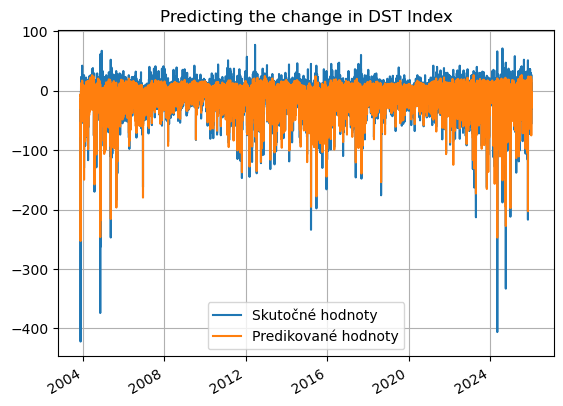

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.8918867419248517
MCC=0.6643083063346727
Výkon NN:
MAE: 6.4963, MSE: 106.7449
Perzistentný model:
MAE: 7.2032, MSE: 134.9898
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 9.81%
MSE Improvement: 20.92%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 53s 59ms/step  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 52s 59ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 52s 59ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 51s 59ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 48s 57ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 48s 57ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 48s 57ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 48s 57ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step 

728/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 53s 59ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step 

  3/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step 

 62/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step  

  3/759 ━━━━━━━━━━━━━━━━━━━━ 45s 60ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 44s 59ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 45s 60ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 45s 60ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 45s 60ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 45s 60ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step 

596/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 15:59 1s/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 55s 62ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 55s 62ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 55s 62ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step 

729/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 55s 60ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 23s 104ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step 

  3/224 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step 

 64/224 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 44s 59ms/step  

  3/759 ━━━━━━━━━━━━━━━━━━━━ 45s 60ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 45s 60ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 45s 60ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 45s 60ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 45s 60ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 45s 60ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 44s 59ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 44s 59ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 43s 59ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 44s 59ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step 

600/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step


Shapes LSTM:
train: (229332,) (229332,)
val:   (57315,) (57315,)
test:  (194176,) (194176,)
Global sigma (LSTM errors, scaled): 0.5519523
Shapes GP:
X_gp_train: (286647, 24)
y_gp_train: (286647,)
X_test_gp: (194176, 24)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.61**2 * RBF(length_scale=0.816) + WhiteKernel(noise_level=0.747)


Global sigma (LSTM errors): 12.145115
Hybrid prediction with smoothed, inflated interval ready.


In [20]:
len(y_hybrid_upper)

194176

In [21]:
len(y_pred_persistence)

194165

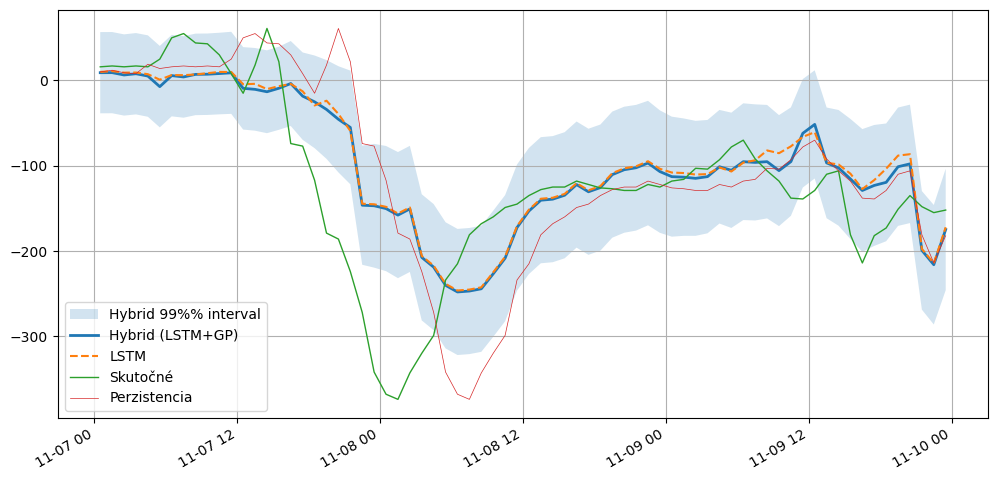

In [22]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})



start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [23]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 108.7358
MAE: 6.5863

--- Klasifikačné metriky (Prah: -19.8 nT) ---
Matthews Correlation Coefficient (MCC): 0.6538

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      143343 |        8696
Skutočná 1 |       13347 |       28779

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.91      0.94      0.93    152039
   Trieda 1 (Búrka)       0.77      0.68      0.72     42126

           accuracy                           0.89    194165
          macro avg       0.84      0.81      0.83    194165
       weighted avg       0.88      0.89      0.88    194165



In [24]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.8919063682950068
MCC=0.6643611822596049
Výkon NN:
MAE: 6.4963, MSE: 106.7449
Perzistentný model:
MAE: 7.2032, MSE: 134.9898
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 9.81%
MSE Improvement: 20.92%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9099    0.9567    0.9327    152039
           1     0.8081    0.6580    0.7254     42126

    accuracy                         0.8919    194165
   macro avg     0.8590    0.8074    0.8290    194165
weighted avg     0.8878    0.8919    0.8877    194165


===== LSTM+GP =====
ACC=0.8864728452604743
MCC=0.6537533654075185
Výkon NN:
MAE: 6.5863, MSE: 108.7358
Perzistentný model:
MAE: 7.2032, MSE: 134.9898
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 8.57%
MSE Improvement: 19.45%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9148    0.9428    0.9286    152039
           1     0.7680    0.6832    0.7231     42126


Saved/updated: all_models_report.csv


/tmp/ipykernel_542322/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_542322/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
36,2026-04-26T17:07:26,LSTM,18.0,5.0,DST+5,OMNI2_all,-20.0,-20.2,0.898312,0.684991,"{""text"": "" precision recall f...",6.024730,90.295567,6.683684,114.022078,9.859149,20.808699
37,2026-04-26T17:07:26,LSTM+GP,18.0,5.0,DST+5,OMNI2_all,-20.0,-20.2,0.888883,0.661184,"{""text"": "" precision recall f...",6.390627,98.723513,6.683684,114.022078,4.384663,13.417196
38,2026-04-26T17:39:33,LSTM,6.0,5.0,DST+5,OMNI2_all,-20.0,-20.1,0.895512,0.679439,"{""text"": "" precision recall f...",6.084345,91.104486,6.683642,114.018863,8.966626,20.097006
39,2026-04-26T17:39:33,LSTM+GP,6.0,5.0,DST+5,OMNI2_all,-20.0,-20.1,0.890898,0.664932,"{""text"": "" precision recall f...",6.350304,99.041467,6.683642,114.018863,4.987373,13.135894
40,2026-04-26T18:23:27,LSTM,12.0,6.0,DST+6,OMNI2_all,-20.0,-19.3,0.889755,0.660703,"{""text"": "" precision recall f...",6.418466,104.980910,7.203881,135.014157,10.902659,22.244517
41,2026-04-26T18:23:27,LSTM+GP,12.0,6.0,DST+6,OMNI2_all,-20.0,-19.3,0.883024,0.646335,"{""text"": "" precision recall f...",6.785546,112.750949,7.203881,135.014157,5.807076,16.489536
42,2026-04-26T19:51:54,LSTM,18.0,6.0,DST+6,OMNI2_all,-20.0,-19.6,0.891529,0.664662,"{""text"": "" precision recall f...",6.353564,105.333787,7.203913,135.016377,11.803995,21.984437
43,2026-04-26T19:51:54,LSTM+GP,18.0,6.0,DST+6,OMNI2_all,-20.0,-19.6,0.883021,0.649095,"{""text"": "" precision recall f...",6.683214,110.979415,7.203913,135.016377,7.228004,17.802998
44,2026-04-26T21:54:54,LSTM,24.0,6.0,DST+6,OMNI2_all,-20.0,-19.8,0.891906,0.664361,"{""text"": "" precision recall f...",6.496333,106.744872,7.203240,134.989823,9.813729,20.923763
45,2026-04-26T21:54:54,LSTM+GP,24.0,6.0,DST+6,OMNI2_all,-20.0,-19.8,0.886473,0.653753,"{""text"": "" precision recall f...",6.586269,108.735758,7.203240,134.989823,8.565185,19.448922
